In [1]:

from autots import AutoTS, load_weekly
import pandas as pd


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/compat/pandas.py:65: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import Int64Index as NumericIndex


In [2]:
#Data

df1=pd.read_csv('/Users/simennaess/Documents/Master/Ukentlig_vareid_ys_kunde_time_lag_15_20.csv', parse_dates=['Ukedato'], sep=";", decimal=",", header=0)

#Produkter hentet fra produktseleksjon (vasket og deretter hentet ut basert på at de står for 100%, 50% eller 10% 
#av maksvolumet for enkeltprodukter, samt sesongprodukter. Blant allProducts er det også 12 
#ekstra produkter som ligger mellom mid-> low runners.)

selectedTopProducts=[10133,9662,9399,9306,9400,10135,9898,9630,9897,9860]
selectedMidProducts=[14759,9901,10019,14536,14508,9994,16444,16353,9995, 9307]
selectedLowProducts=[14238,14288,14542,10002,10197,16408,16527, 14563, 9541] 
selectedSeasonalProducts=[10022, 9560, 10005, 9541]

allSelectedProducts=[10133, 9662, 9399, 9306, 9400, 10135, 9898, 9630, 9897, 9860, 14759, 
                     9901, 10019, 14508, 9994, 16444, 16353, 9995, 14760, 15112, 14536, 16409, 
                     10022, 14540, 14251, 14490, 10017, 9560, 10005, 14238, 10002, 10197, 16408, 14288, 16527, 9541]

df1=df1[df1.Vare_Id.isin(allSelectedProducts)]

In [3]:
#Datagrouper
df= df1.groupby(['Ukedato','Vare_Id']).agg({'Salg_sum':'sum'}).rename(columns={'Salg_sum':'Sales'}).reset_index()

#df['Ukedato']=pd.to_datetime(df['Ukedato'])  


In [4]:
df.sample(n=10).head(10)

,Ukedato,Vare_Id,Sales
303,2016-01-04,9399,20475.5
211,2015-12-07,9630,9846.0
4884,2019-02-25,14540,611.0
6529,2020-02-24,9994,1483.0
7334,2020-08-10,10133,32702.0
5099,2019-04-15,15112,2456.0
5274,2019-05-27,14760,4015.0
4448,2018-11-19,14508,1926.0
2478,2017-08-07,9898,9210.0
3930,2018-07-16,10002,213.0


In [5]:
df.dtypes

Ukedato    datetime64[ns]
Vare_Id             int64
Sales             float64
dtype: object

In [8]:
def train_on_individual_timeseries(listOfProducts):
    for p in listOfProducts:
        df2=df.loc[df['Vare_Id']==p]
        
        horizons=[3,12]
        for horizon in horizons:
            df_train=df2[0:-horizon]
            df_test=df2[-horizon:]
            print(df_train)
            model_fit_predict_and_evaluate(horizon, df_train, df_test)

def model_fit_predict_and_evaluate(horizon, df_train, df_test):
    weights_weekly={'Sales':20}
    metric_weigths={
        'smape_weighting': 1,
        'mae_weighting': 3,
        'rmse_weighting': 10,
        'made_weighting': 1,
        'mage_weighting': 0,
        'mle_weighting': 0,
        'imle_weighting': 0,
        'spl_weighting': 2,
        'containment_weighting': 0,
        'contour_weighting': 0,
        'runtime_weighting': 0.05,
    }
    
    model = AutoTS(
        forecast_length=horizon,
        frequency='W-MON',
        prediction_interval=0.9,
        metric_weighting=metric_weigths,
        ensemble='simple',
        #model_list="fast",  # "superfast", "default", "fast_parallel"
        transformer_list='all',  # "superfast",
        #drop_most_recent=1,
        model_list='fast',
        max_generations=4,
        num_validations=2,
        validation_method="backwards",
    )
    model = model.fit(
        df_train,
        date_col='Ukedato',
        value_col='Sales',
        id_col='Vare_Id',
    )

    prediction = model.predict()
    # plot a sample
    prediction.plot(model.df_wide_numeric,
                    series=model.df_wide_numeric.columns[0], start_date="2019-1-1")
    # Print the details of the best model
    print(model)

    # point forecasts dataframe
    forecasts_df = prediction.forecast
    # upper and lower forecasts
    forecasts_up, forecasts_low = prediction.upper_forecast, prediction.lower_forecast

    # accuracy of all tried model results
    model_results = model.results()
    # and aggregated from cross validation
    validation_results = model.results("validation")

        Ukedato  Vare_Id    Sales
420  2016-02-01    10133     10.0
446  2016-02-08    10133     78.0
472  2016-02-15    10133    385.0
498  2016-02-22    10133   1335.0
523  2016-02-29    10133   2714.0
...         ...      ...      ...
7334 2020-08-10    10133  32702.0
7367 2020-08-17    10133  29764.0
7399 2020-08-24    10133  29273.9
7431 2020-08-31    10133  29366.9
7463 2020-09-07    10133  29352.0

[241 rows x 3 columns]
Model Number: 1 with model AverageValueNaive in generation 0 of 4
Model Number: 2 with model AverageValueNaive in generation 0 of 4
Model Number: 3 with model AverageValueNaive in generation 0 of 4
Model Number: 4 with model DatepartRegression in generation 0 of 4
Model Number: 5 with model DatepartRegression in generation 0 of 4
Model Number: 6 with model DatepartRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 7 with model DatepartRegression in generation 0 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 7: DatepartRegression
Model Number: 8 with model ETS in generation 0 of 4
Model Number: 9 with model ETS in generation 0 of 4
Model Number: 10 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 10: GLM
Model Number: 11 with model GLM in generation 0 of 4
Model Number: 12 with model GLS in generation 0 of 4
Model Number: 13 with model GLS in generation 0 of 4
Model Number: 14 with model LastValueNaive in generation 0 of 4
Model Number: 15 with model LastValueNaive in generation 0 of 4
Model Number: 16 with model LastValueNaive in generation 0 of 4
Model Number: 17 with model LastValueNaive in generation 0 of 4
Model Number: 18 with m

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 19 with model SeasonalNaive in generation 0 of 4
Model Number: 20 with model SeasonalNaive in generation 0 of 4
Model Number: 21 with model SeasonalNaive in generation 0 of 4
Model Number: 22 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 22: VAR
Model Number: 23 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 23: VAR
Model Number: 24 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 24: VAR
Model Number: 25 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 25: VECM
Model Number: 26 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 26: VECM
Model Number: 27 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 2

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 38 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 38: VAR
Model Number: 39 with model VECM in generation 0 of 4
Template Eval Error: LinAlgError('SVD did not converge') in model 39: VECM
Model Number: 40 with model WindowRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 41 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 41: DatepartRegression
Model Number: 42 with model UnivariateMotif in generation 0 of 4
Model Number: 43 with model MultivariateMotif in generation 0 of 4
Model Number: 44 with model SectionalMotif in generation 0 of 4
Model Number: 45 with model NVAR in generation 0 of 4
Model Number: 46 with model ETS in generation 0 of 4
Model Number: 47 with model MultivariateMotif in generation 0 of 4
Model Number: 48 with model ZeroesNaive in generation 0 of 4
Model Number: 49 with model LastValueNaive in generation 0 of 4
Model Number: 50 with model ETS in generation 0 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 10133 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal compon

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered

Model Number: 57 with model GLM in generation 0 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 57: GLM
Model Number: 58 with model ETS in generation 0 of 4
Model Number: 59 with model ZeroesNaive in generation 0 of 4
Model Number: 60 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 60: VECM
Model Number: 61 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 61: VECM
Model Number: 62 with model VECM in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 62: VECM
Model Number: 63 with model UnivariateMotif in generation 0 of 4
Model Number: 64 with model UnivariateMotif in generation 0 of 4
Model Number: 65 with model NVAR in generation 0 of 4
Model Number: 66 with model DatepartRegression in generation 0 of 4
Model Number: 67 wit

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess

Template Eval Error: ValueError('Only gave one variable to VAR') in model 68: VAR
Model Number: 69 with model VECM in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 69: VECM
Model Number: 70 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 70: GLM
Model Number: 71 with model MultivariateMotif in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 71: MultivariateMotif
Model Number: 72 with model ETS in generation 0 of 4
Model Number: 73 with model UnivariateMotif in generation 0 of 4
Model Number: 74 with model VAR in generation 0 of 4
Template Eval Error: IndexError('tuple index out of range') in model 74: VAR
Model Number: 75 with model ETS in generation 0 of 4
Model Number: 76 with model MultivariateMotif in g

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 84 with model SeasonalNaive in generation 0 of 4
Model Number: 85 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (45)') in model 85: SectionalMotif
Model Number: 86 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 86: VECM
Model Number: 87 with model GLS in generation 0 of 4
Model Number: 88 with model NVAR in generation 0 of 4
Model Number: 89 with model DatepartRegression in generation 0 of 4
Model Number: 90 with model WindowRegression in generation 0 of 4
Model Number: 91 with model UnivariateMotif in generation 0 of 4
Model Number: 92 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 92: VAR
Model Number: 93 with model WindowRegression in generation 0 of 4
Model Number: 94 with model SectionalMotif in generation 0 of 4
Model Number: 95 with model VECM in generation 0 of 4
Template Eval Erro

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


Model Number: 100 with model NVAR in generation 0 of 4
Model Number: 101 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 101: DatepartRegression
Model Number: 102 with model SeasonalNaive in generation 0 of 4
Model Number: 103 with model WindowRegression in generation 0 of 4
Model Number: 104 with model AverageValueNaive in generation 0 of 4
Model Number: 105 with model AverageValueNaive in generation 0 of 4
New Generation: 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 106 with model ZeroesNaive in generation 1 of 4
Model Number: 107 with model ZeroesNaive in generation 1 of 4
Model Number: 108 with model ZeroesNaive in generation 1 of 4
Model Number: 109 with model LastValueNaive in generation 1 of 4
Model Number: 110 with model LastValueNaive in generation 1 of 4
Model Number: 111 with model ETS in generation 1 of 4
Model Number: 112 with model ETS in generation 1 of 4
Model Number: 113 with model ETS in generation 1 of 4
Model Number: 114 with model ETS in generation 1 of 4
ETS error ValueError('Can only dampen the trend component')
ETS failed on 10133 with ValueError('Can only dampen the trend component')
Model Number: 115 with model DatepartRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 115: DatepartRegression
Model Number: 116 with model DatepartRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_reg

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 121 with model NVAR in generation 1 of 4
Model Number: 122 with model NVAR in generation 1 of 4
Model Number: 123 with model NVAR in generation 1 of 4
Model Number: 124 with model NVAR in generation 1 of 4
Model Number: 125 with model UnivariateMotif in generation 1 of 4
Model Number: 126 with model UnivariateMotif in generation 1 of 4
Model Number: 127 with model UnivariateMotif in generation 1 of 4
Model Number: 128 with model UnivariateMotif in generation 1 of 4
Model Number: 129 with model AverageValueNaive in generation 1 of 4
Model Number: 130 with model AverageValueNaive in generation 1 of 4
Model Number: 131 with model AverageValueNaive in generation 1 of 4


[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed:    0.2s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished


Model Number: 132 with model MultivariateMotif in generation 1 of 4
Model Number: 133 with model MultivariateMotif in generation 1 of 4
Model Number: 134 with model MultivariateMotif in generation 1 of 4
Template Eval Error: ValueError('Model MultivariateMotif returned NaN for one or more series. fail_on_forecast_nan=True') in model 134: MultivariateMotif
Model Number: 135 with model MultivariateMotif in generation 1 of 4
Model Number: 136 with model GLS in generation 1 of 4
Model Number: 137 with model GLS in generation 1 of 4
Model Number: 138 with model GLS in generation 1 of 4
Model Number: 139 with model SeasonalNaive in generation 1 of 4
Model Number: 140 with model SeasonalNaive in generation 1 of 4
Model Number: 141 with model SeasonalNaive in generation 1 of 4
Model Number: 142 with model SeasonalNaive in generation 1 of 4
Model Number: 143 with model SectionalMotif in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/core/_methods.py:48: RuntimeWarning: invalid value encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/

Model Number: 144 with model SectionalMotif in generation 1 of 4
Template Eval Error: ValueError("regression_type=='User' but no future_regressor supplied") in model 144: SectionalMotif
Model Number: 145 with model SectionalMotif in generation 1 of 4
Template Eval Error: Exception('Transformer MaxAbsScaler failed on fit') in model 145: SectionalMotif
Model Number: 146 with model SectionalMotif in generation 1 of 4
Template Eval Error: ValueError("regression_type=='User' but no future_regressor supplied") in model 146: SectionalMotif
Model Number: 147 with model GLM in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['Timestamp', 'int']. An error will be raised in 1.2.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:1187: RuntimeWarning: All-NaN slice encountered
  max_abs = np.nanmax(np.abs(X), axis=0)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['Timestamp', 'int']. An error will be raised in 1.2.
  warnings.warn(


Template Eval Error: Exception('Transformer QuantileTransformer failed on inverse') in model 147: GLM
Model Number: 148 with model GLM in generation 1 of 4
Model Number: 149 with model GLM in generation 1 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 149: GLM
Model Number: 150 with model GLM in generation 1 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 150: GLM
Model Number: 151 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 151: VAR
Model Number: 152 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 152: VAR
Model Number: 153 with model VAR in generati

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: divide by zero encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:56: RuntimeWarning: invalid value encountered in true_divide
  post_mu = (
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['Timestamp', 'int']. An error will be raised in 1.2.
  warnings.warn(


Model Number: 167 with model LastValueNaive in generation 2 of 4
Model Number: 168 with model LastValueNaive in generation 2 of 4
Model Number: 169 with model DatepartRegression in generation 2 of 4
Template Eval Error: ValueError("Input contains NaN, infinity or a value too large for dtype('float64').") in model 169: DatepartRegression
Model Number: 170 with model DatepartRegression in generation 2 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 170: DatepartRegression
Model Number: 171 with model DatepartRegression in generation 2 of 4
Model Number: 172 with model WindowRegression in generation 2 of 4
Template Eval Error: ModuleNotFoundError("No module named 'lightgbm'") in model 172: WindowRegression
Model Number: 173 with model WindowRegression in generation 2 of 4
Model Number: 174 with model WindowRegression in generation 2 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/experimental/enable_hist_gradient_boosting.py:16: UserWarning: Since version 1.0, it is not needed to import enable_hist_gradient_boosting anymore. HistGradientBoostingClassifier and Hi

Model Number: 175 with model ETS in generation 2 of 4
Model Number: 176 with model ETS in generation 2 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 10133 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 177 with model ETS in generation 2 of 4
Model Number: 178 with model ETS in generation 2 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 10133 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 179 with model UnivariateMotif in generation 2 of 4
Model Number: 180 with model UnivariateMotif in generation 2 of 4
Model Number: 181 with model UnivariateMotif in generation 2 of 4
Model Number: 182 with model UnivariateMotif in generation 2 of 4
Model Number: 183 with model AverageValueNaive

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti


Model Number: 193 with model SeasonalNaive in generation 2 of 4
Model Number: 194 with model SeasonalNaive in generation 2 of 4
Model Number: 195 with model SeasonalNaive in generation 2 of 4
Model Number: 196 with model SeasonalNaive in generation 2 of 4
Model Number: 197 with model SectionalMotif in generation 2 of 4
Model Number: 198 with model SectionalMotif in generation 2 of 4
Model Number: 199 with model SectionalMotif in generation 2 of 4
Model Number: 200 with model SectionalMotif in generation 2 of 4
Model Number: 201 with model GLM in generation 2 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 201: GLM
Model Number: 202 with model GLM in generation 2 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 204 with model GLM in generation 2 of 4
Model Number: 205 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 205: VAR
Model Number: 206 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 206: VAR
Model Number: 207 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 207: VAR
Model Number: 208 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 208: VAR
Model Number: 209 with model VECM in generation 2 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 209: VECM
Model Number: 210 with model VECM in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 210: VECM
Model Number: 211 with model VECM in generation 2 of 4
Template Eval Error: ValueError('Only 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 233 with model WindowRegression in generation 3 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 233: WindowRegression
Model Number: 234 with model WindowRegression in generation 3 of 4
Model Number: 235 with model WindowRegression in generation 3 of 4
Model Number: 236 with model MultivariateMotif in generation 3 of 4
Model Number: 237 with model MultivariateMotif in generation 3 of 4
Template Eval Error: Exception('Transformer MinMaxScaler failed on fit') in model 237: MultivariateMotif
Model Number: 238 with model MultivariateMotif in generation 3 of 4
Model Number: 239 with model MultivariateMotif in generation 3 of 4
Model Number: 240 with model AverageValueNaive in generation 3 of 4
Model Number: 241 with model AverageValueNaive in generation 3 of 4
Model Number: 242 with model AverageValueNaive in generation 3 of 4
Model Number: 243 with model GLS in generation 3 of 4
Model Number: 244 with model GLS in generation 3 of 4
Model Numbe

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1584: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['Timestamp', 'int']. An error will be raised in 1.2.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:461: RuntimeWarning: All-NaN slice encountered
  data_min = np.nanmin(X, axis=0)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:462: RuntimeWarning: All-NaN slice encountered
  data_max = np.nanmax(X, axis=0)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with


Model Number: 257 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 257: VAR
Model Number: 258 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 258: VAR
Model Number: 259 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 259: VAR
Model Number: 260 with model VAR in generation 3 of 4
Template Eval Error: IndexError('tuple index out of range') in model 260: VAR
Model Number: 261 with model VECM in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 261: VECM
Model Number: 262 with model VECM in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 262: VECM
Model Number: 263 with model VECM in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_r

[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed:    0.1s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarn

Model Number: 289 with model MultivariateMotif in generation 4 of 4
Model Number: 290 with model MultivariateMotif in generation 4 of 4
Model Number: 291 with model MultivariateMotif in generation 4 of 4
Model Number: 292 with model MultivariateMotif in generation 4 of 4
Model Number: 293 with model GLS in generation 4 of 4
Model Number: 294 with model GLS in generation 4 of 4
Model Number: 295 with model GLS in generation 4 of 4
Model Number: 296 with model AverageValueNaive in generation 4 of 4
Model Number: 297 with model AverageValueNaive in generation 4 of 4
Model Number: 298 with model AverageValueNaive in generation 4 of 4
Model Number: 299 with model SectionalMotif in generation 4 of 4
Model Number: 300 with model SectionalMotif in generation 4 of 4
Model Number: 301 with model SectionalMotif in generation 4 of 4
Model Number: 302 with model SectionalMotif in generation 4 of 4
Model Number: 303 with model SeasonalNaive in generation 4 of 4
Model Number: 304 with model SeasonalN

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:426: RuntimeWarning: divide by zero encountered in true_divide
  endog_mu = self._clean(endog / mu)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/ensemble.py:918: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  mods = pd.Series()


Model Number: 321 with model Ensemble in generation 5 of 0
Model Number: 322 with model Ensemble in generation 5 of 0
Model Number: 323 with model Ensemble in generation 5 of 0
Model Number: 324 with model Ensemble in generation 5 of 0
Model Number: 325 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 326 with model Ensemble in generation 5 of 0
Validation Round: 1
Model Number: 1 of 49 with model Ensemble for Validation 1
1 - Ensemble with avg smape 1.98: 
Model Number: 2 of 49 with model Ensemble for Validation 1
2 - Ensemble with avg smape 1.98: 
Model Number: 3 of 49 with model NVAR for Validation 1
3 - NVAR with avg smape 7.14: 
Model Number: 4 of 49 with model LastValueNaive for Validation 1
4 - LastValueNaive with avg smape 7.48: 
Model Number: 5 of 49 with model Ensemble for Validation 1
5 - Ensemble with avg smape 7.5: 
Model Number: 6 of 49 with model Ensemble for Validation 1
6 - Ensemble with avg smape 7.52: 
Model Number: 7 of 49 with model Ensemble for Validation 1
7 - Ensemble with avg smape 7.23: 
Model Number: 8 of 49 with model ZeroesNaive for Validation 1
8 - ZeroesNaive with avg smape 11.2: 
Model Number: 9 of 49 with model ZeroesNaive for Validation 1
9 - ZeroesNaive with avg smape 11.2: 
Model Number: 10 of 49 with model ETS for Validation 1
10 - 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Librar

24 - MultivariateMotif with avg smape 6.69: 
Model Number: 25 of 49 with model ETS for Validation 1
25 - ETS with avg smape 4.6: 
Model Number: 26 of 49 with model NVAR for Validation 1
26 - NVAR with avg smape 6.75: 
Model Number: 27 of 49 with model NVAR for Validation 1
27 - NVAR with avg smape 6.75: 
Model Number: 28 of 49 with model NVAR for Validation 1
28 - NVAR with avg smape 7.31: 
Model Number: 29 of 49 with model UnivariateMotif for Validation 1
29 - UnivariateMotif with avg smape 5.75: 
Model Number: 30 of 49 with model MultivariateMotif for Validation 1
30 - MultivariateMotif with avg smape 6.88: 
Model Number: 31 of 49 with model MultivariateMotif for Validation 1
31 - MultivariateMotif with avg smape 6.88: 
Model Number: 32 of 49 with model NVAR for Validation 1
32 - NVAR with avg smape 5.09: 
Model Number: 33 of 49 with model WindowRegression for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s


33 - WindowRegression with avg smape 8.28: 
Model Number: 34 of 49 with model DatepartRegression for Validation 1


[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed:    0.2s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished


34 - DatepartRegression with avg smape 6.96: 
Model Number: 35 of 49 with model SeasonalNaive for Validation 1
35 - SeasonalNaive with avg smape 10.51: 
Model Number: 36 of 49 with model MultivariateMotif for Validation 1
36 - MultivariateMotif with avg smape 7.04: 
Model Number: 37 of 49 with model GLS for Validation 1
37 - GLS with avg smape 4.32: 
Model Number: 38 of 49 with model AverageValueNaive for Validation 1
38 - AverageValueNaive with avg smape 7.67: 
Model Number: 39 of 49 with model UnivariateMotif for Validation 1
39 - UnivariateMotif with avg smape 11.37: 
Model Number: 40 of 49 with model MultivariateMotif for Validation 1
40 - MultivariateMotif with avg smape 6.42: 
Model Number: 41 of 49 with model UnivariateMotif for Validation 1
41 - UnivariateMotif with avg smape 12.13: 
Model Number: 42 of 49 with model AverageValueNaive for Validation 1
42 - AverageValueNaive with avg smape 4.88: 
Model Number: 43 of 49 with model GLS for Validation 1
43 - GLS with avg smape 7.71

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Librar

23 - ZeroesNaive with avg smape 1.57: 
Model Number: 24 of 49 with model MultivariateMotif for Validation 2
24 - MultivariateMotif with avg smape 2.02: 
Model Number: 25 of 49 with model ETS for Validation 2
25 - ETS with avg smape 9.74: 
Model Number: 26 of 49 with model NVAR for Validation 2
26 - NVAR with avg smape 2.56: 
Model Number: 27 of 49 with model NVAR for Validation 2
27 - NVAR with avg smape 2.56: 
Model Number: 28 of 49 with model NVAR for Validation 2
28 - NVAR with avg smape 1.49: 
Model Number: 29 of 49 with model UnivariateMotif for Validation 2
29 - UnivariateMotif with avg smape 18.58: 
Model Number: 30 of 49 with model MultivariateMotif for Validation 2
30 - MultivariateMotif with avg smape 1.95: 
Model Number: 31 of 49 with model MultivariateMotif for Validation 2
31 - MultivariateMotif with avg smape 1.95: 
Model Number: 32 of 49 with model NVAR for Validation 2
32 - NVAR with avg smape 10.7: 
Model Number: 33 of 49 with model WindowRegression for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed:    0.2s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 18

33 - WindowRegression with avg smape 18.76: 
Model Number: 34 of 49 with model DatepartRegression for Validation 2
34 - DatepartRegression with avg smape 1.27: 
Model Number: 35 of 49 with model SeasonalNaive for Validation 2
35 - SeasonalNaive with avg smape 2.97: 
Model Number: 36 of 49 with model MultivariateMotif for Validation 2
36 - MultivariateMotif with avg smape 1.64: 
Model Number: 37 of 49 with model GLS for Validation 2
37 - GLS with avg smape 11.03: 
Model Number: 38 of 49 with model AverageValueNaive for Validation 2
38 - AverageValueNaive with avg smape 1.61: 
Model Number: 39 of 49 with model UnivariateMotif for Validation 2
39 - UnivariateMotif with avg smape 2.72: 
Model Number: 40 of 49 with model MultivariateMotif for Validation 2
40 - MultivariateMotif with avg smape 27.57: 
Model Number: 41 of 49 with model UnivariateMotif for Validation 2
41 - UnivariateMotif with avg smape 4.0: 
Model Number: 42 of 49 with model AverageValueNaive for Validation 2
42 - AverageVal

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 7 with model DatepartRegression in generation 0 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 7: DatepartRegression
Model Number: 8 with model ETS in generation 0 of 4
Model Number: 9 with model ETS in generation 0 of 4
Model Number: 10 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 10: GLM
Model Number: 11 with model GLM in generation 0 of 4
Model Number: 12 with model GLS in generation 0 of 4
Model Number: 13 with model GLS in generation 0 of 4
Model Number: 14 with model LastValueNaive in generation 0 of 4
Model Number: 15 with model LastValueNaive in generation 0 of 4
Model Number: 16 with model LastValueNaive in generation 0 of 4
Model Number: 17 with model LastValueNaive in generation 0 of 4
Model Number: 18 with m

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 19 with model SeasonalNaive in generation 0 of 4
Model Number: 20 with model SeasonalNaive in generation 0 of 4
Model Number: 21 with model SeasonalNaive in generation 0 of 4
Model Number: 22 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 22: VAR
Model Number: 23 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 23: VAR
Model Number: 24 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 24: VAR
Model Number: 25 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 25: VECM
Model Number: 26 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 26: VECM
Model Number: 27 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 2

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 36 with model GLM in generation 0 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 36: GLM
Model Number: 37 with model ETS in generation 0 of 4
Model Number: 38 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 38: VAR
Model Number: 39 with model VECM in generation 0 of 4
Template Eval Error: LinAlgError('SVD did not converge') in model 39: VECM
Model Number: 40 with model WindowRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 41 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 41: DatepartRegression
Model Number: 42 with model UnivariateMotif in generation 0 of 4
Model Number: 43 with model MultivariateMotif in generation 0 of 4
Model Number: 44 with model SectionalMotif in generation 0 of 4
Model Number: 45 with model NVAR in generation 0 of 4
Model Number: 46 with model ETS in generation 0 of 4
Model Number: 47 with model MultivariateMotif in generation 0 of 4
Model Number: 48 with model ZeroesNaive in generation 0 of 4
Model Number: 49 with model LastValueNaive in generation 0 of 4
Model Number: 50 with model ETS in generation 0 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 10133 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal compon

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered

Model Number: 54 with model GLS in generation 0 of 4
Model Number: 55 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 55: VAR
Model Number: 56 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (100)') in model 56: SectionalMotif
Model Number: 57 with model GLM in generation 0 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 57: GLM
Model Number: 58 with model ETS in generation 0 of 4
Model Number: 59 with model ZeroesNaive in generation 0 of 4
Model Number: 60 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 60: VECM
Model Number: 61 with model VECM in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 61: VECM
Model Number: 62 with model VECM in generation 0 of 4
Template Ev

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 67 with model NVAR in generation 0 of 4
Model Number: 68 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 68: VAR
Model Number: 69 with model VECM in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 69: VECM
Model Number: 70 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 70: GLM
Model Number: 71 with model MultivariateMotif in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 71: MultivariateMotif
Model Number: 72 with model ETS in generation 0 of 4
Model Number: 73 with model UnivariateMotif in generation 0 of 4
Model Number: 74 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 83 with model AverageValueNaive in generation 0 of 4
Model Number: 84 with model SeasonalNaive in generation 0 of 4
Model Number: 85 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (39)') in model 85: SectionalMotif
Model Number: 86 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 86: VECM
Model Number: 87 with model GLS in generation 0 of 4
Model Number: 88 with model NVAR in generation 0 of 4
Model Number: 89 with model DatepartRegression in generation 0 of 4
Model Number: 90 with model WindowRegression in generation 0 of 4
Model Number: 91 with model UnivariateMotif in generation 0 of 4
Model Number: 92 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 92: VAR
Model Number: 93 with model WindowRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


Model Number: 94 with model SectionalMotif in generation 0 of 4
Model Number: 95 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 95: VECM
Model Number: 96 with model SeasonalNaive in generation 0 of 4
Template Eval Error: ValueError('Model SeasonalNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 96: SeasonalNaive
Model Number: 97 with model GLS in generation 0 of 4
Model Number: 98 with model VECM in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 98: VECM
Model Number: 99 with model SectionalMotif in generation 0 of 4
Model Number: 100 with model NVAR in generation 0 of 4
Model Number: 101 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 101: DatepartRegression
Model Number: 102 with model SeasonalNaive in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 109 with model ETS in generation 1 of 4
Model Number: 110 with model ETS in generation 1 of 4
Model Number: 111 with model ETS in generation 1 of 4
ETS error ValueError('Can only dampen the trend component')
ETS failed on 10133 with ValueError('Can only dampen the trend component')
Model Number: 112 with model ETS in generation 1 of 4
ETS error ValueError('Can only dampen the trend component')
ETS failed on 10133 with ValueError('Can only dampen the trend component')
Model Number: 113 with model DatepartRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 113: DatepartRegression
Model Number: 114 with model DatepartRegression in generation 1 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 114: DatepartRegression
Model Number: 115 with model DatepartRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='Use

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: divide by zero encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/User

Model Number: 126 with model SeasonalNaive in generation 1 of 4
Model Number: 127 with model SeasonalNaive in generation 1 of 4
Model Number: 128 with model WindowRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 128: WindowRegression
Model Number: 129 with model WindowRegression in generation 1 of 4
Model Number: 130 with model WindowRegression in generation 1 of 4


[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed:    0.1s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks   

Model Number: 131 with model GLS in generation 1 of 4
Model Number: 132 with model GLS in generation 1 of 4
Model Number: 133 with model GLS in generation 1 of 4
Model Number: 134 with model ZeroesNaive in generation 1 of 4
Model Number: 135 with model ZeroesNaive in generation 1 of 4
Model Number: 136 with model SectionalMotif in generation 1 of 4


[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tas

Model Number: 137 with model SectionalMotif in generation 1 of 4
Model Number: 138 with model SectionalMotif in generation 1 of 4
Model Number: 139 with model SectionalMotif in generation 1 of 4
Model Number: 140 with model MultivariateMotif in generation 1 of 4
Model Number: 141 with model MultivariateMotif in generation 1 of 4
Model Number: 142 with model MultivariateMotif in generation 1 of 4
Model Number: 143 with model MultivariateMotif in generation 1 of 4
Model Number: 144 with model LastValueNaive in generation 1 of 4
Model Number: 145 with model LastValueNaive in generation 1 of 4
Model Number: 146 with model LastValueNaive in generation 1 of 4
Model Number: 147 with model GLM in generation 1 of 4
Model Number: 148 with model GLM in generation 1 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 148: GLM
Model Number: 149 with model GLM in generation 1 of 4
Model Number: 150 with model GLM in generation 1 of 4
Model Number: 151

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))


Template Eval Error: ValueError('Only gave one variable to VAR') in model 154: VAR
Model Number: 155 with model VECM in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 155: VECM
Model Number: 156 with model VECM in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 156: VECM
Model Number: 157 with model VECM in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 157: VECM
Model Number: 158 with model VECM in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 158: VECM
New Generation: 2 of 4
Model Number: 159 with model AverageValueNaive in generation 2 of 4
Model Number: 160 with model AverageValueNaive in generation 2 of 4
Model Number: 161 with model AverageValueNaive in generation 2 of 4
Model Number: 162 with model GLS in generation 2 of 4
Model Number: 163 with model GLS in generation 2 of 4
Model Number: 164 with

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())


Model Number: 187 with model SeasonalNaive in generation 2 of 4
Model Number: 188 with model WindowRegression in generation 2 of 4
Model Number: 189 with model WindowRegression in generation 2 of 4
Template Eval Error: ValueError('Found array with 0 sample(s) (shape=(0, 0)) while a minimum of 1 is required.') in model 189: WindowRegression
Model Number: 190 with model WindowRegression in generation 2 of 4
Model Number: 191 with model ZeroesNaive in generation 2 of 4
Model Number: 192 with model ZeroesNaive in generation 2 of 4
Model Number: 193 with model ZeroesNaive in generation 2 of 4
Model Number: 194 with model SectionalMotif in generation 2 of 4
Model Number: 195 with model SectionalMotif in generation 2 of 4
Model Number: 196 with model SectionalMotif in generation 2 of 4
Model Number: 197 with model SectionalMotif in generation 2 of 4
Template Eval Error: ValueError('The number of observations (19) is too small; the covariance matrix is singular. For observations with 30 dimens

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_g

Model Number: 226 with model GLM in generation 3 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 226: GLM
Model Number: 227 with model GLM in generation 3 of 4
Template Eval Error: Exception('Transformer QuantileTransformer failed on fit') in model 227: GLM
Model Number: 228 with model GLM in generation 3 of 4
Template Eval Error: Exception('Transformer StandardScaler failed on fit') in model 228: GLM
Model Number: 229 with model GLM in generation 3 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 229: GLM
Model Number: 230 with model UnivariateMotif in generation 3 of 4
Model Number: 231 with model UnivariateMotif in generation 3 of 4
Model Number: 232 with model UnivariateMoti

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['Timestamp', 'int']. An error will be raised in 1.2.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1560: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(a,
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['Timestamp', 'int']. An error will be raised in 1.2.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['Timestamp', 'int']. An error will be raised in 1.2.
  warnings.warn(
/Users/simennaess/Library

Model Number: 242 with model NVAR in generation 3 of 4
Model Number: 243 with model NVAR in generation 3 of 4
Model Number: 244 with model SeasonalNaive in generation 3 of 4
Model Number: 245 with model SeasonalNaive in generation 3 of 4
Model Number: 246 with model SeasonalNaive in generation 3 of 4
Template Eval Error: ValueError('Model SeasonalNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 246: SeasonalNaive
Model Number: 247 with model SeasonalNaive in generation 3 of 4
Model Number: 248 with model WindowRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 248: WindowRegression
Model Number: 249 with model WindowRegression in generation 3 of 4
Model Number: 250 with model WindowRegression in generation 3 of 4
Model Number: 251 with model MultivariateMotif in generation 3 of 4
Model Number: 252 with model MultivariateMotif in generation 3 of 4
Model Number: 253 with model Mu

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 266 with model UnivariateMotif in generation 4 of 4
Model Number: 267 with model UnivariateMotif in generation 4 of 4
Model Number: 268 with model UnivariateMotif in generation 4 of 4
Model Number: 269 with model UnivariateMotif in generation 4 of 4
Model Number: 270 with model AverageValueNaive in generation 4 of 4
Model Number: 271 with model AverageValueNaive in generation 4 of 4
Model Number: 272 with model AverageValueNaive in generation 4 of 4
Model Number: 273 with model ETS in generation 4 of 4
Model Number: 274 with model ETS in generation 4 of 4
Model Number: 275 with model ETS in generation 4 of 4
Model Number: 276 with model ETS in generation 4 of 4
Model Number: 277 with model SectionalMotif in generation 4 of 4
Model Number: 278 with model SectionalMotif in generation 4 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 279 with model SectionalMotif in generation 4 of 4
Model Number: 280 with model SectionalMotif in generation 4 of 4
Model Number: 281 with model DatepartRegression in generation 4 of 4
Model Number: 282 with model DatepartRegression in generation 4 of 4
Model Number: 283 with model DatepartRegression in generation 4 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 283: DatepartRegression
Model Number: 284 with model GLS in generation 4 of 4
Model Number: 285 with model GLS in generation 4 of 4
Model Number: 286 with model GLM in generation 4 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 286: GLM
Model Number: 287 with model GLM in generation 4 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 294 with model WindowRegression in generation 4 of 4
Model Number: 295 with model WindowRegression in generation 4 of 4
Model Number: 296 with model NVAR in generation 4 of 4
Model Number: 297 with model NVAR in generation 4 of 4
Model Number: 298 with model NVAR in generation 4 of 4
Model Number: 299 with model NVAR in generation 4 of 4
Model Number: 300 with model SeasonalNaive in generation 4 of 4
Model Number: 301 with model SeasonalNaive in generation 4 of 4
Model Number: 302 with model SeasonalNaive in generation 4 of 4
Model Number: 303 with model SeasonalNaive in generation 4 of 4
Model Number: 304 with model MultivariateMotif in generation 4 of 4
Model Number: 305 with model MultivariateMotif in generation 4 of 4
Model Number: 306 with model MultivariateMotif in generation 4 of 4
Model Number: 307 with model MultivariateMotif in generation 4 of 4
Model Number: 308 with model LastValueNaive in generation 4 of 4
Model Number: 309 with model LastValueNaive in genera

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


Model Number: 310 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 310: VAR
Model Number: 311 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 311: VAR
Model Number: 312 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 312: VAR
Model Number: 313 with model VECM in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 313: VECM
Model Number: 314 with model VECM in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 314: VECM
Model Number: 315 with model VECM in generation 4 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 315: VECM
Model Number: 316 with model VECM in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 316: VECM
Mode

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/ensemble.py:918: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  mods = pd.Series()
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/

Model Number: 320 with model Ensemble in generation 5 of 0
Model Number: 321 with model Ensemble in generation 5 of 0
Model Number: 322 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 323 with model Ensemble in generation 5 of 0
Model Number: 324 with model Ensemble in generation 5 of 0
Validation Round: 1
Model Number: 1 of 49 with model Ensemble for Validation 1
1 - Ensemble with avg smape 18.12: 
Model Number: 2 of 49 with model Ensemble for Validation 1
2 - Ensemble with avg smape 17.31: 
Model Number: 3 of 49 with model Ensemble for Validation 1
3 - Ensemble with avg smape 18.41: 
Model Number: 4 of 49 with model Ensemble for Validation 1
4 - Ensemble with avg smape 17.27: 
Model Number: 5 of 49 with model Ensemble for Validation 1
5 - Ensemble with avg smape 18.72: 
Model Number: 6 of 49 with model UnivariateMotif for Validation 1
6 - UnivariateMotif with avg smape 16.48: 
Model Number: 7 of 49 with model SectionalMotif for Validation 1
7 - SectionalMotif with avg smape 21.57: 
Model Number: 8 of 49 with model SectionalMotif for Validation 1
8 - SectionalMotif with avg smape 19.19: 
Model Number: 9 of 49 with model AverageValueNaive for Validatio

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

12 - NVAR with avg smape 18.81: 
Model Number: 13 of 49 with model ETS for Validation 1
13 - ETS with avg smape 19.57: 
Model Number: 14 of 49 with model AverageValueNaive for Validation 1
14 - AverageValueNaive with avg smape 20.36: 
Model Number: 15 of 49 with model AverageValueNaive for Validation 1
15 - AverageValueNaive with avg smape 20.36: 
Model Number: 16 of 49 with model AverageValueNaive for Validation 1
16 - AverageValueNaive with avg smape 20.27: 
Model Number: 17 of 49 with model ETS for Validation 1
ETS error ValueError('Can only dampen the trend component')
ETS failed on 10133 with ValueError('Can only dampen the trend component')
17 - ETS with avg smape 20.54: 
Model Number: 18 of 49 with model DatepartRegression for Validation 1
18 - DatepartRegression with avg smape 16.33: 
Model Number: 19 of 49 with model GLS for Validation 1
19 - GLS with avg smape 20.72: 
Model Number: 20 of 49 with model GLS for Validation 1
20 - GLS with avg smape 20.99: 
Model Number: 21 of 49

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

29 - LastValueNaive with avg smape 20.01: 
Model Number: 30 of 49 with model DatepartRegression for Validation 1
30 - DatepartRegression with avg smape 22.07: 
Model Number: 31 of 49 with model ZeroesNaive for Validation 1
31 - ZeroesNaive with avg smape 20.36: 
Model Number: 32 of 49 with model ZeroesNaive for Validation 1
32 - ZeroesNaive with avg smape 20.36: 
Model Number: 33 of 49 with model NVAR for Validation 1
33 - NVAR with avg smape 20.54: 
Model Number: 34 of 49 with model SeasonalNaive for Validation 1
34 - SeasonalNaive with avg smape 19.41: 
Model Number: 35 of 49 with model GLS for Validation 1
35 - GLS with avg smape 18.64: 
Model Number: 36 of 49 with model ZeroesNaive for Validation 1
36 - ZeroesNaive with avg smape 20.54: 
Model Number: 37 of 49 with model ZeroesNaive for Validation 1
37 - ZeroesNaive with avg smape 20.54: 
Model Number: 38 of 49 with model ZeroesNaive for Validation 1
38 - ZeroesNaive with avg smape 20.54: 
Model Number: 39 of 49 with model Datepart

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


1 - Ensemble with avg smape 19.16: 
Model Number: 2 of 49 with model Ensemble for Validation 2
2 - Ensemble with avg smape 53.15: 
Model Number: 3 of 49 with model Ensemble for Validation 2
3 - Ensemble with avg smape 19.46: 
Model Number: 4 of 49 with model Ensemble for Validation 2
4 - Ensemble with avg smape 56.73: 
Model Number: 5 of 49 with model Ensemble for Validation 2
5 - Ensemble with avg smape 19.99: 
Model Number: 6 of 49 with model UnivariateMotif for Validation 2
6 - UnivariateMotif with avg smape 21.57: 
Model Number: 7 of 49 with model SectionalMotif for Validation 2
7 - SectionalMotif with avg smape 21.41: 
Model Number: 8 of 49 with model SectionalMotif for Validation 2
8 - SectionalMotif with avg smape 19.19: 
Model Number: 9 of 49 with model AverageValueNaive for Validation 2
9 - AverageValueNaive with avg smape 21.1: 
Model Number: 10 of 49 with model AverageValueNaive for Validation 2
10 - AverageValueNaive with avg smape 21.1: 
Model Number: 11 of 49 with model S

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

11 - SectionalMotif with avg smape 21.93: 
Model Number: 12 of 49 with model NVAR for Validation 2
12 - NVAR with avg smape 20.73: 
Model Number: 13 of 49 with model ETS for Validation 2
13 - ETS with avg smape 107.78: 
Model Number: 14 of 49 with model AverageValueNaive for Validation 2
14 - AverageValueNaive with avg smape 21.67: 
Model Number: 15 of 49 with model AverageValueNaive for Validation 2
15 - AverageValueNaive with avg smape 21.67: 
Model Number: 16 of 49 with model AverageValueNaive for Validation 2
16 - AverageValueNaive with avg smape 21.59: 
Model Number: 17 of 49 with model ETS for Validation 2
ETS error ValueError('Can only dampen the trend component')
ETS failed on 10133 with ValueError('Can only dampen the trend component')
17 - ETS with avg smape 21.1: 
Model Number: 18 of 49 with model DatepartRegression for Validation 2
18 - DatepartRegression with avg smape 17.19: 
Model Number: 19 of 49 with model GLS for Validation 2
19 - GLS with avg smape 21.1: 
Model Numbe

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

28 - UnivariateMotif with avg smape 22.66: 
Model Number: 29 of 49 with model LastValueNaive for Validation 2
29 - LastValueNaive with avg smape 82.92: 
Model Number: 30 of 49 with model DatepartRegression for Validation 2
30 - DatepartRegression with avg smape 19.92: 
Model Number: 31 of 49 with model ZeroesNaive for Validation 2
31 - ZeroesNaive with avg smape 21.67: 
Model Number: 32 of 49 with model ZeroesNaive for Validation 2
32 - ZeroesNaive with avg smape 21.67: 
Model Number: 33 of 49 with model NVAR for Validation 2
33 - NVAR with avg smape 21.09: 
Model Number: 34 of 49 with model SeasonalNaive for Validation 2
34 - SeasonalNaive with avg smape 21.69: 
Model Number: 35 of 49 with model GLS for Validation 2
35 - GLS with avg smape 21.1: 
Model Number: 36 of 49 with model ZeroesNaive for Validation 2
36 - ZeroesNaive with avg smape 21.1: 
Model Number: 37 of 49 with model ZeroesNaive for Validation 2
37 - ZeroesNaive with avg smape 21.1: 
Model Number: 38 of 49 with model Zero

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/base.py:344: RuntimeWarning: overflow encountered in square
  self.squared_errors = full_errors ** 2


Initiated AutoTS object with best model: 
DatepartRegression
{'fillna': 'akima', 'transformations': {'0': 'Detrend', '1': 'MaxAbsScaler', '2': 'ScipyFilter', '3': 'MaxAbsScaler'}, 'transformation_params': {'0': {'model': 'Linear', 'phi': 1, 'window': None}, '1': {}, '2': {'method': 'savgol_filter', 'method_args': [5, 1]}, '3': {}}}
{'regression_model': {'model': 'ExtraTrees', 'model_params': {'n_estimators': 100, 'min_samples_leaf': 1, 'max_depth': 10}}, 'datepart_method': 'recurring', 'polynomial_degree': 2, 'regression_type': None}
SMAPE: 11.121792685465387, 16.32548387201876, 17.190135723087423
MAE: 3475.766056908691, 4814.228340914309, 4741.374884310752
SPL: 0.3695239861397391, 0.5884293203423338, 0.3860282162230286
        Ukedato  Vare_Id    Sales
5    2015-10-05     9662  14517.0
26   2015-10-12     9662  14111.0
47   2015-10-19     9662  28028.9
70   2015-10-26     9662  26889.0
92   2015-11-02     9662  11476.0
...         ...      ...      ...
7324 2020-08-10     9662  25954.

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 7 with model DatepartRegression in generation 0 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 7: DatepartRegression
Model Number: 8 with model ETS in generation 0 of 4
Model Number: 9 with model ETS in generation 0 of 4
Model Number: 10 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 10: GLM
Model Number: 11 with model GLM in generation 0 of 4
Model Number: 12 with model GLS in generation 0 of 4
Model Number: 13 with model GLS in generation 0 of 4
Model Number: 14 with model LastValueNaive in generation 0 of 4
Model Number: 15 with model LastValueNaive in generation 0 of 4
Model Number: 16 with model LastValueNaive in generation 0 of 4
Model Number: 17 with model LastValueNaive in generation 0 of 4
Model Number: 18 with m

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 22 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 22: VAR
Model Number: 23 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 23: VAR
Model Number: 24 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 24: VAR
Model Number: 25 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 25: VECM
Model Number: 26 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 26: VECM
Model Number: 27 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 27: VECM
Model Number: 28 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 28: VECM
Model Number: 29 with model WindowRegressio

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
 

Model Number: 38 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 38: VAR
Model Number: 39 with model VECM in generation 0 of 4
Template Eval Error: LinAlgError('SVD did not converge') in model 39: VECM
Model Number: 40 with model WindowRegression in generation 0 of 4
Model Number: 41 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 41: DatepartRegression
Model Number: 42 with model UnivariateMotif in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1584: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified 

Model Number: 43 with model MultivariateMotif in generation 0 of 4
Model Number: 44 with model SectionalMotif in generation 0 of 4
Model Number: 45 with model NVAR in generation 0 of 4
Model Number: 46 with model ETS in generation 0 of 4
Model Number: 47 with model MultivariateMotif in generation 0 of 4
Model Number: 48 with model ZeroesNaive in generation 0 of 4
Model Number: 49 with model LastValueNaive in generation 0 of 4
Model Number: 50 with model ETS in generation 0 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9662 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 51 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 51: VAR
Model Number: 52 with model MultivariateMotif in generation 0 of 4
Model Number: 53 with model ETS in generation 0 of 4
Model Number: 54 with mode

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess

Model Number: 67 with model NVAR in generation 0 of 4
Model Number: 68 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 68: VAR
Model Number: 69 with model VECM in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 69: VECM
Model Number: 70 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 70: GLM
Model Number: 71 with model MultivariateMotif in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 71: MultivariateMotif
Model Number: 72 with model ETS in generation 0 of 4
Model Number: 73 with model UnivariateMotif in generation 0 of 4
Model Number: 74 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 83 with model AverageValueNaive in generation 0 of 4
Model Number: 84 with model SeasonalNaive in generation 0 of 4
Model Number: 85 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (48)') in model 85: SectionalMotif
Model Number: 86 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 86: VECM
Model Number: 87 with model GLS in generation 0 of 4
Model Number: 88 with model NVAR in generation 0 of 4
Model Number: 89 with model DatepartRegression in generation 0 of 4
Model Number: 90 with model WindowRegression in generation 0 of 4
Model Number: 91 with model UnivariateMotif in generation 0 of 4
Model Number: 92 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 92: VAR
Model Number: 93 with model WindowRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 94 with model SectionalMotif in generation 0 of 4
Model Number: 95 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 95: VECM
Model Number: 96 with model SeasonalNaive in generation 0 of 4
Template Eval Error: ValueError('Model SeasonalNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 96: SeasonalNaive
Model Number: 97 with model GLS in generation 0 of 4
Model Number: 98 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 98: VECM
Model Number: 99 with model SectionalMotif in generation 0 of 4
Model Number: 100 with model NVAR in generation 0 of 4
Model Number: 101 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 101: DatepartRegression
Model Number: 102 with model SeasonalNaive in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))


Model Number: 103 with model WindowRegression in generation 0 of 4
Model Number: 104 with model AverageValueNaive in generation 0 of 4
Model Number: 105 with model AverageValueNaive in generation 0 of 4
New Generation: 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


Model Number: 106 with model WindowRegression in generation 1 of 4
Model Number: 107 with model WindowRegression in generation 1 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 107: WindowRegression
Model Number: 108 with model WindowRegression in generation 1 of 4
Model Number: 109 with model ETS in generation 1 of 4
Model Number: 110 with model ETS in generation 1 of 4
Model Number: 111 with model ETS in generation 1 of 4
Model Number: 112 with model ETS in generation 1 of 4
ETS error ValueError('Can only dampen the trend component')
ETS failed on 9662 with ValueError('Can only dampen the trend component')
Model Number: 113 with model NVAR in generation 1 of 4
Model Number: 114 with model NVAR in generation 1 of 4
Model Number: 115 with model NVAR in generation 1 of 4
Model Number: 116 with model NVAR in generation 1 of 4
Model Number: 117 with model GLS in generation 1 of 4
Model Number: 118 with model GLS in generatio

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1342: RuntimeWarning: divide by zero encountered in true_divide
  endog_mu = self._clean(endog / mu)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1342: RuntimeWarning: divide by zero encountered in true_divide
  endog_mu = self._clean(endog / mu)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1346: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * f

Model Number: 143 with model SectionalMotif in generation 1 of 4
Model Number: 144 with model SectionalMotif in generation 1 of 4
Model Number: 145 with model SectionalMotif in generation 1 of 4
Model Number: 146 with model ZeroesNaive in generation 1 of 4
Model Number: 147 with model ZeroesNaive in generation 1 of 4
Model Number: 148 with model ZeroesNaive in generation 1 of 4
Model Number: 149 with model LastValueNaive in generation 1 of 4
Model Number: 150 with model LastValueNaive in generation 1 of 4
Model Number: 151 with model LastValueNaive in generation 1 of 4
Model Number: 152 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 152: VAR
Model Number: 153 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 153: VAR
Model Number: 154 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 154: VAR
Model Number:

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())


Template Eval Error: ValueError('Only gave one variable to VECM') in model 159: VECM
New Generation: 2 of 4
Model Number: 160 with model NVAR in generation 2 of 4
Model Number: 161 with model NVAR in generation 2 of 4
Model Number: 162 with model NVAR in generation 2 of 4
Model Number: 163 with model NVAR in generation 2 of 4
Model Number: 164 with model WindowRegression in generation 2 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 164: WindowRegression
Model Number: 165 with model WindowRegression in generation 2 of 4
Model Number: 166 with model WindowRegression in generation 2 of 4
Model Number: 167 with model ETS in generation 2 of 4
Model Number: 168 with model ETS in generation 2 of 4
Model Number: 169 with model ETS in generation 2 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9662 with ValueError('endog must be strictly positive when using

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y -

Model Number: 186 with model AverageValueNaive in generation 2 of 4
Model Number: 187 with model GLM in generation 2 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 187: GLM
Model Number: 188 with model GLM in generation 2 of 4
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 188: GLM
Model Number: 189 with model GLM in generation 2 of 4
Model Number: 190 with model GLM in generation 2 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 190: GLM
Model Number: 191 with model DatepartRegression in generation 2 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 191: DatepartRegression
Model Number: 192 with model DatepartRegressi

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:516: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:132: RuntimeWarning: invalid value encountered in multiply
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/generalized_linear_model.py:1211: RuntimeWarning: invalid value encountered in multiply
  wlsendog = (lin_pred + self.family.link.deriv(mu) * (self.endog-mu)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1346: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = 

Model Number: 196 with model SectionalMotif in generation 2 of 4
Model Number: 197 with model SectionalMotif in generation 2 of 4
Model Number: 198 with model ZeroesNaive in generation 2 of 4
Model Number: 199 with model ZeroesNaive in generation 2 of 4
Model Number: 200 with model ZeroesNaive in generation 2 of 4
Model Number: 201 with model LastValueNaive in generation 2 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 201: LastValueNaive
Model Number: 202 with model LastValueNaive in generation 2 of 4
Model Number: 203 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 203: VAR
Model Number: 204 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 204: VAR
Model Number: 205 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 205: VAR
Model Number: 206 with model VAR in generation

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y 

Model Number: 211 with model NVAR in generation 3 of 4
Model Number: 212 with model NVAR in generation 3 of 4
Model Number: 213 with model NVAR in generation 3 of 4
Model Number: 214 with model NVAR in generation 3 of 4
Model Number: 215 with model WindowRegression in generation 3 of 4
Model Number: 216 with model WindowRegression in generation 3 of 4
Model Number: 217 with model WindowRegression in generation 3 of 4
Template Eval Error: ValueError('Model WindowRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 217: WindowRegression
Model Number: 218 with model UnivariateMotif in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)


Template Eval Error: ValueError('Model UnivariateMotif returned NaN for one or more series. fail_on_forecast_nan=True') in model 218: UnivariateMotif
Model Number: 219 with model UnivariateMotif in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/core/_methods.py:48: RuntimeWarning: invalid value encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/compat/pandas.py:65: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import Int64Index as NumericIndex


Model Number: 220 with model UnivariateMotif in generation 3 of 4
Template Eval Error: ValueError('Model UnivariateMotif returned NaN for one or more series. fail_on_forecast_nan=True') in model 220: UnivariateMotif
Model Number: 221 with model UnivariateMotif in generation 3 of 4
Template Eval Error: ValueError('Model UnivariateMotif returned NaN for one or more series. fail_on_forecast_nan=True') in model 221: UnivariateMotif
Model Number: 222 with model ETS in generation 3 of 4
Model Number: 223 with model ETS in generation 3 of 4
Model Number: 224 with model ETS in generation 3 of 4
Model Number: 225 with model ETS in generation 3 of 4
Model Number: 226 with model SeasonalNaive in generation 3 of 4
Model Number: 227 with model SeasonalNaive in generation 3 of 4
Model Number: 228 with model SeasonalNaive in generation 3 of 4
Model Number: 229 with model SeasonalNaive in generation 3 of 4
Model Number: 230 with model GLS in generation 3 of 4
Model Number: 231 with model GLS in genera

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/function_base.py:527: RuntimeWarning: invalid value encountered in multiply
  avg = np.multiply(a, wgt, dtype=result_dtype).sum(axis)/scl
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/decomposition/_pca.py:501: RuntimeWarning: invalid value encountered in true_divide
  explained_variance_ratio_ = explained_variance_ / total_var
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divid

Model Number: 240 with model GLM in generation 3 of 4
Model Number: 241 with model GLM in generation 3 of 4
Model Number: 242 with model GLM in generation 3 of 4
Model Number: 243 with model GLM in generation 3 of 4
Model Number: 244 with model SectionalMotif in generation 3 of 4
Template Eval Error: ValueError("regression_type=='User' but no future_regressor supplied") in model 244: SectionalMotif
Model Number: 245 with model SectionalMotif in generation 3 of 4
Model Number: 246 with model SectionalMotif in generation 3 of 4
Model Number: 247 with model SectionalMotif in generation 3 of 4
Model Number: 248 with model DatepartRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 248: DatepartRegression
Model Number: 249 with model DatepartRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 249: DatepartRegression
Model Number: 250 wit

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encount

Model Number: 269 with model NVAR in generation 4 of 4
Model Number: 270 with model NVAR in generation 4 of 4
Model Number: 271 with model UnivariateMotif in generation 4 of 4
Model Number: 272 with model UnivariateMotif in generation 4 of 4
Model Number: 273 with model UnivariateMotif in generation 4 of 4
Model Number: 274 with model UnivariateMotif in generation 4 of 4
Model Number: 275 with model ETS in generation 4 of 4
Model Number: 276 with model ETS in generation 4 of 4
Model Number: 277 with model ETS in generation 4 of 4
Model Number: 278 with model ETS in generation 4 of 4
Model Number: 279 with model SeasonalNaive in generation 4 of 4
Model Number: 280 with model SeasonalNaive in generation 4 of 4
Model Number: 281 with model SeasonalNaive in generation 4 of 4
Model Number: 282 with model SeasonalNaive in generation 4 of 4
Model Number: 283 with model GLS in generation 4 of 4
Model Number: 284 with model GLS in generation 4 of 4
Model Number: 285 with model GLS in generation

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 304 with model DatepartRegression in generation 4 of 4
Model Number: 305 with model DatepartRegression in generation 4 of 4
Model Number: 306 with model LastValueNaive in generation 4 of 4
Model Number: 307 with model LastValueNaive in generation 4 of 4
Model Number: 308 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 308: VAR
Model Number: 309 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 309: VAR
Model Number: 310 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 310: VAR
Model Number: 311 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 311: VAR
Model Number: 312 with model VECM in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 312: VECM
Model Number: 313 with model VECM in generat

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/ensemble.py:918: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  mods = pd.Series()


Model Number: 318 with model Ensemble in generation 5 of 0
Model Number: 319 with model Ensemble in generation 5 of 0
Model Number: 320 with model Ensemble in generation 5 of 0
Model Number: 321 with model Ensemble in generation 5 of 0
Model Number: 322 with model Ensemble in generation 5 of 0
Model Number: 323 with model Ensemble in generation 5 of 0
Validation Round: 1
Model Number: 1 of 49 with model Ensemble for Validation 1
1 - Ensemble with avg smape 28.84: 
Model Number: 2 of 49 with model Ensemble for Validation 1
2 - Ensemble with avg smape 27.34: 
Model Number: 3 of 49 with model Ensemble for Validation 1
3 - Ensemble with avg smape 28.81: 
Model Number: 4 of 49 with model Ensemble for Validation 1
4 - Ensemble with avg smape 28.81: 
Model Number: 5 of 49 with model WindowRegression for Validation 1
5 - WindowRegression with avg smape 31.39: 
Model Number: 6 of 49 with model Ensemble for Validation 1
6 - Ensemble with avg smape 28.36: 
Model Number: 7 of 49 with model WindowR

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


3 - Ensemble with avg smape 20.71: 
Model Number: 4 of 49 with model Ensemble for Validation 2
4 - Ensemble with avg smape 20.71: 
Model Number: 5 of 49 with model WindowRegression for Validation 2
5 - WindowRegression with avg smape 23.64: 
Model Number: 6 of 49 with model Ensemble for Validation 2
6 - Ensemble with avg smape 13.77: 
Model Number: 7 of 49 with model WindowRegression for Validation 2
7 - WindowRegression with avg smape 12.68: 
Model Number: 8 of 49 with model NVAR for Validation 2
8 - NVAR with avg smape 17.76: 
Model Number: 9 of 49 with model NVAR for Validation 2
9 - NVAR with avg smape 23.53: 
Model Number: 10 of 49 with model NVAR for Validation 2
10 - NVAR with avg smape 23.77: 
Model Number: 11 of 49 with model UnivariateMotif for Validation 2
11 - UnivariateMotif with avg smape 20.88: 
Model Number: 12 of 49 with model NVAR for Validation 2
12 - NVAR with avg smape 22.24: 
Model Number: 13 of 49 with model SeasonalNaive for Validation 2
13 - SeasonalNaive with 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


Model Number: 4 with model DatepartRegression in generation 0 of 4
Model Number: 5 with model DatepartRegression in generation 0 of 4
Model Number: 6 with model DatepartRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 7 with model DatepartRegression in generation 0 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 7: DatepartRegression
Model Number: 8 with model ETS in generation 0 of 4
Model Number: 9 with model ETS in generation 0 of 4
Model Number: 10 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 10: GLM
Model Number: 11 with model GLM in generation 0 of 4
Model Number: 12 with model GLS in generation 0 of 4
Model Number: 13 with model GLS in generation 0 of 4
Model Number: 14 with model LastValueNaive in generation 0 of 4
Model Number: 15 with model LastValueNaive in generation 0 of 4
Model Number: 16 with model LastValueNaive in generation 0 of 4
Model Number: 17 with model LastValueNaive in generation 0 of 4
Model Number: 18 with m

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 21 with model SeasonalNaive in generation 0 of 4
Model Number: 22 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 22: VAR
Model Number: 23 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 23: VAR
Model Number: 24 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 24: VAR
Model Number: 25 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 25: VECM
Model Number: 26 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 26: VECM
Model Number: 27 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 27: VECM
Model Number: 28 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM'

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3196: RuntimeWarning: divide by zero encountered in power
  x_inv[pos] = np.power(x[pos] * lmbda + 1, 1 / lmbda) - 1
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3196: RuntimeWarning: divide by zero encountered in power
  x_inv[

Model Number: 36 with model GLM in generation 0 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 36: GLM
Model Number: 37 with model ETS in generation 0 of 4
Model Number: 38 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 38: VAR
Model Number: 39 with model VECM in generation 0 of 4
Template Eval Error: LinAlgError('SVD did not converge') in model 39: VECM
Model Number: 40 with model WindowRegression in generation 0 of 4
Model Number: 41 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 41: DatepartRegression
Model Number: 42 with model UnivariateMotif in generation 0 of 4

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1584: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified 


Model Number: 43 with model MultivariateMotif in generation 0 of 4
Model Number: 44 with model SectionalMotif in generation 0 of 4
Model Number: 45 with model NVAR in generation 0 of 4
Model Number: 46 with model ETS in generation 0 of 4
Model Number: 47 with model MultivariateMotif in generation 0 of 4
Model Number: 48 with model ZeroesNaive in generation 0 of 4
Model Number: 49 with model LastValueNaive in generation 0 of 4
Model Number: 50 with model ETS in generation 0 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9662 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 51 with model VAR in generation 0 of 4
Template Eval Error: IndexError('tuple index out of range') in model 51: VAR
Model Number: 52 with model MultivariateMotif in generation 0 of 4
Model Number: 53 with model ETS in generation 0 of 4
Model Number: 54 with model GL

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess

Model Number: 67 with model NVAR in generation 0 of 4
Model Number: 68 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 68: VAR
Model Number: 69 with model VECM in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 69: VECM
Model Number: 70 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 70: GLM
Model Number: 71 with model MultivariateMotif in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 71: MultivariateMotif
Model Number: 72 with model ETS in generation 0 of 4
Model Number: 73 with model UnivariateMotif in generation 0 of 4
Model Number: 74 with model VAR in generation 0 of 4
Template Eval Error: IndexError('tuple index out of range') in model 74: 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 81 with model UnivariateMotif in generation 0 of 4
Model Number: 82 with model GLS in generation 0 of 4
Model Number: 83 with model AverageValueNaive in generation 0 of 4
Model Number: 84 with model SeasonalNaive in generation 0 of 4
Model Number: 85 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (43)') in model 85: SectionalMotif
Model Number: 86 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 86: VECM
Model Number: 87 with model GLS in generation 0 of 4
Model Number: 88 with model NVAR in generation 0 of 4
Model Number: 89 with model DatepartRegression in generation 0 of 4
Model Number: 90 with model WindowRegression in generation 0 of 4
Model Number: 91 with model UnivariateMotif in generation 0 of 4
Model Number: 92 with model VAR in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


Template Eval Error: ValueError('Only gave one variable to VAR') in model 92: VAR
Model Number: 93 with model WindowRegression in generation 0 of 4
Model Number: 94 with model SectionalMotif in generation 0 of 4
Model Number: 95 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 95: VECM
Model Number: 96 with model SeasonalNaive in generation 0 of 4
Template Eval Error: ValueError('Model SeasonalNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 96: SeasonalNaive
Model Number: 97 with model GLS in generation 0 of 4
Model Number: 98 with model VECM in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 98: VECM
Model Number: 99 with model SectionalMotif in generation 0 of 4
Model Number: 100 with model NVAR in generation 0 of 4
Model Number: 101 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError("regre

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)


Model Number: 103 with model WindowRegression in generation 0 of 4
Model Number: 104 with model AverageValueNaive in generation 0 of 4
Model Number: 105 with model AverageValueNaive in generation 0 of 4
New Generation: 1 of 4
Model Number: 106 with model GLS in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


SinTrend failed with RuntimeError('Optimal parameters not found: Number of calls to function has reached maxfev = 10000.') for 9662 with 0
Template Eval Error: Exception('Transformer SinTrend failed on fit') in model 106: GLS
Model Number: 107 with model GLS in generation 1 of 4
Model Number: 108 with model GLS in generation 1 of 4
Model Number: 109 with model AverageValueNaive in generation 1 of 4
Model Number: 110 with model AverageValueNaive in generation 1 of 4
Model Number: 111 with model AverageValueNaive in generation 1 of 4
Model Number: 112 with model UnivariateMotif in generation 1 of 4
Model Number: 113 with model UnivariateMotif in generation 1 of 4
Model Number: 114 with model UnivariateMotif in generation 1 of 4
Model Number: 115 with model UnivariateMotif in generation 1 of 4
Model Number: 116 with model DatepartRegression in generation 1 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 116: DatepartRegression
Model Number: 117 with model

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 130 with model SectionalMotif in generation 1 of 4
Model Number: 131 with model SectionalMotif in generation 1 of 4
Model Number: 132 with model SectionalMotif in generation 1 of 4
Model Number: 133 with model SectionalMotif in generation 1 of 4
Model Number: 134 with model SeasonalNaive in generation 1 of 4
Model Number: 135 with model SeasonalNaive in generation 1 of 4
Model Number: 136 with model SeasonalNaive in generation 1 of 4
Model Number: 137 with model SeasonalNaive in generation 1 of 4
Model Number: 138 with model MultivariateMotif in generation 1 of 4
Model Number: 139 with model MultivariateMotif in generation 1 of 4
Model Number: 140 with model MultivariateMotif in generation 1 of 4
Model Number: 141 with model MultivariateMotif in generation 1 of 4
Model Number: 142 with model GLM in generation 1 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types accordin

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)

Model Number: 165 with model SeasonalNaive in generation 2 of 4
Model Number: 166 with model SeasonalNaive in generation 2 of 4
Model Number: 167 with model SeasonalNaive in generation 2 of 4
Model Number: 168 with model SeasonalNaive in generation 2 of 4
Model Number: 169 with model UnivariateMotif in generation 2 of 4
Model Number: 170 with model UnivariateMotif in generation 2 of 4
Model Number: 171 with model UnivariateMotif in generation 2 of 4
Model Number: 172 with model UnivariateMotif in generation 2 of 4
Model Number: 173 with model DatepartRegression in generation 2 of 4
Model Number: 174 with model DatepartRegression in generation 2 of 4
Model Number: 175 with model DatepartRegression in generation 2 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 175: DatepartRegression
Model Number: 176 with model ETS in generation 2 of 4
Model Number: 177 with model ETS in generation 2 of 4
Model Number: 178 with model ETS in generat

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 186 with model NVAR in generation 2 of 4
Model Number: 187 with model NVAR in generation 2 of 4
Model Number: 188 with model WindowRegression in generation 2 of 4
Model Number: 189 with model WindowRegression in generation 2 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 189: WindowRegression
Model Number: 190 with model WindowRegression in generation 2 of 4
Model Number: 191 with model SectionalMotif in generation 2 of 4
Model Number: 192 with model SectionalMotif in generation 2 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _

Model Number: 193 with model SectionalMotif in generation 2 of 4
Model Number: 194 with model SectionalMotif in generation 2 of 4
Model Number: 195 with model MultivariateMotif in generation 2 of 4
Model Number: 196 with model MultivariateMotif in generation 2 of 4
Model Number: 197 with model MultivariateMotif in generation 2 of 4
Model Number: 198 with model MultivariateMotif in generation 2 of 4
Model Number: 199 with model ZeroesNaive in generation 2 of 4
Model Number: 200 with model ZeroesNaive in generation 2 of 4
Model Number: 201 with model LastValueNaive in generation 2 of 4
Model Number: 202 with model LastValueNaive in generation 2 of 4
Model Number: 203 with model LastValueNaive in generation 2 of 4
Model Number: 204 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 204: VAR
Model Number: 205 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 205: VAR
Model

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =


Model Number: 220 with model SeasonalNaive in generation 3 of 4
Model Number: 221 with model SeasonalNaive in generation 3 of 4
Model Number: 222 with model UnivariateMotif in generation 3 of 4
Template Eval Error: ValueError('Model UnivariateMotif returned NaN for one or more series. fail_on_forecast_nan=True') in model 222: UnivariateMotif
Model Number: 223 with model UnivariateMotif in generation 3 of 4
Model Number: 224 with model UnivariateMotif in generation 3 of 4
Model Number: 225 with model UnivariateMotif in generation 3 of 4
Model Number: 226 with model NVAR in generation 3 of 4
Model Number: 227 with model NVAR in generation 3 of 4
Model Number: 228 with model NVAR in generation 3 of 4
Model Number: 229 with model NVAR in generation 3 of 4
Model Number: 230 with model MultivariateMotif in generation 3 of 4
Model Number: 231 with model MultivariateMotif in generation 3 of 4
Model Number: 232 with model MultivariateMotif in generation 3 of 4
Model Number: 233 with model Mult

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/core/_methods.py:48: RuntimeWarning: invalid value encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/function_base.py:527: RuntimeWarning: invalid value encountered in true_divide
  avg = np.multiply(a, wgt, dtype=result_dtype).sum(axis)/scl
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  


Model Number: 241 with model ZeroesNaive in generation 3 of 4
Model Number: 242 with model ZeroesNaive in generation 3 of 4
Model Number: 243 with model ZeroesNaive in generation 3 of 4
Model Number: 244 with model GLM in generation 3 of 4
Model Number: 245 with model GLM in generation 3 of 4
Model Number: 246 with model GLM in generation 3 of 4
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 246: GLM
Model Number: 247 with model GLM in generation 3 of 4
Model Number: 248 with model WindowRegression in generation 3 of 4
Template Eval Error: ModuleNotFoundError("No module named 'lightgbm'") in model 248: WindowRegression
Model Number: 249 with model WindowRegression in generation 3 of 4
Model Number: 250 with model WindowRegression in generation 3 of 4
Model Number: 251 with model SectionalMotif in generation 3 of 4
Model Number: 252 with model SectionalMotif in generation 3 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3196: RuntimeWarning: divide by zero encountered in power
  x_inv[pos] = np.power(x[pos] * lmbda + 1, 1 / lmbda) - 1
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3196: RuntimeWarning: divide by zero encountered in power
  x_inv[pos] = np.power(x[pos] * lmbda + 1, 1 / lmbda) - 1
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3196: RuntimeWarning: divide by zero encountered in power
  x_inv[pos] = np.power(x[pos] * lmbda + 1, 1 / lmbda) - 1
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/User

Model Number: 253 with model SectionalMotif in generation 3 of 4
Model Number: 254 with model SectionalMotif in generation 3 of 4
Model Number: 255 with model LastValueNaive in generation 3 of 4
Model Number: 256 with model LastValueNaive in generation 3 of 4
Model Number: 257 with model VAR in generation 3 of 4
Template Eval Error: IndexError('tuple index out of range') in model 257: VAR
Model Number: 258 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 258: VAR
Model Number: 259 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 259: VAR
Model Number: 260 with model VAR in generation 3 of 4
Template Eval Error: IndexError('tuple index out of range') in model 260: VAR
Model Number: 261 with model VECM in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 261: VECM
Model Number: 262 with model VECM in generation 3 of 4
Templat

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 265 with model SeasonalNaive in generation 4 of 4
Model Number: 266 with model SeasonalNaive in generation 4 of 4
Model Number: 267 with model SeasonalNaive in generation 4 of 4
Model Number: 268 with model SeasonalNaive in generation 4 of 4
Model Number: 269 with model GLS in generation 4 of 4
Model Number: 270 with model GLS in generation 4 of 4
Model Number: 271 with model GLS in generation 4 of 4
Model Number: 272 with model AverageValueNaive in generation 4 of 4
Model Number: 273 with model AverageValueNaive in generation 4 of 4
Model Number: 274 with model AverageValueNaive in generation 4 of 4
Model Number: 275 with model UnivariateMotif in generation 4 of 4
Model Number: 276 with model UnivariateMotif in generation 4 of 4
Model Number: 277 with model UnivariateMotif in generation 4 of 4
Model Number: 278 with model UnivariateMotif in generation 4 of 4
Model Number: 279 with model NVAR in generation 4 of 4
Model Number: 280 with model NVAR in generation 4 of 4
Mode

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 290 with model ETS in generation 4 of 4
Model Number: 291 with model ETS in generation 4 of 4
Model Number: 292 with model ETS in generation 4 of 4
Model Number: 293 with model ETS in generation 4 of 4
Model Number: 294 with model ZeroesNaive in generation 4 of 4
Model Number: 295 with model ZeroesNaive in generation 4 of 4
Model Number: 296 with model ZeroesNaive in generation 4 of 4
Model Number: 297 with model GLM in generation 4 of 4
Model Number: 298 with model GLM in generation 4 of 4
Model Number: 299 with model GLM in generation 4 of 4
Model Number: 300 with model GLM in generation 4 of 4
Model Number: 301 with model WindowRegression in generation 4 of 4
Model Number: 302 with model WindowRegression in generation 4 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =

Model Number: 303 with model WindowRegression in generation 4 of 4
Template Eval Error: ModuleNotFoundError("No module named 'lightgbm'") in model 303: WindowRegression
Model Number: 304 with model SectionalMotif in generation 4 of 4
Model Number: 305 with model SectionalMotif in generation 4 of 4
Model Number: 306 with model SectionalMotif in generation 4 of 4
Model Number: 307 with model SectionalMotif in generation 4 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =

Model Number: 308 with model LastValueNaive in generation 4 of 4
Model Number: 309 with model LastValueNaive in generation 4 of 4
Model Number: 310 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 310: VAR
Model Number: 311 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 311: VAR
Model Number: 312 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 312: VAR
Model Number: 313 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 313: VAR
Model Number: 314 with model VECM in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 314: VECM
Model Number: 315 with model VECM in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 315: VECM
Model Number: 316 with model VECM in gener

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/ensemble.py:918: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  mods = pd.Series()
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3196: RuntimeWarning: divide by zero encountered in power
  x_inv[pos] = np.power(x[pos] * lmbda + 1, 

Model Number: 322 with model Ensemble in generation 5 of 0
Model Number: 323 with model Ensemble in generation 5 of 0
Model Number: 324 with model Ensemble in generation 5 of 0
Model Number: 325 with model Ensemble in generation 5 of 0
Validation Round: 1
Model Number: 1 of 49 with model Ensemble for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


1 - Ensemble with avg smape 26.75: 
Model Number: 2 of 49 with model Ensemble for Validation 1
2 - Ensemble with avg smape 27.12: 
Model Number: 3 of 49 with model SeasonalNaive for Validation 1
3 - SeasonalNaive with avg smape 26.88: 
Model Number: 4 of 49 with model SeasonalNaive for Validation 1
4 - SeasonalNaive with avg smape 26.8: 
Model Number: 5 of 49 with model Ensemble for Validation 1
5 - Ensemble with avg smape 26.76: 
Model Number: 6 of 49 with model Ensemble for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3196: RuntimeWarning: divide by zero encountered in power
  x_inv[pos] = np.power(x[pos] * lmbda + 1, 1 / lmbda) - 1
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3196: RuntimeWarning: divide by zero encountered in power
  x_inv[pos] = np.power(x[pos] * lmbda + 1, 1 / lmbda) - 1
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3196: RuntimeWarning: divide by zero encountered in power
  x_inv[pos] = np.power(x[pos] * lmbda + 1, 1 / lmbda) - 1
/User

6 - Ensemble with avg smape 26.69: 
Model Number: 7 of 49 with model Ensemble for Validation 1
7 - Ensemble with avg smape 26.68: 
Model Number: 8 of 49 with model GLS for Validation 1
8 - GLS with avg smape 26.59: 
Model Number: 9 of 49 with model GLM for Validation 1
9 - GLM with avg smape 26.59: 
Model Number: 10 of 49 with model SeasonalNaive for Validation 1
10 - SeasonalNaive with avg smape 26.51: 
Model Number: 11 of 49 with model SeasonalNaive for Validation 1
11 - SeasonalNaive with avg smape 26.94: 
Model Number: 12 of 49 with model AverageValueNaive for Validation 1
12 - AverageValueNaive with avg smape 25.3: 
Model Number: 13 of 49 with model SeasonalNaive for Validation 1
13 - SeasonalNaive with avg smape 26.72: 
Model Number: 14 of 49 with model UnivariateMotif for Validation 1
14 - UnivariateMotif with avg smape 27.59: 
Model Number: 15 of 49 with model MultivariateMotif for Validation 1
15 - MultivariateMotif with avg smape 26.66: 
Model Number: 16 of 49 with model Mult

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


20 - DatepartRegression with avg smape 26.52: 
Model Number: 21 of 49 with model ZeroesNaive for Validation 1
21 - ZeroesNaive with avg smape 25.3: 
Model Number: 22 of 49 with model MultivariateMotif for Validation 1
22 - MultivariateMotif with avg smape 26.67: 
Model Number: 23 of 49 with model AverageValueNaive for Validation 1
23 - AverageValueNaive with avg smape 26.56: 
Model Number: 24 of 49 with model AverageValueNaive for Validation 1
24 - AverageValueNaive with avg smape 26.56: 
Model Number: 25 of 49 with model UnivariateMotif for Validation 1
25 - UnivariateMotif with avg smape 30.56: 
Model Number: 26 of 49 with model ETS for Validation 1
26 - ETS with avg smape 26.43: 
Model Number: 27 of 49 with model MultivariateMotif for Validation 1
27 - MultivariateMotif with avg smape 27.11: 
Model Number: 28 of 49 with model UnivariateMotif for Validation 1
28 - UnivariateMotif with avg smape 28.06: 
Model Number: 29 of 49 with model GLS for Validation 1
29 - GLS with avg smape 26.

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =

37 - GLS with avg smape 26.07: 
Model Number: 38 of 49 with model GLS for Validation 1
38 - GLS with avg smape 26.07: 
Model Number: 39 of 49 with model GLS for Validation 1
39 - GLS with avg smape 26.07: 
Model Number: 40 of 49 with model GLM for Validation 1
40 - GLM with avg smape 31.52: 
Model Number: 41 of 49 with model ETS for Validation 1
41 - ETS with avg smape 26.44: 
Model Number: 42 of 49 with model NVAR for Validation 1
42 - NVAR with avg smape 27.08: 
Model Number: 43 of 49 with model UnivariateMotif for Validation 1
43 - UnivariateMotif with avg smape 33.81: 
Model Number: 44 of 49 with model DatepartRegression for Validation 1
44 - DatepartRegression with avg smape 28.57: 
Model Number: 45 of 49 with model GLM for Validation 1
45 - GLM with avg smape 26.55: 
Model Number: 46 of 49 with model SectionalMotif for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


46 - SectionalMotif with avg smape 29.64: 
Model Number: 47 of 49 with model WindowRegression for Validation 1
47 - WindowRegression with avg smape 27.36: 
Model Number: 48 of 49 with model MultivariateMotif for Validation 1
48 - MultivariateMotif with avg smape 26.4: 
Model Number: 49 of 49 with model WindowRegression for Validation 1
49 - WindowRegression with avg smape 27.13: 
Validation Round: 2
Model Number: 1 of 49 with model Ensemble for Validation 2
1 - Ensemble with avg smape 13.39: 
Model Number: 2 of 49 with model Ensemble for Validation 2
2 - Ensemble with avg smape 16.39: 
Model Number: 3 of 49 with model SeasonalNaive for Validation 2
3 - SeasonalNaive with avg smape 16.44: 
Model Number: 4 of 49 with model SeasonalNaive for Validation 2
4 - SeasonalNaive with avg smape 16.69: 
Model Number: 5 of 49 with model Ensemble for Validation 2
5 - Ensemble with avg smape 15.9: 
Model Number: 6 of 49 with model Ensemble for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3196: RuntimeWarning: divide by zero encountered in power
  x_inv[pos] = np.power(x[pos] * lmbda + 1, 1 / lmbda) - 1
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3196: RuntimeWarning: divide by zero encountered in power
  x_inv[pos] = np.power(x[pos] * lmbda + 1, 1 / lmbda) - 1
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3196: RuntimeWarning: divide by zero encountered in power
  x_inv[pos] = np.power(x[pos] * lmbda + 1, 1 / lmbda) - 1
/User

6 - Ensemble with avg smape 15.39: 
Model Number: 7 of 49 with model Ensemble for Validation 2
7 - Ensemble with avg smape 15.34: 
Model Number: 8 of 49 with model GLS for Validation 2
8 - GLS with avg smape 14.9: 
Model Number: 9 of 49 with model GLM for Validation 2
9 - GLM with avg smape 14.92: 
Model Number: 10 of 49 with model SeasonalNaive for Validation 2
10 - SeasonalNaive with avg smape 14.84: 
Model Number: 11 of 49 with model SeasonalNaive for Validation 2
11 - SeasonalNaive with avg smape 16.37: 
Model Number: 12 of 49 with model AverageValueNaive for Validation 2
12 - AverageValueNaive with avg smape 13.26: 
Model Number: 13 of 49 with model SeasonalNaive for Validation 2
13 - SeasonalNaive with avg smape 14.63: 
Model Number: 14 of 49 with model UnivariateMotif for Validation 2
14 - UnivariateMotif with avg smape 18.11: 
Model Number: 15 of 49 with model MultivariateMotif for Validation 2
15 - MultivariateMotif with avg smape 14.42: 
Model Number: 16 of 49 with model Mult

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


20 - DatepartRegression with avg smape 14.54: 
Model Number: 21 of 49 with model ZeroesNaive for Validation 2
21 - ZeroesNaive with avg smape 13.26: 
Model Number: 22 of 49 with model MultivariateMotif for Validation 2
22 - MultivariateMotif with avg smape 15.28: 
Model Number: 23 of 49 with model AverageValueNaive for Validation 2
23 - AverageValueNaive with avg smape 14.02: 
Model Number: 24 of 49 with model AverageValueNaive for Validation 2
24 - AverageValueNaive with avg smape 14.02: 
Model Number: 25 of 49 with model UnivariateMotif for Validation 2
25 - UnivariateMotif with avg smape 18.63: 
Model Number: 26 of 49 with model ETS for Validation 2
26 - ETS with avg smape 14.18: 
Model Number: 27 of 49 with model MultivariateMotif for Validation 2
27 - MultivariateMotif with avg smape 14.45: 
Model Number: 28 of 49 with model UnivariateMotif for Validation 2
28 - UnivariateMotif with avg smape 17.91: 
Model Number: 29 of 49 with model GLS for Validation 2
29 - GLS with avg smape 14

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =

37 - GLS with avg smape 13.02: 
Model Number: 38 of 49 with model GLS for Validation 2
38 - GLS with avg smape 13.02: 
Model Number: 39 of 49 with model GLS for Validation 2
39 - GLS with avg smape 13.02: 
Model Number: 40 of 49 with model GLM for Validation 2
40 - GLM with avg smape 16.82: 
Model Number: 41 of 49 with model ETS for Validation 2
41 - ETS with avg smape 13.72: 
Model Number: 42 of 49 with model NVAR for Validation 2
42 - NVAR with avg smape 22.5: 
Model Number: 43 of 49 with model UnivariateMotif for Validation 2
43 - UnivariateMotif with avg smape 17.13: 
Model Number: 44 of 49 with model DatepartRegression for Validation 2
44 - DatepartRegression with avg smape 13.94: 
Model Number: 45 of 49 with model GLM for Validation 2
45 - GLM with avg smape 13.96: 
Model Number: 46 of 49 with model SectionalMotif for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


46 - SectionalMotif with avg smape 21.31: 
Model Number: 47 of 49 with model WindowRegression for Validation 2
47 - WindowRegression with avg smape 16.77: 
Model Number: 48 of 49 with model MultivariateMotif for Validation 2
48 - MultivariateMotif with avg smape 14.91: 
Model Number: 49 of 49 with model WindowRegression for Validation 2
49 - WindowRegression with avg smape 14.37: 
Initiated AutoTS object with best model: 
AverageValueNaive
{'fillna': 'rolling_mean_24', 'transformations': {'0': 'SeasonalDifference', '1': 'Round', '2': 'Detrend'}, 'transformation_params': {'0': {'lag_1': 7, 'method': 'Mean'}, '1': {'model': 'middle', 'decimals': 2, 'on_transform': True, 'on_inverse': False}, '2': {'model': 'GLS'}}}
{'method': 'Mean'}
SMAPE: 8.53695125055193, 25.304350355852886, 13.25514423381905
MAE: 1509.7862748619293, 4957.296404421957, 1988.2808585502298
SPL: 0.2705427665202996, 0.6477504744461391, 0.36317084516254833
        Ukedato  Vare_Id    Sales
1    2015-10-05     9399  16757.0

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 7 with model DatepartRegression in generation 0 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 7: DatepartRegression
Model Number: 8 with model ETS in generation 0 of 4
Model Number: 9 with model ETS in generation 0 of 4
Model Number: 10 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 10: GLM
Model Number: 11 with model GLM in generation 0 of 4
Model Number: 12 with model GLS in generation 0 of 4
Model Number: 13 with model GLS in generation 0 of 4
Model Number: 14 with model LastValueNaive in generation 0 of 4
Model Number: 15 with model LastValueNaive in generation 0 of 4
Model Number: 16 with model LastValueNaive in generation 0 of 4
Model Number: 17 with model LastValueNaive in generation 0 of 4
Model Number: 18 with m

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 22 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 22: VAR
Model Number: 23 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 23: VAR
Model Number: 24 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 24: VAR
Model Number: 25 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 25: VECM
Model Number: 26 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 26: VECM
Model Number: 27 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 27: VECM
Model Number: 28 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 28: VECM
Model Number: 29 with model WindowRegressio

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
 

Model Number: 36 with model GLM in generation 0 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 36: GLM
Model Number: 37 with model ETS in generation 0 of 4
Model Number: 38 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 38: VAR
Model Number: 39 with model VECM in generation 0 of 4
Template Eval Error: LinAlgError('SVD did not converge') in model 39: VECM
Model Number: 40 with model WindowRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1584: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified 

Model Number: 41 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 41: DatepartRegression
Model Number: 42 with model UnivariateMotif in generation 0 of 4
Model Number: 43 with model MultivariateMotif in generation 0 of 4
Model Number: 44 with model SectionalMotif in generation 0 of 4
Model Number: 45 with model NVAR in generation 0 of 4
Model Number: 46 with model ETS in generation 0 of 4
Model Number: 47 with model MultivariateMotif in generation 0 of 4
Model Number: 48 with model ZeroesNaive in generation 0 of 4
Template Eval Error: ValueError("Model returned NaN due to a preprocessing transformer {'fillna': 'zero', 'transformations': {'0': 'RollingMeanTransformer', '1': 'PowerTransformer', '2': 'SinTrend', '3': 'ScipyFilter', '4': 'Detrend', '5': 'PctChangeTransformer'}, 'transformation_params': {'0': {'fixed': True, 'window': 12}, '1': {}, '2': {}, '

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Pytho

Model Number: 67 with model NVAR in generation 0 of 4
Model Number: 68 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 68: VAR
Model Number: 69 with model VECM in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 69: VECM
Model Number: 70 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 70: GLM
Model Number: 71 with model MultivariateMotif in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 71: MultivariateMotif
Model Number: 72 with model ETS in generation 0 of 4
Model Number: 73 with model UnivariateMotif in generation 0 of 4
Model Number: 74 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 82 with model GLS in generation 0 of 4
Model Number: 83 with model AverageValueNaive in generation 0 of 4
Model Number: 84 with model SeasonalNaive in generation 0 of 4
Model Number: 85 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (48)') in model 85: SectionalMotif
Model Number: 86 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 86: VECM
Model Number: 87 with model GLS in generation 0 of 4
Model Number: 88 with model NVAR in generation 0 of 4
Model Number: 89 with model DatepartRegression in generation 0 of 4
Model Number: 90 with model WindowRegression in generation 0 of 4
Model Number: 91 with model UnivariateMotif in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site

Model Number: 92 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 92: VAR
Model Number: 93 with model WindowRegression in generation 0 of 4
Model Number: 94 with model SectionalMotif in generation 0 of 4
Model Number: 95 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 95: VECM
Model Number: 96 with model SeasonalNaive in generation 0 of 4
Template Eval Error: ValueError('Model SeasonalNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 96: SeasonalNaive
Model Number: 97 with model GLS in generation 0 of 4
Model Number: 98 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 98: VECM
Model Number: 99 with model SectionalMotif in generation 0 of 4
Model Number: 100 with model NVAR in generation 0 of 4
Model Number: 101 with model DatepartRegression in generation 0 of 4
Template E

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())


Model Number: 103 with model WindowRegression in generation 0 of 4
Model Number: 104 with model AverageValueNaive in generation 0 of 4
Model Number: 105 with model AverageValueNaive in generation 0 of 4
New Generation: 1 of 4
Model Number: 106 with model UnivariateMotif in generation 1 of 4
Template Eval Error: ValueError('Model UnivariateMotif returned NaN for one or more series. fail_on_forecast_nan=True') in model 106: UnivariateMotif
Model Number: 107 with model UnivariateMotif in generation 1 of 4
Model Number: 108 with model UnivariateMotif in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/core/_methods.py:48: RuntimeWarning: invalid value encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)


Model Number: 109 with model UnivariateMotif in generation 1 of 4
Template Eval Error: ValueError('Model UnivariateMotif returned NaN for one or more series. fail_on_forecast_nan=True') in model 109: UnivariateMotif
Model Number: 110 with model WindowRegression in generation 1 of 4
Template Eval Error: KeyError(Timestamp('2015-10-05 00:00:00', freq='W-MON')) in model 110: WindowRegression
Model Number: 111 with model WindowRegression in generation 1 of 4
Template Eval Error: ValueError("Input contains NaN, infinity or a value too large for dtype('float32').") in model 111: WindowRegression
Model Number: 112 with model WindowRegression in generation 1 of 4
Template Eval Error: Exception('Transformer MaxAbsScaler failed on fit') in model 112: WindowRegression
Model Number: 113 with model NVAR in generation 1 of 4
Model Number: 114 with model NVAR in generation 1 of 4
Model Number: 115 with model NVAR in generation 1 of 4
Model Number: 116 with model NVAR in generation 1 of 4
Model Number

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/core/_methods.py:48: RuntimeWarning: invalid value encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['Timestamp', 'int']. An error will be raised in 1.2.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:1187: RuntimeWarning: All-NaN slice encountered
  max_abs = np.nanmax(np.abs(X), axis=0)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['Timestamp', 'int']. An error will be raised in 1.2.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preproc

Model Number: 120 with model GLM in generation 1 of 4
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 120: GLM
Model Number: 121 with model GLM in generation 1 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 121: GLM
Model Number: 122 with model GLM in generation 1 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 122: GLM
Model Number: 123 with model GLS in generation 1 of 4
Model Number: 124 with model GLS in generation 1 of 4
Model Number: 125 with model GLS in generation 1 of 4
Model Number: 126 with model SectionalMotif in generation 1 of 4
Model Number: 127 with model SectionalMotif in generation 1 of 4
Model Number: 128 with model SectionalMotif in generation 1 of 4
Model Number: 129 with model SectionalMotif in generation 1 of 4
Model Number: 130 with model ETS in g

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encount

Model Number: 132 with model ETS in generation 1 of 4
Model Number: 133 with model ETS in generation 1 of 4
Model Number: 134 with model DatepartRegression in generation 1 of 4
Model Number: 135 with model DatepartRegression in generation 1 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 135: DatepartRegression
Model Number: 136 with model DatepartRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 136: DatepartRegression
Model Number: 137 with model SeasonalNaive in generation 1 of 4
Model Number: 138 with model SeasonalNaive in generation 1 of 4
Model Number: 139 with model SeasonalNaive in generation 1 of 4
Model Number: 140 with model SeasonalNaive in generation 1 of 4
Model Number: 141 with model MultivariateMotif in generation 1 of 4
Model Number: 142 with model MultivariateMotif in generation 1 of 4
Model Number: 143 with model Multivaria

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))


Model Number: 160 with model AverageValueNaive in generation 2 of 4
Model Number: 161 with model AverageValueNaive in generation 2 of 4
Model Number: 162 with model UnivariateMotif in generation 2 of 4
Model Number: 163 with model UnivariateMotif in generation 2 of 4
Model Number: 164 with model UnivariateMotif in generation 2 of 4
Model Number: 165 with model UnivariateMotif in generation 2 of 4
Model Number: 166 with model WindowRegression in generation 2 of 4
Model Number: 167 with model WindowRegression in generation 2 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 167: WindowRegression
Model Number: 168 with model WindowRegression in generation 2 of 4
Model Number: 169 with model NVAR in generation 2 of 4
Model Number: 170 with model NVAR in generation 2 of 4
Model Number: 171 with model NVAR in generation 2 of 4
Model Number: 172 with model NVAR in generation 2 of 4
Model Number: 173 with model GLS in generation 2 of 4
Model

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =


Model Number: 176 with model LastValueNaive in generation 2 of 4
Model Number: 177 with model LastValueNaive in generation 2 of 4
Model Number: 178 with model LastValueNaive in generation 2 of 4
Model Number: 179 with model GLM in generation 2 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 179: GLM
Model Number: 180 with model GLM in generation 2 of 4
Model Number: 181 with model GLM in generation 2 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 181: GLM
Model Number: 182 with model GLM in generation 2 of 4
Model Number: 183 with model SeasonalNaive in generation 2 of 4
Model Number: 184 with model SeasonalNaive in generation 2 of 4
Model Number: 185 with model SeasonalNaive in generation 2 of 4
Model Number: 186 with model SeasonalNaive in generation 2 of 4
Model Number: 187 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 193 with model ETS in generation 2 of 4
Model Number: 194 with model ETS in generation 2 of 4
Model Number: 195 with model DatepartRegression in generation 2 of 4
Model Number: 196 with model DatepartRegression in generation 2 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 196: DatepartRegression
Model Number: 197 with model DatepartRegression in generation 2 of 4
Model Number: 198 with model MultivariateMotif in generation 2 of 4
Model Number: 199 with model MultivariateMotif in generation 2 of 4
Model Number: 200 with model MultivariateMotif in generation 2 of 4
Model Number: 201 with model MultivariateMotif in generation 2 of 4
Model Number: 202 with model ZeroesNaive in generation 2 of 4
Model Number: 203 with model ZeroesNaive in generation 2 of 4
Model Number: 204 with model ZeroesNaive in generation 2 of 4
Model Number: 205 with model VAR in generation 2 of 4
Template Eval Error: Exception('Transformer Detrend

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 220 with model WindowRegression in generation 3 of 4
Model Number: 221 with model WindowRegression in generation 3 of 4
Model Number: 222 with model WindowRegression in generation 3 of 4
Template Eval Error: ValueError('Model WindowRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 222: WindowRegression
Model Number: 223 with model NVAR in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)


Model Number: 224 with model NVAR in generation 3 of 4
Model Number: 225 with model NVAR in generation 3 of 4
Template Eval Error: LinAlgError('SVD did not converge') in model 225: NVAR
Model Number: 226 with model NVAR in generation 3 of 4
Model Number: 227 with model GLS in generation 3 of 4
Model Number: 228 with model GLS in generation 3 of 4
Model Number: 229 with model GLS in generation 3 of 4
Model Number: 230 with model LastValueNaive in generation 3 of 4
Model Number: 231 with model LastValueNaive in generation 3 of 4
Model Number: 232 with model LastValueNaive in generation 3 of 4
Model Number: 233 with model GLM in generation 3 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 233: GLM
Model Number: 234 with model GLM in generation 3 of 4
Model Number: 235 with model GLM in generation 3 of 4
Model Number: 236 with model GL

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero enco

Model Number: 244 with model ETS in generation 3 of 4
Model Number: 245 with model SectionalMotif in generation 3 of 4
Model Number: 246 with model SectionalMotif in generation 3 of 4
Model Number: 247 with model SectionalMotif in generation 3 of 4
Model Number: 248 with model SectionalMotif in generation 3 of 4
Template Eval Error: ValueError("regression_type=='User' but no future_regressor supplied") in model 248: SectionalMotif
Model Number: 249 with model DatepartRegression in generation 3 of 4
Model Number: 250 with model DatepartRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 250: DatepartRegression
Model Number: 251 with model DatepartRegression in generation 3 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 251: DatepartRegression
Model Number: 252 with model MultivariateMotif in generation 3 of 4
Model Number: 253 with model Multiva

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 267 with model UnivariateMotif in generation 4 of 4
Model Number: 268 with model UnivariateMotif in generation 4 of 4
Model Number: 269 with model UnivariateMotif in generation 4 of 4
Model Number: 270 with model UnivariateMotif in generation 4 of 4
Model Number: 271 with model AverageValueNaive in generation 4 of 4
Model Number: 272 with model AverageValueNaive in generation 4 of 4
Model Number: 273 with model AverageValueNaive in generation 4 of 4
Model Number: 274 with model SeasonalNaive in generation 4 of 4
Model Number: 275 with model SeasonalNaive in generation 4 of 4
Model Number: 276 with model SeasonalNaive in generation 4 of 4
Model Number: 277 with model SeasonalNaive in generation 4 of 4
Model Number: 278 with model GLS in generation 4 of 4
Model Number: 279 with model GLS in generation 4 of 4
Model Number: 280 with model GLS in generation 4 of 4
Model Number: 281 with model WindowRegression in generation 4 of 4
Template Eval Error: ModuleNotFoundError("No mo

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountere

Model Number: 299 with model ETS in generation 4 of 4
Model Number: 300 with model ETS in generation 4 of 4
Model Number: 301 with model ETS in generation 4 of 4
Model Number: 302 with model ETS in generation 4 of 4
Model Number: 303 with model ZeroesNaive in generation 4 of 4
Model Number: 304 with model ZeroesNaive in generation 4 of 4
Model Number: 305 with model ZeroesNaive in generation 4 of 4
Model Number: 306 with model DatepartRegression in generation 4 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 307 with model DatepartRegression in generation 4 of 4
Model Number: 308 with model DatepartRegression in generation 4 of 4
Model Number: 309 with model MultivariateMotif in generation 4 of 4
Model Number: 310 with model MultivariateMotif in generation 4 of 4


[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed:    0.2s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/compat/pandas.py:65: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import Int64Index as NumericIndex
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iteratio

Model Number: 311 with model MultivariateMotif in generation 4 of 4
Template Eval Error: KeyError(Timestamp('2015-10-05 00:00:00', freq='W-MON')) in model 311: MultivariateMotif
Model Number: 312 with model MultivariateMotif in generation 4 of 4
Model Number: 313 with model VAR in generation 4 of 4
Template Eval Error: IndexError('tuple index out of range') in model 313: VAR
Model Number: 314 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 314: VAR
Model Number: 315 with model VAR in generation 4 of 4
Template Eval Error: Exception('Transformer QuantileTransformer failed on fit') in model 315: VAR
Model Number: 316 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 316: VAR
Model Number: 317 with model VECM in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 317: VECM
Model Number: 318 with model VECM in generation 4 of 4
T

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['Timestamp', 'int']. An error will be raised in 1.2.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1560: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(a,
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['Timestamp', 'int']. An error will be raised in 1.2.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/ensemble.py:918: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  mods = pd.Series()


Model Number: 322 with model Ensemble in generation 5 of 0
Model Number: 323 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))


Model Number: 324 with model Ensemble in generation 5 of 0
Model Number: 325 with model Ensemble in generation 5 of 0
Model Number: 326 with model Ensemble in generation 5 of 0
Model Number: 327 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))


Model Number: 328 with model Ensemble in generation 5 of 0
Validation Round: 1
Model Number: 1 of 50 with model Ensemble for Validation 1
1 - Ensemble with avg smape 34.58: 
Model Number: 2 of 50 with model Ensemble for Validation 1
2 - Ensemble with avg smape 34.86: 
Model Number: 3 of 50 with model Ensemble for Validation 1
3 - Ensemble with avg smape 34.86: 
Model Number: 4 of 50 with model Ensemble for Validation 1
4 - Ensemble with avg smape 34.86: 
Model Number: 5 of 50 with model Ensemble for Validation 1
5 - Ensemble with avg smape 37.77: 
Model Number: 6 of 50 with model UnivariateMotif for Validation 1
6 - UnivariateMotif with avg smape 27.87: 
Model Number: 7 of 50 with model AverageValueNaive for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))


7 - AverageValueNaive with avg smape 41.65: 
Model Number: 8 of 50 with model ETS for Validation 1
8 - ETS with avg smape 37.57: 
Model Number: 9 of 50 with model UnivariateMotif for Validation 1
9 - UnivariateMotif with avg smape 32.86: 
Model Number: 10 of 50 with model GLS for Validation 1
10 - GLS with avg smape 38.51: 
Model Number: 11 of 50 with model GLS for Validation 1
11 - GLS with avg smape 38.51: 
Model Number: 12 of 50 with model NVAR for Validation 1
12 - NVAR with avg smape 37.72: 
Model Number: 13 of 50 with model WindowRegression for Validation 1
13 - WindowRegression with avg smape 63.11: 
Model Number: 14 of 50 with model ETS for Validation 1
14 - ETS with avg smape 38.82: 
Model Number: 15 of 50 with model SectionalMotif for Validation 1
15 - SectionalMotif with avg smape 39.1: 
Model Number: 16 of 50 with model ETS for Validation 1
16 - ETS with avg smape 39.21: 
Model Number: 17 of 50 with model GLS for Validation 1
17 - GLS with avg smape 37.95: 
Model Number: 18

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero enco

23 - NVAR with avg smape 33.17: 
Model Number: 24 of 50 with model SectionalMotif for Validation 1
24 - SectionalMotif with avg smape 38.19: 
Model Number: 25 of 50 with model WindowRegression for Validation 1
25 - WindowRegression with avg smape 41.35: 
Model Number: 26 of 50 with model AverageValueNaive for Validation 1
26 - AverageValueNaive with avg smape 37.95: 
Model Number: 27 of 50 with model LastValueNaive for Validation 1
27 - LastValueNaive with avg smape 147.16: 
Model Number: 28 of 50 with model LastValueNaive for Validation 1
28 - LastValueNaive with avg smape 147.57: 
Model Number: 29 of 50 with model SectionalMotif for Validation 1
29 - SectionalMotif with avg smape 37.76: 
Model Number: 30 of 50 with model NVAR for Validation 1
30 - NVAR with avg smape 40.54: 
Model Number: 31 of 50 with model DatepartRegression for Validation 1
31 - DatepartRegression with avg smape 37.13: 
Model Number: 32 of 50 with model NVAR for Validation 1
32 - NVAR with avg smape 39.56: 
Model 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


33 - SectionalMotif with avg smape 30.84: 
Model Number: 34 of 50 with model GLM for Validation 1
34 - GLM with avg smape 38.13: 
Model Number: 35 of 50 with model GLM for Validation 1
35 - GLM with avg smape 38.13: 
Model Number: 36 of 50 with model AverageValueNaive for Validation 1
36 - AverageValueNaive with avg smape 38.47: 
Model Number: 37 of 50 with model ZeroesNaive for Validation 1
37 - ZeroesNaive with avg smape 37.46: 
Model Number: 38 of 50 with model AverageValueNaive for Validation 1
38 - AverageValueNaive with avg smape 42.39: 
Model Number: 39 of 50 with model DatepartRegression for Validation 1
39 - DatepartRegression with avg smape 36.92: 
Model Number: 40 of 50 with model GLM for Validation 1
40 - GLM with avg smape 38.14: 
Model Number: 41 of 50 with model NVAR for Validation 1
41 - NVAR with avg smape 24.02: 
Model Number: 42 of 50 with model ZeroesNaive for Validation 1
42 - ZeroesNaive with avg smape 35.56: 
Model Number: 43 of 50 with model SeasonalNaive for Va

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


1 - Ensemble with avg smape 4.92: 
Model Number: 2 of 50 with model Ensemble for Validation 2
2 - Ensemble with avg smape 4.87: 
Model Number: 3 of 50 with model Ensemble for Validation 2
3 - Ensemble with avg smape 4.87: 
Model Number: 4 of 50 with model Ensemble for Validation 2
4 - Ensemble with avg smape 4.87: 
Model Number: 5 of 50 with model Ensemble for Validation 2
5 - Ensemble with avg smape 5.81: 
Model Number: 6 of 50 with model UnivariateMotif for Validation 2
6 - UnivariateMotif with avg smape 6.97: 
Model Number: 7 of 50 with model AverageValueNaive for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))


7 - AverageValueNaive with avg smape 2.5: 
Model Number: 8 of 50 with model ETS for Validation 2
8 - ETS with avg smape 7.38: 
Model Number: 9 of 50 with model UnivariateMotif for Validation 2
9 - UnivariateMotif with avg smape 3.25: 
Model Number: 10 of 50 with model GLS for Validation 2
10 - GLS with avg smape 11.51: 
Model Number: 11 of 50 with model GLS for Validation 2
11 - GLS with avg smape 11.51: 
Model Number: 12 of 50 with model NVAR for Validation 2
12 - NVAR with avg smape 8.86: 
Model Number: 13 of 50 with model WindowRegression for Validation 2
13 - WindowRegression with avg smape 5.16: 
Model Number: 14 of 50 with model ETS for Validation 2
14 - ETS with avg smape 5.42: 
Model Number: 15 of 50 with model SectionalMotif for Validation 2
15 - SectionalMotif with avg smape 4.86: 
Model Number: 16 of 50 with model ETS for Validation 2
16 - ETS with avg smape 4.79: 
Model Number: 17 of 50 with model GLS for Validation 2
17 - GLS with avg smape 9.65: 
Model Number: 18 of 50 wi

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero enco

25 - WindowRegression with avg smape 5.6: 
Model Number: 26 of 50 with model AverageValueNaive for Validation 2
26 - AverageValueNaive with avg smape 9.65: 
Model Number: 27 of 50 with model LastValueNaive for Validation 2
27 - LastValueNaive with avg smape 127.55: 
Model Number: 28 of 50 with model LastValueNaive for Validation 2
28 - LastValueNaive with avg smape 128.21: 
Model Number: 29 of 50 with model SectionalMotif for Validation 2
29 - SectionalMotif with avg smape 11.31: 
Model Number: 30 of 50 with model NVAR for Validation 2
30 - NVAR with avg smape 5.85: 
Model Number: 31 of 50 with model DatepartRegression for Validation 2
31 - DatepartRegression with avg smape 11.19: 
Model Number: 32 of 50 with model NVAR for Validation 2
32 - NVAR with avg smape 3.85: 
Model Number: 33 of 50 with model SectionalMotif for Validation 2
33 - SectionalMotif with avg smape 3.1: 
Model Number: 34 of 50 with model GLM for Validation 2
34 - GLM with avg smape 8.63: 
Model Number: 35 of 50 with 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 6 with model DatepartRegression in generation 0 of 4
Model Number: 7 with model DatepartRegression in generation 0 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 7: DatepartRegression
Model Number: 8 with model ETS in generation 0 of 4
Model Number: 9 with model ETS in generation 0 of 4
Model Number: 10 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 10: GLM
Model Number: 11 with model GLM in generation 0 of 4
Model Number: 12 with model GLS in generation 0 of 4
Model Number: 13 with model GLS in generation 0 of 4
Model Number: 14 with model LastValueNaive in generation 0 of 4
Model Number: 15 with model LastValueNaive in generation 0 of 4
Model Number: 16 with model LastValueNaive in generation 0 of 4
Model Number: 17 wit

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 21 with model SeasonalNaive in generation 0 of 4
Model Number: 22 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 22: VAR
Model Number: 23 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 23: VAR
Model Number: 24 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 24: VAR
Model Number: 25 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 25: VECM
Model Number: 26 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 26: VECM
Model Number: 27 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 27: VECM
Model Number: 28 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM'

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3196: RuntimeWarning: divide by zero encountered in power
  x_inv[pos] = np.power(x[pos] * lmbda + 1, 1 / lmbda) - 1
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3196: RuntimeWarning: divide by zero encountered in power
  x_inv[

Model Number: 38 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 38: VAR
Model Number: 39 with model VECM in generation 0 of 4
Template Eval Error: LinAlgError('SVD did not converge') in model 39: VECM
Model Number: 40 with model WindowRegression in generation 0 of 4
Model Number: 41 with model DatepartRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1584: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified 

Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 41: DatepartRegression
Model Number: 42 with model UnivariateMotif in generation 0 of 4
Model Number: 43 with model MultivariateMotif in generation 0 of 4
Model Number: 44 with model SectionalMotif in generation 0 of 4
Model Number: 45 with model NVAR in generation 0 of 4
Model Number: 46 with model ETS in generation 0 of 4
Model Number: 47 with model MultivariateMotif in generation 0 of 4
Model Number: 48 with model ZeroesNaive in generation 0 of 4
Template Eval Error: ValueError("Model returned NaN due to a preprocessing transformer {'fillna': 'zero', 'transformations': {'0': 'RollingMeanTransformer', '1': 'PowerTransformer', '2': 'SinTrend', '3': 'ScipyFilter', '4': 'Detrend', '5': 'PctChangeTransformer'}, 'transformation_params': {'0': {'fixed': True, 'window': 12}, '1': {}, '2': {}, '3': {'method': 'savgol_filter', 'method_args': [5, 3]}, '4': {'model

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Pytho


Template Eval Error: ValueError('Only gave one variable to VECM') in model 62: VECM
Model Number: 63 with model UnivariateMotif in generation 0 of 4
Model Number: 64 with model UnivariateMotif in generation 0 of 4
Model Number: 65 with model NVAR in generation 0 of 4
Model Number: 66 with model DatepartRegression in generation 0 of 4
Model Number: 67 with model NVAR in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 68 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 68: VAR
Model Number: 69 with model VECM in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 69: VECM
Model Number: 70 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 70: GLM
Model Number: 71 with model MultivariateMotif in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 71: MultivariateMotif
Model Number: 72 with model ETS in generation 0 of 4
Model Number: 73 with model UnivariateMotif in generation 0 of 4
Model Number: 74 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 74: VAR
Model Number: 75 with model ETS in generation

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 79 with model GLM in generation 0 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 79: GLM
Model Number: 80 with model UnivariateMotif in generation 0 of 4
Model Number: 81 with model UnivariateMotif in generation 0 of 4
Model Number: 82 with model GLS in generation 0 of 4
Model Number: 83 with model AverageValueNaive in generation 0 of 4
Model Number: 84 with model SeasonalNaive in generation 0 of 4
Model Number: 85 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (43)') in model 85: SectionalMotif
Model Number: 86 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 86: VECM
Model Number: 87 with model GLS in generation 0 of 4
Model Number: 88 with model NVAR in generation 0 of 4
Model Number: 89 with model DatepartRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: divide by zero encountered in true_divide


Model Number: 90 with model WindowRegression in generation 0 of 4
Model Number: 91 with model UnivariateMotif in generation 0 of 4
Model Number: 92 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 92: VAR
Model Number: 93 with model WindowRegression in generation 0 of 4
Model Number: 94 with model SectionalMotif in generation 0 of 4
Model Number: 95 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 95: VECM
Model Number: 96 with model SeasonalNaive in generation 0 of 4
Template Eval Error: ValueError('Model SeasonalNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 96: SeasonalNaive
Model Number: 97 with model GLS in generation 0 of 4
Model Number: 98 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 98: VECM
Model Number: 99 with model SectionalMotif in generation 0 of 4
Mod

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())


Model Number: 103 with model WindowRegression in generation 0 of 4
Model Number: 104 with model AverageValueNaive in generation 0 of 4
Model Number: 105 with model AverageValueNaive in generation 0 of 4
New Generation: 1 of 4
Model Number: 106 with model NVAR in generation 1 of 4
Model Number: 107 with model NVAR in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


Model Number: 108 with model NVAR in generation 1 of 4
Model Number: 109 with model NVAR in generation 1 of 4
Model Number: 110 with model SeasonalNaive in generation 1 of 4
Model Number: 111 with model SeasonalNaive in generation 1 of 4
Model Number: 112 with model SeasonalNaive in generation 1 of 4
Model Number: 113 with model SeasonalNaive in generation 1 of 4
Model Number: 114 with model DatepartRegression in generation 1 of 4
Model Number: 115 with model DatepartRegression in generation 1 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 115: DatepartRegression
Model Number: 116 with model DatepartRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 116: DatepartRegression
Model Number: 117 with model UnivariateMotif in generation 1 of 4
Model Number: 118 with model UnivariateMotif in generation 1 of 4
Model Number: 119

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3196: RuntimeWarning: divide by zero encountered in power
  x_inv[pos] = np.power(x[pos] * lmbda + 1, 1 / lmbda) - 1
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3196: RuntimeWarning: divide by zero encountered in power
  x_inv

Model Number: 122 with model ETS in generation 1 of 4
Model Number: 123 with model ETS in generation 1 of 4
Model Number: 124 with model ETS in generation 1 of 4
Model Number: 125 with model SectionalMotif in generation 1 of 4
Model Number: 126 with model SectionalMotif in generation 1 of 4
Model Number: 127 with model SectionalMotif in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3196: RuntimeWarning: divide by zero encountered in power
  x_inv[pos] = np.power(x

Model Number: 128 with model SectionalMotif in generation 1 of 4
Model Number: 129 with model AverageValueNaive in generation 1 of 4
Model Number: 130 with model AverageValueNaive in generation 1 of 4
Model Number: 131 with model AverageValueNaive in generation 1 of 4
Model Number: 132 with model LastValueNaive in generation 1 of 4
Model Number: 133 with model LastValueNaive in generation 1 of 4
Model Number: 134 with model LastValueNaive in generation 1 of 4
Model Number: 135 with model GLM in generation 1 of 4
Model Number: 136 with model GLM in generation 1 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 136: GLM
Model Number: 137 with model GLM in generation 1 of 4
Model Number: 138 with model GLM in generation 1 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 138: GLM
Model 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)



Model Number: 152 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 152: VAR
Model Number: 153 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 153: VAR
Model Number: 154 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 154: VAR
Model Number: 155 with model VECM in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 155: VECM
Model Number: 156 with model VECM in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 156: VECM
Model Number: 157 with model VECM in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 157: VECM
Model Number: 158 with model VECM in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 158: VECM
New Generation: 2 of 4
Model

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1342: RuntimeWarning: divide by zero encountered in true_divide
  endog_mu = self._clean(endog / mu)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1346: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 173 with model SeasonalNaive in generation 2 of 4
Model Number: 174 with model SeasonalNaive in generation 2 of 4
Model Number: 175 with model SeasonalNaive in generation 2 of 4
Model Number: 176 with model MultivariateMotif in generation 2 of 4
Template Eval Error: ValueError('Model MultivariateMotif returned NaN for one or more series. fail_on_forecast_nan=True') in model 176: MultivariateMotif
Model Number: 177 with model MultivariateMotif in generation 2 of 4
Model Number: 178 with model MultivariateMotif in generation 2 of 4
Model Number: 179 with model MultivariateMotif in generation 2 of 4
Model Number: 180 with model DatepartRegression in generation 2 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 180: DatepartRegression
Model Number: 181 with model DatepartRegression in generation 2 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 181: DatepartR

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 187 with model UnivariateMotif in generation 2 of 4
Template Eval Error: ValueError('Model UnivariateMotif returned NaN for one or more series. fail_on_forecast_nan=True') in model 187: UnivariateMotif
Model Number: 188 with model UnivariateMotif in generation 2 of 4
Model Number: 189 with model UnivariateMotif in generation 2 of 4
Model Number: 190 with model UnivariateMotif in generation 2 of 4
Model Number: 191 with model SectionalMotif in generation 2 of 4
Model Number: 192 with model SectionalMotif in generation 2 of 4
Template Eval Error: ValueError("regression_type=='User' but no future_regressor supplied") in model 192: SectionalMotif
Model Number: 193 with model SectionalMotif in generation 2 of 4
Model Number: 194 with model SectionalMotif in generation 2 of 4
Template Eval Error: ValueError("regression_type=='User' but no future_regressor supplied") in model 194: SectionalMotif
Model Number: 195 with model GLS in generation 2 of 4
Model Number: 196 with model G

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/core/_methods.py:48: RuntimeWarning: invalid value encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)


Model Number: 202 with model WindowRegression in generation 2 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 203 with model WindowRegression in generation 2 of 4
Model Number: 204 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 204: VAR
Model Number: 205 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 205: VAR
Model Number: 206 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 206: VAR
Model Number: 207 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 207: VAR
Model Number: 208 with model VECM in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 208: VECM
Model Number: 209 with model VECM in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 209: VECM
Model Number: 210 with model VECM in generation 2 of 4
Template Eval Error: ValueError('Only gave one var

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/generalized_linear_model.py:298: DomainWarning: The inverse_power link function does not respect the domain of the Gamma family.
  warnings.warn((f"The {type(family.link).__name__} link function "
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())


Model Number: 238 with model DatepartRegression in generation 3 of 4
Model Number: 239 with model WindowRegression in generation 3 of 4


[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed:    0.2s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks   

Model Number: 240 with model WindowRegression in generation 3 of 4
Template Eval Error: ModuleNotFoundError("No module named 'lightgbm'") in model 240: WindowRegression
Model Number: 241 with model WindowRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 241: WindowRegression
Model Number: 242 with model ETS in generation 3 of 4
Model Number: 243 with model ETS in generation 3 of 4
Model Number: 244 with model ETS in generation 3 of 4


[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tas

Model Number: 245 with model ETS in generation 3 of 4
Model Number: 246 with model SectionalMotif in generation 3 of 4
Model Number: 247 with model SectionalMotif in generation 3 of 4
Model Number: 248 with model SectionalMotif in generation 3 of 4
Model Number: 249 with model SectionalMotif in generation 3 of 4
Model Number: 250 with model GLS in generation 3 of 4
Model Number: 251 with model GLS in generation 3 of 4
Model Number: 252 with model GLS in generation 3 of 4
Model Number: 253 with model ZeroesNaive in generation 3 of 4
Model Number: 254 with model ZeroesNaive in generation 3 of 4
Model Number: 255 with model ZeroesNaive in generation 3 of 4
Model Number: 256 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 256: VAR
Model Number: 257 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 257: VAR
Model Number: 258 with model VAR in generation 3 of 4
Template E

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =

Model Number: 279 with model NVAR in generation 4 of 4
Model Number: 280 with model NVAR in generation 4 of 4
Model Number: 281 with model NVAR in generation 4 of 4
Model Number: 282 with model SeasonalNaive in generation 4 of 4
Model Number: 283 with model SeasonalNaive in generation 4 of 4
Model Number: 284 with model SeasonalNaive in generation 4 of 4
Model Number: 285 with model GLM in generation 4 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 285: GLM
Model Number: 286 with model GLM in generation 4 of 4
Model Number: 287 with model GLM in generation 4 of 4
Model Number: 288 with model GLM in generation 4 of 4
Model Number: 289 with model GLS in generation 4 of 4
Model Number: 290 with model GLS in generation 4 of 4
Model Number: 291 with model GLS in generation 4 of 4
Model Number: 292 with model DatepartRegression in generation 4 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 302 with model SectionalMotif in generation 4 of 4
Model Number: 303 with model SectionalMotif in generation 4 of 4
Model Number: 304 with model SectionalMotif in generation 4 of 4
Model Number: 305 with model SectionalMotif in generation 4 of 4
Model Number: 306 with model ZeroesNaive in generation 4 of 4
Model Number: 307 with model ZeroesNaive in generation 4 of 4
Model Number: 308 with model ZeroesNaive in generation 4 of 4
Model Number: 309 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 309: VAR
Model Number: 310 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 310: VAR
Model Number: 311 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 311: VAR
Model Number: 312 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 312: VAR
Model 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3196: RuntimeWarning: divide by zero encountered in power
  x_inv[pos] = np.power(x[pos] * lmbda + 1, 1 / lmbda) - 1
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3196: RuntimeWarning: divide by zero encountered in power
  x_inv[pos] = np.power(x[pos] * lmbda + 1, 1 / lmbda) - 1
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3196: RuntimeWarning: divide by zero encountered in power
  x_inv[pos] = np.power(x[pos] * lmbda + 1, 1 / lmbda) - 1
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_sample


Model Number: 318 with model Ensemble in generation 5 of 0
Model Number: 319 with model Ensemble in generation 5 of 0
Model Number: 320 with model Ensemble in generation 5 of 0
Model Number: 321 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3196: RuntimeWarning: divide by zero encountered in power
  x_inv[pos] = np.power(x[pos] * lmbda + 1, 1 / lmbda) - 1
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3196: RuntimeWarning: divide by zero encountered in power
  x_inv[pos] = np.power(x[pos] * lmbda + 1, 1 / lmbda) - 1
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3196: RuntimeWarning: divide by zero encountered in power
  x_inv[pos] = np.power(x[pos] * lmbda + 1, 1 / lmbda) - 1
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_sample

Model Number: 322 with model Ensemble in generation 5 of 0
Model Number: 323 with model Ensemble in generation 5 of 0
Validation Round: 1
Model Number: 1 of 49 with model Ensemble for Validation 1
1 - Ensemble with avg smape 13.69: 
Model Number: 2 of 49 with model Ensemble for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


2 - Ensemble with avg smape 13.69: 
Model Number: 3 of 49 with model Ensemble for Validation 1
3 - Ensemble with avg smape 13.81: 
Model Number: 4 of 49 with model Ensemble for Validation 1
4 - Ensemble with avg smape 13.28: 
Model Number: 5 of 49 with model MultivariateMotif for Validation 1
5 - MultivariateMotif with avg smape 15.3: 
Model Number: 6 of 49 with model Ensemble for Validation 1
6 - Ensemble with avg smape 16.38: 
Model Number: 7 of 49 with model NVAR for Validation 1
7 - NVAR with avg smape 14.6: 
Model Number: 8 of 49 with model NVAR for Validation 1
8 - NVAR with avg smape 14.12: 
Model Number: 9 of 49 with model LastValueNaive for Validation 1
9 - LastValueNaive with avg smape 13.69: 
Model Number: 10 of 49 with model AverageValueNaive for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3196: RuntimeWarning: divide by zero encountered in power
  x_inv[pos] = np.power(x[pos] * lmbda + 1, 1 / lmbda) - 1
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3196: RuntimeWarning: divide by zero encountered in power
  x_inv[pos] = np.power(x[pos] * lmbda + 1, 1 / lmbda) - 1
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3196: RuntimeWarning: divide by zero encountered in power
  x_inv[pos] = np.power(x[pos] * lmbda + 1, 1 / lmbda) - 1


10 - AverageValueNaive with avg smape 13.63: 
Model Number: 11 of 49 with model LastValueNaive for Validation 1
11 - LastValueNaive with avg smape 13.69: 
Model Number: 12 of 49 with model GLM for Validation 1
12 - GLM with avg smape 13.67: 
Model Number: 13 of 49 with model UnivariateMotif for Validation 1
13 - UnivariateMotif with avg smape 13.71: 
Model Number: 14 of 49 with model UnivariateMotif for Validation 1
14 - UnivariateMotif with avg smape 13.71: 
Model Number: 15 of 49 with model AverageValueNaive for Validation 1
15 - AverageValueNaive with avg smape 14.37: 
Model Number: 16 of 49 with model NVAR for Validation 1
16 - NVAR with avg smape 13.81: 
Model Number: 17 of 49 with model NVAR for Validation 1
17 - NVAR with avg smape 13.81: 
Model Number: 18 of 49 with model NVAR for Validation 1
18 - NVAR with avg smape 13.81: 
Model Number: 19 of 49 with model SeasonalNaive for Validation 1
19 - SeasonalNaive with avg smape 13.79: 
Model Number: 20 of 49 with model MultivariateM

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


20 - MultivariateMotif with avg smape 13.95: 
Model Number: 21 of 49 with model UnivariateMotif for Validation 1
21 - UnivariateMotif with avg smape 13.71: 
Model Number: 22 of 49 with model GLS for Validation 1
22 - GLS with avg smape 14.61: 
Model Number: 23 of 49 with model AverageValueNaive for Validation 1
23 - AverageValueNaive with avg smape 13.65: 
Model Number: 24 of 49 with model GLM for Validation 1
24 - GLM with avg smape 13.64: 
Model Number: 25 of 49 with model GLS for Validation 1
25 - GLS with avg smape 13.35: 
Model Number: 26 of 49 with model GLM for Validation 1
26 - GLM with avg smape 13.57: 
Model Number: 27 of 49 with model LastValueNaive for Validation 1
27 - LastValueNaive with avg smape 14.86: 
Model Number: 28 of 49 with model GLS for Validation 1
28 - GLS with avg smape 13.65: 
Model Number: 29 of 49 with model GLM for Validation 1
29 - GLM with avg smape 13.65: 
Model Number: 30 of 49 with model GLS for Validation 1
30 - GLS with avg smape 13.69: 
Model Numb

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/generalized_linear_model.py:298: DomainWarning: The inverse_power link function does not respect the domain of the Gamma family.
  warnings.warn((f"The {type(family.link).__name__} link function "
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by z

34 - UnivariateMotif with avg smape 13.69: 
Model Number: 35 of 49 with model SectionalMotif for Validation 1
35 - SectionalMotif with avg smape 14.18: 
Model Number: 36 of 49 with model UnivariateMotif for Validation 1
36 - UnivariateMotif with avg smape 13.78: 
Model Number: 37 of 49 with model SeasonalNaive for Validation 1
37 - SeasonalNaive with avg smape 13.55: 
Model Number: 38 of 49 with model AverageValueNaive for Validation 1
38 - AverageValueNaive with avg smape 13.55: 
Model Number: 39 of 49 with model MultivariateMotif for Validation 1
39 - MultivariateMotif with avg smape 21.87: 
Model Number: 40 of 49 with model WindowRegression for Validation 1
40 - WindowRegression with avg smape 14.29: 
Model Number: 41 of 49 with model DatepartRegression for Validation 1
41 - DatepartRegression with avg smape 14.34: 
Model Number: 42 of 49 with model MultivariateMotif for Validation 1
42 - MultivariateMotif with avg smape 13.65: 
Model Number: 43 of 49 with model SeasonalNaive for Va

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)


49 - DatepartRegression with avg smape 14.84: 
Validation Round: 2
Model Number: 1 of 49 with model Ensemble for Validation 2
1 - Ensemble with avg smape 20.18: 
Model Number: 2 of 49 with model Ensemble for Validation 2
2 - Ensemble with avg smape 20.18: 
Model Number: 3 of 49 with model Ensemble for Validation 2
3 - Ensemble with avg smape 20.22: 
Model Number: 4 of 49 with model Ensemble for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


4 - Ensemble with avg smape 20.04: 
Model Number: 5 of 49 with model MultivariateMotif for Validation 2
5 - MultivariateMotif with avg smape 22.23: 
Model Number: 6 of 49 with model Ensemble for Validation 2
6 - Ensemble with avg smape 20.22: 
Model Number: 7 of 49 with model NVAR for Validation 2
7 - NVAR with avg smape 20.57: 
Model Number: 8 of 49 with model NVAR for Validation 2
8 - NVAR with avg smape 20.56: 
Model Number: 9 of 49 with model LastValueNaive for Validation 2
9 - LastValueNaive with avg smape 21.33: 
Model Number: 10 of 49 with model AverageValueNaive for Validation 2
10 - AverageValueNaive with avg smape 20.88: 
Model Number: 11 of 49 with model LastValueNaive for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3196: RuntimeWarning: divide by zero encountered in power
  x_inv[pos] = np.power(x[pos] * lmbda + 1, 1 / lmbda) - 1
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3196: RuntimeWarning: divide by zero encountered in power
  x_inv[pos] = np.power(x[pos] * lmbda + 1, 1 / lmbda) - 1
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3196: RuntimeWarning: divide by zero encountered in power
  x_inv[pos] = np.power(x[pos] * lmbda + 1, 1 / lmbda) - 1


11 - LastValueNaive with avg smape 21.33: 
Model Number: 12 of 49 with model GLM for Validation 2
12 - GLM with avg smape 21.34: 
Model Number: 13 of 49 with model UnivariateMotif for Validation 2
13 - UnivariateMotif with avg smape 20.69: 
Model Number: 14 of 49 with model UnivariateMotif for Validation 2
14 - UnivariateMotif with avg smape 20.69: 
Model Number: 15 of 49 with model AverageValueNaive for Validation 2
15 - AverageValueNaive with avg smape 20.49: 
Model Number: 16 of 49 with model NVAR for Validation 2
16 - NVAR with avg smape 20.63: 
Model Number: 17 of 49 with model NVAR for Validation 2
17 - NVAR with avg smape 20.63: 
Model Number: 18 of 49 with model NVAR for Validation 2
18 - NVAR with avg smape 20.63: 
Model Number: 19 of 49 with model SeasonalNaive for Validation 2
19 - SeasonalNaive with avg smape 22.02: 
Model Number: 20 of 49 with model MultivariateMotif for Validation 2
20 - MultivariateMotif with avg smape 20.79: 
Model Number: 21 of 49 with model Univariate

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


21 - UnivariateMotif with avg smape 20.86: 
Model Number: 22 of 49 with model GLS for Validation 2
22 - GLS with avg smape 21.49: 
Model Number: 23 of 49 with model AverageValueNaive for Validation 2
23 - AverageValueNaive with avg smape 20.76: 
Model Number: 24 of 49 with model GLM for Validation 2
24 - GLM with avg smape 21.33: 
Model Number: 25 of 49 with model GLS for Validation 2
25 - GLS with avg smape 20.1: 
Model Number: 26 of 49 with model GLM for Validation 2
26 - GLM with avg smape 20.4: 
Model Number: 27 of 49 with model LastValueNaive for Validation 2
27 - LastValueNaive with avg smape 20.4: 
Model Number: 28 of 49 with model GLS for Validation 2
28 - GLS with avg smape 20.76: 
Model Number: 29 of 49 with model GLM for Validation 2
29 - GLM with avg smape 20.76: 
Model Number: 30 of 49 with model GLS for Validation 2
30 - GLS with avg smape 21.33: 
Model Number: 31 of 49 with model AverageValueNaive for Validation 2
31 - AverageValueNaive with avg smape 21.33: 
Model Numbe

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/generalized_linear_model.py:298: DomainWarning: The inverse_power link function does not respect the domain of the Gamma family.
  warnings.warn((f"The {type(family.link).__name__} link function "
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by z

35 - SectionalMotif with avg smape 20.49: 
Model Number: 36 of 49 with model UnivariateMotif for Validation 2
36 - UnivariateMotif with avg smape 21.17: 
Model Number: 37 of 49 with model SeasonalNaive for Validation 2
37 - SeasonalNaive with avg smape 23.52: 
Model Number: 38 of 49 with model AverageValueNaive for Validation 2
38 - AverageValueNaive with avg smape 20.84: 
Model Number: 39 of 49 with model MultivariateMotif for Validation 2
39 - MultivariateMotif with avg smape 19.74: 
Model Number: 40 of 49 with model WindowRegression for Validation 2
40 - WindowRegression with avg smape 22.15: 
Model Number: 41 of 49 with model DatepartRegression for Validation 2
41 - DatepartRegression with avg smape 20.85: 
Model Number: 42 of 49 with model MultivariateMotif for Validation 2
42 - MultivariateMotif with avg smape 20.81: 
Model Number: 43 of 49 with model SeasonalNaive for Validation 2
43 - SeasonalNaive with avg smape 21.6: 
Model Number: 44 of 49 with model LastValueNaive for Valid

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 5 with model DatepartRegression in generation 0 of 4
Model Number: 6 with model DatepartRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 7 with model DatepartRegression in generation 0 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 7: DatepartRegression
Model Number: 8 with model ETS in generation 0 of 4
Model Number: 9 with model ETS in generation 0 of 4
Model Number: 10 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 10: GLM
Model Number: 11 with model GLM in generation 0 of 4
Model Number: 12 with model GLS in generation 0 of 4
Model Number: 13 with model GLS in generation 0 of 4
Model Number: 14 with model LastValueNaive in generation 0 of 4
Model Number: 15 with model LastValueNaive in generation 0 of 4
Model Number: 16 with model LastValueNaive in generation 0 of 4
Model Number: 17 with model LastValueNaive in generation 0 of 4
Model Number: 18 with m

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 22 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 22: VAR
Model Number: 23 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 23: VAR
Model Number: 24 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 24: VAR
Model Number: 25 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 25: VECM
Model Number: 26 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 26: VECM
Model Number: 27 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 27: VECM
Model Number: 28 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 28: VECM
Model Number: 29 with model WindowRegressio

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Pyt

Model Number: 38 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 38: VAR
Model Number: 39 with model VECM in generation 0 of 4
Template Eval Error: LinAlgError('SVD did not converge') in model 39: VECM
Model Number: 40 with model WindowRegression in generation 0 of 4
Model Number: 41 with model DatepartRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1584: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified 

Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 41: DatepartRegression
Model Number: 42 with model UnivariateMotif in generation 0 of 4
Model Number: 43 with model MultivariateMotif in generation 0 of 4
Model Number: 44 with model SectionalMotif in generation 0 of 4
Model Number: 45 with model NVAR in generation 0 of 4
Model Number: 46 with model ETS in generation 0 of 4
Model Number: 47 with model MultivariateMotif in generation 0 of 4
Model Number: 48 with model ZeroesNaive in generation 0 of 4
Template Eval Error: ValueError("Model returned NaN due to a preprocessing transformer {'fillna': 'zero', 'transformations': {'0': 'RollingMeanTransformer', '1': 'PowerTransformer', '2': 'SinTrend', '3': 'ScipyFilter', '4': 'Detrend', '5': 'PctChangeTransformer'}, 'transformation_params': {'0': {'fixed': True, 'window': 12}, '1': {}, '2': {}, '3': {'method': 'savgol_filter', 'method_args': [5, 3]}, '4': {'model

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear

Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 66: DatepartRegression
Model Number: 67 with model NVAR in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


Model Number: 68 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 68: VAR
Model Number: 69 with model VECM in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 69: VECM
Model Number: 70 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 70: GLM
Model Number: 71 with model MultivariateMotif in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 71: MultivariateMotif
Model Number: 72 with model ETS in generation 0 of 4
Model Number: 73 with model UnivariateMotif in generation 0 of 4
Model Number: 74 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 74: VAR
Model Number: 75 with model ETS in generation

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 81 with model UnivariateMotif in generation 0 of 4
Model Number: 82 with model GLS in generation 0 of 4
Model Number: 83 with model AverageValueNaive in generation 0 of 4
Model Number: 84 with model SeasonalNaive in generation 0 of 4
Model Number: 85 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (48)') in model 85: SectionalMotif
Model Number: 86 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 86: VECM
Model Number: 87 with model GLS in generation 0 of 4
Model Number: 88 with model NVAR in generation 0 of 4
Model Number: 89 with model DatepartRegression in generation 0 of 4
Model Number: 90 with model WindowRegression in generation 0 of 4
Model Number: 91 with model UnivariateMotif in generation 0 of 4
Model Number: 92 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 92: VAR
Model Number: 93 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


Model Number: 94 with model SectionalMotif in generation 0 of 4
Model Number: 95 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 95: VECM
Model Number: 96 with model SeasonalNaive in generation 0 of 4
Template Eval Error: ValueError('Model SeasonalNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 96: SeasonalNaive
Model Number: 97 with model GLS in generation 0 of 4
Model Number: 98 with model VECM in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 98: VECM
Model Number: 99 with model SectionalMotif in generation 0 of 4
Model Number: 100 with model NVAR in generation 0 of 4
Model Number: 101 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 101: DatepartRegression

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())



Model Number: 102 with model SeasonalNaive in generation 0 of 4
Model Number: 103 with model WindowRegression in generation 0 of 4
Model Number: 104 with model AverageValueNaive in generation 0 of 4
Model Number: 105 with model AverageValueNaive in generation 0 of 4
New Generation: 1 of 4
Model Number: 106 with model UnivariateMotif in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 107 with model UnivariateMotif in generation 1 of 4
Model Number: 108 with model UnivariateMotif in generation 1 of 4
Model Number: 109 with model UnivariateMotif in generation 1 of 4
Model Number: 110 with model LastValueNaive in generation 1 of 4
Template Eval Error: Exception('Transformer QuantileTransformer failed on fit') in model 110: LastValueNaive
Model Number: 111 with model LastValueNaive in generation 1 of 4
Model Number: 112 with model ETS in generation 1 of 4
Model Number: 113 with model ETS in generation 1 of 4
Model Number: 114 with model ETS in generation 1 of 4
Model Number: 115 with model ETS in generation 1 of 4
Model Number: 116 with model WindowRegression in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['Timestamp', 'int']. An error will be raised in 1.2.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1560: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(a,
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['Timestamp', 'int']. An error will be raised in 1.2.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/to

Model Number: 117 with model WindowRegression in generation 1 of 4
Model Number: 118 with model WindowRegression in generation 1 of 4
Model Number: 119 with model AverageValueNaive in generation 1 of 4
Model Number: 120 with model AverageValueNaive in generation 1 of 4
Model Number: 121 with model AverageValueNaive in generation 1 of 4
Model Number: 122 with model GLS in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 123 with model GLS in generation 1 of 4
Model Number: 124 with model GLS in generation 1 of 4
Model Number: 125 with model SeasonalNaive in generation 1 of 4
Model Number: 126 with model SeasonalNaive in generation 1 of 4
Model Number: 127 with model SeasonalNaive in generation 1 of 4
Model Number: 128 with model SeasonalNaive in generation 1 of 4
Model Number: 129 with model SectionalMotif in generation 1 of 4
Model Number: 130 with model SectionalMotif in generation 1 of 4
Model Number: 131 with model SectionalMotif in generation 1 of 4
Model Number: 132 with model SectionalMotif in generation 1 of 4
Model Number: 133 with model ZeroesNaive in generation 1 of 4
Model Number: 134 with model ZeroesNaive in generation 1 of 4
Model Number: 135 with model ZeroesNaive in generation 1 of 4
Model Number: 136 with model NVAR in generation 1 of 4
Model Number: 137 with model NVAR in generation 1 of 4
Model Number: 138 with model NVAR in generation 1 of 4
Model Number: 139 with mo

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 140 with model DatepartRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 140: DatepartRegression
Model Number: 141 with model DatepartRegression in generation 1 of 4
Model Number: 142 with model DatepartRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 142: DatepartRegression
Model Number: 143 with model MultivariateMotif in generation 1 of 4
Model Number: 144 with model MultivariateMotif in generation 1 of 4
Model Number: 145 with model MultivariateMotif in generation 1 of 4
Model Number: 146 with model MultivariateMotif in generation 1 of 4
Model Number: 147 with model GLM in generation 1 of 4
Model Number: 148 with model GLM in generation 1 of 4
Model Number: 149 with model GLM in generation 1 of 4
Model Number: 150 with model GLM in generation 1 of 4
Model Number: 151 with model VAR in generation 1 of 4
Templat

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 169 with model ETS in generation 2 of 4
Model Number: 170 with model SeasonalNaive in generation 2 of 4
Model Number: 171 with model SeasonalNaive in generation 2 of 4
Model Number: 172 with model SeasonalNaive in generation 2 of 4
Model Number: 173 with model SeasonalNaive in generation 2 of 4
Model Number: 174 with model MultivariateMotif in generation 2 of 4
Model Number: 175 with model MultivariateMotif in generation 2 of 4
Model Number: 176 with model MultivariateMotif in generation 2 of 4
Model Number: 177 with model MultivariateMotif in generation 2 of 4
Model Number: 178 with model NVAR in generation 2 of 4
Model Number: 179 with model NVAR in generation 2 of 4
Model Number: 180 with model NVAR in generation 2 of 4
Model Number: 181 with model NVAR in generation 2 of 4
Model Number: 182 with model GLS in generation 2 of 4
Model Number: 183 with model GLS in generation 2 of 4
Model Number: 184 with model GLS in generation 2 of 4
Model Number: 185 with model Section

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 213 with model LastValueNaive in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['Timestamp', 'int']. An error will be raised in 1.2.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: Degrees of freedom <= 0 for slice
  loglike = -n_samples / 2 * np.log(x_trans.var())


Template Eval Error: Exception('Transformer PowerTransformer failed on fit') in model 213: LastValueNaive
Model Number: 214 with model LastValueNaive in generation 3 of 4
Model Number: 215 with model UnivariateMotif in generation 3 of 4
Model Number: 216 with model UnivariateMotif in generation 3 of 4
Model Number: 217 with model UnivariateMotif in generation 3 of 4
Model Number: 218 with model UnivariateMotif in generation 3 of 4
Model Number: 219 with model SeasonalNaive in generation 3 of 4
Model Number: 220 with model SeasonalNaive in generation 3 of 4
Model Number: 221 with model SeasonalNaive in generation 3 of 4
Model Number: 222 with model SeasonalNaive in generation 3 of 4
Model Number: 223 with model DatepartRegression in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/extmath.py:985: RuntimeWarning: invalid value encountered in true_divide
  updated_mean = (last_sum + new_sum) / updated_sample_count
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/extmath.py:990: RuntimeWarning: invalid value encountered in true_divide
  T = new_sum / new_sample_count
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/extmath.py:1020: RuntimeWarning: invalid value encountered in true_divide
  new_unnormalized_variance -= correction ** 2 / new_sample_count
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s


Model Number: 224 with model DatepartRegression in generation 3 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 224: DatepartRegression
Model Number: 225 with model DatepartRegression in generation 3 of 4


[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed:    0.2s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished


Model Number: 226 with model ETS in generation 3 of 4
Model Number: 227 with model ETS in generation 3 of 4
Model Number: 228 with model ETS in generation 3 of 4
Model Number: 229 with model ETS in generation 3 of 4
Model Number: 230 with model SectionalMotif in generation 3 of 4
Model Number: 231 with model SectionalMotif in generation 3 of 4
Model Number: 232 with model SectionalMotif in generation 3 of 4
Model Number: 233 with model SectionalMotif in generation 3 of 4
Model Number: 234 with model WindowRegression in generation 3 of 4
Model Number: 235 with model WindowRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 235: WindowRegression
Model Number: 236 with model WindowRegression in generation 3 of 4
Model Number: 237 with model MultivariateMotif in generation 3 of 4
Model Number: 238 with model MultivariateMotif in generation 3 of 4
Model Number: 239 with model MultivariateMotif in generation 3 of 4

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 244 with model NVAR in generation 3 of 4
Model Number: 245 with model NVAR in generation 3 of 4
Model Number: 246 with model NVAR in generation 3 of 4
Model Number: 247 with model AverageValueNaive in generation 3 of 4
Model Number: 248 with model AverageValueNaive in generation 3 of 4
Model Number: 249 with model AverageValueNaive in generation 3 of 4
Model Number: 250 with model ZeroesNaive in generation 3 of 4
Model Number: 251 with model ZeroesNaive in generation 3 of 4
Model Number: 252 with model ZeroesNaive in generation 3 of 4
Model Number: 253 with model GLM in generation 3 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 253: GLM
Model Number: 254 with model GLM in generation 3 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced t

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti


Model Number: 267 with model UnivariateMotif in generation 4 of 4
Model Number: 268 with model UnivariateMotif in generation 4 of 4
Model Number: 269 with model UnivariateMotif in generation 4 of 4
Model Number: 270 with model UnivariateMotif in generation 4 of 4
Model Number: 271 with model SeasonalNaive in generation 4 of 4
Model Number: 272 with model SeasonalNaive in generation 4 of 4
Model Number: 273 with model SeasonalNaive in generation 4 of 4
Model Number: 274 with model SeasonalNaive in generation 4 of 4
Model Number: 275 with model ZeroesNaive in generation 4 of 4
Model Number: 276 with model ZeroesNaive in generation 4 of 4
Model Number: 277 with model ZeroesNaive in generation 4 of 4
Model Number: 278 with model DatepartRegression in generation 4 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 278: DatepartRegression
Model Number: 279 with model DatepartRegression in generation 4 of 4


[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 432 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-2)]: Done 782 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-2)]: Done 1232 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-2)]: Done 1782 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-2)]: Done 2432 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-2)]: Done 3182 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-2)]: Done 4032 tasks      | elapsed:    1.4s


Model Number: 280 with model DatepartRegression in generation 4 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 280: DatepartRegression
Model Number: 281 with model ETS in generation 4 of 4
Model Number: 282 with model ETS in generation 4 of 4
ETS error ValueError('Cannot compute initial seasonals using heuristic method with less than two full seasonal cycles in the data.')
ETS failed on 9306 with ValueError('Cannot compute initial seasonals using heuristic method with less than two full seasonal cycles in the data.')


[Parallel(n_jobs=-2)]: Done 4982 tasks      | elapsed:    1.7s
[Parallel(n_jobs=-2)]: Done 5000 out of 5000 | elapsed:    1.7s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 432 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 782 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 1232 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 1782 tasks      | elapsed:    0.1s
[Parallel(n_jobs=9)]: Done 2432 tasks      | elapsed:    0.1s
[Parallel(n_jobs=9)]: Done 3182 tasks      | elapsed:    0.1s
[Parallel(n_jobs=9)]: Done 4032 tasks      | elapsed:    0.1s
[Parallel(n_jobs=9)]: Done 4982 tasks      | elapsed:    0.2s
[Parallel(n_jobs=9)]: Done 5000 out of 5000 | elapsed:    0.2s finished
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:

Model Number: 283 with model ETS in generation 4 of 4
Model Number: 284 with model ETS in generation 4 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9306 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 285 with model SectionalMotif in generation 4 of 4
Model Number: 286 with model SectionalMotif in generation 4 of 4
Model Number: 287 with model SectionalMotif in generation 4 of 4
Model Number: 288 with model SectionalMotif in generation 4 of 4
Model Number: 289 with model WindowRegression in generation 4 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 289: WindowRegression
Model Number: 290 with model WindowRegression in generation 4 of 4
Model Number: 291 with model WindowRegression in generation 4 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regre

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 296 with model GLS in generation 4 of 4
Model Number: 297 with model GLS in generation 4 of 4
Model Number: 298 with model GLS in generation 4 of 4
Model Number: 299 with model NVAR in generation 4 of 4
Model Number: 300 with model NVAR in generation 4 of 4
Model Number: 301 with model NVAR in generation 4 of 4
Model Number: 302 with model NVAR in generation 4 of 4
Model Number: 303 with model AverageValueNaive in generation 4 of 4
Model Number: 304 with model AverageValueNaive in generation 4 of 4
Model Number: 305 with model AverageValueNaive in generation 4 of 4
Model Number: 306 with model GLM in generation 4 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 306: GLM
Model Number: 307 with model GLM in generation 4 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 307: GLM
Model Number: 308 with model GLM in generation 4 of 4
Model Number: 309 with model GLM in genera

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear

Model Number: 318 with model Ensemble in generation 5 of 0
Model Number: 319 with model Ensemble in generation 5 of 0
Model Number: 320 with model Ensemble in generation 5 of 0
Model Number: 321 with model Ensemble in generation 5 of 0
Model Number: 322 with model Ensemble in generation 5 of 0
Model Number: 323 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/ensemble.py:918: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  mods = pd.Series()
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 324 with model Ensemble in generation 5 of 0
Model Number: 325 with model Ensemble in generation 5 of 0
Validation Round: 1
Model Number: 1 of 49 with model Ensemble for Validation 1
1 - Ensemble with avg smape 13.1: 
Model Number: 2 of 49 with model Ensemble for Validation 1
2 - Ensemble with avg smape 12.46: 
Model Number: 3 of 49 with model LastValueNaive for Validation 1
3 - LastValueNaive with avg smape 12.01: 
Model Number: 4 of 49 with model LastValueNaive for Validation 1
4 - LastValueNaive with avg smape 12.01: 
Model Number: 5 of 49 with model Ensemble for Validation 1
5 - Ensemble with avg smape 12.01: 
Model Number: 6 of 49 with model Ensemble for Validation 1
6 - Ensemble with avg smape 12.62: 
Model Number: 7 of 49 with model Ensemble for Validation 1
7 - Ensemble with avg smape 12.42: 
Model Number: 8 of 49 with model UnivariateMotif for Validation 1
8 - UnivariateMotif with avg smape 13.37: 
Model Number: 9 of 49 with model ETS for Validation 1
9 - ETS wit

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)


11 - SeasonalNaive with avg smape 14.98: 
Model Number: 12 of 49 with model DatepartRegression for Validation 1
12 - DatepartRegression with avg smape 16.59: 
Model Number: 13 of 49 with model ZeroesNaive for Validation 1
13 - ZeroesNaive with avg smape 11.19: 
Model Number: 14 of 49 with model ZeroesNaive for Validation 1
14 - ZeroesNaive with avg smape 11.19: 
Model Number: 15 of 49 with model ETS for Validation 1
15 - ETS with avg smape 11.77: 
Model Number: 16 of 49 with model ETS for Validation 1
16 - ETS with avg smape 11.77: 
Model Number: 17 of 49 with model SectionalMotif for Validation 1
17 - SectionalMotif with avg smape 13.81: 
Model Number: 18 of 49 with model SectionalMotif for Validation 1
18 - SectionalMotif with avg smape 12.82: 
Model Number: 19 of 49 with model UnivariateMotif for Validation 1
19 - UnivariateMotif with avg smape 12.88: 
Model Number: 20 of 49 with model UnivariateMotif for Validation 1
20 - UnivariateMotif with avg smape 18.9: 
Model Number: 21 of 49

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


27 - SectionalMotif with avg smape 14.44: 
Model Number: 28 of 49 with model SeasonalNaive for Validation 1
28 - SeasonalNaive with avg smape 11.63: 
Model Number: 29 of 49 with model SeasonalNaive for Validation 1
29 - SeasonalNaive with avg smape 22.17: 
Model Number: 30 of 49 with model WindowRegression for Validation 1
30 - WindowRegression with avg smape 12.22: 
Model Number: 31 of 49 with model MultivariateMotif for Validation 1
31 - MultivariateMotif with avg smape 25.26: 
Model Number: 32 of 49 with model GLS for Validation 1
32 - GLS with avg smape 19.39: 
Model Number: 33 of 49 with model NVAR for Validation 1
33 - NVAR with avg smape 10.67: 
Model Number: 34 of 49 with model NVAR for Validation 1
34 - NVAR with avg smape 10.67: 
Model Number: 35 of 49 with model LastValueNaive for Validation 1
35 - LastValueNaive with avg smape 13.1: 
Model Number: 36 of 49 with model MultivariateMotif for Validation 1
36 - MultivariateMotif with avg smape 8.76: 
Model Number: 37 of 49 with 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_g

2 - Ensemble with avg smape 3.89: 
Model Number: 3 of 49 with model LastValueNaive for Validation 2
3 - LastValueNaive with avg smape 2.58: 
Model Number: 4 of 49 with model LastValueNaive for Validation 2
4 - LastValueNaive with avg smape 2.58: 
Model Number: 5 of 49 with model Ensemble for Validation 2
5 - Ensemble with avg smape 2.58: 
Model Number: 6 of 49 with model Ensemble for Validation 2
6 - Ensemble with avg smape 6.47: 
Model Number: 7 of 49 with model Ensemble for Validation 2
7 - Ensemble with avg smape 3.83: 
Model Number: 8 of 49 with model UnivariateMotif for Validation 2
8 - UnivariateMotif with avg smape 14.59: 
Model Number: 9 of 49 with model ETS for Validation 2
9 - ETS with avg smape 2.66: 
Model Number: 10 of 49 with model ETS for Validation 2
10 - ETS with avg smape 2.66: 
Model Number: 11 of 49 with model SeasonalNaive for Validation 2
11 - SeasonalNaive with avg smape 16.96: 
Model Number: 12 of 49 with model DatepartRegression for Validation 2
12 - DatepartRe

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


28 - SeasonalNaive with avg smape 15.65: 
Model Number: 29 of 49 with model SeasonalNaive for Validation 2
29 - SeasonalNaive with avg smape 11.72: 
Model Number: 30 of 49 with model WindowRegression for Validation 2
30 - WindowRegression with avg smape 11.94: 
Model Number: 31 of 49 with model MultivariateMotif for Validation 2
31 - MultivariateMotif with avg smape 34.39: 
Model Number: 32 of 49 with model GLS for Validation 2
32 - GLS with avg smape 15.39: 
Model Number: 33 of 49 with model NVAR for Validation 2
33 - NVAR with avg smape 7.24: 
Model Number: 34 of 49 with model NVAR for Validation 2
34 - NVAR with avg smape 7.24: 
Model Number: 35 of 49 with model LastValueNaive for Validation 2
35 - LastValueNaive with avg smape 2.91: 
Model Number: 36 of 49 with model MultivariateMotif for Validation 2
36 - MultivariateMotif with avg smape 2.09: 
Model Number: 37 of 49 with model GLS for Validation 2
37 - GLS with avg smape 16.06: 
Model Number: 38 of 49 with model SeasonalNaive for

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennae

Initiated AutoTS object with best model: 
LastValueNaive
{'fillna': 'mean', 'transformations': {'0': 'ClipOutliers'}, 'transformation_params': {'0': {'method': 'remove', 'std_threshold': 2, 'fillna': 'rolling_mean_24'}}}
{}
SMAPE: 1.02423363864915, 12.010100307975526, 2.5847162726529134
MAE: 197.16888888888812, 2613.2666666666664, 541.3000000000005
SPL: 0.1528209577240318, 0.3877287584527734, 0.1314850442441881
        Ukedato  Vare_Id    Sales
0    2015-10-05     9306  15127.8
21   2015-10-12     9306  14776.0
42   2015-10-19     9306  14026.9
64   2015-10-26     9306  13565.0
87   2015-11-02     9306  13209.9
...         ...      ...      ...
7028 2020-06-08     9306  18361.0
7061 2020-06-15     9306  22904.0
7093 2020-06-22     9306  19239.0
7125 2020-06-29     9306  20160.0
7157 2020-07-06     9306  21100.0

[249 rows x 3 columns]
Model Number: 1 with model AverageValueNaive in generation 0 of 4
Model Number: 2 with model AverageValueNaive in generation 0 of 4
Model Number: 3 with 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 7 with model DatepartRegression in generation 0 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 7: DatepartRegression
Model Number: 8 with model ETS in generation 0 of 4
Model Number: 9 with model ETS in generation 0 of 4
Model Number: 10 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 10: GLM
Model Number: 11 with model GLM in generation 0 of 4
Model Number: 12 with model GLS in generation 0 of 4
Model Number: 13 with model GLS in generation 0 of 4
Model Number: 14 with model LastValueNaive in generation 0 of 4
Model Number: 15 with model LastValueNaive in generation 0 of 4
Model Number: 16 with model LastValueNaive in generation 0 of 4
Model Number: 17 with model LastValueNaive in generation 0 of 4
Model Number: 18 with m

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 19 with model SeasonalNaive in generation 0 of 4
Model Number: 20 with model SeasonalNaive in generation 0 of 4
Model Number: 21 with model SeasonalNaive in generation 0 of 4
Model Number: 22 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 22: VAR
Model Number: 23 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 23: VAR
Model Number: 24 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 24: VAR
Model Number: 25 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 25: VECM
Model Number: 26 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 26: VECM
Model Number: 27 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 2

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3196: RuntimeWarning: divide by zero encountered in power
  x_inv[pos] = np.power(x[pos] * lmbda + 1, 1 / lmbda) - 1
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3196: RuntimeWarning: divide by zero encountered in power
  x_inv[

Model Number: 36 with model GLM in generation 0 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 36: GLM
Model Number: 37 with model ETS in generation 0 of 4
Model Number: 38 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 38: VAR
Model Number: 39 with model VECM in generation 0 of 4
Template Eval Error: LinAlgError('SVD did not converge') in model 39: VECM
Model Number: 40 with model WindowRegression in generation 0 of 4
Model Number: 41 with model DatepartRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1584: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified 

Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 41: DatepartRegression
Model Number: 42 with model UnivariateMotif in generation 0 of 4
Model Number: 43 with model MultivariateMotif in generation 0 of 4
Model Number: 44 with model SectionalMotif in generation 0 of 4
Model Number: 45 with model NVAR in generation 0 of 4
Model Number: 46 with model ETS in generation 0 of 4
Model Number: 47 with model MultivariateMotif in generation 0 of 4
Model Number: 48 with model ZeroesNaive in generation 0 of 4
Template Eval Error: ValueError("Model returned NaN due to a preprocessing transformer {'fillna': 'zero', 'transformations': {'0': 'RollingMeanTransformer', '1': 'PowerTransformer', '2': 'SinTrend', '3': 'ScipyFilter', '4': 'Detrend', '5': 'PctChangeTransformer'}, 'transformation_params': {'0': {'fixed': True, 'window': 12}, '1': {}, '2': {}, '3': {'method': 'savgol_filter', 'method_args': [5, 3]}, '4': {'model

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear


Model Number: 65 with model NVAR in generation 0 of 4
Model Number: 66 with model DatepartRegression in generation 0 of 4
Model Number: 67 with model NVAR in generation 0 of 4
Model Number: 68 with model VAR in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Template Eval Error: ValueError('Only gave one variable to VAR') in model 68: VAR
Model Number: 69 with model VECM in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 69: VECM
Model Number: 70 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 70: GLM
Model Number: 71 with model MultivariateMotif in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 71: MultivariateMotif
Model Number: 72 with model ETS in generation 0 of 4
Model Number: 73 with model UnivariateMotif in generation 0 of 4
Model Number: 74 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 74: VAR
Model Number: 75 with model ETS in generation 0 of 4
Model Number: 76 with model MultivariateMotif

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 83 with model AverageValueNaive in generation 0 of 4
Model Number: 84 with model SeasonalNaive in generation 0 of 4
Model Number: 85 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (43)') in model 85: SectionalMotif
Model Number: 86 with model VECM in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 86: VECM
Model Number: 87 with model GLS in generation 0 of 4
Model Number: 88 with model NVAR in generation 0 of 4
Model Number: 89 with model DatepartRegression in generation 0 of 4
Model Number: 90 with model WindowRegression in generation 0 of 4
Model Number: 91 with model UnivariateMotif in generation 0 of 4
Model Number: 92 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 92: VAR
Model Number: 93 with model WindowRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 94 with model SectionalMotif in generation 0 of 4
Model Number: 95 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 95: VECM
Model Number: 96 with model SeasonalNaive in generation 0 of 4
Template Eval Error: ValueError('Model SeasonalNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 96: SeasonalNaive
Model Number: 97 with model GLS in generation 0 of 4
Model Number: 98 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 98: VECM
Model Number: 99 with model SectionalMotif in generation 0 of 4
Model Number: 100 with model NVAR in generation 0 of 4
Model Number: 101 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 101: DatepartRegression
Model Number: 102 with model SeasonalNaive in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())


Model Number: 103 with model WindowRegression in generation 0 of 4
Model Number: 104 with model AverageValueNaive in generation 0 of 4
Model Number: 105 with model AverageValueNaive in generation 0 of 4
New Generation: 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


Model Number: 106 with model ETS in generation 1 of 4
SinTrend failed with RuntimeError('Optimal parameters not found: Number of calls to function has reached maxfev = 10000.') for 9306 with 0
Template Eval Error: Exception('Transformer SinTrend failed on fit') in model 106: ETS
Model Number: 107 with model ETS in generation 1 of 4
Model Number: 108 with model ETS in generation 1 of 4
Model Number: 109 with model ETS in generation 1 of 4
SinTrend failed with RuntimeError('Optimal parameters not found: Number of calls to function has reached maxfev = 10000.') for 9306 with 0
Template Eval Error: Exception('Transformer SinTrend failed on fit') in model 109: ETS
Model Number: 110 with model SeasonalNaive in generation 1 of 4
Template Eval Error: ValueError('Model SeasonalNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 110: SeasonalNaive
Model Number: 111 with model SeasonalNaive in generation 1 of 4
Template Eval Error: ValueError('Model SeasonalNaive retur

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['Timestamp', 'int']. An error will be raised in 1.2.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1560: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(a,
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['Timestamp', 'int']. An error will be raised in 1.2.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWa

[LibLinear]......................................................................................................................................................
optimization finished, #iter = 1500

Using -s 11 may be faster

Objective value = 0.000000
nSV = 0
[LibLinear]...................................................................................................................................................[LibLinear]...
optimization finished, #iter = 1500

Using -s 11 may be faster

Objective value = 0.000000
nSV = 0
.....................................................................................................................................................[LibLinear].
optimization finished, #iter = 1500

Using -s 11 may be faster

Objective value = 0.000000
nSV = 0
....................................................................................................................................................[LibLinear]..
optimization finished, #iter = 1500

Using -

[LibLinear]......................................................................................................................................................
optimization finished, #iter = 1500

Using -s 11 may be faster

Objective value = 0.000000
nSV = 0
[LibLinear]..............................................................................................................................................[LibLinear]........
optimization finished, #iter = 1500

Using -s 11 may be faster

Objective value = 0.000000
nSV = 0
......................................................................................................................................................
optimization finished, #iter = 1500

Using -s 11 may be faster

Objective value = 0.000000
nSV = 0
[LibLinear]......................................................................................................................................................
optimization finished, #iter = 1500

Using -s 11 may be

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/pyth

Model Number: 129 with model GLS in generation 1 of 4
Model Number: 130 with model AverageValueNaive in generation 1 of 4
Model Number: 131 with model AverageValueNaive in generation 1 of 4
Model Number: 132 with model AverageValueNaive in generation 1 of 4
Model Number: 133 with model LastValueNaive in generation 1 of 4
SinTrend failed with RuntimeError('Optimal parameters not found: Number of calls to function has reached maxfev = 10000.') for 9306 with 0
Template Eval Error: Exception('Transformer SinTrend failed on fit') in model 133: LastValueNaive
Model Number: 134 with model LastValueNaive in generation 1 of 4
Model Number: 135 with model MultivariateMotif in generation 1 of 4
Model Number: 136 with model MultivariateMotif in generation 1 of 4
Model Number: 137 with model MultivariateMotif in generation 1 of 4
Model Number: 138 with model MultivariateMotif in generation 1 of 4
Model Number: 139 with model UnivariateMotif in generation 1 of 4
Model Number: 140 with model Univaria

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/core/_methods.py:48: RuntimeWarning: invalid value encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/

Model Number: 147 with model SectionalMotif in generation 1 of 4
Model Number: 148 with model SectionalMotif in generation 1 of 4
Model Number: 149 with model SectionalMotif in generation 1 of 4
Model Number: 150 with model SectionalMotif in generation 1 of 4
Model Number: 151 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 151: VAR
Model Number: 152 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 152: VAR
Model Number: 153 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 153: VAR
Model Number: 154 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 154: VAR
Model Number: 155 with model VECM in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 155: VECM
Model Number: 156 with model VECM in generation 1 of

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3196: RuntimeWarning: divide by zero encountered in power
  x_inv[pos] = np.power(x[pos] * lmbda + 1, 1 / lmbda) - 1
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3196: RuntimeWarning: divide by zero encountered in power
  x_inv

ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9306 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 163 with model SeasonalNaive in generation 2 of 4
Model Number: 164 with model SeasonalNaive in generation 2 of 4
Model Number: 165 with model SeasonalNaive in generation 2 of 4
Model Number: 166 with model SeasonalNaive in generation 2 of 4
Model Number: 167 with model WindowRegression in generation 2 of 4
Model Number: 168 with model WindowRegression in generation 2 of 4
Model Number: 169 with model WindowRegression in generation 2 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 169: WindowRegression
Model Number: 170 with model NVAR in generation 2 of 4
Model Number: 171 with model NVAR in generation 2 of 4
Model Number: 172 with model NVAR in generation 2 of 4
Model Number: 173 with

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 175 with model DatepartRegression in generation 2 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 175: DatepartRegression
Model Number: 176 with model DatepartRegression in generation 2 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 176: DatepartRegression
Model Number: 177 with model ZeroesNaive in generation 2 of 4
Model Number: 178 with model ZeroesNaive in generation 2 of 4
Model Number: 179 with model ZeroesNaive in generation 2 of 4


[Parallel(n_jobs=-2)]: Done 782 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-2)]: Done 1000 out of 1000 | elapsed:    0.6s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 432 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 782 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 1000 out of 1000 | elapsed:    0.0s finished
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib

Model Number: 180 with model SectionalMotif in generation 2 of 4
Model Number: 181 with model SectionalMotif in generation 2 of 4
Model Number: 182 with model SectionalMotif in generation 2 of 4
Model Number: 183 with model SectionalMotif in generation 2 of 4
Model Number: 184 with model GLS in generation 2 of 4
Model Number: 185 with model GLS in generation 2 of 4
Model Number: 186 with model GLS in generation 2 of 4
Model Number: 187 with model UnivariateMotif in generation 2 of 4
Model Number: 188 with model UnivariateMotif in generation 2 of 4
Model Number: 189 with model UnivariateMotif in generation 2 of 4
Model Number: 190 with model UnivariateMotif in generation 2 of 4
Model Number: 191 with model AverageValueNaive in generation 2 of 4
Model Number: 192 with model AverageValueNaive in generation 2 of 4
Model Number: 193 with model AverageValueNaive in generation 2 of 4
Model Number: 194 with model LastValueNaive in generation 2 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 195 with model LastValueNaive in generation 2 of 4
Model Number: 196 with model LastValueNaive in generation 2 of 4
Model Number: 197 with model MultivariateMotif in generation 2 of 4
Model Number: 198 with model MultivariateMotif in generation 2 of 4
Model Number: 199 with model MultivariateMotif in generation 2 of 4
Model Number: 200 with model MultivariateMotif in generation 2 of 4
Model Number: 201 with model GLM in generation 2 of 4
Model Number: 202 with model GLM in generation 2 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 202: GLM
Model Number: 203 with model GLM in generation 2 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 203: GLM
Model Number: 204 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1346: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2

Model Number: 214 with model ETS in generation 3 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9306 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 215 with model ETS in generation 3 of 4
Model Number: 216 with model ETS in generation 3 of 4
Model Number: 217 with model NVAR in generation 3 of 4
Model Number: 218 with model NVAR in generation 3 of 4
Model Number: 219 with model NVAR in generation 3 of 4
Model Number: 220 with model NVAR in generation 3 of 4
Model Number: 221 with model SeasonalNaive in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: divide by zero encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3196: RuntimeWarning: divide by zero encountered in 

Model Number: 222 with model SeasonalNaive in generation 3 of 4
Model Number: 223 with model SeasonalNaive in generation 3 of 4
Model Number: 224 with model SeasonalNaive in generation 3 of 4
Model Number: 225 with model DatepartRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 225: DatepartRegression
Model Number: 226 with model DatepartRegression in generation 3 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 226: DatepartRegression
Model Number: 227 with model DatepartRegression in generation 3 of 4
Model Number: 228 with model WindowRegression in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s


Model Number: 229 with model WindowRegression in generation 3 of 4
Model Number: 230 with model WindowRegression in generation 3 of 4


[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed:    0.2s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished


Template Eval Error: ValueError('Some value(s) of y are out of the valid range for family PoissonDistribution') in model 230: WindowRegression
Model Number: 231 with model GLS in generation 3 of 4
Model Number: 232 with model GLS in generation 3 of 4
Model Number: 233 with model GLS in generation 3 of 4
Model Number: 234 with model ZeroesNaive in generation 3 of 4
Model Number: 235 with model ZeroesNaive in generation 3 of 4
Model Number: 236 with model ZeroesNaive in generation 3 of 4
Model Number: 237 with model MultivariateMotif in generation 3 of 4
Model Number: 238 with model MultivariateMotif in generation 3 of 4
Model Number: 239 with model MultivariateMotif in generation 3 of 4
Model Number: 240 with model MultivariateMotif in generation 3 of 4
Model Number: 241 with model SectionalMotif in generation 3 of 4
Model Number: 242 with model SectionalMotif in generation 3 of 4
Model Number: 243 with model SectionalMotif in generation 3 of 4
Model Number: 244 with model SectionalMoti

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 249 with model LastValueNaive in generation 3 of 4
Model Number: 250 with model LastValueNaive in generation 3 of 4
Model Number: 251 with model LastValueNaive in generation 3 of 4
Model Number: 252 with model AverageValueNaive in generation 3 of 4
Model Number: 253 with model AverageValueNaive in generation 3 of 4
Model Number: 254 with model AverageValueNaive in generation 3 of 4
Model Number: 255 with model UnivariateMotif in generation 3 of 4
Model Number: 256 with model UnivariateMotif in generation 3 of 4
Model Number: 257 with model UnivariateMotif in generation 3 of 4
Model Number: 258 with model UnivariateMotif in generation 3 of 4
Model Number: 259 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 259: VAR
Model Number: 260 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 260: VAR
Model Number: 261 with model VAR in generation 3 of 4
Template 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 267 with model ETS in generation 4 of 4
Model Number: 268 with model ETS in generation 4 of 4
Model Number: 269 with model ETS in generation 4 of 4
Model Number: 270 with model ETS in generation 4 of 4
Model Number: 271 with model NVAR in generation 4 of 4
Template Eval Error: ValueError("Model returned NaN due to a preprocessing transformer {'fillna': 'ffill', 'transformations': {'0': 'bkfilter', '1': 'PowerTransformer', '2': 'PctChangeTransformer', '3': 'Round'}, 'transformation_params': {'0': {}, '1': {}, '2': {}, '3': {'decimals': 0, 'on_transform': False, 'on_inverse': True}}}. fail_on_forecast_nan=True") in model 271: NVAR
Model Number: 272 with model NVAR in generation 4 of 4
Model Number: 273 with model NVAR in generation 4 of 4
Model Number: 274 with model NVAR in generation 4 of 4
Template Eval Error: ValueError("Model returned NaN due to a preprocessing transformer {'fillna': 'ffill', 'transformations': {'0': 'MaxAbsScaler', '1': 'PowerTransformer', '2': 'Datep

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simen


Model Number: 277 with model SeasonalNaive in generation 4 of 4
Model Number: 278 with model SeasonalNaive in generation 4 of 4
Model Number: 279 with model DatepartRegression in generation 4 of 4
Model Number: 280 with model DatepartRegression in generation 4 of 4
Model Number: 281 with model DatepartRegression in generation 4 of 4
Model Number: 282 with model WindowRegression in generation 4 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 283 with model WindowRegression in generation 4 of 4
Model Number: 284 with model WindowRegression in generation 4 of 4
Model Number: 285 with model UnivariateMotif in generation 4 of 4
Model Number: 286 with model UnivariateMotif in generation 4 of 4
Model Number: 287 with model UnivariateMotif in generation 4 of 4
Model Number: 288 with model UnivariateMotif in generation 4 of 4
Model Number: 289 with model MultivariateMotif in generation 4 of 4
Model Number: 290 with model MultivariateMotif in generation 4 of 4
Model Number: 291 with model MultivariateMotif in generation 4 of 4
Model Number: 292 with model MultivariateMotif in generation 4 of 4
Model Number: 293 with model GLS in generation 4 of 4
Model Number: 294 with model GLS in generation 4 of 4
Model Number: 295 with model GLS in generation 4 of 4
Model Number: 296 with model ZeroesNaive in generation 4 of 4
Model Number: 297 with model ZeroesNaive in generation 4 of 4
Model Number: 298 with model SectionalMotif 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Librar

Model Number: 302 with model GLM in generation 4 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 302: GLM
Model Number: 303 with model GLM in generation 4 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 303: GLM
Model Number: 304 with model GLM in generation 4 of 4
Model Number: 305 with model GLM in generation 4 of 4
Model Number: 306 with model LastValueNaive in generation 4 of 4
Model Number: 307 with model LastValueNaive in generation 4 of 4
Model Number: 308 with model LastValueNaive in generation 4 of 4
Model Number: 309 with model AverageValueNaive in generation 4 of 4
Model Number: 310 with model AverageValueNaive in generation 4 of 4
Model Number: 311 with model AverageValueNaive in generation 4 of 4
Model Number: 312 with model VAR in generation 4 of 4

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:516: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:132: RuntimeWarning: invalid value encountered in multiply
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/generalized_linear_model.py:1211: RuntimeWarning: invalid value encountered in multiply
  wlsendog = (lin_pred + self.family.link.deriv(mu) * (self.endog-mu)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/generalized_linear_model.py:298: DomainWarning: The inverse_power link function does not respect the domain of the Gamma family.
  warnings.warn((f"The {type(family.link).__name__} link function "
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/generalized_linea

Model Number: 320 with model Ensemble in generation 5 of 0
Model Number: 321 with model Ensemble in generation 5 of 0
Model Number: 322 with model Ensemble in generation 5 of 0
Model Number: 323 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3196: RuntimeWarning: divide by zero encountered in power
  x_inv[pos] = np.power(x[pos] * lmbda + 1, 1 / lmbda) - 1
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3196: RuntimeWarning: divide by zero encountered in power
  x_inv[pos] = np.power(x[pos] * lmbda + 1, 1 / lmbda) - 1
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3196: RuntimeWarning: divide by zero encountered in power
  x_inv[pos] = np.power(x[pos] * lmbda + 1, 1 / lmbda) - 1
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_sample

Model Number: 324 with model Ensemble in generation 5 of 0
Model Number: 325 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 326 with model Ensemble in generation 5 of 0
Model Number: 327 with model Ensemble in generation 5 of 0
Validation Round: 1
Model Number: 1 of 50 with model ETS for Validation 1
1 - ETS with avg smape 27.0: 
Model Number: 2 of 50 with model Ensemble for Validation 1
2 - Ensemble with avg smape 27.16: 
Model Number: 3 of 50 with model ETS for Validation 1
3 - ETS with avg smape 34.14: 
Model Number: 4 of 50 with model Ensemble for Validation 1
4 - Ensemble with avg smape 26.12: 
Model Number: 5 of 50 with model ETS for Validation 1
5 - ETS with avg smape 25.84: 
Model Number: 6 of 50 with model Ensemble for Validation 1
6 - Ensemble with avg smape 25.59: 
Model Number: 7 of 50 with model ETS for Validation 1
7 - ETS with avg smape 27.14: 
Model Number: 8 of 50 with model Ensemble for Validation 1
8 - Ensemble with avg smape 25.66: 
Model Number: 9 of 50 with model Ensemble for Validation 1
9 - Ensemble with avg smape 25.66: 
Model Number: 10 of 50 with model ETS for Valida

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 432 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-2)]: Done 782 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-2)]: Done 1000 ou

13 - DatepartRegression with avg smape 27.1: 
Model Number: 14 of 50 with model WindowRegression for Validation 1
14 - WindowRegression with avg smape 27.63: 
Model Number: 15 of 50 with model NVAR for Validation 1
15 - NVAR with avg smape 24.75: 
Model Number: 16 of 50 with model NVAR for Validation 1
16 - NVAR with avg smape 25.06: 
Model Number: 17 of 50 with model DatepartRegression for Validation 1
17 - DatepartRegression with avg smape 26.42: 
Model Number: 18 of 50 with model ZeroesNaive for Validation 1
18 - ZeroesNaive with avg smape 26.91: 
Model Number: 19 of 50 with model UnivariateMotif for Validation 1
19 - UnivariateMotif with avg smape 33.43: 
Model Number: 20 of 50 with model MultivariateMotif for Validation 1
20 - MultivariateMotif with avg smape 25.94: 
Model Number: 21 of 50 with model GLS for Validation 1
21 - GLS with avg smape 26.15: 
Model Number: 22 of 50 with model ZeroesNaive for Validation 1
22 - ZeroesNaive with avg smape 26.91: 
Model Number: 23 of 50 with

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


31 - MultivariateMotif with avg smape 25.12: 
Model Number: 32 of 50 with model DatepartRegression for Validation 1
32 - DatepartRegression with avg smape 26.95: 
Model Number: 33 of 50 with model MultivariateMotif for Validation 1
33 - MultivariateMotif with avg smape 25.79: 
Model Number: 34 of 50 with model SectionalMotif for Validation 1
34 - SectionalMotif with avg smape 27.76: 
Model Number: 35 of 50 with model GLS for Validation 1
35 - GLS with avg smape 26.55: 
Model Number: 36 of 50 with model SeasonalNaive for Validation 1
36 - SeasonalNaive with avg smape 28.44: 
Model Number: 37 of 50 with model SeasonalNaive for Validation 1
37 - SeasonalNaive with avg smape 26.1: 
Model Number: 38 of 50 with model SeasonalNaive for Validation 1
38 - SeasonalNaive with avg smape 20.56: 
Model Number: 39 of 50 with model NVAR for Validation 1
39 - NVAR with avg smape 25.06: 
Model Number: 40 of 50 with model GLM for Validation 1
40 - GLM with avg smape 27.86: 
Model Number: 41 of 50 with mo

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 


50 - WindowRegression with avg smape 26.15: 
Validation Round: 2
Model Number: 1 of 50 with model ETS for Validation 2
1 - ETS with avg smape 13.46: 
Model Number: 2 of 50 with model Ensemble for Validation 2
2 - Ensemble with avg smape 14.77: 
Model Number: 3 of 50 with model ETS for Validation 2
3 - ETS with avg smape 14.54: 
Model Number: 4 of 50 with model Ensemble for Validation 2
4 - Ensemble with avg smape 15.56: 
Model Number: 5 of 50 with model ETS for Validation 2
5 - ETS with avg smape 16.26: 
Model Number: 6 of 50 with model Ensemble for Validation 2
6 - Ensemble with avg smape 13.11: 
Model Number: 7 of 50 with model ETS for Validation 2
7 - ETS with avg smape 15.64: 
Model Number: 8 of 50 with model Ensemble for Validation 2
8 - Ensemble with avg smape 12.97: 
Model Number: 9 of 50 with model Ensemble for Validation 2
9 - Ensemble with avg smape 12.97: 
Model Number: 10 of 50 with model ETS for Validation 2
10 - ETS with avg smape 17.45: 
Model Number: 11 of 50 with mode

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 432 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-2)]: Done 782 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-2)]: Done 1000 ou

13 - DatepartRegression with avg smape 12.27: 
Model Number: 14 of 50 with model WindowRegression for Validation 2
14 - WindowRegression with avg smape 13.95: 
Model Number: 15 of 50 with model NVAR for Validation 2
15 - NVAR with avg smape 16.98: 
Model Number: 16 of 50 with model NVAR for Validation 2
16 - NVAR with avg smape 18.83: 
Model Number: 17 of 50 with model DatepartRegression for Validation 2
17 - DatepartRegression with avg smape 15.55: 
Model Number: 18 of 50 with model ZeroesNaive for Validation 2
18 - ZeroesNaive with avg smape 13.48: 
Model Number: 19 of 50 with model UnivariateMotif for Validation 2
19 - UnivariateMotif with avg smape 13.18: 
Model Number: 20 of 50 with model MultivariateMotif for Validation 2
20 - MultivariateMotif with avg smape 51.29: 
Model Number: 21 of 50 with model GLS for Validation 2
21 - GLS with avg smape 17.37: 
Model Number: 22 of 50 with model ZeroesNaive for Validation 2
22 - ZeroesNaive with avg smape 13.48: 
Model Number: 23 of 50 wit

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


31 - MultivariateMotif with avg smape 21.98: 
Model Number: 32 of 50 with model DatepartRegression for Validation 2
32 - DatepartRegression with avg smape 23.91: 
Model Number: 33 of 50 with model MultivariateMotif for Validation 2
33 - MultivariateMotif with avg smape 44.15: 
Model Number: 34 of 50 with model SectionalMotif for Validation 2
34 - SectionalMotif with avg smape 13.9: 
Model Number: 35 of 50 with model GLS for Validation 2
35 - GLS with avg smape 14.93: 
Model Number: 36 of 50 with model SeasonalNaive for Validation 2
36 - SeasonalNaive with avg smape 27.05: 
Model Number: 37 of 50 with model SeasonalNaive for Validation 2
37 - SeasonalNaive with avg smape 24.97: 
Model Number: 38 of 50 with model SeasonalNaive for Validation 2
38 - SeasonalNaive with avg smape 27.12: 
Model Number: 39 of 50 with model NVAR for Validation 2
39 - NVAR with avg smape 18.17: 
Model Number: 40 of 50 with model GLM for Validation 2
40 - GLM with avg smape 12.23: 
Model Number: 41 of 50 with mo

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

50 - WindowRegression with avg smape 12.68: 
Initiated AutoTS object with best model: 
NVAR
{'fillna': 'rolling_mean', 'transformations': {'0': 'ClipOutliers', '1': 'Round', '2': 'Detrend', '3': 'DifferencedTransformer'}, 'transformation_params': {'0': {'method': 'clip', 'std_threshold': 3, 'fillna': None}, '1': {'model': 'middle', 'decimals': 0, 'on_transform': False, 'on_inverse': True}, '2': {'model': 'GLS'}, '3': {}}}
{'k': 1, 'ridge_param': 2, 'warmup_pts': 1, 'seed_pts': 1, 'seed_weighted': None, 'batch_size': 5, 'batch_method': 'input_order'}
SMAPE: 7.605770315033457, 23.465125754058604, 17.669006156395948
MAE: 1545.5749999999998, 5113.816666666667, 2868.1666666666665
SPL: 0.4278671202768884, 1.0389867712144372, 0.8948786883509032
        Ukedato  Vare_Id    Sales
2    2015-10-05     9400  11802.0
23   2015-10-12     9400  14275.0
44   2015-10-19     9400  17564.0
66   2015-10-26     9400  15921.0
89   2015-11-02     9400  13330.0
...         ...      ...      ...
7322 2020-08-1

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 7 with model DatepartRegression in generation 0 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 7: DatepartRegression
Model Number: 8 with model ETS in generation 0 of 4
Model Number: 9 with model ETS in generation 0 of 4
Model Number: 10 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 10: GLM
Model Number: 11 with model GLM in generation 0 of 4
Model Number: 12 with model GLS in generation 0 of 4
Model Number: 13 with model GLS in generation 0 of 4
Model Number: 14 with model LastValueNaive in generation 0 of 4
Model Number: 15 with model LastValueNaive in generation 0 of 4
Model Number: 16 with model LastValueNaive in generation 0 of 4
Model Number: 17 with model LastValueNaive in generation 0 of 4
Model Number: 18 with m

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 22 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 22: VAR
Model Number: 23 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 23: VAR
Model Number: 24 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 24: VAR
Model Number: 25 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 25: VECM
Model Number: 26 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 26: VECM
Model Number: 27 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 27: VECM
Model Number: 28 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 28: VECM
Model Number: 29 with model WindowRegressio

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encounte

Model Number: 38 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 38: VAR
Model Number: 39 with model VECM in generation 0 of 4
Template Eval Error: LinAlgError('SVD did not converge') in model 39: VECM
Model Number: 40 with model WindowRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1584: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,


Model Number: 41 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 41: DatepartRegression
Model Number: 42 with model UnivariateMotif in generation 0 of 4
Model Number: 43 with model MultivariateMotif in generation 0 of 4
Model Number: 44 with model SectionalMotif in generation 0 of 4
Model Number: 45 with model NVAR in generation 0 of 4
Model Number: 46 with model ETS in generation 0 of 4
Model Number: 47 with model MultivariateMotif in generation 0 of 4
Model Number: 48 with model ZeroesNaive in generation 0 of 4
Model Number: 49 with model LastValueNaive in generation 0 of 4
Model Number: 50 with model ETS in generation 0 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9400 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal compone

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Use

Model Number: 55 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 55: VAR
Model Number: 56 with model SectionalMotif in generation 0 of 4
Model Number: 57 with model GLM in generation 0 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 57: GLM
Model Number: 58 with model ETS in generation 0 of 4
Model Number: 59 with model ZeroesNaive in generation 0 of 4
Model Number: 60 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 60: VECM
Model Number: 61 with model VECM in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 61: VECM
Model Number: 62 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 62: VECM
Model Number: 63 with model UnivariateMotif in generation 0 of 4
Model Nu

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:426: RuntimeWarning: divide by zero encountered in true_divide
  endog_mu = self._clean(endog / mu)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return 1. /

Template Eval Error: ValueError('Only gave one variable to VAR') in model 68: VAR
Model Number: 69 with model VECM in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 69: VECM
Model Number: 70 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 70: GLM
Model Number: 71 with model MultivariateMotif in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 71: MultivariateMotif
Model Number: 72 with model ETS in generation 0 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9400 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 73 with model UnivariateMotif in generation 0 of

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 82 with model GLS in generation 0 of 4
Model Number: 83 with model AverageValueNaive in generation 0 of 4
Model Number: 84 with model SeasonalNaive in generation 0 of 4
Model Number: 85 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (48)') in model 85: SectionalMotif
Model Number: 86 with model VECM in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 86: VECM
Model Number: 87 with model GLS in generation 0 of 4
Model Number: 88 with model NVAR in generation 0 of 4
Model Number: 89 with model DatepartRegression in generation 0 of 4
Model Number: 90 with model WindowRegression in generation 0 of 4
Model Number: 91 with model UnivariateMotif in generation 0 of 4
Model Number: 92 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 92: VAR
Model Number: 93 with model WindowRegression in generatio

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


Model Number: 100 with model NVAR in generation 0 of 4
Model Number: 101 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 101: DatepartRegression
Model Number: 102 with model SeasonalNaive in generation 0 of 4
Model Number: 103 with model WindowRegression in generation 0 of 4
Model Number: 104 with model AverageValueNaive in generation 0 of 4
Model Number: 105 with model AverageValueNaive in generation 0 of 4
New Generation: 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encount

Model Number: 106 with model AverageValueNaive in generation 1 of 4
Model Number: 107 with model AverageValueNaive in generation 1 of 4
Model Number: 108 with model AverageValueNaive in generation 1 of 4
Model Number: 109 with model NVAR in generation 1 of 4
Model Number: 110 with model NVAR in generation 1 of 4
Model Number: 111 with model NVAR in generation 1 of 4
Model Number: 112 with model NVAR in generation 1 of 4
Model Number: 113 with model DatepartRegression in generation 1 of 4
Model Number: 114 with model DatepartRegression in generation 1 of 4
Model Number: 115 with model DatepartRegression in generation 1 of 4
Model Number: 116 with model ZeroesNaive in generation 1 of 4
Model Number: 117 with model ZeroesNaive in generation 1 of 4
Model Number: 118 with model ZeroesNaive in generation 1 of 4
Model Number: 119 with model GLS in generation 1 of 4
Model Number: 120 with model GLS in generation 1 of 4
Model Number: 121 with model GLS in generation 1 of 4
Model Number: 122 wit

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennae

Model Number: 129 with model MultivariateMotif in generation 1 of 4
Model Number: 130 with model SectionalMotif in generation 1 of 4
Model Number: 131 with model SectionalMotif in generation 1 of 4
Model Number: 132 with model SectionalMotif in generation 1 of 4
Model Number: 133 with model SectionalMotif in generation 1 of 4
Model Number: 134 with model WindowRegression in generation 1 of 4
Model Number: 135 with model WindowRegression in generation 1 of 4
Model Number: 136 with model WindowRegression in generation 1 of 4
Model Number: 137 with model SeasonalNaive in generation 1 of 4
Model Number: 138 with model SeasonalNaive in generation 1 of 4
Model Number: 139 with model SeasonalNaive in generation 1 of 4
Model Number: 140 with model SeasonalNaive in generation 1 of 4
Model Number: 141 with model UnivariateMotif in generation 1 of 4
Model Number: 142 with model UnivariateMotif in generation 1 of 4
Model Number: 143 with model UnivariateMotif in generation 1 of 4
Model Number: 144

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(


Model Number: 154 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 154: VAR
Model Number: 155 with model VECM in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 155: VECM
Model Number: 156 with model VECM in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 156: VECM
Model Number: 157 with model VECM in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 157: VECM
Model Number: 158 with model VECM in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 158: VECM
New Generation: 2 of 4
Model Number: 159 with model DatepartRegression in generation 2 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 159: DatepartRegression
Model Number: 160 with model DatepartRegression in generation 2

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 173 with model MultivariateMotif in generation 2 of 4
Model Number: 174 with model MultivariateMotif in generation 2 of 4
Model Number: 175 with model MultivariateMotif in generation 2 of 4
Model Number: 176 with model GLS in generation 2 of 4
Model Number: 177 with model GLS in generation 2 of 4
Model Number: 178 with model GLS in generation 2 of 4
Model Number: 179 with model SeasonalNaive in generation 2 of 4
Model Number: 180 with model SeasonalNaive in generation 2 of 4
Model Number: 181 with model SeasonalNaive in generation 2 of 4
Model Number: 182 with model SeasonalNaive in generation 2 of 4
Model Number: 183 with model SectionalMotif in generation 2 of 4
Model Number: 184 with model SectionalMotif in generation 2 of 4
Model Number: 185 with model SectionalMotif in generation 2 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))


Model Number: 186 with model SectionalMotif in generation 2 of 4
Model Number: 187 with model GLM in generation 2 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 187: GLM
Model Number: 188 with model GLM in generation 2 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 188: GLM
Model Number: 189 with model GLM in generation 2 of 4
Model Number: 190 with model GLM in generation 2 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 190: GLM
Model Number: 191 with model WindowRegression in generation 2 of 4
Model Number: 192 with model WindowRegression in generation 2 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 192: WindowRegression
Model Number: 193 with model WindowRegression in generation 2 of 4
Model Number: 194 with model UnivariateMotif in generation 2 of 4
Model N

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.1s


Model Number: 221 with model WindowRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 221: WindowRegression
Model Number: 222 with model WindowRegression in generation 3 of 4
Model Number: 223 with model AverageValueNaive in generation 3 of 4
Model Number: 224 with model AverageValueNaive in generation 3 of 4
Model Number: 225 with model AverageValueNaive in generation 3 of 4
Model Number: 226 with model DatepartRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 226: DatepartRegression
Model Number: 227 with model DatepartRegression in generation 3 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 227: DatepartRegression
Model Number: 228 with model DatepartRegression in generation 3 of 4
Model Number: 229 with model NVAR in generation 3 of 4
Mo

[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed:    0.2s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Ru

Model Number: 242 with model SeasonalNaive in generation 3 of 4
Model Number: 243 with model MultivariateMotif in generation 3 of 4
Model Number: 244 with model MultivariateMotif in generation 3 of 4
Model Number: 245 with model MultivariateMotif in generation 3 of 4
Model Number: 246 with model MultivariateMotif in generation 3 of 4
Model Number: 247 with model GLM in generation 3 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 247: GLM
Model Number: 248 with model GLM in generation 3 of 4
Model Number: 249 with model GLM in generation 3 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 249: GLM
Model Number: 250 with model GLM in generation 3 of 4
Model Number: 251 with model U

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.938e+08, tolerance: 1.251e+05
  model = cd_fast.enet_coordinate_descent(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)

Model Number: 285 with model WindowRegression in generation 4 of 4
Model Number: 286 with model DatepartRegression in generation 4 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 286: DatepartRegression
Model Number: 287 with model DatepartRegression in generation 4 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 287: DatepartRegression
Model Number: 288 with model DatepartRegression in generation 4 of 4
Model Number: 289 with model ZeroesNaive in generation 4 of 4
Model Number: 290 with model ZeroesNaive in generation 4 of 4
Model Number: 291 with model ZeroesNaive in generation 4 of 4
Model Number: 292 with model MultivariateMotif in generation 4 of 4
Model Number: 293 with model MultivariateMotif in generation 4 of 4
Model Number: 294 with model MultivariateMotif in generation 4 of 4
Model Number: 295 with model MultivariateMotif in generation 4 of 4
Model Number: 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/ensemble.py:918: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  mods = pd.Series()


Model Number: 318 with model Ensemble in generation 5 of 0
Model Number: 319 with model Ensemble in generation 5 of 0
Model Number: 320 with model Ensemble in generation 5 of 0
Model Number: 321 with model Ensemble in generation 5 of 0
Model Number: 322 with model Ensemble in generation 5 of 0
Model Number: 323 with model Ensemble in generation 5 of 0
Validation Round: 1
Model Number: 1 of 49 with model Ensemble for Validation 1
1 - Ensemble with avg smape 41.78: 
Model Number: 2 of 49 with model Ensemble for Validation 1
2 - Ensemble with avg smape 44.13: 
Model Number: 3 of 49 with model Ensemble for Validation 1
3 - Ensemble with avg smape 41.42: 
Model Number: 4 of 49 with model Ensemble for Validation 1
4 - Ensemble with avg smape 41.36: 
Model Number: 5 of 49 with model Ensemble for Validation 1
5 - Ensemble with avg smape 41.27: 
Model Number: 6 of 49 with model MultivariateMotif for Validation 1
6 - MultivariateMotif with avg smape 48.56: 
Model Number: 7 of 49 with model Multi

[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed:    0.2s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished


22 - AverageValueNaive with avg smape 39.18: 
Model Number: 23 of 49 with model WindowRegression for Validation 1
23 - WindowRegression with avg smape 42.89: 
Model Number: 24 of 49 with model SeasonalNaive for Validation 1
24 - SeasonalNaive with avg smape 41.58: 
Model Number: 25 of 49 with model AverageValueNaive for Validation 1
25 - AverageValueNaive with avg smape 40.91: 
Model Number: 26 of 49 with model UnivariateMotif for Validation 1
26 - UnivariateMotif with avg smape 39.17: 
Model Number: 27 of 49 with model DatepartRegression for Validation 1
27 - DatepartRegression with avg smape 46.8: 
Model Number: 28 of 49 with model SectionalMotif for Validation 1
28 - SectionalMotif with avg smape 32.29: 
Model Number: 29 of 49 with model MultivariateMotif for Validation 1
29 - MultivariateMotif with avg smape 41.23: 
Model Number: 30 of 49 with model NVAR for Validation 1
30 - NVAR with avg smape 16.81: 
Model Number: 31 of 49 with model AverageValueNaive for Validation 1
31 - Avera

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


1 - Ensemble with avg smape 7.68: 
Model Number: 2 of 49 with model Ensemble for Validation 2
2 - Ensemble with avg smape 4.97: 
Model Number: 3 of 49 with model Ensemble for Validation 2
3 - Ensemble with avg smape 8.78: 
Model Number: 4 of 49 with model Ensemble for Validation 2
4 - Ensemble with avg smape 8.93: 
Model Number: 5 of 49 with model Ensemble for Validation 2
5 - Ensemble with avg smape 9.24: 
Model Number: 6 of 49 with model MultivariateMotif for Validation 2
6 - MultivariateMotif with avg smape 1.75: 
Model Number: 7 of 49 with model MultivariateMotif for Validation 2
7 - MultivariateMotif with avg smape 1.75: 
Model Number: 8 of 49 with model NVAR for Validation 2
8 - NVAR with avg smape 13.04: 
Model Number: 9 of 49 with model LastValueNaive for Validation 2
9 - LastValueNaive with avg smape 8.93: 
Model Number: 10 of 49 with model LastValueNaive for Validation 2
10 - LastValueNaive with avg smape 8.93: 
Model Number: 11 of 49 with model LastValueNaive for Validation 

[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed:    0.2s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished


23 - WindowRegression with avg smape 5.16: 
Model Number: 24 of 49 with model SeasonalNaive for Validation 2
24 - SeasonalNaive with avg smape 7.99: 
Model Number: 25 of 49 with model AverageValueNaive for Validation 2
25 - AverageValueNaive with avg smape 11.21: 
Model Number: 26 of 49 with model UnivariateMotif for Validation 2
26 - UnivariateMotif with avg smape 16.15: 
Model Number: 27 of 49 with model DatepartRegression for Validation 2
27 - DatepartRegression with avg smape 6.01: 
Model Number: 28 of 49 with model SectionalMotif for Validation 2
28 - SectionalMotif with avg smape 6.84: 
Model Number: 29 of 49 with model MultivariateMotif for Validation 2
29 - MultivariateMotif with avg smape 28.28: 
Model Number: 30 of 49 with model NVAR for Validation 2
30 - NVAR with avg smape 22.09: 
Model Number: 31 of 49 with model AverageValueNaive for Validation 2
31 - AverageValueNaive with avg smape 13.39: 
Model Number: 32 of 49 with model DatepartRegression for Validation 2
32 - Datepa

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


49 - MultivariateMotif with avg smape 9.47: 
Initiated AutoTS object with best model: 
NVAR
{'fillna': 'IterativeImputer', 'transformations': {'0': 'SeasonalDifference', '1': 'RobustScaler', '2': 'RobustScaler', '3': 'CenterLastValue'}, 'transformation_params': {'0': {'lag_1': 52, 'method': 'LastValue'}, '1': {}, '2': {}, '3': {'rows': 6}}}
{'k': 1, 'ridge_param': 0.002, 'warmup_pts': 1, 'seed_pts': 1, 'seed_weighted': None, 'batch_size': 5, 'batch_method': 'input_order'}
SMAPE: 5.173269787456206, 13.979545251707956, 6.883278169058591
MAE: 559.763332977683, 1834.1758200257634, 614.9809329930931
SPL: 0.3868579058853009, 1.0870930356639301, 0.3228633436252486
        Ukedato  Vare_Id    Sales
2    2015-10-05     9400  11802.0
23   2015-10-12     9400  14275.0
44   2015-10-19     9400  17564.0
66   2015-10-26     9400  15921.0
89   2015-11-02     9400  13330.0
...         ...      ...      ...
7030 2020-06-08     9400   9140.0
7063 2020-06-15     9400  14456.0
7095 2020-06-22     9400  11

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 7 with model DatepartRegression in generation 0 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 7: DatepartRegression
Model Number: 8 with model ETS in generation 0 of 4
Model Number: 9 with model ETS in generation 0 of 4
Model Number: 10 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 10: GLM
Model Number: 11 with model GLM in generation 0 of 4
Model Number: 12 with model GLS in generation 0 of 4
Model Number: 13 with model GLS in generation 0 of 4
Model Number: 14 with model LastValueNaive in generation 0 of 4
Model Number: 15 with model LastValueNaive in generation 0 of 4
Model Number: 16 with model LastValueNaive in generation 0 of 4
Model Number: 17 with model LastValueNaive in generation 0 of 4
Model Number: 18 with m

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 21 with model SeasonalNaive in generation 0 of 4
Model Number: 22 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 22: VAR
Model Number: 23 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 23: VAR
Model Number: 24 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 24: VAR
Model Number: 25 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 25: VECM
Model Number: 26 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 26: VECM
Model Number: 27 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 27: VECM
Model Number: 28 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM'

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encounte

Model Number: 36 with model GLM in generation 0 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 36: GLM
Model Number: 37 with model ETS in generation 0 of 4
Model Number: 38 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 38: VAR
Model Number: 39 with model VECM in generation 0 of 4
Template Eval Error: LinAlgError('SVD did not converge') in model 39: VECM
Model Number: 40 with model WindowRegression in generation 0 of 4
Model Number: 41 with model DatepartRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1584: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,


Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 41: DatepartRegression
Model Number: 42 with model UnivariateMotif in generation 0 of 4
Model Number: 43 with model MultivariateMotif in generation 0 of 4
Model Number: 44 with model SectionalMotif in generation 0 of 4
Model Number: 45 with model NVAR in generation 0 of 4
Model Number: 46 with model ETS in generation 0 of 4
Model Number: 47 with model MultivariateMotif in generation 0 of 4
Model Number: 48 with model ZeroesNaive in generation 0 of 4
Model Number: 49 with model LastValueNaive in generation 0 of 4
Model Number: 50 with model ETS in generation 0 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9400 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 51 with model VAR in generation 0 of 4
Template

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Use

Model Number: 55 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 55: VAR
Model Number: 56 with model SectionalMotif in generation 0 of 4
Model Number: 57 with model GLM in generation 0 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 57: GLM
Model Number: 58 with model ETS in generation 0 of 4
Model Number: 59 with model ZeroesNaive in generation 0 of 4
Model Number: 60 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 60: VECM
Model Number: 61 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 61: VECM
Model Number: 62 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 62: VECM
Model Number: 63 with model UnivariateMotif in generation 0 of 4
Model Number: 64 with model Univa

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:426: RuntimeWarning: divide by zero encountered in true_divide
  endog_mu = self._clean(endog / mu)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return 1. /

Model Number: 67 with model NVAR in generation 0 of 4
Model Number: 68 with model VAR in generation 0 of 4
Template Eval Error: IndexError('tuple index out of range') in model 68: VAR
Model Number: 69 with model VECM in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 69: VECM
Model Number: 70 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 70: GLM
Model Number: 71 with model MultivariateMotif in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 71: MultivariateMotif
Model Number: 72 with model ETS in generation 0 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9400 with ValueError('endog must be strictly positive when usingmultipl

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 83 with model AverageValueNaive in generation 0 of 4
Model Number: 84 with model SeasonalNaive in generation 0 of 4
Model Number: 85 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (43)') in model 85: SectionalMotif
Model Number: 86 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 86: VECM
Model Number: 87 with model GLS in generation 0 of 4
Model Number: 88 with model NVAR in generation 0 of 4
Model Number: 89 with model DatepartRegression in generation 0 of 4
Model Number: 90 with model WindowRegression in generation 0 of 4
Model Number: 91 with model UnivariateMotif in generation 0 of 4
Model Number: 92 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 92: VAR
Model Number: 93 with model WindowRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


Model Number: 94 with model SectionalMotif in generation 0 of 4
Model Number: 95 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 95: VECM
Model Number: 96 with model SeasonalNaive in generation 0 of 4
Template Eval Error: ValueError('Model SeasonalNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 96: SeasonalNaive
Model Number: 97 with model GLS in generation 0 of 4
Model Number: 98 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 98: VECM
Model Number: 99 with model SectionalMotif in generation 0 of 4
Model Number: 100 with model NVAR in generation 0 of 4
Model Number: 101 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 101: DatepartRegression
Model Number: 102 with model SeasonalNaive in generation 0 of 4
Model Number: 103 with mo

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


Model Number: 108 with model NVAR in generation 1 of 4
Model Number: 109 with model NVAR in generation 1 of 4
Model Number: 110 with model SeasonalNaive in generation 1 of 4
Model Number: 111 with model SeasonalNaive in generation 1 of 4
Model Number: 112 with model SeasonalNaive in generation 1 of 4
Model Number: 113 with model SeasonalNaive in generation 1 of 4
Model Number: 114 with model DatepartRegression in generation 1 of 4
Model Number: 115 with model DatepartRegression in generation 1 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 115: DatepartRegression
Model Number: 116 with model DatepartRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 116: DatepartRegression
Model Number: 117 with model AverageValueNaive in generation 1 of 4
Model Number: 118 with model AverageValueNaive in generation 1 of 4
Model Number:

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_div

Model Number: 129 with model ZeroesNaive in generation 1 of 4
Model Number: 130 with model UnivariateMotif in generation 1 of 4
Model Number: 131 with model UnivariateMotif in generation 1 of 4
Model Number: 132 with model UnivariateMotif in generation 1 of 4
Model Number: 133 with model UnivariateMotif in generation 1 of 4
Model Number: 134 with model GLS in generation 1 of 4
Model Number: 135 with model GLS in generation 1 of 4
Model Number: 136 with model GLM in generation 1 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 136: GLM
Model Number: 137 with model GLM in generation 1 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 137: GLM
Model Number: 138 with model GLM in gene

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Template Eval Error: ValueError('Model MultivariateMotif returned NaN for one or more series. fail_on_forecast_nan=True') in model 147: MultivariateMotif
Model Number: 148 with model MultivariateMotif in generation 1 of 4
Model Number: 149 with model MultivariateMotif in generation 1 of 4
Model Number: 150 with model MultivariateMotif in generation 1 of 4
Model Number: 151 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 151: VAR
Model Number: 152 with model VAR in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Template Eval Error: ValueError('Only gave one variable to VAR') in model 152: VAR
Model Number: 153 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 153: VAR
Model Number: 154 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 154: VAR
Model Number: 155 with model VECM in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 155: VECM
Model Number: 156 with model VECM in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 156: VECM
Model Number: 157 with model VECM in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 157: VECM
Model Number: 158 with model VECM in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 158: VECM
New Generation: 2 of 4
Model Number: 159 with model WindowRegression in generation 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide


Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 195: GLM
Model Number: 196 with model GLM in generation 2 of 4
Model Number: 197 with model GLM in generation 2 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 197: GLM
Model Number: 198 with model SectionalMotif in generation 2 of 4
Model Number: 199 with model SectionalMotif in generation 2 of 4
Model Number: 200 with model SectionalMotif in generation 2 of 4
Model Number: 201 with model SectionalMotif in generation 2 of 4
Model Number: 202 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 202: VAR
Model Number: 203 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 203: VAR
Model Number: 204 with model VAR in generation 2 of 4
Template 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 213 with model LastValueNaive in generation 3 of 4
Model Number: 214 with model LastValueNaive in generation 3 of 4
Model Number: 215 with model LastValueNaive in generation 3 of 4
Model Number: 216 with model GLS in generation 3 of 4
Model Number: 217 with model GLS in generation 3 of 4
Model Number: 218 with model GLS in generation 3 of 4
Model Number: 219 with model NVAR in generation 3 of 4
Model Number: 220 with model NVAR in generation 3 of 4


[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed:    0.2s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.537e+08, tolerance: 1.624e+05
  model = cd_fast.enet_coordinate_descent(


Model Number: 221 with model NVAR in generation 3 of 4
Model Number: 222 with model NVAR in generation 3 of 4
Model Number: 223 with model ZeroesNaive in generation 3 of 4
Model Number: 224 with model ZeroesNaive in generation 3 of 4
Model Number: 225 with model ZeroesNaive in generation 3 of 4
Model Number: 226 with model UnivariateMotif in generation 3 of 4
Model Number: 227 with model UnivariateMotif in generation 3 of 4
Model Number: 228 with model UnivariateMotif in generation 3 of 4
Model Number: 229 with model UnivariateMotif in generation 3 of 4
Model Number: 230 with model ETS in generation 3 of 4
Model Number: 231 with model ETS in generation 3 of 4
Model Number: 232 with model ETS in generation 3 of 4
Model Number: 233 with model ETS in generation 3 of 4
Model Number: 234 with model SeasonalNaive in generation 3 of 4
Model Number: 235 with model SeasonalNaive in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.537e+08, tolerance: 1.624e+05
  model = cd_fast.enet_coordinate_descent(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: divide by zero encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) 

Model Number: 236 with model SeasonalNaive in generation 3 of 4
Model Number: 237 with model SeasonalNaive in generation 3 of 4
Model Number: 238 with model DatepartRegression in generation 3 of 4
Model Number: 239 with model DatepartRegression in generation 3 of 4
Model Number: 240 with model DatepartRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 240: DatepartRegression
Model Number: 241 with model AverageValueNaive in generation 3 of 4
Model Number: 242 with model AverageValueNaive in generation 3 of 4
Model Number: 243 with model AverageValueNaive in generation 3 of 4
Model Number: 244 with model MultivariateMotif in generation 3 of 4
Model Number: 245 with model MultivariateMotif in generation 3 of 4
Model Number: 246 with model MultivariateMotif in generation 3 of 4
Model Number: 247 with model MultivariateMotif in generation 3 of 4
Model Number: 248 with model SectionalMotif in generation 3 of 4
Mo

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 256 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 256: VAR
Model Number: 257 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 257: VAR
Model Number: 258 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 258: VAR
Model Number: 259 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 259: VAR
Model Number: 260 with model VECM in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 260: VECM
Model Number: 261 with model VECM in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 261: VECM
Model Number: 262 with model VECM in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 262: VECM
Model Number: 263 with model VEC

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.482e+08, tolerance: 1.612e+05
  model = cd_fast.enet_coordinate_descent(


Model Number: 280 with model ETS in generation 4 of 4
Model Number: 281 with model UnivariateMotif in generation 4 of 4
Model Number: 282 with model UnivariateMotif in generation 4 of 4
Model Number: 283 with model UnivariateMotif in generation 4 of 4
Model Number: 284 with model UnivariateMotif in generation 4 of 4
Model Number: 285 with model SeasonalNaive in generation 4 of 4
Model Number: 286 with model SeasonalNaive in generation 4 of 4
Model Number: 287 with model SeasonalNaive in generation 4 of 4
Model Number: 288 with model SeasonalNaive in generation 4 of 4
Model Number: 289 with model DatepartRegression in generation 4 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 289: DatepartRegression
Model Number: 290 with model DatepartRegression in generation 4 of 4
Model Number: 291 with model DatepartRegression in generation 4 of 4
Model Number: 292 with model AverageValueNaive in generation 4 of 4
Model Number: 293 with model 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1584: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['Timestamp', 'int']. An error will be raised in 1.2.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:1187: RuntimeWarning: All-NaN slice encountered
  max_abs = np.nanmax(np.abs(X), axis=0)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['Timestamp', 'int']. An error will be raised in 1.2.
  warnings.warn(


Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 305: GLM
Model Number: 306 with model GLM in generation 4 of 4
Model Number: 307 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 307: VAR
Model Number: 308 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 308: VAR
Model Number: 309 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 309: VAR
Model Number: 310 with model VECM in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 310: VECM
Model Number: 311 with model VECM in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 311: VECM
Model Number: 312 with model VECM in generation 4 of 4
Template Eval Error: ValueError

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/ensemble.py:918: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  mods = pd.Series()


Model Number: 320 with model Ensemble in generation 5 of 0
Model Number: 321 with model Ensemble in generation 5 of 0
Validation Round: 1
Model Number: 1 of 49 with model Ensemble for Validation 1
1 - Ensemble with avg smape 22.8: 
Model Number: 2 of 49 with model Ensemble for Validation 1
2 - Ensemble with avg smape 22.77: 
Model Number: 3 of 49 with model Ensemble for Validation 1
3 - Ensemble with avg smape 22.77: 
Model Number: 4 of 49 with model Ensemble for Validation 1
4 - Ensemble with avg smape 22.77: 
Model Number: 5 of 49 with model NVAR for Validation 1
5 - NVAR with avg smape 22.36: 
Model Number: 6 of 49 with model Ensemble for Validation 1
6 - Ensemble with avg smape 21.87: 
Model Number: 7 of 49 with model WindowRegression for Validation 1
7 - WindowRegression with avg smape 24.55: 
Model Number: 8 of 49 with model LastValueNaive for Validation 1
8 - LastValueNaive with avg smape 21.33: 
Model Number: 9 of 49 with model LastValueNaive for Validation 1
9 - LastValueNaive

[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed:    0.2s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished


29 - WindowRegression with avg smape 20.43: 
Model Number: 30 of 49 with model WindowRegression for Validation 1
30 - WindowRegression with avg smape 21.78: 
Model Number: 31 of 49 with model ZeroesNaive for Validation 1
31 - ZeroesNaive with avg smape 21.83: 
Model Number: 32 of 49 with model ZeroesNaive for Validation 1
32 - ZeroesNaive with avg smape 21.83: 
Model Number: 33 of 49 with model SeasonalNaive for Validation 1
33 - SeasonalNaive with avg smape 25.05: 
Model Number: 34 of 49 with model SeasonalNaive for Validation 1
34 - SeasonalNaive with avg smape 25.05: 
Model Number: 35 of 49 with model SeasonalNaive for Validation 1
35 - SeasonalNaive with avg smape 21.33: 
Model Number: 36 of 49 with model LastValueNaive for Validation 1
36 - LastValueNaive with avg smape 13.42: 
Model Number: 37 of 49 with model DatepartRegression for Validation 1
37 - DatepartRegression with avg smape 15.1: 
Model Number: 38 of 49 with model ETS for Validation 1
38 - ETS with avg smape 12.9: 
Mode

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


49 - SectionalMotif with avg smape 25.91: 
Validation Round: 2
Model Number: 1 of 49 with model Ensemble for Validation 2
1 - Ensemble with avg smape 23.55: 
Model Number: 2 of 49 with model Ensemble for Validation 2
2 - Ensemble with avg smape 23.55: 
Model Number: 3 of 49 with model Ensemble for Validation 2
3 - Ensemble with avg smape 23.55: 
Model Number: 4 of 49 with model Ensemble for Validation 2
4 - Ensemble with avg smape 23.55: 
Model Number: 5 of 49 with model NVAR for Validation 2
5 - NVAR with avg smape 22.57: 
Model Number: 6 of 49 with model Ensemble for Validation 2
6 - Ensemble with avg smape 22.64: 
Model Number: 7 of 49 with model WindowRegression for Validation 2
7 - WindowRegression with avg smape 25.45: 
Model Number: 8 of 49 with model LastValueNaive for Validation 2
8 - LastValueNaive with avg smape 22.57: 
Model Number: 9 of 49 with model LastValueNaive for Validation 2
9 - LastValueNaive with avg smape 22.57: 
Model Number: 10 of 49 with model GLS for Validati

[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed:    0.2s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished


29 - WindowRegression with avg smape 21.66: 
Model Number: 30 of 49 with model WindowRegression for Validation 2
30 - WindowRegression with avg smape 22.46: 
Model Number: 31 of 49 with model ZeroesNaive for Validation 2
31 - ZeroesNaive with avg smape 22.53: 
Model Number: 32 of 49 with model ZeroesNaive for Validation 2
32 - ZeroesNaive with avg smape 22.53: 
Model Number: 33 of 49 with model SeasonalNaive for Validation 2
33 - SeasonalNaive with avg smape 30.43: 
Model Number: 34 of 49 with model SeasonalNaive for Validation 2
34 - SeasonalNaive with avg smape 30.43: 
Model Number: 35 of 49 with model SeasonalNaive for Validation 2
35 - SeasonalNaive with avg smape 22.57: 
Model Number: 36 of 49 with model LastValueNaive for Validation 2
36 - LastValueNaive with avg smape 29.46: 
Model Number: 37 of 49 with model DatepartRegression for Validation 2
37 - DatepartRegression with avg smape 31.84: 
Model Number: 38 of 49 with model ETS for Validation 2
38 - ETS with avg smape 30.42: 
Mo

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


48 - SectionalMotif with avg smape 23.85: 
Model Number: 49 of 49 with model SectionalMotif for Validation 2
49 - SectionalMotif with avg smape 25.66: 
Initiated AutoTS object with best model: 
AverageValueNaive
{'fillna': 'ffill', 'transformations': {'0': 'Detrend', '1': 'Log'}, 'transformation_params': {'0': {'model': 'Linear', 'phi': 0.998, 'window': None}, '1': {}}}
{'method': 'Median'}
SMAPE: 9.473314633339568, 12.618148643071876, 30.227808449037315
MAE: 982.3586378978395, 1219.826219565148, 2876.542664356983
SPL: 0.4081505222449009, 0.3957758310343974, 0.6609795668688276
        Ukedato  Vare_Id    Sales
320  2016-01-04    10135      4.0
345  2016-01-11    10135     22.0
370  2016-01-18    10135     76.0
395  2016-01-25    10135    266.0
421  2016-02-01    10135    410.0
...         ...      ...      ...
7335 2020-08-10    10135  15907.0
7368 2020-08-17    10135  14562.0
7400 2020-08-24    10135  13568.9
7432 2020-08-31    10135  13849.9
7464 2020-09-07    10135  13442.0

[245 ro

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 7 with model DatepartRegression in generation 0 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 7: DatepartRegression
Model Number: 8 with model ETS in generation 0 of 4
Model Number: 9 with model ETS in generation 0 of 4
Model Number: 10 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 10: GLM
Model Number: 11 with model GLM in generation 0 of 4
Model Number: 12 with model GLS in generation 0 of 4
Model Number: 13 with model GLS in generation 0 of 4
Model Number: 14 with model LastValueNaive in generation 0 of 4
Model Number: 15 with model LastValueNaive in generation 0 of 4
Model Number: 16 with model LastValueNaive in generation 0 of 4
Model Number: 17 with model LastValueNaive in generation 0 of 4
Model Number: 18 with m

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 22 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 22: VAR
Model Number: 23 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 23: VAR
Model Number: 24 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 24: VAR
Model Number: 25 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 25: VECM
Model Number: 26 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 26: VECM
Model Number: 27 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 27: VECM
Model Number: 28 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 28: VECM
Model Number: 29 with model WindowRegressio

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennae

Model Number: 38 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 38: VAR
Model Number: 39 with model VECM in generation 0 of 4
Template Eval Error: LinAlgError('SVD did not converge') in model 39: VECM
Model Number: 40 with model WindowRegression in generation 0 of 4
Model Number: 41 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 41: DatepartRegression
Model Number: 42 with model UnivariateMotif in generation 0 of 4
Model Number: 43 with model MultivariateMotif in generation 0 of 4
Model Number: 44 with model SectionalMotif in generation 0 of 4
Model Number: 45 with model NVAR in generation 0 of 4
Model Number: 46 with model ETS in generation 0 of 4
Model Number: 47 with model MultivariateMotif in generation 0 of 4
Model Number: 48 with model ZeroesNaive in generation 0 of 4
Model Number: 49

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered

Model Number: 54 with model GLS in generation 0 of 4
Model Number: 55 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 55: VAR
Model Number: 56 with model SectionalMotif in generation 0 of 4
Model Number: 57 with model GLM in generation 0 of 4
Model Number: 58 with model ETS in generation 0 of 4
Model Number: 59 with model ZeroesNaive in generation 0 of 4
Model Number: 60 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 60: VECM
Model Number: 61 with model VECM in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 61: VECM
Model Number: 62 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 62: VECM
Model Number: 63 with model UnivariateMotif in generation 0 of 4
Model Number: 64 with model UnivariateMotif in generation 0 of 4
Model Number

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Template Eval Error: ValueError('Only gave one variable to VAR') in model 68: VAR
Model Number: 69 with model VECM in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 69: VECM
Model Number: 70 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 70: GLM
Model Number: 71 with model MultivariateMotif in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 71: MultivariateMotif
Model Number: 72 with model ETS in generation 0 of 4
Model Number: 73 with model UnivariateMotif in generation 0 of 4
Model Number: 74 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 74: VAR
Model Number: 75 with model ETS in generation 0 of 4
Model Number: 76 with model MultivariateMotif

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 83 with model AverageValueNaive in generation 0 of 4
Model Number: 84 with model SeasonalNaive in generation 0 of 4
Model Number: 85 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (45)') in model 85: SectionalMotif
Model Number: 86 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 86: VECM
Model Number: 87 with model GLS in generation 0 of 4
Model Number: 88 with model NVAR in generation 0 of 4
Model Number: 89 with model DatepartRegression in generation 0 of 4
Model Number: 90 with model WindowRegression in generation 0 of 4
Model Number: 91 with model UnivariateMotif in generation 0 of 4
Model Number: 92 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 92: VAR
Model Number: 93 with model WindowRegression in generation 0 of 4
Model Number: 94 with model SectionalMotif in generation 0 of 4
Model

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


Template Eval Error: ValueError('Only gave one variable to VECM') in model 98: VECM
Model Number: 99 with model SectionalMotif in generation 0 of 4
Model Number: 100 with model NVAR in generation 0 of 4
Model Number: 101 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 101: DatepartRegression
Model Number: 102 with model SeasonalNaive in generation 0 of 4
Model Number: 103 with model WindowRegression in generation 0 of 4
Model Number: 104 with model AverageValueNaive in generation 0 of 4
Model Number: 105 with model AverageValueNaive in generation 0 of 4
New Generation: 1 of 4
Model Number: 106 with model NVAR in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


Model Number: 107 with model NVAR in generation 1 of 4
Model Number: 108 with model NVAR in generation 1 of 4
Model Number: 109 with model NVAR in generation 1 of 4
Model Number: 110 with model UnivariateMotif in generation 1 of 4
Model Number: 111 with model UnivariateMotif in generation 1 of 4
Model Number: 112 with model UnivariateMotif in generation 1 of 4
Model Number: 113 with model UnivariateMotif in generation 1 of 4
Model Number: 114 with model ZeroesNaive in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


Model Number: 115 with model ZeroesNaive in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


Model Number: 116 with model ZeroesNaive in generation 1 of 4
Model Number: 117 with model SectionalMotif in generation 1 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (47)') in model 117: SectionalMotif
Model Number: 118 with model SectionalMotif in generation 1 of 4
Model Number: 119 with model SectionalMotif in generation 1 of 4
Model Number: 120 with model SectionalMotif in generation 1 of 4
Model Number: 121 with model DatepartRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 121: DatepartRegression
Model Number: 122 with model DatepartRegression in generation 1 of 4
Model Number: 123 with model DatepartRegression in generation 1 of 4
Model Number: 124 with model AverageValueNaive in generation 1 of 4
Model Number: 125 with model AverageValueNaive in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 126 with model AverageValueNaive in generation 1 of 4
Model Number: 127 with model MultivariateMotif in generation 1 of 4
Model Number: 128 with model MultivariateMotif in generation 1 of 4
Model Number: 129 with model MultivariateMotif in generation 1 of 4
Model Number: 130 with model MultivariateMotif in generation 1 of 4
Model Number: 131 with model WindowRegression in generation 1 of 4
Model Number: 132 with model WindowRegression in generation 1 of 4
Model Number: 133 with model WindowRegression in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multi

Model Number: 134 with model LastValueNaive in generation 1 of 4
Model Number: 135 with model LastValueNaive in generation 1 of 4
Model Number: 136 with model LastValueNaive in generation 1 of 4
Model Number: 137 with model GLS in generation 1 of 4
Model Number: 138 with model GLS in generation 1 of 4
Model Number: 139 with model GLS in generation 1 of 4
Model Number: 140 with model ETS in generation 1 of 4
Model Number: 141 with model ETS in generation 1 of 4
Model Number: 142 with model ETS in generation 1 of 4


[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed:    0.2s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarnin

Model Number: 143 with model ETS in generation 1 of 4
Model Number: 144 with model SeasonalNaive in generation 1 of 4
Model Number: 145 with model SeasonalNaive in generation 1 of 4
Model Number: 146 with model SeasonalNaive in generation 1 of 4
Model Number: 147 with model SeasonalNaive in generation 1 of 4
Model Number: 148 with model GLM in generation 1 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 148: GLM
Model Number: 149 with model GLM in generation 1 of 4
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 149: GLM
Model Number: 150 with model GLM in generation 1 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 150: GLM
Model Number: 151 with model GLM in generatio

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1346: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/generalized_linear_model.py:298: DomainWarning: The inverse_power link function does not respect the domain of the Gamma family.
  warnings.warn((f"Th

Model Number: 162 with model WindowRegression in generation 2 of 4
Template Eval Error: ModuleNotFoundError("No module named 'lightgbm'") in model 162: WindowRegression
Model Number: 163 with model NVAR in generation 2 of 4
Model Number: 164 with model NVAR in generation 2 of 4
Model Number: 165 with model NVAR in generation 2 of 4
Model Number: 166 with model NVAR in generation 2 of 4
Model Number: 167 with model UnivariateMotif in generation 2 of 4
Model Number: 168 with model UnivariateMotif in generation 2 of 4
Model Number: 169 with model UnivariateMotif in generation 2 of 4
Model Number: 170 with model UnivariateMotif in generation 2 of 4
Model Number: 171 with model ZeroesNaive in generation 2 of 4
Model Number: 172 with model ZeroesNaive in generation 2 of 4
Model Number: 173 with model ZeroesNaive in generation 2 of 4
Model Number: 174 with model SectionalMotif in generation 2 of 4
Model Number: 175 with model SectionalMotif in generation 2 of 4
Model Number: 176 with model Se

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 178 with model DatepartRegression in generation 2 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 178: DatepartRegression
Model Number: 179 with model DatepartRegression in generation 2 of 4
Model Number: 180 with model DatepartRegression in generation 2 of 4
Model Number: 181 with model LastValueNaive in generation 2 of 4
Model Number: 182 with model LastValueNaive in generation 2 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 182: LastValueNaive
Model Number: 183 with model LastValueNaive in generation 2 of 4
Model Number: 184 with model MultivariateMotif in generation 2 of 4
Model Number: 185 with model MultivariateMotif in generation 2 of 4
Model Number: 186 with model MultivariateMotif in generation 2 of 4
Model Number: 187 with model MultivariateMotif in generation 2 of 4
Model Number: 188 with model AverageValueNaive in generation 2 of 4
Model Number: 189 with model AverageVal

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]:

Model Number: 193 with model GLS in generation 2 of 4
Model Number: 194 with model ETS in generation 2 of 4
Model Number: 195 with model ETS in generation 2 of 4
Model Number: 196 with model ETS in generation 2 of 4
Model Number: 197 with model ETS in generation 2 of 4
Model Number: 198 with model SeasonalNaive in generation 2 of 4
Model Number: 199 with model SeasonalNaive in generation 2 of 4
Model Number: 200 with model SeasonalNaive in generation 2 of 4
Model Number: 201 with model SeasonalNaive in generation 2 of 4
Model Number: 202 with model GLM in generation 2 of 4
Model Number: 203 with model GLM in generation 2 of 4
Model Number: 204 with model GLM in generation 2 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 204: GLM
Model Number: 205 with model GLM in generation 2 of 4
Model Number: 206 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 206: VA

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 214 with model NVAR in generation 3 of 4
Model Number: 215 with model NVAR in generation 3 of 4
Model Number: 216 with model NVAR in generation 3 of 4
Model Number: 217 with model NVAR in generation 3 of 4
Model Number: 218 with model WindowRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 218: WindowRegression
Model Number: 219 with model WindowRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 219: WindowRegression
Model Number: 220 with model WindowRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 220: WindowRegression
Model Number: 221 with model UnivariateMotif in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Template Eval Error: ValueError('Model UnivariateMotif returned NaN for one or more series. fail_on_forecast_nan=True') in model 221: UnivariateMotif
Model Number: 222 with model UnivariateMotif in generation 3 of 4
Model Number: 223 with model UnivariateMotif in generation 3 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 223: UnivariateMotif
Model Number: 224 with model UnivariateMotif in generation 3 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (60)') in model 224: UnivariateMotif
Model Number: 225 with model GLS in generation 3 of 4
Model Number: 226 with model GLS in generation 3 of 4
Model Number: 227 with model ZeroesNaive in generation 3 of 4
Model Number: 228 with model ZeroesNaive in generation 3 of 4
Model Number: 229 with model ZeroesNaive in generation 3 of 4
Model Number: 230 with model SectionalMotif in generation 3 of 4
Model Number: 231 with model SectionalMotif in generation 3 of 4
Model Number: 232 with model Section

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 236 with model LastValueNaive in generation 3 of 4
Model Number: 237 with model DatepartRegression in generation 3 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 237: DatepartRegression
Model Number: 238 with model DatepartRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 238: DatepartRegression
Model Number: 239 with model DatepartRegression in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multi

Model Number: 240 with model MultivariateMotif in generation 3 of 4
Model Number: 241 with model MultivariateMotif in generation 3 of 4
Model Number: 242 with model MultivariateMotif in generation 3 of 4
Model Number: 243 with model MultivariateMotif in generation 3 of 4
Model Number: 244 with model AverageValueNaive in generation 3 of 4
Model Number: 245 with model AverageValueNaive in generation 3 of 4
Model Number: 246 with model AverageValueNaive in generation 3 of 4
Model Number: 247 with model ETS in generation 3 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 10135 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 248 with model ETS in generation 3 of 4
Model Number: 249 with model ETS in generation 3 of 4
Model Number: 250 with model ETS in generation 3 of 4


[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed:    0.2s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/

Model Number: 251 with model SeasonalNaive in generation 3 of 4
Model Number: 252 with model SeasonalNaive in generation 3 of 4
Model Number: 253 with model SeasonalNaive in generation 3 of 4
Model Number: 254 with model SeasonalNaive in generation 3 of 4
Model Number: 255 with model GLM in generation 3 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 255: GLM
Model Number: 256 with model GLM in generation 3 of 4
Model Number: 257 with model GLM in generation 3 of 4
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 257: GLM
Model Number: 258 with model GLM in generation 3 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 268 with model NVAR in generation 4 of 4
Model Number: 269 with model NVAR in generation 4 of 4
Model Number: 270 with model NVAR in generation 4 of 4
Model Number: 271 with model WindowRegression in generation 4 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 272 with model WindowRegression in generation 4 of 4
Model Number: 273 with model WindowRegression in generation 4 of 4
Model Number: 274 with model UnivariateMotif in generation 4 of 4
Model Number: 275 with model UnivariateMotif in generation 4 of 4
Model Number: 276 with model UnivariateMotif in generation 4 of 4
Model Number: 277 with model UnivariateMotif in generation 4 of 4
Model Number: 278 with model GLS in generation 4 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennae

Model Number: 279 with model GLS in generation 4 of 4
Model Number: 280 with model GLS in generation 4 of 4
Model Number: 281 with model ZeroesNaive in generation 4 of 4
Model Number: 282 with model ZeroesNaive in generation 4 of 4
Model Number: 283 with model ZeroesNaive in generation 4 of 4
Model Number: 284 with model SectionalMotif in generation 4 of 4
Model Number: 285 with model SectionalMotif in generation 4 of 4
Model Number: 286 with model SectionalMotif in generation 4 of 4
Model Number: 287 with model SectionalMotif in generation 4 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 288 with model LastValueNaive in generation 4 of 4
Model Number: 289 with model LastValueNaive in generation 4 of 4
Model Number: 290 with model LastValueNaive in generation 4 of 4
Model Number: 291 with model DatepartRegression in generation 4 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 291: DatepartRegression
Model Number: 292 with model DatepartRegression in generation 4 of 4
Model Number: 293 with model DatepartRegression in generation 4 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 293: DatepartRegression
Model Number: 294 with model MultivariateMotif in generation 4 of 4
Model Number: 295 with model MultivariateMotif in generation 4 of 4
Model Number: 296 with model MultivariateMotif in generation 4 of 4
Model Number: 297 with model MultivariateMotif in generation 4 of 4
Model Number: 298 with model AverageValueNaive in generation 4 of 4
Mode

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 304 with model ETS in generation 4 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 10135 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 305 with model SeasonalNaive in generation 4 of 4
Model Number: 306 with model SeasonalNaive in generation 4 of 4
Model Number: 307 with model SeasonalNaive in generation 4 of 4
Model Number: 308 with model SeasonalNaive in generation 4 of 4
Model Number: 309 with model GLM in generation 4 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 309: GLM
Model Number: 310 with model GLM in generation 4 of 4
Model Number: 311 with model GLM in generation 4 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/generalized_linear_model.py:298: DomainWarning: The inverse_power link function does not respect the domain of the Gamma family.
  warnings.warn((f"The {type(family.link).__name__} link function "
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pre

Model Number: 323 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed:    0.2s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]

Model Number: 324 with model Ensemble in generation 5 of 0
Model Number: 325 with model Ensemble in generation 5 of 0


[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed:    0.2s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
/Users/simennaess/Library/Python/3.8/lib/python/sit

Model Number: 326 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / 

Model Number: 327 with model Ensemble in generation 5 of 0


[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed:    0.2s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarnin

Model Number: 328 with model Ensemble in generation 5 of 0


[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed:    0.2s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
/Users/simennaess/Library/Python/3.8/lib/python/sit

Validation Round: 1
Model Number: 1 of 50 with model Ensemble for Validation 1


[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed:    0.2s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s


1 - Ensemble with avg smape 7.85: 
Model Number: 2 of 50 with model Ensemble for Validation 1


[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
 

2 - Ensemble with avg smape 8.84: 
Model Number: 3 of 50 with model Ensemble for Validation 1


[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed:    0.2s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
/Users/simennaess/Library/Python/3.8/lib/python/sit

3 - Ensemble with avg smape 9.99: 
Model Number: 4 of 50 with model Ensemble for Validation 1
4 - Ensemble with avg smape 10.04: 
Model Number: 5 of 50 with model Ensemble for Validation 1


[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed:    0.2s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
/Users/simennaess/Library/Python/3.8/lib/python/sit

5 - Ensemble with avg smape 7.66: 
Model Number: 6 of 50 with model NVAR for Validation 1
6 - NVAR with avg smape 7.87: 
Model Number: 7 of 50 with model NVAR for Validation 1
7 - NVAR with avg smape 7.87: 
Model Number: 8 of 50 with model NVAR for Validation 1
8 - NVAR with avg smape 7.87: 
Model Number: 9 of 50 with model NVAR for Validation 1


[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed:    0.2s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
/Users/simennaess/Library/Python/3.8/lib/python/sit

9 - NVAR with avg smape 6.38: 
Model Number: 10 of 50 with model WindowRegression for Validation 1


[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed:    0.2s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s


10 - WindowRegression with avg smape 12.61: 
Model Number: 11 of 50 with model NVAR for Validation 1
11 - NVAR with avg smape 10.49: 
Model Number: 12 of 50 with model WindowRegression for Validation 1
12 - WindowRegression with avg smape 11.26: 
Model Number: 13 of 50 with model GLS for Validation 1
13 - GLS with avg smape 9.77: 
Model Number: 14 of 50 with model UnivariateMotif for Validation 1
14 - UnivariateMotif with avg smape 3.26: 
Model Number: 15 of 50 with model GLS for Validation 1
15 - GLS with avg smape 10.45: 
Model Number: 16 of 50 with model GLS for Validation 1
16 - GLS with avg smape 8.78: 
Model Number: 17 of 50 with model UnivariateMotif for Validation 1
17 - UnivariateMotif with avg smape 13.35: 
Model Number: 18 of 50 with model ZeroesNaive for Validation 1
18 - ZeroesNaive with avg smape 15.6: 
Model Number: 19 of 50 with model SectionalMotif for Validation 1
19 - SectionalMotif with avg smape 10.09: 
Model Number: 20 of 50 with model UnivariateMotif for Validati

[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: Runt

22 - SeasonalNaive with avg smape 11.27: 
Model Number: 23 of 50 with model ZeroesNaive for Validation 1
23 - ZeroesNaive with avg smape 9.25: 
Model Number: 24 of 50 with model SectionalMotif for Validation 1
24 - SectionalMotif with avg smape 14.22: 
Model Number: 25 of 50 with model UnivariateMotif for Validation 1
25 - UnivariateMotif with avg smape 4.51: 
Model Number: 26 of 50 with model SectionalMotif for Validation 1
26 - SectionalMotif with avg smape 6.48: 
Model Number: 27 of 50 with model SectionalMotif for Validation 1
27 - SectionalMotif with avg smape 8.03: 
Model Number: 28 of 50 with model LastValueNaive for Validation 1
28 - LastValueNaive with avg smape 4.92: 
Model Number: 29 of 50 with model LastValueNaive for Validation 1
29 - LastValueNaive with avg smape 4.92: 
Model Number: 30 of 50 with model LastValueNaive for Validation 1
30 - LastValueNaive with avg smape 4.92: 
Model Number: 31 of 50 with model LastValueNaive for Validation 1
31 - LastValueNaive with avg sm

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

33 - DatepartRegression with avg smape 7.53: 
Model Number: 34 of 50 with model MultivariateMotif for Validation 1
34 - MultivariateMotif with avg smape 5.64: 
Model Number: 35 of 50 with model MultivariateMotif for Validation 1
35 - MultivariateMotif with avg smape 8.8: 
Model Number: 36 of 50 with model GLM for Validation 1
36 - GLM with avg smape 10.84: 
Model Number: 37 of 50 with model GLS for Validation 1
37 - GLS with avg smape 16.87: 
Model Number: 38 of 50 with model GLS for Validation 1
38 - GLS with avg smape 17.08: 
Model Number: 39 of 50 with model MultivariateMotif for Validation 1
39 - MultivariateMotif with avg smape 3.4: 
Model Number: 40 of 50 with model AverageValueNaive for Validation 1
40 - AverageValueNaive with avg smape 16.19: 
Model Number: 41 of 50 with model WindowRegression for Validation 1
41 - WindowRegression with avg smape 27.59: 
Model Number: 42 of 50 with model LastValueNaive for Validation 1
42 - LastValueNaive with avg smape 6.0: 
Model Number: 43 o

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

50 - MultivariateMotif with avg smape 7.79: 
Validation Round: 2
Model Number: 1 of 50 with model Ensemble for Validation 2


[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.1s


1 - Ensemble with avg smape 20.4: 
Model Number: 2 of 50 with model Ensemble for Validation 2


[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed:    0.2s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarnin

2 - Ensemble with avg smape 21.89: 
Model Number: 3 of 50 with model Ensemble for Validation 2


[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed:    0.2s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
/Users/simennaess/Library/Python/3.8/lib/python/sit

3 - Ensemble with avg smape 20.85: 
Model Number: 4 of 50 with model Ensemble for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.1s


4 - Ensemble with avg smape 20.99: 
Model Number: 5 of 50 with model Ensemble for Validation 2


[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed:    0.2s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarnin

5 - Ensemble with avg smape 20.45: 
Model Number: 6 of 50 with model NVAR for Validation 2
6 - NVAR with avg smape 15.99: 
Model Number: 7 of 50 with model NVAR for Validation 2
7 - NVAR with avg smape 15.99: 
Model Number: 8 of 50 with model NVAR for Validation 2
8 - NVAR with avg smape 15.99: 
Model Number: 9 of 50 with model NVAR for Validation 2


[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed:    0.2s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
/Users/simennaess/Library/Python/3.8/lib/python/sit

9 - NVAR with avg smape 14.52: 
Model Number: 10 of 50 with model WindowRegression for Validation 2
10 - WindowRegression with avg smape 26.4: 
Model Number: 11 of 50 with model NVAR for Validation 2


[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed:    0.2s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0

11 - NVAR with avg smape 21.36: 
Model Number: 12 of 50 with model WindowRegression for Validation 2
12 - WindowRegression with avg smape 22.18: 
Model Number: 13 of 50 with model GLS for Validation 2
13 - GLS with avg smape 20.85: 
Model Number: 14 of 50 with model UnivariateMotif for Validation 2
14 - UnivariateMotif with avg smape 19.23: 
Model Number: 15 of 50 with model GLS for Validation 2
15 - GLS with avg smape 21.8: 
Model Number: 16 of 50 with model GLS for Validation 2
16 - GLS with avg smape 19.85: 
Model Number: 17 of 50 with model UnivariateMotif for Validation 2
17 - UnivariateMotif with avg smape 25.43: 
Model Number: 18 of 50 with model ZeroesNaive for Validation 2
18 - ZeroesNaive with avg smape 30.32: 
Model Number: 19 of 50 with model SectionalMotif for Validation 2
19 - SectionalMotif with avg smape 19.68: 
Model Number: 20 of 50 with model UnivariateMotif for Validation 2
20 - UnivariateMotif with avg smape 15.53: 
Model Number: 21 of 50 with model SectionalMotif 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

24 - SectionalMotif with avg smape 25.76: 
Model Number: 25 of 50 with model UnivariateMotif for Validation 2
25 - UnivariateMotif with avg smape 23.38: 
Model Number: 26 of 50 with model SectionalMotif for Validation 2
26 - SectionalMotif with avg smape 20.16: 
Model Number: 27 of 50 with model SectionalMotif for Validation 2
27 - SectionalMotif with avg smape 13.76: 
Model Number: 28 of 50 with model LastValueNaive for Validation 2
28 - LastValueNaive with avg smape 1.55: 
Model Number: 29 of 50 with model LastValueNaive for Validation 2
29 - LastValueNaive with avg smape 1.55: 
Model Number: 30 of 50 with model LastValueNaive for Validation 2
30 - LastValueNaive with avg smape 1.55: 
Model Number: 31 of 50 with model LastValueNaive for Validation 2
31 - LastValueNaive with avg smape 1.55: 
Model Number: 32 of 50 with model AverageValueNaive for Validation 2
32 - AverageValueNaive with avg smape 24.74: 
Model Number: 33 of 50 with model DatepartRegression for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

33 - DatepartRegression with avg smape 25.68: 
Model Number: 34 of 50 with model MultivariateMotif for Validation 2
34 - MultivariateMotif with avg smape 2.24: 
Model Number: 35 of 50 with model MultivariateMotif for Validation 2
35 - MultivariateMotif with avg smape 19.18: 
Model Number: 36 of 50 with model GLM for Validation 2
36 - GLM with avg smape 18.91: 
Model Number: 37 of 50 with model GLS for Validation 2
37 - GLS with avg smape 26.27: 
Model Number: 38 of 50 with model GLS for Validation 2
38 - GLS with avg smape 26.41: 
Model Number: 39 of 50 with model MultivariateMotif for Validation 2
39 - MultivariateMotif with avg smape 2.64: 
Model Number: 40 of 50 with model AverageValueNaive for Validation 2
40 - AverageValueNaive with avg smape 25.53: 
Model Number: 41 of 50 with model WindowRegression for Validation 2
41 - WindowRegression with avg smape 7.95: 
Model Number: 42 of 50 with model LastValueNaive for Validation 2
42 - LastValueNaive with avg smape 1.48: 
Model Number: 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Initiated AutoTS object with best model: 
LastValueNaive
{'fillna': 'ffill', 'transformations': {'0': 'Round', '1': 'SinTrend'}, 'transformation_params': {'0': {'decimals': 1, 'on_transform': False, 'on_inverse': True}, '1': {}}}
{}
SMAPE: 4.4842138050009455, 4.919133039510165, 1.554422109169334
MAE: 624.266666666667, 745.266666666667, 252.03333333333345
SPL: 0.20896828724937752, 0.2039278410623689, 0.20031904687824095
        Ukedato  Vare_Id    Sales
320  2016-01-04    10135      4.0
345  2016-01-11    10135     22.0
370  2016-01-18    10135     76.0
395  2016-01-25    10135    266.0
421  2016-02-01    10135    410.0
...         ...      ...      ...
7044 2020-06-08    10135  12485.0
7076 2020-06-15    10135  17283.5
7108 2020-06-22    10135  13450.0
7140 2020-06-29    10135  14991.0
7173 2020-07-06    10135  16404.0

[236 rows x 3 columns]
Model Number: 1 with model AverageValueNaive in generation 0 of 4
Model Number: 2 with model AverageValueNaive in generation 0 of 4
Model Number:

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 7 with model DatepartRegression in generation 0 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 7: DatepartRegression
Model Number: 8 with model ETS in generation 0 of 4
Model Number: 9 with model ETS in generation 0 of 4
Model Number: 10 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 10: GLM
Model Number: 11 with model GLM in generation 0 of 4
Model Number: 12 with model GLS in generation 0 of 4
Model Number: 13 with model GLS in generation 0 of 4
Model Number: 14 with model LastValueNaive in generation 0 of 4
Model Number: 15 with model LastValueNaive in generation 0 of 4
Model Number: 16 with model LastValueNaive in generation 0 of 4
Model Number: 17 with model LastValueNaive in generation 0 of 4
Model Number: 18 with m

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 21 with model SeasonalNaive in generation 0 of 4
Model Number: 22 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 22: VAR
Model Number: 23 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 23: VAR
Model Number: 24 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 24: VAR
Model Number: 25 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 25: VECM
Model Number: 26 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 26: VECM
Model Number: 27 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 27: VECM
Model Number: 28 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM'

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 38 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 38: VAR
Model Number: 39 with model VECM in generation 0 of 4
Template Eval Error: LinAlgError('SVD did not converge') in model 39: VECM
Model Number: 40 with model WindowRegression in generation 0 of 4
Model Number: 41 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 41: DatepartRegression


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1584: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified 

Model Number: 42 with model UnivariateMotif in generation 0 of 4
Model Number: 43 with model MultivariateMotif in generation 0 of 4
Model Number: 44 with model SectionalMotif in generation 0 of 4
Model Number: 45 with model NVAR in generation 0 of 4
Model Number: 46 with model ETS in generation 0 of 4
Model Number: 47 with model MultivariateMotif in generation 0 of 4
Model Number: 48 with model ZeroesNaive in generation 0 of 4
Model Number: 49 with model LastValueNaive in generation 0 of 4
Model Number: 50 with model ETS in generation 0 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 10135 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 51 with model VAR in generation 0 of 4
Template Eval Error: IndexError('tuple index out of range') in model 51: VAR
Model Number: 52 with model MultivariateMotif in generation 0 of 4
Model Number: 53 w

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 59 with model ZeroesNaive in generation 0 of 4
Model Number: 60 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 60: VECM
Model Number: 61 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 61: VECM
Model Number: 62 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 62: VECM
Model Number: 63 with model UnivariateMotif in generation 0 of 4
Model Number: 64 with model UnivariateMotif in generation 0 of 4
Model Number: 65 with model NVAR in generation 0 of 4
Model Number: 66 with model DatepartRegression in generation 0 of 4
Model Number: 67 with model NVAR in generation 0 of 4
Model Number: 68 with model VAR in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess

Template Eval Error: ValueError('Only gave one variable to VAR') in model 68: VAR
Model Number: 69 with model VECM in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 69: VECM
Model Number: 70 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 70: GLM
Model Number: 71 with model MultivariateMotif in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 71: MultivariateMotif
Model Number: 72 with model ETS in generation 0 of 4
Model Number: 73 with model UnivariateMotif in generation 0 of 4
Model Number: 74 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 74: VAR
Model Number: 75 with model ETS in generation 0 of 4
Model Number: 76 with model MultivariateMotif

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 79 with model GLM in generation 0 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 79: GLM
Model Number: 80 with model UnivariateMotif in generation 0 of 4
Model Number: 81 with model UnivariateMotif in generation 0 of 4
Model Number: 82 with model GLS in generation 0 of 4
Model Number: 83 with model AverageValueNaive in generation 0 of 4
Model Number: 84 with model SeasonalNaive in generation 0 of 4
Model Number: 85 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (40)') in model 85: SectionalMotif
Model Number: 86 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 86: VECM
Model Number: 87 with model GLS in generation 0 of 4
Model Number: 88 with model NVAR in generation 0 of 4
Model Number: 89 with model DatepartRegression in generation 0 of 4
Model Number: 90 with model WindowRegressio

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: divide by zero encountered in true_divide
  endog * np.log(endog / mu) + (mu - endog))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/generalized_linear_model.py:804: RuntimeWarning: divide by zero encountered in true_divide
  return np.sum(resid / self.family.variance(mu)) / self.df_resid
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: i

Model Number: 94 with model SectionalMotif in generation 0 of 4
Model Number: 95 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 95: VECM
Model Number: 96 with model SeasonalNaive in generation 0 of 4
Template Eval Error: ValueError('Model SeasonalNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 96: SeasonalNaive
Model Number: 97 with model GLS in generation 0 of 4
Model Number: 98 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 98: VECM
Model Number: 99 with model SectionalMotif in generation 0 of 4
Model Number: 100 with model NVAR in generation 0 of 4
Model Number: 101 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 101: DatepartRegression
Model Number: 102 with model SeasonalNaive in generation 0 of 4
Model Number: 103 with mo

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


Model Number: 106 with model NVAR in generation 1 of 4
Model Number: 107 with model NVAR in generation 1 of 4
Model Number: 108 with model NVAR in generation 1 of 4
Model Number: 109 with model NVAR in generation 1 of 4
Model Number: 110 with model UnivariateMotif in generation 1 of 4
Model Number: 111 with model UnivariateMotif in generation 1 of 4
Model Number: 112 with model UnivariateMotif in generation 1 of 4
Model Number: 113 with model UnivariateMotif in generation 1 of 4
Template Eval Error: ValueError('Model UnivariateMotif returned NaN for one or more series. fail_on_forecast_nan=True') in model 113: UnivariateMotif
Model Number: 114 with model WindowRegression in generation 1 of 4
Model Number: 115 with model WindowRegression in generation 1 of 4
Model Number: 116 with model WindowRegression in generation 1 of 4
Model Number: 117 with model GLS in generation 1 of 4
Model Number: 118 with model GLS in generation 1 of 4
Model Number: 119 with model GLS in generation 1 of 4
Mod

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 128 with model SeasonalNaive in generation 1 of 4
Model Number: 129 with model SeasonalNaive in generation 1 of 4
Model Number: 130 with model SeasonalNaive in generation 1 of 4
Model Number: 131 with model SeasonalNaive in generation 1 of 4
Model Number: 132 with model AverageValueNaive in generation 1 of 4
Model Number: 133 with model AverageValueNaive in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 134 with model AverageValueNaive in generation 1 of 4
Model Number: 135 with model SectionalMotif in generation 1 of 4
Model Number: 136 with model SectionalMotif in generation 1 of 4
Model Number: 137 with model SectionalMotif in generation 1 of 4
Model Number: 138 with model SectionalMotif in generation 1 of 4
Model Number: 139 with model DatepartRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 139: DatepartRegression
Model Number: 140 with model DatepartRegression in generation 1 of 4
Model Number: 141 with model DatepartRegression in generation 1 of 4
Model Number: 142 with model ZeroesNaive in generation 1 of 4
Model Number: 143 with model ZeroesNaive in generation 1 of 4
Model Number: 144 with model ZeroesNaive in generation 1 of 4
Model Number: 145 with model LastValueNaive in generation 1 of 4
Model Number: 146 with model LastValueNaive in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 147 with model GLM in generation 1 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 147: GLM
Model Number: 148 with model GLM in generation 1 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 148: GLM
Model Number: 149 with model GLM in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess

Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 149: GLM
Model Number: 150 with model GLM in generation 1 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 150: GLM
Model Number: 151 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 151: VAR
Model Number: 152 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 152: VAR
Model Number: 153 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 153: VAR
Model Number: 154 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR'

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 189 with model SectionalMotif in generation 2 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (40)') in model 189: SectionalMotif
Model Number: 190 with model SectionalMotif in generation 2 of 4
Model Number: 191 with model DatepartRegression in generation 2 of 4
Model Number: 192 with model DatepartRegression in generation 2 of 4
Model Number: 193 with model DatepartRegression in generation 2 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 193: DatepartRegression
Model Number: 194 with model ZeroesNaive in generation 2 of 4
Model Number: 195 with model ZeroesNaive in generation 2 of 4
Model Number: 196 with model ZeroesNaive in generation 2 of 4
Model Number: 197 with model LastValueNaive in generation 2 of 4
Model Number: 198 with model LastValueNaive in generation 2 of 4
Model Number: 199 with model LastValueNaive in generation 2 of 4
Model Number: 200 with model GLM in generation 2 of 4
Model Number:

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/

Model Number: 220 with model GLS in generation 3 of 4
Model Number: 221 with model WindowRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 221: WindowRegression
Model Number: 222 with model WindowRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 222: WindowRegression
Model Number: 223 with model WindowRegression in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 224 with model AverageValueNaive in generation 3 of 4
Model Number: 225 with model AverageValueNaive in generation 3 of 4
Model Number: 226 with model AverageValueNaive in generation 3 of 4
Model Number: 227 with model ETS in generation 3 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 10135 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 228 with model ETS in generation 3 of 4
Model Number: 229 with model ETS in generation 3 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 10135 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 230 with model ETS in generation 3 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 10135 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 231 with model MultivariateMotif in generation 3 of 4
Model Number: 232 with model MultivariateMotif in generation 3 of 4
Model Number: 233 with model MultivariateMotif in generation 3 of 4
Template Eval Error: Exception('Transformer MinMaxScaler failed on fit') in model 233: MultivariateMotif
Model Number: 234 with model MultivariateMotif in generation 3 of 4
Model Number: 235 with model SeasonalNaive in generation 3 of 4
Model Number: 236 with model SeasonalNaive in generation 3 of 4
Model Number: 237 with model SeasonalNaive in generation 3 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 237: SeasonalNaive
Model Number: 238 with model SeasonalNaive i

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['Timestamp', 'int']. An error will be raised in 1.2.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:461: RuntimeWarning: All-NaN slice encountered
  data_min = np.nanmin(X, axis=0)
/Use

Model Number: 240 with model SectionalMotif in generation 3 of 4
Model Number: 241 with model SectionalMotif in generation 3 of 4
Model Number: 242 with model SectionalMotif in generation 3 of 4
Model Number: 243 with model GLM in generation 3 of 4
Model Number: 244 with model GLM in generation 3 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 244: GLM
Model Number: 245 with model GLM in generation 3 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 245: GLM
Model Number: 246 with model GLM in generation 3 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 246: GLM
Model Number: 247 with model DatepartRegression 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: divide by zero encountered in true_divide
  endog * np.log(endog / mu) + (mu - endog))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/generalized_linear_model.py:804: RuntimeWarning: divide by zero encountered in true_divide
  return np.sum(resid / self.family.variance(mu)) / self.df_resid
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:132: RuntimeWarning: divide by zero encountered in tr


Model Number: 267 with model NVAR in generation 4 of 4
Model Number: 268 with model UnivariateMotif in generation 4 of 4
Model Number: 269 with model UnivariateMotif in generation 4 of 4
Model Number: 270 with model UnivariateMotif in generation 4 of 4
Model Number: 271 with model GLS in generation 4 of 4
Model Number: 272 with model GLS in generation 4 of 4
Model Number: 273 with model GLS in generation 4 of 4
Model Number: 274 with model WindowRegression in generation 4 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 274: WindowRegression
Model Number: 275 with model WindowRegression in generation 4 of 4
Model Number: 276 with model WindowRegression in generation 4 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 276: WindowRegression
Model Number: 277 with model AverageValueNaive in generation 4 of 4
Model Number: 278 with model AverageValueNaive in generation 4 of 4
Model N

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 280 with model ETS in generation 4 of 4
Model Number: 281 with model ETS in generation 4 of 4
Model Number: 282 with model ETS in generation 4 of 4
Model Number: 283 with model ETS in generation 4 of 4
Model Number: 284 with model MultivariateMotif in generation 4 of 4
Model Number: 285 with model MultivariateMotif in generation 4 of 4
Model Number: 286 with model MultivariateMotif in generation 4 of 4
Model Number: 287 with model MultivariateMotif in generation 4 of 4
Model Number: 288 with model SeasonalNaive in generation 4 of 4
Model Number: 289 with model SeasonalNaive in generation 4 of 4
Model Number: 290 with model SeasonalNaive in generation 4 of 4
Model Number: 291 with model SeasonalNaive in generation 4 of 4
Model Number: 292 with model SectionalMotif in generation 4 of 4
Model Number: 293 with model SectionalMotif in generation 4 of 4
Model Number: 294 with model SectionalMotif in generation 4 of 4
Model Number: 295 with model SectionalMotif in generation 4 o

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1346: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1346: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.1s


Model Number: 302 with model DatepartRegression in generation 4 of 4


[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed:    0.2s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.1s


Model Number: 303 with model ZeroesNaive in generation 4 of 4
Model Number: 304 with model ZeroesNaive in generation 4 of 4
Model Number: 305 with model ZeroesNaive in generation 4 of 4
Model Number: 306 with model LastValueNaive in generation 4 of 4
Model Number: 307 with model LastValueNaive in generation 4 of 4
Model Number: 308 with model LastValueNaive in generation 4 of 4


[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed:    0.2s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/ensemble.py:918: FutureWarn

Model Number: 309 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 309: VAR
Model Number: 310 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 310: VAR
Model Number: 311 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 311: VAR
Model Number: 312 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 312: VAR
Model Number: 313 with model VECM in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 313: VECM
Model Number: 314 with model VECM in generation 4 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 314: VECM
Model Number: 315 with model VECM in generation 4 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") i

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =

30 - GLS with avg smape 17.39: 
Model Number: 31 of 49 with model WindowRegression for Validation 1
31 - WindowRegression with avg smape 16.93: 
Model Number: 32 of 49 with model WindowRegression for Validation 1
32 - WindowRegression with avg smape 21.3: 
Model Number: 33 of 49 with model MultivariateMotif for Validation 1
33 - MultivariateMotif with avg smape 17.61: 
Model Number: 34 of 49 with model AverageValueNaive for Validation 1
34 - AverageValueNaive with avg smape 17.35: 
Model Number: 35 of 49 with model ETS for Validation 1
35 - ETS with avg smape 17.83: 
Model Number: 36 of 49 with model SeasonalNaive for Validation 1
36 - SeasonalNaive with avg smape 24.01: 
Model Number: 37 of 49 with model WindowRegression for Validation 1
37 - WindowRegression with avg smape 16.5: 
Model Number: 38 of 49 with model SeasonalNaive for Validation 1
38 - SeasonalNaive with avg smape 22.28: 
Model Number: 39 of 49 with model SeasonalNaive for Validation 1
39 - SeasonalNaive with avg smape 1

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s


44 - SeasonalNaive with avg smape 22.51: 
Model Number: 45 of 49 with model DatepartRegression for Validation 1
45 - DatepartRegression with avg smape 18.37: 
Model Number: 46 of 49 with model SectionalMotif for Validation 1


[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed:    0.2s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished


46 - SectionalMotif with avg smape 20.7: 
Model Number: 47 of 49 with model MultivariateMotif for Validation 1
47 - MultivariateMotif with avg smape 17.5: 
Model Number: 48 of 49 with model SectionalMotif for Validation 1
48 - SectionalMotif with avg smape 17.38: 
Model Number: 49 of 49 with model MultivariateMotif for Validation 1
49 - MultivariateMotif with avg smape 17.33: 
Validation Round: 2
Model Number: 1 of 49 with model Ensemble for Validation 2
1 - Ensemble with avg smape 44.69: 
Model Number: 2 of 49 with model Ensemble for Validation 2
2 - Ensemble with avg smape 54.07: 
Model Number: 3 of 49 with model Ensemble for Validation 2
3 - Ensemble with avg smape 52.47: 
Model Number: 4 of 49 with model Ensemble for Validation 2
4 - Ensemble with avg smape 52.47: 
Model Number: 5 of 49 with model Ensemble for Validation 2
5 - Ensemble with avg smape 26.11: 
Model Number: 6 of 49 with model NVAR for Validation 2
6 - NVAR with avg smape 52.85: 
Model Number: 7 of 49 with model NVAR 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess

28 - GLS with avg smape 19.38: 
Model Number: 29 of 49 with model AverageValueNaive for Validation 2
29 - AverageValueNaive with avg smape 18.86: 
Model Number: 30 of 49 with model GLS for Validation 2
30 - GLS with avg smape 19.06: 
Model Number: 31 of 49 with model WindowRegression for Validation 2
31 - WindowRegression with avg smape 27.32: 
Model Number: 32 of 49 with model WindowRegression for Validation 2
32 - WindowRegression with avg smape 30.38: 
Model Number: 33 of 49 with model MultivariateMotif for Validation 2
33 - MultivariateMotif with avg smape 16.33: 
Model Number: 34 of 49 with model AverageValueNaive for Validation 2
34 - AverageValueNaive with avg smape 18.41: 
Model Number: 35 of 49 with model ETS for Validation 2
35 - ETS with avg smape 59.11: 
Model Number: 36 of 49 with model SeasonalNaive for Validation 2
36 - SeasonalNaive with avg smape 13.14: 
Model Number: 37 of 49 with model WindowRegression for Validation 2
37 - WindowRegression with avg smape 22.9: 
Mode

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s


44 - SeasonalNaive with avg smape 24.54: 
Model Number: 45 of 49 with model DatepartRegression for Validation 2
45 - DatepartRegression with avg smape 24.71: 
Model Number: 46 of 49 with model SectionalMotif for Validation 2


[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed:    0.2s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished


46 - SectionalMotif with avg smape 19.74: 
Model Number: 47 of 49 with model MultivariateMotif for Validation 2
47 - MultivariateMotif with avg smape 15.01: 
Model Number: 48 of 49 with model SectionalMotif for Validation 2
48 - SectionalMotif with avg smape 20.75: 
Model Number: 49 of 49 with model MultivariateMotif for Validation 2
49 - MultivariateMotif with avg smape 14.61: 
Initiated AutoTS object with best model: 
NVAR
{'fillna': 'median', 'transformations': {'0': 'MaxAbsScaler', '1': 'StandardScaler', '2': 'ScipyFilter', '3': 'DifferencedTransformer', '4': 'MinMaxScaler', '5': 'PowerTransformer'}, 'transformation_params': {'0': {}, '1': {}, '2': {'method': 'butter', 'method_args': [5, 0.37, 'highpass', False]}, '3': {}, '4': {}, '5': {}}}
{'k': 1, 'ridge_param': 2, 'warmup_pts': 1, 'seed_pts': 1, 'seed_weighted': None, 'batch_size': 10, 'batch_method': 'input_order'}
SMAPE: 9.31252623363982, 15.65306810909023, 11.529473896259333
MAE: 1309.1224686537025, 2212.7237091644315, 1250.

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 7 with model DatepartRegression in generation 0 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 7: DatepartRegression
Model Number: 8 with model ETS in generation 0 of 4
Model Number: 9 with model ETS in generation 0 of 4
Model Number: 10 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 10: GLM
Model Number: 11 with model GLM in generation 0 of 4
Model Number: 12 with model GLS in generation 0 of 4
Model Number: 13 with model GLS in generation 0 of 4
Model Number: 14 with model LastValueNaive in generation 0 of 4
Model Number: 15 with model LastValueNaive in generation 0 of 4
Model Number: 16 with model LastValueNaive in generation 0 of 4
Model Number: 17 with model LastValueNaive in generation 0 of 4
Model Number: 18 with m

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 22 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 22: VAR
Model Number: 23 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 23: VAR
Model Number: 24 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 24: VAR
Model Number: 25 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 25: VECM
Model Number: 26 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 26: VECM
Model Number: 27 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 27: VECM
Model Number: 28 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 28: VECM
Model Number: 29 with model WindowRegressio

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encounte

Model Number: 38 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 38: VAR
Model Number: 39 with model VECM in generation 0 of 4
Template Eval Error: LinAlgError('SVD did not converge') in model 39: VECM
Model Number: 40 with model WindowRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1584: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,


Model Number: 41 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 41: DatepartRegression
Model Number: 42 with model UnivariateMotif in generation 0 of 4
Model Number: 43 with model MultivariateMotif in generation 0 of 4
Model Number: 44 with model SectionalMotif in generation 0 of 4
Model Number: 45 with model NVAR in generation 0 of 4
Model Number: 46 with model ETS in generation 0 of 4
Model Number: 47 with model MultivariateMotif in generation 0 of 4
Model Number: 48 with model ZeroesNaive in generation 0 of 4
Model Number: 49 with model LastValueNaive in generation 0 of 4
Model Number: 50 with model ETS in generation 0 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9898 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal compone

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Use

Model Number: 60 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 60: VECM
Model Number: 61 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 61: VECM
Model Number: 62 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 62: VECM
Model Number: 63 with model UnivariateMotif in generation 0 of 4
Model Number: 64 with model UnivariateMotif in generation 0 of 4
Model Number: 65 with model NVAR in generation 0 of 4
Model Number: 66 with model DatepartRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 67 with model NVAR in generation 0 of 4
Model Number: 68 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 68: VAR
Model Number: 69 with model VECM in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 69: VECM
Model Number: 70 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 70: GLM
Model Number: 71 with model MultivariateMotif in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 71: MultivariateMotif
Model Number: 72 with model ETS in generation 0 of 4
Model Number: 73 with model UnivariateMotif in generation 0 of 4
Model Number: 74 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 82 with model GLS in generation 0 of 4
Model Number: 83 with model AverageValueNaive in generation 0 of 4
Model Number: 84 with model SeasonalNaive in generation 0 of 4
Model Number: 85 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (48)') in model 85: SectionalMotif
Model Number: 86 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 86: VECM
Model Number: 87 with model GLS in generation 0 of 4
Model Number: 88 with model NVAR in generation 0 of 4
Model Number: 89 with model DatepartRegression in generation 0 of 4
Model Number: 90 with model WindowRegression in generation 0 of 4
Model Number: 91 with model UnivariateMotif in generation 0 of 4
Model Number: 92 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 92: VAR
Model Number: 93 with model WindowRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


Model Number: 94 with model SectionalMotif in generation 0 of 4
Model Number: 95 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 95: VECM
Model Number: 96 with model SeasonalNaive in generation 0 of 4
Template Eval Error: ValueError('Model SeasonalNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 96: SeasonalNaive
Model Number: 97 with model GLS in generation 0 of 4
Model Number: 98 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 98: VECM
Model Number: 99 with model SectionalMotif in generation 0 of 4
Model Number: 100 with model NVAR in generation 0 of 4
Model Number: 101 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 101: DatepartRegression
Model Number: 102 with model SeasonalNaive in generation 0 of 4
Model Number: 103 with mo

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


Model Number: 107 with model NVAR in generation 1 of 4
Model Number: 108 with model NVAR in generation 1 of 4
Model Number: 109 with model NVAR in generation 1 of 4
Model Number: 110 with model SeasonalNaive in generation 1 of 4
Model Number: 111 with model SeasonalNaive in generation 1 of 4
Model Number: 112 with model SeasonalNaive in generation 1 of 4
Model Number: 113 with model SeasonalNaive in generation 1 of 4
Model Number: 114 with model LastValueNaive in generation 1 of 4
Model Number: 115 with model LastValueNaive in generation 1 of 4
Model Number: 116 with model WindowRegression in generation 1 of 4
Template Eval Error: ValueError('Some value(s) of y are out of the valid range for family PoissonDistribution') in model 116: WindowRegression
Model Number: 117 with model WindowRegression in generation 1 of 4
Model Number: 118 with model WindowRegression in generation 1 of 4
Model Number: 119 with model DatepartRegression in generation 1 of 4
Model Number: 120 with model Datepar

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.130e+06, tolerance: 2.938e+04
  model = cd_fast.enet_coordinate_descent(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/si

Model Number: 131 with model ETS in generation 1 of 4
Model Number: 132 with model MultivariateMotif in generation 1 of 4
Model Number: 133 with model MultivariateMotif in generation 1 of 4
Model Number: 134 with model MultivariateMotif in generation 1 of 4
Model Number: 135 with model MultivariateMotif in generation 1 of 4
Model Number: 136 with model UnivariateMotif in generation 1 of 4
Model Number: 137 with model UnivariateMotif in generation 1 of 4
Model Number: 138 with model UnivariateMotif in generation 1 of 4
Model Number: 139 with model UnivariateMotif in generation 1 of 4
Model Number: 140 with model SectionalMotif in generation 1 of 4
Model Number: 141 with model SectionalMotif in generation 1 of 4
Model Number: 142 with model SectionalMotif in generation 1 of 4
Model Number: 143 with model SectionalMotif in generation 1 of 4
Model Number: 144 with model ZeroesNaive in generation 1 of 4
Model Number: 145 with model ZeroesNaive in generation 1 of 4
Model Number: 146 with mod

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Template Eval Error: ValueError('Only gave one variable to VECM') in model 158: VECM
New Generation: 2 of 4
Model Number: 159 with model ETS in generation 2 of 4
Model Number: 160 with model ETS in generation 2 of 4
Model Number: 161 with model ETS in generation 2 of 4
Model Number: 162 with model ETS in generation 2 of 4
Model Number: 163 with model NVAR in generation 2 of 4
Model Number: 164 with model NVAR in generation 2 of 4
Model Number: 165 with model NVAR in generation 2 of 4
Model Number: 166 with model NVAR in generation 2 of 4
Model Number: 167 with model SeasonalNaive in generation 2 of 4
Model Number: 168 with model SeasonalNaive in generation 2 of 4
Model Number: 169 with model SeasonalNaive in generation 2 of 4
Model Number: 170 with model SeasonalNaive in generation 2 of 4
Model Number: 171 with model LastValueNaive in generation 2 of 4
Model Number: 172 with model LastValueNaive in generation 2 of 4
Model Number: 173 with model LastValueNaive in generation 2 of 4
Model

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 175 with model WindowRegression in generation 2 of 4
Template Eval Error: ValueError('Found array with 0 sample(s) (shape=(0, 0)) while a minimum of 1 is required.') in model 175: WindowRegression
Model Number: 176 with model WindowRegression in generation 2 of 4
Template Eval Error: ModuleNotFoundError("No module named 'xgboost'") in model 176: WindowRegression
Model Number: 177 with model DatepartRegression in generation 2 of 4
Model Number: 178 with model DatepartRegression in generation 2 of 4
Model Number: 179 with model DatepartRegression in generation 2 of 4
Model Number: 180 with model AverageValueNaive in generation 2 of 4
Model Number: 181 with model AverageValueNaive in generation 2 of 4
Model Number: 182 with model AverageValueNaive in generation 2 of 4
Model Number: 183 with model GLS in generation 2 of 4
Model Number: 184 with model GLS in generation 2 of 4
Model Number: 185 with model UnivariateMotif in generation 2 of 4
Model Number: 186 with model Univari

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['Timestamp', 'int']. An error will be raised in 1.2.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/extmath.py:985: RuntimeWarning: invalid value encountered in true_divide
  updated_mean = (last_sum + new_sum) / updated_sample_count
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/extmath.py:990: RuntimeWarning: invalid value encountered in true_divide
  T = new_sum / new_sample_count
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/extmath.py:1020: RuntimeWarning: invalid value encountered in true_divide
  new_unnormalized_variance -= correction ** 2 / new_sample_count
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names

Template Eval Error: ValueError('Only gave one variable to VECM') in model 211: VECM
New Generation: 3 of 4
Model Number: 212 with model LastValueNaive in generation 3 of 4
Model Number: 213 with model LastValueNaive in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['Timestamp', 'int']. An error will be raised in 1.2.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: Degrees of freedom <= 0 for slice
  loglike = -n_samples / 2 * np.log(x_trans.var())


Template Eval Error: Exception('Transformer PowerTransformer failed on fit') in model 213: LastValueNaive
Model Number: 214 with model ETS in generation 3 of 4
Model Number: 215 with model ETS in generation 3 of 4
ETS error ValueError('Can only dampen the trend component')
ETS failed on 9898 with ValueError('Can only dampen the trend component')
Model Number: 216 with model ETS in generation 3 of 4
ETS error ValueError('Can only dampen the trend component')
ETS failed on 9898 with ValueError('Can only dampen the trend component')
Model Number: 217 with model ETS in generation 3 of 4
Model Number: 218 with model NVAR in generation 3 of 4
Model Number: 219 with model NVAR in generation 3 of 4
Model Number: 220 with model NVAR in generation 3 of 4
Model Number: 221 with model NVAR in generation 3 of 4
Model Number: 222 with model SeasonalNaive in generation 3 of 4
Model Number: 223 with model SeasonalNaive in generation 3 of 4
Model Number: 224 with model SeasonalNaive in generation 3 of 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/extmath.py:985: RuntimeWarning: invalid value encountered in true_divide
  updated_mean = (last_sum + new_sum) / updated_sample_count
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/extmath.py:990: RuntimeWarning: invalid value encountered in true_divide
  T = new_sum / new_sample_count
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/extmath.py:1020: RuntimeWarning: invalid value encountered in true_divide
  new_unnormalized_variance -= correction ** 2 / new_sample_count
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prio

Model Number: 226 with model DatepartRegression in generation 3 of 4
Model Number: 227 with model DatepartRegression in generation 3 of 4
Model Number: 228 with model DatepartRegression in generation 3 of 4
Model Number: 229 with model WindowRegression in generation 3 of 4
Model Number: 230 with model WindowRegression in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 231 with model WindowRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 231: WindowRegression
Model Number: 232 with model AverageValueNaive in generation 3 of 4
Model Number: 233 with model AverageValueNaive in generation 3 of 4
Model Number: 234 with model AverageValueNaive in generation 3 of 4
Model Number: 235 with model UnivariateMotif in generation 3 of 4
Model Number: 236 with model UnivariateMotif in generation 3 of 4
Model Number: 237 with model UnivariateMotif in generation 3 of 4
Model Number: 238 with model UnivariateMotif in generation 3 of 4
Model Number: 239 with model MultivariateMotif in generation 3 of 4
Model Number: 240 with model MultivariateMotif in generation 3 of 4
Model Number: 241 with model MultivariateMotif in generation 3 of 4
Model Number: 242 with model MultivariateMotif in generation 3 of 4
Model Number: 243 with model GLS in generation 3 of 4
Model Number: 244 w

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


Model Number: 252 with model GLM in generation 3 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 252: GLM
Model Number: 253 with model GLM in generation 3 of 4
Model Number: 254 with model GLM in generation 3 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 254: GLM
Model Number: 255 with model GLM in generation 3 of 4
Model Number: 256 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 256: VAR
Model Number: 257 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 257: VAR
Model Number: 258 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 273 with model NVAR in generation 4 of 4
Model Number: 274 with model SeasonalNaive in generation 4 of 4
Model Number: 275 with model SeasonalNaive in generation 4 of 4
Model Number: 276 with model SeasonalNaive in generation 4 of 4
Model Number: 277 with model SeasonalNaive in generation 4 of 4
Model Number: 278 with model DatepartRegression in generation 4 of 4
Model Number: 279 with model DatepartRegression in generation 4 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 279: DatepartRegression
Model Number: 280 with model DatepartRegression in generation 4 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 280: DatepartRegression
Model Number: 281 with model WindowRegression in generation 4 of 4
Template Eval Error: ModuleNotFoundError("No module named 'xgboost'") in model 281: WindowRegression
Model Number: 282 with model WindowRegression in generation 4 of 4
Tem

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel

Model Number: 294 with model MultivariateMotif in generation 4 of 4
Model Number: 295 with model MultivariateMotif in generation 4 of 4
Model Number: 296 with model MultivariateMotif in generation 4 of 4
Model Number: 297 with model MultivariateMotif in generation 4 of 4
Model Number: 298 with model SectionalMotif in generation 4 of 4
Model Number: 299 with model SectionalMotif in generation 4 of 4
Model Number: 300 with model SectionalMotif in generation 4 of 4
Model Number: 301 with model SectionalMotif in generation 4 of 4
Model Number: 302 with model ZeroesNaive in generation 4 of 4
Model Number: 303 with model ZeroesNaive in generation 4 of 4
Model Number: 304 with model ZeroesNaive in generation 4 of 4
Model Number: 305 with model GLM in generation 4 of 4
Model Number: 306 with model GLM in generation 4 of 4
Model Number: 307 with model GLM in generation 4 of 4
Model Number: 308 with model GLM in generation 4 of 4
Template Eval Error: ValueError('regression_type=user and no futur

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Template Eval Error: ValueError('Only gave one variable to VAR') in model 311: VAR
Model Number: 312 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 312: VAR
Model Number: 313 with model VECM in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 313: VECM
Model Number: 314 with model VECM in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 314: VECM
Model Number: 315 with model VECM in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 315: VECM
Model Number: 316 with model VECM in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 316: VECM
Model Number: 317 with model Ensemble in generation 5 of 0
Model Number: 318 with model Ensemble in generation 5 of 0
Model Number: 319 with model Ensemble in generation 5 of 0
Model Number: 320 with model Ensemble in ge

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/ensemble.py:918: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  mods = pd.Series()


Model Number: 321 with model Ensemble in generation 5 of 0
Model Number: 322 with model Ensemble in generation 5 of 0
Model Number: 323 with model Ensemble in generation 5 of 0
Model Number: 324 with model Ensemble in generation 5 of 0
Validation Round: 1
Model Number: 1 of 49 with model Ensemble for Validation 1
1 - Ensemble with avg smape 5.41: 
Model Number: 2 of 49 with model LastValueNaive for Validation 1
2 - LastValueNaive with avg smape 5.41: 
Model Number: 3 of 49 with model LastValueNaive for Validation 1
3 - LastValueNaive with avg smape 5.41: 
Model Number: 4 of 49 with model Ensemble for Validation 1
4 - Ensemble with avg smape 5.41: 
Model Number: 5 of 49 with model LastValueNaive for Validation 1
5 - LastValueNaive with avg smape 5.41: 
Model Number: 6 of 49 with model Ensemble for Validation 1
6 - Ensemble with avg smape 5.41: 
Model Number: 7 of 49 with model Ensemble for Validation 1
7 - Ensemble with avg smape 5.41: 
Model Number: 8 of 49 with model ETS for Validatio

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with f

26 - AverageValueNaive with avg smape 3.19: 
Model Number: 27 of 49 with model DatepartRegression for Validation 1
27 - DatepartRegression with avg smape 3.47: 
Model Number: 28 of 49 with model GLS for Validation 1
28 - GLS with avg smape 3.22: 
Model Number: 29 of 49 with model UnivariateMotif for Validation 1
29 - UnivariateMotif with avg smape 9.16: 
Model Number: 30 of 49 with model MultivariateMotif for Validation 1
30 - MultivariateMotif with avg smape 5.56: 
Model Number: 31 of 49 with model UnivariateMotif for Validation 1
31 - UnivariateMotif with avg smape 2.62: 
Model Number: 32 of 49 with model GLS for Validation 1
32 - GLS with avg smape 8.25: 
Model Number: 33 of 49 with model SectionalMotif for Validation 1
33 - SectionalMotif with avg smape 6.05: 
Model Number: 34 of 49 with model DatepartRegression for Validation 1
34 - DatepartRegression with avg smape 3.71: 
Model Number: 35 of 49 with model UnivariateMotif for Validation 1
35 - UnivariateMotif with avg smape 19.62:

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

41 - WindowRegression with avg smape 10.47: 
Model Number: 42 of 49 with model WindowRegression for Validation 1
42 - WindowRegression with avg smape 2.92: 
Model Number: 43 of 49 with model SeasonalNaive for Validation 1
43 - SeasonalNaive with avg smape 2.99: 
Model Number: 44 of 49 with model ETS for Validation 1
44 - ETS with avg smape 10.86: 
Model Number: 45 of 49 with model AverageValueNaive for Validation 1
45 - AverageValueNaive with avg smape 12.84: 
Model Number: 46 of 49 with model UnivariateMotif for Validation 1
46 - UnivariateMotif with avg smape 2.97: 
Model Number: 47 of 49 with model SeasonalNaive for Validation 1
47 - SeasonalNaive with avg smape 2.77: 
Model Number: 48 of 49 with model SeasonalNaive for Validation 1
48 - SeasonalNaive with avg smape 2.77: 
Model Number: 49 of 49 with model MultivariateMotif for Validation 1
49 - MultivariateMotif with avg smape 9.43: 
Validation Round: 2
Model Number: 1 of 49 with model Ensemble for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.124e+06, tolerance: 2.872e+04
  model = cd_fast.enet_coordinate_descent(


1 - Ensemble with avg smape 10.73: 
Model Number: 2 of 49 with model LastValueNaive for Validation 2
2 - LastValueNaive with avg smape 10.73: 
Model Number: 3 of 49 with model LastValueNaive for Validation 2
3 - LastValueNaive with avg smape 10.73: 
Model Number: 4 of 49 with model Ensemble for Validation 2
4 - Ensemble with avg smape 10.73: 
Model Number: 5 of 49 with model LastValueNaive for Validation 2
5 - LastValueNaive with avg smape 10.73: 
Model Number: 6 of 49 with model Ensemble for Validation 2
6 - Ensemble with avg smape 10.73: 
Model Number: 7 of 49 with model Ensemble for Validation 2
7 - Ensemble with avg smape 10.73: 
Model Number: 8 of 49 with model ETS for Validation 2
8 - ETS with avg smape 10.73: 
Model Number: 9 of 49 with model ETS for Validation 2
9 - ETS with avg smape 10.73: 
Model Number: 10 of 49 with model Ensemble for Validation 2
10 - Ensemble with avg smape 10.7: 
Model Number: 11 of 49 with model AverageValueNaive for Validation 2
11 - AverageValueNaive 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with f

27 - DatepartRegression with avg smape 7.78: 
Model Number: 28 of 49 with model GLS for Validation 2
28 - GLS with avg smape 4.99: 
Model Number: 29 of 49 with model UnivariateMotif for Validation 2
29 - UnivariateMotif with avg smape 5.94: 
Model Number: 30 of 49 with model MultivariateMotif for Validation 2
30 - MultivariateMotif with avg smape 10.52: 
Model Number: 31 of 49 with model UnivariateMotif for Validation 2
31 - UnivariateMotif with avg smape 14.58: 
Model Number: 32 of 49 with model GLS for Validation 2
32 - GLS with avg smape 17.79: 
Model Number: 33 of 49 with model SectionalMotif for Validation 2
33 - SectionalMotif with avg smape 14.56: 
Model Number: 34 of 49 with model DatepartRegression for Validation 2
34 - DatepartRegression with avg smape 6.22: 
Model Number: 35 of 49 with model UnivariateMotif for Validation 2
35 - UnivariateMotif with avg smape 4.6: 
Model Number: 36 of 49 with model ETS for Validation 2
36 - ETS with avg smape 7.56: 
Model Number: 37 of 49 wi

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

41 - WindowRegression with avg smape 4.77: 
Model Number: 42 of 49 with model WindowRegression for Validation 2
42 - WindowRegression with avg smape 8.51: 
Model Number: 43 of 49 with model SeasonalNaive for Validation 2
43 - SeasonalNaive with avg smape 13.99: 
Model Number: 44 of 49 with model ETS for Validation 2
44 - ETS with avg smape 7.17: 
Model Number: 45 of 49 with model AverageValueNaive for Validation 2
45 - AverageValueNaive with avg smape 9.71: 
Model Number: 46 of 49 with model UnivariateMotif for Validation 2
46 - UnivariateMotif with avg smape 6.43: 
Model Number: 47 of 49 with model SeasonalNaive for Validation 2
47 - SeasonalNaive with avg smape 12.92: 
Model Number: 48 of 49 with model SeasonalNaive for Validation 2
48 - SeasonalNaive with avg smape 12.92: 
Model Number: 49 of 49 with model MultivariateMotif for Validation 2
49 - MultivariateMotif with avg smape 5.85: 
Initiated AutoTS object with best model: 
AverageValueNaive
{'fillna': 'rolling_mean', 'transformat

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.115e+06, tolerance: 2.860e+04
  model = cd_fast.enet_coordinate_descent(


Model Number: 3 with model AverageValueNaive in generation 0 of 4
Model Number: 4 with model DatepartRegression in generation 0 of 4
Model Number: 5 with model DatepartRegression in generation 0 of 4
Model Number: 6 with model DatepartRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 7 with model DatepartRegression in generation 0 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 7: DatepartRegression
Model Number: 8 with model ETS in generation 0 of 4
Model Number: 9 with model ETS in generation 0 of 4
Model Number: 10 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 10: GLM
Model Number: 11 with model GLM in generation 0 of 4
Model Number: 12 with model GLS in generation 0 of 4
Model Number: 13 with model GLS in generation 0 of 4
Model Number: 14 with model LastValueNaive in generation 0 of 4
Model Number: 15 with model LastValueNaive in generation 0 of 4
Model Number: 16 with model LastValueNaive in generation 0 of 4
Model Number: 17 with model LastValueNaive in generation 0 of 4
Model Number: 18 with m

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 21 with model SeasonalNaive in generation 0 of 4
Model Number: 22 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 22: VAR
Model Number: 23 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 23: VAR
Model Number: 24 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 24: VAR
Model Number: 25 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 25: VECM
Model Number: 26 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 26: VECM
Model Number: 27 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 27: VECM
Model Number: 28 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM'

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encounte

Model Number: 36 with model GLM in generation 0 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 36: GLM
Model Number: 37 with model ETS in generation 0 of 4
Model Number: 38 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 38: VAR
Model Number: 39 with model VECM in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 39: VECM
Model Number: 40 with model WindowRegression in generation 0 of 4
Model Number: 41 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 41: DatepartRegression
Model Number: 42 with model UnivariateMotif in generation 0 of 4
Model Number: 43 with model MultivariateMotif in generation 0 of 4
Model Number: 44 with model SectionalMotif in generation 0 of 4
Model N

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1584: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified 

Model Number: 51 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 51: VAR
Model Number: 52 with model MultivariateMotif in generation 0 of 4
Model Number: 53 with model ETS in generation 0 of 4
Model Number: 54 with model GLS in generation 0 of 4
Model Number: 55 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 55: VAR
Model Number: 56 with model SectionalMotif in generation 0 of 4
Model Number: 57 with model GLM in generation 0 of 4
Model Number: 58 with model ETS in generation 0 of 4
Model Number: 59 with model ZeroesNaive in generation 0 of 4
Model Number: 60 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 60: VECM
Model Number: 61 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 61: VECM
Model Number: 62 with model VECM in generation 0 o

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 66 with model DatepartRegression in generation 0 of 4
Model Number: 67 with model NVAR in generation 0 of 4
Model Number: 68 with model VAR in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)


Template Eval Error: ValueError('Only gave one variable to VAR') in model 68: VAR
Model Number: 69 with model VECM in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 69: VECM
Model Number: 70 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 70: GLM
Model Number: 71 with model MultivariateMotif in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 71: MultivariateMotif
Model Number: 72 with model ETS in generation 0 of 4
Model Number: 73 with model UnivariateMotif in generation 0 of 4
Model Number: 74 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 74: VAR
Model Number: 75 with model ETS in generation 0 of 4
Model Number: 76 with model MultivariateMotif

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 79 with model GLM in generation 0 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 79: GLM
Model Number: 80 with model UnivariateMotif in generation 0 of 4
Model Number: 81 with model UnivariateMotif in generation 0 of 4
Model Number: 82 with model GLS in generation 0 of 4
Model Number: 83 with model AverageValueNaive in generation 0 of 4
Model Number: 84 with model SeasonalNaive in generation 0 of 4
Model Number: 85 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (43)') in model 85: SectionalMotif
Model Number: 86 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 86: VECM
Model Number: 87 with model GLS in generation 0 of 4
Model Number: 88 with model NVAR in generation 0 of 4
Model Number: 89 with model DatepartRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: divide by zero encountered in true_divide


Model Number: 90 with model WindowRegression in generation 0 of 4
Model Number: 91 with model UnivariateMotif in generation 0 of 4
Model Number: 92 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 92: VAR
Model Number: 93 with model WindowRegression in generation 0 of 4
Model Number: 94 with model SectionalMotif in generation 0 of 4
Model Number: 95 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 95: VECM
Model Number: 96 with model SeasonalNaive in generation 0 of 4
Template Eval Error: ValueError('Model SeasonalNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 96: SeasonalNaive
Model Number: 97 with model GLS in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 98 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 98: VECM
Model Number: 99 with model SectionalMotif in generation 0 of 4
Model Number: 100 with model NVAR in generation 0 of 4
Model Number: 101 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 101: DatepartRegression
Model Number: 102 with model SeasonalNaive in generation 0 of 4
Model Number: 103 with model WindowRegression in generation 0 of 4
Model Number: 104 with model AverageValueNaive in generation 0 of 4
Model Number: 105 with model AverageValueNaive in generation 0 of 4
New Generation: 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


Model Number: 106 with model WindowRegression in generation 1 of 4
Model Number: 107 with model WindowRegression in generation 1 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 107: WindowRegression
Model Number: 108 with model WindowRegression in generation 1 of 4
Model Number: 109 with model LastValueNaive in generation 1 of 4
Model Number: 110 with model LastValueNaive in generation 1 of 4
Model Number: 111 with model LastValueNaive in generation 1 of 4
Model Number: 112 with model AverageValueNaive in generation 1 of 4
Model Number: 113 with model AverageValueNaive in generation 1 of 4
Model Number: 114 with model AverageValueNaive in generation 1 of 4
Model Number: 115 with model SeasonalNaive in generation 1 of 4
Model Number: 116 with model SeasonalNaive in generation 1 of 4
Model Number: 117 with model SeasonalNaive in generation 1 of 4
Model Number: 118 with model SeasonalNaive in generation 1 of 4
Model Number: 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 132 with model MultivariateMotif in generation 1 of 4
Model Number: 133 with model MultivariateMotif in generation 1 of 4
Model Number: 134 with model NVAR in generation 1 of 4
Model Number: 135 with model NVAR in generation 1 of 4
Model Number: 136 with model NVAR in generation 1 of 4
Model Number: 137 with model NVAR in generation 1 of 4
Model Number: 138 with model GLS in generation 1 of 4
Model Number: 139 with model GLS in generation 1 of 4
Model Number: 140 with model GLS in generation 1 of 4
Model Number: 141 with model GLM in generation 1 of 4
Model Number: 142 with model GLM in generation 1 of 4
Model Number: 143 with model GLM in generation 1 of 4
Model Number: 144 with model GLM in generation 1 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 144: GLM
Model Number: 145 with model ZeroesNaive in generation 1 of 4
Model Number: 146 with model ZeroesNaive in generation 1 of 4
Model Number: 147 with model ZeroesNaive in generation 1

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/skle

Model Number: 150 with model SectionalMotif in generation 1 of 4
Model Number: 151 with model SectionalMotif in generation 1 of 4
Model Number: 152 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 152: VAR
Model Number: 153 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 153: VAR
Model Number: 154 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 154: VAR
Model Number: 155 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 155: VAR
Model Number: 156 with model VECM in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 156: VECM
Model Number: 157 with model VECM in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 157: VECM
Model Number: 158 with model VECM in gener

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


Model Number: 168 with model ETS in generation 2 of 4
Model Number: 169 with model ETS in generation 2 of 4
Model Number: 170 with model AverageValueNaive in generation 2 of 4
Model Number: 171 with model AverageValueNaive in generation 2 of 4
Model Number: 172 with model AverageValueNaive in generation 2 of 4
Model Number: 173 with model SeasonalNaive in generation 2 of 4
Model Number: 174 with model SeasonalNaive in generation 2 of 4
Model Number: 175 with model SeasonalNaive in generation 2 of 4
Model Number: 176 with model SeasonalNaive in generation 2 of 4
Model Number: 177 with model NVAR in generation 2 of 4
Model Number: 178 with model NVAR in generation 2 of 4
Model Number: 179 with model NVAR in generation 2 of 4
Model Number: 180 with model NVAR in generation 2 of 4
Model Number: 181 with model UnivariateMotif in generation 2 of 4
Model Number: 182 with model UnivariateMotif in generation 2 of 4
Model Number: 183 with model UnivariateMotif in generation 2 of 4
Model Number: 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.252e+03, tolerance: 1.710e+00
  model = cd_fast.enet_coordinate_descent(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)

Model Number: 216 with model WindowRegression in generation 3 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 216: WindowRegression
Model Number: 217 with model WindowRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 217: WindowRegression
Model Number: 218 with model WindowRegression in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.340e+00, tolerance: 2.007e-03
  model = cd_fast.enet_coordinate_descent(
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.


Model Number: 219 with model NVAR in generation 3 of 4
Model Number: 220 with model NVAR in generation 3 of 4


[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed:    0.2s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished


Model Number: 221 with model NVAR in generation 3 of 4
Model Number: 222 with model NVAR in generation 3 of 4
Model Number: 223 with model LastValueNaive in generation 3 of 4
Model Number: 224 with model LastValueNaive in generation 3 of 4
Model Number: 225 with model LastValueNaive in generation 3 of 4
Model Number: 226 with model ETS in generation 3 of 4
Model Number: 227 with model ETS in generation 3 of 4
Model Number: 228 with model ETS in generation 3 of 4
Model Number: 229 with model ETS in generation 3 of 4
Model Number: 230 with model ZeroesNaive in generation 3 of 4
Model Number: 231 with model ZeroesNaive in generation 3 of 4
Model Number: 232 with model ZeroesNaive in generation 3 of 4
Model Number: 233 with model UnivariateMotif in generation 3 of 4
Model Number: 234 with model UnivariateMotif in generation 3 of 4
Model Number: 235 with model UnivariateMotif in generation 3 of 4
Model Number: 236 with model UnivariateMotif in generation 3 of 4
Model Number: 237 with model 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)


Model Number: 266 with model SectionalMotif in generation 4 of 4
Model Number: 267 with model SectionalMotif in generation 4 of 4
Model Number: 268 with model SectionalMotif in generation 4 of 4
Model Number: 269 with model SectionalMotif in generation 4 of 4
Model Number: 270 with model WindowRegression in generation 4 of 4
Model Number: 271 with model WindowRegression in generation 4 of 4
Model Number: 272 with model WindowRegression in generation 4 of 4


[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed:    0.2s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s


Model Number: 273 with model NVAR in generation 4 of 4
Model Number: 274 with model NVAR in generation 4 of 4
Model Number: 275 with model NVAR in generation 4 of 4
Model Number: 276 with model NVAR in generation 4 of 4
Model Number: 277 with model LastValueNaive in generation 4 of 4
Model Number: 278 with model LastValueNaive in generation 4 of 4
Model Number: 279 with model LastValueNaive in generation 4 of 4
Model Number: 280 with model ETS in generation 4 of 4
Model Number: 281 with model ETS in generation 4 of 4
Template Eval Error: Exception('Transformer RobustScaler failed on fit') in model 281: ETS
Model Number: 282 with model ETS in generation 4 of 4
Model Number: 283 with model ETS in generation 4 of 4
Model Number: 284 with model MultivariateMotif in generation 4 of 4
Model Number: 285 with model MultivariateMotif in generation 4 of 4
Model Number: 286 with model MultivariateMotif in generation 4 of 4
Model Number: 287 with model MultivariateMotif in generation 4 of 4
Model 

[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['Timestamp', 'int']. An error will be raised in 1.2.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1218: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(a, func=_nanmedian, axis=axis, out=out,
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1560: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(a,
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['Timestamp', 'int']. An error will be raised in 1.2.
  warnings.warn(


Model Number: 289 with model SeasonalNaive in generation 4 of 4
Model Number: 290 with model SeasonalNaive in generation 4 of 4
Model Number: 291 with model SeasonalNaive in generation 4 of 4
Model Number: 292 with model ZeroesNaive in generation 4 of 4
Model Number: 293 with model ZeroesNaive in generation 4 of 4
Model Number: 294 with model UnivariateMotif in generation 4 of 4
Model Number: 295 with model UnivariateMotif in generation 4 of 4
Model Number: 296 with model UnivariateMotif in generation 4 of 4
Model Number: 297 with model UnivariateMotif in generation 4 of 4
Model Number: 298 with model AverageValueNaive in generation 4 of 4
Model Number: 299 with model AverageValueNaive in generation 4 of 4
Model Number: 300 with model AverageValueNaive in generation 4 of 4
Model Number: 301 with model DatepartRegression in generation 4 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 301: DatepartRegression
Model Number: 302 with mo

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1346: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/ensemble.py:918: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  mods = pd.Series()



Model Number: 320 with model Ensemble in generation 5 of 0
Model Number: 321 with model Ensemble in generation 5 of 0
Model Number: 322 with model Ensemble in generation 5 of 0
Model Number: 323 with model Ensemble in generation 5 of 0
Model Number: 324 with model Ensemble in generation 5 of 0
Model Number: 325 with model Ensemble in generation 5 of 0
Model Number: 326 with model Ensemble in generation 5 of 0
Validation Round: 1
Model Number: 1 of 49 with model SectionalMotif for Validation 1
1 - SectionalMotif with avg smape 21.49: 
Model Number: 2 of 49 with model Ensemble for Validation 1
2 - Ensemble with avg smape 21.41: 
Model Number: 3 of 49 with model Ensemble for Validation 1
3 - Ensemble with avg smape 21.36: 
Model Number: 4 of 49 with model Ensemble for Validation 1
4 - Ensemble with avg smape 21.36: 
Model Number: 5 of 49 with model Ensemble for Validation 1
5 - Ensemble with avg smape 21.36: 
Model Number: 6 of 49 with model Ensemble for Validation 1
6 - Ensemble with av

[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed:    0.2s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished


16 - WindowRegression with avg smape 20.77: 
Model Number: 17 of 49 with model ETS for Validation 1
17 - ETS with avg smape 11.15: 
Model Number: 18 of 49 with model LastValueNaive for Validation 1
18 - LastValueNaive with avg smape 13.21: 
Model Number: 19 of 49 with model ETS for Validation 1
19 - ETS with avg smape 10.03: 
Model Number: 20 of 49 with model MultivariateMotif for Validation 1
20 - MultivariateMotif with avg smape 24.52: 
Model Number: 21 of 49 with model WindowRegression for Validation 1
21 - WindowRegression with avg smape 24.5: 
Model Number: 22 of 49 with model SeasonalNaive for Validation 1
22 - SeasonalNaive with avg smape 16.36: 
Model Number: 23 of 49 with model ETS for Validation 1
23 - ETS with avg smape 12.99: 
Model Number: 24 of 49 with model ETS for Validation 1
24 - ETS with avg smape 13.8: 
Model Number: 25 of 49 with model ETS for Validation 1
25 - ETS with avg smape 13.79: 
Model Number: 26 of 49 with model SeasonalNaive for Validation 1
26 - Seasonal

[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed:    0.2s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished


16 - WindowRegression with avg smape 24.78: 
Model Number: 17 of 49 with model ETS for Validation 2
17 - ETS with avg smape 27.02: 
Model Number: 18 of 49 with model LastValueNaive for Validation 2
18 - LastValueNaive with avg smape 35.69: 
Model Number: 19 of 49 with model ETS for Validation 2
19 - ETS with avg smape 26.3: 
Model Number: 20 of 49 with model MultivariateMotif for Validation 2
20 - MultivariateMotif with avg smape 25.62: 
Model Number: 21 of 49 with model WindowRegression for Validation 2
21 - WindowRegression with avg smape 28.17: 
Model Number: 22 of 49 with model SeasonalNaive for Validation 2
22 - SeasonalNaive with avg smape 27.36: 
Model Number: 23 of 49 with model ETS for Validation 2
23 - ETS with avg smape 39.27: 
Model Number: 24 of 49 with model ETS for Validation 2
24 - ETS with avg smape 39.87: 
Model Number: 25 of 49 with model ETS for Validation 2
25 - ETS with avg smape 39.83: 
Model Number: 26 of 49 with model SeasonalNaive for Validation 2
26 - Seasona

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 7 with model DatepartRegression in generation 0 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 7: DatepartRegression
Model Number: 8 with model ETS in generation 0 of 4
Model Number: 9 with model ETS in generation 0 of 4
Model Number: 10 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 10: GLM
Model Number: 11 with model GLM in generation 0 of 4
Model Number: 12 with model GLS in generation 0 of 4
Model Number: 13 with model GLS in generation 0 of 4
Model Number: 14 with model LastValueNaive in generation 0 of 4
Model Number: 15 with model LastValueNaive in generation 0 of 4
Model Number: 16 with model LastValueNaive in generation 0 of 4
Model Number: 17 with model LastValueNaive in generation 0 of 4
Model Number: 18 with m

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 22 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 22: VAR
Model Number: 23 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 23: VAR
Model Number: 24 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 24: VAR
Model Number: 25 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 25: VECM
Model Number: 26 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 26: VECM
Model Number: 27 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 27: VECM
Model Number: 28 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 28: VECM
Model Number: 29 with model WindowRegressio

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encounte

Model Number: 36 with model GLM in generation 0 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 36: GLM
Model Number: 37 with model ETS in generation 0 of 4
Model Number: 38 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 38: VAR
Model Number: 39 with model VECM in generation 0 of 4
Template Eval Error: LinAlgError('SVD did not converge') in model 39: VECM
Model Number: 40 with model WindowRegression in generation 0 of 4
Model Number: 41 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 41: DatepartRegression
Model Number: 42 with model UnivariateMotif in generation 0 of 4
Model Number: 43 with model MultivariateMotif in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1584: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified 

Model Number: 44 with model SectionalMotif in generation 0 of 4
Model Number: 45 with model NVAR in generation 0 of 4
Model Number: 46 with model ETS in generation 0 of 4
Model Number: 47 with model MultivariateMotif in generation 0 of 4
Model Number: 48 with model ZeroesNaive in generation 0 of 4
Model Number: 49 with model LastValueNaive in generation 0 of 4
Model Number: 50 with model ETS in generation 0 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9630 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 51 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 51: VAR
Model Number: 52 with model MultivariateMotif in generation 0 of 4
Model Number: 53 with model ETS in generation 0 of 4
Model Number: 54 with model GLS in generation 0 of 4
Model Number: 55 with model VAR in gener

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess

Model Number: 68 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 68: VAR
Model Number: 69 with model VECM in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 69: VECM
Model Number: 70 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 70: GLM
Model Number: 71 with model MultivariateMotif in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 71: MultivariateMotif
Model Number: 72 with model ETS in generation 0 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9630 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Num

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 83 with model AverageValueNaive in generation 0 of 4
Model Number: 84 with model SeasonalNaive in generation 0 of 4
Model Number: 85 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (48)') in model 85: SectionalMotif
Model Number: 86 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 86: VECM
Model Number: 87 with model GLS in generation 0 of 4
Model Number: 88 with model NVAR in generation 0 of 4
Model Number: 89 with model DatepartRegression in generation 0 of 4
Model Number: 90 with model WindowRegression in generation 0 of 4
Model Number: 91 with model UnivariateMotif in generation 0 of 4
Model Number: 92 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 92: VAR
Model Number: 93 with model WindowRegression in generation 0 of 4
Model Number: 94 with model SectionalMotif in generation 0 of 4
Model

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


Model Number: 100 with model NVAR in generation 0 of 4
Model Number: 101 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 101: DatepartRegression
Model Number: 102 with model SeasonalNaive in generation 0 of 4
Model Number: 103 with model WindowRegression in generation 0 of 4
Model Number: 104 with model AverageValueNaive in generation 0 of 4
Model Number: 105 with model AverageValueNaive in generation 0 of 4
New Generation: 1 of 4
Model Number: 106 with model SeasonalNaive in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


Model Number: 107 with model SeasonalNaive in generation 1 of 4
Model Number: 108 with model SeasonalNaive in generation 1 of 4
Model Number: 109 with model SeasonalNaive in generation 1 of 4
Model Number: 110 with model ZeroesNaive in generation 1 of 4
Model Number: 111 with model ZeroesNaive in generation 1 of 4
Model Number: 112 with model LastValueNaive in generation 1 of 4
Model Number: 113 with model LastValueNaive in generation 1 of 4
Model Number: 114 with model LastValueNaive in generation 1 of 4
Model Number: 115 with model WindowRegression in generation 1 of 4
Model Number: 116 with model WindowRegression in generation 1 of 4
Model Number: 117 with model WindowRegression in generation 1 of 4
Model Number: 118 with model SectionalMotif in generation 1 of 4
Model Number: 119 with model SectionalMotif in generation 1 of 4
Model Number: 120 with model SectionalMotif in generation 1 of 4
Model Number: 121 with model SectionalMotif in generation 1 of 4
Model Number: 122 with model

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


Model Number: 146 with model GLS in generation 1 of 4
Model Number: 147 with model GLM in generation 1 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 147: GLM
Model Number: 148 with model GLM in generation 1 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 148: GLM
Model Number: 149 with model GLM in generation 1 of 4
Model Number: 150 with model GLM in generation 1 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 150: GLM
Model Number: 151 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 151: VAR
Model Number: 152 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 152: VAR
Model Number: 153 with model VAR in ge

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:516: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:132: RuntimeWarning: invalid value encountered in multiply
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/generalized_linear_model.py:1211: RuntimeWarning: invalid value encountered in multiply
  wlsendog = (lin_pred + self.family.link.deriv(mu) * (self.endog-mu)


Model Number: 167 with model LastValueNaive in generation 2 of 4
Model Number: 168 with model WindowRegression in generation 2 of 4
Model Number: 169 with model WindowRegression in generation 2 of 4
Model Number: 170 with model WindowRegression in generation 2 of 4
Model Number: 171 with model NVAR in generation 2 of 4
Model Number: 172 with model NVAR in generation 2 of 4
Model Number: 173 with model NVAR in generation 2 of 4
Model Number: 174 with model NVAR in generation 2 of 4
Model Number: 175 with model SectionalMotif in generation 2 of 4
Model Number: 176 with model SectionalMotif in generation 2 of 4
Model Number: 177 with model SectionalMotif in generation 2 of 4
Model Number: 178 with model SectionalMotif in generation 2 of 4
Model Number: 179 with model UnivariateMotif in generation 2 of 4
Model Number: 180 with model UnivariateMotif in generation 2 of 4
Model Number: 181 with model UnivariateMotif in generation 2 of 4
Model Number: 182 with model UnivariateMotif in generati

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 199: GLM
Model Number: 200 with model GLM in generation 2 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 200: GLM
Model Number: 201 with model GLM in generation 2 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 201: GLM
Model Number: 202 with model GLM in generation 2 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 202: GLM
Model Number: 203 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1346: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:516: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: divide by zero encountered in log
  endog * np.log(endog / mu) + (mu - endog))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: invalid value encountered in add
  endog * np.log(endog / mu) + (mu - endog))
/Users/simennaess

Model Number: 213 with model SeasonalNaive in generation 3 of 4
Model Number: 214 with model SeasonalNaive in generation 3 of 4
Model Number: 215 with model ZeroesNaive in generation 3 of 4
Model Number: 216 with model ZeroesNaive in generation 3 of 4
Model Number: 217 with model SectionalMotif in generation 3 of 4
Model Number: 218 with model SectionalMotif in generation 3 of 4
Model Number: 219 with model SectionalMotif in generation 3 of 4
Model Number: 220 with model SectionalMotif in generation 3 of 4
Model Number: 221 with model LastValueNaive in generation 3 of 4
Model Number: 222 with model LastValueNaive in generation 3 of 4
Model Number: 223 with model WindowRegression in generation 3 of 4
Model Number: 224 with model WindowRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 224: WindowRegression
Model Number: 225 with model WindowRegression in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


Model Number: 226 with model NVAR in generation 3 of 4
Model Number: 227 with model NVAR in generation 3 of 4
Model Number: 228 with model NVAR in generation 3 of 4
Model Number: 229 with model NVAR in generation 3 of 4
Model Number: 230 with model UnivariateMotif in generation 3 of 4
Model Number: 231 with model UnivariateMotif in generation 3 of 4
Model Number: 232 with model UnivariateMotif in generation 3 of 4
Model Number: 233 with model UnivariateMotif in generation 3 of 4
Model Number: 234 with model MultivariateMotif in generation 3 of 4
Model Number: 235 with model MultivariateMotif in generation 3 of 4
Model Number: 236 with model MultivariateMotif in generation 3 of 4
Model Number: 237 with model MultivariateMotif in generation 3 of 4
Model Number: 238 with model ETS in generation 3 of 4
Model Number: 239 with model ETS in generation 3 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9630 with V

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 251 with model GLM in generation 3 of 4
Model Number: 252 with model GLM in generation 3 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 252: GLM
Model Number: 253 with model GLM in generation 3 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 253: GLM
Model Number: 254 with model GLM in generation 3 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 254: GLM
Model Number: 255 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 255: VAR
Model Number: 256 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 256: VAR
Model Number: 257 with model VAR in generation 3 of 4
T

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:426: RuntimeWarning: divide by zero encountered in true_divide
  endog_mu = self._clean(endog / mu)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:426: RuntimeWarning: divide by zero encountered in true_divide
  endog_mu = self._clean(endog / mu)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))


Model Number: 277 with model LastValueNaive in generation 4 of 4
Model Number: 278 with model LastValueNaive in generation 4 of 4
Model Number: 279 with model WindowRegression in generation 4 of 4
Model Number: 280 with model WindowRegression in generation 4 of 4
Model Number: 281 with model WindowRegression in generation 4 of 4
Model Number: 282 with model GLS in generation 4 of 4
Model Number: 283 with model GLS in generation 4 of 4
Model Number: 284 with model NVAR in generation 4 of 4
Model Number: 285 with model NVAR in generation 4 of 4
Model Number: 286 with model NVAR in generation 4 of 4
Model Number: 287 with model NVAR in generation 4 of 4
Model Number: 288 with model ETS in generation 4 of 4
ETS error ValueError('Can only dampen the trend component')
ETS failed on 9630 with ValueError('Can only dampen the trend component')
Model Number: 289 with model ETS in generation 4 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal co

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =


Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 299: DatepartRegression
Model Number: 300 with model DatepartRegression in generation 4 of 4
Model Number: 301 with model DatepartRegression in generation 4 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 301: DatepartRegression
Model Number: 302 with model GLM in generation 4 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 302: GLM
Model Number: 303 with model GLM in generation 4 of 4
Model Number: 304 with model GLM in generation 4 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 304: GLM
Model Number: 305 with model GLM in generation 4 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the castin

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:426: RuntimeWarning: divide by zero encountered in true_divide
  endog_mu = self._clean(endog / mu)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/ensemble.py:918: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  mods = pd.Series()


Model Number: 316 with model Ensemble in generation 5 of 0
Model Number: 317 with model Ensemble in generation 5 of 0
Model Number: 318 with model Ensemble in generation 5 of 0
Model Number: 319 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 320 with model Ensemble in generation 5 of 0
Model Number: 321 with model Ensemble in generation 5 of 0
Validation Round: 1
Model Number: 1 of 48 with model Ensemble for Validation 1
1 - Ensemble with avg smape 124.5: 
Model Number: 2 of 48 with model Ensemble for Validation 1
2 - Ensemble with avg smape 122.93: 
Model Number: 3 of 48 with model Ensemble for Validation 1
3 - Ensemble with avg smape 122.93: 
Model Number: 4 of 48 with model Ensemble for Validation 1
4 - Ensemble with avg smape 122.93: 
Model Number: 5 of 48 with model Ensemble for Validation 1
5 - Ensemble with avg smape 122.93: 
Model Number: 6 of 48 with model ETS for Validation 1
6 - ETS with avg smape 147.14: 
Model Number: 7 of 48 with model NVAR for Validation 1
7 - NVAR with avg smape 135.71: 
Model Number: 8 of 48 with model UnivariateMotif for Validation 1
8 - UnivariateMotif with avg smape 93.38: 
Model Number: 9 of 48 with model SeasonalNaive for Validation 1
9 - SeasonalNaive with avg smape 85.

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


26 - NVAR with avg smape 84.96: 
Model Number: 27 of 48 with model SectionalMotif for Validation 1
27 - SectionalMotif with avg smape 83.09: 
Model Number: 28 of 48 with model UnivariateMotif for Validation 1
28 - UnivariateMotif with avg smape 124.51: 
Model Number: 29 of 48 with model AverageValueNaive for Validation 1
29 - AverageValueNaive with avg smape 93.63: 
Model Number: 30 of 48 with model SectionalMotif for Validation 1
30 - SectionalMotif with avg smape 100.87: 
Model Number: 31 of 48 with model ETS for Validation 1
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9630 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
31 - ETS with avg smape 81.37: 
Model Number: 32 of 48 with model UnivariateMotif for Validation 1
32 - UnivariateMotif with avg smape 125.43: 
Model Number: 33 of 48 with model MultivariateMotif for Validation 1
33 - Multivariate

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


3 - Ensemble with avg smape 53.68: 
Model Number: 4 of 48 with model Ensemble for Validation 2
4 - Ensemble with avg smape 53.68: 
Model Number: 5 of 48 with model Ensemble for Validation 2
5 - Ensemble with avg smape 53.68: 
Model Number: 6 of 48 with model ETS for Validation 2
6 - ETS with avg smape 99.72: 
Model Number: 7 of 48 with model NVAR for Validation 2
7 - NVAR with avg smape 46.04: 
Model Number: 8 of 48 with model UnivariateMotif for Validation 2
8 - UnivariateMotif with avg smape 27.37: 
Model Number: 9 of 48 with model SeasonalNaive for Validation 2
9 - SeasonalNaive with avg smape 6.13: 
Model Number: 10 of 48 with model LastValueNaive for Validation 2
10 - LastValueNaive with avg smape 17.87: 
Model Number: 11 of 48 with model ZeroesNaive for Validation 2
11 - ZeroesNaive with avg smape 10.23: 
Model Number: 12 of 48 with model SeasonalNaive for Validation 2
12 - SeasonalNaive with avg smape 21.83: 
Model Number: 13 of 48 with model ZeroesNaive for Validation 2
13 - Ze

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


26 - NVAR with avg smape 10.34: 
Model Number: 27 of 48 with model SectionalMotif for Validation 2
27 - SectionalMotif with avg smape 6.76: 
Model Number: 28 of 48 with model UnivariateMotif for Validation 2
28 - UnivariateMotif with avg smape 75.5: 
Model Number: 29 of 48 with model AverageValueNaive for Validation 2
29 - AverageValueNaive with avg smape 71.86: 
Model Number: 30 of 48 with model SectionalMotif for Validation 2
30 - SectionalMotif with avg smape 18.12: 
Model Number: 31 of 48 with model ETS for Validation 2
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9630 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
31 - ETS with avg smape 5.46: 
Model Number: 32 of 48 with model UnivariateMotif for Validation 2
32 - UnivariateMotif with avg smape 72.12: 
Model Number: 33 of 48 with model MultivariateMotif for Validation 2
33 - MultivariateMotif 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


Initiated AutoTS object with best model: 
WindowRegression
{'fillna': 'mean', 'transformations': {'0': 'QuantileTransformer', '1': 'MinMaxScaler', '2': 'RobustScaler'}, 'transformation_params': {'0': {'output_distribution': 'uniform', 'n_quantiles': 100}, '1': {}, '2': {}}}
{'window_size': 10, 'input_dim': 'univariate', 'output_dim': 'forecast_length', 'normalize_window': False, 'max_windows': 5000, 'regression_type': None, 'regression_model': {'model': 'MLP', 'model_params': {'hidden_layer_sizes': [72, 36, 72], 'max_iter': 250, 'activation': 'relu', 'solver': 'lbfgs', 'early_stopping': False, 'learning_rate_init': 0.001}}}
SMAPE: 25.687366632850836, 37.683490149540184, 27.955554754204197
MAE: 628.9333333333333, 2579.5701897189424, 747.8250637457489
SPL: 0.17823368185001448, 0.8819372065528124, 0.40217376376787956
        Ukedato  Vare_Id    Sales
4    2015-10-05     9630  12268.0
25   2015-10-12     9630  16588.0
46   2015-10-19     9630  17259.9
69   2015-10-26     9630  15063.0
91  

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 4 with model DatepartRegression in generation 0 of 4
Model Number: 5 with model DatepartRegression in generation 0 of 4
Model Number: 6 with model DatepartRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 7 with model DatepartRegression in generation 0 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 7: DatepartRegression
Model Number: 8 with model ETS in generation 0 of 4
Model Number: 9 with model ETS in generation 0 of 4
Model Number: 10 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 10: GLM
Model Number: 11 with model GLM in generation 0 of 4
Model Number: 12 with model GLS in generation 0 of 4
Model Number: 13 with model GLS in generation 0 of 4
Model Number: 14 with model LastValueNaive in generation 0 of 4
Model Number: 15 with model LastValueNaive in generation 0 of 4
Model Number: 16 with model LastValueNaive in generation 0 of 4
Model Number: 17 with model LastValueNaive in generation 0 of 4
Model Number: 18 with m

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 21 with model SeasonalNaive in generation 0 of 4
Model Number: 22 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 22: VAR
Model Number: 23 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 23: VAR
Model Number: 24 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 24: VAR
Model Number: 25 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 25: VECM
Model Number: 26 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 26: VECM
Model Number: 27 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 27: VECM
Model Number: 28 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM'

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encounte

Model Number: 36 with model GLM in generation 0 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 36: GLM
Model Number: 37 with model ETS in generation 0 of 4
Model Number: 38 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 38: VAR
Model Number: 39 with model VECM in generation 0 of 4
Template Eval Error: LinAlgError('SVD did not converge') in model 39: VECM
Model Number: 40 with model WindowRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1584: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,


Model Number: 41 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 41: DatepartRegression
Model Number: 42 with model UnivariateMotif in generation 0 of 4
Model Number: 43 with model MultivariateMotif in generation 0 of 4
Model Number: 44 with model SectionalMotif in generation 0 of 4
Model Number: 45 with model NVAR in generation 0 of 4
Model Number: 46 with model ETS in generation 0 of 4
Model Number: 47 with model MultivariateMotif in generation 0 of 4
Model Number: 48 with model ZeroesNaive in generation 0 of 4
Model Number: 49 with model LastValueNaive in generation 0 of 4
Model Number: 50 with model ETS in generation 0 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9630 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal compone

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 54 with model GLS in generation 0 of 4
Model Number: 55 with model VAR in generation 0 of 4
Template Eval Error: IndexError('tuple index out of range') in model 55: VAR
Model Number: 56 with model SectionalMotif in generation 0 of 4
Model Number: 57 with model GLM in generation 0 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 57: GLM
Model Number: 58 with model ETS in generation 0 of 4
Model Number: 59 with model ZeroesNaive in generation 0 of 4
Model Number: 60 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 60: VECM
Model Number: 61 with model VECM in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 61: VECM
Model Number: 62 with model VECM in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 62: VECM


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multi

Model Number: 67 with model NVAR in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennae

Model Number: 68 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 68: VAR
Model Number: 69 with model VECM in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 69: VECM
Model Number: 70 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 70: GLM
Model Number: 71 with model MultivariateMotif in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 71: MultivariateMotif
Model Number: 72 with model ETS in generation 0 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9630 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Num

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 82 with model GLS in generation 0 of 4
Model Number: 83 with model AverageValueNaive in generation 0 of 4
Model Number: 84 with model SeasonalNaive in generation 0 of 4
Model Number: 85 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (43)') in model 85: SectionalMotif
Model Number: 86 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 86: VECM
Model Number: 87 with model GLS in generation 0 of 4
Model Number: 88 with model NVAR in generation 0 of 4
Model Number: 89 with model DatepartRegression in generation 0 of 4
Model Number: 90 with model WindowRegression in generation 0 of 4
Model Number: 91 with model UnivariateMotif in generation 0 of 4
Model Number: 92 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 92: VAR
Model Number: 93 with model WindowRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _

Model Number: 94 with model SectionalMotif in generation 0 of 4
Model Number: 95 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 95: VECM
Model Number: 96 with model SeasonalNaive in generation 0 of 4
Template Eval Error: ValueError('Model SeasonalNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 96: SeasonalNaive
Model Number: 97 with model GLS in generation 0 of 4
Model Number: 98 with model VECM in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 98: VECM
Model Number: 99 with model SectionalMotif in generation 0 of 4
Model Number: 100 with model NVAR in generation 0 of 4
Model Number: 101 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 101: DatepartRegression
Model Number: 102 with model SeasonalNaive in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


Model Number: 106 with model SeasonalNaive in generation 1 of 4
Model Number: 107 with model SeasonalNaive in generation 1 of 4
Model Number: 108 with model SeasonalNaive in generation 1 of 4
Model Number: 109 with model SeasonalNaive in generation 1 of 4
Model Number: 110 with model NVAR in generation 1 of 4
Model Number: 111 with model NVAR in generation 1 of 4
Model Number: 112 with model NVAR in generation 1 of 4
Template Eval Error: ValueError('Model NVAR returned NaN for one or more series. fail_on_forecast_nan=True') in model 112: NVAR
Model Number: 113 with model NVAR in generation 1 of 4
Model Number: 114 with model LastValueNaive in generation 1 of 4
Model Number: 115 with model LastValueNaive in generation 1 of 4
Model Number: 116 with model LastValueNaive in generation 1 of 4
Model Number: 117 with model ETS in generation 1 of 4
Model Number: 118 with model ETS in generation 1 of 4
Model Number: 119 with model ETS in generation 1 of 4
Model Number: 120 with model ETS in gen

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =

Model Number: 126 with model AverageValueNaive in generation 1 of 4
Model Number: 127 with model UnivariateMotif in generation 1 of 4
Model Number: 128 with model UnivariateMotif in generation 1 of 4
Model Number: 129 with model UnivariateMotif in generation 1 of 4
Model Number: 130 with model UnivariateMotif in generation 1 of 4
Model Number: 131 with model ZeroesNaive in generation 1 of 4
Model Number: 132 with model ZeroesNaive in generation 1 of 4
Model Number: 133 with model ZeroesNaive in generation 1 of 4
Model Number: 134 with model WindowRegression in generation 1 of 4
Model Number: 135 with model WindowRegression in generation 1 of 4
Model Number: 136 with model WindowRegression in generation 1 of 4
Model Number: 137 with model GLS in generation 1 of 4
Model Number: 138 with model GLS in generation 1 of 4
Model Number: 139 with model GLS in generation 1 of 4
Model Number: 140 with model SectionalMotif in generation 1 of 4
Model Number: 141 with model SectionalMotif in generat

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * 

Model Number: 192 with model GLS in generation 2 of 4
Model Number: 193 with model GLS in generation 2 of 4
Model Number: 194 with model SectionalMotif in generation 2 of 4
Model Number: 195 with model SectionalMotif in generation 2 of 4
Model Number: 196 with model SectionalMotif in generation 2 of 4
Model Number: 197 with model SectionalMotif in generation 2 of 4
Model Number: 198 with model MultivariateMotif in generation 2 of 4
Model Number: 199 with model MultivariateMotif in generation 2 of 4
Model Number: 200 with model MultivariateMotif in generation 2 of 4
Model Number: 201 with model MultivariateMotif in generation 2 of 4
Model Number: 202 with model GLM in generation 2 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 202: GLM
Model Number: 203 with model GLM in generation 2 of 4
Model Number: 204 with model GLM in generation 2 of 4
Model Number: 205 with model GLM in generation 2 of 4
Template Eval Error: 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: divide by zero encountered in true_divide


Template Eval Error: ValueError('Only gave one variable to VAR') in model 207: VAR
Model Number: 208 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 208: VAR
Model Number: 209 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 209: VAR
Model Number: 210 with model VECM in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 210: VECM
Model Number: 211 with model VECM in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 211: VECM
Model Number: 212 with model VECM in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 212: VECM
Model Number: 213 with model VECM in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 213: VECM
New Generation: 3 of 4
Model Number: 214 with model SeasonalNaive in generation 3 o

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.527e+08, tolerance: 3.061e+05
  model = cd_fast.enet_coordinate_descent(
/User

Model Number: 235 with model UnivariateMotif in generation 3 of 4
Model Number: 236 with model UnivariateMotif in generation 3 of 4
Model Number: 237 with model UnivariateMotif in generation 3 of 4
Model Number: 238 with model UnivariateMotif in generation 3 of 4
Model Number: 239 with model WindowRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 239: WindowRegression
Model Number: 240 with model WindowRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 240: WindowRegression
Model Number: 241 with model WindowRegression in generation 3 of 4
Model Number: 242 with model AverageValueNaive in generation 3 of 4
Model Number: 243 with model AverageValueNaive in generation 3 of 4
Model Number: 244 with model AverageValueNaive in generation 3 of 4
Model Number: 245 with model GLS in generation 3 of 4
Model Number: 246 with model GLS in g

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Template Eval Error: ValueError('Only gave one variable to VECM') in model 266: VECM
New Generation: 4 of 4
Model Number: 267 with model SeasonalNaive in generation 4 of 4
Model Number: 268 with model SeasonalNaive in generation 4 of 4
Model Number: 269 with model SeasonalNaive in generation 4 of 4
Model Number: 270 with model SeasonalNaive in generation 4 of 4
Model Number: 271 with model ETS in generation 4 of 4
Model Number: 272 with model ETS in generation 4 of 4
Model Number: 273 with model ETS in generation 4 of 4
Model Number: 274 with model ETS in generation 4 of 4
Model Number: 275 with model NVAR in generation 4 of 4
Model Number: 276 with model NVAR in generation 4 of 4
Model Number: 277 with model NVAR in generation 4 of 4
Model Number: 278 with model NVAR in generation 4 of 4
Model Number: 279 with model LastValueNaive in generation 4 of 4
Model Number: 280 with model LastValueNaive in generation 4 of 4
Model Number: 281 with model ZeroesNaive in generation 4 of 4
Model Nu

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 290 with model UnivariateMotif in generation 4 of 4
Template Eval Error: ValueError('Model UnivariateMotif returned NaN for one or more series. fail_on_forecast_nan=True') in model 290: UnivariateMotif
Model Number: 291 with model AverageValueNaive in generation 4 of 4
Model Number: 292 with model AverageValueNaive in generation 4 of 4
Model Number: 293 with model AverageValueNaive in generation 4 of 4
Model Number: 294 with model WindowRegression in generation 4 of 4
Model Number: 295 with model WindowRegression in generation 4 of 4
Model Number: 296 with model WindowRegression in generation 4 of 4
Model Number: 297 with model MultivariateMotif in generation 4 of 4
Model Number: 298 with model MultivariateMotif in generation 4 of 4
Model Number: 299 with model MultivariateMotif in generation 4 of 4
Model Number: 300 with model MultivariateMotif in generation 4 of 4
Model Number: 301 with model GLS in generation 4 of 4
Model Number: 302 with model GLS in generation 4 of 4

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:426: RuntimeWarning: divide by zero encountered in true_divide
  endog_mu = self._clean(endog / mu)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/ensemble.py:918: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  mods = pd.Series()


Model Number: 322 with model Ensemble in generation 5 of 0
Model Number: 323 with model Ensemble in generation 5 of 0
Model Number: 324 with model Ensemble in generation 5 of 0
Model Number: 325 with model Ensemble in generation 5 of 0
Model Number: 326 with model Ensemble in generation 5 of 0
Model Number: 327 with model Ensemble in generation 5 of 0
Validation Round: 1
Model Number: 1 of 50 with model Ensemble for Validation 1
1 - Ensemble with avg smape 58.3: 
Model Number: 2 of 50 with model Ensemble for Validation 1
2 - Ensemble with avg smape 62.62: 
Model Number: 3 of 50 with model SeasonalNaive for Validation 1
3 - SeasonalNaive with avg smape 68.22: 
Model Number: 4 of 50 with model Ensemble for Validation 1
4 - Ensemble with avg smape 69.28: 
Model Number: 5 of 50 with model Ensemble for Validation 1
5 - Ensemble with avg smape 69.25: 
Model Number: 6 of 50 with model Ensemble for Validation 1
6 - Ensemble with avg smape 69.25: 
Model Number: 7 of 50 with model LastValueNaive

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * 

31 - DatepartRegression with avg smape 71.62: 
Model Number: 32 of 50 with model DatepartRegression for Validation 1
32 - DatepartRegression with avg smape 38.14: 
Model Number: 33 of 50 with model UnivariateMotif for Validation 1
33 - UnivariateMotif with avg smape 30.8: 
Model Number: 34 of 50 with model ZeroesNaive for Validation 1
34 - ZeroesNaive with avg smape 30.03: 
Model Number: 35 of 50 with model AverageValueNaive for Validation 1
35 - AverageValueNaive with avg smape 60.47: 
Model Number: 36 of 50 with model WindowRegression for Validation 1
36 - WindowRegression with avg smape 27.44: 
Model Number: 37 of 50 with model AverageValueNaive for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


37 - AverageValueNaive with avg smape 73.0: 
Model Number: 38 of 50 with model AverageValueNaive for Validation 1
38 - AverageValueNaive with avg smape 68.9: 
Model Number: 39 of 50 with model AverageValueNaive for Validation 1
39 - AverageValueNaive with avg smape 73.38: 
Model Number: 40 of 50 with model AverageValueNaive for Validation 1
40 - AverageValueNaive with avg smape 73.38: 
Model Number: 41 of 50 with model UnivariateMotif for Validation 1
41 - UnivariateMotif with avg smape 80.99: 
Model Number: 42 of 50 with model UnivariateMotif for Validation 1
42 - UnivariateMotif with avg smape 78.29: 
Model Number: 43 of 50 with model MultivariateMotif for Validation 1
43 - MultivariateMotif with avg smape 74.74: 
Model Number: 44 of 50 with model MultivariateMotif for Validation 1
44 - MultivariateMotif with avg smape 32.84: 
Model Number: 45 of 50 with model WindowRegression for Validation 1
45 - WindowRegression with avg smape 41.38: 
Model Number: 46 of 50 with model ZeroesNaive 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * 

31 - DatepartRegression with avg smape 39.53: 
Model Number: 32 of 50 with model DatepartRegression for Validation 2
32 - DatepartRegression with avg smape 53.82: 
Model Number: 33 of 50 with model UnivariateMotif for Validation 2
33 - UnivariateMotif with avg smape 36.63: 
Model Number: 34 of 50 with model ZeroesNaive for Validation 2
34 - ZeroesNaive with avg smape 36.61: 
Model Number: 35 of 50 with model AverageValueNaive for Validation 2
35 - AverageValueNaive with avg smape 54.53: 
Model Number: 36 of 50 with model WindowRegression for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennae

36 - WindowRegression with avg smape 48.03: 
Model Number: 37 of 50 with model AverageValueNaive for Validation 2
37 - AverageValueNaive with avg smape 39.46: 
Model Number: 38 of 50 with model AverageValueNaive for Validation 2
38 - AverageValueNaive with avg smape 43.99: 
Model Number: 39 of 50 with model AverageValueNaive for Validation 2
39 - AverageValueNaive with avg smape 39.14: 
Model Number: 40 of 50 with model AverageValueNaive for Validation 2
40 - AverageValueNaive with avg smape 39.14: 
Model Number: 41 of 50 with model UnivariateMotif for Validation 2
41 - UnivariateMotif with avg smape 71.02: 
Model Number: 42 of 50 with model UnivariateMotif for Validation 2
42 - UnivariateMotif with avg smape 72.04: 
Model Number: 43 of 50 with model MultivariateMotif for Validation 2
43 - MultivariateMotif with avg smape 36.24: 
Model Number: 44 of 50 with model MultivariateMotif for Validation 2
44 - MultivariateMotif with avg smape 34.19: 
Model Number: 45 of 50 with model WindowReg

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 7 with model DatepartRegression in generation 0 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 7: DatepartRegression
Model Number: 8 with model ETS in generation 0 of 4
Model Number: 9 with model ETS in generation 0 of 4
Model Number: 10 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 10: GLM
Model Number: 11 with model GLM in generation 0 of 4
Model Number: 12 with model GLS in generation 0 of 4
Model Number: 13 with model GLS in generation 0 of 4
Model Number: 14 with model LastValueNaive in generation 0 of 4
Model Number: 15 with model LastValueNaive in generation 0 of 4
Model Number: 16 with model LastValueNaive in generation 0 of 4
Model Number: 17 with model LastValueNaive in generation 0 of 4
Model Number: 18 with m

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 22 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 22: VAR
Model Number: 23 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 23: VAR
Model Number: 24 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 24: VAR
Model Number: 25 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 25: VECM
Model Number: 26 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 26: VECM
Model Number: 27 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 27: VECM
Model Number: 28 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 28: VECM
Model Number: 29 with model WindowRegressio

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
 

Model Number: 38 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 38: VAR
Model Number: 39 with model VECM in generation 0 of 4
Template Eval Error: LinAlgError('SVD did not converge') in model 39: VECM
Model Number: 40 with model WindowRegression in generation 0 of 4
Model Number: 41 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 41: DatepartRegression
Model Number: 42 with model UnivariateMotif in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1584: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified 

Model Number: 43 with model MultivariateMotif in generation 0 of 4
Model Number: 44 with model SectionalMotif in generation 0 of 4
Model Number: 45 with model NVAR in generation 0 of 4
Model Number: 46 with model ETS in generation 0 of 4
Model Number: 47 with model MultivariateMotif in generation 0 of 4
Model Number: 48 with model ZeroesNaive in generation 0 of 4
Template Eval Error: ValueError("Model returned NaN due to a preprocessing transformer {'fillna': 'zero', 'transformations': {'0': 'RollingMeanTransformer', '1': 'PowerTransformer', '2': 'SinTrend', '3': 'ScipyFilter', '4': 'Detrend', '5': 'PctChangeTransformer'}, 'transformation_params': {'0': {'fixed': True, 'window': 12}, '1': {}, '2': {}, '3': {'method': 'savgol_filter', 'method_args': [5, 3]}, '4': {'model': 'RANSAC', 'phi': 1, 'window': None}, '5': {}}}. fail_on_forecast_nan=True") in model 48: ZeroesNaive
Model Number: 49 with model LastValueNaive in generation 0 of 4
Model Number: 50 with model ETS in generation 0 of 4

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 *

Model Number: 67 with model NVAR in generation 0 of 4
Model Number: 68 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 68: VAR
Model Number: 69 with model VECM in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 69: VECM
Model Number: 70 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 70: GLM
Model Number: 71 with model MultivariateMotif in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 71: MultivariateMotif
Model Number: 72 with model ETS in generation 0 of 4
Model Number: 73 with model UnivariateMotif in generation 0 of 4
Model Number: 74 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 83 with model AverageValueNaive in generation 0 of 4
Model Number: 84 with model SeasonalNaive in generation 0 of 4
Model Number: 85 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (48)') in model 85: SectionalMotif
Model Number: 86 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 86: VECM
Model Number: 87 with model GLS in generation 0 of 4
Model Number: 88 with model NVAR in generation 0 of 4
Model Number: 89 with model DatepartRegression in generation 0 of 4
Model Number: 90 with model WindowRegression in generation 0 of 4
Model Number: 91 with model UnivariateMotif in generation 0 of 4
Model Number: 92 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 92: VAR
Model Number: 93 with model WindowRegression in generation 0 of 4
Model Number: 94 with model SectionalMotif in generation 0 of 4
Model

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())


Model Number: 100 with model NVAR in generation 0 of 4
Model Number: 101 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 101: DatepartRegression
Model Number: 102 with model SeasonalNaive in generation 0 of 4
Model Number: 103 with model WindowRegression in generation 0 of 4
Model Number: 104 with model AverageValueNaive in generation 0 of 4
Model Number: 105 with model AverageValueNaive in generation 0 of 4
New Generation: 1 of 4
Model Number: 106 with model WindowRegression in generation 1 of 4
Template Eval Error: ValueError('Some value(s) of y are out of the valid range for family PoissonDistribution') in model 106: WindowRegression
Model Number: 107 with model WindowRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 107: WindowRegression
Model Number: 108 with model WindowRegression in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8

Template Eval Error: ValueError('Model LastValueNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 109: LastValueNaive
Model Number: 110 with model LastValueNaive in generation 1 of 4
Model Number: 111 with model LastValueNaive in generation 1 of 4
Model Number: 112 with model MultivariateMotif in generation 1 of 4
Model Number: 113 with model MultivariateMotif in generation 1 of 4
Model Number: 114 with model MultivariateMotif in generation 1 of 4
Model Number: 115 with model MultivariateMotif in generation 1 of 4
Model Number: 116 with model GLS in generation 1 of 4
Model Number: 117 with model GLS in generation 1 of 4
Model Number: 118 with model GLS in generation 1 of 4
Model Number: 119 with model UnivariateMotif in generation 1 of 4
Model Number: 120 with model UnivariateMotif in generation 1 of 4
Template Eval Error: ValueError('Model UnivariateMotif returned NaN for one or more series. fail_on_forecast_nan=True') in model 120: UnivariateMotif
Model 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =

Model Number: 131 with model SectionalMotif in generation 1 of 4
Model Number: 132 with model SectionalMotif in generation 1 of 4
Model Number: 133 with model SectionalMotif in generation 1 of 4
Model Number: 134 with model SectionalMotif in generation 1 of 4
Model Number: 135 with model ZeroesNaive in generation 1 of 4
Model Number: 136 with model ZeroesNaive in generation 1 of 4
Model Number: 137 with model ZeroesNaive in generation 1 of 4
Model Number: 138 with model DatepartRegression in generation 1 of 4
Model Number: 139 with model DatepartRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 139: DatepartRegression
Model Number: 140 with model DatepartRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 140: DatepartRegression
Model Number: 141 with model AverageValueNaive in generation 1 of 4
Model Number: 142 with model Averag

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sig


Model Number: 153 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 153: VAR
Model Number: 154 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 154: VAR
Model Number: 155 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 155: VAR
Model Number: 156 with model VECM in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 156: VECM
Model Number: 157 with model VECM in generation 1 of 4
Template Eval Error: Exception('Transformer HPFilter failed on fit') in model 157: VECM
Model Number: 158 with model VECM in generation 1 of 4
Template Eval Error: Exception('Transformer HPFilter failed on fit') in model 158: VECM
Model Number: 159 with model VECM in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 159: VECM
New Generation: 2 of 4

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =

Template Eval Error: ValueError('Model MultivariateMotif returned NaN for one or more series. fail_on_forecast_nan=True') in model 167: MultivariateMotif
Model Number: 168 with model MultivariateMotif in generation 2 of 4
Model Number: 169 with model MultivariateMotif in generation 2 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 169: MultivariateMotif
Model Number: 170 with model AverageValueNaive in generation 2 of 4
Model Number: 171 with model AverageValueNaive in generation 2 of 4
Model Number: 172 with model AverageValueNaive in generation 2 of 4
Model Number: 173 with model SectionalMotif in generation 2 of 4
Model Number: 174 with model SectionalMotif in generation 2 of 4
Model Number: 175 with model SectionalMotif in generation 2 of 4
Model Number: 176 with model SectionalMotif in generation 2 of 4
Model Number: 177 with model DatepartRegression in generation 2 of 4
Model Number: 178 with model DatepartRegression in generation 2 of 4
Model Nu

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =

Template Eval Error: ValueError('Model UnivariateMotif returned NaN for one or more series. fail_on_forecast_nan=True') in model 184: UnivariateMotif
Model Number: 185 with model UnivariateMotif in generation 2 of 4
Model Number: 186 with model NVAR in generation 2 of 4
Model Number: 187 with model NVAR in generation 2 of 4
Model Number: 188 with model NVAR in generation 2 of 4
Model Number: 189 with model NVAR in generation 2 of 4
Model Number: 190 with model ETS in generation 2 of 4
Model Number: 191 with model ETS in generation 2 of 4
Model Number: 192 with model ETS in generation 2 of 4
Model Number: 193 with model ETS in generation 2 of 4
Model Number: 194 with model ZeroesNaive in generation 2 of 4
Model Number: 195 with model ZeroesNaive in generation 2 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =

Model Number: 196 with model ZeroesNaive in generation 2 of 4
Model Number: 197 with model SeasonalNaive in generation 2 of 4
Model Number: 198 with model SeasonalNaive in generation 2 of 4
Model Number: 199 with model SeasonalNaive in generation 2 of 4
Model Number: 200 with model SeasonalNaive in generation 2 of 4
Model Number: 201 with model GLM in generation 2 of 4
Model Number: 202 with model GLM in generation 2 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 202: GLM
Model Number: 203 with model GLM in generation 2 of 4
Model Number: 204 with model GLM in generation 2 of 4
Model Number: 205 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 205: VAR
Model Number: 206 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 206: VAR
Model Number: 207 with model VAR in generation 2 of 4
Template Eval Error: ValueError('

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: divide by zero encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in tru

Model Number: 214 with model WindowRegression in generation 3 of 4
Template Eval Error: KeyError(Timestamp('2015-10-05 00:00:00', freq='W-MON')) in model 214: WindowRegression
Model Number: 215 with model WindowRegression in generation 3 of 4
Model Number: 216 with model LastValueNaive in generation 3 of 4
Model Number: 217 with model LastValueNaive in generation 3 of 4
Model Number: 218 with model LastValueNaive in generation 3 of 4
Model Number: 219 with model ETS in generation 3 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9897 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 220 with model ETS in generation 3 of 4
Model Number: 221 with model ETS in generation 3 of 4
Model Number: 222 with model ETS in generation 3 of 4
Model Number: 223 with model MultivariateMotif in generation 3 of 4
Model Number: 224 with model MultivariateM

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/scipy/signal/_signaltools.py:1611: RuntimeWarning: divide by zero encountered in true_divide
  res *= (1 - noise / lVar)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/scipy/signal/_signaltools.py:1611: RuntimeWarning: invalid value encountered in multiply
  res *= (1 - noise / lVar)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simenna

Model Number: 231 with model SectionalMotif in generation 3 of 4
Model Number: 232 with model SectionalMotif in generation 3 of 4
Model Number: 233 with model SectionalMotif in generation 3 of 4
Model Number: 234 with model DatepartRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 234: DatepartRegression
Model Number: 235 with model DatepartRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 235: DatepartRegression
Model Number: 236 with model DatepartRegression in generation 3 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 236: DatepartRegression
Model Number: 237 with model GLS in generation 3 of 4
Model Number: 238 with model GLS in generation 3 of 4
Template Eval Error: Exception('Transformer MinMaxScaler failed on fit') in model 238: GLS

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =

Model Number: 254 with model SeasonalNaive in generation 3 of 4
Model Number: 255 with model GLM in generation 3 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 255: GLM
Model Number: 256 with model GLM in generation 3 of 4
Model Number: 257 with model GLM in generation 3 of 4
Model Number: 258 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 258: VAR
Model Number: 259 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 259: VAR
Model Number: 260 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 260: VAR
Model Number: 261 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 261: VAR
Model Number: 262

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =

Model Number: 270 with model WindowRegression in generation 4 of 4
Model Number: 271 with model WindowRegression in generation 4 of 4
Model Number: 272 with model LastValueNaive in generation 4 of 4
Model Number: 273 with model LastValueNaive in generation 4 of 4
Model Number: 274 with model LastValueNaive in generation 4 of 4
Model Number: 275 with model ETS in generation 4 of 4
Model Number: 276 with model ETS in generation 4 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9897 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(

Model Number: 277 with model ETS in generation 4 of 4
Model Number: 278 with model ETS in generation 4 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9897 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 279 with model MultivariateMotif in generation 4 of 4
Model Number: 280 with model MultivariateMotif in generation 4 of 4
Template Eval Error: Exception('Transformer QuantileTransformer failed on fit') in model 280: MultivariateMotif
Model Number: 281 with model MultivariateMotif in generation 4 of 4
Model Number: 282 with model MultivariateMotif in generation 4 of 4
Model Number: 283 with model AverageValueNaive in generation 4 of 4
Model Number: 284 with model AverageValueNaive in generation 4 of 4
Model Number: 285 with model AverageValueNaive in generation 4 of 4
Model Number: 286 with model SectionalMotif in generation 4 of 4
Mod

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =

Model Number: 295 with model GLS in generation 4 of 4
Model Number: 296 with model UnivariateMotif in generation 4 of 4
Model Number: 297 with model UnivariateMotif in generation 4 of 4
Model Number: 298 with model UnivariateMotif in generation 4 of 4
Model Number: 299 with model UnivariateMotif in generation 4 of 4
Model Number: 300 with model NVAR in generation 4 of 4
Model Number: 301 with model NVAR in generation 4 of 4
Model Number: 302 with model NVAR in generation 4 of 4
Model Number: 303 with model NVAR in generation 4 of 4
Model Number: 304 with model SeasonalNaive in generation 4 of 4
Model Number: 305 with model SeasonalNaive in generation 4 of 4
Model Number: 306 with model SeasonalNaive in generation 4 of 4
Model Number: 307 with model SeasonalNaive in generation 4 of 4
Model Number: 308 with model GLM in generation 4 of 4
Model Number: 309 with model GLM in generation 4 of 4
Model Number: 310 with model GLM in generation 4 of 4
Model Number: 311 with model GLM in generati

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply


Template Eval Error: ValueError('Only gave one variable to VAR') in model 314: VAR
Model Number: 315 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 315: VAR
Model Number: 316 with model VECM in generation 4 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 316: VECM
Model Number: 317 with model VECM in generation 4 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 317: VECM
Model Number: 318 with model VECM in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 318: VECM
Model Number: 319 with model VECM in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 319: VECM
Model Number: 320 with model Ensemble in generation 5 of 0
Model Number: 321 with model Ensemble in generation 5 of 0
ETS error ValueError('endog must be strictly positiv

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/ensemble.py:918: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  mods = pd.Series()
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: 

Model Number: 322 with model Ensemble in generation 5 of 0
Model Number: 323 with model Ensemble in generation 5 of 0
Model Number: 324 with model Ensemble in generation 5 of 0
Model Number: 325 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =

ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9897 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 326 with model Ensemble in generation 5 of 0
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9897 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 327 with model Ensemble in generation 5 of 0
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9897 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Validation Round: 1
Model Number: 1 of 50 with model ZeroesNaive for Validation 1
1 - ZeroesNaive with avg smape 6.62: 
Model Number: 2 of 50 with model WindowRegression for 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * n

2 - WindowRegression with avg smape 5.72: 
Model Number: 3 of 50 with model Ensemble for Validation 1
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9897 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
3 - Ensemble with avg smape 4.29: 
Model Number: 4 of 50 with model Ensemble for Validation 1
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9897 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
4 - Ensemble with avg smape 4.33: 
Model Number: 5 of 50 with model Ensemble for Validation 1
5 - Ensemble with avg smape 5.93: 
Model Number: 6 of 50 with model Ensemble for Validation 1
6 - Ensemble with avg smape 5.93: 
Model Number: 7 of 50 with model Ensemble for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =

7 - Ensemble with avg smape 4.35: 
Model Number: 8 of 50 with model LastValueNaive for Validation 1
8 - LastValueNaive with avg smape 11.22: 
Model Number: 9 of 50 with model LastValueNaive for Validation 1
9 - LastValueNaive with avg smape 11.22: 
Model Number: 10 of 50 with model ETS for Validation 1
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9897 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
10 - ETS with avg smape 4.31: 
Model Number: 11 of 50 with model ETS for Validation 1
11 - ETS with avg smape 4.29: 
Model Number: 12 of 50 with model ETS for Validation 1
12 - ETS with avg smape 4.29: 
Model Number: 13 of 50 with model MultivariateMotif for Validation 1
13 - MultivariateMotif with avg smape 7.05: 
Model Number: 14 of 50 with model LastValueNaive for Validation 1
14 - LastValueNaive with avg smape 11.77: 
Model Number: 15 of 50 with model 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =

20 - SectionalMotif with avg smape 7.9: 
Model Number: 21 of 50 with model WindowRegression for Validation 1
21 - WindowRegression with avg smape 11.63: 
Model Number: 22 of 50 with model NVAR for Validation 1
22 - NVAR with avg smape 11.32: 
Model Number: 23 of 50 with model SectionalMotif for Validation 1
23 - SectionalMotif with avg smape 9.8: 
Model Number: 24 of 50 with model UnivariateMotif for Validation 1
24 - UnivariateMotif with avg smape 12.62: 
Model Number: 25 of 50 with model DatepartRegression for Validation 1
25 - DatepartRegression with avg smape 5.06: 
Model Number: 26 of 50 with model AverageValueNaive for Validation 1
26 - AverageValueNaive with avg smape 5.29: 
Model Number: 27 of 50 with model AverageValueNaive for Validation 1
27 - AverageValueNaive with avg smape 5.29: 
Model Number: 28 of 50 with model DatepartRegression for Validation 1
28 - DatepartRegression with avg smape 4.9: 
Model Number: 29 of 50 with model MultivariateMotif for Validation 1
29 - Multiv

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/scipy/signal/_signaltools.py:1611: RuntimeWarning: divide by zero encountered in true_divide
  res *= (1 - noise / lVar)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/scipy/signal/_signaltools.py:1611: RuntimeWarning: invalid value encountered in multiply
  res *= (1 - noise / lVar)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simenna

41 - NVAR with avg smape 18.9: 
Model Number: 42 of 50 with model NVAR for Validation 1
42 - NVAR with avg smape 18.9: 
Model Number: 43 of 50 with model AverageValueNaive for Validation 1
43 - AverageValueNaive with avg smape 5.77: 
Model Number: 44 of 50 with model ETS for Validation 1
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9897 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
44 - ETS with avg smape 7.78: 
Model Number: 45 of 50 with model NVAR for Validation 1
45 - NVAR with avg smape 18.17: 
Model Number: 46 of 50 with model ETS for Validation 1
46 - ETS with avg smape 6.45: 
Model Number: 47 of 50 with model WindowRegression for Validation 1
47 - WindowRegression with avg smape 10.41: 
Model Number: 48 of 50 with model SeasonalNaive for Validation 1
48 - SeasonalNaive with avg smape 7.28: 
Model Number: 49 of 50 with model NVAR for Validat

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8

1 - ZeroesNaive with avg smape 15.28: 
Model Number: 2 of 50 with model WindowRegression for Validation 2
2 - WindowRegression with avg smape 3.48: 
Model Number: 3 of 50 with model Ensemble for Validation 2
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9897 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =

3 - Ensemble with avg smape 8.69: 
Model Number: 4 of 50 with model Ensemble for Validation 2
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9897 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
4 - Ensemble with avg smape 8.49: 
Model Number: 5 of 50 with model Ensemble for Validation 2
5 - Ensemble with avg smape 5.54: 
Model Number: 6 of 50 with model Ensemble for Validation 2
6 - Ensemble with avg smape 5.54: 
Model Number: 7 of 50 with model Ensemble for Validation 2
7 - Ensemble with avg smape 8.62: 
Model Number: 8 of 50 with model LastValueNaive for Validation 2
8 - LastValueNaive with avg smape 4.18: 
Model Number: 9 of 50 with model LastValueNaive for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =

9 - LastValueNaive with avg smape 4.18: 
Model Number: 10 of 50 with model ETS for Validation 2
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9897 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
10 - ETS with avg smape 9.14: 
Model Number: 11 of 50 with model ETS for Validation 2
11 - ETS with avg smape 8.9: 
Model Number: 12 of 50 with model ETS for Validation 2
12 - ETS with avg smape 9.55: 
Model Number: 13 of 50 with model MultivariateMotif for Validation 2
13 - MultivariateMotif with avg smape 5.4: 
Model Number: 14 of 50 with model LastValueNaive for Validation 2
14 - LastValueNaive with avg smape 3.91: 
Model Number: 15 of 50 with model AverageValueNaive for Validation 2
15 - AverageValueNaive with avg smape 4.25: 
Model Number: 16 of 50 with model LastValueNaive for Validation 2
16 - LastValueNaive with avg smape 4.25: 
Model Number: 17 of 50 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =

31 - DatepartRegression with avg smape 8.77: 
Model Number: 32 of 50 with model GLS for Validation 2
32 - GLS with avg smape 20.13: 
Model Number: 33 of 50 with model MultivariateMotif for Validation 2
33 - MultivariateMotif with avg smape 7.4: 
Model Number: 34 of 50 with model DatepartRegression for Validation 2
34 - DatepartRegression with avg smape 8.53: 
Model Number: 35 of 50 with model MultivariateMotif for Validation 2
35 - MultivariateMotif with avg smape 7.38: 
Model Number: 36 of 50 with model UnivariateMotif for Validation 2
36 - UnivariateMotif with avg smape 8.1: 
Model Number: 37 of 50 with model UnivariateMotif for Validation 2
37 - UnivariateMotif with avg smape 4.97: 
Model Number: 38 of 50 with model WindowRegression for Validation 2
38 - WindowRegression with avg smape 3.94: 
Model Number: 39 of 50 with model UnivariateMotif for Validation 2
39 - UnivariateMotif with avg smape 6.48: 
Model Number: 40 of 50 with model SectionalMotif for Validation 2
40 - SectionalMot

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.

47 - WindowRegression with avg smape 5.57: 
Model Number: 48 of 50 with model SeasonalNaive for Validation 2
48 - SeasonalNaive with avg smape 13.72: 
Model Number: 49 of 50 with model NVAR for Validation 2
49 - NVAR with avg smape 10.12: 
Model Number: 50 of 50 with model SectionalMotif for Validation 2
50 - SectionalMotif with avg smape 7.95: 
Initiated AutoTS object with best model: 
WindowRegression
{'fillna': 'mean', 'transformations': {'0': 'ClipOutliers', '1': 'ClipOutliers', '2': 'Detrend', '3': 'DifferencedTransformer', '4': 'Discretize'}, 'transformation_params': {'0': {'method': 'remove', 'std_threshold': 1, 'fillna': 'rolling_mean_24'}, '1': {'method': 'remove', 'std_threshold': 4, 'fillna': 'rolling_mean_24'}, '2': {'model': 'Tweedie', 'phi': 1, 'window': 900}, '3': {}, '4': {'discretization': 'sklearn-kmeans', 'n_bins': 10}}}
{'window_size': 10, 'input_dim': 'univariate', 'output_dim': '1step', 'normalize_window': True, 'max_windows': 1000, 'regression_type': None, 'regre

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =

        Ukedato  Vare_Id    Sales
7    2015-10-05     9897   8516.0
28   2015-10-12     9897   8691.9
49   2015-10-19     9897   8329.0
72   2015-10-26     9897   8095.9
94   2015-11-02     9897   7920.0
...         ...      ...      ...
7035 2020-06-08     9897   8663.0
7067 2020-06-15     9897   8873.5
7099 2020-06-22     9897  14195.5
7131 2020-06-29     9897   8473.0
7164 2020-07-06     9897   8818.0

[249 rows x 3 columns]
Model Number: 1 with model AverageValueNaive in generation 0 of 4
Model Number: 2 with model AverageValueNaive in generation 0 of 4
Model Number: 3 with model AverageValueNaive in generation 0 of 4
Model Number: 4 with model DatepartRegression in generation 0 of 4
Model Number: 5 with model DatepartRegression in generation 0 of 4
Model Number: 6 with model DatepartRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 7 with model DatepartRegression in generation 0 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 7: DatepartRegression
Model Number: 8 with model ETS in generation 0 of 4
Model Number: 9 with model ETS in generation 0 of 4
Model Number: 10 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 10: GLM
Model Number: 11 with model GLM in generation 0 of 4
Model Number: 12 with model GLS in generation 0 of 4
Model Number: 13 with model GLS in generation 0 of 4
Model Number: 14 with model LastValueNaive in generation 0 of 4
Model Number: 15 with model LastValueNaive in generation 0 of 4
Model Number: 16 with model LastValueNaive in generation 0 of 4
Model Number: 17 with model LastValueNaive in generation 0 of 4
Model Number: 18 with m

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 21 with model SeasonalNaive in generation 0 of 4
Model Number: 22 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 22: VAR
Model Number: 23 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 23: VAR
Model Number: 24 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 24: VAR
Model Number: 25 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 25: VECM
Model Number: 26 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 26: VECM
Model Number: 27 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 27: VECM
Model Number: 28 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM'

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3196: RuntimeWarning: divide by zero encountered in power
  x_inv[pos] = np.power(x[pos] * lmbda + 1, 1 / lmbda) - 1
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3196: RuntimeWarning: divide by zero encountered in power
  x_inv[

Model Number: 36 with model GLM in generation 0 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 36: GLM
Model Number: 37 with model ETS in generation 0 of 4
Model Number: 38 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 38: VAR
Model Number: 39 with model VECM in generation 0 of 4
Template Eval Error: LinAlgError('SVD did not converge') in model 39: VECM
Model Number: 40 with model WindowRegression in generation 0 of 4
Model Number: 41 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 41: DatepartRegression
Model Number: 42 with model UnivariateMotif in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1584: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified 

Model Number: 43 with model MultivariateMotif in generation 0 of 4
Model Number: 44 with model SectionalMotif in generation 0 of 4
Model Number: 45 with model NVAR in generation 0 of 4
Model Number: 46 with model ETS in generation 0 of 4
Model Number: 47 with model MultivariateMotif in generation 0 of 4
Model Number: 48 with model ZeroesNaive in generation 0 of 4
Template Eval Error: ValueError("Model returned NaN due to a preprocessing transformer {'fillna': 'zero', 'transformations': {'0': 'RollingMeanTransformer', '1': 'PowerTransformer', '2': 'SinTrend', '3': 'ScipyFilter', '4': 'Detrend', '5': 'PctChangeTransformer'}, 'transformation_params': {'0': {'fixed': True, 'window': 12}, '1': {}, '2': {}, '3': {'method': 'savgol_filter', 'method_args': [5, 3]}, '4': {'model': 'RANSAC', 'phi': 1, 'window': None}, '5': {}}}. fail_on_forecast_nan=True") in model 48: ZeroesNaive
Model Number: 49 with model LastValueNaive in generation 0 of 4
Model Number: 50 with model ETS in generation 0 of 4

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 *

Model Number: 66 with model DatepartRegression in generation 0 of 4
Model Number: 67 with model NVAR in generation 0 of 4
Model Number: 68 with model VAR in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with f

Template Eval Error: ValueError('Only gave one variable to VAR') in model 68: VAR
Model Number: 69 with model VECM in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 69: VECM
Model Number: 70 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 70: GLM
Model Number: 71 with model MultivariateMotif in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 71: MultivariateMotif
Model Number: 72 with model ETS in generation 0 of 4
Model Number: 73 with model UnivariateMotif in generation 0 of 4
Model Number: 74 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 74: VAR
Model Number: 75 with model ETS in generation 0 of 4
Model Number: 76 with model MultivariateMotif

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 83 with model AverageValueNaive in generation 0 of 4
Model Number: 84 with model SeasonalNaive in generation 0 of 4
Model Number: 85 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (43)') in model 85: SectionalMotif
Model Number: 86 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 86: VECM
Model Number: 87 with model GLS in generation 0 of 4
Model Number: 88 with model NVAR in generation 0 of 4
Model Number: 89 with model DatepartRegression in generation 0 of 4
Model Number: 90 with model WindowRegression in generation 0 of 4
Model Number: 91 with model UnivariateMotif in generation 0 of 4
Model Number: 92 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 92: VAR

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(



Model Number: 93 with model WindowRegression in generation 0 of 4
Model Number: 94 with model SectionalMotif in generation 0 of 4
Model Number: 95 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 95: VECM
Model Number: 96 with model SeasonalNaive in generation 0 of 4
Template Eval Error: ValueError('Model SeasonalNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 96: SeasonalNaive
Model Number: 97 with model GLS in generation 0 of 4
Model Number: 98 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 98: VECM
Model Number: 99 with model SectionalMotif in generation 0 of 4
Model Number: 100 with model NVAR in generation 0 of 4
Model Number: 101 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 101: DatepartRegression
Model Number: 102 with

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())


Model Number: 103 with model WindowRegression in generation 0 of 4
Model Number: 104 with model AverageValueNaive in generation 0 of 4
Model Number: 105 with model AverageValueNaive in generation 0 of 4
New Generation: 1 of 4
Model Number: 106 with model DatepartRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 106: DatepartRegression
Model Number: 107 with model DatepartRegression in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


Model Number: 108 with model DatepartRegression in generation 1 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 108: DatepartRegression
Model Number: 109 with model LastValueNaive in generation 1 of 4
Model Number: 110 with model LastValueNaive in generation 1 of 4
Model Number: 111 with model LastValueNaive in generation 1 of 4
Model Number: 112 with model SectionalMotif in generation 1 of 4
Model Number: 113 with model SectionalMotif in generation 1 of 4
Model Number: 114 with model SectionalMotif in generation 1 of 4
Model Number: 115 with model SectionalMotif in generation 1 of 4
Model Number: 116 with model WindowRegression in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 117 with model WindowRegression in generation 1 of 4
Model Number: 118 with model WindowRegression in generation 1 of 4
Model Number: 119 with model AverageValueNaive in generation 1 of 4
Model Number: 120 with model AverageValueNaive in generation 1 of 4
Model Number: 121 with model AverageValueNaive in generation 1 of 4
Model Number: 122 with model GLS in generation 1 of 4
Model Number: 123 with model GLS in generation 1 of 4
Model Number: 124 with model GLS in generation 1 of 4
Model Number: 125 with model NVAR in generation 1 of 4
Model Number: 126 with model NVAR in generation 1 of 4
Model Number: 127 with model NVAR in generation 1 of 4
Model Number: 128 with model NVAR in generation 1 of 4
Model Number: 129 with model SeasonalNaive in generation 1 of 4
Model Number: 130 with model SeasonalNaive in generation 1 of 4
Model Number: 131 with model SeasonalNaive in generation 1 of 4
Model Number: 132 with model SeasonalNaive in generation 1 of 4
Model Number: 133 with m

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multi

Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 140: GLM
Model Number: 141 with model MultivariateMotif in generation 1 of 4
Model Number: 142 with model MultivariateMotif in generation 1 of 4
Model Number: 143 with model MultivariateMotif in generation 1 of 4
Model Number: 144 with model MultivariateMotif in generation 1 of 4
Model Number: 145 with model ZeroesNaive in generation 1 of 4
Model Number: 146 with model ZeroesNaive in generation 1 of 4
Model Number: 147 with model ZeroesNaive in generation 1 of 4
Model Number: 148 with model ETS in generation 1 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9897 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 149 with model ETS in generat

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(



Model Number: 163 with model LastValueNaive in generation 2 of 4
Model Number: 164 with model LastValueNaive in generation 2 of 4
Model Number: 165 with model LastValueNaive in generation 2 of 4
Model Number: 166 with model SectionalMotif in generation 2 of 4
Model Number: 167 with model SectionalMotif in generation 2 of 4
Model Number: 168 with model SectionalMotif in generation 2 of 4
Model Number: 169 with model SectionalMotif in generation 2 of 4
Model Number: 170 with model WindowRegression in generation 2 of 4
Model Number: 171 with model WindowRegression in generation 2 of 4
Model Number: 172 with model WindowRegression in generation 2 of 4
Model Number: 173 with model GLS in generation 2 of 4
Model Number: 174 with model GLS in generation 2 of 4
Model Number: 175 with model GLS in generation 2 of 4
Model Number: 176 with model AverageValueNaive in generation 2 of 4
Model Number: 177 with model AverageValueNaive in generation 2 of 4
Model Number: 178 with model AverageValueNaiv

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)


Model Number: 195 with model GLM in generation 2 of 4
Model Number: 196 with model GLM in generation 2 of 4
Model Number: 197 with model GLM in generation 2 of 4
Model Number: 198 with model GLM in generation 2 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 198: GLM
Model Number: 199 with model MultivariateMotif in generation 2 of 4
Model Number: 200 with model MultivariateMotif in generation 2 of 4
Model Number: 201 with model MultivariateMotif in generation 2 of 4
Model Number: 202 with model MultivariateMotif in generation 2 of 4
Model Number: 203 with model ZeroesNaive in generation 2 of 4
Model Number: 204 with model ZeroesNaive in generation 2 of 4
Model Number: 205 with model ZeroesNaive in generation 2 of 4
Model Number: 206 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR'

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: divide by zero encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:56: RuntimeWarning: invalid value encountered in true_divide
  post_mu = (
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3196: RuntimeWarning: divide by zero encountered in power
  x_inv[pos] = np.power(x[pos] * lmbda + 1, 1 / l

Model Number: 214 with model SectionalMotif in generation 3 of 4
Model Number: 215 with model SectionalMotif in generation 3 of 4
Model Number: 216 with model SectionalMotif in generation 3 of 4
Model Number: 217 with model SectionalMotif in generation 3 of 4
Model Number: 218 with model DatepartRegression in generation 3 of 4
Model Number: 219 with model DatepartRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 219: DatepartRegression
Model Number: 220 with model DatepartRegression in generation 3 of 4


[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed:    0.2s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished


Model Number: 221 with model LastValueNaive in generation 3 of 4
Model Number: 222 with model LastValueNaive in generation 3 of 4
Model Number: 223 with model LastValueNaive in generation 3 of 4
Model Number: 224 with model WindowRegression in generation 3 of 4
Template Eval Error: ModuleNotFoundError("No module named 'lightgbm'") in model 224: WindowRegression
Model Number: 225 with model WindowRegression in generation 3 of 4
Template Eval Error: ModuleNotFoundError("No module named 'lightgbm'") in model 225: WindowRegression
Model Number: 226 with model WindowRegression in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.422e+08, tolerance: 5.211e+04
  model = cd_fast.enet_coordinate_descent(


Template Eval Error: ValueError('Some value(s) of y are out of the valid range for family PoissonDistribution') in model 226: WindowRegression
Model Number: 227 with model UnivariateMotif in generation 3 of 4
Model Number: 228 with model UnivariateMotif in generation 3 of 4
Model Number: 229 with model UnivariateMotif in generation 3 of 4
Model Number: 230 with model UnivariateMotif in generation 3 of 4
Model Number: 231 with model GLS in generation 3 of 4
Model Number: 232 with model GLS in generation 3 of 4
Model Number: 233 with model GLS in generation 3 of 4
Model Number: 234 with model AverageValueNaive in generation 3 of 4
Model Number: 235 with model AverageValueNaive in generation 3 of 4
Model Number: 236 with model AverageValueNaive in generation 3 of 4
Model Number: 237 with model SeasonalNaive in generation 3 of 4
Model Number: 238 with model SeasonalNaive in generation 3 of 4
Model Number: 239 with model SeasonalNaive in generation 3 of 4
Model Number: 240 with model Season

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.702e+08, tolerance: 5.600e+04
  model = cd_fast.enet_coordinate_descent(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.702e+08, tolerance: 5.600e+04
  model = cd_fast.enet_coordinate_descent(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

Model Number: 246 with model ETS in generation 3 of 4
Model Number: 247 with model ETS in generation 3 of 4
Model Number: 248 with model ETS in generation 3 of 4
Model Number: 249 with model GLM in generation 3 of 4
Model Number: 250 with model GLM in generation 3 of 4
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 250: GLM
Model Number: 251 with model GLM in generation 3 of 4
Model Number: 252 with model GLM in generation 3 of 4
Model Number: 253 with model MultivariateMotif in generation 3 of 4
Model Number: 254 with model MultivariateMotif in generation 3 of 4
Model Number: 255 with model MultivariateMotif in generation 3 of 4
Model Number: 256 with model MultivariateMotif in generation 3 of 4
Model Number: 257 with model ZeroesNaive in generation 3 of 4
Model Number: 258 with model ZeroesNaive in generation 3 of 4
Model Number: 259 with model ZeroesNaive in generation 3 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1346: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 268 with model SectionalMotif in generation 4 of 4
Model Number: 269 with model SectionalMotif in generation 4 of 4
Model Number: 270 with model SectionalMotif in generation 4 of 4
Model Number: 271 with model SectionalMotif in generation 4 of 4
Model Number: 272 with model DatepartRegression in generation 4 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 272: DatepartRegression
Model Number: 273 with model DatepartRegression in generation 4 of 4
Model Number: 274 with model DatepartRegression in generation 4 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 432 tasks      | elapsed:    0.3s


Model Number: 275 with model ETS in generation 4 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9897 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')


[Parallel(n_jobs=-2)]: Done 782 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-2)]: Done 1000 out of 1000 | elapsed:    0.6s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 432 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 782 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 1000 out of 1000 | elapsed:    0.0s finished


Model Number: 276 with model ETS in generation 4 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9897 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 277 with model ETS in generation 4 of 4
Model Number: 278 with model ETS in generation 4 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9897 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 279 with model LastValueNaive in generation 4 of 4
Model Number: 280 with model LastValueNaive in generation 4 of 4
Model Number: 281 with model LastValueNaive in generation 4 of 4
Model Number: 282 with model WindowRegression in generation 4 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3196: RuntimeWarning: divide by zero encountered in power
  x_inv[pos] = np.power(x[pos] * lmbda + 1, 1 / lmbda) - 1
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3196: RuntimeWarning: divide by zero encountered in power
  x_inv[pos] = np.power(x[pos] * lmbda + 1, 1 / lmbda) - 1
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3196: RuntimeWarning: divide by zero encountered in power
  x_inv[pos] = np.power(x[pos] * lmbda + 1, 1 / lmbda) - 1


Model Number: 283 with model WindowRegression in generation 4 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 283: WindowRegression
Model Number: 284 with model WindowRegression in generation 4 of 4
Template Eval Error: ValueError('Found array with 0 sample(s) (shape=(0, 0)) while a minimum of 1 is required.') in model 284: WindowRegression
Model Number: 285 with model MultivariateMotif in generation 4 of 4
Model Number: 286 with model MultivariateMotif in generation 4 of 4
Model Number: 287 with model MultivariateMotif in generation 4 of 4
Model Number: 288 with model MultivariateMotif in generation 4 of 4
Model Number: 289 with model UnivariateMotif in generation 4 of 4
Model Number: 290 with model UnivariateMotif in generation 4 of 4
Model Number: 291 with model UnivariateMotif in generation 4 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =

Model Number: 292 with model UnivariateMotif in generation 4 of 4
Model Number: 293 with model GLS in generation 4 of 4
Model Number: 294 with model GLS in generation 4 of 4
Model Number: 295 with model GLS in generation 4 of 4
Model Number: 296 with model AverageValueNaive in generation 4 of 4
Model Number: 297 with model AverageValueNaive in generation 4 of 4
Model Number: 298 with model AverageValueNaive in generation 4 of 4
Model Number: 299 with model SeasonalNaive in generation 4 of 4
Model Number: 300 with model SeasonalNaive in generation 4 of 4
Model Number: 301 with model SeasonalNaive in generation 4 of 4
Model Number: 302 with model SeasonalNaive in generation 4 of 4
Model Number: 303 with model NVAR in generation 4 of 4
Model Number: 304 with model NVAR in generation 4 of 4
Model Number: 305 with model NVAR in generation 4 of 4
Model Number: 306 with model NVAR in generation 4 of 4
Template Eval Error: Exception('Transformer RobustScaler failed on inverse') in model 306: N

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1346: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())


Model Number: 322 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/ensemble.py:918: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  mods = pd.Series()
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Paralle

Model Number: 323 with model Ensemble in generation 5 of 0


[Parallel(n_jobs=-2)]: Done 782 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-2)]: Done 1000 out of 1000 | elapsed:    0.5s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 432 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 782 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 1000 out of 1000 | elapsed:    0.0s finished
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib

Model Number: 324 with model Ensemble in generation 5 of 0
Model Number: 325 with model Ensemble in generation 5 of 0
Model Number: 326 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3196: RuntimeWarning: divide by zero encountered in power
  x_inv[pos] = np.power(x[pos] * lmbda + 1, 1 / lmbda) - 1
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3196: RuntimeWarning: divide by zero encountered in power
  x_inv[pos] = np.power(x[pos] * lmbda + 1, 1 / lmbda) - 1
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3196: RuntimeWarning: divide by zero encountered in power
  x_inv[pos] = np.power(x[pos] * lmbda + 1, 1 / lmbda) - 1
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_sample

Model Number: 327 with model Ensemble in generation 5 of 0


[Parallel(n_jobs=-2)]: Done 1000 out of 1000 | elapsed:    0.5s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 432 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 782 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 1000 out of 1000 | elapsed:    0.0s finished
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: R

Model Number: 328 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =

Model Number: 329 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 432 tasks      | elapsed:    0.2s


Validation Round: 1
Model Number: 1 of 50 with model Ensemble for Validation 1


[Parallel(n_jobs=-2)]: Done 782 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-2)]: Done 1000 out of 1000 | elapsed:    0.5s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 432 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 782 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 1000 out of 1000 | elapsed:    0.0s finished
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib

1 - Ensemble with avg smape 13.07: 
Model Number: 2 of 50 with model SectionalMotif for Validation 1
2 - SectionalMotif with avg smape 10.3: 
Model Number: 3 of 50 with model Ensemble for Validation 1


[Parallel(n_jobs=-2)]: Done 782 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-2)]: Done 1000 out of 1000 | elapsed:    0.5s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 432 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 782 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 1000 out of 1000 | elapsed:    0.0s finished
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib

3 - Ensemble with avg smape 11.7: 
Model Number: 4 of 50 with model SectionalMotif for Validation 1


[Parallel(n_jobs=-2)]: Done 1000 out of 1000 | elapsed:    0.5s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 432 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 782 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 1000 out of 1000 | elapsed:    0.0s finished


4 - SectionalMotif with avg smape 15.78: 
Model Number: 5 of 50 with model Ensemble for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 432 tasks      | elapsed:    0.2s


5 - Ensemble with avg smape 11.75: 
Model Number: 6 of 50 with model Ensemble for Validation 1


[Parallel(n_jobs=-2)]: Done 782 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-2)]: Done 1000 out of 1000 | elapsed:    0.5s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 432 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 782 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 1000 out of 1000 | elapsed:    0.0s finished
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib

6 - Ensemble with avg smape 11.75: 
Model Number: 7 of 50 with model Ensemble for Validation 1


[Parallel(n_jobs=-2)]: Done 1000 out of 1000 | elapsed:    0.5s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 432 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 782 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 1000 out of 1000 | elapsed:    0.0s finished
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: R

7 - Ensemble with avg smape 11.95: 
Model Number: 8 of 50 with model DatepartRegression for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 432 tasks      | elapsed:    0.2s


8 - DatepartRegression with avg smape 13.07: 
Model Number: 9 of 50 with model DatepartRegression for Validation 1


[Parallel(n_jobs=-2)]: Done 782 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-2)]: Done 1000 out of 1000 | elapsed:    0.5s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 432 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 782 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 1000 out of 1000 | elapsed:    0.0s finished
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


9 - DatepartRegression with avg smape 6.81: 
Model Number: 10 of 50 with model ETS for Validation 1
10 - ETS with avg smape 11.97: 
Model Number: 11 of 50 with model DatepartRegression for Validation 1
11 - DatepartRegression with avg smape 12.4: 
Model Number: 12 of 50 with model LastValueNaive for Validation 1
12 - LastValueNaive with avg smape 6.29: 
Model Number: 13 of 50 with model DatepartRegression for Validation 1
13 - DatepartRegression with avg smape 15.05: 
Model Number: 14 of 50 with model WindowRegression for Validation 1
14 - WindowRegression with avg smape 23.72: 
Model Number: 15 of 50 with model LastValueNaive for Validation 1
15 - LastValueNaive with avg smape 6.28: 
Model Number: 16 of 50 with model SectionalMotif for Validation 1
16 - SectionalMotif with avg smape 13.78: 
Model Number: 17 of 50 with model UnivariateMotif for Validation 1
17 - UnivariateMotif with avg smape 14.51: 
Model Number: 18 of 50 with model MultivariateMotif for Validation 1
18 - Multivariate

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encounte

21 - GLS with avg smape 15.7: 
Model Number: 22 of 50 with model UnivariateMotif for Validation 1
22 - UnivariateMotif with avg smape 20.93: 
Model Number: 23 of 50 with model GLS for Validation 1
23 - GLS with avg smape 15.51: 
Model Number: 24 of 50 with model WindowRegression for Validation 1
24 - WindowRegression with avg smape 16.73: 
Model Number: 25 of 50 with model AverageValueNaive for Validation 1
25 - AverageValueNaive with avg smape 15.01: 
Model Number: 26 of 50 with model AverageValueNaive for Validation 1
26 - AverageValueNaive with avg smape 14.98: 
Model Number: 27 of 50 with model SeasonalNaive for Validation 1
27 - SeasonalNaive with avg smape 14.94: 
Model Number: 28 of 50 with model AverageValueNaive for Validation 1
28 - AverageValueNaive with avg smape 15.07: 
Model Number: 29 of 50 with model GLS for Validation 1
29 - GLS with avg smape 19.26: 
Model Number: 30 of 50 with model NVAR for Validation 1
30 - NVAR with avg smape 17.09: 
Model Number: 31 of 50 with mo

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 432 tasks      | elapsed:    0.2s


1 - Ensemble with avg smape 17.66: 
Model Number: 2 of 50 with model SectionalMotif for Validation 2
2 - SectionalMotif with avg smape 19.26: 
Model Number: 3 of 50 with model Ensemble for Validation 2


[Parallel(n_jobs=-2)]: Done 782 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-2)]: Done 1000 out of 1000 | elapsed:    0.5s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 432 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 782 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 1000 out of 1000 | elapsed:    0.0s finished
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib

3 - Ensemble with avg smape 17.21: 
Model Number: 4 of 50 with model SectionalMotif for Validation 2


[Parallel(n_jobs=-2)]: Done 1000 out of 1000 | elapsed:    0.5s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 432 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 782 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 1000 out of 1000 | elapsed:    0.0s finished


4 - SectionalMotif with avg smape 20.49: 
Model Number: 5 of 50 with model Ensemble for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 432 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-2)]: Done 782 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-2)]: Done 1000 ou

5 - Ensemble with avg smape 17.21: 
Model Number: 6 of 50 with model Ensemble for Validation 2


[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.1s
[Parallel(n_jobs=9)]: Done 432 tasks      | elapsed:    0.1s
[Parallel(n_jobs=9)]: Done 782 tasks      | elapsed:    0.1s
[Parallel(n_jobs=9)]: Done 1000 out of 1000 | elapsed:    0.1s finished
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done 

6 - Ensemble with avg smape 17.21: 
Model Number: 7 of 50 with model Ensemble for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 432 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-2)]: Done 782 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-2)]: Done 1000 ou

7 - Ensemble with avg smape 18.38: 
Model Number: 8 of 50 with model DatepartRegression for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 432 tasks      | elapsed:    0.2s


8 - DatepartRegression with avg smape 12.57: 
Model Number: 9 of 50 with model DatepartRegression for Validation 2


[Parallel(n_jobs=-2)]: Done 782 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-2)]: Done 1000 out of 1000 | elapsed:    0.5s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 432 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 782 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 1000 out of 1000 | elapsed:    0.0s finished
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


9 - DatepartRegression with avg smape 20.25: 
Model Number: 10 of 50 with model ETS for Validation 2
10 - ETS with avg smape 19.36: 
Model Number: 11 of 50 with model DatepartRegression for Validation 2
11 - DatepartRegression with avg smape 23.86: 
Model Number: 12 of 50 with model LastValueNaive for Validation 2
12 - LastValueNaive with avg smape 69.78: 
Model Number: 13 of 50 with model DatepartRegression for Validation 2
13 - DatepartRegression with avg smape 16.71: 
Model Number: 14 of 50 with model WindowRegression for Validation 2
14 - WindowRegression with avg smape 17.12: 
Model Number: 15 of 50 with model LastValueNaive for Validation 2
15 - LastValueNaive with avg smape 69.5: 
Model Number: 16 of 50 with model SectionalMotif for Validation 2
16 - SectionalMotif with avg smape 19.57: 
Model Number: 17 of 50 with model UnivariateMotif for Validation 2
17 - UnivariateMotif with avg smape 25.31: 
Model Number: 18 of 50 with model MultivariateMotif for Validation 2
18 - Multivari

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encounte

20 - SeasonalNaive with avg smape 20.68: 
Model Number: 21 of 50 with model GLS for Validation 2
21 - GLS with avg smape 21.15: 
Model Number: 22 of 50 with model UnivariateMotif for Validation 2
22 - UnivariateMotif with avg smape 23.62: 
Model Number: 23 of 50 with model GLS for Validation 2
23 - GLS with avg smape 20.94: 
Model Number: 24 of 50 with model WindowRegression for Validation 2
24 - WindowRegression with avg smape 27.66: 
Model Number: 25 of 50 with model AverageValueNaive for Validation 2
25 - AverageValueNaive with avg smape 19.75: 
Model Number: 26 of 50 with model AverageValueNaive for Validation 2
26 - AverageValueNaive with avg smape 20.25: 
Model Number: 27 of 50 with model SeasonalNaive for Validation 2
27 - SeasonalNaive with avg smape 20.44: 
Model Number: 28 of 50 with model AverageValueNaive for Validation 2
28 - AverageValueNaive with avg smape 20.48: 
Model Number: 29 of 50 with model GLS for Validation 2
29 - GLS with avg smape 24.45: 
Model Number: 30 of 5

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 7 with model DatepartRegression in generation 0 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 7: DatepartRegression
Model Number: 8 with model ETS in generation 0 of 4
Model Number: 9 with model ETS in generation 0 of 4
Model Number: 10 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 10: GLM
Model Number: 11 with model GLM in generation 0 of 4
Model Number: 12 with model GLS in generation 0 of 4
Model Number: 13 with model GLS in generation 0 of 4
Model Number: 14 with model LastValueNaive in generation 0 of 4
Model Number: 15 with model LastValueNaive in generation 0 of 4
Model Number: 16 with model LastValueNaive in generation 0 of 4
Model Number: 17 with model LastValueNaive in generation 0 of 4
Model Number: 18 with m

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 22 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 22: VAR
Model Number: 23 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 23: VAR
Model Number: 24 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 24: VAR
Model Number: 25 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 25: VECM
Model Number: 26 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 26: VECM
Model Number: 27 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 27: VECM
Model Number: 28 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 28: VECM
Model Number: 29 with model WindowRegressio

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Pyt

Model Number: 36 with model GLM in generation 0 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 36: GLM
Model Number: 37 with model ETS in generation 0 of 4
Model Number: 38 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 38: VAR
Model Number: 39 with model VECM in generation 0 of 4
Template Eval Error: LinAlgError('SVD did not converge') in model 39: VECM
Model Number: 40 with model WindowRegression in generation 0 of 4
Model Number: 41 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 41: DatepartRegression
Model Number: 42 with model UnivariateMotif in generation 0 of 4
Model Number: 43 with model MultivariateMotif in generation 0 of 4
Model Number: 44 with model SectionalMotif in generation 0 of 4
Model Number: 45 with model NVAR in gener

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 48 with model ZeroesNaive in generation 0 of 4
Template Eval Error: ValueError("Model returned NaN due to a preprocessing transformer {'fillna': 'zero', 'transformations': {'0': 'RollingMeanTransformer', '1': 'PowerTransformer', '2': 'SinTrend', '3': 'ScipyFilter', '4': 'Detrend', '5': 'PctChangeTransformer'}, 'transformation_params': {'0': {'fixed': True, 'window': 12}, '1': {}, '2': {}, '3': {'method': 'savgol_filter', 'method_args': [5, 3]}, '4': {'model': 'RANSAC', 'phi': 1, 'window': None}, '5': {}}}. fail_on_forecast_nan=True") in model 48: ZeroesNaive
Model Number: 49 with model LastValueNaive in generation 0 of 4
Model Number: 50 with model ETS in generation 0 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9860 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 51 with model VAR in generation 0 of 4
Template Eval E

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 67 with model NVAR in generation 0 of 4
Model Number: 68 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 68: VAR
Model Number: 69 with model VECM in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 69: VECM
Model Number: 70 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 70: GLM
Model Number: 71 with model MultivariateMotif in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 71: MultivariateMotif
Model Number: 72 with model ETS in generation 0 of 4
Model Number: 73 with model UnivariateMotif in generation 0 of 4
Model Number: 74 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 83 with model AverageValueNaive in generation 0 of 4
Model Number: 84 with model SeasonalNaive in generation 0 of 4
Model Number: 85 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (48)') in model 85: SectionalMotif
Model Number: 86 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 86: VECM
Model Number: 87 with model GLS in generation 0 of 4
Model Number: 88 with model NVAR in generation 0 of 4
Model Number: 89 with model DatepartRegression in generation 0 of 4
Model Number: 90 with model WindowRegression in generation 0 of 4
Model Number: 91 with model UnivariateMotif in generation 0 of 4
Model Number: 92 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 92: VAR
Model Number: 93 with model WindowRegression in generation 0 of 4
Model Number: 94 with model SectionalMotif in generation 0 of 4
Model

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())


Model Number: 100 with model NVAR in generation 0 of 4
Model Number: 101 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 101: DatepartRegression
Model Number: 102 with model SeasonalNaive in generation 0 of 4
Model Number: 103 with model WindowRegression in generation 0 of 4
Model Number: 104 with model AverageValueNaive in generation 0 of 4
Model Number: 105 with model AverageValueNaive in generation 0 of 4
New Generation: 1 of 4
Model Number: 106 with model SeasonalNaive in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 107 with model SeasonalNaive in generation 1 of 4
Model Number: 108 with model SeasonalNaive in generation 1 of 4
Model Number: 109 with model SeasonalNaive in generation 1 of 4
Model Number: 110 with model ZeroesNaive in generation 1 of 4
Model Number: 111 with model ZeroesNaive in generation 1 of 4
Model Number: 112 with model ZeroesNaive in generation 1 of 4
Model Number: 113 with model DatepartRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 113: DatepartRegression
Model Number: 114 with model DatepartRegression in generation 1 of 4
Model Number: 115 with model DatepartRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 115: DatepartRegression
Model Number: 116 with model ETS in generation 1 of 4
Model Number: 117 with model ETS in generation 1 of 4
Model Number: 118 with model ETS in generation 1 of 4
Model Num

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Librar

Model Number: 136 with model MultivariateMotif in generation 1 of 4
Model Number: 137 with model SectionalMotif in generation 1 of 4
Model Number: 138 with model SectionalMotif in generation 1 of 4
Model Number: 139 with model SectionalMotif in generation 1 of 4
Model Number: 140 with model SectionalMotif in generation 1 of 4
Model Number: 141 with model LastValueNaive in generation 1 of 4
Model Number: 142 with model LastValueNaive in generation 1 of 4
Model Number: 143 with model LastValueNaive in generation 1 of 4
Model Number: 144 with model NVAR in generation 1 of 4
Model Number: 145 with model NVAR in generation 1 of 4
Model Number: 146 with model NVAR in generation 1 of 4
Model Number: 147 with model NVAR in generation 1 of 4
Model Number: 148 with model GLM in generation 1 of 4
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 148: GLM
Model Number: 149 with model GLM i

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/pytho

Model Number: 165 with model ZeroesNaive in generation 2 of 4
Model Number: 166 with model ZeroesNaive in generation 2 of 4
Model Number: 167 with model DatepartRegression in generation 2 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 167: DatepartRegression
Model Number: 168 with model DatepartRegression in generation 2 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 168: DatepartRegression
Model Number: 169 with model DatepartRegression in generation 2 of 4
Model Number: 170 with model ETS in generation 2 of 4
Model Number: 171 with model ETS in generation 2 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennae

Model Number: 172 with model ETS in generation 2 of 4
Model Number: 173 with model ETS in generation 2 of 4
Model Number: 174 with model UnivariateMotif in generation 2 of 4
Model Number: 175 with model UnivariateMotif in generation 2 of 4
Model Number: 176 with model UnivariateMotif in generation 2 of 4
Model Number: 177 with model UnivariateMotif in generation 2 of 4
Model Number: 178 with model WindowRegression in generation 2 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 178: WindowRegression
Model Number: 179 with model WindowRegression in generation 2 of 4
Model Number: 180 with model WindowRegression in generation 2 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 180: WindowRegression
Model Number: 181 with model GLS in generation 2 of 4
Model Number: 182 with model GLS in generation 2 of 4
Model Number: 183 with model GLS in generation 2 of 4
Model Number: 184 with mo

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)


Model Number: 190 with model SectionalMotif in generation 2 of 4
Model Number: 191 with model MultivariateMotif in generation 2 of 4
Model Number: 192 with model MultivariateMotif in generation 2 of 4
Model Number: 193 with model MultivariateMotif in generation 2 of 4
Model Number: 194 with model MultivariateMotif in generation 2 of 4
Model Number: 195 with model LastValueNaive in generation 2 of 4
Model Number: 196 with model LastValueNaive in generation 2 of 4
Model Number: 197 with model LastValueNaive in generation 2 of 4
Model Number: 198 with model NVAR in generation 2 of 4
Model Number: 199 with model NVAR in generation 2 of 4
Model Number: 200 with model NVAR in generation 2 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())


Model Number: 201 with model NVAR in generation 2 of 4
Model Number: 202 with model GLM in generation 2 of 4
Model Number: 203 with model GLM in generation 2 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 203: GLM
Model Number: 204 with model GLM in generation 2 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 204: GLM
Model Number: 205 with model GLM in generation 2 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 205: GLM
Model Number: 206 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 206: VAR
Model Number: 207 with model VAR in generation 2 of 4
Template Eval E

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 225 with model DatepartRegression in generation 3 of 4
Model Number: 226 with model DatepartRegression in generation 3 of 4
Model Number: 227 with model DatepartRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 227: DatepartRegression
Model Number: 228 with model ETS in generation 3 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9860 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 229 with model ETS in generation 3 of 4
Model Number: 230 with model ETS in generation 3 of 4
Model Number: 231 with model ETS in generation 3 of 4
Model Number: 232 with model UnivariateMotif in generation 3 of 4
Model Number: 233 with model UnivariateMotif in generation 3 of 4
Model Number: 234 with model UnivariateMotif in generation 3 of 4
Model Number: 235 wit

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Us

Model Number: 236 with model WindowRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 236: WindowRegression
Model Number: 237 with model WindowRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 237: WindowRegression
Model Number: 238 with model WindowRegression in generation 3 of 4
Model Number: 239 with model GLS in generation 3 of 4
Model Number: 240 with model GLS in generation 3 of 4
Model Number: 241 with model GLS in generation 3 of 4
Model Number: 242 with model AverageValueNaive in generation 3 of 4
Model Number: 243 with model AverageValueNaive in generation 3 of 4
Model Number: 244 with model AverageValueNaive in generation 3 of 4
Template Eval Error: ValueError('Model AverageValueNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 244: AverageValueNaive
Model Number: 245 with model SectionalM

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1584: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 247 with model SectionalMotif in generation 3 of 4
Model Number: 248 with model SectionalMotif in generation 3 of 4
Model Number: 249 with model MultivariateMotif in generation 3 of 4
Model Number: 250 with model MultivariateMotif in generation 3 of 4
Model Number: 251 with model MultivariateMotif in generation 3 of 4
Template Eval Error: Exception('Transformer FastICA failed on inverse') in model 251: MultivariateMotif
Model Number: 252 with model MultivariateMotif in generation 3 of 4
Model Number: 253 with model LastValueNaive in generation 3 of 4
Model Number: 254 with model LastValueNaive in generation 3 of 4
Model Number: 255 with model LastValueNaive in generation 3 of 4
Model Number: 256 with model GLM in generation 3 of 4
Model Number: 257 with model GLM in generation 3 of 4
Model Number: 258 with model GLM in generation 3 of 4
Model Number: 259 with model GLM in generation 3 of 4
Model Number: 260 with model VAR in generation 3 of 4
Template Eval Error: ValueErr

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/

Model Number: 269 with model SeasonalNaive in generation 4 of 4
Model Number: 270 with model SeasonalNaive in generation 4 of 4
Model Number: 271 with model SeasonalNaive in generation 4 of 4
Model Number: 272 with model ETS in generation 4 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9860 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 273 with model ETS in generation 4 of 4
ETS error ValueError('Cannot compute initial seasonals using heuristic method with less than two full seasonal cycles in the data.')
ETS failed on 9860 with ValueError('Cannot compute initial seasonals using heuristic method with less than two full seasonal cycles in the data.')
Model Number: 274 with model ETS in generation 4 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9860 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.w

Model Number: 289 with model MultivariateMotif in generation 4 of 4
Model Number: 290 with model UnivariateMotif in generation 4 of 4
Model Number: 291 with model UnivariateMotif in generation 4 of 4
Model Number: 292 with model UnivariateMotif in generation 4 of 4
Model Number: 293 with model UnivariateMotif in generation 4 of 4
Model Number: 294 with model WindowRegression in generation 4 of 4
Model Number: 295 with model WindowRegression in generation 4 of 4
Template Eval Error: ModuleNotFoundError("No module named 'lightgbm'") in model 295: WindowRegression
Model Number: 296 with model WindowRegression in generation 4 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 296: WindowRegression
Model Number: 297 with model GLS in generation 4 of 4
Model Number: 298 with model GLS in generation 4 of 4
Model Number: 299 with model GLS in generation 4 of 4
Model Number: 300 with model AverageValueNaive in generation 4 of 4
Model Number: 3

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Template Eval Error: ValueError("Model returned NaN due to a preprocessing transformer {'fillna': 'ffill', 'transformations': {'0': 'PowerTransformer', '1': 'Detrend', '2': 'PctChangeTransformer'}, 'transformation_params': {'0': {}, '1': {'model': 'TheilSen', 'phi': 1, 'window': None}, '2': {}}}. fail_on_forecast_nan=True") in model 303: SectionalMotif
Model Number: 304 with model SectionalMotif in generation 4 of 4
Model Number: 305 with model SectionalMotif in generation 4 of 4
Model Number: 306 with model SectionalMotif in generation 4 of 4
Template Eval Error: ValueError("regression_type=='User' but no future_regressor supplied") in model 306: SectionalMotif
Model Number: 307 with model LastValueNaive in generation 4 of 4
Model Number: 308 with model LastValueNaive in generation 4 of 4

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())



Model Number: 309 with model LastValueNaive in generation 4 of 4
Model Number: 310 with model GLM in generation 4 of 4
Model Number: 311 with model GLM in generation 4 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 311: GLM
Model Number: 312 with model GLM in generation 4 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 312: GLM
Model Number: 313 with model GLM in generation 4 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 313: GLM
Model Number: 314 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/

Model Number: 324 with model Ensemble in generation 5 of 0
Model Number: 325 with model Ensemble in generation 5 of 0
Model Number: 326 with model Ensemble in generation 5 of 0
Model Number: 327 with model Ensemble in generation 5 of 0
Model Number: 328 with model Ensemble in generation 5 of 0
Model Number: 329 with model Ensemble in generation 5 of 0
Validation Round: 1
Model Number: 1 of 50 with model SeasonalNaive for Validation 1
1 - SeasonalNaive with avg smape 11.74: 
Model Number: 2 of 50 with model Ensemble for Validation 1
2 - Ensemble with avg smape 4.77: 
Model Number: 3 of 50 with model Ensemble for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


3 - Ensemble with avg smape 4.55: 
Model Number: 4 of 50 with model Ensemble for Validation 1
4 - Ensemble with avg smape 4.55: 
Model Number: 5 of 50 with model Ensemble for Validation 1
5 - Ensemble with avg smape 4.55: 
Model Number: 6 of 50 with model Ensemble for Validation 1
6 - Ensemble with avg smape 7.22: 
Model Number: 7 of 50 with model ETS for Validation 1
7 - ETS with avg smape 5.93: 
Model Number: 8 of 50 with model ZeroesNaive for Validation 1
8 - ZeroesNaive with avg smape 9.04: 
Model Number: 9 of 50 with model SeasonalNaive for Validation 1
9 - SeasonalNaive with avg smape 16.5: 
Model Number: 10 of 50 with model NVAR for Validation 1
10 - NVAR with avg smape 15.42: 
Model Number: 11 of 50 with model NVAR for Validation 1
11 - NVAR with avg smape 14.17: 
Model Number: 12 of 50 with model DatepartRegression for Validation 1
12 - DatepartRegression with avg smape 23.23: 
Model Number: 13 of 50 with model DatepartRegression for Validation 1
13 - DatepartRegression with a

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


15 - MultivariateMotif with avg smape 19.49: 
Model Number: 16 of 50 with model SeasonalNaive for Validation 1
16 - SeasonalNaive with avg smape 16.31: 
Model Number: 17 of 50 with model ETS for Validation 1
17 - ETS with avg smape 31.06: 
Model Number: 18 of 50 with model ZeroesNaive for Validation 1
18 - ZeroesNaive with avg smape 12.75: 
Model Number: 19 of 50 with model UnivariateMotif for Validation 1
19 - UnivariateMotif with avg smape 6.79: 
Model Number: 20 of 50 with model UnivariateMotif for Validation 1
20 - UnivariateMotif with avg smape 9.53: 
Model Number: 21 of 50 with model NVAR for Validation 1
21 - NVAR with avg smape 6.25: 
Model Number: 22 of 50 with model ETS for Validation 1
22 - ETS with avg smape 38.31: 
Model Number: 23 of 50 with model UnivariateMotif for Validation 1
23 - UnivariateMotif with avg smape 45.29: 
Model Number: 24 of 50 with model WindowRegression for Validation 1
24 - WindowRegression with avg smape 18.96: 
Model Number: 25 of 50 with model ETS 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

40 - AverageValueNaive with avg smape 21.48: 
Model Number: 41 of 50 with model DatepartRegression for Validation 1
41 - DatepartRegression with avg smape 36.78: 
Model Number: 42 of 50 with model SeasonalNaive for Validation 1
42 - SeasonalNaive with avg smape 9.43: 
Model Number: 43 of 50 with model GLS for Validation 1
43 - GLS with avg smape 3.31: 
Model Number: 44 of 50 with model MultivariateMotif for Validation 1
44 - MultivariateMotif with avg smape 34.86: 
Model Number: 45 of 50 with model SeasonalNaive for Validation 1
45 - SeasonalNaive with avg smape 24.66: 
Model Number: 46 of 50 with model AverageValueNaive for Validation 1
46 - AverageValueNaive with avg smape 8.09: 
Model Number: 47 of 50 with model SectionalMotif for Validation 1
47 - SectionalMotif with avg smape 14.26: 
Model Number: 48 of 50 with model SectionalMotif for Validation 1
48 - SectionalMotif with avg smape 5.37: 
Model Number: 49 of 50 with model SectionalMotif for Validation 1
49 - SectionalMotif with a

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


15 - MultivariateMotif with avg smape 23.53: 
Model Number: 16 of 50 with model SeasonalNaive for Validation 2
16 - SeasonalNaive with avg smape 28.1: 
Model Number: 17 of 50 with model ETS for Validation 2
17 - ETS with avg smape 32.34: 
Model Number: 18 of 50 with model ZeroesNaive for Validation 2
18 - ZeroesNaive with avg smape 61.75: 
Model Number: 19 of 50 with model UnivariateMotif for Validation 2
19 - UnivariateMotif with avg smape 50.08: 
Model Number: 20 of 50 with model UnivariateMotif for Validation 2
20 - UnivariateMotif with avg smape 31.71: 
Model Number: 21 of 50 with model NVAR for Validation 2
21 - NVAR with avg smape 73.31: 
Model Number: 22 of 50 with model ETS for Validation 2
22 - ETS with avg smape 29.64: 
Model Number: 23 of 50 with model UnivariateMotif for Validation 2
23 - UnivariateMotif with avg smape 38.05: 
Model Number: 24 of 50 with model WindowRegression for Validation 2
24 - WindowRegression with avg smape 36.43: 
Model Number: 25 of 50 with model ET

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

40 - AverageValueNaive with avg smape 46.93: 
Model Number: 41 of 50 with model DatepartRegression for Validation 2
41 - DatepartRegression with avg smape 27.76: 
Model Number: 42 of 50 with model SeasonalNaive for Validation 2
42 - SeasonalNaive with avg smape 66.41: 
Model Number: 43 of 50 with model GLS for Validation 2
43 - GLS with avg smape 50.94: 
Model Number: 44 of 50 with model MultivariateMotif for Validation 2
44 - MultivariateMotif with avg smape 26.56: 
Model Number: 45 of 50 with model SeasonalNaive for Validation 2
45 - SeasonalNaive with avg smape 26.66: 
Model Number: 46 of 50 with model AverageValueNaive for Validation 2
46 - AverageValueNaive with avg smape 45.59: 
Model Number: 47 of 50 with model SectionalMotif for Validation 2
47 - SectionalMotif with avg smape 42.94: 
Model Number: 48 of 50 with model SectionalMotif for Validation 2
48 - SectionalMotif with avg smape 47.46: 
Model Number: 49 of 50 with model SectionalMotif for Validation 2
49 - SectionalMotif wi

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 7 with model DatepartRegression in generation 0 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 7: DatepartRegression
Model Number: 8 with model ETS in generation 0 of 4
Model Number: 9 with model ETS in generation 0 of 4
Model Number: 10 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 10: GLM
Model Number: 11 with model GLM in generation 0 of 4
Model Number: 12 with model GLS in generation 0 of 4
Model Number: 13 with model GLS in generation 0 of 4
Model Number: 14 with model LastValueNaive in generation 0 of 4
Model Number: 15 with model LastValueNaive in generation 0 of 4
Model Number: 16 with model LastValueNaive in generation 0 of 4
Model Number: 17 with model LastValueNaive in generation 0 of 4
Model Number: 18 with m

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 21 with model SeasonalNaive in generation 0 of 4
Model Number: 22 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 22: VAR
Model Number: 23 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 23: VAR
Model Number: 24 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 24: VAR
Model Number: 25 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 25: VECM
Model Number: 26 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 26: VECM
Model Number: 27 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 27: VECM
Model Number: 28 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM'

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 36 with model GLM in generation 0 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 36: GLM
Model Number: 37 with model ETS in generation 0 of 4
Model Number: 38 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 38: VAR
Model Number: 39 with model VECM in generation 0 of 4
Template Eval Error: LinAlgError('SVD did not converge') in model 39: VECM
Model Number: 40 with model WindowRegression in generation 0 of 4
Model Number: 41 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 41: DatepartRegression
Model Number: 42 with model UnivariateMotif in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 43 with model MultivariateMotif in generation 0 of 4
Model Number: 44 with model SectionalMotif in generation 0 of 4
Model Number: 45 with model NVAR in generation 0 of 4
Model Number: 46 with model ETS in generation 0 of 4
Model Number: 47 with model MultivariateMotif in generation 0 of 4
Model Number: 48 with model ZeroesNaive in generation 0 of 4
Template Eval Error: ValueError("Model returned NaN due to a preprocessing transformer {'fillna': 'zero', 'transformations': {'0': 'RollingMeanTransformer', '1': 'PowerTransformer', '2': 'SinTrend', '3': 'ScipyFilter', '4': 'Detrend', '5': 'PctChangeTransformer'}, 'transformation_params': {'0': {'fixed': True, 'window': 12}, '1': {}, '2': {}, '3': {'method': 'savgol_filter', 'method_args': [5, 3]}, '4': {'model': 'RANSAC', 'phi': 1, 'window': None}, '5': {}}}. fail_on_forecast_nan=True") in model 48: ZeroesNaive
Model Number: 49 with model LastValueNaive in generation 0 of 4
Model Number: 50 with model ETS in generation 0 of 4

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear

Model Number: 66 with model DatepartRegression in generation 0 of 4
Model Number: 67 with model NVAR in generation 0 of 4
Model Number: 68 with model VAR in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Template Eval Error: ValueError('Only gave one variable to VAR') in model 68: VAR
Model Number: 69 with model VECM in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 69: VECM
Model Number: 70 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 70: GLM
Model Number: 71 with model MultivariateMotif in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 71: MultivariateMotif
Model Number: 72 with model ETS in generation 0 of 4
Model Number: 73 with model UnivariateMotif in generation 0 of 4
Model Number: 74 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 74: VAR
Model Number: 75 with model ETS in generation 0 of 4
Model Number: 76 with model MultivariateMotif

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 80 with model UnivariateMotif in generation 0 of 4
Model Number: 81 with model UnivariateMotif in generation 0 of 4
Model Number: 82 with model GLS in generation 0 of 4
Model Number: 83 with model AverageValueNaive in generation 0 of 4
Model Number: 84 with model SeasonalNaive in generation 0 of 4
Model Number: 85 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (43)') in model 85: SectionalMotif
Model Number: 86 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 86: VECM
Model Number: 87 with model GLS in generation 0 of 4
Model Number: 88 with model NVAR in generation 0 of 4
Model Number: 89 with model DatepartRegression in generation 0 of 4
Model Number: 90 with model WindowRegression in generation 0 of 4
Model Number: 91 with model UnivariateMotif in generation 0 of 4
Model Number: 92 with model VAR in generation 0 of 4
Template Eval Error: ValueError('O

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 94 with model SectionalMotif in generation 0 of 4
Model Number: 95 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 95: VECM
Model Number: 96 with model SeasonalNaive in generation 0 of 4
Template Eval Error: ValueError('Model SeasonalNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 96: SeasonalNaive
Model Number: 97 with model GLS in generation 0 of 4
Model Number: 98 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 98: VECM
Model Number: 99 with model SectionalMotif in generation 0 of 4
Model Number: 100 with model NVAR in generation 0 of 4
Model Number: 101 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 101: DatepartRegression
Model Number: 102 with model SeasonalNaive in generation 0 of 4
Model Number: 103 with mo

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 107 with model LastValueNaive in generation 1 of 4
Model Number: 108 with model LastValueNaive in generation 1 of 4
Model Number: 109 with model SeasonalNaive in generation 1 of 4
Model Number: 110 with model SeasonalNaive in generation 1 of 4
Model Number: 111 with model SeasonalNaive in generation 1 of 4
Model Number: 112 with model SeasonalNaive in generation 1 of 4
Model Number: 113 with model NVAR in generation 1 of 4
Model Number: 114 with model NVAR in generation 1 of 4
Model Number: 115 with model NVAR in generation 1 of 4
Model Number: 116 with model NVAR in generation 1 of 4
Model Number: 117 with model ETS in generation 1 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9860 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 118 with model ETS in generation 1 of 4
Model Number: 119 with model ETS in generation 1 o

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti


Model Number: 129 with model UnivariateMotif in generation 1 of 4
Model Number: 130 with model UnivariateMotif in generation 1 of 4
Model Number: 131 with model AverageValueNaive in generation 1 of 4
Model Number: 132 with model AverageValueNaive in generation 1 of 4
Model Number: 133 with model AverageValueNaive in generation 1 of 4
Model Number: 134 with model WindowRegression in generation 1 of 4
Model Number: 135 with model WindowRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 135: WindowRegression
Model Number: 136 with model WindowRegression in generation 1 of 4
Model Number: 137 with model ZeroesNaive in generation 1 of 4
Model Number: 138 with model ZeroesNaive in generation 1 of 4
Model Number: 139 with model ZeroesNaive in generation 1 of 4
Model Number: 140 with model MultivariateMotif in generation 1 of 4
Model Number: 141 with model MultivariateMotif in generation 1 of 4
Model Number: 142 wi

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 143 with model MultivariateMotif in generation 1 of 4
Model Number: 144 with model SectionalMotif in generation 1 of 4
Model Number: 145 with model SectionalMotif in generation 1 of 4
Model Number: 146 with model SectionalMotif in generation 1 of 4
Model Number: 147 with model SectionalMotif in generation 1 of 4
Model Number: 148 with model GLM in generation 1 of 4
Model Number: 149 with model GLM in generation 1 of 4
Model Number: 150 with model GLM in generation 1 of 4
Model Number: 151 with model GLM in generation 1 of 4
Model Number: 152 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 152: VAR
Model Number: 153 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 153: VAR
Model Number: 154 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 154: VAR
Model Number: 155 with model VAR in generatio

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 185 with model AverageValueNaive in generation 2 of 4
Model Number: 186 with model AverageValueNaive in generation 2 of 4
Model Number: 187 with model WindowRegression in generation 2 of 4
Model Number: 188 with model WindowRegression in generation 2 of 4


[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 432 tasks      | elapsed:    0.2s


Model Number: 189 with model WindowRegression in generation 2 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 189: WindowRegression
Model Number: 190 with model ZeroesNaive in generation 2 of 4
Model Number: 191 with model ZeroesNaive in generation 2 of 4
Model Number: 192 with model GLM in generation 2 of 4
Model Number: 193 with model GLM in generation 2 of 4


[Parallel(n_jobs=-2)]: Done 782 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-2)]: Done 1000 out of 1000 | elapsed:    0.4s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 432 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 782 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 1000 out of 1000 | elapsed:    0.0s finished
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 194 with model GLM in generation 2 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 194: GLM
Model Number: 195 with model MultivariateMotif in generation 2 of 4
Model Number: 196 with model MultivariateMotif in generation 2 of 4
Model Number: 197 with model MultivariateMotif in generation 2 of 4
Model Number: 198 with model MultivariateMotif in generation 2 of 4
Model Number: 199 with model SectionalMotif in generation 2 of 4
Model Number: 200 with model SectionalMotif in generation 2 of 4
Model Number: 201 with model SectionalMotif in generation 2 of 4
Model Number: 202 with model SectionalMotif in generation 2 of 4
Model Number: 203 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 203: VAR
Model Number: 204 with model VAR in generation 2 of 4
Template Eval 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Lib

Model Number: 253 with model MultivariateMotif in generation 3 of 4
Model Number: 254 with model MultivariateMotif in generation 3 of 4
Model Number: 255 with model MultivariateMotif in generation 3 of 4
Model Number: 256 with model MultivariateMotif in generation 3 of 4
Model Number: 257 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 257: VAR
Model Number: 258 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 258: VAR
Model Number: 259 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 259: VAR
Model Number: 260 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 260: VAR
Model Number: 261 with model VECM in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 261: VECM
Model Number: 262 with model VECM in gen

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 271 with model WindowRegression in generation 4 of 4
Model Number: 272 with model WindowRegression in generation 4 of 4
Model Number: 273 with model WindowRegression in generation 4 of 4
Template Eval Error: ModuleNotFoundError("No module named 'lightgbm'") in model 273: WindowRegression
Model Number: 274 with model SeasonalNaive in generation 4 of 4
Model Number: 275 with model SeasonalNaive in generation 4 of 4
Model Number: 276 with model SeasonalNaive in generation 4 of 4
Model Number: 277 with model SeasonalNaive in generation 4 of 4
Model Number: 278 with model NVAR in generation 4 of 4
Model Number: 279 with model NVAR in generation 4 of 4
Model Number: 280 with model NVAR in generation 4 of 4
Model Number: 281 with model GLS in generation 4 of 4
Model Number: 282 with model GLS in generation 4 of 4
Model Number: 283 with model GLS in generation 4 of 4
Model Number: 284 with model UnivariateMotif in generation 4 of 4
Model Number: 285 with model UnivariateMotif in 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 286 with model UnivariateMotif in generation 4 of 4
Model Number: 287 with model UnivariateMotif in generation 4 of 4
Model Number: 288 with model DatepartRegression in generation 4 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 288: DatepartRegression
Model Number: 289 with model DatepartRegression in generation 4 of 4
Model Number: 290 with model DatepartRegression in generation 4 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 290: DatepartRegression
Model Number: 291 with model AverageValueNaive in generation 4 of 4
Model Number: 292 with model AverageValueNaive in generation 4 of 4
Model Number: 293 with model AverageValueNaive in generation 4 of 4
Model Number: 294 with model MultivariateMotif in generation 4 of 4


[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed:    0.1s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Li

Model Number: 295 with model MultivariateMotif in generation 4 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (82)') in model 295: MultivariateMotif
Model Number: 296 with model MultivariateMotif in generation 4 of 4
Model Number: 297 with model MultivariateMotif in generation 4 of 4
Model Number: 298 with model SectionalMotif in generation 4 of 4
Model Number: 299 with model SectionalMotif in generation 4 of 4
Model Number: 300 with model SectionalMotif in generation 4 of 4
Model Number: 301 with model SectionalMotif in generation 4 of 4
Model Number: 302 with model ZeroesNaive in generation 4 of 4
Model Number: 303 with model ZeroesNaive in generation 4 of 4
Model Number: 304 with model ZeroesNaive in generation 4 of 4
Model Number: 305 with model GLM in generation 4 of 4
Model Number: 306 with model GLM in generation 4 of 4
Model Number: 307 with model GLM in generation 4 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['Timestamp', 'int']. An error will be raised in 1.2.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:1187: RuntimeWarning: All-NaN slice encountered
  max_abs = np.nanmax(np.abs(X), axis=0)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['Timestamp', 'int']. A

Model Number: 320 with model Ensemble in generation 5 of 0
Model Number: 321 with model Ensemble in generation 5 of 0
Model Number: 322 with model Ensemble in generation 5 of 0
Model Number: 323 with model Ensemble in generation 5 of 0
Model Number: 324 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Validation Round: 1
Model Number: 1 of 49 with model LastValueNaive for Validation 1
1 - LastValueNaive with avg smape 45.76: 
Model Number: 2 of 49 with model LastValueNaive for Validation 1
2 - LastValueNaive with avg smape 45.76: 
Model Number: 3 of 49 with model Ensemble for Validation 1
3 - Ensemble with avg smape 45.76: 
Model Number: 4 of 49 with model Ensemble for Validation 1
4 - Ensemble with avg smape 45.76: 
Model Number: 5 of 49 with model GLM for Validation 1
5 - GLM with avg smape 45.76: 
Model Number: 6 of 49 with model LastValueNaive for Validation 1
6 - LastValueNaive with avg smape 44.81: 
Model Number: 7 of 49 with model LastValueNaive for Validation 1
7 - LastValueNaive with avg smape 45.76: 
Model Number: 8 of 49 with model Ensemble for Validation 1
8 - Ensemble with avg smape 46.87: 
Model Number: 9 of 49 with model Ensemble for Validation 1
9 - Ensemble with avg smape 46.26: 
Model Number: 10 of 49 with model Ensemble for Validation 1
10 - Ensemble with avg smap

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


11 - LastValueNaive with avg smape 68.05: 
Model Number: 12 of 49 with model ETS for Validation 1
12 - ETS with avg smape 47.33: 
Model Number: 13 of 49 with model WindowRegression for Validation 1
13 - WindowRegression with avg smape 49.06: 
Model Number: 14 of 49 with model SeasonalNaive for Validation 1
14 - SeasonalNaive with avg smape 35.19: 
Model Number: 15 of 49 with model ETS for Validation 1
15 - ETS with avg smape 26.6: 
Model Number: 16 of 49 with model SeasonalNaive for Validation 1
16 - SeasonalNaive with avg smape 60.4: 
Model Number: 17 of 49 with model NVAR for Validation 1
17 - NVAR with avg smape 38.04: 
Model Number: 18 of 49 with model NVAR for Validation 1
18 - NVAR with avg smape 38.04: 
Model Number: 19 of 49 with model NVAR for Validation 1
19 - NVAR with avg smape 38.04: 
Model Number: 20 of 49 with model NVAR for Validation 1
20 - NVAR with avg smape 38.04: 
Model Number: 21 of 49 with model ETS for Validation 1
21 - ETS with avg smape 39.2: 
Model Number: 22

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

40 - AverageValueNaive with avg smape 55.66: 
Model Number: 41 of 49 with model WindowRegression for Validation 1
41 - WindowRegression with avg smape 29.74: 
Model Number: 42 of 49 with model GLS for Validation 1
42 - GLS with avg smape 26.29: 
Model Number: 43 of 49 with model MultivariateMotif for Validation 1
43 - MultivariateMotif with avg smape 25.55: 
Model Number: 44 of 49 with model WindowRegression for Validation 1
44 - WindowRegression with avg smape 25.48: 
Model Number: 45 of 49 with model SectionalMotif for Validation 1
45 - SectionalMotif with avg smape 19.19: 
Model Number: 46 of 49 with model GLS for Validation 1
46 - GLS with avg smape 25.87: 
Model Number: 47 of 49 with model ZeroesNaive for Validation 1
47 - ZeroesNaive with avg smape 29.74: 
Model Number: 48 of 49 with model GLS for Validation 1
48 - GLS with avg smape 26.29: 
Model Number: 49 of 49 with model UnivariateMotif for Validation 1
49 - UnivariateMotif with avg smape 40.86: 
Validation Round: 2
Model Num

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


4 - Ensemble with avg smape 30.78: 
Model Number: 5 of 49 with model GLM for Validation 2
5 - GLM with avg smape 30.78: 
Model Number: 6 of 49 with model LastValueNaive for Validation 2
6 - LastValueNaive with avg smape 31.05: 
Model Number: 7 of 49 with model LastValueNaive for Validation 2
7 - LastValueNaive with avg smape 30.78: 
Model Number: 8 of 49 with model Ensemble for Validation 2
8 - Ensemble with avg smape 28.19: 
Model Number: 9 of 49 with model Ensemble for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


9 - Ensemble with avg smape 30.02: 
Model Number: 10 of 49 with model Ensemble for Validation 2
10 - Ensemble with avg smape 28.17: 
Model Number: 11 of 49 with model LastValueNaive for Validation 2
11 - LastValueNaive with avg smape 30.42: 
Model Number: 12 of 49 with model ETS for Validation 2
12 - ETS with avg smape 30.21: 
Model Number: 13 of 49 with model WindowRegression for Validation 2
13 - WindowRegression with avg smape 31.03: 
Model Number: 14 of 49 with model SeasonalNaive for Validation 2
14 - SeasonalNaive with avg smape 27.12: 
Model Number: 15 of 49 with model ETS for Validation 2
15 - ETS with avg smape 29.14: 
Model Number: 16 of 49 with model SeasonalNaive for Validation 2
16 - SeasonalNaive with avg smape 38.1: 
Model Number: 17 of 49 with model NVAR for Validation 2
17 - NVAR with avg smape 29.64: 
Model Number: 18 of 49 with model NVAR for Validation 2
18 - NVAR with avg smape 29.64: 
Model Number: 19 of 49 with model NVAR for Validation 2
19 - NVAR with avg smape

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


23 - ETS with avg smape 25.04: 
Model Number: 24 of 49 with model SeasonalNaive for Validation 2
24 - SeasonalNaive with avg smape 42.36: 
Model Number: 25 of 49 with model SeasonalNaive for Validation 2
25 - SeasonalNaive with avg smape 26.56: 
Model Number: 26 of 49 with model WindowRegression for Validation 2
26 - WindowRegression with avg smape 24.3: 
Model Number: 27 of 49 with model GLS for Validation 2
27 - GLS with avg smape 32.4: 
Model Number: 28 of 49 with model UnivariateMotif for Validation 2
28 - UnivariateMotif with avg smape 32.08: 
Model Number: 29 of 49 with model UnivariateMotif for Validation 2
29 - UnivariateMotif with avg smape 32.54: 
Model Number: 30 of 49 with model SeasonalNaive for Validation 2
30 - SeasonalNaive with avg smape 29.63: 
Model Number: 31 of 49 with model DatepartRegression for Validation 2
31 - DatepartRegression with avg smape 29.27: 
Model Number: 32 of 49 with model DatepartRegression for Validation 2
32 - DatepartRegression with avg smape 3

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

40 - AverageValueNaive with avg smape 30.33: 
Model Number: 41 of 49 with model WindowRegression for Validation 2
41 - WindowRegression with avg smape 22.91: 
Model Number: 42 of 49 with model GLS for Validation 2
42 - GLS with avg smape 28.04: 
Model Number: 43 of 49 with model MultivariateMotif for Validation 2
43 - MultivariateMotif with avg smape 30.91: 
Model Number: 44 of 49 with model WindowRegression for Validation 2
44 - WindowRegression with avg smape 24.41: 
Model Number: 45 of 49 with model SectionalMotif for Validation 2
45 - SectionalMotif with avg smape 44.16: 
Model Number: 46 of 49 with model GLS for Validation 2
46 - GLS with avg smape 28.16: 
Model Number: 47 of 49 with model ZeroesNaive for Validation 2
47 - ZeroesNaive with avg smape 25.98: 
Model Number: 48 of 49 with model GLS for Validation 2
48 - GLS with avg smape 27.35: 
Model Number: 49 of 49 with model UnivariateMotif for Validation 2
49 - UnivariateMotif with avg smape 36.49: 


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Initiated AutoTS object with best model: 
ETS
{'fillna': 'rolling_mean', 'transformations': {'0': 'ClipOutliers'}, 'transformation_params': {'0': {'method': 'clip', 'std_threshold': 3, 'fillna': None}}}
{'damped_trend': False, 'trend': 'additive', 'seasonal': None, 'seasonal_periods': None}
SMAPE: 23.99723246163659, 26.602019199314793, 29.140592170623933
MAE: 2878.5066946156753, 2892.2727460987776, 2412.616472764463
SPL: 0.9160680359773476, 1.0351463004191128, 0.5747091349584889


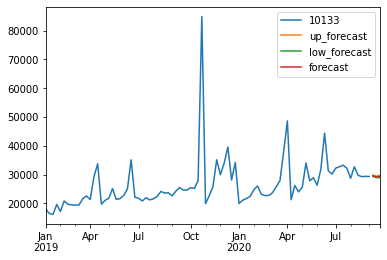

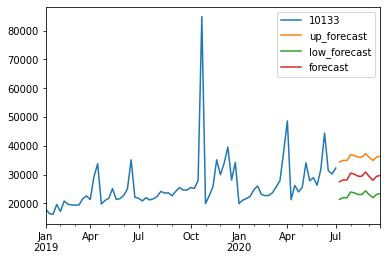

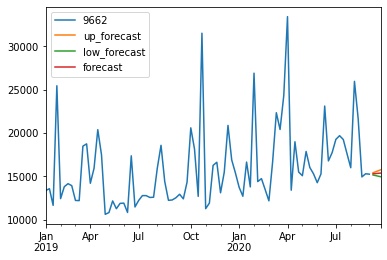

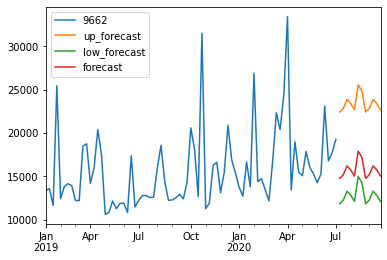

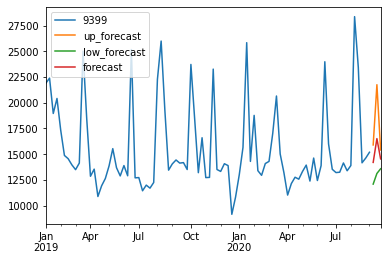

...

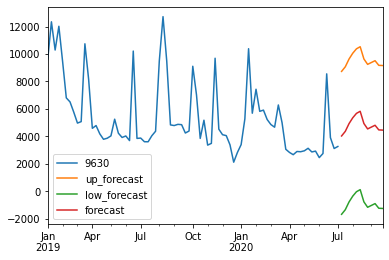

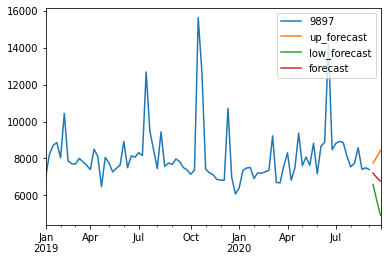

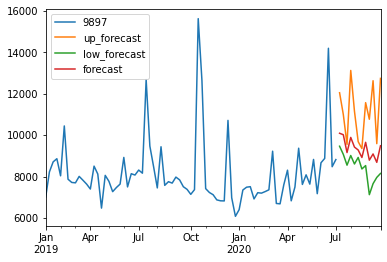

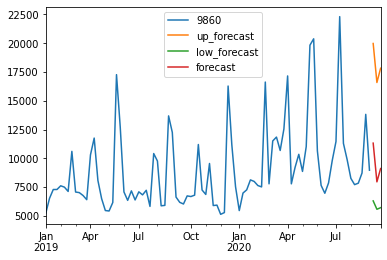

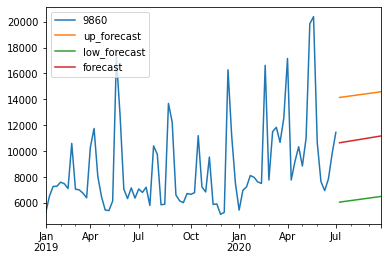

In [9]:
train_on_individual_timeseries(selectedTopProducts)

        Ukedato  Vare_Id   Sales
1758 2017-02-06    14759    15.0
1788 2017-02-13    14759   629.0
1818 2017-02-20    14759  2618.0
1848 2017-02-27    14759  3961.0
1878 2017-03-06    14759  4478.0
...         ...      ...     ...
7344 2020-08-10    14759  3970.0
7377 2020-08-17    14759  4005.0
7409 2020-08-24    14759  4370.0
7441 2020-08-31    14759  5676.0
7473 2020-09-07    14759  4969.0

[188 rows x 3 columns]
Model Number: 1 with model AverageValueNaive in generation 0 of 4
Model Number: 2 with model AverageValueNaive in generation 0 of 4
Model Number: 3 with model AverageValueNaive in generation 0 of 4
Model Number: 4 with model DatepartRegression in generation 0 of 4
Model Number: 5 with model DatepartRegression in generation 0 of 4
Model Number: 6 with model DatepartRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 7 with model DatepartRegression in generation 0 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 7: DatepartRegression
Model Number: 8 with model ETS in generation 0 of 4
Model Number: 9 with model ETS in generation 0 of 4
Model Number: 10 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 10: GLM
Model Number: 11 with model GLM in generation 0 of 4
Model Number: 12 with model GLS in generation 0 of 4
Model Number: 13 with model GLS in generation 0 of 4
Model Number: 14 with model LastValueNaive in generation 0 of 4
Model Number: 15 with model LastValueNaive in generation 0 of 4
Model Number: 16 with model LastValueNaive in generation 0 of 4
Model Number: 17 with model LastValueNaive in generation 0 of 4
Model Number: 18 with m

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 22 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 22: VAR
Model Number: 23 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 23: VAR
Model Number: 24 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 24: VAR
Model Number: 25 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 25: VECM
Model Number: 26 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 26: VECM
Model Number: 27 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 27: VECM
Model Number: 28 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 28: VECM
Model Number: 29 with model WindowRegressio

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 36 with model GLM in generation 0 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 36: GLM
Model Number: 37 with model ETS in generation 0 of 4
Model Number: 38 with model VAR in generation 0 of 4
Template Eval Error: IndexError('tuple index out of range') in model 38: VAR
Model Number: 39 with model VECM in generation 0 of 4
Template Eval Error: LinAlgError('SVD did not converge') in model 39: VECM
Model Number: 40 with model WindowRegression in generation 0 of 4
Model Number: 41 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 41: DatepartRegression
Model Number: 42 with model UnivariateMotif in generation 0 of 4
Model Number: 43 with model MultivariateMotif in generation 0 of 4
Model Number: 44 with model SectionalMotif in generation 0 of 4

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 


Model Number: 45 with model NVAR in generation 0 of 4
Model Number: 46 with model ETS in generation 0 of 4
Model Number: 47 with model MultivariateMotif in generation 0 of 4
Model Number: 48 with model ZeroesNaive in generation 0 of 4
Model Number: 49 with model LastValueNaive in generation 0 of 4
Model Number: 50 with model ETS in generation 0 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 14759 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 51 with model VAR in generation 0 of 4
Template Eval Error: IndexError('tuple index out of range') in model 51: VAR
Model Number: 52 with model MultivariateMotif in generation 0 of 4
Model Number: 53 with model ETS in generation 0 of 4
Model Number: 54 with model GLS in generation 0 of 4
Model Number: 55 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variabl

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 67 with model NVAR in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennae

Model Number: 68 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 68: VAR
Model Number: 69 with model VECM in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 69: VECM
Model Number: 70 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 70: GLM
Model Number: 71 with model MultivariateMotif in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 71: MultivariateMotif
Model Number: 72 with model ETS in generation 0 of 4
Model Number: 73 with model UnivariateMotif in generation 0 of 4
Model Number: 74 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 74: VAR
Model Number: 75 with model ETS in generation

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 82 with model GLS in generation 0 of 4
Model Number: 83 with model AverageValueNaive in generation 0 of 4
Model Number: 84 with model SeasonalNaive in generation 0 of 4
Model Number: 85 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (34)') in model 85: SectionalMotif
Model Number: 86 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 86: VECM
Model Number: 87 with model GLS in generation 0 of 4
Model Number: 88 with model NVAR in generation 0 of 4
Model Number: 89 with model DatepartRegression in generation 0 of 4
Model Number: 90 with model WindowRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names

Model Number: 91 with model UnivariateMotif in generation 0 of 4
Model Number: 92 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 92: VAR
Model Number: 93 with model WindowRegression in generation 0 of 4
Model Number: 94 with model SectionalMotif in generation 0 of 4
Model Number: 95 with model VECM in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 95: VECM
Model Number: 96 with model SeasonalNaive in generation 0 of 4
Template Eval Error: ValueError('Model SeasonalNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 96: SeasonalNaive
Model Number: 97 with model GLS in generation 0 of 4
Model Number: 98 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 98: VECM
Model Number: 99 with model SectionalMotif in generation 0 of 4
Model Number: 100 with model NVAR in generat

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 106 with model SeasonalNaive in generation 1 of 4
Model Number: 107 with model SeasonalNaive in generation 1 of 4
Model Number: 108 with model SeasonalNaive in generation 1 of 4
Model Number: 109 with model SeasonalNaive in generation 1 of 4
Model Number: 110 with model WindowRegression in generation 1 of 4
Model Number: 111 with model WindowRegression in generation 1 of 4
Model Number: 112 with model WindowRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 112: WindowRegression
Model Number: 113 with model UnivariateMotif in generation 1 of 4
Model Number: 114 with model UnivariateMotif in generation 1 of 4
Model Number: 115 with model UnivariateMotif in generation 1 of 4
Model Number: 116 with model UnivariateMotif in generation 1 of 4
Model Number: 117 with model ETS in generation 1 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal componen

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 123 with model DatepartRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 123: DatepartRegression
Model Number: 124 with model AverageValueNaive in generation 1 of 4
Model Number: 125 with model AverageValueNaive in generation 1 of 4
Model Number: 126 with model AverageValueNaive in generation 1 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 126: AverageValueNaive
Model Number: 127 with model ZeroesNaive in generation 1 of 4
Model Number: 128 with model ZeroesNaive in generation 1 of 4
Model Number: 129 with model ZeroesNaive in generation 1 of 4
Model Number: 130 with model GLS in generation 1 of 4
Model Number: 131 with model GLS in generation 1 of 4
Model Number: 132 with model GLS in generation 1 of 4
Model Number: 133 with model MultivariateMotif in generation 1 of 4
Model Number: 134 with model MultivariateMotif in generation 1 of 4
Model Number: 135 wit

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.429e+07, tolerance: 1.829e+04
  model = cd_fast.enet_coordinate_descent(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.429e+07, tolerance: 1.829e+04
  model = cd_fast.enet_coordinate_descent(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/

Model Number: 146 with model SectionalMotif in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennae

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennae

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennae

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennae

Model Number: 147 with model SectionalMotif in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennae

Model Number: 148 with model GLM in generation 1 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 148: GLM
Model Number: 149 with model GLM in generation 1 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 149: GLM
Model Number: 150 with model GLM in generation 1 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 150: GLM
Model Number: 151 with model GLM in generation 1 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 151: GLM
Model Number: 152 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 152: VAR
Model Number: 153 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in m

SinTrend failed with ValueError('array must not contain infs or NaNs') for 2018-08-06 00:00:00 with 0
SinTrend failed with ValueError('array must not contain infs or NaNs') for 2018-08-13 00:00:00 with 0
SinTrend failed with ValueError('array must not contain infs or NaNs') for 2018-08-20 00:00:00 with 0
SinTrend failed with ValueError('array must not contain infs or NaNs') for 2018-08-27 00:00:00 with 0
SinTrend failed with ValueError('array must not contain infs or NaNs') for 2018-09-03 00:00:00 with 0
SinTrend failed with ValueError('array must not contain infs or NaNs') for 2018-09-10 00:00:00 with 0
SinTrend failed with ValueError('array must not contain infs or NaNs') for 2018-09-17 00:00:00 with 0
SinTrend failed with ValueError('array must not contain infs or NaNs') for 2018-09-24 00:00:00 with 0
SinTrend failed with ValueError('array must not contain infs or NaNs') for 2018-10-01 00:00:00 with 0
SinTrend failed with ValueError('array must not contain infs or NaNs') for 2018-10

Model Number: 171 with model SeasonalNaive in generation 2 of 4
Model Number: 172 with model NVAR in generation 2 of 4
Model Number: 173 with model NVAR in generation 2 of 4
Model Number: 174 with model NVAR in generation 2 of 4

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti


Model Number: 175 with model NVAR in generation 2 of 4
Model Number: 176 with model WindowRegression in generation 2 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 176: WindowRegression
Model Number: 177 with model WindowRegression in generation 2 of 4
Model Number: 178 with model WindowRegression in generation 2 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 178: WindowRegression
Model Number: 179 with model ETS in generation 2 of 4
Model Number: 180 with model ETS in generation 2 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 14759 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 181 with model ETS in generation 2 of 4
Model Number: 182 with model ETS in generation 2 of 4
ETS error ValueError('endog must be stri

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Librar

Model Number: 189 with model MultivariateMotif in generation 2 of 4
Model Number: 190 with model MultivariateMotif in generation 2 of 4
Model Number: 191 with model MultivariateMotif in generation 2 of 4
Model Number: 192 with model MultivariateMotif in generation 2 of 4
Model Number: 193 with model AverageValueNaive in generation 2 of 4
Model Number: 194 with model AverageValueNaive in generation 2 of 4
Model Number: 195 with model AverageValueNaive in generation 2 of 4
Model Number: 196 with model GLS in generation 2 of 4
Model Number: 197 with model GLS in generation 2 of 4
Model Number: 198 with model LastValueNaive in generation 2 of 4
Model Number: 199 with model LastValueNaive in generation 2 of 4
Model Number: 200 with model LastValueNaive in generation 2 of 4
Model Number: 201 with model GLM in generation 2 of 4
Model Number: 202 with model GLM in generation 2 of 4
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a bounda

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.429e+07, tolerance: 1.829e+04
  model = cd_fast.enet_coordinate_descent(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.429e+07, tolerance: 1.829e+04
  model = cd_fast.enet_coordinate_descent(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/

Template Eval Error: ValueError('Only gave one variable to VECM') in model 211: VECM
Model Number: 212 with model VECM in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 212: VECM
New Generation: 3 of 4
Model Number: 213 with model SectionalMotif in generation 3 of 4
Model Number: 214 with model SectionalMotif in generation 3 of 4
Model Number: 215 with model SectionalMotif in generation 3 of 4
Model Number: 216 with model SectionalMotif in generation 3 of 4
Model Number: 217 with model UnivariateMotif in generation 3 of 4
SinTrend failed with ValueError('array must not contain infs or NaNs') for 2017-02-06 00:00:00 with 0
SinTrend failed with ValueError('array must not contain infs or NaNs') for 2017-02-13 00:00:00 with 0
SinTrend failed with ValueError('array must not contain infs or NaNs') for 2017-02-20 00:00:00 with 0
SinTrend failed with ValueError('array must not contain infs or NaNs') for 2017-02-27 00:00:00 with 0
SinTrend failed wi

SinTrend failed with ValueError('array must not contain infs or NaNs') for 2019-07-08 00:00:00 with 0
SinTrend failed with ValueError('array must not contain infs or NaNs') for 2019-07-15 00:00:00 with 0
SinTrend failed with ValueError('array must not contain infs or NaNs') for 2019-07-22 00:00:00 with 0
SinTrend failed with ValueError('array must not contain infs or NaNs') for 2019-07-29 00:00:00 with 0
SinTrend failed with ValueError('array must not contain infs or NaNs') for 2019-08-05 00:00:00 with 0
SinTrend failed with ValueError('array must not contain infs or NaNs') for 2019-08-12 00:00:00 with 0
SinTrend failed with ValueError('array must not contain infs or NaNs') for 2019-08-19 00:00:00 with 0
SinTrend failed with ValueError('array must not contain infs or NaNs') for 2019-08-26 00:00:00 with 0
SinTrend failed with ValueError('array must not contain infs or NaNs') for 2019-09-02 00:00:00 with 0
SinTrend failed with ValueError('array must not contain infs or NaNs') for 2019-09

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 231 with model WindowRegression in generation 3 of 4
Model Number: 232 with model MultivariateMotif in generation 3 of 4
Model Number: 233 with model MultivariateMotif in generation 3 of 4
Model Number: 234 with model MultivariateMotif in generation 3 of 4
Model Number: 235 with model MultivariateMotif in generation 3 of 4
Model Number: 236 with model ZeroesNaive in generation 3 of 4
Model Number: 237 with model ZeroesNaive in generation 3 of 4
Model Number: 238 with model ZeroesNaive in generation 3 of 4
Model Number: 239 with model ETS in generation 3 of 4
Model Number: 240 with model ETS in generation 3 of 4
Model Number: 241 with model ETS in generation 3 of 4
Model Number: 242 with model ETS in generation 3 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 14759 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 243 with

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.429e+07, tolerance: 1.829e+04
  model = cd_fast.enet_coordinate_descent(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.429e+07, tolerance: 1.829e+04
  model = cd_fast.enet_coordinate_descent(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/

Model Number: 248 with model DatepartRegression in generation 3 of 4
Model Number: 249 with model GLM in generation 3 of 4
Model Number: 250 with model GLM in generation 3 of 4
Model Number: 251 with model GLM in generation 3 of 4
Model Number: 252 with model GLM in generation 3 of 4
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 252: GLM
Model Number: 253 with model AverageValueNaive in generation 3 of 4
Model Number: 254 with model AverageValueNaive in generation 3 of 4
Model Number: 255 with model AverageValueNaive in generation 3 of 4
Model Number: 256 with model GLS in generation 3 of 4
Model Number: 257 with model GLS in generation 3 of 4
Model Number: 258 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 258: VAR
Model Number: 259 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.274e+07, tolerance: 1.081e+04
  model = cd_fast.enet_coordinate_descent(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packag

Model Number: 266 with model NVAR in generation 4 of 4
Model Number: 267 with model NVAR in generation 4 of 4
Model Number: 268 with model NVAR in generation 4 of 4
Model Number: 269 with model NVAR in generation 4 of 4
Model Number: 270 with model SectionalMotif in generation 4 of 4
Model Number: 271 with model SectionalMotif in generation 4 of 4
Model Number: 272 with model SectionalMotif in generation 4 of 4
Model Number: 273 with model SectionalMotif in generation 4 of 4
Model Number: 274 with model UnivariateMotif in generation 4 of 4
Model Number: 275 with model UnivariateMotif in generation 4 of 4
Model Number: 276 with model UnivariateMotif in generation 4 of 4
Model Number: 277 with model UnivariateMotif in generation 4 of 4
Model Number: 278 with model MultivariateMotif in generation 4 of 4
Model Number: 279 with model MultivariateMotif in generation 4 of 4
Model Number: 280 with model MultivariateMotif in generation 4 of 4
Model Number: 281 with model MultivariateMotif in ge

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 284 with model SeasonalNaive in generation 4 of 4
Model Number: 285 with model SeasonalNaive in generation 4 of 4
Model Number: 286 with model WindowRegression in generation 4 of 4
Template Eval Error: ModuleNotFoundError("No module named 'lightgbm'") in model 286: WindowRegression
Model Number: 287 with model WindowRegression in generation 4 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 287: WindowRegression
Model Number: 288 with model WindowRegression in generation 4 of 4
Model Number: 289 with model ETS in generation 4 of 4
Model Number: 290 with model ETS in generation 4 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 14759 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 291 with model ETS in generation 4 of 4
ETS error ValueError('endog must be strictly posit

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennae

Model Number: 292 with model ETS in generation 4 of 4
Model Number: 293 with model ZeroesNaive in generation 4 of 4
Model Number: 294 with model ZeroesNaive in generation 4 of 4
Model Number: 295 with model ZeroesNaive in generation 4 of 4
Model Number: 296 with model LastValueNaive in generation 4 of 4
Model Number: 297 with model LastValueNaive in generation 4 of 4
Model Number: 298 with model LastValueNaive in generation 4 of 4
Model Number: 299 with model AverageValueNaive in generation 4 of 4
Model Number: 300 with model AverageValueNaive in generation 4 of 4
Model Number: 301 with model AverageValueNaive in generation 4 of 4
Model Number: 302 with model DatepartRegression in generation 4 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 302: DatepartRegression
Model Number: 303 with model DatepartRegression in generation 4 of 4
Model Number: 304 with model DatepartRegression in generation 4 of 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Lib

Model Number: 320 with model Ensemble in generation 5 of 0
Model Number: 321 with model Ensemble in generation 5 of 0
Model Number: 322 with model Ensemble in generation 5 of 0
Model Number: 323 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/ensemble.py:918: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  mods = pd.Series()
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y,

Model Number: 324 with model Ensemble in generation 5 of 0
Model Number: 325 with model Ensemble in generation 5 of 0
Model Number: 326 with model Ensemble in generation 5 of 0
Model Number: 327 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.429e+07, tolerance: 1.829e+04
  model = cd_fast.enet_coordinate_descent(


Validation Round: 1
Model Number: 1 of 50 with model Ensemble for Validation 1
1 - Ensemble with avg smape 22.93: 
Model Number: 2 of 50 with model Ensemble for Validation 1
2 - Ensemble with avg smape 22.62: 
Model Number: 3 of 50 with model Ensemble for Validation 1
3 - Ensemble with avg smape 22.62: 
Model Number: 4 of 50 with model Ensemble for Validation 1
4 - Ensemble with avg smape 24.4: 
Model Number: 5 of 50 with model NVAR for Validation 1
5 - NVAR with avg smape 30.29: 
Model Number: 6 of 50 with model Ensemble for Validation 1
6 - Ensemble with avg smape 25.7: 
Model Number: 7 of 50 with model NVAR for Validation 1
7 - NVAR with avg smape 25.7: 
Model Number: 8 of 50 with model NVAR for Validation 1
8 - NVAR with avg smape 25.7: 
Model Number: 9 of 50 with model SectionalMotif for Validation 1
9 - SectionalMotif with avg smape 16.57: 
Model Number: 10 of 50 with model UnivariateMotif for Validation 1
10 - UnivariateMotif with avg smape 20.32: 
Model Number: 11 of 50 with mo

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

11 - SectionalMotif with avg smape 26.8: 
Model Number: 12 of 50 with model SectionalMotif for Validation 1
12 - SectionalMotif with avg smape 26.8: 
Model Number: 13 of 50 with model UnivariateMotif for Validation 1
13 - UnivariateMotif with avg smape 27.85: 
Model Number: 14 of 50 with model MultivariateMotif for Validation 1
14 - MultivariateMotif with avg smape 27.9: 
Model Number: 15 of 50 with model SeasonalNaive for Validation 1
15 - SeasonalNaive with avg smape 27.76: 
Model Number: 16 of 50 with model NVAR for Validation 1
16 - NVAR with avg smape 23.23: 
Model Number: 17 of 50 with model NVAR for Validation 1
17 - NVAR with avg smape 23.23: 
Model Number: 18 of 50 with model SectionalMotif for Validation 1
18 - SectionalMotif with avg smape 13.6: 
Model Number: 19 of 50 with model SeasonalNaive for Validation 1
19 - SeasonalNaive with avg smape 26.81: 
Model Number: 20 of 50 with model SeasonalNaive for Validation 1
20 - SeasonalNaive with avg smape 25.09: 
Model Number: 21 o

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 


Model Number: 26 of 50 with model SeasonalNaive for Validation 1
26 - SeasonalNaive with avg smape 26.53: 
Model Number: 27 of 50 with model ETS for Validation 1
27 - ETS with avg smape 18.86: 
Model Number: 28 of 50 with model ETS for Validation 1
28 - ETS with avg smape 19.3: 
Model Number: 29 of 50 with model ZeroesNaive for Validation 1
29 - ZeroesNaive with avg smape 22.97: 
Model Number: 30 of 50 with model ZeroesNaive for Validation 1
30 - ZeroesNaive with avg smape 22.97: 
Model Number: 31 of 50 with model ETS for Validation 1
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 14759 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
31 - ETS with avg smape 20.2: 
Model Number: 32 of 50 with model LastValueNaive for Validation 1
32 - LastValueNaive with avg smape 35.55: 
Model Number: 33 of 50 with model AverageValueNaive for Validation 1
33 - Average

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

37 - DatepartRegression with avg smape 20.97: 
Model Number: 38 of 50 with model GLM for Validation 1
38 - GLM with avg smape 24.31: 
Model Number: 39 of 50 with model ETS for Validation 1
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 14759 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
39 - ETS with avg smape 24.29: 
Model Number: 40 of 50 with model GLM for Validation 1
40 - GLM with avg smape 10.38: 
Model Number: 41 of 50 with model MultivariateMotif for Validation 1
41 - MultivariateMotif with avg smape 14.14: 
Model Number: 42 of 50 with model MultivariateMotif for Validation 1
42 - MultivariateMotif with avg smape 10.2: 
Model Number: 43 of 50 with model MultivariateMotif for Validation 1
43 - MultivariateMotif with avg smape 24.56: 
Model Number: 44 of 50 with model LastValueNaive for Validation 1
44 - LastValueNaive with avg smape 26.36: 
Mo

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.396e+07, tolerance: 1.814e+04
  model = cd_fast.enet_coordinate_descent(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.396e+07, tolerance: 1.814e+04
  model = cd_fast.enet_coordinate_descent(
/Users/simennaess/Library/Python/3.8/lib/python/site-packa

2 - Ensemble with avg smape 32.35: 
Model Number: 3 of 50 with model Ensemble for Validation 2
3 - Ensemble with avg smape 32.35: 
Model Number: 4 of 50 with model Ensemble for Validation 2
4 - Ensemble with avg smape 30.9: 
Model Number: 5 of 50 with model NVAR for Validation 2
5 - NVAR with avg smape 26.28: 
Model Number: 6 of 50 with model Ensemble for Validation 2
6 - Ensemble with avg smape 27.74: 
Model Number: 7 of 50 with model NVAR for Validation 2
7 - NVAR with avg smape 27.74: 
Model Number: 8 of 50 with model NVAR for Validation 2
8 - NVAR with avg smape 27.74: 
Model Number: 9 of 50 with model SectionalMotif for Validation 2
9 - SectionalMotif with avg smape 39.22: 
Model Number: 10 of 50 with model UnivariateMotif for Validation 2
10 - UnivariateMotif with avg smape 32.01: 
Model Number: 11 of 50 with model SectionalMotif for Validation 2
11 - SectionalMotif with avg smape 29.25: 
Model Number: 12 of 50 with model SectionalMotif for Validation 2
12 - SectionalMotif with a

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

13 - UnivariateMotif with avg smape 27.9: 
Model Number: 14 of 50 with model MultivariateMotif for Validation 2
14 - MultivariateMotif with avg smape 28.98: 
Model Number: 15 of 50 with model SeasonalNaive for Validation 2
15 - SeasonalNaive with avg smape 31.78: 
Model Number: 16 of 50 with model NVAR for Validation 2
16 - NVAR with avg smape 26.28: 
Model Number: 17 of 50 with model NVAR for Validation 2
17 - NVAR with avg smape 26.28: 
Model Number: 18 of 50 with model SectionalMotif for Validation 2
18 - SectionalMotif with avg smape 47.49: 
Model Number: 19 of 50 with model SeasonalNaive for Validation 2
19 - SeasonalNaive with avg smape 30.64: 
Model Number: 20 of 50 with model SeasonalNaive for Validation 2
20 - SeasonalNaive with avg smape 30.94: 
Model Number: 21 of 50 with model SeasonalNaive for Validation 2
21 - SeasonalNaive with avg smape 29.64: 
Model Number: 22 of 50 with model WindowRegression for Validation 2
22 - WindowRegression with avg smape 32.52: 
Model Number: 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

26 - SeasonalNaive with avg smape 29.89: 
Model Number: 27 of 50 with model ETS for Validation 2
27 - ETS with avg smape 31.11: 
Model Number: 28 of 50 with model ETS for Validation 2
28 - ETS with avg smape 30.72: 
Model Number: 29 of 50 with model ZeroesNaive for Validation 2
29 - ZeroesNaive with avg smape 31.75: 
Model Number: 30 of 50 with model ZeroesNaive for Validation 2
30 - ZeroesNaive with avg smape 31.75: 
Model Number: 31 of 50 with model ETS for Validation 2
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 14759 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
31 - ETS with avg smape 28.13: 
Model Number: 32 of 50 with model LastValueNaive for Validation 2
32 - LastValueNaive with avg smape 41.66: 
Model Number: 33 of 50 with model AverageValueNaive for Validation 2
33 - AverageValueNaive with avg smape 27.55: 
Model Number: 34 of 50 with mo

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

37 - DatepartRegression with avg smape 27.73: 
Model Number: 38 of 50 with model GLM for Validation 2
38 - GLM with avg smape 27.54: 
Model Number: 39 of 50 with model ETS for Validation 2
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 14759 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
39 - ETS with avg smape 27.55: 
Model Number: 40 of 50 with model GLM for Validation 2
40 - GLM with avg smape 36.49: 
Model Number: 41 of 50 with model MultivariateMotif for Validation 2
41 - MultivariateMotif with avg smape 36.67: 
Model Number: 42 of 50 with model MultivariateMotif for Validation 2
42 - MultivariateMotif with avg smape 36.18: 
Model Number: 43 of 50 with model MultivariateMotif for Validation 2
43 - MultivariateMotif with avg smape 27.45: 
Model Number: 44 of 50 with model LastValueNaive for Validation 2
44 - LastValueNaive with avg smape 23.82: 
M

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.849e+07, tolerance: 1.357e+04
  model = cd_fast.enet_coordinate_descent(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.849e+07, tolerance: 1.357e+04
  model = cd_fast.enet_coordinate_descent(
/Users/simennaess/Library/Python/3.8/lib/python/site-packa

Model Number: 1 with model AverageValueNaive in generation 0 of 4
Model Number: 2 with model AverageValueNaive in generation 0 of 4
Model Number: 3 with model AverageValueNaive in generation 0 of 4
Model Number: 4 with model DatepartRegression in generation 0 of 4
Model Number: 5 with model DatepartRegression in generation 0 of 4
Model Number: 6 with model DatepartRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 7 with model DatepartRegression in generation 0 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 7: DatepartRegression
Model Number: 8 with model ETS in generation 0 of 4
Model Number: 9 with model ETS in generation 0 of 4
Model Number: 10 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 10: GLM
Model Number: 11 with model GLM in generation 0 of 4
Model Number: 12 with model GLS in generation 0 of 4
Model Number: 13 with model GLS in generation 0 of 4
Model Number: 14 with model LastValueNaive in generation 0 of 4
Model Number: 15 with model LastValueNaive in generation 0 of 4
Model Number: 16 with model LastValueNaive in generation 0 of 4
Model Number: 17 with model LastValueNaive in generation 0 of 4
Model Number: 18 with m

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 20 with model SeasonalNaive in generation 0 of 4
Model Number: 21 with model SeasonalNaive in generation 0 of 4
Model Number: 22 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 22: VAR
Model Number: 23 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 23: VAR
Model Number: 24 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 24: VAR
Model Number: 25 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 25: VECM
Model Number: 26 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 26: VECM
Model Number: 27 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 27: VECM
Model Number: 28 with model VECM in generation 0 of 4
T

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 38 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 38: VAR
Model Number: 39 with model VECM in generation 0 of 4
Template Eval Error: LinAlgError('SVD did not converge') in model 39: VECM
Model Number: 40 with model WindowRegression in generation 0 of 4
Model Number: 41 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 41: DatepartRegression
Model Number: 42 with model UnivariateMotif in generation 0 of 4
Model Number: 43 with model MultivariateMotif in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 44 with model SectionalMotif in generation 0 of 4
Model Number: 45 with model NVAR in generation 0 of 4
Model Number: 46 with model ETS in generation 0 of 4
Model Number: 47 with model MultivariateMotif in generation 0 of 4
Model Number: 48 with model ZeroesNaive in generation 0 of 4
Model Number: 49 with model LastValueNaive in generation 0 of 4
Model Number: 50 with model ETS in generation 0 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 14759 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 51 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 51: VAR
Model Number: 52 with model MultivariateMotif in generation 0 of 4
Model Number: 53 with model ETS in generation 0 of 4
Model Number: 54 with model GLS in generation 0 of 4
Model Number: 55 with model VAR in gene

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 67 with model NVAR in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennae

Model Number: 68 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 68: VAR
Model Number: 69 with model VECM in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 69: VECM
Model Number: 70 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 70: GLM
Model Number: 71 with model MultivariateMotif in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 71: MultivariateMotif
Model Number: 72 with model ETS in generation 0 of 4
Model Number: 73 with model UnivariateMotif in generation 0 of 4
Model Number: 74 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 74: VAR
Model Number: 75 with model ETS in generation

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 80 with model UnivariateMotif in generation 0 of 4
Model Number: 81 with model UnivariateMotif in generation 0 of 4
Model Number: 82 with model GLS in generation 0 of 4
Model Number: 83 with model AverageValueNaive in generation 0 of 4
Model Number: 84 with model SeasonalNaive in generation 0 of 4
Model Number: 85 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (29)') in model 85: SectionalMotif
Model Number: 86 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 86: VECM
Model Number: 87 with model GLS in generation 0 of 4
Model Number: 88 with model NVAR in generation 0 of 4
Model Number: 89 with model DatepartRegression in generation 0 of 4
Model Number: 90 with model WindowRegression in generation 0 of 4
Model Number: 91 with model UnivariateMotif in generation 0 of 4
Model Number: 92 with model VAR in generation 0 of 4

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names


Template Eval Error: ValueError('Only gave one variable to VAR') in model 92: VAR
Model Number: 93 with model WindowRegression in generation 0 of 4
Model Number: 94 with model SectionalMotif in generation 0 of 4
Model Number: 95 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 95: VECM
Model Number: 96 with model SeasonalNaive in generation 0 of 4
Template Eval Error: ValueError('Model SeasonalNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 96: SeasonalNaive
Model Number: 97 with model GLS in generation 0 of 4
Model Number: 98 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 98: VECM
Model Number: 99 with model SectionalMotif in generation 0 of 4
Model Number: 100 with model NVAR in generation 0 of 4
Model Number: 101 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 107 with model ETS in generation 1 of 4
Model Number: 108 with model ETS in generation 1 of 4
Model Number: 109 with model ETS in generation 1 of 4
Model Number: 110 with model SeasonalNaive in generation 1 of 4
Model Number: 111 with model SeasonalNaive in generation 1 of 4
Model Number: 112 with model SeasonalNaive in generation 1 of 4
Template Eval Error: ValueError('Model SeasonalNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 112: SeasonalNaive
Model Number: 113 with model SeasonalNaive in generation 1 of 4
Model Number: 114 with model ZeroesNaive in generation 1 of 4
Model Number: 115 with model ZeroesNaive in generation 1 of 4
Model Number: 116 with model ZeroesNaive in generation 1 of 4
Model Number: 117 with model GLS in generation 1 of 4
Model Number: 118 with model GLS in generation 1 of 4
Model Number: 119 with model GLS in generation 1 of 4
Model Number: 120 with model AverageValueNaive in generation 1 of 4
Model Number: 121 wi

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 125 with model DatepartRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 125: DatepartRegression
Model Number: 126 with model NVAR in generation 1 of 4
Model Number: 127 with model NVAR in generation 1 of 4
Model Number: 128 with model NVAR in generation 1 of 4
Model Number: 129 with model NVAR in generation 1 of 4
Model Number: 130 with model LastValueNaive in generation 1 of 4
Model Number: 131 with model LastValueNaive in generation 1 of 4
Model Number: 132 with model LastValueNaive in generation 1 of 4


[Parallel(n_jobs=-2)]: Done 1000 out of 1000 | elapsed:    0.5s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 432 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 782 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 1000 out of 1000 | elapsed:    0.0s finished
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self

Model Number: 133 with model WindowRegression in generation 1 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 133: WindowRegression
Model Number: 134 with model WindowRegression in generation 1 of 4
Template Eval Error: ValueError("Input contains NaN, infinity or a value too large for dtype('float64').") in model 134: WindowRegression
Model Number: 135 with model WindowRegression in generation 1 of 4
Model Number: 136 with model MultivariateMotif in generation 1 of 4
Model Number: 137 with model MultivariateMotif in generation 1 of 4
Model Number: 138 with model MultivariateMotif in generation 1 of 4
Model Number: 139 with model MultivariateMotif in generation 1 of 4
Model Number: 140 with model UnivariateMotif in generation 1 of 4
Model Number: 141 with model UnivariateMotif in generation 1 of 4
Model Number: 142 with model UnivariateMotif in generation 1 of 4
Model Number: 143 with model UnivariateMotif in generation 1 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Lib

Model Number: 152 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 152: VAR
Model Number: 153 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 153: VAR
Model Number: 154 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 154: VAR
Model Number: 155 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 155: VAR
Model Number: 156 with model VECM in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 156: VECM
Model Number: 157 with model VECM in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 157: VECM
Model Number: 158 with model VECM in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 158: VECM
Model Number: 159 with model VEC

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 188 with model WindowRegression in generation 2 of 4
Model Number: 189 with model UnivariateMotif in generation 2 of 4
Model Number: 190 with model UnivariateMotif in generation 2 of 4
Model Number: 191 with model UnivariateMotif in generation 2 of 4
Model Number: 192 with model UnivariateMotif in generation 2 of 4
Model Number: 193 with model MultivariateMotif in generation 2 of 4
Model Number: 194 with model MultivariateMotif in generation 2 of 4
Model Number: 195 with model MultivariateMotif in generation 2 of 4
Model Number: 196 with model MultivariateMotif in generation 2 of 4
Model Number: 197 with model SectionalMotif in generation 2 of 4
Model Number: 198 with model SectionalMotif in generation 2 of 4
Model Number: 199 with model SectionalMotif in generation 2 of 4
Model Number: 200 with model SectionalMotif in generation 2 of 4
Model Number: 201 with model GLM in generation 2 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, est

[Parallel(n_jobs=-2)]: Done 1000 out of 1000 | elapsed:    0.5s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 432 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 782 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 1000 out of 1000 | elapsed:    0.0s finished
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1346: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:516: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1346: RuntimeWarning: divide by zero encountered 

Model Number: 205 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 205: VAR
Model Number: 206 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 206: VAR
Model Number: 207 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 207: VAR
Model Number: 208 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 208: VAR
Model Number: 209 with model VECM in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 209: VECM
Model Number: 210 with model VECM in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 210: VECM
Model Number: 211 with model VECM in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 211: VECM
Model Number: 212 with model VEC

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simenna

Model Number: 233 with model NVAR in generation 3 of 4
Model Number: 234 with model NVAR in generation 3 of 4
Model Number: 235 with model NVAR in generation 3 of 4
Model Number: 236 with model NVAR in generation 3 of 4
Model Number: 237 with model GLM in generation 3 of 4
Model Number: 238 with model GLM in generation 3 of 4
Model Number: 239 with model GLM in generation 3 of 4
Model Number: 240 with model GLM in generation 3 of 4
Model Number: 241 with model WindowRegression in generation 3 of 4
Model Number: 242 with model WindowRegression in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 243 with model WindowRegression in generation 3 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 243: WindowRegression
Model Number: 244 with model MultivariateMotif in generation 3 of 4
Model Number: 245 with model MultivariateMotif in generation 3 of 4
Model Number: 246 with model MultivariateMotif in generation 3 of 4
Model Number: 247 with model MultivariateMotif in generation 3 of 4


[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed:    0.2s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 ta

Model Number: 248 with model UnivariateMotif in generation 3 of 4
Model Number: 249 with model UnivariateMotif in generation 3 of 4
Model Number: 250 with model UnivariateMotif in generation 3 of 4
Model Number: 251 with model UnivariateMotif in generation 3 of 4
Model Number: 252 with model SectionalMotif in generation 3 of 4
Model Number: 253 with model SectionalMotif in generation 3 of 4
Model Number: 254 with model SectionalMotif in generation 3 of 4
Model Number: 255 with model SectionalMotif in generation 3 of 4
Model Number: 256 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 256: VAR
Model Number: 257 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 257: VAR
Model Number: 258 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 258: VAR
Model Number: 259 with model VAR in generation 3 of 4
Template Ev

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: divide by zero encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 288 with model AverageValueNaive in generation 4 of 4
Model Number: 289 with model AverageValueNaive in generation 4 of 4
Model Number: 290 with model AverageValueNaive in generation 4 of 4
Model Number: 291 with model UnivariateMotif in generation 4 of 4
Model Number: 292 with model UnivariateMotif in generation 4 of 4
Model Number: 293 with model UnivariateMotif in generation 4 of 4
Model Number: 294 with model UnivariateMotif in generation 4 of 4
Model Number: 295 with model NVAR in generation 4 of 4
Model Number: 296 with model NVAR in generation 4 of 4
Model Number: 297 with model NVAR in generation 4 of 4
Model Number: 298 with model NVAR in generation 4 of 4
Model Number: 299 with model GLM in generation 4 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 299: GLM
Model Number: 300 with model GLM in generation 4 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/ensemble.py:918: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  mods = pd.Series()
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/

Model Number: 322 with model Ensemble in generation 5 of 0
Model Number: 323 with model Ensemble in generation 5 of 0


[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 432 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-2)]: Done 782 tasks      | elapsed:    0.4s


Model Number: 324 with model Ensemble in generation 5 of 0
Model Number: 325 with model Ensemble in generation 5 of 0
Validation Round: 1
Model Number: 1 of 49 with model Ensemble for Validation 1


[Parallel(n_jobs=-2)]: Done 1000 out of 1000 | elapsed:    0.5s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 432 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 782 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 1000 out of 1000 | elapsed:    0.0s finished
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self

1 - Ensemble with avg smape 13.83: 
Model Number: 2 of 49 with model Ensemble for Validation 1
2 - Ensemble with avg smape 14.51: 
Model Number: 3 of 49 with model Ensemble for Validation 1
3 - Ensemble with avg smape 19.08: 
Model Number: 4 of 49 with model Ensemble for Validation 1
4 - Ensemble with avg smape 18.61: 
Model Number: 5 of 49 with model Ensemble for Validation 1
5 - Ensemble with avg smape 18.61: 
Model Number: 6 of 49 with model ETS for Validation 1
6 - ETS with avg smape 14.44: 
Model Number: 7 of 49 with model LastValueNaive for Validation 1
7 - LastValueNaive with avg smape 29.73: 
Model Number: 8 of 49 with model LastValueNaive for Validation 1
8 - LastValueNaive with avg smape 29.73: 
Model Number: 9 of 49 with model ETS for Validation 1
9 - ETS with avg smape 15.94: 
Model Number: 10 of 49 with model SeasonalNaive for Validation 1
10 - SeasonalNaive with avg smape 16.35: 
Model Number: 11 of 49 with model ETS for Validation 1
11 - ETS with avg smape 13.1: 
Model N

[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 432 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-2)]: Done 782 tasks      | elapsed:    0.4s


15 - DatepartRegression with avg smape 21.64: 
Model Number: 16 of 49 with model ZeroesNaive for Validation 1
16 - ZeroesNaive with avg smape 29.73: 
Model Number: 17 of 49 with model ZeroesNaive for Validation 1
17 - ZeroesNaive with avg smape 29.73: 
Model Number: 18 of 49 with model GLS for Validation 1
18 - GLS with avg smape 22.92: 
Model Number: 19 of 49 with model ETS for Validation 1
19 - ETS with avg smape 12.73: 
Model Number: 20 of 49 with model ZeroesNaive for Validation 1
20 - ZeroesNaive with avg smape 16.14: 
Model Number: 21 of 49 with model LastValueNaive for Validation 1
21 - LastValueNaive with avg smape 12.43: 
Model Number: 22 of 49 with model SeasonalNaive for Validation 1
22 - SeasonalNaive with avg smape 18.85: 
Model Number: 23 of 49 with model ZeroesNaive for Validation 1
23 - ZeroesNaive with avg smape 12.7: 
Model Number: 24 of 49 with model GLM for Validation 1
24 - GLM with avg smape 11.58: 
Model Number: 25 of 49 with model SectionalMotif for Validation 1

[Parallel(n_jobs=-2)]: Done 1000 out of 1000 | elapsed:    0.5s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 432 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 782 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 1000 out of 1000 | elapsed:    0.0s finished
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self

26 - AverageValueNaive with avg smape 15.5: 
Model Number: 27 of 49 with model SectionalMotif for Validation 1
27 - SectionalMotif with avg smape 12.13: 
Model Number: 28 of 49 with model AverageValueNaive for Validation 1
28 - AverageValueNaive with avg smape 14.34: 
Model Number: 29 of 49 with model SeasonalNaive for Validation 1
29 - SeasonalNaive with avg smape 11.22: 
Model Number: 30 of 49 with model SeasonalNaive for Validation 1
30 - SeasonalNaive with avg smape 12.28: 
Model Number: 31 of 49 with model SectionalMotif for Validation 1
31 - SectionalMotif with avg smape 17.63: 
Model Number: 32 of 49 with model AverageValueNaive for Validation 1
32 - AverageValueNaive with avg smape 10.99: 
Model Number: 33 of 49 with model UnivariateMotif for Validation 1
33 - UnivariateMotif with avg smape 10.7: 
Model Number: 34 of 49 with model AverageValueNaive for Validation 1
34 - AverageValueNaive with avg smape 10.66: 
Model Number: 35 of 49 with model DatepartRegression for Validation 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

37 - DatepartRegression with avg smape 11.83: 
Model Number: 38 of 49 with model LastValueNaive for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennae

38 - LastValueNaive with avg smape 12.24: 
Model Number: 39 of 49 with model GLS for Validation 1
39 - GLS with avg smape 10.84: 
Model Number: 40 of 49 with model GLS for Validation 1
40 - GLS with avg smape 10.84: 
Model Number: 41 of 49 with model LastValueNaive for Validation 1
41 - LastValueNaive with avg smape 31.01: 
Model Number: 42 of 49 with model GLM for Validation 1
42 - GLM with avg smape 16.67: 
Model Number: 43 of 49 with model GLM for Validation 1
43 - GLM with avg smape 10.62: 
Model Number: 44 of 49 with model WindowRegression for Validation 1
44 - WindowRegression with avg smape 14.7: 
Model Number: 45 of 49 with model AverageValueNaive for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_v

45 - AverageValueNaive with avg smape 13.03: 
Model Number: 46 of 49 with model MultivariateMotif for Validation 1
46 - MultivariateMotif with avg smape 14.65: 
Model Number: 47 of 49 with model UnivariateMotif for Validation 1
47 - UnivariateMotif with avg smape 13.85: 
Model Number: 48 of 49 with model GLS for Validation 1
48 - GLS with avg smape 13.63: 
Model Number: 49 of 49 with model GLS for Validation 1
49 - GLS with avg smape 14.3: 
Validation Round: 2
Model Number: 1 of 49 with model Ensemble for Validation 2
1 - Ensemble with avg smape 21.31: 
Model Number: 2 of 49 with model Ensemble for Validation 2
2 - Ensemble with avg smape 21.31: 
Model Number: 3 of 49 with model Ensemble for Validation 2
3 - Ensemble with avg smape 17.69: 
Model Number: 4 of 49 with model Ensemble for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


4 - Ensemble with avg smape 17.8: 
Model Number: 5 of 49 with model Ensemble for Validation 2
5 - Ensemble with avg smape 17.8: 
Model Number: 6 of 49 with model ETS for Validation 2
6 - ETS with avg smape 20.7: 
Model Number: 7 of 49 with model LastValueNaive for Validation 2
7 - LastValueNaive with avg smape 15.7: 
Model Number: 8 of 49 with model LastValueNaive for Validation 2
8 - LastValueNaive with avg smape 15.7: 
Model Number: 9 of 49 with model ETS for Validation 2
9 - ETS with avg smape 22.08: 
Model Number: 10 of 49 with model SeasonalNaive for Validation 2
10 - SeasonalNaive with avg smape 18.9: 
Model Number: 11 of 49 with model ETS for Validation 2
11 - ETS with avg smape 27.64: 
Model Number: 12 of 49 with model SeasonalNaive for Validation 2
12 - SeasonalNaive with avg smape 17.19: 
Model Number: 13 of 49 with model ETS for Validation 2
13 - ETS with avg smape 27.75: 
Model Number: 14 of 49 with model ZeroesNaive for Validation 2
14 - ZeroesNaive with avg smape 18.47: 


[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 432 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-2)]: Done 782 tasks      | elapsed:    0.4s


15 - DatepartRegression with avg smape 18.03: 
Model Number: 16 of 49 with model ZeroesNaive for Validation 2
16 - ZeroesNaive with avg smape 15.7: 
Model Number: 17 of 49 with model ZeroesNaive for Validation 2
17 - ZeroesNaive with avg smape 15.7: 
Model Number: 18 of 49 with model GLS for Validation 2
18 - GLS with avg smape 15.02: 
Model Number: 19 of 49 with model ETS for Validation 2
19 - ETS with avg smape 19.81: 
Model Number: 20 of 49 with model ZeroesNaive for Validation 2
20 - ZeroesNaive with avg smape 25.79: 
Model Number: 21 of 49 with model LastValueNaive for Validation 2
21 - LastValueNaive with avg smape 21.5: 
Model Number: 22 of 49 with model SeasonalNaive for Validation 2
22 - SeasonalNaive with avg smape 15.4: 
Model Number: 23 of 49 with model ZeroesNaive for Validation 2
23 - ZeroesNaive with avg smape 20.91: 
Model Number: 24 of 49 with model GLM for Validation 2
24 - GLM with avg smape 18.21: 
Model Number: 25 of 49 with model SectionalMotif for Validation 2
25

[Parallel(n_jobs=-2)]: Done 1000 out of 1000 | elapsed:    0.5s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 432 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 782 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 1000 out of 1000 | elapsed:    0.0s finished
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self

26 - AverageValueNaive with avg smape 15.6: 
Model Number: 27 of 49 with model SectionalMotif for Validation 2
27 - SectionalMotif with avg smape 16.68: 
Model Number: 28 of 49 with model AverageValueNaive for Validation 2
28 - AverageValueNaive with avg smape 24.58: 
Model Number: 29 of 49 with model SeasonalNaive for Validation 2
29 - SeasonalNaive with avg smape 21.67: 
Model Number: 30 of 49 with model SeasonalNaive for Validation 2
30 - SeasonalNaive with avg smape 19.48: 
Model Number: 31 of 49 with model SectionalMotif for Validation 2
31 - SectionalMotif with avg smape 15.37: 
Model Number: 32 of 49 with model AverageValueNaive for Validation 2
32 - AverageValueNaive with avg smape 18.37: 
Model Number: 33 of 49 with model UnivariateMotif for Validation 2
33 - UnivariateMotif with avg smape 17.55: 
Model Number: 34 of 49 with model AverageValueNaive for Validation 2
34 - AverageValueNaive with avg smape 22.1: 
Model Number: 35 of 49 with model DatepartRegression for Validation 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

37 - DatepartRegression with avg smape 15.56: 
Model Number: 38 of 49 with model LastValueNaive for Validation 2
38 - LastValueNaive with avg smape 25.36: 
Model Number: 39 of 49 with model GLS for Validation 2
39 - GLS with avg smape 21.37: 
Model Number: 40 of 49 with model GLS for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennae

40 - GLS with avg smape 21.37: 
Model Number: 41 of 49 with model LastValueNaive for Validation 2
41 - LastValueNaive with avg smape 16.81: 
Model Number: 42 of 49 with model GLM for Validation 2
42 - GLM with avg smape 22.06: 
Model Number: 43 of 49 with model GLM for Validation 2
43 - GLM with avg smape 22.88: 
Model Number: 44 of 49 with model WindowRegression for Validation 2
44 - WindowRegression with avg smape 14.66: 
Model Number: 45 of 49 with model AverageValueNaive for Validation 2
45 - AverageValueNaive with avg smape 14.63: 
Model Number: 46 of 49 with model MultivariateMotif for Validation 2
46 - MultivariateMotif with avg smape 17.23: 
Model Number: 47 of 49 with model UnivariateMotif for Validation 2
47 - UnivariateMotif with avg smape 14.93: 
Model Number: 48 of 49 with model GLS for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multi

48 - GLS with avg smape 14.15: 
Model Number: 49 of 49 with model GLS for Validation 2
49 - GLS with avg smape 12.75: 
Initiated AutoTS object with best model: 
Ensemble
{}
{'model_name': 'BestN', 'model_count': 5, 'model_metric': 'mixed_metric', 'models': {'315222bbb14d4a02dba19551e6fd8d9e': {'Model': 'ETS', 'ModelParameters': '{"damped_trend": false, "trend": "additive", "seasonal": null, "seasonal_periods": null}', 'TransformationParameters': '{"fillna": "IterativeImputer", "transformations": {"0": "Detrend", "1": "Detrend", "2": "SeasonalDifference"}, "transformation_params": {"0": {"model": "Linear", "phi": 1, "window": null}, "1": {"model": "GLS", "phi": 1, "window": null}, "2": {"lag_1": 28, "method": "Mean"}}}'}, '52a3dad8f1ebabb7cb88eb28263b4ec0': {'Model': 'ZeroesNaive', 'ModelParameters': '{}', 'TransformationParameters': '{"fillna": "pchip", "transformations": {"0": "PowerTransformer", "1": "Detrend", "2": "SeasonalDifference", "3": "Round"}, "transformation_params": {"0": 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 6 with model DatepartRegression in generation 0 of 4
Model Number: 7 with model DatepartRegression in generation 0 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 7: DatepartRegression
Model Number: 8 with model ETS in generation 0 of 4
Model Number: 9 with model ETS in generation 0 of 4
Model Number: 10 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 10: GLM
Model Number: 11 with model GLM in generation 0 of 4
Model Number: 12 with model GLS in generation 0 of 4
Model Number: 13 with model GLS in generation 0 of 4
Model Number: 14 with model LastValueNaive in generation 0 of 4
Model Number: 15 with model LastValueNaive in generation 0 of 4
Model Number: 16 with model LastValueNaive in generation 0 of 4
Model Number: 17 wit

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 22 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 22: VAR
Model Number: 23 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 23: VAR
Model Number: 24 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 24: VAR
Model Number: 25 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 25: VECM
Model Number: 26 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 26: VECM
Model Number: 27 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 27: VECM
Model Number: 28 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 28: VECM
Model Number: 29 with model WindowRegressio

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 36 with model GLM in generation 0 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 36: GLM
Model Number: 37 with model ETS in generation 0 of 4
Model Number: 38 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 38: VAR
Model Number: 39 with model VECM in generation 0 of 4
Template Eval Error: LinAlgError('SVD did not converge') in model 39: VECM
Model Number: 40 with model WindowRegression in generation 0 of 4
Model Number: 41 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 41: DatepartRegression
Model Number: 42 with model UnivariateMotif in generation 0 of 4
Model Number: 43 with model MultivariateMotif in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 44 with model SectionalMotif in generation 0 of 4
Model Number: 45 with model NVAR in generation 0 of 4
Model Number: 46 with model ETS in generation 0 of 4
Model Number: 47 with model MultivariateMotif in generation 0 of 4
Model Number: 48 with model ZeroesNaive in generation 0 of 4
Model Number: 49 with model LastValueNaive in generation 0 of 4
Model Number: 50 with model ETS in generation 0 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9901 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 51 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 51: VAR
Model Number: 52 with model MultivariateMotif in generation 0 of 4
Model Number: 53 with model ETS in generation 0 of 4
Model Number: 54 with model GLS in generation 0 of 4
Model Number: 55 with model VAR in gener

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 67 with model NVAR in generation 0 of 4
Model Number: 68 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 68: VAR
Model Number: 69 with model VECM in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 69: VECM
Model Number: 70 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 70: GLM
Model Number: 71 with model MultivariateMotif in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 71: MultivariateMotif
Model Number: 72 with model ETS in generation 0 of 4
Model Number: 73 with model UnivariateMotif in generation 0 of 4
Model Number: 74 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 79 with model GLM in generation 0 of 4
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 79: GLM
Model Number: 80 with model UnivariateMotif in generation 0 of 4
Model Number: 81 with model UnivariateMotif in generation 0 of 4
Model Number: 82 with model GLS in generation 0 of 4
Model Number: 83 with model AverageValueNaive in generation 0 of 4
Model Number: 84 with model SeasonalNaive in generation 0 of 4
Model Number: 85 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (48)') in model 85: SectionalMotif
Model Number: 86 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 86: VECM
Model Number: 87 with model GLS in generation 0 of 4
Model Number: 88 with model NVAR in generation 0 of 4
Model Number: 89 with model DatepartRegression in generation 0 of

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 90 with model WindowRegression in generation 0 of 4
Model Number: 91 with model UnivariateMotif in generation 0 of 4
Model Number: 92 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 92: VAR
Model Number: 93 with model WindowRegression in generation 0 of 4
Model Number: 94 with model SectionalMotif in generation 0 of 4
Model Number: 95 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 95: VECM
Model Number: 96 with model SeasonalNaive in generation 0 of 4
Template Eval Error: ValueError('Model SeasonalNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 96: SeasonalNaive
Model Number: 97 with model GLS in generation 0 of 4
Model Number: 98 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 98: VECM
Model Number: 99 with model SectionalMotif in generation 0 of 4
Mod

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 106 with model UnivariateMotif in generation 1 of 4
Model Number: 107 with model UnivariateMotif in generation 1 of 4
Model Number: 108 with model UnivariateMotif in generation 1 of 4
Model Number: 109 with model UnivariateMotif in generation 1 of 4
Model Number: 110 with model GLS in generation 1 of 4
Model Number: 111 with model GLS in generation 1 of 4
Model Number: 112 with model GLS in generation 1 of 4
Model Number: 113 with model ETS in generation 1 of 4
Model Number: 114 with model ETS in generation 1 of 4
Model Number: 115 with model ETS in generation 1 of 4
Model Number: 116 with model ETS in generation 1 of 4
Model Number: 117 with model NVAR in generation 1 of 4
Model Number: 118 with model NVAR in generation 1 of 4
Model Number: 119 with model NVAR in generation 1 of 4
Model Number: 120 with model NVAR in generation 1 of 4
Model Number: 121 with model SeasonalNaive in generation 1 of 4
Model Number: 122 with model SeasonalNaive in generation 1 of 4
Model Numb

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti


Model Number: 126 with model DatepartRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 126: DatepartRegression
Model Number: 127 with model DatepartRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 127: DatepartRegression
Model Number: 128 with model WindowRegression in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


Model Number: 129 with model WindowRegression in generation 1 of 4
Model Number: 130 with model WindowRegression in generation 1 of 4
Model Number: 131 with model LastValueNaive in generation 1 of 4
Model Number: 132 with model LastValueNaive in generation 1 of 4
Model Number: 133 with model LastValueNaive in generation 1 of 4
Model Number: 134 with model AverageValueNaive in generation 1 of 4
Model Number: 135 with model AverageValueNaive in generation 1 of 4
Model Number: 136 with model AverageValueNaive in generation 1 of 4
Model Number: 137 with model MultivariateMotif in generation 1 of 4
Model Number: 138 with model MultivariateMotif in generation 1 of 4
Model Number: 139 with model MultivariateMotif in generation 1 of 4
Model Number: 140 with model MultivariateMotif in generation 1 of 4
Model Number: 141 with model SectionalMotif in generation 1 of 4
Model Number: 142 with model SectionalMotif in generation 1 of 4
Model Number: 143 with model SectionalMotif in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 164 with model GLS in generation 2 of 4
Model Number: 165 with model GLS in generation 2 of 4
Model Number: 166 with model GLS in generation 2 of 4
Model Number: 167 with model NVAR in generation 2 of 4
Model Number: 168 with model NVAR in generation 2 of 4
Model Number: 169 with model NVAR in generation 2 of 4
Model Number: 170 with model NVAR in generation 2 of 4
Model Number: 171 with model ETS in generation 2 of 4
Model Number: 172 with model ETS in generation 2 of 4
Model Number: 173 with model ETS in generation 2 of 4
Model Number: 174 with model ETS in generation 2 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 174: ETS
Model Number: 175 with model LastValueNaive in generation 2 of 4
Model Number: 176 with model LastValueNaive in generation 2 of 4
Model Number: 177 with model LastValueNaive in generation 2 of 4
Model Number: 178 with model SeasonalNaive in generation 2 of 4
Model Number: 179 with model SeasonalNaive in generation 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8

Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 186: WindowRegression
Model Number: 187 with model WindowRegression in generation 2 of 4
Model Number: 188 with model MultivariateMotif in generation 2 of 4
Model Number: 189 with model MultivariateMotif in generation 2 of 4
Model Number: 190 with model MultivariateMotif in generation 2 of 4
Model Number: 191 with model MultivariateMotif in generation 2 of 4
Model Number: 192 with model SectionalMotif in generation 2 of 4
Model Number: 193 with model SectionalMotif in generation 2 of 4
Model Number: 194 with model SectionalMotif in generation 2 of 4
Model Number: 195 with model SectionalMotif in generation 2 of 4
Model Number: 196 with model AverageValueNaive in generation 2 of 4
Model Number: 197 with model AverageValueNaive in generation 2 of 4
Model Number: 198 with model AverageValueNaive in generation 2 of 4
Model Number: 199 with model GLM in generation 2 of 4
Template Eval

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1346: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)



Model Number: 225 with model ETS in generation 3 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9901 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 226 with model ETS in generation 3 of 4
Model Number: 227 with model ETS in generation 3 of 4
Model Number: 228 with model ETS in generation 3 of 4
Model Number: 229 with model LastValueNaive in generation 3 of 4
Model Number: 230 with model LastValueNaive in generation 3 of 4
Model Number: 231 with model LastValueNaive in generation 3 of 4
Model Number: 232 with model SeasonalNaive in generation 3 of 4
Template Eval Error: ValueError('Model SeasonalNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 232: SeasonalNaive
Model Number: 233 with model SeasonalNaive in generation 3 of 4
Model Number: 234 with model SeasonalNaive in generation 3 of 4
Template Eval 

[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 432 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-2)]: Done 782 tasks      | elapsed:    0.4s


Model Number: 238 with model DatepartRegression in generation 3 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 238: DatepartRegression
Model Number: 239 with model WindowRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 239: WindowRegression
Model Number: 240 with model WindowRegression in generation 3 of 4
Model Number: 241 with model WindowRegression in generation 3 of 4
Model Number: 242 with model MultivariateMotif in generation 3 of 4
Model Number: 243 with model MultivariateMotif in generation 3 of 4
Model Number: 244 with model MultivariateMotif in generation 3 of 4
Model Number: 245 with model MultivariateMotif in generation 3 of 4


[Parallel(n_jobs=-2)]: Done 1000 out of 1000 | elapsed:    0.5s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 432 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 782 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 1000 out of 1000 | elapsed:    0.0s finished
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self

Model Number: 246 with model SectionalMotif in generation 3 of 4
Model Number: 247 with model SectionalMotif in generation 3 of 4
Model Number: 248 with model SectionalMotif in generation 3 of 4
Model Number: 249 with model SectionalMotif in generation 3 of 4
Model Number: 250 with model AverageValueNaive in generation 3 of 4
Model Number: 251 with model AverageValueNaive in generation 3 of 4
Model Number: 252 with model AverageValueNaive in generation 3 of 4
Model Number: 253 with model GLM in generation 3 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 253: GLM
Model Number: 254 with model GLM in generation 3 of 4
Model Number: 255 with model GLM in generation 3 of 4
Model Number: 256 with model GLM in generation 3 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 256: GLM
Model 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/generalized_linear_model.py:298: DomainWarning: The inverse_power link function does not respect the domain of the Gamma family.
  warnings.warn((f"The {type(family.link).__name__} link function "


Model Number: 273 with model NVAR in generation 4 of 4
Model Number: 274 with model NVAR in generation 4 of 4
Model Number: 275 with model NVAR in generation 4 of 4
Model Number: 276 with model NVAR in generation 4 of 4
Model Number: 277 with model ETS in generation 4 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9901 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 278 with model ETS in generation 4 of 4
Model Number: 279 with model ETS in generation 4 of 4
Model Number: 280 with model ETS in generation 4 of 4
Model Number: 281 with model LastValueNaive in generation 4 of 4
Model Number: 282 with model LastValueNaive in generation 4 of 4
Model Number: 283 with model LastValueNaive in generation 4 of 4
Model Number: 284 with model AverageValueNaive in generation 4 of 4
Model Number: 285 with model AverageValueNaive in generation 4 of

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed:    0.1s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Paralle

Model Number: 295 with model WindowRegression in generation 4 of 4
Template Eval Error: ValueError('Some value(s) of y are out of the valid range for family PoissonDistribution') in model 295: WindowRegression
Model Number: 296 with model WindowRegression in generation 4 of 4
Model Number: 297 with model MultivariateMotif in generation 4 of 4
Model Number: 298 with model MultivariateMotif in generation 4 of 4
Model Number: 299 with model MultivariateMotif in generation 4 of 4
Model Number: 300 with model MultivariateMotif in generation 4 of 4
Model Number: 301 with model SectionalMotif in generation 4 of 4
Model Number: 302 with model SectionalMotif in generation 4 of 4
Model Number: 303 with model SectionalMotif in generation 4 of 4
Model Number: 304 with model SectionalMotif in generation 4 of 4
Model Number: 305 with model ZeroesNaive in generation 4 of 4
Model Number: 306 with model ZeroesNaive in generation 4 of 4
Model Number: 307 with model ZeroesNaive in generation 4 of 4
Model

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/ensemble.py:918: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  mods = pd.Series()


Validation Round: 1
Model Number: 1 of 49 with model Ensemble for Validation 1
1 - Ensemble with avg smape 5.61: 
Model Number: 2 of 49 with model UnivariateMotif for Validation 1
2 - UnivariateMotif with avg smape 7.56: 
Model Number: 3 of 49 with model UnivariateMotif for Validation 1
3 - UnivariateMotif with avg smape 8.26: 
Model Number: 4 of 49 with model Ensemble for Validation 1
4 - Ensemble with avg smape 7.56: 
Model Number: 5 of 49 with model Ensemble for Validation 1
5 - Ensemble with avg smape 4.12: 
Model Number: 6 of 49 with model Ensemble for Validation 1
6 - Ensemble with avg smape 2.58: 
Model Number: 7 of 49 with model Ensemble for Validation 1
7 - Ensemble with avg smape 2.53: 
Model Number: 8 of 49 with model NVAR for Validation 1
8 - NVAR with avg smape 3.18: 
Model Number: 9 of 49 with model NVAR for Validation 1
9 - NVAR with avg smape 4.12: 
Model Number: 10 of 49 with model GLS for Validation 1
10 - GLS with avg smape 5.13: 
Model Number: 11 of 49 with model NV

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)


23 - DatepartRegression with avg smape 11.23: 
Model Number: 24 of 49 with model AverageValueNaive for Validation 1
24 - AverageValueNaive with avg smape 6.1: 
Model Number: 25 of 49 with model ETS for Validation 1
25 - ETS with avg smape 20.84: 
Model Number: 26 of 49 with model ETS for Validation 1
26 - ETS with avg smape 15.93: 
Model Number: 27 of 49 with model GLS for Validation 1
27 - GLS with avg smape 17.72: 
Model Number: 28 of 49 with model SeasonalNaive for Validation 1
28 - SeasonalNaive with avg smape 23.86: 
Model Number: 29 of 49 with model MultivariateMotif for Validation 1
29 - MultivariateMotif with avg smape 18.28: 
Model Number: 30 of 49 with model GLS for Validation 1
30 - GLS with avg smape 6.5: 
Model Number: 31 of 49 with model WindowRegression for Validation 1
31 - WindowRegression with avg smape 13.98: 
Model Number: 32 of 49 with model SeasonalNaive for Validation 1
32 - SeasonalNaive with avg smape 23.86: 
Model Number: 33 of 49 with model SeasonalNaive for 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


49 - SectionalMotif with avg smape 5.26: 
Validation Round: 2
Model Number: 1 of 49 with model Ensemble for Validation 2
1 - Ensemble with avg smape 16.6: 
Model Number: 2 of 49 with model UnivariateMotif for Validation 2
2 - UnivariateMotif with avg smape 16.4: 
Model Number: 3 of 49 with model UnivariateMotif for Validation 2
3 - UnivariateMotif with avg smape 16.4: 
Model Number: 4 of 49 with model Ensemble for Validation 2
4 - Ensemble with avg smape 16.62: 
Model Number: 5 of 49 with model Ensemble for Validation 2
5 - Ensemble with avg smape 17.48: 
Model Number: 6 of 49 with model Ensemble for Validation 2
6 - Ensemble with avg smape 17.61: 
Model Number: 7 of 49 with model Ensemble for Validation 2
7 - Ensemble with avg smape 17.7: 
Model Number: 8 of 49 with model NVAR for Validation 2
8 - NVAR with avg smape 17.01: 
Model Number: 9 of 49 with model NVAR for Validation 2
9 - NVAR with avg smape 40.81: 
Model Number: 10 of 49 with model GLS for Validation 2
10 - GLS with avg sm

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

23 - DatepartRegression with avg smape 5.76: 
Model Number: 24 of 49 with model AverageValueNaive for Validation 2
24 - AverageValueNaive with avg smape 22.88: 
Model Number: 25 of 49 with model ETS for Validation 2
25 - ETS with avg smape 6.82: 
Model Number: 26 of 49 with model ETS for Validation 2
26 - ETS with avg smape 6.39: 
Model Number: 27 of 49 with model GLS for Validation 2
27 - GLS with avg smape 32.23: 
Model Number: 28 of 49 with model SeasonalNaive for Validation 2
28 - SeasonalNaive with avg smape 33.66: 
Model Number: 29 of 49 with model MultivariateMotif for Validation 2
29 - MultivariateMotif with avg smape 7.93: 
Model Number: 30 of 49 with model GLS for Validation 2
30 - GLS with avg smape 23.87: 
Model Number: 31 of 49 with model WindowRegression for Validation 2
31 - WindowRegression with avg smape 4.74: 
Model Number: 32 of 49 with model SeasonalNaive for Validation 2
32 - SeasonalNaive with avg smape 33.66: 
Model Number: 33 of 49 with model SeasonalNaive for V

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


45 - AverageValueNaive with avg smape 5.28: 
Model Number: 46 of 49 with model AverageValueNaive for Validation 2
46 - AverageValueNaive with avg smape 5.94: 
Model Number: 47 of 49 with model SectionalMotif for Validation 2
47 - SectionalMotif with avg smape 11.93: 
Model Number: 48 of 49 with model MultivariateMotif for Validation 2
48 - MultivariateMotif with avg smape 4.96: 
Model Number: 49 of 49 with model SectionalMotif for Validation 2
49 - SectionalMotif with avg smape 20.32: 
Initiated AutoTS object with best model: 
UnivariateMotif
{'fillna': 'mean', 'transformations': {'0': 'bkfilter'}, 'transformation_params': {'0': {}}}
{'window': 14, 'point_method': 'weighted_mean', 'distance_metric': 'cityblock', 'k': 10, 'max_windows': 10000}
SMAPE: 1.7148529996265482, 4.424190320792804, 8.496229179279307
MAE: 58.606186901545094, 155.44686964638626, 341.72446822537404
SPL: 0.112279982072607, 0.2319126981030195, 0.40933949610198983
        Ukedato  Vare_Id   Sales
9    2015-10-05     99

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 7 with model DatepartRegression in generation 0 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 7: DatepartRegression
Model Number: 8 with model ETS in generation 0 of 4
Model Number: 9 with model ETS in generation 0 of 4
Model Number: 10 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 10: GLM
Model Number: 11 with model GLM in generation 0 of 4
Model Number: 12 with model GLS in generation 0 of 4
Model Number: 13 with model GLS in generation 0 of 4
Model Number: 14 with model LastValueNaive in generation 0 of 4
Model Number: 15 with model LastValueNaive in generation 0 of 4
Model Number: 16 with model LastValueNaive in generation 0 of 4
Model Number: 17 with model LastValueNaive in generation 0 of 4
Model Number: 18 with m

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 21 with model SeasonalNaive in generation 0 of 4
Model Number: 22 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 22: VAR
Model Number: 23 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 23: VAR
Model Number: 24 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 24: VAR
Model Number: 25 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 25: VECM
Model Number: 26 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 26: VECM
Model Number: 27 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 27: VECM
Model Number: 28 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM'

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 38 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 38: VAR
Model Number: 39 with model VECM in generation 0 of 4
Template Eval Error: LinAlgError('SVD did not converge') in model 39: VECM
Model Number: 40 with model WindowRegression in generation 0 of 4
Model Number: 41 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 41: DatepartRegression
Model Number: 42 with model UnivariateMotif in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 43 with model MultivariateMotif in generation 0 of 4
Model Number: 44 with model SectionalMotif in generation 0 of 4
Model Number: 45 with model NVAR in generation 0 of 4
Model Number: 46 with model ETS in generation 0 of 4
Model Number: 47 with model MultivariateMotif in generation 0 of 4
Model Number: 48 with model ZeroesNaive in generation 0 of 4
Model Number: 49 with model LastValueNaive in generation 0 of 4
Model Number: 50 with model ETS in generation 0 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9901 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 51 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 51: VAR
Model Number: 52 with model MultivariateMotif in generation 0 of 4
Model Number: 53 with model ETS in generation 0 of 4
Model Number: 54 with mode

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 67 with model NVAR in generation 0 of 4
Model Number: 68 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 68: VAR
Model Number: 69 with model VECM in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 69: VECM
Model Number: 70 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 70: GLM
Model Number: 71 with model MultivariateMotif in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 71: MultivariateMotif
Model Number: 72 with model ETS in generation 0 of 4
Model Number: 73 with model UnivariateMotif in generation 0 of 4
Model Number: 74 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 80 with model UnivariateMotif in generation 0 of 4
Model Number: 81 with model UnivariateMotif in generation 0 of 4
Model Number: 82 with model GLS in generation 0 of 4
Model Number: 83 with model AverageValueNaive in generation 0 of 4
Model Number: 84 with model SeasonalNaive in generation 0 of 4
Model Number: 85 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (43)') in model 85: SectionalMotif
Model Number: 86 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 86: VECM
Model Number: 87 with model GLS in generation 0 of 4
Model Number: 88 with model NVAR in generation 0 of 4
Model Number: 89 with model DatepartRegression in generation 0 of 4
Model Number: 90 with model WindowRegression in generation 0 of 4
Model Number: 91 with model UnivariateMotif in generation 0 of 4
Model Number: 92 with model VAR in generation 0 of 4
Template Eval Error: ValueError('O

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _

Model Number: 94 with model SectionalMotif in generation 0 of 4
Model Number: 95 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 95: VECM
Model Number: 96 with model SeasonalNaive in generation 0 of 4
Template Eval Error: ValueError('Model SeasonalNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 96: SeasonalNaive
Model Number: 97 with model GLS in generation 0 of 4
Model Number: 98 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 98: VECM
Model Number: 99 with model SectionalMotif in generation 0 of 4
Model Number: 100 with model NVAR in generation 0 of 4
Model Number: 101 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 101: DatepartRegression
Model Number: 102 with model SeasonalNaive in generation 0 of 4
Model Number: 103 with mo

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 107 with model UnivariateMotif in generation 1 of 4
Model Number: 108 with model UnivariateMotif in generation 1 of 4
Model Number: 109 with model UnivariateMotif in generation 1 of 4
Model Number: 110 with model SectionalMotif in generation 1 of 4
Template Eval Error: ValueError('Model SectionalMotif returned NaN for one or more series. fail_on_forecast_nan=True') in model 110: SectionalMotif
Model Number: 111 with model SectionalMotif in generation 1 of 4
Template Eval Error: ValueError("regression_type=='User' but no future_regressor supplied") in model 111: SectionalMotif
Model Number: 112 with model SectionalMotif in generation 1 of 4
Model Number: 113 with model SectionalMotif in generation 1 of 4
Model Number: 114 with model DatepartRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 114: DatepartRegression
Model Number: 115 with model DatepartRegression in generation 1 of 4
Model Number:

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1584: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.040e+07, tolerance: 1.727e+04
  model = cd_fast.enet_coordinate_descent(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.

Model Number: 124 with model GLS in generation 1 of 4
Model Number: 125 with model GLS in generation 1 of 4
Model Number: 126 with model ETS in generation 1 of 4
Model Number: 127 with model ETS in generation 1 of 4
Model Number: 128 with model ETS in generation 1 of 4
Model Number: 129 with model ETS in generation 1 of 4
Model Number: 130 with model SeasonalNaive in generation 1 of 4
Model Number: 131 with model SeasonalNaive in generation 1 of 4
Model Number: 132 with model SeasonalNaive in generation 1 of 4
Model Number: 133 with model SeasonalNaive in generation 1 of 4
Model Number: 134 with model WindowRegression in generation 1 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 134: WindowRegression
Model Number: 135 with model WindowRegression in generation 1 of 4
Template Eval Error: ValueError('Model WindowRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 135: WindowRegression
Mode

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/

Model Number: 143 with model ZeroesNaive in generation 1 of 4
Model Number: 144 with model MultivariateMotif in generation 1 of 4
Model Number: 145 with model MultivariateMotif in generation 1 of 4
Model Number: 146 with model MultivariateMotif in generation 1 of 4
Model Number: 147 with model MultivariateMotif in generation 1 of 4
Model Number: 148 with model GLM in generation 1 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 148: GLM
Model Number: 149 with model GLM in generation 1 of 4
Model Number: 150 with model GLM in generation 1 of 4
Model Number: 151 with model GLM in generation 1 of 4
Model Number: 152 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 152: VAR
Model Number: 153 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one var

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

New Generation: 2 of 4
Model Number: 160 with model UnivariateMotif in generation 2 of 4
Model Number: 161 with model UnivariateMotif in generation 2 of 4
Model Number: 162 with model UnivariateMotif in generation 2 of 4
Model Number: 163 with model UnivariateMotif in generation 2 of 4
Model Number: 164 with model SectionalMotif in generation 2 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (22)') in model 164: SectionalMotif
Model Number: 165 with model SectionalMotif in generation 2 of 4
Model Number: 166 with model SectionalMotif in generation 2 of 4
Model Number: 167 with model SectionalMotif in generation 2 of 4
Model Number: 168 with model DatepartRegression in generation 2 of 4
Template Eval Error: Exception('Transformer STLFilter failed on fit') in model 168: DatepartRegression
Model Number: 169 with model DatepartRegression in generation 2 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 169: DatepartRegressi

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 190 with model SeasonalNaive in generation 2 of 4
Model Number: 191 with model SeasonalNaive in generation 2 of 4
Model Number: 192 with model SeasonalNaive in generation 2 of 4
Model Number: 193 with model SeasonalNaive in generation 2 of 4
Model Number: 194 with model NVAR in generation 2 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 195 with model NVAR in generation 2 of 4
Model Number: 196 with model NVAR in generation 2 of 4
Model Number: 197 with model NVAR in generation 2 of 4
Model Number: 198 with model ZeroesNaive in generation 2 of 4
Model Number: 199 with model ZeroesNaive in generation 2 of 4
Model Number: 200 with model ZeroesNaive in generation 2 of 4
Model Number: 201 with model GLM in generation 2 of 4
Model Number: 202 with model GLM in generation 2 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 202: GLM
Model Number: 203 with model GLM in generation 2 of 4
Model Number: 204 with model GLM in generation 2 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 204: GLM
Model Number: 205 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 205: VAR
Model Number: 206 with model VAR in generation 2 of 4
Template Eval Error: ValueError(

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/generalized_linear_model.py:298: DomainWarning: The inverse_power link function does not respect the domain of the Gamma family.
  warnings.warn((f"The {type(family.

Template Eval Error: ValueError('Only gave one variable to VAR') in model 208: VAR
Model Number: 209 with model VECM in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 209: VECM
Model Number: 210 with model VECM in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 210: VECM
Model Number: 211 with model VECM in generation 2 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 211: VECM
Model Number: 212 with model VECM in generation 2 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 212: VECM
New Generation: 3 of 4
Model Number: 213 with model UnivariateMotif in generation 3 of 4
Model Number: 214 with model UnivariateMotif in generation 3 of 4
Model Number: 215 with model UnivariateMotif in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['Timestamp', 'int']. An error will be raised in 1.2.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: Degrees of freedom <= 0 for slice
  loglike = -n_samples / 2 * 

Template Eval Error: Exception('Transformer PowerTransformer failed on fit') in model 215: UnivariateMotif
Model Number: 216 with model UnivariateMotif in generation 3 of 4
Model Number: 217 with model SectionalMotif in generation 3 of 4
Model Number: 218 with model SectionalMotif in generation 3 of 4
Model Number: 219 with model SectionalMotif in generation 3 of 4
Model Number: 220 with model SectionalMotif in generation 3 of 4
Model Number: 221 with model DatepartRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 221: DatepartRegression
Model Number: 222 with model DatepartRegression in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/extmath.py:985: RuntimeWarning: invalid value encountered in true_divide
  updated_mean = (last_sum + new_sum) / updated_sample_count
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/extmath.py:990: RuntimeWarning: invalid value encountered in true_divide
  T = new_sum / new_sample_count
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/extmath.py:1020: RuntimeWarning: invalid value encountered in true_divide
  new_unnormalized_variance -= correction ** 2 / new_sample_count


Model Number: 223 with model DatepartRegression in generation 3 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 223: DatepartRegression
Model Number: 224 with model ETS in generation 3 of 4
Model Number: 225 with model ETS in generation 3 of 4
Model Number: 226 with model ETS in generation 3 of 4
Model Number: 227 with model LastValueNaive in generation 3 of 4
Model Number: 228 with model LastValueNaive in generation 3 of 4
Model Number: 229 with model LastValueNaive in generation 3 of 4
Model Number: 230 with model WindowRegression in generation 3 of 4
Model Number: 231 with model WindowRegression in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 232 with model WindowRegression in generation 3 of 4
Model Number: 233 with model MultivariateMotif in generation 3 of 4
Model Number: 234 with model MultivariateMotif in generation 3 of 4
Model Number: 235 with model MultivariateMotif in generation 3 of 4
Model Number: 236 with model MultivariateMotif in generation 3 of 4
Model Number: 237 with model AverageValueNaive in generation 3 of 4
Model Number: 238 with model AverageValueNaive in generation 3 of 4
Model Number: 239 with model AverageValueNaive in generation 3 of 4
Model Number: 240 with model GLS in generation 3 of 4
Model Number: 241 with model GLS in generation 3 of 4
Model Number: 242 with model GLS in generation 3 of 4
Model Number: 243 with model SeasonalNaive in generation 3 of 4
Model Number: 244 with model SeasonalNaive in generation 3 of 4
Model Number: 245 with model SeasonalNaive in generation 3 of 4
Model Number: 246 with model SeasonalNaive in generation 3 of 4
Model Number: 247 with model NVAR in ge

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8

Model Number: 255 with model GLM in generation 3 of 4
Model Number: 256 with model GLM in generation 3 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 256: GLM
Model Number: 257 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 257: VAR
Model Number: 258 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 258: VAR
Model Number: 259 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 259: VAR
Model Number: 260 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 260: VAR
Model Number: 261 with model VECM in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 261: VECM
Model Number: 262 with model VECM in generation 3 of 4
Template Eval Error: Value

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1346: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)
/Users/simennaess/Library/Pytho

Model Number: 270 with model SectionalMotif in generation 4 of 4
Model Number: 271 with model SectionalMotif in generation 4 of 4
Model Number: 272 with model SectionalMotif in generation 4 of 4
Model Number: 273 with model DatepartRegression in generation 4 of 4
Model Number: 274 with model DatepartRegression in generation 4 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 274: DatepartRegression
Model Number: 275 with model DatepartRegression in generation 4 of 4
Model Number: 276 with model ETS in generation 4 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9901 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 277 with model ETS in generation 4 of 4
Model Number: 278 with model ETS in generation 4 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/

Model Number: 289 with model MultivariateMotif in generation 4 of 4
Model Number: 290 with model AverageValueNaive in generation 4 of 4
Model Number: 291 with model AverageValueNaive in generation 4 of 4
Model Number: 292 with model AverageValueNaive in generation 4 of 4
Model Number: 293 with model GLS in generation 4 of 4
Model Number: 294 with model GLS in generation 4 of 4
Model Number: 295 with model NVAR in generation 4 of 4
Model Number: 296 with model NVAR in generation 4 of 4
Model Number: 297 with model NVAR in generation 4 of 4
Model Number: 298 with model NVAR in generation 4 of 4
Model Number: 299 with model SeasonalNaive in generation 4 of 4
Model Number: 300 with model SeasonalNaive in generation 4 of 4
Model Number: 301 with model SeasonalNaive in generation 4 of 4
Model Number: 302 with model SeasonalNaive in generation 4 of 4
Model Number: 303 with model ZeroesNaive in generation 4 of 4
Model Number: 304 with model ZeroesNaive in generation 4 of 4
Model Number: 305 wi

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:516: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:132: RuntimeWarning: invalid value encountered in multiply
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/generalized_linear_model.py:1211: RuntimeWarning: invalid value encountered in multiply
  wlsendog = (lin_pred + self.family.link.deriv(mu) * (self.endog-mu)


Model Number: 310 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 310: VAR
Model Number: 311 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 311: VAR
Model Number: 312 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 312: VAR
Model Number: 313 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 313: VAR
Model Number: 314 with model VECM in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 314: VECM
Model Number: 315 with model VECM in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 315: VECM
Model Number: 316 with model VECM in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 316: VECM
Model Number: 317 with model VEC

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/ensemble.py:918: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  mods = pd.Series()
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the 

Model Number: 322 with model Ensemble in generation 5 of 0
Model Number: 323 with model Ensemble in generation 5 of 0
Model Number: 324 with model Ensemble in generation 5 of 0
Model Number: 325 with model Ensemble in generation 5 of 0
Validation Round: 1
Model Number: 1 of 49 with model Ensemble for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


1 - Ensemble with avg smape 9.6: 
Model Number: 2 of 49 with model Ensemble for Validation 1
2 - Ensemble with avg smape 9.68: 
Model Number: 3 of 49 with model Ensemble for Validation 1
3 - Ensemble with avg smape 9.68: 
Model Number: 4 of 49 with model Ensemble for Validation 1
4 - Ensemble with avg smape 9.72: 
Model Number: 5 of 49 with model Ensemble for Validation 1
5 - Ensemble with avg smape 9.32: 
Model Number: 6 of 49 with model UnivariateMotif for Validation 1
6 - UnivariateMotif with avg smape 10.73: 
Model Number: 7 of 49 with model SectionalMotif for Validation 1
7 - SectionalMotif with avg smape 13.81: 
Model Number: 8 of 49 with model DatepartRegression for Validation 1
8 - DatepartRegression with avg smape 7.98: 
Model Number: 9 of 49 with model DatepartRegression for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


9 - DatepartRegression with avg smape 9.68: 
Model Number: 10 of 49 with model DatepartRegression for Validation 1
10 - DatepartRegression with avg smape 9.65: 
Model Number: 11 of 49 with model ETS for Validation 1
11 - ETS with avg smape 9.68: 
Model Number: 12 of 49 with model ETS for Validation 1
12 - ETS with avg smape 9.68: 
Model Number: 13 of 49 with model LastValueNaive for Validation 1
13 - LastValueNaive with avg smape 9.62: 
Model Number: 14 of 49 with model LastValueNaive for Validation 1
14 - LastValueNaive with avg smape 8.06: 
Model Number: 15 of 49 with model WindowRegression for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


15 - WindowRegression with avg smape 8.21: 
Model Number: 16 of 49 with model ETS for Validation 1
16 - ETS with avg smape 8.12: 
Model Number: 17 of 49 with model LastValueNaive for Validation 1
17 - LastValueNaive with avg smape 7.76: 
Model Number: 18 of 49 with model MultivariateMotif for Validation 1
18 - MultivariateMotif with avg smape 10.73: 
Model Number: 19 of 49 with model AverageValueNaive for Validation 1
19 - AverageValueNaive with avg smape 11.52: 
Model Number: 20 of 49 with model AverageValueNaive for Validation 1
20 - AverageValueNaive with avg smape 11.36: 
Model Number: 21 of 49 with model AverageValueNaive for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


21 - AverageValueNaive with avg smape 11.36: 
Model Number: 22 of 49 with model GLS for Validation 1
22 - GLS with avg smape 12.57: 
Model Number: 23 of 49 with model AverageValueNaive for Validation 1
23 - AverageValueNaive with avg smape 11.07: 
Model Number: 24 of 49 with model LastValueNaive for Validation 1
24 - LastValueNaive with avg smape 10.79: 
Model Number: 25 of 49 with model GLS for Validation 1
25 - GLS with avg smape 12.91: 
Model Number: 26 of 49 with model SectionalMotif for Validation 1
26 - SectionalMotif with avg smape 11.36: 
Model Number: 27 of 49 with model NVAR for Validation 1
27 - NVAR with avg smape 11.01: 
Model Number: 28 of 49 with model NVAR for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

28 - NVAR with avg smape 11.01: 
Model Number: 29 of 49 with model MultivariateMotif for Validation 1
29 - MultivariateMotif with avg smape 22.52: 
Model Number: 30 of 49 with model GLS for Validation 1
30 - GLS with avg smape 23.14: 
Model Number: 31 of 49 with model WindowRegression for Validation 1
31 - WindowRegression with avg smape 10.33: 
Model Number: 32 of 49 with model ETS for Validation 1
32 - ETS with avg smape 10.88: 
Model Number: 33 of 49 with model ETS for Validation 1
33 - ETS with avg smape 10.89: 
Model Number: 34 of 49 with model LastValueNaive for Validation 1
34 - LastValueNaive with avg smape 10.91: 
Model Number: 35 of 49 with model SeasonalNaive for Validation 1
35 - SeasonalNaive with avg smape 9.08: 
Model Number: 36 of 49 with model UnivariateMotif for Validation 1
36 - UnivariateMotif with avg smape 9.84: 
Model Number: 37 of 49 with model UnivariateMotif for Validation 1
37 - UnivariateMotif with avg smape 9.84: 
Model Number: 38 of 49 with model Univariat

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

39 - DatepartRegression with avg smape 10.31: 
Model Number: 40 of 49 with model ZeroesNaive for Validation 1
40 - ZeroesNaive with avg smape 15.94: 
Model Number: 41 of 49 with model GLS for Validation 1
41 - GLS with avg smape 9.95: 
Model Number: 42 of 49 with model SeasonalNaive for Validation 1
42 - SeasonalNaive with avg smape 23.51: 
Model Number: 43 of 49 with model NVAR for Validation 1
43 - NVAR with avg smape 12.59: 
Model Number: 44 of 49 with model NVAR for Validation 1
44 - NVAR with avg smape 8.27: 
Model Number: 45 of 49 with model UnivariateMotif for Validation 1
45 - UnivariateMotif with avg smape 9.98: 
Model Number: 46 of 49 with model AverageValueNaive for Validation 1
46 - AverageValueNaive with avg smape 7.95: 
Model Number: 47 of 49 with model WindowRegression for Validation 1
47 - WindowRegression with avg smape 11.78: 
Model Number: 48 of 49 with model MultivariateMotif for Validation 1
48 - MultivariateMotif with avg smape 7.8: 
Model Number: 49 of 49 with mo

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

49 - WindowRegression with avg smape 11.37: 
Validation Round: 2
Model Number: 1 of 49 with model Ensemble for Validation 2
1 - Ensemble with avg smape 12.34: 
Model Number: 2 of 49 with model Ensemble for Validation 2
2 - Ensemble with avg smape 14.52: 
Model Number: 3 of 49 with model Ensemble for Validation 2
3 - Ensemble with avg smape 11.79: 
Model Number: 4 of 49 with model Ensemble for Validation 2
4 - Ensemble with avg smape 11.61: 
Model Number: 5 of 49 with model Ensemble for Validation 2
5 - Ensemble with avg smape 15.17: 
Model Number: 6 of 49 with model UnivariateMotif for Validation 2
6 - UnivariateMotif with avg smape 12.77: 
Model Number: 7 of 49 with model SectionalMotif for Validation 2
7 - SectionalMotif with avg smape 12.3: 
Model Number: 8 of 49 with model DatepartRegression for Validation 2
8 - DatepartRegression with avg smape 15.92: 
Model Number: 9 of 49 with model DatepartRegression for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/pyth

9 - DatepartRegression with avg smape 17.64: 
Model Number: 10 of 49 with model DatepartRegression for Validation 2
10 - DatepartRegression with avg smape 13.04: 
Model Number: 11 of 49 with model ETS for Validation 2
11 - ETS with avg smape 16.43: 
Model Number: 12 of 49 with model ETS for Validation 2
12 - ETS with avg smape 16.43: 
Model Number: 13 of 49 with model LastValueNaive for Validation 2
13 - LastValueNaive with avg smape 67.58: 
Model Number: 14 of 49 with model LastValueNaive for Validation 2
14 - LastValueNaive with avg smape 71.26: 
Model Number: 15 of 49 with model WindowRegression for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


15 - WindowRegression with avg smape 19.78: 
Model Number: 16 of 49 with model ETS for Validation 2
16 - ETS with avg smape 9.7: 
Model Number: 17 of 49 with model LastValueNaive for Validation 2
17 - LastValueNaive with avg smape 71.77: 
Model Number: 18 of 49 with model MultivariateMotif for Validation 2
18 - MultivariateMotif with avg smape 19.88: 
Model Number: 19 of 49 with model AverageValueNaive for Validation 2
19 - AverageValueNaive with avg smape 18.34: 
Model Number: 20 of 49 with model AverageValueNaive for Validation 2
20 - AverageValueNaive with avg smape 17.69: 
Model Number: 21 of 49 with model AverageValueNaive for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennae

21 - AverageValueNaive with avg smape 17.69: 
Model Number: 22 of 49 with model GLS for Validation 2
22 - GLS with avg smape 19.11: 
Model Number: 23 of 49 with model AverageValueNaive for Validation 2
23 - AverageValueNaive with avg smape 16.29: 
Model Number: 24 of 49 with model LastValueNaive for Validation 2
24 - LastValueNaive with avg smape 66.59: 
Model Number: 25 of 49 with model GLS for Validation 2
25 - GLS with avg smape 19.29: 
Model Number: 26 of 49 with model SectionalMotif for Validation 2
26 - SectionalMotif with avg smape 9.51: 
Model Number: 27 of 49 with model NVAR for Validation 2
27 - NVAR with avg smape 23.21: 
Model Number: 28 of 49 with model NVAR for Validation 2
28 - NVAR with avg smape 23.21: 
Model Number: 29 of 49 with model MultivariateMotif for Validation 2
29 - MultivariateMotif with avg smape 11.71: 
Model Number: 30 of 49 with model GLS for Validation 2
30 - GLS with avg smape 9.18: 
Model Number: 31 of 49 with model WindowRegression for Validation 2
3

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

32 - ETS with avg smape 15.96: 
Model Number: 33 of 49 with model ETS for Validation 2
33 - ETS with avg smape 16.34: 
Model Number: 34 of 49 with model LastValueNaive for Validation 2
34 - LastValueNaive with avg smape 14.87: 
Model Number: 35 of 49 with model SeasonalNaive for Validation 2
35 - SeasonalNaive with avg smape 52.57: 
Model Number: 36 of 49 with model UnivariateMotif for Validation 2
36 - UnivariateMotif with avg smape 17.95: 
Model Number: 37 of 49 with model UnivariateMotif for Validation 2
37 - UnivariateMotif with avg smape 17.95: 
Model Number: 38 of 49 with model UnivariateMotif for Validation 2
38 - UnivariateMotif with avg smape 14.12: 
Model Number: 39 of 49 with model DatepartRegression for Validation 2
39 - DatepartRegression with avg smape 17.04: 
Model Number: 40 of 49 with model ZeroesNaive for Validation 2
40 - ZeroesNaive with avg smape 17.74: 
Model Number: 41 of 49 with model GLS for Validation 2
41 - GLS with avg smape 53.06: 
Model Number: 42 of 49 wi

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)


49 - WindowRegression with avg smape 24.0: 
Initiated AutoTS object with best model: 
ETS
{'fillna': 'mean', 'transformations': {'0': 'MinMaxScaler', '1': 'bkfilter', '2': 'StandardScaler', '3': 'ClipOutliers', '4': 'MinMaxScaler'}, 'transformation_params': {'0': {}, '1': {}, '2': {}, '3': {'method': 'remove', 'std_threshold': 1, 'fillna': 'ffill'}, '4': {}}}
{'damped_trend': False, 'trend': None, 'seasonal': None, 'seasonal_periods': None}
SMAPE: 15.220466842975226, 8.123685969109113, 9.696173997105044
MAE: 738.09071766044, 296.34938372984266, 327.1166935947592
SPL: 0.8053493479525345, 0.3253349501073305, 0.3081998959602333
        Ukedato  Vare_Id   Sales
14   2015-10-05    10019  1041.0
35   2015-10-12    10019  1320.0
57   2015-10-19    10019  1586.0
80   2015-10-26    10019  1657.0
102  2015-11-02    10019  1809.0
...         ...      ...     ...
7333 2020-08-10    10019  2418.0
7366 2020-08-17    10019  2660.0
7398 2020-08-24    10019  2768.0
7430 2020-08-31    10019  2720.0
7462

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 7 with model DatepartRegression in generation 0 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 7: DatepartRegression
Model Number: 8 with model ETS in generation 0 of 4
Model Number: 9 with model ETS in generation 0 of 4
Model Number: 10 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 10: GLM
Model Number: 11 with model GLM in generation 0 of 4
Model Number: 12 with model GLS in generation 0 of 4
Model Number: 13 with model GLS in generation 0 of 4
Model Number: 14 with model LastValueNaive in generation 0 of 4
Model Number: 15 with model LastValueNaive in generation 0 of 4
Model Number: 16 with model LastValueNaive in generation 0 of 4
Model Number: 17 with model LastValueNaive in generation 0 of 4
Model Number: 18 with m

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 22 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 22: VAR
Model Number: 23 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 23: VAR
Model Number: 24 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 24: VAR
Model Number: 25 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 25: VECM
Model Number: 26 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 26: VECM
Model Number: 27 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 27: VECM
Model Number: 28 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 28: VECM
Model Number: 29 with model WindowRegressio

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 38 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 38: VAR
Model Number: 39 with model VECM in generation 0 of 4
Template Eval Error: LinAlgError('SVD did not converge') in model 39: VECM
Model Number: 40 with model WindowRegression in generation 0 of 4
Model Number: 41 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 41: DatepartRegression
Model Number: 42 with model UnivariateMotif in generation 0 of 4
Model Number: 43 with model MultivariateMotif in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1584: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified 

Model Number: 44 with model SectionalMotif in generation 0 of 4
Model Number: 45 with model NVAR in generation 0 of 4
Model Number: 46 with model ETS in generation 0 of 4
Model Number: 47 with model MultivariateMotif in generation 0 of 4
Model Number: 48 with model ZeroesNaive in generation 0 of 4
Model Number: 49 with model LastValueNaive in generation 0 of 4
Model Number: 50 with model ETS in generation 0 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 10019 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 51 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 51: VAR
Model Number: 52 with model MultivariateMotif in generation 0 of 4
Model Number: 53 with model ETS in generation 0 of 4
Model Number: 54 with model GLS in generation 0 of 4
Model Number: 55 with model VAR in gene

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennae

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennae

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennae

Model Number: 67 with model NVAR in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(


Model Number: 68 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 68: VAR
Model Number: 69 with model VECM in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 69: VECM
Model Number: 70 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 70: GLM
Model Number: 71 with model MultivariateMotif in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 71: MultivariateMotif
Model Number: 72 with model ETS in generation 0 of 4
Model Number: 73 with model UnivariateMotif in generation 0 of 4
Model Number: 74 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 74: VAR
Model Number: 75 with model ETS in generation

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 82 with model GLS in generation 0 of 4
Model Number: 83 with model AverageValueNaive in generation 0 of 4
Model Number: 84 with model SeasonalNaive in generation 0 of 4
Model Number: 85 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (48)') in model 85: SectionalMotif
Model Number: 86 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 86: VECM
Model Number: 87 with model GLS in generation 0 of 4
Model Number: 88 with model NVAR in generation 0 of 4
Model Number: 89 with model DatepartRegression in generation 0 of 4
Model Number: 90 with model WindowRegression in generation 0 of 4
Model Number: 91 with model UnivariateMotif in generation 0 of 4
Model Number: 92 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 92: VAR
Model Number: 93 with model WindowRegression in generation 0 of 4
Model Number: 94

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names

Model Number: 100 with model NVAR in generation 0 of 4
Model Number: 101 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 101: DatepartRegression
Model Number: 102 with model SeasonalNaive in generation 0 of 4
Model Number: 103 with model WindowRegression in generation 0 of 4
Model Number: 104 with model AverageValueNaive in generation 0 of 4
Model Number: 105 with model AverageValueNaive in generation 0 of 4
New Generation: 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encount

Model Number: 106 with model GLS in generation 1 of 4
SinTrend failed with RuntimeError('Optimal parameters not found: Number of calls to function has reached maxfev = 10000.') for 10019 with 0
Template Eval Error: Exception('Transformer SinTrend failed on fit') in model 106: GLS
Model Number: 107 with model GLS in generation 1 of 4
Model Number: 108 with model GLS in generation 1 of 4
Model Number: 109 with model DatepartRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 109: DatepartRegression
Model Number: 110 with model DatepartRegression in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 111 with model DatepartRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 111: DatepartRegression
Model Number: 112 with model WindowRegression in generation 1 of 4
Model Number: 113 with model WindowRegression in generation 1 of 4
Model Number: 114 with model WindowRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 114: WindowRegression
Model Number: 115 with model MultivariateMotif in generation 1 of 4
Model Number: 116 with model MultivariateMotif in generation 1 of 4
Model Number: 117 with model MultivariateMotif in generation 1 of 4
Model Number: 118 with model MultivariateMotif in generation 1 of 4
Model Number: 119 with model LastValueNaive in generation 1 of 4
Model Number: 120 with model LastValueNaive in generation 1 of 4
Model Number: 121 with model LastValueNaive in generation 1 of 4
Model Number: 122 wit

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 134 with model UnivariateMotif in generation 1 of 4
Model Number: 135 with model UnivariateMotif in generation 1 of 4
Model Number: 136 with model SeasonalNaive in generation 1 of 4
Model Number: 137 with model SeasonalNaive in generation 1 of 4
Model Number: 138 with model SeasonalNaive in generation 1 of 4
Model Number: 139 with model SeasonalNaive in generation 1 of 4
Model Number: 140 with model NVAR in generation 1 of 4
Model Number: 141 with model NVAR in generation 1 of 4
Model Number: 142 with model NVAR in generation 1 of 4
Model Number: 143 with model NVAR in generation 1 of 4
Model Number: 144 with model SectionalMotif in generation 1 of 4
Model Number: 145 with model SectionalMotif in generation 1 of 4
Model Number: 146 with model SectionalMotif in generation 1 of 4
Model Number: 147 with model SectionalMotif in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 148 with model GLM in generation 1 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 148: GLM
Model Number: 149 with model GLM in generation 1 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 149: GLM
Model Number: 150 with model GLM in generation 1 of 4
Model Number: 151 with model GLM in generation 1 of 4
Model Number: 152 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 152: VAR
Model Number: 153 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 153: VAR
Model Number: 154 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 167 with model SectionalMotif in generation 2 of 4
Model Number: 168 with model SectionalMotif in generation 2 of 4
Model Number: 169 with model SectionalMotif in generation 2 of 4
Model Number: 170 with model WindowRegression in generation 2 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 170: WindowRegression
Model Number: 171 with model WindowRegression in generation 2 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 172 with model WindowRegression in generation 2 of 4
Model Number: 173 with model UnivariateMotif in generation 2 of 4
Model Number: 174 with model UnivariateMotif in generation 2 of 4
Model Number: 175 with model UnivariateMotif in generation 2 of 4
Model Number: 176 with model UnivariateMotif in generation 2 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennae

Model Number: 177 with model GLM in generation 2 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 177: GLM
Model Number: 178 with model GLM in generation 2 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 178: GLM
Model Number: 179 with model GLM in generation 2 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 179: GLM
Model Number: 180 with model GLM in generation 2 of 4
Model Number: 181 with model ETS in generation 2 of 4
Model Number: 182 with model ETS in generation 2 of 4
ETS error ValueError('Cannot compute initial seasonals using heuristic method with less than two full seasonal cycles in the data.')
ETS failed on 10019 with ValueError('Cannot compute initial seasonals using heuristic method with less than two full seasonal cycles in the data.')
Model Number: 183 with model ETS in generation 2 of 4
Model Number: 184 with mod

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/generalized_linear_model.py:298: DomainWarning: The inverse_power link function does not respect the domain of the Gamma family.
  warnings.warn((f"The {type(family.link).__name__} link function "
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy

Model Number: 197 with model AverageValueNaive in generation 2 of 4
Model Number: 198 with model SeasonalNaive in generation 2 of 4
Model Number: 199 with model SeasonalNaive in generation 2 of 4
Model Number: 200 with model SeasonalNaive in generation 2 of 4
Model Number: 201 with model SeasonalNaive in generation 2 of 4
Model Number: 202 with model NVAR in generation 2 of 4
Model Number: 203 with model NVAR in generation 2 of 4
Model Number: 204 with model NVAR in generation 2 of 4
Model Number: 205 with model NVAR in generation 2 of 4
Model Number: 206 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 206: VAR
Model Number: 207 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 207: VAR
Model Number: 208 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 208: VAR
Model Number: 209 with model VAR in generatio

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 221 with model DatepartRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 221: DatepartRegression
Model Number: 222 with model DatepartRegression in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 223 with model DatepartRegression in generation 3 of 4
Model Number: 224 with model SectionalMotif in generation 3 of 4
Model Number: 225 with model SectionalMotif in generation 3 of 4
Model Number: 226 with model SectionalMotif in generation 3 of 4
Model Number: 227 with model SectionalMotif in generation 3 of 4
Model Number: 228 with model WindowRegression in generation 3 of 4


[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished


Template Eval Error: ValueError('Some value(s) of y are out of the valid range for family PoissonDistribution') in model 228: WindowRegression
Model Number: 229 with model WindowRegression in generation 3 of 4
Model Number: 230 with model WindowRegression in generation 3 of 4
Template Eval Error: ModuleNotFoundError("No module named 'xgboost'") in model 230: WindowRegression
Model Number: 231 with model MultivariateMotif in generation 3 of 4
Model Number: 232 with model MultivariateMotif in generation 3 of 4
Model Number: 233 with model MultivariateMotif in generation 3 of 4
Model Number: 234 with model MultivariateMotif in generation 3 of 4
Model Number: 235 with model ETS in generation 3 of 4
Model Number: 236 with model ETS in generation 3 of 4
Model Number: 237 with model ETS in generation 3 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 10019 with ValueError('endog must be strictly positive when usi

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 249 with model NVAR in generation 3 of 4
Model Number: 250 with model NVAR in generation 3 of 4
Model Number: 251 with model LastValueNaive in generation 3 of 4
Model Number: 252 with model LastValueNaive in generation 3 of 4
Model Number: 253 with model LastValueNaive in generation 3 of 4
Model Number: 254 with model ZeroesNaive in generation 3 of 4
Model Number: 255 with model ZeroesNaive in generation 3 of 4
Model Number: 256 with model ZeroesNaive in generation 3 of 4
Model Number: 257 with model AverageValueNaive in generation 3 of 4
Model Number: 258 with model AverageValueNaive in generation 3 of 4
Model Number: 259 with model AverageValueNaive in generation 3 of 4
Model Number: 260 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 260: VAR
Model Number: 261 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 261: VAR
Model Number: 262 with model VA

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 268 with model UnivariateMotif in generation 4 of 4
Model Number: 269 with model UnivariateMotif in generation 4 of 4
Model Number: 270 with model UnivariateMotif in generation 4 of 4
Model Number: 271 with model UnivariateMotif in generation 4 of 4
Model Number: 272 with model LastValueNaive in generation 4 of 4
Model Number: 273 with model LastValueNaive in generation 4 of 4
Model Number: 274 with model LastValueNaive in generation 4 of 4
Model Number: 275 with model GLM in generation 4 of 4
Model Number: 276 with model GLM in generation 4 of 4
Model Number: 277 with model GLM in generation 4 of 4
Model Number: 278 with model GLM in generation 4 of 4
Model Number: 279 with model SeasonalNaive in generation 4 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 280 with model SeasonalNaive in generation 4 of 4
Model Number: 281 with model SeasonalNaive in generation 4 of 4
Model Number: 282 with model SeasonalNaive in generation 4 of 4
Model Number: 283 with model GLS in generation 4 of 4
Model Number: 284 with model GLS in generation 4 of 4
Model Number: 285 with model GLS in generation 4 of 4
Model Number: 286 with model DatepartRegression in generation 4 of 4
Model Number: 287 with model DatepartRegression in generation 4 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 287: DatepartRegression
Model Number: 288 with model DatepartRegression in generation 4 of 4
Model Number: 289 with model SectionalMotif in generation 4 of 4
Model Number: 290 with model SectionalMotif in generation 4 of 4
Model Number: 291 with model SectionalMotif in generation 4 of 4
Model Number: 292 with model SectionalMotif in generation 4 of 4
Model Number: 293 with model ETS in generation 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 


Model Number: 294 with model ETS in generation 4 of 4
Model Number: 295 with model ETS in generation 4 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 10019 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 296 with model ETS in generation 4 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 10019 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 297 with model WindowRegression in generation 4 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)


Model Number: 298 with model WindowRegression in generation 4 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 299 with model WindowRegression in generation 4 of 4
Model Number: 300 with model MultivariateMotif in generation 4 of 4
Model Number: 301 with model MultivariateMotif in generation 4 of 4
Model Number: 302 with model MultivariateMotif in generation 4 of 4
Model Number: 303 with model ZeroesNaive in generation 4 of 4
Model Number: 304 with model ZeroesNaive in generation 4 of 4
Model Number: 305 with model AverageValueNaive in generation 4 of 4
Model Number: 306 with model AverageValueNaive in generation 4 of 4
Model Number: 307 with model AverageValueNaive in generation 4 of 4
Model Number: 308 with model NVAR in generation 4 of 4
Model Number: 309 with model NVAR in generation 4 of 4
Model Number: 310 with model NVAR in generation 4 of 4
Model Number: 311 with model NVAR in generation 4 of 4


[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.2s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (x

Model Number: 312 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 312: VAR
Model Number: 313 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 313: VAR
Model Number: 314 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 314: VAR
Model Number: 315 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 315: VAR
Model Number: 316 with model VECM in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 316: VECM
Model Number: 317 with model VECM in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 317: VECM
Model Number: 318 with model VECM in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 318: VECM
Model Number: 319 with model VEC

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/ensemble.py:918: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  mods = pd.Series()
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y,

Model Number: 322 with model Ensemble in generation 5 of 0
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 10019 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 323 with model Ensemble in generation 5 of 0
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 10019 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 324 with model Ensemble in generation 5 of 0
Model Number: 325 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 326 with model Ensemble in generation 5 of 0
Model Number: 327 with model Ensemble in generation 5 of 0
Validation Round: 1
Model Number: 1 of 50 with model Ensemble for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

1 - Ensemble with avg smape 9.06: 
Model Number: 2 of 50 with model Ensemble for Validation 1
2 - Ensemble with avg smape 9.35: 
Model Number: 3 of 50 with model Ensemble for Validation 1
3 - Ensemble with avg smape 9.35: 
Model Number: 4 of 50 with model Ensemble for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

4 - Ensemble with avg smape 9.35: 
Model Number: 5 of 50 with model Ensemble for Validation 1
5 - Ensemble with avg smape 9.35: 
Model Number: 6 of 50 with model UnivariateMotif for Validation 1
6 - UnivariateMotif with avg smape 10.12: 
Model Number: 7 of 50 with model LastValueNaive for Validation 1
7 - LastValueNaive with avg smape 7.59: 
Model Number: 8 of 50 with model GLM for Validation 1
8 - GLM with avg smape 12.64: 
Model Number: 9 of 50 with model GLM for Validation 1
9 - GLM with avg smape 12.64: 
Model Number: 10 of 50 with model GLS for Validation 1
10 - GLS with avg smape 10.3: 
Model Number: 11 of 50 with model SeasonalNaive for Validation 1
11 - SeasonalNaive with avg smape 5.51: 
Model Number: 12 of 50 with model GLS for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

12 - GLS with avg smape 9.49: 
Model Number: 13 of 50 with model GLS for Validation 1
13 - GLS with avg smape 9.49: 
Model Number: 14 of 50 with model GLS for Validation 1
14 - GLS with avg smape 9.62: 
Model Number: 15 of 50 with model GLS for Validation 1
15 - GLS with avg smape 9.62: 
Model Number: 16 of 50 with model DatepartRegression for Validation 1
16 - DatepartRegression with avg smape 7.89: 
Model Number: 17 of 50 with model SectionalMotif for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

17 - SectionalMotif with avg smape 8.75: 
Model Number: 18 of 50 with model SectionalMotif for Validation 1
18 - SectionalMotif with avg smape 8.45: 
Model Number: 19 of 50 with model LastValueNaive for Validation 1
19 - LastValueNaive with avg smape 4.71: 
Model Number: 20 of 50 with model UnivariateMotif for Validation 1
20 - UnivariateMotif with avg smape 12.12: 
Model Number: 21 of 50 with model ETS for Validation 1
21 - ETS with avg smape 13.38: 
Model Number: 22 of 50 with model ETS for Validation 1
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 10019 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
22 - ETS with avg smape 11.17: 
Model Number: 23 of 50 with model WindowRegression for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

23 - WindowRegression with avg smape 4.0: 
Model Number: 24 of 50 with model AverageValueNaive for Validation 1
24 - AverageValueNaive with avg smape 8.22: 
Model Number: 25 of 50 with model MultivariateMotif for Validation 1
25 - MultivariateMotif with avg smape 9.48: 
Model Number: 26 of 50 with model ETS for Validation 1
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 10019 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
26 - ETS with avg smape 12.67: 
Model Number: 27 of 50 with model SectionalMotif for Validation 1
27 - SectionalMotif with avg smape 12.61: 
Model Number: 28 of 50 with model UnivariateMotif for Validation 1
28 - UnivariateMotif with avg smape 12.25: 
Model Number: 29 of 50 with model UnivariateMotif for Validation 1
29 - UnivariateMotif with avg smape 3.41: 
Model Number: 30 of 50 with model SectionalMotif for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennae

30 - SectionalMotif with avg smape 8.28: 
Model Number: 31 of 50 with model GLM for Validation 1
31 - GLM with avg smape 7.45: 
Model Number: 32 of 50 with model GLM for Validation 1
32 - GLM with avg smape 7.45: 
Model Number: 33 of 50 with model ETS for Validation 1
33 - ETS with avg smape 3.97: 
Model Number: 34 of 50 with model LastValueNaive for Validation 1
34 - LastValueNaive with avg smape 4.14: 
Model Number: 35 of 50 with model UnivariateMotif for Validation 1
35 - UnivariateMotif with avg smape 5.9: 
Model Number: 36 of 50 with model MultivariateMotif for Validation 1
36 - MultivariateMotif with avg smape 7.36: 
Model Number: 37 of 50 with model DatepartRegression for Validation 1
37 - DatepartRegression with avg smape 3.94: 
Model Number: 38 of 50 with model MultivariateMotif for Validation 1
38 - MultivariateMotif with avg smape 4.15: 
Model Number: 39 of 50 with model MultivariateMotif for Validation 1
39 - MultivariateMotif with avg smape 4.15: 
Model Number: 40 of 50 wi

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multi

42 - ZeroesNaive with avg smape 3.34: 
Model Number: 43 of 50 with model AverageValueNaive for Validation 1
43 - AverageValueNaive with avg smape 3.93: 
Model Number: 44 of 50 with model MultivariateMotif for Validation 1
44 - MultivariateMotif with avg smape 15.16: 
Model Number: 45 of 50 with model DatepartRegression for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with f

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennae

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennae

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennae

45 - DatepartRegression with avg smape 3.88: 
Model Number: 46 of 50 with model SeasonalNaive for Validation 1
46 - SeasonalNaive with avg smape 4.87: 
Model Number: 47 of 50 with model NVAR for Validation 1
47 - NVAR with avg smape 4.7: 
Model Number: 48 of 50 with model LastValueNaive for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennae

48 - LastValueNaive with avg smape 3.93: 
Model Number: 49 of 50 with model ZeroesNaive for Validation 1
49 - ZeroesNaive with avg smape 5.33: 
Model Number: 50 of 50 with model LastValueNaive for Validation 1
50 - LastValueNaive with avg smape 3.93: 
Validation Round: 2
Model Number: 1 of 50 with model Ensemble for Validation 2
1 - Ensemble with avg smape 7.36: 
Model Number: 2 of 50 with model Ensemble for Validation 2
2 - Ensemble with avg smape 5.3: 
Model Number: 3 of 50 with model Ensemble for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

3 - Ensemble with avg smape 5.3: 
Model Number: 4 of 50 with model Ensemble for Validation 2
4 - Ensemble with avg smape 5.3: 
Model Number: 5 of 50 with model Ensemble for Validation 2
5 - Ensemble with avg smape 5.48: 
Model Number: 6 of 50 with model UnivariateMotif for Validation 2
6 - UnivariateMotif with avg smape 11.17: 
Model Number: 7 of 50 with model LastValueNaive for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

7 - LastValueNaive with avg smape 2.51: 
Model Number: 8 of 50 with model GLM for Validation 2
8 - GLM with avg smape 9.74: 
Model Number: 9 of 50 with model GLM for Validation 2
9 - GLM with avg smape 9.74: 
Model Number: 10 of 50 with model GLS for Validation 2
10 - GLS with avg smape 5.57: 
Model Number: 11 of 50 with model SeasonalNaive for Validation 2
11 - SeasonalNaive with avg smape 5.42: 
Model Number: 12 of 50 with model GLS for Validation 2
12 - GLS with avg smape 7.6: 
Model Number: 13 of 50 with model GLS for Validation 2
13 - GLS with avg smape 7.6: 
Model Number: 14 of 50 with model GLS for Validation 2
14 - GLS with avg smape 7.74: 
Model Number: 15 of 50 with model GLS for Validation 2
15 - GLS with avg smape 7.74: 
Model Number: 16 of 50 with model DatepartRegression for Validation 2
16 - DatepartRegression with avg smape 3.86: 
Model Number: 17 of 50 with model SectionalMotif for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res)
/Users/simennaess/Library/Pytho

17 - SectionalMotif with avg smape 5.96: 
Model Number: 18 of 50 with model SectionalMotif for Validation 2
18 - SectionalMotif with avg smape 6.45: 
Model Number: 19 of 50 with model LastValueNaive for Validation 2
19 - LastValueNaive with avg smape 1.63: 
Model Number: 20 of 50 with model UnivariateMotif for Validation 2
20 - UnivariateMotif with avg smape 11.62: 
Model Number: 21 of 50 with model ETS for Validation 2
21 - ETS with avg smape 6.71: 
Model Number: 22 of 50 with model ETS for Validation 2
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 10019 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
22 - ETS with avg smape 8.48: 
Model Number: 23 of 50 with model WindowRegression for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

23 - WindowRegression with avg smape 31.51: 
Model Number: 24 of 50 with model AverageValueNaive for Validation 2
24 - AverageValueNaive with avg smape 6.56: 
Model Number: 25 of 50 with model MultivariateMotif for Validation 2
25 - MultivariateMotif with avg smape 6.68: 
Model Number: 26 of 50 with model ETS for Validation 2
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 10019 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
26 - ETS with avg smape 9.93: 
Model Number: 27 of 50 with model SectionalMotif for Validation 2
27 - SectionalMotif with avg smape 4.55: 
Model Number: 28 of 50 with model UnivariateMotif for Validation 2
28 - UnivariateMotif with avg smape 16.27: 
Model Number: 29 of 50 with model UnivariateMotif for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennae

29 - UnivariateMotif with avg smape 16.48: 
Model Number: 30 of 50 with model SectionalMotif for Validation 2
30 - SectionalMotif with avg smape 6.3: 
Model Number: 31 of 50 with model GLM for Validation 2
31 - GLM with avg smape 5.61: 
Model Number: 32 of 50 with model GLM for Validation 2
32 - GLM with avg smape 5.61: 
Model Number: 33 of 50 with model ETS for Validation 2
33 - ETS with avg smape 10.47: 
Model Number: 34 of 50 with model LastValueNaive for Validation 2
34 - LastValueNaive with avg smape 5.24: 
Model Number: 35 of 50 with model UnivariateMotif for Validation 2
35 - UnivariateMotif with avg smape 5.27: 
Model Number: 36 of 50 with model MultivariateMotif for Validation 2
36 - MultivariateMotif with avg smape 10.93: 
Model Number: 37 of 50 with model DatepartRegression for Validation 2
37 - DatepartRegression with avg smape 3.94: 
Model Number: 38 of 50 with model MultivariateMotif for Validation 2
38 - MultivariateMotif with avg smape 3.5: 
Model Number: 39 of 50 with 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multi

44 - MultivariateMotif with avg smape 33.41: 
Model Number: 45 of 50 with model DatepartRegression for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with f

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennae

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennae

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennae

45 - DatepartRegression with avg smape 3.21: 
Model Number: 46 of 50 with model SeasonalNaive for Validation 2
46 - SeasonalNaive with avg smape 1.54: 
Model Number: 47 of 50 with model NVAR for Validation 2
47 - NVAR with avg smape 5.26: 
Model Number: 48 of 50 with model LastValueNaive for Validation 2
48 - LastValueNaive with avg smape 2.97: 
Model Number: 49 of 50 with model ZeroesNaive for Validation 2
49 - ZeroesNaive with avg smape 2.11: 
Model Number: 50 of 50 with model LastValueNaive for Validation 2
50 - LastValueNaive with avg smape 2.97: 


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_mo

Initiated AutoTS object with best model: 
LastValueNaive
{'fillna': 'pchip', 'transformations': {'0': 'ClipOutliers', '1': 'QuantileTransformer', '2': 'Detrend', '3': 'MaxAbsScaler', '4': 'PositiveShift', '5': 'DatepartRegression'}, 'transformation_params': {'0': {'method': 'clip', 'std_threshold': 1, 'fillna': None}, '1': {'output_distribution': 'uniform', 'n_quantiles': 85}, '2': {'model': 'Linear', 'phi': 1, 'window': None}, '3': {}, '4': {}, '5': {'regression_model': {'model': 'ExtraTrees', 'model_params': {'n_estimators': 100, 'min_samples_leaf': 4, 'max_depth': 10}}, 'datepart_method': 'recurring', 'polynomial_degree': None}}}
{}
SMAPE: 2.595654324177348, 4.712170432776139, 1.631660734045634
MAE: 71.14239490603647, 119.6951931463165, 42.04789909291609
SPL: 0.18276209750152014, 0.18553265818732023, 0.18963564544453357
        Ukedato  Vare_Id   Sales
14   2015-10-05    10019  1041.0
35   2015-10-12    10019  1320.0
57   2015-10-19    10019  1586.0
80   2015-10-26    10019  1657.0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 7 with model DatepartRegression in generation 0 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 7: DatepartRegression
Model Number: 8 with model ETS in generation 0 of 4
Model Number: 9 with model ETS in generation 0 of 4
Model Number: 10 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 10: GLM
Model Number: 11 with model GLM in generation 0 of 4
Model Number: 12 with model GLS in generation 0 of 4
Model Number: 13 with model GLS in generation 0 of 4
Model Number: 14 with model LastValueNaive in generation 0 of 4
Model Number: 15 with model LastValueNaive in generation 0 of 4
Model Number: 16 with model LastValueNaive in generation 0 of 4
Model Number: 17 with model LastValueNaive in generation 0 of 4
Model Number: 18 with m

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 20 with model SeasonalNaive in generation 0 of 4
Model Number: 21 with model SeasonalNaive in generation 0 of 4
Model Number: 22 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 22: VAR
Model Number: 23 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 23: VAR
Model Number: 24 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 24: VAR
Model Number: 25 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 25: VECM
Model Number: 26 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 26: VECM
Model Number: 27 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 27: VECM
Model Number: 28 with model VECM in generation 0 of 4
T

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 38 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 38: VAR
Model Number: 39 with model VECM in generation 0 of 4
Template Eval Error: LinAlgError('SVD did not converge') in model 39: VECM
Model Number: 40 with model WindowRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1584: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,


Model Number: 41 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 41: DatepartRegression
Model Number: 42 with model UnivariateMotif in generation 0 of 4
Model Number: 43 with model MultivariateMotif in generation 0 of 4
Model Number: 44 with model SectionalMotif in generation 0 of 4
Model Number: 45 with model NVAR in generation 0 of 4
Model Number: 46 with model ETS in generation 0 of 4
Model Number: 47 with model MultivariateMotif in generation 0 of 4
Model Number: 48 with model ZeroesNaive in generation 0 of 4
Model Number: 49 with model LastValueNaive in generation 0 of 4
Model Number: 50 with model ETS in generation 0 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 10019 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal compon

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered

Model Number: 54 with model GLS in generation 0 of 4
Model Number: 55 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 55: VAR
Model Number: 56 with model SectionalMotif in generation 0 of 4
Model Number: 57 with model GLM in generation 0 of 4
Model Number: 58 with model ETS in generation 0 of 4
Model Number: 59 with model ZeroesNaive in generation 0 of 4
Model Number: 60 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 60: VECM
Model Number: 61 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 61: VECM
Model Number: 62 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 62: VECM
Model Number: 63 with model UnivariateMotif in generation 0 of 4
Model Number: 64 with model UnivariateMotif in generation 0 of 4
Model Number: 65 with model NVAR in g

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 67 with model NVAR in generation 0 of 4
Model Number: 68 with model VAR in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(


Template Eval Error: ValueError('Only gave one variable to VAR') in model 68: VAR
Model Number: 69 with model VECM in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 69: VECM
Model Number: 70 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 70: GLM
Model Number: 71 with model MultivariateMotif in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 71: MultivariateMotif
Model Number: 72 with model ETS in generation 0 of 4
Model Number: 73 with model UnivariateMotif in generation 0 of 4
Model Number: 74 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 74: VAR
Model Number: 75 with model ETS in generation 0 of 4
Model Number: 76 with model MultivariateMotif

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 79 with model GLM in generation 0 of 4
Model Number: 80 with model UnivariateMotif in generation 0 of 4
Model Number: 81 with model UnivariateMotif in generation 0 of 4
Model Number: 82 with model GLS in generation 0 of 4
Model Number: 83 with model AverageValueNaive in generation 0 of 4
Model Number: 84 with model SeasonalNaive in generation 0 of 4
Model Number: 85 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (43)') in model 85: SectionalMotif
Model Number: 86 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 86: VECM
Model Number: 87 with model GLS in generation 0 of 4
Model Number: 88 with model NVAR in generation 0 of 4
Model Number: 89 with model DatepartRegression in generation 0 of 4
Model Number: 90 with model WindowRegression in generation 0 of 4
Model Number: 91 with model UnivariateMotif in generation 0 of 4
Model Number: 92 with model VAR in

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _

Model Number: 94 with model SectionalMotif in generation 0 of 4
Model Number: 95 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 95: VECM
Model Number: 96 with model SeasonalNaive in generation 0 of 4
Template Eval Error: ValueError('Model SeasonalNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 96: SeasonalNaive
Model Number: 97 with model GLS in generation 0 of 4
Model Number: 98 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 98: VECM
Model Number: 99 with model SectionalMotif in generation 0 of 4
Model Number: 100 with model NVAR in generation 0 of 4
Model Number: 101 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 101: DatepartRegression
Model Number: 102 with model SeasonalNaive in generation 0 of 4
Model Number: 103 with mo

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/core/_methods.py:48: RuntimeWarning: invalid value encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/function_base.py:527: RuntimeWarning: invalid value encountered in true_divide
  avg = np.multiply(

Model Number: 108 with model UnivariateMotif in generation 1 of 4
Model Number: 109 with model UnivariateMotif in generation 1 of 4
Model Number: 110 with model GLS in generation 1 of 4
Template Eval Error: Exception('Transformer HPFilter failed on fit') in model 110: GLS
Model Number: 111 with model GLS in generation 1 of 4
Template Eval Error: ValueError('zero-size array to reduction operation maximum which has no identity') in model 111: GLS
Model Number: 112 with model GLS in generation 1 of 4
Model Number: 113 with model LastValueNaive in generation 1 of 4
Model Number: 114 with model LastValueNaive in generation 1 of 4
Model Number: 115 with model LastValueNaive in generation 1 of 4
Model Number: 116 with model DatepartRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 116: DatepartRegression
Model Number: 117 with model DatepartRegression in generation 1 of 4
Template Eval Error: ValueError('Model Dat

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1346: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 137 with model ETS in generation 1 of 4
Model Number: 138 with model ETS in generation 1 of 4
Model Number: 139 with model ETS in generation 1 of 4
Model Number: 140 with model ETS in generation 1 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 10019 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 141 with model SeasonalNaive in generation 1 of 4
Model Number: 142 with model SeasonalNaive in generation 1 of 4
Model Number: 143 with model SeasonalNaive in generation 1 of 4
Model Number: 144 with model SeasonalNaive in generation 1 of 4
Model Number: 145 with model MultivariateMotif in generation 1 of 4
Model Number: 146 with model MultivariateMotif in generation 1 of 4
Model Number: 147 with model MultivariateMotif in generation 1 of 4
Model Number: 148 with model MultivariateMotif in generation 1 of 4
Model Number: 149 w

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)



Model Number: 151 with model ZeroesNaive in generation 1 of 4
Model Number: 152 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 152: VAR
Model Number: 153 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 153: VAR
Model Number: 154 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 154: VAR
Model Number: 155 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 155: VAR
Model Number: 156 with model VECM in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 156: VECM
Model Number: 157 with model VECM in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 157: VECM
Model Number: 158 with model VECM in generation 1 of 4
Template Eval Error: ValueError('Only gave one variabl

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =

Model Number: 184 with model GLM in generation 2 of 4
Model Number: 185 with model GLM in generation 2 of 4
Template Eval Error: PerfectSeparationError('Perfect separation detected, results not available') in model 185: GLM
Model Number: 186 with model GLM in generation 2 of 4
Template Eval Error: PerfectSeparationError('Perfect separation detected, results not available') in model 186: GLM
Model Number: 187 with model GLM in generation 2 of 4
Model Number: 188 with model SectionalMotif in generation 2 of 4
Model Number: 189 with model SectionalMotif in generation 2 of 4
Model Number: 190 with model SectionalMotif in generation 2 of 4
Model Number: 191 with model SectionalMotif in generation 2 of 4
Model Number: 192 with model WindowRegression in generation 2 of 4
Model Number: 193 with model WindowRegression in generation 2 of 4
Template Eval Error: ValueError('Some value(s) of y are out of the valid range for family PoissonDistribution') in model 193: WindowRegression
Model Number: 1

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


Model Number: 201 with model MultivariateMotif in generation 2 of 4
Model Number: 202 with model MultivariateMotif in generation 2 of 4
Model Number: 203 with model ZeroesNaive in generation 2 of 4
Model Number: 204 with model ZeroesNaive in generation 2 of 4
Model Number: 205 with model ZeroesNaive in generation 2 of 4
Model Number: 206 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 206: VAR
Model Number: 207 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 207: VAR
Model Number: 208 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 208: VAR
Model Number: 209 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 209: VAR
Model Number: 210 with model VECM in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *


New Generation: 3 of 4
Model Number: 214 with model UnivariateMotif in generation 3 of 4
Model Number: 215 with model UnivariateMotif in generation 3 of 4
Template Eval Error: ValueError('Model UnivariateMotif returned NaN for one or more series. fail_on_forecast_nan=True') in model 215: UnivariateMotif
Model Number: 216 with model UnivariateMotif in generation 3 of 4
Model Number: 217 with model UnivariateMotif in generation 3 of 4
Model Number: 218 with model NVAR in generation 3 of 4
Model Number: 219 with model NVAR in generation 3 of 4
Model Number: 220 with model NVAR in generation 3 of 4
Model Number: 221 with model NVAR in generation 3 of 4
Model Number: 222 with model AverageValueNaive in generation 3 of 4
Model Number: 223 with model AverageValueNaive in generation 3 of 4
Model Number: 224 with model AverageValueNaive in generation 3 of 4
Model Number: 225 with model GLS in generation 3 of 4
Model Number: 226 with model GLS in generation 3 of 4
Model Number: 227 with model G

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =


Model Number: 241 with model GLM in generation 3 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 241: GLM
Model Number: 242 with model SectionalMotif in generation 3 of 4
Model Number: 243 with model SectionalMotif in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 244 with model SectionalMotif in generation 3 of 4
Model Number: 245 with model SectionalMotif in generation 3 of 4
Model Number: 246 with model MultivariateMotif in generation 3 of 4
Model Number: 247 with model MultivariateMotif in generation 3 of 4
Model Number: 248 with model MultivariateMotif in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 249 with model MultivariateMotif in generation 3 of 4
Model Number: 250 with model ZeroesNaive in generation 3 of 4
Model Number: 251 with model ZeroesNaive in generation 3 of 4
Model Number: 252 with model ZeroesNaive in generation 3 of 4
Model Number: 253 with model WindowRegression in generation 3 of 4
Template Eval Error: ValueError("Input contains NaN, infinity or a value too large for dtype('float64').") in model 253: WindowRegression
Model Number: 254 with model WindowRegression in generation 3 of 4
Template Eval Error: ModuleNotFoundError("No module named 'lightgbm'") in model 254: WindowRegression
Model Number: 255 with model WindowRegression in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_base.py:174: RuntimeWarning: overflow encountered in square
  return ((y_true - y_pred) ** 2).mean() / 2
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/extmath.py:153: RuntimeWarning: overflow encountered in matmul
  ret = a @ b
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/extmath.py:153: RuntimeWarning: invalid value encountered in matmul
  ret = a @ b
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/core/_methods.py:179: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/

Model Number: 256 with model ETS in generation 3 of 4
Model Number: 257 with model ETS in generation 3 of 4
Model Number: 258 with model ETS in generation 3 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 10019 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 259 with model ETS in generation 3 of 4
Model Number: 260 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 260: VAR
Model Number: 261 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 261: VAR
Model Number: 262 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 262: VAR
Model Number: 263 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 263: VAR

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multi

Model Number: 293 with model GLM in generation 4 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 293: GLM
Model Number: 294 with model GLM in generation 4 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 294: GLM
Model Number: 295 with model GLM in generation 4 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 295: GLM
Model Number: 296 with model GLM in generation 4 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 296: GLM
Model Number: 297 with model Secti

[Parallel(n_jobs=-2)]: Done 1000 out of 1000 | elapsed:    0.4s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 432 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 782 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 1000 out of 1000 | elapsed:    0.0s finished
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: R

Model Number: 303 with model MultivariateMotif in generation 4 of 4
Model Number: 304 with model ZeroesNaive in generation 4 of 4
Model Number: 305 with model ZeroesNaive in generation 4 of 4
Model Number: 306 with model ZeroesNaive in generation 4 of 4
Model Number: 307 with model ETS in generation 4 of 4
Model Number: 308 with model ETS in generation 4 of 4
Model Number: 309 with model ETS in generation 4 of 4
Model Number: 310 with model ETS in generation 4 of 4
Model Number: 311 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 311: VAR
Model Number: 312 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 312: VAR
Model Number: 313 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 313: VAR
Model Number: 314 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 319 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/ensemble.py:918: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  mods = pd.Series()


Model Number: 320 with model Ensemble in generation 5 of 0
Model Number: 321 with model Ensemble in generation 5 of 0
Model Number: 322 with model Ensemble in generation 5 of 0
Model Number: 323 with model Ensemble in generation 5 of 0
Model Number: 324 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 325 with model Ensemble in generation 5 of 0
Model Number: 326 with model Ensemble in generation 5 of 0
Validation Round: 1
Model Number: 1 of 49 with model Ensemble for Validation 1
1 - Ensemble with avg smape 12.73: 
Model Number: 2 of 49 with model Ensemble for Validation 1
2 - Ensemble with avg smape 12.65: 
Model Number: 3 of 49 with model Ensemble for Validation 1
3 - Ensemble with avg smape 12.64: 
Model Number: 4 of 49 with model Ensemble for Validation 1
4 - Ensemble with avg smape 12.66: 
Model Number: 5 of 49 with model Ensemble for Validation 1
5 - Ensemble with avg smape 14.29: 
Model Number: 6 of 49 with model UnivariateMotif for Validation 1
6 - UnivariateMotif with avg smape 17.43: 
Model Number: 7 of 49 with model WindowRegression for Validation 1
7 - WindowRegression with avg smape 13.83: 
Model Number: 8 of 49 with model UnivariateMotif for Validation 1
8 - UnivariateMotif with avg smape 21.12: 
Model Number: 9 of 49 with model NVAR for Validation 1
9 -

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with f

24 - UnivariateMotif with avg smape 11.26: 
Model Number: 25 of 49 with model SectionalMotif for Validation 1
25 - SectionalMotif with avg smape 13.69: 
Model Number: 26 of 49 with model SectionalMotif for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


26 - SectionalMotif with avg smape 13.0: 
Model Number: 27 of 49 with model LastValueNaive for Validation 1
27 - LastValueNaive with avg smape 12.19: 
Model Number: 28 of 49 with model SectionalMotif for Validation 1
28 - SectionalMotif with avg smape 13.02: 
Model Number: 29 of 49 with model AverageValueNaive for Validation 1
29 - AverageValueNaive with avg smape 12.57: 
Model Number: 30 of 49 with model MultivariateMotif for Validation 1
30 - MultivariateMotif with avg smape 19.19: 
Model Number: 31 of 49 with model AverageValueNaive for Validation 1
31 - AverageValueNaive with avg smape 11.7: 
Model Number: 32 of 49 with model SeasonalNaive for Validation 1
32 - SeasonalNaive with avg smape 11.16: 
Model Number: 33 of 49 with model NVAR for Validation 1
33 - NVAR with avg smape 10.51: 
Model Number: 34 of 49 with model NVAR for Validation 1
34 - NVAR with avg smape 10.51: 
Model Number: 35 of 49 with model NVAR for Validation 1
35 - NVAR with avg smape 10.51: 
Model Number: 36 of 49

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred)

42 - GLS with avg smape 9.18: 
Model Number: 43 of 49 with model GLS for Validation 1
43 - GLS with avg smape 10.86: 
Model Number: 44 of 49 with model GLS for Validation 1
44 - GLS with avg smape 9.28: 
Model Number: 45 of 49 with model ZeroesNaive for Validation 1
45 - ZeroesNaive with avg smape 11.73: 
Model Number: 46 of 49 with model WindowRegression for Validation 1
46 - WindowRegression with avg smape 12.39: 
Model Number: 47 of 49 with model GLM for Validation 1
47 - GLM with avg smape 10.59: 
Model Number: 48 of 49 with model WindowRegression for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Template Eval Error: ValueError("Input contains NaN, infinity or a value too large for dtype('float64').") in model 48: WindowRegression
Model Number: 49 of 49 with model MultivariateMotif for Validation 1
49 - MultivariateMotif with avg smape 18.31: 
Validation Round: 2
Model Number: 1 of 49 with model Ensemble for Validation 2
1 - Ensemble with avg smape 7.35: 
Model Number: 2 of 49 with model Ensemble for Validation 2
2 - Ensemble with avg smape 7.31: 
Model Number: 3 of 49 with model Ensemble for Validation 2
3 - Ensemble with avg smape 7.31: 
Model Number: 4 of 49 with model Ensemble for Validation 2
4 - Ensemble with avg smape 7.33: 
Model Number: 5 of 49 with model Ensemble for Validation 2
5 - Ensemble with avg smape 7.51: 
Model Number: 6 of 49 with model UnivariateMotif for Validation 2
6 - UnivariateMotif with avg smape 9.44: 
Model Number: 7 of 49 with model WindowRegression for Validation 2
7 - WindowRegression with avg smape 6.61: 
Model Number: 8 of 49 with model Univari

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with f

25 - SectionalMotif with avg smape 11.72: 
Model Number: 26 of 49 with model SectionalMotif for Validation 2
26 - SectionalMotif with avg smape 11.56: 
Model Number: 27 of 49 with model LastValueNaive for Validation 2
27 - LastValueNaive with avg smape 11.03: 
Model Number: 28 of 49 with model SectionalMotif for Validation 2
28 - SectionalMotif with avg smape 11.58: 
Model Number: 29 of 49 with model AverageValueNaive for Validation 2
29 - AverageValueNaive with avg smape 10.29: 
Model Number: 30 of 49 with model MultivariateMotif for Validation 2
30 - MultivariateMotif with avg smape 10.45: 
Model Number: 31 of 49 with model AverageValueNaive for Validation 2
31 - AverageValueNaive with avg smape 10.24: 
Model Number: 32 of 49 with model SeasonalNaive for Validation 2
32 - SeasonalNaive with avg smape 10.24: 
Model Number: 33 of 49 with model NVAR for Validation 2
33 - NVAR with avg smape 11.01: 
Model Number: 34 of 49 with model NVAR for Validation 2
34 - NVAR with avg smape 11.01: 


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred)

42 - GLS with avg smape 11.24: 
Model Number: 43 of 49 with model GLS for Validation 2
43 - GLS with avg smape 10.31: 
Model Number: 44 of 49 with model GLS for Validation 2
44 - GLS with avg smape 11.22: 
Model Number: 45 of 49 with model ZeroesNaive for Validation 2
45 - ZeroesNaive with avg smape 11.0: 
Model Number: 46 of 49 with model WindowRegression for Validation 2
46 - WindowRegression with avg smape 10.98: 
Model Number: 47 of 49 with model GLM for Validation 2
47 - GLM with avg smape 10.42: 
Model Number: 48 of 49 with model WindowRegression for Validation 2
48 - WindowRegression with avg smape 10.55: 
Model Number: 49 of 49 with model MultivariateMotif for Validation 2
49 - MultivariateMotif with avg smape 15.31: 


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Initiated AutoTS object with best model: 
WindowRegression
{'fillna': 'rolling_mean_24', 'transformations': {'0': 'MaxAbsScaler', '1': 'Discretize', '2': 'Detrend', '3': 'MaxAbsScaler', '4': 'PositiveShift', '5': 'DatepartRegression'}, 'transformation_params': {'0': {}, '1': {'discretization': 'sklearn-quantile', 'n_bins': 50}, '2': {'model': 'Linear', 'phi': 1, 'window': None}, '3': {}, '4': {}, '5': {'regression_model': {'model': 'ExtraTrees', 'model_params': {'n_estimators': 100, 'min_samples_leaf': 4, 'max_depth': 10}}, 'datepart_method': 'recurring', 'polynomial_degree': None}}}
{'window_size': 37, 'input_dim': 'univariate', 'output_dim': 'forecast_length', 'normalize_window': False, 'max_windows': 5000, 'regression_type': None, 'regression_model': {'model': 'SVM', 'model_params': {}}}
SMAPE: 5.4138714542511375, 13.830881631932726, 6.613722420511638
MAE: 139.53924169441095, 389.6326250034326, 155.83607448250777
SPL: 0.3227844864185413, 1.2443457827182878, 0.27454742356545825
     

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 7 with model DatepartRegression in generation 0 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 7: DatepartRegression
Model Number: 8 with model ETS in generation 0 of 4
Model Number: 9 with model ETS in generation 0 of 4
Model Number: 10 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 10: GLM
Model Number: 11 with model GLM in generation 0 of 4
Model Number: 12 with model GLS in generation 0 of 4
Model Number: 13 with model GLS in generation 0 of 4
Model Number: 14 with model LastValueNaive in generation 0 of 4
Model Number: 15 with model LastValueNaive in generation 0 of 4
Model Number: 16 with model LastValueNaive in generation 0 of 4
Model Number: 17 with model LastValueNaive in generation 0 of 4
Model Number: 18 with m

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 22 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 22: VAR
Model Number: 23 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 23: VAR
Model Number: 24 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 24: VAR
Model Number: 25 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 25: VECM
Model Number: 26 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 26: VECM
Model Number: 27 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 27: VECM
Model Number: 28 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 28: VECM
Model Number: 29 with model WindowRegressio

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encounte

Model Number: 36 with model GLM in generation 0 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 36: GLM
Model Number: 37 with model ETS in generation 0 of 4
Model Number: 38 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 38: VAR
Model Number: 39 with model VECM in generation 0 of 4
Template Eval Error: LinAlgError('SVD did not converge') in model 39: VECM
Model Number: 40 with model WindowRegression in generation 0 of 4
Model Number: 41 with model DatepartRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1584: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified 

Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 41: DatepartRegression
Model Number: 42 with model UnivariateMotif in generation 0 of 4
Model Number: 43 with model MultivariateMotif in generation 0 of 4
Model Number: 44 with model SectionalMotif in generation 0 of 4
Model Number: 45 with model NVAR in generation 0 of 4
Model Number: 46 with model ETS in generation 0 of 4
Model Number: 47 with model MultivariateMotif in generation 0 of 4
Model Number: 48 with model ZeroesNaive in generation 0 of 4
Model Number: 49 with model LastValueNaive in generation 0 of 4
Model Number: 50 with model ETS in generation 0 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 14536 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 51 with model VAR in generation 0 of 4
Templat

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess

Model Number: 67 with model NVAR in generation 0 of 4
Model Number: 68 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 68: VAR
Model Number: 69 with model VECM in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 69: VECM
Model Number: 70 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 70: GLM
Model Number: 71 with model MultivariateMotif in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 71: MultivariateMotif
Model Number: 72 with model ETS in generation 0 of 4
Model Number: 73 with model UnivariateMotif in generation 0 of 4
Model Number: 74 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 83 with model AverageValueNaive in generation 0 of 4
Model Number: 84 with model SeasonalNaive in generation 0 of 4
Model Number: 85 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (48)') in model 85: SectionalMotif
Model Number: 86 with model VECM in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 86: VECM
Model Number: 87 with model GLS in generation 0 of 4
Model Number: 88 with model NVAR in generation 0 of 4
Model Number: 89 with model DatepartRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site

Model Number: 90 with model WindowRegression in generation 0 of 4
Model Number: 91 with model UnivariateMotif in generation 0 of 4
Model Number: 92 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 92: VAR
Model Number: 93 with model WindowRegression in generation 0 of 4
Model Number: 94 with model SectionalMotif in generation 0 of 4
Model Number: 95 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 95: VECM
Model Number: 96 with model SeasonalNaive in generation 0 of 4
Template Eval Error: ValueError('Model SeasonalNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 96: SeasonalNaive
Model Number: 97 with model GLS in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


Model Number: 98 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 98: VECM
Model Number: 99 with model SectionalMotif in generation 0 of 4
Model Number: 100 with model NVAR in generation 0 of 4
Model Number: 101 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 101: DatepartRegression
Model Number: 102 with model SeasonalNaive in generation 0 of 4
Model Number: 103 with model WindowRegression in generation 0 of 4
Model Number: 104 with model AverageValueNaive in generation 0 of 4
Model Number: 105 with model AverageValueNaive in generation 0 of 4
New Generation: 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encount

Model Number: 106 with model DatepartRegression in generation 1 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 106: DatepartRegression
Model Number: 107 with model DatepartRegression in generation 1 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 107: DatepartRegression
Model Number: 108 with model DatepartRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 108: DatepartRegression
Model Number: 109 with model AverageValueNaive in generation 1 of 4
Model Number: 110 with model AverageValueNaive in generation 1 of 4
Model Number: 111 with model AverageValueNaive in generation 1 of 4
Model Number: 112 with model MultivariateMotif in generation 1 of 4
Model Number: 113 with model MultivariateMotif in generation 1 of 4
Model Number: 114 with model MultivariateMo

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encou

Model Number: 122 with model LastValueNaive in generation 1 of 4
Model Number: 123 with model NVAR in generation 1 of 4
Model Number: 124 with model NVAR in generation 1 of 4
Model Number: 125 with model NVAR in generation 1 of 4
Model Number: 126 with model NVAR in generation 1 of 4
Model Number: 127 with model SeasonalNaive in generation 1 of 4
Model Number: 128 with model SeasonalNaive in generation 1 of 4
Model Number: 129 with model SeasonalNaive in generation 1 of 4
Model Number: 130 with model SeasonalNaive in generation 1 of 4
Model Number: 131 with model GLS in generation 1 of 4
Model Number: 132 with model GLS in generation 1 of 4
Model Number: 133 with model GLS in generation 1 of 4
Model Number: 134 with model UnivariateMotif in generation 1 of 4
Model Number: 135 with model UnivariateMotif in generation 1 of 4
Model Number: 136 with model UnivariateMotif in generation 1 of 4
Model Number: 137 with model UnivariateMotif in generation 1 of 4
Model Number: 138 with model Wind

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 139 with model WindowRegression in generation 1 of 4
Model Number: 140 with model WindowRegression in generation 1 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 140: WindowRegression
Model Number: 141 with model ZeroesNaive in generation 1 of 4
Model Number: 142 with model ZeroesNaive in generation 1 of 4
Model Number: 143 with model GLM in generation 1 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 143: GLM
Model Number: 144 with model GLM in generation 1 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 144: GLM
Model Number: 145 with model GLM in generation 1 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =

Model Number: 159 with model NVAR in generation 2 of 4
Model Number: 160 with model NVAR in generation 2 of 4
Model Number: 161 with model NVAR in generation 2 of 4
Model Number: 162 with model NVAR in generation 2 of 4
Model Number: 163 with model UnivariateMotif in generation 2 of 4
Model Number: 164 with model UnivariateMotif in generation 2 of 4
Model Number: 165 with model UnivariateMotif in generation 2 of 4
Model Number: 166 with model UnivariateMotif in generation 2 of 4
Model Number: 167 with model GLS in generation 2 of 4
Model Number: 168 with model GLS in generation 2 of 4
Model Number: 169 with model GLS in generation 2 of 4
Model Number: 170 with model DatepartRegression in generation 2 of 4
Model Number: 171 with model DatepartRegression in generation 2 of 4
Model Number: 172 with model DatepartRegression in generation 2 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 172: DatepartRegression
Model Number: 173 with mo

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multi


Model Number: 183 with model ETS in generation 2 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 14536 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 184 with model SeasonalNaive in generation 2 of 4
Model Number: 185 with model SeasonalNaive in generation 2 of 4
Model Number: 186 with model SeasonalNaive in generation 2 of 4
Model Number: 187 with model SeasonalNaive in generation 2 of 4
Model Number: 188 with model LastValueNaive in generation 2 of 4
Model Number: 189 with model LastValueNaive in generation 2 of 4
Model Number: 190 with model LastValueNaive in generation 2 of 4
Model Number: 191 with model SectionalMotif in generation 2 of 4
Model Number: 192 with model SectionalMotif in generation 2 of 4
Model Number: 193 with model SectionalMotif in generation 2 of 4
Model Number: 194 with model SectionalMotif in generation 2 of

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encount

Model Number: 196 with model WindowRegression in generation 2 of 4
Model Number: 197 with model WindowRegression in generation 2 of 4
Model Number: 198 with model ZeroesNaive in generation 2 of 4
Model Number: 199 with model ZeroesNaive in generation 2 of 4
Model Number: 200 with model ZeroesNaive in generation 2 of 4
Model Number: 201 with model GLM in generation 2 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 201: GLM
Model Number: 202 with model GLM in generation 2 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 202: GLM
Model Number: 203 with model GLM in generation 2 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 203: GLM
Model Number: 204 with model GLM in generation 2 of 4
Model Number: 205 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 205: VAR
Model Number

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(

Model Number: 217 with model UnivariateMotif in generation 3 of 4
Model Number: 218 with model UnivariateMotif in generation 3 of 4
Model Number: 219 with model UnivariateMotif in generation 3 of 4
Model Number: 220 with model UnivariateMotif in generation 3 of 4
Model Number: 221 with model GLS in generation 3 of 4
Model Number: 222 with model GLS in generation 3 of 4
Model Number: 223 with model GLS in generation 3 of 4
Model Number: 224 with model ETS in generation 3 of 4
Model Number: 225 with model ETS in generation 3 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 14536 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 226 with model ETS in generation 3 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 14536 with ValueError('endog must be strictly posi

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 238 with model LastValueNaive in generation 3 of 4
Model Number: 239 with model LastValueNaive in generation 3 of 4
Model Number: 240 with model LastValueNaive in generation 3 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 240: LastValueNaive
Model Number: 241 with model AverageValueNaive in generation 3 of 4
Model Number: 242 with model AverageValueNaive in generation 3 of 4
Model Number: 243 with model AverageValueNaive in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 244 with model MultivariateMotif in generation 3 of 4
Template Eval Error: ValueError('Model MultivariateMotif returned NaN for one or more series. fail_on_forecast_nan=True') in model 244: MultivariateMotif
Model Number: 245 with model MultivariateMotif in generation 3 of 4
Model Number: 246 with model MultivariateMotif in generation 3 of 4
Template Eval Error: ValueError('Model MultivariateMotif returned NaN for one or more series. fail_on_forecast_nan=True') in model 246: MultivariateMotif
Model Number: 247 with model MultivariateMotif in generation 3 of 4
Model Number: 248 with model SectionalMotif in generation 3 of 4
Model Number: 249 with model SectionalMotif in generation 3 of 4
Model Number: 250 with model SectionalMotif in generation 3 of 4
Model Number: 251 with model SectionalMotif in generation 3 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (24)') in model 251: SectionalMotif
Model Number: 252 with model WindowRegression in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Template Eval Error: ValueError('Only gave one variable to VAR') in model 262: VAR
Model Number: 263 with model VECM in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 263: VECM
Model Number: 264 with model VECM in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 264: VECM
Model Number: 265 with model VECM in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 265: VECM
Model Number: 266 with model VECM in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 266: VECM
New Generation: 4 of 4
Model Number: 267 with model NVAR in generation 4 of 4
Model Number: 268 with model NVAR in generation 4 of 4
Model Number: 269 with model NVAR in generation 4 of 4
Model Number: 270 with model NVAR in generation 4 of 4
Model Number: 271 with model UnivariateMotif in generation 4 of 4
Model Number: 272 with model UnivariateMotif in 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 287 with model ZeroesNaive in generation 4 of 4
Model Number: 288 with model DatepartRegression in generation 4 of 4
Model Number: 289 with model DatepartRegression in generation 4 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 289: DatepartRegression
Model Number: 290 with model DatepartRegression in generation 4 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 290: DatepartRegression
Model Number: 291 with model LastValueNaive in generation 4 of 4
Model Number: 292 with model LastValueNaive in generation 4 of 4
Model Number: 293 with model LastValueNaive in generation 4 of 4
Model Number: 294 with model MultivariateMotif in generation 4 of 4
Model Number: 295 with model MultivariateMotif in generation 4 of 4
Model Number: 296 with model MultivariateMotif in generation 4 of 4
Model Number: 297 with model MultivariateMotif in generation 4 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/scipy/signal/_signaltools.py:1611: RuntimeWarning: divide by zero encountered in true_divide
  res *= (1 - noise / lVar)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/scipy/signal/_signaltools.py:1611: RuntimeWarning: invalid value encountered in multiply
  res *= (1 - noise / lVar)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/U

Model Number: 301 with model SectionalMotif in generation 4 of 4
Template Eval Error: ValueError("regression_type=='User' but no future_regressor supplied") in model 301: SectionalMotif
Model Number: 302 with model SectionalMotif in generation 4 of 4
Template Eval Error: ValueError("regression_type=='User' but no future_regressor supplied") in model 302: SectionalMotif
Model Number: 303 with model SectionalMotif in generation 4 of 4
Template Eval Error: ValueError("regression_type=='User' but no future_regressor supplied") in model 303: SectionalMotif
Model Number: 304 with model SectionalMotif in generation 4 of 4
Template Eval Error: ValueError("regression_type=='User' but no future_regressor supplied") in model 304: SectionalMotif
Model Number: 305 with model WindowRegression in generation 4 of 4
Template Eval Error: ValueError('Some value(s) of y are out of the valid range for family PoissonDistribution') in model 305: WindowRegression
Model Number: 306 with model WindowRegression 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/generalized_linear_model.py:298: DomainWarning: The inverse_power link function does not respect the domain of the Gamma family.
  warnings.warn((f"The {type(family.link).__name__} link function "
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1346: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:516: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1346: RuntimeWarning: divide by zero encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: invalid value en


Model Number: 323 with model Ensemble in generation 5 of 0
Model Number: 324 with model Ensemble in generation 5 of 0
Model Number: 325 with model Ensemble in generation 5 of 0
Model Number: 326 with model Ensemble in generation 5 of 0
Model Number: 327 with model Ensemble in generation 5 of 0
Validation Round: 1
Model Number: 1 of 50 with model Ensemble for Validation 1
1 - Ensemble with avg smape 25.24: 
Model Number: 2 of 50 with model NVAR for Validation 1
2 - NVAR with avg smape 29.89: 
Model Number: 3 of 50 with model Ensemble for Validation 1
3 - Ensemble with avg smape 22.72: 
Model Number: 4 of 50 with model Ensemble for Validation 1
4 - Ensemble with avg smape 24.69: 
Model Number: 5 of 50 with model Ensemble for Validation 1
5 - Ensemble with avg smape 24.29: 
Model Number: 6 of 50 with model Ensemble for Validation 1
6 - Ensemble with avg smape 23.98: 
Model Number: 7 of 50 with model NVAR for Validation 1
7 - NVAR with avg smape 24.06: 
Model Number: 8 of 50 with model Un

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

27 - SeasonalNaive with avg smape 21.36: 
Model Number: 28 of 50 with model NVAR for Validation 1
28 - NVAR with avg smape 18.77: 
Model Number: 29 of 50 with model LastValueNaive for Validation 1
29 - LastValueNaive with avg smape 20.62: 
Model Number: 30 of 50 with model NVAR for Validation 1
30 - NVAR with avg smape 21.44: 
Model Number: 31 of 50 with model ZeroesNaive for Validation 1
31 - ZeroesNaive with avg smape 21.38: 
Model Number: 32 of 50 with model MultivariateMotif for Validation 1
32 - MultivariateMotif with avg smape 21.3: 
Model Number: 33 of 50 with model NVAR for Validation 1
33 - NVAR with avg smape 20.75: 
Model Number: 34 of 50 with model ETS for Validation 1
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 14536 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
34 - ETS with avg smape 19.03: 
Model Number: 35 of 50 with model Average

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

42 - DatepartRegression with avg smape 5.99: 
Model Number: 43 of 50 with model LastValueNaive for Validation 1
43 - LastValueNaive with avg smape 5.93: 
Model Number: 44 of 50 with model ZeroesNaive for Validation 1
44 - ZeroesNaive with avg smape 25.66: 
Model Number: 45 of 50 with model LastValueNaive for Validation 1
45 - LastValueNaive with avg smape 24.37: 
Model Number: 46 of 50 with model SeasonalNaive for Validation 1
46 - SeasonalNaive with avg smape 8.03: 
Model Number: 47 of 50 with model MultivariateMotif for Validation 1
47 - MultivariateMotif with avg smape 14.32: 
Model Number: 48 of 50 with model LastValueNaive for Validation 1
48 - LastValueNaive with avg smape 19.99: 
Model Number: 49 of 50 with model LastValueNaive for Validation 1
49 - LastValueNaive with avg smape 19.99: 
Model Number: 50 of 50 with model SeasonalNaive for Validation 1
50 - SeasonalNaive with avg smape 3.57: 
Validation Round: 2
Model Number: 1 of 50 with model Ensemble for Validation 2
1 - Ensemb

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

27 - SeasonalNaive with avg smape 13.73: 
Model Number: 28 of 50 with model NVAR for Validation 2
28 - NVAR with avg smape 18.79: 
Model Number: 29 of 50 with model LastValueNaive for Validation 2
29 - LastValueNaive with avg smape 14.43: 
Model Number: 30 of 50 with model NVAR for Validation 2
30 - NVAR with avg smape 15.18: 
Model Number: 31 of 50 with model ZeroesNaive for Validation 2
31 - ZeroesNaive with avg smape 13.74: 
Model Number: 32 of 50 with model MultivariateMotif for Validation 2
32 - MultivariateMotif with avg smape 13.92: 
Model Number: 33 of 50 with model NVAR for Validation 2
33 - NVAR with avg smape 18.98: 
Model Number: 34 of 50 with model ETS for Validation 2
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 14536 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
34 - ETS with avg smape 15.96: 
Model Number: 35 of 50 with model Averag

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

42 - DatepartRegression with avg smape 21.68: 
Model Number: 43 of 50 with model LastValueNaive for Validation 2
43 - LastValueNaive with avg smape 20.98: 
Model Number: 44 of 50 with model ZeroesNaive for Validation 2
44 - ZeroesNaive with avg smape 15.4: 
Model Number: 45 of 50 with model LastValueNaive for Validation 2
45 - LastValueNaive with avg smape 15.05: 
Model Number: 46 of 50 with model SeasonalNaive for Validation 2
46 - SeasonalNaive with avg smape 23.79: 
Model Number: 47 of 50 with model MultivariateMotif for Validation 2
47 - MultivariateMotif with avg smape 14.68: 
Model Number: 48 of 50 with model LastValueNaive for Validation 2
48 - LastValueNaive with avg smape 14.87: 
Model Number: 49 of 50 with model LastValueNaive for Validation 2
49 - LastValueNaive with avg smape 14.87: 
Model Number: 50 of 50 with model SeasonalNaive for Validation 2
50 - SeasonalNaive with avg smape 23.95: 
Initiated AutoTS object with best model: 
DatepartRegression
{'fillna': 'pad', 'transf

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 7 with model DatepartRegression in generation 0 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 7: DatepartRegression
Model Number: 8 with model ETS in generation 0 of 4
Model Number: 9 with model ETS in generation 0 of 4
Model Number: 10 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 10: GLM
Model Number: 11 with model GLM in generation 0 of 4
Model Number: 12 with model GLS in generation 0 of 4
Model Number: 13 with model GLS in generation 0 of 4
Model Number: 14 with model LastValueNaive in generation 0 of 4
Model Number: 15 with model LastValueNaive in generation 0 of 4
Model Number: 16 with model LastValueNaive in generation 0 of 4
Model Number: 17 with model LastValueNaive in generation 0 of 4
Model Number: 18 with m

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 20 with model SeasonalNaive in generation 0 of 4
Model Number: 21 with model SeasonalNaive in generation 0 of 4
Model Number: 22 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 22: VAR
Model Number: 23 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 23: VAR
Model Number: 24 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 24: VAR
Model Number: 25 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 25: VECM
Model Number: 26 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 26: VECM
Model Number: 27 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 27: VECM
Model Number: 28 with model VECM in generation 0 of 4
T

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encounte

Model Number: 35 with model SeasonalNaive in generation 0 of 4
Model Number: 36 with model GLM in generation 0 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 36: GLM
Model Number: 37 with model ETS in generation 0 of 4
Model Number: 38 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 38: VAR
Model Number: 39 with model VECM in generation 0 of 4
Template Eval Error: LinAlgError('SVD did not converge') in model 39: VECM
Model Number: 40 with model WindowRegression in generation 0 of 4
Model Number: 41 with model DatepartRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1584: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,


Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 41: DatepartRegression
Model Number: 42 with model UnivariateMotif in generation 0 of 4
Model Number: 43 with model MultivariateMotif in generation 0 of 4
Model Number: 44 with model SectionalMotif in generation 0 of 4
Model Number: 45 with model NVAR in generation 0 of 4
Model Number: 46 with model ETS in generation 0 of 4
Model Number: 47 with model MultivariateMotif in generation 0 of 4
Model Number: 48 with model ZeroesNaive in generation 0 of 4
Model Number: 49 with model LastValueNaive in generation 0 of 4
Model Number: 50 with model ETS in generation 0 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 14536 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 51 with model VAR in generation 0 of 4
Templat

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 54 with model GLS in generation 0 of 4
Model Number: 55 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 55: VAR
Model Number: 56 with model SectionalMotif in generation 0 of 4
Model Number: 57 with model GLM in generation 0 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 57: GLM
Model Number: 58 with model ETS in generation 0 of 4
Model Number: 59 with model ZeroesNaive in generation 0 of 4
Model Number: 60 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 60: VECM
Model Number: 61 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 61: VECM
Model Number: 62 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 62: VECM
Model Number: 63 with model UnivariateMotif i

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in pow

Model Number: 68 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 68: VAR
Model Number: 69 with model VECM in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 69: VECM
Model Number: 70 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 70: GLM
Model Number: 71 with model MultivariateMotif in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 71: MultivariateMotif
Model Number: 72 with model ETS in generation 0 of 4
Model Number: 73 with model UnivariateMotif in generation 0 of 4
Model Number: 74 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 74: VAR
Model Number: 75 with model ETS in generation

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 81 with model UnivariateMotif in generation 0 of 4
Model Number: 82 with model GLS in generation 0 of 4
Model Number: 83 with model AverageValueNaive in generation 0 of 4
Model Number: 84 with model SeasonalNaive in generation 0 of 4
Model Number: 85 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (43)') in model 85: SectionalMotif
Model Number: 86 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 86: VECM
Model Number: 87 with model GLS in generation 0 of 4
Model Number: 88 with model NVAR in generation 0 of 4
Model Number: 89 with model DatepartRegression in generation 0 of 4
Model Number: 90 with model WindowRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


Model Number: 91 with model UnivariateMotif in generation 0 of 4
Model Number: 92 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 92: VAR
Model Number: 93 with model WindowRegression in generation 0 of 4
Model Number: 94 with model SectionalMotif in generation 0 of 4
Model Number: 95 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 95: VECM
Model Number: 96 with model SeasonalNaive in generation 0 of 4
Template Eval Error: ValueError('Model SeasonalNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 96: SeasonalNaive
Model Number: 97 with model GLS in generation 0 of 4
Model Number: 98 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 98: VECM
Model Number: 99 with model SectionalMotif in generation 0 of 4
Model Number: 100 with model NVAR in generation 0 of 4
Model Number: 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


Model Number: 106 with model UnivariateMotif in generation 1 of 4
Template Eval Error: ValueError('Model UnivariateMotif returned NaN for one or more series. fail_on_forecast_nan=True') in model 106: UnivariateMotif
Model Number: 107 with model UnivariateMotif in generation 1 of 4
Model Number: 108 with model UnivariateMotif in generation 1 of 4
Model Number: 109 with model UnivariateMotif in generation 1 of 4
Model Number: 110 with model GLS in generation 1 of 4
Template Eval Error: Exception('Transformer HPFilter failed on fit') in model 110: GLS
Model Number: 111 with model GLS in generation 1 of 4
Template Eval Error: ValueError('zero-size array to reduction operation maximum which has no identity') in model 111: GLS
Model Number: 112 with model GLS in generation 1 of 4
Model Number: 113 with model NVAR in generation 1 of 4
Model Number: 114 with model NVAR in generation 1 of 4
Model Number: 115 with model NVAR in generation 1 of 4
Model Number: 116 with model NVAR in generation 1 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/core/_methods.py:48: RuntimeWarning: invalid value encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)


Model Number: 118 with model WindowRegression in generation 1 of 4
Model Number: 119 with model WindowRegression in generation 1 of 4
Model Number: 120 with model AverageValueNaive in generation 1 of 4


[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed:    0.2s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished


Model Number: 121 with model AverageValueNaive in generation 1 of 4
Model Number: 122 with model AverageValueNaive in generation 1 of 4
Model Number: 123 with model MultivariateMotif in generation 1 of 4
Model Number: 124 with model MultivariateMotif in generation 1 of 4
Model Number: 125 with model MultivariateMotif in generation 1 of 4
Model Number: 126 with model MultivariateMotif in generation 1 of 4
Model Number: 127 with model ETS in generation 1 of 4
Model Number: 128 with model ETS in generation 1 of 4
Model Number: 129 with model ETS in generation 1 of 4
Model Number: 130 with model ETS in generation 1 of 4
Model Number: 131 with model SectionalMotif in generation 1 of 4
Model Number: 132 with model SectionalMotif in generation 1 of 4
Model Number: 133 with model SectionalMotif in generation 1 of 4
Model Number: 134 with model SectionalMotif in generation 1 of 4
Model Number: 135 with model DatepartRegression in generation 1 of 4
Template Eval Error: ValueError("regression_typ

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: divide by zero encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide

Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 145: GLM
Model Number: 146 with model ZeroesNaive in generation 1 of 4
Model Number: 147 with model ZeroesNaive in generation 1 of 4
Model Number: 148 with model ZeroesNaive in generation 1 of 4
Model Number: 149 with model LastValueNaive in generation 1 of 4
Model Number: 150 with model LastValueNaive in generation 1 of 4
Model Number: 151 with model LastValueNaive in generation 1 of 4
Model Number: 152 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 152: VAR
Model Number: 153 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 153: VAR
Model Number: 154 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 154: VAR
Model Number: 155 with model VAR in generation 1 of 4
Template Eval Error: ValueError

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:516: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:132: RuntimeWarning: invalid value encountered in multiply
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/generalized_linear_model.py:1211: RuntimeWarning: invalid value encountered in multiply
  wlsendog = (lin_pred + self.family.link.deriv(mu) * (self.endog-mu)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =

Model Number: 160 with model UnivariateMotif in generation 2 of 4
Model Number: 161 with model UnivariateMotif in generation 2 of 4
Model Number: 162 with model UnivariateMotif in generation 2 of 4
Model Number: 163 with model UnivariateMotif in generation 2 of 4
Model Number: 164 with model GLS in generation 2 of 4
Model Number: 165 with model GLS in generation 2 of 4
Model Number: 166 with model GLS in generation 2 of 4
Model Number: 167 with model NVAR in generation 2 of 4
Model Number: 168 with model NVAR in generation 2 of 4
Model Number: 169 with model NVAR in generation 2 of 4
Model Number: 170 with model NVAR in generation 2 of 4
Model Number: 171 with model WindowRegression in generation 2 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 171: WindowRegression
Model Number: 172 with model WindowRegression in generation 2 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tenso

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multi

Model Number: 178 with model SectionalMotif in generation 2 of 4
Model Number: 179 with model SectionalMotif in generation 2 of 4
Model Number: 180 with model SectionalMotif in generation 2 of 4
Model Number: 181 with model MultivariateMotif in generation 2 of 4
Model Number: 182 with model MultivariateMotif in generation 2 of 4
Model Number: 183 with model MultivariateMotif in generation 2 of 4
Model Number: 184 with model MultivariateMotif in generation 2 of 4
Model Number: 185 with model ETS in generation 2 of 4
Model Number: 186 with model ETS in generation 2 of 4
Model Number: 187 with model ETS in generation 2 of 4
Model Number: 188 with model ETS in generation 2 of 4
Model Number: 189 with model DatepartRegression in generation 2 of 4
Model Number: 190 with model DatepartRegression in generation 2 of 4
Model Number: 191 with model DatepartRegression in generation 2 of 4
Model Number: 192 with model SeasonalNaive in generation 2 of 4
Model Number: 193 with model SeasonalNaive in 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 198 with model GLM in generation 2 of 4
Model Number: 199 with model GLM in generation 2 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 199: GLM
Model Number: 200 with model ZeroesNaive in generation 2 of 4
Model Number: 201 with model ZeroesNaive in generation 2 of 4
Model Number: 202 with model ZeroesNaive in generation 2 of 4
Model Number: 203 with model LastValueNaive in generation 2 of 4
Model Number: 204 with model LastValueNaive in generation 2 of 4
Model Number: 205 with model VAR in generation 2 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 205: VAR
Model Number: 206 with model VAR in generation 2 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 206: VAR
Model Number: 207 with model VAR in generation 2 of 4
Template Eval Error: ValueError('

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 224 with model NVAR in generation 3 of 4
Model Number: 225 with model NVAR in generation 3 of 4
Model Number: 226 with model NVAR in generation 3 of 4
Model Number: 227 with model AverageValueNaive in generation 3 of 4
Model Number: 228 with model AverageValueNaive in generation 3 of 4
Model Number: 229 with model AverageValueNaive in generation 3 of 4
Model Number: 230 with model WindowRegression in generation 3 of 4
Template Eval Error: ValueError('Found array with 0 sample(s) (shape=(0, 0)) while a minimum of 1 is required.') in model 230: WindowRegression
Model Number: 231 with model WindowRegression in generation 3 of 4
Model Number: 232 with model WindowRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 232: WindowRegression
Model Number: 233 with model SectionalMotif in generation 3 of 4
Model Number: 234 with model SectionalMotif in generation 3 of 4
Model Number: 235 with model Section

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1346: RuntimeWarning: divide by zero encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1346: RuntimeWarning: invalid value encountered in multiply
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1346: RuntimeWarning: divide by zero encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1346: RuntimeWarning: invalid value encountered in multiply
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1584: RuntimeWarning: All-NaN slice enco

Model Number: 256 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 256: VAR
Model Number: 257 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 257: VAR
Model Number: 258 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 258: VAR
Model Number: 259 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 259: VAR
Model Number: 260 with model VECM in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 260: VECM
Model Number: 261 with model VECM in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 261: VECM
Model Number: 262 with model VECM in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 262: VECM
Model Number: 263 with model VEC

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/decomposition/_pca.py:501: RuntimeWarning: invalid value encountered in true_divide
  explained_variance_ratio_ = explained_variance_ / total_var
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.wa

Model Number: 274 with model GLS in generation 4 of 4
Model Number: 275 with model NVAR in generation 4 of 4
Model Number: 276 with model NVAR in generation 4 of 4
Model Number: 277 with model NVAR in generation 4 of 4
Model Number: 278 with model NVAR in generation 4 of 4
Model Number: 279 with model AverageValueNaive in generation 4 of 4
Model Number: 280 with model AverageValueNaive in generation 4 of 4
Model Number: 281 with model AverageValueNaive in generation 4 of 4
Model Number: 282 with model WindowRegression in generation 4 of 4
Model Number: 283 with model WindowRegression in generation 4 of 4
Template Eval Error: ModuleNotFoundError("No module named 'lightgbm'") in model 283: WindowRegression
Model Number: 284 with model WindowRegression in generation 4 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 284: WindowRegression
Model Number: 285 with model SectionalMotif in generation 4 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 8.399e+01, tolerance: 2.802e-02
  model = cd_fast.enet_coordinate_descent(


Model Number: 286 with model SectionalMotif in generation 4 of 4
Model Number: 287 with model SectionalMotif in generation 4 of 4
Model Number: 288 with model SectionalMotif in generation 4 of 4
Model Number: 289 with model ETS in generation 4 of 4
Model Number: 290 with model ETS in generation 4 of 4
Model Number: 291 with model ETS in generation 4 of 4
Model Number: 292 with model ETS in generation 4 of 4
Model Number: 293 with model GLM in generation 4 of 4
Model Number: 294 with model GLM in generation 4 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 295 with model GLM in generation 4 of 4
Model Number: 296 with model GLM in generation 4 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 296: GLM
Model Number: 297 with model DatepartRegression in generation 4 of 4
Model Number: 298 with model DatepartRegression in generation 4 of 4
Model Number: 299 with model DatepartRegression in generation 4 of 4
Model Number: 300 with model SeasonalNaive in generation 4 of 4
Model Number: 301 with model SeasonalNaive in generation 4 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 8.545e+01, tolerance: 2.032e-02
  model = cd_fast.enet_coordinate_descent(


Model Number: 302 with model SeasonalNaive in generation 4 of 4
Model Number: 303 with model SeasonalNaive in generation 4 of 4
Model Number: 304 with model ZeroesNaive in generation 4 of 4
Model Number: 305 with model ZeroesNaive in generation 4 of 4
Model Number: 306 with model ZeroesNaive in generation 4 of 4
Model Number: 307 with model LastValueNaive in generation 4 of 4
Model Number: 308 with model LastValueNaive in generation 4 of 4
Model Number: 309 with model LastValueNaive in generation 4 of 4
Model Number: 310 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 310: VAR
Model Number: 311 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 311: VAR
Model Number: 312 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 312: VAR
Model Number: 313 with model VAR in generation 4 of 4
Template Eval Error: Value

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/ensemble.py:918: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  mods = pd.Series()


Model Number: 323 with model Ensemble in generation 5 of 0
Model Number: 324 with model Ensemble in generation 5 of 0
Model Number: 325 with model Ensemble in generation 5 of 0
Validation Round: 1
Model Number: 1 of 49 with model Ensemble for Validation 1
Traceback (most recent call last):
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/evaluator/auto_model.py", line 885, in model_forecast
    df_forecast = model_forecast(
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/evaluator/auto_model.py", line 970, in model_forecast
    df_forecast = ModelPrediction(
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/evaluator/auto_model.py", line 558, in ModelPrediction
    raise ValueError(
ValueError: Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True

FAILED: Ensemble BestN component 5 of 5 DatepartRegression with error: ValueError('Model DatepartRegression returned NaN fo

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)


10 - GLS with avg smape 9.93: 
Model Number: 11 of 49 with model NVAR for Validation 1
11 - NVAR with avg smape 11.2: 
Model Number: 12 of 49 with model UnivariateMotif for Validation 1
12 - UnivariateMotif with avg smape 12.31: 
Model Number: 13 of 49 with model NVAR for Validation 1
13 - NVAR with avg smape 10.9: 
Model Number: 14 of 49 with model AverageValueNaive for Validation 1
14 - AverageValueNaive with avg smape 9.89: 
Model Number: 15 of 49 with model GLS for Validation 1
15 - GLS with avg smape 9.79: 
Model Number: 16 of 49 with model WindowRegression for Validation 1
16 - WindowRegression with avg smape 9.74: 
Model Number: 17 of 49 with model GLS for Validation 1
17 - GLS with avg smape 10.01: 
Model Number: 18 of 49 with model WindowRegression for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.562e+01, tolerance: 2.682e-02
  model = cd_fast.enet_coordinate_de

18 - WindowRegression with avg smape 10.93: 
Model Number: 19 of 49 with model AverageValueNaive for Validation 1
19 - AverageValueNaive with avg smape 10.32: 
Model Number: 20 of 49 with model SectionalMotif for Validation 1
20 - SectionalMotif with avg smape 15.7: 
Model Number: 21 of 49 with model DatepartRegression for Validation 1
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 21: DatepartRegression
Model Number: 22 of 49 with model SectionalMotif for Validation 1
22 - SectionalMotif with avg smape 17.13: 
Model Number: 23 of 49 with model MultivariateMotif for Validation 1
23 - MultivariateMotif with avg smape 9.88: 
Model Number: 24 of 49 with model NVAR for Validation 1
24 - NVAR with avg smape 9.82: 
Model Number: 25 of 49 with model UnivariateMotif for Validation 1
25 - UnivariateMotif with avg smape 9.06: 
Model Number: 26 of 49 with model UnivariateMotif for Validation 1
26 - UnivariateMoti

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)


29 - ETS with avg smape 9.78: 
Model Number: 30 of 49 with model SectionalMotif for Validation 1
30 - SectionalMotif with avg smape 12.15: 
Model Number: 31 of 49 with model AverageValueNaive for Validation 1
31 - AverageValueNaive with avg smape 11.1: 
Model Number: 32 of 49 with model ETS for Validation 1
32 - ETS with avg smape 9.78: 
Model Number: 33 of 49 with model GLM for Validation 1
33 - GLM with avg smape 9.37: 
Model Number: 34 of 49 with model SectionalMotif for Validation 1
34 - SectionalMotif with avg smape 14.58: 
Model Number: 35 of 49 with model MultivariateMotif for Validation 1
35 - MultivariateMotif with avg smape 10.62: 
Model Number: 36 of 49 with model MultivariateMotif for Validation 1
36 - MultivariateMotif with avg smape 14.09: 
Model Number: 37 of 49 with model AverageValueNaive for Validation 1
37 - AverageValueNaive with avg smape 10.98: 
Model Number: 38 of 49 with model ETS for Validation 1
38 - ETS with avg smape 10.43: 
Model Number: 39 of 49 with model

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


39 - ETS with avg smape 11.95: 
Model Number: 40 of 49 with model SeasonalNaive for Validation 1
40 - SeasonalNaive with avg smape 10.92: 
Model Number: 41 of 49 with model NVAR for Validation 1
41 - NVAR with avg smape 9.65: 
Model Number: 42 of 49 with model AverageValueNaive for Validation 1
42 - AverageValueNaive with avg smape 11.26: 
Model Number: 43 of 49 with model GLM for Validation 1
43 - GLM with avg smape 11.16: 
Model Number: 44 of 49 with model GLM for Validation 1
44 - GLM with avg smape 11.16: 
Model Number: 45 of 49 with model GLS for Validation 1
45 - GLS with avg smape 11.04: 
Model Number: 46 of 49 with model GLM for Validation 1
46 - GLM with avg smape 11.05: 
Model Number: 47 of 49 with model SeasonalNaive for Validation 1
47 - SeasonalNaive with avg smape 10.74: 
Model Number: 48 of 49 with model WindowRegression for Validation 1
48 - WindowRegression with avg smape 14.63: 
Model Number: 49 of 49 with model SectionalMotif for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)


49 - SectionalMotif with avg smape 12.51: 
Validation Round: 2
Model Number: 1 of 49 with model Ensemble for Validation 2
1 - Ensemble with avg smape 16.06: 
Model Number: 2 of 49 with model Ensemble for Validation 2
2 - Ensemble with avg smape 14.85: 
Model Number: 3 of 49 with model Ensemble for Validation 2
3 - Ensemble with avg smape 15.05: 
Model Number: 4 of 49 with model Ensemble for Validation 2
4 - Ensemble with avg smape 15.05: 
Model Number: 5 of 49 with model Ensemble for Validation 2
5 - Ensemble with avg smape 15.05: 
Model Number: 6 of 49 with model UnivariateMotif for Validation 2
6 - UnivariateMotif with avg smape 12.56: 
Model Number: 7 of 49 with model MultivariateMotif for Validation 2
7 - MultivariateMotif with avg smape 15.38: 
Model Number: 8 of 49 with model NVAR for Validation 2
8 - NVAR with avg smape 18.35: 
Model Number: 9 of 49 with model GLS for Validation 2
9 - GLS with avg smape 13.34: 
Model Number: 10 of 49 with model GLS for Validation 2
10 - GLS with

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.303e+01, tolerance: 2.572e-02
  model = cd_fast.enet_coordinate_de

18 - WindowRegression with avg smape 11.39: 
Model Number: 19 of 49 with model AverageValueNaive for Validation 2
19 - AverageValueNaive with avg smape 14.9: 
Model Number: 20 of 49 with model SectionalMotif for Validation 2
20 - SectionalMotif with avg smape 21.68: 
Model Number: 21 of 49 with model DatepartRegression for Validation 2
21 - DatepartRegression with avg smape 16.27: 
Model Number: 22 of 49 with model SectionalMotif for Validation 2
22 - SectionalMotif with avg smape 21.35: 
Model Number: 23 of 49 with model MultivariateMotif for Validation 2
23 - MultivariateMotif with avg smape 18.47: 
Model Number: 24 of 49 with model NVAR for Validation 2
24 - NVAR with avg smape 11.73: 
Model Number: 25 of 49 with model UnivariateMotif for Validation 2
25 - UnivariateMotif with avg smape 11.57: 
Model Number: 26 of 49 with model UnivariateMotif for Validation 2
26 - UnivariateMotif with avg smape 13.21: 
Model Number: 27 of 49 with model UnivariateMotif for Validation 2
27 - Univaria

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


39 - ETS with avg smape 16.38: 
Model Number: 40 of 49 with model SeasonalNaive for Validation 2
40 - SeasonalNaive with avg smape 14.42: 
Model Number: 41 of 49 with model NVAR for Validation 2
41 - NVAR with avg smape 13.61: 
Model Number: 42 of 49 with model AverageValueNaive for Validation 2
42 - AverageValueNaive with avg smape 15.89: 
Model Number: 43 of 49 with model GLM for Validation 2
43 - GLM with avg smape 15.67: 
Model Number: 44 of 49 with model GLM for Validation 2
44 - GLM with avg smape 15.69: 
Model Number: 45 of 49 with model GLS for Validation 2
45 - GLS with avg smape 10.2: 
Model Number: 46 of 49 with model GLM for Validation 2
46 - GLM with avg smape 15.84: 
Model Number: 47 of 49 with model SeasonalNaive for Validation 2
47 - SeasonalNaive with avg smape 11.02: 
Model Number: 48 of 49 with model WindowRegression for Validation 2
48 - WindowRegression with avg smape 18.46: 
Model Number: 49 of 49 with model SectionalMotif for Validation 2
49 - SectionalMotif with

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)


Initiated AutoTS object with best model: 
ETS
{'fillna': 'rolling_mean_24', 'transformations': {'0': 'MaxAbsScaler', '1': 'Discretize', '2': 'Detrend', '3': 'RobustScaler', '4': 'Discretize'}, 'transformation_params': {'0': {}, '1': {'discretization': 'sklearn-quantile', 'n_bins': 50}, '2': {'model': 'GLS', 'phi': 1, 'window': 900}, '3': {}, '4': {'discretization': 'sklearn-quantile', 'n_bins': 5}}}
{'damped_trend': False, 'trend': 'additive', 'seasonal': None, 'seasonal_periods': None}
SMAPE: 7.042041754704793, 10.432751909883036, 9.229846745343186
MAE: 89.25003696149327, 140.44803786979656, 122.58315056943059
SPL: 0.346572291994143, 0.5721576230227018, 0.5794059783202731
        Ukedato  Vare_Id   Sales
18   2015-10-05    14508  1607.0
39   2015-10-12    14508  2459.0
61   2015-10-19    14508  1630.0
84   2015-10-26    14508  1537.0
107  2015-11-02    14508  1563.0
...         ...      ...     ...
7341 2020-08-10    14508  2527.0
7374 2020-08-17    14508  2445.0
7406 2020-08-24    14

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 7 with model DatepartRegression in generation 0 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 7: DatepartRegression
Model Number: 8 with model ETS in generation 0 of 4
Model Number: 9 with model ETS in generation 0 of 4
Model Number: 10 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 10: GLM
Model Number: 11 with model GLM in generation 0 of 4
Model Number: 12 with model GLS in generation 0 of 4
Model Number: 13 with model GLS in generation 0 of 4
Model Number: 14 with model LastValueNaive in generation 0 of 4
Model Number: 15 with model LastValueNaive in generation 0 of 4
Model Number: 16 with model LastValueNaive in generation 0 of 4
Model Number: 17 with model LastValueNaive in generation 0 of 4
Model Number: 18 with m

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 20 with model SeasonalNaive in generation 0 of 4
Model Number: 21 with model SeasonalNaive in generation 0 of 4
Model Number: 22 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 22: VAR
Model Number: 23 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 23: VAR
Model Number: 24 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 24: VAR
Model Number: 25 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 25: VECM
Model Number: 26 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 26: VECM
Model Number: 27 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 27: VECM
Model Number: 28 with model VECM in generation 0 of 4
T

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 38 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 38: VAR
Model Number: 39 with model VECM in generation 0 of 4
Template Eval Error: LinAlgError('SVD did not converge') in model 39: VECM
Model Number: 40 with model WindowRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 41 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 41: DatepartRegression
Model Number: 42 with model UnivariateMotif in generation 0 of 4
Model Number: 43 with model MultivariateMotif in generation 0 of 4
Model Number: 44 with model SectionalMotif in generation 0 of 4
Model Number: 45 with model NVAR in generation 0 of 4
Model Number: 46 with model ETS in generation 0 of 4
Model Number: 47 with model MultivariateMotif in generation 0 of 4
Model Number: 48 with model ZeroesNaive in generation 0 of 4
Model Number: 49 with model LastValueNaive in generation 0 of 4
Model Number: 50 with model ETS in generation 0 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 14508 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal compon

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered

Model Number: 55 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 55: VAR
Model Number: 56 with model SectionalMotif in generation 0 of 4
Model Number: 57 with model GLM in generation 0 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 57: GLM
Model Number: 58 with model ETS in generation 0 of 4
Model Number: 59 with model ZeroesNaive in generation 0 of 4
Model Number: 60 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 60: VECM
Model Number: 61 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 61: VECM
Model Number: 62 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 62: VECM
Model Number: 63 with model UnivariateMotif in generation 0 of 4
Model Number: 64 with model Univa

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:426: RuntimeWarning: divide by zero encountered in true_divide
  endog_mu = self._clean(endog / mu)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return 1. /

Template Eval Error: ValueError('Only gave one variable to VAR') in model 68: VAR
Model Number: 69 with model VECM in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 69: VECM
Model Number: 70 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 70: GLM
Model Number: 71 with model MultivariateMotif in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 71: MultivariateMotif
Model Number: 72 with model ETS in generation 0 of 4
Model Number: 73 with model UnivariateMotif in generation 0 of 4
Model Number: 74 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 74: VAR
Model Number: 75 with model ETS in generation 0 of 4
Model Number: 76 with model MultivariateMotif

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 82 with model GLS in generation 0 of 4
Model Number: 83 with model AverageValueNaive in generation 0 of 4
Model Number: 84 with model SeasonalNaive in generation 0 of 4
Model Number: 85 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (48)') in model 85: SectionalMotif
Model Number: 86 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 86: VECM
Model Number: 87 with model GLS in generation 0 of 4
Model Number: 88 with model NVAR in generation 0 of 4
Model Number: 89 with model DatepartRegression in generation 0 of 4
Model Number: 90 with model WindowRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names

Model Number: 91 with model UnivariateMotif in generation 0 of 4
Model Number: 92 with model VAR in generation 0 of 4
Template Eval Error: IndexError('tuple index out of range') in model 92: VAR
Model Number: 93 with model WindowRegression in generation 0 of 4
Model Number: 94 with model SectionalMotif in generation 0 of 4
Model Number: 95 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 95: VECM
Model Number: 96 with model SeasonalNaive in generation 0 of 4
Template Eval Error: ValueError('Model SeasonalNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 96: SeasonalNaive
Model Number: 97 with model GLS in generation 0 of 4
Model Number: 98 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 98: VECM
Model Number: 99 with model SectionalMotif in generation 0 of 4
Model Number: 100 with model NVAR in generation 0 of 4
Model Number: 101 w

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 106 with model NVAR in generation 1 of 4
Model Number: 107 with model NVAR in generation 1 of 4
Model Number: 108 with model NVAR in generation 1 of 4
Model Number: 109 with model NVAR in generation 1 of 4
Model Number: 110 with model LastValueNaive in generation 1 of 4
Model Number: 111 with model LastValueNaive in generation 1 of 4
Model Number: 112 with model LastValueNaive in generation 1 of 4
Model Number: 113 with model AverageValueNaive in generation 1 of 4
Model Number: 114 with model AverageValueNaive in generation 1 of 4
Model Number: 115 with model AverageValueNaive in generation 1 of 4
Model Number: 116 with model GLS in generation 1 of 4
Model Number: 117 with model GLS in generation 1 of 4
Model Number: 118 with model GLS in generation 1 of 4
Model Number: 119 with model UnivariateMotif in generation 1 of 4
Model Number: 120 with model UnivariateMotif in generation 1 of 4
Model Number: 121 with model UnivariateMotif in generation 1 of 4
Model Number: 122 wit

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 126 with model ETS in generation 1 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 14508 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 127 with model ETS in generation 1 of 4
Model Number: 128 with model ETS in generation 1 of 4
Model Number: 129 with model ETS in generation 1 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 14508 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 130 with model DatepartRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 130: DatepartRegression
Model Number: 131 with model DatepartRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 141 with model SectionalMotif in generation 1 of 4
Model Number: 142 with model SectionalMotif in generation 1 of 4
Model Number: 143 with model SectionalMotif in generation 1 of 4
Template Eval Error: ValueError("regression_type=='User' but no future_regressor supplied") in model 143: SectionalMotif
Model Number: 144 with model SectionalMotif in generation 1 of 4
Model Number: 145 with model ZeroesNaive in generation 1 of 4
Model Number: 146 with model ZeroesNaive in generation 1 of 4
Model Number: 147 with model ZeroesNaive in generation 1 of 4
Model Number: 148 with model GLM in generation 1 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 148: GLM
Model Number: 149 with model GLM in generation 1 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 149: GLM
Model Numbe

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 173 with model GLS in generation 2 of 4
Model Number: 174 with model UnivariateMotif in generation 2 of 4
Model Number: 175 with model UnivariateMotif in generation 2 of 4
Model Number: 176 with model UnivariateMotif in generation 2 of 4
Model Number: 177 with model UnivariateMotif in generation 2 of 4
Model Number: 178 with model SeasonalNaive in generation 2 of 4
Model Number: 179 with model SeasonalNaive in generation 2 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 179: SeasonalNaive
Model Number: 180 with model SeasonalNaive in generation 2 of 4
Model Number: 181 with model SeasonalNaive in generation 2 of 4
Model Number: 182 with model WindowRegression in generation 2 of 4
Model Number: 183 with model WindowRegression in generation 2 of 4
Model Number: 184 with model WindowRegression in generation 2 of 4
Template Eval Error: ModuleNotFoundError("No module named 'lightgbm'") in model 184: WindowRegression
Model Number: 185 with mode

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simenna

Template Eval Error: ValueError('Only gave one variable to VAR') in model 206: VAR
Model Number: 207 with model VECM in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 207: VECM
Model Number: 208 with model VECM in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 208: VECM
Model Number: 209 with model VECM in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 209: VECM
Model Number: 210 with model VECM in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 210: VECM
New Generation: 3 of 4
Model Number: 211 with model NVAR in generation 3 of 4
Model Number: 212 with model NVAR in generation 3 of 4
Model Number: 213 with model NVAR in generation 3 of 4
Model Number: 214 with model LastValueNaive in generation 3 of 4
Model Number: 215 with model LastValueNaive in generation 3 of 4
Model Number: 216 with model LastValueN

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 233 with model SeasonalNaive in generation 3 of 4
Model Number: 234 with model SeasonalNaive in generation 3 of 4
Model Number: 235 with model UnivariateMotif in generation 3 of 4
Model Number: 236 with model UnivariateMotif in generation 3 of 4
Model Number: 237 with model UnivariateMotif in generation 3 of 4
Model Number: 238 with model UnivariateMotif in generation 3 of 4
Model Number: 239 with model WindowRegression in generation 3 of 4


[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed:    0.2s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished


Model Number: 240 with model WindowRegression in generation 3 of 4
Model Number: 241 with model WindowRegression in generation 3 of 4
Model Number: 242 with model ETS in generation 3 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 14508 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 243 with model ETS in generation 3 of 4
Model Number: 244 with model ETS in generation 3 of 4
Model Number: 245 with model ETS in generation 3 of 4
Model Number: 246 with model ZeroesNaive in generation 3 of 4
Model Number: 247 with model ZeroesNaive in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 248 with model DatepartRegression in generation 3 of 4
Model Number: 249 with model DatepartRegression in generation 3 of 4
Model Number: 250 with model DatepartRegression in generation 3 of 4
Model Number: 251 with model GLM in generation 3 of 4
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 251: GLM
Model Number: 252 with model GLM in generation 3 of 4
Model Number: 253 with model GLM in generation 3 of 4
Model Number: 254 with model GLM in generation 3 of 4
Model Number: 255 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 255: VAR
Model Number: 256 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 256: VAR
Model Number: 257 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 257: V

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.783e+07, tolerance: 3.829e+03
  model = cd_fast.enet_coordinate_descent(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.783e+07, tolerance: 3.829e+03
  model = cd_fast.enet_coordinate_descent(


Model Number: 270 with model MultivariateMotif in generation 4 of 4
Model Number: 271 with model SectionalMotif in generation 4 of 4
Model Number: 272 with model SectionalMotif in generation 4 of 4
Model Number: 273 with model SectionalMotif in generation 4 of 4
Model Number: 274 with model SectionalMotif in generation 4 of 4
Model Number: 275 with model AverageValueNaive in generation 4 of 4
Model Number: 276 with model AverageValueNaive in generation 4 of 4
Model Number: 277 with model DatepartRegression in generation 4 of 4
Model Number: 278 with model DatepartRegression in generation 4 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 279 with model DatepartRegression in generation 4 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 279: DatepartRegression
Model Number: 280 with model WindowRegression in generation 4 of 4
Model Number: 281 with model WindowRegression in generation 4 of 4
Model Number: 282 with model WindowRegression in generation 4 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 282: WindowRegression
Model Number: 283 with model GLS in generation 4 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennae

Model Number: 284 with model GLS in generation 4 of 4
Model Number: 285 with model GLS in generation 4 of 4
Model Number: 286 with model SeasonalNaive in generation 4 of 4
Model Number: 287 with model SeasonalNaive in generation 4 of 4
Model Number: 288 with model SeasonalNaive in generation 4 of 4
Model Number: 289 with model SeasonalNaive in generation 4 of 4
Model Number: 290 with model UnivariateMotif in generation 4 of 4
Model Number: 291 with model UnivariateMotif in generation 4 of 4
Model Number: 292 with model UnivariateMotif in generation 4 of 4
Model Number: 293 with model UnivariateMotif in generation 4 of 4
Model Number: 294 with model ZeroesNaive in generation 4 of 4
Model Number: 295 with model ZeroesNaive in generation 4 of 4
Model Number: 296 with model ZeroesNaive in generation 4 of 4
Model Number: 297 with model ETS in generation 4 of 4
Model Number: 298 with model ETS in generation 4 of 4
Model Number: 299 with model ETS in generation 4 of 4
Model Number: 300 with m

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti


Model Number: 314 with model Ensemble in generation 5 of 0
Model Number: 315 with model Ensemble in generation 5 of 0
Model Number: 316 with model Ensemble in generation 5 of 0
Model Number: 317 with model Ensemble in generation 5 of 0
Model Number: 318 with model Ensemble in generation 5 of 0
Model Number: 319 with model Ensemble in generation 5 of 0
Model Number: 320 with model Ensemble in generation 5 of 0
Validation Round: 1
Model Number: 1 of 48 with model Ensemble for Validation 1
1 - Ensemble with avg smape 3.31: 
Model Number: 2 of 48 with model Ensemble for Validation 1
2 - Ensemble with avg smape 3.58: 
Model Number: 3 of 48 with model Ensemble for Validation 1
3 - Ensemble with avg smape 2.77: 
Model Number: 4 of 48 with model Ensemble for Validation 1
4 - Ensemble with avg smape 3.17: 
Model Number: 5 of 48 with model Ensemble for Validation 1
5 - Ensemble with avg smape 2.79: 
Model Number: 6 of 48 with model NVAR for Validation 1
6 - NVAR with avg smape 3.9: 
Model Numbe

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)


41 - UnivariateMotif with avg smape 7.25: 
Model Number: 42 of 48 with model UnivariateMotif for Validation 1
42 - UnivariateMotif with avg smape 7.25: 
Model Number: 43 of 48 with model UnivariateMotif for Validation 1
43 - UnivariateMotif with avg smape 4.34: 
Model Number: 44 of 48 with model SectionalMotif for Validation 1
44 - SectionalMotif with avg smape 3.71: 
Model Number: 45 of 48 with model ETS for Validation 1
45 - ETS with avg smape 4.2: 
Model Number: 46 of 48 with model ETS for Validation 1
46 - ETS with avg smape 4.2: 
Model Number: 47 of 48 with model WindowRegression for Validation 1
47 - WindowRegression with avg smape 14.05: 
Model Number: 48 of 48 with model ETS for Validation 1
48 - ETS with avg smape 8.88: 
Validation Round: 2
Model Number: 1 of 48 with model Ensemble for Validation 2
1 - Ensemble with avg smape 2.15: 
Model Number: 2 of 48 with model Ensemble for Validation 2
2 - Ensemble with avg smape 1.41: 
Model Number: 3 of 48 with model Ensemble for Valida

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

3 - Ensemble with avg smape 3.19: 
Model Number: 4 of 48 with model Ensemble for Validation 2
4 - Ensemble with avg smape 1.97: 
Model Number: 5 of 48 with model Ensemble for Validation 2
5 - Ensemble with avg smape 3.61: 
Model Number: 6 of 48 with model NVAR for Validation 2
6 - NVAR with avg smape 4.39: 
Model Number: 7 of 48 with model NVAR for Validation 2
7 - NVAR with avg smape 4.39: 
Model Number: 8 of 48 with model LastValueNaive for Validation 2
8 - LastValueNaive with avg smape 1.41: 
Model Number: 9 of 48 with model LastValueNaive for Validation 2
9 - LastValueNaive with avg smape 1.41: 
Model Number: 10 of 48 with model LastValueNaive for Validation 2
10 - LastValueNaive with avg smape 1.41: 
Model Number: 11 of 48 with model MultivariateMotif for Validation 2
11 - MultivariateMotif with avg smape 6.5: 
Model Number: 12 of 48 with model NVAR for Validation 2
12 - NVAR with avg smape 2.94: 
Model Number: 13 of 48 with model SectionalMotif for Validation 2
13 - SectionalMoti

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)


43 - UnivariateMotif with avg smape 2.54: 
Model Number: 44 of 48 with model SectionalMotif for Validation 2
44 - SectionalMotif with avg smape 13.81: 
Model Number: 45 of 48 with model ETS for Validation 2
45 - ETS with avg smape 3.65: 
Model Number: 46 of 48 with model ETS for Validation 2
46 - ETS with avg smape 3.65: 
Model Number: 47 of 48 with model WindowRegression for Validation 2
47 - WindowRegression with avg smape 17.48: 
Model Number: 48 of 48 with model ETS for Validation 2
48 - ETS with avg smape 6.74: 
Initiated AutoTS object with best model: 
Ensemble
{}
{'model_name': 'BestN', 'model_count': 5, 'model_metric': 'mixed_metric', 'models': {'7478b3c3e3e29cb0ecb845c42f263df1': {'Model': 'NVAR', 'ModelParameters': '{"k": 3, "ridge_param": 0.002, "warmup_pts": 1, "seed_pts": 1, "seed_weighted": null, "batch_size": 5, "batch_method": "max_sorted"}', 'TransformationParameters': '{"fillna": "rolling_mean", "transformations": {"0": "MinMaxScaler", "1": "RobustScaler", "2": "ClipO

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 1 with model AverageValueNaive in generation 0 of 4
Model Number: 2 with model AverageValueNaive in generation 0 of 4
Model Number: 3 with model AverageValueNaive in generation 0 of 4
Model Number: 4 with model DatepartRegression in generation 0 of 4
Model Number: 5 with model DatepartRegression in generation 0 of 4
Model Number: 6 with model DatepartRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 7 with model DatepartRegression in generation 0 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 7: DatepartRegression
Model Number: 8 with model ETS in generation 0 of 4
Model Number: 9 with model ETS in generation 0 of 4
Model Number: 10 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 10: GLM
Model Number: 11 with model GLM in generation 0 of 4
Model Number: 12 with model GLS in generation 0 of 4
Model Number: 13 with model GLS in generation 0 of 4
Model Number: 14 with model LastValueNaive in generation 0 of 4
Model Number: 15 with model LastValueNaive in generation 0 of 4
Model Number: 16 with model LastValueNaive in generation 0 of 4
Model Number: 17 with model LastValueNaive in generation 0 of 4
Model Number: 18 with m

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 19 with model SeasonalNaive in generation 0 of 4
Model Number: 20 with model SeasonalNaive in generation 0 of 4
Model Number: 21 with model SeasonalNaive in generation 0 of 4
Model Number: 22 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 22: VAR
Model Number: 23 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 23: VAR
Model Number: 24 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 24: VAR
Model Number: 25 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 25: VECM
Model Number: 26 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 26: VECM
Model Number: 27 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 2

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 38 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 38: VAR
Model Number: 39 with model VECM in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 39: VECM
Model Number: 40 with model WindowRegression in generation 0 of 4
Model Number: 41 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 41: DatepartRegression
Model Number: 42 with model UnivariateMotif in generation 0 of 4
Model Number: 43 with model MultivariateMotif in generation 0 of 4
Model Number: 44 with model SectionalMotif in generation 0 of 4
Model Number: 45 with model NVAR in generation 0 of 4
Model Number: 46 with model ETS in generation 0 of 4
Model Number: 47 with model MultivariateMotif in generation 0 of 4
Model Number: 48 with model ZeroesNaive in 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 51 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 51: VAR
Model Number: 52 with model MultivariateMotif in generation 0 of 4
Model Number: 53 with model ETS in generation 0 of 4
Model Number: 54 with model GLS in generation 0 of 4
Model Number: 55 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 55: VAR
Model Number: 56 with model SectionalMotif in generation 0 of 4
Model Number: 57 with model GLM in generation 0 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 57: GLM
Model Number: 58 with model ETS in generation 0 of 4
Model Number: 59 with model ZeroesNaive in generation 0 of 4
Model Number: 60 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 60: VECM
Model Number: 61 with model VECM in generation 0 of 4
Template Eva

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 67 with model NVAR in generation 0 of 4
Model Number: 68 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 68: VAR
Model Number: 69 with model VECM in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 69: VECM
Model Number: 70 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 70: GLM
Model Number: 71 with model MultivariateMotif in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 71: MultivariateMotif
Model Number: 72 with model ETS in generation 0 of 4
Model Number: 73 with model UnivariateMotif in generation 0 of 4
Model Number: 74 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 83 with model AverageValueNaive in generation 0 of 4
Model Number: 84 with model SeasonalNaive in generation 0 of 4
Model Number: 85 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (43)') in model 85: SectionalMotif
Model Number: 86 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 86: VECM
Model Number: 87 with model GLS in generation 0 of 4
Model Number: 88 with model NVAR in generation 0 of 4
Model Number: 89 with model DatepartRegression in generation 0 of 4
Model Number: 90 with model WindowRegression in generation 0 of 4
Model Number: 91 with model UnivariateMotif in generation 0 of 4
Model Number: 92 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 92: VAR
Model Number: 93 with model WindowRegression in generation 0 of 4

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(



Model Number: 94 with model SectionalMotif in generation 0 of 4
Model Number: 95 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 95: VECM
Model Number: 96 with model SeasonalNaive in generation 0 of 4
Template Eval Error: ValueError('Model SeasonalNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 96: SeasonalNaive
Model Number: 97 with model GLS in generation 0 of 4
Model Number: 98 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 98: VECM
Model Number: 99 with model SectionalMotif in generation 0 of 4
Model Number: 100 with model NVAR in generation 0 of 4
Model Number: 101 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 101: DatepartRegression
Model Number: 102 with model SeasonalNaive in generation 0 of 4
Model Number: 103 with m

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


ETS error ValueError('Can only dampen the trend component')
ETS failed on 14508 with ValueError('Can only dampen the trend component')
Model Number: 107 with model ETS in generation 1 of 4
Model Number: 108 with model ETS in generation 1 of 4
Model Number: 109 with model ETS in generation 1 of 4
Model Number: 110 with model LastValueNaive in generation 1 of 4
SinTrend failed with ValueError('array must not contain infs or NaNs') for 2015-10-05 00:00:00 with 0
SinTrend failed with ValueError('array must not contain infs or NaNs') for 2015-10-12 00:00:00 with 0
SinTrend failed with ValueError('array must not contain infs or NaNs') for 2015-10-19 00:00:00 with 0
SinTrend failed with ValueError('array must not contain infs or NaNs') for 2015-10-26 00:00:00 with 0
SinTrend failed with ValueError('array must not contain infs or NaNs') for 2015-11-02 00:00:00 with 0
SinTrend failed with ValueError('array must not contain infs or NaNs') for 2015-11-09 00:00:00 with 0
SinTrend failed with Value

SinTrend failed with ValueError('array must not contain infs or NaNs') for 2018-03-19 00:00:00 with 0
SinTrend failed with ValueError('array must not contain infs or NaNs') for 2018-03-26 00:00:00 with 0
SinTrend failed with ValueError('array must not contain infs or NaNs') for 2018-04-02 00:00:00 with 0
SinTrend failed with ValueError('array must not contain infs or NaNs') for 2018-04-09 00:00:00 with 0
SinTrend failed with ValueError('array must not contain infs or NaNs') for 2018-04-16 00:00:00 with 0
SinTrend failed with ValueError('array must not contain infs or NaNs') for 2018-04-23 00:00:00 with 0
SinTrend failed with ValueError('array must not contain infs or NaNs') for 2018-04-30 00:00:00 with 0
SinTrend failed with ValueError('array must not contain infs or NaNs') for 2018-05-07 00:00:00 with 0
SinTrend failed with ValueError('array must not contain infs or NaNs') for 2018-05-14 00:00:00 with 0
SinTrend failed with ValueError('array must not contain infs or NaNs') for 2018-05

Model Number: 114 with model ZeroesNaive in generation 1 of 4
Model Number: 115 with model ZeroesNaive in generation 1 of 4
Model Number: 116 with model AverageValueNaive in generation 1 of 4
Model Number: 117 with model AverageValueNaive in generation 1 of 4
Model Number: 118 with model AverageValueNaive in generation 1 of 4
Model Number: 119 with model SeasonalNaive in generation 1 of 4
Model Number: 120 with model SeasonalNaive in generation 1 of 4
Model Number: 121 with model SeasonalNaive in generation 1 of 4
Model Number: 122 with model SeasonalNaive in generation 1 of 4
Model Number: 123 with model GLS in generation 1 of 4
Model Number: 124 with model GLS in generation 1 of 4
Model Number: 125 with model GLS in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1584: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['Timestamp', 'int']. An error will be raised in 1.2.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1560: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(a,
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['Timestamp', 'int']. An error will be raised in 1.2.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:1

Model Number: 126 with model DatepartRegression in generation 1 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 126: DatepartRegression
Model Number: 127 with model DatepartRegression in generation 1 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 127: DatepartRegression
Model Number: 128 with model DatepartRegression in generation 1 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 128: DatepartRegression
Model Number: 129 with model NVAR in generation 1 of 4
Model Number: 130 with model NVAR in generation 1 of 4
Model Number: 131 with model NVAR in generation 1 of 4
Model Number: 132 with model NVAR in generation 1 of 4
Model Number: 133 with model WindowRegression in generation 1 of 4
Model Number: 134 with model WindowRegression in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)


Model Number: 135 with model WindowRegression in generation 1 of 4
Model Number: 136 with model MultivariateMotif in generation 1 of 4
Model Number: 137 with model MultivariateMotif in generation 1 of 4
Model Number: 138 with model MultivariateMotif in generation 1 of 4
Model Number: 139 with model MultivariateMotif in generation 1 of 4
Model Number: 140 with model UnivariateMotif in generation 1 of 4
Model Number: 141 with model UnivariateMotif in generation 1 of 4
Model Number: 142 with model UnivariateMotif in generation 1 of 4
Model Number: 143 with model UnivariateMotif in generation 1 of 4
Model Number: 144 with model GLM in generation 1 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 144: GLM
Model Number: 145 with model GLM in generation 1 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input typ

[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_

Model Number: 174 with model AverageValueNaive in generation 2 of 4
Model Number: 175 with model AverageValueNaive in generation 2 of 4
Model Number: 176 with model SeasonalNaive in generation 2 of 4
Model Number: 177 with model SeasonalNaive in generation 2 of 4
Model Number: 178 with model SeasonalNaive in generation 2 of 4
Model Number: 179 with model SeasonalNaive in generation 2 of 4
Model Number: 180 with model GLS in generation 2 of 4
Model Number: 181 with model GLS in generation 2 of 4
Model Number: 182 with model GLS in generation 2 of 4
Model Number: 183 with model DatepartRegression in generation 2 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 183: DatepartRegression
Model Number: 184 with model DatepartRegression in generation 2 of 4
Model Number: 185 with model DatepartRegression in generation 2 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 185: DatepartRegres

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['Timestamp', 'int']. An error will be raised in 1.2.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:461: RuntimeWarning: All-NaN slice encountered
  data_min = np.nanmin(X, axis=0)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:462: RuntimeWarning: All-NaN slice encountered
  data_max = np.nanmax(X, axis=0)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtyp

Model Number: 203 with model SectionalMotif in generation 2 of 4
Model Number: 204 with model SectionalMotif in generation 2 of 4
Model Number: 205 with model SectionalMotif in generation 2 of 4
Model Number: 206 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 206: VAR
Model Number: 207 with model VAR in generation 2 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 207: VAR
Model Number: 208 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 208: VAR
Model Number: 209 with model VAR in generation 2 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 209: VAR
Model Number: 210 with model VECM in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 210: VECM
Model Number: 211 with model VECM in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 241 with model DatepartRegression in generation 3 of 4
Model Number: 242 with model DatepartRegression in generation 3 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 242: DatepartRegression
Model Number: 243 with model MultivariateMotif in generation 3 of 4
Model Number: 244 with model MultivariateMotif in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennae

Model Number: 245 with model MultivariateMotif in generation 3 of 4
Model Number: 246 with model MultivariateMotif in generation 3 of 4
Model Number: 247 with model UnivariateMotif in generation 3 of 4
Model Number: 248 with model UnivariateMotif in generation 3 of 4
Model Number: 249 with model UnivariateMotif in generation 3 of 4
Model Number: 250 with model UnivariateMotif in generation 3 of 4
Model Number: 251 with model SectionalMotif in generation 3 of 4
Model Number: 252 with model SectionalMotif in generation 3 of 4
Model Number: 253 with model SectionalMotif in generation 3 of 4
Model Number: 254 with model SectionalMotif in generation 3 of 4
Model Number: 255 with model GLM in generation 3 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 255: GLM
Model Number: 256 with model GLM in generation 3 of 4
Model Number: 257 with 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 271 with model LastValueNaive in generation 4 of 4
Model Number: 272 with model LastValueNaive in generation 4 of 4
Model Number: 273 with model LastValueNaive in generation 4 of 4
Model Number: 274 with model ZeroesNaive in generation 4 of 4
Model Number: 275 with model ZeroesNaive in generation 4 of 4
Model Number: 276 with model ZeroesNaive in generation 4 of 4
Model Number: 277 with model WindowRegression in generation 4 of 4
Model Number: 278 with model WindowRegression in generation 4 of 4
Model Number: 279 with model WindowRegression in generation 4 of 4
Template Eval Error: ValueError('Model WindowRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 279: WindowRegression
Model Number: 280 with model AverageValueNaive in generation 4 of 4
Model Number: 281 with model AverageValueNaive in generation 4 of 4
Model Number: 282 with model AverageValueNaive in generation 4 of 4
Model Number: 283 with model NVAR in generation 4 of 4
Model N

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 289 with model SeasonalNaive in generation 4 of 4
Model Number: 290 with model SeasonalNaive in generation 4 of 4
Model Number: 291 with model GLS in generation 4 of 4
Model Number: 292 with model GLS in generation 4 of 4
Model Number: 293 with model GLS in generation 4 of 4
Model Number: 294 with model SectionalMotif in generation 4 of 4
Model Number: 295 with model SectionalMotif in generation 4 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (22)') in model 295: SectionalMotif
Model Number: 296 with model SectionalMotif in generation 4 of 4
Model Number: 297 with model SectionalMotif in generation 4 of 4
Model Number: 298 with model DatepartRegression in generation 4 of 4
Model Number: 299 with model DatepartRegression in generation 4 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 299: DatepartRegression
Model Number: 300 with model DatepartRegression in generation 4 of 4
Model Number: 301 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)



Model Number: 306 with model UnivariateMotif in generation 4 of 4
Model Number: 307 with model UnivariateMotif in generation 4 of 4
Model Number: 308 with model UnivariateMotif in generation 4 of 4
Model Number: 309 with model GLM in generation 4 of 4
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 309: GLM
Model Number: 310 with model GLM in generation 4 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 310: GLM
Model Number: 311 with model GLM in generation 4 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 311: GLM
Model Number: 312 with model GLM in generation 4 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 312: GLM
Model Number: 313 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1346: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/ensemble.py:918: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  mods = pd.Series()


Model Number: 323 with model Ensemble in generation 5 of 0
Model Number: 324 with model Ensemble in generation 5 of 0
Model Number: 325 with model Ensemble in generation 5 of 0
Model Number: 326 with model Ensemble in generation 5 of 0
Model Number: 327 with model Ensemble in generation 5 of 0
Model Number: 328 with model Ensemble in generation 5 of 0
Validation Round: 1
Model Number: 1 of 50 with model Ensemble for Validation 1
1 - Ensemble with avg smape 26.77: 
Model Number: 2 of 50 with model Ensemble for Validation 1
Traceback (most recent call last):
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/evaluator/auto_model.py", line 885, in model_forecast
    df_forecast = model_forecast(
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/evaluator/auto_model.py", line 970, in model_forecast
    df_forecast = ModelPrediction(
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/evaluator/auto_model.py", lin

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())


6 - Ensemble with avg smape 21.76: 
Model Number: 7 of 50 with model ETS for Validation 1
7 - ETS with avg smape 24.37: 
Model Number: 8 of 50 with model ETS for Validation 1
8 - ETS with avg smape 24.49: 
Model Number: 9 of 50 with model ETS for Validation 1
9 - ETS with avg smape 25.37: 
Model Number: 10 of 50 with model ETS for Validation 1
10 - ETS with avg smape 30.19: 
Model Number: 11 of 50 with model LastValueNaive for Validation 1
11 - LastValueNaive with avg smape 21.26: 
Model Number: 12 of 50 with model LastValueNaive for Validation 1
12 - LastValueNaive with avg smape 21.37: 
Model Number: 13 of 50 with model LastValueNaive for Validation 1
13 - LastValueNaive with avg smape 21.37: 
Model Number: 14 of 50 with model LastValueNaive for Validation 1
14 - LastValueNaive with avg smape 21.86: 
Model Number: 15 of 50 with model ZeroesNaive for Validation 1
Template Eval Error: ValueError("Model returned NaN due to a preprocessing transformer {'fillna': 'zero', 'transformations'

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())


20 - WindowRegression with avg smape 33.26: 
Model Number: 21 of 50 with model WindowRegression for Validation 1
21 - WindowRegression with avg smape 19.62: 
Model Number: 22 of 50 with model LastValueNaive for Validation 1
22 - LastValueNaive with avg smape 21.97: 
Model Number: 23 of 50 with model MultivariateMotif for Validation 1
23 - MultivariateMotif with avg smape 18.77: 
Model Number: 24 of 50 with model WindowRegression for Validation 1
24 - WindowRegression with avg smape 32.53: 
Model Number: 25 of 50 with model WindowRegression for Validation 1
25 - WindowRegression with avg smape 32.56: 
Model Number: 26 of 50 with model GLS for Validation 1
26 - GLS with avg smape 20.83: 
Model Number: 27 of 50 with model GLS for Validation 1
27 - GLS with avg smape 20.83: 
Model Number: 28 of 50 with model SeasonalNaive for Validation 1
28 - SeasonalNaive with avg smape 25.35: 
Model Number: 29 of 50 with model SeasonalNaive for Validation 1


[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_

29 - SeasonalNaive with avg smape 26.79: 
Model Number: 30 of 50 with model GLS for Validation 1
30 - GLS with avg smape 22.37: 
Model Number: 31 of 50 with model ZeroesNaive for Validation 1
31 - ZeroesNaive with avg smape 28.03: 
Model Number: 32 of 50 with model SeasonalNaive for Validation 1
32 - SeasonalNaive with avg smape 25.24: 
Model Number: 33 of 50 with model SectionalMotif for Validation 1
33 - SectionalMotif with avg smape 25.9: 
Model Number: 34 of 50 with model NVAR for Validation 1
34 - NVAR with avg smape 19.99: 
Model Number: 35 of 50 with model AverageValueNaive for Validation 1
35 - AverageValueNaive with avg smape 22.13: 
Model Number: 36 of 50 with model AverageValueNaive for Validation 1
36 - AverageValueNaive with avg smape 22.13: 
Model Number: 37 of 50 with model AverageValueNaive for Validation 1
37 - AverageValueNaive with avg smape 21.02: 
Model Number: 38 of 50 with model DatepartRegression for Validation 1
38 - DatepartRegression with avg smape 20.3: 
Mod

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti


46 - ZeroesNaive with avg smape 22.68: 
Model Number: 47 of 50 with model NVAR for Validation 1
47 - NVAR with avg smape 24.74: 
Model Number: 48 of 50 with model SectionalMotif for Validation 1
48 - SectionalMotif with avg smape 30.36: 
Model Number: 49 of 50 with model ZeroesNaive for Validation 1
49 - ZeroesNaive with avg smape 19.62: 
Model Number: 50 of 50 with model MultivariateMotif for Validation 1
50 - MultivariateMotif with avg smape 19.29: 
Validation Round: 2
Model Number: 1 of 50 with model Ensemble for Validation 2
1 - Ensemble with avg smape 13.32: 
Model Number: 2 of 50 with model Ensemble for Validation 2
2 - Ensemble with avg smape 12.43: 
Model Number: 3 of 50 with model ETS for Validation 2
3 - ETS with avg smape 12.65: 
Model Number: 4 of 50 with model Ensemble for Validation 2
4 - Ensemble with avg smape 12.33: 
Model Number: 5 of 50 with model Ensemble for Validation 2
5 - Ensemble with avg smape 12.32: 
Model Number: 6 of 50 with model Ensemble for Validation 2

[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_

30 - GLS with avg smape 19.74: 
Model Number: 31 of 50 with model ZeroesNaive for Validation 2
31 - ZeroesNaive with avg smape 11.28: 
Model Number: 32 of 50 with model SeasonalNaive for Validation 2
32 - SeasonalNaive with avg smape 19.07: 
Model Number: 33 of 50 with model SectionalMotif for Validation 2
33 - SectionalMotif with avg smape 9.79: 
Model Number: 34 of 50 with model NVAR for Validation 2
34 - NVAR with avg smape 11.68: 
Model Number: 35 of 50 with model AverageValueNaive for Validation 2
35 - AverageValueNaive with avg smape 9.42: 
Model Number: 36 of 50 with model AverageValueNaive for Validation 2
36 - AverageValueNaive with avg smape 9.42: 
Model Number: 37 of 50 with model AverageValueNaive for Validation 2
37 - AverageValueNaive with avg smape 9.83: 
Model Number: 38 of 50 with model DatepartRegression for Validation 2
38 - DatepartRegression with avg smape 11.3: 
Model Number: 39 of 50 with model SeasonalNaive for Validation 2
39 - SeasonalNaive with avg smape 12.1

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

47 - NVAR with avg smape 15.01: 
Model Number: 48 of 50 with model SectionalMotif for Validation 2
48 - SectionalMotif with avg smape 12.7: 
Model Number: 49 of 50 with model ZeroesNaive for Validation 2
49 - ZeroesNaive with avg smape 12.31: 
Model Number: 50 of 50 with model MultivariateMotif for Validation 2
50 - MultivariateMotif with avg smape 11.57: 
Initiated AutoTS object with best model: 
GLS
{'fillna': 'pad', 'transformations': {'0': 'Log', '1': 'CenterLastValue'}, 'transformation_params': {'0': {}, '1': {'rows': 2}}}
{}
SMAPE: 7.609471683585173, 13.60724740195989, 18.208641584138597
MAE: 233.33226587039815, 405.7137585190032, 444.39233320008105
SPL: 0.7386773128259686, 0.8292575984299644, 0.8270531956757377
        Ukedato  Vare_Id   Sales
10   2015-10-05     9994   857.0
31   2015-10-12     9994   905.0
52   2015-10-19     9994  1023.0
75   2015-10-26     9994  1072.0
97   2015-11-02     9994  1143.0
...         ...      ...     ...
7329 2020-08-10     9994  1785.0
7362 202

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 7 with model DatepartRegression in generation 0 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 7: DatepartRegression
Model Number: 8 with model ETS in generation 0 of 4
Model Number: 9 with model ETS in generation 0 of 4
Model Number: 10 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 10: GLM
Model Number: 11 with model GLM in generation 0 of 4
Model Number: 12 with model GLS in generation 0 of 4
Model Number: 13 with model GLS in generation 0 of 4
Model Number: 14 with model LastValueNaive in generation 0 of 4
Model Number: 15 with model LastValueNaive in generation 0 of 4
Model Number: 16 with model LastValueNaive in generation 0 of 4
Model Number: 17 with model LastValueNaive in generation 0 of 4
Model Number: 18 with m

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 22 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 22: VAR
Model Number: 23 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 23: VAR
Model Number: 24 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 24: VAR
Model Number: 25 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 25: VECM
Model Number: 26 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 26: VECM
Model Number: 27 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 27: VECM
Model Number: 28 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 28: VECM
Model Number: 29 with model WindowRegressio

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 38 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 38: VAR
Model Number: 39 with model VECM in generation 0 of 4
Template Eval Error: LinAlgError('SVD did not converge') in model 39: VECM
Model Number: 40 with model WindowRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 41 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 41: DatepartRegression
Model Number: 42 with model UnivariateMotif in generation 0 of 4
Model Number: 43 with model MultivariateMotif in generation 0 of 4
Model Number: 44 with model SectionalMotif in generation 0 of 4
Model Number: 45 with model NVAR in generation 0 of 4
Model Number: 46 with model ETS in generation 0 of 4
Model Number: 47 with model MultivariateMotif in generation 0 of 4
Model Number: 48 with model ZeroesNaive in generation 0 of 4
Model Number: 49 with model LastValueNaive in generation 0 of 4
Model Number: 50 with model ETS in generation 0 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9994 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal compone

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 67 with model NVAR in generation 0 of 4
Model Number: 68 with model VAR in generation 0 of 4
Template Eval Error: IndexError('tuple index out of range') in model 68: VAR
Model Number: 69 with model VECM in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 69: VECM
Model Number: 70 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 70: GLM
Model Number: 71 with model MultivariateMotif in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 71: MultivariateMotif
Model Number: 72 with model ETS in generation 0 of 4
Model Number: 73 with model UnivariateMotif in generation 0 of 4
Model Number: 74 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 74: 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 85 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (48)') in model 85: SectionalMotif
Model Number: 86 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 86: VECM
Model Number: 87 with model GLS in generation 0 of 4
Model Number: 88 with model NVAR in generation 0 of 4
Model Number: 89 with model DatepartRegression in generation 0 of 4
Model Number: 90 with model WindowRegression in generation 0 of 4
Model Number: 91 with model UnivariateMotif in generation 0 of 4
Model Number: 92 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 92: VAR
Model Number: 93 with model WindowRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


Model Number: 94 with model SectionalMotif in generation 0 of 4
Model Number: 95 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 95: VECM
Model Number: 96 with model SeasonalNaive in generation 0 of 4
Template Eval Error: ValueError('Model SeasonalNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 96: SeasonalNaive
Model Number: 97 with model GLS in generation 0 of 4
Model Number: 98 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 98: VECM
Model Number: 99 with model SectionalMotif in generation 0 of 4
Model Number: 100 with model NVAR in generation 0 of 4
Model Number: 101 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 101: DatepartRegression
Model Number: 102 with model SeasonalNaive in generation 0 of 4
Model Number: 103 with mo

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)



SinTrend failed with RuntimeError('Optimal parameters not found: Number of calls to function has reached maxfev = 10000.') for 9994 with 0
Template Eval Error: Exception('Transformer SinTrend failed on fit') in model 106: ETS
Model Number: 107 with model ETS in generation 1 of 4
Model Number: 108 with model ETS in generation 1 of 4
Model Number: 109 with model DatepartRegression in generation 1 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 109: DatepartRegression
Model Number: 110 with model DatepartRegression in generation 1 of 4
Model Number: 111 with model DatepartRegression in generation 1 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 111: DatepartRegression
Model Number: 112 with model NVAR in generation 1 of 4
Model Number: 113 with model NVAR in generation 1 of 4
Model Number: 114 with model NVAR in generation 1 of 4
Model Number: 115 with model NVAR in generation 1 of 4
Model

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 128 with model UnivariateMotif in generation 1 of 4
Model Number: 129 with model UnivariateMotif in generation 1 of 4
Model Number: 130 with model UnivariateMotif in generation 1 of 4
Model Number: 131 with model UnivariateMotif in generation 1 of 4
Model Number: 132 with model WindowRegression in generation 1 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 132: WindowRegression
Model Number: 133 with model WindowRegression in generation 1 of 4
Template Eval Error: ValueError('Model WindowRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 133: WindowRegression
Model Number: 134 with model WindowRegression in generation 1 of 4
Model Number: 135 with model SeasonalNaive in generation 1 of 4
Model Number: 136 with model SeasonalNaive in generation 1 of 4
Model Number: 137 with model SeasonalNaive in generation 1 of 4
Model Number: 138 with model SeasonalNaive in generation 1 of

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/s


Model Number: 150 with model GLM in generation 1 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 150: GLM
Model Number: 151 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 151: VAR
Model Number: 152 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 152: VAR
Model Number: 153 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 153: VAR
Model Number: 154 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 154: VAR
Model Number: 155 with model VECM in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 155: VECM
Model Number: 156 with model VECM in generation 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 165 with model DatepartRegression in generation 2 of 4


[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed:    0.2s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished


Model Number: 166 with model NVAR in generation 2 of 4
Model Number: 167 with model NVAR in generation 2 of 4
Model Number: 168 with model NVAR in generation 2 of 4
Model Number: 169 with model NVAR in generation 2 of 4
Model Number: 170 with model LastValueNaive in generation 2 of 4
Model Number: 171 with model LastValueNaive in generation 2 of 4
Model Number: 172 with model LastValueNaive in generation 2 of 4
Model Number: 173 with model AverageValueNaive in generation 2 of 4
Model Number: 174 with model AverageValueNaive in generation 2 of 4
Model Number: 175 with model AverageValueNaive in generation 2 of 4
Model Number: 176 with model ZeroesNaive in generation 2 of 4
Model Number: 177 with model ZeroesNaive in generation 2 of 4
Model Number: 178 with model ZeroesNaive in generation 2 of 4
Model Number: 179 with model UnivariateMotif in generation 2 of 4
Model Number: 180 with model UnivariateMotif in generation 2 of 4
Model Number: 181 with model UnivariateMotif in generation 2 of

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 *

Model Number: 191 with model SectionalMotif in generation 2 of 4
Model Number: 192 with model SectionalMotif in generation 2 of 4
Model Number: 193 with model SectionalMotif in generation 2 of 4
Model Number: 194 with model WindowRegression in generation 2 of 4
Template Eval Error: ModuleNotFoundError("No module named 'lightgbm'") in model 194: WindowRegression
Model Number: 195 with model WindowRegression in generation 2 of 4
Model Number: 196 with model WindowRegression in generation 2 of 4
Template Eval Error: ValueError('Found array with 0 sample(s) (shape=(0, 0)) while a minimum of 1 is required.') in model 196: WindowRegression
Model Number: 197 with model SeasonalNaive in generation 2 of 4
Model Number: 198 with model SeasonalNaive in generation 2 of 4
Model Number: 199 with model SeasonalNaive in generation 2 of 4
Model Number: 200 with model SeasonalNaive in generation 2 of 4
Model Number: 201 with model GLM in generation 2 of 4
Model Number: 202 with model GLM in generation 2

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_g

Model Number: 204 with model GLM in generation 2 of 4
Model Number: 205 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 205: VAR
Model Number: 206 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 206: VAR
Model Number: 207 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 207: VAR
Model Number: 208 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 208: VAR
Model Number: 209 with model VECM in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 209: VECM
Model Number: 210 with model VECM in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 210: VECM
Model Number: 211 with model VECM in generation 2 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Template Eval Error: ValueError('Only gave one variable to VECM') in model 211: VECM
Model Number: 212 with model VECM in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 212: VECM
New Generation: 3 of 4
Model Number: 213 with model SeasonalNaive in generation 3 of 4
Model Number: 214 with model SeasonalNaive in generation 3 of 4
Model Number: 215 with model SeasonalNaive in generation 3 of 4
Model Number: 216 with model SeasonalNaive in generation 3 of 4
Model Number: 217 with model ETS in generation 3 of 4
Model Number: 218 with model ETS in generation 3 of 4
Model Number: 219 with model ETS in generation 3 of 4
Model Number: 220 with model ETS in generation 3 of 4
Model Number: 221 with model UnivariateMotif in generation 3 of 4
Model Number: 222 with model UnivariateMotif in generation 3 of 4
Model Number: 223 with model UnivariateMotif in generation 3 of 4
Model Number: 224 with model UnivariateMotif in generation 3 of 4
Model Number: 22

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)



Model Number: 229 with model DatepartRegression in generation 3 of 4
Model Number: 230 with model DatepartRegression in generation 3 of 4
Model Number: 231 with model AverageValueNaive in generation 3 of 4
Model Number: 232 with model AverageValueNaive in generation 3 of 4
Model Number: 233 with model AverageValueNaive in generation 3 of 4
Model Number: 234 with model LastValueNaive in generation 3 of 4
Model Number: 235 with model LastValueNaive in generation 3 of 4
Model Number: 236 with model LastValueNaive in generation 3 of 4
Model Number: 237 with model NVAR in generation 3 of 4
Model Number: 238 with model NVAR in generation 3 of 4
Model Number: 239 with model NVAR in generation 3 of 4
Model Number: 240 with model NVAR in generation 3 of 4
Model Number: 241 with model ZeroesNaive in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 242 with model ZeroesNaive in generation 3 of 4
Model Number: 243 with model ZeroesNaive in generation 3 of 4
Model Number: 244 with model MultivariateMotif in generation 3 of 4
Model Number: 245 with model MultivariateMotif in generation 3 of 4
Model Number: 246 with model MultivariateMotif in generation 3 of 4
Model Number: 247 with model MultivariateMotif in generation 3 of 4
Model Number: 248 with model SectionalMotif in generation 3 of 4
Model Number: 249 with model SectionalMotif in generation 3 of 4
Model Number: 250 with model SectionalMotif in generation 3 of 4
Model Number: 251 with model SectionalMotif in generation 3 of 4
Model Number: 252 with model WindowRegression in generation 3 of 4
Model Number: 253 with model WindowRegression in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encounte

Model Number: 254 with model WindowRegression in generation 3 of 4


[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed:    0.3s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0

Model Number: 255 with model GLM in generation 3 of 4
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 255: GLM
Model Number: 256 with model GLM in generation 3 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 256: GLM
Model Number: 257 with model GLM in generation 3 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 257: GLM
Model Number: 258 with model GLM in generation 3 of 4
Model Number: 259 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 259: VAR
Model Number: 260 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 260: VAR
Model Number: 261 with mode

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1346: RuntimeWarning: divide by zero encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1346: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1346: RuntimeWarning: invalid value encountered in multiply
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings

Model Number: 274 with model DatepartRegression in generation 4 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 274: DatepartRegression
Model Number: 275 with model DatepartRegression in generation 4 of 4
Model Number: 276 with model DatepartRegression in generation 4 of 4


[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 432 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-2)]: Done 782 tasks      | elapsed:    0.4s


Model Number: 277 with model ETS in generation 4 of 4
Model Number: 278 with model ETS in generation 4 of 4
Model Number: 279 with model ETS in generation 4 of 4
Model Number: 280 with model ETS in generation 4 of 4
Model Number: 281 with model LastValueNaive in generation 4 of 4
Model Number: 282 with model LastValueNaive in generation 4 of 4
Model Number: 283 with model NVAR in generation 4 of 4
Model Number: 284 with model NVAR in generation 4 of 4
Model Number: 285 with model NVAR in generation 4 of 4
Model Number: 286 with model NVAR in generation 4 of 4
Model Number: 287 with model AverageValueNaive in generation 4 of 4
Model Number: 288 with model AverageValueNaive in generation 4 of 4


[Parallel(n_jobs=-2)]: Done 1000 out of 1000 | elapsed:    0.6s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 432 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 782 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 1000 out of 1000 | elapsed:    0.0s finished
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self

Model Number: 289 with model AverageValueNaive in generation 4 of 4
Model Number: 290 with model GLS in generation 4 of 4
Model Number: 291 with model GLS in generation 4 of 4
Model Number: 292 with model GLS in generation 4 of 4
Model Number: 293 with model ZeroesNaive in generation 4 of 4
Model Number: 294 with model ZeroesNaive in generation 4 of 4
Model Number: 295 with model ZeroesNaive in generation 4 of 4
Template Eval Error: Exception('Transformer RobustScaler failed on fit') in model 295: ZeroesNaive
Model Number: 296 with model WindowRegression in generation 4 of 4
Model Number: 297 with model WindowRegression in generation 4 of 4
Model Number: 298 with model WindowRegression in generation 4 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['Timestamp', 'int']. An error will be raised in 1.2.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['Timestamp', 'int']. An error will be raised in 1.2.
  warnings.warn(


Model Number: 299 with model MultivariateMotif in generation 4 of 4
Model Number: 300 with model MultivariateMotif in generation 4 of 4
Model Number: 301 with model MultivariateMotif in generation 4 of 4
Model Number: 302 with model MultivariateMotif in generation 4 of 4
Model Number: 303 with model SectionalMotif in generation 4 of 4
Model Number: 304 with model SectionalMotif in generation 4 of 4
Model Number: 305 with model SectionalMotif in generation 4 of 4
Model Number: 306 with model SectionalMotif in generation 4 of 4
Model Number: 307 with model GLM in generation 4 of 4
Model Number: 308 with model GLM in generation 4 of 4
Model Number: 309 with model GLM in generation 4 of 4
Model Number: 310 with model GLM in generation 4 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 310: GLM
Model Number: 311 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 311: VAR
Model Number: 312 with model 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: divide by zero encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:56: RuntimeWarning: invalid value encountered in true_divide
  post_mu = (
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/ensemble.py:918: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to sil

Model Number: 321 with model Ensemble in generation 5 of 0
Model Number: 322 with model Ensemble in generation 5 of 0
Model Number: 323 with model Ensemble in generation 5 of 0
Model Number: 324 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 325 with model Ensemble in generation 5 of 0
Model Number: 326 with model Ensemble in generation 5 of 0
Validation Round: 1
Model Number: 1 of 49 with model Ensemble for Validation 1
1 - Ensemble with avg smape 8.26: 
Model Number: 2 of 49 with model Ensemble for Validation 1
2 - Ensemble with avg smape 8.26: 
Model Number: 3 of 49 with model Ensemble for Validation 1
3 - Ensemble with avg smape 8.26: 
Model Number: 4 of 49 with model Ensemble for Validation 1
4 - Ensemble with avg smape 7.94: 
Model Number: 5 of 49 with model Ensemble for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

5 - Ensemble with avg smape 4.63: 
Model Number: 6 of 49 with model SeasonalNaive for Validation 1
6 - SeasonalNaive with avg smape 8.34: 
Model Number: 7 of 49 with model NVAR for Validation 1
7 - NVAR with avg smape 7.8: 
Model Number: 8 of 49 with model UnivariateMotif for Validation 1
8 - UnivariateMotif with avg smape 18.69: 
Model Number: 9 of 49 with model UnivariateMotif for Validation 1
9 - UnivariateMotif with avg smape 16.72: 
Model Number: 10 of 49 with model DatepartRegression for Validation 1
10 - DatepartRegression with avg smape 3.1: 
Model Number: 11 of 49 with model NVAR for Validation 1
11 - NVAR with avg smape 7.02: 
Model Number: 12 of 49 with model ETS for Validation 1
12 - ETS with avg smape 11.48: 
Model Number: 13 of 49 with model LastValueNaive for Validation 1
13 - LastValueNaive with avg smape 15.47: 
Model Number: 14 of 49 with model NVAR for Validation 1
14 - NVAR with avg smape 6.89: 
Model Number: 15 of 49 with model NVAR for Validation 1
15 - NVAR with 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

17 - UnivariateMotif with avg smape 6.0: 
Model Number: 18 of 49 with model ETS for Validation 1
18 - ETS with avg smape 12.2: 
Model Number: 19 of 49 with model LastValueNaive for Validation 1
19 - LastValueNaive with avg smape 15.51: 
Model Number: 20 of 49 with model NVAR for Validation 1
20 - NVAR with avg smape 47.52: 
Model Number: 21 of 49 with model LastValueNaive for Validation 1
21 - LastValueNaive with avg smape 15.41: 
Model Number: 22 of 49 with model LastValueNaive for Validation 1
22 - LastValueNaive with avg smape 15.41: 
Model Number: 23 of 49 with model AverageValueNaive for Validation 1
23 - AverageValueNaive with avg smape 17.56: 
Model Number: 24 of 49 with model LastValueNaive for Validation 1
24 - LastValueNaive with avg smape 15.41: 
Model Number: 25 of 49 with model GLS for Validation 1
25 - GLS with avg smape 5.12: 
Model Number: 26 of 49 with model WindowRegression for Validation 1
26 - WindowRegression with avg smape 4.08: 
Model Number: 27 of 49 with model 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


30 - AverageValueNaive with avg smape 15.86: 
Model Number: 31 of 49 with model ZeroesNaive for Validation 1
31 - ZeroesNaive with avg smape 3.65: 
Model Number: 32 of 49 with model DatepartRegression for Validation 1
32 - DatepartRegression with avg smape 18.1: 
Model Number: 33 of 49 with model WindowRegression for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)


33 - WindowRegression with avg smape 5.67: 
Model Number: 34 of 49 with model UnivariateMotif for Validation 1
34 - UnivariateMotif with avg smape 21.06: 
Model Number: 35 of 49 with model AverageValueNaive for Validation 1
35 - AverageValueNaive with avg smape 3.38: 
Model Number: 36 of 49 with model GLS for Validation 1
36 - GLS with avg smape 4.2: 
Model Number: 37 of 49 with model ETS for Validation 1
37 - ETS with avg smape 7.95: 
Model Number: 38 of 49 with model AverageValueNaive for Validation 1
38 - AverageValueNaive with avg smape 17.59: 
Model Number: 39 of 49 with model GLS for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


39 - GLS with avg smape 3.02: 
Model Number: 40 of 49 with model GLS for Validation 1
40 - GLS with avg smape 3.02: 
Model Number: 41 of 49 with model GLS for Validation 1
41 - GLS with avg smape 2.89: 
Model Number: 42 of 49 with model UnivariateMotif for Validation 1
42 - UnivariateMotif with avg smape 19.56: 
Model Number: 43 of 49 with model WindowRegression for Validation 1
43 - WindowRegression with avg smape 3.41: 
Model Number: 44 of 49 with model ZeroesNaive for Validation 1
44 - ZeroesNaive with avg smape 6.97: 
Model Number: 45 of 49 with model SeasonalNaive for Validation 1
45 - SeasonalNaive with avg smape 10.36: 
Model Number: 46 of 49 with model MultivariateMotif for Validation 1
46 - MultivariateMotif with avg smape 34.43: 
Model Number: 47 of 49 with model SectionalMotif for Validation 1
47 - SectionalMotif with avg smape 13.57: 
Model Number: 48 of 49 with model SeasonalNaive for Validation 1
48 - SeasonalNaive with avg smape 12.75: 
Model Number: 49 of 49 with model 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti


8 - UnivariateMotif with avg smape 9.45: 
Model Number: 9 of 49 with model UnivariateMotif for Validation 2
9 - UnivariateMotif with avg smape 9.55: 
Model Number: 10 of 49 with model DatepartRegression for Validation 2
10 - DatepartRegression with avg smape 10.14: 
Model Number: 11 of 49 with model NVAR for Validation 2
11 - NVAR with avg smape 8.87: 
Model Number: 12 of 49 with model ETS for Validation 2
12 - ETS with avg smape 15.18: 
Model Number: 13 of 49 with model LastValueNaive for Validation 2
13 - LastValueNaive with avg smape 9.42: 
Model Number: 14 of 49 with model NVAR for Validation 2
14 - NVAR with avg smape 8.87: 
Model Number: 15 of 49 with model NVAR for Validation 2
15 - NVAR with avg smape 8.87: 
Model Number: 16 of 49 with model ETS for Validation 2
16 - ETS with avg smape 15.05: 
Model Number: 17 of 49 with model UnivariateMotif for Validation 2
17 - UnivariateMotif with avg smape 8.89: 
Model Number: 18 of 49 with model ETS for Validation 2
18 - ETS with avg sma

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

20 - NVAR with avg smape 10.2: 
Model Number: 21 of 49 with model LastValueNaive for Validation 2
21 - LastValueNaive with avg smape 9.42: 
Model Number: 22 of 49 with model LastValueNaive for Validation 2
22 - LastValueNaive with avg smape 9.42: 
Model Number: 23 of 49 with model AverageValueNaive for Validation 2
23 - AverageValueNaive with avg smape 9.43: 
Model Number: 24 of 49 with model LastValueNaive for Validation 2
24 - LastValueNaive with avg smape 9.42: 
Model Number: 25 of 49 with model GLS for Validation 2
25 - GLS with avg smape 9.31: 
Model Number: 26 of 49 with model WindowRegression for Validation 2
26 - WindowRegression with avg smape 9.41: 
Model Number: 27 of 49 with model AverageValueNaive for Validation 2
27 - AverageValueNaive with avg smape 9.44: 
Model Number: 28 of 49 with model ZeroesNaive for Validation 2
28 - ZeroesNaive with avg smape 7.87: 
Model Number: 29 of 49 with model ETS for Validation 2
29 - ETS with avg smape 10.47: 
Model Number: 30 of 49 with m

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess

32 - DatepartRegression with avg smape 9.41: 
Model Number: 33 of 49 with model WindowRegression for Validation 2
33 - WindowRegression with avg smape 12.37: 
Model Number: 34 of 49 with model UnivariateMotif for Validation 2
34 - UnivariateMotif with avg smape 9.48: 
Model Number: 35 of 49 with model AverageValueNaive for Validation 2
35 - AverageValueNaive with avg smape 9.85: 
Model Number: 36 of 49 with model GLS for Validation 2
36 - GLS with avg smape 8.97: 
Model Number: 37 of 49 with model ETS for Validation 2
37 - ETS with avg smape 8.88: 
Model Number: 38 of 49 with model AverageValueNaive for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


38 - AverageValueNaive with avg smape 9.43: 
Model Number: 39 of 49 with model GLS for Validation 2
39 - GLS with avg smape 10.06: 
Model Number: 40 of 49 with model GLS for Validation 2
40 - GLS with avg smape 10.06: 
Model Number: 41 of 49 with model GLS for Validation 2
41 - GLS with avg smape 8.2: 
Model Number: 42 of 49 with model UnivariateMotif for Validation 2
42 - UnivariateMotif with avg smape 7.48: 
Model Number: 43 of 49 with model WindowRegression for Validation 2
43 - WindowRegression with avg smape 8.41: 
Model Number: 44 of 49 with model ZeroesNaive for Validation 2
44 - ZeroesNaive with avg smape 6.36: 
Model Number: 45 of 49 with model SeasonalNaive for Validation 2
45 - SeasonalNaive with avg smape 7.25: 
Model Number: 46 of 49 with model MultivariateMotif for Validation 2
46 - MultivariateMotif with avg smape 8.45: 
Model Number: 47 of 49 with model SectionalMotif for Validation 2
47 - SectionalMotif with avg smape 13.61: 
Model Number: 48 of 49 with model SeasonalN

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 6 with model DatepartRegression in generation 0 of 4
Model Number: 7 with model DatepartRegression in generation 0 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 7: DatepartRegression
Model Number: 8 with model ETS in generation 0 of 4
Model Number: 9 with model ETS in generation 0 of 4
Model Number: 10 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 10: GLM
Model Number: 11 with model GLM in generation 0 of 4
Model Number: 12 with model GLS in generation 0 of 4
Model Number: 13 with model GLS in generation 0 of 4
Model Number: 14 with model LastValueNaive in generation 0 of 4
Model Number: 15 with model LastValueNaive in generation 0 of 4
Model Number: 16 with model LastValueNaive in generation 0 of 4
Model Number: 17 wit

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 21 with model SeasonalNaive in generation 0 of 4
Model Number: 22 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 22: VAR
Model Number: 23 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 23: VAR
Model Number: 24 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 24: VAR
Model Number: 25 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 25: VECM
Model Number: 26 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 26: VECM
Model Number: 27 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 27: VECM
Model Number: 28 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM'

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 36 with model GLM in generation 0 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 36: GLM
Model Number: 37 with model ETS in generation 0 of 4
Model Number: 38 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 38: VAR
Model Number: 39 with model VECM in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 39: VECM
Model Number: 40 with model WindowRegression in generation 0 of 4
Model Number: 41 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 41: DatepartRegression
Model Number: 42 with model UnivariateMotif in generation 0 of 4
Model Number: 43 with model MultivariateMotif in generation 0 of 4
Model Number: 44 with model SectionalMotif in generation 0 of 4
Model N

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 53 with model ETS in generation 0 of 4
Model Number: 54 with model GLS in generation 0 of 4
Model Number: 55 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 55: VAR
Model Number: 56 with model SectionalMotif in generation 0 of 4
Model Number: 57 with model GLM in generation 0 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 57: GLM
Model Number: 58 with model ETS in generation 0 of 4
Model Number: 59 with model ZeroesNaive in generation 0 of 4
Model Number: 60 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 60: VECM
Model Number: 61 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 61: VECM
Model Number: 62 with model VECM in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regres

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 67 with model NVAR in generation 0 of 4
Model Number: 68 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 68: VAR
Model Number: 69 with model VECM in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 69: VECM
Model Number: 70 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 70: GLM
Model Number: 71 with model MultivariateMotif in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 71: MultivariateMotif
Model Number: 72 with model ETS in generation 0 of 4
Model Number: 73 with model UnivariateMotif in generation 0 of 4
Model Number: 74 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 81 with model UnivariateMotif in generation 0 of 4
Model Number: 82 with model GLS in generation 0 of 4
Model Number: 83 with model AverageValueNaive in generation 0 of 4
Model Number: 84 with model SeasonalNaive in generation 0 of 4
Model Number: 85 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (43)') in model 85: SectionalMotif
Model Number: 86 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 86: VECM
Model Number: 87 with model GLS in generation 0 of 4
Model Number: 88 with model NVAR in generation 0 of 4
Model Number: 89 with model DatepartRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


Model Number: 90 with model WindowRegression in generation 0 of 4
Model Number: 91 with model UnivariateMotif in generation 0 of 4
Model Number: 92 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 92: VAR
Model Number: 93 with model WindowRegression in generation 0 of 4
Model Number: 94 with model SectionalMotif in generation 0 of 4
Model Number: 95 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 95: VECM
Model Number: 96 with model SeasonalNaive in generation 0 of 4
Template Eval Error: ValueError('Model SeasonalNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 96: SeasonalNaive
Model Number: 97 with model GLS in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


Model Number: 98 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 98: VECM
Model Number: 99 with model SectionalMotif in generation 0 of 4
Model Number: 100 with model NVAR in generation 0 of 4
Model Number: 101 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 101: DatepartRegression
Model Number: 102 with model SeasonalNaive in generation 0 of 4
Model Number: 103 with model WindowRegression in generation 0 of 4
Model Number: 104 with model AverageValueNaive in generation 0 of 4
Model Number: 105 with model AverageValueNaive in generation 0 of 4
New Generation: 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 106 with model UnivariateMotif in generation 1 of 4
Model Number: 107 with model UnivariateMotif in generation 1 of 4
Model Number: 108 with model UnivariateMotif in generation 1 of 4
Model Number: 109 with model UnivariateMotif in generation 1 of 4
Model Number: 110 with model AverageValueNaive in generation 1 of 4
Template Eval Error: ValueError('Model AverageValueNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 110: AverageValueNaive
Model Number: 111 with model AverageValueNaive in generation 1 of 4
Template Eval Error: ValueError('Model AverageValueNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 111: AverageValueNaive
Model Number: 112 with model AverageValueNaive in generation 1 of 4
Model Number: 113 with model WindowRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 113: WindowRegression
Model Number: 114 with model WindowRe

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1584: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1584: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n

Model Number: 131 with model ETS in generation 1 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9994 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 132 with model ETS in generation 1 of 4
Model Number: 133 with model ETS in generation 1 of 4
Model Number: 134 with model SeasonalNaive in generation 1 of 4
Model Number: 135 with model SeasonalNaive in generation 1 of 4
Model Number: 136 with model SeasonalNaive in generation 1 of 4
Model Number: 137 with model SeasonalNaive in generation 1 of 4
Model Number: 138 with model GLM in generation 1 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 138: GLM
Model Number: 139 with model GLM in generation 1 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be saf

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: divide by zero encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/


Model Number: 158 with model VECM in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 158: VECM
Model Number: 159 with model VECM in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 159: VECM
New Generation: 2 of 4
Model Number: 160 with model UnivariateMotif in generation 2 of 4
Model Number: 161 with model UnivariateMotif in generation 2 of 4
Model Number: 162 with model UnivariateMotif in generation 2 of 4
Model Number: 163 with model UnivariateMotif in generation 2 of 4
Model Number: 164 with model AverageValueNaive in generation 2 of 4
Model Number: 165 with model AverageValueNaive in generation 2 of 4
Model Number: 166 with model AverageValueNaive in generation 2 of 4
Model Number: 167 with model WindowRegression in generation 2 of 4
Model Number: 168 with model WindowRegression in generation 2 of 4
Model Number: 169 with model WindowRegression in generation 2 of 4
Model Number: 170 with mode

[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished


Model Number: 185 with model DatepartRegression in generation 2 of 4
Template Eval Error: Exception('Transformer MaxAbsScaler failed on fit') in model 185: DatepartRegression
Model Number: 186 with model ETS in generation 2 of 4
Model Number: 187 with model ETS in generation 2 of 4
Model Number: 188 with model ETS in generation 2 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['Timestamp', 'int']. An error will be raised in 1.2.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:1187: RuntimeWarning: All-NaN slice encountered
  max_abs = np.nanmax(np.abs(X), axis=0)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['Timestamp', 'int']. An error will be raised in 1.2.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarni

Model Number: 189 with model ETS in generation 2 of 4
Model Number: 190 with model SeasonalNaive in generation 2 of 4
Model Number: 191 with model SeasonalNaive in generation 2 of 4
Model Number: 192 with model SeasonalNaive in generation 2 of 4
Model Number: 193 with model SeasonalNaive in generation 2 of 4
Model Number: 194 with model GLM in generation 2 of 4
Model Number: 195 with model GLM in generation 2 of 4
Model Number: 196 with model GLM in generation 2 of 4
Model Number: 197 with model GLM in generation 2 of 4
Model Number: 198 with model SectionalMotif in generation 2 of 4
Model Number: 199 with model SectionalMotif in generation 2 of 4
Model Number: 200 with model SectionalMotif in generation 2 of 4
Model Number: 201 with model SectionalMotif in generation 2 of 4
Model Number: 202 with model ZeroesNaive in generation 2 of 4
Model Number: 203 with model ZeroesNaive in generation 2 of 4
Model Number: 204 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Onl

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear


Model Number: 206 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 206: VAR
Model Number: 207 with model VAR in generation 2 of 4
Template Eval Error: IndexError('tuple index out of range') in model 207: VAR
Model Number: 208 with model VECM in generation 2 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 208: VECM
Model Number: 209 with model VECM in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 209: VECM
Model Number: 210 with model VECM in generation 2 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 210: VECM
Model Number: 211 with model VECM in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 211: VECM
New Generation: 3 of 4
Model Number: 212 with model UnivariateMotif in generation 3 of 4
Model Number: 213 with model Un

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 221 with model WindowRegression in generation 3 of 4
Model Number: 222 with model LastValueNaive in generation 3 of 4
Model Number: 223 with model LastValueNaive in generation 3 of 4
Model Number: 224 with model GLS in generation 3 of 4
Model Number: 225 with model GLS in generation 3 of 4
Model Number: 226 with model GLS in generation 3 of 4
Model Number: 227 with model NVAR in generation 3 of 4
Model Number: 228 with model NVAR in generation 3 of 4
Model Number: 229 with model NVAR in generation 3 of 4
Model Number: 230 with model NVAR in generation 3 of 4


[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed:    0.2s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished


Model Number: 231 with model MultivariateMotif in generation 3 of 4
Model Number: 232 with model MultivariateMotif in generation 3 of 4
Model Number: 233 with model MultivariateMotif in generation 3 of 4
Model Number: 234 with model DatepartRegression in generation 3 of 4
Model Number: 235 with model DatepartRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 235: DatepartRegression
Model Number: 236 with model DatepartRegression in generation 3 of 4
Model Number: 237 with model ETS in generation 3 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9994 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 238 with model ETS in generation 3 of 4
Model Number: 239 with model ETS in generation 3 of 4
ETS error ValueError('endog must be strictly positive when usingmulti

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.061e+07, tolerance: 7.036e+03
  model = cd_fast.enet_coordinate_descent(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.061e+07, tolerance: 7.036e+03
  model = cd_fast.enet_coordinate_descent(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

Model Number: 250 with model SectionalMotif in generation 3 of 4
Model Number: 251 with model SectionalMotif in generation 3 of 4
Model Number: 252 with model SectionalMotif in generation 3 of 4
Model Number: 253 with model ZeroesNaive in generation 3 of 4
Model Number: 254 with model ZeroesNaive in generation 3 of 4
Model Number: 255 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 255: VAR
Model Number: 256 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 256: VAR
Model Number: 257 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 257: VAR
Model Number: 258 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 258: VAR
Model Number: 259 with model VECM in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 259

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sk

Template Eval Error: ValueError('Model MultivariateMotif returned NaN for one or more series. fail_on_forecast_nan=True') in model 284: MultivariateMotif
Model Number: 285 with model MultivariateMotif in generation 4 of 4
Model Number: 286 with model MultivariateMotif in generation 4 of 4
Template Eval Error: ValueError('Model MultivariateMotif returned NaN for one or more series. fail_on_forecast_nan=True') in model 286: MultivariateMotif
Model Number: 287 with model DatepartRegression in generation 4 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 287: DatepartRegression
Model Number: 288 with model DatepartRegression in generation 4 of 4
Model Number: 289 with model DatepartRegression in generation 4 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 289: DatepartRegression
Model Number: 290 with model SeasonalNaive in generation 4 of 4
Model Number: 291 with model Se

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/ensemble.py:918: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  mods = pd.Series()


Model Number: 316 with model Ensemble in generation 5 of 0
Model Number: 317 with model Ensemble in generation 5 of 0
Model Number: 318 with model Ensemble in generation 5 of 0
Model Number: 319 with model Ensemble in generation 5 of 0
Model Number: 320 with model Ensemble in generation 5 of 0
Model Number: 321 with model Ensemble in generation 5 of 0
Model Number: 322 with model Ensemble in generation 5 of 0
Validation Round: 1
Model Number: 1 of 49 with model Ensemble for Validation 1
1 - Ensemble with avg smape 10.68: 
Model Number: 2 of 49 with model Ensemble for Validation 1
2 - Ensemble with avg smape 11.06: 
Model Number: 3 of 49 with model Ensemble for Validation 1
3 - Ensemble with avg smape 10.99: 
Model Number: 4 of 49 with model Ensemble for Validation 1
4 - Ensemble with avg smape 11.07: 
Model Number: 5 of 49 with model Ensemble for Validation 1
5 - Ensemble with avg smape 10.88: 
Model Number: 6 of 49 with model UnivariateMotif for Validation 1
6 - UnivariateMotif with a

[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed:    0.2s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished


16 - SeasonalNaive with avg smape 10.8: 
Model Number: 17 of 49 with model LastValueNaive for Validation 1
17 - LastValueNaive with avg smape 11.59: 
Model Number: 18 of 49 with model GLS for Validation 1
18 - GLS with avg smape 13.02: 
Model Number: 19 of 49 with model GLS for Validation 1
19 - GLS with avg smape 13.02: 
Model Number: 20 of 49 with model GLS for Validation 1
20 - GLS with avg smape 13.26: 
Model Number: 21 of 49 with model AverageValueNaive for Validation 1
21 - AverageValueNaive with avg smape 14.59: 
Model Number: 22 of 49 with model NVAR for Validation 1
22 - NVAR with avg smape 10.49: 
Model Number: 23 of 49 with model NVAR for Validation 1
23 - NVAR with avg smape 13.28: 
Model Number: 24 of 49 with model NVAR for Validation 1
24 - NVAR with avg smape 13.28: 
Model Number: 25 of 49 with model NVAR for Validation 1
25 - NVAR with avg smape 13.28: 
Model Number: 26 of 49 with model MultivariateMotif for Validation 1
26 - MultivariateMotif with avg smape 12.35: 
Mod

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

29 - DatepartRegression with avg smape 18.0: 
Model Number: 30 of 49 with model DatepartRegression for Validation 1
30 - DatepartRegression with avg smape 29.35: 
Model Number: 31 of 49 with model AverageValueNaive for Validation 1
31 - AverageValueNaive with avg smape 9.68: 
Model Number: 32 of 49 with model SectionalMotif for Validation 1
32 - SectionalMotif with avg smape 13.88: 
Model Number: 33 of 49 with model ETS for Validation 1
33 - ETS with avg smape 37.36: 
Model Number: 34 of 49 with model WindowRegression for Validation 1


[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


34 - WindowRegression with avg smape 10.51: 
Model Number: 35 of 49 with model WindowRegression for Validation 1
35 - WindowRegression with avg smape 14.16: 
Model Number: 36 of 49 with model SectionalMotif for Validation 1
36 - SectionalMotif with avg smape 8.76: 
Model Number: 37 of 49 with model MultivariateMotif for Validation 1
37 - MultivariateMotif with avg smape 10.86: 
Model Number: 38 of 49 with model AverageValueNaive for Validation 1
38 - AverageValueNaive with avg smape 16.93: 
Model Number: 39 of 49 with model AverageValueNaive for Validation 1
39 - AverageValueNaive with avg smape 9.3: 
Model Number: 40 of 49 with model SeasonalNaive for Validation 1
40 - SeasonalNaive with avg smape 11.53: 
Model Number: 41 of 49 with model DatepartRegression for Validation 1
41 - DatepartRegression with avg smape 17.13: 
Model Number: 42 of 49 with model NVAR for Validation 1
42 - NVAR with avg smape 166.01: 
Model Number: 43 of 49 with model MultivariateMotif for Validation 1
43 - Mul

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.038e+07, tolerance: 6.977e+03
  model = cd_fast.enet_coordinate_descent(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss

Model Number: 3 of 49 with model Ensemble for Validation 2
3 - Ensemble with avg smape 31.68: 
Model Number: 4 of 49 with model Ensemble for Validation 2
4 - Ensemble with avg smape 31.19: 
Model Number: 5 of 49 with model Ensemble for Validation 2
5 - Ensemble with avg smape 31.37: 
Model Number: 6 of 49 with model UnivariateMotif for Validation 2
6 - UnivariateMotif with avg smape 29.19: 
Model Number: 7 of 49 with model WindowRegression for Validation 2
7 - WindowRegression with avg smape 34.06: 
Model Number: 8 of 49 with model UnivariateMotif for Validation 2
8 - UnivariateMotif with avg smape 32.85: 
Model Number: 9 of 49 with model AverageValueNaive for Validation 2
9 - AverageValueNaive with avg smape 33.93: 
Model Number: 10 of 49 with model UnivariateMotif for Validation 2
10 - UnivariateMotif with avg smape 33.23: 
Model Number: 11 of 49 with model GLS for Validation 2
11 - GLS with avg smape 32.42: 
Model Number: 12 of 49 with model UnivariateMotif for Validation 2
12 - Uni

[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed:    0.2s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished


16 - SeasonalNaive with avg smape 36.47: 
Model Number: 17 of 49 with model LastValueNaive for Validation 2
17 - LastValueNaive with avg smape 33.59: 
Model Number: 18 of 49 with model GLS for Validation 2
18 - GLS with avg smape 31.82: 
Model Number: 19 of 49 with model GLS for Validation 2
19 - GLS with avg smape 31.82: 
Model Number: 20 of 49 with model GLS for Validation 2
20 - GLS with avg smape 31.85: 
Model Number: 21 of 49 with model AverageValueNaive for Validation 2
21 - AverageValueNaive with avg smape 32.65: 
Model Number: 22 of 49 with model NVAR for Validation 2
22 - NVAR with avg smape 33.32: 
Model Number: 23 of 49 with model NVAR for Validation 2
23 - NVAR with avg smape 33.08: 
Model Number: 24 of 49 with model NVAR for Validation 2
24 - NVAR with avg smape 33.08: 
Model Number: 25 of 49 with model NVAR for Validation 2
25 - NVAR with avg smape 33.08: 
Model Number: 26 of 49 with model MultivariateMotif for Validation 2
26 - MultivariateMotif with avg smape 35.07: 
Mo

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

29 - DatepartRegression with avg smape 33.36: 
Model Number: 30 of 49 with model DatepartRegression for Validation 2
30 - DatepartRegression with avg smape 40.61: 
Model Number: 31 of 49 with model AverageValueNaive for Validation 2
31 - AverageValueNaive with avg smape 34.71: 
Model Number: 32 of 49 with model SectionalMotif for Validation 2
32 - SectionalMotif with avg smape 32.66: 
Model Number: 33 of 49 with model ETS for Validation 2
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9994 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
33 - ETS with avg smape 35.26: 
Model Number: 34 of 49 with model WindowRegression for Validation 2


[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


34 - WindowRegression with avg smape 33.86: 
Model Number: 35 of 49 with model WindowRegression for Validation 2
35 - WindowRegression with avg smape 36.16: 
Model Number: 36 of 49 with model SectionalMotif for Validation 2
36 - SectionalMotif with avg smape 37.15: 
Model Number: 37 of 49 with model MultivariateMotif for Validation 2
37 - MultivariateMotif with avg smape 30.43: 
Model Number: 38 of 49 with model AverageValueNaive for Validation 2
38 - AverageValueNaive with avg smape 32.13: 
Model Number: 39 of 49 with model AverageValueNaive for Validation 2
39 - AverageValueNaive with avg smape 35.9: 
Model Number: 40 of 49 with model SeasonalNaive for Validation 2
40 - SeasonalNaive with avg smape 36.53: 
Model Number: 41 of 49 with model DatepartRegression for Validation 2
41 - DatepartRegression with avg smape 36.88: 
Model Number: 42 of 49 with model NVAR for Validation 2
42 - NVAR with avg smape 34.57: 
Model Number: 43 of 49 with model MultivariateMotif for Validation 2
43 - Mu

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.289e+07, tolerance: 4.953e+03
  model = cd_fast.enet_coordinate_descent(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss

Model Number: 5 with model DatepartRegression in generation 0 of 4
Model Number: 6 with model DatepartRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 7 with model DatepartRegression in generation 0 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 7: DatepartRegression
Model Number: 8 with model ETS in generation 0 of 4
Model Number: 9 with model ETS in generation 0 of 4
Model Number: 10 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 10: GLM
Model Number: 11 with model GLM in generation 0 of 4
Model Number: 12 with model GLS in generation 0 of 4
Model Number: 13 with model GLS in generation 0 of 4
Model Number: 14 with model LastValueNaive in generation 0 of 4
Model Number: 15 with model LastValueNaive in generation 0 of 4
Model Number: 16 with model LastValueNaive in generation 0 of 4
Model Number: 17 with model LastValueNaive in generation 0 of 4
Model Number: 18 with m

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 22 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 22: VAR
Model Number: 23 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 23: VAR
Model Number: 24 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 24: VAR
Model Number: 25 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 25: VECM
Model Number: 26 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 26: VECM
Model Number: 27 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 27: VECM
Model Number: 28 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 28: VECM
Model Number: 29 with model WindowRegressio

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennae

Model Number: 48 with model ZeroesNaive in generation 0 of 4
Model Number: 49 with model LastValueNaive in generation 0 of 4
Model Number: 50 with model ETS in generation 0 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 16444 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 51 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 51: VAR
Model Number: 52 with model MultivariateMotif in generation 0 of 4
Model Number: 53 with model ETS in generation 0 of 4
Model Number: 54 with model GLS in generation 0 of 4
Model Number: 55 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 55: VAR
Model Number: 56 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (22)') in model 56: S

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 66: DatepartRegression
Model Number: 67 with model NVAR in generation 0 of 4
Model Number: 68 with model VAR in generation 0 of 4
Template Eval Error: IndexError('tuple index out of range') in model 68: VAR
Model Number: 69 with model VECM in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 69: VECM
Model Number: 70 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 70: GLM
Model Number: 71 with model MultivariateMotif in generation 0 of 4
Model Number: 72 with model ETS in generation 0 of 4
Model Number: 73 with model UnivariateMotif in generation 0 of 4
Model Number: 74 with model VAR in generation 0 of 4
Template Eval Error: V

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Librar

Model Number: 79 with model GLM in generation 0 of 4
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 79: GLM
Model Number: 80 with model UnivariateMotif in generation 0 of 4
Model Number: 81 with model UnivariateMotif in generation 0 of 4
Model Number: 82 with model GLS in generation 0 of 4
Template Eval Error: Exception('Transformer STLFilter failed on fit') in model 82: GLS
Model Number: 83 with model AverageValueNaive in generation 0 of 4
Model Number: 84 with model SeasonalNaive in generation 0 of 4
Model Number: 85 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (8)') in model 85: SectionalMotif
Model Number: 86 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 86: VECM
Model Number: 87 with model GLS in generation 0 of 4
Model Number: 88 with model NVAR 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 


Model Number: 97 with model GLS in generation 0 of 4
Model Number: 98 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 98: VECM
Model Number: 99 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('The number of observations (25) is too small; the covariance matrix is singular. For observations with 30 dimensions, at least 31 observations are required.') in model 99: SectionalMotif
Model Number: 100 with model NVAR in generation 0 of 4
Model Number: 101 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 101: DatepartRegression
Model Number: 102 with model SeasonalNaive in generation 0 of 4
Model Number: 103 with model WindowRegression in generation 0 of 4
Model Number: 104 with model AverageValueNaive in generation 0 of 4
Model Number: 105 with model AverageValueNaive in generation 0 of 4
New Generat

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Template Eval Error: ValueError('Model UnivariateMotif returned NaN for one or more series. fail_on_forecast_nan=True') in model 114: UnivariateMotif
Model Number: 115 with model UnivariateMotif in generation 1 of 4
Model Number: 116 with model UnivariateMotif in generation 1 of 4
Model Number: 117 with model GLS in generation 1 of 4
Model Number: 118 with model GLS in generation 1 of 4
Model Number: 119 with model GLS in generation 1 of 4
Model Number: 120 with model AverageValueNaive in generation 1 of 4
Model Number: 121 with model AverageValueNaive in generation 1 of 4
Model Number: 122 with model AverageValueNaive in generation 1 of 4
Model Number: 123 with model ETS in generation 1 of 4
ETS error ValueError('Can only dampen the trend component')
ETS failed on 16444 with ValueError('Can only dampen the trend component')
Model Number: 124 with model ETS in generation 1 of 4
Model Number: 125 with model ETS in generation 1 of 4
ETS error ValueError('Can only dampen the trend compone

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/core/_methods.py:48: RuntimeWarning: invalid value encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 127 with model DatepartRegression in generation 1 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 127: DatepartRegression
Model Number: 128 with model DatepartRegression in generation 1 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 128: DatepartRegression
Model Number: 129 with model DatepartRegression in generation 1 of 4
Model Number: 130 with model SeasonalNaive in generation 1 of 4
Model Number: 131 with model SeasonalNaive in generation 1 of 4
Model Number: 132 with model SeasonalNaive in generation 1 of 4
Model Number: 133 with model SeasonalNaive in generation 1 of 4
Model Number: 134 with model MultivariateMotif in generation 1 of 4
Model Number: 135 with model MultivariateMotif in generation 1 of 4
Model Number: 136 with model MultivariateMotif in generation 1 of 4
Model Number: 137 with model MultivariateMoti

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)


Template Eval Error: LinAlgError("The kernel, ExpSineSquared(length_scale=1, periodicity=1), is not returning a positive definite matrix. Try gradually increasing the 'alpha' parameter of your GaussianProcessRegressor estimator.", '5-th leading minor of the array is not positive definite') in model 144: WindowRegression
Model Number: 145 with model ZeroesNaive in generation 1 of 4
Model Number: 146 with model ZeroesNaive in generation 1 of 4
Model Number: 147 with model ZeroesNaive in generation 1 of 4
Model Number: 148 with model GLM in generation 1 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 148: GLM
Model Number: 149 with model GLM in generation 1 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 167 with model ETS in generation 2 of 4
Model Number: 168 with model ETS in generation 2 of 4
Model Number: 169 with model ETS in generation 2 of 4
Model Number: 170 with model UnivariateMotif in generation 2 of 4
Model Number: 171 with model UnivariateMotif in generation 2 of 4
Model Number: 172 with model UnivariateMotif in generation 2 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/compat/pandas.py:65: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import Int64Index as NumericIndex
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1584: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1218: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(a, func=_nanmedian, axis=axis, out=out,
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: 

Template Eval Error: ValueError('Model UnivariateMotif returned NaN for one or more series. fail_on_forecast_nan=True') in model 172: UnivariateMotif
Model Number: 173 with model UnivariateMotif in generation 2 of 4
Model Number: 174 with model GLS in generation 2 of 4
Model Number: 175 with model GLS in generation 2 of 4
Model Number: 176 with model GLS in generation 2 of 4
Model Number: 177 with model AverageValueNaive in generation 2 of 4
Model Number: 178 with model AverageValueNaive in generation 2 of 4
Model Number: 179 with model AverageValueNaive in generation 2 of 4
Model Number: 180 with model MultivariateMotif in generation 2 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (26)') in model 180: MultivariateMotif
Model Number: 181 with model MultivariateMotif in generation 2 of 4
Model Number: 182 with model MultivariateMotif in generation 2 of 4
Model Number: 183 with model MultivariateMotif in generation 2 of 4
Template Eval Error: ValueError('kth(=100) out of 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 196 with model WindowRegression in generation 2 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 196: WindowRegression
Model Number: 197 with model SectionalMotif in generation 2 of 4
Model Number: 198 with model SectionalMotif in generation 2 of 4
Model Number: 199 with model SectionalMotif in generation 2 of 4
Model Number: 200 with model SectionalMotif in generation 2 of 4
Model Number: 201 with model GLM in generation 2 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 201: GLM
Model Number: 202 with model GLM in generation 2 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 202: GLM
Model Number: 203 with model GLM in generation 2 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennae

Model Number: 204 with model GLM in generation 2 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 204: GLM
Model Number: 205 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 205: VAR
Model Number: 206 with model VAR in generation 2 of 4
Template Eval Error: IndexError('tuple index out of range') in model 206: VAR
Model Number: 207 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 207: VAR
Model Number: 208 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 208: VAR
Model Number: 209 with model VECM in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 209: VECM
Model Number: 210 with model VECM in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 210: VECM
Model Number: 211 with model VECM in 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/extmath.py:985: RuntimeWarning: invalid value encountered in true_divide
  updated_mean = (last_sum + new_sum) / updated_sample_count
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/extmath.py:990: RuntimeWarning: invalid value encountered in true_divide
  T = new_sum / new_sample_count
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/extmath.py:1020: RuntimeWarning: invalid value encountered in true_divide
  new_unnormalized_variance -= correction ** 2 / new_sample_count
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site

Model Number: 233 with model GLS in generation 3 of 4
Model Number: 234 with model SeasonalNaive in generation 3 of 4
Model Number: 235 with model SeasonalNaive in generation 3 of 4
Model Number: 236 with model SeasonalNaive in generation 3 of 4
Model Number: 237 with model SeasonalNaive in generation 3 of 4
Model Number: 238 with model DatepartRegression in generation 3 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 238: DatepartRegression
Model Number: 239 with model DatepartRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 239: DatepartRegression
Model Number: 240 with model DatepartRegression in generation 3 of 4
Model Number: 241 with model MultivariateMotif in generation 3 of 4
Model Number: 242 with model MultivariateMotif in generation 3 of 4
Model Number: 243 with model MultivariateMotif in generation 3 of 4
Model Number: 244 with mo

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 249 with model WindowRegression in generation 3 of 4
Model Number: 250 with model WindowRegression in generation 3 of 4
Model Number: 251 with model SectionalMotif in generation 3 of 4
Model Number: 252 with model SectionalMotif in generation 3 of 4
Model Number: 253 with model SectionalMotif in generation 3 of 4
Model Number: 254 with model SectionalMotif in generation 3 of 4
Model Number: 255 with model GLM in generation 3 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 255: GLM
Model Number: 256 with model GLM in generation 3 of 4
Model Number: 257 with model GLM in generation 3 of 4
Model Number: 258 with model GLM in generation 3 of 4
Model Number: 259 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 259: VAR
Model Number: 260 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 260: VAR
Model Numbe

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/decomposition/_pca.py:501: RuntimeWarning: invalid value encountered in true_divide
  explained_variance_ratio_ = explained_variance_ / total_var


Model Number: 267 with model AverageValueNaive in generation 4 of 4
Model Number: 268 with model AverageValueNaive in generation 4 of 4
Model Number: 269 with model AverageValueNaive in generation 4 of 4
Model Number: 270 with model NVAR in generation 4 of 4
Model Number: 271 with model NVAR in generation 4 of 4
Model Number: 272 with model NVAR in generation 4 of 4
Model Number: 273 with model NVAR in generation 4 of 4
Model Number: 274 with model ETS in generation 4 of 4
Model Number: 275 with model ETS in generation 4 of 4
Model Number: 276 with model ETS in generation 4 of 4
Model Number: 277 with model ETS in generation 4 of 4
Model Number: 278 with model LastValueNaive in generation 4 of 4
Model Number: 279 with model LastValueNaive in generation 4 of 4
Model Number: 280 with model LastValueNaive in generation 4 of 4
Model Number: 281 with model UnivariateMotif in generation 4 of 4
Template Eval Error: ValueError('Model UnivariateMotif returned NaN for one or more series. fail_on

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/core/_methods.py:48: RuntimeWarning: invalid value encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)


Model Number: 292 with model MultivariateMotif in generation 4 of 4
Model Number: 293 with model MultivariateMotif in generation 4 of 4
Model Number: 294 with model MultivariateMotif in generation 4 of 4
Model Number: 295 with model MultivariateMotif in generation 4 of 4
Model Number: 296 with model DatepartRegression in generation 4 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 296: DatepartRegression
Model Number: 297 with model DatepartRegression in generation 4 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 298 with model DatepartRegression in generation 4 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 298: DatepartRegression
Model Number: 299 with model ZeroesNaive in generation 4 of 4
Model Number: 300 with model ZeroesNaive in generation 4 of 4
Model Number: 301 with model ZeroesNaive in generation 4 of 4
Model Number: 302 with model WindowRegression in generation 4 of 4
Model Number: 303 with model WindowRegression in generation 4 of 4
Template Eval Error: ModuleNotFoundError("No module named 'lightgbm'") in model 303: WindowRegression
Model Number: 304 with model WindowRegression in generation 4 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 304: WindowRegression
Model Number: 305 with model SectionalMotif in generation 4 of 4
Model Number: 306 with model SectionalMotif in generation 4 of 4
Model Number: 307 with model SectionalMotif in generation 4 of 4
Templ

[Parallel(n_jobs=-2)]: Done 1000 out of 1000 | elapsed:    0.3s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 432 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 782 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 1000 out of 1000 | elapsed:    0.0s finished
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['Timestamp', 'int']. An error will be raised in 1.2.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1560: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(a,
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:16

Model Number: 313 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 313: VAR
Model Number: 314 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 314: VAR
Model Number: 315 with model VAR in generation 4 of 4
Template Eval Error: Exception('Transformer QuantileTransformer failed on fit') in model 315: VAR
Model Number: 316 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 316: VAR
Model Number: 317 with model VECM in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 317: VECM
Model Number: 318 with model VECM in generation 4 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 318: VECM
Model Number: 319 with model VECM in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 31

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/ensemble.py:918: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  mods = pd.Series()
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: 

Model Number: 328 with model Ensemble in generation 5 of 0
Validation Round: 1
Model Number: 1 of 50 with model AverageValueNaive for Validation 1
1 - AverageValueNaive with avg smape 25.7: 
Model Number: 2 of 50 with model Ensemble for Validation 1
2 - Ensemble with avg smape 24.82: 
Model Number: 3 of 50 with model AverageValueNaive for Validation 1
3 - AverageValueNaive with avg smape 25.68: 
Model Number: 4 of 50 with model Ensemble for Validation 1
4 - Ensemble with avg smape 24.68: 
Model Number: 5 of 50 with model Ensemble for Validation 1
5 - Ensemble with avg smape 25.37: 
Model Number: 6 of 50 with model Ensemble for Validation 1
6 - Ensemble with avg smape 25.38: 
Model Number: 7 of 50 with model Ensemble for Validation 1
7 - Ensemble with avg smape 24.66: 
Model Number: 8 of 50 with model NVAR for Validation 1
8 - NVAR with avg smape 22.9: 
Model Number: 9 of 50 with model ETS for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8

9 - ETS with avg smape 25.19: 
Model Number: 10 of 50 with model LastValueNaive for Validation 1
10 - LastValueNaive with avg smape 18.67: 
Model Number: 11 of 50 with model NVAR for Validation 1
11 - NVAR with avg smape 6.1: 
Model Number: 12 of 50 with model ETS for Validation 1
12 - ETS with avg smape 10.53: 
Model Number: 13 of 50 with model NVAR for Validation 1
13 - NVAR with avg smape 5.91: 
Model Number: 14 of 50 with model NVAR for Validation 1
14 - NVAR with avg smape 5.91: 
Model Number: 15 of 50 with model NVAR for Validation 1
15 - NVAR with avg smape 19.39: 
Model Number: 16 of 50 with model LastValueNaive for Validation 1
16 - LastValueNaive with avg smape 27.08: 
Model Number: 17 of 50 with model LastValueNaive for Validation 1
17 - LastValueNaive with avg smape 27.08: 
Model Number: 18 of 50 with model GLS for Validation 1
18 - GLS with avg smape 16.13: 
Model Number: 19 of 50 with model SeasonalNaive for Validation 1
19 - SeasonalNaive with avg smape 10.58: 
Model Num

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


45 - GLS with avg smape 1.31: 
Model Number: 46 of 50 with model MultivariateMotif for Validation 1
46 - MultivariateMotif with avg smape 10.41: 
Model Number: 47 of 50 with model UnivariateMotif for Validation 1
47 - UnivariateMotif with avg smape 31.16: 
Model Number: 48 of 50 with model GLS for Validation 1
48 - GLS with avg smape 14.21: 
Model Number: 49 of 50 with model MultivariateMotif for Validation 1
49 - MultivariateMotif with avg smape 8.67: 
Model Number: 50 of 50 with model DatepartRegression for Validation 1
50 - DatepartRegression with avg smape 25.62: 
Validation Round: 2
Model Number: 1 of 50 with model AverageValueNaive for Validation 2
1 - AverageValueNaive with avg smape 6.29: 
Model Number: 2 of 50 with model Ensemble for Validation 2
2 - Ensemble with avg smape 5.75: 
Model Number: 3 of 50 with model AverageValueNaive for Validation 2
3 - AverageValueNaive with avg smape 6.26: 
Model Number: 4 of 50 with model Ensemble for Validation 2
4 - Ensemble with avg smape 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

5 - Ensemble with avg smape 6.28: 
Model Number: 6 of 50 with model Ensemble for Validation 2
6 - Ensemble with avg smape 6.28: 
Model Number: 7 of 50 with model Ensemble for Validation 2
7 - Ensemble with avg smape 5.75: 
Model Number: 8 of 50 with model NVAR for Validation 2
8 - NVAR with avg smape 7.68: 
Model Number: 9 of 50 with model ETS for Validation 2
9 - ETS with avg smape 5.9: 
Model Number: 10 of 50 with model LastValueNaive for Validation 2
10 - LastValueNaive with avg smape 7.89: 
Model Number: 11 of 50 with model NVAR for Validation 2
11 - NVAR with avg smape 35.56: 
Model Number: 12 of 50 with model ETS for Validation 2
12 - ETS with avg smape 28.9: 
Model Number: 13 of 50 with model NVAR for Validation 2
13 - NVAR with avg smape 36.04: 
Model Number: 14 of 50 with model NVAR for Validation 2
14 - NVAR with avg smape 36.04: 
Model Number: 15 of 50 with model NVAR for Validation 2
15 - NVAR with avg smape 4.8: 
Model Number: 16 of 50 with model LastValueNaive for Validat

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

20 - ETS with avg smape 5.55: 
Model Number: 21 of 50 with model WindowRegression for Validation 2
21 - WindowRegression with avg smape 7.73: 
Model Number: 22 of 50 with model LastValueNaive for Validation 2
22 - LastValueNaive with avg smape 8.88: 
Model Number: 23 of 50 with model LastValueNaive for Validation 2
23 - LastValueNaive with avg smape 8.88: 
Model Number: 24 of 50 with model AverageValueNaive for Validation 2
24 - AverageValueNaive with avg smape 6.4: 
Model Number: 25 of 50 with model ETS for Validation 2
25 - ETS with avg smape 29.15: 
Model Number: 26 of 50 with model GLM for Validation 2
26 - GLM with avg smape 4.75: 
Model Number: 27 of 50 with model UnivariateMotif for Validation 2
27 - UnivariateMotif with avg smape 52.44: 
Model Number: 28 of 50 with model AverageValueNaive for Validation 2
28 - AverageValueNaive with avg smape 5.65: 
Model Number: 29 of 50 with model ETS for Validation 2
29 - ETS with avg smape 18.96: 
Model Number: 30 of 50 with model GLS for V

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


45 - GLS with avg smape 31.82: 
Model Number: 46 of 50 with model MultivariateMotif for Validation 2
46 - MultivariateMotif with avg smape 51.4: 
Model Number: 47 of 50 with model UnivariateMotif for Validation 2
47 - UnivariateMotif with avg smape 9.23: 
Model Number: 48 of 50 with model GLS for Validation 2
48 - GLS with avg smape 7.27: 
Model Number: 49 of 50 with model MultivariateMotif for Validation 2
49 - MultivariateMotif with avg smape 58.65: 
Model Number: 50 of 50 with model DatepartRegression for Validation 2
50 - DatepartRegression with avg smape 57.43: 
Initiated AutoTS object with best model: 
SeasonalNaive
{'fillna': 'cubic', 'transformations': {'0': 'MinMaxScaler', '1': 'SinTrend', '2': 'PowerTransformer'}, 'transformation_params': {'0': {}, '1': {}, '2': {}}}
{'method': 'lastvalue', 'lag_1': 2, 'lag_2': 7}
SMAPE: 3.9889816859018405, 6.570095427666428, 1.410870334690764
MAE: 304.48202461531855, 527.494039740193, 139.23458466094112
SPL: 0.5193581161116655, 0.44393161171

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 3 with model AverageValueNaive in generation 0 of 4
Model Number: 4 with model DatepartRegression in generation 0 of 4
Model Number: 5 with model DatepartRegression in generation 0 of 4
Model Number: 6 with model DatepartRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 7 with model DatepartRegression in generation 0 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 7: DatepartRegression
Model Number: 8 with model ETS in generation 0 of 4
Model Number: 9 with model ETS in generation 0 of 4
Model Number: 10 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 10: GLM
Model Number: 11 with model GLM in generation 0 of 4
Model Number: 12 with model GLS in generation 0 of 4
Model Number: 13 with model GLS in generation 0 of 4
Model Number: 14 with model LastValueNaive in generation 0 of 4
Model Number: 15 with model LastValueNaive in generation 0 of 4
Model Number: 16 with model LastValueNaive in generation 0 of 4
Model Number: 17 with model LastValueNaive in generation 0 of 4
Model Number: 18 with m

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 20 with model SeasonalNaive in generation 0 of 4
Model Number: 21 with model SeasonalNaive in generation 0 of 4
Model Number: 22 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 22: VAR
Model Number: 23 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 23: VAR
Model Number: 24 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 24: VAR
Model Number: 25 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 25: VECM
Model Number: 26 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 26: VECM
Model Number: 27 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 27: VECM
Model Number: 28 with model VECM in generation 0 of 4
T

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennae

Model Number: 45 with model NVAR in generation 0 of 4
Model Number: 46 with model ETS in generation 0 of 4
Model Number: 47 with model MultivariateMotif in generation 0 of 4
Template Eval Error: ValueError('window shape cannot be larger than input array shape') in model 47: MultivariateMotif
Model Number: 48 with model ZeroesNaive in generation 0 of 4
Model Number: 49 with model LastValueNaive in generation 0 of 4
Model Number: 50 with model ETS in generation 0 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 16444 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 51 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 51: VAR
Model Number: 52 with model MultivariateMotif in generation 0 of 4
Model Number: 53 with model ETS in generation 0 of 4
Model Number: 54 with model GLS in ge

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 67 with model NVAR in generation 0 of 4
Model Number: 68 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 68: VAR
Model Number: 69 with model VECM in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 69: VECM
Model Number: 70 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 70: GLM
Model Number: 71 with model MultivariateMotif in generation 0 of 4
Template Eval Error: ValueError('window shape cannot be larger than input array shape') in model 71: MultivariateMotif
Model Number: 72 with model ETS in generation 0 of 4
Model Number: 73 with model UnivariateMotif in generation 0 of 4
Model Number: 74 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variab

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 85 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (3)') in model 85: SectionalMotif
Model Number: 86 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 86: VECM
Model Number: 87 with model GLS in generation 0 of 4
Model Number: 88 with model NVAR in generation 0 of 4
Model Number: 89 with model DatepartRegression in generation 0 of 4
Model Number: 90 with model WindowRegression in generation 0 of 4
Model Number: 91 with model UnivariateMotif in generation 0 of 4
Model Number: 92 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 92: VAR
Model Number: 93 with model WindowRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site

Model Number: 94 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=3) out of bounds (2)') in model 94: SectionalMotif
Model Number: 95 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 95: VECM
Model Number: 96 with model SeasonalNaive in generation 0 of 4
Template Eval Error: ValueError('Model SeasonalNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 96: SeasonalNaive
Model Number: 97 with model GLS in generation 0 of 4
Model Number: 98 with model VECM in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 98: VECM
Model Number: 99 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('The number of observations (1) is too small; the covariance matrix is singular. For observations with 30 dimensions, at least 31 observations are required.') in model 99: SectionalMotif
Mo

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simenna

Model Number: 113 with model WindowRegression in generation 1 of 4
Template Eval Error: ValueError('Model WindowRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 113: WindowRegression
Model Number: 114 with model WindowRegression in generation 1 of 4
Template Eval Error: ModuleNotFoundError("No module named 'lightgbm'") in model 114: WindowRegression
Model Number: 115 with model WindowRegression in generation 1 of 4
Model Number: 116 with model ZeroesNaive in generation 1 of 4
Model Number: 117 with model ZeroesNaive in generation 1 of 4
Template Eval Error: Exception('Transformer STLFilter failed on fit') in model 117: ZeroesNaive
Model Number: 118 with model ZeroesNaive in generation 1 of 4
Model Number: 119 with model DatepartRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 119: DatepartRegression
Model Number: 120 with model DatepartRegression in generation 1 of 4
Tem

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/s


Model Number: 125 with model SeasonalNaive in generation 1 of 4
Model Number: 126 with model MultivariateMotif in generation 1 of 4
Model Number: 127 with model MultivariateMotif in generation 1 of 4
Model Number: 128 with model MultivariateMotif in generation 1 of 4
Model Number: 129 with model MultivariateMotif in generation 1 of 4
Model Number: 130 with model LastValueNaive in generation 1 of 4
Model Number: 131 with model LastValueNaive in generation 1 of 4
Model Number: 132 with model LastValueNaive in generation 1 of 4
Model Number: 133 with model GLS in generation 1 of 4
Model Number: 134 with model GLS in generation 1 of 4
Model Number: 135 with model GLS in generation 1 of 4
Model Number: 136 with model NVAR in generation 1 of 4
Template Eval Error: Exception('Transformer STLFilter failed on fit') in model 136: NVAR
Model Number: 137 with model NVAR in generation 1 of 4
Model Number: 138 with model NVAR in generation 1 of 4
Model Number: 139 with model NVAR in generation 1 of

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/scipy/signal/_signaltools.py:1611: RuntimeWarning: divide by zero encountered in true_divide
  res *= (1 - noise / lVar)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/scipy/signal/_signaltools.py:1611: RuntimeWarning: invalid value encountered in multiply
  res *= (1 - noise / lVar)


Template Eval Error: ValueError('Only gave one variable to VAR') in model 154: VAR
Model Number: 155 with model VECM in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 155: VECM
Model Number: 156 with model VECM in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 156: VECM
Model Number: 157 with model VECM in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 157: VECM
Model Number: 158 with model VECM in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 158: VECM
New Generation: 2 of 4
Model Number: 159 with model AverageValueNaive in generation 2 of 4
Model Number: 160 with model AverageValueNaive in generation 2 of 4
Model Number: 161 with model AverageValueNaive in generation 2 of 4
Model Number: 162 with model ETS in generation 2 of 4
Model Number: 163 with model ETS in generation 2 of 4
Model Number: 164 with

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.003e-02, tolerance: 6.395e-03
  model = cd_fast.enet_coordinate_descent(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss

Model Number: 172 with model ZeroesNaive in generation 2 of 4
Model Number: 173 with model ZeroesNaive in generation 2 of 4
Template Eval Error: ValueError("Model returned NaN due to a preprocessing transformer {'fillna': 'IterativeImputer', 'transformations': {'0': 'cffilter', '1': 'EWMAFilter', '2': 'SeasonalDifference', '3': 'SeasonalDifference'}, 'transformation_params': {'0': {}, '1': {'span': 168}, '2': {'lag_1': 7, 'method': 'LastValue'}, '3': {'lag_1': 24, 'method': 'LastValue'}}}. fail_on_forecast_nan=True") in model 173: ZeroesNaive
Model Number: 174 with model ZeroesNaive in generation 2 of 4
Model Number: 175 with model SeasonalNaive in generation 2 of 4
Model Number: 176 with model SeasonalNaive in generation 2 of 4
Model Number: 177 with model SeasonalNaive in generation 2 of 4
Model Number: 178 with model SeasonalNaive in generation 2 of 4
Model Number: 179 with model LastValueNaive in generation 2 of 4
Model Number: 180 with model LastValueNaive in generation 2 of 4
Mod

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 191 with model SectionalMotif in generation 2 of 4
Model Number: 192 with model SectionalMotif in generation 2 of 4
Model Number: 193 with model MultivariateMotif in generation 2 of 4
Model Number: 194 with model MultivariateMotif in generation 2 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (17)') in model 194: MultivariateMotif
Model Number: 195 with model MultivariateMotif in generation 2 of 4
Template Eval Error: ValueError('window shape cannot be larger than input array shape') in model 195: MultivariateMotif
Model Number: 196 with model MultivariateMotif in generation 2 of 4
Model Number: 197 with model NVAR in generation 2 of 4
Model Number: 198 with model NVAR in generation 2 of 4
Model Number: 199 with model NVAR in generation 2 of 4
Model Number: 200 with model NVAR in generation 2 of 4
Model Number: 201 with model GLM in generation 2 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Template Eval Error: ValueError('Only gave one variable to VECM') in model 212: VECM
New Generation: 3 of 4
Model Number: 213 with model AverageValueNaive in generation 3 of 4
Model Number: 214 with model AverageValueNaive in generation 3 of 4
Model Number: 215 with model AverageValueNaive in generation 3 of 4
Model Number: 216 with model ETS in generation 3 of 4
ETS error ValueError('Can only dampen the trend component')
ETS failed on 16444 with ValueError('Can only dampen the trend component')
Model Number: 217 with model ETS in generation 3 of 4
Model Number: 218 with model ETS in generation 3 of 4
Model Number: 219 with model ETS in generation 3 of 4
ETS error ValueError('Can only dampen the trend component')
ETS failed on 16444 with ValueError('Can only dampen the trend component')
Model Number: 220 with model DatepartRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 220: DatepartRegression
Model Numbe

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simenna

Model Number: 253 with model GLM in generation 3 of 4
Model Number: 254 with model GLM in generation 3 of 4
Model Number: 255 with model GLM in generation 3 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 255: GLM
Model Number: 256 with model GLM in generation 3 of 4
Model Number: 257 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 257: VAR
Model Number: 258 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 258: VAR
Model Number: 259 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 259: VAR
Model Number: 260 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 260: VAR
Model Number: 261 with mode

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/base.py:344: RuntimeWarning: overflow encountered in square
  self.squared_errors = full_errors ** 2
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)


Model Number: 281 with model DatepartRegression in generation 4 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 281: DatepartRegression
Model Number: 282 with model DatepartRegression in generation 4 of 4
Model Number: 283 with model DatepartRegression in generation 4 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 283: DatepartRegression
Model Number: 284 with model LastValueNaive in generation 4 of 4
Model Number: 285 with model LastValueNaive in generation 4 of 4
Model Number: 286 with model LastValueNaive in generation 4 of 4
Model Number: 287 with model WindowRegression in generation 4 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 287: WindowRegression
Model Number: 288 with model WindowRegression in generation 4 of 4
Template Eval Error: ValueError('Some value(s) of y are out of the valid range for family PoissonDis

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 296 with model SeasonalNaive in generation 4 of 4
Model Number: 297 with model SeasonalNaive in generation 4 of 4
Model Number: 298 with model ZeroesNaive in generation 4 of 4
Model Number: 299 with model ZeroesNaive in generation 4 of 4
Model Number: 300 with model SectionalMotif in generation 4 of 4
Model Number: 301 with model SectionalMotif in generation 4 of 4
Model Number: 302 with model SectionalMotif in generation 4 of 4
Model Number: 303 with model SectionalMotif in generation 4 of 4
Model Number: 304 with model GLM in generation 4 of 4
Model Number: 305 with model GLM in generation 4 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Template Eval Error: PerfectSeparationError('Perfect separation detected, results not available') in model 305: GLM
Model Number: 306 with model GLM in generation 4 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 306: GLM
Model Number: 307 with model GLM in generation 4 of 4
Model Number: 308 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 308: VAR
Model Number: 309 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 309: VAR
Model Number: 310 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 310: VAR
Model Number: 311 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 311: VAR
Model Number: 312 with model VECM in generation 4 of 4
Template Eval Error: ValueError('Only gave one var

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1346: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:516: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1346: RuntimeWarning: divide by zero encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: invalid value encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:132: RuntimeWarning: invalid value encountered in multiply
  return 1. / (self.link.deriv(mu)**2 * 

Model Number: 318 with model Ensemble in generation 5 of 0
Model Number: 319 with model Ensemble in generation 5 of 0
ETS error ValueError('Can only dampen the trend component')
ETS failed on 16444 with ValueError('Can only dampen the trend component')
Model Number: 320 with model Ensemble in generation 5 of 0
ETS error ValueError('Can only dampen the trend component')
ETS failed on 16444 with ValueError('Can only dampen the trend component')
Model Number: 321 with model Ensemble in generation 5 of 0
ETS error ValueError('Can only dampen the trend component')
ETS failed on 16444 with ValueError('Can only dampen the trend component')
Model Number: 322 with model Ensemble in generation 5 of 0
ETS error ValueError('Can only dampen the trend component')
ETS failed on 16444 with ValueError('Can only dampen the trend component')
Model Number: 323 with model Ensemble in generation 5 of 0
ETS error ValueError('Can only dampen the trend component')
ETS failed on 16444 with ValueError('Can only 

Traceback (most recent call last):
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/evaluator/auto_model.py", line 885, in model_forecast
    df_forecast = model_forecast(
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/evaluator/auto_model.py", line 970, in model_forecast
    df_forecast = ModelPrediction(
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/evaluator/auto_model.py", line 550, in ModelPrediction
    df_forecast = model.predict(
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/statsmodels.py", line 312, in predict
    df_list.append(glm_forecast_by_column(df[col], X, Xf, args))
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/statsmodels.py", line 166, in glm_forecast_by_column
    model = SM_GLM(current_series.values, X, missing='drop').fit(disp=verbose)
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packa

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:177: RuntimeWarning: invalid value encountered in true_divide
  return np.sum(resid_dev * freq_weights * var_weights / scale)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:177: RuntimeWarning: invalid value encountered in true_divide
  return np.sum(resid_dev * freq_weights * var_weights / scale)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: inva

9 - AverageValueNaive with avg smape 30.13: 
Model Number: 10 of 49 with model AverageValueNaive for Validation 1
10 - AverageValueNaive with avg smape 30.13: 
Model Number: 11 of 49 with model AverageValueNaive for Validation 1
11 - AverageValueNaive with avg smape 30.13: 
Model Number: 12 of 49 with model AverageValueNaive for Validation 1
12 - AverageValueNaive with avg smape 30.13: 
Model Number: 13 of 49 with model AverageValueNaive for Validation 1
13 - AverageValueNaive with avg smape 30.13: 
Model Number: 14 of 49 with model ETS for Validation 1
14 - ETS with avg smape 30.13: 
Model Number: 15 of 49 with model ETS for Validation 1
15 - ETS with avg smape 53.5: 
Model Number: 16 of 49 with model UnivariateMotif for Validation 1
Template Eval Error: ValueError('kth(=10) out of bounds (1)') in model 16: UnivariateMotif
Model Number: 17 of 49 with model GLS for Validation 1
17 - GLS with avg smape 30.13: 
Model Number: 18 of 49 with model UnivariateMotif for Validation 1
Template E

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountere

29 - LastValueNaive with avg smape 30.13: 
Model Number: 30 of 49 with model ZeroesNaive for Validation 1
30 - ZeroesNaive with avg smape 32.8: 
Model Number: 31 of 49 with model WindowRegression for Validation 1
31 - WindowRegression with avg smape 41.03: 
Model Number: 32 of 49 with model MultivariateMotif for Validation 1
32 - MultivariateMotif with avg smape 36.45: 
Model Number: 33 of 49 with model GLS for Validation 1
33 - GLS with avg smape 28.75: 
Model Number: 34 of 49 with model SectionalMotif for Validation 1
34 - SectionalMotif with avg smape 31.6: 
Model Number: 35 of 49 with model WindowRegression for Validation 1
35 - WindowRegression with avg smape 50.24: 
Model Number: 36 of 49 with model LastValueNaive for Validation 1
36 - LastValueNaive with avg smape 37.17: 
Model Number: 37 of 49 with model SeasonalNaive for Validation 1
37 - SeasonalNaive with avg smape 60.32: 
Model Number: 38 of 49 with model ZeroesNaive for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


38 - ZeroesNaive with avg smape 62.01: 
Model Number: 39 of 49 with model ZeroesNaive for Validation 1
39 - ZeroesNaive with avg smape 62.01: 
Model Number: 40 of 49 with model WindowRegression for Validation 1
40 - WindowRegression with avg smape 39.14: 
Model Number: 41 of 49 with model MultivariateMotif for Validation 1
Template Eval Error: ValueError('kth(=10) out of bounds (5)') in model 41: MultivariateMotif
Model Number: 42 of 49 with model SeasonalNaive for Validation 1
42 - SeasonalNaive with avg smape 60.56: 
Model Number: 43 of 49 with model ZeroesNaive for Validation 1
43 - ZeroesNaive with avg smape 71.28: 
Model Number: 44 of 49 with model UnivariateMotif for Validation 1
Template Eval Error: ValueError('kth(=10) out of bounds (5)') in model 44: UnivariateMotif
Model Number: 45 of 49 with model UnivariateMotif for Validation 1
Template Eval Error: ValueError('kth(=10) out of bounds (5)') in model 45: UnivariateMotif
Model Number: 46 of 49 with model SectionalMotif for Val

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:177: RuntimeWarning: invalid value encountered in true_divide
  return np.sum(resid_dev * freq_weights * var_weights / scale)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:177: RuntimeWarning: invalid value encountered in true_divide
  return np.sum(resid_dev * freq_weights * var_weights / s

5 - ETS with avg smape 47.45: 
Model Number: 6 of 49 with model Ensemble for Validation 2
ETS error ValueError('Can only dampen the trend component')
ETS failed on 16444 with ValueError('Can only dampen the trend component')
ETS error ValueError('Can only dampen the trend component')
ETS failed on 16444 with ValueError('Can only dampen the trend component')
Traceback (most recent call last):
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/evaluator/auto_model.py", line 885, in model_forecast
    df_forecast = model_forecast(
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/evaluator/auto_model.py", line 970, in model_forecast
    df_forecast = ModelPrediction(
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/evaluator/auto_model.py", line 550, in ModelPrediction
    df_forecast = model.predict(
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/statsmodels.py", line 312

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:177: RuntimeWarning: invalid value e

20 - GLS with avg smape 48.47: 
Model Number: 21 of 49 with model NVAR for Validation 2
21 - NVAR with avg smape 48.47: 
Model Number: 22 of 49 with model UnivariateMotif for Validation 2
Template Eval Error: ValueError('window shape cannot be larger than input array shape') in model 22: UnivariateMotif
Model Number: 23 of 49 with model SeasonalNaive for Validation 2
23 - SeasonalNaive with avg smape 30.71: 
Model Number: 24 of 49 with model DatepartRegression for Validation 2
24 - DatepartRegression with avg smape 48.31: 
Model Number: 25 of 49 with model NVAR for Validation 2
25 - NVAR with avg smape 31.72: 
Model Number: 26 of 49 with model NVAR for Validation 2
26 - NVAR with avg smape 31.72: 
Model Number: 27 of 49 with model NVAR for Validation 2
27 - NVAR with avg smape 31.72: 
Model Number: 28 of 49 with model SeasonalNaive for Validation 2
28 - SeasonalNaive with avg smape 48.82: 
Model Number: 29 of 49 with model LastValueNaive for Validation 2
29 - LastValueNaive with avg sm

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Us

42 - SeasonalNaive with avg smape 23.35: 
Model Number: 43 of 49 with model ZeroesNaive for Validation 2
43 - ZeroesNaive with avg smape 39.38: 
Model Number: 44 of 49 with model UnivariateMotif for Validation 2
Template Eval Error: ValueError('window shape cannot be larger than input array shape') in model 44: UnivariateMotif
Model Number: 45 of 49 with model UnivariateMotif for Validation 2
Template Eval Error: ValueError('window shape cannot be larger than input array shape') in model 45: UnivariateMotif
Model Number: 46 of 49 with model SectionalMotif for Validation 2
Template Eval Error: ValueError('Model SectionalMotif returned NaN for one or more series. fail_on_forecast_nan=True') in model 46: SectionalMotif
Model Number: 47 of 49 with model NVAR for Validation 2
47 - NVAR with avg smape 31.71: 
Model Number: 48 of 49 with model WindowRegression for Validation 2
Template Eval Error: ValueError('`min_samples` may not be larger than number of samples: n_samples = 4.') in model 48

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/basics.py:1880: RuntimeWarning: Mean of empty slice
  forecast = np.nanmean(results, axis=0)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1559: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/basics.py:1880

Model Number: 7 with model DatepartRegression in generation 0 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 7: DatepartRegression
Model Number: 8 with model ETS in generation 0 of 4
Model Number: 9 with model ETS in generation 0 of 4
Model Number: 10 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 10: GLM
Model Number: 11 with model GLM in generation 0 of 4
Model Number: 12 with model GLS in generation 0 of 4
Model Number: 13 with model GLS in generation 0 of 4
Model Number: 14 with model LastValueNaive in generation 0 of 4
Model Number: 15 with model LastValueNaive in generation 0 of 4
Model Number: 16 with model LastValueNaive in generation 0 of 4
Model Number: 17 with model LastValueNaive in generation 0 of 4
Model Number: 18 with m

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 22 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 22: VAR
Model Number: 23 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 23: VAR
Model Number: 24 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 24: VAR
Model Number: 25 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 25: VECM
Model Number: 26 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 26: VECM
Model Number: 27 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 27: VECM
Model Number: 28 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 28: VECM
Model Number: 29 with model WindowRegressio

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 41: DatepartRegression
Model Number: 42 with model UnivariateMotif in generation 0 of 4
Model Number: 43 with model MultivariateMotif in generation 0 of 4
Model Number: 44 with model SectionalMotif in generation 0 of 4
Model Number: 45 with model NVAR in generation 0 of 4
Model Number: 46 with model ETS in generation 0 of 4
Model Number: 47 with model MultivariateMotif in generation 0 of 4
Model Number: 48 with model ZeroesNaive in generation 0 of 4
Model Number: 49 with model LastValueNaive in generation 0 of 4
Model Number: 50 with model ETS in generation 0 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 16353 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 51 with model VAR in generation 0 of 4
Templat

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 72 with model ETS in generation 0 of 4
Model Number: 73 with model UnivariateMotif in generation 0 of 4
Model Number: 74 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 74: VAR
Model Number: 75 with model ETS in generation 0 of 4
Model Number: 76 with model MultivariateMotif in generation 0 of 4
Model Number: 77 with model UnivariateMotif in generation 0 of 4
Model Number: 78 with model DatepartRegression in generation 0 of 4
Model Number: 79 with model GLM in generation 0 of 4
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 79: GLM
Model Number: 80 with model UnivariateMotif in generation 0 of 4
Model Number: 81 with model UnivariateMotif in generation 0 of 4
Model Number: 82 with model GLS in generation 0 of 4
Template Eval Error: Exception('Transformer STLFilter failed on fit') in model 82: GLS
Mod

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 88 with model NVAR in generation 0 of 4
Model Number: 89 with model DatepartRegression in generation 0 of 4
Model Number: 90 with model WindowRegression in generation 0 of 4
Model Number: 91 with model UnivariateMotif in generation 0 of 4
Model Number: 92 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 92: VAR
Model Number: 93 with model WindowRegression in generation 0 of 4
Model Number: 94 with model SectionalMotif in generation 0 of 4
Model Number: 95 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 95: VECM
Model Number: 96 with model SeasonalNaive in generation 0 of 4
Template Eval Error: ValueError('Model SeasonalNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 96: SeasonalNaive
Model Number: 97 with model GLS in generation 0 of 4
Model Number: 98 with model VECM in generation 0 of 4
Template Eval Error: ValueErr

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 104 with model AverageValueNaive in generation 0 of 4
Model Number: 105 with model AverageValueNaive in generation 0 of 4
New Generation: 1 of 4
Model Number: 106 with model NVAR in generation 1 of 4
Model Number: 107 with model NVAR in generation 1 of 4
Model Number: 108 with model NVAR in generation 1 of 4
Model Number: 109 with model NVAR in generation 1 of 4
Model Number: 110 with model MultivariateMotif in generation 1 of 4
Template Eval Error: Exception('Transformer PowerTransformer failed on fit') in model 110: MultivariateMotif
Model Number: 111 with model MultivariateMotif in generation 1 of 4
Model Number: 112 with model MultivariateMotif in generation 1 of 4
Model Number: 113 with model MultivariateMotif in generation 1 of 4
Model Number: 114 with model AverageValueNaive in generation 1 of 4
Model Number: 115 with model AverageValueNaive in generation 1 of 4
Model Number: 116 with model AverageValueNaive in generation 1 of 4
Model Number: 117 with model ETS in 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['Timestamp', 'int']. An error will be raised in 1.2.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: Degrees of freedom <= 0 for slice
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/extmath.py:985: RuntimeWarning: invalid value encountered in true_divide
  updated_mean = (last_sum + new_sum) / updated_sample_count
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/extmath.py:990: RuntimeWarning: invalid value encountered in true_divide
  T = new_sum / new_sample_count
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/extmath.py:1020: RuntimeWarning: invalid value encountered in tr

Model Number: 129 with model UnivariateMotif in generation 1 of 4
Model Number: 130 with model UnivariateMotif in generation 1 of 4
Template Eval Error: LinAlgError('Singular matrix') in model 130: UnivariateMotif
Model Number: 131 with model WindowRegression in generation 1 of 4
Template Eval Error: ModuleNotFoundError("No module named 'xgboost'") in model 131: WindowRegression
Model Number: 132 with model WindowRegression in generation 1 of 4
Template Eval Error: ValueError('Found array with 0 sample(s) (shape=(0, 0)) while a minimum of 1 is required.') in model 132: WindowRegression
Model Number: 133 with model WindowRegression in generation 1 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 133: WindowRegression
Model Number: 134 with model ZeroesNaive in generation 1 of 4
Model Number: 135 with model ZeroesNaive in generation 1 of 4
Model Number: 136 with model ZeroesNaive in generation 1 of 4
Model Number: 137 with m

[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 148 with model SectionalMotif in generation 1 of 4
Model Number: 149 with model SectionalMotif in generation 1 of 4
Model Number: 150 with model SectionalMotif in generation 1 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (40)') in model 150: SectionalMotif
Model Number: 151 with model SectionalMotif in generation 1 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 151: SectionalMotif
Model Number: 152 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 152: VAR
Model Number: 153 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 153: VAR
Model Number: 154 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 154: VAR
Model Number: 155 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 155: VAR
Mo

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/core/_methods.py:48: RuntimeWarning: invalid value encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
/Users/simenna

Model Number: 179 with model GLS in generation 2 of 4
Model Number: 180 with model GLS in generation 2 of 4
Model Number: 181 with model LastValueNaive in generation 2 of 4
Model Number: 182 with model LastValueNaive in generation 2 of 4
Model Number: 183 with model UnivariateMotif in generation 2 of 4
Model Number: 184 with model UnivariateMotif in generation 2 of 4
Model Number: 185 with model UnivariateMotif in generation 2 of 4
Model Number: 186 with model UnivariateMotif in generation 2 of 4
Model Number: 187 with model WindowRegression in generation 2 of 4
Model Number: 188 with model WindowRegression in generation 2 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 188: WindowRegression
Model Number: 189 with model WindowRegression in generation 2 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 189: WindowRegression
Model Number: 190 with model ZeroesNaive in generation 2 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:426: RuntimeWarning: divide by zero encountered in true_divide
  endog_mu = self._clean(endog / mu)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:132: RuntimeWarning: divide by zero encountered in true_divide
 


Model Number: 217 with model MultivariateMotif in generation 3 of 4
Model Number: 218 with model MultivariateMotif in generation 3 of 4
Model Number: 219 with model MultivariateMotif in generation 3 of 4
Model Number: 220 with model MultivariateMotif in generation 3 of 4
Model Number: 221 with model DatepartRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 221: DatepartRegression
Model Number: 222 with model DatepartRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 222: DatepartRegression
Model Number: 223 with model DatepartRegression in generation 3 of 4
Model Number: 224 with model UnivariateMotif in generation 3 of 4
Model Number: 225 with model UnivariateMotif in generation 3 of 4
Model Number: 226 with model UnivariateMotif in generation 3 of 4
Model Number: 227 with model UnivariateMotif in generation 3 of 4
Model Number

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 234 with model ETS in generation 3 of 4
Model Number: 235 with model ETS in generation 3 of 4
Model Number: 236 with model ETS in generation 3 of 4
Model Number: 237 with model ETS in generation 3 of 4
Model Number: 238 with model WindowRegression in generation 3 of 4
Template Eval Error: LinAlgError("The kernel, ExpSineSquared(length_scale=1, periodicity=1), is not returning a positive definite matrix. Try gradually increasing the 'alpha' parameter of your GaussianProcessRegressor estimator.", '3-th leading minor of the array is not positive definite') in model 238: WindowRegression
Model Number: 239 with model WindowRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 239: WindowRegression
Model Number: 240 with model WindowRegression in generation 3 of 4
Model Number: 241 with model ZeroesNaive in generation 3 of 4
Model Number: 242 with model ZeroesNaive in generation 3 of 4
Model Number: 243

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 255 with model SectionalMotif in generation 3 of 4
Template Eval Error: ValueError('Model SectionalMotif returned NaN for one or more series. fail_on_forecast_nan=True') in model 255: SectionalMotif
Model Number: 256 with model SectionalMotif in generation 3 of 4
Template Eval Error: ValueError('kth(=10) out of bounds (4)') in model 256: SectionalMotif
Model Number: 257 with model SectionalMotif in generation 3 of 4
Template Eval Error: ValueError('kth(=10) out of bounds (9)') in model 257: SectionalMotif
Model Number: 258 with model SectionalMotif in generation 3 of 4
Template Eval Error: ValueError("regression_type=='User' but no future_regressor supplied") in model 258: SectionalMotif
Model Number: 259 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 259: VAR
Model Number: 260 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 260: VAR
Model Number: 2

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1584: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 

Model Number: 278 with model UnivariateMotif in generation 4 of 4
Model Number: 279 with model UnivariateMotif in generation 4 of 4
Model Number: 280 with model UnivariateMotif in generation 4 of 4
Model Number: 281 with model UnivariateMotif in generation 4 of 4
Model Number: 282 with model LastValueNaive in generation 4 of 4
Model Number: 283 with model LastValueNaive in generation 4 of 4
Model Number: 284 with model LastValueNaive in generation 4 of 4
Model Number: 285 with model GLM in generation 4 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 285: GLM
Model Number: 286 with model GLM in generation 4 of 4
Model Number: 287 with model GLM in generation 4 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 287: GLM
Model Number: 288 with model AverageValueNaive in generation 4 of 4
Model Number: 289 with model AverageValueNaive in generation 4 of 4
Model Number: 290 with model Aver

[Parallel(n_jobs=-2)]: Done 1000 out of 1000 | elapsed:    0.5s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 432 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 782 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 1000 out of 1000 | elapsed:    0.0s finished


Model Number: 295 with model WindowRegression in generation 4 of 4
Model Number: 296 with model WindowRegression in generation 4 of 4
Model Number: 297 with model WindowRegression in generation 4 of 4
Template Eval Error: ValueError('Found array with 0 sample(s) (shape=(0, 0)) while a minimum of 1 is required.') in model 297: WindowRegression
Model Number: 298 with model GLS in generation 4 of 4
Model Number: 299 with model GLS in generation 4 of 4
Model Number: 300 with model ZeroesNaive in generation 4 of 4
Model Number: 301 with model ZeroesNaive in generation 4 of 4
Model Number: 302 with model SeasonalNaive in generation 4 of 4
Model Number: 303 with model SeasonalNaive in generation 4 of 4
Model Number: 304 with model SeasonalNaive in generation 4 of 4
Model Number: 305 with model SeasonalNaive in generation 4 of 4
Model Number: 306 with model SectionalMotif in generation 4 of 4
Template Eval Error: ValueError('kth(=20) out of bounds (4)') in model 306: SectionalMotif
Model Numbe

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: divide by zero encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:56: RuntimeWarning: invalid value encountered in true_divide
  post_mu = (
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-package

Model Number: 321 with model Ensemble in generation 5 of 0
Model Number: 322 with model Ensemble in generation 5 of 0
Model Number: 323 with model Ensemble in generation 5 of 0
Model Number: 324 with model Ensemble in generation 5 of 0


[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parall

Model Number: 325 with model Ensemble in generation 5 of 0
Validation Round: 1
Model Number: 1 of 49 with model Ensemble for Validation 1
1 - Ensemble with avg smape 19.78: 
Model Number: 2 of 49 with model Ensemble for Validation 1


[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s


2 - Ensemble with avg smape 17.65: 
Model Number: 3 of 49 with model Ensemble for Validation 1
3 - Ensemble with avg smape 17.63: 
Model Number: 4 of 49 with model Ensemble for Validation 1
4 - Ensemble with avg smape 22.29: 
Model Number: 5 of 49 with model Ensemble for Validation 1
5 - Ensemble with avg smape 23.21: 
Model Number: 6 of 49 with model NVAR for Validation 1


[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished


6 - NVAR with avg smape 25.42: 
Model Number: 7 of 49 with model NVAR for Validation 1
7 - NVAR with avg smape 25.42: 
Model Number: 8 of 49 with model MultivariateMotif for Validation 1
8 - MultivariateMotif with avg smape 18.5: 
Model Number: 9 of 49 with model NVAR for Validation 1
9 - NVAR with avg smape 10.34: 
Model Number: 10 of 49 with model NVAR for Validation 1
10 - NVAR with avg smape 15.15: 
Model Number: 11 of 49 with model NVAR for Validation 1
11 - NVAR with avg smape 4.82: 
Model Number: 12 of 49 with model DatepartRegression for Validation 1
12 - DatepartRegression with avg smape 16.44: 
Model Number: 13 of 49 with model UnivariateMotif for Validation 1
13 - UnivariateMotif with avg smape 17.81: 
Model Number: 14 of 49 with model LastValueNaive for Validation 1
14 - LastValueNaive with avg smape 40.56: 
Model Number: 15 of 49 with model LastValueNaive for Validation 1
15 - LastValueNaive with avg smape 40.56: 
Model Number: 16 of 49 with model AverageValueNaive for Val

[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Lib

25 - LastValueNaive with avg smape 25.81: 
Model Number: 26 of 49 with model ETS for Validation 1
26 - ETS with avg smape 20.57: 
Model Number: 27 of 49 with model WindowRegression for Validation 1
27 - WindowRegression with avg smape 21.39: 
Model Number: 28 of 49 with model ZeroesNaive for Validation 1
28 - ZeroesNaive with avg smape 1.32: 
Model Number: 29 of 49 with model GLS for Validation 1
29 - GLS with avg smape 4.08: 
Model Number: 30 of 49 with model MultivariateMotif for Validation 1
30 - MultivariateMotif with avg smape 15.27: 
Model Number: 31 of 49 with model AverageValueNaive for Validation 1
31 - AverageValueNaive with avg smape 16.2: 
Model Number: 32 of 49 with model ZeroesNaive for Validation 1
32 - ZeroesNaive with avg smape 1.68: 
Model Number: 33 of 49 with model UnivariateMotif for Validation 1
33 - UnivariateMotif with avg smape 13.1: 
Model Number: 34 of 49 with model ETS for Validation 1
34 - ETS with avg smape 23.34: 
Model Number: 35 of 49 with model ETS for

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

47 - GLS with avg smape 12.04: 
Model Number: 48 of 49 with model SeasonalNaive for Validation 1
48 - SeasonalNaive with avg smape 21.2: 
Model Number: 49 of 49 with model GLM for Validation 1
49 - GLM with avg smape 21.26: 
Validation Round: 2
Model Number: 1 of 49 with model Ensemble for Validation 2
1 - Ensemble with avg smape 6.07: 
Model Number: 2 of 49 with model Ensemble for Validation 2
2 - Ensemble with avg smape 6.63: 
Model Number: 3 of 49 with model Ensemble for Validation 2
3 - Ensemble with avg smape 6.79: 
Model Number: 4 of 49 with model Ensemble for Validation 2


[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parall

4 - Ensemble with avg smape 4.84: 
Model Number: 5 of 49 with model Ensemble for Validation 2
5 - Ensemble with avg smape 5.25: 
Model Number: 6 of 49 with model NVAR for Validation 2
6 - NVAR with avg smape 5.2: 
Model Number: 7 of 49 with model NVAR for Validation 2
7 - NVAR with avg smape 5.2: 
Model Number: 8 of 49 with model MultivariateMotif for Validation 2
8 - MultivariateMotif with avg smape 6.07: 
Model Number: 9 of 49 with model NVAR for Validation 2
9 - NVAR with avg smape 6.96: 
Model Number: 10 of 49 with model NVAR for Validation 2
10 - NVAR with avg smape 15.51: 
Model Number: 11 of 49 with model NVAR for Validation 2
11 - NVAR with avg smape 200.0: 
Model Number: 12 of 49 with model DatepartRegression for Validation 2
12 - DatepartRegression with avg smape 9.46: 
Model Number: 13 of 49 with model UnivariateMotif for Validation 2
13 - UnivariateMotif with avg smape 11.3: 
Model Number: 14 of 49 with model LastValueNaive for Validation 2
14 - LastValueNaive with avg smap

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/base.py:344: RuntimeWarning: overflow encountered in square
  self.squared_errors = full_errors ** 2
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packa

24 - ETS with avg smape 7.29: 
Model Number: 25 of 49 with model LastValueNaive for Validation 2
25 - LastValueNaive with avg smape 6.73: 
Model Number: 26 of 49 with model ETS for Validation 2
26 - ETS with avg smape 13.38: 
Model Number: 27 of 49 with model WindowRegression for Validation 2
27 - WindowRegression with avg smape 18.4: 
Model Number: 28 of 49 with model ZeroesNaive for Validation 2
28 - ZeroesNaive with avg smape 21.69: 
Model Number: 29 of 49 with model GLS for Validation 2
29 - GLS with avg smape 18.39: 
Model Number: 30 of 49 with model MultivariateMotif for Validation 2
30 - MultivariateMotif with avg smape 4.06: 
Model Number: 31 of 49 with model AverageValueNaive for Validation 2
31 - AverageValueNaive with avg smape 11.78: 
Model Number: 32 of 49 with model ZeroesNaive for Validation 2
32 - ZeroesNaive with avg smape 24.06: 
Model Number: 33 of 49 with model UnivariateMotif for Validation 2
33 - UnivariateMotif with avg smape 2.96: 
Model Number: 34 of 49 with mo

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

46 - DatepartRegression with avg smape 13.79: 
Model Number: 47 of 49 with model GLS for Validation 2
47 - GLS with avg smape 8.69: 
Model Number: 48 of 49 with model SeasonalNaive for Validation 2
48 - SeasonalNaive with avg smape 4.98: 
Model Number: 49 of 49 with model GLM for Validation 2
49 - GLM with avg smape 4.98: 
Initiated AutoTS object with best model: 
NVAR
{'fillna': 'IterativeImputer', 'transformations': {'0': 'ClipOutliers'}, 'transformation_params': {'0': {'method': 'remove', 'std_threshold': 1, 'fillna': 'rolling_mean_24'}}}
{'k': 3, 'ridge_param': 0.002, 'warmup_pts': 50, 'seed_pts': 10, 'seed_weighted': 'exponential', 'batch_size': 10, 'batch_method': 'input_order'}
SMAPE: 2.8629201728825664, 4.8202777611992955, 200.0
MAE: 160.7211784938469, 271.31812230448577, 8.533724434783318e+250
SPL: 0.029778562813192622, 0.06156120367057417, 1.4985684222471027e+248
        Ukedato  Vare_Id    Sales
5647 2019-08-26    16353      2.0
5677 2019-09-02    16353     40.0
5709 2019-09

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 7 with model DatepartRegression in generation 0 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 7: DatepartRegression
Model Number: 8 with model ETS in generation 0 of 4
Model Number: 9 with model ETS in generation 0 of 4
Model Number: 10 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 10: GLM
Model Number: 11 with model GLM in generation 0 of 4
Model Number: 12 with model GLS in generation 0 of 4
Model Number: 13 with model GLS in generation 0 of 4
Model Number: 14 with model LastValueNaive in generation 0 of 4
Model Number: 15 with model LastValueNaive in generation 0 of 4
Model Number: 16 with model LastValueNaive in generation 0 of 4
Model Number: 17 with model LastValueNaive in generation 0 of 4
Model Number: 18 with m

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 41: DatepartRegression
Model Number: 42 with model UnivariateMotif in generation 0 of 4
Model Number: 43 with model MultivariateMotif in generation 0 of 4
Model Number: 44 with model SectionalMotif in generation 0 of 4
Model Number: 45 with model NVAR in generation 0 of 4
Model Number: 46 with model ETS in generation 0 of 4
Model Number: 47 with model MultivariateMotif in generation 0 of 4
Template Eval Error: ValueError('window shape cannot be larger than input array shape') in model 47: MultivariateMotif
Model Number: 48 with model ZeroesNaive in generation 0 of 4
Model Number: 49 with model LastValueNaive in generation 0 of 4
Model Number: 50 with model ETS in generation 0 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 16353 with ValueError('endog must be strictly positiv

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered

Model Number: 55 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 55: VAR
Model Number: 56 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (7)') in model 56: SectionalMotif
Model Number: 57 with model GLM in generation 0 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 57: GLM
Model Number: 58 with model ETS in generation 0 of 4
Model Number: 59 with model ZeroesNaive in generation 0 of 4
Model Number: 60 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 60: VECM
Model Number: 61 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 61: VECM
Model Number: 62 with model VECM in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:426: RuntimeWarning: divide by zero encountered in true_divide
  endog_mu = self._clean(endog / mu)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return 1. /

Model Number: 74 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 74: VAR
Model Number: 75 with model ETS in generation 0 of 4
Model Number: 76 with model MultivariateMotif in generation 0 of 4
Model Number: 77 with model UnivariateMotif in generation 0 of 4
Model Number: 78 with model DatepartRegression in generation 0 of 4
Model Number: 79 with model GLM in generation 0 of 4
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 79: GLM
Model Number: 80 with model UnivariateMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=15) out of bounds (9)') in model 80: UnivariateMotif
Model Number: 81 with model UnivariateMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=10) out of bounds (9)') in model 81: UnivariateMotif
Model Number: 82 with model GLS in generation 0 of 4
Template Eval Error: Excep

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 90 with model WindowRegression in generation 0 of 4
Model Number: 91 with model UnivariateMotif in generation 0 of 4
Model Number: 92 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 92: VAR
Model Number: 93 with model WindowRegression in generation 0 of 4
Model Number: 94 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=3) out of bounds (2)') in model 94: SectionalMotif
Model Number: 95 with model VECM in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 95: VECM
Model Number: 96 with model SeasonalNaive in generation 0 of 4
Template Eval Error: ValueError('Model SeasonalNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 96: SeasonalNaive
Model Number: 97 with model GLS in generation 0 of 4
Model Number: 98 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simenna

Model Number: 116 with model AverageValueNaive in generation 1 of 4
Model Number: 117 with model AverageValueNaive in generation 1 of 4
Model Number: 118 with model WindowRegression in generation 1 of 4
Model Number: 119 with model WindowRegression in generation 1 of 4
Model Number: 120 with model WindowRegression in generation 1 of 4
Model Number: 121 with model DatepartRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 121: DatepartRegression
Model Number: 122 with model DatepartRegression in generation 1 of 4
Model Number: 123 with model DatepartRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 123: DatepartRegression
Model Number: 124 with model NVAR in generation 1 of 4
Model Number: 125 with model NVAR in generation 1 of 4
Model Number: 126 with model NVAR in generation 1 of 4
Model Number: 127 with model NVAR in generation

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti


Model Number: 141 with model ZeroesNaive in generation 1 of 4
Model Number: 142 with model ZeroesNaive in generation 1 of 4
Model Number: 143 with model ETS in generation 1 of 4
Model Number: 144 with model ETS in generation 1 of 4
Model Number: 145 with model ETS in generation 1 of 4
Model Number: 146 with model ETS in generation 1 of 4
ETS error ValueError('Cannot compute initial seasonals using heuristic method with less than two full seasonal cycles in the data.')
ETS failed on 16353 with ValueError('Cannot compute initial seasonals using heuristic method with less than two full seasonal cycles in the data.')
Model Number: 147 with model SectionalMotif in generation 1 of 4
Model Number: 148 with model SectionalMotif in generation 1 of 4
Model Number: 149 with model SectionalMotif in generation 1 of 4
Model Number: 150 with model SectionalMotif in generation 1 of 4
Model Number: 151 with model VAR in generation 1 of 4
Template Eval Error: Exception('Transformer Detrend failed on fi

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 169 with model GLS in generation 2 of 4
Model Number: 170 with model GLS in generation 2 of 4
Model Number: 171 with model GLS in generation 2 of 4
Model Number: 172 with model WindowRegression in generation 2 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 172: WindowRegression
Model Number: 173 with model WindowRegression in generation 2 of 4
Model Number: 174 with model WindowRegression in generation 2 of 4
Model Number: 175 with model AverageValueNaive in generation 2 of 4
Model Number: 176 with model AverageValueNaive in generation 2 of 4
Model Number: 177 with model AverageValueNaive in generation 2 of 4
Model Number: 178 with model ZeroesNaive in generation 2 of 4
Model Number: 179 with model ZeroesNaive in generation 2 of 4
Model Number: 180 with model ZeroesNaive in generation 2 of 4
Model Number: 181 with model NVAR in generation 2 of 4
Model Number: 182 with model NVAR in generation 2 of 4
Model Number: 183

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['Timestamp', 'int']. An error will be raised in 1.2.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:461: RuntimeWarning: All-NaN slice encountered
  data_min = np.nanmin(X, axis=0)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:462: RuntimeWarning: All-NaN slice encountered
  data_max = np.nanmax(X, axis=0)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['Timestamp', 'int']. An error will be raised in 1.2.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/generalized_linear_model.py:298: Do

Model Number: 196 with model ETS in generation 2 of 4
ETS error ValueError('Can only dampen the trend component')
ETS failed on 16353 with ValueError('Can only dampen the trend component')
Model Number: 197 with model ETS in generation 2 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 16353 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 198 with model ETS in generation 2 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 16353 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 199 with model ETS in generation 2 of 4
Model Number: 200 with model SectionalMotif in generation 2 of 4
Template Eval Error: ValueError('kth(=3) out of bounds (2)') in model 200: SectionalMotif
Model Number: 201 wi

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/generalized_linear_model.py:298: DomainWarning: The inverse_power link function does not respect the domain of the Gamma family.
  warnings.warn((f"The {type(family.link).__name__} link function "
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/generalized_linear_model.py:298: DomainWarning: The inverse_power link function does not respect the domain of the Gamma family.
  warnings.warn((f"The {type(family.link).__name__} link function "
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/generalized_linear_model.py:298: DomainWarning: The inverse_power link function does not respect the domain of the Gamma family.
  warnings.warn((f"The {type(family.link).__name__} link function "
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/generalized_linear_model.py:298: DomainWarning: The inverse_power link function does 

Template Eval Error: ValueError('Some value(s) of y are out of the valid range for family PoissonDistribution') in model 231: WindowRegression
Model Number: 232 with model WindowRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 232: WindowRegression
Model Number: 233 with model WindowRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 233: WindowRegression
Model Number: 234 with model ZeroesNaive in generation 3 of 4
Model Number: 235 with model ZeroesNaive in generation 3 of 4
Model Number: 236 with model NVAR in generation 3 of 4
Model Number: 237 with model NVAR in generation 3 of 4
Model Number: 238 with model NVAR in generation 3 of 4
Template Eval Error: ValueError('Model NVAR returned NaN for one or more series. fail_on_forecast_nan=True') in model 238: NVAR
Model Number: 239 with model NVAR in generation 3 of 4
Model Numbe

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished


Model Number: 247 with model SeasonalNaive in generation 3 of 4
Model Number: 248 with model SeasonalNaive in generation 3 of 4
Model Number: 249 with model SeasonalNaive in generation 3 of 4
Model Number: 250 with model SeasonalNaive in generation 3 of 4
Model Number: 251 with model SectionalMotif in generation 3 of 4
Model Number: 252 with model SectionalMotif in generation 3 of 4
Model Number: 253 with model SectionalMotif in generation 3 of 4
Template Eval Error: ValueError("regression_type=='User' but no future_regressor supplied") in model 253: SectionalMotif
Model Number: 254 with model SectionalMotif in generation 3 of 4
Template Eval Error: ValueError("regression_type=='User' but no future_regressor supplied") in model 254: SectionalMotif
Model Number: 255 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 255: VAR
Model Number: 256 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one vari

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 272 with model DatepartRegression in generation 4 of 4


[Parallel(n_jobs=-2)]: Done 782 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-2)]: Done 1000 out of 1000 | elapsed:    0.4s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 432 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 782 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 1000 out of 1000 | elapsed:    0.0s finished
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid valu

Model Number: 273 with model DatepartRegression in generation 4 of 4


[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 432 tasks      | elapsed:    0.2s


Model Number: 274 with model LastValueNaive in generation 4 of 4
Model Number: 275 with model LastValueNaive in generation 4 of 4
Model Number: 276 with model LastValueNaive in generation 4 of 4
Model Number: 277 with model ETS in generation 4 of 4
Model Number: 278 with model ETS in generation 4 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 16353 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')


[Parallel(n_jobs=-2)]: Done 782 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-2)]: Done 1000 out of 1000 | elapsed:    0.4s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 432 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 782 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 1000 out of 1000 | elapsed:    0.0s finished
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))


Model Number: 279 with model ETS in generation 4 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 16353 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 280 with model ETS in generation 4 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 16353 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 281 with model AverageValueNaive in generation 4 of 4
Model Number: 282 with model AverageValueNaive in generation 4 of 4
Model Number: 283 with model AverageValueNaive in generation 4 of 4
Model Number: 284 with model GLM in generation 4 of 4
Model Number: 285 with model GLM in generation 4 of 4
Model Number: 286 with model GLM in generation 4 of 4
Model Number: 287 with model GLM in generation 4 of 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/generalized_linear_model.py:298: DomainWarning: The inverse_power link function does not respect the domain of the Gamma family.
  warnings.warn((f"The {type(family.link).__name__} link function "
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred

Model Number: 302 with model SeasonalNaive in generation 4 of 4
Model Number: 303 with model SeasonalNaive in generation 4 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/

Model Number: 304 with model SectionalMotif in generation 4 of 4
Model Number: 305 with model SectionalMotif in generation 4 of 4
Model Number: 306 with model SectionalMotif in generation 4 of 4
Model Number: 307 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 307: VAR
Model Number: 308 with model VAR in generation 4 of 4
Template Eval Error: IndexError('tuple index out of range') in model 308: VAR
Model Number: 309 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 309: VAR
Model Number: 310 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 310: VAR
Model Number: 311 with model VECM in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 311: VECM
Model Number: 312 with model VECM in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') i

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/ensemble.py:918: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  mods = pd.Series()
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s


Model Number: 319 with model Ensemble in generation 5 of 0


[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (x

Model Number: 320 with model Ensemble in generation 5 of 0
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 16353 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 321 with model Ensemble in generation 5 of 0
Model Number: 322 with model Ensemble in generation 5 of 0


[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.


Validation Round: 1
Model Number: 1 of 49 with model UnivariateMotif for Validation 1
Template Eval Error: ValueError('kth(=10) out of bounds (1)') in model 1: UnivariateMotif
Model Number: 2 of 49 with model Ensemble for Validation 1
Traceback (most recent call last):
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/evaluator/auto_model.py", line 885, in model_forecast
    df_forecast = model_forecast(
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/evaluator/auto_model.py", line 970, in model_forecast
    df_forecast = ModelPrediction(
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/evaluator/auto_model.py", line 550, in ModelPrediction
    df_forecast = model.predict(
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/basics.py", line 1233, in predict
    looped_motif(
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/basics.py", li

[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished


4 - Ensemble with avg smape 25.18: 
Model Number: 5 of 49 with model Ensemble for Validation 1
Traceback (most recent call last):
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/evaluator/auto_model.py", line 885, in model_forecast
    df_forecast = model_forecast(
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/evaluator/auto_model.py", line 970, in model_forecast
    df_forecast = ModelPrediction(
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/evaluator/auto_model.py", line 550, in ModelPrediction
    df_forecast = model.predict(
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/basics.py", line 1233, in predict
    looped_motif(
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/basics.py", line 1072, in looped_motif
    idx = np.argpartition(A, k, axis=0)[:k].flatten()
  File "<__array_function__ internals>", line 180, in argpart

[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s


12 - DatepartRegression with avg smape 25.18: 
Model Number: 13 of 49 with model UnivariateMotif for Validation 1
Template Eval Error: ValueError('kth(=10) out of bounds (1)') in model 13: UnivariateMotif
Model Number: 14 of 49 with model DatepartRegression for Validation 1
14 - DatepartRegression with avg smape 25.06: 
Model Number: 15 of 49 with model LastValueNaive for Validation 1
15 - LastValueNaive with avg smape 30.07: 
Model Number: 16 of 49 with model MultivariateMotif for Validation 1
16 - MultivariateMotif with avg smape 27.8: 
Model Number: 17 of 49 with model UnivariateMotif for Validation 1
Template Eval Error: ValueError('kth(=10) out of bounds (1)') in model 17: UnivariateMotif
Model Number: 18 of 49 with model ETS for Validation 1
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 16353 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
18 - 

[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (x

25 - GLM with avg smape 24.92: 
Model Number: 26 of 49 with model GLS for Validation 1
26 - GLS with avg smape 25.98: 
Model Number: 27 of 49 with model AverageValueNaive for Validation 1
27 - AverageValueNaive with avg smape 27.13: 
Model Number: 28 of 49 with model GLS for Validation 1
28 - GLS with avg smape 25.9: 
Model Number: 29 of 49 with model GLS for Validation 1
29 - GLS with avg smape 25.9: 
Model Number: 30 of 49 with model LastValueNaive for Validation 1
30 - LastValueNaive with avg smape 70.37: 
Model Number: 31 of 49 with model AverageValueNaive for Validation 1
31 - AverageValueNaive with avg smape 24.72: 
Model Number: 32 of 49 with model WindowRegression for Validation 1
32 - WindowRegression with avg smape 43.26: 
Model Number: 33 of 49 with model ETS for Validation 1
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 16353 with ValueError('endog must be strictly positive when usingmultiplicati


FAILED: Ensemble BestN component 5 of 5 MultivariateMotif with error: ValueError('window shape cannot be larger than input array shape')
Template Eval Error: ValueError('BestN failed, no component models available.') in model 2: Ensemble
Model Number: 3 of 49 with model Ensemble for Validation 2
Traceback (most recent call last):
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/evaluator/auto_model.py", line 885, in model_forecast
    df_forecast = model_forecast(
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/evaluator/auto_model.py", line 970, in model_forecast
    df_forecast = ModelPrediction(
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/evaluator/auto_model.py", line 550, in ModelPrediction
    df_forecast = model.predict(
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/basics.py", line 1186, in predict
    x = np.lib.stride_tricks.sliding_window_view(
  F

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/generalized_linear_model.py:298: DomainWarning: The inverse_power link function does not respect the domain of the Gamma family.
  warnings.warn((f"The {type(family.link).__name__} link function "
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Para


FAILED: Ensemble BestN component 2 of 3 MultivariateMotif with error: ValueError('window shape cannot be larger than input array shape')
5 - Ensemble with avg smape 70.08: 
Model Number: 6 of 49 with model Ensemble for Validation 2
Traceback (most recent call last):
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/evaluator/auto_model.py", line 885, in model_forecast
    df_forecast = model_forecast(
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/evaluator/auto_model.py", line 970, in model_forecast
    df_forecast = ModelPrediction(
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/evaluator/auto_model.py", line 550, in ModelPrediction
    df_forecast = model.predict(
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/basics.py", line 1186, in predict
    x = np.lib.stride_tricks.sliding_window_view(
  File "<__array_function__ internals>", line 180, in sliding_window

[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=

12 - DatepartRegression with avg smape 70.08: 
Model Number: 13 of 49 with model UnivariateMotif for Validation 2
Template Eval Error: ValueError('window shape cannot be larger than input array shape') in model 13: UnivariateMotif
Model Number: 14 of 49 with model DatepartRegression for Validation 2
14 - DatepartRegression with avg smape 58.95: 
Model Number: 15 of 49 with model LastValueNaive for Validation 2
15 - LastValueNaive with avg smape 42.69: 
Model Number: 16 of 49 with model MultivariateMotif for Validation 2
Template Eval Error: ValueError('window shape cannot be larger than input array shape') in model 16: MultivariateMotif
Model Number: 17 of 49 with model UnivariateMotif for Validation 2
Template Eval Error: ValueError('window shape cannot be larger than input array shape') in model 17: UnivariateMotif
Model Number: 18 of 49 with model ETS for Validation 2
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS f

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

28 - GLS with avg smape 71.39: 
Model Number: 29 of 49 with model GLS for Validation 2
29 - GLS with avg smape 71.39: 
Model Number: 30 of 49 with model LastValueNaive for Validation 2
30 - LastValueNaive with avg smape 32.05: 
Model Number: 31 of 49 with model AverageValueNaive for Validation 2
31 - AverageValueNaive with avg smape 71.81: 
Model Number: 32 of 49 with model WindowRegression for Validation 2
Template Eval Error: ValueError('Found array with 0 sample(s) (shape=(0, 0)) while a minimum of 1 is required.') in model 32: WindowRegression
Model Number: 33 of 49 with model ETS for Validation 2
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 16353 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
33 - ETS with avg smape 74.49: 
Model Number: 34 of 49 with model ZeroesNaive for Validation 2
34 - ZeroesNaive with avg smape 42.69: 
Model Number: 35 of

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/generalized_linear_model.py:298: DomainWarning: The inverse_power link function does not respect the domain of the Gamma family.
  warnings.warn((f"The {type(family.link).__name__} link function "
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy

Model Number: 6 with model DatepartRegression in generation 0 of 4
Model Number: 7 with model DatepartRegression in generation 0 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 7: DatepartRegression
Model Number: 8 with model ETS in generation 0 of 4
Model Number: 9 with model ETS in generation 0 of 4
Model Number: 10 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 10: GLM
Model Number: 11 with model GLM in generation 0 of 4
Model Number: 12 with model GLS in generation 0 of 4
Model Number: 13 with model GLS in generation 0 of 4
Model Number: 14 with model LastValueNaive in generation 0 of 4
Model Number: 15 with model LastValueNaive in generation 0 of 4
Model Number: 16 with model LastValueNaive in generation 0 of 4
Model Number: 17 wit

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 22 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 22: VAR
Model Number: 23 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 23: VAR
Model Number: 24 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 24: VAR
Model Number: 25 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 25: VECM
Model Number: 26 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 26: VECM
Model Number: 27 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 27: VECM
Model Number: 28 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 28: VECM
Model Number: 29 with model WindowRegressio

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 34 with model GLS in generation 0 of 4
Model Number: 35 with model SeasonalNaive in generation 0 of 4
Model Number: 36 with model GLM in generation 0 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 36: GLM
Model Number: 37 with model ETS in generation 0 of 4
Model Number: 38 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 38: VAR
Model Number: 39 with model VECM in generation 0 of 4
Template Eval Error: LinAlgError('SVD did not converge') in model 39: VECM
Model Number: 40 with model WindowRegression in generation 0 of 4
Model Number: 41 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 41: DatepartRegression
Model Number: 42 with model UnivariateMotif in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =

Model Number: 43 with model MultivariateMotif in generation 0 of 4
Model Number: 44 with model SectionalMotif in generation 0 of 4
Model Number: 45 with model NVAR in generation 0 of 4
Model Number: 46 with model ETS in generation 0 of 4
Model Number: 47 with model MultivariateMotif in generation 0 of 4
Model Number: 48 with model ZeroesNaive in generation 0 of 4
Model Number: 49 with model LastValueNaive in generation 0 of 4
Model Number: 50 with model ETS in generation 0 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9995 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 51 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 51: VAR
Model Number: 52 with model MultivariateMotif in generation 0 of 4
Model Number: 53 with model ETS in generation 0 of 4
Model Number: 54 with mode

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 68 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 68: VAR
Model Number: 69 with model VECM in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 69: VECM
Model Number: 70 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 70: GLM
Model Number: 71 with model MultivariateMotif in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 71: MultivariateMotif
Model Number: 72 with model ETS in generation 0 of 4
Model Number: 73 with model UnivariateMotif in generation 0 of 4
Model Number: 74 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 74: VAR
Model Number: 75 with model ETS in generation

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 81 with model UnivariateMotif in generation 0 of 4
Model Number: 82 with model GLS in generation 0 of 4
Model Number: 83 with model AverageValueNaive in generation 0 of 4
Model Number: 84 with model SeasonalNaive in generation 0 of 4
Model Number: 85 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (48)') in model 85: SectionalMotif
Model Number: 86 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 86: VECM
Model Number: 87 with model GLS in generation 0 of 4
Model Number: 88 with model NVAR in generation 0 of 4
Model Number: 89 with model DatepartRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names

Model Number: 90 with model WindowRegression in generation 0 of 4
Model Number: 91 with model UnivariateMotif in generation 0 of 4
Model Number: 92 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 92: VAR
Model Number: 93 with model WindowRegression in generation 0 of 4
Model Number: 94 with model SectionalMotif in generation 0 of 4
Model Number: 95 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 95: VECM
Model Number: 96 with model SeasonalNaive in generation 0 of 4
Template Eval Error: ValueError('Model SeasonalNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 96: SeasonalNaive
Model Number: 97 with model GLS in generation 0 of 4
Model Number: 98 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 98: VECM
Model Number: 99 with model SectionalMotif in generation 0 of 4
Mod

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


Model Number: 108 with model MultivariateMotif in generation 1 of 4
Model Number: 109 with model MultivariateMotif in generation 1 of 4
Model Number: 110 with model DatepartRegression in generation 1 of 4
Model Number: 111 with model DatepartRegression in generation 1 of 4
Template Eval Error: Exception('Transformer QuantileTransformer failed on fit') in model 111: DatepartRegression
Model Number: 112 with model DatepartRegression in generation 1 of 4
Template Eval Error: ValueError("Input contains NaN, infinity or a value too large for dtype('float64').") in model 112: DatepartRegression
Model Number: 113 with model NVAR in generation 1 of 4
Model Number: 114 with model NVAR in generation 1 of 4
Model Number: 115 with model NVAR in generation 1 of 4
Model Number: 116 with model NVAR in generation 1 of 4
Model Number: 117 with model ZeroesNaive in generation 1 of 4
Model Number: 118 with model ZeroesNaive in generation 1 of 4
Model Number: 119 with model ZeroesNaive in generation 1 of 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['Timestamp', 'int']. An error will be raised in 1.2.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1560: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(a,
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['Timestamp', 'int']. An error will be raised in 1.2.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_m

Model Number: 131 with model AverageValueNaive in generation 1 of 4
Model Number: 132 with model AverageValueNaive in generation 1 of 4
Model Number: 133 with model UnivariateMotif in generation 1 of 4
Model Number: 134 with model UnivariateMotif in generation 1 of 4
Model Number: 135 with model UnivariateMotif in generation 1 of 4
Model Number: 136 with model UnivariateMotif in generation 1 of 4
Model Number: 137 with model ETS in generation 1 of 4
ETS error ValueError('Cannot compute initial seasonals using heuristic method with less than two full seasonal cycles in the data.')
ETS failed on 9995 with ValueError('Cannot compute initial seasonals using heuristic method with less than two full seasonal cycles in the data.')
Model Number: 138 with model ETS in generation 1 of 4
Model Number: 139 with model ETS in generation 1 of 4
Model Number: 140 with model ETS in generation 1 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal compone

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred -

Model Number: 167 with model MultivariateMotif in generation 2 of 4
Model Number: 168 with model MultivariateMotif in generation 2 of 4
Model Number: 169 with model MultivariateMotif in generation 2 of 4
Model Number: 170 with model MultivariateMotif in generation 2 of 4
Model Number: 171 with model DatepartRegression in generation 2 of 4
Model Number: 172 with model DatepartRegression in generation 2 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 172: DatepartRegression
Model Number: 173 with model DatepartRegression in generation 2 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 173: DatepartRegression
Model Number: 174 with model NVAR in generation 2 of 4
Model Number: 175 with model NVAR in generation 2 of 4
Model Number: 176 with model NVAR in generation 2 of 4
Model Number: 177 with model NVAR in generation 2 of 4
Model Number: 178 with 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)


Model Number: 187 with model AverageValueNaive in generation 2 of 4
Model Number: 188 with model AverageValueNaive in generation 2 of 4
Model Number: 189 with model AverageValueNaive in generation 2 of 4
Model Number: 190 with model LastValueNaive in generation 2 of 4
Model Number: 191 with model LastValueNaive in generation 2 of 4
Model Number: 192 with model LastValueNaive in generation 2 of 4
Model Number: 193 with model ETS in generation 2 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9995 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 194 with model ETS in generation 2 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9995 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 195 wit

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 219 with model UnivariateMotif in generation 3 of 4
Model Number: 220 with model UnivariateMotif in generation 3 of 4
Model Number: 221 with model NVAR in generation 3 of 4
Model Number: 222 with model NVAR in generation 3 of 4
Model Number: 223 with model NVAR in generation 3 of 4
Model Number: 224 with model NVAR in generation 3 of 4
Model Number: 225 with model AverageValueNaive in generation 3 of 4
Model Number: 226 with model AverageValueNaive in generation 3 of 4
Model Number: 227 with model AverageValueNaive in generation 3 of 4
Model Number: 228 with model MultivariateMotif in generation 3 of 4
Model Number: 229 with model MultivariateMotif in generation 3 of 4
Model Number: 230 with model MultivariateMotif in generation 3 of 4
Model Number: 231 with model MultivariateMotif in generation 3 of 4
Model Number: 232 with model DatepartRegression in generation 3 of 4
Model Number: 233 with model DatepartRegression in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 234 with model DatepartRegression in generation 3 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 234: DatepartRegression
Model Number: 235 with model SectionalMotif in generation 3 of 4
Model Number: 236 with model SectionalMotif in generation 3 of 4
Model Number: 237 with model SectionalMotif in generation 3 of 4
Model Number: 238 with model SectionalMotif in generation 3 of 4
Model Number: 239 with model GLS in generation 3 of 4
Model Number: 240 with model GLS in generation 3 of 4
Model Number: 241 with model GLS in generation 3 of 4
Model Number: 242 with model ZeroesNaive in generation 3 of 4
Model Number: 243 with model ZeroesNaive in generation 3 of 4
Model Number: 244 with model WindowRegression in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 245 with model WindowRegression in generation 3 of 4
Model Number: 246 with model WindowRegression in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8

Model Number: 247 with model LastValueNaive in generation 3 of 4
Model Number: 248 with model LastValueNaive in generation 3 of 4
Model Number: 249 with model LastValueNaive in generation 3 of 4
Model Number: 250 with model ETS in generation 3 of 4
Model Number: 251 with model ETS in generation 3 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9995 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 252 with model ETS in generation 3 of 4
Model Number: 253 with model ETS in generation 3 of 4
Model Number: 254 with model GLM in generation 3 of 4
Model Number: 255 with model GLM in generation 3 of 4
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 255: GLM
Model Number: 256 with model GLM in generation 3 of 4
Model Number: 257 with

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 265 with model SeasonalNaive in generation 4 of 4
Model Number: 266 with model SeasonalNaive in generation 4 of 4
Model Number: 267 with model SeasonalNaive in generation 4 of 4
Model Number: 268 with model SeasonalNaive in generation 4 of 4
Model Number: 269 with model UnivariateMotif in generation 4 of 4
Model Number: 270 with model UnivariateMotif in generation 4 of 4
Model Number: 271 with model UnivariateMotif in generation 4 of 4
Model Number: 272 with model UnivariateMotif in generation 4 of 4
Model Number: 273 with model NVAR in generation 4 of 4
Model Number: 274 with model NVAR in generation 4 of 4
Model Number: 275 with model NVAR in generation 4 of 4
Model Number: 276 with model NVAR in generation 4 of 4
Model Number: 277 with model AverageValueNaive in generation 4 of 4
Model Number: 278 with model AverageValueNaive in generation 4 of 4
Model Number: 279 with model AverageValueNaive in generation 4 of 4
Model Number: 280 with model MultivariateMotif in genera

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *


Model Number: 282 with model MultivariateMotif in generation 4 of 4
Model Number: 283 with model MultivariateMotif in generation 4 of 4
Model Number: 284 with model SectionalMotif in generation 4 of 4
Model Number: 285 with model SectionalMotif in generation 4 of 4
Model Number: 286 with model SectionalMotif in generation 4 of 4
Model Number: 287 with model SectionalMotif in generation 4 of 4
Model Number: 288 with model DatepartRegression in generation 4 of 4
Model Number: 289 with model DatepartRegression in generation 4 of 4
[LibLinear]......................................................................................................................................................
optimization finished, #iter = 1500

Using -s 11 may be faster

Objective value = 0.000000
nSV = 0
Model Number: 290 with model DatepartRegression in generation 4 of 4
Model Number: 291 with model GLS in generation 4 of 4
Model Number: 292 with model GLS in generation 4 of 4
Model Number: 293 with mode

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 297 with model ZeroesNaive in generation 4 of 4
Model Number: 298 with model ZeroesNaive in generation 4 of 4
Model Number: 299 with model ZeroesNaive in generation 4 of 4
Model Number: 300 with model WindowRegression in generation 4 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 300: WindowRegression
Model Number: 301 with model WindowRegression in generation 4 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 301: WindowRegression
Model Number: 302 with model WindowRegression in generation 4 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 303 with model ETS in generation 4 of 4
Model Number: 304 with model ETS in generation 4 of 4
Model Number: 305 with model ETS in generation 4 of 4
Model Number: 306 with model ETS in generation 4 of 4
Model Number: 307 with model GLM in generation 4 of 4
Model Number: 308 with model GLM in generation 4 of 4
Model Number: 309 with model GLM in generation 4 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 309: GLM
Model Number: 310 with model GLM in generation 4 of 4
Model Number: 311 with model VAR in generation 4 of 4
Template Eval Error: ValueError('maxlags is too large for the number of observations and the number of equations. The largest model cannot be estimated.') in model 311: VAR
Model Number: 312 with model VAR in generation 4 of 4
Template Eval Error: ValueError('maxlags is too large for the number of observations and the number of equations. The largest model cannot be estimated.') in model 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 321 with model Ensemble in generation 5 of 0
Model Number: 322 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 323 with model Ensemble in generation 5 of 0
Model Number: 324 with model Ensemble in generation 5 of 0
Model Number: 325 with model Ensemble in generation 5 of 0
Model Number: 326 with model Ensemble in generation 5 of 0
Validation Round: 1
Model Number: 1 of 49 with model Ensemble for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

1 - Ensemble with avg smape 4.1: 
Model Number: 2 of 49 with model Ensemble for Validation 1
2 - Ensemble with avg smape 4.1: 
Model Number: 3 of 49 with model Ensemble for Validation 1
3 - Ensemble with avg smape 4.1: 
Model Number: 4 of 49 with model Ensemble for Validation 1
4 - Ensemble with avg smape 3.63: 
Model Number: 5 of 49 with model Ensemble for Validation 1
5 - Ensemble with avg smape 3.53: 
Model Number: 6 of 49 with model SeasonalNaive for Validation 1
6 - SeasonalNaive with avg smape 2.58: 
Model Number: 7 of 49 with model UnivariateMotif for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

7 - UnivariateMotif with avg smape 7.07: 
Model Number: 8 of 49 with model SeasonalNaive for Validation 1
8 - SeasonalNaive with avg smape 3.63: 
Model Number: 9 of 49 with model NVAR for Validation 1
9 - NVAR with avg smape 14.7: 
Model Number: 10 of 49 with model AverageValueNaive for Validation 1
10 - AverageValueNaive with avg smape 14.48: 
Model Number: 11 of 49 with model UnivariateMotif for Validation 1
11 - UnivariateMotif with avg smape 3.36: 
Model Number: 12 of 49 with model DatepartRegression for Validation 1
12 - DatepartRegression with avg smape 14.4: 
Model Number: 13 of 49 with model MultivariateMotif for Validation 1
13 - MultivariateMotif with avg smape 6.14: 
Model Number: 14 of 49 with model SeasonalNaive for Validation 1
14 - SeasonalNaive with avg smape 3.05: 
Model Number: 15 of 49 with model MultivariateMotif for Validation 1
15 - MultivariateMotif with avg smape 5.23: 
Model Number: 16 of 49 with model UnivariateMotif for Validation 1
16 - UnivariateMotif with 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.510e+01, tolerance: 2.954e-02
  model = cd_fast.enet_coordinate_descent(


19 - GLS with avg smape 15.74: 
Model Number: 20 of 49 with model MultivariateMotif for Validation 1
20 - MultivariateMotif with avg smape 52.1: 
Model Number: 21 of 49 with model NVAR for Validation 1
21 - NVAR with avg smape 12.39: 
Model Number: 22 of 49 with model MultivariateMotif for Validation 1
22 - MultivariateMotif with avg smape 15.17: 
Model Number: 23 of 49 with model SectionalMotif for Validation 1
23 - SectionalMotif with avg smape 8.08: 
Model Number: 24 of 49 with model SectionalMotif for Validation 1
24 - SectionalMotif with avg smape 27.11: 
Model Number: 25 of 49 with model AverageValueNaive for Validation 1
25 - AverageValueNaive with avg smape 3.39: 
Model Number: 26 of 49 with model UnivariateMotif for Validation 1
26 - UnivariateMotif with avg smape 7.91: 
Model Number: 27 of 49 with model SectionalMotif for Validation 1
27 - SectionalMotif with avg smape 22.07: 
Model Number: 28 of 49 with model UnivariateMotif for Validation 1
28 - UnivariateMotif with avg sma

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

46 - SeasonalNaive with avg smape 4.4: 
Model Number: 47 of 49 with model LastValueNaive for Validation 1
47 - LastValueNaive with avg smape 3.39: 
Model Number: 48 of 49 with model LastValueNaive for Validation 1
48 - LastValueNaive with avg smape 3.39: 
Model Number: 49 of 49 with model LastValueNaive for Validation 1
49 - LastValueNaive with avg smape 3.39: 
Validation Round: 2
Model Number: 1 of 49 with model Ensemble for Validation 2
1 - Ensemble with avg smape 3.55: 
Model Number: 2 of 49 with model Ensemble for Validation 2
2 - Ensemble with avg smape 3.55: 
Model Number: 3 of 49 with model Ensemble for Validation 2
3 - Ensemble with avg smape 3.55: 
Model Number: 4 of 49 with model Ensemble for Validation 2
4 - Ensemble with avg smape 3.93: 
Model Number: 5 of 49 with model Ensemble for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

5 - Ensemble with avg smape 11.15: 
Model Number: 6 of 49 with model SeasonalNaive for Validation 2
6 - SeasonalNaive with avg smape 19.35: 
Model Number: 7 of 49 with model UnivariateMotif for Validation 2
7 - UnivariateMotif with avg smape 3.33: 
Model Number: 8 of 49 with model SeasonalNaive for Validation 2
8 - SeasonalNaive with avg smape 5.39: 
Model Number: 9 of 49 with model NVAR for Validation 2
9 - NVAR with avg smape 11.22: 
Model Number: 10 of 49 with model AverageValueNaive for Validation 2
10 - AverageValueNaive with avg smape 25.51: 
Model Number: 11 of 49 with model UnivariateMotif for Validation 2
11 - UnivariateMotif with avg smape 11.04: 
Model Number: 12 of 49 with model DatepartRegression for Validation 2
12 - DatepartRegression with avg smape 20.17: 
Model Number: 13 of 49 with model MultivariateMotif for Validation 2
13 - MultivariateMotif with avg smape 19.09: 
Model Number: 14 of 49 with model SeasonalNaive for Validation 2
14 - SeasonalNaive with avg smape 4.1

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

17 - DatepartRegression with avg smape 8.27: 
Model Number: 18 of 49 with model NVAR for Validation 2
18 - NVAR with avg smape 9.21: 
Model Number: 19 of 49 with model GLS for Validation 2
19 - GLS with avg smape 26.83: 
Model Number: 20 of 49 with model MultivariateMotif for Validation 2
20 - MultivariateMotif with avg smape 11.05: 
Model Number: 21 of 49 with model NVAR for Validation 2
21 - NVAR with avg smape 10.28: 
Model Number: 22 of 49 with model MultivariateMotif for Validation 2
22 - MultivariateMotif with avg smape 10.44: 
Model Number: 23 of 49 with model SectionalMotif for Validation 2
23 - SectionalMotif with avg smape 12.24: 
Model Number: 24 of 49 with model SectionalMotif for Validation 2
24 - SectionalMotif with avg smape 5.44: 
Model Number: 25 of 49 with model AverageValueNaive for Validation 2
25 - AverageValueNaive with avg smape 7.64: 
Model Number: 26 of 49 with model UnivariateMotif for Validation 2
26 - UnivariateMotif with avg smape 12.81: 
Model Number: 27 o

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.333e+01, tolerance: 2.924e-02
  model = cd_fast.enet_coordinate_descent(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)

34 - NVAR with avg smape 7.79: 
Model Number: 35 of 49 with model NVAR for Validation 2
35 - NVAR with avg smape 9.27: 
Model Number: 36 of 49 with model AverageValueNaive for Validation 2
36 - AverageValueNaive with avg smape 5.73: 
Model Number: 37 of 49 with model ZeroesNaive for Validation 2
37 - ZeroesNaive with avg smape 15.17: 
Model Number: 38 of 49 with model ZeroesNaive for Validation 2
38 - ZeroesNaive with avg smape 15.17: 
Model Number: 39 of 49 with model ZeroesNaive for Validation 2
39 - ZeroesNaive with avg smape 15.17: 
Model Number: 40 of 49 with model SeasonalNaive for Validation 2
40 - SeasonalNaive with avg smape 9.89: 
Model Number: 41 of 49 with model ZeroesNaive for Validation 2
41 - ZeroesNaive with avg smape 9.26: 
Model Number: 42 of 49 with model AverageValueNaive for Validation 2
42 - AverageValueNaive with avg smape 5.57: 
Model Number: 43 of 49 with model WindowRegression for Validation 2
43 - WindowRegression with avg smape 10.16: 
Model Number: 44 of 49

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =

Model Number: 1 with model AverageValueNaive in generation 0 of 4
Model Number: 2 with model AverageValueNaive in generation 0 of 4
Model Number: 3 with model AverageValueNaive in generation 0 of 4
Model Number: 4 with model DatepartRegression in generation 0 of 4
Model Number: 5 with model DatepartRegression in generation 0 of 4
Model Number: 6 with model DatepartRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 7 with model DatepartRegression in generation 0 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 7: DatepartRegression
Model Number: 8 with model ETS in generation 0 of 4
Model Number: 9 with model ETS in generation 0 of 4
Model Number: 10 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 10: GLM
Model Number: 11 with model GLM in generation 0 of 4
Model Number: 12 with model GLS in generation 0 of 4
Model Number: 13 with model GLS in generation 0 of 4
Model Number: 14 with model LastValueNaive in generation 0 of 4
Model Number: 15 with model LastValueNaive in generation 0 of 4
Model Number: 16 with model LastValueNaive in generation 0 of 4
Model Number: 17 with model LastValueNaive in generation 0 of 4
Model Number: 18 with m

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 19 with model SeasonalNaive in generation 0 of 4
Model Number: 20 with model SeasonalNaive in generation 0 of 4
Model Number: 21 with model SeasonalNaive in generation 0 of 4
Model Number: 22 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 22: VAR
Model Number: 23 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 23: VAR
Model Number: 24 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 24: VAR
Model Number: 25 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 25: VECM
Model Number: 26 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 26: VECM
Model Number: 27 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 2

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encounte

Model Number: 36 with model GLM in generation 0 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 36: GLM
Model Number: 37 with model ETS in generation 0 of 4
Model Number: 38 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 38: VAR
Model Number: 39 with model VECM in generation 0 of 4
Template Eval Error: LinAlgError('SVD did not converge') in model 39: VECM
Model Number: 40 with model WindowRegression in generation 0 of 4
Model Number: 41 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 41: DatepartRegression
Model Number: 42 with model UnivariateMotif in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1584: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified 

Model Number: 43 with model MultivariateMotif in generation 0 of 4
Model Number: 44 with model SectionalMotif in generation 0 of 4
Model Number: 45 with model NVAR in generation 0 of 4
Model Number: 46 with model ETS in generation 0 of 4
Model Number: 47 with model MultivariateMotif in generation 0 of 4
Model Number: 48 with model ZeroesNaive in generation 0 of 4
Model Number: 49 with model LastValueNaive in generation 0 of 4
Model Number: 50 with model ETS in generation 0 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9995 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 51 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 51: VAR
Model Number: 52 with model MultivariateMotif in generation 0 of 4
Model Number: 53 with model ETS in generation 0 of 4
Model Number: 54 with mode

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *


Model Number: 67 with model NVAR in generation 0 of 4
Model Number: 68 with model VAR in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)


Template Eval Error: ValueError('Only gave one variable to VAR') in model 68: VAR
Model Number: 69 with model VECM in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 69: VECM
Model Number: 70 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 70: GLM
Model Number: 71 with model MultivariateMotif in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 71: MultivariateMotif
Model Number: 72 with model ETS in generation 0 of 4
Model Number: 73 with model UnivariateMotif in generation 0 of 4
Model Number: 74 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 74: VAR
Model Number: 75 with model ETS in generation 0 of 4
Model Number: 76 with model MultivariateMotif

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 79 with model GLM in generation 0 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 79: GLM
Model Number: 80 with model UnivariateMotif in generation 0 of 4
Model Number: 81 with model UnivariateMotif in generation 0 of 4
Model Number: 82 with model GLS in generation 0 of 4
Model Number: 83 with model AverageValueNaive in generation 0 of 4
Model Number: 84 with model SeasonalNaive in generation 0 of 4
Model Number: 85 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (43)') in model 85: SectionalMotif
Model Number: 86 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 86: VECM
Model Number: 87 with model GLS in generation 0 of 4
Model Number: 88 with model NVAR in generation 0 of 4
Model Number: 89 with model DatepartRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: divide by zero encountered in true_divide


Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 89: DatepartRegression
Model Number: 90 with model WindowRegression in generation 0 of 4
Model Number: 91 with model UnivariateMotif in generation 0 of 4
Model Number: 92 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 92: VAR
Model Number: 93 with model WindowRegression in generation 0 of 4
Model Number: 94 with model SectionalMotif in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


Model Number: 95 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 95: VECM
Model Number: 96 with model SeasonalNaive in generation 0 of 4
Template Eval Error: ValueError('Model SeasonalNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 96: SeasonalNaive
Model Number: 97 with model GLS in generation 0 of 4
Model Number: 98 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 98: VECM
Model Number: 99 with model SectionalMotif in generation 0 of 4
Model Number: 100 with model NVAR in generation 0 of 4
Model Number: 101 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 101: DatepartRegression
Model Number: 102 with model SeasonalNaive in generation 0 of 4
Model Number: 103 with model WindowRegression in generation 0 of 4
Model Number: 104 with

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encount

Model Number: 107 with model MultivariateMotif in generation 1 of 4
Model Number: 108 with model MultivariateMotif in generation 1 of 4
Model Number: 109 with model MultivariateMotif in generation 1 of 4
Model Number: 110 with model AverageValueNaive in generation 1 of 4
Model Number: 111 with model AverageValueNaive in generation 1 of 4
Model Number: 112 with model AverageValueNaive in generation 1 of 4
Model Number: 113 with model UnivariateMotif in generation 1 of 4
Model Number: 114 with model UnivariateMotif in generation 1 of 4
Model Number: 115 with model UnivariateMotif in generation 1 of 4
Model Number: 116 with model UnivariateMotif in generation 1 of 4
Model Number: 117 with model NVAR in generation 1 of 4
Model Number: 118 with model NVAR in generation 1 of 4
Model Number: 119 with model NVAR in generation 1 of 4
Model Number: 120 with model NVAR in generation 1 of 4
Model Number: 121 with model GLS in generation 1 of 4
Model Number: 122 with model GLS in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8

Model Number: 137 with model WindowRegression in generation 1 of 4
Model Number: 138 with model WindowRegression in generation 1 of 4


[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed:    0.2s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s


Model Number: 139 with model ETS in generation 1 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9995 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 140 with model ETS in generation 1 of 4
Model Number: 141 with model ETS in generation 1 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9995 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 142 with model ETS in generation 1 of 4
Model Number: 143 with model LastValueNaive in generation 1 of 4


[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend 

Model Number: 144 with model LastValueNaive in generation 1 of 4
Model Number: 145 with model LastValueNaive in generation 1 of 4
Model Number: 146 with model DatepartRegression in generation 1 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 146: DatepartRegression
Model Number: 147 with model DatepartRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 147: DatepartRegression
Model Number: 148 with model DatepartRegression in generation 1 of 4
Model Number: 149 with model ZeroesNaive in generation 1 of 4
Model Number: 150 with model ZeroesNaive in generation 1 of 4
Model Number: 151 with model ZeroesNaive in generation 1 of 4
Model Number: 152 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 152: VAR
Model Number: 153 with model VAR in generation 1 of 4
Template Eval Error: ValueError(

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 179 with model GLS in generation 2 of 4
Model Number: 180 with model GLS in generation 2 of 4
Model Number: 181 with model ETS in generation 2 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9995 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 182 with model ETS in generation 2 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9995 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 183 with model ETS in generation 2 of 4
Model Number: 184 with model ETS in generation 2 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9995 with ValueError('endog must be strictly positive when usingmultiplicative 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess

Model Number: 198 with model DatepartRegression in generation 2 of 4
Model Number: 199 with model DatepartRegression in generation 2 of 4
Model Number: 200 with model DatepartRegression in generation 2 of 4
Model Number: 201 with model LastValueNaive in generation 2 of 4
Model Number: 202 with model LastValueNaive in generation 2 of 4


[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed:    0.2s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iteratio

Model Number: 203 with model LastValueNaive in generation 2 of 4
Model Number: 204 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 204: VAR
Model Number: 205 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 205: VAR
Model Number: 206 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 206: VAR
Model Number: 207 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 207: VAR
Model Number: 208 with model VECM in generation 2 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 208: VECM
Model Number: 209 with model VECM in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 209: VECM
Model Number: 210 with model VECM in generation 2 of 4
Template Eval Error: ValueE

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['Timestamp', 'int']. An error will be raised in 1.2.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: Degrees of freedom <= 0 for slice
  loglike = -n_samples / 2 * np.log(x_trans.var())


Template Eval Error: Exception('Transformer PowerTransformer failed on fit') in model 218: UnivariateMotif
Model Number: 219 with model UnivariateMotif in generation 3 of 4
Model Number: 220 with model NVAR in generation 3 of 4
Model Number: 221 with model NVAR in generation 3 of 4
Model Number: 222 with model NVAR in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/extmath.py:985: RuntimeWarning: invalid value encountered in true_divide
  updated_mean = (last_sum + new_sum) / updated_sample_count
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/extmath.py:990: RuntimeWarning: invalid value encountered in true_divide
  T = new_sum / new_sample_count
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/extmath.py:1020: RuntimeWarning: invalid value encountered in true_divide
  new_unnormalized_variance -= correction ** 2 / new_sample_count


Model Number: 223 with model NVAR in generation 3 of 4
Model Number: 224 with model WindowRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 224: WindowRegression
Model Number: 225 with model WindowRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 225: WindowRegression
Model Number: 226 with model WindowRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 226: WindowRegression
Model Number: 227 with model SectionalMotif in generation 3 of 4
Model Number: 228 with model SectionalMotif in generation 3 of 4
Template Eval Error: ValueError("regression_type=='User' but no future_regressor supplied") in model 228: SectionalMotif
Model Number: 229 with model SectionalMotif in generation 3 of 4
Template Eval Error: ValueError('kth(=10) out of bounds (5)') in mod

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encounte

Model Number: 233 with model SeasonalNaive in generation 3 of 4
Model Number: 234 with model SeasonalNaive in generation 3 of 4
Model Number: 235 with model SeasonalNaive in generation 3 of 4
Model Number: 236 with model SeasonalNaive in generation 3 of 4
Model Number: 237 with model GLS in generation 3 of 4
Model Number: 238 with model GLS in generation 3 of 4
Model Number: 239 with model GLS in generation 3 of 4
Model Number: 240 with model ETS in generation 3 of 4
Model Number: 241 with model ETS in generation 3 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9995 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 242 with model ETS in generation 3 of 4
Model Number: 243 with model ETS in generation 3 of 4
Model Number: 244 with model GLM in generation 3 of 4
Template Eval Error: ValueError('The first guess on the deviance function re

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1346: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


Model Number: 248 with model ZeroesNaive in generation 3 of 4
Model Number: 249 with model ZeroesNaive in generation 3 of 4
Model Number: 250 with model ZeroesNaive in generation 3 of 4
Model Number: 251 with model DatepartRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 251: DatepartRegression
Model Number: 252 with model DatepartRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 252: DatepartRegression
Model Number: 253 with model DatepartRegression in generation 3 of 4
Model Number: 254 with model LastValueNaive in generation 3 of 4
Model Number: 255 with model LastValueNaive in generation 3 of 4
Model Number: 256 with model LastValueNaive in generation 3 of 4
Model Number: 257 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 257: VAR
Model Number: 258 with model VA

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =

Model Number: 272 with model UnivariateMotif in generation 4 of 4
Model Number: 273 with model NVAR in generation 4 of 4
Model Number: 274 with model NVAR in generation 4 of 4
Model Number: 275 with model NVAR in generation 4 of 4
Model Number: 276 with model NVAR in generation 4 of 4
Model Number: 277 with model LastValueNaive in generation 4 of 4
Model Number: 278 with model LastValueNaive in generation 4 of 4
Model Number: 279 with model LastValueNaive in generation 4 of 4
Model Number: 280 with model WindowRegression in generation 4 of 4
Model Number: 281 with model WindowRegression in generation 4 of 4
Model Number: 282 with model WindowRegression in generation 4 of 4
Model Number: 283 with model SectionalMotif in generation 4 of 4
Model Number: 284 with model SectionalMotif in generation 4 of 4
Model Number: 285 with model SectionalMotif in generation 4 of 4
Model Number: 286 with model AverageValueNaive in generation 4 of 4
Model Number: 287 with model AverageValueNaive in gener

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 291 with model DatepartRegression in generation 4 of 4
Model Number: 292 with model SeasonalNaive in generation 4 of 4
Template Eval Error: ValueError('Model SeasonalNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 292: SeasonalNaive
Model Number: 293 with model SeasonalNaive in generation 4 of 4
Model Number: 294 with model SeasonalNaive in generation 4 of 4
Model Number: 295 with model SeasonalNaive in generation 4 of 4
Template Eval Error: Exception('Transformer QuantileTransformer failed on fit') in model 295: SeasonalNaive
Model Number: 296 with model GLS in generation 4 of 4
Model Number: 297 with model GLS in generation 4 of 4
Model Number: 298 with model GLS in generation 4 of 4
Model Number: 299 with model ETS in generation 4 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9995 with ValueError('endog must be strictly positive when usingmultiplicative t

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['Timestamp', 'int']. An error will be raised in 1.2.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1560: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(a,
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['Timestamp', 'int']. An error will be raised in 1.2.
  warnings.warn(


Model Number: 307 with model ZeroesNaive in generation 4 of 4
Model Number: 308 with model ZeroesNaive in generation 4 of 4
Model Number: 309 with model ZeroesNaive in generation 4 of 4
Model Number: 310 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 310: VAR
Model Number: 311 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 311: VAR
Model Number: 312 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 312: VAR
Model Number: 313 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 313: VAR
Model Number: 314 with model VECM in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 314: VECM
Model Number: 315 with model VECM in generation 4 of 4
Template Eval Error: ValueError("regression_type='User' but no future_r

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/ensemble.py:918: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  mods = pd.Series()
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 321 with model Ensemble in generation 5 of 0
Model Number: 322 with model Ensemble in generation 5 of 0
Model Number: 323 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 324 with model Ensemble in generation 5 of 0
Model Number: 325 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


Validation Round: 1
Model Number: 1 of 49 with model Ensemble for Validation 1
1 - Ensemble with avg smape 31.53: 
Model Number: 2 of 49 with model Ensemble for Validation 1
2 - Ensemble with avg smape 30.88: 
Model Number: 3 of 49 with model Ensemble for Validation 1
3 - Ensemble with avg smape 30.88: 
Model Number: 4 of 49 with model Ensemble for Validation 1
4 - Ensemble with avg smape 30.66: 
Model Number: 5 of 49 with model Ensemble for Validation 1
5 - Ensemble with avg smape 184.57: 
Model Number: 6 of 49 with model MultivariateMotif for Validation 1
6 - MultivariateMotif with avg smape 24.57: 
Model Number: 7 of 49 with model MultivariateMotif for Validation 1
7 - MultivariateMotif with avg smape 22.08: 
Model Number: 8 of 49 with model UnivariateMotif for Validation 1
8 - UnivariateMotif with avg smape 35.15: 
Model Number: 9 of 49 with model UnivariateMotif for Validation 1
9 - UnivariateMotif with avg smape 33.98: 
Model Number: 10 of 49 with model LastValueNaive for Validat

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encounte

11 - MultivariateMotif with avg smape 42.19: 
Model Number: 12 of 49 with model WindowRegression for Validation 1
12 - WindowRegression with avg smape 41.34: 
Model Number: 13 of 49 with model NVAR for Validation 1
13 - NVAR with avg smape 31.79: 
Model Number: 14 of 49 with model NVAR for Validation 1
14 - NVAR with avg smape 36.72: 
Model Number: 15 of 49 with model SectionalMotif for Validation 1
15 - SectionalMotif with avg smape 37.14: 
Model Number: 16 of 49 with model AverageValueNaive for Validation 1
16 - AverageValueNaive with avg smape 39.4: 
Model Number: 17 of 49 with model AverageValueNaive for Validation 1
17 - AverageValueNaive with avg smape 39.4: 
Model Number: 18 of 49 with model DatepartRegression for Validation 1
18 - DatepartRegression with avg smape 41.25: 
Model Number: 19 of 49 with model AverageValueNaive for Validation 1
19 - AverageValueNaive with avg smape 38.76: 
Model Number: 20 of 49 with model AverageValueNaive for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


20 - AverageValueNaive with avg smape 35.27: 
Model Number: 21 of 49 with model GLS for Validation 1
21 - GLS with avg smape 40.39: 
Model Number: 22 of 49 with model SeasonalNaive for Validation 1
22 - SeasonalNaive with avg smape 38.63: 
Model Number: 23 of 49 with model UnivariateMotif for Validation 1
23 - UnivariateMotif with avg smape 50.97: 
Model Number: 24 of 49 with model AverageValueNaive for Validation 1
24 - AverageValueNaive with avg smape 34.17: 
Model Number: 25 of 49 with model ETS for Validation 1
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9995 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
25 - ETS with avg smape 40.71: 
Model Number: 26 of 49 with model UnivariateMotif for Validation 1
26 - UnivariateMotif with avg smape 39.66: 
Model Number: 27 of 49 with model MultivariateMotif for Validation 1
27 - MultivariateMotif with avg

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


34 - NVAR with avg smape 192.06: 
Model Number: 35 of 49 with model NVAR for Validation 1
35 - NVAR with avg smape 38.11: 
Model Number: 36 of 49 with model SectionalMotif for Validation 1
36 - SectionalMotif with avg smape 51.35: 
Model Number: 37 of 49 with model GLS for Validation 1
37 - GLS with avg smape 41.17: 
Model Number: 38 of 49 with model GLS for Validation 1
38 - GLS with avg smape 40.81: 
Model Number: 39 of 49 with model GLS for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


39 - GLS with avg smape 40.73: 
Model Number: 40 of 49 with model GLS for Validation 1
40 - GLS with avg smape 40.74: 
Model Number: 41 of 49 with model NVAR for Validation 1
41 - NVAR with avg smape 35.09: 
Model Number: 42 of 49 with model DatepartRegression for Validation 1
42 - DatepartRegression with avg smape 30.92: 
Model Number: 43 of 49 with model MultivariateMotif for Validation 1
43 - MultivariateMotif with avg smape 47.08: 
Model Number: 44 of 49 with model SectionalMotif for Validation 1
44 - SectionalMotif with avg smape 37.83: 
Model Number: 45 of 49 with model SectionalMotif for Validation 1
45 - SectionalMotif with avg smape 47.43: 
Model Number: 46 of 49 with model SeasonalNaive for Validation 1
46 - SeasonalNaive with avg smape 58.61: 
Model Number: 47 of 49 with model SeasonalNaive for Validation 1
47 - SeasonalNaive with avg smape 58.61: 
Model Number: 48 of 49 with model GLM for Validation 1
48 - GLM with avg smape 39.42: 
Model Number: 49 of 49 with model GLM for

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


5 - Ensemble with avg smape 40.16: 
Model Number: 6 of 49 with model MultivariateMotif for Validation 2
6 - MultivariateMotif with avg smape 50.03: 
Model Number: 7 of 49 with model MultivariateMotif for Validation 2
7 - MultivariateMotif with avg smape 49.27: 
Model Number: 8 of 49 with model UnivariateMotif for Validation 2
8 - UnivariateMotif with avg smape 36.14: 
Model Number: 9 of 49 with model UnivariateMotif for Validation 2
9 - UnivariateMotif with avg smape 49.29: 
Model Number: 10 of 49 with model LastValueNaive for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encounte

10 - LastValueNaive with avg smape 38.71: 
Model Number: 11 of 49 with model MultivariateMotif for Validation 2
11 - MultivariateMotif with avg smape 35.63: 
Model Number: 12 of 49 with model WindowRegression for Validation 2
12 - WindowRegression with avg smape 37.39: 
Model Number: 13 of 49 with model NVAR for Validation 2
13 - NVAR with avg smape 34.25: 
Model Number: 14 of 49 with model NVAR for Validation 2
14 - NVAR with avg smape 23.41: 
Model Number: 15 of 49 with model SectionalMotif for Validation 2
15 - SectionalMotif with avg smape 32.8: 
Model Number: 16 of 49 with model AverageValueNaive for Validation 2
16 - AverageValueNaive with avg smape 40.32: 
Model Number: 17 of 49 with model AverageValueNaive for Validation 2
17 - AverageValueNaive with avg smape 40.32: 
Model Number: 18 of 49 with model DatepartRegression for Validation 2
18 - DatepartRegression with avg smape 29.86: 
Model Number: 19 of 49 with model AverageValueNaive for Validation 2
19 - AverageValueNaive with

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


20 - AverageValueNaive with avg smape 37.89: 
Model Number: 21 of 49 with model GLS for Validation 2
21 - GLS with avg smape 39.35: 
Model Number: 22 of 49 with model SeasonalNaive for Validation 2
22 - SeasonalNaive with avg smape 37.44: 
Model Number: 23 of 49 with model UnivariateMotif for Validation 2
23 - UnivariateMotif with avg smape 33.44: 
Model Number: 24 of 49 with model AverageValueNaive for Validation 2
24 - AverageValueNaive with avg smape 36.88: 
Model Number: 25 of 49 with model ETS for Validation 2
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9995 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
25 - ETS with avg smape 38.3: 
Model Number: 26 of 49 with model UnivariateMotif for Validation 2
26 - UnivariateMotif with avg smape 41.26: 
Model Number: 27 of 49 with model MultivariateMotif for Validation 2
27 - MultivariateMotif with avg 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


34 - NVAR with avg smape 34.76: 
Model Number: 35 of 49 with model NVAR for Validation 2
35 - NVAR with avg smape 39.69: 
Model Number: 36 of 49 with model SectionalMotif for Validation 2
36 - SectionalMotif with avg smape 37.0: 
Model Number: 37 of 49 with model GLS for Validation 2
37 - GLS with avg smape 40.67: 
Model Number: 38 of 49 with model GLS for Validation 2
38 - GLS with avg smape 40.35: 
Model Number: 39 of 49 with model GLS for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


39 - GLS with avg smape 40.2: 
Model Number: 40 of 49 with model GLS for Validation 2
40 - GLS with avg smape 40.21: 
Model Number: 41 of 49 with model NVAR for Validation 2
41 - NVAR with avg smape 36.36: 
Model Number: 42 of 49 with model DatepartRegression for Validation 2
42 - DatepartRegression with avg smape 17.31: 
Model Number: 43 of 49 with model MultivariateMotif for Validation 2
43 - MultivariateMotif with avg smape 61.28: 
Model Number: 44 of 49 with model SectionalMotif for Validation 2
44 - SectionalMotif with avg smape 36.04: 
Model Number: 45 of 49 with model SectionalMotif for Validation 2
45 - SectionalMotif with avg smape 46.03: 
Model Number: 46 of 49 with model SeasonalNaive for Validation 2
46 - SeasonalNaive with avg smape 61.93: 
Model Number: 47 of 49 with model SeasonalNaive for Validation 2
47 - SeasonalNaive with avg smape 61.93: 
Model Number: 48 of 49 with model GLM for Validation 2
48 - GLM with avg smape 38.81: 
Model Number: 49 of 49 with model GLM for 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


ValueError: All series filtered! Frequency may be incorrect

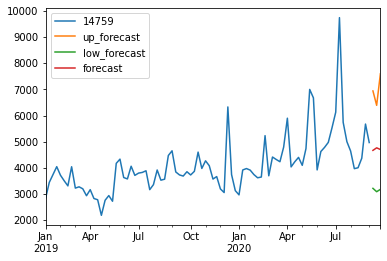

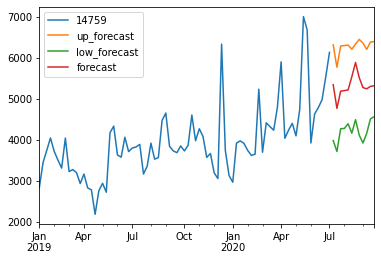

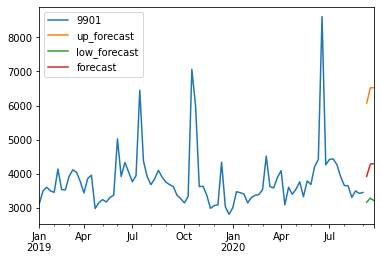

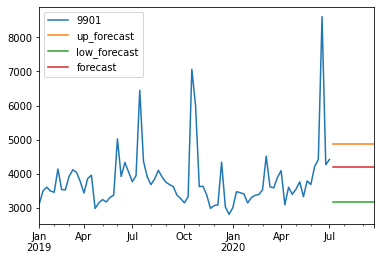

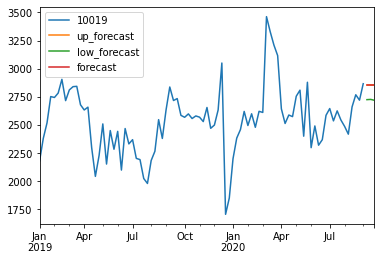

...

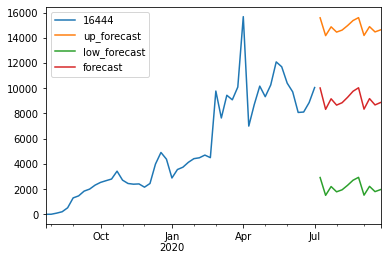

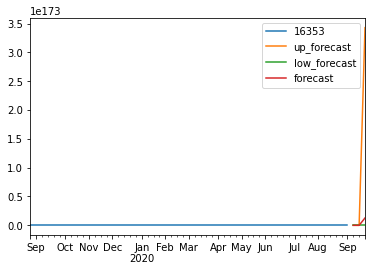

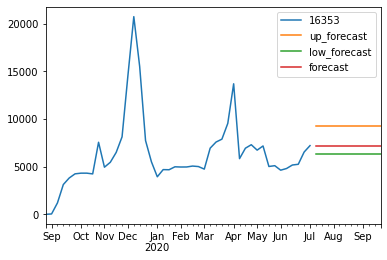

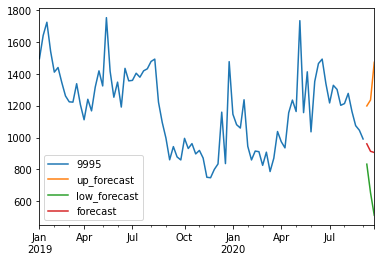

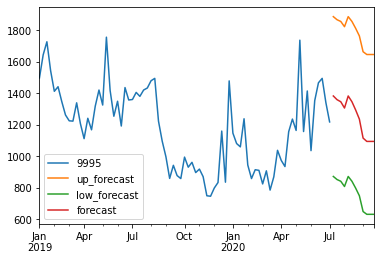

In [10]:

train_on_individual_timeseries(selectedMidProducts)

        Ukedato  Vare_Id  Sales
15   2015-10-05    14238  245.0
36   2015-10-12    14238  262.0
58   2015-10-19    14238  285.0
81   2015-10-26    14238  216.0
104  2015-11-02    14238  249.0
...         ...      ...    ...
7337 2020-08-10    14238  175.0
7370 2020-08-17    14238  141.0
7402 2020-08-24    14238  203.0
7434 2020-08-31    14238  180.0
7466 2020-09-07    14238  192.0

[258 rows x 3 columns]
Model Number: 1 with model AverageValueNaive in generation 0 of 4
Model Number: 2 with model AverageValueNaive in generation 0 of 4
Model Number: 3 with model AverageValueNaive in generation 0 of 4
Model Number: 4 with model DatepartRegression in generation 0 of 4
Model Number: 5 with model DatepartRegression in generation 0 of 4
Model Number: 6 with model DatepartRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 7 with model DatepartRegression in generation 0 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 7: DatepartRegression
Model Number: 8 with model ETS in generation 0 of 4
Model Number: 9 with model ETS in generation 0 of 4
Model Number: 10 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 10: GLM
Model Number: 11 with model GLM in generation 0 of 4
Model Number: 12 with model GLS in generation 0 of 4
Model Number: 13 with model GLS in generation 0 of 4
Model Number: 14 with model LastValueNaive in generation 0 of 4
Model Number: 15 with model LastValueNaive in generation 0 of 4
Model Number: 16 with model LastValueNaive in generation 0 of 4
Model Number: 17 with model LastValueNaive in generation 0 of 4
Model Number: 18 with m

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 22 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 22: VAR
Model Number: 23 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 23: VAR
Model Number: 24 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 24: VAR
Model Number: 25 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 25: VECM
Model Number: 26 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 26: VECM
Model Number: 27 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 27: VECM
Model Number: 28 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 28: VECM
Model Number: 29 with model WindowRegressio

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encounte

Model Number: 36 with model GLM in generation 0 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 36: GLM
Model Number: 37 with model ETS in generation 0 of 4
Model Number: 38 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 38: VAR
Model Number: 39 with model VECM in generation 0 of 4
Template Eval Error: LinAlgError('SVD did not converge') in model 39: VECM
Model Number: 40 with model WindowRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1584: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,


Model Number: 41 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 41: DatepartRegression
Model Number: 42 with model UnivariateMotif in generation 0 of 4
Model Number: 43 with model MultivariateMotif in generation 0 of 4
Model Number: 44 with model SectionalMotif in generation 0 of 4
Model Number: 45 with model NVAR in generation 0 of 4
Model Number: 46 with model ETS in generation 0 of 4
Model Number: 47 with model MultivariateMotif in generation 0 of 4
Model Number: 48 with model ZeroesNaive in generation 0 of 4
Model Number: 49 with model LastValueNaive in generation 0 of 4
Model Number: 50 with model ETS in generation 0 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 14238 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal compon

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered

Model Number: 59 with model ZeroesNaive in generation 0 of 4
Model Number: 60 with model VECM in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 60: VECM
Model Number: 61 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 61: VECM
Model Number: 62 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 62: VECM
Model Number: 63 with model UnivariateMotif in generation 0 of 4
Model Number: 64 with model UnivariateMotif in generation 0 of 4
Model Number: 65 with model NVAR in generation 0 of 4
Model Number: 66 with model DatepartRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 67 with model NVAR in generation 0 of 4
Model Number: 68 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 68: VAR
Model Number: 69 with model VECM in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 69: VECM
Model Number: 70 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 70: GLM
Model Number: 71 with model MultivariateMotif in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 71: MultivariateMotif
Model Number: 72 with model ETS in generation 0 of 4
Model Number: 73 with model UnivariateMotif in generation 0 of 4
Model Number: 74 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 79 with model GLM in generation 0 of 4
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 79: GLM
Model Number: 80 with model UnivariateMotif in generation 0 of 4
Model Number: 81 with model UnivariateMotif in generation 0 of 4
Model Number: 82 with model GLS in generation 0 of 4
Model Number: 83 with model AverageValueNaive in generation 0 of 4
Model Number: 84 with model SeasonalNaive in generation 0 of 4
Model Number: 85 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (48)') in model 85: SectionalMotif
Model Number: 86 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 86: VECM
Model Number: 87 with model GLS in generation 0 of 4
Model Number: 88 with model NVAR in generation 0 of 4
Model Number: 89 with model DatepartRegression in generation 0 of

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names

Model Number: 90 with model WindowRegression in generation 0 of 4
Model Number: 91 with model UnivariateMotif in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennae

Model Number: 92 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 92: VAR
Model Number: 93 with model WindowRegression in generation 0 of 4
Model Number: 94 with model SectionalMotif in generation 0 of 4
Model Number: 95 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 95: VECM
Model Number: 96 with model SeasonalNaive in generation 0 of 4
Template Eval Error: ValueError('Model SeasonalNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 96: SeasonalNaive
Model Number: 97 with model GLS in generation 0 of 4
Model Number: 98 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 98: VECM
Model Number: 99 with model SectionalMotif in generation 0 of 4
Model Number: 100 with model NVAR in generation 0 of 4
Model Number: 101 with model DatepartRegression in generation 0 of 4
Template E

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encount

Model Number: 106 with model SeasonalNaive in generation 1 of 4
Model Number: 107 with model SeasonalNaive in generation 1 of 4
Model Number: 108 with model SeasonalNaive in generation 1 of 4
Model Number: 109 with model SeasonalNaive in generation 1 of 4
Model Number: 110 with model ZeroesNaive in generation 1 of 4
Model Number: 111 with model ZeroesNaive in generation 1 of 4
Model Number: 112 with model ZeroesNaive in generation 1 of 4
Model Number: 113 with model LastValueNaive in generation 1 of 4
Model Number: 114 with model LastValueNaive in generation 1 of 4
Model Number: 115 with model LastValueNaive in generation 1 of 4
Model Number: 116 with model UnivariateMotif in generation 1 of 4
Model Number: 117 with model UnivariateMotif in generation 1 of 4
Model Number: 118 with model UnivariateMotif in generation 1 of 4
Model Number: 119 with model UnivariateMotif in generation 1 of 4
Model Number: 120 with model ETS in generation 1 of 4
Model Number: 121 with model ETS in generatio

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


Model Number: 122 with model ETS in generation 1 of 4
Model Number: 123 with model ETS in generation 1 of 4
Model Number: 124 with model AverageValueNaive in generation 1 of 4
Model Number: 125 with model AverageValueNaive in generation 1 of 4
Model Number: 126 with model AverageValueNaive in generation 1 of 4
Model Number: 127 with model WindowRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 127: WindowRegression
Model Number: 128 with model WindowRegression in generation 1 of 4
Model Number: 129 with model WindowRegression in generation 1 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 129: WindowRegression
Model Number: 130 with model MultivariateMotif in generation 1 of 4
Model Number: 131 with model MultivariateMotif in generation 1 of 4
Model Number: 132 with model MultivariateMotif in generation 1 of 4
Model Number: 133 with model Mult

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennae

Model Number: 135 with model DatepartRegression in generation 1 of 4
Model Number: 136 with model DatepartRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 136: DatepartRegression
Model Number: 137 with model SectionalMotif in generation 1 of 4
Model Number: 138 with model SectionalMotif in generation 1 of 4
Model Number: 139 with model SectionalMotif in generation 1 of 4
Model Number: 140 with model SectionalMotif in generation 1 of 4
Model Number: 141 with model NVAR in generation 1 of 4
Model Number: 142 with model NVAR in generation 1 of 4
Model Number: 143 with model NVAR in generation 1 of 4
Model Number: 144 with model NVAR in generation 1 of 4
Model Number: 145 with model GLS in generation 1 of 4
Model Number: 146 with model GLS in generation 1 of 4
Model Number: 147 with model GLS in generation 1 of 4
Model Number: 148 with model GLM in generation 1 of 4
Template Eval Error: TypeError("ufunc 'isfin

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 166 with model SeasonalNaive in generation 2 of 4
Model Number: 167 with model SeasonalNaive in generation 2 of 4
Model Number: 168 with model MultivariateMotif in generation 2 of 4
Model Number: 169 with model MultivariateMotif in generation 2 of 4
Model Number: 170 with model MultivariateMotif in generation 2 of 4
Model Number: 171 with model MultivariateMotif in generation 2 of 4
Model Number: 172 with model ZeroesNaive in generation 2 of 4
Model Number: 173 with model ZeroesNaive in generation 2 of 4
Model Number: 174 with model ZeroesNaive in generation 2 of 4
Model Number: 175 with model LastValueNaive in generation 2 of 4
Model Number: 176 with model LastValueNaive in generation 2 of 4
Model Number: 177 with model LastValueNaive in generation 2 of 4
Model Number: 178 with model AverageValueNaive in generation 2 of 4
Model Number: 179 with model AverageValueNaive in generation 2 of 4
Model Number: 180 with model AverageValueNaive in generation 2 of 4
Model Number: 1

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 186 with model WindowRegression in generation 2 of 4


[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished


Model Number: 187 with model WindowRegression in generation 2 of 4
Template Eval Error: ModuleNotFoundError("No module named 'lightgbm'") in model 187: WindowRegression
Model Number: 188 with model NVAR in generation 2 of 4
Model Number: 189 with model NVAR in generation 2 of 4
Model Number: 190 with model NVAR in generation 2 of 4
Model Number: 191 with model NVAR in generation 2 of 4
Model Number: 192 with model SectionalMotif in generation 2 of 4
Model Number: 193 with model SectionalMotif in generation 2 of 4
Model Number: 194 with model SectionalMotif in generation 2 of 4
Model Number: 195 with model SectionalMotif in generation 2 of 4
Model Number: 196 with model DatepartRegression in generation 2 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)


Model Number: 197 with model DatepartRegression in generation 2 of 4
Model Number: 198 with model DatepartRegression in generation 2 of 4
Model Number: 199 with model GLS in generation 2 of 4
Model Number: 200 with model GLS in generation 2 of 4
Model Number: 201 with model GLM in generation 2 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 201: GLM
Model Number: 202 with model GLM in generation 2 of 4
Model Number: 203 with model GLM in generation 2 of 4


[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 204 with model GLM in generation 2 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 204: GLM
Model Number: 205 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 205: VAR
Model Number: 206 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 206: VAR
Model Number: 207 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 207: VAR
Model Number: 208 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 208: VAR
Model Number: 209 with model VECM in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 209: VECM
Model Number: 210 with model VECM in generation 2

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/generalized_linear_model.py:298: DomainWarning: The inverse_power link function does not respect the domain of the Gamma family.
  warnings.warn((f"The {type(family.link).__name__} link function "
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)


Model Number: 223 with model MultivariateMotif in generation 3 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (60)') in model 223: MultivariateMotif
Model Number: 224 with model MultivariateMotif in generation 3 of 4
Model Number: 225 with model ZeroesNaive in generation 3 of 4
Model Number: 226 with model ZeroesNaive in generation 3 of 4
Model Number: 227 with model ZeroesNaive in generation 3 of 4
Model Number: 228 with model LastValueNaive in generation 3 of 4
Model Number: 229 with model LastValueNaive in generation 3 of 4
Model Number: 230 with model LastValueNaive in generation 3 of 4
Model Number: 231 with model AverageValueNaive in generation 3 of 4
Model Number: 232 with model AverageValueNaive in generation 3 of 4
Model Number: 233 with model ETS in generation 3 of 4
Model Number: 234 with model ETS in generation 3 of 4
Model Number: 235 with model ETS in generation 3 of 4
Template Eval Error: ValueError('Model ETS returned NaN for one or more series. fail_on_f

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s


Model Number: 251 with model DatepartRegression in generation 3 of 4
Model Number: 252 with model DatepartRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 252: DatepartRegression
Model Number: 253 with model GLM in generation 3 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 253: GLM
Model Number: 254 with model GLM in generation 3 of 4
Model Number: 255 with model GLM in generation 3 of 4
Model Number: 256 with model GLM in generation 3 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 256: GLM
Model Number: 257 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 257: VAR
Model Number: 258 with model VAR in generation 3 of 4
T

[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:426: RuntimeWarning: divide by zero encountered in true_divide
  endog_mu = self._clean(endog / mu)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))


Model Number: 267 with model UnivariateMotif in generation 4 of 4
Model Number: 268 with model UnivariateMotif in generation 4 of 4
Model Number: 269 with model SeasonalNaive in generation 4 of 4
Model Number: 270 with model SeasonalNaive in generation 4 of 4
Model Number: 271 with model SeasonalNaive in generation 4 of 4
Model Number: 272 with model SeasonalNaive in generation 4 of 4
Model Number: 273 with model MultivariateMotif in generation 4 of 4
Model Number: 274 with model MultivariateMotif in generation 4 of 4
Model Number: 275 with model MultivariateMotif in generation 4 of 4
Model Number: 276 with model MultivariateMotif in generation 4 of 4
Model Number: 277 with model ZeroesNaive in generation 4 of 4
Model Number: 278 with model ZeroesNaive in generation 4 of 4
Model Number: 279 with model ZeroesNaive in generation 4 of 4
Model Number: 280 with model LastValueNaive in generation 4 of 4
Model Number: 281 with model LastValueNaive in generation 4 of 4
Model Number: 282 with m

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)


Model Number: 292 with model NVAR in generation 4 of 4
Model Number: 293 with model NVAR in generation 4 of 4
Model Number: 294 with model NVAR in generation 4 of 4
Model Number: 295 with model NVAR in generation 4 of 4
Model Number: 296 with model SectionalMotif in generation 4 of 4
Model Number: 297 with model SectionalMotif in generation 4 of 4
Model Number: 298 with model SectionalMotif in generation 4 of 4
Model Number: 299 with model SectionalMotif in generation 4 of 4
Model Number: 300 with model GLS in generation 4 of 4
Model Number: 301 with model GLS in generation 4 of 4
Model Number: 302 with model GLS in generation 4 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 302: GLS
Model Number: 303 with model DatepartRegression in generation 4 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 303: DatepartRegression
Model Number: 304 with model DatepartRegression in generation 4 of 4
Template Eva

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multi

Model Number: 306 with model GLM in generation 4 of 4
Model Number: 307 with model GLM in generation 4 of 4
Model Number: 308 with model GLM in generation 4 of 4
Model Number: 309 with model GLM in generation 4 of 4
Model Number: 310 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 310: VAR
Model Number: 311 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 311: VAR
Model Number: 312 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 312: VAR
Model Number: 313 with model VECM in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 313: VECM
Model Number: 314 with model VECM in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 314: VECM
Model Number: 315 with model VECM in generation 4 of 4
Template Eval Error: ValueError('Only 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: divide by zero encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:56: RuntimeWarning: invalid value encountered in true_divide
  post_mu = (
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/ensemble.py:918: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  mods = pd.Series()


Model Number: 320 with model Ensemble in generation 5 of 0
Model Number: 321 with model Ensemble in generation 5 of 0
Model Number: 322 with model Ensemble in generation 5 of 0
Model Number: 323 with model Ensemble in generation 5 of 0
Model Number: 324 with model Ensemble in generation 5 of 0
Validation Round: 1
Model Number: 1 of 49 with model Ensemble for Validation 1
1 - Ensemble with avg smape 29.87: 
Model Number: 2 of 49 with model UnivariateMotif for Validation 1
2 - UnivariateMotif with avg smape 28.12: 
Model Number: 3 of 49 with model Ensemble for Validation 1
3 - Ensemble with avg smape 30.97: 
Model Number: 4 of 49 with model Ensemble for Validation 1
4 - Ensemble with avg smape 28.09: 
Model Number: 5 of 49 with model Ensemble for Validation 1
5 - Ensemble with avg smape 28.71: 
Model Number: 6 of 49 with model Ensemble for Validation 1
6 - Ensemble with avg smape 28.84: 
Model Number: 7 of 49 with model UnivariateMotif for Validation 1
7 - UnivariateMotif with avg smape 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1342: RuntimeWarning: divide by zero encountered in true_divide
  endog_mu = self._clean(endog / mu)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python

40 - WindowRegression with avg smape 25.65: 
Model Number: 41 of 49 with model ETS for Validation 1
41 - ETS with avg smape 21.82: 
Model Number: 42 of 49 with model WindowRegression for Validation 1
42 - WindowRegression with avg smape 26.5: 
Model Number: 43 of 49 with model SeasonalNaive for Validation 1
43 - SeasonalNaive with avg smape 28.52: 
Model Number: 44 of 49 with model ETS for Validation 1
44 - ETS with avg smape 12.89: 
Model Number: 45 of 49 with model GLM for Validation 1
45 - GLM with avg smape 25.54: 
Model Number: 46 of 49 with model SeasonalNaive for Validation 1
46 - SeasonalNaive with avg smape 15.67: 
Model Number: 47 of 49 with model NVAR for Validation 1
47 - NVAR with avg smape 30.94: 
Model Number: 48 of 49 with model SeasonalNaive for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


48 - SeasonalNaive with avg smape 22.85: 
Model Number: 49 of 49 with model NVAR for Validation 1
49 - NVAR with avg smape 31.1: 
Validation Round: 2
Model Number: 1 of 49 with model Ensemble for Validation 2
1 - Ensemble with avg smape 18.6: 
Model Number: 2 of 49 with model UnivariateMotif for Validation 2
2 - UnivariateMotif with avg smape 17.17: 
Model Number: 3 of 49 with model Ensemble for Validation 2
3 - Ensemble with avg smape 15.96: 
Model Number: 4 of 49 with model Ensemble for Validation 2
4 - Ensemble with avg smape 17.27: 
Model Number: 5 of 49 with model Ensemble for Validation 2
5 - Ensemble with avg smape 17.52: 
Model Number: 6 of 49 with model Ensemble for Validation 2
6 - Ensemble with avg smape 17.65: 
Model Number: 7 of 49 with model UnivariateMotif for Validation 2
7 - UnivariateMotif with avg smape 16.49: 
Model Number: 8 of 49 with model SeasonalNaive for Validation 2
8 - SeasonalNaive with avg smape 14.0: 
Model Number: 9 of 49 with model UnivariateMotif for V

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1342: RuntimeWarning: divide by zero encountered in true_divide
  endog_mu = self._clean(endog / mu)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python

40 - WindowRegression with avg smape 10.21: 
Model Number: 41 of 49 with model ETS for Validation 2
41 - ETS with avg smape 11.32: 
Model Number: 42 of 49 with model WindowRegression for Validation 2
42 - WindowRegression with avg smape 24.1: 
Model Number: 43 of 49 with model SeasonalNaive for Validation 2
43 - SeasonalNaive with avg smape 13.56: 
Model Number: 44 of 49 with model ETS for Validation 2
44 - ETS with avg smape 14.19: 
Model Number: 45 of 49 with model GLM for Validation 2
45 - GLM with avg smape 7.45: 
Model Number: 46 of 49 with model SeasonalNaive for Validation 2
46 - SeasonalNaive with avg smape 21.81: 
Model Number: 47 of 49 with model NVAR for Validation 2
47 - NVAR with avg smape 14.83: 
Model Number: 48 of 49 with model SeasonalNaive for Validation 2
48 - SeasonalNaive with avg smape 22.91: 
Model Number: 49 of 49 with model NVAR for Validation 2
49 - NVAR with avg smape 14.46: 
Initiated AutoTS object with best model: 
AverageValueNaive
{'fillna': 'mean', 'tran

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)



        Ukedato  Vare_Id  Sales
15   2015-10-05    14238  245.0
36   2015-10-12    14238  262.0
58   2015-10-19    14238  285.0
81   2015-10-26    14238  216.0
104  2015-11-02    14238  249.0
...         ...      ...    ...
7046 2020-06-08    14238  230.0
7078 2020-06-15    14238  250.0
7110 2020-06-22    14238  189.0
7142 2020-06-29    14238  223.0
7175 2020-07-06    14238  211.0

[249 rows x 3 columns]
Model Number: 1 with model AverageValueNaive in generation 0 of 4
Model Number: 2 with model AverageValueNaive in generation 0 of 4
Model Number: 3 with model AverageValueNaive in generation 0 of 4
Model Number: 4 with model DatepartRegression in generation 0 of 4
Model Number: 5 with model DatepartRegression in generation 0 of 4
Model Number: 6 with model DatepartRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 7 with model DatepartRegression in generation 0 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 7: DatepartRegression
Model Number: 8 with model ETS in generation 0 of 4
Model Number: 9 with model ETS in generation 0 of 4
Model Number: 10 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 10: GLM
Model Number: 11 with model GLM in generation 0 of 4
Model Number: 12 with model GLS in generation 0 of 4
Model Number: 13 with model GLS in generation 0 of 4
Model Number: 14 with model LastValueNaive in generation 0 of 4
Model Number: 15 with model LastValueNaive in generation 0 of 4
Model Number: 16 with model LastValueNaive in generation 0 of 4
Model Number: 17 with model LastValueNaive in generation 0 of 4
Model Number: 18 with m

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 20 with model SeasonalNaive in generation 0 of 4
Model Number: 21 with model SeasonalNaive in generation 0 of 4
Model Number: 22 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 22: VAR
Model Number: 23 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 23: VAR
Model Number: 24 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 24: VAR
Model Number: 25 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 25: VECM
Model Number: 26 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 26: VECM
Model Number: 27 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 27: VECM
Model Number: 28 with model VECM in generation 0 of 4
T

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encounte

Model Number: 35 with model SeasonalNaive in generation 0 of 4
Model Number: 36 with model GLM in generation 0 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 36: GLM
Model Number: 37 with model ETS in generation 0 of 4
Model Number: 38 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 38: VAR
Model Number: 39 with model VECM in generation 0 of 4
Template Eval Error: LinAlgError('SVD did not converge') in model 39: VECM
Model Number: 40 with model WindowRegression in generation 0 of 4
Model Number: 41 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 41: DatepartRegression

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1584: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified 


Model Number: 42 with model UnivariateMotif in generation 0 of 4
Model Number: 43 with model MultivariateMotif in generation 0 of 4
Model Number: 44 with model SectionalMotif in generation 0 of 4
Model Number: 45 with model NVAR in generation 0 of 4
Model Number: 46 with model ETS in generation 0 of 4
Model Number: 47 with model MultivariateMotif in generation 0 of 4
Model Number: 48 with model ZeroesNaive in generation 0 of 4
Model Number: 49 with model LastValueNaive in generation 0 of 4
Model Number: 50 with model ETS in generation 0 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 14238 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 51 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 51: VAR
Model Number: 52 with model MultivariateMotif in generation 0 of 4
Model Number

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess

Model Number: 66 with model DatepartRegression in generation 0 of 4
Model Number: 67 with model NVAR in generation 0 of 4
Model Number: 68 with model VAR in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Template Eval Error: ValueError('Only gave one variable to VAR') in model 68: VAR
Model Number: 69 with model VECM in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 69: VECM
Model Number: 70 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 70: GLM
Model Number: 71 with model MultivariateMotif in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 71: MultivariateMotif
Model Number: 72 with model ETS in generation 0 of 4
Model Number: 73 with model UnivariateMotif in generation 0 of 4
Model Number: 74 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 74: VAR
Model Number: 75 with model ETS in generation 0 of 4
Model Number: 76 with model MultivariateMotif

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 79 with model GLM in generation 0 of 4
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 79: GLM
Model Number: 80 with model UnivariateMotif in generation 0 of 4
Model Number: 81 with model UnivariateMotif in generation 0 of 4
Model Number: 82 with model GLS in generation 0 of 4
Model Number: 83 with model AverageValueNaive in generation 0 of 4
Model Number: 84 with model SeasonalNaive in generation 0 of 4
Model Number: 85 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (43)') in model 85: SectionalMotif
Model Number: 86 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 86: VECM
Model Number: 87 with model GLS in generation 0 of 4
Model Number: 88 with model NVAR in generation 0 of 4
Model Number: 89 with model DatepartRegression in generation 0 of

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_

Model Number: 92 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 92: VAR
Model Number: 93 with model WindowRegression in generation 0 of 4
Model Number: 94 with model SectionalMotif in generation 0 of 4
Model Number: 95 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 95: VECM
Model Number: 96 with model SeasonalNaive in generation 0 of 4
Template Eval Error: ValueError('Model SeasonalNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 96: SeasonalNaive
Model Number: 97 with model GLS in generation 0 of 4
Model Number: 98 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 98: VECM
Model Number: 99 with model SectionalMotif in generation 0 of 4
Model Number: 100 with model NVAR in generation 0 of 4
Model Number: 101 with model DatepartRegression in generation 0 of 4
Template E

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


Model Number: 106 with model DatepartRegression in generation 1 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 106: DatepartRegression
Model Number: 107 with model DatepartRegression in generation 1 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 107: DatepartRegression
Model Number: 108 with model DatepartRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 108: DatepartRegression
Model Number: 109 with model WindowRegression in generation 1 of 4
Model Number: 110 with model WindowRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 110: WindowRegression
Model Number: 111 with model ETS in generation 1 of 4
Model Number: 112 with model ETS in generation 1 of 4
Model Number: 113 wit

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 122 with model GLS in generation 1 of 4
Model Number: 123 with model SeasonalNaive in generation 1 of 4
Model Number: 124 with model SeasonalNaive in generation 1 of 4
Model Number: 125 with model SeasonalNaive in generation 1 of 4
Model Number: 126 with model SeasonalNaive in generation 1 of 4
Model Number: 127 with model UnivariateMotif in generation 1 of 4
Model Number: 128 with model UnivariateMotif in generation 1 of 4
Model Number: 129 with model UnivariateMotif in generation 1 of 4
Model Number: 130 with model UnivariateMotif in generation 1 of 4
Model Number: 131 with model GLM in generation 1 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 131: GLM
Model Number: 132 with model GLM in generation 1 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess

Template Eval Error: ValueError('Only gave one variable to VECM') in model 152: VECM
Model Number: 153 with model VECM in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 153: VECM
New Generation: 2 of 4
Model Number: 154 with model DatepartRegression in generation 2 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 154: DatepartRegression
Model Number: 155 with model DatepartRegression in generation 2 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 155: DatepartRegression
Model Number: 156 with model DatepartRegression in generation 2 of 4
Model Number: 157 with model WindowRegression in generation 2 of 4
Model Number: 158 with model WindowRegression in generation 2 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered

Model Number: 159 with model WindowRegression in generation 2 of 4
Model Number: 160 with model ETS in generation 2 of 4
Model Number: 161 with model ETS in generation 2 of 4
Model Number: 162 with model ETS in generation 2 of 4
Model Number: 163 with model ETS in generation 2 of 4
Model Number: 164 with model MultivariateMotif in generation 2 of 4
Model Number: 165 with model MultivariateMotif in generation 2 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 165: MultivariateMotif
Model Number: 166 with model MultivariateMotif in generation 2 of 4
Model Number: 167 with model MultivariateMotif in generation 2 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 167: MultivariateMotif
Model Number: 168 with model AverageValueNaive in generation 2 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encou

Model Number: 169 with model AverageValueNaive in generation 2 of 4
Model Number: 170 with model AverageValueNaive in generation 2 of 4
Model Number: 171 with model UnivariateMotif in generation 2 of 4
Model Number: 172 with model UnivariateMotif in generation 2 of 4
Model Number: 173 with model UnivariateMotif in generation 2 of 4
Model Number: 174 with model UnivariateMotif in generation 2 of 4
Model Number: 175 with model GLS in generation 2 of 4
Model Number: 176 with model GLS in generation 2 of 4
Model Number: 177 with model GLS in generation 2 of 4
Model Number: 178 with model SeasonalNaive in generation 2 of 4
Model Number: 179 with model SeasonalNaive in generation 2 of 4
Model Number: 180 with model SeasonalNaive in generation 2 of 4
Model Number: 181 with model SeasonalNaive in generation 2 of 4
Model Number: 182 with model GLM in generation 2 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 182: GLM
Model Number: 183 with 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


Model Number: 197 with model SectionalMotif in generation 2 of 4
Model Number: 198 with model SectionalMotif in generation 2 of 4
Model Number: 199 with model SectionalMotif in generation 2 of 4
Model Number: 200 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 200: VAR
Model Number: 201 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 201: VAR
Model Number: 202 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 202: VAR
Model Number: 203 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 203: VAR
Model Number: 204 with model VECM in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 204: VECM
Model Number: 205 with model VECM in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VEC

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess

New Generation: 3 of 4
Model Number: 208 with model DatepartRegression in generation 3 of 4
Model Number: 209 with model DatepartRegression in generation 3 of 4
Model Number: 210 with model DatepartRegression in generation 3 of 4
Model Number: 211 with model WindowRegression in generation 3 of 4
Model Number: 212 with model WindowRegression in generation 3 of 4
Model Number: 213 with model WindowRegression in generation 3 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 213: WindowRegression
Model Number: 214 with model SeasonalNaive in generation 3 of 4
Model Number: 215 with model SeasonalNaive in generation 3 of 4
Model Number: 216 with model SeasonalNaive in generation 3 of 4
Model Number: 217 with model SeasonalNaive in generation 3 of 4
Model Number: 218 with model ETS in generation 3 of 4
Model Number: 219 with model ETS in generation 3 of 4
Model Number: 220 with model ETS in generation 3 of 4
Model Number: 221 wit

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/compat/pandas.py:65: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import Int64Index as NumericIndex


Template Eval Error: ValueError('Model MultivariateMotif returned NaN for one or more series. fail_on_forecast_nan=True') in model 222: MultivariateMotif
Model Number: 223 with model MultivariateMotif in generation 3 of 4
Model Number: 224 with model MultivariateMotif in generation 3 of 4
Model Number: 225 with model MultivariateMotif in generation 3 of 4
Model Number: 226 with model AverageValueNaive in generation 3 of 4
Model Number: 227 with model AverageValueNaive in generation 3 of 4
Model Number: 228 with model UnivariateMotif in generation 3 of 4
Model Number: 229 with model UnivariateMotif in generation 3 of 4
Model Number: 230 with model UnivariateMotif in generation 3 of 4
Model Number: 231 with model UnivariateMotif in generation 3 of 4
Model Number: 232 with model GLS in generation 3 of 4
Model Number: 233 with model GLS in generation 3 of 4
Model Number: 234 with model NVAR in generation 3 of 4
Model Number: 235 with model NVAR in generation 3 of 4
Model Number: 236 with m

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 260 with model DatepartRegression in generation 4 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 260: DatepartRegression
Model Number: 261 with model DatepartRegression in generation 4 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 261: DatepartRegression
Model Number: 262 with model WindowRegression in generation 4 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 262: WindowRegression
Model Number: 263 with model WindowRegression in generation 4 of 4
Model Number: 264 with model WindowRegression in generation 4 of 4
Model Number: 265 with model SeasonalNaive in generation 4 of 4
Model Number: 266 with model SeasonalNaive in generation 4 of 4
Model Number: 267 with model SeasonalNaive in generation 4 of 4
Model Number: 268 with model SeasonalNaive in generation 4 of 4
Model Number: 269 with model ET

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/ensemble.py:918: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  mods = pd.Series()


Model Number: 313 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 314 with model Ensemble in generation 5 of 0
Model Number: 315 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 316 with model Ensemble in generation 5 of 0
Model Number: 317 with model Ensemble in generation 5 of 0
Model Number: 318 with model Ensemble in generation 5 of 0
Model Number: 319 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Validation Round: 1
Model Number: 1 of 48 with model Ensemble for Validation 1
1 - Ensemble with avg smape 28.58: 
Model Number: 2 of 48 with model Ensemble for Validation 1
2 - Ensemble with avg smape 25.89: 
Model Number: 3 of 48 with model Ensemble for Validation 1
3 - Ensemble with avg smape 24.36: 
Model Number: 4 of 48 with model Ensemble for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


4 - Ensemble with avg smape 28.75: 
Model Number: 5 of 48 with model Ensemble for Validation 1
5 - Ensemble with avg smape 30.94: 
Model Number: 6 of 48 with model DatepartRegression for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


6 - DatepartRegression with avg smape 30.71: 
Model Number: 7 of 48 with model DatepartRegression for Validation 1
7 - DatepartRegression with avg smape 29.08: 
Model Number: 8 of 48 with model WindowRegression for Validation 1
8 - WindowRegression with avg smape 34.81: 
Model Number: 9 of 48 with model WindowRegression for Validation 1
9 - WindowRegression with avg smape 19.96: 
Model Number: 10 of 48 with model SeasonalNaive for Validation 1
10 - SeasonalNaive with avg smape 17.21: 
Model Number: 11 of 48 with model SeasonalNaive for Validation 1
11 - SeasonalNaive with avg smape 57.53: 
Model Number: 12 of 48 with model ETS for Validation 1
12 - ETS with avg smape 39.21: 
Model Number: 13 of 48 with model MultivariateMotif for Validation 1
13 - MultivariateMotif with avg smape 19.15: 
Model Number: 14 of 48 with model MultivariateMotif for Validation 1
14 - MultivariateMotif with avg smape 19.13: 
Model Number: 15 of 48 with model AverageValueNaive for Validation 1
15 - AverageValue

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


20 - UnivariateMotif with avg smape 20.43: 
Model Number: 21 of 48 with model UnivariateMotif for Validation 1
21 - UnivariateMotif with avg smape 20.25: 
Model Number: 22 of 48 with model GLS for Validation 1
22 - GLS with avg smape 17.81: 
Model Number: 23 of 48 with model SeasonalNaive for Validation 1
23 - SeasonalNaive with avg smape 24.32: 
Model Number: 24 of 48 with model AverageValueNaive for Validation 1
24 - AverageValueNaive with avg smape 17.91: 
Model Number: 25 of 48 with model GLM for Validation 1
25 - GLM with avg smape 17.91: 
Model Number: 26 of 48 with model GLM for Validation 1
26 - GLM with avg smape 17.91: 
Model Number: 27 of 48 with model NVAR for Validation 1
27 - NVAR with avg smape 17.73: 
Model Number: 28 of 48 with model NVAR for Validation 1
28 - NVAR with avg smape 17.73: 
Model Number: 29 of 48 with model NVAR for Validation 1
29 - NVAR with avg smape 17.42: 
Model Number: 30 of 48 with model NVAR for Validation 1
30 - NVAR with avg smape 17.42: 
Model 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


4 - Ensemble with avg smape 13.29: 
Model Number: 5 of 48 with model Ensemble for Validation 2
5 - Ensemble with avg smape 9.62: 
Model Number: 6 of 48 with model DatepartRegression for Validation 2
6 - DatepartRegression with avg smape 31.55: 
Model Number: 7 of 48 with model DatepartRegression for Validation 2
7 - DatepartRegression with avg smape 15.8: 
Model Number: 8 of 48 with model WindowRegression for Validation 2
8 - WindowRegression with avg smape 13.89: 
Model Number: 9 of 48 with model WindowRegression for Validation 2
9 - WindowRegression with avg smape 26.65: 
Model Number: 10 of 48 with model SeasonalNaive for Validation 2
10 - SeasonalNaive with avg smape 31.23: 
Model Number: 11 of 48 with model SeasonalNaive for Validation 2
11 - SeasonalNaive with avg smape 20.06: 
Model Number: 12 of 48 with model ETS for Validation 2
12 - ETS with avg smape 16.52: 
Model Number: 13 of 48 with model MultivariateMotif for Validation 2
13 - MultivariateMotif with avg smape 23.81: 
Mod

Model Number: 4 with model DatepartRegression in generation 0 of 4
Model Number: 5 with model DatepartRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 6 with model DatepartRegression in generation 0 of 4
Model Number: 7 with model DatepartRegression in generation 0 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 7: DatepartRegression
Model Number: 8 with model ETS in generation 0 of 4
Model Number: 9 with model ETS in generation 0 of 4
Model Number: 10 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 10: GLM
Model Number: 11 with model GLM in generation 0 of 4
Model Number: 12 with model GLS in generation 0 of 4
Model Number: 13 with model GLS in generation 0 of 4
Model Number: 14 with model LastValueNaive in generation 0 of 4
Model Number: 15 with model LastValueNaive in generation 0 of 4
Model Number: 16 with model LastValueNaive in generation 0 of 4
Model Number: 17 wit

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 22 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 22: VAR
Model Number: 23 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 23: VAR
Model Number: 24 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 24: VAR
Model Number: 25 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 25: VECM
Model Number: 26 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 26: VECM
Model Number: 27 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 27: VECM
Model Number: 28 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 28: VECM
Model Number: 29 with model WindowRegressio

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encounte

Model Number: 38 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 38: VAR
Model Number: 39 with model VECM in generation 0 of 4
Template Eval Error: LinAlgError('SVD did not converge') in model 39: VECM
Model Number: 40 with model WindowRegression in generation 0 of 4
Model Number: 41 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 41: DatepartRegression
Model Number: 42 with model UnivariateMotif in generation 0 of 4
Model Number: 43 with model MultivariateMotif in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1584: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)


Model Number: 44 with model SectionalMotif in generation 0 of 4
Model Number: 45 with model NVAR in generation 0 of 4
Model Number: 46 with model ETS in generation 0 of 4
Model Number: 47 with model MultivariateMotif in generation 0 of 4
Model Number: 48 with model ZeroesNaive in generation 0 of 4
Model Number: 49 with model LastValueNaive in generation 0 of 4
Model Number: 50 with model ETS in generation 0 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 14288 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 51 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 51: VAR
Model Number: 52 with model MultivariateMotif in generation 0 of 4
Model Number: 53 with model ETS in generation 0 of 4
Model Number: 54 with model GLS in generation 0 of 4
Model Number: 55 with model VAR in gene

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess

Model Number: 67 with model NVAR in generation 0 of 4
Model Number: 68 with model VAR in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennae

Template Eval Error: ValueError('Only gave one variable to VAR') in model 68: VAR
Model Number: 69 with model VECM in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 69: VECM
Model Number: 70 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 70: GLM
Model Number: 71 with model MultivariateMotif in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 71: MultivariateMotif
Model Number: 72 with model ETS in generation 0 of 4
Model Number: 73 with model UnivariateMotif in generation 0 of 4
Model Number: 74 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 74: VAR
Model Number: 75 with model ETS in generation 0 of 4
Model Number: 76 with model MultivariateMotif

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 83 with model AverageValueNaive in generation 0 of 4
Model Number: 84 with model SeasonalNaive in generation 0 of 4
Model Number: 85 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (48)') in model 85: SectionalMotif
Model Number: 86 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 86: VECM
Model Number: 87 with model GLS in generation 0 of 4
Model Number: 88 with model NVAR in generation 0 of 4
Model Number: 89 with model DatepartRegression in generation 0 of 4
Model Number: 90 with model WindowRegression in generation 0 of 4
Model Number: 91 with model UnivariateMotif in generation 0 of 4
Model Number: 92 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 92: VAR
Model Number: 93 with model WindowRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


Model Number: 94 with model SectionalMotif in generation 0 of 4
Model Number: 95 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 95: VECM
Model Number: 96 with model SeasonalNaive in generation 0 of 4
Template Eval Error: ValueError('Model SeasonalNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 96: SeasonalNaive
Model Number: 97 with model GLS in generation 0 of 4
Model Number: 98 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 98: VECM
Model Number: 99 with model SectionalMotif in generation 0 of 4
Model Number: 100 with model NVAR in generation 0 of 4
Model Number: 101 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 101: DatepartRegression
Model Number: 102 with model SeasonalNaive in generation 0 of 4
Model Number: 103 with mo

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


Model Number: 107 with model NVAR in generation 1 of 4
Model Number: 108 with model NVAR in generation 1 of 4
Model Number: 109 with model NVAR in generation 1 of 4
Model Number: 110 with model LastValueNaive in generation 1 of 4
Model Number: 111 with model LastValueNaive in generation 1 of 4
Model Number: 112 with model LastValueNaive in generation 1 of 4
Model Number: 113 with model ETS in generation 1 of 4
Model Number: 114 with model ETS in generation 1 of 4
Model Number: 115 with model ETS in generation 1 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 14288 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 116 with model ETS in generation 1 of 4
ETS error ValueError('Can only dampen the trend component')
ETS failed on 14288 with ValueError('Can only dampen the trend component')
Model Number: 117 with model GLS in generation 1 of 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pre

Model Number: 152 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 152: VAR
Model Number: 153 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 153: VAR
Model Number: 154 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 154: VAR
Model Number: 155 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 155: VAR
Model Number: 156 with model VECM in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 156: VECM
Model Number: 157 with model VECM in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 157: VECM
Model Number: 158 with model VECM in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 158: VECM
Model N

[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished


Model Number: 169 with model WindowRegression in generation 2 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 169: WindowRegression
Model Number: 170 with model ETS in generation 2 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 14288 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 171 with model ETS in generation 2 of 4
ETS error ValueError('Can only dampen the trend component')
ETS failed on 14288 with ValueError('Can only dampen the trend component')
Model Number: 172 with model ETS in generation 2 of 4
Model Number: 173 with model ETS in generation 2 of 4
Model Number: 174 with model GLS in generation 2 of 4
Model Number: 175 with model GLS in generation 2 of 4
Model Number: 176 with model GLS in generation 2 of 4
Model Number: 177 with model UnivariateMotif in generation 2 of

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)


Model Number: 187 with model GLM in generation 2 of 4
Model Number: 188 with model GLM in generation 2 of 4
Model Number: 189 with model SeasonalNaive in generation 2 of 4
Model Number: 190 with model SeasonalNaive in generation 2 of 4
Model Number: 191 with model SeasonalNaive in generation 2 of 4
Model Number: 192 with model SeasonalNaive in generation 2 of 4
Model Number: 193 with model DatepartRegression in generation 2 of 4
Model Number: 194 with model DatepartRegression in generation 2 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 194: DatepartRegression
Model Number: 195 with model DatepartRegression in generation 2 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 195: DatepartRegression
Model Number: 196 with model AverageValueNaive in generation 2 of 4
Model Number: 197 with model AverageValueNaive in generation 2 of 4
Model Number: 198 with model AverageValueNaive in

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multi

Model Number: 206 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 206: VAR
Model Number: 207 with model VAR in generation 2 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 207: VAR
Model Number: 208 with model VAR in generation 2 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 208: VAR
Model Number: 209 with model VECM in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 209: VECM
Model Number: 210 with model VECM in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 210: VECM
Model Number: 211 with model VECM in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 211: VECM
Model Number: 212 with model VECM in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 212: VECM
New Generation: 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered

Model Number: 231 with model SeasonalNaive in generation 3 of 4
Model Number: 232 with model SeasonalNaive in generation 3 of 4
Model Number: 233 with model SeasonalNaive in generation 3 of 4
Model Number: 234 with model UnivariateMotif in generation 3 of 4
Model Number: 235 with model UnivariateMotif in generation 3 of 4
Model Number: 236 with model UnivariateMotif in generation 3 of 4
Model Number: 237 with model UnivariateMotif in generation 3 of 4
Model Number: 238 with model MultivariateMotif in generation 3 of 4
Model Number: 239 with model MultivariateMotif in generation 3 of 4
Model Number: 240 with model MultivariateMotif in generation 3 of 4
Model Number: 241 with model MultivariateMotif in generation 3 of 4
Model Number: 242 with model GLM in generation 3 of 4
Model Number: 243 with model GLM in generation 3 of 4
Model Number: 244 with model GLM in generation 3 of 4
Model Number: 245 with model GLM in generation 3 of 4
Model Number: 246 with model DatepartRegression in gener

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Librar

Model Number: 253 with model ZeroesNaive in generation 3 of 4
Model Number: 254 with model ZeroesNaive in generation 3 of 4
Model Number: 255 with model SectionalMotif in generation 3 of 4
Model Number: 256 with model SectionalMotif in generation 3 of 4
Model Number: 257 with model SectionalMotif in generation 3 of 4
Model Number: 258 with model SectionalMotif in generation 3 of 4
Model Number: 259 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 259: VAR
Model Number: 260 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 260: VAR
Model Number: 261 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 261: VAR
Model Number: 262 with model VAR in generation 3 of 4
Template Eval Error: IndexError('tuple index out of range') in model 262: VAR
Model Number: 263 with model VECM in generation 3 of 4
Template Eval Erro

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =

Model Number: 276 with model ETS in generation 4 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 14288 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 277 with model ETS in generation 4 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 14288 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 278 with model NVAR in generation 4 of 4
Model Number: 279 with model NVAR in generation 4 of 4
Model Number: 280 with model NVAR in generation 4 of 4
Model Number: 281 with model NVAR in generation 4 of 4
Model Number: 282 with model LastValueNaive in generation 4 of 4
Model Number: 283 with model LastValueNaive in generation 4 of 4
Model Number: 284 with model LastValueNaive in generation 4 of 4
Mod

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 301: GLM
Model Number: 302 with model GLM in generation 4 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 302: GLM
Model Number: 303 with model GLM in generation 4 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 303: GLM
Model Number: 304 with model DatepartRegression in generation 4 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 304: DatepartRegression
Model Number: 305 with model DatepartRegression in generation 4 of 4
Templ

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 


Model Number: 322 with model Ensemble in generation 5 of 0
Model Number: 323 with model Ensemble in generation 5 of 0
Model Number: 324 with model Ensemble in generation 5 of 0
Model Number: 325 with model Ensemble in generation 5 of 0
Model Number: 326 with model Ensemble in generation 5 of 0
Model Number: 327 with model Ensemble in generation 5 of 0
Model Number: 328 with model Ensemble in generation 5 of 0
Validation Round: 1
Model Number: 1 of 50 with model Ensemble for Validation 1
1 - Ensemble with avg smape 19.9: 
Model Number: 2 of 50 with model Ensemble for Validation 1
2 - Ensemble with avg smape 19.9: 
Model Number: 3 of 50 with model Ensemble for Validation 1
3 - Ensemble with avg smape 19.9: 
Model Number: 4 of 50 with model Ensemble for Validation 1
4 - Ensemble with avg smape 19.82: 
Model Number: 5 of 50 with model Ensemble for Validation 1
5 - Ensemble with avg smape 20.96: 
Model Number: 6 of 50 with model ETS for Validation 1
6 - ETS with avg smape 16.15: 
Model Num

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

24 - GLS with avg smape 21.85: 
Model Number: 25 of 50 with model GLS for Validation 1
25 - GLS with avg smape 22.03: 
Model Number: 26 of 50 with model GLS for Validation 1
26 - GLS with avg smape 22.33: 
Model Number: 27 of 50 with model UnivariateMotif for Validation 1
27 - UnivariateMotif with avg smape 26.94: 
Model Number: 28 of 50 with model GLS for Validation 1
28 - GLS with avg smape 21.03: 
Model Number: 29 of 50 with model MultivariateMotif for Validation 1
29 - MultivariateMotif with avg smape 18.32: 
Model Number: 30 of 50 with model SectionalMotif for Validation 1
30 - SectionalMotif with avg smape 21.22: 
Model Number: 31 of 50 with model SeasonalNaive for Validation 1
31 - SeasonalNaive with avg smape 21.0: 
Model Number: 32 of 50 with model NVAR for Validation 1
32 - NVAR with avg smape 17.24: 
Model Number: 33 of 50 with model GLM for Validation 1
33 - GLM with avg smape 37.03: 
Model Number: 34 of 50 with model GLM for Validation 1
34 - GLM with avg smape 37.03: 
Mod

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

42 - NVAR with avg smape 26.02: 
Model Number: 43 of 50 with model MultivariateMotif for Validation 1
43 - MultivariateMotif with avg smape 15.79: 
Model Number: 44 of 50 with model SectionalMotif for Validation 1
44 - SectionalMotif with avg smape 22.39: 
Model Number: 45 of 50 with model ZeroesNaive for Validation 1
45 - ZeroesNaive with avg smape 20.09: 
Model Number: 46 of 50 with model ZeroesNaive for Validation 1
46 - ZeroesNaive with avg smape 20.09: 
Model Number: 47 of 50 with model MultivariateMotif for Validation 1
47 - MultivariateMotif with avg smape 18.06: 
Model Number: 48 of 50 with model MultivariateMotif for Validation 1
48 - MultivariateMotif with avg smape 18.06: 
Model Number: 49 of 50 with model UnivariateMotif for Validation 1
49 - UnivariateMotif with avg smape 48.36: 
Model Number: 50 of 50 with model AverageValueNaive for Validation 1
50 - AverageValueNaive with avg smape 15.23: 
Validation Round: 2
Model Number: 1 of 50 with model Ensemble for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


1 - Ensemble with avg smape 6.92: 
Model Number: 2 of 50 with model Ensemble for Validation 2
2 - Ensemble with avg smape 6.92: 
Model Number: 3 of 50 with model Ensemble for Validation 2
3 - Ensemble with avg smape 6.92: 
Model Number: 4 of 50 with model Ensemble for Validation 2
4 - Ensemble with avg smape 6.93: 
Model Number: 5 of 50 with model Ensemble for Validation 2
5 - Ensemble with avg smape 9.7: 
Model Number: 6 of 50 with model ETS for Validation 2
6 - ETS with avg smape 9.7: 
Model Number: 7 of 50 with model WindowRegression for Validation 2
7 - WindowRegression with avg smape 7.79: 
Model Number: 8 of 50 with model SectionalMotif for Validation 2
8 - SectionalMotif with avg smape 9.45: 
Model Number: 9 of 50 with model GLS for Validation 2
9 - GLS with avg smape 10.66: 
Model Number: 10 of 50 with model ETS for Validation 2
10 - ETS with avg smape 17.34: 
Model Number: 11 of 50 with model WindowRegression for Validation 2
11 - WindowRegression with avg smape 8.01: 
Model N

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

25 - GLS with avg smape 8.42: 
Model Number: 26 of 50 with model GLS for Validation 2
26 - GLS with avg smape 7.95: 
Model Number: 27 of 50 with model UnivariateMotif for Validation 2
27 - UnivariateMotif with avg smape 4.46: 
Model Number: 28 of 50 with model GLS for Validation 2
28 - GLS with avg smape 11.13: 
Model Number: 29 of 50 with model MultivariateMotif for Validation 2
29 - MultivariateMotif with avg smape 9.2: 
Model Number: 30 of 50 with model SectionalMotif for Validation 2
30 - SectionalMotif with avg smape 24.55: 
Model Number: 31 of 50 with model SeasonalNaive for Validation 2
31 - SeasonalNaive with avg smape 10.39: 
Model Number: 32 of 50 with model NVAR for Validation 2
32 - NVAR with avg smape 11.03: 
Model Number: 33 of 50 with model GLM for Validation 2
33 - GLM with avg smape 7.34: 
Model Number: 34 of 50 with model GLM for Validation 2
34 - GLM with avg smape 7.34: 
Model Number: 35 of 50 with model SeasonalNaive for Validation 2
35 - SeasonalNaive with avg sma

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

39 - DatepartRegression with avg smape 11.95: 
Model Number: 40 of 50 with model AverageValueNaive for Validation 2
40 - AverageValueNaive with avg smape 13.07: 
Model Number: 41 of 50 with model SectionalMotif for Validation 2
41 - SectionalMotif with avg smape 12.5: 
Model Number: 42 of 50 with model NVAR for Validation 2
42 - NVAR with avg smape 7.52: 
Model Number: 43 of 50 with model MultivariateMotif for Validation 2
43 - MultivariateMotif with avg smape 11.22: 
Model Number: 44 of 50 with model SectionalMotif for Validation 2
44 - SectionalMotif with avg smape 16.73: 
Model Number: 45 of 50 with model ZeroesNaive for Validation 2
45 - ZeroesNaive with avg smape 5.31: 
Model Number: 46 of 50 with model ZeroesNaive for Validation 2
46 - ZeroesNaive with avg smape 5.31: 
Model Number: 47 of 50 with model MultivariateMotif for Validation 2
47 - MultivariateMotif with avg smape 9.19: 
Model Number: 48 of 50 with model MultivariateMotif for Validation 2
48 - MultivariateMotif with avg

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =

49 - UnivariateMotif with avg smape 20.84: 
Model Number: 50 of 50 with model AverageValueNaive for Validation 2
50 - AverageValueNaive with avg smape 15.65: 
Initiated AutoTS object with best model: 
GLS
{'fillna': 'quadratic', 'transformations': {'0': 'SeasonalDifference', '1': 'DifferencedTransformer', '2': 'Detrend', '3': 'Slice'}, 'transformation_params': {'0': {'lag_1': 24, 'method': 'Mean'}, '1': {}, '2': {'model': 'Linear'}, '3': {'method': 100}}}
{}
SMAPE: 2.555453189134632, 11.235136843787153, 10.661711083361741
MAE: 9.251063353019276, 39.71700854279917, 31.7429635671045
SPL: 1.1123369170521673, 1.1296979164420058, 1.143072655257329
        Ukedato  Vare_Id  Sales
16   2015-10-05    14288  217.0
37   2015-10-12    14288  233.0
59   2015-10-19    14288  253.0
82   2015-10-26    14288  229.0
105  2015-11-02    14288  247.0
...         ...      ...    ...
7048 2020-06-08    14288  289.0
7080 2020-06-15    14288  324.0
7112 2020-06-22    14288  291.0
7144 2020-06-29    14288  310

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 7 with model DatepartRegression in generation 0 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 7: DatepartRegression
Model Number: 8 with model ETS in generation 0 of 4
Model Number: 9 with model ETS in generation 0 of 4
Model Number: 10 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 10: GLM
Model Number: 11 with model GLM in generation 0 of 4
Model Number: 12 with model GLS in generation 0 of 4
Model Number: 13 with model GLS in generation 0 of 4
Model Number: 14 with model LastValueNaive in generation 0 of 4
Model Number: 15 with model LastValueNaive in generation 0 of 4
Model Number: 16 with model LastValueNaive in generation 0 of 4
Model Number: 17 with model LastValueNaive in generation 0 of 4
Model Number: 18 with m

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 20 with model SeasonalNaive in generation 0 of 4
Model Number: 21 with model SeasonalNaive in generation 0 of 4
Model Number: 22 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 22: VAR
Model Number: 23 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 23: VAR
Model Number: 24 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 24: VAR
Model Number: 25 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 25: VECM
Model Number: 26 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 26: VECM
Model Number: 27 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 27: VECM
Model Number: 28 with model VECM in generation 0 of 4
T

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encounte

Model Number: 38 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 38: VAR
Model Number: 39 with model VECM in generation 0 of 4
Template Eval Error: LinAlgError('SVD did not converge') in model 39: VECM
Model Number: 40 with model WindowRegression in generation 0 of 4
Model Number: 41 with model DatepartRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1584: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified 

Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 41: DatepartRegression
Model Number: 42 with model UnivariateMotif in generation 0 of 4
Model Number: 43 with model MultivariateMotif in generation 0 of 4
Model Number: 44 with model SectionalMotif in generation 0 of 4
Model Number: 45 with model NVAR in generation 0 of 4
Model Number: 46 with model ETS in generation 0 of 4
Model Number: 47 with model MultivariateMotif in generation 0 of 4
Model Number: 48 with model ZeroesNaive in generation 0 of 4
Model Number: 49 with model LastValueNaive in generation 0 of 4
Model Number: 50 with model ETS in generation 0 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 14288 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 51 with model VAR in generation 0 of 4
Templat

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess

Model Number: 66 with model DatepartRegression in generation 0 of 4
Model Number: 67 with model NVAR in generation 0 of 4
Model Number: 68 with model VAR in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Template Eval Error: ValueError('Only gave one variable to VAR') in model 68: VAR
Model Number: 69 with model VECM in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 69: VECM
Model Number: 70 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 70: GLM
Model Number: 71 with model MultivariateMotif in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 71: MultivariateMotif
Model Number: 72 with model ETS in generation 0 of 4
Model Number: 73 with model UnivariateMotif in generation 0 of 4
Model Number: 74 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 74: VAR
Model Number: 75 with model ETS in generation 0 of 4
Model Number: 76 with model MultivariateMotif

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 79 with model GLM in generation 0 of 4
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 79: GLM
Model Number: 80 with model UnivariateMotif in generation 0 of 4
Model Number: 81 with model UnivariateMotif in generation 0 of 4
Model Number: 82 with model GLS in generation 0 of 4
Model Number: 83 with model AverageValueNaive in generation 0 of 4
Model Number: 84 with model SeasonalNaive in generation 0 of 4
Model Number: 85 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (43)') in model 85: SectionalMotif
Model Number: 86 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 86: VECM
Model Number: 87 with model GLS in generation 0 of 4
Model Number: 88 with model NVAR in generation 0 of 4
Model Number: 89 with model DatepartRegression in generation 0 of

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_

Model Number: 90 with model WindowRegression in generation 0 of 4
Model Number: 91 with model UnivariateMotif in generation 0 of 4
Model Number: 92 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 92: VAR
Model Number: 93 with model WindowRegression in generation 0 of 4
Model Number: 94 with model SectionalMotif in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


Model Number: 95 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 95: VECM
Model Number: 96 with model SeasonalNaive in generation 0 of 4
Template Eval Error: ValueError('Model SeasonalNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 96: SeasonalNaive
Model Number: 97 with model GLS in generation 0 of 4
Model Number: 98 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 98: VECM
Model Number: 99 with model SectionalMotif in generation 0 of 4
Model Number: 100 with model NVAR in generation 0 of 4
Model Number: 101 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 101: DatepartRegression
Model Number: 102 with model SeasonalNaive in generation 0 of 4
Model Number: 103 with model WindowRegression in generation 0 of 4
Model Number: 104 with

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


Model Number: 107 with model LastValueNaive in generation 1 of 4
Model Number: 108 with model LastValueNaive in generation 1 of 4
Model Number: 109 with model ETS in generation 1 of 4
Model Number: 110 with model ETS in generation 1 of 4
Model Number: 111 with model ETS in generation 1 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 14288 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 112 with model ETS in generation 1 of 4
Model Number: 113 with model SeasonalNaive in generation 1 of 4
Model Number: 114 with model SeasonalNaive in generation 1 of 4
Model Number: 115 with model SeasonalNaive in generation 1 of 4
Model Number: 116 with model SeasonalNaive in generation 1 of 4
Model Number: 117 with model NVAR in generation 1 of 4
Model Number: 118 with model NVAR in generation 1 of 4
Model Number: 119 with model NVAR in generation 1 o

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 126 with model WindowRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 126: WindowRegression
Model Number: 127 with model UnivariateMotif in generation 1 of 4
Model Number: 128 with model UnivariateMotif in generation 1 of 4
Model Number: 129 with model UnivariateMotif in generation 1 of 4
Model Number: 130 with model UnivariateMotif in generation 1 of 4
Model Number: 131 with model ZeroesNaive in generation 1 of 4
Model Number: 132 with model ZeroesNaive in generation 1 of 4
Model Number: 133 with model ZeroesNaive in generation 1 of 4
Model Number: 134 with model MultivariateMotif in generation 1 of 4
Model Number: 135 with model MultivariateMotif in generation 1 of 4
Model Number: 136 with model MultivariateMotif in generation 1 of 4
Model Number: 137 with model MultivariateMotif in generation 1 of 4
Model Number: 138 with model AverageValueNaive in generation 1 of 4
Model Number: 139 with 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Template Eval Error: ValueError('Only gave one variable to VAR') in model 153: VAR
Model Number: 154 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 154: VAR
Model Number: 155 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 155: VAR
Model Number: 156 with model VECM in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 156: VECM
Model Number: 157 with model VECM in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 157: VECM
Model Number: 158 with model VECM in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 158: VECM
Model Number: 159 with model VECM in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 159: VECM
New Generation: 2 of 4
Model Number: 160 with model LastValueNaive in generation 2 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 183 with model UnivariateMotif in generation 2 of 4
Model Number: 184 with model ZeroesNaive in generation 2 of 4
Model Number: 185 with model ZeroesNaive in generation 2 of 4
Model Number: 186 with model ZeroesNaive in generation 2 of 4
Model Number: 187 with model MultivariateMotif in generation 2 of 4
Model Number: 188 with model MultivariateMotif in generation 2 of 4
Model Number: 189 with model MultivariateMotif in generation 2 of 4
Model Number: 190 with model MultivariateMotif in generation 2 of 4
Model Number: 191 with model AverageValueNaive in generation 2 of 4
Model Number: 192 with model AverageValueNaive in generation 2 of 4
Model Number: 193 with model AverageValueNaive in generation 2 of 4
Model Number: 194 with model DatepartRegression in generation 2 of 4
Model Number: 195 with model DatepartRegression in generation 2 of 4
Model Number: 196 with model DatepartRegression in generation 2 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 197 with model GLM in generation 2 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 197: GLM
Model Number: 198 with model GLM in generation 2 of 4
Model Number: 199 with model GLM in generation 2 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 199: GLM
Model Number: 200 with model GLM in generation 2 of 4
Model Number: 201 with model SectionalMotif in generation 2 of 4
Model Number: 202 with model SectionalMotif in generation 2 of 4
Model Number: 203 with model SectionalMotif in generation 2 of 4
Model Number: 204 with model SectionalMotif in generation 2 of 4
Model Number: 205 with model VAR in generation 2 of 4
Template Eval Error: Exception('Transformer Detrend 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =

Model Number: 213 with model LastValueNaive in generation 3 of 4
Model Number: 214 with model LastValueNaive in generation 3 of 4
Model Number: 215 with model UnivariateMotif in generation 3 of 4
Model Number: 216 with model UnivariateMotif in generation 3 of 4
Model Number: 217 with model UnivariateMotif in generation 3 of 4
Model Number: 218 with model UnivariateMotif in generation 3 of 4
Model Number: 219 with model ETS in generation 3 of 4
Model Number: 220 with model ETS in generation 3 of 4
Model Number: 221 with model ETS in generation 3 of 4
Model Number: 222 with model ETS in generation 3 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 14288 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 223 with model NVAR in generation 3 of 4
Model Number: 224 with model NVAR in generation 3 of 4
Template Eval Error: LinAlgError('SVD did n

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['Timestamp', 'int']. An error will be raised in 1.2.
  warnings.warn(


Model Number: 246 with model DatepartRegression in generation 3 of 4
Model Number: 247 with model AverageValueNaive in generation 3 of 4
Model Number: 248 with model AverageValueNaive in generation 3 of 4
Model Number: 249 with model AverageValueNaive in generation 3 of 4
Model Number: 250 with model SectionalMotif in generation 3 of 4
Model Number: 251 with model SectionalMotif in generation 3 of 4
Model Number: 252 with model SectionalMotif in generation 3 of 4
Model Number: 253 with model SectionalMotif in generation 3 of 4
Model Number: 254 with model GLM in generation 3 of 4
Model Number: 255 with model GLM in generation 3 of 4
Model Number: 256 with model GLM in generation 3 of 4
Model Number: 257 with model GLM in generation 3 of 4
Model Number: 258 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 258: VAR
Model Number: 259 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to V

[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed:    0.2s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished


Model Number: 298 with model DatepartRegression in generation 4 of 4
Model Number: 299 with model SectionalMotif in generation 4 of 4
Model Number: 300 with model SectionalMotif in generation 4 of 4
Model Number: 301 with model SectionalMotif in generation 4 of 4
Model Number: 302 with model SectionalMotif in generation 4 of 4
Model Number: 303 with model AverageValueNaive in generation 4 of 4
Model Number: 304 with model AverageValueNaive in generation 4 of 4
Model Number: 305 with model AverageValueNaive in generation 4 of 4
Model Number: 306 with model GLM in generation 4 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 306: GLM
Model Number: 307 with model GLM in generation 4 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 307: GLM
Model Number: 308 with model GLM in generatio

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/ensemble.py:918: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  mods = pd.Series()


Model Number: 319 with model Ensemble in generation 5 of 0
Model Number: 320 with model Ensemble in generation 5 of 0
Model Number: 321 with model Ensemble in generation 5 of 0
Model Number: 322 with model Ensemble in generation 5 of 0
Model Number: 323 with model Ensemble in generation 5 of 0
Model Number: 324 with model Ensemble in generation 5 of 0
Validation Round: 1
Model Number: 1 of 49 with model Ensemble for Validation 1
1 - Ensemble with avg smape 32.71: 
Model Number: 2 of 49 with model Ensemble for Validation 1
2 - Ensemble with avg smape 22.66: 
Model Number: 3 of 49 with model Ensemble for Validation 1
3 - Ensemble with avg smape 22.68: 
Model Number: 4 of 49 with model Ensemble for Validation 1
4 - Ensemble with avg smape 22.68: 
Model Number: 5 of 49 with model LastValueNaive for Validation 1
5 - LastValueNaive with avg smape 35.8: 
Model Number: 6 of 49 with model LastValueNaive for Validation 1
6 - LastValueNaive with avg smape 35.8: 
Model Number: 7 of 49 with model E

[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed:    0.2s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished


27 - NVAR with avg smape 33.34: 
Model Number: 28 of 49 with model NVAR for Validation 1
28 - NVAR with avg smape 33.34: 
Model Number: 29 of 49 with model GLS for Validation 1
29 - GLS with avg smape 25.72: 
Model Number: 30 of 49 with model SeasonalNaive for Validation 1
30 - SeasonalNaive with avg smape 34.92: 
Model Number: 31 of 49 with model WindowRegression for Validation 1
31 - WindowRegression with avg smape 28.52: 
Model Number: 32 of 49 with model GLS for Validation 1
32 - GLS with avg smape 30.62: 
Model Number: 33 of 49 with model GLS for Validation 1
33 - GLS with avg smape 31.57: 
Model Number: 34 of 49 with model MultivariateMotif for Validation 1
34 - MultivariateMotif with avg smape 17.85: 
Model Number: 35 of 49 with model MultivariateMotif for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)


35 - MultivariateMotif with avg smape 24.82: 
Model Number: 36 of 49 with model WindowRegression for Validation 1
36 - WindowRegression with avg smape 25.58: 
Model Number: 37 of 49 with model UnivariateMotif for Validation 1
37 - UnivariateMotif with avg smape 25.58: 
Model Number: 38 of 49 with model WindowRegression for Validation 1
38 - WindowRegression with avg smape 25.58: 
Model Number: 39 of 49 with model UnivariateMotif for Validation 1
39 - UnivariateMotif with avg smape 25.58: 
Model Number: 40 of 49 with model WindowRegression for Validation 1
40 - WindowRegression with avg smape 25.58: 
Model Number: 41 of 49 with model UnivariateMotif for Validation 1
41 - UnivariateMotif with avg smape 25.58: 
Model Number: 42 of 49 with model UnivariateMotif for Validation 1
42 - UnivariateMotif with avg smape 25.58: 
Model Number: 43 of 49 with model SectionalMotif for Validation 1
43 - SectionalMotif with avg smape 29.86: 
Model Number: 44 of 49 with model MultivariateMotif for Valida

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3196: RuntimeWarning: divide by zero encountered in power
  x_inv[pos] = np.power(x[pos] * lmbda + 1, 1 / lmbda) - 1
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3196: RuntimeWarning: divide by zero encountered in power
  x_inv[pos] = np.power(x[pos] * lmbda + 1, 1 / lmbda) - 1
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3196: RuntimeWarning: divide by zero encountered in power
  x_inv[pos] = np.power(x[pos] * lmbda + 1, 1 / lmbda) - 1


3 - Ensemble with avg smape 14.21: 
Model Number: 4 of 49 with model Ensemble for Validation 2
4 - Ensemble with avg smape 14.21: 
Model Number: 5 of 49 with model LastValueNaive for Validation 2
5 - LastValueNaive with avg smape 20.46: 
Model Number: 6 of 49 with model LastValueNaive for Validation 2
6 - LastValueNaive with avg smape 20.46: 
Model Number: 7 of 49 with model Ensemble for Validation 2
7 - Ensemble with avg smape 20.05: 
Model Number: 8 of 49 with model LastValueNaive for Validation 2
8 - LastValueNaive with avg smape 19.24: 
Model Number: 9 of 49 with model LastValueNaive for Validation 2
9 - LastValueNaive with avg smape 19.24: 
Model Number: 10 of 49 with model LastValueNaive for Validation 2
10 - LastValueNaive with avg smape 20.63: 
Model Number: 11 of 49 with model ETS for Validation 2
11 - ETS with avg smape 20.73: 
Model Number: 12 of 49 with model UnivariateMotif for Validation 2
12 - UnivariateMotif with avg smape 33.39: 
Model Number: 13 of 49 with model ETS f

[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed:    0.2s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished


27 - NVAR with avg smape 17.33: 
Model Number: 28 of 49 with model NVAR for Validation 2
28 - NVAR with avg smape 17.33: 
Model Number: 29 of 49 with model GLS for Validation 2
29 - GLS with avg smape 43.61: 
Model Number: 30 of 49 with model SeasonalNaive for Validation 2
30 - SeasonalNaive with avg smape 19.03: 
Model Number: 31 of 49 with model WindowRegression for Validation 2
31 - WindowRegression with avg smape 14.61: 
Model Number: 32 of 49 with model GLS for Validation 2
32 - GLS with avg smape 17.27: 
Model Number: 33 of 49 with model GLS for Validation 2
33 - GLS with avg smape 18.44: 
Model Number: 34 of 49 with model MultivariateMotif for Validation 2
34 - MultivariateMotif with avg smape 16.46: 
Model Number: 35 of 49 with model MultivariateMotif for Validation 2
35 - MultivariateMotif with avg smape 19.55: 
Model Number: 36 of 49 with model WindowRegression for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)


36 - WindowRegression with avg smape 40.24: 
Model Number: 37 of 49 with model UnivariateMotif for Validation 2
37 - UnivariateMotif with avg smape 40.24: 
Model Number: 38 of 49 with model WindowRegression for Validation 2
38 - WindowRegression with avg smape 40.24: 
Model Number: 39 of 49 with model UnivariateMotif for Validation 2
39 - UnivariateMotif with avg smape 40.24: 
Model Number: 40 of 49 with model WindowRegression for Validation 2
40 - WindowRegression with avg smape 40.24: 
Model Number: 41 of 49 with model UnivariateMotif for Validation 2
41 - UnivariateMotif with avg smape 40.24: 
Model Number: 42 of 49 with model UnivariateMotif for Validation 2
42 - UnivariateMotif with avg smape 40.24: 
Model Number: 43 of 49 with model SectionalMotif for Validation 2
43 - SectionalMotif with avg smape 16.68: 
Model Number: 44 of 49 with model MultivariateMotif for Validation 2
44 - MultivariateMotif with avg smape 17.31: 
Model Number: 45 of 49 with model ZeroesNaive for Validation 

ValueError: All series filtered! Frequency may be incorrect

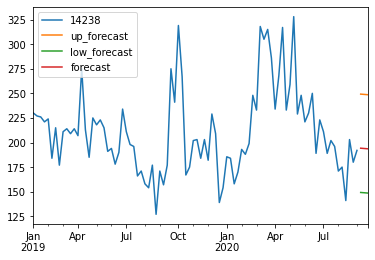

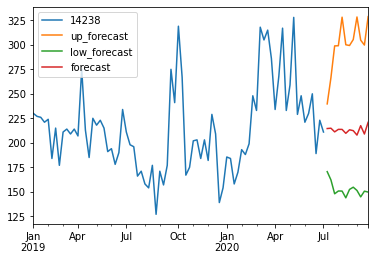

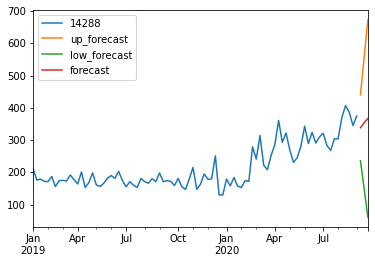

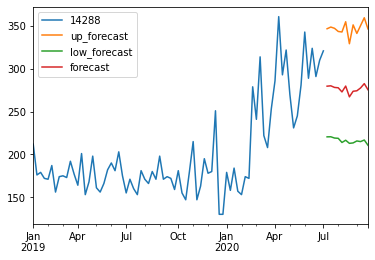

In [12]:
# herifra og nedover
train_on_individual_timeseries(selectedLowProducts)

        Ukedato  Vare_Id   Sales
103  2015-11-02    10022    29.0
127  2015-11-09    10022  1410.0
151  2015-11-16    10022  2601.0
175  2015-11-23    10022  3084.0
199  2015-11-30    10022  3917.0
...         ...      ...     ...
6252 2019-12-30    10022     2.0
6323 2020-01-13    10022     1.0
6359 2020-01-20    10022     1.0
6430 2020-02-03    10022     3.0
6741 2020-04-06    10022     1.0

[178 rows x 3 columns]
Model Number: 1 with model AverageValueNaive in generation 0 of 4
Model Number: 2 with model AverageValueNaive in generation 0 of 4
Model Number: 3 with model AverageValueNaive in generation 0 of 4
Model Number: 4 with model DatepartRegression in generation 0 of 4
Model Number: 5 with model DatepartRegression in generation 0 of 4
Model Number: 6 with model DatepartRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 7 with model DatepartRegression in generation 0 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 7: DatepartRegression
Model Number: 8 with model ETS in generation 0 of 4
Model Number: 9 with model ETS in generation 0 of 4
Model Number: 10 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 10: GLM
Model Number: 11 with model GLM in generation 0 of 4
Model Number: 12 with model GLS in generation 0 of 4
Model Number: 13 with model GLS in generation 0 of 4
Model Number: 14 with model LastValueNaive in generation 0 of 4
Model Number: 15 with model LastValueNaive in generation 0 of 4
Model Number: 16 with model LastValueNaive in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 17 with model LastValueNaive in generation 0 of 4
Model Number: 18 with model SeasonalNaive in generation 0 of 4
Model Number: 19 with model SeasonalNaive in generation 0 of 4
Model Number: 20 with model SeasonalNaive in generation 0 of 4
Model Number: 21 with model SeasonalNaive in generation 0 of 4
Model Number: 22 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 22: VAR
Model Number: 23 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 23: VAR
Model Number: 24 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 24: VAR
Model Number: 25 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 25: VECM
Model Number: 26 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 26: VECM
Mod

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/compat/pandas.py:65: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import Int64Index as NumericIndex
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1584: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed 

Model Number: 30 with model ZeroesNaive in generation 0 of 4
Model Number: 31 with model ZeroesNaive in generation 0 of 4
Model Number: 32 with model LastValueNaive in generation 0 of 4
Model Number: 33 with model AverageValueNaive in generation 0 of 4
Model Number: 34 with model GLS in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encounte

Model Number: 35 with model SeasonalNaive in generation 0 of 4
Model Number: 36 with model GLM in generation 0 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 36: GLM
Model Number: 37 with model ETS in generation 0 of 4
Model Number: 38 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 38: VAR
Model Number: 39 with model VECM in generation 0 of 4
Template Eval Error: LinAlgError('SVD did not converge') in model 39: VECM
Model Number: 40 with model WindowRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1584: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,


Model Number: 41 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 41: DatepartRegression
Model Number: 42 with model UnivariateMotif in generation 0 of 4
Model Number: 43 with model MultivariateMotif in generation 0 of 4
Model Number: 44 with model SectionalMotif in generation 0 of 4
Model Number: 45 with model NVAR in generation 0 of 4
Model Number: 46 with model ETS in generation 0 of 4
Model Number: 47 with model MultivariateMotif in generation 0 of 4
Model Number: 48 with model ZeroesNaive in generation 0 of 4
Model Number: 49 with model LastValueNaive in generation 0 of 4
Model Number: 50 with model ETS in generation 0 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 10022 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal compon

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Use

Model Number: 55 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 55: VAR
Model Number: 56 with model SectionalMotif in generation 0 of 4
Model Number: 57 with model GLM in generation 0 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 57: GLM
Model Number: 58 with model ETS in generation 0 of 4
Model Number: 59 with model ZeroesNaive in generation 0 of 4
Model Number: 60 with model VECM in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 60: VECM
Model Number: 61 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 61: VECM
Model Number: 62 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 62: VECM
Model Number: 63 with model UnivariateMotif in generation 0 of 4
Model Nu

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:426: RuntimeWarning: divide by zero encountered in true_divide
  endog_mu = self._clean(endog / mu)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return 1. /

Model Number: 67 with model NVAR in generation 0 of 4
Model Number: 68 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 68: VAR
Model Number: 69 with model VECM in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 69: VECM
Model Number: 70 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 70: GLM
Model Number: 71 with model MultivariateMotif in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 71: MultivariateMotif
Model Number: 72 with model ETS in generation 0 of 4
Model Number: 73 with model UnivariateMotif in generation 0 of 4
Model Number: 74 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 79 with model GLM in generation 0 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 79: GLM
Model Number: 80 with model UnivariateMotif in generation 0 of 4
Model Number: 81 with model UnivariateMotif in generation 0 of 4
Model Number: 82 with model GLS in generation 0 of 4
Model Number: 83 with model AverageValueNaive in generation 0 of 4
Model Number: 84 with model SeasonalNaive in generation 0 of 4
Model Number: 85 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (43)') in model 85: SectionalMotif
Model Number: 86 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 86: VECM
Model Number: 87 with model GLS in generation 0 of 4
Model Number: 88 with model NVAR in generation 0 of 4
Model Number: 89 with model DatepartRegression in generation 0 of 4
Model Number: 90 with model WindowRegressio

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: divide by zero encountered in true_divide


Model Number: 91 with model UnivariateMotif in generation 0 of 4
Model Number: 92 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 92: VAR
Model Number: 93 with model WindowRegression in generation 0 of 4
Model Number: 94 with model SectionalMotif in generation 0 of 4
Model Number: 95 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 95: VECM
Model Number: 96 with model SeasonalNaive in generation 0 of 4
Template Eval Error: ValueError('Model SeasonalNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 96: SeasonalNaive
Model Number: 97 with model GLS in generation 0 of 4
Model Number: 98 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 98: VECM
Model Number: 99 with model SectionalMotif in generation 0 of 4
Model Number: 100 with model NVAR in generation 0 of 4
Model Number: 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encount

Model Number: 107 with model AverageValueNaive in generation 1 of 4
Model Number: 108 with model AverageValueNaive in generation 1 of 4
Model Number: 109 with model DatepartRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 109: DatepartRegression
Model Number: 110 with model DatepartRegression in generation 1 of 4


[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-2)]: Done 432 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-2)]: Done 782 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-2)]: Done 1000 out of 1000 | elapsed:    1.1s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 432 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 782 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 1000 out of 1000 | elapsed:    0.0s finished


Model Number: 111 with model DatepartRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 111: DatepartRegression
Model Number: 112 with model ETS in generation 1 of 4
Model Number: 113 with model ETS in generation 1 of 4
Model Number: 114 with model ETS in generation 1 of 4
Model Number: 115 with model ETS in generation 1 of 4
Model Number: 116 with model GLM in generation 1 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 116: GLM
Model Number: 117 with model GLM in generation 1 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 117: GLM
Model Number: 118 with model GLM in generation 1 of 4
Template Eval

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =

Model Number: 144 with model UnivariateMotif in generation 1 of 4
Model Number: 145 with model UnivariateMotif in generation 1 of 4
Model Number: 146 with model UnivariateMotif in generation 1 of 4
Model Number: 147 with model UnivariateMotif in generation 1 of 4
Model Number: 148 with model MultivariateMotif in generation 1 of 4
Model Number: 149 with model MultivariateMotif in generation 1 of 4
Model Number: 150 with model MultivariateMotif in generation 1 of 4
Model Number: 151 with model MultivariateMotif in generation 1 of 4
Model Number: 152 with model SectionalMotif in generation 1 of 4
Model Number: 153 with model SectionalMotif in generation 1 of 4
Model Number: 154 with model SectionalMotif in generation 1 of 4
Model Number: 155 with model SectionalMotif in generation 1 of 4
Model Number: 156 with model NVAR in generation 1 of 4
Model Number: 157 with model NVAR in generation 1 of 4
Model Number: 158 with model NVAR in generation 1 of 4
Model Number: 159 with model NVAR in ge

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 168 with model ETS in generation 2 of 4
Model Number: 169 with model ETS in generation 2 of 4
Model Number: 170 with model GLM in generation 2 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 170: GLM
Model Number: 171 with model GLM in generation 2 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 171: GLM
Model Number: 172 with model GLM in generation 2 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 172: GLM
Model Number: 173 with model GLM in generation 2 of 4
Template Eval Error: ValueError('regression_type=

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1584: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return 

Model Number: 192 with model WindowRegression in generation 2 of 4
Model Number: 193 with model WindowRegression in generation 2 of 4
Template Eval Error: ValueError('Some value(s) of y are out of the valid range for family PoissonDistribution') in model 193: WindowRegression
Model Number: 194 with model ZeroesNaive in generation 2 of 4
Model Number: 195 with model ZeroesNaive in generation 2 of 4
Model Number: 196 with model ZeroesNaive in generation 2 of 4
Model Number: 197 with model UnivariateMotif in generation 2 of 4
Model Number: 198 with model UnivariateMotif in generation 2 of 4
Model Number: 199 with model UnivariateMotif in generation 2 of 4
Model Number: 200 with model UnivariateMotif in generation 2 of 4
Model Number: 201 with model MultivariateMotif in generation 2 of 4
Model Number: 202 with model MultivariateMotif in generation 2 of 4
Model Number: 203 with model MultivariateMotif in generation 2 of 4
Model Number: 204 with model MultivariateMotif in generation 2 of 4
M

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 209 with model NVAR in generation 2 of 4
Model Number: 210 with model NVAR in generation 2 of 4
Model Number: 211 with model NVAR in generation 2 of 4
Model Number: 212 with model NVAR in generation 2 of 4
New Generation: 3 of 4
Model Number: 213 with model AverageValueNaive in generation 3 of 4
Model Number: 214 with model AverageValueNaive in generation 3 of 4
Model Number: 215 with model AverageValueNaive in generation 3 of 4
Model Number: 216 with model DatepartRegression in generation 3 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 216: DatepartRegression
Model Number: 217 with model DatepartRegression in generation 3 of 4
Template Eval Error: ValueError("Input contains NaN, infinity or a value too large for dtype('float64').") in model 217: DatepartRegression
Model Number: 218 with model DatepartRegression in generation 3 of 4
Template Eval Error: ImportError('Tensorflow not available, install with p

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 223 with model GLM in generation 3 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 223: GLM
Model Number: 224 with model GLM in generation 3 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 224: GLM
Model Number: 225 with model GLM in generation 3 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 225: GLM
Model Number: 226 with model GLM in generation 3 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 226: GLM
Model Number: 227 with model GLS in generation 3 of 4
Model Number: 228 with model GLS in generation 3 of 4
Model Number: 229 with model GLS in generation 3

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/generalized_linear_model.py:298: DomainWarning: The inverse_power link function does not respect the domain of the Gamma family.
  warnings.warn((f"The {type(family.link).__name__} link function "
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)



Model Number: 243 with model VECM in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 243: VECM
Model Number: 244 with model VECM in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 244: VECM
Model Number: 245 with model WindowRegression in generation 3 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 245: WindowRegression
Model Number: 246 with model WindowRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 246: WindowRegression
Model Number: 247 with model WindowRegression in generation 3 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 247: WindowRegression
Model Number: 248 with model ZeroesNaive in generation 3 of 4
Model Number: 249 with model ZeroesNaive in generation 3 of 4
Model Number: 250 with model ZeroesNaive in generation 3 of 4
Model Number: 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 252 with model UnivariateMotif in generation 3 of 4
Model Number: 253 with model UnivariateMotif in generation 3 of 4
Model Number: 254 with model UnivariateMotif in generation 3 of 4
Model Number: 255 with model MultivariateMotif in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1584: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,


Template Eval Error: ValueError('Model MultivariateMotif returned NaN for one or more series. fail_on_forecast_nan=True') in model 255: MultivariateMotif
Model Number: 256 with model MultivariateMotif in generation 3 of 4
Model Number: 257 with model MultivariateMotif in generation 3 of 4
Template Eval Error: ValueError('Model MultivariateMotif returned NaN for one or more series. fail_on_forecast_nan=True') in model 257: MultivariateMotif
Model Number: 258 with model MultivariateMotif in generation 3 of 4
Model Number: 259 with model SectionalMotif in generation 3 of 4
Model Number: 260 with model SectionalMotif in generation 3 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (25)') in model 260: SectionalMotif
Model Number: 261 with model SectionalMotif in generation 3 of 4
Model Number: 262 with model SectionalMotif in generation 3 of 4
Model Number: 263 with model NVAR in generation 3 of 4
Model Number: 264 with model NVAR in generation 3 of 4
Model Number: 265 with mo

[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s


Model Number: 273 with model ETS in generation 4 of 4
Model Number: 274 with model ETS in generation 4 of 4
Model Number: 275 with model ETS in generation 4 of 4
Model Number: 276 with model ETS in generation 4 of 4


[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed:    0.3s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.042e+08, tolerance: 7.575e+04
  model = cd_fast.enet_coordinate_descent(


Model Number: 277 with model GLM in generation 4 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 277: GLM
Model Number: 278 with model GLM in generation 4 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 278: GLM
Model Number: 279 with model GLM in generation 4 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 279: GLM
Model Number: 280 with model GLM in generation 4 of 4
Model Number: 281 with model GLS in generation 4 of 4
Model Number: 282 with model GLS in generation 4 of 4
Model Number: 283 with model GLS in generation 4 of 4
Model Number: 284 with model LastValueNaive in generation 4 of 4
Model Number: 285 with model LastValueNaive in generation 4 of 4
Model Number: 286 with model LastValueNaive in generation 4 of 4
Model Number: 287 with model SeasonalNaive in generation 4 of 4
Model Number: 288 with model SeasonalNaive in ge

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.916e+08, tolerance: 9.424e+04
  model = cd_fast.enet_coordinate_descent(


Model Number: 290 with model SeasonalNaive in generation 4 of 4
Model Number: 291 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 291: VAR
Model Number: 292 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 292: VAR
Model Number: 293 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 293: VAR
Model Number: 294 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 294: VAR
Model Number: 295 with model VECM in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 295: VECM
Model Number: 296 with model VECM in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 296: VECM
Model Number: 297 with model VECM in generation 4 of 4
Template Eval Error: ValueError('Only gave one variab

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


Model Number: 306 with model UnivariateMotif in generation 4 of 4
Model Number: 307 with model UnivariateMotif in generation 4 of 4
Model Number: 308 with model UnivariateMotif in generation 4 of 4
Model Number: 309 with model MultivariateMotif in generation 4 of 4
Model Number: 310 with model MultivariateMotif in generation 4 of 4
Model Number: 311 with model MultivariateMotif in generation 4 of 4
Model Number: 312 with model MultivariateMotif in generation 4 of 4
Model Number: 313 with model SectionalMotif in generation 4 of 4
Template Eval Error: ValueError("regression_type=='User' but no future_regressor supplied") in model 313: SectionalMotif
Model Number: 314 with model SectionalMotif in generation 4 of 4
Model Number: 315 with model SectionalMotif in generation 4 of 4
Model Number: 316 with model SectionalMotif in generation 4 of 4
Model Number: 317 with model NVAR in generation 4 of 4
Model Number: 318 with model NVAR in generation 4 of 4
Model Number: 319 with model NVAR in ge

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/ensemble.py:918: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  mods = pd.Series()


Model Number: 321 with model Ensemble in generation 5 of 0
Model Number: 322 with model Ensemble in generation 5 of 0
Model Number: 323 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 10022 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 324 with model Ensemble in generation 5 of 0
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 10022 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 325 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 326 with model Ensemble in generation 5 of 0
Traceback (most recent call last):
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/evaluator/auto_model.py", line 885, in model_forecast
    df_forecast = model_forecast(
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/evaluator/auto_model.py", line 970, in model_forecast
    df_forecast = ModelPrediction(
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/evaluator/auto_model.py", line 550, in ModelPrediction
    df_forecast = model.predict(
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/statsmodels.py", line 312, in predict
    df_list.append(glm_forecast_by_column(df[col], X, Xf, args))
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/statsmodels.py", line 143, in glm_forecast_by_column
    model = SM_GLM(current_series.values, X, family=Binomial(), missing='drop').fit(
 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


6 - DatepartRegression with avg smape nan: 
Model Number: 7 of 49 with model ETS for Validation 1
7 - ETS with avg smape nan: 
Model Number: 8 of 49 with model ETS for Validation 1
8 - ETS with avg smape nan: 
Model Number: 9 of 49 with model GLM for Validation 1
9 - GLM with avg smape nan: 
Model Number: 10 of 49 with model GLS for Validation 1
10 - GLS with avg smape nan: 
Model Number: 11 of 49 with model GLS for Validation 1
11 - GLS with avg smape nan: 
Model Number: 12 of 49 with model LastValueNaive for Validation 1
12 - LastValueNaive with avg smape nan: 
Model Number: 13 of 49 with model LastValueNaive for Validation 1
13 - LastValueNaive with avg smape nan: 
Model Number: 14 of 49 with model LastValueNaive for Validation 1
14 - LastValueNaive with avg smape nan: 
Model Number: 15 of 49 with model LastValueNaive for Validation 1
15 - LastValueNaive with avg smape nan: 
Model Number: 16 of 49 with model SeasonalNaive for Validation 1
16 - SeasonalNaive with avg smape nan: 
Mode

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


17 - SeasonalNaive with avg smape nan: 
Model Number: 18 of 49 with model SeasonalNaive for Validation 1
18 - SeasonalNaive with avg smape nan: 
Model Number: 19 of 49 with model SeasonalNaive for Validation 1
19 - SeasonalNaive with avg smape nan: 
Model Number: 20 of 49 with model WindowRegression for Validation 1
20 - WindowRegression with avg smape nan: 
Model Number: 21 of 49 with model ZeroesNaive for Validation 1
21 - ZeroesNaive with avg smape nan: 
Model Number: 22 of 49 with model ZeroesNaive for Validation 1
22 - ZeroesNaive with avg smape nan: 
Model Number: 23 of 49 with model LastValueNaive for Validation 1
23 - LastValueNaive with avg smape nan: 
Model Number: 24 of 49 with model AverageValueNaive for Validation 1
24 - AverageValueNaive with avg smape nan: 
Model Number: 25 of 49 with model GLS for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


25 - GLS with avg smape nan: 
Model Number: 26 of 49 with model SeasonalNaive for Validation 1
26 - SeasonalNaive with avg smape nan: 
Model Number: 27 of 49 with model ETS for Validation 1
27 - ETS with avg smape nan: 
Model Number: 28 of 49 with model WindowRegression for Validation 1
28 - WindowRegression with avg smape nan: 
Model Number: 29 of 49 with model UnivariateMotif for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


29 - UnivariateMotif with avg smape nan: 
Model Number: 30 of 49 with model MultivariateMotif for Validation 1
30 - MultivariateMotif with avg smape nan: 
Model Number: 31 of 49 with model SectionalMotif for Validation 1
31 - SectionalMotif with avg smape nan: 
Model Number: 32 of 49 with model NVAR for Validation 1
32 - NVAR with avg smape nan: 
Model Number: 33 of 49 with model ETS for Validation 1
33 - ETS with avg smape nan: 
Model Number: 34 of 49 with model MultivariateMotif for Validation 1
34 - MultivariateMotif with avg smape nan: 
Model Number: 35 of 49 with model ZeroesNaive for Validation 1
35 - ZeroesNaive with avg smape nan: 
Model Number: 36 of 49 with model ETS for Validation 1
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 10022 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
36 - ETS with avg smape nan: 
Model Number: 37 of 49 with mo

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multi

44 - DatepartRegression with avg smape nan: 
Model Number: 45 of 49 with model NVAR for Validation 1
45 - NVAR with avg smape nan: 
Model Number: 46 of 49 with model UnivariateMotif for Validation 1
46 - UnivariateMotif with avg smape nan: 
Model Number: 47 of 49 with model MultivariateMotif for Validation 1
47 - MultivariateMotif with avg smape nan: 
Model Number: 48 of 49 with model UnivariateMotif for Validation 1
48 - UnivariateMotif with avg smape nan: 
Model Number: 49 of 49 with model DatepartRegression for Validation 1
49 - DatepartRegression with avg smape nan: 
Validation Round: 2
One or more series is 90% or more NaN in this test split
Model Number: 1 of 49 with model AverageValueNaive for Validation 2
1 - AverageValueNaive with avg smape nan: 
Model Number: 2 of 49 with model AverageValueNaive for Validation 2
2 - AverageValueNaive with avg smape nan: 
Model Number: 3 of 49 with model AverageValueNaive for Validation 2
3 - AverageValueNaive with avg smape nan: 
Model Number

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


6 - DatepartRegression with avg smape nan: 
Model Number: 7 of 49 with model ETS for Validation 2
7 - ETS with avg smape nan: 
Model Number: 8 of 49 with model ETS for Validation 2
8 - ETS with avg smape nan: 
Model Number: 9 of 49 with model GLM for Validation 2
9 - GLM with avg smape nan: 
Model Number: 10 of 49 with model GLS for Validation 2
10 - GLS with avg smape nan: 
Model Number: 11 of 49 with model GLS for Validation 2
11 - GLS with avg smape nan: 
Model Number: 12 of 49 with model LastValueNaive for Validation 2
12 - LastValueNaive with avg smape nan: 
Model Number: 13 of 49 with model LastValueNaive for Validation 2
13 - LastValueNaive with avg smape nan: 
Model Number: 14 of 49 with model LastValueNaive for Validation 2
14 - LastValueNaive with avg smape nan: 
Model Number: 15 of 49 with model LastValueNaive for Validation 2
15 - LastValueNaive with avg smape nan: 
Model Number: 16 of 49 with model SeasonalNaive for Validation 2
16 - SeasonalNaive with avg smape nan: 
Mode

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


17 - SeasonalNaive with avg smape nan: 
Model Number: 18 of 49 with model SeasonalNaive for Validation 2
18 - SeasonalNaive with avg smape nan: 
Model Number: 19 of 49 with model SeasonalNaive for Validation 2
19 - SeasonalNaive with avg smape nan: 
Model Number: 20 of 49 with model WindowRegression for Validation 2
20 - WindowRegression with avg smape nan: 
Model Number: 21 of 49 with model ZeroesNaive for Validation 2
21 - ZeroesNaive with avg smape nan: 
Model Number: 22 of 49 with model ZeroesNaive for Validation 2
22 - ZeroesNaive with avg smape nan: 
Model Number: 23 of 49 with model LastValueNaive for Validation 2
23 - LastValueNaive with avg smape nan: 
Model Number: 24 of 49 with model AverageValueNaive for Validation 2
24 - AverageValueNaive with avg smape nan: 
Model Number: 25 of 49 with model GLS for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


25 - GLS with avg smape nan: 
Model Number: 26 of 49 with model SeasonalNaive for Validation 2
26 - SeasonalNaive with avg smape nan: 
Model Number: 27 of 49 with model ETS for Validation 2
27 - ETS with avg smape nan: 
Model Number: 28 of 49 with model WindowRegression for Validation 2
28 - WindowRegression with avg smape nan: 
Model Number: 29 of 49 with model UnivariateMotif for Validation 2
29 - UnivariateMotif with avg smape nan: 
Model Number: 30 of 49 with model MultivariateMotif for Validation 2
30 - MultivariateMotif with avg smape nan: 
Model Number: 31 of 49 with model SectionalMotif for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


31 - SectionalMotif with avg smape nan: 
Model Number: 32 of 49 with model NVAR for Validation 2
32 - NVAR with avg smape nan: 
Model Number: 33 of 49 with model ETS for Validation 2
33 - ETS with avg smape nan: 
Model Number: 34 of 49 with model MultivariateMotif for Validation 2
34 - MultivariateMotif with avg smape nan: 
Model Number: 35 of 49 with model ZeroesNaive for Validation 2
35 - ZeroesNaive with avg smape nan: 
Model Number: 36 of 49 with model ETS for Validation 2
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 10022 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
36 - ETS with avg smape nan: 
Model Number: 37 of 49 with model MultivariateMotif for Validation 2
37 - MultivariateMotif with avg smape nan: 
Model Number: 38 of 49 with model GLS for Validation 2
38 - GLS with avg smape nan: 
Model Number: 39 of 49 with model SectionalMotif for 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multi

44 - DatepartRegression with avg smape nan: 
Model Number: 45 of 49 with model NVAR for Validation 2
45 - NVAR with avg smape nan: 
Model Number: 46 of 49 with model UnivariateMotif for Validation 2
46 - UnivariateMotif with avg smape nan: 
Model Number: 47 of 49 with model MultivariateMotif for Validation 2
47 - MultivariateMotif with avg smape nan: 
Model Number: 48 of 49 with model UnivariateMotif for Validation 2
48 - UnivariateMotif with avg smape nan: 
Model Number: 49 of 49 with model DatepartRegression for Validation 2
49 - DatepartRegression with avg smape nan: 
Initiated AutoTS object with best model: 
SeasonalNaive
{'fillna': 'mean', 'transformations': {'0': 'QuantileTransformer', '1': 'ClipOutliers'}, 'transformation_params': {'0': {'output_distribution': 'uniform', 'n_quantiles': 76}, '1': {'method': 'clip', 'std_threshold': 2, 'fillna': None}}}
{'method': 'lastvalue', 'lag_1': 7, 'lag_2': 2}
SMAPE: 199.66612451197824, nan, nan
MAE: 1196.0514124293784, nan, nan
SPL: 2.2396

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 7 with model DatepartRegression in generation 0 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 7: DatepartRegression
Model Number: 8 with model ETS in generation 0 of 4
Model Number: 9 with model ETS in generation 0 of 4
Model Number: 10 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 10: GLM
Model Number: 11 with model GLM in generation 0 of 4
Model Number: 12 with model GLS in generation 0 of 4
Model Number: 13 with model GLS in generation 0 of 4
Model Number: 14 with model LastValueNaive in generation 0 of 4
Model Number: 15 with model LastValueNaive in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 16 with model LastValueNaive in generation 0 of 4
Model Number: 17 with model LastValueNaive in generation 0 of 4
Model Number: 18 with model SeasonalNaive in generation 0 of 4
Model Number: 19 with model SeasonalNaive in generation 0 of 4
Model Number: 20 with model SeasonalNaive in generation 0 of 4
Model Number: 21 with model SeasonalNaive in generation 0 of 4
Model Number: 22 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 22: VAR
Model Number: 23 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 23: VAR
Model Number: 24 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 24: VAR
Model Number: 25 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 25: VECM
Model Number: 26 with model VECM in generation 0 of 4
Template Eval Error: Va

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 35 with model SeasonalNaive in generation 0 of 4
Model Number: 36 with model GLM in generation 0 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 36: GLM
Model Number: 37 with model ETS in generation 0 of 4
Model Number: 38 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 38: VAR
Model Number: 39 with model VECM in generation 0 of 4
Template Eval Error: LinAlgError('SVD did not converge') in model 39: VECM
Model Number: 40 with model WindowRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =

Model Number: 41 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 41: DatepartRegression
Model Number: 42 with model UnivariateMotif in generation 0 of 4
Model Number: 43 with model MultivariateMotif in generation 0 of 4
Model Number: 44 with model SectionalMotif in generation 0 of 4
Model Number: 45 with model NVAR in generation 0 of 4
Model Number: 46 with model ETS in generation 0 of 4
Model Number: 47 with model MultivariateMotif in generation 0 of 4
Model Number: 48 with model ZeroesNaive in generation 0 of 4
Model Number: 49 with model LastValueNaive in generation 0 of 4
Model Number: 50 with model ETS in generation 0 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 10022 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal compon

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)


Model Number: 51 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 51: VAR
Model Number: 52 with model MultivariateMotif in generation 0 of 4
Model Number: 53 with model ETS in generation 0 of 4
Model Number: 54 with model GLS in generation 0 of 4
Model Number: 55 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 55: VAR
Model Number: 56 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (90)') in model 56: SectionalMotif
Model Number: 57 with model GLM in generation 0 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 57: GLM
Model Number: 58 with model ETS in generation 0 of 4
Model Number: 59 with model ZeroesNaive in generation 0 of 4
Model Number: 60 with model VECM in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' bu

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess

Model Number: 64 with model UnivariateMotif in generation 0 of 4
Model Number: 65 with model NVAR in generation 0 of 4
Model Number: 66 with model DatepartRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with f

Model Number: 67 with model NVAR in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(


Model Number: 68 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 68: VAR
Model Number: 69 with model VECM in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 69: VECM
Model Number: 70 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 70: GLM
Model Number: 71 with model MultivariateMotif in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 71: MultivariateMotif
Model Number: 72 with model ETS in generation 0 of 4
Model Number: 73 with model UnivariateMotif in generation 0 of 4
Model Number: 74 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 74: VAR
Model Number: 75 with model ETS in generation

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 79 with model GLM in generation 0 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 79: GLM
Model Number: 80 with model UnivariateMotif in generation 0 of 4
Model Number: 81 with model UnivariateMotif in generation 0 of 4
Model Number: 82 with model GLS in generation 0 of 4
Model Number: 83 with model AverageValueNaive in generation 0 of 4
Model Number: 84 with model SeasonalNaive in generation 0 of 4
Model Number: 85 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (35)') in model 85: SectionalMotif
Model Number: 86 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 86: VECM
Model Number: 87 with model GLS in generation 0 of 4
Model Number: 88 with model NVAR in generation 0 of 4
Model Number: 89 with model DatepartRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: divide by zero encountered in true_divide


Model Number: 90 with model WindowRegression in generation 0 of 4
Model Number: 91 with model UnivariateMotif in generation 0 of 4
Model Number: 92 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 92: VAR
Model Number: 93 with model WindowRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


Model Number: 94 with model SectionalMotif in generation 0 of 4
Model Number: 95 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 95: VECM
Model Number: 96 with model SeasonalNaive in generation 0 of 4
Template Eval Error: ValueError('Model SeasonalNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 96: SeasonalNaive
Model Number: 97 with model GLS in generation 0 of 4
Model Number: 98 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 98: VECM
Model Number: 99 with model SectionalMotif in generation 0 of 4
Model Number: 100 with model NVAR in generation 0 of 4
Model Number: 101 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 101: DatepartRegression
Model Number: 102 with model SeasonalNaive in generation 0 of 4
Model Number: 103 with mo

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


Model Number: 110 with model ZeroesNaive in generation 1 of 4
Template Eval Error: Exception('Transformer QuantileTransformer failed on fit') in model 110: ZeroesNaive
Model Number: 111 with model ZeroesNaive in generation 1 of 4
Template Eval Error: KeyError(Timestamp('2015-11-02 00:00:00', freq='W-MON')) in model 111: ZeroesNaive
Model Number: 112 with model SectionalMotif in generation 1 of 4
Model Number: 113 with model SectionalMotif in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['Timestamp', 'int']. An error will be raised in 1.2.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1560: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(a,
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['Timestamp', 'int']. An error will be raised in 1.2.
  warnings.warn(


Model Number: 114 with model SectionalMotif in generation 1 of 4
Template Eval Error: ValueError('Model SectionalMotif returned NaN for one or more series. fail_on_forecast_nan=True') in model 114: SectionalMotif
Model Number: 115 with model SectionalMotif in generation 1 of 4
Model Number: 116 with model MultivariateMotif in generation 1 of 4
Model Number: 117 with model MultivariateMotif in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1584: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,


Model Number: 118 with model MultivariateMotif in generation 1 of 4
Model Number: 119 with model MultivariateMotif in generation 1 of 4
Model Number: 120 with model ETS in generation 1 of 4
Model Number: 121 with model ETS in generation 1 of 4
Model Number: 122 with model ETS in generation 1 of 4
Model Number: 123 with model ETS in generation 1 of 4
Model Number: 124 with model NVAR in generation 1 of 4
Model Number: 125 with model NVAR in generation 1 of 4
Model Number: 126 with model NVAR in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 127 with model NVAR in generation 1 of 4
Model Number: 128 with model LastValueNaive in generation 1 of 4
Model Number: 129 with model LastValueNaive in generation 1 of 4
Model Number: 130 with model LastValueNaive in generation 1 of 4
Model Number: 131 with model SeasonalNaive in generation 1 of 4
Model Number: 132 with model SeasonalNaive in generation 1 of 4
Model Number: 133 with model SeasonalNaive in generation 1 of 4
Model Number: 134 with model SeasonalNaive in generation 1 of 4
Model Number: 135 with model DatepartRegression in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) +

Model Number: 136 with model DatepartRegression in generation 1 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 136: DatepartRegression
Model Number: 137 with model DatepartRegression in generation 1 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 137: DatepartRegression
Model Number: 138 with model WindowRegression in generation 1 of 4
Model Number: 139 with model WindowRegression in generation 1 of 4
Template Eval Error: ModuleNotFoundError("No module named 'lightgbm'") in model 139: WindowRegression
Model Number: 140 with model WindowRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 140: WindowRegression
Model Number: 141 with model GLS in generation 1 of 4
Model Number: 142 with model GLS in generation 1 of 4
Model Number: 143 with model GLM in generat

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: divide by zero encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:56: RuntimeWarning: invalid value encountered in true_divide
  post_mu = (
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1346: RuntimeWarning: invalid value encountered in log
  resid_dev -= end

Model Number: 149 with model AverageValueNaive in generation 1 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 149: AverageValueNaive
Model Number: 150 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 150: VAR
Model Number: 151 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 151: VAR
Model Number: 152 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 152: VAR
Model Number: 153 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 153: VAR
Model Number: 154 with model VECM in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 154: VECM
Model Number: 155 with model VECM in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 155: VECM
Mode

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 182 with model LastValueNaive in generation 2 of 4
Model Number: 183 with model SeasonalNaive in generation 2 of 4
Model Number: 184 with model SeasonalNaive in generation 2 of 4
Model Number: 185 with model SeasonalNaive in generation 2 of 4
Model Number: 186 with model SeasonalNaive in generation 2 of 4
Model Number: 187 with model DatepartRegression in generation 2 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 187: DatepartRegression
Model Number: 188 with model DatepartRegression in generation 2 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 188: DatepartRegression
Model Number: 189 with model DatepartRegression in generation 2 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 189: DatepartRegression
Model Number: 190 with model GLS in generation 2 of 4
Model Number: 191 with model GLS

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


Model Number: 201 with model AverageValueNaive in generation 2 of 4
Model Number: 202 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 202: VAR
Model Number: 203 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 203: VAR
Model Number: 204 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 204: VAR
Model Number: 205 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 205: VAR
Model Number: 206 with model VECM in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 206: VECM
Model Number: 207 with model VECM in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 207: VECM
Model Number: 208 with model VECM in generation 2 of 4
Template Eval Error: ValueError('Only gave one va

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


Model Number: 242 with model SeasonalNaive in generation 3 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 242: SeasonalNaive
Model Number: 243 with model SeasonalNaive in generation 3 of 4
Model Number: 244 with model SeasonalNaive in generation 3 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 244: SeasonalNaive
Model Number: 245 with model SeasonalNaive in generation 3 of 4
Model Number: 246 with model DatepartRegression in generation 3 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 246: DatepartRegression
Model Number: 247 with model DatepartRegression in generation 3 of 4
Model Number: 248 with model DatepartRegression in generation 3 of 4
Model Number: 249 with model GLS in generation 3 of 4
Model Number: 250 with model GLS in generation 3 of 4
Model Number: 251 with model GLS in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =

Model Number: 252 with model WindowRegression in generation 3 of 4
Template Eval Error: ModuleNotFoundError("No module named 'lightgbm'") in model 252: WindowRegression
Model Number: 253 with model WindowRegression in generation 3 of 4
Model Number: 254 with model WindowRegression in generation 3 of 4
Model Number: 255 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 255: VAR
Model Number: 256 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 256: VAR
Model Number: 257 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 257: VAR
Model Number: 258 with model VECM in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 258: VECM
Model Number: 259 with model VECM in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 259: VECM
Model 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


Model Number: 268 with model UnivariateMotif in generation 4 of 4
Model Number: 269 with model UnivariateMotif in generation 4 of 4
Model Number: 270 with model SectionalMotif in generation 4 of 4
Model Number: 271 with model SectionalMotif in generation 4 of 4
Model Number: 272 with model SectionalMotif in generation 4 of 4
Model Number: 273 with model SectionalMotif in generation 4 of 4
Model Number: 274 with model WindowRegression in generation 4 of 4
Model Number: 275 with model WindowRegression in generation 4 of 4
Model Number: 276 with model WindowRegression in generation 4 of 4
Model Number: 277 with model NVAR in generation 4 of 4
Model Number: 278 with model NVAR in generation 4 of 4
Model Number: 279 with model NVAR in generation 4 of 4
Model Number: 280 with model NVAR in generation 4 of 4
Template Eval Error: Exception('Transformer MaxAbsScaler failed on inverse') in model 280: NVAR
Model Number: 281 with model ZeroesNaive in generation 4 of 4
Model Number: 282 with model 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_coordinate_descent.py:2441: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 30154022841.516422, tolerance: 29852856.92879831
  ) = cd_fast.enet_coordinate_descent_multi_task(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/sit

Model Number: 287 with model ETS in generation 4 of 4
Model Number: 288 with model LastValueNaive in generation 4 of 4
Model Number: 289 with model LastValueNaive in generation 4 of 4
Model Number: 290 with model LastValueNaive in generation 4 of 4
Model Number: 291 with model AverageValueNaive in generation 4 of 4
Model Number: 292 with model AverageValueNaive in generation 4 of 4
Model Number: 293 with model AverageValueNaive in generation 4 of 4
Model Number: 294 with model GLM in generation 4 of 4
Model Number: 295 with model GLM in generation 4 of 4
Template Eval Error: ValueError("Model returned NaN due to a preprocessing transformer {'fillna': 'mean', 'transformations': {'0': 'MaxAbsScaler', '1': 'PowerTransformer', '2': 'bkfilter', '3': 'CumSumTransformer', '4': 'MinMaxScaler'}, 'transformation_params': {'0': {}, '1': {}, '2': {}, '3': {}, '4': {}}}. fail_on_forecast_nan=True") in model 295: GLM
Model Number: 296 with model GLM in generation 4 of 4
Model Number: 297 with model 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/generalized_linear_model.py:298: DomainWarning: The inverse_power link function does not respect the domain of the Gamma family.
  warnings.warn((f"The {type(family.link).__name__} link function "
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/generalized_linear_model.py:298: DomainWarning: The inverse_power link function does not respect the domain of the Gamma family.
  warnings.warn((f"The {type(family.link).__name__} link function "
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/generalized_linear_model.py:298: DomainWarning: The inverse_power link function does not respect the domain of the Gamma family.
  warnings.warn((f"The {type(family.link).__name__} link function "
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  retur

Model Number: 307 with model GLS in generation 4 of 4
Model Number: 308 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 308: VAR
Model Number: 309 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 309: VAR
Model Number: 310 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 310: VAR
Model Number: 311 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 311: VAR
Model Number: 312 with model VECM in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 312: VECM
Model Number: 313 with model VECM in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 313: VECM
Model Number: 314 with model VECM in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VECM

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/ensemble.py:918: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  mods = pd.Series()


Model Number: 322 with model Ensemble in generation 5 of 0
Model Number: 323 with model Ensemble in generation 5 of 0
Validation Round: 1
Model Number: 1 of 49 with model MultivariateMotif for Validation 1
1 - MultivariateMotif with avg smape 183.22: 
Model Number: 2 of 49 with model Ensemble for Validation 1
2 - Ensemble with avg smape 183.22: 
Model Number: 3 of 49 with model Ensemble for Validation 1
3 - Ensemble with avg smape 187.33: 
Model Number: 4 of 49 with model Ensemble for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


4 - Ensemble with avg smape 187.49: 
Model Number: 5 of 49 with model Ensemble for Validation 1
5 - Ensemble with avg smape 187.49: 
Model Number: 6 of 49 with model Ensemble for Validation 1
6 - Ensemble with avg smape 186.67: 
Model Number: 7 of 49 with model UnivariateMotif for Validation 1
7 - UnivariateMotif with avg smape 187.91: 
Model Number: 8 of 49 with model UnivariateMotif for Validation 1
8 - UnivariateMotif with avg smape 187.91: 
Model Number: 9 of 49 with model UnivariateMotif for Validation 1
9 - UnivariateMotif with avg smape 145.45: 
Model Number: 10 of 49 with model SectionalMotif for Validation 1
10 - SectionalMotif with avg smape 189.74: 
Model Number: 11 of 49 with model UnivariateMotif for Validation 1
11 - UnivariateMotif with avg smape 187.37: 
Model Number: 12 of 49 with model UnivariateMotif for Validation 1
12 - UnivariateMotif with avg smape 185.2: 
Model Number: 13 of 49 with model MultivariateMotif for Validation 1
13 - MultivariateMotif with avg smape 1

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


30 - MultivariateMotif with avg smape 200.0: 
Model Number: 31 of 49 with model SectionalMotif for Validation 1
31 - SectionalMotif with avg smape 163.34: 
Model Number: 32 of 49 with model SectionalMotif for Validation 1
32 - SectionalMotif with avg smape 199.49: 
Model Number: 33 of 49 with model ETS for Validation 1
33 - ETS with avg smape 200.0: 
Model Number: 34 of 49 with model ETS for Validation 1
34 - ETS with avg smape 149.63: 
Model Number: 35 of 49 with model ETS for Validation 1
35 - ETS with avg smape 189.52: 
Model Number: 36 of 49 with model LastValueNaive for Validation 1
36 - LastValueNaive with avg smape 42.18: 
Model Number: 37 of 49 with model AverageValueNaive for Validation 1
37 - AverageValueNaive with avg smape 200.0: 
Model Number: 38 of 49 with model LastValueNaive for Validation 1
38 - LastValueNaive with avg smape 53.33: 
Model Number: 39 of 49 with model LastValueNaive for Validation 1
39 - LastValueNaive with avg smape 53.33: 
Model Number: 40 of 49 with m

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

3 - Ensemble with avg smape 182.79: 
Model Number: 4 of 49 with model Ensemble for Validation 2
4 - Ensemble with avg smape 182.7: 
Model Number: 5 of 49 with model Ensemble for Validation 2
5 - Ensemble with avg smape 182.7: 
Model Number: 6 of 49 with model Ensemble for Validation 2
6 - Ensemble with avg smape 182.43: 
Model Number: 7 of 49 with model UnivariateMotif for Validation 2
7 - UnivariateMotif with avg smape 180.88: 
Model Number: 8 of 49 with model UnivariateMotif for Validation 2
8 - UnivariateMotif with avg smape 180.88: 
Model Number: 9 of 49 with model UnivariateMotif for Validation 2
9 - UnivariateMotif with avg smape 79.79: 
Model Number: 10 of 49 with model SectionalMotif for Validation 2
10 - SectionalMotif with avg smape 181.51: 
Model Number: 11 of 49 with model UnivariateMotif for Validation 2
11 - UnivariateMotif with avg smape 180.95: 
Model Number: 12 of 49 with model UnivariateMotif for Validation 2
12 - UnivariateMotif with avg smape 172.42: 
Model Number: 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


30 - MultivariateMotif with avg smape 200.0: 
Model Number: 31 of 49 with model SectionalMotif for Validation 2
31 - SectionalMotif with avg smape 181.89: 
Model Number: 32 of 49 with model SectionalMotif for Validation 2
32 - SectionalMotif with avg smape 47.68: 
Model Number: 33 of 49 with model ETS for Validation 2
33 - ETS with avg smape 144.03: 
Model Number: 34 of 49 with model ETS for Validation 2
34 - ETS with avg smape 170.2: 
Model Number: 35 of 49 with model ETS for Validation 2
35 - ETS with avg smape 111.86: 
Model Number: 36 of 49 with model LastValueNaive for Validation 2
36 - LastValueNaive with avg smape 84.44: 
Model Number: 37 of 49 with model AverageValueNaive for Validation 2
37 - AverageValueNaive with avg smape 175.71: 
Model Number: 38 of 49 with model LastValueNaive for Validation 2
38 - LastValueNaive with avg smape 87.19: 
Model Number: 39 of 49 with model LastValueNaive for Validation 2
39 - LastValueNaive with avg smape 87.19: 
Model Number: 40 of 49 with m

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 1 with model AverageValueNaive in generation 0 of 4
Model Number: 2 with model AverageValueNaive in generation 0 of 4
Model Number: 3 with model AverageValueNaive in generation 0 of 4
Model Number: 4 with model DatepartRegression in generation 0 of 4
Model Number: 5 with model DatepartRegression in generation 0 of 4
Model Number: 6 with model DatepartRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 7 with model DatepartRegression in generation 0 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 7: DatepartRegression
Model Number: 8 with model ETS in generation 0 of 4
Model Number: 9 with model ETS in generation 0 of 4
Model Number: 10 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 10: GLM
Model Number: 11 with model GLM in generation 0 of 4
Model Number: 12 with model GLS in generation 0 of 4
Model Number: 13 with model GLS in generation 0 of 4
Model Number: 14 with model LastValueNaive in generation 0 of 4
Model Number: 15 with model LastValueNaive in generation 0 of 4
Model Number: 16 with model LastValueNaive in generation 0 of 4
Model Number: 17 with model LastValueNaive in generation 0 of 4
Model Number: 18 with m

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 19 with model SeasonalNaive in generation 0 of 4
Model Number: 20 with model SeasonalNaive in generation 0 of 4
Model Number: 21 with model SeasonalNaive in generation 0 of 4
Model Number: 22 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 22: VAR
Model Number: 23 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 23: VAR
Model Number: 24 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 24: VAR
Model Number: 25 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 25: VECM
Model Number: 26 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 26: VECM
Model Number: 27 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 2

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 36 with model GLM in generation 0 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 36: GLM
Model Number: 37 with model ETS in generation 0 of 4
Model Number: 38 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 38: VAR
Model Number: 39 with model VECM in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1584: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,


Template Eval Error: LinAlgError('SVD did not converge') in model 39: VECM
Model Number: 40 with model WindowRegression in generation 0 of 4
Model Number: 41 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 41: DatepartRegression
Model Number: 42 with model UnivariateMotif in generation 0 of 4
Model Number: 43 with model MultivariateMotif in generation 0 of 4
Model Number: 44 with model SectionalMotif in generation 0 of 4
Model Number: 45 with model NVAR in generation 0 of 4
Model Number: 46 with model ETS in generation 0 of 4
Model Number: 47 with model MultivariateMotif in generation 0 of 4
Model Number: 48 with model ZeroesNaive in generation 0 of 4
Model Number: 49 with model LastValueNaive in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)


Model Number: 50 with model ETS in generation 0 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9560 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 51 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 51: VAR
Model Number: 52 with model MultivariateMotif in generation 0 of 4
Model Number: 53 with model ETS in generation 0 of 4
Model Number: 54 with model GLS in generation 0 of 4
Model Number: 55 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 55: VAR
Model Number: 56 with model SectionalMotif in generation 0 of 4
Model Number: 57 with model GLM in generation 0 of 4
Model Number: 58 with model ETS in generation 0 of 4
Model Number: 59 with model ZeroesNaive in generation 0 of 4
Model Number: 60 with model VECM in g

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 67 with model NVAR in generation 0 of 4
Model Number: 68 with model VAR in generation 0 of 4

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)



Template Eval Error: ValueError('Only gave one variable to VAR') in model 68: VAR
Model Number: 69 with model VECM in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 69: VECM
Model Number: 70 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 70: GLM
Model Number: 71 with model MultivariateMotif in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 71: MultivariateMotif
Model Number: 72 with model ETS in generation 0 of 4
Model Number: 73 with model UnivariateMotif in generation 0 of 4
Model Number: 74 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 74: VAR
Model Number: 75 with model ETS in generation 0 of 4
Model Number: 76 with model MultivariateMoti

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 79 with model GLM in generation 0 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 79: GLM
Model Number: 80 with model UnivariateMotif in generation 0 of 4
Model Number: 81 with model UnivariateMotif in generation 0 of 4
Model Number: 82 with model GLS in generation 0 of 4
Model Number: 83 with model AverageValueNaive in generation 0 of 4
Model Number: 84 with model SeasonalNaive in generation 0 of 4
Model Number: 85 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (43)') in model 85: SectionalMotif
Model Number: 86 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 86: VECM
Model Number: 87 with model GLS in generation 0 of 4
Model Number: 88 with model NVAR in generation 0 of 4
Model Number: 89 with model DatepartRegression in generation 0 of 4
Model Number: 90 with model WindowRegressio

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: divide by zero encountered in true_divide


Model Number: 94 with model SectionalMotif in generation 0 of 4
Model Number: 95 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 95: VECM
Model Number: 96 with model SeasonalNaive in generation 0 of 4
Template Eval Error: ValueError('Model SeasonalNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 96: SeasonalNaive
Model Number: 97 with model GLS in generation 0 of 4
Model Number: 98 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 98: VECM
Model Number: 99 with model SectionalMotif in generation 0 of 4
Model Number: 100 with model NVAR in generation 0 of 4
Model Number: 101 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 101: DatepartRegression
Model Number: 102 with model SeasonalNaive in generation 0 of 4
Model Number: 103 with mo

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 108 with model ETS in generation 1 of 4
Model Number: 109 with model ETS in generation 1 of 4
Model Number: 110 with model LastValueNaive in generation 1 of 4
Model Number: 111 with model LastValueNaive in generation 1 of 4
Model Number: 112 with model LastValueNaive in generation 1 of 4
Template Eval Error: ValueError('Model LastValueNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 112: LastValueNaive
Model Number: 113 with model SectionalMotif in generation 1 of 4
Model Number: 114 with model SectionalMotif in generation 1 of 4
Model Number: 115 with model SectionalMotif in generation 1 of 4
Model Number: 116 with model SectionalMotif in generation 1 of 4
Model Number: 117 with model AverageValueNaive in generation 1 of 4
Model Number: 118 with model AverageValueNaive in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1584: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,


Model Number: 119 with model AverageValueNaive in generation 1 of 4
Model Number: 120 with model SeasonalNaive in generation 1 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 120: SeasonalNaive
Model Number: 121 with model SeasonalNaive in generation 1 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 121: SeasonalNaive
Model Number: 122 with model SeasonalNaive in generation 1 of 4
Model Number: 123 with model SeasonalNaive in generation 1 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 123: SeasonalNaive
Model Number: 124 with model UnivariateMotif in generation 1 of 4
Model Number: 125 with model UnivariateMotif in generation 1 of 4
Model Number: 126 with model UnivariateMotif in generation 1 of 4
Model Number: 127 with model UnivariateMotif in generation 1 of 4
Model Number: 128 with model ZeroesNaive in generation 1 of 4
Model Number: 129 with model ZeroesNaive in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simenna

Template Eval Error: ValueError('Only gave one variable to VAR') in model 151: VAR
Model Number: 152 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 152: VAR
Model Number: 153 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 153: VAR
Model Number: 154 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 154: VAR
Model Number: 155 with model VECM in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 155: VECM
Model Number: 156 with model VECM in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 156: VECM
Model Number: 157 with model VECM in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 157: VECM
Model Number: 158 with model VECM in generation 1 of 4
Template Eval Error: ValueError

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.631e-01, tolerance: 1.650e-04
  model = cd_fast.enet_coordinate_descent(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/User

Model Number: 200 with model DatepartRegression in generation 2 of 4


[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 432 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 782 tasks      | elapsed:    0.1s
[Parallel(n_jobs=9)]: Done 1000 out of 1000 | elapsed:    0.1s finished
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value

Model Number: 201 with model DatepartRegression in generation 2 of 4
Model Number: 202 with model WindowRegression in generation 2 of 4
Model Number: 203 with model WindowRegression in generation 2 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 203: WindowRegression
Model Number: 204 with model WindowRegression in generation 2 of 4
Model Number: 205 with model VAR in generation 2 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 205: VAR
Model Number: 206 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 206: VAR
Model Number: 207 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 207: VAR
Model Number: 208 with model VAR in generation 2 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names 

Template Eval Error: Exception('Transformer MinMaxScaler failed on fit') in model 208: VAR
Model Number: 209 with model VECM in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 209: VECM
Model Number: 210 with model VECM in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 210: VECM
Model Number: 211 with model VECM in generation 2 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 211: VECM
Model Number: 212 with model VECM in generation 2 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 212: VECM
New Generation: 3 of 4
Model Number: 213 with model MultivariateMotif in generation 3 of 4
Model Number: 214 with model MultivariateMotif in generation 3 of 4
Model Number: 215 with model MultivariateMotif in generation 3 of 4
Model Number: 216 with model MultivariateMotif in generation 3 of 4
Mode

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1346: RuntimeWarning: divide by zero encountered in log
  resid_dev -= endog_alpha * np.log(endog_a

Model Number: 221 with model ETS in generation 3 of 4
ETS error ValueError('Can only dampen the trend component')
ETS failed on 9560 with ValueError('Can only dampen the trend component')
Model Number: 222 with model ETS in generation 3 of 4
Model Number: 223 with model ETS in generation 3 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9560 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 224 with model ETS in generation 3 of 4
Model Number: 225 with model UnivariateMotif in generation 3 of 4
Model Number: 226 with model UnivariateMotif in generation 3 of 4
Model Number: 227 with model UnivariateMotif in generation 3 of 4
Model Number: 228 with model UnivariateMotif in generation 3 of 4
Model Number: 229 with model ZeroesNaive in generation 3 of 4
Model Number: 230 with model ZeroesNaive in generation 3 of 4
Model Number: 231 with mod

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 241 with model SectionalMotif in generation 3 of 4
Model Number: 242 with model SeasonalNaive in generation 3 of 4
Model Number: 243 with model SeasonalNaive in generation 3 of 4
Model Number: 244 with model SeasonalNaive in generation 3 of 4
Model Number: 245 with model SeasonalNaive in generation 3 of 4
Model Number: 246 with model NVAR in generation 3 of 4
Model Number: 247 with model NVAR in generation 3 of 4
Model Number: 248 with model NVAR in generation 3 of 4
Model Number: 249 with model NVAR in generation 3 of 4
Model Number: 250 with model DatepartRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 250: DatepartRegression
Model Number: 251 with model DatepartRegression in generation 3 of 4
Model Number: 252 with model DatepartRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 252: DatepartRegression
Model Nu

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encount

Model Number: 257 with model WindowRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 257: WindowRegression
Model Number: 258 with model WindowRegression in generation 3 of 4
Template Eval Error: ValueError("Input contains NaN, infinity or a value too large for dtype('float32').") in model 258: WindowRegression
Model Number: 259 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 259: VAR
Model Number: 260 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 260: VAR
Model Number: 261 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 261: VAR
Model Number: 262 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 262: VAR
Model Number: 263 with model VECM in generation 3 of 4
Templ

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/generalized_linear_model.py:298: DomainWarning: The inverse_power link function does not respect the domain of the Gamma family.
  warnings.warn((f"The {type(family.link).__name__} link function "
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/function_base.py:527: RuntimeWarning: invalid value encountered in multiply
  avg = np.multiply(a, wgt, dtype=result_dtype).sum(axis)/scl


Model Number: 281 with model ETS in generation 4 of 4
ETS error ValueError('Cannot compute initial seasonals using heuristic method with less than two full seasonal cycles in the data.')
ETS failed on 9560 with ValueError('Cannot compute initial seasonals using heuristic method with less than two full seasonal cycles in the data.')
Model Number: 282 with model ETS in generation 4 of 4
ETS error ValueError('Can only dampen the trend component')
ETS failed on 9560 with ValueError('Can only dampen the trend component')
Template Eval Error: ValueError("Model returned NaN due to a preprocessing transformer {'fillna': None, 'transformations': {'0': 'SeasonalDifference', '1': 'RollingMeanTransformer', '2': 'SeasonalDifference'}, 'transformation_params': {'0': {'lag_1': 92, 'method': 'LastValue'}, '1': {'fixed': True, 'window': 28}, '2': {'lag_1': 28, 'method': 'Median'}}}. fail_on_forecast_nan=True") in model 282: ETS
Model Number: 283 with model SectionalMotif in generation 4 of 4
Model Numb

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess

Model Number: 302 with model SeasonalNaive in generation 4 of 4
Model Number: 303 with model WindowRegression in generation 4 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 303: WindowRegression
Model Number: 304 with model WindowRegression in generation 4 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 304: WindowRegression
Model Number: 305 with model WindowRegression in generation 4 of 4
Template Eval Error: LinAlgError("The kernel, ExpSineSquared(length_scale=1, periodicity=1), is not returning a positive definite matrix. Try gradually increasing the 'alpha' parameter of your GaussianProcessRegressor estimator.", '37-th leading minor of the array is not positive definite') in model 305: WindowRegression
Model Number: 306 with model NVAR in generation 4 of 4
Model Number: 307 with model NVAR in generation 4 of 4
Model Number: 308 with model NVAR in generation 4 of

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.671e-01, tolerance: 1.023e-03
  model = cd_fast.enet_coordinate_descent(


Model Number: 321 with model Ensemble in generation 5 of 0
Model Number: 322 with model Ensemble in generation 5 of 0
Model Number: 323 with model Ensemble in generation 5 of 0
Model Number: 324 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/ensemble.py:918: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  mods = pd.Series()
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 325 with model Ensemble in generation 5 of 0
Model Number: 326 with model Ensemble in generation 5 of 0
Model Number: 327 with model Ensemble in generation 5 of 0
Model Number: 328 with model Ensemble in generation 5 of 0
Validation Round: 1
Model Number: 1 of 50 with model Ensemble for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


1 - Ensemble with avg smape 199.97: 
Model Number: 2 of 50 with model MultivariateMotif for Validation 1
2 - MultivariateMotif with avg smape 167.85: 
Model Number: 3 of 50 with model Ensemble for Validation 1
3 - Ensemble with avg smape 145.02: 
Model Number: 4 of 50 with model Ensemble for Validation 1
4 - Ensemble with avg smape 172.92: 
Model Number: 5 of 50 with model Ensemble for Validation 1
5 - Ensemble with avg smape 172.92: 
Model Number: 6 of 50 with model Ensemble for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


6 - Ensemble with avg smape 167.85: 
Model Number: 7 of 50 with model GLM for Validation 1
7 - GLM with avg smape 50.0: 
Model Number: 8 of 50 with model AverageValueNaive for Validation 1
8 - AverageValueNaive with avg smape 185.3: 
Model Number: 9 of 50 with model ZeroesNaive for Validation 1
9 - ZeroesNaive with avg smape 199.99: 
Model Number: 10 of 50 with model MultivariateMotif for Validation 1
10 - MultivariateMotif with avg smape 145.02: 
Model Number: 11 of 50 with model ETS for Validation 1
11 - ETS with avg smape 0.0: 
Model Number: 12 of 50 with model SectionalMotif for Validation 1
12 - SectionalMotif with avg smape 199.83: 


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 13 of 50 with model ETS for Validation 1
13 - ETS with avg smape 199.77: 
Model Number: 14 of 50 with model UnivariateMotif for Validation 1
14 - UnivariateMotif with avg smape 199.98: 
Model Number: 15 of 50 with model MultivariateMotif for Validation 1
15 - MultivariateMotif with avg smape 158.36: 
Model Number: 16 of 50 with model UnivariateMotif for Validation 1
16 - UnivariateMotif with avg smape 176.84: 
Model Number: 17 of 50 with model MultivariateMotif for Validation 1
17 - MultivariateMotif with avg smape 50.0: 
Model Number: 18 of 50 with model AverageValueNaive for Validation 1
18 - AverageValueNaive with avg smape 50.0: 
Model Number: 19 of 50 with model ZeroesNaive for Validation 1
19 - ZeroesNaive with avg smape 0.0: 
Model Number: 20 of 50 with model SectionalMotif for Validation 1
20 - SectionalMotif with avg smape 91.01: 
Model Number: 21 of 50 with model ETS for Validation 1
21 - ETS with avg smape 0.0: 
Model Number: 22 of 50 with model ETS for Validat

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


36 - LastValueNaive with avg smape 100.0: 
Model Number: 37 of 50 with model LastValueNaive for Validation 1
37 - LastValueNaive with avg smape 100.0: 
Model Number: 38 of 50 with model SectionalMotif for Validation 1
38 - SectionalMotif with avg smape 123.65: 
Model Number: 39 of 50 with model SectionalMotif for Validation 1
39 - SectionalMotif with avg smape 123.21: 
Model Number: 40 of 50 with model AverageValueNaive for Validation 1
40 - AverageValueNaive with avg smape 84.52: 
Model Number: 41 of 50 with model ZeroesNaive for Validation 1
41 - ZeroesNaive with avg smape 142.32: 
Model Number: 42 of 50 with model SeasonalNaive for Validation 1
42 - SeasonalNaive with avg smape 157.67: 
Model Number: 43 of 50 with model ZeroesNaive for Validation 1
43 - ZeroesNaive with avg smape 200.0: 
Model Number: 44 of 50 with model SeasonalNaive for Validation 1
44 - SeasonalNaive with avg smape 176.31: 
Model Number: 45 of 50 with model SeasonalNaive for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encount

45 - SeasonalNaive with avg smape 132.47: 
Model Number: 46 of 50 with model SeasonalNaive for Validation 1
46 - SeasonalNaive with avg smape 194.14: 
Model Number: 47 of 50 with model SeasonalNaive for Validation 1
47 - SeasonalNaive with avg smape 194.08: 
Model Number: 48 of 50 with model WindowRegression for Validation 1
48 - WindowRegression with avg smape 100.06: 
Model Number: 49 of 50 with model ETS for Validation 1
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9560 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
49 - ETS with avg smape 174.97: 
Model Number: 50 of 50 with model ZeroesNaive for Validation 1
50 - ZeroesNaive with avg smape 157.07: 
Validation Round: 2
Model Number: 1 of 50 with model Ensemble for Validation 2
1 - Ensemble with avg smape 162.81: 
Model Number: 2 of 50 with model MultivariateMotif for Validation 2
2 - Multivariat

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


3 - Ensemble with avg smape 55.22: 
Model Number: 4 of 50 with model Ensemble for Validation 2
4 - Ensemble with avg smape 169.28: 
Model Number: 5 of 50 with model Ensemble for Validation 2
5 - Ensemble with avg smape 169.28: 
Model Number: 6 of 50 with model Ensemble for Validation 2
6 - Ensemble with avg smape 82.82: 
Model Number: 7 of 50 with model GLM for Validation 2
7 - GLM with avg smape 34.22: 
Model Number: 8 of 50 with model AverageValueNaive for Validation 2
8 - AverageValueNaive with avg smape 181.34: 
Model Number: 9 of 50 with model ZeroesNaive for Validation 2
9 - ZeroesNaive with avg smape 200.0: 
Model Number: 10 of 50 with model MultivariateMotif for Validation 2
10 - MultivariateMotif with avg smape 55.22: 
Model Number: 11 of 50 with model ETS for Validation 2
11 - ETS with avg smape 113.64: 
Model Number: 12 of 50 with model SectionalMotif for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


12 - SectionalMotif with avg smape 185.53: 
Model Number: 13 of 50 with model ETS for Validation 2
13 - ETS with avg smape 199.91: 
Model Number: 14 of 50 with model UnivariateMotif for Validation 2
14 - UnivariateMotif with avg smape 199.92: 
Model Number: 15 of 50 with model MultivariateMotif for Validation 2
15 - MultivariateMotif with avg smape 199.78: 
Model Number: 16 of 50 with model UnivariateMotif for Validation 2
16 - UnivariateMotif with avg smape 195.99: 
Model Number: 17 of 50 with model MultivariateMotif for Validation 2
17 - MultivariateMotif with avg smape 116.52: 
Model Number: 18 of 50 with model AverageValueNaive for Validation 2
18 - AverageValueNaive with avg smape 52.37: 
Model Number: 19 of 50 with model ZeroesNaive for Validation 2
19 - ZeroesNaive with avg smape 83.63: 
Model Number: 20 of 50 with model SectionalMotif for Validation 2
20 - SectionalMotif with avg smape 199.52: 
Model Number: 21 of 50 with model ETS for Validation 2
21 - ETS with avg smape 113.6

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


37 - LastValueNaive with avg smape 199.25: 
Model Number: 38 of 50 with model SectionalMotif for Validation 2
38 - SectionalMotif with avg smape 15.75: 
Model Number: 39 of 50 with model SectionalMotif for Validation 2
39 - SectionalMotif with avg smape 16.43: 
Model Number: 40 of 50 with model AverageValueNaive for Validation 2
40 - AverageValueNaive with avg smape 199.25: 
Model Number: 41 of 50 with model ZeroesNaive for Validation 2
41 - ZeroesNaive with avg smape 200.0: 
Model Number: 42 of 50 with model SeasonalNaive for Validation 2
42 - SeasonalNaive with avg smape 132.0: 
Model Number: 43 of 50 with model ZeroesNaive for Validation 2
43 - ZeroesNaive with avg smape 200.0: 
Model Number: 44 of 50 with model SeasonalNaive for Validation 2
44 - SeasonalNaive with avg smape 191.44: 
Model Number: 45 of 50 with model SeasonalNaive for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


45 - SeasonalNaive with avg smape 139.11: 
Model Number: 46 of 50 with model SeasonalNaive for Validation 2
46 - SeasonalNaive with avg smape 198.67: 
Model Number: 47 of 50 with model SeasonalNaive for Validation 2
47 - SeasonalNaive with avg smape 198.35: 
Model Number: 48 of 50 with model WindowRegression for Validation 2
48 - WindowRegression with avg smape 199.25: 
Model Number: 49 of 50 with model ETS for Validation 2
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9560 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
49 - ETS with avg smape 177.54: 
Model Number: 50 of 50 with model ZeroesNaive for Validation 2
50 - ZeroesNaive with avg smape 68.8: 
Initiated AutoTS object with best model: 
SectionalMotif
{'fillna': 'cubic', 'transformations': {'0': 'ScipyFilter', '1': 'PCA'}, 'transformation_params': {'0': {'method': 'wiener', 'method_args': None

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 6 with model DatepartRegression in generation 0 of 4
Model Number: 7 with model DatepartRegression in generation 0 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 7: DatepartRegression
Model Number: 8 with model ETS in generation 0 of 4
Model Number: 9 with model ETS in generation 0 of 4
Model Number: 10 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 10: GLM
Model Number: 11 with model GLM in generation 0 of 4
Model Number: 12 with model GLS in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 13 with model GLS in generation 0 of 4
Model Number: 14 with model LastValueNaive in generation 0 of 4
Model Number: 15 with model LastValueNaive in generation 0 of 4
Model Number: 16 with model LastValueNaive in generation 0 of 4
Model Number: 17 with model LastValueNaive in generation 0 of 4
Model Number: 18 with model SeasonalNaive in generation 0 of 4
Model Number: 19 with model SeasonalNaive in generation 0 of 4
Model Number: 20 with model SeasonalNaive in generation 0 of 4
Model Number: 21 with model SeasonalNaive in generation 0 of 4
Model Number: 22 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 22: VAR
Model Number: 23 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 23: VAR
Model Number: 24 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 24: VAR
Model Number: 25 with model VECM i

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 34 with model GLS in generation 0 of 4
Model Number: 35 with model SeasonalNaive in generation 0 of 4
Model Number: 36 with model GLM in generation 0 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 36: GLM
Model Number: 37 with model ETS in generation 0 of 4
Model Number: 38 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 38: VAR
Model Number: 39 with model VECM in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =

Template Eval Error: LinAlgError('SVD did not converge') in model 39: VECM
Model Number: 40 with model WindowRegression in generation 0 of 4
Model Number: 41 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 41: DatepartRegression
Model Number: 42 with model UnivariateMotif in generation 0 of 4
Model Number: 43 with model MultivariateMotif in generation 0 of 4
Model Number: 44 with model SectionalMotif in generation 0 of 4
Model Number: 45 with model NVAR in generation 0 of 4
Model Number: 46 with model ETS in generation 0 of 4
Model Number: 47 with model MultivariateMotif in generation 0 of 4
Model Number: 48 with model ZeroesNaive in generation 0 of 4
Model Number: 49 with model LastValueNaive in generation 0 of 4
Model Number: 50 with model ETS in generation 0 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)



Template Eval Error: ValueError('Only gave one variable to VAR') in model 51: VAR
Model Number: 52 with model MultivariateMotif in generation 0 of 4
Model Number: 53 with model ETS in generation 0 of 4
Model Number: 54 with model GLS in generation 0 of 4
Model Number: 55 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 55: VAR
Model Number: 56 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (94)') in model 56: SectionalMotif
Model Number: 57 with model GLM in generation 0 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 57: GLM
Model Number: 58 with model ETS in generation 0 of 4
Model Number: 59 with model ZeroesNaive in generation 0 of 4
Model Number: 60 with model VECM in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 60: VECM
M

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 67 with model NVAR in generation 0 of 4
Model Number: 68 with model VAR in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennae

Template Eval Error: ValueError('Only gave one variable to VAR') in model 68: VAR
Model Number: 69 with model VECM in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 69: VECM
Model Number: 70 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 70: GLM
Model Number: 71 with model MultivariateMotif in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 71: MultivariateMotif
Model Number: 72 with model ETS in generation 0 of 4
Model Number: 73 with model UnivariateMotif in generation 0 of 4
Model Number: 74 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 74: VAR
Model Number: 75 with model ETS in generation 0 of 4
Model Number: 76 with model MultivariateMotif

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess

Model Number: 79 with model GLM in generation 0 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 79: GLM
Model Number: 80 with model UnivariateMotif in generation 0 of 4
Model Number: 81 with model UnivariateMotif in generation 0 of 4
Model Number: 82 with model GLS in generation 0 of 4
Model Number: 83 with model AverageValueNaive in generation 0 of 4
Model Number: 84 with model SeasonalNaive in generation 0 of 4
Model Number: 85 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (37)') in model 85: SectionalMotif
Model Number: 86 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 86: VECM
Model Number: 87 with model GLS in generation 0 of 4
Model Number: 88 with model NVAR in generation 0 of 4
Model Number: 89 with model DatepartRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: divide by zero encountered in true_divide


Model Number: 90 with model WindowRegression in generation 0 of 4
Model Number: 91 with model UnivariateMotif in generation 0 of 4
Model Number: 92 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 92: VAR
Model Number: 93 with model WindowRegression in generation 0 of 4
Model Number: 94 with model SectionalMotif in generation 0 of 4
Model Number: 95 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 95: VECM
Model Number: 96 with model SeasonalNaive in generation 0 of 4
Template Eval Error: ValueError('Model SeasonalNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 96: SeasonalNaive
Model Number: 97 with model GLS in generation 0 of 4
Model Number: 98 with model VECM in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 98: VECM
Model Number: 99 with model SectionalMotif

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/metrics/_regression.py:796: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/metrics/_regression.py:796: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarni


Model Number: 109 with model NVAR in generation 1 of 4
Model Number: 110 with model WindowRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 110: WindowRegression
Model Number: 111 with model WindowRegression in generation 1 of 4
Template Eval Error: ValueError("Model returned NaN due to a preprocessing transformer {'fillna': 'zero', 'transformations': {'0': 'PowerTransformer', '1': 'Discretize', '2': 'RollingMean100thN', '3': 'ClipOutliers', '4': 'RollingMeanTransformer'}, 'transformation_params': {'0': {}, '1': {'discretization': 'upper', 'n_bins': 20}, '2': {}, '3': {'method': 'remove', 'std_threshold': 3.5, 'fillna': 'mean'}, '4': {'fixed': True, 'window': 7}}}. fail_on_forecast_nan=True") in model 111: WindowRegression
Model Number: 112 with model WindowRegression in generation 1 of 4
Model Number: 113 with model SectionalMotif in generation 1 of 4
Model Number: 114 with model SectionalMotif in generat

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/compat/pandas.py:65: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import Int64Index as NumericIndex
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1218: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(a, func=_nanmedian, axis=axis, out=out,
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1584: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/basics.py:1081: RuntimeWarning: Mean of empty slice
  forecast = np.nanmean(results, axis=0)


Model Number: 128 with model UnivariateMotif in generation 1 of 4
Model Number: 129 with model DatepartRegression in generation 1 of 4
Model Number: 130 with model DatepartRegression in generation 1 of 4
Model Number: 131 with model DatepartRegression in generation 1 of 4
Model Number: 132 with model GLS in generation 1 of 4
Model Number: 133 with model GLS in generation 1 of 4
Model Number: 134 with model GLS in generation 1 of 4
Model Number: 135 with model LastValueNaive in generation 1 of 4
Model Number: 136 with model LastValueNaive in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-pack

Model Number: 137 with model LastValueNaive in generation 1 of 4
Model Number: 138 with model GLM in generation 1 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 138: GLM
Model Number: 139 with model GLM in generation 1 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 139: GLM
Model Number: 140 with model GLM in generation 1 of 4
Model Number: 141 with model GLM in generation 1 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 141: GLM
Model Number: 142 with model AverageValueNaive in generation 1 of 4
Model Number: 143 with model AverageValueNaive in generation 1 of 4
Model Number: 144 with model AverageValueNaive in generation 1 of 4
Model Number: 145 with model ETS in generation 1 of 4
Model Number: 146 with model ETS in generation 1 of 4
Model Number: 147 with model ETS in generation 1 of 4
Model Number: 148 with model ETS in ge

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8

Model Number: 150 with model ZeroesNaive in generation 1 of 4
Model Number: 151 with model ZeroesNaive in generation 1 of 4
Model Number: 152 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 152: VAR
Model Number: 153 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 153: VAR
Model Number: 154 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 154: VAR
Model Number: 155 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 155: VAR
Model Number: 156 with model VECM in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 156: VECM
Model Number: 157 with model VECM in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 157: VECM
Model Number: 158 with model VECM in generation 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/compat/pandas.py:65: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import Int64Index as NumericIndex
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1218: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(a, func=_nanmedian, axis=axis, out=out,
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1584: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/basics.py:1081: RuntimeWarning: Mean of empty slice
  forecast = np.nanmean(results, axis=0)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/compat/pandas.py:65: FutureWarning: pandas.Int64Index is 

Model Number: 178 with model NVAR in generation 2 of 4
Model Number: 179 with model NVAR in generation 2 of 4
Model Number: 180 with model NVAR in generation 2 of 4


[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/compat/pandas.py:65: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import Int64Index as NumericIndex
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1218: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(a, func=_nanmedian, axis=axis, out=out,
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1584: RuntimeWarning: All-NaN slice encountered
  result = np.ap

Model Number: 181 with model NVAR in generation 2 of 4
Model Number: 182 with model WindowRegression in generation 2 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 182: WindowRegression
Model Number: 183 with model WindowRegression in generation 2 of 4
Model Number: 184 with model WindowRegression in generation 2 of 4
Model Number: 185 with model SectionalMotif in generation 2 of 4

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/compat/pandas.py:65: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import Int64Index as NumericIndex
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1218: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(a, func=_nanmedian, axis=axis, out=out,
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1584: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/basics.py:1081: RuntimeWarning: Mean of empty slice
  forecast = np.nanmean(results, axis=0)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/compat/pandas.py:65: FutureWarning: pandas.Int64Index is 


Model Number: 186 with model SectionalMotif in generation 2 of 4
Model Number: 187 with model SectionalMotif in generation 2 of 4
Model Number: 188 with model SectionalMotif in generation 2 of 4
Model Number: 189 with model MultivariateMotif in generation 2 of 4
Model Number: 190 with model MultivariateMotif in generation 2 of 4
Model Number: 191 with model MultivariateMotif in generation 2 of 4
Model Number: 192 with model MultivariateMotif in generation 2 of 4
Model Number: 193 with model GLS in generation 2 of 4
Model Number: 194 with model GLS in generation 2 of 4
Model Number: 195 with model GLS in generation 2 of 4
Model Number: 196 with model LastValueNaive in generation 2 of 4
Model Number: 197 with model LastValueNaive in generation 2 of 4
Model Number: 198 with model LastValueNaive in generation 2 of 4
Model Number: 199 with model GLM in generation 2 of 4
Model Number: 200 with model GLM in generation 2 of 4
Template Eval Error: ValueError('regression_type=user and no future

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 206 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 206: VAR
Model Number: 207 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 207: VAR
Model Number: 208 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 208: VAR
Model Number: 209 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 209: VAR
Model Number: 210 with model VECM in generation 2 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 210: VECM
Model Number: 211 with model VECM in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 211: VECM
Model Number: 212 with model VECM in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 212: VECM
Model N

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 225 with model WindowRegression in generation 3 of 4
Model Number: 226 with model WindowRegression in generation 3 of 4
Model Number: 227 with model WindowRegression in generation 3 of 4
Model Number: 228 with model SeasonalNaive in generation 3 of 4
Model Number: 229 with model SeasonalNaive in generation 3 of 4
Model Number: 230 with model SeasonalNaive in generation 3 of 4
Model Number: 231 with model SeasonalNaive in generation 3 of 4
Model Number: 232 with model NVAR in generation 3 of 4
Model Number: 233 with model NVAR in generation 3 of 4
Model Number: 234 with model NVAR in generation 3 of 4
Model Number: 235 with model NVAR in generation 3 of 4
Model Number: 236 with model UnivariateMotif in generation 3 of 4
Model Number: 237 with model UnivariateMotif in generation 3 of 4
Model Number: 238 with model UnivariateMotif in generation 3 of 4
Model Number: 239 with model UnivariateMotif in generation 3 of 4
Model Number: 240 with model LastValueNaive in generation 3

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/generalized_linear_model.py:298: DomainWarning: The inverse_power link function does not respect the domain of the Gamma family.
  warnings.warn((f"The {type(family.link).__name__} link function "
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/generalized_linear_model.py:298: DomainWarning: The inverse_power link function does not respect the domain of the Gamma family.
  warnings.warn((f"The {type(family.link).__name__} link function "
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:177: RuntimeWarning: invalid value encountered in true_divide
  return np.sum(resid_dev * freq_weights * var_weights / scale)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/


Model Number: 267 with model SectionalMotif in generation 4 of 4
Model Number: 268 with model SectionalMotif in generation 4 of 4
Model Number: 269 with model SectionalMotif in generation 4 of 4
Model Number: 270 with model SeasonalNaive in generation 4 of 4
Model Number: 271 with model SeasonalNaive in generation 4 of 4
Model Number: 272 with model SeasonalNaive in generation 4 of 4
Model Number: 273 with model SeasonalNaive in generation 4 of 4
Model Number: 274 with model ETS in generation 4 of 4
Model Number: 275 with model ETS in generation 4 of 4
Model Number: 276 with model ETS in generation 4 of 4
Model Number: 277 with model ETS in generation 4 of 4
Model Number: 278 with model WindowRegression in generation 4 of 4
Model Number: 279 with model WindowRegression in generation 4 of 4
Template Eval Error: ModuleNotFoundError("No module named 'lightgbm'") in model 279: WindowRegression
Model Number: 280 with model WindowRegression in generation 4 of 4
Template Eval Error: ValueErr

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti


Model Number: 295 with model DatepartRegression in generation 4 of 4
Model Number: 296 with model DatepartRegression in generation 4 of 4
Model Number: 297 with model MultivariateMotif in generation 4 of 4
Model Number: 298 with model MultivariateMotif in generation 4 of 4
Model Number: 299 with model MultivariateMotif in generation 4 of 4
Model Number: 300 with model MultivariateMotif in generation 4 of 4
Model Number: 301 with model GLS in generation 4 of 4
Model Number: 302 with model GLS in generation 4 of 4
Model Number: 303 with model GLS in generation 4 of 4
Model Number: 304 with model GLM in generation 4 of 4

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-pack


Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 304: GLM
Model Number: 305 with model GLM in generation 4 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 305: GLM
Model Number: 306 with model GLM in generation 4 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 306: GLM
Model Number: 307 with model GLM in generation 4 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 307: GLM
Model Number: 308 with model ZeroesNaive in generation 4 of 4
Model Number: 309 with model ZeroesNaive in generation 4 of 4
Model Number: 310 with model ZeroesNaive in generation 4 of 4
Model Number: 311 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 311: VAR
Model Number: 312 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only ga

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/ensemble.py:918: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  mods = pd.Series()


Model Number: 321 with model Ensemble in generation 5 of 0
Model Number: 322 with model Ensemble in generation 5 of 0
Model Number: 323 with model Ensemble in generation 5 of 0
Model Number: 324 with model Ensemble in generation 5 of 0
Model Number: 325 with model Ensemble in generation 5 of 0
Model Number: 326 with model Ensemble in generation 5 of 0
Validation Round: 1
Model Number: 1 of 49 with model Ensemble for Validation 1
1 - Ensemble with avg smape 198.66: 
Model Number: 2 of 49 with model Ensemble for Validation 1
2 - Ensemble with avg smape 188.55: 
Model Number: 3 of 49 with model Ensemble for Validation 1
3 - Ensemble with avg smape 198.93: 
Model Number: 4 of 49 with model Ensemble for Validation 1
4 - Ensemble with avg smape 198.93: 
Model Number: 5 of 49 with model Ensemble for Validation 1
5 - Ensemble with avg smape 200.0: 
Model Number: 6 of 49 with model SectionalMotif for Validation 1
6 - SectionalMotif with avg smape 200.0: 
Model Number: 7 of 49 with model Seasona

[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished


38 - WindowRegression with avg smape 196.35: 
Model Number: 39 of 49 with model SectionalMotif for Validation 1
39 - SectionalMotif with avg smape 98.5: 
Model Number: 40 of 49 with model SectionalMotif for Validation 1
40 - SectionalMotif with avg smape 182.73: 
Model Number: 41 of 49 with model MultivariateMotif for Validation 1
41 - MultivariateMotif with avg smape 200.0: 
Model Number: 42 of 49 with model MultivariateMotif for Validation 1
42 - MultivariateMotif with avg smape 151.78: 
Model Number: 43 of 49 with model UnivariateMotif for Validation 1
43 - UnivariateMotif with avg smape 199.29: 
Model Number: 44 of 49 with model MultivariateMotif for Validation 1
44 - MultivariateMotif with avg smape 200.0: 
Model Number: 45 of 49 with model DatepartRegression for Validation 1
45 - DatepartRegression with avg smape 198.4: 
Model Number: 46 of 49 with model SectionalMotif for Validation 1
46 - SectionalMotif with avg smape 79.97: 
Model Number: 47 of 49 with model MultivariateMotif 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

2 - Ensemble with avg smape 199.9: 
Model Number: 3 of 49 with model Ensemble for Validation 2
3 - Ensemble with avg smape 199.59: 
Model Number: 4 of 49 with model Ensemble for Validation 2
4 - Ensemble with avg smape 199.59: 
Model Number: 5 of 49 with model Ensemble for Validation 2
5 - Ensemble with avg smape 199.46: 
Model Number: 6 of 49 with model SectionalMotif for Validation 2
6 - SectionalMotif with avg smape 200.0: 
Model Number: 7 of 49 with model SeasonalNaive for Validation 2
7 - SeasonalNaive with avg smape 200.0: 
Model Number: 8 of 49 with model SeasonalNaive for Validation 2
8 - SeasonalNaive with avg smape 199.87: 
Model Number: 9 of 49 with model SeasonalNaive for Validation 2
9 - SeasonalNaive with avg smape 198.41: 
Model Number: 10 of 49 with model ETS for Validation 2
10 - ETS with avg smape 199.9: 
Model Number: 11 of 49 with model ETS for Validation 2
11 - ETS with avg smape 71.02: 
Model Number: 12 of 49 with model ETS for Validation 2
12 - ETS with avg smape

[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished


38 - WindowRegression with avg smape 96.63: 
Model Number: 39 of 49 with model SectionalMotif for Validation 2
39 - SectionalMotif with avg smape 100.0: 
Model Number: 40 of 49 with model SectionalMotif for Validation 2
40 - SectionalMotif with avg smape 200.0: 
Model Number: 41 of 49 with model MultivariateMotif for Validation 2
41 - MultivariateMotif with avg smape 198.22: 
Model Number: 42 of 49 with model MultivariateMotif for Validation 2
42 - MultivariateMotif with avg smape 148.39: 
Model Number: 43 of 49 with model UnivariateMotif for Validation 2
43 - UnivariateMotif with avg smape 50.0: 
Model Number: 44 of 49 with model MultivariateMotif for Validation 2
44 - MultivariateMotif with avg smape 200.0: 
Model Number: 45 of 49 with model DatepartRegression for Validation 2
45 - DatepartRegression with avg smape 200.0: 
Model Number: 46 of 49 with model SectionalMotif for Validation 2
46 - SectionalMotif with avg smape 188.86: 
Model Number: 47 of 49 with model MultivariateMotif f

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 1 with model AverageValueNaive in generation 0 of 4
Model Number: 2 with model AverageValueNaive in generation 0 of 4
Model Number: 3 with model AverageValueNaive in generation 0 of 4
Model Number: 4 with model DatepartRegression in generation 0 of 4
Model Number: 5 with model DatepartRegression in generation 0 of 4
Model Number: 6 with model DatepartRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 7 with model DatepartRegression in generation 0 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 7: DatepartRegression
Model Number: 8 with model ETS in generation 0 of 4
Model Number: 9 with model ETS in generation 0 of 4
Model Number: 10 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 10: GLM
Model Number: 11 with model GLM in generation 0 of 4
Model Number: 12 with model GLS in generation 0 of 4
Model Number: 13 with model GLS in generation 0 of 4
Model Number: 14 with model LastValueNaive in generation 0 of 4
Model Number: 15 with model LastValueNaive in generation 0 of 4
Model Number: 16 with model LastValueNaive in generation 0 of 4
Model Number: 17 with model LastValueNaive in generation 0 of 4
Model Number: 18 with m

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 19 with model SeasonalNaive in generation 0 of 4
Model Number: 20 with model SeasonalNaive in generation 0 of 4
Model Number: 21 with model SeasonalNaive in generation 0 of 4
Model Number: 22 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 22: VAR
Model Number: 23 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 23: VAR
Model Number: 24 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 24: VAR
Model Number: 25 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 25: VECM
Model Number: 26 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 26: VECM
Model Number: 27 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 2

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 34 with model GLS in generation 0 of 4
Model Number: 35 with model SeasonalNaive in generation 0 of 4
Model Number: 36 with model GLM in generation 0 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 36: GLM
Model Number: 37 with model ETS in generation 0 of 4
Model Number: 38 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 38: VAR
Model Number: 39 with model VECM in generation 0 of 4
Template Eval Error: LinAlgError('SVD did not converge') in model 39: VECM
Model Number: 40 with model WindowRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8

Model Number: 41 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 41: DatepartRegression
Model Number: 42 with model UnivariateMotif in generation 0 of 4
Model Number: 43 with model MultivariateMotif in generation 0 of 4
Model Number: 44 with model SectionalMotif in generation 0 of 4
Model Number: 45 with model NVAR in generation 0 of 4
Model Number: 46 with model ETS in generation 0 of 4
Model Number: 47 with model MultivariateMotif in generation 0 of 4
Model Number: 48 with model ZeroesNaive in generation 0 of 4
Model Number: 49 with model LastValueNaive in generation 0 of 4
Model Number: 50 with model ETS in generation 0 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 10005 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal compon

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Template Eval Error: ValueError('Only gave one variable to VAR') in model 51: VAR
Model Number: 52 with model MultivariateMotif in generation 0 of 4
Model Number: 53 with model ETS in generation 0 of 4
Model Number: 54 with model GLS in generation 0 of 4
Model Number: 55 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 55: VAR
Model Number: 56 with model SectionalMotif in generation 0 of 4
Model Number: 57 with model GLM in generation 0 of 4
Model Number: 58 with model ETS in generation 0 of 4
Model Number: 59 with model ZeroesNaive in generation 0 of 4
Model Number: 60 with model VECM in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 60: VECM
Model Number: 61 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 61: VECM
Model Number: 62 with model VECM in generation 0 of 4
Template Eval Error: Val

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Librar

Model Number: 67 with model NVAR in generation 0 of 4
Model Number: 68 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 68: VAR
Model Number: 69 with model VECM in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 69: VECM
Model Number: 70 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 70: GLM
Model Number: 71 with model MultivariateMotif in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 71: MultivariateMotif
Model Number: 72 with model ETS in generation 0 of 4
Model Number: 73 with model UnivariateMotif in generation 0 of 4
Model Number: 74 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess

Model Number: 79 with model GLM in generation 0 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 79: GLM
Model Number: 80 with model UnivariateMotif in generation 0 of 4
Model Number: 81 with model UnivariateMotif in generation 0 of 4
Model Number: 82 with model GLS in generation 0 of 4
Model Number: 83 with model AverageValueNaive in generation 0 of 4
Model Number: 84 with model SeasonalNaive in generation 0 of 4
Model Number: 85 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (42)') in model 85: SectionalMotif
Model Number: 86 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 86: VECM
Model Number: 87 with model GLS in generation 0 of 4
Model Number: 88 with model NVAR in generation 0 of 4
Model Number: 89 with model DatepartRegression in generation 0 of 4
Model Number: 90 with model WindowRegressio

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: divide by zero encountered in true_divide



Model Number: 94 with model SectionalMotif in generation 0 of 4
Model Number: 95 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 95: VECM
Model Number: 96 with model SeasonalNaive in generation 0 of 4
Template Eval Error: ValueError('Model SeasonalNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 96: SeasonalNaive
Model Number: 97 with model GLS in generation 0 of 4
Model Number: 98 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 98: VECM
Model Number: 99 with model SectionalMotif in generation 0 of 4
Model Number: 100 with model NVAR in generation 0 of 4
Model Number: 101 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 101: DatepartRegression
Model Number: 102 with model SeasonalNaive in generation 0 of 4
Model Number: 103 with m

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


Template Eval Error: ValueError('Model ETS returned NaN for one or more series. fail_on_forecast_nan=True') in model 110: ETS
Model Number: 111 with model ETS in generation 1 of 4
Model Number: 112 with model ETS in generation 1 of 4
Model Number: 113 with model ETS in generation 1 of 4
Model Number: 114 with model UnivariateMotif in generation 1 of 4
Model Number: 115 with model UnivariateMotif in generation 1 of 4
Model Number: 116 with model UnivariateMotif in generation 1 of 4
Model Number: 117 with model UnivariateMotif in generation 1 of 4
Model Number: 118 with model DatepartRegression in generation 1 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 118: DatepartRegression
Model Number: 119 with model DatepartRegression in generation 1 of 4
Model Number: 120 with model DatepartRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 120: Datepa

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess

Model Number: 122 with model AverageValueNaive in generation 1 of 4
Model Number: 123 with model AverageValueNaive in generation 1 of 4
Model Number: 124 with model LastValueNaive in generation 1 of 4
Model Number: 125 with model LastValueNaive in generation 1 of 4
Model Number: 126 with model WindowRegression in generation 1 of 4
Model Number: 127 with model WindowRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 127: WindowRegression
Model Number: 128 with model WindowRegression in generation 1 of 4
Template Eval Error: ModuleNotFoundError("No module named 'lightgbm'") in model 128: WindowRegression
Model Number: 129 with model MultivariateMotif in generation 1 of 4
Model Number: 130 with model MultivariateMotif in generation 1 of 4
Model Number: 131 with model MultivariateMotif in generation 1 of 4
Model Number: 132 with model MultivariateMotif in generation 1 of 4
Model Number: 133 with model SeasonalNa

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess


Model Number: 160 with model SectionalMotif in generation 2 of 4
Model Number: 161 with model SectionalMotif in generation 2 of 4
Model Number: 162 with model SectionalMotif in generation 2 of 4
Model Number: 163 with model UnivariateMotif in generation 2 of 4
Model Number: 164 with model UnivariateMotif in generation 2 of 4
Model Number: 165 with model UnivariateMotif in generation 2 of 4
Model Number: 166 with model UnivariateMotif in generation 2 of 4
Model Number: 167 with model ETS in generation 2 of 4
Model Number: 168 with model ETS in generation 2 of 4
Model Number: 169 with model ETS in generation 2 of 4
Model Number: 170 with model ETS in generation 2 of 4
Model Number: 171 with model MultivariateMotif in generation 2 of 4
Model Number: 172 with model MultivariateMotif in generation 2 of 4
Model Number: 173 with model MultivariateMotif in generation 2 of 4

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 


Model Number: 174 with model MultivariateMotif in generation 2 of 4
Model Number: 175 with model ZeroesNaive in generation 2 of 4
Model Number: 176 with model ZeroesNaive in generation 2 of 4
Model Number: 177 with model ZeroesNaive in generation 2 of 4
Model Number: 178 with model DatepartRegression in generation 2 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 178: DatepartRegression
Model Number: 179 with model DatepartRegression in generation 2 of 4
Model Number: 180 with model DatepartRegression in generation 2 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 180: DatepartRegression
Model Number: 181 with model AverageValueNaive in generation 2 of 4
Model Number: 182 with model AverageValueNaive in generation 2 of 4
Model Number: 183 with model AverageValueNaive in generation 2 of 4
Model Number: 184 with model LastValueNaive in generation 2 of 4
Model

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)


Model Number: 189 with model WindowRegression in generation 2 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 189: WindowRegression
Model Number: 190 with model SeasonalNaive in generation 2 of 4
Model Number: 191 with model SeasonalNaive in generation 2 of 4
Model Number: 192 with model SeasonalNaive in generation 2 of 4
Model Number: 193 with model SeasonalNaive in generation 2 of 4
Model Number: 194 with model GLS in generation 2 of 4
Model Number: 195 with model GLS in generation 2 of 4
Model Number: 196 with model GLS in generation 2 of 4
Model Number: 197 with model NVAR in generation 2 of 4
Model Number: 198 with model NVAR in generation 2 of 4
Model Number: 199 with model NVAR in generation 2 of 4
Model Number: 200 with model NVAR in generation 2 of 4
Model Number: 201 with model GLM in generation 2 of 4
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  prob

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/base.py:344: RuntimeWarning: overflow encountered in square
  self.squared_errors = full_errors ** 2
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1346: RuntimeWarning: divide by zero encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1346: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1346: RuntimeWarning: invalid value encountered in multiply
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/U

Model Number: 213 with model UnivariateMotif in generation 3 of 4
Model Number: 214 with model UnivariateMotif in generation 3 of 4
Model Number: 215 with model UnivariateMotif in generation 3 of 4
Model Number: 216 with model SectionalMotif in generation 3 of 4
Model Number: 217 with model SectionalMotif in generation 3 of 4
Model Number: 218 with model SectionalMotif in generation 3 of 4
Model Number: 219 with model SectionalMotif in generation 3 of 4
Model Number: 220 with model AverageValueNaive in generation 3 of 4
Model Number: 221 with model AverageValueNaive in generation 3 of 4
Model Number: 222 with model AverageValueNaive in generation 3 of 4
Model Number: 223 with model ETS in generation 3 of 4
Model Number: 224 with model ETS in generation 3 of 4
Model Number: 225 with model ETS in generation 3 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 10005 with ValueError('endog must be strictly posit

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


Model Number: 230 with model MultivariateMotif in generation 3 of 4
Model Number: 231 with model MultivariateMotif in generation 3 of 4
Model Number: 232 with model MultivariateMotif in generation 3 of 4
Model Number: 233 with model MultivariateMotif in generation 3 of 4
Model Number: 234 with model LastValueNaive in generation 3 of 4
Model Number: 235 with model LastValueNaive in generation 3 of 4
Model Number: 236 with model LastValueNaive in generation 3 of 4
Model Number: 237 with model DatepartRegression in generation 3 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 237: DatepartRegression
Model Number: 238 with model DatepartRegression in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 239 with model DatepartRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 239: DatepartRegression
Model Number: 240 with model WindowRegression in generation 3 of 4
Model Number: 241 with model WindowRegression in generation 3 of 4
Model Number: 242 with model WindowRegression in generation 3 of 4
Template Eval Error: ValueError('Some value(s) of y are out of the valid range for family PoissonDistribution') in model 242: WindowRegression
Model Number: 243 with model SeasonalNaive in generation 3 of 4
Model Number: 244 with model SeasonalNaive in generation 3 of 4
Model Number: 245 with model SeasonalNaive in generation 3 of 4
Model Number: 246 with model SeasonalNaive in generation 3 of 4
Model Number: 247 with model NVAR in generation 3 of 4
Template Eval Error: ValueError("Model returned NaN due to a preprocessing transformer {'fillna': 'pchip', 'transformations': {'0': 'Slice', '1': 'PowerTr

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:516: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: divide by zero encountered in log
  endog * np.log(endog / mu) + (mu - endog))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: invalid value encountered in add
  endog * np.log(endog / mu) + (mu - endog))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/generalized_linear_model.py:804: RuntimeWarning: invalid value encountered in true_divide
  return np.sum(resid / self.family.variance(mu)) / self.df_r

Model Number: 268 with model UnivariateMotif in generation 4 of 4
Model Number: 269 with model UnivariateMotif in generation 4 of 4
Model Number: 270 with model SectionalMotif in generation 4 of 4
Model Number: 271 with model SectionalMotif in generation 4 of 4
Model Number: 272 with model SectionalMotif in generation 4 of 4
Model Number: 273 with model SectionalMotif in generation 4 of 4
Model Number: 274 with model AverageValueNaive in generation 4 of 4
Model Number: 275 with model AverageValueNaive in generation 4 of 4
Model Number: 276 with model AverageValueNaive in generation 4 of 4
Model Number: 277 with model ETS in generation 4 of 4
Model Number: 278 with model ETS in generation 4 of 4
Model Number: 279 with model ETS in generation 4 of 4
Model Number: 280 with model ETS in generation 4 of 4
Model Number: 281 with model ZeroesNaive in generation 4 of 4
Model Number: 282 with model ZeroesNaive in generation 4 of 4
Model Number: 283 with model LastValueNaive in generation 4 of 4

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/scipy/signal/_signaltools.py:1611: RuntimeWarning: divide by zero encountered in true_divide
  res *= (1 - noise / lVar)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/scipy/signal/_signaltools.py:1611: RuntimeWarning: invalid value encountered in multiply
  res *= (1 - noise / lVar)


Model Number: 284 with model LastValueNaive in generation 4 of 4
Model Number: 285 with model LastValueNaive in generation 4 of 4
Model Number: 286 with model MultivariateMotif in generation 4 of 4
Model Number: 287 with model MultivariateMotif in generation 4 of 4
Model Number: 288 with model MultivariateMotif in generation 4 of 4
Model Number: 289 with model MultivariateMotif in generation 4 of 4
Model Number: 290 with model DatepartRegression in generation 4 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 290: DatepartRegression
Model Number: 291 with model DatepartRegression in generation 4 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 291: DatepartRegression
Model Number: 292 with model DatepartRegression in generation 4 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 292: DatepartRegression
Model Number: 293 with mo

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/generalized_linear_model.py:298: DomainWarning: The inverse_power link function does not respect the domain of the Gamma family.
  warnings.warn((f"The {type(family.link).__name__} link function "
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/scipy/signal/_signaltools.py:1611: RuntimeWarning: divide by zero encountered in true_divide
  res *= (1 - noise / lVar)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/scipy/signal/_signaltools.py:1611: RuntimeWarning: invalid value encountered in multiply
  res *= (1 - noise / lVar)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Li

Model Number: 318 with model Ensemble in generation 5 of 0
Model Number: 319 with model Ensemble in generation 5 of 0
Model Number: 320 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/scipy/signal/_signaltools.py:1611: RuntimeWarning: divide by zero encountered in true_divide
  res *= (1 - noise / lVar)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/scipy/signal/_signaltools.py:1611: RuntimeWarning: invalid value encountered in multiply
  res *= (1 - noise / lVar)


Model Number: 321 with model Ensemble in generation 5 of 0
Model Number: 322 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/scipy/signal/_signaltools.py:1611: RuntimeWarning: divide by zero encountered in true_divide
  res *= (1 - noise / lVar)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/scipy/signal/_signaltools.py:1611: RuntimeWarning: invalid value encountered in multiply
  res *= (1 - noise / lVar)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/scipy/signal/_signaltools.py:1611: RuntimeWarning: divide by zero encountered in true_divide
  res *= (1 - noise / lVar)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/scipy/signal/_signaltools.py:1611: RuntimeWarning: invalid value encountered in multiply
  res *= (1 - noise / lVar)


Model Number: 323 with model Ensemble in generation 5 of 0
Model Number: 324 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/scipy/signal/_signaltools.py:1611: RuntimeWarning: divide by zero encountered in true_divide
  res *= (1 - noise / lVar)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/scipy/signal/_signaltools.py:1611: RuntimeWarning: invalid value encountered in multiply
  res *= (1 - noise / lVar)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/scipy/signal/_signaltools.py:1611: RuntimeWarning: divide by zero encountered in true_divide
  res *= (1 - noise / lVar)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/scipy/signal/_signaltools.py:1611: RuntimeWarning: invalid value encountered in multiply
  res *= (1 - noise / lVar)


Model Number: 325 with model Ensemble in generation 5 of 0
Validation Round: 1
Model Number: 1 of 49 with model UnivariateMotif for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/scipy/signal/_signaltools.py:1611: RuntimeWarning: divide by zero encountered in true_divide
  res *= (1 - noise / lVar)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/scipy/signal/_signaltools.py:1611: RuntimeWarning: invalid value encountered in multiply
  res *= (1 - noise / lVar)


1 - UnivariateMotif with avg smape 190.26: 
Model Number: 2 of 49 with model Ensemble for Validation 1
2 - Ensemble with avg smape 174.17: 
Model Number: 3 of 49 with model Ensemble for Validation 1
3 - Ensemble with avg smape 174.48: 
Model Number: 4 of 49 with model UnivariateMotif for Validation 1
4 - UnivariateMotif with avg smape 24.86: 
Model Number: 5 of 49 with model Ensemble for Validation 1
5 - Ensemble with avg smape 49.41: 
Model Number: 6 of 49 with model Ensemble for Validation 1
6 - Ensemble with avg smape 49.41: 
Model Number: 7 of 49 with model UnivariateMotif for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/scipy/signal/_signaltools.py:1611: RuntimeWarning: divide by zero encountered in true_divide
  res *= (1 - noise / lVar)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/scipy/signal/_signaltools.py:1611: RuntimeWarning: invalid value encountered in multiply
  res *= (1 - noise / lVar)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/scipy/signal/_signaltools.py:1611: RuntimeWarning: divide by zero encountered in true_divide
  res *= (1 - noise / lVar)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/scipy/signal/_signaltools.py:1611: RuntimeWarning: invalid value encountered in multiply
  res *= (1 - noise / lVar)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/scipy/signal/_signaltools.py:1611: RuntimeWarning: divide by zero encountered in true_divide
  res *= (1 - noise / lVar)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/scipy/signal/_signaltools.py:16

7 - UnivariateMotif with avg smape 106.9: 
Model Number: 8 of 49 with model SectionalMotif for Validation 1
8 - SectionalMotif with avg smape 56.41: 
Model Number: 9 of 49 with model Ensemble for Validation 1
9 - Ensemble with avg smape 16.69: 
Model Number: 10 of 49 with model UnivariateMotif for Validation 1
10 - UnivariateMotif with avg smape 49.41: 
Model Number: 11 of 49 with model SectionalMotif for Validation 1
11 - SectionalMotif with avg smape 129.28: 
Model Number: 12 of 49 with model UnivariateMotif for Validation 1
12 - UnivariateMotif with avg smape 42.12: 
Model Number: 13 of 49 with model AverageValueNaive for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/scipy/signal/_signaltools.py:1611: RuntimeWarning: divide by zero encountered in true_divide
  res *= (1 - noise / lVar)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/scipy/signal/_signaltools.py:1611: RuntimeWarning: invalid value encountered in multiply
  res *= (1 - noise / lVar)


13 - AverageValueNaive with avg smape 32.63: 
Model Number: 14 of 49 with model ETS for Validation 1
14 - ETS with avg smape 177.43: 
Model Number: 15 of 49 with model LastValueNaive for Validation 1
15 - LastValueNaive with avg smape 15.79: 
Model Number: 16 of 49 with model ZeroesNaive for Validation 1
16 - ZeroesNaive with avg smape 184.58: 
Model Number: 17 of 49 with model LastValueNaive for Validation 1
17 - LastValueNaive with avg smape 49.12: 
Model Number: 18 of 49 with model SectionalMotif for Validation 1
18 - SectionalMotif with avg smape 42.7: 
Model Number: 19 of 49 with model ZeroesNaive for Validation 1
19 - ZeroesNaive with avg smape 92.13: 
Model Number: 20 of 49 with model ZeroesNaive for Validation 1
20 - ZeroesNaive with avg smape 92.13: 
Model Number: 21 of 49 with model LastValueNaive for Validation 1
21 - LastValueNaive with avg smape 32.65: 
Model Number: 22 of 49 with model MultivariateMotif for Validation 1
22 - MultivariateMotif with avg smape 127.03: 
Model

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

32 - NVAR with avg smape 165.61: 
Model Number: 33 of 49 with model AverageValueNaive for Validation 1
33 - AverageValueNaive with avg smape 85.97: 
Model Number: 34 of 49 with model AverageValueNaive for Validation 1
34 - AverageValueNaive with avg smape 93.46: 
Model Number: 35 of 49 with model NVAR for Validation 1
35 - NVAR with avg smape 129.45: 
Model Number: 36 of 49 with model NVAR for Validation 1
36 - NVAR with avg smape 136.82: 
Model Number: 37 of 49 with model WindowRegression for Validation 1
37 - WindowRegression with avg smape 71.77: 
Model Number: 38 of 49 with model ETS for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


38 - ETS with avg smape 100.95: 
Model Number: 39 of 49 with model WindowRegression for Validation 1
39 - WindowRegression with avg smape 142.43: 
Model Number: 40 of 49 with model DatepartRegression for Validation 1
40 - DatepartRegression with avg smape 134.41: 
Model Number: 41 of 49 with model AverageValueNaive for Validation 1
41 - AverageValueNaive with avg smape 184.58: 
Model Number: 42 of 49 with model AverageValueNaive for Validation 1
42 - AverageValueNaive with avg smape 93.01: 
Model Number: 43 of 49 with model MultivariateMotif for Validation 1
43 - MultivariateMotif with avg smape 129.19: 
Model Number: 44 of 49 with model MultivariateMotif for Validation 1
44 - MultivariateMotif with avg smape 107.41: 
Model Number: 45 of 49 with model SeasonalNaive for Validation 1
45 - SeasonalNaive with avg smape 191.21: 
Model Number: 46 of 49 with model MultivariateMotif for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


46 - MultivariateMotif with avg smape 107.31: 
Model Number: 47 of 49 with model WindowRegression for Validation 1
47 - WindowRegression with avg smape 182.17: 
Model Number: 48 of 49 with model SeasonalNaive for Validation 1
48 - SeasonalNaive with avg smape 108.32: 
Model Number: 49 of 49 with model DatepartRegression for Validation 1
49 - DatepartRegression with avg smape 52.15: 
Validation Round: 2
Model Number: 1 of 49 with model UnivariateMotif for Validation 2
1 - UnivariateMotif with avg smape 97.83: 
Model Number: 2 of 49 with model Ensemble for Validation 2
2 - Ensemble with avg smape 69.61: 
Model Number: 3 of 49 with model Ensemble for Validation 2
3 - Ensemble with avg smape 120.22: 
Model Number: 4 of 49 with model UnivariateMotif for Validation 2
4 - UnivariateMotif with avg smape 55.74: 
Model Number: 5 of 49 with model Ensemble for Validation 2
5 - Ensemble with avg smape 45.44: 
Model Number: 6 of 49 with model Ensemble for Validation 2
6 - Ensemble with avg smape 45.

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/scipy/signal/_signaltools.py:1611: RuntimeWarning: divide by zero encountered in true_divide
  res *= (1 - noise / lVar)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/scipy/signal/_signaltools.py:1611: RuntimeWarning: invalid value encountered in multiply
  res *= (1 - noise / lVar)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/scipy/signal/_signaltools.py:1611: RuntimeWarning: divide by zero encountered in true_divide
  res *= (1 - noise / lVar)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/scipy/signal/_signaltools.py:1611: RuntimeWarning: invalid value encountered in multiply
  res *= (1 - noise / lVar)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/scipy/signal/_signaltools.py:1611: RuntimeWarning: divide by zero encountered in true_divide
  res *= (1 - noise / lVar)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/scipy/signal/_signaltools.py:16

8 - SectionalMotif with avg smape 58.4: 
Model Number: 9 of 49 with model Ensemble for Validation 2
9 - Ensemble with avg smape 70.66: 
Model Number: 10 of 49 with model UnivariateMotif for Validation 2
10 - UnivariateMotif with avg smape 142.79: 
Model Number: 11 of 49 with model SectionalMotif for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/scipy/signal/_signaltools.py:1611: RuntimeWarning: divide by zero encountered in true_divide
  res *= (1 - noise / lVar)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/scipy/signal/_signaltools.py:1611: RuntimeWarning: invalid value encountered in multiply
  res *= (1 - noise / lVar)


11 - SectionalMotif with avg smape 27.64: 
Model Number: 12 of 49 with model UnivariateMotif for Validation 2
12 - UnivariateMotif with avg smape 138.76: 
Model Number: 13 of 49 with model AverageValueNaive for Validation 2
13 - AverageValueNaive with avg smape 101.1: 
Model Number: 14 of 49 with model ETS for Validation 2
14 - ETS with avg smape 194.27: 
Model Number: 15 of 49 with model LastValueNaive for Validation 2
15 - LastValueNaive with avg smape 101.84: 
Model Number: 16 of 49 with model ZeroesNaive for Validation 2
16 - ZeroesNaive with avg smape 197.1: 
Model Number: 17 of 49 with model LastValueNaive for Validation 2
17 - LastValueNaive with avg smape 92.48: 
Model Number: 18 of 49 with model SectionalMotif for Validation 2
18 - SectionalMotif with avg smape 49.12: 
Model Number: 19 of 49 with model ZeroesNaive for Validation 2
19 - ZeroesNaive with avg smape 175.83: 
Model Number: 20 of 49 with model ZeroesNaive for Validation 2
20 - ZeroesNaive with avg smape 175.83: 
Mod

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

31 - DatepartRegression with avg smape 156.62: 
Model Number: 32 of 49 with model NVAR for Validation 2
32 - NVAR with avg smape 182.07: 
Model Number: 33 of 49 with model AverageValueNaive for Validation 2
33 - AverageValueNaive with avg smape 156.01: 
Model Number: 34 of 49 with model AverageValueNaive for Validation 2
34 - AverageValueNaive with avg smape 158.89: 
Model Number: 35 of 49 with model NVAR for Validation 2
35 - NVAR with avg smape 185.24: 
Model Number: 36 of 49 with model NVAR for Validation 2
36 - NVAR with avg smape 171.8: 
Model Number: 37 of 49 with model WindowRegression for Validation 2
37 - WindowRegression with avg smape 103.38: 
Model Number: 38 of 49 with model ETS for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


38 - ETS with avg smape 175.2: 
Model Number: 39 of 49 with model WindowRegression for Validation 2
39 - WindowRegression with avg smape 156.08: 
Model Number: 40 of 49 with model DatepartRegression for Validation 2
40 - DatepartRegression with avg smape 106.02: 
Model Number: 41 of 49 with model AverageValueNaive for Validation 2
41 - AverageValueNaive with avg smape 197.1: 
Model Number: 42 of 49 with model AverageValueNaive for Validation 2
42 - AverageValueNaive with avg smape 156.54: 
Model Number: 43 of 49 with model MultivariateMotif for Validation 2
43 - MultivariateMotif with avg smape 52.4: 
Model Number: 44 of 49 with model MultivariateMotif for Validation 2
44 - MultivariateMotif with avg smape 60.36: 
Model Number: 45 of 49 with model SeasonalNaive for Validation 2
45 - SeasonalNaive with avg smape 180.37: 
Model Number: 46 of 49 with model MultivariateMotif for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


46 - MultivariateMotif with avg smape 72.69: 
Model Number: 47 of 49 with model WindowRegression for Validation 2
47 - WindowRegression with avg smape 114.69: 
Model Number: 48 of 49 with model SeasonalNaive for Validation 2
48 - SeasonalNaive with avg smape 170.19: 
Model Number: 49 of 49 with model DatepartRegression for Validation 2
49 - DatepartRegression with avg smape 197.1: 
Initiated AutoTS object with best model: 
SectionalMotif
{'fillna': 'cubic', 'transformations': {'0': 'ScipyFilter', '1': 'bkfilter'}, 'transformation_params': {'0': {'method': 'wiener', 'method_args': None}, '1': {}}}
{'window': 5, 'point_method': 'midhinge', 'distance_metric': 'cityblock', 'include_differenced': True, 'k': 1, 'stride_size': 1, 'regression_type': None}
SMAPE: 73.0464193078388, 129.2849670569332, 27.642828436632723
MAE: 1.7757929154227774, 21.107413740492795, 47.125832075859506
SPL: 0.0004388448291961672, 0.005217241021822809, 0.011742237721824221
        Ukedato  Vare_Id    Sales
55   2015-

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 7 with model DatepartRegression in generation 0 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 7: DatepartRegression
Model Number: 8 with model ETS in generation 0 of 4
Model Number: 9 with model ETS in generation 0 of 4
Model Number: 10 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 10: GLM
Model Number: 11 with model GLM in generation 0 of 4
Model Number: 12 with model GLS in generation 0 of 4
Model Number: 13 with model GLS in generation 0 of 4
Model Number: 14 with model LastValueNaive in generation 0 of 4
Model Number: 15 with model LastValueNaive in generation 0 of 4
Model Number: 16 with model LastValueNaive in generation 0 of 4
Model Number: 17 with model LastValueNaive in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 18 with model SeasonalNaive in generation 0 of 4
Model Number: 19 with model SeasonalNaive in generation 0 of 4
Model Number: 20 with model SeasonalNaive in generation 0 of 4
Model Number: 21 with model SeasonalNaive in generation 0 of 4
Model Number: 22 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 22: VAR
Model Number: 23 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 23: VAR
Model Number: 24 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 24: VAR
Model Number: 25 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 25: VECM
Model Number: 26 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 26: VECM
Model Number: 27 with model VECM in generation 0 of 4
Template Eval

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 35 with model SeasonalNaive in generation 0 of 4
Model Number: 36 with model GLM in generation 0 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 36: GLM
Model Number: 37 with model ETS in generation 0 of 4
Model Number: 38 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 38: VAR
Model Number: 39 with model VECM in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 39: VECM
Model Number: 40 with model WindowRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =

Model Number: 41 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 41: DatepartRegression
Model Number: 42 with model UnivariateMotif in generation 0 of 4
Model Number: 43 with model MultivariateMotif in generation 0 of 4
Model Number: 44 with model SectionalMotif in generation 0 of 4
Model Number: 45 with model NVAR in generation 0 of 4
Model Number: 46 with model ETS in generation 0 of 4
Model Number: 47 with model MultivariateMotif in generation 0 of 4
Model Number: 48 with model ZeroesNaive in generation 0 of 4
Model Number: 49 with model LastValueNaive in generation 0 of 4
Model Number: 50 with model ETS in generation 0 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 10005 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal compon

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 54 with model GLS in generation 0 of 4
Model Number: 55 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 55: VAR
Model Number: 56 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (94)') in model 56: SectionalMotif
Model Number: 57 with model GLM in generation 0 of 4
Model Number: 58 with model ETS in generation 0 of 4
Model Number: 59 with model ZeroesNaive in generation 0 of 4
Model Number: 60 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 60: VECM
Model Number: 61 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 61: VECM
Model Number: 62 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 62: VECM
Model Number: 63 with model UnivariateMotif in generation 0 of 4
Model Numb

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Librar

Model Number: 66 with model DatepartRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)


Model Number: 67 with model NVAR in generation 0 of 4
Model Number: 68 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 68: VAR
Model Number: 69 with model VECM in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 69: VECM
Model Number: 70 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 70: GLM
Model Number: 71 with model MultivariateMotif in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 71: MultivariateMotif
Model Number: 72 with model ETS in generation 0 of 4
Model Number: 73 with model UnivariateMotif in generation 0 of 4
Model Number: 74 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 79 with model GLM in generation 0 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 79: GLM
Model Number: 80 with model UnivariateMotif in generation 0 of 4
Model Number: 81 with model UnivariateMotif in generation 0 of 4
Model Number: 82 with model GLS in generation 0 of 4
Model Number: 83 with model AverageValueNaive in generation 0 of 4
Model Number: 84 with model SeasonalNaive in generation 0 of 4
Model Number: 85 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (37)') in model 85: SectionalMotif
Model Number: 86 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 86: VECM
Model Number: 87 with model GLS in generation 0 of 4
Model Number: 88 with model NVAR in generation 0 of 4
Model Number: 89 with model DatepartRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: divide by zero encountered in true_divide


Model Number: 90 with model WindowRegression in generation 0 of 4
Model Number: 91 with model UnivariateMotif in generation 0 of 4
Model Number: 92 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 92: VAR
Model Number: 93 with model WindowRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 94 with model SectionalMotif in generation 0 of 4
Model Number: 95 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 95: VECM
Model Number: 96 with model SeasonalNaive in generation 0 of 4
Template Eval Error: ValueError('Model SeasonalNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 96: SeasonalNaive
Model Number: 97 with model GLS in generation 0 of 4
Model Number: 98 with model VECM in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 98: VECM
Model Number: 99 with model SectionalMotif in generation 0 of 4
Model Number: 100 with model NVAR in generation 0 of 4
Model Number: 101 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 101: DatepartRegression
Model Number: 102 with model SeasonalNaive in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 107 with model WindowRegression in generation 1 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 107: WindowRegression
Model Number: 108 with model WindowRegression in generation 1 of 4
Model Number: 109 with model UnivariateMotif in generation 1 of 4
Model Number: 110 with model UnivariateMotif in generation 1 of 4
Model Number: 111 with model UnivariateMotif in generation 1 of 4
Model Number: 112 with model UnivariateMotif in generation 1 of 4
Model Number: 113 with model LastValueNaive in generation 1 of 4
Model Number: 114 with model LastValueNaive in generation 1 of 4
Model Number: 115 with model LastValueNaive in generation 1 of 4
Model Number: 116 with model SeasonalNaive in generation 1 of 4
Model Number: 117 with model SeasonalNaive in generation 1 of 4
Model Number: 118 with model SeasonalNaive in generation 1 of 4
Model Number: 119 with model SeasonalNaive in generation 1 of 4
Model Number: 120 wit

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 123 with model DatepartRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 123: DatepartRegression
Model Number: 124 with model DatepartRegression in generation 1 of 4
Model Number: 125 with model DatepartRegression in generation 1 of 4
Model Number: 126 with model SectionalMotif in generation 1 of 4
Model Number: 127 with model SectionalMotif in generation 1 of 4
Model Number: 128 with model SectionalMotif in generation 1 of 4
Template Eval Error: ValueError("regression_type=='User' but no future_regressor supplied") in model 128: SectionalMotif
Model Number: 129 with model SectionalMotif in generation 1 of 4
Template Eval Error: ValueError("regression_type=='User' but no future_regressor supplied") in model 129: SectionalMotif
Model Number: 130 with model GLM in generation 1 of 4
Model Number: 131 with model GLM in generation 1 of 4
Model Number: 132 with model GLM in generation 1 of 4
Templat

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multi

Model Number: 162 with model WindowRegression in generation 2 of 4
Model Number: 163 with model SectionalMotif in generation 2 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 164 with model SectionalMotif in generation 2 of 4
Model Number: 165 with model SectionalMotif in generation 2 of 4
Model Number: 166 with model SectionalMotif in generation 2 of 4
Model Number: 167 with model UnivariateMotif in generation 2 of 4
Model Number: 168 with model UnivariateMotif in generation 2 of 4
Model Number: 169 with model UnivariateMotif in generation 2 of 4
Model Number: 170 with model UnivariateMotif in generation 2 of 4
Model Number: 171 with model LastValueNaive in generation 2 of 4
Model Number: 172 with model LastValueNaive in generation 2 of 4
Model Number: 173 with model LastValueNaive in generation 2 of 4
Model Number: 174 with model SeasonalNaive in generation 2 of 4
Model Number: 175 with model SeasonalNaive in generation 2 of 4
Model Number: 176 with model SeasonalNaive in generation 2 of 4
Model Number: 177 with model SeasonalNaive in generation 2 of 4
Model Number: 178 with model GLS in generation 2 of 4
Model Number: 179 with model GLS in 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multi

Model Number: 180 with model DatepartRegression in generation 2 of 4
Model Number: 181 with model DatepartRegression in generation 2 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 181: DatepartRegression
Model Number: 182 with model DatepartRegression in generation 2 of 4


[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.1s


Model Number: 183 with model GLM in generation 2 of 4
Model Number: 184 with model GLM in generation 2 of 4
Model Number: 185 with model GLM in generation 2 of 4
Model Number: 186 with model GLM in generation 2 of 4
Model Number: 187 with model AverageValueNaive in generation 2 of 4


[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed:    0.2s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 188 with model AverageValueNaive in generation 2 of 4
Model Number: 189 with model AverageValueNaive in generation 2 of 4
Model Number: 190 with model MultivariateMotif in generation 2 of 4
Model Number: 191 with model MultivariateMotif in generation 2 of 4
Model Number: 192 with model MultivariateMotif in generation 2 of 4
Model Number: 193 with model MultivariateMotif in generation 2 of 4
Model Number: 194 with model ETS in generation 2 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 10005 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 195 with model ETS in generation 2 of 4
Model Number: 196 with model ETS in generation 2 of 4
Model Number: 197 with model ETS in generation 2 of 4
Model Number: 198 with model NVAR in generation 2 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)


Model Number: 199 with model NVAR in generation 2 of 4
Model Number: 200 with model NVAR in generation 2 of 4
Model Number: 201 with model NVAR in generation 2 of 4
Model Number: 202 with model ZeroesNaive in generation 2 of 4
Model Number: 203 with model ZeroesNaive in generation 2 of 4
Model Number: 204 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 204: VAR
Model Number: 205 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 205: VAR
Model Number: 206 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 206: VAR
Model Number: 207 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 207: VAR
Model Number: 208 with model VECM in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 208: VECM
Model Number: 209 with 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)


Model Number: 220 with model SectionalMotif in generation 3 of 4
Model Number: 221 with model SectionalMotif in generation 3 of 4
Model Number: 222 with model SectionalMotif in generation 3 of 4
Model Number: 223 with model AverageValueNaive in generation 3 of 4
Model Number: 224 with model AverageValueNaive in generation 3 of 4
Model Number: 225 with model AverageValueNaive in generation 3 of 4
Model Number: 226 with model UnivariateMotif in generation 3 of 4
Model Number: 227 with model UnivariateMotif in generation 3 of 4
Model Number: 228 with model UnivariateMotif in generation 3 of 4
Model Number: 229 with model UnivariateMotif in generation 3 of 4
Model Number: 230 with model DatepartRegression in generation 3 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 230: DatepartRegression
Model Number: 231 with model DatepartRegression in generation 3 of 4
Template Eval Error: ImportError('Tensorflo

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered

Model Number: 242 with model GLS in generation 3 of 4
Model Number: 243 with model GLM in generation 3 of 4
Model Number: 244 with model GLM in generation 3 of 4
Model Number: 245 with model GLM in generation 3 of 4
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 245: GLM
Model Number: 246 with model GLM in generation 3 of 4
Model Number: 247 with model ETS in generation 3 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 10005 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 248 with model ETS in generation 3 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 10005 with ValueError('endog must be strictly positive when usingmultiplicative trend or se

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  ret

Model Number: 252 with model NVAR in generation 3 of 4
Model Number: 253 with model NVAR in generation 3 of 4
Model Number: 254 with model NVAR in generation 3 of 4
Model Number: 255 with model ZeroesNaive in generation 3 of 4
Model Number: 256 with model ZeroesNaive in generation 3 of 4
Model Number: 257 with model ZeroesNaive in generation 3 of 4
Model Number: 258 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 258: VAR
Model Number: 259 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 259: VAR
Model Number: 260 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 260: VAR
Model Number: 261 with model VECM in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 261: VECM
Model Number: 262 with model VECM in generation 3 of 4
Template Eval Error: ValueError('Only gave 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


Model Number: 265 with model WindowRegression in generation 4 of 4
Model Number: 266 with model WindowRegression in generation 4 of 4
Model Number: 267 with model WindowRegression in generation 4 of 4
Model Number: 268 with model MultivariateMotif in generation 4 of 4
Model Number: 269 with model MultivariateMotif in generation 4 of 4
Model Number: 270 with model MultivariateMotif in generation 4 of 4
Model Number: 271 with model MultivariateMotif in generation 4 of 4
Model Number: 272 with model SectionalMotif in generation 4 of 4
Template Eval Error: ValueError("regression_type=='User' but no future_regressor supplied") in model 272: SectionalMotif
Model Number: 273 with model SectionalMotif in generation 4 of 4
Model Number: 274 with model SectionalMotif in generation 4 of 4
Template Eval Error: ValueError("regression_type=='User' but no future_regressor supplied") in model 274: SectionalMotif
Model Number: 275 with model SectionalMotif in generation 4 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


Model Number: 276 with model AverageValueNaive in generation 4 of 4
Model Number: 277 with model AverageValueNaive in generation 4 of 4
Model Number: 278 with model AverageValueNaive in generation 4 of 4
Model Number: 279 with model DatepartRegression in generation 4 of 4
Model Number: 280 with model DatepartRegression in generation 4 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 280: DatepartRegression
Model Number: 281 with model DatepartRegression in generation 4 of 4
Model Number: 282 with model UnivariateMotif in generation 4 of 4
Model Number: 283 with model UnivariateMotif in generation 4 of 4
Model Number: 284 with model UnivariateMotif in generation 4 of 4
Model Number: 285 with model UnivariateMotif in generation 4 of 4
Model Number: 286 with model LastValueNaive in generation 4 of 4
Model Number: 287 with model LastValueNaive in generation 4 of 4
Model Number: 288 with model LastValueNaive in generation 4 of 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(

Model Number: 291 with model SeasonalNaive in generation 4 of 4
Model Number: 292 with model SeasonalNaive in generation 4 of 4
Model Number: 293 with model GLS in generation 4 of 4
Model Number: 294 with model GLS in generation 4 of 4
Model Number: 295 with model GLS in generation 4 of 4
Model Number: 296 with model GLM in generation 4 of 4
Model Number: 297 with model GLM in generation 4 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 297: GLM
Model Number: 298 with model GLM in generation 4 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 298: GLM
Model Number: 299 with model GLM in generation 4 of 4
Model Number: 300 with model ETS in generation 4 of 4
Model Number: 301 with

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)


Model Number: 309 with model ZeroesNaive in generation 4 of 4
Model Number: 310 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 310: VAR
Model Number: 311 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 311: VAR
Model Number: 312 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 312: VAR
Model Number: 313 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 313: VAR
Model Number: 314 with model VECM in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 314: VECM
Model Number: 315 with model VECM in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 315: VECM
Model Number: 316 with model VECM in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/ensemble.py:918: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  mods = pd.Series()


Model Number: 319 with model Ensemble in generation 5 of 0
Model Number: 320 with model Ensemble in generation 5 of 0
Model Number: 321 with model Ensemble in generation 5 of 0
Model Number: 322 with model Ensemble in generation 5 of 0
Model Number: 323 with model Ensemble in generation 5 of 0


[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed:    0.2s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished


Model Number: 324 with model Ensemble in generation 5 of 0
Model Number: 325 with model Ensemble in generation 5 of 0
Validation Round: 1
One or more series is 90% or more NaN in this test split
Model Number: 1 of 49 with model Ensemble for Validation 1


[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed:    0.2s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished


1 - Ensemble with avg smape 199.26: 
Model Number: 2 of 49 with model Ensemble for Validation 1
2 - Ensemble with avg smape 13.29: 
Model Number: 3 of 49 with model WindowRegression for Validation 1
3 - WindowRegression with avg smape 199.63: 
Model Number: 4 of 49 with model Ensemble for Validation 1
4 - Ensemble with avg smape 199.0: 
Model Number: 5 of 49 with model Ensemble for Validation 1
5 - Ensemble with avg smape 198.9: 
Model Number: 6 of 49 with model Ensemble for Validation 1
6 - Ensemble with avg smape 198.9: 
Model Number: 7 of 49 with model MultivariateMotif for Validation 1
7 - MultivariateMotif with avg smape 133.33: 
Model Number: 8 of 49 with model SectionalMotif for Validation 1
8 - SectionalMotif with avg smape 18.18: 
Model Number: 9 of 49 with model SectionalMotif for Validation 1
9 - SectionalMotif with avg smape 13.29: 
Model Number: 10 of 49 with model SectionalMotif for Validation 1
10 - SectionalMotif with avg smape 58.9: 
Model Number: 11 of 49 with model M

[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed:    0.2s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished


16 - DatepartRegression with avg smape 80.0: 
Model Number: 17 of 49 with model WindowRegression for Validation 1
17 - WindowRegression with avg smape 199.46: 
Model Number: 18 of 49 with model SectionalMotif for Validation 1
18 - SectionalMotif with avg smape 112.88: 
Model Number: 19 of 49 with model AverageValueNaive for Validation 1
19 - AverageValueNaive with avg smape 199.72: 
Model Number: 20 of 49 with model UnivariateMotif for Validation 1
20 - UnivariateMotif with avg smape 199.72: 
Model Number: 21 of 49 with model UnivariateMotif for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


21 - UnivariateMotif with avg smape 199.72: 
Model Number: 22 of 49 with model UnivariateMotif for Validation 1
22 - UnivariateMotif with avg smape 199.72: 
Model Number: 23 of 49 with model NVAR for Validation 1
23 - NVAR with avg smape 199.72: 
Model Number: 24 of 49 with model UnivariateMotif for Validation 1
24 - UnivariateMotif with avg smape 199.72: 
Model Number: 25 of 49 with model UnivariateMotif for Validation 1
25 - UnivariateMotif with avg smape 199.72: 
Model Number: 26 of 49 with model AverageValueNaive for Validation 1
26 - AverageValueNaive with avg smape 199.72: 
Model Number: 27 of 49 with model AverageValueNaive for Validation 1
27 - AverageValueNaive with avg smape 199.72: 
Model Number: 28 of 49 with model NVAR for Validation 1
28 - NVAR with avg smape 199.72: 
Model Number: 29 of 49 with model MultivariateMotif for Validation 1
29 - MultivariateMotif with avg smape 133.33: 
Model Number: 30 of 49 with model LastValueNaive for Validation 1
30 - LastValueNaive with 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self

43 - GLM with avg smape 199.46: 
Model Number: 44 of 49 with model GLM for Validation 1
44 - GLM with avg smape 199.46: 
Model Number: 45 of 49 with model MultivariateMotif for Validation 1
45 - MultivariateMotif with avg smape 51.16: 
Model Number: 46 of 49 with model GLM for Validation 1
46 - GLM with avg smape 199.46: 
Model Number: 47 of 49 with model GLS for Validation 1
47 - GLS with avg smape 199.46: 
Model Number: 48 of 49 with model GLS for Validation 1
48 - GLS with avg smape 199.46: 
Model Number: 49 of 49 with model ETS for Validation 1
49 - ETS with avg smape 199.46: 
Validation Round: 2
Model Number: 1 of 49 with model Ensemble for Validation 2


[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed:    0.2s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished


1 - Ensemble with avg smape 113.55: 
Model Number: 2 of 49 with model Ensemble for Validation 2
2 - Ensemble with avg smape 81.23: 
Model Number: 3 of 49 with model WindowRegression for Validation 2
3 - WindowRegression with avg smape 124.22: 
Model Number: 4 of 49 with model Ensemble for Validation 2
4 - Ensemble with avg smape 117.02: 
Model Number: 5 of 49 with model Ensemble for Validation 2
5 - Ensemble with avg smape 117.87: 
Model Number: 6 of 49 with model Ensemble for Validation 2
6 - Ensemble with avg smape 117.87: 
Model Number: 7 of 49 with model MultivariateMotif for Validation 2
7 - MultivariateMotif with avg smape 36.98: 
Model Number: 8 of 49 with model SectionalMotif for Validation 2
8 - SectionalMotif with avg smape 141.21: 
Model Number: 9 of 49 with model SectionalMotif for Validation 2
9 - SectionalMotif with avg smape 81.23: 
Model Number: 10 of 49 with model SectionalMotif for Validation 2
10 - SectionalMotif with avg smape 28.07: 
Model Number: 11 of 49 with mod

[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed:    0.2s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished


16 - DatepartRegression with avg smape 30.46: 
Model Number: 17 of 49 with model WindowRegression for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


17 - WindowRegression with avg smape 149.83: 
Model Number: 18 of 49 with model SectionalMotif for Validation 2
18 - SectionalMotif with avg smape 33.45: 
Model Number: 19 of 49 with model AverageValueNaive for Validation 2
19 - AverageValueNaive with avg smape 119.37: 
Model Number: 20 of 49 with model UnivariateMotif for Validation 2
20 - UnivariateMotif with avg smape 119.37: 
Model Number: 21 of 49 with model UnivariateMotif for Validation 2
21 - UnivariateMotif with avg smape 119.37: 
Model Number: 22 of 49 with model UnivariateMotif for Validation 2
22 - UnivariateMotif with avg smape 119.37: 
Model Number: 23 of 49 with model NVAR for Validation 2
23 - NVAR with avg smape 119.37: 
Model Number: 24 of 49 with model UnivariateMotif for Validation 2
24 - UnivariateMotif with avg smape 119.37: 
Model Number: 25 of 49 with model UnivariateMotif for Validation 2
25 - UnivariateMotif with avg smape 119.37: 
Model Number: 26 of 49 with model AverageValueNaive for Validation 2
26 - Avera

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self

44 - GLM with avg smape 199.87: 
Model Number: 45 of 49 with model MultivariateMotif for Validation 2
45 - MultivariateMotif with avg smape 44.06: 
Model Number: 46 of 49 with model GLM for Validation 2
46 - GLM with avg smape 199.87: 
Model Number: 47 of 49 with model GLS for Validation 2
47 - GLS with avg smape 199.87: 
Model Number: 48 of 49 with model GLS for Validation 2
48 - GLS with avg smape 199.87: 
Model Number: 49 of 49 with model ETS for Validation 2
49 - ETS with avg smape 180.98: 
Initiated AutoTS object with best model: 
SectionalMotif
{'fillna': 'time', 'transformations': {'0': 'StandardScaler', '1': 'MinMaxScaler'}, 'transformation_params': {'0': {}, '1': {}}}
{'window': 30, 'point_method': 'mean', 'distance_metric': 'mahalanobis', 'include_differenced': False, 'k': 10, 'stride_size': 1, 'regression_type': None}
SMAPE: 53.417743735394254, 13.291842631697667, 81.23044098130518
MAE: 5693.275158730158, 0.7119047619048615, 1.6320833333334122
SPL: 0.9927468385370088, 0.0003

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 7 with model DatepartRegression in generation 0 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 7: DatepartRegression
Model Number: 8 with model ETS in generation 0 of 4
Model Number: 9 with model ETS in generation 0 of 4
Model Number: 10 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 10: GLM
Model Number: 11 with model GLM in generation 0 of 4
Model Number: 12 with model GLS in generation 0 of 4
Model Number: 13 with model GLS in generation 0 of 4
Model Number: 14 with model LastValueNaive in generation 0 of 4
Model Number: 15 with model LastValueNaive in generation 0 of 4
Model Number: 16 with model LastValueNaive in generation 0 of 4
Model Number: 17 with model LastValueNaive in generation 0 of 4
Model Number: 18 with m

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 19 with model SeasonalNaive in generation 0 of 4
Model Number: 20 with model SeasonalNaive in generation 0 of 4
Model Number: 21 with model SeasonalNaive in generation 0 of 4
Model Number: 22 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 22: VAR
Model Number: 23 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 23: VAR
Model Number: 24 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 24: VAR
Model Number: 25 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 25: VECM
Model Number: 26 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 26: VECM
Model Number: 27 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 2

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 34 with model GLS in generation 0 of 4
Model Number: 35 with model SeasonalNaive in generation 0 of 4
Model Number: 36 with model GLM in generation 0 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 36: GLM
Model Number: 37 with model ETS in generation 0 of 4
Model Number: 38 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 38: VAR
Model Number: 39 with model VECM in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8

Template Eval Error: LinAlgError('SVD did not converge') in model 39: VECM
Model Number: 40 with model WindowRegression in generation 0 of 4
Model Number: 41 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 41: DatepartRegression
Model Number: 42 with model UnivariateMotif in generation 0 of 4
Model Number: 43 with model MultivariateMotif in generation 0 of 4
Model Number: 44 with model SectionalMotif in generation 0 of 4
Model Number: 45 with model NVAR in generation 0 of 4
Model Number: 46 with model ETS in generation 0 of 4
Model Number: 47 with model MultivariateMotif in generation 0 of 4
Model Number: 48 with model ZeroesNaive in generation 0 of 4
Model Number: 49 with model LastValueNaive in generation 0 of 4
Model Number: 50 with model ETS in generation 0 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)


Model Number: 51 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 51: VAR
Model Number: 52 with model MultivariateMotif in generation 0 of 4
Model Number: 53 with model ETS in generation 0 of 4
Model Number: 54 with model GLS in generation 0 of 4
Model Number: 55 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 55: VAR
Model Number: 56 with model SectionalMotif in generation 0 of 4
Model Number: 57 with model GLM in generation 0 of 4
Model Number: 58 with model ETS in generation 0 of 4
Model Number: 59 with model ZeroesNaive in generation 0 of 4
Model Number: 60 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 60: VECM
Model Number: 61 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 61: VECM
Model Number: 62 with model VECM in generation 0 o

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess

Model Number: 66 with model DatepartRegression in generation 0 of 4
Model Number: 67 with model NVAR in generation 0 of 4
Model Number: 68 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 68: VAR
Model Number: 69 with model VECM in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 69: VECM
Model Number: 70 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 70: GLM
Model Number: 71 with model MultivariateMotif in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 71: MultivariateMotif
Model Number: 72 with model ETS in generation 0 of 4
Model Number: 73 with model UnivariateMotif in generation 0 of 4
Model Number: 74 with model VAR in generation 0 of 4
Templ

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multi

Model Number: 79 with model GLM in generation 0 of 4
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 79: GLM
Model Number: 80 with model UnivariateMotif in generation 0 of 4
Model Number: 81 with model UnivariateMotif in generation 0 of 4
Model Number: 82 with model GLS in generation 0 of 4
Model Number: 83 with model AverageValueNaive in generation 0 of 4
Model Number: 84 with model SeasonalNaive in generation 0 of 4
Model Number: 85 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (46)') in model 85: SectionalMotif
Model Number: 86 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 86: VECM
Model Number: 87 with model GLS in generation 0 of 4
Model Number: 88 with model NVAR in generation 0 of 4
Model Number: 89 with model DatepartRegression in generation 0 of

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  ret

Model Number: 90 with model WindowRegression in generation 0 of 4
Model Number: 91 with model UnivariateMotif in generation 0 of 4
Model Number: 92 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 92: VAR
Model Number: 93 with model WindowRegression in generation 0 of 4
Model Number: 94 with model SectionalMotif in generation 0 of 4
Model Number: 95 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 95: VECM
Model Number: 96 with model SeasonalNaive in generation 0 of 4
Template Eval Error: ValueError('Model SeasonalNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 96: SeasonalNaive
Model Number: 97 with model GLS in generation 0 of 4
Model Number: 98 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 98: VECM
Model Number: 99 with model SectionalMotif in generation 0 of 4
Mod

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 109 with model DatepartRegression in generation 1 of 4
Model Number: 110 with model DatepartRegression in generation 1 of 4
Model Number: 111 with model DatepartRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 111: DatepartRegression
Model Number: 112 with model ETS in generation 1 of 4
Model Number: 113 with model ETS in generation 1 of 4
Model Number: 114 with model ETS in generation 1 of 4
Model Number: 115 with model ETS in generation 1 of 4
Model Number: 116 with model GLM in generation 1 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 116: GLM
Model Number: 117 with model GLM in generation 1 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supp

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by ze

Model Number: 121 with model GLS in generation 1 of 4
Model Number: 122 with model GLS in generation 1 of 4
Model Number: 123 with model LastValueNaive in generation 1 of 4
Model Number: 124 with model LastValueNaive in generation 1 of 4
Model Number: 125 with model LastValueNaive in generation 1 of 4
Model Number: 126 with model SeasonalNaive in generation 1 of 4
Model Number: 127 with model SeasonalNaive in generation 1 of 4
Model Number: 128 with model SeasonalNaive in generation 1 of 4
Model Number: 129 with model SeasonalNaive in generation 1 of 4
Model Number: 130 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 130: VAR
Model Number: 131 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 131: VAR
Model Number: 132 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 132: VAR
Model Number: 133 with model V

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packag

Template Eval Error: ValueError('Only gave one variable to VECM') in model 137: VECM
Model Number: 138 with model WindowRegression in generation 1 of 4
Template Eval Error: ModuleNotFoundError("No module named 'xgboost'") in model 138: WindowRegression
Model Number: 139 with model WindowRegression in generation 1 of 4
Model Number: 140 with model WindowRegression in generation 1 of 4
Model Number: 141 with model ZeroesNaive in generation 1 of 4
Model Number: 142 with model ZeroesNaive in generation 1 of 4
Model Number: 143 with model ZeroesNaive in generation 1 of 4
Model Number: 144 with model UnivariateMotif in generation 1 of 4
Model Number: 145 with model UnivariateMotif in generation 1 of 4
Model Number: 146 with model UnivariateMotif in generation 1 of 4
Model Number: 147 with model UnivariateMotif in generation 1 of 4
Template Eval Error: Exception('Transformer RobustScaler failed on fit') in model 147: UnivariateMotif
Model Number: 148 with model MultivariateMotif in generation

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['Timestamp', 'int']. An error will be raised in 1.2.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1218: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(a, func=_nanmedian, axis=axis, out=out,
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1560: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(a,
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['Timestamp', 'int']. An error will be raised in 1.2.
  warnings.warn(


Model Number: 150 with model MultivariateMotif in generation 1 of 4
Model Number: 151 with model MultivariateMotif in generation 1 of 4
Model Number: 152 with model SectionalMotif in generation 1 of 4
Template Eval Error: ValueError('Model SectionalMotif returned NaN for one or more series. fail_on_forecast_nan=True') in model 152: SectionalMotif
Model Number: 153 with model SectionalMotif in generation 1 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (48)') in model 153: SectionalMotif
Model Number: 154 with model SectionalMotif in generation 1 of 4
Template Eval Error: ValueError("regression_type=='User' but no future_regressor supplied") in model 154: SectionalMotif
Model Number: 155 with model SectionalMotif in generation 1 of 4
Template Eval Error: ValueError("regression_type=='User' but no future_regressor supplied") in model 155: SectionalMotif
Model Number: 156 with model NVAR in generation 1 of 4
Model Number: 157 with model NVAR in generation 1 of 4
Model Numbe

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1584: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,


Model Number: 159 with model NVAR in generation 1 of 4
New Generation: 2 of 4
Model Number: 160 with model AverageValueNaive in generation 2 of 4
Model Number: 161 with model AverageValueNaive in generation 2 of 4
Model Number: 162 with model DatepartRegression in generation 2 of 4
Model Number: 163 with model DatepartRegression in generation 2 of 4
Model Number: 164 with model DatepartRegression in generation 2 of 4
Model Number: 165 with model ETS in generation 2 of 4
ETS error ValueError('Cannot compute initial seasonals using heuristic method with less than two full seasonal cycles in the data.')
ETS failed on 9541 with ValueError('Cannot compute initial seasonals using heuristic method with less than two full seasonal cycles in the data.')
Model Number: 166 with model ETS in generation 2 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9541 with ValueError('endog must be strictly positive when usingmu

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 177 with model LastValueNaive in generation 2 of 4
Model Number: 178 with model LastValueNaive in generation 2 of 4
Model Number: 179 with model SeasonalNaive in generation 2 of 4
Model Number: 180 with model SeasonalNaive in generation 2 of 4
Model Number: 181 with model SeasonalNaive in generation 2 of 4
Model Number: 182 with model SeasonalNaive in generation 2 of 4
Model Number: 183 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 183: VAR
Model Number: 184 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 184: VAR
Model Number: 185 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 185: VAR
Model Number: 186 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 186: VAR
Model Number: 187 with model VECM in generation 2 of 4
Template Ev

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =

Model Number: 200 with model MultivariateMotif in generation 2 of 4
Model Number: 201 with model MultivariateMotif in generation 2 of 4
Model Number: 202 with model MultivariateMotif in generation 2 of 4
Model Number: 203 with model MultivariateMotif in generation 2 of 4
Model Number: 204 with model SectionalMotif in generation 2 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 204: SectionalMotif
Model Number: 205 with model SectionalMotif in generation 2 of 4
Template Eval Error: ValueError("regression_type=='User' but no future_regressor supplied") in model 205: SectionalMotif
Model Number: 206 with model SectionalMotif in generation 2 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 206: SectionalMotif
Model Number: 207 with model SectionalMotif in generation 2 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (28)') in model 207: SectionalMotif
Model Number: 208 with model NVAR in generation 2 of 4
Model

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 215: DatepartRegression
Model Number: 216 with model DatepartRegression in generation 3 of 4
Model Number: 217 with model DatepartRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 217: DatepartRegression
Model Number: 218 with model ETS in generation 3 of 4
Model Number: 219 with model ETS in generation 3 of 4
Model Number: 220 with model ETS in generation 3 of 4
Model Number: 221 with model ETS in generation 3 of 4
Model Number: 222 with model GLM in generation 3 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 222: GLM
Model Number: 223 with model GLM in generation 3 of 4
Template Eval Error: TypeError("ufunc 'isfinite' no

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)


Model Number: 226 with model GLS in generation 3 of 4
Model Number: 227 with model GLS in generation 3 of 4
Model Number: 228 with model GLS in generation 3 of 4
Model Number: 229 with model LastValueNaive in generation 3 of 4
Model Number: 230 with model LastValueNaive in generation 3 of 4
Model Number: 231 with model LastValueNaive in generation 3 of 4
Model Number: 232 with model SeasonalNaive in generation 3 of 4
Model Number: 233 with model SeasonalNaive in generation 3 of 4
Model Number: 234 with model SeasonalNaive in generation 3 of 4
Model Number: 235 with model SeasonalNaive in generation 3 of 4
Model Number: 236 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 236: VAR
Model Number: 237 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 237: VAR
Model Number: 238 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


Model Number: 245 with model WindowRegression in generation 3 of 4
Model Number: 246 with model WindowRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 246: WindowRegression
Model Number: 247 with model ZeroesNaive in generation 3 of 4
Model Number: 248 with model ZeroesNaive in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 249 with model ZeroesNaive in generation 3 of 4
Model Number: 250 with model UnivariateMotif in generation 3 of 4
Model Number: 251 with model UnivariateMotif in generation 3 of 4
Model Number: 252 with model UnivariateMotif in generation 3 of 4
Model Number: 253 with model UnivariateMotif in generation 3 of 4
Model Number: 254 with model MultivariateMotif in generation 3 of 4
Model Number: 255 with model MultivariateMotif in generation 3 of 4
Model Number: 256 with model MultivariateMotif in generation 3 of 4
Model Number: 257 with model MultivariateMotif in generation 3 of 4
Model Number: 258 with model SectionalMotif in generation 3 of 4
Model Number: 259 with model SectionalMotif in generation 3 of 4
Model Number: 260 with model SectionalMotif in generation 3 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (74)') in model 260: SectionalMotif
Model Number: 261 with model SectionalMotif in generation 3 of 4
Model Number: 262 with model NVAR in generation 3

[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished


Model Number: 274 with model ETS in generation 4 of 4
Model Number: 275 with model ETS in generation 4 of 4
Model Number: 276 with model GLM in generation 4 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 276: GLM
Model Number: 277 with model GLM in generation 4 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 277: GLM
Model Number: 278 with model GLM in generation 4 of 4
Model Number: 279 with model GLM in generation 4 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 279: GLM
Model Number: 280 with model GLS in generation 4 of 4
Model Number: 281 with model GLS in generation 4 of 4
Model Number: 282 with model GLS in generatio

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 290 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 290: VAR
Model Number: 291 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 291: VAR
Model Number: 292 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 292: VAR
Model Number: 293 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 293: VAR
Model Number: 294 with model VECM in generation 4 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 294: VECM
Model Number: 295 with model VECM in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 295: VECM
Model Number: 296 with model VECM in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 296: VECM
Model N

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 299 with model WindowRegression in generation 4 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.1s finished


Model Number: 300 with model WindowRegression in generation 4 of 4
Model Number: 301 with model ZeroesNaive in generation 4 of 4
Model Number: 302 with model ZeroesNaive in generation 4 of 4
Model Number: 303 with model UnivariateMotif in generation 4 of 4
Model Number: 304 with model UnivariateMotif in generation 4 of 4
Model Number: 305 with model UnivariateMotif in generation 4 of 4
Model Number: 306 with model UnivariateMotif in generation 4 of 4
Model Number: 307 with model MultivariateMotif in generation 4 of 4
Model Number: 308 with model MultivariateMotif in generation 4 of 4
Model Number: 309 with model MultivariateMotif in generation 4 of 4
Model Number: 310 with model MultivariateMotif in generation 4 of 4
Model Number: 311 with model SectionalMotif in generation 4 of 4
Model Number: 312 with model SectionalMotif in generation 4 of 4


[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished


Model Number: 313 with model SectionalMotif in generation 4 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (30)') in model 313: SectionalMotif
Model Number: 314 with model SectionalMotif in generation 4 of 4
Model Number: 315 with model NVAR in generation 4 of 4
Model Number: 316 with model NVAR in generation 4 of 4
Model Number: 317 with model NVAR in generation 4 of 4
Model Number: 318 with model NVAR in generation 4 of 4
Model Number: 319 with model Ensemble in generation 5 of 0
Model Number: 320 with model Ensemble in generation 5 of 0
Model Number: 321 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/ensemble.py:918: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  mods = pd.Series()
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: Runt

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_

Model Number: 322 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 323 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 324 with model Ensemble in generation 5 of 0
Traceback (most recent call last):
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/evaluator/auto_model.py", line 885, in model_forecast
    df_forecast = model_forecast(
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/evaluator/auto_model.py", line 970, in model_forecast
    df_forecast = ModelPrediction(
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/evaluator/auto_model.py", line 550, in ModelPrediction
    df_forecast = model.predict(
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/statsmodels.py", line 312, in predict
    df_list.append(glm_forecast_by_column(df[col], X, Xf, args))
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/statsmodels.py", line 143, in glm_forecast_by_column
    model = SM_GLM(current_series.values, X, family=Binomial(), missing='drop').fit(
 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


6 - DatepartRegression with avg smape 198.71: 
Model Number: 7 of 49 with model ETS for Validation 1
7 - ETS with avg smape 180.34: 
Model Number: 8 of 49 with model ETS for Validation 1
8 - ETS with avg smape 181.82: 
Model Number: 9 of 49 with model GLM for Validation 1
9 - GLM with avg smape 198.73: 
Model Number: 10 of 49 with model GLS for Validation 1
10 - GLS with avg smape 77.18: 
Model Number: 11 of 49 with model GLS for Validation 1
11 - GLS with avg smape 195.45: 
Model Number: 12 of 49 with model LastValueNaive for Validation 1
12 - LastValueNaive with avg smape 199.03: 
Model Number: 13 of 49 with model LastValueNaive for Validation 1
13 - LastValueNaive with avg smape 199.17: 
Model Number: 14 of 49 with model LastValueNaive for Validation 1
14 - LastValueNaive with avg smape 197.66: 
Model Number: 15 of 49 with model LastValueNaive for Validation 1
15 - LastValueNaive with avg smape 66.67: 
Model Number: 16 of 49 with model SeasonalNaive for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


16 - SeasonalNaive with avg smape 198.54: 
Model Number: 17 of 49 with model SeasonalNaive for Validation 1
17 - SeasonalNaive with avg smape 195.41: 
Model Number: 18 of 49 with model SeasonalNaive for Validation 1
18 - SeasonalNaive with avg smape 115.25: 
Model Number: 19 of 49 with model SeasonalNaive for Validation 1
19 - SeasonalNaive with avg smape 109.75: 
Model Number: 20 of 49 with model WindowRegression for Validation 1
20 - WindowRegression with avg smape 174.21: 
Model Number: 21 of 49 with model ZeroesNaive for Validation 1
21 - ZeroesNaive with avg smape 142.86: 
Model Number: 22 of 49 with model ZeroesNaive for Validation 1
22 - ZeroesNaive with avg smape 64.69: 
Model Number: 23 of 49 with model LastValueNaive for Validation 1
23 - LastValueNaive with avg smape 66.67: 
Model Number: 24 of 49 with model AverageValueNaive for Validation 1
24 - AverageValueNaive with avg smape 197.84: 
Model Number: 25 of 49 with model GLS for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encounte

25 - GLS with avg smape 198.77: 
Model Number: 26 of 49 with model SeasonalNaive for Validation 1
26 - SeasonalNaive with avg smape 195.45: 
Model Number: 27 of 49 with model ETS for Validation 1
27 - ETS with avg smape 197.81: 
Model Number: 28 of 49 with model WindowRegression for Validation 1
28 - WindowRegression with avg smape 198.38: 
Model Number: 29 of 49 with model UnivariateMotif for Validation 1
29 - UnivariateMotif with avg smape 199.38: 
Model Number: 30 of 49 with model MultivariateMotif for Validation 1
30 - MultivariateMotif with avg smape 122.64: 
Model Number: 31 of 49 with model SectionalMotif for Validation 1
31 - SectionalMotif with avg smape 86.97: 
Model Number: 32 of 49 with model NVAR for Validation 1
32 - NVAR with avg smape 151.07: 
Model Number: 33 of 49 with model ETS for Validation 1
33 - ETS with avg smape 172.14: 
Model Number: 34 of 49 with model MultivariateMotif for Validation 1
34 - MultivariateMotif with avg smape 188.15: 
Model Number: 35 of 49 wit

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Librar

45 - DatepartRegression with avg smape 200.0: 
Model Number: 46 of 49 with model NVAR for Validation 1
46 - NVAR with avg smape 198.09: 
Model Number: 47 of 49 with model UnivariateMotif for Validation 1
47 - UnivariateMotif with avg smape 100.0: 
Model Number: 48 of 49 with model MultivariateMotif for Validation 1
48 - MultivariateMotif with avg smape 177.31: 
Model Number: 49 of 49 with model UnivariateMotif for Validation 1
49 - UnivariateMotif with avg smape 113.55: 
Validation Round: 2
Model Number: 1 of 49 with model AverageValueNaive for Validation 2
1 - AverageValueNaive with avg smape 193.53: 
Model Number: 2 of 49 with model AverageValueNaive for Validation 2
2 - AverageValueNaive with avg smape 198.13: 
Model Number: 3 of 49 with model AverageValueNaive for Validation 2
3 - AverageValueNaive with avg smape 197.42: 
Model Number: 4 of 49 with model DatepartRegression for Validation 2
4 - DatepartRegression with avg smape 198.13: 
Model Number: 5 of 49 with model DatepartRegre

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


6 - DatepartRegression with avg smape 198.13: 
Model Number: 7 of 49 with model ETS for Validation 2
7 - ETS with avg smape 198.13: 
Model Number: 8 of 49 with model ETS for Validation 2
8 - ETS with avg smape 160.65: 
Model Number: 9 of 49 with model GLM for Validation 2
9 - GLM with avg smape 198.13: 
Model Number: 10 of 49 with model GLS for Validation 2
10 - GLS with avg smape 171.17: 
Model Number: 11 of 49 with model GLS for Validation 2
11 - GLS with avg smape 193.38: 
Model Number: 12 of 49 with model LastValueNaive for Validation 2
12 - LastValueNaive with avg smape 198.71: 
Model Number: 13 of 49 with model LastValueNaive for Validation 2
13 - LastValueNaive with avg smape 199.01: 
Model Number: 14 of 49 with model LastValueNaive for Validation 2
14 - LastValueNaive with avg smape 193.84: 
Model Number: 15 of 49 with model LastValueNaive for Validation 2
15 - LastValueNaive with avg smape 198.13: 
Model Number: 16 of 49 with model SeasonalNaive for Validation 2
16 - SeasonalN

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


17 - SeasonalNaive with avg smape 197.56: 
Model Number: 18 of 49 with model SeasonalNaive for Validation 2
18 - SeasonalNaive with avg smape 197.92: 
Model Number: 19 of 49 with model SeasonalNaive for Validation 2
19 - SeasonalNaive with avg smape 197.54: 
Model Number: 20 of 49 with model WindowRegression for Validation 2
20 - WindowRegression with avg smape 198.13: 
Model Number: 21 of 49 with model ZeroesNaive for Validation 2
21 - ZeroesNaive with avg smape 136.41: 
Model Number: 22 of 49 with model ZeroesNaive for Validation 2
22 - ZeroesNaive with avg smape 189.99: 
Model Number: 23 of 49 with model LastValueNaive for Validation 2
23 - LastValueNaive with avg smape 198.13: 
Model Number: 24 of 49 with model AverageValueNaive for Validation 2
24 - AverageValueNaive with avg smape 196.89: 
Model Number: 25 of 49 with model GLS for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


25 - GLS with avg smape 197.99: 
Model Number: 26 of 49 with model SeasonalNaive for Validation 2
26 - SeasonalNaive with avg smape 131.11: 
Model Number: 27 of 49 with model ETS for Validation 2
27 - ETS with avg smape 197.23: 
Model Number: 28 of 49 with model WindowRegression for Validation 2
28 - WindowRegression with avg smape 197.82: 
Model Number: 29 of 49 with model UnivariateMotif for Validation 2
29 - UnivariateMotif with avg smape 199.22: 
Model Number: 30 of 49 with model MultivariateMotif for Validation 2
30 - MultivariateMotif with avg smape 138.74: 
Model Number: 31 of 49 with model SectionalMotif for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


31 - SectionalMotif with avg smape 111.26: 
Model Number: 32 of 49 with model NVAR for Validation 2
32 - NVAR with avg smape 193.62: 
Model Number: 33 of 49 with model ETS for Validation 2
33 - ETS with avg smape 124.76: 
Model Number: 34 of 49 with model MultivariateMotif for Validation 2
34 - MultivariateMotif with avg smape 108.22: 
Model Number: 35 of 49 with model ZeroesNaive for Validation 2
35 - ZeroesNaive with avg smape 156.9: 
Model Number: 36 of 49 with model ETS for Validation 2
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9541 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
36 - ETS with avg smape 194.05: 
Model Number: 37 of 49 with model MultivariateMotif for Validation 2
37 - MultivariateMotif with avg smape 196.06: 
Model Number: 38 of 49 with model GLS for Validation 2
38 - GLS with avg smape 198.9: 
Model Number: 39 of 49 with mode

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Librar

45 - DatepartRegression with avg smape 152.47: 
Model Number: 46 of 49 with model NVAR for Validation 2
46 - NVAR with avg smape 197.69: 
Model Number: 47 of 49 with model UnivariateMotif for Validation 2
47 - UnivariateMotif with avg smape 20.0: 
Model Number: 48 of 49 with model MultivariateMotif for Validation 2
48 - MultivariateMotif with avg smape 198.43: 
Model Number: 49 of 49 with model UnivariateMotif for Validation 2
49 - UnivariateMotif with avg smape 124.88: 
Initiated AutoTS object with best model: 
UnivariateMotif
{'fillna': 'KNNImputer', 'transformations': {'0': 'SeasonalDifference', '1': 'DatepartRegression', '2': 'bkfilter', '3': 'DifferencedTransformer'}, 'transformation_params': {'0': {'lag_1': 364, 'method': 'Median'}, '1': {'regression_model': {'model': 'DecisionTree', 'model_params': {'max_depth': None, 'min_samples_split': 1.0}}, 'datepart_method': 'simple', 'polynomial_degree': None}, '2': {}, '3': {}}}
{'window': 10, 'point_method': 'mean', 'distance_metric': '

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 7 with model DatepartRegression in generation 0 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 7: DatepartRegression
Model Number: 8 with model ETS in generation 0 of 4
Model Number: 9 with model ETS in generation 0 of 4
Model Number: 10 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 10: GLM
Model Number: 11 with model GLM in generation 0 of 4
Model Number: 12 with model GLS in generation 0 of 4
Model Number: 13 with model GLS in generation 0 of 4
Model Number: 14 with model LastValueNaive in generation 0 of 4
Model Number: 15 with model LastValueNaive in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 16 with model LastValueNaive in generation 0 of 4
Model Number: 17 with model LastValueNaive in generation 0 of 4
Model Number: 18 with model SeasonalNaive in generation 0 of 4
Model Number: 19 with model SeasonalNaive in generation 0 of 4
Model Number: 20 with model SeasonalNaive in generation 0 of 4
Model Number: 21 with model SeasonalNaive in generation 0 of 4
Model Number: 22 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 22: VAR
Model Number: 23 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 23: VAR
Model Number: 24 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 24: VAR
Model Number: 25 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 25: VECM
Model Number: 26 with model VECM in generation 0 of 4
Template Eval Error: Va

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multi

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Librar

Model Number: 30 with model ZeroesNaive in generation 0 of 4
Model Number: 31 with model ZeroesNaive in generation 0 of 4
Model Number: 32 with model LastValueNaive in generation 0 of 4
Model Number: 33 with model AverageValueNaive in generation 0 of 4
Model Number: 34 with model GLS in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 35 with model SeasonalNaive in generation 0 of 4
Model Number: 36 with model GLM in generation 0 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 36: GLM
Model Number: 37 with model ETS in generation 0 of 4
Model Number: 38 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 38: VAR
Model Number: 39 with model VECM in generation 0 of 4
Template Eval Error: LinAlgError('SVD did not converge') in model 39: VECM


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8

Model Number: 40 with model WindowRegression in generation 0 of 4
Model Number: 41 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 41: DatepartRegression
Model Number: 42 with model UnivariateMotif in generation 0 of 4
Model Number: 43 with model MultivariateMotif in generation 0 of 4
Model Number: 44 with model SectionalMotif in generation 0 of 4
Model Number: 45 with model NVAR in generation 0 of 4
Model Number: 46 with model ETS in generation 0 of 4
Model Number: 47 with model MultivariateMotif in generation 0 of 4
Model Number: 48 with model ZeroesNaive in generation 0 of 4
Model Number: 49 with model LastValueNaive in generation 0 of 4
Model Number: 50 with model ETS in generation 0 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9541 with ValueError('endog must be st

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered

Model Number: 51 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 51: VAR
Model Number: 52 with model MultivariateMotif in generation 0 of 4
Model Number: 53 with model ETS in generation 0 of 4
Model Number: 54 with model GLS in generation 0 of 4
Model Number: 55 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 55: VAR
Model Number: 56 with model SectionalMotif in generation 0 of 4
Model Number: 57 with model GLM in generation 0 of 4
Model Number: 58 with model ETS in generation 0 of 4
Model Number: 59 with model ZeroesNaive in generation 0 of 4
Model Number: 60 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 60: VECM
Model Number: 61 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 61: VECM
Model Number: 62 with model VECM in generation 0 o

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 66 with model DatepartRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 67 with model NVAR in generation 0 of 4
Model Number: 68 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 68: VAR
Model Number: 69 with model VECM in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 69: VECM
Model Number: 70 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 70: GLM
Model Number: 71 with model MultivariateMotif in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 71: MultivariateMotif
Model Number: 72 with model ETS in generation 0 of 4
Model Number: 73 with model UnivariateMotif in generation 0 of 4
Model Number: 74 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess

Model Number: 79 with model GLM in generation 0 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 79: GLM
Model Number: 80 with model UnivariateMotif in generation 0 of 4
Model Number: 81 with model UnivariateMotif in generation 0 of 4
Model Number: 82 with model GLS in generation 0 of 4
Model Number: 83 with model AverageValueNaive in generation 0 of 4
Model Number: 84 with model SeasonalNaive in generation 0 of 4
Model Number: 85 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (40)') in model 85: SectionalMotif
Model Number: 86 with model VECM in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 86: VECM
Model Number: 87 with model GLS in generation 0 of 4
Model Number: 88 with model NVAR in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: divide by zero encountered in true_divide


Model Number: 89 with model DatepartRegression in generation 0 of 4
Model Number: 90 with model WindowRegression in generation 0 of 4
Model Number: 91 with model UnivariateMotif in generation 0 of 4
Model Number: 92 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 92: VAR
Model Number: 93 with model WindowRegression in generation 0 of 4
Model Number: 94 with model SectionalMotif in generation 0 of 4
Model Number: 95 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 95: VECM
Model Number: 96 with model SeasonalNaive in generation 0 of 4
Template Eval Error: ValueError('Model SeasonalNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 96: SeasonalNaive
Model Number: 97 with model GLS in generation 0 of 4
Model Number: 98 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 98: VECM

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


New Generation: 1 of 4
Model Number: 106 with model SeasonalNaive in generation 1 of 4
Model Number: 107 with model SeasonalNaive in generation 1 of 4
Model Number: 108 with model SeasonalNaive in generation 1 of 4
Model Number: 109 with model SeasonalNaive in generation 1 of 4
Model Number: 110 with model NVAR in generation 1 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 110: NVAR
Model Number: 111 with model NVAR in generation 1 of 4
Template Eval Error: LinAlgError('SVD did not converge') in model 111: NVAR
Model Number: 112 with model NVAR in generation 1 of 4
Model Number: 113 with model NVAR in generation 1 of 4
Model Number: 114 with model MultivariateMotif in generation 1 of 4
Model Number: 115 with model MultivariateMotif in generation 1 of 4
Model Number: 116 with model MultivariateMotif in generation 1 of 4
Model Number: 117 with model MultivariateMotif in generation 1 of 4
Model Number: 118 with model UnivariateMotif in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))


Model Number: 120 with model UnivariateMotif in generation 1 of 4
Model Number: 121 with model UnivariateMotif in generation 1 of 4
Model Number: 122 with model WindowRegression in generation 1 of 4
Model Number: 123 with model WindowRegression in generation 1 of 4
Model Number: 124 with model WindowRegression in generation 1 of 4
Model Number: 125 with model DatepartRegression in generation 1 of 4
Model Number: 126 with model DatepartRegression in generation 1 of 4
Model Number: 127 with model DatepartRegression in generation 1 of 4


[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))


Model Number: 128 with model SectionalMotif in generation 1 of 4
Model Number: 129 with model SectionalMotif in generation 1 of 4
Model Number: 130 with model SectionalMotif in generation 1 of 4
Model Number: 131 with model SectionalMotif in generation 1 of 4
Model Number: 132 with model LastValueNaive in generation 1 of 4
Model Number: 133 with model LastValueNaive in generation 1 of 4
Model Number: 134 with model LastValueNaive in generation 1 of 4
Model Number: 135 with model GLS in generation 1 of 4
Model Number: 136 with model GLS in generation 1 of 4
Model Number: 137 with model GLS in generation 1 of 4
Model Number: 138 with model AverageValueNaive in generation 1 of 4
Model Number: 139 with model AverageValueNaive in generation 1 of 4
Model Number: 140 with model AverageValueNaive in generation 1 of 4
Model Number: 141 with model GLM in generation 1 of 4
Model Number: 142 with model GLM in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess

Model Number: 143 with model GLM in generation 1 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 143: GLM
Model Number: 144 with model GLM in generation 1 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 144: GLM
Model Number: 145 with model ZeroesNaive in generation 1 of 4
Model Number: 146 with model ZeroesNaive in generation 1 of 4
Model Number: 147 with model ZeroesNaive in generation 1 of 4
Model Number: 148 with model ETS in generation 1 of 4
Model Number: 149 with model ETS in generation 1 of 4
Model Number: 150 with model ETS in generation 1 of 4
Model Number: 151 with model ETS in generation 1 of 4
Model Number: 152 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 152: VAR
Model Number: 153 with model VAR in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:426: RuntimeWarning: divide by zero encountered in true_divide
  endog_mu = self._clean(endog / mu)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:426: RuntimeWarning: divide by zero encountered in true_divide
  endog_mu = self._clean(endog / mu)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (

Template Eval Error: ValueError('Only gave one variable to VAR') in model 153: VAR
Model Number: 154 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 154: VAR
Model Number: 155 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 155: VAR
Model Number: 156 with model VECM in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 156: VECM
Model Number: 157 with model VECM in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 157: VECM
Model Number: 158 with model VECM in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 158: VECM
Model Number: 159 with model VECM in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 159: VECM
New Generation: 2 of 4
Model Number: 160 with model UnivariateMotif in generation 2

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =

Model Number: 176 with model WindowRegression in generation 2 of 4
Template Eval Error: ModuleNotFoundError("No module named 'lightgbm'") in model 176: WindowRegression
Model Number: 177 with model WindowRegression in generation 2 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 177: WindowRegression
Model Number: 178 with model WindowRegression in generation 2 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide b

Model Number: 179 with model DatepartRegression in generation 2 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 179: DatepartRegression
Model Number: 180 with model DatepartRegression in generation 2 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 180: DatepartRegression
Model Number: 181 with model DatepartRegression in generation 2 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 181: DatepartRegression
Model Number: 182 with model LastValueNaive in generation 2 of 4
Model Number: 183 with model LastValueNaive in generation 2 of 4
Model Number: 184 with model LastValueNaive in generation 2 of 4
Model Number: 185 with model ETS in generation 2 of 4
Model Number: 186 with model ETS in generation 2 of 4
Model Number: 187 with model ETS in generation 2 of 4
ET

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 193 with model AverageValueNaive in generation 2 of 4
Model Number: 194 with model AverageValueNaive in generation 2 of 4
Model Number: 195 with model AverageValueNaive in generation 2 of 4
Model Number: 196 with model GLS in generation 2 of 4
Model Number: 197 with model GLS in generation 2 of 4
Model Number: 198 with model GLS in generation 2 of 4
Model Number: 199 with model GLM in generation 2 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess

Model Number: 200 with model GLM in generation 2 of 4
Model Number: 201 with model GLM in generation 2 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 201: GLM
Model Number: 202 with model GLM in generation 2 of 4
Model Number: 203 with model ZeroesNaive in generation 2 of 4
Model Number: 204 with model ZeroesNaive in generation 2 of 4
Model Number: 205 with model ZeroesNaive in generation 2 of 4
Model Number: 206 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 206: VAR
Model Number: 207 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 207: VAR
Model Number: 208 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 208: VAR
Model Number: 209 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 209: VAR
Model Number: 210 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1584: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


Model Number: 216 with model UnivariateMotif in generation 3 of 4
Model Number: 217 with model UnivariateMotif in generation 3 of 4
Model Number: 218 with model NVAR in generation 3 of 4
Model Number: 219 with model NVAR in generation 3 of 4
Model Number: 220 with model NVAR in generation 3 of 4
Model Number: 221 with model NVAR in generation 3 of 4
Model Number: 222 with model WindowRegression in generation 3 of 4
Model Number: 223 with model WindowRegression in generation 3 of 4
Template Eval Error: ValueError('Found array with 0 sample(s) (shape=(0, 0)) while a minimum of 1 is required.') in model 223: WindowRegression
Model Number: 224 with model WindowRegression in generation 3 of 4
Model Number: 225 with model SectionalMotif in generation 3 of 4
Model Number: 226 with model SectionalMotif in generation 3 of 4
Model Number: 227 with model SectionalMotif in generation 3 of 4
Model Number: 228 with model SectionalMotif in generation 3 of 4
Model Number: 229 with model DatepartRegres

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished


Model Number: 232 with model LastValueNaive in generation 3 of 4
Model Number: 233 with model LastValueNaive in generation 3 of 4
Model Number: 234 with model LastValueNaive in generation 3 of 4
Model Number: 235 with model SeasonalNaive in generation 3 of 4
Model Number: 236 with model SeasonalNaive in generation 3 of 4
Model Number: 237 with model SeasonalNaive in generation 3 of 4
Model Number: 238 with model SeasonalNaive in generation 3 of 4
Model Number: 239 with model ETS in generation 3 of 4
ETS error ValueError('Can only dampen the trend component')
ETS failed on 9541 with ValueError('Can only dampen the trend component')
Model Number: 240 with model ETS in generation 3 of 4
Model Number: 241 with model ETS in generation 3 of 4
ETS error ValueError('Can only dampen the trend component')
ETS failed on 9541 with ValueError('Can only dampen the trend component')
Model Number: 242 with model ETS in generation 3 of 4
Model Number: 243 with model MultivariateMotif in generation 3 of

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1584: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,


Template Eval Error: ValueError('Model MultivariateMotif returned NaN for one or more series. fail_on_forecast_nan=True') in model 243: MultivariateMotif
Model Number: 244 with model MultivariateMotif in generation 3 of 4
Model Number: 245 with model MultivariateMotif in generation 3 of 4
Template Eval Error: ValueError('Model MultivariateMotif returned NaN for one or more series. fail_on_forecast_nan=True') in model 245: MultivariateMotif
Model Number: 246 with model MultivariateMotif in generation 3 of 4
Model Number: 247 with model AverageValueNaive in generation 3 of 4
Model Number: 248 with model AverageValueNaive in generation 3 of 4
Model Number: 249 with model AverageValueNaive in generation 3 of 4
Model Number: 250 with model GLS in generation 3 of 4
Model Number: 251 with model GLS in generation 3 of 4
Model Number: 252 with model GLS in generation 3 of 4
Model Number: 253 with model GLM in generation 3 of 4
Model Number: 254 with model GLM in generation 3 of 4
Model Number: 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


Model Number: 271 with model UnivariateMotif in generation 4 of 4
Model Number: 272 with model NVAR in generation 4 of 4
Model Number: 273 with model NVAR in generation 4 of 4
Model Number: 274 with model NVAR in generation 4 of 4
Model Number: 275 with model NVAR in generation 4 of 4
Model Number: 276 with model LastValueNaive in generation 4 of 4
Model Number: 277 with model LastValueNaive in generation 4 of 4
Model Number: 278 with model LastValueNaive in generation 4 of 4
Model Number: 279 with model SectionalMotif in generation 4 of 4
Model Number: 280 with model SectionalMotif in generation 4 of 4
Model Number: 281 with model SectionalMotif in generation 4 of 4
Model Number: 282 with model SectionalMotif in generation 4 of 4
Model Number: 283 with model DatepartRegression in generation 4 of 4
Model Number: 284 with model DatepartRegression in generation 4 of 4
Template Eval Error: ValueError("Input contains NaN, infinity or a value too large for dtype('float64').") in model 284: 

[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in tr

Model Number: 290 with model WindowRegression in generation 4 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 290: WindowRegression
Model Number: 291 with model WindowRegression in generation 4 of 4
Model Number: 292 with model WindowRegression in generation 4 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 292: WindowRegression
Model Number: 293 with model ETS in generation 4 of 4
Model Number: 294 with model ETS in generation 4 of 4
Model Number: 295 with model ETS in generation 4 of 4
Model Number: 296 with model ETS in generation 4 of 4
ETS error ValueError('Can only dampen the trend component')
ETS failed on 9541 with ValueError('Can only dampen the trend component')
Model Number: 297 with model MultivariateMotif in generation 4 of 4
Model Number: 298 with model MultivariateMotif in generation 4 of 4
Model Number: 299 with model MultivariateMotif in generation 4 of 4
Model

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:516: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:132: RuntimeWarning: invalid value encountered in multiply
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/generalized_linear_model.py:1211: RuntimeWarning: invalid value encountered in multiply
  wlsendog = (lin_pred + self.family.link.deriv(mu) * (self.endog-mu)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/generalized_linear_model.py:298: DomainWarning: The inverse_power link function does not respect the domain of the Gamma family.
 

Model Number: 322 with model Ensemble in generation 5 of 0
Model Number: 323 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/ensemble.py:918: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  mods = pd.Series()
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/to

Model Number: 324 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))


Model Number: 325 with model Ensemble in generation 5 of 0
Model Number: 326 with model Ensemble in generation 5 of 0
Model Number: 327 with model Ensemble in generation 5 of 0
Model Number: 328 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountere

Model Number: 329 with model Ensemble in generation 5 of 0
Validation Round: 1
Model Number: 1 of 50 with model Ensemble for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: divide by zero encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: divide by z

1 - Ensemble with avg smape 61.29: 
Model Number: 2 of 50 with model Ensemble for Validation 1
2 - Ensemble with avg smape 40.01: 
Model Number: 3 of 50 with model Ensemble for Validation 1
3 - Ensemble with avg smape 37.29: 
Model Number: 4 of 50 with model Ensemble for Validation 1
4 - Ensemble with avg smape 37.42: 
Model Number: 5 of 50 with model Ensemble for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: divide by zero encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by z

5 - Ensemble with avg smape 52.43: 
Model Number: 6 of 50 with model UnivariateMotif for Validation 1
6 - UnivariateMotif with avg smape 68.62: 
Model Number: 7 of 50 with model UnivariateMotif for Validation 1
7 - UnivariateMotif with avg smape 68.62: 
Model Number: 8 of 50 with model NVAR for Validation 1
8 - NVAR with avg smape 32.91: 
Model Number: 9 of 50 with model SeasonalNaive for Validation 1
9 - SeasonalNaive with avg smape 40.05: 
Model Number: 10 of 50 with model LastValueNaive for Validation 1
10 - LastValueNaive with avg smape 42.93: 
Model Number: 11 of 50 with model DatepartRegression for Validation 1
11 - DatepartRegression with avg smape 44.05: 
Model Number: 12 of 50 with model SeasonalNaive for Validation 1
12 - SeasonalNaive with avg smape 26.55: 
Model Number: 13 of 50 with model SectionalMotif for Validation 1
13 - SectionalMotif with avg smape 40.05: 
Model Number: 14 of 50 with model SectionalMotif for Validation 1
14 - SectionalMotif with avg smape 32.97: 
Mod

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountere

17 - SeasonalNaive with avg smape 26.55: 
Model Number: 18 of 50 with model UnivariateMotif for Validation 1
18 - UnivariateMotif with avg smape 26.55: 
Model Number: 19 of 50 with model WindowRegression for Validation 1
19 - WindowRegression with avg smape 26.55: 
Model Number: 20 of 50 with model SeasonalNaive for Validation 1
20 - SeasonalNaive with avg smape 26.55: 
Model Number: 21 of 50 with model SectionalMotif for Validation 1
21 - SectionalMotif with avg smape 44.05: 
Model Number: 22 of 50 with model ETS for Validation 1
22 - ETS with avg smape 26.55: 
Model Number: 23 of 50 with model WindowRegression for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: divide by zero encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by z

23 - WindowRegression with avg smape 26.55: 
Model Number: 24 of 50 with model NVAR for Validation 1
24 - NVAR with avg smape 40.05: 
Model Number: 25 of 50 with model NVAR for Validation 1
25 - NVAR with avg smape 30.0: 
Model Number: 26 of 50 with model NVAR for Validation 1
26 - NVAR with avg smape 37.41: 
Model Number: 27 of 50 with model MultivariateMotif for Validation 1
27 - MultivariateMotif with avg smape 57.85: 
Model Number: 28 of 50 with model ETS for Validation 1
28 - ETS with avg smape 46.94: 
Model Number: 29 of 50 with model ETS for Validation 1
29 - ETS with avg smape 48.97: 
Model Number: 30 of 50 with model DatepartRegression for Validation 1
30 - DatepartRegression with avg smape 33.77: 
Model Number: 31 of 50 with model MultivariateMotif for Validation 1
31 - MultivariateMotif with avg smape 65.35: 
Model Number: 32 of 50 with model UnivariateMotif for Validation 1
32 - UnivariateMotif with avg smape 51.78: 
Model Number: 33 of 50 with model WindowRegression for Va

[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished


33 - WindowRegression with avg smape 68.14: 
Model Number: 34 of 50 with model UnivariateMotif for Validation 1
34 - UnivariateMotif with avg smape 67.02: 
Model Number: 35 of 50 with model DatepartRegression for Validation 1
35 - DatepartRegression with avg smape 56.57: 
Model Number: 36 of 50 with model MultivariateMotif for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


36 - MultivariateMotif with avg smape 138.86: 
Model Number: 37 of 50 with model WindowRegression for Validation 1
37 - WindowRegression with avg smape 61.69: 
Model Number: 38 of 50 with model ETS for Validation 1
38 - ETS with avg smape 200.0: 
Model Number: 39 of 50 with model SectionalMotif for Validation 1
39 - SectionalMotif with avg smape 60.97: 
Model Number: 40 of 50 with model LastValueNaive for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


40 - LastValueNaive with avg smape 75.56: 
Model Number: 41 of 50 with model MultivariateMotif for Validation 1
41 - MultivariateMotif with avg smape 79.74: 
Model Number: 42 of 50 with model DatepartRegression for Validation 1
42 - DatepartRegression with avg smape 76.57: 
Model Number: 43 of 50 with model WindowRegression for Validation 1
43 - WindowRegression with avg smape 200.0: 
Model Number: 44 of 50 with model MultivariateMotif for Validation 1
44 - MultivariateMotif with avg smape 94.65: 
Model Number: 45 of 50 with model LastValueNaive for Validation 1
45 - LastValueNaive with avg smape 64.72: 
Model Number: 46 of 50 with model GLS for Validation 1
46 - GLS with avg smape 101.47: 
Model Number: 47 of 50 with model GLS for Validation 1
47 - GLS with avg smape 101.9: 
Model Number: 48 of 50 with model AverageValueNaive for Validation 1
48 - AverageValueNaive with avg smape 95.37: 
Model Number: 49 of 50 with model GLS for Validation 1
49 - GLS with avg smape 104.13: 
Model Numb

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: divide by zero encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by z

4 - Ensemble with avg smape 198.63: 
Model Number: 5 of 50 with model Ensemble for Validation 2
5 - Ensemble with avg smape 198.64: 
Model Number: 6 of 50 with model UnivariateMotif for Validation 2
6 - UnivariateMotif with avg smape 50.0: 
Model Number: 7 of 50 with model UnivariateMotif for Validation 2
7 - UnivariateMotif with avg smape 199.54: 
Model Number: 8 of 50 with model NVAR for Validation 2
8 - NVAR with avg smape 65.43: 
Model Number: 9 of 50 with model SeasonalNaive for Validation 2
9 - SeasonalNaive with avg smape 0.0: 
Model Number: 10 of 50 with model LastValueNaive for Validation 2
10 - LastValueNaive with avg smape 198.74: 
Model Number: 11 of 50 with model DatepartRegression for Validation 2
11 - DatepartRegression with avg smape 200.0: 
Model Number: 12 of 50 with model SeasonalNaive for Validation 2
12 - SeasonalNaive with avg smape 1.27: 
Model Number: 13 of 50 with model SectionalMotif for Validation 2
13 - SectionalMotif with avg smape 0.0: 
Model Number: 14 of

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountere

18 - UnivariateMotif with avg smape 1.27: 
Model Number: 19 of 50 with model WindowRegression for Validation 2
19 - WindowRegression with avg smape 1.27: 
Model Number: 20 of 50 with model SeasonalNaive for Validation 2
20 - SeasonalNaive with avg smape 1.27: 
Model Number: 21 of 50 with model SectionalMotif for Validation 2
21 - SectionalMotif with avg smape 193.24: 
Model Number: 22 of 50 with model ETS for Validation 2
22 - ETS with avg smape 1.27: 
Model Number: 23 of 50 with model WindowRegression for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: divide by zero encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by z

23 - WindowRegression with avg smape 1.27: 
Model Number: 24 of 50 with model NVAR for Validation 2
24 - NVAR with avg smape 100.0: 
Model Number: 25 of 50 with model NVAR for Validation 2
25 - NVAR with avg smape 200.0: 
Model Number: 26 of 50 with model NVAR for Validation 2
26 - NVAR with avg smape 147.79: 
Model Number: 27 of 50 with model MultivariateMotif for Validation 2
27 - MultivariateMotif with avg smape 196.22: 
Model Number: 28 of 50 with model ETS for Validation 2
28 - ETS with avg smape 200.0: 
Model Number: 29 of 50 with model ETS for Validation 2
29 - ETS with avg smape 200.0: 
Model Number: 30 of 50 with model DatepartRegression for Validation 2
30 - DatepartRegression with avg smape 75.51: 
Model Number: 31 of 50 with model MultivariateMotif for Validation 2
31 - MultivariateMotif with avg smape 198.54: 
Model Number: 32 of 50 with model UnivariateMotif for Validation 2
32 - UnivariateMotif with avg smape 199.13: 


[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished


Model Number: 33 of 50 with model WindowRegression for Validation 2
33 - WindowRegression with avg smape 199.45: 
Model Number: 34 of 50 with model UnivariateMotif for Validation 2
34 - UnivariateMotif with avg smape 199.59: 
Model Number: 35 of 50 with model DatepartRegression for Validation 2
35 - DatepartRegression with avg smape 198.74: 
Model Number: 36 of 50 with model MultivariateMotif for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


36 - MultivariateMotif with avg smape 73.08: 
Model Number: 37 of 50 with model WindowRegression for Validation 2
37 - WindowRegression with avg smape 198.74: 
Model Number: 38 of 50 with model ETS for Validation 2
38 - ETS with avg smape 200.0: 
Model Number: 39 of 50 with model SectionalMotif for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


39 - SectionalMotif with avg smape 196.47: 
Model Number: 40 of 50 with model LastValueNaive for Validation 2
40 - LastValueNaive with avg smape 200.0: 
Model Number: 41 of 50 with model MultivariateMotif for Validation 2
41 - MultivariateMotif with avg smape 196.46: 
Model Number: 42 of 50 with model DatepartRegression for Validation 2
42 - DatepartRegression with avg smape 198.74: 
Model Number: 43 of 50 with model WindowRegression for Validation 2
43 - WindowRegression with avg smape 200.0: 
Model Number: 44 of 50 with model MultivariateMotif for Validation 2
44 - MultivariateMotif with avg smape 197.01: 
Model Number: 45 of 50 with model LastValueNaive for Validation 2
45 - LastValueNaive with avg smape 199.31: 
Model Number: 46 of 50 with model GLS for Validation 2
46 - GLS with avg smape 198.1: 
Model Number: 47 of 50 with model GLS for Validation 2
47 - GLS with avg smape 198.07: 
Model Number: 48 of 50 with model AverageValueNaive for Validation 2
48 - AverageValueNaive with av

[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished


Initiated AutoTS object with best model: 
DatepartRegression
{'fillna': 'linear', 'transformations': {'0': 'ClipOutliers', '1': 'QuantileTransformer'}, 'transformation_params': {'0': {'method': 'clip', 'std_threshold': 3, 'fillna': None}, '1': {'output_distribution': 'uniform', 'n_quantiles': 74}}}
{'regression_model': {'model': 'RandomForest', 'model_params': {'n_estimators': 100, 'min_samples_leaf': 1, 'bootstrap': True}}, 'datepart_method': 'simple', 'polynomial_degree': None, 'regression_type': None}
SMAPE: 65.8387529683152, 33.765798977876166, 75.50897468270354
MAE: 39.824385727401996, 93.76153664800503, 1.213083023298267
SPL: 0.6304475289349322, 0.6981467959788343, 0.1550866201544388


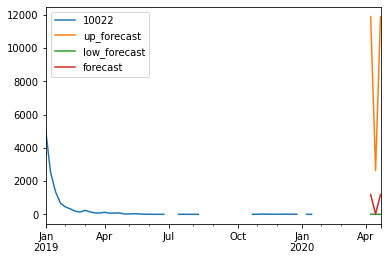

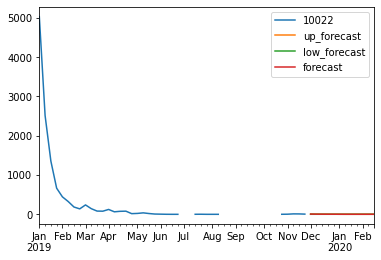

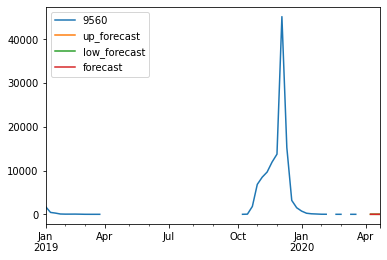

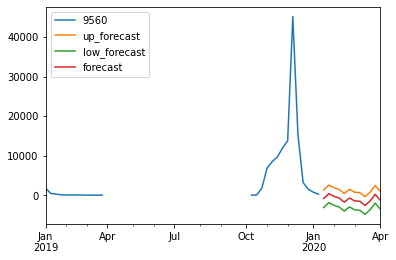

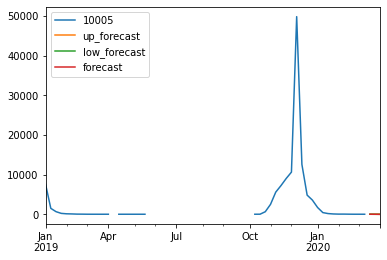

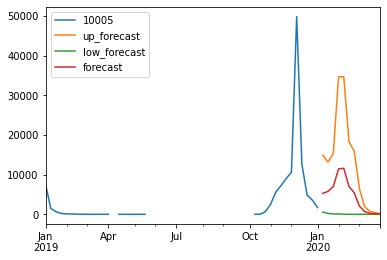

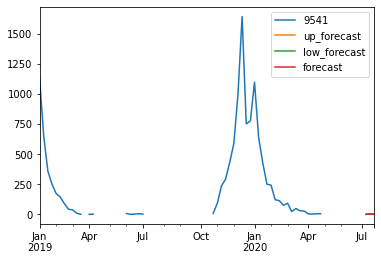

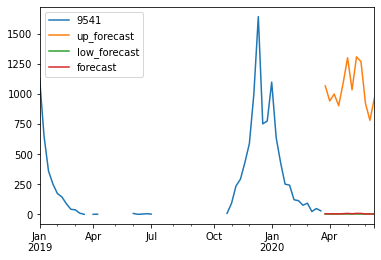

In [13]:

train_on_individual_timeseries(selectedSeasonalProducts)

        Ukedato  Vare_Id    Sales
420  2016-02-01    10133     10.0
446  2016-02-08    10133     78.0
472  2016-02-15    10133    385.0
498  2016-02-22    10133   1335.0
523  2016-02-29    10133   2714.0
...         ...      ...      ...
7334 2020-08-10    10133  32702.0
7367 2020-08-17    10133  29764.0
7399 2020-08-24    10133  29273.9
7431 2020-08-31    10133  29366.9
7463 2020-09-07    10133  29352.0

[241 rows x 3 columns]
Model Number: 1 with model AverageValueNaive in generation 0 of 4
Model Number: 2 with model AverageValueNaive in generation 0 of 4
Model Number: 3 with model AverageValueNaive in generation 0 of 4
Model Number: 4 with model DatepartRegression in generation 0 of 4
Model Number: 5 with model DatepartRegression in generation 0 of 4
Model Number: 6 with model DatepartRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 7 with model DatepartRegression in generation 0 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 7: DatepartRegression
Model Number: 8 with model ETS in generation 0 of 4
Model Number: 9 with model ETS in generation 0 of 4
Model Number: 10 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 10: GLM
Model Number: 11 with model GLM in generation 0 of 4
Model Number: 12 with model GLS in generation 0 of 4
Model Number: 13 with model GLS in generation 0 of 4
Model Number: 14 with model LastValueNaive in generation 0 of 4
Model Number: 15 with model LastValueNaive in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 16 with model LastValueNaive in generation 0 of 4
Model Number: 17 with model LastValueNaive in generation 0 of 4
Model Number: 18 with model SeasonalNaive in generation 0 of 4
Model Number: 19 with model SeasonalNaive in generation 0 of 4
Model Number: 20 with model SeasonalNaive in generation 0 of 4
Model Number: 21 with model SeasonalNaive in generation 0 of 4
Model Number: 22 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 22: VAR
Model Number: 23 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 23: VAR
Model Number: 24 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 24: VAR
Model Number: 25 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 25: VECM
Model Number: 26 with model VECM in generation 0 of 4
Template Eval Error: Va

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 36 with model GLM in generation 0 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 36: GLM
Model Number: 37 with model ETS in generation 0 of 4
Model Number: 38 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 38: VAR
Model Number: 39 with model VECM in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Template Eval Error: LinAlgError('SVD did not converge') in model 39: VECM
Model Number: 40 with model WindowRegression in generation 0 of 4
Model Number: 41 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 41: DatepartRegression
Model Number: 42 with model UnivariateMotif in generation 0 of 4
Model Number: 43 with model MultivariateMotif in generation 0 of 4
Model Number: 44 with model SectionalMotif in generation 0 of 4
Model Number: 45 with model NVAR in generation 0 of 4
Model Number: 46 with model ETS in generation 0 of 4
Model Number: 47 with model MultivariateMotif in generation 0 of 4
Model Number: 48 with model ZeroesNaive in generation 0 of 4
Model Number: 49 with model LastValueNaive in generation 0 of 4
Model Number: 50 with model ETS in generation 0 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered

Model Number: 53 with model ETS in generation 0 of 4
Model Number: 54 with model GLS in generation 0 of 4
Model Number: 55 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 55: VAR
Model Number: 56 with model SectionalMotif in generation 0 of 4
Model Number: 57 with model GLM in generation 0 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 57: GLM
Model Number: 58 with model ETS in generation 0 of 4
Model Number: 59 with model ZeroesNaive in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 60 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 60: VECM
Model Number: 61 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 61: VECM
Model Number: 62 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 62: VECM
Model Number: 63 with model UnivariateMotif in generation 0 of 4
Model Number: 64 with model UnivariateMotif in generation 0 of 4
Model Number: 65 with model NVAR in generation 0 of 4
Model Number: 66 with model DatepartRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess

Model Number: 67 with model NVAR in generation 0 of 4
Model Number: 68 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 68: VAR
Model Number: 69 with model VECM in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 69: VECM
Model Number: 70 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 70: GLM
Model Number: 71 with model MultivariateMotif in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 71: MultivariateMotif
Model Number: 72 with model ETS in generation 0 of 4
Model Number: 73 with model UnivariateMotif in generation 0 of 4
Model Number: 74 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 79 with model GLM in generation 0 of 4
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 79: GLM
Model Number: 80 with model UnivariateMotif in generation 0 of 4
Model Number: 81 with model UnivariateMotif in generation 0 of 4
Model Number: 82 with model GLS in generation 0 of 4
Model Number: 83 with model AverageValueNaive in generation 0 of 4
Model Number: 84 with model SeasonalNaive in generation 0 of 4
Model Number: 85 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (45)') in model 85: SectionalMotif
Model Number: 86 with model VECM in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 86: VECM
Model Number: 87 with model GLS in generation 0 of 4
Model Number: 88 with model NVAR in generation 0 of 4
Model Number: 89 with model DatepartRegr

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 91 with model UnivariateMotif in generation 0 of 4
Model Number: 92 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 92: VAR
Model Number: 93 with model WindowRegression in generation 0 of 4
Model Number: 94 with model SectionalMotif in generation 0 of 4
Model Number: 95 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 95: VECM
Model Number: 96 with model SeasonalNaive in generation 0 of 4
Template Eval Error: ValueError('Model SeasonalNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 96: SeasonalNaive
Model Number: 97 with model GLS in generation 0 of 4
Model Number: 98 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 98: VECM
Model Number: 99 with model SectionalMotif in generation 0 of 4
Model Number: 100 with model NVAR in generation 0 of 4
Model Number: 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 110 with model LastValueNaive in generation 1 of 4
Model Number: 111 with model ETS in generation 1 of 4
Model Number: 112 with model ETS in generation 1 of 4
Model Number: 113 with model ETS in generation 1 of 4
Model Number: 114 with model ETS in generation 1 of 4
ETS error ValueError('Can only dampen the trend component')
ETS failed on 10133 with ValueError('Can only dampen the trend component')
Model Number: 115 with model DatepartRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 115: DatepartRegression
Model Number: 116 with model DatepartRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 116: DatepartRegression
Model Number: 117 with model DatepartRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 117: DatepartRegression
Model Numbe

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 120 with model WindowRegression in generation 1 of 4


[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.4s


Model Number: 121 with model NVAR in generation 1 of 4
Model Number: 122 with model NVAR in generation 1 of 4
Model Number: 123 with model NVAR in generation 1 of 4
Model Number: 124 with model NVAR in generation 1 of 4
Model Number: 125 with model UnivariateMotif in generation 1 of 4
Model Number: 126 with model UnivariateMotif in generation 1 of 4


[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed:    0.7s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished


Model Number: 127 with model UnivariateMotif in generation 1 of 4
Model Number: 128 with model UnivariateMotif in generation 1 of 4
Model Number: 129 with model AverageValueNaive in generation 1 of 4
Model Number: 130 with model AverageValueNaive in generation 1 of 4
Model Number: 131 with model AverageValueNaive in generation 1 of 4
Model Number: 132 with model MultivariateMotif in generation 1 of 4
Model Number: 133 with model MultivariateMotif in generation 1 of 4
Model Number: 134 with model MultivariateMotif in generation 1 of 4
Template Eval Error: ValueError('Model MultivariateMotif returned NaN for one or more series. fail_on_forecast_nan=True') in model 134: MultivariateMotif
Model Number: 135 with model MultivariateMotif in generation 1 of 4
Model Number: 136 with model GLS in generation 1 of 4
Model Number: 137 with model GLS in generation 1 of 4
Model Number: 138 with model GLS in generation 1 of 4
Model Number: 139 with model SeasonalNaive in generation 1 of 4
Model Number

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/core/_methods.py:48: RuntimeWarning: invalid value encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/

Model Number: 144 with model SectionalMotif in generation 1 of 4
Template Eval Error: ValueError('The number of observations (39) is too small; the covariance matrix is singular. For observations with 50 dimensions, at least 51 observations are required.') in model 144: SectionalMotif
Model Number: 145 with model SectionalMotif in generation 1 of 4
Model Number: 146 with model SectionalMotif in generation 1 of 4
Model Number: 147 with model GLM in generation 1 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 147: GLM
Model Number: 148 with model GLM in generation 1 of 4
Model Number: 149 with model GLM in generation 1 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 149: GLM
Mode

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: divide by zero encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:56: RuntimeWarning: invalid value encountered in true_divide
  post_mu = (
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())


Model Number: 160 with model NVAR in generation 2 of 4
Model Number: 161 with model NVAR in generation 2 of 4
Model Number: 162 with model NVAR in generation 2 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 162: NVAR
Model Number: 163 with model ZeroesNaive in generation 2 of 4
Model Number: 164 with model ZeroesNaive in generation 2 of 4
Model Number: 165 with model ZeroesNaive in generation 2 of 4
Model Number: 166 with model LastValueNaive in generation 2 of 4
Model Number: 167 with model LastValueNaive in generation 2 of 4
Model Number: 168 with model DatepartRegression in generation 2 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 168: DatepartRegression
Model Number: 169 with model DatepartRegression in generation 2 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 169: DatepartRegression
Model Number: 170 with model DatepartReg

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 173 with model WindowRegression in generation 2 of 4
Template Eval Error: ValueError('Model WindowRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 173: WindowRegression
Model Number: 174 with model ETS in generation 2 of 4
Model Number: 175 with model ETS in generation 2 of 4
Model Number: 176 with model ETS in generation 2 of 4
Model Number: 177 with model ETS in generation 2 of 4
Model Number: 178 with model UnivariateMotif in generation 2 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 178: UnivariateMotif
Model Number: 179 with model UnivariateMotif in generation 2 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 179: UnivariateMotif
Model Number: 180 with model UnivariateMotif in generation 2 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 180: UnivariateMotif
Model Number: 181 with model UnivariateMotif in generation 2 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/s

Model Number: 182 with model AverageValueNaive in generation 2 of 4
Model Number: 183 with model AverageValueNaive in generation 2 of 4
Model Number: 184 with model AverageValueNaive in generation 2 of 4
Model Number: 185 with model MultivariateMotif in generation 2 of 4
Model Number: 186 with model MultivariateMotif in generation 2 of 4
Model Number: 187 with model MultivariateMotif in generation 2 of 4
Model Number: 188 with model MultivariateMotif in generation 2 of 4
Model Number: 189 with model SeasonalNaive in generation 2 of 4
Model Number: 190 with model SeasonalNaive in generation 2 of 4
Model Number: 191 with model SeasonalNaive in generation 2 of 4
Model Number: 192 with model SeasonalNaive in generation 2 of 4
Model Number: 193 with model GLS in generation 2 of 4
Model Number: 194 with model GLS in generation 2 of 4
Model Number: 195 with model GLS in generation 2 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/scipy/signal/_signaltools.py:1611: RuntimeWarning: divide by zero encountered in true_divide
  res *= (1 - noise / lVar)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/scipy/signal/_signaltools.py:1611: RuntimeWarning: invalid value encountered in multiply
  res *= (1 - noise / lVar)


Model Number: 196 with model SectionalMotif in generation 2 of 4
Model Number: 197 with model SectionalMotif in generation 2 of 4
Template Eval Error: ValueError('kth(=20) out of bounds (19)') in model 197: SectionalMotif
Model Number: 198 with model SectionalMotif in generation 2 of 4
Model Number: 199 with model SectionalMotif in generation 2 of 4
Model Number: 200 with model GLM in generation 2 of 4
Model Number: 201 with model GLM in generation 2 of 4
Model Number: 202 with model GLM in generation 2 of 4
Model Number: 203 with model GLM in generation 2 of 4
Model Number: 204 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 204: VAR
Model Number: 205 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 205: VAR
Model Number: 206 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 206: VAR
Model Number: 207 wit

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))


Model Number: 235 with model GLS in generation 3 of 4
Model Number: 236 with model GLS in generation 3 of 4
Model Number: 237 with model GLS in generation 3 of 4
Model Number: 238 with model ETS in generation 3 of 4
Model Number: 239 with model ETS in generation 3 of 4
Model Number: 240 with model ETS in generation 3 of 4
Model Number: 241 with model ETS in generation 3 of 4
Model Number: 242 with model UnivariateMotif in generation 3 of 4
Model Number: 243 with model UnivariateMotif in generation 3 of 4
Model Number: 244 with model UnivariateMotif in generation 3 of 4
Model Number: 245 with model UnivariateMotif in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


Model Number: 246 with model MultivariateMotif in generation 3 of 4
Model Number: 247 with model MultivariateMotif in generation 3 of 4
Model Number: 248 with model MultivariateMotif in generation 3 of 4
Template Eval Error: ValueError('Model MultivariateMotif returned NaN for one or more series. fail_on_forecast_nan=True') in model 248: MultivariateMotif
Model Number: 249 with model MultivariateMotif in generation 3 of 4
Model Number: 250 with model SeasonalNaive in generation 3 of 4
Model Number: 251 with model SeasonalNaive in generation 3 of 4
Model Number: 252 with model SeasonalNaive in generation 3 of 4
Template Eval Error: ValueError('Model SeasonalNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 252: SeasonalNaive
Model Number: 253 with model SeasonalNaive in generation 3 of 4
Template Eval Error: ValueError('Model SeasonalNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 253: SeasonalNaive
Model Number: 254 with mod

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:426: RuntimeWarning: divide by zero encountered in true_divide
  endog_mu = self._clean(endog / mu)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(

Model Number: 277 with model ZeroesNaive in generation 4 of 4
Model Number: 278 with model ZeroesNaive in generation 4 of 4
Model Number: 279 with model ZeroesNaive in generation 4 of 4
Model Number: 280 with model AverageValueNaive in generation 4 of 4
Model Number: 281 with model AverageValueNaive in generation 4 of 4
Model Number: 282 with model AverageValueNaive in generation 4 of 4
Model Number: 283 with model GLS in generation 4 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(


Model Number: 284 with model UnivariateMotif in generation 4 of 4
Model Number: 285 with model UnivariateMotif in generation 4 of 4
Model Number: 286 with model UnivariateMotif in generation 4 of 4
Model Number: 287 with model UnivariateMotif in generation 4 of 4
Model Number: 288 with model LastValueNaive in generation 4 of 4
Model Number: 289 with model LastValueNaive in generation 4 of 4
Model Number: 290 with model LastValueNaive in generation 4 of 4
Model Number: 291 with model ETS in generation 4 of 4
Model Number: 292 with model ETS in generation 4 of 4
Model Number: 293 with model ETS in generation 4 of 4
Model Number: 294 with model ETS in generation 4 of 4
Model Number: 295 with model WindowRegression in generation 4 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 296 with model WindowRegression in generation 4 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 296: WindowRegression
Model Number: 297 with model WindowRegression in generation 4 of 4
Model Number: 298 with model SeasonalNaive in generation 4 of 4
Model Number: 299 with model SeasonalNaive in generation 4 of 4
Model Number: 300 with model SeasonalNaive in generation 4 of 4
Model Number: 301 with model SeasonalNaive in generation 4 of 4
Model Number: 302 with model MultivariateMotif in generation 4 of 4
Model Number: 303 with model MultivariateMotif in generation 4 of 4
Model Number: 304 with model MultivariateMotif in generation 4 of 4
Model Number: 305 with model MultivariateMotif in generation 4 of 4
Model Number: 306 with model SectionalMotif in generation 4 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (46)') in model 306: SectionalMotif
Model Number: 307 with model SectionalMotif in generation 4 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 318 with model Ensemble in generation 5 of 0
Model Number: 319 with model Ensemble in generation 5 of 0
Model Number: 320 with model Ensemble in generation 5 of 0
Model Number: 321 with model Ensemble in generation 5 of 0
Model Number: 322 with model Ensemble in generation 5 of 0
Model Number: 323 with model Ensemble in generation 5 of 0
Model Number: 324 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Validation Round: 1
Model Number: 1 of 49 with model Ensemble for Validation 1
1 - Ensemble with avg smape 2.08: 
Model Number: 2 of 49 with model Ensemble for Validation 1
2 - Ensemble with avg smape 7.17: 
Model Number: 3 of 49 with model Ensemble for Validation 1
3 - Ensemble with avg smape 4.9: 
Model Number: 4 of 49 with model NVAR for Validation 1
4 - NVAR with avg smape 7.14: 
Model Number: 5 of 49 with model NVAR for Validation 1
5 - NVAR with avg smape 7.14: 
Model Number: 6 of 49 with model Ensemble for Validation 1
6 - Ensemble with avg smape 4.49: 
Model Number: 7 of 49 with model Ensemble for Validation 1
7 - Ensemble with avg smape 4.7: 
Model Number: 8 of 49 with model UnivariateMotif for Validation 1
8 - UnivariateMotif with avg smape 7.21: 
Model Number: 9 of 49 with model NVAR for Validation 1
9 - NVAR with avg smape 6.86: 
Model Number: 10 of 49 with model NVAR for Validation 1
10 - NVAR with avg smape 6.86: 
Model Number: 11 of 49 with model ZeroesNaive for Validati

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

34 - DatepartRegression with avg smape 7.23: 
Model Number: 35 of 49 with model ETS for Validation 1
35 - ETS with avg smape 5.23: 
Model Number: 36 of 49 with model GLS for Validation 1
36 - GLS with avg smape 6.81: 
Model Number: 37 of 49 with model ETS for Validation 1
37 - ETS with avg smape 8.74: 
Model Number: 38 of 49 with model ETS for Validation 1
ETS error ValueError('Can only dampen the trend component')
ETS failed on 10133 with ValueError('Can only dampen the trend component')
38 - ETS with avg smape 11.86: 
Model Number: 39 of 49 with model UnivariateMotif for Validation 1
39 - UnivariateMotif with avg smape 5.75: 
Model Number: 40 of 49 with model WindowRegression for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.4s


40 - WindowRegression with avg smape 8.28: 
Model Number: 41 of 49 with model LastValueNaive for Validation 1
41 - LastValueNaive with avg smape 7.03: 
Model Number: 42 of 49 with model SeasonalNaive for Validation 1
42 - SeasonalNaive with avg smape 4.77: 
Model Number: 43 of 49 with model MultivariateMotif for Validation 1
43 - MultivariateMotif with avg smape 6.42: 
Model Number: 44 of 49 with model LastValueNaive for Validation 1
44 - LastValueNaive with avg smape 4.9: 
Model Number: 45 of 49 with model GLM for Validation 1
45 - GLM with avg smape 7.41: 
Model Number: 46 of 49 with model MultivariateMotif for Validation 1
46 - MultivariateMotif with avg smape 5.18: 
Model Number: 47 of 49 with model LastValueNaive for Validation 1
47 - LastValueNaive with avg smape 9.45: 
Model Number: 48 of 49 with model GLS for Validation 1


[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed:    0.6s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished


48 - GLS with avg smape 8.07: 
Model Number: 49 of 49 with model SeasonalNaive for Validation 1
49 - SeasonalNaive with avg smape 6.09: 
Validation Round: 2
Model Number: 1 of 49 with model Ensemble for Validation 2
1 - Ensemble with avg smape 5.82: 
Model Number: 2 of 49 with model Ensemble for Validation 2
2 - Ensemble with avg smape 1.69: 
Model Number: 3 of 49 with model Ensemble for Validation 2
3 - Ensemble with avg smape 5.65: 
Model Number: 4 of 49 with model NVAR for Validation 2
4 - NVAR with avg smape 1.59: 
Model Number: 5 of 49 with model NVAR for Validation 2
5 - NVAR with avg smape 1.59: 
Model Number: 6 of 49 with model Ensemble for Validation 2
6 - Ensemble with avg smape 5.37: 
Model Number: 7 of 49 with model Ensemble for Validation 2
7 - Ensemble with avg smape 5.75: 
Model Number: 8 of 49 with model UnivariateMotif for Validation 2
8 - UnivariateMotif with avg smape 1.87: 
Model Number: 9 of 49 with model NVAR for Validation 2
9 - NVAR with avg smape 2.01: 
Model N

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

34 - DatepartRegression with avg smape 1.57: 
Model Number: 35 of 49 with model ETS for Validation 2
35 - ETS with avg smape 10.77: 
Model Number: 36 of 49 with model GLS for Validation 2
36 - GLS with avg smape 3.79: 
Model Number: 37 of 49 with model ETS for Validation 2
37 - ETS with avg smape 8.01: 
Model Number: 38 of 49 with model ETS for Validation 2
ETS error ValueError('Can only dampen the trend component')
ETS failed on 10133 with ValueError('Can only dampen the trend component')
38 - ETS with avg smape 18.8: 
Model Number: 39 of 49 with model UnivariateMotif for Validation 2
39 - UnivariateMotif with avg smape 18.58: 
Model Number: 40 of 49 with model WindowRegression for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.4s


40 - WindowRegression with avg smape 18.76: 
Model Number: 41 of 49 with model LastValueNaive for Validation 2
41 - LastValueNaive with avg smape 16.32: 
Model Number: 42 of 49 with model SeasonalNaive for Validation 2
42 - SeasonalNaive with avg smape 12.7: 
Model Number: 43 of 49 with model MultivariateMotif for Validation 2
43 - MultivariateMotif with avg smape 27.57: 
Model Number: 44 of 49 with model LastValueNaive for Validation 2
44 - LastValueNaive with avg smape 10.27: 
Model Number: 45 of 49 with model GLM for Validation 2
45 - GLM with avg smape 1.6: 
Model Number: 46 of 49 with model MultivariateMotif for Validation 2
46 - MultivariateMotif with avg smape 14.29: 
Model Number: 47 of 49 with model LastValueNaive for Validation 2
47 - LastValueNaive with avg smape 11.97: 
Model Number: 48 of 49 with model GLS for Validation 2


[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed:    0.6s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished


48 - GLS with avg smape 4.12: 
Model Number: 49 of 49 with model SeasonalNaive for Validation 2
49 - SeasonalNaive with avg smape 5.91: 
Initiated AutoTS object with best model: 
Ensemble
{}
{'model_name': 'BestN', 'model_count': 5, 'model_metric': 'best_score_unique', 'models': {'d0c519940c7335f0dc160c534a0ed2fb': {'Model': 'NVAR', 'ModelParameters': '{"k": 1, "ridge_param": 0.002, "warmup_pts": 1, "seed_pts": 1, "seed_weighted": null, "batch_size": 10, "batch_method": "input_order"}', 'TransformationParameters': '{"fillna": "ffill", "transformations": {"0": "DifferencedTransformer", "1": "ScipyFilter", "2": "RollingMean100thN", "3": "Detrend", "4": "RollingMeanTransformer"}, "transformation_params": {"0": {}, "1": {"method": "wiener", "method_args": null}, "2": {}, "3": {"model": "Linear", "phi": 1, "window": null}, "4": {"fixed": true, "window": 7}}}'}, 'de5a9f88e0005e3a753dd80fd88d9ace': {'Model': 'UnivariateMotif', 'ModelParameters': '{"window": 5, "point_method": "weighted_mean",

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 7 with model DatepartRegression in generation 0 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 7: DatepartRegression
Model Number: 8 with model ETS in generation 0 of 4
Model Number: 9 with model ETS in generation 0 of 4
Model Number: 10 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 10: GLM
Model Number: 11 with model GLM in generation 0 of 4
Model Number: 12 with model GLS in generation 0 of 4
Model Number: 13 with model GLS in generation 0 of 4
Model Number: 14 with model LastValueNaive in generation 0 of 4
Model Number: 15 with model LastValueNaive in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 16 with model LastValueNaive in generation 0 of 4
Model Number: 17 with model LastValueNaive in generation 0 of 4
Model Number: 18 with model SeasonalNaive in generation 0 of 4
Model Number: 19 with model SeasonalNaive in generation 0 of 4
Model Number: 20 with model SeasonalNaive in generation 0 of 4
Model Number: 21 with model SeasonalNaive in generation 0 of 4
Model Number: 22 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 22: VAR
Model Number: 23 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 23: VAR
Model Number: 24 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 24: VAR
Model Number: 25 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 25: VECM
Model Number: 26 with model VECM in generation 0 of 4
Template Eval Error: Va

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 34 with model GLS in generation 0 of 4
Model Number: 35 with model SeasonalNaive in generation 0 of 4
Model Number: 36 with model GLM in generation 0 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 36: GLM
Model Number: 37 with model ETS in generation 0 of 4
Model Number: 38 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 38: VAR
Model Number: 39 with model VECM in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Template Eval Error: LinAlgError('SVD did not converge') in model 39: VECM
Model Number: 40 with model WindowRegression in generation 0 of 4
Model Number: 41 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 41: DatepartRegression
Model Number: 42 with model UnivariateMotif in generation 0 of 4
Model Number: 43 with model MultivariateMotif in generation 0 of 4
Model Number: 44 with model SectionalMotif in generation 0 of 4
Model Number: 45 with model NVAR in generation 0 of 4
Model Number: 46 with model ETS in generation 0 of 4
Model Number: 47 with model MultivariateMotif in generation 0 of 4
Model Number: 48 with model ZeroesNaive in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)


Model Number: 49 with model LastValueNaive in generation 0 of 4
Model Number: 50 with model ETS in generation 0 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 10133 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 51 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 51: VAR
Model Number: 52 with model MultivariateMotif in generation 0 of 4
Model Number: 53 with model ETS in generation 0 of 4
Model Number: 54 with model GLS in generation 0 of 4
Model Number: 55 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 55: VAR
Model Number: 56 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (100)') in model 56: SectionalMotif
Model Number: 57 with model GLM in generation 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 59 with model ZeroesNaive in generation 0 of 4
Model Number: 60 with model VECM in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 60: VECM
Model Number: 61 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 61: VECM
Model Number: 62 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 62: VECM
Model Number: 63 with model UnivariateMotif in generation 0 of 4
Model Number: 64 with model UnivariateMotif in generation 0 of 4
Model Number: 65 with model NVAR in generation 0 of 4
Model Number: 66 with model DatepartRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess

Model Number: 67 with model NVAR in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(


Model Number: 68 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 68: VAR
Model Number: 69 with model VECM in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 69: VECM
Model Number: 70 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 70: GLM
Model Number: 71 with model MultivariateMotif in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 71: MultivariateMotif
Model Number: 72 with model ETS in generation 0 of 4
Model Number: 73 with model UnivariateMotif in generation 0 of 4
Model Number: 74 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 74: VAR
Model Number: 75 with model ETS in generation

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 78 with model DatepartRegression in generation 0 of 4
Model Number: 79 with model GLM in generation 0 of 4
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 79: GLM
Model Number: 80 with model UnivariateMotif in generation 0 of 4
Model Number: 81 with model UnivariateMotif in generation 0 of 4
Model Number: 82 with model GLS in generation 0 of 4
Model Number: 83 with model AverageValueNaive in generation 0 of 4
Model Number: 84 with model SeasonalNaive in generation 0 of 4
Model Number: 85 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (39)') in model 85: SectionalMotif
Model Number: 86 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 86: VECM
Model Number: 87 with model GLS in generation 0 of 4
Model Number: 88 with model NVAR in generation 0 of

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 90 with model WindowRegression in generation 0 of 4
Model Number: 91 with model UnivariateMotif in generation 0 of 4
Model Number: 92 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 92: VAR
Model Number: 93 with model WindowRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 94 with model SectionalMotif in generation 0 of 4
Model Number: 95 with model VECM in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 95: VECM
Model Number: 96 with model SeasonalNaive in generation 0 of 4
Template Eval Error: ValueError('Model SeasonalNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 96: SeasonalNaive
Model Number: 97 with model GLS in generation 0 of 4
Model Number: 98 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 98: VECM
Model Number: 99 with model SectionalMotif in generation 0 of 4
Model Number: 100 with model NVAR in generation 0 of 4
Model Number: 101 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 101: DatepartRegression
Model Number: 102 with model SeasonalNaive in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 109 with model ETS in generation 1 of 4
Model Number: 110 with model ETS in generation 1 of 4
Model Number: 111 with model ETS in generation 1 of 4
ETS error ValueError('Can only dampen the trend component')
ETS failed on 10133 with ValueError('Can only dampen the trend component')
Model Number: 112 with model ETS in generation 1 of 4
ETS error ValueError('Can only dampen the trend component')
ETS failed on 10133 with ValueError('Can only dampen the trend component')
Model Number: 113 with model DatepartRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 113: DatepartRegression
Model Number: 114 with model DatepartRegression in generation 1 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 114: DatepartRegression
Model Number: 115 with model DatepartRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='Use

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: divide by zero encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/User

Model Number: 120 with model UnivariateMotif in generation 1 of 4
Model Number: 121 with model UnivariateMotif in generation 1 of 4
Model Number: 122 with model UnivariateMotif in generation 1 of 4
Model Number: 123 with model UnivariateMotif in generation 1 of 4
Model Number: 124 with model SeasonalNaive in generation 1 of 4
Model Number: 125 with model SeasonalNaive in generation 1 of 4
Model Number: 126 with model SeasonalNaive in generation 1 of 4
Model Number: 127 with model SeasonalNaive in generation 1 of 4
Model Number: 128 with model WindowRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 128: WindowRegression
Model Number: 129 with model WindowRegression in generation 1 of 4
Model Number: 130 with model WindowRegression in generation 1 of 4


[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed:    0.4s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks   

Model Number: 131 with model GLS in generation 1 of 4


[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend 

Model Number: 132 with model GLS in generation 1 of 4
Model Number: 133 with model GLS in generation 1 of 4
Model Number: 134 with model ZeroesNaive in generation 1 of 4
Model Number: 135 with model ZeroesNaive in generation 1 of 4
Model Number: 136 with model SectionalMotif in generation 1 of 4
Model Number: 137 with model SectionalMotif in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)


Model Number: 138 with model SectionalMotif in generation 1 of 4
Model Number: 139 with model SectionalMotif in generation 1 of 4
Model Number: 140 with model MultivariateMotif in generation 1 of 4
Model Number: 141 with model MultivariateMotif in generation 1 of 4
Model Number: 142 with model MultivariateMotif in generation 1 of 4
Model Number: 143 with model MultivariateMotif in generation 1 of 4
Model Number: 144 with model LastValueNaive in generation 1 of 4
Model Number: 145 with model LastValueNaive in generation 1 of 4
Model Number: 146 with model LastValueNaive in generation 1 of 4
Model Number: 147 with model GLM in generation 1 of 4
Model Number: 148 with model GLM in generation 1 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 148: GLM
Model Number: 149 with model GLM in generation 1 of 4
Model Number: 150 with model GLM in generation 1 of 4
Model Number: 151 with model VAR in generation 1 of 4
Template Eval Error: ValueEr

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))


Template Eval Error: ValueError('Only gave one variable to VAR') in model 154: VAR
Model Number: 155 with model VECM in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 155: VECM
Model Number: 156 with model VECM in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 156: VECM
Model Number: 157 with model VECM in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 157: VECM
Model Number: 158 with model VECM in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 158: VECM
New Generation: 2 of 4
Model Number: 159 with model AverageValueNaive in generation 2 of 4
Model Number: 160 with model AverageValueNaive in generation 2 of 4
Model Number: 161 with model AverageValueNaive in generation 2 of 4
Model Number: 162 with model GLS in generation 2 of 4
Model Number: 163 with model GLS in generation 2 of 4
Model Number: 164 with

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())


Model Number: 180 with model UnivariateMotif in generation 2 of 4
Model Number: 181 with model UnivariateMotif in generation 2 of 4
Model Number: 182 with model UnivariateMotif in generation 2 of 4
Model Number: 183 with model UnivariateMotif in generation 2 of 4
Model Number: 184 with model SeasonalNaive in generation 2 of 4
Model Number: 185 with model SeasonalNaive in generation 2 of 4
Model Number: 186 with model SeasonalNaive in generation 2 of 4
Model Number: 187 with model SeasonalNaive in generation 2 of 4
Model Number: 188 with model WindowRegression in generation 2 of 4
Model Number: 189 with model WindowRegression in generation 2 of 4
Template Eval Error: ValueError('Found array with 0 sample(s) (shape=(0, 0)) while a minimum of 1 is required.') in model 189: WindowRegression
Model Number: 190 with model WindowRegression in generation 2 of 4
Model Number: 191 with model ZeroesNaive in generation 2 of 4
Model Number: 192 with model ZeroesNaive in generation 2 of 4
Model Numbe

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_g

Model Number: 226 with model GLM in generation 3 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 226: GLM
Model Number: 227 with model GLM in generation 3 of 4
Template Eval Error: Exception('Transformer QuantileTransformer failed on fit') in model 227: GLM
Model Number: 228 with model GLM in generation 3 of 4
Template Eval Error: Exception('Transformer StandardScaler failed on fit') in model 228: GLM
Model Number: 229 with model GLM in generation 3 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 229: GLM
Model Number: 230 with model UnivariateMotif in generation 3 of 4
Model Number: 231 with model UnivariateMotif in generation 3 of 4
Model Number: 232 with model UnivariateMoti

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['Timestamp', 'int']. An error will be raised in 1.2.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1560: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(a,
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['Timestamp', 'int']. An error will be raised in 1.2.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['Timestamp', 'int']. An error will be raised in 1.2.
  warnings.warn(
/Users/simennaess/Library

Model Number: 236 with model DatepartRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 236: DatepartRegression
Model Number: 237 with model ZeroesNaive in generation 3 of 4
Model Number: 238 with model ZeroesNaive in generation 3 of 4
Model Number: 239 with model ZeroesNaive in generation 3 of 4
Model Number: 240 with model NVAR in generation 3 of 4
Model Number: 241 with model NVAR in generation 3 of 4
Model Number: 242 with model NVAR in generation 3 of 4
Model Number: 243 with model NVAR in generation 3 of 4
Model Number: 244 with model SeasonalNaive in generation 3 of 4
Model Number: 245 with model SeasonalNaive in generation 3 of 4
Model Number: 246 with model SeasonalNaive in generation 3 of 4
Template Eval Error: ValueError('Model SeasonalNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 246: SeasonalNaive
Model Number: 247 with model SeasonalNaive in generation 3 of 4
M

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Template Eval Error: LinAlgError('SVD did not converge') in model 262: VECM
Model Number: 263 with model VECM in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 263: VECM
Model Number: 264 with model VECM in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 264: VECM
Model Number: 265 with model VECM in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 265: VECM
New Generation: 4 of 4
Model Number: 266 with model UnivariateMotif in generation 4 of 4
Model Number: 267 with model UnivariateMotif in generation 4 of 4
Model Number: 268 with model UnivariateMotif in generation 4 of 4
Model Number: 269 with model UnivariateMotif in generation 4 of 4
Model Number: 270 with model AverageValueNaive in generation 4 of 4
Model Number: 271 with model AverageValueNaive in generation 4 of 4
Model Number: 272 with model AverageValueNaive in genera

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 278 with model SectionalMotif in generation 4 of 4
Model Number: 279 with model SectionalMotif in generation 4 of 4
Model Number: 280 with model SectionalMotif in generation 4 of 4
Model Number: 281 with model DatepartRegression in generation 4 of 4
Model Number: 282 with model DatepartRegression in generation 4 of 4
Model Number: 283 with model DatepartRegression in generation 4 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 283: DatepartRegression
Model Number: 284 with model GLS in generation 4 of 4
Model Number: 285 with model GLS in generation 4 of 4
Model Number: 286 with model GLM in generation 4 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 286: GLM
Model Number: 287 with model GLM in generation 4 of 4
Template Eval Err

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 293 with model WindowRegression in generation 4 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/compat/pandas.py:65: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import Int64Index as NumericIndex
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1218: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(a, func=_nanmedian, axis=axis, out=out,
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1584: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/basics.py:1081: RuntimeWarning: Mean of empty slice
  forecast = np.nanmean(results, axis=0)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to co

Model Number: 294 with model WindowRegression in generation 4 of 4
Model Number: 295 with model WindowRegression in generation 4 of 4
Model Number: 296 with model NVAR in generation 4 of 4
Model Number: 297 with model NVAR in generation 4 of 4
Model Number: 298 with model NVAR in generation 4 of 4
Model Number: 299 with model NVAR in generation 4 of 4
Model Number: 300 with model SeasonalNaive in generation 4 of 4
Model Number: 301 with model SeasonalNaive in generation 4 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


Model Number: 302 with model SeasonalNaive in generation 4 of 4
Model Number: 303 with model SeasonalNaive in generation 4 of 4
Model Number: 304 with model MultivariateMotif in generation 4 of 4
Model Number: 305 with model MultivariateMotif in generation 4 of 4
Model Number: 306 with model MultivariateMotif in generation 4 of 4
Model Number: 307 with model MultivariateMotif in generation 4 of 4
Model Number: 308 with model LastValueNaive in generation 4 of 4
Model Number: 309 with model LastValueNaive in generation 4 of 4
Model Number: 310 with model LastValueNaive in generation 4 of 4
Model Number: 311 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 311: VAR
Model Number: 312 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 312: VAR
Model Number: 313 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 313

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 320 with model Ensemble in generation 5 of 0
Model Number: 321 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 322 with model Ensemble in generation 5 of 0
Model Number: 323 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 324 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 325 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 326 with model Ensemble in generation 5 of 0
Validation Round: 1
Model Number: 1 of 49 with model Ensemble for Validation 1
1 - Ensemble with avg smape 18.12: 
Model Number: 2 of 49 with model Ensemble for Validation 1
2 - Ensemble with avg smape 17.31: 
Model Number: 3 of 49 with model Ensemble for Validation 1
3 - Ensemble with avg smape 18.41: 
Model Number: 4 of 49 with model Ensemble for Validation 1
4 - Ensemble with avg smape 17.27: 
Model Number: 5 of 49 with model Ensemble for Validation 1
5 - Ensemble with avg smape 18.72: 
Model Number: 6 of 49 with model UnivariateMotif for Validation 1
6 - UnivariateMotif with avg smape 16.48: 
Model Number: 7 of 49 with model SectionalMotif for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


7 - SectionalMotif with avg smape 21.57: 
Model Number: 8 of 49 with model SectionalMotif for Validation 1
8 - SectionalMotif with avg smape 19.19: 
Model Number: 9 of 49 with model AverageValueNaive for Validation 1
9 - AverageValueNaive with avg smape 20.54: 
Model Number: 10 of 49 with model AverageValueNaive for Validation 1
10 - AverageValueNaive with avg smape 20.54: 
Model Number: 11 of 49 with model SectionalMotif for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

11 - SectionalMotif with avg smape 21.75: 
Model Number: 12 of 49 with model NVAR for Validation 1
12 - NVAR with avg smape 18.81: 
Model Number: 13 of 49 with model ETS for Validation 1
13 - ETS with avg smape 19.57: 
Model Number: 14 of 49 with model AverageValueNaive for Validation 1
14 - AverageValueNaive with avg smape 20.36: 
Model Number: 15 of 49 with model AverageValueNaive for Validation 1
15 - AverageValueNaive with avg smape 20.36: 
Model Number: 16 of 49 with model AverageValueNaive for Validation 1
16 - AverageValueNaive with avg smape 20.27: 
Model Number: 17 of 49 with model ETS for Validation 1
ETS error ValueError('Can only dampen the trend component')
ETS failed on 10133 with ValueError('Can only dampen the trend component')
17 - ETS with avg smape 20.54: 
Model Number: 18 of 49 with model DatepartRegression for Validation 1
18 - DatepartRegression with avg smape 16.33: 
Model Number: 19 of 49 with model GLS for Validation 1
19 - GLS with avg smape 20.72: 
Model Numb

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


24 - SectionalMotif with avg smape 19.75: 
Model Number: 25 of 49 with model UnivariateMotif for Validation 1
25 - UnivariateMotif with avg smape 16.49: 
Model Number: 26 of 49 with model ETS for Validation 1
26 - ETS with avg smape 21.84: 
Model Number: 27 of 49 with model ETS for Validation 1
27 - ETS with avg smape 18.95: 
Model Number: 28 of 49 with model UnivariateMotif for Validation 1
28 - UnivariateMotif with avg smape 16.35: 
Model Number: 29 of 49 with model LastValueNaive for Validation 1
29 - LastValueNaive with avg smape 20.01: 
Model Number: 30 of 49 with model DatepartRegression for Validation 1
30 - DatepartRegression with avg smape 22.07: 
Model Number: 31 of 49 with model ZeroesNaive for Validation 1
31 - ZeroesNaive with avg smape 20.36: 
Model Number: 32 of 49 with model ZeroesNaive for Validation 1
32 - ZeroesNaive with avg smape 20.36: 
Model Number: 33 of 49 with model NVAR for Validation 1
33 - NVAR with avg smape 20.54: 
Model Number: 34 of 49 with model Season

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


34 - SeasonalNaive with avg smape 19.41: 
Model Number: 35 of 49 with model GLS for Validation 1
35 - GLS with avg smape 18.64: 
Model Number: 36 of 49 with model ZeroesNaive for Validation 1
36 - ZeroesNaive with avg smape 20.54: 
Model Number: 37 of 49 with model ZeroesNaive for Validation 1
37 - ZeroesNaive with avg smape 20.54: 
Model Number: 38 of 49 with model ZeroesNaive for Validation 1
38 - ZeroesNaive with avg smape 20.54: 
Model Number: 39 of 49 with model DatepartRegression for Validation 1
39 - DatepartRegression with avg smape 22.33: 
Model Number: 40 of 49 with model DatepartRegression for Validation 1
40 - DatepartRegression with avg smape 19.23: 
Model Number: 41 of 49 with model WindowRegression for Validation 1
41 - WindowRegression with avg smape 12.41: 
Model Number: 42 of 49 with model NVAR for Validation 1
42 - NVAR with avg smape 17.99: 
Model Number: 43 of 49 with model GLM for Validation 1

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(



43 - GLM with avg smape 17.69: 
Model Number: 44 of 49 with model SeasonalNaive for Validation 1
44 - SeasonalNaive with avg smape 22.6: 
Model Number: 45 of 49 with model GLM for Validation 1
45 - GLM with avg smape 17.5: 
Model Number: 46 of 49 with model UnivariateMotif for Validation 1
46 - UnivariateMotif with avg smape 21.3: 
Model Number: 47 of 49 with model NVAR for Validation 1
47 - NVAR with avg smape 23.56: 
Model Number: 48 of 49 with model WindowRegression for Validation 1
48 - WindowRegression with avg smape 19.53: 
Model Number: 49 of 49 with model NVAR for Validation 1
49 - NVAR with avg smape 22.99: 
Validation Round: 2
Model Number: 1 of 49 with model Ensemble for Validation 2
1 - Ensemble with avg smape 19.16: 
Model Number: 2 of 49 with model Ensemble for Validation 2
2 - Ensemble with avg smape 52.82: 
Model Number: 3 of 49 with model Ensemble for Validation 2
3 - Ensemble with avg smape 19.46: 
Model Number: 4 of 49 with model Ensemble for Validation 2
4 - Ensemb

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


7 - SectionalMotif with avg smape 21.41: 
Model Number: 8 of 49 with model SectionalMotif for Validation 2
8 - SectionalMotif with avg smape 19.19: 
Model Number: 9 of 49 with model AverageValueNaive for Validation 2
9 - AverageValueNaive with avg smape 21.1: 
Model Number: 10 of 49 with model AverageValueNaive for Validation 2
10 - AverageValueNaive with avg smape 21.1: 
Model Number: 11 of 49 with model SectionalMotif for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

11 - SectionalMotif with avg smape 21.93: 
Model Number: 12 of 49 with model NVAR for Validation 2
12 - NVAR with avg smape 20.73: 
Model Number: 13 of 49 with model ETS for Validation 2
13 - ETS with avg smape 107.78: 
Model Number: 14 of 49 with model AverageValueNaive for Validation 2
14 - AverageValueNaive with avg smape 21.67: 
Model Number: 15 of 49 with model AverageValueNaive for Validation 2
15 - AverageValueNaive with avg smape 21.67: 
Model Number: 16 of 49 with model AverageValueNaive for Validation 2
16 - AverageValueNaive with avg smape 21.59: 
Model Number: 17 of 49 with model ETS for Validation 2
ETS error ValueError('Can only dampen the trend component')
ETS failed on 10133 with ValueError('Can only dampen the trend component')
17 - ETS with avg smape 21.1: 
Model Number: 18 of 49 with model DatepartRegression for Validation 2
18 - DatepartRegression with avg smape 17.19: 
Model Number: 19 of 49 with model GLS for Validation 2
19 - GLS with avg smape 21.1: 
Model Numbe

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)



Model Number: 25 of 49 with model UnivariateMotif for Validation 2
25 - UnivariateMotif with avg smape 22.54: 
Model Number: 26 of 49 with model ETS for Validation 2
26 - ETS with avg smape 21.09: 
Model Number: 27 of 49 with model ETS for Validation 2
27 - ETS with avg smape 21.92: 
Model Number: 28 of 49 with model UnivariateMotif for Validation 2
28 - UnivariateMotif with avg smape 22.66: 
Model Number: 29 of 49 with model LastValueNaive for Validation 2
29 - LastValueNaive with avg smape 82.92: 
Model Number: 30 of 49 with model DatepartRegression for Validation 2
30 - DatepartRegression with avg smape 19.92: 
Model Number: 31 of 49 with model ZeroesNaive for Validation 2
31 - ZeroesNaive with avg smape 21.67: 
Model Number: 32 of 49 with model ZeroesNaive for Validation 2
32 - ZeroesNaive with avg smape 21.67: 
Model Number: 33 of 49 with model NVAR for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


33 - NVAR with avg smape 21.09: 
Model Number: 34 of 49 with model SeasonalNaive for Validation 2
34 - SeasonalNaive with avg smape 21.69: 
Model Number: 35 of 49 with model GLS for Validation 2
35 - GLS with avg smape 21.1: 
Model Number: 36 of 49 with model ZeroesNaive for Validation 2
36 - ZeroesNaive with avg smape 21.1: 
Model Number: 37 of 49 with model ZeroesNaive for Validation 2
37 - ZeroesNaive with avg smape 21.1: 
Model Number: 38 of 49 with model ZeroesNaive for Validation 2
38 - ZeroesNaive with avg smape 21.1: 
Model Number: 39 of 49 with model DatepartRegression for Validation 2
39 - DatepartRegression with avg smape 19.44: 
Model Number: 40 of 49 with model DatepartRegression for Validation 2
40 - DatepartRegression with avg smape 20.03: 
Model Number: 41 of 49 with model WindowRegression for Validation 2
41 - WindowRegression with avg smape 23.17: 
Model Number: 42 of 49 with model NVAR for Validation 2
42 - NVAR with avg smape 78.55: 
Model Number: 43 of 49 with mode

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


44 - SeasonalNaive with avg smape 21.8: 
Model Number: 45 of 49 with model GLM for Validation 2
45 - GLM with avg smape 21.15: 
Model Number: 46 of 49 with model UnivariateMotif for Validation 2
46 - UnivariateMotif with avg smape 19.33: 
Model Number: 47 of 49 with model NVAR for Validation 2
47 - NVAR with avg smape 109.85: 
Model Number: 48 of 49 with model WindowRegression for Validation 2
48 - WindowRegression with avg smape 18.4: 
Model Number: 49 of 49 with model NVAR for Validation 2
49 - NVAR with avg smape 183.77: 
Initiated AutoTS object with best model: 
DatepartRegression
{'fillna': 'akima', 'transformations': {'0': 'Detrend', '1': 'MaxAbsScaler', '2': 'ScipyFilter', '3': 'MaxAbsScaler'}, 'transformation_params': {'0': {'model': 'Linear', 'phi': 1, 'window': None}, '1': {}, '2': {'method': 'savgol_filter', 'method_args': [5, 1]}, '3': {}}}
{'regression_model': {'model': 'ExtraTrees', 'model_params': {'n_estimators': 100, 'min_samples_leaf': 1, 'max_depth': 10}}, 'datepart_

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/base.py:344: RuntimeWarning: overflow encountered in square
  self.squared_errors = full_errors ** 2


Model Number: 1 with model AverageValueNaive in generation 0 of 4
Model Number: 2 with model AverageValueNaive in generation 0 of 4
Model Number: 3 with model AverageValueNaive in generation 0 of 4
Model Number: 4 with model DatepartRegression in generation 0 of 4
Model Number: 5 with model DatepartRegression in generation 0 of 4
Model Number: 6 with model DatepartRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 7 with model DatepartRegression in generation 0 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 7: DatepartRegression
Model Number: 8 with model ETS in generation 0 of 4
Model Number: 9 with model ETS in generation 0 of 4
Model Number: 10 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 10: GLM
Model Number: 11 with model GLM in generation 0 of 4
Model Number: 12 with model GLS in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 13 with model GLS in generation 0 of 4
Model Number: 14 with model LastValueNaive in generation 0 of 4
Model Number: 15 with model LastValueNaive in generation 0 of 4
Model Number: 16 with model LastValueNaive in generation 0 of 4
Model Number: 17 with model LastValueNaive in generation 0 of 4
Model Number: 18 with model SeasonalNaive in generation 0 of 4
Model Number: 19 with model SeasonalNaive in generation 0 of 4
Model Number: 20 with model SeasonalNaive in generation 0 of 4
Model Number: 21 with model SeasonalNaive in generation 0 of 4
Model Number: 22 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 22: VAR
Model Number: 23 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 23: VAR
Model Number: 24 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 24: VAR
Model Number: 25 with model VECM i

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
 

Model Number: 35 with model SeasonalNaive in generation 0 of 4
Model Number: 36 with model GLM in generation 0 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 36: GLM
Model Number: 37 with model ETS in generation 0 of 4
Model Number: 38 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 38: VAR
Model Number: 39 with model VECM in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1584: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,


Template Eval Error: LinAlgError('SVD did not converge') in model 39: VECM
Model Number: 40 with model WindowRegression in generation 0 of 4
Model Number: 41 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 41: DatepartRegression
Model Number: 42 with model UnivariateMotif in generation 0 of 4
Model Number: 43 with model MultivariateMotif in generation 0 of 4
Model Number: 44 with model SectionalMotif in generation 0 of 4
Model Number: 45 with model NVAR in generation 0 of 4
Model Number: 46 with model ETS in generation 0 of 4
Model Number: 47 with model MultivariateMotif in generation 0 of 4
Model Number: 48 with model ZeroesNaive in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)


Model Number: 49 with model LastValueNaive in generation 0 of 4
Model Number: 50 with model ETS in generation 0 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9662 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 51 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 51: VAR
Model Number: 52 with model MultivariateMotif in generation 0 of 4
Model Number: 53 with model ETS in generation 0 of 4
Model Number: 54 with model GLS in generation 0 of 4
Model Number: 55 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 55: VAR
Model Number: 56 with model SectionalMotif in generation 0 of 4
Model Number: 57 with model GLM in generation 0 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimat

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess

Template Eval Error: ValueError('Only gave one variable to VECM') in model 60: VECM
Model Number: 61 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 61: VECM
Model Number: 62 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 62: VECM
Model Number: 63 with model UnivariateMotif in generation 0 of 4
Model Number: 64 with model UnivariateMotif in generation 0 of 4
Model Number: 65 with model NVAR in generation 0 of 4
Model Number: 66 with model DatepartRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 67 with model NVAR in generation 0 of 4
Model Number: 68 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 68: VAR
Model Number: 69 with model VECM in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 69: VECM
Model Number: 70 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 70: GLM
Model Number: 71 with model MultivariateMotif in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 71: MultivariateMotif
Model Number: 72 with model ETS in generation 0 of 4
Model Number: 73 with model UnivariateMotif in generation 0 of 4
Model Number: 74 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 79 with model GLM in generation 0 of 4
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 79: GLM
Model Number: 80 with model UnivariateMotif in generation 0 of 4
Model Number: 81 with model UnivariateMotif in generation 0 of 4
Model Number: 82 with model GLS in generation 0 of 4
Model Number: 83 with model AverageValueNaive in generation 0 of 4
Model Number: 84 with model SeasonalNaive in generation 0 of 4
Model Number: 85 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (48)') in model 85: SectionalMotif
Model Number: 86 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 86: VECM
Model Number: 87 with model GLS in generation 0 of 4
Model Number: 88 with model NVAR in generation 0 of 4
Model Number: 89 with model DatepartRegression in generation 0 of

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_

Model Number: 90 with model WindowRegression in generation 0 of 4
Model Number: 91 with model UnivariateMotif in generation 0 of 4
Model Number: 92 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 92: VAR
Model Number: 93 with model WindowRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 94 with model SectionalMotif in generation 0 of 4
Model Number: 95 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 95: VECM
Model Number: 96 with model SeasonalNaive in generation 0 of 4
Template Eval Error: ValueError('Model SeasonalNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 96: SeasonalNaive
Model Number: 97 with model GLS in generation 0 of 4
Model Number: 98 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 98: VECM
Model Number: 99 with model SectionalMotif in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())


Model Number: 100 with model NVAR in generation 0 of 4
Model Number: 101 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 101: DatepartRegression
Model Number: 102 with model SeasonalNaive in generation 0 of 4
Model Number: 103 with model WindowRegression in generation 0 of 4
Model Number: 104 with model AverageValueNaive in generation 0 of 4
Model Number: 105 with model AverageValueNaive in generation 0 of 4
New Generation: 1 of 4

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encount


Model Number: 106 with model WindowRegression in generation 1 of 4
Model Number: 107 with model WindowRegression in generation 1 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 107: WindowRegression
Model Number: 108 with model WindowRegression in generation 1 of 4
Model Number: 109 with model ETS in generation 1 of 4
Model Number: 110 with model ETS in generation 1 of 4
Model Number: 111 with model ETS in generation 1 of 4
Model Number: 112 with model ETS in generation 1 of 4
ETS error ValueError('Can only dampen the trend component')
ETS failed on 9662 with ValueError('Can only dampen the trend component')
Model Number: 113 with model NVAR in generation 1 of 4
Model Number: 114 with model NVAR in generation 1 of 4
Model Number: 115 with model NVAR in generation 1 of 4
Model Number: 116 with model NVAR in generation 1 of 4
Model Number: 117 with model GLS in generation 1 of 4
Model Number: 118 with model GLS in generati

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1342: RuntimeWarning: divide by zero encountered in true_divide
  endog_mu = self._clean(endog / mu)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1342: RuntimeWarning: divide by zero encountered in true_divide
  endog_mu = self._clean(endog / mu)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1346: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


Model Number: 139 with model SeasonalNaive in generation 1 of 4
Model Number: 140 with model SeasonalNaive in generation 1 of 4
Model Number: 141 with model SeasonalNaive in generation 1 of 4
Model Number: 142 with model SectionalMotif in generation 1 of 4
Model Number: 143 with model SectionalMotif in generation 1 of 4
Model Number: 144 with model SectionalMotif in generation 1 of 4
Model Number: 145 with model SectionalMotif in generation 1 of 4
Model Number: 146 with model ZeroesNaive in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


Model Number: 147 with model ZeroesNaive in generation 1 of 4
Model Number: 148 with model ZeroesNaive in generation 1 of 4
Model Number: 149 with model LastValueNaive in generation 1 of 4
Model Number: 150 with model LastValueNaive in generation 1 of 4
Model Number: 151 with model LastValueNaive in generation 1 of 4
Model Number: 152 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 152: VAR
Model Number: 153 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 153: VAR
Model Number: 154 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 154: VAR
Model Number: 155 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 155: VAR
Model Number: 156 with model VECM in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 156

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())


Template Eval Error: ValueError('Only gave one variable to VECM') in model 158: VECM
Model Number: 159 with model VECM in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 159: VECM
New Generation: 2 of 4
Model Number: 160 with model NVAR in generation 2 of 4
Model Number: 161 with model NVAR in generation 2 of 4
Model Number: 162 with model NVAR in generation 2 of 4
Model Number: 163 with model NVAR in generation 2 of 4
Model Number: 164 with model WindowRegression in generation 2 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 164: WindowRegression
Model Number: 165 with model WindowRegression in generation 2 of 4
Model Number: 166 with model WindowRegression in generation 2 of 4
Model Number: 167 with model ETS in generation 2 of 4
Model Number: 168 with model ETS in generation 2 of 4
Model Number: 169 with model ETS in generation 2 of 4
ETS error ValueError('endog must be strictly posi

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 175 with model GLS in generation 2 of 4
Model Number: 176 with model UnivariateMotif in generation 2 of 4
Model Number: 177 with model UnivariateMotif in generation 2 of 4
Model Number: 178 with model UnivariateMotif in generation 2 of 4
Model Number: 179 with model UnivariateMotif in generation 2 of 4
Model Number: 180 with model MultivariateMotif in generation 2 of 4
Model Number: 181 with model MultivariateMotif in generation 2 of 4
Model Number: 182 with model MultivariateMotif in generation 2 of 4
Model Number: 183 with model MultivariateMotif in generation 2 of 4
Model Number: 184 with model AverageValueNaive in generation 2 of 4
Model Number: 185 with model AverageValueNaive in generation 2 of 4

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply



Model Number: 186 with model AverageValueNaive in generation 2 of 4
Model Number: 187 with model GLM in generation 2 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 187: GLM
Model Number: 188 with model GLM in generation 2 of 4
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 188: GLM
Model Number: 189 with model GLM in generation 2 of 4
Model Number: 190 with model GLM in generation 2 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 190: GLM
Model Number: 191 with model DatepartRegression in generation 2 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 191: DatepartRegression
Model Number: 192 with model DatepartRegress

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:516: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:132: RuntimeWarning: invalid value encountered in multiply
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/generalized_linear_model.py:1211: RuntimeWarning: invalid value encountered in multiply
  wlsendog = (lin_pred + self.family.link.deriv(mu) * (self.endog-mu)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1346: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = 


Model Number: 196 with model SectionalMotif in generation 2 of 4
Model Number: 197 with model SectionalMotif in generation 2 of 4
Model Number: 198 with model ZeroesNaive in generation 2 of 4
Model Number: 199 with model ZeroesNaive in generation 2 of 4
Model Number: 200 with model ZeroesNaive in generation 2 of 4
Model Number: 201 with model LastValueNaive in generation 2 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 201: LastValueNaive
Model Number: 202 with model LastValueNaive in generation 2 of 4
Model Number: 203 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 203: VAR
Model Number: 204 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 204: VAR
Model Number: 205 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 205: VAR
Model Number: 206 with model VAR in generatio

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y 

Model Number: 211 with model NVAR in generation 3 of 4
Model Number: 212 with model NVAR in generation 3 of 4
Model Number: 213 with model NVAR in generation 3 of 4
Model Number: 214 with model NVAR in generation 3 of 4
Model Number: 215 with model WindowRegression in generation 3 of 4
Model Number: 216 with model WindowRegression in generation 3 of 4
Model Number: 217 with model WindowRegression in generation 3 of 4
Template Eval Error: ValueError('Model WindowRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 217: WindowRegression
Model Number: 218 with model UnivariateMotif in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)


Template Eval Error: ValueError('Model UnivariateMotif returned NaN for one or more series. fail_on_forecast_nan=True') in model 218: UnivariateMotif
Model Number: 219 with model UnivariateMotif in generation 3 of 4
Model Number: 220 with model UnivariateMotif in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/core/_methods.py:48: RuntimeWarning: invalid value encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)


Template Eval Error: ValueError('Model UnivariateMotif returned NaN for one or more series. fail_on_forecast_nan=True') in model 220: UnivariateMotif
Model Number: 221 with model UnivariateMotif in generation 3 of 4
Template Eval Error: ValueError('Model UnivariateMotif returned NaN for one or more series. fail_on_forecast_nan=True') in model 221: UnivariateMotif
Model Number: 222 with model ETS in generation 3 of 4
Model Number: 223 with model ETS in generation 3 of 4
Model Number: 224 with model ETS in generation 3 of 4
Model Number: 225 with model ETS in generation 3 of 4
Model Number: 226 with model SeasonalNaive in generation 3 of 4
Model Number: 227 with model SeasonalNaive in generation 3 of 4
Model Number: 228 with model SeasonalNaive in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/function_base.py:527: RuntimeWarning: invalid value encountered in multiply
  avg = np.multiply(a, wgt, dtype=result_dtype).sum(axis)/scl
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/decomposition/_pca.py:501: RuntimeWarning: invalid value encountered in true_divide
  explained_variance_ratio_ = explained_variance_ / total_var
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divid

Model Number: 229 with model SeasonalNaive in generation 3 of 4
Model Number: 230 with model GLS in generation 3 of 4
Model Number: 231 with model GLS in generation 3 of 4
Model Number: 232 with model GLS in generation 3 of 4
Model Number: 233 with model AverageValueNaive in generation 3 of 4
Model Number: 234 with model AverageValueNaive in generation 3 of 4
Model Number: 235 with model AverageValueNaive in generation 3 of 4
Model Number: 236 with model MultivariateMotif in generation 3 of 4
Model Number: 237 with model MultivariateMotif in generation 3 of 4
Model Number: 238 with model MultivariateMotif in generation 3 of 4
Model Number: 239 with model MultivariateMotif in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  retur

Model Number: 240 with model GLM in generation 3 of 4
Model Number: 241 with model GLM in generation 3 of 4
Model Number: 242 with model GLM in generation 3 of 4
Model Number: 243 with model GLM in generation 3 of 4
Model Number: 244 with model SectionalMotif in generation 3 of 4
Template Eval Error: ValueError("regression_type=='User' but no future_regressor supplied") in model 244: SectionalMotif
Model Number: 245 with model SectionalMotif in generation 3 of 4
Model Number: 246 with model SectionalMotif in generation 3 of 4
Model Number: 247 with model SectionalMotif in generation 3 of 4
Model Number: 248 with model DatepartRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 248: DatepartRegression
Model Number: 249 with model DatepartRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 249: DatepartRegression
Model Number: 250 wit

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encount

Model Number: 264 with model WindowRegression in generation 4 of 4
Model Number: 265 with model WindowRegression in generation 4 of 4
Template Eval Error: ModuleNotFoundError("No module named 'lightgbm'") in model 265: WindowRegression
Model Number: 266 with model WindowRegression in generation 4 of 4
Model Number: 267 with model NVAR in generation 4 of 4
Model Number: 268 with model NVAR in generation 4 of 4
Model Number: 269 with model NVAR in generation 4 of 4
Model Number: 270 with model NVAR in generation 4 of 4
Model Number: 271 with model UnivariateMotif in generation 4 of 4
Model Number: 272 with model UnivariateMotif in generation 4 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 273 with model UnivariateMotif in generation 4 of 4
Model Number: 274 with model UnivariateMotif in generation 4 of 4
Model Number: 275 with model ETS in generation 4 of 4
Model Number: 276 with model ETS in generation 4 of 4
Model Number: 277 with model ETS in generation 4 of 4
Model Number: 278 with model ETS in generation 4 of 4
Model Number: 279 with model SeasonalNaive in generation 4 of 4
Model Number: 280 with model SeasonalNaive in generation 4 of 4
Model Number: 281 with model SeasonalNaive in generation 4 of 4
Model Number: 282 with model SeasonalNaive in generation 4 of 4
Model Number: 283 with model GLS in generation 4 of 4
Model Number: 284 with model GLS in generation 4 of 4
Model Number: 285 with model GLS in generation 4 of 4
Model Number: 286 with model ZeroesNaive in generation 4 of 4
Model Number: 287 with model ZeroesNaive in generation 4 of 4
Model Number: 288 with model SectionalMotif in generation 4 of 4
Model Number: 289 with model SectionalMotif i

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 292 with model MultivariateMotif in generation 4 of 4
Model Number: 293 with model MultivariateMotif in generation 4 of 4
Model Number: 294 with model MultivariateMotif in generation 4 of 4
Model Number: 295 with model MultivariateMotif in generation 4 of 4
Model Number: 296 with model AverageValueNaive in generation 4 of 4
Model Number: 297 with model AverageValueNaive in generation 4 of 4
Model Number: 298 with model AverageValueNaive in generation 4 of 4
Model Number: 299 with model GLM in generation 4 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 299: GLM
Model Number: 300 with model GLM in generation 4 of 4
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 300: GLM
Model Number: 301 with model GLM in generation 4 of 4
Model Number: 302 with model GLM in generation 4 of 4
Model Number: 30

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:426: RuntimeWarning: divide by zero encountered in true_divide
  endog_mu = self._clean(endog / mu)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1346: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


Model Number: 316 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/ensemble.py:918: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  mods = pd.Series()


Model Number: 317 with model Ensemble in generation 5 of 0
Model Number: 318 with model Ensemble in generation 5 of 0
Model Number: 319 with model Ensemble in generation 5 of 0
Model Number: 320 with model Ensemble in generation 5 of 0
Model Number: 321 with model Ensemble in generation 5 of 0
Model Number: 322 with model Ensemble in generation 5 of 0
Model Number: 323 with model Ensemble in generation 5 of 0
Validation Round: 1
Model Number: 1 of 49 with model Ensemble for Validation 1
1 - Ensemble with avg smape 28.84: 
Model Number: 2 of 49 with model Ensemble for Validation 1
2 - Ensemble with avg smape 27.34: 
Model Number: 3 of 49 with model Ensemble for Validation 1
3 - Ensemble with avg smape 28.81: 
Model Number: 4 of 49 with model Ensemble for Validation 1
4 - Ensemble with avg smape 28.81: 
Model Number: 5 of 49 with model WindowRegression for Validation 1
5 - WindowRegression with avg smape 31.39: 
Model Number: 6 of 49 with model Ensemble for Validation 1
6 - Ensemble with

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


1 - Ensemble with avg smape 20.79: 
Model Number: 2 of 49 with model Ensemble for Validation 2
2 - Ensemble with avg smape 17.92: 
Model Number: 3 of 49 with model Ensemble for Validation 2
3 - Ensemble with avg smape 20.71: 
Model Number: 4 of 49 with model Ensemble for Validation 2
4 - Ensemble with avg smape 20.71: 
Model Number: 5 of 49 with model WindowRegression for Validation 2
5 - WindowRegression with avg smape 23.64: 
Model Number: 6 of 49 with model Ensemble for Validation 2
6 - Ensemble with avg smape 13.77: 
Model Number: 7 of 49 with model WindowRegression for Validation 2
7 - WindowRegression with avg smape 12.68: 
Model Number: 8 of 49 with model NVAR for Validation 2
8 - NVAR with avg smape 17.76: 
Model Number: 9 of 49 with model NVAR for Validation 2
9 - NVAR with avg smape 23.53: 
Model Number: 10 of 49 with model NVAR for Validation 2
10 - NVAR with avg smape 23.77: 
Model Number: 11 of 49 with model UnivariateMotif for Validation 2
11 - UnivariateMotif with avg sm

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


Initiated AutoTS object with best model: 
ETS
{'fillna': 'rolling_mean', 'transformations': {'0': 'ClipOutliers', '1': 'ClipOutliers', '2': 'DifferencedTransformer', '3': 'RollingMeanTransformer'}, 'transformation_params': {'0': {'method': 'remove', 'std_threshold': 1, 'fillna': 'mean'}, '1': {'method': 'clip', 'std_threshold': 4, 'fillna': None}, '2': {}, '3': {'fixed': True, 'window': 60}}}
{'damped_trend': False, 'trend': None, 'seasonal': None, 'seasonal_periods': None}
SMAPE: 2.1883967341868047, 22.13284150451824, 4.109440100962266
MAE: 329.26629367778577, 4538.623565020796, 769.0342599195088
SPL: 0.03523335610542021, 1.1714467759128782, 0.15584293081760375
        Ukedato  Vare_Id    Sales
5    2015-10-05     9662  14517.0
26   2015-10-12     9662  14111.0
47   2015-10-19     9662  28028.9
70   2015-10-26     9662  26889.0
92   2015-11-02     9662  11476.0
...         ...      ...      ...
7033 2020-06-08     9662  15292.0
7065 2020-06-15     9662  23109.0
7097 2020-06-22     966

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 7 with model DatepartRegression in generation 0 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 7: DatepartRegression
Model Number: 8 with model ETS in generation 0 of 4
Model Number: 9 with model ETS in generation 0 of 4
Model Number: 10 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 10: GLM
Model Number: 11 with model GLM in generation 0 of 4
Model Number: 12 with model GLS in generation 0 of 4
Model Number: 13 with model GLS in generation 0 of 4
Model Number: 14 with model LastValueNaive in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 15 with model LastValueNaive in generation 0 of 4
Model Number: 16 with model LastValueNaive in generation 0 of 4
Model Number: 17 with model LastValueNaive in generation 0 of 4
Model Number: 18 with model SeasonalNaive in generation 0 of 4
Model Number: 19 with model SeasonalNaive in generation 0 of 4
Model Number: 20 with model SeasonalNaive in generation 0 of 4
Model Number: 21 with model SeasonalNaive in generation 0 of 4
Model Number: 22 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 22: VAR
Model Number: 23 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 23: VAR
Model Number: 24 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 24: VAR
Model Number: 25 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 25: VECM
Model Number:

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3196: RuntimeWarning: divide by zero encountered in power
  x_inv[pos] = np.power(x[pos] * lmbda + 1, 1 / lmbda) - 1
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3196: RuntimeWarning: divide by zero encountered in power
  x_inv[

Model Number: 35 with model SeasonalNaive in generation 0 of 4
Model Number: 36 with model GLM in generation 0 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 36: GLM
Model Number: 37 with model ETS in generation 0 of 4
Model Number: 38 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 38: VAR
Model Number: 39 with model VECM in generation 0 of 4
Template Eval Error: LinAlgError('SVD did not converge') in model 39: VECM
Model Number: 40 with model WindowRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =

Model Number: 41 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 41: DatepartRegression
Model Number: 42 with model UnivariateMotif in generation 0 of 4
Model Number: 43 with model MultivariateMotif in generation 0 of 4
Model Number: 44 with model SectionalMotif in generation 0 of 4
Model Number: 45 with model NVAR in generation 0 of 4
Model Number: 46 with model ETS in generation 0 of 4
Model Number: 47 with model MultivariateMotif in generation 0 of 4
Model Number: 48 with model ZeroesNaive in generation 0 of 4
Model Number: 49 with model LastValueNaive in generation 0 of 4
Model Number: 50 with model ETS in generation 0 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9662 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal compone

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)


Model Number: 51 with model VAR in generation 0 of 4
Template Eval Error: IndexError('tuple index out of range') in model 51: VAR
Model Number: 52 with model MultivariateMotif in generation 0 of 4
Model Number: 53 with model ETS in generation 0 of 4
Model Number: 54 with model GLS in generation 0 of 4
Model Number: 55 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 55: VAR
Model Number: 56 with model SectionalMotif in generation 0 of 4
Model Number: 57 with model GLM in generation 0 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 57: GLM
Model Number: 58 with model ETS in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess

Model Number: 59 with model ZeroesNaive in generation 0 of 4
Model Number: 60 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 60: VECM
Model Number: 61 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 61: VECM
Model Number: 62 with model VECM in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 62: VECM
Model Number: 63 with model UnivariateMotif in generation 0 of 4
Model Number: 64 with model UnivariateMotif in generation 0 of 4
Model Number: 65 with model NVAR in generation 0 of 4
Model Number: 66 with model DatepartRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennae

Model Number: 67 with model NVAR in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(


Model Number: 68 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 68: VAR
Model Number: 69 with model VECM in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 69: VECM
Model Number: 70 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 70: GLM
Model Number: 71 with model MultivariateMotif in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 71: MultivariateMotif
Model Number: 72 with model ETS in generation 0 of 4
Model Number: 73 with model UnivariateMotif in generation 0 of 4
Model Number: 74 with model VAR in generation 0 of 4
Template Eval Error: IndexError('tuple index out of range') in model 74: VAR
Model Number: 75 with model ETS in generation 0 of

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 78 with model DatepartRegression in generation 0 of 4
Model Number: 79 with model GLM in generation 0 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 79: GLM
Model Number: 80 with model UnivariateMotif in generation 0 of 4
Model Number: 81 with model UnivariateMotif in generation 0 of 4
Model Number: 82 with model GLS in generation 0 of 4
Model Number: 83 with model AverageValueNaive in generation 0 of 4
Model Number: 84 with model SeasonalNaive in generation 0 of 4
Model Number: 85 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (43)') in model 85: SectionalMotif
Model Number: 86 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 86: VECM
Model Number: 87 with model GLS in generation 0 of 4
Model Number: 88 with model NVAR in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:516: RuntimeWarning: overflow encountered in exp
  return np.exp(

Model Number: 89 with model DatepartRegression in generation 0 of 4
Model Number: 90 with model WindowRegression in generation 0 of 4
Model Number: 91 with model UnivariateMotif in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


Model Number: 92 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 92: VAR
Model Number: 93 with model WindowRegression in generation 0 of 4
Model Number: 94 with model SectionalMotif in generation 0 of 4
Model Number: 95 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 95: VECM
Model Number: 96 with model SeasonalNaive in generation 0 of 4
Template Eval Error: ValueError('Model SeasonalNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 96: SeasonalNaive
Model Number: 97 with model GLS in generation 0 of 4
Model Number: 98 with model VECM in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 98: VECM
Model Number: 99 with model SectionalMotif in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())


Model Number: 100 with model NVAR in generation 0 of 4
Model Number: 101 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 101: DatepartRegression
Model Number: 102 with model SeasonalNaive in generation 0 of 4
Model Number: 103 with model WindowRegression in generation 0 of 4
Model Number: 104 with model AverageValueNaive in generation 0 of 4
Model Number: 105 with model AverageValueNaive in generation 0 of 4
New Generation: 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encount

Model Number: 106 with model GLS in generation 1 of 4
SinTrend failed with RuntimeError('Optimal parameters not found: Number of calls to function has reached maxfev = 10000.') for 9662 with 0
Template Eval Error: Exception('Transformer SinTrend failed on fit') in model 106: GLS
Model Number: 107 with model GLS in generation 1 of 4
Model Number: 108 with model GLS in generation 1 of 4
Model Number: 109 with model AverageValueNaive in generation 1 of 4
Model Number: 110 with model AverageValueNaive in generation 1 of 4
Model Number: 111 with model AverageValueNaive in generation 1 of 4
Model Number: 112 with model UnivariateMotif in generation 1 of 4
Model Number: 113 with model UnivariateMotif in generation 1 of 4
Model Number: 114 with model UnivariateMotif in generation 1 of 4
Model Number: 115 with model UnivariateMotif in generation 1 of 4
Model Number: 116 with model DatepartRegression in generation 1 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in mode

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 126 with model ETS in generation 1 of 4
ETS error ValueError('Can only dampen the trend component')
ETS failed on 9662 with ValueError('Can only dampen the trend component')
Model Number: 127 with model WindowRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 127: WindowRegression
Model Number: 128 with model WindowRegression in generation 1 of 4
Template Eval Error: ModuleNotFoundError("No module named 'lightgbm'") in model 128: WindowRegression
Model Number: 129 with model WindowRegression in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


Model Number: 130 with model SectionalMotif in generation 1 of 4
Model Number: 131 with model SectionalMotif in generation 1 of 4
Model Number: 132 with model SectionalMotif in generation 1 of 4
Model Number: 133 with model SectionalMotif in generation 1 of 4
Model Number: 134 with model SeasonalNaive in generation 1 of 4
Model Number: 135 with model SeasonalNaive in generation 1 of 4
Model Number: 136 with model SeasonalNaive in generation 1 of 4
Model Number: 137 with model SeasonalNaive in generation 1 of 4
Model Number: 138 with model MultivariateMotif in generation 1 of 4
Model Number: 139 with model MultivariateMotif in generation 1 of 4
Model Number: 140 with model MultivariateMotif in generation 1 of 4
Model Number: 141 with model MultivariateMotif in generation 1 of 4
Model Number: 142 with model GLM in generation 1 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types accordin

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)

Model Number: 159 with model GLS in generation 2 of 4
Model Number: 160 with model GLS in generation 2 of 4
Model Number: 161 with model GLS in generation 2 of 4
Model Number: 162 with model AverageValueNaive in generation 2 of 4
Model Number: 163 with model AverageValueNaive in generation 2 of 4
Model Number: 164 with model AverageValueNaive in generation 2 of 4
Model Number: 165 with model SeasonalNaive in generation 2 of 4
Model Number: 166 with model SeasonalNaive in generation 2 of 4
Model Number: 167 with model SeasonalNaive in generation 2 of 4
Model Number: 168 with model SeasonalNaive in generation 2 of 4
Model Number: 169 with model UnivariateMotif in generation 2 of 4
Model Number: 170 with model UnivariateMotif in generation 2 of 4
Model Number: 171 with model UnivariateMotif in generation 2 of 4
Model Number: 172 with model UnivariateMotif in generation 2 of 4
Model Number: 173 with model DatepartRegression in generation 2 of 4
Model Number: 174 with model DatepartRegressi

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 179 with model ETS in generation 2 of 4
Model Number: 180 with model GLM in generation 2 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 180: GLM
Model Number: 181 with model GLM in generation 2 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 181: GLM
Model Number: 182 with model GLM in generation 2 of 4
Model Number: 183 with model GLM in generation 2 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 183: GLM
Model Number: 184 with model NVAR in generation 2 of 4
Model Number: 185 with model NVAR in generation 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 189 with model WindowRegression in generation 2 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _

Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 189: WindowRegression
Model Number: 190 with model WindowRegression in generation 2 of 4
Model Number: 191 with model SectionalMotif in generation 2 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3196: RuntimeWarning: divide by zero encountered in power
  x_inv[pos] = np.power(x[pos] * lmbda + 1, 1 / lmbda) - 1
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3196: RuntimeWarning: divide by zero encountered in power
  x_inv[pos] = np.power(x[pos] * lmbda + 1, 1 / lmbda) - 1
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3196: RuntimeWarning: divide by zero encountered in power
  x_inv[pos] = np.power(x[pos] * lmbda + 1, 1 / lmbda) - 1


Model Number: 192 with model SectionalMotif in generation 2 of 4
Model Number: 193 with model SectionalMotif in generation 2 of 4
Model Number: 194 with model SectionalMotif in generation 2 of 4
Model Number: 195 with model MultivariateMotif in generation 2 of 4
Model Number: 196 with model MultivariateMotif in generation 2 of 4
Model Number: 197 with model MultivariateMotif in generation 2 of 4
Model Number: 198 with model MultivariateMotif in generation 2 of 4
Model Number: 199 with model ZeroesNaive in generation 2 of 4
Model Number: 200 with model ZeroesNaive in generation 2 of 4
Model Number: 201 with model LastValueNaive in generation 2 of 4
Model Number: 202 with model LastValueNaive in generation 2 of 4
Model Number: 203 with model LastValueNaive in generation 2 of 4
Model Number: 204 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 204: VAR
Model Number: 205 with model VAR in generation 2 of 4
Template Eval Error: Va

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


Model Number: 212 with model GLS in generation 3 of 4
Model Number: 213 with model GLS in generation 3 of 4
Model Number: 214 with model GLS in generation 3 of 4
Model Number: 215 with model AverageValueNaive in generation 3 of 4
Model Number: 216 with model AverageValueNaive in generation 3 of 4
Model Number: 217 with model AverageValueNaive in generation 3 of 4
Model Number: 218 with model SeasonalNaive in generation 3 of 4
Model Number: 219 with model SeasonalNaive in generation 3 of 4
Model Number: 220 with model SeasonalNaive in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 221 with model SeasonalNaive in generation 3 of 4
Model Number: 222 with model UnivariateMotif in generation 3 of 4
Template Eval Error: ValueError('Model UnivariateMotif returned NaN for one or more series. fail_on_forecast_nan=True') in model 222: UnivariateMotif
Model Number: 223 with model UnivariateMotif in generation 3 of 4
Model Number: 224 with model UnivariateMotif in generation 3 of 4
Model Number: 225 with model UnivariateMotif in generation 3 of 4
Model Number: 226 with model NVAR in generation 3 of 4
Model Number: 227 with model NVAR in generation 3 of 4
Model Number: 228 with model NVAR in generation 3 of 4
Model Number: 229 with model NVAR in generation 3 of 4
Model Number: 230 with model MultivariateMotif in generation 3 of 4
Model Number: 231 with model MultivariateMotif in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/core/_methods.py:48: RuntimeWarning: invalid value encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/function_base.py:527: RuntimeWarning: invalid value encountered in true_divide
  avg = np.multiply(a, wgt, dtype=result_dtype).sum(axis)/scl


Model Number: 232 with model MultivariateMotif in generation 3 of 4
Model Number: 233 with model MultivariateMotif in generation 3 of 4
Model Number: 234 with model DatepartRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 234: DatepartRegression
Model Number: 235 with model DatepartRegression in generation 3 of 4
Model Number: 236 with model DatepartRegression in generation 3 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 236: DatepartRegression
Model Number: 237 with model ETS in generation 3 of 4
ETS error ValueError('Can only dampen the trend component')
ETS failed on 9662 with ValueError('Can only dampen the trend component')
Model Number: 238 with model ETS in generation 3 of 4
Model Number: 239 with model ETS in generation 3 of 4
Model Number: 240 with model ETS in generation 3 of 4
Model Number: 241 with model ZeroesNaive in generatio

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *


Model Number: 246 with model GLM in generation 3 of 4
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 246: GLM
Model Number: 247 with model GLM in generation 3 of 4
Model Number: 248 with model WindowRegression in generation 3 of 4
Template Eval Error: ModuleNotFoundError("No module named 'lightgbm'") in model 248: WindowRegression
Model Number: 249 with model WindowRegression in generation 3 of 4
Model Number: 250 with model WindowRegression in generation 3 of 4
Model Number: 251 with model SectionalMotif in generation 3 of 4
Model Number: 252 with model SectionalMotif in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: divide by zero encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:56: RuntimeWarning: invalid value encountered in true_divide
  post_mu = (
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:177: RuntimeWarning: invalid value encountered in true_divide
  return np.sum(resid_dev * freq_weights * var_weights / scale)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 253 with model SectionalMotif in generation 3 of 4
Model Number: 254 with model SectionalMotif in generation 3 of 4
Model Number: 255 with model LastValueNaive in generation 3 of 4
Model Number: 256 with model LastValueNaive in generation 3 of 4
Model Number: 257 with model VAR in generation 3 of 4
Template Eval Error: IndexError('tuple index out of range') in model 257: VAR
Model Number: 258 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 258: VAR
Model Number: 259 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 259: VAR
Model Number: 260 with model VAR in generation 3 of 4
Template Eval Error: IndexError('tuple index out of range') in model 260: VAR
Model Number: 261 with model VECM in generation 3 of 4

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *


Template Eval Error: ValueError('Only gave one variable to VECM') in model 261: VECM
Model Number: 262 with model VECM in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 262: VECM
Model Number: 263 with model VECM in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 263: VECM
Model Number: 264 with model VECM in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 264: VECM
New Generation: 4 of 4
Model Number: 265 with model SeasonalNaive in generation 4 of 4
Model Number: 266 with model SeasonalNaive in generation 4 of 4
Model Number: 267 with model SeasonalNaive in generation 4 of 4
Model Number: 268 with model SeasonalNaive in generation 4 of 4
Model Number: 269 with model GLS in generation 4 of 4
Model Number: 270 with model GLS in generation 4 of 4
Model Number: 271 with model GLS in generation 4 of 4
Model Number: 272 with model

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *


Model Number: 283 with model MultivariateMotif in generation 4 of 4
Model Number: 284 with model MultivariateMotif in generation 4 of 4
Model Number: 285 with model MultivariateMotif in generation 4 of 4
Model Number: 286 with model MultivariateMotif in generation 4 of 4
Model Number: 287 with model DatepartRegression in generation 4 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 287: DatepartRegression
Model Number: 288 with model DatepartRegression in generation 4 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 288: DatepartRegression
Model Number: 289 with model DatepartRegression in generation 4 of 4
Model Number: 290 with model ETS in generation 4 of 4
Model Number: 291 with model ETS in generation 4 of 4
Model Number: 292 with model ETS in generation 4 of 4
Model Number: 293 with model ETS in generation 4 of 4
Model Number: 294 with model ZeroesNaive in generation 4 of 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =

Model Number: 302 with model WindowRegression in generation 4 of 4
Model Number: 303 with model WindowRegression in generation 4 of 4
Template Eval Error: ModuleNotFoundError("No module named 'lightgbm'") in model 303: WindowRegression
Model Number: 304 with model SectionalMotif in generation 4 of 4
Model Number: 305 with model SectionalMotif in generation 4 of 4
Model Number: 306 with model SectionalMotif in generation 4 of 4
Model Number: 307 with model SectionalMotif in generation 4 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =

Model Number: 308 with model LastValueNaive in generation 4 of 4
Model Number: 309 with model LastValueNaive in generation 4 of 4
Model Number: 310 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 310: VAR
Model Number: 311 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 311: VAR
Model Number: 312 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 312: VAR
Model Number: 313 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 313: VAR
Model Number: 314 with model VECM in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 314: VECM
Model Number: 315 with model VECM in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 315: VECM
Model Number: 316 with model VECM in gener

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/ensemble.py:918: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  mods = pd.Series()
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3196: RuntimeWarning: divide by zero encountered in power
  x_inv[pos] = np.power(x[pos] * lmbda + 1, 

Model Number: 321 with model Ensemble in generation 5 of 0
Model Number: 322 with model Ensemble in generation 5 of 0
Model Number: 323 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3196: RuntimeWarning: divide by zero encountered in power
  x_inv[pos] = np.power(x[pos] * lmbda + 1, 1 / lmbda) - 1
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3196: RuntimeWarning: divide by zero encountered in power
  x_inv[pos] = np.power(x[pos] * lmbda + 1, 1 / lmbda) - 1
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3196: RuntimeWarning: divide by zero encountered in power
  x_inv[pos] = np.power(x[pos] * lmbda + 1, 1 / lmbda) - 1
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/User

Model Number: 324 with model Ensemble in generation 5 of 0
Model Number: 325 with model Ensemble in generation 5 of 0
Validation Round: 1
Model Number: 1 of 49 with model Ensemble for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


1 - Ensemble with avg smape 26.75: 
Model Number: 2 of 49 with model Ensemble for Validation 1
2 - Ensemble with avg smape 27.12: 
Model Number: 3 of 49 with model SeasonalNaive for Validation 1
3 - SeasonalNaive with avg smape 26.88: 
Model Number: 4 of 49 with model SeasonalNaive for Validation 1
4 - SeasonalNaive with avg smape 26.8: 
Model Number: 5 of 49 with model Ensemble for Validation 1
5 - Ensemble with avg smape 26.76: 
Model Number: 6 of 49 with model Ensemble for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3196: RuntimeWarning: divide by zero encountered in power
  x_inv[pos] = np.power(x[pos] * lmbda + 1, 1 / lmbda) - 1
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3196: RuntimeWarning: divide by zero encountered in power
  x_inv[pos] = np.power(x[pos] * lmbda + 1, 1 / lmbda) - 1
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3196: RuntimeWarning: divide by zero encountered in power
  x_inv[pos] = np.power(x[pos] * lmbda + 1, 1 / lmbda) - 1
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


6 - Ensemble with avg smape 26.69: 
Model Number: 7 of 49 with model Ensemble for Validation 1
7 - Ensemble with avg smape 26.68: 
Model Number: 8 of 49 with model GLS for Validation 1
8 - GLS with avg smape 26.59: 
Model Number: 9 of 49 with model GLM for Validation 1
9 - GLM with avg smape 26.59: 
Model Number: 10 of 49 with model SeasonalNaive for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


10 - SeasonalNaive with avg smape 26.51: 
Model Number: 11 of 49 with model SeasonalNaive for Validation 1
11 - SeasonalNaive with avg smape 26.94: 
Model Number: 12 of 49 with model AverageValueNaive for Validation 1
12 - AverageValueNaive with avg smape 25.3: 
Model Number: 13 of 49 with model SeasonalNaive for Validation 1
13 - SeasonalNaive with avg smape 26.72: 
Model Number: 14 of 49 with model UnivariateMotif for Validation 1
14 - UnivariateMotif with avg smape 27.59: 
Model Number: 15 of 49 with model MultivariateMotif for Validation 1
15 - MultivariateMotif with avg smape 26.66: 
Model Number: 16 of 49 with model MultivariateMotif for Validation 1
16 - MultivariateMotif with avg smape 26.7: 
Model Number: 17 of 49 with model NVAR for Validation 1
17 - NVAR with avg smape 26.61: 
Model Number: 18 of 49 with model NVAR for Validation 1
18 - NVAR with avg smape 26.61: 
Model Number: 19 of 49 with model AverageValueNaive for Validation 1
19 - AverageValueNaive with avg smape 26.49

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =

30 - ETS with avg smape 26.42: 
Model Number: 31 of 49 with model ZeroesNaive for Validation 1
31 - ZeroesNaive with avg smape 26.06: 
Model Number: 32 of 49 with model ZeroesNaive for Validation 1
32 - ZeroesNaive with avg smape 26.06: 
Model Number: 33 of 49 with model ETS for Validation 1
33 - ETS with avg smape 27.51: 
Model Number: 34 of 49 with model ETS for Validation 1
34 - ETS with avg smape 26.43: 
Model Number: 35 of 49 with model UnivariateMotif for Validation 1
35 - UnivariateMotif with avg smape 26.24: 
Model Number: 36 of 49 with model AverageValueNaive for Validation 1
36 - AverageValueNaive with avg smape 26.52: 
Model Number: 37 of 49 with model GLS for Validation 1
37 - GLS with avg smape 26.07: 
Model Number: 38 of 49 with model GLS for Validation 1
38 - GLS with avg smape 26.07: 
Model Number: 39 of 49 with model GLS for Validation 1
39 - GLS with avg smape 26.07: 
Model Number: 40 of 49 with model GLM for Validation 1
40 - GLM with avg smape 31.52: 
Model Number: 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =

41 - ETS with avg smape 26.44: 
Model Number: 42 of 49 with model NVAR for Validation 1
42 - NVAR with avg smape 27.08: 
Model Number: 43 of 49 with model UnivariateMotif for Validation 1
43 - UnivariateMotif with avg smape 33.81: 
Model Number: 44 of 49 with model DatepartRegression for Validation 1
44 - DatepartRegression with avg smape 28.57: 
Model Number: 45 of 49 with model GLM for Validation 1
45 - GLM with avg smape 26.55: 
Model Number: 46 of 49 with model SectionalMotif for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


46 - SectionalMotif with avg smape 29.64: 
Model Number: 47 of 49 with model WindowRegression for Validation 1
47 - WindowRegression with avg smape 27.36: 
Model Number: 48 of 49 with model MultivariateMotif for Validation 1
48 - MultivariateMotif with avg smape 26.4: 
Model Number: 49 of 49 with model WindowRegression for Validation 1
49 - WindowRegression with avg smape 27.13: 
Validation Round: 2
Model Number: 1 of 49 with model Ensemble for Validation 2
1 - Ensemble with avg smape 13.39: 
Model Number: 2 of 49 with model Ensemble for Validation 2
2 - Ensemble with avg smape 16.39: 
Model Number: 3 of 49 with model SeasonalNaive for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3196: RuntimeWarning: divide by zero encountered in power
  x_inv[pos] = np.power(x[pos] * lmbda + 1, 1 / lmbda) - 1
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3196: RuntimeWarning: divide by zero encountered in power
  x_inv[pos] = np.power(x[pos] * lmbda + 1, 1 / lmbda) - 1
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3196: RuntimeWarning: divide by zero encountered in power
  x_inv[pos] = np.power(x[pos] * lmbda + 1, 1 / lmbda) - 1


3 - SeasonalNaive with avg smape 16.44: 
Model Number: 4 of 49 with model SeasonalNaive for Validation 2
4 - SeasonalNaive with avg smape 16.69: 
Model Number: 5 of 49 with model Ensemble for Validation 2
5 - Ensemble with avg smape 15.9: 
Model Number: 6 of 49 with model Ensemble for Validation 2
6 - Ensemble with avg smape 15.39: 
Model Number: 7 of 49 with model Ensemble for Validation 2
7 - Ensemble with avg smape 15.34: 
Model Number: 8 of 49 with model GLS for Validation 2
8 - GLS with avg smape 14.9: 
Model Number: 9 of 49 with model GLM for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


9 - GLM with avg smape 14.92: 
Model Number: 10 of 49 with model SeasonalNaive for Validation 2
10 - SeasonalNaive with avg smape 14.84: 
Model Number: 11 of 49 with model SeasonalNaive for Validation 2
11 - SeasonalNaive with avg smape 16.37: 
Model Number: 12 of 49 with model AverageValueNaive for Validation 2
12 - AverageValueNaive with avg smape 13.26: 
Model Number: 13 of 49 with model SeasonalNaive for Validation 2
13 - SeasonalNaive with avg smape 14.63: 
Model Number: 14 of 49 with model UnivariateMotif for Validation 2
14 - UnivariateMotif with avg smape 18.11: 
Model Number: 15 of 49 with model MultivariateMotif for Validation 2
15 - MultivariateMotif with avg smape 14.42: 
Model Number: 16 of 49 with model MultivariateMotif for Validation 2
16 - MultivariateMotif with avg smape 14.79: 
Model Number: 17 of 49 with model NVAR for Validation 2
17 - NVAR with avg smape 161.88: 
Model Number: 18 of 49 with model NVAR for Validation 2
18 - NVAR with avg smape 161.87: 
Model Number

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =

30 - ETS with avg smape 14.27: 
Model Number: 31 of 49 with model ZeroesNaive for Validation 2
31 - ZeroesNaive with avg smape 13.65: 
Model Number: 32 of 49 with model ZeroesNaive for Validation 2
32 - ZeroesNaive with avg smape 13.65: 
Model Number: 33 of 49 with model ETS for Validation 2
33 - ETS with avg smape 15.88: 
Model Number: 34 of 49 with model ETS for Validation 2
34 - ETS with avg smape 14.22: 
Model Number: 35 of 49 with model UnivariateMotif for Validation 2
35 - UnivariateMotif with avg smape 16.91: 
Model Number: 36 of 49 with model AverageValueNaive for Validation 2
36 - AverageValueNaive with avg smape 13.75: 
Model Number: 37 of 49 with model GLS for Validation 2
37 - GLS with avg smape 13.02: 
Model Number: 38 of 49 with model GLS for Validation 2
38 - GLS with avg smape 13.02: 
Model Number: 39 of 49 with model GLS for Validation 2
39 - GLS with avg smape 13.02: 
Model Number: 40 of 49 with model GLM for Validation 2
40 - GLM with avg smape 16.82: 
Model Number: 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =

41 - ETS with avg smape 13.72: 
Model Number: 42 of 49 with model NVAR for Validation 2
42 - NVAR with avg smape 22.5: 
Model Number: 43 of 49 with model UnivariateMotif for Validation 2
43 - UnivariateMotif with avg smape 17.13: 
Model Number: 44 of 49 with model DatepartRegression for Validation 2
44 - DatepartRegression with avg smape 13.94: 
Model Number: 45 of 49 with model GLM for Validation 2
45 - GLM with avg smape 13.96: 
Model Number: 46 of 49 with model SectionalMotif for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


46 - SectionalMotif with avg smape 21.31: 
Model Number: 47 of 49 with model WindowRegression for Validation 2
47 - WindowRegression with avg smape 16.77: 
Model Number: 48 of 49 with model MultivariateMotif for Validation 2
48 - MultivariateMotif with avg smape 14.91: 
Model Number: 49 of 49 with model WindowRegression for Validation 2
49 - WindowRegression with avg smape 14.37: 
Initiated AutoTS object with best model: 
AverageValueNaive
{'fillna': 'rolling_mean_24', 'transformations': {'0': 'SeasonalDifference', '1': 'Round', '2': 'Detrend'}, 'transformation_params': {'0': {'lag_1': 7, 'method': 'Mean'}, '1': {'model': 'middle', 'decimals': 2, 'on_transform': True, 'on_inverse': False}, '2': {'model': 'GLS'}}}
{'method': 'Mean'}
SMAPE: 8.53695125055193, 25.304350355852886, 13.25514423381905
MAE: 1509.7862748619293, 4957.296404421957, 1988.2808585502298
SPL: 0.2705427665202996, 0.6477504744461391, 0.36317084516254833
        Ukedato  Vare_Id    Sales
1    2015-10-05     9399  16757.0

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 7 with model DatepartRegression in generation 0 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 7: DatepartRegression
Model Number: 8 with model ETS in generation 0 of 4
Model Number: 9 with model ETS in generation 0 of 4
Model Number: 10 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 10: GLM
Model Number: 11 with model GLM in generation 0 of 4
Model Number: 12 with model GLS in generation 0 of 4
Model Number: 13 with model GLS in generation 0 of 4
Model Number: 14 with model LastValueNaive in generation 0 of 4
Model Number: 15 with model LastValueNaive in generation 0 of 4
Model Number: 16 with model LastValueNaive in generation 0 of 4
Model Number: 17 with model LastValueNaive in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 18 with model SeasonalNaive in generation 0 of 4
Model Number: 19 with model SeasonalNaive in generation 0 of 4
Model Number: 20 with model SeasonalNaive in generation 0 of 4
Model Number: 21 with model SeasonalNaive in generation 0 of 4
Model Number: 22 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 22: VAR
Model Number: 23 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 23: VAR
Model Number: 24 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 24: VAR
Model Number: 25 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 25: VECM
Model Number: 26 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 26: VECM
Model Number: 27 with model VECM in generation 0 of 4
Template Eval

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())


Model Number: 35 with model SeasonalNaive in generation 0 of 4
Model Number: 36 with model GLM in generation 0 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 36: GLM
Model Number: 37 with model ETS in generation 0 of 4
Model Number: 38 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 38: VAR
Model Number: 39 with model VECM in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =

Template Eval Error: LinAlgError('SVD did not converge') in model 39: VECM
Model Number: 40 with model WindowRegression in generation 0 of 4
Model Number: 41 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 41: DatepartRegression
Model Number: 42 with model UnivariateMotif in generation 0 of 4
Model Number: 43 with model MultivariateMotif in generation 0 of 4
Model Number: 44 with model SectionalMotif in generation 0 of 4
Model Number: 45 with model NVAR in generation 0 of 4
Model Number: 46 with model ETS in generation 0 of 4
Model Number: 47 with model MultivariateMotif in generation 0 of 4
Model Number: 48 with model ZeroesNaive in generation 0 of 4
Template Eval Error: ValueError("Model returned NaN due to a preprocessing transformer {'fillna': 'zero', 'transformations': {'0': 'RollingMeanTransformer', '1': 'PowerTransformer', '2': 'SinTrend', '3': '

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())


Model Number: 51 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 51: VAR
Model Number: 52 with model MultivariateMotif in generation 0 of 4
Model Number: 53 with model ETS in generation 0 of 4
Model Number: 54 with model GLS in generation 0 of 4
Model Number: 55 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 55: VAR
Model Number: 56 with model SectionalMotif in generation 0 of 4
Model Number: 57 with model GLM in generation 0 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 57: GLM
Model Number: 58 with model ETS in generation 0 of 4
Model Number: 59 with model ZeroesNaive in generation 0 of 4
Model Number: 60 with model VECM in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess

Template Eval Error: ValueError('Only gave one variable to VECM') in model 60: VECM
Model Number: 61 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 61: VECM
Model Number: 62 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 62: VECM
Model Number: 63 with model UnivariateMotif in generation 0 of 4
Model Number: 64 with model UnivariateMotif in generation 0 of 4
Model Number: 65 with model NVAR in generation 0 of 4
Model Number: 66 with model DatepartRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 67 with model NVAR in generation 0 of 4
Model Number: 68 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 68: VAR
Model Number: 69 with model VECM in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 69: VECM
Model Number: 70 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 70: GLM
Model Number: 71 with model MultivariateMotif in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 71: MultivariateMotif
Model Number: 72 with model ETS in generation 0 of 4
Model Number: 73 with model UnivariateMotif in generation 0 of 4
Model Number: 74 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 79 with model GLM in generation 0 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 79: GLM
Model Number: 80 with model UnivariateMotif in generation 0 of 4
Model Number: 81 with model UnivariateMotif in generation 0 of 4
Model Number: 82 with model GLS in generation 0 of 4
Model Number: 83 with model AverageValueNaive in generation 0 of 4
Model Number: 84 with model SeasonalNaive in generation 0 of 4
Model Number: 85 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (48)') in model 85: SectionalMotif
Model Number: 86 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 86: VECM
Model Number: 87 with model GLS in generation 0 of 4
Model Number: 88 with model NVAR in generation 0 of 4
Model Number: 89 with model DatepartRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: divide by zero encountered in true_divide


Model Number: 90 with model WindowRegression in generation 0 of 4
Model Number: 91 with model UnivariateMotif in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennae

Model Number: 92 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 92: VAR
Model Number: 93 with model WindowRegression in generation 0 of 4
Model Number: 94 with model SectionalMotif in generation 0 of 4
Model Number: 95 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 95: VECM
Model Number: 96 with model SeasonalNaive in generation 0 of 4
Template Eval Error: ValueError('Model SeasonalNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 96: SeasonalNaive
Model Number: 97 with model GLS in generation 0 of 4
Model Number: 98 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 98: VECM
Model Number: 99 with model SectionalMotif in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())


Model Number: 100 with model NVAR in generation 0 of 4
Model Number: 101 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 101: DatepartRegression
Model Number: 102 with model SeasonalNaive in generation 0 of 4
Model Number: 103 with model WindowRegression in generation 0 of 4
Model Number: 104 with model AverageValueNaive in generation 0 of 4
Model Number: 105 with model AverageValueNaive in generation 0 of 4
New Generation: 1 of 4
Model Number: 106 with model UnivariateMotif in generation 1 of 4
Template Eval Error: ValueError('Model UnivariateMotif returned NaN for one or more series. fail_on_forecast_nan=True') in model 106: UnivariateMotif
Model Number: 107 with model UnivariateMotif in generation 1 of 4
Model Number: 108 with model UnivariateMotif in generation 1 of 4
Model Number: 109 with model UnivariateMotif in generation 1 of 4

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/core/_methods.py:48: RuntimeWarning: invalid value encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/core/_methods.py:48: RuntimeWarning: invalid value encountered in reduce
  return umr_sum(a, axis, dtyp


Template Eval Error: ValueError('Model UnivariateMotif returned NaN for one or more series. fail_on_forecast_nan=True') in model 109: UnivariateMotif
Model Number: 110 with model WindowRegression in generation 1 of 4
Template Eval Error: KeyError(Timestamp('2015-10-05 00:00:00', freq='W-MON')) in model 110: WindowRegression
Model Number: 111 with model WindowRegression in generation 1 of 4
Template Eval Error: ValueError("Input contains NaN, infinity or a value too large for dtype('float32').") in model 111: WindowRegression
Model Number: 112 with model WindowRegression in generation 1 of 4
Template Eval Error: Exception('Transformer MaxAbsScaler failed on fit') in model 112: WindowRegression
Model Number: 113 with model NVAR in generation 1 of 4
Model Number: 114 with model NVAR in generation 1 of 4
Model Number: 115 with model NVAR in generation 1 of 4
Model Number: 116 with model NVAR in generation 1 of 4
Model Number: 117 with model AverageValueNaive in generation 1 of 4
Model Num

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['Timestamp', 'int']. An error will be raised in 1.2.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:1187: RuntimeWarning: All-NaN slice encountered
  max_abs = np.nanmax(np.abs(X), axis=0)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['Timestamp', 'int']. An error will be raised in 1.2.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/f

Model Number: 124 with model GLS in generation 1 of 4
Model Number: 125 with model GLS in generation 1 of 4
Model Number: 126 with model SectionalMotif in generation 1 of 4
Model Number: 127 with model SectionalMotif in generation 1 of 4
Model Number: 128 with model SectionalMotif in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
 

Model Number: 129 with model SectionalMotif in generation 1 of 4
Model Number: 130 with model ETS in generation 1 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9399 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 131 with model ETS in generation 1 of 4
Model Number: 132 with model ETS in generation 1 of 4
Model Number: 133 with model ETS in generation 1 of 4
Model Number: 134 with model DatepartRegression in generation 1 of 4
Model Number: 135 with model DatepartRegression in generation 1 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 135: DatepartRegression
Model Number: 136 with model DatepartRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 136: DatepartRegression
Model Number: 137 with

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))


Model Number: 147 with model ZeroesNaive in generation 1 of 4
Model Number: 148 with model LastValueNaive in generation 1 of 4
Model Number: 149 with model LastValueNaive in generation 1 of 4
Model Number: 150 with model LastValueNaive in generation 1 of 4
Model Number: 151 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 151: VAR
Model Number: 152 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 152: VAR
Model Number: 153 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 153: VAR
Model Number: 154 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 154: VAR
Model Number: 155 with model VECM in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 155: VECM
Model Number: 156 with model VECM in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =

Model Number: 174 with model GLS in generation 2 of 4
Model Number: 175 with model GLS in generation 2 of 4
Model Number: 176 with model LastValueNaive in generation 2 of 4
Model Number: 177 with model LastValueNaive in generation 2 of 4
Model Number: 178 with model LastValueNaive in generation 2 of 4
Model Number: 179 with model GLM in generation 2 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 179: GLM
Model Number: 180 with model GLM in generation 2 of 4
Model Number: 181 with model GLM in generation 2 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 181: GLM
Model Number: 182 with model GLM in generation 2 of 4
Model Number: 183 with model SeasonalNaive in generation 2 of 4
Model Number: 184 with model SeasonalNaive in generation 2 of 4
Model Number: 185 with model SeasonalNa

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 188 with model SectionalMotif in generation 2 of 4
Template Eval Error: LinAlgError('Singular matrix') in model 188: SectionalMotif
Model Number: 189 with model SectionalMotif in generation 2 of 4
Model Number: 190 with model SectionalMotif in generation 2 of 4
Model Number: 191 with model ETS in generation 2 of 4
Model Number: 192 with model ETS in generation 2 of 4
Model Number: 193 with model ETS in generation 2 of 4
Model Number: 194 with model ETS in generation 2 of 4
Model Number: 195 with model DatepartRegression in generation 2 of 4
Model Number: 196 with model DatepartRegression in generation 2 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 196: DatepartRegression
Model Number: 197 with model DatepartRegression in generation 2 of 4
Model Number: 198 with model MultivariateMotif in generation 2 of 4
Model Number: 199 with model MultivariateMotif in generation 2 of 4
Model Number: 200 with model MultivariateMo

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 213 with model UnivariateMotif in generation 3 of 4
Model Number: 214 with model UnivariateMotif in generation 3 of 4
Model Number: 215 with model UnivariateMotif in generation 3 of 4
Model Number: 216 with model UnivariateMotif in generation 3 of 4
Model Number: 217 with model AverageValueNaive in generation 3 of 4
Model Number: 218 with model AverageValueNaive in generation 3 of 4
Model Number: 219 with model AverageValueNaive in generation 3 of 4
Model Number: 220 with model WindowRegression in generation 3 of 4
Model Number: 221 with model WindowRegression in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)


Model Number: 222 with model WindowRegression in generation 3 of 4
Template Eval Error: ValueError('Model WindowRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 222: WindowRegression
Model Number: 223 with model NVAR in generation 3 of 4
Model Number: 224 with model NVAR in generation 3 of 4
Model Number: 225 with model NVAR in generation 3 of 4
Template Eval Error: LinAlgError('SVD did not converge') in model 225: NVAR
Model Number: 226 with model NVAR in generation 3 of 4
Model Number: 227 with model GLS in generation 3 of 4
Model Number: 228 with model GLS in generation 3 of 4
Model Number: 229 with model GLS in generation 3 of 4
Model Number: 230 with model LastValueNaive in generation 3 of 4
Model Number: 231 with model LastValueNaive in generation 3 of 4
Model Number: 232 with model LastValueNaive in generation 3 of 4
Model Number: 233 with model GLM in generation 3 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the inp

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero enco

Model Number: 240 with model SeasonalNaive in generation 3 of 4
Model Number: 241 with model ETS in generation 3 of 4
ETS error ValueError('Cannot compute initial seasonals using heuristic method with less than two full seasonal cycles in the data.')
ETS failed on 9399 with ValueError('Cannot compute initial seasonals using heuristic method with less than two full seasonal cycles in the data.')
Model Number: 242 with model ETS in generation 3 of 4
Model Number: 243 with model ETS in generation 3 of 4
Model Number: 244 with model ETS in generation 3 of 4
Model Number: 245 with model SectionalMotif in generation 3 of 4
Model Number: 246 with model SectionalMotif in generation 3 of 4
Model Number: 247 with model SectionalMotif in generation 3 of 4
Model Number: 248 with model SectionalMotif in generation 3 of 4
Template Eval Error: ValueError("regression_type=='User' but no future_regressor supplied") in model 248: SectionalMotif
Model Number: 249 with model DatepartRegression in generati

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Template Eval Error: ValueError('Only gave one variable to VECM') in model 265: VECM
Model Number: 266 with model VECM in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 266: VECM
New Generation: 4 of 4
Model Number: 267 with model UnivariateMotif in generation 4 of 4
Model Number: 268 with model UnivariateMotif in generation 4 of 4
Model Number: 269 with model UnivariateMotif in generation 4 of 4
Model Number: 270 with model UnivariateMotif in generation 4 of 4
Model Number: 271 with model AverageValueNaive in generation 4 of 4
Model Number: 272 with model AverageValueNaive in generation 4 of 4
Model Number: 273 with model AverageValueNaive in generation 4 of 4
Model Number: 274 with model SeasonalNaive in generation 4 of 4
Model Number: 275 with model SeasonalNaive in generation 4 of 4
Model Number: 276 with model SeasonalNaive in generation 4 of 4
Model Number: 277 with model SeasonalNaive in generation 4 of 4
Model Number: 278 with model

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountere

Model Number: 286 with model NVAR in generation 4 of 4
Model Number: 287 with model NVAR in generation 4 of 4
Model Number: 288 with model LastValueNaive in generation 4 of 4
Model Number: 289 with model LastValueNaive in generation 4 of 4
Model Number: 290 with model LastValueNaive in generation 4 of 4
Model Number: 291 with model GLM in generation 4 of 4
Model Number: 292 with model GLM in generation 4 of 4
Model Number: 293 with model GLM in generation 4 of 4
Model Number: 294 with model GLM in generation 4 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 294: GLM
Model Number: 295 with model SectionalMotif in generation 4 of 4
Model Number: 296 with model SectionalMotif in generation 4 of 4
Model Number: 297 with model SectionalMotif in generation 4 of 4
Model Number: 298 with model SectionalMotif in generation 4 of 4
Model Number: 299 with model ETS in generation 4 of 4
Model Number: 300 with model ETS in generation 4 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())


Model Number: 301 with model ETS in generation 4 of 4
Model Number: 302 with model ETS in generation 4 of 4
Model Number: 303 with model ZeroesNaive in generation 4 of 4
Model Number: 304 with model ZeroesNaive in generation 4 of 4
Model Number: 305 with model ZeroesNaive in generation 4 of 4
Model Number: 306 with model DatepartRegression in generation 4 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 307 with model DatepartRegression in generation 4 of 4
Model Number: 308 with model DatepartRegression in generation 4 of 4
Model Number: 309 with model MultivariateMotif in generation 4 of 4
Model Number: 310 with model MultivariateMotif in generation 4 of 4
Model Number: 311 with model MultivariateMotif in generation 4 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/compat/pandas.py:65: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import Int64Index as NumericIndex
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1584: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Template Eval Error: KeyError(Timestamp('2015-10-05 00:00:00', freq='W-MON')) in model 311: MultivariateMotif
Model Number: 312 with model MultivariateMotif in generation 4 of 4
Model Number: 313 with model VAR in generation 4 of 4
Template Eval Error: IndexError('tuple index out of range') in model 313: VAR
Model Number: 314 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 314: VAR
Model Number: 315 with model VAR in generation 4 of 4
Template Eval Error: Exception('Transformer QuantileTransformer failed on fit') in model 315: VAR
Model Number: 316 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 316: VAR
Model Number: 317 with model VECM in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 317: VECM
Model Number: 318 with model VECM in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['Timestamp', 'int']. An error will be raised in 1.2.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1560: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(a,
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['Timestamp', 'int']. An error will be raised in 1.2.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/ensemble.py:918: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  mods = pd.Series()


Model Number: 321 with model Ensemble in generation 5 of 0
Model Number: 322 with model Ensemble in generation 5 of 0
Model Number: 323 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))


Model Number: 324 with model Ensemble in generation 5 of 0
Model Number: 325 with model Ensemble in generation 5 of 0
Model Number: 326 with model Ensemble in generation 5 of 0
Model Number: 327 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))


Model Number: 328 with model Ensemble in generation 5 of 0
Validation Round: 1
Model Number: 1 of 50 with model Ensemble for Validation 1
1 - Ensemble with avg smape 34.58: 
Model Number: 2 of 50 with model Ensemble for Validation 1
2 - Ensemble with avg smape 34.86: 
Model Number: 3 of 50 with model Ensemble for Validation 1
3 - Ensemble with avg smape 34.86: 
Model Number: 4 of 50 with model Ensemble for Validation 1
4 - Ensemble with avg smape 34.86: 
Model Number: 5 of 50 with model Ensemble for Validation 1
5 - Ensemble with avg smape 37.77: 
Model Number: 6 of 50 with model UnivariateMotif for Validation 1
6 - UnivariateMotif with avg smape 27.87: 
Model Number: 7 of 50 with model AverageValueNaive for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))


7 - AverageValueNaive with avg smape 41.65: 
Model Number: 8 of 50 with model ETS for Validation 1
8 - ETS with avg smape 37.57: 
Model Number: 9 of 50 with model UnivariateMotif for Validation 1
9 - UnivariateMotif with avg smape 32.86: 
Model Number: 10 of 50 with model GLS for Validation 1
10 - GLS with avg smape 38.51: 
Model Number: 11 of 50 with model GLS for Validation 1
11 - GLS with avg smape 38.51: 
Model Number: 12 of 50 with model NVAR for Validation 1
12 - NVAR with avg smape 37.72: 
Model Number: 13 of 50 with model WindowRegression for Validation 1
13 - WindowRegression with avg smape 63.11: 
Model Number: 14 of 50 with model ETS for Validation 1
14 - ETS with avg smape 38.82: 
Model Number: 15 of 50 with model SectionalMotif for Validation 1
15 - SectionalMotif with avg smape 39.1: 
Model Number: 16 of 50 with model ETS for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero enco

16 - ETS with avg smape 39.21: 
Model Number: 17 of 50 with model GLS for Validation 1
17 - GLS with avg smape 37.95: 
Model Number: 18 of 50 with model GLS for Validation 1
18 - GLS with avg smape 37.96: 
Model Number: 19 of 50 with model GLS for Validation 1
19 - GLS with avg smape 37.95: 
Model Number: 20 of 50 with model UnivariateMotif for Validation 1
20 - UnivariateMotif with avg smape 38.24: 
Model Number: 21 of 50 with model AverageValueNaive for Validation 1
21 - AverageValueNaive with avg smape 39.0: 
Model Number: 22 of 50 with model SeasonalNaive for Validation 1
22 - SeasonalNaive with avg smape 37.01: 
Model Number: 23 of 50 with model NVAR for Validation 1
23 - NVAR with avg smape 33.17: 
Model Number: 24 of 50 with model SectionalMotif for Validation 1
24 - SectionalMotif with avg smape 38.19: 
Model Number: 25 of 50 with model WindowRegression for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountere

25 - WindowRegression with avg smape 41.35: 
Model Number: 26 of 50 with model AverageValueNaive for Validation 1
26 - AverageValueNaive with avg smape 37.95: 
Model Number: 27 of 50 with model LastValueNaive for Validation 1
27 - LastValueNaive with avg smape 147.16: 
Model Number: 28 of 50 with model LastValueNaive for Validation 1
28 - LastValueNaive with avg smape 147.57: 
Model Number: 29 of 50 with model SectionalMotif for Validation 1
29 - SectionalMotif with avg smape 37.76: 
Model Number: 30 of 50 with model NVAR for Validation 1
30 - NVAR with avg smape 40.54: 
Model Number: 31 of 50 with model DatepartRegression for Validation 1
31 - DatepartRegression with avg smape 37.13: 
Model Number: 32 of 50 with model NVAR for Validation 1
32 - NVAR with avg smape 39.56: 
Model Number: 33 of 50 with model SectionalMotif for Validation 1
33 - SectionalMotif with avg smape 30.84: 
Model Number: 34 of 50 with model GLM for Validation 1
34 - GLM with avg smape 38.13: 
Model Number: 35 of 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


1 - Ensemble with avg smape 4.92: 
Model Number: 2 of 50 with model Ensemble for Validation 2
2 - Ensemble with avg smape 4.87: 
Model Number: 3 of 50 with model Ensemble for Validation 2
3 - Ensemble with avg smape 4.87: 
Model Number: 4 of 50 with model Ensemble for Validation 2
4 - Ensemble with avg smape 4.87: 
Model Number: 5 of 50 with model Ensemble for Validation 2
5 - Ensemble with avg smape 5.81: 
Model Number: 6 of 50 with model UnivariateMotif for Validation 2
6 - UnivariateMotif with avg smape 6.97: 
Model Number: 7 of 50 with model AverageValueNaive for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))


7 - AverageValueNaive with avg smape 2.5: 
Model Number: 8 of 50 with model ETS for Validation 2
8 - ETS with avg smape 7.38: 
Model Number: 9 of 50 with model UnivariateMotif for Validation 2
9 - UnivariateMotif with avg smape 3.25: 
Model Number: 10 of 50 with model GLS for Validation 2
10 - GLS with avg smape 11.51: 
Model Number: 11 of 50 with model GLS for Validation 2
11 - GLS with avg smape 11.51: 
Model Number: 12 of 50 with model NVAR for Validation 2
12 - NVAR with avg smape 8.86: 
Model Number: 13 of 50 with model WindowRegression for Validation 2
13 - WindowRegression with avg smape 5.16: 
Model Number: 14 of 50 with model ETS for Validation 2
14 - ETS with avg smape 5.42: 
Model Number: 15 of 50 with model SectionalMotif for Validation 2
15 - SectionalMotif with avg smape 4.86: 
Model Number: 16 of 50 with model ETS for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero enco

16 - ETS with avg smape 4.79: 
Model Number: 17 of 50 with model GLS for Validation 2
17 - GLS with avg smape 9.65: 
Model Number: 18 of 50 with model GLS for Validation 2
18 - GLS with avg smape 9.65: 
Model Number: 19 of 50 with model GLS for Validation 2
19 - GLS with avg smape 9.65: 
Model Number: 20 of 50 with model UnivariateMotif for Validation 2
20 - UnivariateMotif with avg smape 8.14: 
Model Number: 21 of 50 with model AverageValueNaive for Validation 2
21 - AverageValueNaive with avg smape 9.93: 
Model Number: 22 of 50 with model SeasonalNaive for Validation 2
22 - SeasonalNaive with avg smape 10.82: 
Model Number: 23 of 50 with model NVAR for Validation 2
23 - NVAR with avg smape 14.0: 
Model Number: 24 of 50 with model SectionalMotif for Validation 2
24 - SectionalMotif with avg smape 1.79: 
Model Number: 25 of 50 with model WindowRegression for Validation 2
25 - WindowRegression with avg smape 5.6: 
Model Number: 26 of 50 with model AverageValueNaive for Validation 2
26 -

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountere

27 - LastValueNaive with avg smape 127.55: 
Model Number: 28 of 50 with model LastValueNaive for Validation 2
28 - LastValueNaive with avg smape 128.21: 
Model Number: 29 of 50 with model SectionalMotif for Validation 2
29 - SectionalMotif with avg smape 11.31: 
Model Number: 30 of 50 with model NVAR for Validation 2
30 - NVAR with avg smape 5.85: 
Model Number: 31 of 50 with model DatepartRegression for Validation 2
31 - DatepartRegression with avg smape 11.19: 
Model Number: 32 of 50 with model NVAR for Validation 2
32 - NVAR with avg smape 3.85: 
Model Number: 33 of 50 with model SectionalMotif for Validation 2
33 - SectionalMotif with avg smape 3.1: 
Model Number: 34 of 50 with model GLM for Validation 2
34 - GLM with avg smape 8.63: 
Model Number: 35 of 50 with model GLM for Validation 2
35 - GLM with avg smape 8.63: 
Model Number: 36 of 50 with model AverageValueNaive for Validation 2
36 - AverageValueNaive with avg smape 8.42: 
Model Number: 37 of 50 with model ZeroesNaive for V

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


Initiated AutoTS object with best model: 
UnivariateMotif
{'fillna': 'mean', 'transformations': {'0': None}, 'transformation_params': {'0': {}}}
{'window': 7, 'point_method': 'weighted_mean', 'distance_metric': 'mahalanobis', 'k': 5, 'max_windows': 10000}
SMAPE: 1.4207355678119662, 27.871194314248395, 6.970306470041254
MAE: 204.8235501500682, 5980.782130115395, 992.0560708868501
SPL: 0.15535438365571705, 1.0054017810762124, 0.2531891588189312
        Ukedato  Vare_Id    Sales
1    2015-10-05     9399  16757.0
22   2015-10-12     9399  20844.0
43   2015-10-19     9399  23720.0
65   2015-10-26     9399  20761.0
88   2015-11-02     9399  16761.0
...         ...      ...      ...
7029 2020-06-08     9399  13886.0
7062 2020-06-15     9399  23983.0
7094 2020-06-22     9399  16000.9
7126 2020-06-29     9399  13528.0
7158 2020-07-06     9399  13210.0

[249 rows x 3 columns]
Model Number: 1 with model AverageValueNaive in generation 0 of 4
Model Number: 2 with model AverageValueNaive in generat

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 7 with model DatepartRegression in generation 0 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 7: DatepartRegression
Model Number: 8 with model ETS in generation 0 of 4
Model Number: 9 with model ETS in generation 0 of 4
Model Number: 10 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 10: GLM
Model Number: 11 with model GLM in generation 0 of 4
Model Number: 12 with model GLS in generation 0 of 4
Model Number: 13 with model GLS in generation 0 of 4
Model Number: 14 with model LastValueNaive in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 15 with model LastValueNaive in generation 0 of 4
Model Number: 16 with model LastValueNaive in generation 0 of 4
Model Number: 17 with model LastValueNaive in generation 0 of 4
Model Number: 18 with model SeasonalNaive in generation 0 of 4
Model Number: 19 with model SeasonalNaive in generation 0 of 4
Model Number: 20 with model SeasonalNaive in generation 0 of 4
Model Number: 21 with model SeasonalNaive in generation 0 of 4
Model Number: 22 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 22: VAR
Model Number: 23 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 23: VAR
Model Number: 24 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 24: VAR
Model Number: 25 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 25: VECM
Model Number:

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3196: RuntimeWarning: divide by zero encountered in power
  x_inv[pos] = np.power(x[pos] * lmbda + 1, 1 / lmbda) - 1
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3196: RuntimeWarning: divide by zero encountered in power
  x_inv[

Model Number: 35 with model SeasonalNaive in generation 0 of 4
Model Number: 36 with model GLM in generation 0 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 36: GLM
Model Number: 37 with model ETS in generation 0 of 4
Model Number: 38 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 38: VAR
Model Number: 39 with model VECM in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1584: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,


Template Eval Error: LinAlgError('SVD did not converge') in model 39: VECM
Model Number: 40 with model WindowRegression in generation 0 of 4
Model Number: 41 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 41: DatepartRegression
Model Number: 42 with model UnivariateMotif in generation 0 of 4
Model Number: 43 with model MultivariateMotif in generation 0 of 4
Model Number: 44 with model SectionalMotif in generation 0 of 4
Model Number: 45 with model NVAR in generation 0 of 4
Model Number: 46 with model ETS in generation 0 of 4
Model Number: 47 with model MultivariateMotif in generation 0 of 4
Model Number: 48 with model ZeroesNaive in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())


Template Eval Error: ValueError("Model returned NaN due to a preprocessing transformer {'fillna': 'zero', 'transformations': {'0': 'RollingMeanTransformer', '1': 'PowerTransformer', '2': 'SinTrend', '3': 'ScipyFilter', '4': 'Detrend', '5': 'PctChangeTransformer'}, 'transformation_params': {'0': {'fixed': True, 'window': 12}, '1': {}, '2': {}, '3': {'method': 'savgol_filter', 'method_args': [5, 3]}, '4': {'model': 'RANSAC', 'phi': 1, 'window': None}, '5': {}}}. fail_on_forecast_nan=True") in model 48: ZeroesNaive
Model Number: 49 with model LastValueNaive in generation 0 of 4
Model Number: 50 with model ETS in generation 0 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9399 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 51 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 51

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess

Model Number: 60 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 60: VECM
Model Number: 61 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 61: VECM
Model Number: 62 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 62: VECM
Model Number: 63 with model UnivariateMotif in generation 0 of 4
Model Number: 64 with model UnivariateMotif in generation 0 of 4
Model Number: 65 with model NVAR in generation 0 of 4
Model Number: 66 with model DatepartRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennae

Model Number: 67 with model NVAR in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(


Model Number: 68 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 68: VAR
Model Number: 69 with model VECM in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 69: VECM
Model Number: 70 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 70: GLM
Model Number: 71 with model MultivariateMotif in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 71: MultivariateMotif
Model Number: 72 with model ETS in generation 0 of 4
Model Number: 73 with model UnivariateMotif in generation 0 of 4
Model Number: 74 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 74: VAR
Model Number: 75 with model ETS in generation

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 78 with model DatepartRegression in generation 0 of 4
Model Number: 79 with model GLM in generation 0 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 79: GLM
Model Number: 80 with model UnivariateMotif in generation 0 of 4
Model Number: 81 with model UnivariateMotif in generation 0 of 4
Model Number: 82 with model GLS in generation 0 of 4
Model Number: 83 with model AverageValueNaive in generation 0 of 4
Model Number: 84 with model SeasonalNaive in generation 0 of 4
Model Number: 85 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (43)') in model 85: SectionalMotif
Model Number: 86 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 86: VECM
Model Number: 87 with model GLS in generation 0 of 4
Model Number: 88 with model NVAR in generation 0 of 4
Model Number: 89 with model DatepartRegress

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: divide by zero encountered in true_divide


Model Number: 90 with model WindowRegression in generation 0 of 4
Model Number: 91 with model UnivariateMotif in generation 0 of 4
Model Number: 92 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 92: VAR


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 93 with model WindowRegression in generation 0 of 4
Model Number: 94 with model SectionalMotif in generation 0 of 4
Model Number: 95 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 95: VECM
Model Number: 96 with model SeasonalNaive in generation 0 of 4
Template Eval Error: ValueError('Model SeasonalNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 96: SeasonalNaive
Model Number: 97 with model GLS in generation 0 of 4
Model Number: 98 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 98: VECM
Model Number: 99 with model SectionalMotif in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())


Model Number: 100 with model NVAR in generation 0 of 4
Model Number: 101 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 101: DatepartRegression
Model Number: 102 with model SeasonalNaive in generation 0 of 4
Model Number: 103 with model WindowRegression in generation 0 of 4
Model Number: 104 with model AverageValueNaive in generation 0 of 4
Model Number: 105 with model AverageValueNaive in generation 0 of 4
New Generation: 1 of 4
Model Number: 106 with model NVAR in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


Model Number: 107 with model NVAR in generation 1 of 4
Model Number: 108 with model NVAR in generation 1 of 4
Model Number: 109 with model NVAR in generation 1 of 4
Model Number: 110 with model SeasonalNaive in generation 1 of 4
Model Number: 111 with model SeasonalNaive in generation 1 of 4
Model Number: 112 with model SeasonalNaive in generation 1 of 4
Model Number: 113 with model SeasonalNaive in generation 1 of 4
Model Number: 114 with model DatepartRegression in generation 1 of 4
Model Number: 115 with model DatepartRegression in generation 1 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 115: DatepartRegression
Model Number: 116 with model DatepartRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 116: DatepartRegression
Model Number: 117 with model UnivariateMotif in generation 1 of 4

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3196: RuntimeWarning: divide by zero encountered in power
  x_inv[pos] = np.power(x[pos] * lmbda + 1, 1 / lmbda) - 1
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3196: RuntimeWarning: divide by zero encountered in power
  x_inv


Model Number: 118 with model UnivariateMotif in generation 1 of 4
Model Number: 119 with model UnivariateMotif in generation 1 of 4
Model Number: 120 with model UnivariateMotif in generation 1 of 4
Model Number: 121 with model ETS in generation 1 of 4
Model Number: 122 with model ETS in generation 1 of 4
Model Number: 123 with model ETS in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


Model Number: 124 with model ETS in generation 1 of 4
Model Number: 125 with model SectionalMotif in generation 1 of 4
Model Number: 126 with model SectionalMotif in generation 1 of 4
Model Number: 127 with model SectionalMotif in generation 1 of 4
Model Number: 128 with model SectionalMotif in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3196: RuntimeWarning: divide by zero encountered in power
  x_inv[pos] = np.power(x[pos] * lmbda + 1, 1 / lmbda) - 1
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3196: RuntimeWarning: divide by zero encountered in power
  x_inv[pos] = np.power(x[pos] * lmbda + 1, 1 / lmbda) - 1
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3196: RuntimeWarning: divide by zero encountered in power
  x_inv[pos] = np.power(x[pos] * lmbda + 1, 1 / lmbda) - 1


Model Number: 129 with model AverageValueNaive in generation 1 of 4
Model Number: 130 with model AverageValueNaive in generation 1 of 4
Model Number: 131 with model AverageValueNaive in generation 1 of 4
Model Number: 132 with model LastValueNaive in generation 1 of 4
Model Number: 133 with model LastValueNaive in generation 1 of 4
Model Number: 134 with model LastValueNaive in generation 1 of 4
Model Number: 135 with model GLM in generation 1 of 4
Model Number: 136 with model GLM in generation 1 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 136: GLM
Model Number: 137 with model GLM in generation 1 of 4
Model Number: 138 with model GLM in generation 1 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 138: GLM
Model Number: 139 with model GLS in generation 1 of 4
Model Number: 140

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 144 with model WindowRegression in generation 1 of 4
Template Eval Error: ModuleNotFoundError("No module named 'lightgbm'") in model 144: WindowRegression
Model Number: 145 with model WindowRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 145: WindowRegression
Model Number: 146 with model WindowRegression in generation 1 of 4
Template Eval Error: ModuleNotFoundError("No module named 'lightgbm'") in model 146: WindowRegression
Model Number: 147 with model MultivariateMotif in generation 1 of 4
Model Number: 148 with model MultivariateMotif in generation 1 of 4
Model Number: 149 with model MultivariateMotif in generation 1 of 4
Model Number: 150 with model MultivariateMotif in generation 1 of 4
Model Number: 151 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 151: VAR
Model Number: 152 with model VAR in generation 1 of 4
Template Eva

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)


Model Number: 159 with model NVAR in generation 2 of 4
Model Number: 160 with model NVAR in generation 2 of 4
Model Number: 161 with model NVAR in generation 2 of 4
Model Number: 162 with model GLM in generation 2 of 4
Model Number: 163 with model GLM in generation 2 of 4
Model Number: 164 with model GLM in generation 2 of 4
Model Number: 165 with model GLM in generation 2 of 4
Model Number: 166 with model LastValueNaive in generation 2 of 4
Model Number: 167 with model LastValueNaive in generation 2 of 4
Model Number: 168 with model LastValueNaive in generation 2 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1342: RuntimeWarning: divide by zero encountered in true_divide
  endog_mu = self._clean(endog / mu)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1346: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 169 with model AverageValueNaive in generation 2 of 4
Model Number: 170 with model AverageValueNaive in generation 2 of 4
Model Number: 171 with model AverageValueNaive in generation 2 of 4
Model Number: 172 with model SeasonalNaive in generation 2 of 4
Model Number: 173 with model SeasonalNaive in generation 2 of 4
Model Number: 174 with model SeasonalNaive in generation 2 of 4
Model Number: 175 with model SeasonalNaive in generation 2 of 4
Model Number: 176 with model MultivariateMotif in generation 2 of 4
Template Eval Error: ValueError('Model MultivariateMotif returned NaN for one or more series. fail_on_forecast_nan=True') in model 176: MultivariateMotif
Model Number: 177 with model MultivariateMotif in generation 2 of 4
Model Number: 178 with model MultivariateMotif in generation 2 of 4
Model Number: 179 with model MultivariateMotif in generation 2 of 4
Model Number: 180 with model DatepartRegression in generation 2 of 4
Template Eval Error: ImportError('Tensorflow 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 183 with model ETS in generation 2 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9399 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 184 with model ETS in generation 2 of 4
Model Number: 185 with model ETS in generation 2 of 4
Model Number: 186 with model ETS in generation 2 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9399 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 187 with model UnivariateMotif in generation 2 of 4
Template Eval Error: ValueError('Model UnivariateMotif returned NaN for one or more series. fail_on_forecast_nan=True') in model 187: UnivariateMotif
Model Number: 188 with model UnivariateMotif in generation 2 of 4
Model Number: 189 with model U

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/core/_methods.py:48: RuntimeWarning: invalid value encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)


Model Number: 198 with model ZeroesNaive in generation 2 of 4
Model Number: 199 with model ZeroesNaive in generation 2 of 4
Model Number: 200 with model ZeroesNaive in generation 2 of 4
Model Number: 201 with model WindowRegression in generation 2 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self

Model Number: 202 with model WindowRegression in generation 2 of 4
Model Number: 203 with model WindowRegression in generation 2 of 4
Model Number: 204 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 204: VAR
Model Number: 205 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 205: VAR
Model Number: 206 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 206: VAR
Model Number: 207 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 207: VAR
Model Number: 208 with model VECM in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 208: VECM
Model Number: 209 with model VECM in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 209: VECM
Model Number: 210 with model VECM in g

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/generalized_linear_model.py:298: DomainWarning: The inverse_power link function does not respect the domain of the Gamma family.
  warnings.warn((f"The {type(family.link).__name__} link function "
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 233 with model SeasonalNaive in generation 3 of 4
Model Number: 234 with model SeasonalNaive in generation 3 of 4
Model Number: 235 with model SeasonalNaive in generation 3 of 4
Model Number: 236 with model DatepartRegression in generation 3 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 236: DatepartRegression
Model Number: 237 with model DatepartRegression in generation 3 of 4
Model Number: 238 with model DatepartRegression in generation 3 of 4
Model Number: 239 with model WindowRegression in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed:    0.3s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapse

Model Number: 240 with model WindowRegression in generation 3 of 4
Template Eval Error: ModuleNotFoundError("No module named 'lightgbm'") in model 240: WindowRegression
Model Number: 241 with model WindowRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 241: WindowRegression
Model Number: 242 with model ETS in generation 3 of 4
Model Number: 243 with model ETS in generation 3 of 4
Model Number: 244 with model ETS in generation 3 of 4


[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


Model Number: 245 with model ETS in generation 3 of 4
Model Number: 246 with model SectionalMotif in generation 3 of 4
Model Number: 247 with model SectionalMotif in generation 3 of 4
Model Number: 248 with model SectionalMotif in generation 3 of 4
Model Number: 249 with model SectionalMotif in generation 3 of 4
Model Number: 250 with model GLS in generation 3 of 4
Model Number: 251 with model GLS in generation 3 of 4
Model Number: 252 with model GLS in generation 3 of 4
Model Number: 253 with model ZeroesNaive in generation 3 of 4
Model Number: 254 with model ZeroesNaive in generation 3 of 4
Model Number: 255 with model ZeroesNaive in generation 3 of 4
Model Number: 256 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 256: VAR
Model Number: 257 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 257: VAR
Model Number: 258 with model VAR in generation 3 of 4
Template E

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =

Model Number: 275 with model UnivariateMotif in generation 4 of 4
Model Number: 276 with model UnivariateMotif in generation 4 of 4
Model Number: 277 with model UnivariateMotif in generation 4 of 4
Model Number: 278 with model NVAR in generation 4 of 4
Model Number: 279 with model NVAR in generation 4 of 4
Model Number: 280 with model NVAR in generation 4 of 4
Model Number: 281 with model NVAR in generation 4 of 4
Model Number: 282 with model SeasonalNaive in generation 4 of 4
Model Number: 283 with model SeasonalNaive in generation 4 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 284 with model SeasonalNaive in generation 4 of 4
Model Number: 285 with model GLM in generation 4 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 285: GLM
Model Number: 286 with model GLM in generation 4 of 4
Model Number: 287 with model GLM in generation 4 of 4
Model Number: 288 with model GLM in generation 4 of 4
Model Number: 289 with model GLS in generation 4 of 4
Model Number: 290 with model GLS in generation 4 of 4
Model Number: 291 with model GLS in generation 4 of 4
Model Number: 292 with model DatepartRegression in generation 4 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 292: DatepartRegression
Model Number: 293 with model DatepartRegression in generation 4 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 293: DatepartRegression
Model Number: 294 with model DatepartRegression in generation 4 of 4
Te

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 299 with model ETS in generation 4 of 4
Model Number: 300 with model ETS in generation 4 of 4
Model Number: 301 with model ETS in generation 4 of 4
Model Number: 302 with model SectionalMotif in generation 4 of 4
Model Number: 303 with model SectionalMotif in generation 4 of 4
Model Number: 304 with model SectionalMotif in generation 4 of 4
Model Number: 305 with model SectionalMotif in generation 4 of 4
Model Number: 306 with model ZeroesNaive in generation 4 of 4
Model Number: 307 with model ZeroesNaive in generation 4 of 4
Model Number: 308 with model ZeroesNaive in generation 4 of 4
Model Number: 309 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 309: VAR
Model Number: 310 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 310: VAR
Model Number: 311 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR')

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3196: RuntimeWarning: divide by zero encountered in power
  x_inv[pos] = np.power(x[pos] * lmbda + 1, 1 / lmbda) - 1
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3196: RuntimeWarning: divide by zero encountered in power
  x_inv[pos] = np.power(x[pos] * lmbda + 1, 1 / lmbda) - 1
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3196: RuntimeWarning: divide by zero encountered in power
  x_inv[pos] = np.power(x[pos] * lmbda + 1, 1 / lmbda) - 1
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_sample

Model Number: 316 with model Ensemble in generation 5 of 0
Model Number: 317 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/ensemble.py:918: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  mods = pd.Series()


Model Number: 318 with model Ensemble in generation 5 of 0
Model Number: 319 with model Ensemble in generation 5 of 0
Model Number: 320 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3196: RuntimeWarning: divide by zero encountered in power
  x_inv[pos] = np.power(x[pos] * lmbda + 1, 1 / lmbda) - 1
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3196: RuntimeWarning: divide by zero encountered in power
  x_inv[pos] = np.power(x[pos] * lmbda + 1, 1 / lmbda) - 1
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3196: RuntimeWarning: divide by zero encountered in power
  x_inv[pos] = np.power(x[pos] * lmbda + 1, 1 / lmbda) - 1
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_sample

Model Number: 321 with model Ensemble in generation 5 of 0
Model Number: 322 with model Ensemble in generation 5 of 0
Model Number: 323 with model Ensemble in generation 5 of 0
Validation Round: 1
Model Number: 1 of 49 with model Ensemble for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


1 - Ensemble with avg smape 13.69: 
Model Number: 2 of 49 with model Ensemble for Validation 1
2 - Ensemble with avg smape 13.69: 
Model Number: 3 of 49 with model Ensemble for Validation 1
3 - Ensemble with avg smape 13.81: 
Model Number: 4 of 49 with model Ensemble for Validation 1
4 - Ensemble with avg smape 13.28: 
Model Number: 5 of 49 with model MultivariateMotif for Validation 1
5 - MultivariateMotif with avg smape 15.3: 
Model Number: 6 of 49 with model Ensemble for Validation 1
6 - Ensemble with avg smape 16.38: 
Model Number: 7 of 49 with model NVAR for Validation 1
7 - NVAR with avg smape 14.6: 
Model Number: 8 of 49 with model NVAR for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3196: RuntimeWarning: divide by zero encountered in power
  x_inv[pos] = np.power(x[pos] * lmbda + 1, 1 / lmbda) - 1
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3196: RuntimeWarning: divide by zero encountered in power
  x_inv[pos] = np.power(x[pos] * lmbda + 1, 1 / lmbda) - 1
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3196: RuntimeWarning: divide by zero encountered in power
  x_inv[pos] = np.power(x[pos] * lmbda + 1, 1 / lmbda) - 1


8 - NVAR with avg smape 14.12: 
Model Number: 9 of 49 with model LastValueNaive for Validation 1
9 - LastValueNaive with avg smape 13.69: 
Model Number: 10 of 49 with model AverageValueNaive for Validation 1
10 - AverageValueNaive with avg smape 13.63: 
Model Number: 11 of 49 with model LastValueNaive for Validation 1
11 - LastValueNaive with avg smape 13.69: 
Model Number: 12 of 49 with model GLM for Validation 1
12 - GLM with avg smape 13.67: 
Model Number: 13 of 49 with model UnivariateMotif for Validation 1
13 - UnivariateMotif with avg smape 13.71: 
Model Number: 14 of 49 with model UnivariateMotif for Validation 1
14 - UnivariateMotif with avg smape 13.71: 
Model Number: 15 of 49 with model AverageValueNaive for Validation 1
15 - AverageValueNaive with avg smape 14.37: 
Model Number: 16 of 49 with model NVAR for Validation 1
16 - NVAR with avg smape 13.81: 
Model Number: 17 of 49 with model NVAR for Validation 1
17 - NVAR with avg smape 13.81: 
Model Number: 18 of 49 with model N

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


18 - NVAR with avg smape 13.81: 
Model Number: 19 of 49 with model SeasonalNaive for Validation 1
19 - SeasonalNaive with avg smape 13.79: 
Model Number: 20 of 49 with model MultivariateMotif for Validation 1
20 - MultivariateMotif with avg smape 13.95: 
Model Number: 21 of 49 with model UnivariateMotif for Validation 1
21 - UnivariateMotif with avg smape 13.71: 
Model Number: 22 of 49 with model GLS for Validation 1
22 - GLS with avg smape 14.61: 
Model Number: 23 of 49 with model AverageValueNaive for Validation 1
23 - AverageValueNaive with avg smape 13.65: 
Model Number: 24 of 49 with model GLM for Validation 1
24 - GLM with avg smape 13.64: 
Model Number: 25 of 49 with model GLS for Validation 1
25 - GLS with avg smape 13.35: 
Model Number: 26 of 49 with model GLM for Validation 1
26 - GLM with avg smape 13.57: 
Model Number: 27 of 49 with model LastValueNaive for Validation 1
27 - LastValueNaive with avg smape 14.86: 
Model Number: 28 of 49 with model GLS for Validation 1
28 - GL

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/generalized_linear_model.py:298: DomainWarning: The inverse_power link function does not respect the domain of the Gamma family.
  warnings.warn((f"The {type(family.link).__name__} link function "
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


30 - GLS with avg smape 13.69: 
Model Number: 31 of 49 with model AverageValueNaive for Validation 1
31 - AverageValueNaive with avg smape 13.69: 
Model Number: 32 of 49 with model SeasonalNaive for Validation 1
32 - SeasonalNaive with avg smape 12.44: 
Model Number: 33 of 49 with model MultivariateMotif for Validation 1
33 - MultivariateMotif with avg smape 13.69: 
Model Number: 34 of 49 with model UnivariateMotif for Validation 1
34 - UnivariateMotif with avg smape 13.69: 
Model Number: 35 of 49 with model SectionalMotif for Validation 1
35 - SectionalMotif with avg smape 14.18: 
Model Number: 36 of 49 with model UnivariateMotif for Validation 1
36 - UnivariateMotif with avg smape 13.78: 
Model Number: 37 of 49 with model SeasonalNaive for Validation 1
37 - SeasonalNaive with avg smape 13.55: 
Model Number: 38 of 49 with model AverageValueNaive for Validation 1
38 - AverageValueNaive with avg smape 13.55: 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)



Model Number: 39 of 49 with model MultivariateMotif for Validation 1
39 - MultivariateMotif with avg smape 21.87: 
Model Number: 40 of 49 with model WindowRegression for Validation 1
40 - WindowRegression with avg smape 14.29: 
Model Number: 41 of 49 with model DatepartRegression for Validation 1
41 - DatepartRegression with avg smape 14.34: 
Model Number: 42 of 49 with model MultivariateMotif for Validation 1
42 - MultivariateMotif with avg smape 13.65: 
Model Number: 43 of 49 with model SeasonalNaive for Validation 1
43 - SeasonalNaive with avg smape 14.21: 
Model Number: 44 of 49 with model LastValueNaive for Validation 1
44 - LastValueNaive with avg smape 12.93: 
Model Number: 45 of 49 with model SeasonalNaive for Validation 1
45 - SeasonalNaive with avg smape 21.92: 
Model Number: 46 of 49 with model DatepartRegression for Validation 1
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 46: DatepartRe

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)


49 - DatepartRegression with avg smape 14.84: 
Validation Round: 2
Model Number: 1 of 49 with model Ensemble for Validation 2
1 - Ensemble with avg smape 20.18: 
Model Number: 2 of 49 with model Ensemble for Validation 2
2 - Ensemble with avg smape 20.18: 
Model Number: 3 of 49 with model Ensemble for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


3 - Ensemble with avg smape 20.22: 
Model Number: 4 of 49 with model Ensemble for Validation 2
4 - Ensemble with avg smape 20.04: 
Model Number: 5 of 49 with model MultivariateMotif for Validation 2
5 - MultivariateMotif with avg smape 22.23: 
Model Number: 6 of 49 with model Ensemble for Validation 2
6 - Ensemble with avg smape 20.22: 
Model Number: 7 of 49 with model NVAR for Validation 2
7 - NVAR with avg smape 20.57: 
Model Number: 8 of 49 with model NVAR for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3196: RuntimeWarning: divide by zero encountered in power
  x_inv[pos] = np.power(x[pos] * lmbda + 1, 1 / lmbda) - 1
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3196: RuntimeWarning: divide by zero encountered in power
  x_inv[pos] = np.power(x[pos] * lmbda + 1, 1 / lmbda) - 1
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3196: RuntimeWarning: divide by zero encountered in power
  x_inv[pos] = np.power(x[pos] * lmbda + 1, 1 / lmbda) - 1


8 - NVAR with avg smape 20.56: 
Model Number: 9 of 49 with model LastValueNaive for Validation 2
9 - LastValueNaive with avg smape 21.33: 
Model Number: 10 of 49 with model AverageValueNaive for Validation 2
10 - AverageValueNaive with avg smape 20.88: 
Model Number: 11 of 49 with model LastValueNaive for Validation 2
11 - LastValueNaive with avg smape 21.33: 
Model Number: 12 of 49 with model GLM for Validation 2
12 - GLM with avg smape 21.34: 
Model Number: 13 of 49 with model UnivariateMotif for Validation 2
13 - UnivariateMotif with avg smape 20.69: 
Model Number: 14 of 49 with model UnivariateMotif for Validation 2
14 - UnivariateMotif with avg smape 20.69: 
Model Number: 15 of 49 with model AverageValueNaive for Validation 2
15 - AverageValueNaive with avg smape 20.49: 
Model Number: 16 of 49 with model NVAR for Validation 2
16 - NVAR with avg smape 20.63: 
Model Number: 17 of 49 with model NVAR for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


17 - NVAR with avg smape 20.63: 
Model Number: 18 of 49 with model NVAR for Validation 2
18 - NVAR with avg smape 20.63: 
Model Number: 19 of 49 with model SeasonalNaive for Validation 2
19 - SeasonalNaive with avg smape 22.02: 
Model Number: 20 of 49 with model MultivariateMotif for Validation 2
20 - MultivariateMotif with avg smape 20.79: 
Model Number: 21 of 49 with model UnivariateMotif for Validation 2
21 - UnivariateMotif with avg smape 20.86: 
Model Number: 22 of 49 with model GLS for Validation 2
22 - GLS with avg smape 21.49: 
Model Number: 23 of 49 with model AverageValueNaive for Validation 2
23 - AverageValueNaive with avg smape 20.76: 
Model Number: 24 of 49 with model GLM for Validation 2
24 - GLM with avg smape 21.33: 
Model Number: 25 of 49 with model GLS for Validation 2
25 - GLS with avg smape 20.1: 
Model Number: 26 of 49 with model GLM for Validation 2
26 - GLM with avg smape 20.4: 
Model Number: 27 of 49 with model LastValueNaive for Validation 2
27 - LastValueNaiv

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/generalized_linear_model.py:298: DomainWarning: The inverse_power link function does not respect the domain of the Gamma family.
  warnings.warn((f"The {type(family.link).__name__} link function "
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


30 - GLS with avg smape 21.33: 
Model Number: 31 of 49 with model AverageValueNaive for Validation 2
31 - AverageValueNaive with avg smape 21.33: 
Model Number: 32 of 49 with model SeasonalNaive for Validation 2
32 - SeasonalNaive with avg smape 21.55: 
Model Number: 33 of 49 with model MultivariateMotif for Validation 2
33 - MultivariateMotif with avg smape 21.33: 
Model Number: 34 of 49 with model UnivariateMotif for Validation 2
34 - UnivariateMotif with avg smape 21.33: 
Model Number: 35 of 49 with model SectionalMotif for Validation 2
35 - SectionalMotif with avg smape 20.49: 
Model Number: 36 of 49 with model UnivariateMotif for Validation 2
36 - UnivariateMotif with avg smape 21.17: 
Model Number: 37 of 49 with model SeasonalNaive for Validation 2
37 - SeasonalNaive with avg smape 23.52: 
Model Number: 38 of 49 with model AverageValueNaive for Validation 2
38 - AverageValueNaive with avg smape 20.84: 
Model Number: 39 of 49 with model MultivariateMotif for Validation 2
39 - Mult

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


40 - WindowRegression with avg smape 22.15: 
Model Number: 41 of 49 with model DatepartRegression for Validation 2
41 - DatepartRegression with avg smape 20.85: 
Model Number: 42 of 49 with model MultivariateMotif for Validation 2
42 - MultivariateMotif with avg smape 20.81: 
Model Number: 43 of 49 with model SeasonalNaive for Validation 2
43 - SeasonalNaive with avg smape 21.6: 
Model Number: 44 of 49 with model LastValueNaive for Validation 2
44 - LastValueNaive with avg smape 23.04: 
Model Number: 45 of 49 with model SeasonalNaive for Validation 2
45 - SeasonalNaive with avg smape 34.12: 
Model Number: 46 of 49 with model DatepartRegression for Validation 2
46 - DatepartRegression with avg smape 24.61: 
Model Number: 47 of 49 with model LastValueNaive for Validation 2
47 - LastValueNaive with avg smape 55.92: 
Model Number: 48 of 49 with model WindowRegression for Validation 2
48 - WindowRegression with avg smape 27.14: 
Model Number: 49 of 49 with model DatepartRegression for Valid

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Initiated AutoTS object with best model: 
Ensemble
{}
{'model_name': 'BestN', 'model_count': 5, 'model_metric': 'best_score_unique', 'models': {'00a9879b4fd16749040175713f1a31a0': {'Model': 'MultivariateMotif', 'ModelParameters': '{"window": 28, "point_method": "weighted_mean", "distance_metric": "sokalsneath", "k": 10, "max_windows": 10000}', 'TransformationParameters': '{"fillna": "ffill", "transformations": {"0": "SeasonalDifference", "1": "SeasonalDifference", "2": "RollingMean100thN", "3": "RollingMeanTransformer"}, "transformation_params": {"0": {"lag_1": 52, "method": "LastValue"}, "1": {"lag_1": 12, "method": "Mean"}, "2": {}, "3": {"fixed": true, "window": 7}}}'}, 'd290e11089fe6593c8d336a0a7cdebbe': {'Model': 'NVAR', 'ModelParameters': '{"k": 1, "ridge_param": 2e-08, "warmup_pts": 1, "seed_pts": 1, "seed_weighted": null, "batch_size": 10, "batch_method": "input_order"}', 'TransformationParameters': '{"fillna": "ffill", "transformations": {"0": "SeasonalDifference", "1": "Seaso

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 7 with model DatepartRegression in generation 0 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 7: DatepartRegression
Model Number: 8 with model ETS in generation 0 of 4
Model Number: 9 with model ETS in generation 0 of 4
Model Number: 10 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 10: GLM
Model Number: 11 with model GLM in generation 0 of 4
Model Number: 12 with model GLS in generation 0 of 4
Model Number: 13 with model GLS in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 14 with model LastValueNaive in generation 0 of 4
Model Number: 15 with model LastValueNaive in generation 0 of 4
Model Number: 16 with model LastValueNaive in generation 0 of 4
Model Number: 17 with model LastValueNaive in generation 0 of 4
Model Number: 18 with model SeasonalNaive in generation 0 of 4
Model Number: 19 with model SeasonalNaive in generation 0 of 4
Model Number: 20 with model SeasonalNaive in generation 0 of 4
Model Number: 21 with model SeasonalNaive in generation 0 of 4
Model Number: 22 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 22: VAR
Model Number: 23 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 23: VAR
Model Number: 24 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 24: VAR
Model Number: 25 with model VECM in generation 0 of 4
Template Eval Error: ValueError('

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Pyt

Model Number: 36 with model GLM in generation 0 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 36: GLM
Model Number: 37 with model ETS in generation 0 of 4
Model Number: 38 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 38: VAR
Model Number: 39 with model VECM in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1584: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,


Template Eval Error: LinAlgError('SVD did not converge') in model 39: VECM
Model Number: 40 with model WindowRegression in generation 0 of 4
Model Number: 41 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 41: DatepartRegression
Model Number: 42 with model UnivariateMotif in generation 0 of 4
Model Number: 43 with model MultivariateMotif in generation 0 of 4
Model Number: 44 with model SectionalMotif in generation 0 of 4
Model Number: 45 with model NVAR in generation 0 of 4
Model Number: 46 with model ETS in generation 0 of 4
Model Number: 47 with model MultivariateMotif in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())


Model Number: 48 with model ZeroesNaive in generation 0 of 4
Template Eval Error: ValueError("Model returned NaN due to a preprocessing transformer {'fillna': 'zero', 'transformations': {'0': 'RollingMeanTransformer', '1': 'PowerTransformer', '2': 'SinTrend', '3': 'ScipyFilter', '4': 'Detrend', '5': 'PctChangeTransformer'}, 'transformation_params': {'0': {'fixed': True, 'window': 12}, '1': {}, '2': {}, '3': {'method': 'savgol_filter', 'method_args': [5, 3]}, '4': {'model': 'RANSAC', 'phi': 1, 'window': None}, '5': {}}}. fail_on_forecast_nan=True") in model 48: ZeroesNaive
Model Number: 49 with model LastValueNaive in generation 0 of 4
Model Number: 50 with model ETS in generation 0 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9306 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 51 with model VAR in generation 0 of 4
Template Eval E

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 60 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 60: VECM
Model Number: 61 with model VECM in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 61: VECM
Model Number: 62 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 62: VECM
Model Number: 63 with model UnivariateMotif in generation 0 of 4
Model Number: 64 with model UnivariateMotif in generation 0 of 4
Model Number: 65 with model NVAR in generation 0 of 4
Model Number: 66 with model DatepartRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 66: DatepartRegression
Model Number: 67 with model NVAR in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


Model Number: 68 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 68: VAR
Model Number: 69 with model VECM in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 69: VECM
Model Number: 70 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 70: GLM
Model Number: 71 with model MultivariateMotif in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 71: MultivariateMotif
Model Number: 72 with model ETS in generation 0 of 4
Model Number: 73 with model UnivariateMotif in generation 0 of 4
Model Number: 74 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 74: VAR
Model Number: 75 with model ETS in generation

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti


Model Number: 79 with model GLM in generation 0 of 4
Model Number: 80 with model UnivariateMotif in generation 0 of 4
Model Number: 81 with model UnivariateMotif in generation 0 of 4
Model Number: 82 with model GLS in generation 0 of 4
Model Number: 83 with model AverageValueNaive in generation 0 of 4
Model Number: 84 with model SeasonalNaive in generation 0 of 4
Model Number: 85 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (48)') in model 85: SectionalMotif
Model Number: 86 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 86: VECM
Model Number: 87 with model GLS in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 88 with model NVAR in generation 0 of 4
Model Number: 89 with model DatepartRegression in generation 0 of 4
Model Number: 90 with model WindowRegression in generation 0 of 4
Model Number: 91 with model UnivariateMotif in generation 0 of 4
Model Number: 92 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 92: VAR
Model Number: 93 with model WindowRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


Model Number: 94 with model SectionalMotif in generation 0 of 4
Model Number: 95 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 95: VECM
Model Number: 96 with model SeasonalNaive in generation 0 of 4
Template Eval Error: ValueError('Model SeasonalNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 96: SeasonalNaive
Model Number: 97 with model GLS in generation 0 of 4
Model Number: 98 with model VECM in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 98: VECM
Model Number: 99 with model SectionalMotif in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())


Model Number: 100 with model NVAR in generation 0 of 4
Model Number: 101 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 101: DatepartRegression
Model Number: 102 with model SeasonalNaive in generation 0 of 4
Model Number: 103 with model WindowRegression in generation 0 of 4
Model Number: 104 with model AverageValueNaive in generation 0 of 4
Model Number: 105 with model AverageValueNaive in generation 0 of 4
New Generation: 1 of 4
Model Number: 106 with model UnivariateMotif in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 107 with model UnivariateMotif in generation 1 of 4
Model Number: 108 with model UnivariateMotif in generation 1 of 4
Model Number: 109 with model UnivariateMotif in generation 1 of 4
Model Number: 110 with model LastValueNaive in generation 1 of 4
Template Eval Error: Exception('Transformer QuantileTransformer failed on fit') in model 110: LastValueNaive
Model Number: 111 with model LastValueNaive in generation 1 of 4
Model Number: 112 with model ETS in generation 1 of 4
Model Number: 113 with model ETS in generation 1 of 4
Model Number: 114 with model ETS in generation 1 of 4
Model Number: 115 with model ETS in generation 1 of 4
Model Number: 116 with model WindowRegression in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['Timestamp', 'int']. An error will be raised in 1.2.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1560: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(a,
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['Timestamp', 'int']. An error will be raised in 1.2.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/to

Model Number: 117 with model WindowRegression in generation 1 of 4
Model Number: 118 with model WindowRegression in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


Model Number: 119 with model AverageValueNaive in generation 1 of 4
Model Number: 120 with model AverageValueNaive in generation 1 of 4
Model Number: 121 with model AverageValueNaive in generation 1 of 4
Model Number: 122 with model GLS in generation 1 of 4
Model Number: 123 with model GLS in generation 1 of 4
Model Number: 124 with model GLS in generation 1 of 4
Model Number: 125 with model SeasonalNaive in generation 1 of 4
Model Number: 126 with model SeasonalNaive in generation 1 of 4
Model Number: 127 with model SeasonalNaive in generation 1 of 4
Model Number: 128 with model SeasonalNaive in generation 1 of 4
Model Number: 129 with model SectionalMotif in generation 1 of 4
Model Number: 130 with model SectionalMotif in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 131 with model SectionalMotif in generation 1 of 4
Model Number: 132 with model SectionalMotif in generation 1 of 4
Model Number: 133 with model ZeroesNaive in generation 1 of 4
Model Number: 134 with model ZeroesNaive in generation 1 of 4
Model Number: 135 with model ZeroesNaive in generation 1 of 4
Model Number: 136 with model NVAR in generation 1 of 4
Model Number: 137 with model NVAR in generation 1 of 4
Model Number: 138 with model NVAR in generation 1 of 4
Model Number: 139 with model NVAR in generation 1 of 4
Model Number: 140 with model DatepartRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 140: DatepartRegression
Model Number: 141 with model DatepartRegression in generation 1 of 4
Model Number: 142 with model DatepartRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 142: DatepartRegression
Model Number:

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 162 with model UnivariateMotif in generation 2 of 4
Model Number: 163 with model UnivariateMotif in generation 2 of 4
Model Number: 164 with model UnivariateMotif in generation 2 of 4
Model Number: 165 with model UnivariateMotif in generation 2 of 4
Model Number: 166 with model ETS in generation 2 of 4
Model Number: 167 with model ETS in generation 2 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9306 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 168 with model ETS in generation 2 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9306 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 169 with model ETS in generation 2 of 4
Model Number: 170 with model SeasonalNaive in ge

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 204 with model GLM in generation 2 of 4
Model Number: 205 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 205: VAR
Model Number: 206 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 206: VAR
Model Number: 207 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 207: VAR
Model Number: 208 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 208: VAR
Model Number: 209 with model VECM in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 209: VECM
Model Number: 210 with model VECM in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 210: VECM
Model Number: 211 with model VECM in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VECM

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['Timestamp', 'int']. An error will be raised in 1.2.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: Degrees of freedom <= 0 for slice
  loglike = -n_samples / 2 * np.log(x_trans.var())


Template Eval Error: Exception('Transformer PowerTransformer failed on fit') in model 213: LastValueNaive
Model Number: 214 with model LastValueNaive in generation 3 of 4
Model Number: 215 with model UnivariateMotif in generation 3 of 4
Model Number: 216 with model UnivariateMotif in generation 3 of 4
Model Number: 217 with model UnivariateMotif in generation 3 of 4
Model Number: 218 with model UnivariateMotif in generation 3 of 4
Model Number: 219 with model SeasonalNaive in generation 3 of 4
Model Number: 220 with model SeasonalNaive in generation 3 of 4
Model Number: 221 with model SeasonalNaive in generation 3 of 4
Model Number: 222 with model SeasonalNaive in generation 3 of 4
Model Number: 223 with model DatepartRegression in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/extmath.py:985: RuntimeWarning: invalid value encountered in true_divide
  updated_mean = (last_sum + new_sum) / updated_sample_count
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/extmath.py:990: RuntimeWarning: invalid value encountered in true_divide
  T = new_sum / new_sample_count
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/extmath.py:1020: RuntimeWarning: invalid value encountered in true_divide
  new_unnormalized_variance -= correction ** 2 / new_sample_count
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 224 with model DatepartRegression in generation 3 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 224: DatepartRegression
Model Number: 225 with model DatepartRegression in generation 3 of 4


[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed:    0.3s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished


Model Number: 226 with model ETS in generation 3 of 4
Model Number: 227 with model ETS in generation 3 of 4
Model Number: 228 with model ETS in generation 3 of 4
Model Number: 229 with model ETS in generation 3 of 4
Model Number: 230 with model SectionalMotif in generation 3 of 4
Model Number: 231 with model SectionalMotif in generation 3 of 4
Model Number: 232 with model SectionalMotif in generation 3 of 4
Model Number: 233 with model SectionalMotif in generation 3 of 4
Model Number: 234 with model WindowRegression in generation 3 of 4
Model Number: 235 with model WindowRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 235: WindowRegression
Model Number: 236 with model WindowRegression in generation 3 of 4
Model Number: 237 with model MultivariateMotif in generation 3 of 4
Model Number: 238 with model MultivariateMotif in generation 3 of 4
Model Number: 239 with model MultivariateMotif in generation 3 of 4

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 240 with model MultivariateMotif in generation 3 of 4
Model Number: 241 with model GLS in generation 3 of 4
Model Number: 242 with model GLS in generation 3 of 4
Model Number: 243 with model NVAR in generation 3 of 4
Model Number: 244 with model NVAR in generation 3 of 4
Model Number: 245 with model NVAR in generation 3 of 4
Model Number: 246 with model NVAR in generation 3 of 4
Model Number: 247 with model AverageValueNaive in generation 3 of 4
Model Number: 248 with model AverageValueNaive in generation 3 of 4
Model Number: 249 with model AverageValueNaive in generation 3 of 4
Model Number: 250 with model ZeroesNaive in generation 3 of 4
Model Number: 251 with model ZeroesNaive in generation 3 of 4
Model Number: 252 with model ZeroesNaive in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 253 with model GLM in generation 3 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 253: GLM
Model Number: 254 with model GLM in generation 3 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 254: GLM
Model Number: 255 with model GLM in generation 3 of 4
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 255: GLM
Model Number: 256 with model GLM in generation 3 of 4
Model Number: 257 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 257: VAR
Model Number: 258 with model VAR in generation 3 of 4
Templa

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:177: RuntimeWarning: invalid value encountered in true_divide
  return np.sum(resid_dev * freq_weights * var_weights / scale)


Model Number: 268 with model UnivariateMotif in generation 4 of 4
Model Number: 269 with model UnivariateMotif in generation 4 of 4
Model Number: 270 with model UnivariateMotif in generation 4 of 4
Model Number: 271 with model SeasonalNaive in generation 4 of 4
Model Number: 272 with model SeasonalNaive in generation 4 of 4
Model Number: 273 with model SeasonalNaive in generation 4 of 4
Model Number: 274 with model SeasonalNaive in generation 4 of 4
Model Number: 275 with model ZeroesNaive in generation 4 of 4
Model Number: 276 with model ZeroesNaive in generation 4 of 4
Model Number: 277 with model ZeroesNaive in generation 4 of 4
Model Number: 278 with model DatepartRegression in generation 4 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 278: DatepartRegression
Model Number: 279 with model DatepartRegression in generation 4 of 4


[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 432 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-2)]: Done 782 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-2)]: Done 1232 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-2)]: Done 1782 tasks      | elapsed:    1.1s
[Parallel(n_jobs=-2)]: Done 2432 tasks      | elapsed:    1.5s
[Parallel(n_jobs=-2)]: Done 3182 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-2)]: Done 4032 tasks      | elapsed:    2.4s
[Parallel(n_jobs=-2)]: Done 4982 tasks      | elapsed:    3.0s
[Parallel(n_jobs=-2)]: Done 5000 out of 5000 | elapsed:    3.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9

Model Number: 280 with model DatepartRegression in generation 4 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 280: DatepartRegression
Model Number: 281 with model ETS in generation 4 of 4
Model Number: 282 with model ETS in generation 4 of 4
ETS error ValueError('Cannot compute initial seasonals using heuristic method with less than two full seasonal cycles in the data.')
ETS failed on 9306 with ValueError('Cannot compute initial seasonals using heuristic method with less than two full seasonal cycles in the data.')
Model Number: 283 with model ETS in generation 4 of 4
Model Number: 284 with model ETS in generation 4 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9306 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 285 with model SectionalMotif in generation 4 of 4
Model Number

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 289 with model WindowRegression in generation 4 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 289: WindowRegression
Model Number: 290 with model WindowRegression in generation 4 of 4
Model Number: 291 with model WindowRegression in generation 4 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 291: WindowRegression
Model Number: 292 with model MultivariateMotif in generation 4 of 4
Model Number: 293 with model MultivariateMotif in generation 4 of 4
Model Number: 294 with model MultivariateMotif in generation 4 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 295 with model MultivariateMotif in generation 4 of 4
Model Number: 296 with model GLS in generation 4 of 4
Model Number: 297 with model GLS in generation 4 of 4
Model Number: 298 with model GLS in generation 4 of 4
Model Number: 299 with model NVAR in generation 4 of 4
Model Number: 300 with model NVAR in generation 4 of 4
Model Number: 301 with model NVAR in generation 4 of 4
Model Number: 302 with model NVAR in generation 4 of 4
Model Number: 303 with model AverageValueNaive in generation 4 of 4
Model Number: 304 with model AverageValueNaive in generation 4 of 4
Model Number: 305 with model AverageValueNaive in generation 4 of 4
Model Number: 306 with model GLM in generation 4 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 306: GLM
Model Number: 307 with model GLM in generation 4 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 307: GLM
Model Number: 308 with model

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear


Model Number: 313 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 313: VAR
Model Number: 314 with model VECM in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 314: VECM
Model Number: 315 with model VECM in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 315: VECM
Model Number: 316 with model VECM in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 316: VECM
Model Number: 317 with model VECM in generation 4 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 317: VECM
Model Number: 318 with model Ensemble in generation 5 of 0
Model Number: 319 with model Ensemble in generation 5 of 0
Model Number: 320 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/ensemble.py:918: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  mods = pd.Series()


Model Number: 321 with model Ensemble in generation 5 of 0
Model Number: 322 with model Ensemble in generation 5 of 0
Model Number: 323 with model Ensemble in generation 5 of 0
Model Number: 324 with model Ensemble in generation 5 of 0
Model Number: 325 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Validation Round: 1
Model Number: 1 of 49 with model Ensemble for Validation 1
1 - Ensemble with avg smape 13.1: 
Model Number: 2 of 49 with model Ensemble for Validation 1
2 - Ensemble with avg smape 12.46: 
Model Number: 3 of 49 with model LastValueNaive for Validation 1
3 - LastValueNaive with avg smape 12.01: 
Model Number: 4 of 49 with model LastValueNaive for Validation 1
4 - LastValueNaive with avg smape 12.01: 
Model Number: 5 of 49 with model Ensemble for Validation 1
5 - Ensemble with avg smape 12.01: 
Model Number: 6 of 49 with model Ensemble for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


6 - Ensemble with avg smape 12.62: 
Model Number: 7 of 49 with model Ensemble for Validation 1
7 - Ensemble with avg smape 12.42: 
Model Number: 8 of 49 with model UnivariateMotif for Validation 1
8 - UnivariateMotif with avg smape 13.37: 
Model Number: 9 of 49 with model ETS for Validation 1
9 - ETS with avg smape 11.89: 
Model Number: 10 of 49 with model ETS for Validation 1
10 - ETS with avg smape 11.88: 
Model Number: 11 of 49 with model SeasonalNaive for Validation 1
11 - SeasonalNaive with avg smape 14.98: 
Model Number: 12 of 49 with model DatepartRegression for Validation 1
12 - DatepartRegression with avg smape 16.59: 
Model Number: 13 of 49 with model ZeroesNaive for Validation 1
13 - ZeroesNaive with avg smape 11.19: 
Model Number: 14 of 49 with model ZeroesNaive for Validation 1
14 - ZeroesNaive with avg smape 11.19: 
Model Number: 15 of 49 with model ETS for Validation 1
15 - ETS with avg smape 11.77: 
Model Number: 16 of 49 with model ETS for Validation 1
16 - ETS with av

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


19 - UnivariateMotif with avg smape 12.88: 
Model Number: 20 of 49 with model UnivariateMotif for Validation 1
20 - UnivariateMotif with avg smape 18.9: 
Model Number: 21 of 49 with model UnivariateMotif for Validation 1
21 - UnivariateMotif with avg smape 21.84: 
Model Number: 22 of 49 with model UnivariateMotif for Validation 1
22 - UnivariateMotif with avg smape 21.13: 
Model Number: 23 of 49 with model LastValueNaive for Validation 1
23 - LastValueNaive with avg smape 17.03: 
Model Number: 24 of 49 with model LastValueNaive for Validation 1
24 - LastValueNaive with avg smape 17.03: 
Model Number: 25 of 49 with model ETS for Validation 1
25 - ETS with avg smape 8.62: 
Model Number: 26 of 49 with model SectionalMotif for Validation 1
26 - SectionalMotif with avg smape 13.9: 
Model Number: 27 of 49 with model SectionalMotif for Validation 1
27 - SectionalMotif with avg smape 14.44: 
Model Number: 28 of 49 with model SeasonalNaive for Validation 1
28 - SeasonalNaive with avg smape 11.6

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


46 - WindowRegression with avg smape 13.12: 
Model Number: 47 of 49 with model NVAR for Validation 1
47 - NVAR with avg smape 20.52: 
Model Number: 48 of 49 with model AverageValueNaive for Validation 1
48 - AverageValueNaive with avg smape 22.48: 
Model Number: 49 of 49 with model AverageValueNaive for Validation 1
49 - AverageValueNaive with avg smape 24.13: 
Validation Round: 2
Model Number: 1 of 49 with model Ensemble for Validation 2
1 - Ensemble with avg smape 2.91: 
Model Number: 2 of 49 with model Ensemble for Validation 2
2 - Ensemble with avg smape 3.89: 
Model Number: 3 of 49 with model LastValueNaive for Validation 2
3 - LastValueNaive with avg smape 2.58: 
Model Number: 4 of 49 with model LastValueNaive for Validation 2
4 - LastValueNaive with avg smape 2.58: 
Model Number: 5 of 49 with model Ensemble for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

5 - Ensemble with avg smape 2.58: 
Model Number: 6 of 49 with model Ensemble for Validation 2
6 - Ensemble with avg smape 6.47: 
Model Number: 7 of 49 with model Ensemble for Validation 2
7 - Ensemble with avg smape 3.83: 
Model Number: 8 of 49 with model UnivariateMotif for Validation 2
8 - UnivariateMotif with avg smape 14.59: 
Model Number: 9 of 49 with model ETS for Validation 2
9 - ETS with avg smape 2.66: 
Model Number: 10 of 49 with model ETS for Validation 2
10 - ETS with avg smape 2.66: 
Model Number: 11 of 49 with model SeasonalNaive for Validation 2
11 - SeasonalNaive with avg smape 16.96: 
Model Number: 12 of 49 with model DatepartRegression for Validation 2
12 - DatepartRegression with avg smape 14.52: 
Model Number: 13 of 49 with model ZeroesNaive for Validation 2
13 - ZeroesNaive with avg smape 5.67: 
Model Number: 14 of 49 with model ZeroesNaive for Validation 2
14 - ZeroesNaive with avg smape 5.67: 
Model Number: 15 of 49 with model ETS for Validation 2
15 - ETS with a

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


21 - UnivariateMotif with avg smape 19.4: 
Model Number: 22 of 49 with model UnivariateMotif for Validation 2
22 - UnivariateMotif with avg smape 19.01: 
Model Number: 23 of 49 with model LastValueNaive for Validation 2
23 - LastValueNaive with avg smape 12.62: 
Model Number: 24 of 49 with model LastValueNaive for Validation 2
24 - LastValueNaive with avg smape 12.62: 
Model Number: 25 of 49 with model ETS for Validation 2
25 - ETS with avg smape 8.03: 
Model Number: 26 of 49 with model SectionalMotif for Validation 2
26 - SectionalMotif with avg smape 8.91: 
Model Number: 27 of 49 with model SectionalMotif for Validation 2
27 - SectionalMotif with avg smape 10.94: 
Model Number: 28 of 49 with model SeasonalNaive for Validation 2
28 - SeasonalNaive with avg smape 15.65: 
Model Number: 29 of 49 with model SeasonalNaive for Validation 2
29 - SeasonalNaive with avg smape 11.72: 
Model Number: 30 of 49 with model WindowRegression for Validation 2
30 - WindowRegression with avg smape 11.94:

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


46 - WindowRegression with avg smape 6.48: 
Model Number: 47 of 49 with model NVAR for Validation 2
47 - NVAR with avg smape 16.61: 
Model Number: 48 of 49 with model AverageValueNaive for Validation 2
48 - AverageValueNaive with avg smape 25.88: 
Model Number: 49 of 49 with model AverageValueNaive for Validation 2
49 - AverageValueNaive with avg smape 21.12: 
Initiated AutoTS object with best model: 
LastValueNaive
{'fillna': 'mean', 'transformations': {'0': 'ClipOutliers'}, 'transformation_params': {'0': {'method': 'remove', 'std_threshold': 2, 'fillna': 'rolling_mean_24'}}}
{}
SMAPE: 1.02423363864915, 12.010100307975526, 2.5847162726529134
MAE: 197.16888888888812, 2613.2666666666664, 541.3000000000005
SPL: 0.1528209577240318, 0.3877287584527734, 0.1314850442441881
        Ukedato  Vare_Id    Sales
0    2015-10-05     9306  15127.8
21   2015-10-12     9306  14776.0
42   2015-10-19     9306  14026.9
64   2015-10-26     9306  13565.0
87   2015-11-02     9306  13209.9
...         ...   

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 4 with model DatepartRegression in generation 0 of 4
Model Number: 5 with model DatepartRegression in generation 0 of 4
Model Number: 6 with model DatepartRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 7 with model DatepartRegression in generation 0 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 7: DatepartRegression
Model Number: 8 with model ETS in generation 0 of 4
Model Number: 9 with model ETS in generation 0 of 4
Model Number: 10 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 10: GLM
Model Number: 11 with model GLM in generation 0 of 4
Model Number: 12 with model GLS in generation 0 of 4
Model Number: 13 with model GLS in generation 0 of 4
Model Number: 14 with model LastValueNaive in generation 0 of 4
Model Number: 15 with model LastValueNaive in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 16 with model LastValueNaive in generation 0 of 4
Model Number: 17 with model LastValueNaive in generation 0 of 4
Model Number: 18 with model SeasonalNaive in generation 0 of 4
Model Number: 19 with model SeasonalNaive in generation 0 of 4
Model Number: 20 with model SeasonalNaive in generation 0 of 4
Model Number: 21 with model SeasonalNaive in generation 0 of 4
Model Number: 22 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 22: VAR
Model Number: 23 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 23: VAR
Model Number: 24 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 24: VAR
Model Number: 25 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 25: VECM
Model Number: 26 with model VECM in generation 0 of 4
Template Eval Error: Va

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3196: RuntimeWarning: divide by zero encountered in power
  x_inv[pos] = np.power(x[pos] * lmbda + 1, 1 / lmbda) - 1
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3196: RuntimeWarning: divide by zero encountered in power
  x_inv[

Model Number: 35 with model SeasonalNaive in generation 0 of 4
Model Number: 36 with model GLM in generation 0 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 36: GLM
Model Number: 37 with model ETS in generation 0 of 4
Model Number: 38 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 38: VAR
Model Number: 39 with model VECM in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess

Template Eval Error: LinAlgError('SVD did not converge') in model 39: VECM
Model Number: 40 with model WindowRegression in generation 0 of 4
Model Number: 41 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 41: DatepartRegression
Model Number: 42 with model UnivariateMotif in generation 0 of 4
Model Number: 43 with model MultivariateMotif in generation 0 of 4
Model Number: 44 with model SectionalMotif in generation 0 of 4
Model Number: 45 with model NVAR in generation 0 of 4
Model Number: 46 with model ETS in generation 0 of 4
Model Number: 47 with model MultivariateMotif in generation 0 of 4
Model Number: 48 with model ZeroesNaive in generation 0 of 4
Template Eval Error: ValueError("Model returned NaN due to a preprocessing transformer {'fillna': 'zero', 'transformations': {'0': 'RollingMeanTransformer', '1': 'PowerTransformer', '2': 'SinTrend', '3': '

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())


Model Number: 51 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 51: VAR
Model Number: 52 with model MultivariateMotif in generation 0 of 4
Model Number: 53 with model ETS in generation 0 of 4
Model Number: 54 with model GLS in generation 0 of 4
Model Number: 55 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 55: VAR
Model Number: 56 with model SectionalMotif in generation 0 of 4
Model Number: 57 with model GLM in generation 0 of 4
Model Number: 58 with model ETS in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 59 with model ZeroesNaive in generation 0 of 4
Model Number: 60 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 60: VECM
Model Number: 61 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 61: VECM
Model Number: 62 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 62: VECM
Model Number: 63 with model UnivariateMotif in generation 0 of 4
Model Number: 64 with model UnivariateMotif in generation 0 of 4
Model Number: 65 with model NVAR in generation 0 of 4
Model Number: 66 with model DatepartRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 67 with model NVAR in generation 0 of 4
Model Number: 68 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 68: VAR
Model Number: 69 with model VECM in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 69: VECM
Model Number: 70 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 70: GLM
Model Number: 71 with model MultivariateMotif in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 71: MultivariateMotif
Model Number: 72 with model ETS in generation 0 of 4
Model Number: 73 with model UnivariateMotif in generation 0 of 4
Model Number: 74 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 78 with model DatepartRegression in generation 0 of 4
Model Number: 79 with model GLM in generation 0 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 79: GLM
Model Number: 80 with model UnivariateMotif in generation 0 of 4
Model Number: 81 with model UnivariateMotif in generation 0 of 4
Model Number: 82 with model GLS in generation 0 of 4
Model Number: 83 with model AverageValueNaive in generation 0 of 4
Model Number: 84 with model SeasonalNaive in generation 0 of 4
Model Number: 85 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (43)') in model 85: SectionalMotif
Model Number: 86 with model VECM in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 86: VECM
Model Number: 87 with model GLS in generation 0 of 4
Model Number: 88 with model NVAR in generation 0 of 4
Model Number: 89 w

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 90 with model WindowRegression in generation 0 of 4
Model Number: 91 with model UnivariateMotif in generation 0 of 4
Model Number: 92 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 92: VAR
Model Number: 93 with model WindowRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 94 with model SectionalMotif in generation 0 of 4
Model Number: 95 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 95: VECM
Model Number: 96 with model SeasonalNaive in generation 0 of 4
Template Eval Error: ValueError('Model SeasonalNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 96: SeasonalNaive
Model Number: 97 with model GLS in generation 0 of 4
Model Number: 98 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 98: VECM
Model Number: 99 with model SectionalMotif in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())


Model Number: 100 with model NVAR in generation 0 of 4
Model Number: 101 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 101: DatepartRegression
Model Number: 102 with model SeasonalNaive in generation 0 of 4
Model Number: 103 with model WindowRegression in generation 0 of 4
Model Number: 104 with model AverageValueNaive in generation 0 of 4
Model Number: 105 with model AverageValueNaive in generation 0 of 4
New Generation: 1 of 4
Model Number: 106 with model ETS in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


SinTrend failed with RuntimeError('Optimal parameters not found: Number of calls to function has reached maxfev = 10000.') for 9306 with 0
Template Eval Error: Exception('Transformer SinTrend failed on fit') in model 106: ETS
Model Number: 107 with model ETS in generation 1 of 4
Model Number: 108 with model ETS in generation 1 of 4
Model Number: 109 with model ETS in generation 1 of 4
SinTrend failed with RuntimeError('Optimal parameters not found: Number of calls to function has reached maxfev = 10000.') for 9306 with 0
Template Eval Error: Exception('Transformer SinTrend failed on fit') in model 109: ETS
Model Number: 110 with model SeasonalNaive in generation 1 of 4
Template Eval Error: ValueError('Model SeasonalNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 110: SeasonalNaive
Model Number: 111 with model SeasonalNaive in generation 1 of 4
Template Eval Error: ValueError('Model SeasonalNaive returned NaN for one or more series. fail_on_forecast_nan=T

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['Timestamp', 'int']. An error will be raised in 1.2.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1560: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(a,
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['Timestamp', 'int']. An error will be raised in 1.2.
  warnings.warn(


Model Number: 122 with model DatepartRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 122: DatepartRegression
Model Number: 123 with model DatepartRegression in generation 1 of 4
[LibLinear]......................................................................................................................................................
optimization finished, #iter = 1500

Using -s 11 may be faster

Objective value = 0.000000
nSV = 0
[LibLinear]......................................................................................................................................................
optimization finished, #iter = 1500

Using -s 11 may be faster

Objective value = 0.000000
nSV = 0
[LibLinear]......................................................................................................................................................
optimization finished, #iter = 1500

Using -s 11 may be 

[LibLinear]......................................................................................................................................................
optimization finished, #iter = 1500

Using -s 11 may be faster

Objective value = 0.000000
nSV = 0
[LibLinear]..........................................................................[LibLinear]............................................................................
optimization finished, #iter = 1500

Using -s 11 may be faster

Objective value = 0.000000
nSV = 0
.........................[LibLinear].............................................................................................................................
optimization finished, #iter = 1500

Using -s 11 may be faster

Objective value = 0.000000
nSV = 0
................................

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/pyth

......................................................................................................................
optimization finished, #iter = 1500

Using -s 11 may be faster

Objective value = 0.000000
nSV = 0
[LibLinear]......................................................................................................................................................
optimization finished, #iter = 1500

Using -s 11 may be faster

Objective value = 0.000000
nSV = 0
[LibLinear]......................................................................................................................................................
optimization finished, #iter = 1500

Using -s 11 may be faster

Objective value = 0.000000
nSV = 0
[LibLinear]..............................................................................[LibLinear]........................................................................
optimization finished, #iter = 1500

Using -s 11 may be faster

Objective value = 0.000

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/pyth

Model Number: 130 with model AverageValueNaive in generation 1 of 4
Model Number: 131 with model AverageValueNaive in generation 1 of 4
Model Number: 132 with model AverageValueNaive in generation 1 of 4
Model Number: 133 with model LastValueNaive in generation 1 of 4
SinTrend failed with RuntimeError('Optimal parameters not found: Number of calls to function has reached maxfev = 10000.') for 9306 with 0
Template Eval Error: Exception('Transformer SinTrend failed on fit') in model 133: LastValueNaive
Model Number: 134 with model LastValueNaive in generation 1 of 4
Model Number: 135 with model MultivariateMotif in generation 1 of 4
Model Number: 136 with model MultivariateMotif in generation 1 of 4
Model Number: 137 with model MultivariateMotif in generation 1 of 4
Model Number: 138 with model MultivariateMotif in generation 1 of 4
Model Number: 139 with model UnivariateMotif in generation 1 of 4
Model Number: 140 with model UnivariateMotif in generation 1 of 4
Model Number: 141 with mo

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/core/_methods.py:48: RuntimeWarning: invalid value encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 144: GLM
Model Number: 145 with model GLM in generation 1 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 145: GLM
Model Number: 146 with model GLM in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/generalized_linear_model.py:298: DomainWarning: The inverse_power link function does not respect the domain of the Gamma family.
  warnings.warn((f"The {type(family.link).__name__} link function "


Model Number: 147 with model SectionalMotif in generation 1 of 4
Model Number: 148 with model SectionalMotif in generation 1 of 4
Model Number: 149 with model SectionalMotif in generation 1 of 4
Model Number: 150 with model SectionalMotif in generation 1 of 4
Model Number: 151 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 151: VAR
Model Number: 152 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 152: VAR
Model Number: 153 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 153: VAR
Model Number: 154 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 154: VAR
Model Number: 155 with model VECM in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 155: VECM
Model Number: 156 with model VECM in generation 1 of

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3196: RuntimeWarning: divide by zero encountered in power
  x_inv[pos] = np.power(x[pos] * lmbda + 1, 1 / lmbda) - 1
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3196: RuntimeWarning: divide by zero encountered in power
  x_inv

ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9306 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 163 with model SeasonalNaive in generation 2 of 4
Model Number: 164 with model SeasonalNaive in generation 2 of 4
Model Number: 165 with model SeasonalNaive in generation 2 of 4
Model Number: 166 with model SeasonalNaive in generation 2 of 4
Model Number: 167 with model WindowRegression in generation 2 of 4
Model Number: 168 with model WindowRegression in generation 2 of 4
Model Number: 169 with model WindowRegression in generation 2 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 169: WindowRegression
Model Number: 170 with model NVAR in generation 2 of 4
Model Number: 171 with model NVAR in generation 2 of 4
Model Number: 172 with model NVAR in generation 2 of 4
Model Number: 173 with

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 175 with model DatepartRegression in generation 2 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 175: DatepartRegression
Model Number: 176 with model DatepartRegression in generation 2 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 176: DatepartRegression
Model Number: 177 with model ZeroesNaive in generation 2 of 4
Model Number: 178 with model ZeroesNaive in generation 2 of 4
Model Number: 179 with model ZeroesNaive in generation 2 of 4
Model Number: 180 with model SectionalMotif in generation 2 of 4
Model Number: 181 with model SectionalMotif in generation 2 of 4


[Parallel(n_jobs=-2)]: Done 1000 out of 1000 | elapsed:    1.3s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 432 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 782 tasks      | elapsed:    0.1s
[Parallel(n_jobs=9)]: Done 1000 out of 1000 | elapsed:    0.1s finished
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: R

Model Number: 182 with model SectionalMotif in generation 2 of 4
Model Number: 183 with model SectionalMotif in generation 2 of 4
Model Number: 184 with model GLS in generation 2 of 4
Model Number: 185 with model GLS in generation 2 of 4
Model Number: 186 with model GLS in generation 2 of 4
Model Number: 187 with model UnivariateMotif in generation 2 of 4
Model Number: 188 with model UnivariateMotif in generation 2 of 4
Model Number: 189 with model UnivariateMotif in generation 2 of 4
Model Number: 190 with model UnivariateMotif in generation 2 of 4
Model Number: 191 with model AverageValueNaive in generation 2 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 192 with model AverageValueNaive in generation 2 of 4
Model Number: 193 with model AverageValueNaive in generation 2 of 4
Model Number: 194 with model LastValueNaive in generation 2 of 4
Model Number: 195 with model LastValueNaive in generation 2 of 4
Model Number: 196 with model LastValueNaive in generation 2 of 4
Model Number: 197 with model MultivariateMotif in generation 2 of 4
Model Number: 198 with model MultivariateMotif in generation 2 of 4
Model Number: 199 with model MultivariateMotif in generation 2 of 4
Model Number: 200 with model MultivariateMotif in generation 2 of 4
Model Number: 201 with model GLM in generation 2 of 4
Model Number: 202 with model GLM in generation 2 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 202: GLM
Model Number: 203 with model GLM in generation 2 of 4
Template Eval Error: TypeE

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1346: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


Template Eval Error: ValueError('Only gave one variable to VECM') in model 211: VECM
Model Number: 212 with model VECM in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 212: VECM
New Generation: 3 of 4
Model Number: 213 with model ETS in generation 3 of 4
Model Number: 214 with model ETS in generation 3 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9306 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 215 with model ETS in generation 3 of 4
Model Number: 216 with model ETS in generation 3 of 4
Model Number: 217 with model NVAR in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: divide by zero encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in 

Model Number: 218 with model NVAR in generation 3 of 4
Model Number: 219 with model NVAR in generation 3 of 4
Model Number: 220 with model NVAR in generation 3 of 4
Model Number: 221 with model SeasonalNaive in generation 3 of 4
Model Number: 222 with model SeasonalNaive in generation 3 of 4
Model Number: 223 with model SeasonalNaive in generation 3 of 4
Model Number: 224 with model SeasonalNaive in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 225 with model DatepartRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 225: DatepartRegression
Model Number: 226 with model DatepartRegression in generation 3 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 226: DatepartRegression
Model Number: 227 with model DatepartRegression in generation 3 of 4
Model Number: 228 with model WindowRegression in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.3s


Model Number: 229 with model WindowRegression in generation 3 of 4
Model Number: 230 with model WindowRegression in generation 3 of 4


[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed:    0.5s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.1s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.1s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.1s finished


Template Eval Error: ValueError('Some value(s) of y are out of the valid range for family PoissonDistribution') in model 230: WindowRegression
Model Number: 231 with model GLS in generation 3 of 4
Model Number: 232 with model GLS in generation 3 of 4
Model Number: 233 with model GLS in generation 3 of 4
Model Number: 234 with model ZeroesNaive in generation 3 of 4
Model Number: 235 with model ZeroesNaive in generation 3 of 4
Model Number: 236 with model ZeroesNaive in generation 3 of 4
Model Number: 237 with model MultivariateMotif in generation 3 of 4
Model Number: 238 with model MultivariateMotif in generation 3 of 4
Model Number: 239 with model MultivariateMotif in generation 3 of 4
Model Number: 240 with model MultivariateMotif in generation 3 of 4
Model Number: 241 with model SectionalMotif in generation 3 of 4
Model Number: 242 with model SectionalMotif in generation 3 of 4
Model Number: 243 with model SectionalMotif in generation 3 of 4
Model Number: 244 with model SectionalMoti

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 


Model Number: 246 with model GLM in generation 3 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 246: GLM
Model Number: 247 with model GLM in generation 3 of 4
Model Number: 248 with model GLM in generation 3 of 4
Model Number: 249 with model LastValueNaive in generation 3 of 4
Model Number: 250 with model LastValueNaive in generation 3 of 4
Model Number: 251 with model LastValueNaive in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:516: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:132: RuntimeWarning: invalid value encountered in multiply
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/generalized_linear_model.py:1211: RuntimeWarning: invalid value encountered in multiply
  wlsendog = (lin_pred + self.family.link.deriv(mu) * (self.endog-mu)


Model Number: 252 with model AverageValueNaive in generation 3 of 4
Model Number: 253 with model AverageValueNaive in generation 3 of 4
Model Number: 254 with model AverageValueNaive in generation 3 of 4
Model Number: 255 with model UnivariateMotif in generation 3 of 4
Model Number: 256 with model UnivariateMotif in generation 3 of 4
Model Number: 257 with model UnivariateMotif in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 258 with model UnivariateMotif in generation 3 of 4
Model Number: 259 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 259: VAR
Model Number: 260 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 260: VAR
Model Number: 261 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 261: VAR
Model Number: 262 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 262: VAR
Model Number: 263 with model VECM in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 263: VECM
Model Number: 264 with model VECM in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 264: VECM
Model Number: 265 with model VECM in generation 3 of 4
Template Eval Error: ValueError('Only gave one vari

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simen

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennae

Template Eval Error: ValueError("Model returned NaN due to a preprocessing transformer {'fillna': 'ffill', 'transformations': {'0': 'MaxAbsScaler', '1': 'PowerTransformer', '2': 'DatepartRegression', '3': 'Round'}, 'transformation_params': {'0': {}, '1': {}, '2': {'regression_model': {'model': 'MLP', 'model_params': {'hidden_layer_sizes': [25, 15, 25], 'max_iter': 250, 'activation': 'relu', 'solver': 'adam', 'early_stopping': True, 'learning_rate_init': 1e-05}}, 'datepart_method': 'simple', 'polynomial_degree': 2}, '3': {'decimals': 0, 'on_transform': False, 'on_inverse': True}}}. fail_on_forecast_nan=True") in model 274: NVAR
Model Number: 275 with model SeasonalNaive in generation 4 of 4
Model Number: 276 with model SeasonalNaive in generation 4 of 4
Model Number: 277 with model SeasonalNaive in generation 4 of 4
Model Number: 278 with model SeasonalNaive in generation 4 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennae

Model Number: 279 with model DatepartRegression in generation 4 of 4
Model Number: 280 with model DatepartRegression in generation 4 of 4
Model Number: 281 with model DatepartRegression in generation 4 of 4
Model Number: 282 with model WindowRegression in generation 4 of 4
Model Number: 283 with model WindowRegression in generation 4 of 4
Model Number: 284 with model WindowRegression in generation 4 of 4
Model Number: 285 with model UnivariateMotif in generation 4 of 4
Model Number: 286 with model UnivariateMotif in generation 4 of 4
Model Number: 287 with model UnivariateMotif in generation 4 of 4
Model Number: 288 with model UnivariateMotif in generation 4 of 4
Model Number: 289 with model MultivariateMotif in generation 4 of 4
Model Number: 290 with model MultivariateMotif in generation 4 of 4
Model Number: 291 with model MultivariateMotif in generation 4 of 4
Model Number: 292 with model MultivariateMotif in generation 4 of 4
Model Number: 293 with model GLS in generation 4 of 4
Mo

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Librar

Model Number: 300 with model SectionalMotif in generation 4 of 4
Template Eval Error: LinAlgError('Singular matrix') in model 300: SectionalMotif
Model Number: 301 with model SectionalMotif in generation 4 of 4
Model Number: 302 with model GLM in generation 4 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 302: GLM
Model Number: 303 with model GLM in generation 4 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 303: GLM
Model Number: 304 with model GLM in generation 4 of 4
Model Number: 305 with model GLM in generation 4 of 4
Model Number: 306 with model LastValueNaive in generation 4 of 4
Model Number: 307 with model LastValueNaive in generation 4 of 4
Model Number: 308 with model LastValueNaive in generation 4 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:516: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:132: RuntimeWarning: invalid value encountered in multiply
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/generalized_linear_model.py:1211: RuntimeWarning: invalid value encountered in multiply
  wlsendog = (lin_pred + self.family.link.deriv(mu) * (self.endog-mu)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/generalized_linear_model.py:298: DomainWarning: The inverse_power link function does not respect the domain of the Gamma family.
  warnings.warn((f"The {type(family.link).__name__} link function "
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/generalized_linea

Model Number: 309 with model AverageValueNaive in generation 4 of 4
Model Number: 310 with model AverageValueNaive in generation 4 of 4
Model Number: 311 with model AverageValueNaive in generation 4 of 4
Model Number: 312 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 312: VAR
Model Number: 313 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 313: VAR
Model Number: 314 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 314: VAR
Model Number: 315 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 315: VAR
Model Number: 316 with model VECM in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 316: VECM
Model Number: 317 with model VECM in generation 4 of 4
Template Eval Error: ValueError('Only gave one variab

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/ensemble.py:918: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  mods = pd.Series()


Model Number: 322 with model Ensemble in generation 5 of 0
Model Number: 323 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3196: RuntimeWarning: divide by zero encountered in power
  x_inv[pos] = np.power(x[pos] * lmbda + 1, 1 / lmbda) - 1
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3196: RuntimeWarning: divide by zero encountered in power
  x_inv[pos] = np.power(x[pos] * lmbda + 1, 1 / lmbda) - 1
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3196: RuntimeWarning: divide by zero encountered in power
  x_inv[pos] = np.power(x[pos] * lmbda + 1, 1 / lmbda) - 1
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_sample

Model Number: 324 with model Ensemble in generation 5 of 0
Model Number: 325 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 326 with model Ensemble in generation 5 of 0
Model Number: 327 with model Ensemble in generation 5 of 0
Validation Round: 1
Model Number: 1 of 50 with model ETS for Validation 1
1 - ETS with avg smape 27.0: 
Model Number: 2 of 50 with model Ensemble for Validation 1
2 - Ensemble with avg smape 27.16: 
Model Number: 3 of 50 with model ETS for Validation 1
3 - ETS with avg smape 34.14: 
Model Number: 4 of 50 with model Ensemble for Validation 1
4 - Ensemble with avg smape 26.12: 
Model Number: 5 of 50 with model ETS for Validation 1
5 - ETS with avg smape 25.84: 
Model Number: 6 of 50 with model Ensemble for Validation 1
6 - Ensemble with avg smape 25.59: 
Model Number: 7 of 50 with model ETS for Validation 1
7 - ETS with avg smape 27.14: 
Model Number: 8 of 50 with model Ensemble for Validation 1
8 - Ensemble with avg smape 25.66: 
Model Number: 9 of 50 with model Ensemble for Validation 1
9 - Ensemble with avg smape 25.66: 
Model Number: 10 of 50 with model ETS for Valida

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-2)]: Done 432 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-2)]: Done 782 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-2)]: Done 1000 ou

13 - DatepartRegression with avg smape 27.1: 
Model Number: 14 of 50 with model WindowRegression for Validation 1
14 - WindowRegression with avg smape 27.63: 
Model Number: 15 of 50 with model NVAR for Validation 1
15 - NVAR with avg smape 24.75: 
Model Number: 16 of 50 with model NVAR for Validation 1
16 - NVAR with avg smape 25.06: 
Model Number: 17 of 50 with model DatepartRegression for Validation 1
17 - DatepartRegression with avg smape 26.42: 
Model Number: 18 of 50 with model ZeroesNaive for Validation 1
18 - ZeroesNaive with avg smape 26.91: 
Model Number: 19 of 50 with model UnivariateMotif for Validation 1
19 - UnivariateMotif with avg smape 33.43: 
Model Number: 20 of 50 with model MultivariateMotif for Validation 1
20 - MultivariateMotif with avg smape 25.94: 
Model Number: 21 of 50 with model GLS for Validation 1
21 - GLS with avg smape 26.15: 
Model Number: 22 of 50 with model ZeroesNaive for Validation 1
22 - ZeroesNaive with avg smape 26.91: 
Model Number: 23 of 50 with

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


30 - DatepartRegression with avg smape 27.41: 
Model Number: 31 of 50 with model MultivariateMotif for Validation 1
31 - MultivariateMotif with avg smape 25.12: 
Model Number: 32 of 50 with model DatepartRegression for Validation 1
32 - DatepartRegression with avg smape 26.95: 
Model Number: 33 of 50 with model MultivariateMotif for Validation 1
33 - MultivariateMotif with avg smape 25.79: 
Model Number: 34 of 50 with model SectionalMotif for Validation 1
34 - SectionalMotif with avg smape 27.76: 
Model Number: 35 of 50 with model GLS for Validation 1
35 - GLS with avg smape 26.55: 
Model Number: 36 of 50 with model SeasonalNaive for Validation 1
36 - SeasonalNaive with avg smape 28.44: 
Model Number: 37 of 50 with model SeasonalNaive for Validation 1
37 - SeasonalNaive with avg smape 26.1: 
Model Number: 38 of 50 with model SeasonalNaive for Validation 1
38 - SeasonalNaive with avg smape 20.56: 
Model Number: 39 of 50 with model NVAR for Validation 1
39 - NVAR with avg smape 25.06: 
M

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

43 - GLM with avg smape 28.47: 
Model Number: 44 of 50 with model LastValueNaive for Validation 1
44 - LastValueNaive with avg smape 26.39: 
Model Number: 45 of 50 with model LastValueNaive for Validation 1
45 - LastValueNaive with avg smape 26.4: 
Model Number: 46 of 50 with model GLS for Validation 1
46 - GLS with avg smape 26.2: 
Model Number: 47 of 50 with model AverageValueNaive for Validation 1
47 - AverageValueNaive with avg smape 27.4: 
Model Number: 48 of 50 with model AverageValueNaive for Validation 1
48 - AverageValueNaive with avg smape 26.12: 
Model Number: 49 of 50 with model UnivariateMotif for Validation 1
49 - UnivariateMotif with avg smape 27.05: 
Model Number: 50 of 50 with model WindowRegression for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

50 - WindowRegression with avg smape 26.15: 
Validation Round: 2
Model Number: 1 of 50 with model ETS for Validation 2
1 - ETS with avg smape 13.46: 
Model Number: 2 of 50 with model Ensemble for Validation 2
2 - Ensemble with avg smape 14.77: 
Model Number: 3 of 50 with model ETS for Validation 2
3 - ETS with avg smape 14.54: 
Model Number: 4 of 50 with model Ensemble for Validation 2
4 - Ensemble with avg smape 15.56: 
Model Number: 5 of 50 with model ETS for Validation 2
5 - ETS with avg smape 16.26: 
Model Number: 6 of 50 with model Ensemble for Validation 2
6 - Ensemble with avg smape 13.11: 
Model Number: 7 of 50 with model ETS for Validation 2
7 - ETS with avg smape 15.64: 
Model Number: 8 of 50 with model Ensemble for Validation 2
8 - Ensemble with avg smape 12.97: 
Model Number: 9 of 50 with model Ensemble for Validation 2
9 - Ensemble with avg smape 12.97: 
Model Number: 10 of 50 with model ETS for Validation 2
10 - ETS with avg smape 17.45: 
Model Number: 11 of 50 with model

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-2)]: Done 432 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-2)]: Done 782 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-2)]: Done 1000 ou

13 - DatepartRegression with avg smape 12.27: 
Model Number: 14 of 50 with model WindowRegression for Validation 2
14 - WindowRegression with avg smape 13.95: 
Model Number: 15 of 50 with model NVAR for Validation 2
15 - NVAR with avg smape 16.98: 
Model Number: 16 of 50 with model NVAR for Validation 2
16 - NVAR with avg smape 18.83: 
Model Number: 17 of 50 with model DatepartRegression for Validation 2
17 - DatepartRegression with avg smape 15.55: 
Model Number: 18 of 50 with model ZeroesNaive for Validation 2
18 - ZeroesNaive with avg smape 13.48: 
Model Number: 19 of 50 with model UnivariateMotif for Validation 2
19 - UnivariateMotif with avg smape 13.18: 
Model Number: 20 of 50 with model MultivariateMotif for Validation 2
20 - MultivariateMotif with avg smape 51.29: 
Model Number: 21 of 50 with model GLS for Validation 2
21 - GLS with avg smape 17.37: 
Model Number: 22 of 50 with model ZeroesNaive for Validation 2
22 - ZeroesNaive with avg smape 13.48: 
Model Number: 23 of 50 wit

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


30 - DatepartRegression with avg smape 14.31: 
Model Number: 31 of 50 with model MultivariateMotif for Validation 2
31 - MultivariateMotif with avg smape 21.98: 
Model Number: 32 of 50 with model DatepartRegression for Validation 2
32 - DatepartRegression with avg smape 23.91: 
Model Number: 33 of 50 with model MultivariateMotif for Validation 2
33 - MultivariateMotif with avg smape 44.15: 
Model Number: 34 of 50 with model SectionalMotif for Validation 2
34 - SectionalMotif with avg smape 13.9: 
Model Number: 35 of 50 with model GLS for Validation 2
35 - GLS with avg smape 14.93: 
Model Number: 36 of 50 with model SeasonalNaive for Validation 2
36 - SeasonalNaive with avg smape 27.05: 
Model Number: 37 of 50 with model SeasonalNaive for Validation 2
37 - SeasonalNaive with avg smape 24.97: 
Model Number: 38 of 50 with model SeasonalNaive for Validation 2
38 - SeasonalNaive with avg smape 27.12: 
Model Number: 39 of 50 with model NVAR for Validation 2
39 - NVAR with avg smape 18.17: 
M

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

42 - UnivariateMotif with avg smape 41.86: 
Model Number: 43 of 50 with model GLM for Validation 2
43 - GLM with avg smape 12.11: 
Model Number: 44 of 50 with model LastValueNaive for Validation 2
44 - LastValueNaive with avg smape 36.77: 
Model Number: 45 of 50 with model LastValueNaive for Validation 2
45 - LastValueNaive with avg smape 36.77: 
Model Number: 46 of 50 with model GLS for Validation 2
46 - GLS with avg smape 14.09: 
Model Number: 47 of 50 with model AverageValueNaive for Validation 2
47 - AverageValueNaive with avg smape 11.47: 
Model Number: 48 of 50 with model AverageValueNaive for Validation 2
48 - AverageValueNaive with avg smape 36.63: 
Model Number: 49 of 50 with model UnivariateMotif for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/generalized_linear_model.py:298: DomainWarning: The inverse_power link function does not respect the domain of the Gamma family.
  warnings.warn((f"The {type(family.link).__name__} link function "
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy

49 - UnivariateMotif with avg smape 31.19: 
Model Number: 50 of 50 with model WindowRegression for Validation 2
50 - WindowRegression with avg smape 12.68: 
Initiated AutoTS object with best model: 
NVAR
{'fillna': 'rolling_mean', 'transformations': {'0': 'ClipOutliers', '1': 'Round', '2': 'Detrend', '3': 'DifferencedTransformer'}, 'transformation_params': {'0': {'method': 'clip', 'std_threshold': 3, 'fillna': None}, '1': {'model': 'middle', 'decimals': 0, 'on_transform': False, 'on_inverse': True}, '2': {'model': 'GLS'}, '3': {}}}
{'k': 1, 'ridge_param': 2, 'warmup_pts': 1, 'seed_pts': 1, 'seed_weighted': None, 'batch_size': 5, 'batch_method': 'input_order'}
SMAPE: 7.605770315033457, 23.465125754058604, 17.669006156395948
MAE: 1545.5749999999998, 5113.816666666667, 2868.1666666666665
SPL: 0.4278671202768884, 1.0389867712144372, 0.8948786883509032
        Ukedato  Vare_Id    Sales
2    2015-10-05     9400  11802.0
23   2015-10-12     9400  14275.0
44   2015-10-19     9400  17564.0
66  

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 7 with model DatepartRegression in generation 0 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 7: DatepartRegression
Model Number: 8 with model ETS in generation 0 of 4
Model Number: 9 with model ETS in generation 0 of 4
Model Number: 10 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 10: GLM
Model Number: 11 with model GLM in generation 0 of 4
Model Number: 12 with model GLS in generation 0 of 4
Model Number: 13 with model GLS in generation 0 of 4
Model Number: 14 with model LastValueNaive in generation 0 of 4
Model Number: 15 with model LastValueNaive in generation 0 of 4
Model Number: 16 with model LastValueNaive in generation 0 of 4
Model Number: 17 with model LastValueNaive in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 18 with model SeasonalNaive in generation 0 of 4
Model Number: 19 with model SeasonalNaive in generation 0 of 4
Model Number: 20 with model SeasonalNaive in generation 0 of 4
Model Number: 21 with model SeasonalNaive in generation 0 of 4
Model Number: 22 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 22: VAR
Model Number: 23 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 23: VAR
Model Number: 24 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 24: VAR
Model Number: 25 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 25: VECM
Model Number: 26 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 26: VECM
Model Number: 27 with model VECM in generation 0 of 4
Template Eval

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 35 with model SeasonalNaive in generation 0 of 4
Model Number: 36 with model GLM in generation 0 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 36: GLM
Model Number: 37 with model ETS in generation 0 of 4
Model Number: 38 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 38: VAR
Model Number: 39 with model VECM in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =

Template Eval Error: LinAlgError('SVD did not converge') in model 39: VECM
Model Number: 40 with model WindowRegression in generation 0 of 4
Model Number: 41 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 41: DatepartRegression
Model Number: 42 with model UnivariateMotif in generation 0 of 4
Model Number: 43 with model MultivariateMotif in generation 0 of 4
Model Number: 44 with model SectionalMotif in generation 0 of 4
Model Number: 45 with model NVAR in generation 0 of 4
Model Number: 46 with model ETS in generation 0 of 4
Model Number: 47 with model MultivariateMotif in generation 0 of 4
Model Number: 48 with model ZeroesNaive in generation 0 of 4
Model Number: 49 with model LastValueNaive in generation 0 of 4
Model Number: 50 with model ETS in generation 0 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)


Model Number: 51 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 51: VAR
Model Number: 52 with model MultivariateMotif in generation 0 of 4
Model Number: 53 with model ETS in generation 0 of 4
Model Number: 54 with model GLS in generation 0 of 4
Model Number: 55 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 55: VAR
Model Number: 56 with model SectionalMotif in generation 0 of 4
Model Number: 57 with model GLM in generation 0 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 57: GLM
Model Number: 58 with model ETS in generation 0 of 4
Model Number: 59 with model ZeroesNaive in generation 0 of 4
Model Number: 60 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 60: VECM
Model Number: 61 with model VECM in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess

Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 61: VECM
Model Number: 62 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 62: VECM
Model Number: 63 with model UnivariateMotif in generation 0 of 4
Model Number: 64 with model UnivariateMotif in generation 0 of 4
Model Number: 65 with model NVAR in generation 0 of 4
Model Number: 66 with model DatepartRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 67 with model NVAR in generation 0 of 4
Model Number: 68 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 68: VAR
Model Number: 69 with model VECM in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 69: VECM
Model Number: 70 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 70: GLM
Model Number: 71 with model MultivariateMotif in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 71: MultivariateMotif
Model Number: 72 with model ETS in generation 0 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9400 with ValueError('endog must be strictly positive when usingmu

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 79 with model GLM in generation 0 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 79: GLM
Model Number: 80 with model UnivariateMotif in generation 0 of 4
Model Number: 81 with model UnivariateMotif in generation 0 of 4
Model Number: 82 with model GLS in generation 0 of 4
Model Number: 83 with model AverageValueNaive in generation 0 of 4
Model Number: 84 with model SeasonalNaive in generation 0 of 4
Model Number: 85 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (48)') in model 85: SectionalMotif
Model Number: 86 with model VECM in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 86: VECM
Model Number: 87 with model GLS in generation 0 of 4
Model Number: 88 with model NVAR in generation 0 of 4
Model Number: 89 with model DatepartRegression in generation 0 of 4
Model Number: 90 w

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: divide by zero encountered in true_divide


Model Number: 91 with model UnivariateMotif in generation 0 of 4
Model Number: 92 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 92: VAR
Model Number: 93 with model WindowRegression in generation 0 of 4
Model Number: 94 with model SectionalMotif in generation 0 of 4
Model Number: 95 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 95: VECM
Model Number: 96 with model SeasonalNaive in generation 0 of 4
Template Eval Error: ValueError('Model SeasonalNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 96: SeasonalNaive
Model Number: 97 with model GLS in generation 0 of 4
Model Number: 98 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 98: VECM
Model Number: 99 with model SectionalMotif in generation 0 of 4
Model Number: 100 with model NVAR in generation 0 of 4
Model Number: 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encount

Model Number: 106 with model AverageValueNaive in generation 1 of 4
Model Number: 107 with model AverageValueNaive in generation 1 of 4
Model Number: 108 with model AverageValueNaive in generation 1 of 4
Model Number: 109 with model NVAR in generation 1 of 4
Model Number: 110 with model NVAR in generation 1 of 4
Model Number: 111 with model NVAR in generation 1 of 4
Model Number: 112 with model NVAR in generation 1 of 4
Model Number: 113 with model DatepartRegression in generation 1 of 4
Model Number: 114 with model DatepartRegression in generation 1 of 4
Model Number: 115 with model DatepartRegression in generation 1 of 4
Model Number: 116 with model ZeroesNaive in generation 1 of 4
Model Number: 117 with model ZeroesNaive in generation 1 of 4
Model Number: 118 with model ZeroesNaive in generation 1 of 4
Model Number: 119 with model GLS in generation 1 of 4
Model Number: 120 with model GLS in generation 1 of 4
Model Number: 121 with model GLS in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 122 with model GLM in generation 1 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 122: GLM
Model Number: 123 with model GLM in generation 1 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 123: GLM
Model Number: 124 with model GLM in generation 1 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 124: GLM
Model Number: 125 with model GLM in generation 1 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types accordi

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 127 with model MultivariateMotif in generation 1 of 4
Model Number: 128 with model MultivariateMotif in generation 1 of 4
Model Number: 129 with model MultivariateMotif in generation 1 of 4
Model Number: 130 with model SectionalMotif in generation 1 of 4
Model Number: 131 with model SectionalMotif in generation 1 of 4
Model Number: 132 with model SectionalMotif in generation 1 of 4
Model Number: 133 with model SectionalMotif in generation 1 of 4
Model Number: 134 with model WindowRegression in generation 1 of 4
Model Number: 135 with model WindowRegression in generation 1 of 4
Model Number: 136 with model WindowRegression in generation 1 of 4
Model Number: 137 with model SeasonalNaive in generation 1 of 4
Model Number: 138 with model SeasonalNaive in generation 1 of 4
Model Number: 139 with model SeasonalNaive in generation 1 of 4
Model Number: 140 with model SeasonalNaive in generation 1 of 4
Model Number: 141 with model UnivariateMotif in generation 1 of 4
Model Number:

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(

Model Number: 144 with model UnivariateMotif in generation 1 of 4
Model Number: 145 with model ETS in generation 1 of 4
Model Number: 146 with model ETS in generation 1 of 4
Model Number: 147 with model ETS in generation 1 of 4
Model Number: 148 with model ETS in generation 1 of 4
Model Number: 149 with model LastValueNaive in generation 1 of 4
Model Number: 150 with model LastValueNaive in generation 1 of 4
Model Number: 151 with model LastValueNaive in generation 1 of 4
Model Number: 152 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 152: VAR
Model Number: 153 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 153: VAR
Model Number: 154 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 154: VAR
Model Number: 155 with model VECM in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' b

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 167 with model NVAR in generation 2 of 4
Model Number: 168 with model NVAR in generation 2 of 4
Model Number: 169 with model ZeroesNaive in generation 2 of 4
Model Number: 170 with model ZeroesNaive in generation 2 of 4
Model Number: 171 with model ZeroesNaive in generation 2 of 4
Model Number: 172 with model MultivariateMotif in generation 2 of 4
Model Number: 173 with model MultivariateMotif in generation 2 of 4
Model Number: 174 with model MultivariateMotif in generation 2 of 4
Model Number: 175 with model MultivariateMotif in generation 2 of 4
Model Number: 176 with model GLS in generation 2 of 4
Model Number: 177 with model GLS in generation 2 of 4
Model Number: 178 with model GLS in generation 2 of 4
Model Number: 179 with model SeasonalNaive in generation 2 of 4
Model Number: 180 with model SeasonalNaive in generation 2 of 4
Model Number: 181 with model SeasonalNaive in generation 2 of 4
Model Number: 182 with model SeasonalNaive in generation 2 of 4
Model Number: 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))


Model Number: 185 with model SectionalMotif in generation 2 of 4
Model Number: 186 with model SectionalMotif in generation 2 of 4
Model Number: 187 with model GLM in generation 2 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 187: GLM
Model Number: 188 with model GLM in generation 2 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 188: GLM
Model Number: 189 with model GLM in generation 2 of 4
Model Number: 190 with model GLM in generation 2 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 190: GLM
Model Number: 191 with model WindowRegression in generation 2 of 4
Model Number: 192 with model WindowRegression in generation 2 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 192: WindowRegression
Model Number: 193 with model WindowRegression in generation 2 of 4
Model Nu

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.1s


Model Number: 221 with model WindowRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 221: WindowRegression
Model Number: 222 with model WindowRegression in generation 3 of 4


[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.3s


Model Number: 223 with model AverageValueNaive in generation 3 of 4
Model Number: 224 with model AverageValueNaive in generation 3 of 4
Model Number: 225 with model AverageValueNaive in generation 3 of 4
Model Number: 226 with model DatepartRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 226: DatepartRegression
Model Number: 227 with model DatepartRegression in generation 3 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 227: DatepartRegression
Model Number: 228 with model DatepartRegression in generation 3 of 4
Model Number: 229 with model NVAR in generation 3 of 4
Model Number: 230 with model NVAR in generation 3 of 4


[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed:    0.5s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Ru

Model Number: 231 with model NVAR in generation 3 of 4
Model Number: 232 with model NVAR in generation 3 of 4
Model Number: 233 with model ZeroesNaive in generation 3 of 4
Model Number: 234 with model ZeroesNaive in generation 3 of 4
Model Number: 235 with model ZeroesNaive in generation 3 of 4
Model Number: 236 with model GLS in generation 3 of 4
Model Number: 237 with model GLS in generation 3 of 4
Model Number: 238 with model GLS in generation 3 of 4
Model Number: 239 with model SeasonalNaive in generation 3 of 4
Model Number: 240 with model SeasonalNaive in generation 3 of 4
Model Number: 241 with model SeasonalNaive in generation 3 of 4
Model Number: 242 with model SeasonalNaive in generation 3 of 4
Model Number: 243 with model MultivariateMotif in generation 3 of 4
Model Number: 244 with model MultivariateMotif in generation 3 of 4
Model Number: 245 with model MultivariateMotif in generation 3 of 4
Model Number: 246 with model MultivariateMotif in generation 3 of 4
Model Number: 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.938e+08, tolerance: 1.251e+05
  model = cd_fast.enet_coordinate_descent(


Model Number: 282 with model UnivariateMotif in generation 4 of 4
Model Number: 283 with model WindowRegression in generation 4 of 4
Model Number: 284 with model WindowRegression in generation 4 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 285 with model WindowRegression in generation 4 of 4
Model Number: 286 with model DatepartRegression in generation 4 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 286: DatepartRegression
Model Number: 287 with model DatepartRegression in generation 4 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 287: DatepartRegression
Model Number: 288 with model DatepartRegression in generation 4 of 4
Model Number: 289 with model ZeroesNaive in generation 4 of 4
Model Number: 290 with model ZeroesNaive in generation 4 of 4
Model Number: 291 with model ZeroesNaive in generation 4 of 4
Model Number: 292 with model MultivariateMotif in generation 4 of 4
Model Number: 293 with model MultivariateMotif in generation 4 of 4
Model Number: 294 with model MultivariateMotif in generation 4 of 4
Model Number: 295 with model MultivariateMotif in generation 4 of 4
Model Number: 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)



Model Number: 316 with model Ensemble in generation 5 of 0
Model Number: 317 with model Ensemble in generation 5 of 0
Model Number: 318 with model Ensemble in generation 5 of 0
Model Number: 319 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/ensemble.py:918: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  mods = pd.Series()


Model Number: 320 with model Ensemble in generation 5 of 0
Model Number: 321 with model Ensemble in generation 5 of 0
Model Number: 322 with model Ensemble in generation 5 of 0
Model Number: 323 with model Ensemble in generation 5 of 0
Validation Round: 1
Model Number: 1 of 49 with model Ensemble for Validation 1
1 - Ensemble with avg smape 41.78: 
Model Number: 2 of 49 with model Ensemble for Validation 1
2 - Ensemble with avg smape 44.13: 
Model Number: 3 of 49 with model Ensemble for Validation 1
3 - Ensemble with avg smape 41.42: 
Model Number: 4 of 49 with model Ensemble for Validation 1
4 - Ensemble with avg smape 41.36: 
Model Number: 5 of 49 with model Ensemble for Validation 1
5 - Ensemble with avg smape 41.27: 
Model Number: 6 of 49 with model MultivariateMotif for Validation 1
6 - MultivariateMotif with avg smape 48.56: 
Model Number: 7 of 49 with model MultivariateMotif for Validation 1
7 - MultivariateMotif with avg smape 48.56: 
Model Number: 8 of 49 with model NVAR for V

[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.3s


21 - WindowRegression with avg smape 42.73: 
Model Number: 22 of 49 with model AverageValueNaive for Validation 1
22 - AverageValueNaive with avg smape 39.18: 
Model Number: 23 of 49 with model WindowRegression for Validation 1
23 - WindowRegression with avg smape 42.89: 
Model Number: 24 of 49 with model SeasonalNaive for Validation 1
24 - SeasonalNaive with avg smape 41.58: 
Model Number: 25 of 49 with model AverageValueNaive for Validation 1
25 - AverageValueNaive with avg smape 40.91: 
Model Number: 26 of 49 with model UnivariateMotif for Validation 1


[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed:    0.5s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished


26 - UnivariateMotif with avg smape 39.17: 
Model Number: 27 of 49 with model DatepartRegression for Validation 1
27 - DatepartRegression with avg smape 46.8: 
Model Number: 28 of 49 with model SectionalMotif for Validation 1
28 - SectionalMotif with avg smape 32.29: 
Model Number: 29 of 49 with model MultivariateMotif for Validation 1
29 - MultivariateMotif with avg smape 41.23: 
Model Number: 30 of 49 with model NVAR for Validation 1
30 - NVAR with avg smape 16.81: 
Model Number: 31 of 49 with model AverageValueNaive for Validation 1
31 - AverageValueNaive with avg smape 39.93: 
Model Number: 32 of 49 with model DatepartRegression for Validation 1
32 - DatepartRegression with avg smape 52.32: 
Model Number: 33 of 49 with model SeasonalNaive for Validation 1
33 - SeasonalNaive with avg smape 38.32: 
Model Number: 34 of 49 with model NVAR for Validation 1
34 - NVAR with avg smape 15.93: 
Model Number: 35 of 49 with model ZeroesNaive for Validation 1
35 - ZeroesNaive with avg smape 47.1

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


43 - GLS with avg smape 44.09: 
Model Number: 44 of 49 with model SeasonalNaive for Validation 1
44 - SeasonalNaive with avg smape 36.18: 
Model Number: 45 of 49 with model ZeroesNaive for Validation 1
45 - ZeroesNaive with avg smape 43.41: 
Model Number: 46 of 49 with model SeasonalNaive for Validation 1
46 - SeasonalNaive with avg smape 44.49: 
Model Number: 47 of 49 with model GLS for Validation 1
47 - GLS with avg smape 38.21: 
Model Number: 48 of 49 with model GLM for Validation 1
48 - GLM with avg smape 37.84: 
Model Number: 49 of 49 with model MultivariateMotif for Validation 1
49 - MultivariateMotif with avg smape 36.96: 
Validation Round: 2
Model Number: 1 of 49 with model Ensemble for Validation 2
1 - Ensemble with avg smape 7.68: 
Model Number: 2 of 49 with model Ensemble for Validation 2
2 - Ensemble with avg smape 4.97: 
Model Number: 3 of 49 with model Ensemble for Validation 2
3 - Ensemble with avg smape 8.78: 
Model Number: 4 of 49 with model Ensemble for Validation 2
4

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


5 - Ensemble with avg smape 9.24: 
Model Number: 6 of 49 with model MultivariateMotif for Validation 2
6 - MultivariateMotif with avg smape 1.75: 
Model Number: 7 of 49 with model MultivariateMotif for Validation 2
7 - MultivariateMotif with avg smape 1.75: 
Model Number: 8 of 49 with model NVAR for Validation 2
8 - NVAR with avg smape 13.04: 
Model Number: 9 of 49 with model LastValueNaive for Validation 2
9 - LastValueNaive with avg smape 8.93: 
Model Number: 10 of 49 with model LastValueNaive for Validation 2
10 - LastValueNaive with avg smape 8.93: 
Model Number: 11 of 49 with model LastValueNaive for Validation 2
11 - LastValueNaive with avg smape 9.5: 
Model Number: 12 of 49 with model SectionalMotif for Validation 2
12 - SectionalMotif with avg smape 13.47: 
Model Number: 13 of 49 with model LastValueNaive for Validation 2
13 - LastValueNaive with avg smape 11.02: 
Model Number: 14 of 49 with model SectionalMotif for Validation 2
14 - SectionalMotif with avg smape 11.65: 
Model 

[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.3s


21 - WindowRegression with avg smape 5.76: 
Model Number: 22 of 49 with model AverageValueNaive for Validation 2
22 - AverageValueNaive with avg smape 19.79: 
Model Number: 23 of 49 with model WindowRegression for Validation 2
23 - WindowRegression with avg smape 5.16: 
Model Number: 24 of 49 with model SeasonalNaive for Validation 2
24 - SeasonalNaive with avg smape 7.99: 
Model Number: 25 of 49 with model AverageValueNaive for Validation 2
25 - AverageValueNaive with avg smape 11.21: 
Model Number: 26 of 49 with model UnivariateMotif for Validation 2


[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed:    0.5s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished


26 - UnivariateMotif with avg smape 16.15: 
Model Number: 27 of 49 with model DatepartRegression for Validation 2
27 - DatepartRegression with avg smape 6.01: 
Model Number: 28 of 49 with model SectionalMotif for Validation 2
28 - SectionalMotif with avg smape 6.84: 
Model Number: 29 of 49 with model MultivariateMotif for Validation 2
29 - MultivariateMotif with avg smape 28.28: 
Model Number: 30 of 49 with model NVAR for Validation 2
30 - NVAR with avg smape 22.09: 
Model Number: 31 of 49 with model AverageValueNaive for Validation 2
31 - AverageValueNaive with avg smape 13.39: 
Model Number: 32 of 49 with model DatepartRegression for Validation 2
32 - DatepartRegression with avg smape 21.14: 
Model Number: 33 of 49 with model SeasonalNaive for Validation 2
33 - SeasonalNaive with avg smape 18.4: 
Model Number: 34 of 49 with model NVAR for Validation 2
34 - NVAR with avg smape 18.32: 
Model Number: 35 of 49 with model ZeroesNaive for Validation 2
35 - ZeroesNaive with avg smape 1.58: 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


41 - AverageValueNaive with avg smape 3.49: 
Model Number: 42 of 49 with model MultivariateMotif for Validation 2
42 - MultivariateMotif with avg smape 6.11: 
Model Number: 43 of 49 with model GLS for Validation 2
43 - GLS with avg smape 4.64: 
Model Number: 44 of 49 with model SeasonalNaive for Validation 2
44 - SeasonalNaive with avg smape 20.36: 
Model Number: 45 of 49 with model ZeroesNaive for Validation 2
45 - ZeroesNaive with avg smape 5.12: 
Model Number: 46 of 49 with model SeasonalNaive for Validation 2
46 - SeasonalNaive with avg smape 15.89: 
Model Number: 47 of 49 with model GLS for Validation 2
47 - GLS with avg smape 19.44: 
Model Number: 48 of 49 with model GLM for Validation 2
48 - GLM with avg smape 20.38: 
Model Number: 49 of 49 with model MultivariateMotif for Validation 2
49 - MultivariateMotif with avg smape 9.47: 
Initiated AutoTS object with best model: 
NVAR
{'fillna': 'IterativeImputer', 'transformations': {'0': 'SeasonalDifference', '1': 'RobustScaler', '2': 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 5 with model DatepartRegression in generation 0 of 4
Model Number: 6 with model DatepartRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 7 with model DatepartRegression in generation 0 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 7: DatepartRegression
Model Number: 8 with model ETS in generation 0 of 4
Model Number: 9 with model ETS in generation 0 of 4
Model Number: 10 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 10: GLM
Model Number: 11 with model GLM in generation 0 of 4
Model Number: 12 with model GLS in generation 0 of 4
Model Number: 13 with model GLS in generation 0 of 4
Model Number: 14 with model LastValueNaive in generation 0 of 4
Model Number: 15 with model LastValueNaive in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 16 with model LastValueNaive in generation 0 of 4
Model Number: 17 with model LastValueNaive in generation 0 of 4
Model Number: 18 with model SeasonalNaive in generation 0 of 4
Model Number: 19 with model SeasonalNaive in generation 0 of 4
Model Number: 20 with model SeasonalNaive in generation 0 of 4
Model Number: 21 with model SeasonalNaive in generation 0 of 4
Model Number: 22 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 22: VAR
Model Number: 23 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 23: VAR
Model Number: 24 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 24: VAR
Model Number: 25 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 25: VECM
Model Number: 26 with model VECM in generation 0 of 4
Template Eval Error: Va

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 34 with model GLS in generation 0 of 4
Model Number: 35 with model SeasonalNaive in generation 0 of 4
Model Number: 36 with model GLM in generation 0 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 36: GLM
Model Number: 37 with model ETS in generation 0 of 4
Model Number: 38 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 38: VAR
Model Number: 39 with model VECM in generation 0 of 4
Template Eval Error: LinAlgError('SVD did not converge') in model 39: VECM
Model Number: 40 with model WindowRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =

Model Number: 41 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 41: DatepartRegression
Model Number: 42 with model UnivariateMotif in generation 0 of 4
Model Number: 43 with model MultivariateMotif in generation 0 of 4
Model Number: 44 with model SectionalMotif in generation 0 of 4
Model Number: 45 with model NVAR in generation 0 of 4
Model Number: 46 with model ETS in generation 0 of 4
Model Number: 47 with model MultivariateMotif in generation 0 of 4
Model Number: 48 with model ZeroesNaive in generation 0 of 4
Model Number: 49 with model LastValueNaive in generation 0 of 4
Model Number: 50 with model ETS in generation 0 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9400 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal compone

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)


Model Number: 51 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 51: VAR
Model Number: 52 with model MultivariateMotif in generation 0 of 4
Model Number: 53 with model ETS in generation 0 of 4
Model Number: 54 with model GLS in generation 0 of 4
Model Number: 55 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 55: VAR
Model Number: 56 with model SectionalMotif in generation 0 of 4
Model Number: 57 with model GLM in generation 0 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 57: GLM
Model Number: 58 with model ETS in generation 0 of 4
Model Number: 59 with model ZeroesNaive in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess

Model Number: 60 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 60: VECM
Model Number: 61 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 61: VECM
Model Number: 62 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 62: VECM
Model Number: 63 with model UnivariateMotif in generation 0 of 4
Model Number: 64 with model UnivariateMotif in generation 0 of 4
Model Number: 65 with model NVAR in generation 0 of 4
Model Number: 66 with model DatepartRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 67 with model NVAR in generation 0 of 4
Model Number: 68 with model VAR in generation 0 of 4
Template Eval Error: IndexError('tuple index out of range') in model 68: VAR
Model Number: 69 with model VECM in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 69: VECM
Model Number: 70 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 70: GLM
Model Number: 71 with model MultivariateMotif in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 71: MultivariateMotif
Model Number: 72 with model ETS in generation 0 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9400 with ValueError('endog must be strictly positive when usingmultipl

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 79 with model GLM in generation 0 of 4
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 79: GLM
Model Number: 80 with model UnivariateMotif in generation 0 of 4
Model Number: 81 with model UnivariateMotif in generation 0 of 4
Model Number: 82 with model GLS in generation 0 of 4
Model Number: 83 with model AverageValueNaive in generation 0 of 4
Model Number: 84 with model SeasonalNaive in generation 0 of 4
Model Number: 85 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (43)') in model 85: SectionalMotif
Model Number: 86 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 86: VECM
Model Number: 87 with model GLS in generation 0 of 4
Model Number: 88 with model NVAR in generation 0 of 4
Model Number: 89 with model DatepartRegression in generation 0 of

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  ret

Model Number: 90 with model WindowRegression in generation 0 of 4
Model Number: 91 with model UnivariateMotif in generation 0 of 4
Model Number: 92 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 92: VAR
Model Number: 93 with model WindowRegression in generation 0 of 4
Model Number: 94 with model SectionalMotif in generation 0 of 4
Model Number: 95 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 95: VECM
Model Number: 96 with model SeasonalNaive in generation 0 of 4
Template Eval Error: ValueError('Model SeasonalNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 96: SeasonalNaive
Model Number: 97 with model GLS in generation 0 of 4
Model Number: 98 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 98: VECM
Model Number: 99 with model SectionalMotif in generation 0 of 4
Mod

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


Model Number: 108 with model NVAR in generation 1 of 4
Model Number: 109 with model NVAR in generation 1 of 4
Model Number: 110 with model SeasonalNaive in generation 1 of 4
Model Number: 111 with model SeasonalNaive in generation 1 of 4
Model Number: 112 with model SeasonalNaive in generation 1 of 4
Model Number: 113 with model SeasonalNaive in generation 1 of 4
Model Number: 114 with model DatepartRegression in generation 1 of 4
Model Number: 115 with model DatepartRegression in generation 1 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 115: DatepartRegression
Model Number: 116 with model DatepartRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 116: DatepartRegression
Model Number: 117 with model AverageValueNaive in generation 1 of 4
Model Number: 118 with model AverageValueNaive in generation 1 of 4
Model Number:

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_div

Model Number: 123 with model ETS in generation 1 of 4
Model Number: 124 with model LastValueNaive in generation 1 of 4
Model Number: 125 with model LastValueNaive in generation 1 of 4
Model Number: 126 with model LastValueNaive in generation 1 of 4
Model Number: 127 with model ZeroesNaive in generation 1 of 4
Model Number: 128 with model ZeroesNaive in generation 1 of 4
Model Number: 129 with model ZeroesNaive in generation 1 of 4
Model Number: 130 with model UnivariateMotif in generation 1 of 4
Model Number: 131 with model UnivariateMotif in generation 1 of 4
Model Number: 132 with model UnivariateMotif in generation 1 of 4
Model Number: 133 with model UnivariateMotif in generation 1 of 4
Model Number: 134 with model GLS in generation 1 of 4
Model Number: 135 with model GLS in generation 1 of 4
Model Number: 136 with model GLM in generation 1 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any suppo

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Template Eval Error: ValueError('Model MultivariateMotif returned NaN for one or more series. fail_on_forecast_nan=True') in model 147: MultivariateMotif
Model Number: 148 with model MultivariateMotif in generation 1 of 4
Model Number: 149 with model MultivariateMotif in generation 1 of 4
Model Number: 150 with model MultivariateMotif in generation 1 of 4
Model Number: 151 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 151: VAR
Model Number: 152 with model VAR in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Template Eval Error: ValueError('Only gave one variable to VAR') in model 152: VAR
Model Number: 153 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 153: VAR
Model Number: 154 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 154: VAR
Model Number: 155 with model VECM in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 155: VECM
Model Number: 156 with model VECM in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 156: VECM
Model Number: 157 with model VECM in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 157: VECM
Model Number: 158 with model VECM in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 158: VECM
New Generation: 2 of 4
Model Number: 159 with model WindowRegression in generation 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide


Model Number: 191 with model MultivariateMotif in generation 2 of 4
Model Number: 192 with model MultivariateMotif in generation 2 of 4
Model Number: 193 with model MultivariateMotif in generation 2 of 4
Model Number: 194 with model GLM in generation 2 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 194: GLM
Model Number: 195 with model GLM in generation 2 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 195: GLM
Model Number: 196 with model GLM in generation 2 of 4
Model Number: 197 with model GLM in generation 2 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 197: GLM
Model Number: 198 with model SectionalMotif in generation 2 of 4
Model Numbe

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =

Template Eval Error: ValueError('Only gave one variable to VAR') in model 205: VAR
Model Number: 206 with model VECM in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 206: VECM
Model Number: 207 with model VECM in generation 2 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 207: VECM
Model Number: 208 with model VECM in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 208: VECM
Model Number: 209 with model VECM in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 209: VECM
New Generation: 3 of 4
Model Number: 210 with model WindowRegression in generation 3 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 210: WindowRegression
Model Number: 211 with model WindowRegression in generation 3 of 4
Template Eval Error: ValueError("regression_t

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.1s


Model Number: 213 with model LastValueNaive in generation 3 of 4


[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed:    0.4s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished


Model Number: 214 with model LastValueNaive in generation 3 of 4
Model Number: 215 with model LastValueNaive in generation 3 of 4
Model Number: 216 with model GLS in generation 3 of 4
Model Number: 217 with model GLS in generation 3 of 4
Model Number: 218 with model GLS in generation 3 of 4
Model Number: 219 with model NVAR in generation 3 of 4
Model Number: 220 with model NVAR in generation 3 of 4
Model Number: 221 with model NVAR in generation 3 of 4
Model Number: 222 with model NVAR in generation 3 of 4
Model Number: 223 with model ZeroesNaive in generation 3 of 4
Model Number: 224 with model ZeroesNaive in generation 3 of 4
Model Number: 225 with model ZeroesNaive in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.537e+08, tolerance: 1.624e+05
  model = cd_fast.enet_coordinate_descent(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.537e+08, tolerance: 1.624e+05
  model = cd_fast.enet_coordinate_descent(


Model Number: 226 with model UnivariateMotif in generation 3 of 4
Model Number: 227 with model UnivariateMotif in generation 3 of 4
Model Number: 228 with model UnivariateMotif in generation 3 of 4
Model Number: 229 with model UnivariateMotif in generation 3 of 4
Model Number: 230 with model ETS in generation 3 of 4
Model Number: 231 with model ETS in generation 3 of 4
Model Number: 232 with model ETS in generation 3 of 4
Model Number: 233 with model ETS in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: divide by zero encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value e

Model Number: 234 with model SeasonalNaive in generation 3 of 4
Model Number: 235 with model SeasonalNaive in generation 3 of 4
Model Number: 236 with model SeasonalNaive in generation 3 of 4
Model Number: 237 with model SeasonalNaive in generation 3 of 4
Model Number: 238 with model DatepartRegression in generation 3 of 4
Model Number: 239 with model DatepartRegression in generation 3 of 4
Model Number: 240 with model DatepartRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 240: DatepartRegression
Model Number: 241 with model AverageValueNaive in generation 3 of 4
Model Number: 242 with model AverageValueNaive in generation 3 of 4
Model Number: 243 with model AverageValueNaive in generation 3 of 4
Model Number: 244 with model MultivariateMotif in generation 3 of 4
Model Number: 245 with model MultivariateMotif in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 246 with model MultivariateMotif in generation 3 of 4
Model Number: 247 with model MultivariateMotif in generation 3 of 4
Model Number: 248 with model SectionalMotif in generation 3 of 4
Model Number: 249 with model SectionalMotif in generation 3 of 4
Model Number: 250 with model SectionalMotif in generation 3 of 4
Model Number: 251 with model SectionalMotif in generation 3 of 4
Model Number: 252 with model GLM in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 253 with model GLM in generation 3 of 4
Model Number: 254 with model GLM in generation 3 of 4
Model Number: 255 with model GLM in generation 3 of 4
Model Number: 256 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 256: VAR
Model Number: 257 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 257: VAR
Model Number: 258 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 258: VAR
Model Number: 259 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 259: VAR
Model Number: 260 with model VECM in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 260: VECM
Model Number: 261 with model VECM in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 261: VECM
Model Numb

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.482e+08, tolerance: 1.612e+05
  model = cd_fast.enet_coordinate_descent(


Model Number: 273 with model NVAR in generation 4 of 4
Model Number: 274 with model NVAR in generation 4 of 4
Model Number: 275 with model NVAR in generation 4 of 4
Model Number: 276 with model NVAR in generation 4 of 4
Model Number: 277 with model ETS in generation 4 of 4
Model Number: 278 with model ETS in generation 4 of 4
ETS error ValueError('Can only dampen the trend component')
ETS failed on 9400 with ValueError('Can only dampen the trend component')
Model Number: 279 with model ETS in generation 4 of 4
Model Number: 280 with model ETS in generation 4 of 4
Model Number: 281 with model UnivariateMotif in generation 4 of 4
Model Number: 282 with model UnivariateMotif in generation 4 of 4
Model Number: 283 with model UnivariateMotif in generation 4 of 4
Model Number: 284 with model UnivariateMotif in generation 4 of 4
Model Number: 285 with model SeasonalNaive in generation 4 of 4
Model Number: 286 with model SeasonalNaive in generation 4 of 4
Model Number: 287 with model SeasonalN

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1584: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['Timestamp', 'int']. An error will be raised in 1.2.
  warnings.warn(


Model Number: 303 with model GLM in generation 4 of 4
Template Eval Error: Exception('Transformer MaxAbsScaler failed on fit') in model 303: GLM
Model Number: 304 with model GLM in generation 4 of 4
Model Number: 305 with model GLM in generation 4 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:1187: RuntimeWarning: All-NaN slice encountered
  max_abs = np.nanmax(np.abs(X), axis=0)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['Timestamp', 'int']. An error will be raised in 1.2.
  warnings.warn(


Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 305: GLM
Model Number: 306 with model GLM in generation 4 of 4
Model Number: 307 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 307: VAR
Model Number: 308 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 308: VAR
Model Number: 309 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 309: VAR
Model Number: 310 with model VECM in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 310: VECM
Model Number: 311 with model VECM in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 311: VECM
Model Number: 312 with model VECM in generation 4 of 4
Template Eval Error: ValueError

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/ensemble.py:918: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  mods = pd.Series()


Model Number: 317 with model Ensemble in generation 5 of 0
Model Number: 318 with model Ensemble in generation 5 of 0
Model Number: 319 with model Ensemble in generation 5 of 0
Model Number: 320 with model Ensemble in generation 5 of 0
Model Number: 321 with model Ensemble in generation 5 of 0
Validation Round: 1
Model Number: 1 of 49 with model Ensemble for Validation 1
1 - Ensemble with avg smape 22.8: 
Model Number: 2 of 49 with model Ensemble for Validation 1
2 - Ensemble with avg smape 22.77: 
Model Number: 3 of 49 with model Ensemble for Validation 1
3 - Ensemble with avg smape 22.77: 
Model Number: 4 of 49 with model Ensemble for Validation 1
4 - Ensemble with avg smape 22.77: 
Model Number: 5 of 49 with model NVAR for Validation 1
5 - NVAR with avg smape 22.36: 
Model Number: 6 of 49 with model Ensemble for Validation 1
6 - Ensemble with avg smape 21.87: 
Model Number: 7 of 49 with model WindowRegression for Validation 1
7 - WindowRegression with avg smape 24.55: 
Model Number:

[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.3s


29 - WindowRegression with avg smape 20.43: 
Model Number: 30 of 49 with model WindowRegression for Validation 1
30 - WindowRegression with avg smape 21.78: 
Model Number: 31 of 49 with model ZeroesNaive for Validation 1
31 - ZeroesNaive with avg smape 21.83: 
Model Number: 32 of 49 with model ZeroesNaive for Validation 1
32 - ZeroesNaive with avg smape 21.83: 
Model Number: 33 of 49 with model SeasonalNaive for Validation 1


[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed:    0.5s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished


33 - SeasonalNaive with avg smape 25.05: 
Model Number: 34 of 49 with model SeasonalNaive for Validation 1
34 - SeasonalNaive with avg smape 25.05: 
Model Number: 35 of 49 with model SeasonalNaive for Validation 1
35 - SeasonalNaive with avg smape 21.33: 
Model Number: 36 of 49 with model LastValueNaive for Validation 1
36 - LastValueNaive with avg smape 13.42: 
Model Number: 37 of 49 with model DatepartRegression for Validation 1
37 - DatepartRegression with avg smape 15.1: 
Model Number: 38 of 49 with model ETS for Validation 1
38 - ETS with avg smape 12.9: 
Model Number: 39 of 49 with model ETS for Validation 1
39 - ETS with avg smape 13.55: 
Model Number: 40 of 49 with model AverageValueNaive for Validation 1
40 - AverageValueNaive with avg smape 12.62: 
Model Number: 41 of 49 with model AverageValueNaive for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


41 - AverageValueNaive with avg smape 13.16: 
Model Number: 42 of 49 with model GLS for Validation 1
42 - GLS with avg smape 13.71: 
Model Number: 43 of 49 with model GLS for Validation 1
43 - GLS with avg smape 13.71: 
Model Number: 44 of 49 with model LastValueNaive for Validation 1
44 - LastValueNaive with avg smape 43.84: 
Model Number: 45 of 49 with model MultivariateMotif for Validation 1
45 - MultivariateMotif with avg smape 21.18: 
Model Number: 46 of 49 with model UnivariateMotif for Validation 1
46 - UnivariateMotif with avg smape 18.02: 
Model Number: 47 of 49 with model GLS for Validation 1
47 - GLS with avg smape 30.03: 
Model Number: 48 of 49 with model SectionalMotif for Validation 1
48 - SectionalMotif with avg smape 26.07: 
Model Number: 49 of 49 with model SectionalMotif for Validation 1
49 - SectionalMotif with avg smape 25.91: 
Validation Round: 2
Model Number: 1 of 49 with model Ensemble for Validation 2
1 - Ensemble with avg smape 23.55: 
Model Number: 2 of 49 wit

[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.3s


29 - WindowRegression with avg smape 21.66: 
Model Number: 30 of 49 with model WindowRegression for Validation 2
30 - WindowRegression with avg smape 22.46: 
Model Number: 31 of 49 with model ZeroesNaive for Validation 2
31 - ZeroesNaive with avg smape 22.53: 
Model Number: 32 of 49 with model ZeroesNaive for Validation 2


[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed:    0.5s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished


32 - ZeroesNaive with avg smape 22.53: 
Model Number: 33 of 49 with model SeasonalNaive for Validation 2
33 - SeasonalNaive with avg smape 30.43: 
Model Number: 34 of 49 with model SeasonalNaive for Validation 2
34 - SeasonalNaive with avg smape 30.43: 
Model Number: 35 of 49 with model SeasonalNaive for Validation 2
35 - SeasonalNaive with avg smape 22.57: 
Model Number: 36 of 49 with model LastValueNaive for Validation 2
36 - LastValueNaive with avg smape 29.46: 
Model Number: 37 of 49 with model DatepartRegression for Validation 2
37 - DatepartRegression with avg smape 31.84: 
Model Number: 38 of 49 with model ETS for Validation 2
38 - ETS with avg smape 30.42: 
Model Number: 39 of 49 with model ETS for Validation 2
39 - ETS with avg smape 29.95: 
Model Number: 40 of 49 with model AverageValueNaive for Validation 2
40 - AverageValueNaive with avg smape 30.23: 
Model Number: 41 of 49 with model AverageValueNaive for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


41 - AverageValueNaive with avg smape 31.71: 
Model Number: 42 of 49 with model GLS for Validation 2
42 - GLS with avg smape 32.03: 
Model Number: 43 of 49 with model GLS for Validation 2
43 - GLS with avg smape 32.03: 
Model Number: 44 of 49 with model LastValueNaive for Validation 2
44 - LastValueNaive with avg smape 33.64: 
Model Number: 45 of 49 with model MultivariateMotif for Validation 2
45 - MultivariateMotif with avg smape 33.31: 
Model Number: 46 of 49 with model UnivariateMotif for Validation 2
46 - UnivariateMotif with avg smape 25.25: 
Model Number: 47 of 49 with model GLS for Validation 2
47 - GLS with avg smape 30.22: 
Model Number: 48 of 49 with model SectionalMotif for Validation 2
48 - SectionalMotif with avg smape 23.85: 
Model Number: 49 of 49 with model SectionalMotif for Validation 2
49 - SectionalMotif with avg smape 25.66: 
Initiated AutoTS object with best model: 
AverageValueNaive
{'fillna': 'ffill', 'transformations': {'0': 'Detrend', '1': 'Log'}, 'transforma

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 7 with model DatepartRegression in generation 0 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 7: DatepartRegression
Model Number: 8 with model ETS in generation 0 of 4
Model Number: 9 with model ETS in generation 0 of 4
Model Number: 10 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 10: GLM
Model Number: 11 with model GLM in generation 0 of 4
Model Number: 12 with model GLS in generation 0 of 4
Model Number: 13 with model GLS in generation 0 of 4
Model Number: 14 with model LastValueNaive in generation 0 of 4
Model Number: 15 with model LastValueNaive in generation 0 of 4
Model Number: 16 with model LastValueNaive in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 17 with model LastValueNaive in generation 0 of 4
Model Number: 18 with model SeasonalNaive in generation 0 of 4
Model Number: 19 with model SeasonalNaive in generation 0 of 4
Model Number: 20 with model SeasonalNaive in generation 0 of 4
Model Number: 21 with model SeasonalNaive in generation 0 of 4
Model Number: 22 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 22: VAR
Model Number: 23 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 23: VAR
Model Number: 24 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 24: VAR
Model Number: 25 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 25: VECM
Model Number: 26 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 26: VECM
Mod

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 35 with model SeasonalNaive in generation 0 of 4
Model Number: 36 with model GLM in generation 0 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 36: GLM
Model Number: 37 with model ETS in generation 0 of 4
Model Number: 38 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 38: VAR
Model Number: 39 with model VECM in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1584: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,


Template Eval Error: LinAlgError('SVD did not converge') in model 39: VECM
Model Number: 40 with model WindowRegression in generation 0 of 4
Model Number: 41 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 41: DatepartRegression
Model Number: 42 with model UnivariateMotif in generation 0 of 4
Model Number: 43 with model MultivariateMotif in generation 0 of 4
Model Number: 44 with model SectionalMotif in generation 0 of 4
Model Number: 45 with model NVAR in generation 0 of 4
Model Number: 46 with model ETS in generation 0 of 4
Model Number: 47 with model MultivariateMotif in generation 0 of 4
Model Number: 48 with model ZeroesNaive in generation 0 of 4
Model Number: 49 with model LastValueNaive in generation 0 of 4
Model Number: 50 with model ETS in generation 0 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered

Template Eval Error: ValueError('Only gave one variable to VAR') in model 51: VAR
Model Number: 52 with model MultivariateMotif in generation 0 of 4
Model Number: 53 with model ETS in generation 0 of 4
Model Number: 54 with model GLS in generation 0 of 4
Model Number: 55 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 55: VAR
Model Number: 56 with model SectionalMotif in generation 0 of 4
Model Number: 57 with model GLM in generation 0 of 4
Model Number: 58 with model ETS in generation 0 of 4
Model Number: 59 with model ZeroesNaive in generation 0 of 4
Model Number: 60 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 60: VECM
Model Number: 61 with model VECM in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 61: VECM
Model Number: 62 with model VECM in generation 0 of 4
Template Eval Error: Val

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 66 with model DatepartRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)


Model Number: 67 with model NVAR in generation 0 of 4
Model Number: 68 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 68: VAR
Model Number: 69 with model VECM in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 69: VECM
Model Number: 70 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 70: GLM
Model Number: 71 with model MultivariateMotif in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 71: MultivariateMotif
Model Number: 72 with model ETS in generation 0 of 4
Model Number: 73 with model UnivariateMotif in generation 0 of 4
Model Number: 74 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 79 with model GLM in generation 0 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 79: GLM
Model Number: 80 with model UnivariateMotif in generation 0 of 4
Model Number: 81 with model UnivariateMotif in generation 0 of 4
Model Number: 82 with model GLS in generation 0 of 4
Model Number: 83 with model AverageValueNaive in generation 0 of 4
Model Number: 84 with model SeasonalNaive in generation 0 of 4
Model Number: 85 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (45)') in model 85: SectionalMotif
Model Number: 86 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 86: VECM
Model Number: 87 with model GLS in generation 0 of 4
Model Number: 88 with model NVAR in generation 0 of 4
Model Number: 89 with model DatepartRegression in generation 0 of 4
Model Number: 90 with model WindowRegressio

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:516: RuntimeWarning: overflow encountered in exp
  return np.exp(

Model Number: 91 with model UnivariateMotif in generation 0 of 4
Model Number: 92 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 92: VAR
Model Number: 93 with model WindowRegression in generation 0 of 4
Model Number: 94 with model SectionalMotif in generation 0 of 4
Model Number: 95 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 95: VECM
Model Number: 96 with model SeasonalNaive in generation 0 of 4
Template Eval Error: ValueError('Model SeasonalNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 96: SeasonalNaive
Model Number: 97 with model GLS in generation 0 of 4
Model Number: 98 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 98: VECM
Model Number: 99 with model SectionalMotif in generation 0 of 4
Model Number: 100 with model NVAR in generation 0 of 4
Model Number: 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


Model Number: 106 with model NVAR in generation 1 of 4
Model Number: 107 with model NVAR in generation 1 of 4
Model Number: 108 with model NVAR in generation 1 of 4
Model Number: 109 with model NVAR in generation 1 of 4
Model Number: 110 with model UnivariateMotif in generation 1 of 4
Model Number: 111 with model UnivariateMotif in generation 1 of 4
Model Number: 112 with model UnivariateMotif in generation 1 of 4
Model Number: 113 with model UnivariateMotif in generation 1 of 4
Model Number: 114 with model ZeroesNaive in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


Model Number: 115 with model ZeroesNaive in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


Model Number: 116 with model ZeroesNaive in generation 1 of 4
Model Number: 117 with model SectionalMotif in generation 1 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (47)') in model 117: SectionalMotif
Model Number: 118 with model SectionalMotif in generation 1 of 4
Model Number: 119 with model SectionalMotif in generation 1 of 4
Model Number: 120 with model SectionalMotif in generation 1 of 4
Model Number: 121 with model DatepartRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 121: DatepartRegression
Model Number: 122 with model DatepartRegression in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 123 with model DatepartRegression in generation 1 of 4
Model Number: 124 with model AverageValueNaive in generation 1 of 4
Model Number: 125 with model AverageValueNaive in generation 1 of 4
Model Number: 126 with model AverageValueNaive in generation 1 of 4
Model Number: 127 with model MultivariateMotif in generation 1 of 4
Model Number: 128 with model MultivariateMotif in generation 1 of 4
Model Number: 129 with model MultivariateMotif in generation 1 of 4
Model Number: 130 with model MultivariateMotif in generation 1 of 4
Model Number: 131 with model WindowRegression in generation 1 of 4
Model Number: 132 with model WindowRegression in generation 1 of 4
Model Number: 133 with model WindowRegression in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multi

Model Number: 134 with model LastValueNaive in generation 1 of 4
Model Number: 135 with model LastValueNaive in generation 1 of 4
Model Number: 136 with model LastValueNaive in generation 1 of 4
Model Number: 137 with model GLS in generation 1 of 4


[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed:    0.5s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarnin

Model Number: 138 with model GLS in generation 1 of 4
Model Number: 139 with model GLS in generation 1 of 4
Model Number: 140 with model ETS in generation 1 of 4
Model Number: 141 with model ETS in generation 1 of 4
Model Number: 142 with model ETS in generation 1 of 4
Model Number: 143 with model ETS in generation 1 of 4
Model Number: 144 with model SeasonalNaive in generation 1 of 4
Model Number: 145 with model SeasonalNaive in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 146 with model SeasonalNaive in generation 1 of 4
Model Number: 147 with model SeasonalNaive in generation 1 of 4
Model Number: 148 with model GLM in generation 1 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 148: GLM
Model Number: 149 with model GLM in generation 1 of 4
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 149: GLM
Model Number: 150 with model GLM in generation 1 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 150: GLM
Model Number: 151 with model GLM in generation 1 of 4
Model Number: 152 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 152: VAR
Model Number: 153 with model VAR in 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1346: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/generalized_linear_model.py:298: DomainWarning: The inverse_power link function does not respect the domain of the Gamma family.
  warnings.warn((f"Th

Model Number: 160 with model WindowRegression in generation 2 of 4
Model Number: 161 with model WindowRegression in generation 2 of 4
Model Number: 162 with model WindowRegression in generation 2 of 4
Template Eval Error: ModuleNotFoundError("No module named 'lightgbm'") in model 162: WindowRegression
Model Number: 163 with model NVAR in generation 2 of 4
Model Number: 164 with model NVAR in generation 2 of 4
Model Number: 165 with model NVAR in generation 2 of 4
Model Number: 166 with model NVAR in generation 2 of 4
Model Number: 167 with model UnivariateMotif in generation 2 of 4
Model Number: 168 with model UnivariateMotif in generation 2 of 4
Model Number: 169 with model UnivariateMotif in generation 2 of 4
Model Number: 170 with model UnivariateMotif in generation 2 of 4
Model Number: 171 with model ZeroesNaive in generation 2 of 4
Model Number: 172 with model ZeroesNaive in generation 2 of 4
Model Number: 173 with model ZeroesNaive in generation 2 of 4
Model Number: 174 with mode

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 175 with model SectionalMotif in generation 2 of 4
Model Number: 176 with model SectionalMotif in generation 2 of 4
Model Number: 177 with model SectionalMotif in generation 2 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


Model Number: 178 with model DatepartRegression in generation 2 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 178: DatepartRegression
Model Number: 179 with model DatepartRegression in generation 2 of 4
Model Number: 180 with model DatepartRegression in generation 2 of 4
Model Number: 181 with model LastValueNaive in generation 2 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]:

Model Number: 182 with model LastValueNaive in generation 2 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 182: LastValueNaive
Model Number: 183 with model LastValueNaive in generation 2 of 4
Model Number: 184 with model MultivariateMotif in generation 2 of 4
Model Number: 185 with model MultivariateMotif in generation 2 of 4
Model Number: 186 with model MultivariateMotif in generation 2 of 4
Model Number: 187 with model MultivariateMotif in generation 2 of 4
Model Number: 188 with model AverageValueNaive in generation 2 of 4
Model Number: 189 with model AverageValueNaive in generation 2 of 4
Model Number: 190 with model AverageValueNaive in generation 2 of 4
Model Number: 191 with model GLS in generation 2 of 4
Model Number: 192 with model GLS in generation 2 of 4
Model Number: 193 with model GLS in generation 2 of 4
Model Number: 194 with model ETS in generation 2 of 4
Model Number: 195 with model ETS in generation 2 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8

Model Number: 196 with model ETS in generation 2 of 4
Model Number: 197 with model ETS in generation 2 of 4
Model Number: 198 with model SeasonalNaive in generation 2 of 4
Model Number: 199 with model SeasonalNaive in generation 2 of 4
Model Number: 200 with model SeasonalNaive in generation 2 of 4
Model Number: 201 with model SeasonalNaive in generation 2 of 4
Model Number: 202 with model GLM in generation 2 of 4
Model Number: 203 with model GLM in generation 2 of 4
Model Number: 204 with model GLM in generation 2 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 204: GLM
Model Number: 205 with model GLM in generation 2 of 4
Model Number: 206 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 206: VAR
Model Number: 207 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 207: VAR
Model Number: 208 with 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Template Eval Error: ValueError('Only gave one variable to VAR') in model 208: VAR
Model Number: 209 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 209: VAR
Model Number: 210 with model VECM in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 210: VECM
Model Number: 211 with model VECM in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 211: VECM
Model Number: 212 with model VECM in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 212: VECM
Model Number: 213 with model VECM in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 213: VECM
New Generation: 3 of 4
Model Number: 214 with model NVAR in generation 3 of 4
Model Number: 215 with model NVAR in generation 3 of 4
Model Number: 216 with model NVAR in generation 3 of 4
Model Number: 217 with model NVA

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/

Template Eval Error: ValueError('Model UnivariateMotif returned NaN for one or more series. fail_on_forecast_nan=True') in model 221: UnivariateMotif
Model Number: 222 with model UnivariateMotif in generation 3 of 4
Model Number: 223 with model UnivariateMotif in generation 3 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 223: UnivariateMotif
Model Number: 224 with model UnivariateMotif in generation 3 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (60)') in model 224: UnivariateMotif
Model Number: 225 with model GLS in generation 3 of 4
Model Number: 226 with model GLS in generation 3 of 4
Model Number: 227 with model ZeroesNaive in generation 3 of 4
Model Number: 228 with model ZeroesNaive in generation 3 of 4
Model Number: 229 with model ZeroesNaive in generation 3 of 4
Model Number: 230 with model SectionalMotif in generation 3 of 4
Model Number: 231 with model SectionalMotif in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 232 with model SectionalMotif in generation 3 of 4
Model Number: 233 with model SectionalMotif in generation 3 of 4
Model Number: 234 with model LastValueNaive in generation 3 of 4
Model Number: 235 with model LastValueNaive in generation 3 of 4
Model Number: 236 with model LastValueNaive in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess

Model Number: 237 with model DatepartRegression in generation 3 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 237: DatepartRegression
Model Number: 238 with model DatepartRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 238: DatepartRegression
Model Number: 239 with model DatepartRegression in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multi

Model Number: 240 with model MultivariateMotif in generation 3 of 4
Model Number: 241 with model MultivariateMotif in generation 3 of 4
Model Number: 242 with model MultivariateMotif in generation 3 of 4
Model Number: 243 with model MultivariateMotif in generation 3 of 4
Model Number: 244 with model AverageValueNaive in generation 3 of 4
Model Number: 245 with model AverageValueNaive in generation 3 of 4
Model Number: 246 with model AverageValueNaive in generation 3 of 4
Model Number: 247 with model ETS in generation 3 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 10135 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')


[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_

Model Number: 248 with model ETS in generation 3 of 4
Model Number: 249 with model ETS in generation 3 of 4
Model Number: 250 with model ETS in generation 3 of 4
Model Number: 251 with model SeasonalNaive in generation 3 of 4
Model Number: 252 with model SeasonalNaive in generation 3 of 4
Model Number: 253 with model SeasonalNaive in generation 3 of 4
Model Number: 254 with model SeasonalNaive in generation 3 of 4
Model Number: 255 with model GLM in generation 3 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 255: GLM
Model Number: 256 with model GLM in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess

Model Number: 257 with model GLM in generation 3 of 4
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 257: GLM
Model Number: 258 with model GLM in generation 3 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 258: GLM
Model Number: 259 with model VAR in generation 3 of 4
Template Eval Error: IndexError('tuple index out of range') in model 259: VAR
Model Number: 260 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 260: VAR
Model Number: 261 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 261: VAR
Model Number: 262 with model VAR in generation 3 of 4
Template Eval Error: IndexError('tuple index out of ra

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1346: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/generalized_linear_model.py:298: DomainWarning: The inverse_power link function does not respect the domain of the Gamma family.
  warnings.warn((f"The {type(family.link).__name__} link function "
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return 

Model Number: 270 with model NVAR in generation 4 of 4
Model Number: 271 with model WindowRegression in generation 4 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess

Model Number: 272 with model WindowRegression in generation 4 of 4
Model Number: 273 with model WindowRegression in generation 4 of 4
Model Number: 274 with model UnivariateMotif in generation 4 of 4
Model Number: 275 with model UnivariateMotif in generation 4 of 4
Model Number: 276 with model UnivariateMotif in generation 4 of 4
Model Number: 277 with model UnivariateMotif in generation 4 of 4
Model Number: 278 with model GLS in generation 4 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennae

Model Number: 279 with model GLS in generation 4 of 4
Model Number: 280 with model GLS in generation 4 of 4
Model Number: 281 with model ZeroesNaive in generation 4 of 4
Model Number: 282 with model ZeroesNaive in generation 4 of 4
Model Number: 283 with model ZeroesNaive in generation 4 of 4
Model Number: 284 with model SectionalMotif in generation 4 of 4
Model Number: 285 with model SectionalMotif in generation 4 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 286 with model SectionalMotif in generation 4 of 4
Model Number: 287 with model SectionalMotif in generation 4 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 288 with model LastValueNaive in generation 4 of 4
Model Number: 289 with model LastValueNaive in generation 4 of 4
Model Number: 290 with model LastValueNaive in generation 4 of 4
Model Number: 291 with model DatepartRegression in generation 4 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 291: DatepartRegression
Model Number: 292 with model DatepartRegression in generation 4 of 4
Model Number: 293 with model DatepartRegression in generation 4 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 293: DatepartRegression
Model Number: 294 with model MultivariateMotif in generation 4 of 4
Model Number: 295 with model MultivariateMotif in generation 4 of 4
Model Number: 296 with model MultivariateMotif in generation 4 of 4
Model Number: 297 with model MultivariateMotif in generation 4 of 4
Model Number: 298 with model AverageValueNaive in generation 4 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 299 with model AverageValueNaive in generation 4 of 4
Model Number: 300 with model AverageValueNaive in generation 4 of 4
Model Number: 301 with model ETS in generation 4 of 4
Model Number: 302 with model ETS in generation 4 of 4
Model Number: 303 with model ETS in generation 4 of 4
Model Number: 304 with model ETS in generation 4 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 10135 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 305 with model SeasonalNaive in generation 4 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 306 with model SeasonalNaive in generation 4 of 4
Model Number: 307 with model SeasonalNaive in generation 4 of 4
Model Number: 308 with model SeasonalNaive in generation 4 of 4
Model Number: 309 with model GLM in generation 4 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 309: GLM
Model Number: 310 with model GLM in generation 4 of 4
Model Number: 311 with model GLM in generation 4 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 311: GLM
Model Number: 312 with model GLM in generation 4 of 4
Model Number: 313 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 313: VAR
Model Number: 314 with model VAR in g

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/generalized_linear_model.py:298: DomainWarning: The inverse_power link function does not respect the domain of the Gamma family.
  warnings.warn((f"The {type(family.link).__name__} link function "
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pre

Model Number: 321 with model Ensemble in generation 5 of 0
Model Number: 322 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/ensemble.py:918: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  mods = pd.Series()
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/

Model Number: 323 with model Ensemble in generation 5 of 0


[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed:    0.6s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0

Model Number: 324 with model Ensemble in generation 5 of 0


[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed:    0.5s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s


Model Number: 325 with model Ensemble in generation 5 of 0


[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np

Model Number: 326 with model Ensemble in generation 5 of 0


[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np

Model Number: 327 with model Ensemble in generation 5 of 0


[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np

Model Number: 328 with model Ensemble in generation 5 of 0


[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed:    0.5s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0

Validation Round: 1
Model Number: 1 of 50 with model Ensemble for Validation 1


[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed:    0.5s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks   

1 - Ensemble with avg smape 7.85: 
Model Number: 2 of 50 with model Ensemble for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess

2 - Ensemble with avg smape 8.84: 
Model Number: 3 of 50 with model Ensemble for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed:    0.5s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]

3 - Ensemble with avg smape 9.99: 
Model Number: 4 of 50 with model Ensemble for Validation 1


[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.3s


4 - Ensemble with avg smape 10.04: 
Model Number: 5 of 50 with model Ensemble for Validation 1


[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed:    0.5s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarnin

5 - Ensemble with avg smape 7.66: 
Model Number: 6 of 50 with model NVAR for Validation 1
6 - NVAR with avg smape 7.87: 
Model Number: 7 of 50 with model NVAR for Validation 1
7 - NVAR with avg smape 7.87: 
Model Number: 8 of 50 with model NVAR for Validation 1


[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed:    0.5s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarnin

8 - NVAR with avg smape 7.87: 
Model Number: 9 of 50 with model NVAR for Validation 1
9 - NVAR with avg smape 6.38: 
Model Number: 10 of 50 with model WindowRegression for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess

10 - WindowRegression with avg smape 12.61: 
Model Number: 11 of 50 with model NVAR for Validation 1
11 - NVAR with avg smape 10.49: 
Model Number: 12 of 50 with model WindowRegression for Validation 1
12 - WindowRegression with avg smape 11.26: 
Model Number: 13 of 50 with model GLS for Validation 1
13 - GLS with avg smape 9.77: 
Model Number: 14 of 50 with model UnivariateMotif for Validation 1
14 - UnivariateMotif with avg smape 3.26: 
Model Number: 15 of 50 with model GLS for Validation 1


[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed:    0.5s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished


15 - GLS with avg smape 10.45: 
Model Number: 16 of 50 with model GLS for Validation 1
16 - GLS with avg smape 8.78: 
Model Number: 17 of 50 with model UnivariateMotif for Validation 1
17 - UnivariateMotif with avg smape 13.35: 
Model Number: 18 of 50 with model ZeroesNaive for Validation 1
18 - ZeroesNaive with avg smape 15.6: 
Model Number: 19 of 50 with model SectionalMotif for Validation 1
19 - SectionalMotif with avg smape 10.09: 
Model Number: 20 of 50 with model UnivariateMotif for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

20 - UnivariateMotif with avg smape 7.44: 
Model Number: 21 of 50 with model SectionalMotif for Validation 1
21 - SectionalMotif with avg smape 15.76: 
Model Number: 22 of 50 with model SeasonalNaive for Validation 1
22 - SeasonalNaive with avg smape 11.27: 
Model Number: 23 of 50 with model ZeroesNaive for Validation 1
23 - ZeroesNaive with avg smape 9.25: 
Model Number: 24 of 50 with model SectionalMotif for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


24 - SectionalMotif with avg smape 14.22: 
Model Number: 25 of 50 with model UnivariateMotif for Validation 1
25 - UnivariateMotif with avg smape 4.51: 
Model Number: 26 of 50 with model SectionalMotif for Validation 1
26 - SectionalMotif with avg smape 6.48: 
Model Number: 27 of 50 with model SectionalMotif for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


27 - SectionalMotif with avg smape 8.03: 
Model Number: 28 of 50 with model LastValueNaive for Validation 1
28 - LastValueNaive with avg smape 4.92: 
Model Number: 29 of 50 with model LastValueNaive for Validation 1
29 - LastValueNaive with avg smape 4.92: 
Model Number: 30 of 50 with model LastValueNaive for Validation 1
30 - LastValueNaive with avg smape 4.92: 
Model Number: 31 of 50 with model LastValueNaive for Validation 1
31 - LastValueNaive with avg smape 4.92: 
Model Number: 32 of 50 with model AverageValueNaive for Validation 1
32 - AverageValueNaive with avg smape 15.4: 
Model Number: 33 of 50 with model DatepartRegression for Validation 1
33 - DatepartRegression with avg smape 7.53: 
Model Number: 34 of 50 with model MultivariateMotif for Validation 1
34 - MultivariateMotif with avg smape 5.64: 
Model Number: 35 of 50 with model MultivariateMotif for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


35 - MultivariateMotif with avg smape 8.8: 
Model Number: 36 of 50 with model GLM for Validation 1
36 - GLM with avg smape 10.84: 
Model Number: 37 of 50 with model GLS for Validation 1
37 - GLS with avg smape 16.87: 
Model Number: 38 of 50 with model GLS for Validation 1
38 - GLS with avg smape 17.08: 
Model Number: 39 of 50 with model MultivariateMotif for Validation 1
39 - MultivariateMotif with avg smape 3.4: 
Model Number: 40 of 50 with model AverageValueNaive for Validation 1
40 - AverageValueNaive with avg smape 16.19: 
Model Number: 41 of 50 with model WindowRegression for Validation 1
41 - WindowRegression with avg smape 27.59: 
Model Number: 42 of 50 with model LastValueNaive for Validation 1
42 - LastValueNaive with avg smape 6.0: 
Model Number: 43 of 50 with model MultivariateMotif for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

43 - MultivariateMotif with avg smape 3.96: 
Model Number: 44 of 50 with model AverageValueNaive for Validation 1
44 - AverageValueNaive with avg smape 16.79: 
Model Number: 45 of 50 with model AverageValueNaive for Validation 1
45 - AverageValueNaive with avg smape 18.11: 
Model Number: 46 of 50 with model UnivariateMotif for Validation 1
46 - UnivariateMotif with avg smape 3.62: 
Model Number: 47 of 50 with model WindowRegression for Validation 1
47 - WindowRegression with avg smape 20.15: 
Model Number: 48 of 50 with model ETS for Validation 1
48 - ETS with avg smape 4.82: 
Model Number: 49 of 50 with model ETS for Validation 1
49 - ETS with avg smape 3.44: 
Model Number: 50 of 50 with model MultivariateMotif for Validation 1
50 - MultivariateMotif with avg smape 7.79: 
Validation Round: 2
Model Number: 1 of 50 with model Ensemble for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennae

1 - Ensemble with avg smape 20.4: 
Model Number: 2 of 50 with model Ensemble for Validation 2


[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
 

2 - Ensemble with avg smape 21.89: 
Model Number: 3 of 50 with model Ensemble for Validation 2


[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed:    0.6s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarnin

3 - Ensemble with avg smape 20.85: 
Model Number: 4 of 50 with model Ensemble for Validation 2


[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.3s


4 - Ensemble with avg smape 20.99: 
Model Number: 5 of 50 with model Ensemble for Validation 2


[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed:    0.5s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarnin

5 - Ensemble with avg smape 20.45: 
Model Number: 6 of 50 with model NVAR for Validation 2
6 - NVAR with avg smape 15.99: 
Model Number: 7 of 50 with model NVAR for Validation 2


[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed:    0.5s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarnin

7 - NVAR with avg smape 15.99: 
Model Number: 8 of 50 with model NVAR for Validation 2
8 - NVAR with avg smape 15.99: 
Model Number: 9 of 50 with model NVAR for Validation 2
9 - NVAR with avg smape 14.52: 
Model Number: 10 of 50 with model WindowRegression for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

10 - WindowRegression with avg smape 26.4: 
Model Number: 11 of 50 with model NVAR for Validation 2
11 - NVAR with avg smape 21.36: 
Model Number: 12 of 50 with model WindowRegression for Validation 2
12 - WindowRegression with avg smape 22.18: 
Model Number: 13 of 50 with model GLS for Validation 2
13 - GLS with avg smape 20.85: 
Model Number: 14 of 50 with model UnivariateMotif for Validation 2
14 - UnivariateMotif with avg smape 19.23: 
Model Number: 15 of 50 with model GLS for Validation 2


[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished


15 - GLS with avg smape 21.8: 
Model Number: 16 of 50 with model GLS for Validation 2
16 - GLS with avg smape 19.85: 
Model Number: 17 of 50 with model UnivariateMotif for Validation 2
17 - UnivariateMotif with avg smape 25.43: 
Model Number: 18 of 50 with model ZeroesNaive for Validation 2
18 - ZeroesNaive with avg smape 30.32: 
Model Number: 19 of 50 with model SectionalMotif for Validation 2
19 - SectionalMotif with avg smape 19.68: 
Model Number: 20 of 50 with model UnivariateMotif for Validation 2

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti


20 - UnivariateMotif with avg smape 15.53: 
Model Number: 21 of 50 with model SectionalMotif for Validation 2
21 - SectionalMotif with avg smape 26.8: 
Model Number: 22 of 50 with model SeasonalNaive for Validation 2
22 - SeasonalNaive with avg smape 9.04: 
Model Number: 23 of 50 with model ZeroesNaive for Validation 2
23 - ZeroesNaive with avg smape 19.94: 
Model Number: 24 of 50 with model SectionalMotif for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


24 - SectionalMotif with avg smape 25.76: 
Model Number: 25 of 50 with model UnivariateMotif for Validation 2
25 - UnivariateMotif with avg smape 23.38: 
Model Number: 26 of 50 with model SectionalMotif for Validation 2
26 - SectionalMotif with avg smape 20.16: 
Model Number: 27 of 50 with model SectionalMotif for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


27 - SectionalMotif with avg smape 13.76: 
Model Number: 28 of 50 with model LastValueNaive for Validation 2
28 - LastValueNaive with avg smape 1.55: 
Model Number: 29 of 50 with model LastValueNaive for Validation 2
29 - LastValueNaive with avg smape 1.55: 
Model Number: 30 of 50 with model LastValueNaive for Validation 2
30 - LastValueNaive with avg smape 1.55: 
Model Number: 31 of 50 with model LastValueNaive for Validation 2
31 - LastValueNaive with avg smape 1.55: 
Model Number: 32 of 50 with model AverageValueNaive for Validation 2
32 - AverageValueNaive with avg smape 24.74: 
Model Number: 33 of 50 with model DatepartRegression for Validation 2
33 - DatepartRegression with avg smape 25.68: 
Model Number: 34 of 50 with model MultivariateMotif for Validation 2
34 - MultivariateMotif with avg smape 2.24: 
Model Number: 35 of 50 with model MultivariateMotif for Validation 2
35 - MultivariateMotif with avg smape 19.18: 
Model Number: 36 of 50 with model GLM for Validation 2
36 - GLM 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_g

37 - GLS with avg smape 26.27: 
Model Number: 38 of 50 with model GLS for Validation 2
38 - GLS with avg smape 26.41: 
Model Number: 39 of 50 with model MultivariateMotif for Validation 2
39 - MultivariateMotif with avg smape 2.64: 
Model Number: 40 of 50 with model AverageValueNaive for Validation 2
40 - AverageValueNaive with avg smape 25.53: 
Model Number: 41 of 50 with model WindowRegression for Validation 2
41 - WindowRegression with avg smape 7.95: 
Model Number: 42 of 50 with model LastValueNaive for Validation 2
42 - LastValueNaive with avg smape 1.48: 
Model Number: 43 of 50 with model MultivariateMotif for Validation 2
43 - MultivariateMotif with avg smape 10.05: 
Model Number: 44 of 50 with model AverageValueNaive for Validation 2
44 - AverageValueNaive with avg smape 26.36: 
Model Number: 45 of 50 with model AverageValueNaive for Validation 2
45 - AverageValueNaive with avg smape 27.08: 
Model Number: 46 of 50 with model UnivariateMotif for Validation 2
46 - UnivariateMotif

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8

50 - MultivariateMotif with avg smape 4.44: 
Initiated AutoTS object with best model: 
LastValueNaive
{'fillna': 'ffill', 'transformations': {'0': 'Round', '1': 'SinTrend'}, 'transformation_params': {'0': {'decimals': 1, 'on_transform': False, 'on_inverse': True}, '1': {}}}
{}
SMAPE: 4.4842138050009455, 4.919133039510165, 1.554422109169334
MAE: 624.266666666667, 745.266666666667, 252.03333333333345
SPL: 0.20896828724937752, 0.2039278410623689, 0.20031904687824095
        Ukedato  Vare_Id    Sales
320  2016-01-04    10135      4.0
345  2016-01-11    10135     22.0
370  2016-01-18    10135     76.0
395  2016-01-25    10135    266.0
421  2016-02-01    10135    410.0
...         ...      ...      ...
7044 2020-06-08    10135  12485.0
7076 2020-06-15    10135  17283.5
7108 2020-06-22    10135  13450.0
7140 2020-06-29    10135  14991.0
7173 2020-07-06    10135  16404.0

[236 rows x 3 columns]
Model Number: 1 with model AverageValueNaive in generation 0 of 4
Model Number: 2 with model Average

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 7 with model DatepartRegression in generation 0 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 7: DatepartRegression
Model Number: 8 with model ETS in generation 0 of 4
Model Number: 9 with model ETS in generation 0 of 4
Model Number: 10 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 10: GLM
Model Number: 11 with model GLM in generation 0 of 4
Model Number: 12 with model GLS in generation 0 of 4
Model Number: 13 with model GLS in generation 0 of 4
Model Number: 14 with model LastValueNaive in generation 0 of 4
Model Number: 15 with model LastValueNaive in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 16 with model LastValueNaive in generation 0 of 4
Model Number: 17 with model LastValueNaive in generation 0 of 4
Model Number: 18 with model SeasonalNaive in generation 0 of 4
Model Number: 19 with model SeasonalNaive in generation 0 of 4
Model Number: 20 with model SeasonalNaive in generation 0 of 4
Model Number: 21 with model SeasonalNaive in generation 0 of 4
Model Number: 22 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 22: VAR
Model Number: 23 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 23: VAR
Model Number: 24 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 24: VAR
Model Number: 25 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 25: VECM
Model Number: 26 with model VECM in generation 0 of 4
Template Eval Error: Va

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 35 with model SeasonalNaive in generation 0 of 4
Model Number: 36 with model GLM in generation 0 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 36: GLM
Model Number: 37 with model ETS in generation 0 of 4
Model Number: 38 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 38: VAR
Model Number: 39 with model VECM in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1584: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,


Template Eval Error: LinAlgError('SVD did not converge') in model 39: VECM
Model Number: 40 with model WindowRegression in generation 0 of 4
Model Number: 41 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 41: DatepartRegression
Model Number: 42 with model UnivariateMotif in generation 0 of 4
Model Number: 43 with model MultivariateMotif in generation 0 of 4
Model Number: 44 with model SectionalMotif in generation 0 of 4
Model Number: 45 with model NVAR in generation 0 of 4
Model Number: 46 with model ETS in generation 0 of 4
Model Number: 47 with model MultivariateMotif in generation 0 of 4
Model Number: 48 with model ZeroesNaive in generation 0 of 4
Model Number: 49 with model LastValueNaive in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)


Model Number: 50 with model ETS in generation 0 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 10135 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 51 with model VAR in generation 0 of 4
Template Eval Error: IndexError('tuple index out of range') in model 51: VAR
Model Number: 52 with model MultivariateMotif in generation 0 of 4
Model Number: 53 with model ETS in generation 0 of 4
Model Number: 54 with model GLS in generation 0 of 4
Model Number: 55 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 55: VAR
Model Number: 56 with model SectionalMotif in generation 0 of 4
Model Number: 57 with model GLM in generation 0 of 4
Model Number: 58 with model ETS in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 59 with model ZeroesNaive in generation 0 of 4
Model Number: 60 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 60: VECM
Model Number: 61 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 61: VECM
Model Number: 62 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 62: VECM
Model Number: 63 with model UnivariateMotif in generation 0 of 4
Model Number: 64 with model UnivariateMotif in generation 0 of 4
Model Number: 65 with model NVAR in generation 0 of 4
Model Number: 66 with model DatepartRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess

Model Number: 67 with model NVAR in generation 0 of 4
Model Number: 68 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 68: VAR
Model Number: 69 with model VECM in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 69: VECM
Model Number: 70 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 70: GLM
Model Number: 71 with model MultivariateMotif in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 71: MultivariateMotif
Model Number: 72 with model ETS in generation 0 of 4
Model Number: 73 with model UnivariateMotif in generation 0 of 4
Model Number: 74 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 79 with model GLM in generation 0 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 79: GLM
Model Number: 80 with model UnivariateMotif in generation 0 of 4
Model Number: 81 with model UnivariateMotif in generation 0 of 4
Model Number: 82 with model GLS in generation 0 of 4
Model Number: 83 with model AverageValueNaive in generation 0 of 4
Model Number: 84 with model SeasonalNaive in generation 0 of 4
Model Number: 85 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (40)') in model 85: SectionalMotif
Model Number: 86 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 86: VECM
Model Number: 87 with model GLS in generation 0 of 4
Model Number: 88 with model NVAR in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: divide by zero encountered in true_divide


Model Number: 89 with model DatepartRegression in generation 0 of 4
Model Number: 90 with model WindowRegression in generation 0 of 4
Model Number: 91 with model UnivariateMotif in generation 0 of 4
Model Number: 92 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 92: VAR
Model Number: 93 with model WindowRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennae

Model Number: 94 with model SectionalMotif in generation 0 of 4
Model Number: 95 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 95: VECM
Model Number: 96 with model SeasonalNaive in generation 0 of 4
Template Eval Error: ValueError('Model SeasonalNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 96: SeasonalNaive
Model Number: 97 with model GLS in generation 0 of 4
Model Number: 98 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 98: VECM
Model Number: 99 with model SectionalMotif in generation 0 of 4
Model Number: 100 with model NVAR in generation 0 of 4
Model Number: 101 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 101: DatepartRegression
Model Number: 102 with model SeasonalNaive in generation 0 of 4
Model Number: 103 with mo

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


Model Number: 108 with model NVAR in generation 1 of 4
Model Number: 109 with model NVAR in generation 1 of 4
Model Number: 110 with model UnivariateMotif in generation 1 of 4
Model Number: 111 with model UnivariateMotif in generation 1 of 4
Model Number: 112 with model UnivariateMotif in generation 1 of 4
Model Number: 113 with model UnivariateMotif in generation 1 of 4
Template Eval Error: ValueError('Model UnivariateMotif returned NaN for one or more series. fail_on_forecast_nan=True') in model 113: UnivariateMotif
Model Number: 114 with model WindowRegression in generation 1 of 4
Model Number: 115 with model WindowRegression in generation 1 of 4
Model Number: 116 with model WindowRegression in generation 1 of 4
Model Number: 117 with model GLS in generation 1 of 4
Model Number: 118 with model GLS in generation 1 of 4
Model Number: 119 with model GLS in generation 1 of 4
Model Number: 120 with model ETS in generation 1 of 4
Model Number: 121 with model ETS in generation 1 of 4
Model

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 126 with model MultivariateMotif in generation 1 of 4
Model Number: 127 with model MultivariateMotif in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 128 with model SeasonalNaive in generation 1 of 4
Model Number: 129 with model SeasonalNaive in generation 1 of 4
Model Number: 130 with model SeasonalNaive in generation 1 of 4
Model Number: 131 with model SeasonalNaive in generation 1 of 4
Model Number: 132 with model AverageValueNaive in generation 1 of 4
Model Number: 133 with model AverageValueNaive in generation 1 of 4
Model Number: 134 with model AverageValueNaive in generation 1 of 4
Model Number: 135 with model SectionalMotif in generation 1 of 4
Model Number: 136 with model SectionalMotif in generation 1 of 4
Model Number: 137 with model SectionalMotif in generation 1 of 4
Model Number: 138 with model SectionalMotif in generation 1 of 4
Model Number: 139 with model DatepartRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 139: DatepartRegression
Model Number: 140 with model DatepartRegression in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 141 with model DatepartRegression in generation 1 of 4
Model Number: 142 with model ZeroesNaive in generation 1 of 4
Model Number: 143 with model ZeroesNaive in generation 1 of 4
Model Number: 144 with model ZeroesNaive in generation 1 of 4
Model Number: 145 with model LastValueNaive in generation 1 of 4
Model Number: 146 with model LastValueNaive in generation 1 of 4
Model Number: 147 with model GLM in generation 1 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 147: GLM
Model Number: 148 with model GLM in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 148: GLM
Model Number: 149 with model GLM in generation 1 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 149: GLM
Model Number: 150 with model GLM in generation 1 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 150: GLM
Model Number: 151 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 151: VAR
Model Number: 152 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 152: VAR
Model Number: 153 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gav

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8

Template Eval Error: ValueError('Only gave one variable to VECM') in model 156: VECM
Model Number: 157 with model VECM in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 157: VECM
Model Number: 158 with model VECM in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 158: VECM
New Generation: 2 of 4
Model Number: 159 with model NVAR in generation 2 of 4
Model Number: 160 with model NVAR in generation 2 of 4
Model Number: 161 with model NVAR in generation 2 of 4
Model Number: 162 with model NVAR in generation 2 of 4
Model Number: 163 with model UnivariateMotif in generation 2 of 4
Model Number: 164 with model UnivariateMotif in generation 2 of 4
Model Number: 165 with model UnivariateMotif in generation 2 of 4
Model Number: 166 with model UnivariateMotif in generation 2 of 4
Model Number: 167 with model WindowRegression in generation 2 of 4
Model Number: 168 with model WindowRegression in generation 2

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 186 with model SeasonalNaive in generation 2 of 4
Model Number: 187 with model SectionalMotif in generation 2 of 4
Model Number: 188 with model SectionalMotif in generation 2 of 4
Model Number: 189 with model SectionalMotif in generation 2 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (40)') in model 189: SectionalMotif
Model Number: 190 with model SectionalMotif in generation 2 of 4
Model Number: 191 with model DatepartRegression in generation 2 of 4
Model Number: 192 with model DatepartRegression in generation 2 of 4
Model Number: 193 with model DatepartRegression in generation 2 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 193: DatepartRegression
Model Number: 194 with model ZeroesNaive in generation 2 of 4
Model Number: 195 with model ZeroesNaive in generation 2 of 4
Model Number: 196 with model ZeroesNaive in generation 2 of 4
Model Number: 197 with model LastValueNaive in generation 2 of 4
Mod

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))


Model Number: 212 with model NVAR in generation 3 of 4
Model Number: 213 with model NVAR in generation 3 of 4
Model Number: 214 with model UnivariateMotif in generation 3 of 4
Model Number: 215 with model UnivariateMotif in generation 3 of 4
Model Number: 216 with model UnivariateMotif in generation 3 of 4
Model Number: 217 with model UnivariateMotif in generation 3 of 4
Model Number: 218 with model GLS in generation 3 of 4
Model Number: 219 with model GLS in generation 3 of 4
Model Number: 220 with model GLS in generation 3 of 4
Model Number: 221 with model WindowRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 221: WindowRegression
Model Number: 222 with model WindowRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 222: WindowRegression
Model Number: 223 with model WindowRegression in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 224 with model AverageValueNaive in generation 3 of 4
Model Number: 225 with model AverageValueNaive in generation 3 of 4
Model Number: 226 with model AverageValueNaive in generation 3 of 4
Model Number: 227 with model ETS in generation 3 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 10135 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 228 with model ETS in generation 3 of 4
Model Number: 229 with model ETS in generation 3 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 10135 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 230 with model ETS in generation 3 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 10135 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 231 with model MultivariateMotif in generation 3 of 4
Model Number: 232 with model MultivariateMotif in generation 3 of 4
Model Number: 233 with model MultivariateMotif in generation 3 of 4
Template Eval Error: Exception('Transformer MinMaxScaler failed on fit') in model 233: MultivariateMotif
Model Number: 234 with model MultivariateMotif in gener

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['Timestamp', 'int']. An error will be raised in 1.2.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:461: RuntimeWarning: All-NaN slice encountered
  data_min = np.nanmin(X, axis=0)
/Use

Model Number: 237 with model SeasonalNaive in generation 3 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 237: SeasonalNaive
Model Number: 238 with model SeasonalNaive in generation 3 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 238: SeasonalNaive
Model Number: 239 with model SectionalMotif in generation 3 of 4
Model Number: 240 with model SectionalMotif in generation 3 of 4
Model Number: 241 with model SectionalMotif in generation 3 of 4
Model Number: 242 with model SectionalMotif in generation 3 of 4
Model Number: 243 with model GLM in generation 3 of 4
Model Number: 244 with model GLM in generation 3 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 244: GLM
Model Number: 245 with model GLM in generation 3 of 4
Template Eval Error: TypeError("ufunc 'isfinite' 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: divide by zero encountered in true_divide
  endog * np.log(endog / mu) + (mu - endog))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/generalized_linear_model.py:804: RuntimeWarning: divide by zero encountered in true_divide
  return np.sum(resid / self.family.variance(mu)) / self.df_resid
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:132: RuntimeWarning: divide by zero encountered in tr

Template Eval Error: ValueError('Only gave one variable to VAR') in model 256: VAR
Model Number: 257 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 257: VAR
Model Number: 258 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 258: VAR
Model Number: 259 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 259: VAR
Model Number: 260 with model VECM in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 260: VECM
Model Number: 261 with model VECM in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 261: VECM
Model Number: 262 with model VECM in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 262: VECM
Model Number: 263 with model VECM in generation 3 of 4
Template Eval Error: ValueError

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 278 with model AverageValueNaive in generation 4 of 4
Model Number: 279 with model AverageValueNaive in generation 4 of 4
Model Number: 280 with model ETS in generation 4 of 4
Model Number: 281 with model ETS in generation 4 of 4
Model Number: 282 with model ETS in generation 4 of 4
Model Number: 283 with model ETS in generation 4 of 4
Model Number: 284 with model MultivariateMotif in generation 4 of 4
Model Number: 285 with model MultivariateMotif in generation 4 of 4
Model Number: 286 with model MultivariateMotif in generation 4 of 4

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)



Model Number: 287 with model MultivariateMotif in generation 4 of 4
Model Number: 288 with model SeasonalNaive in generation 4 of 4
Model Number: 289 with model SeasonalNaive in generation 4 of 4
Model Number: 290 with model SeasonalNaive in generation 4 of 4
Model Number: 291 with model SeasonalNaive in generation 4 of 4
Model Number: 292 with model SectionalMotif in generation 4 of 4
Model Number: 293 with model SectionalMotif in generation 4 of 4
Model Number: 294 with model SectionalMotif in generation 4 of 4
Model Number: 295 with model SectionalMotif in generation 4 of 4
Model Number: 296 with model GLM in generation 4 of 4
Model Number: 297 with model GLM in generation 4 of 4
Model Number: 298 with model GLM in generation 4 of 4
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 298: GLM
Model Number: 299 with model GLM in generation 4 of 4
Model Number: 300 with model D

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1346: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1346: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed:    0.3s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=-2)]:

Model Number: 302 with model DatepartRegression in generation 4 of 4


[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed:    0.5s finished


Model Number: 303 with model ZeroesNaive in generation 4 of 4
Model Number: 304 with model ZeroesNaive in generation 4 of 4
Model Number: 305 with model ZeroesNaive in generation 4 of 4
Model Number: 306 with model LastValueNaive in generation 4 of 4
Model Number: 307 with model LastValueNaive in generation 4 of 4
Model Number: 308 with model LastValueNaive in generation 4 of 4


[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished


Model Number: 309 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 309: VAR
Model Number: 310 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 310: VAR
Model Number: 311 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 311: VAR
Model Number: 312 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 312: VAR
Model Number: 313 with model VECM in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 313: VECM
Model Number: 314 with model VECM in generation 4 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 314: VECM
Model Number: 315 with model VECM in generation 4 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") i

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/ensemble.py:918: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  mods = pd.Series()


Model Number: 317 with model Ensemble in generation 5 of 0
Model Number: 318 with model Ensemble in generation 5 of 0
Model Number: 319 with model Ensemble in generation 5 of 0
Model Number: 320 with model Ensemble in generation 5 of 0
Model Number: 321 with model Ensemble in generation 5 of 0
Model Number: 322 with model Ensemble in generation 5 of 0
Model Number: 323 with model Ensemble in generation 5 of 0
Model Number: 324 with model Ensemble in generation 5 of 0
Validation Round: 1
Model Number: 1 of 49 with model Ensemble for Validation 1
1 - Ensemble with avg smape 15.99: 
Model Number: 2 of 49 with model Ensemble for Validation 1
2 - Ensemble with avg smape 13.57: 
Model Number: 3 of 49 with model Ensemble for Validation 1
3 - Ensemble with avg smape 15.48: 
Model Number: 4 of 49 with model Ensemble for Validation 1
4 - Ensemble with avg smape 15.34: 
Model Number: 5 of 49 with model Ensemble for Validation 1
5 - Ensemble with avg smape 16.56: 
Model Number: 6 of 49 with model 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =

21 - ETS with avg smape 17.03: 
Model Number: 22 of 49 with model UnivariateMotif for Validation 1
22 - UnivariateMotif with avg smape 15.05: 
Model Number: 23 of 49 with model UnivariateMotif for Validation 1
23 - UnivariateMotif with avg smape 20.44: 
Model Number: 24 of 49 with model UnivariateMotif for Validation 1
24 - UnivariateMotif with avg smape 19.09: 
Model Number: 25 of 49 with model LastValueNaive for Validation 1
25 - LastValueNaive with avg smape 20.87: 
Model Number: 26 of 49 with model ETS for Validation 1
26 - ETS with avg smape 17.64: 
Model Number: 27 of 49 with model LastValueNaive for Validation 1
27 - LastValueNaive with avg smape 20.52: 
Model Number: 28 of 49 with model GLS for Validation 1
28 - GLS with avg smape 17.39: 
Model Number: 29 of 49 with model AverageValueNaive for Validation 1
29 - AverageValueNaive with avg smape 17.38: 
Model Number: 30 of 49 with model GLS for Validation 1
30 - GLS with avg smape 17.39: 
Model Number: 31 of 49 with model WindowR

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


44 - SeasonalNaive with avg smape 22.51: 
Model Number: 45 of 49 with model DatepartRegression for Validation 1


[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed:    0.3s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished


45 - DatepartRegression with avg smape 18.37: 
Model Number: 46 of 49 with model SectionalMotif for Validation 1
46 - SectionalMotif with avg smape 20.7: 
Model Number: 47 of 49 with model MultivariateMotif for Validation 1
47 - MultivariateMotif with avg smape 17.5: 
Model Number: 48 of 49 with model SectionalMotif for Validation 1
48 - SectionalMotif with avg smape 17.38: 
Model Number: 49 of 49 with model MultivariateMotif for Validation 1
49 - MultivariateMotif with avg smape 17.33: 
Validation Round: 2
Model Number: 1 of 49 with model Ensemble for Validation 2
1 - Ensemble with avg smape 44.69: 
Model Number: 2 of 49 with model Ensemble for Validation 2
2 - Ensemble with avg smape 54.07: 
Model Number: 3 of 49 with model Ensemble for Validation 2
3 - Ensemble with avg smape 52.47: 
Model Number: 4 of 49 with model Ensemble for Validation 2
4 - Ensemble with avg smape 52.47: 
Model Number: 5 of 49 with model Ensemble for Validation 2
5 - Ensemble with avg smape 26.11: 
Model Number

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess

21 - ETS with avg smape 18.91: 
Model Number: 22 of 49 with model UnivariateMotif for Validation 2
22 - UnivariateMotif with avg smape 23.82: 
Model Number: 23 of 49 with model UnivariateMotif for Validation 2
23 - UnivariateMotif with avg smape 21.39: 
Model Number: 24 of 49 with model UnivariateMotif for Validation 2
24 - UnivariateMotif with avg smape 20.11: 
Model Number: 25 of 49 with model LastValueNaive for Validation 2
25 - LastValueNaive with avg smape 66.63: 
Model Number: 26 of 49 with model ETS for Validation 2
26 - ETS with avg smape 24.86: 
Model Number: 27 of 49 with model LastValueNaive for Validation 2
27 - LastValueNaive with avg smape 89.33: 
Model Number: 28 of 49 with model GLS for Validation 2
28 - GLS with avg smape 19.38: 
Model Number: 29 of 49 with model AverageValueNaive for Validation 2
29 - AverageValueNaive with avg smape 18.86: 
Model Number: 30 of 49 with model GLS for Validation 2
30 - GLS with avg smape 19.06: 
Model Number: 31 of 49 with model WindowR

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


44 - SeasonalNaive with avg smape 24.54: 
Model Number: 45 of 49 with model DatepartRegression for Validation 2


[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed:    0.3s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished


45 - DatepartRegression with avg smape 24.71: 
Model Number: 46 of 49 with model SectionalMotif for Validation 2
46 - SectionalMotif with avg smape 19.74: 
Model Number: 47 of 49 with model MultivariateMotif for Validation 2
47 - MultivariateMotif with avg smape 15.01: 
Model Number: 48 of 49 with model SectionalMotif for Validation 2
48 - SectionalMotif with avg smape 20.75: 
Model Number: 49 of 49 with model MultivariateMotif for Validation 2
49 - MultivariateMotif with avg smape 14.61: 
Initiated AutoTS object with best model: 
NVAR
{'fillna': 'median', 'transformations': {'0': 'MaxAbsScaler', '1': 'StandardScaler', '2': 'ScipyFilter', '3': 'DifferencedTransformer', '4': 'MinMaxScaler', '5': 'PowerTransformer'}, 'transformation_params': {'0': {}, '1': {}, '2': {'method': 'butter', 'method_args': [5, 0.37, 'highpass', False]}, '3': {}, '4': {}, '5': {}}}
{'k': 1, 'ridge_param': 2, 'warmup_pts': 1, 'seed_pts': 1, 'seed_weighted': None, 'batch_size': 10, 'batch_method': 'input_order'}


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 7 with model DatepartRegression in generation 0 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 7: DatepartRegression
Model Number: 8 with model ETS in generation 0 of 4
Model Number: 9 with model ETS in generation 0 of 4
Model Number: 10 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 10: GLM
Model Number: 11 with model GLM in generation 0 of 4
Model Number: 12 with model GLS in generation 0 of 4
Model Number: 13 with model GLS in generation 0 of 4
Model Number: 14 with model LastValueNaive in generation 0 of 4
Model Number: 15 with model LastValueNaive in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 16 with model LastValueNaive in generation 0 of 4
Model Number: 17 with model LastValueNaive in generation 0 of 4
Model Number: 18 with model SeasonalNaive in generation 0 of 4
Model Number: 19 with model SeasonalNaive in generation 0 of 4
Model Number: 20 with model SeasonalNaive in generation 0 of 4
Model Number: 21 with model SeasonalNaive in generation 0 of 4
Model Number: 22 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 22: VAR
Model Number: 23 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 23: VAR
Model Number: 24 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 24: VAR
Model Number: 25 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 25: VECM
Model Number: 26 with model VECM in generation 0 of 4
Template Eval Error: Va

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 35 with model SeasonalNaive in generation 0 of 4
Model Number: 36 with model GLM in generation 0 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 36: GLM
Model Number: 37 with model ETS in generation 0 of 4
Model Number: 38 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 38: VAR
Model Number: 39 with model VECM in generation 0 of 4
Template Eval Error: LinAlgError('SVD did not converge') in model 39: VECM
Model Number: 40 with model WindowRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =

Model Number: 41 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 41: DatepartRegression
Model Number: 42 with model UnivariateMotif in generation 0 of 4
Model Number: 43 with model MultivariateMotif in generation 0 of 4
Model Number: 44 with model SectionalMotif in generation 0 of 4
Model Number: 45 with model NVAR in generation 0 of 4
Model Number: 46 with model ETS in generation 0 of 4
Model Number: 47 with model MultivariateMotif in generation 0 of 4
Model Number: 48 with model ZeroesNaive in generation 0 of 4
Model Number: 49 with model LastValueNaive in generation 0 of 4
Model Number: 50 with model ETS in generation 0 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9898 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal compone

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)


Model Number: 51 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 51: VAR
Model Number: 52 with model MultivariateMotif in generation 0 of 4
Model Number: 53 with model ETS in generation 0 of 4
Model Number: 54 with model GLS in generation 0 of 4
Model Number: 55 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 55: VAR
Model Number: 56 with model SectionalMotif in generation 0 of 4
Model Number: 57 with model GLM in generation 0 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 57: GLM
Model Number: 58 with model ETS in generation 0 of 4
Model Number: 59 with model ZeroesNaive in generation 0 of 4
Model Number: 60 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 60: VECM
Model Number: 61 with model VECM in generation 0 of 4
Template Eva

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess

Model Number: 64 with model UnivariateMotif in generation 0 of 4
Model Number: 65 with model NVAR in generation 0 of 4
Model Number: 66 with model DatepartRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with f

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(


Model Number: 67 with model NVAR in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(


Model Number: 68 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 68: VAR
Model Number: 69 with model VECM in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 69: VECM
Model Number: 70 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 70: GLM
Model Number: 71 with model MultivariateMotif in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 71: MultivariateMotif
Model Number: 72 with model ETS in generation 0 of 4
Model Number: 73 with model UnivariateMotif in generation 0 of 4
Model Number: 74 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 74: VAR
Model Number: 75 with model ETS in generation

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 79 with model GLM in generation 0 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 79: GLM
Model Number: 80 with model UnivariateMotif in generation 0 of 4
Model Number: 81 with model UnivariateMotif in generation 0 of 4
Model Number: 82 with model GLS in generation 0 of 4
Model Number: 83 with model AverageValueNaive in generation 0 of 4
Model Number: 84 with model SeasonalNaive in generation 0 of 4
Model Number: 85 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (48)') in model 85: SectionalMotif
Model Number: 86 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 86: VECM
Model Number: 87 with model GLS in generation 0 of 4
Model Number: 88 with model NVAR in generation 0 of 4
Model Number: 89 with model DatepartRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: divide by zero encountered in true_divide


Model Number: 90 with model WindowRegression in generation 0 of 4
Model Number: 91 with model UnivariateMotif in generation 0 of 4
Model Number: 92 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 92: VAR
Model Number: 93 with model WindowRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


Model Number: 94 with model SectionalMotif in generation 0 of 4
Model Number: 95 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 95: VECM
Model Number: 96 with model SeasonalNaive in generation 0 of 4
Template Eval Error: ValueError('Model SeasonalNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 96: SeasonalNaive
Model Number: 97 with model GLS in generation 0 of 4
Model Number: 98 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 98: VECM
Model Number: 99 with model SectionalMotif in generation 0 of 4
Model Number: 100 with model NVAR in generation 0 of 4
Model Number: 101 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 101: DatepartRegression
Model Number: 102 with model SeasonalNaive in generation 0 of 4
Model Number: 103 with mo

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


Model Number: 109 with model NVAR in generation 1 of 4
Model Number: 110 with model SeasonalNaive in generation 1 of 4
Model Number: 111 with model SeasonalNaive in generation 1 of 4
Model Number: 112 with model SeasonalNaive in generation 1 of 4
Model Number: 113 with model SeasonalNaive in generation 1 of 4
Model Number: 114 with model LastValueNaive in generation 1 of 4
Model Number: 115 with model LastValueNaive in generation 1 of 4
Model Number: 116 with model WindowRegression in generation 1 of 4
Template Eval Error: ValueError('Some value(s) of y are out of the valid range for family PoissonDistribution') in model 116: WindowRegression
Model Number: 117 with model WindowRegression in generation 1 of 4
Model Number: 118 with model WindowRegression in generation 1 of 4
Model Number: 119 with model DatepartRegression in generation 1 of 4
Model Number: 120 with model DatepartRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regress

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.130e+06, tolerance: 2.938e+04
  model = cd_fast.enet_coordinate_descent(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/si

Model Number: 123 with model AverageValueNaive in generation 1 of 4
Model Number: 124 with model AverageValueNaive in generation 1 of 4
Model Number: 125 with model GLS in generation 1 of 4
Model Number: 126 with model GLS in generation 1 of 4
Model Number: 127 with model GLS in generation 1 of 4
Model Number: 128 with model ETS in generation 1 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9898 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 129 with model ETS in generation 1 of 4
Model Number: 130 with model ETS in generation 1 of 4
Model Number: 131 with model ETS in generation 1 of 4
Model Number: 132 with model MultivariateMotif in generation 1 of 4
Model Number: 133 with model MultivariateMotif in generation 1 of 4
Model Number: 134 with model MultivariateMotif in generation 1 of 4
Model Number: 135 with model MultivariateMotif

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))


Model Number: 140 with model SectionalMotif in generation 1 of 4
Model Number: 141 with model SectionalMotif in generation 1 of 4
Model Number: 142 with model SectionalMotif in generation 1 of 4
Model Number: 143 with model SectionalMotif in generation 1 of 4
Model Number: 144 with model ZeroesNaive in generation 1 of 4
Model Number: 145 with model ZeroesNaive in generation 1 of 4
Model Number: 146 with model ZeroesNaive in generation 1 of 4
Model Number: 147 with model GLM in generation 1 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 147: GLM
Model Number: 148 with model GLM in generation 1 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 148: GLM
Model Number: 149 with model

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 163 with model NVAR in generation 2 of 4
Model Number: 164 with model NVAR in generation 2 of 4
Model Number: 165 with model NVAR in generation 2 of 4
Model Number: 166 with model NVAR in generation 2 of 4
Model Number: 167 with model SeasonalNaive in generation 2 of 4
Model Number: 168 with model SeasonalNaive in generation 2 of 4
Model Number: 169 with model SeasonalNaive in generation 2 of 4
Model Number: 170 with model SeasonalNaive in generation 2 of 4
Model Number: 171 with model LastValueNaive in generation 2 of 4
Model Number: 172 with model LastValueNaive in generation 2 of 4
Model Number: 173 with model LastValueNaive in generation 2 of 4
Model Number: 174 with model WindowRegression in generation 2 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 175 with model WindowRegression in generation 2 of 4
Template Eval Error: ValueError('Found array with 0 sample(s) (shape=(0, 0)) while a minimum of 1 is required.') in model 175: WindowRegression
Model Number: 176 with model WindowRegression in generation 2 of 4
Template Eval Error: ModuleNotFoundError("No module named 'xgboost'") in model 176: WindowRegression
Model Number: 177 with model DatepartRegression in generation 2 of 4
Model Number: 178 with model DatepartRegression in generation 2 of 4
Model Number: 179 with model DatepartRegression in generation 2 of 4
Model Number: 180 with model AverageValueNaive in generation 2 of 4
Model Number: 181 with model AverageValueNaive in generation 2 of 4
Model Number: 182 with model AverageValueNaive in generation 2 of 4
Model Number: 183 with model GLS in generation 2 of 4
Model Number: 184 with model GLS in generation 2 of 4
Model Number: 185 with model UnivariateMotif in generation 2 of 4
Model Number: 186 with model Univari

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['Timestamp', 'int']. An error will be raised in 1.2.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/extmath.py:985: RuntimeWarning: invalid value encountered in true_divide
  updated_mean = (last_sum + new_sum) / updated_sample_count
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/extmath.py:990: RuntimeWarning: invalid value encountered in true_divide
  T = new_sum / new_sample_count
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/extmath.py:1020: RuntimeWarning: invalid value encountered in true_divide
  new_unnormalized_variance -= correction ** 2 / new_sample_count
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names

Model Number: 200 with model GLM in generation 2 of 4
Model Number: 201 with model GLM in generation 2 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 201: GLM
Model Number: 202 with model GLM in generation 2 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 202: GLM
Model Number: 203 with model GLM in generation 2 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 203: GLM
Model Number: 204 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 204: VAR
Model Number: 205 wi

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Template Eval Error: Exception('Transformer PowerTransformer failed on fit') in model 213: LastValueNaive
Model Number: 214 with model ETS in generation 3 of 4
Model Number: 215 with model ETS in generation 3 of 4
ETS error ValueError('Can only dampen the trend component')
ETS failed on 9898 with ValueError('Can only dampen the trend component')
Model Number: 216 with model ETS in generation 3 of 4
ETS error ValueError('Can only dampen the trend component')
ETS failed on 9898 with ValueError('Can only dampen the trend component')
Model Number: 217 with model ETS in generation 3 of 4
Model Number: 218 with model NVAR in generation 3 of 4
Model Number: 219 with model NVAR in generation 3 of 4
Model Number: 220 with model NVAR in generation 3 of 4
Model Number: 221 with model NVAR in generation 3 of 4
Model Number: 222 with model SeasonalNaive in generation 3 of 4
Model Number: 223 with model SeasonalNaive in generation 3 of 4
Model Number: 224 with model SeasonalNaive in generation 3 of 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/extmath.py:1020: RuntimeWarning: invalid value encountered in true_divide
  new_unnormalized_variance -= correction ** 2 / new_sample_count
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: divide by zero encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value enc

Model Number: 225 with model SeasonalNaive in generation 3 of 4
Model Number: 226 with model DatepartRegression in generation 3 of 4
Model Number: 227 with model DatepartRegression in generation 3 of 4
Model Number: 228 with model DatepartRegression in generation 3 of 4
Model Number: 229 with model WindowRegression in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 230 with model WindowRegression in generation 3 of 4
Model Number: 231 with model WindowRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 231: WindowRegression
Model Number: 232 with model AverageValueNaive in generation 3 of 4
Model Number: 233 with model AverageValueNaive in generation 3 of 4
Model Number: 234 with model AverageValueNaive in generation 3 of 4
Model Number: 235 with model UnivariateMotif in generation 3 of 4
Model Number: 236 with model UnivariateMotif in generation 3 of 4
Model Number: 237 with model UnivariateMotif in generation 3 of 4
Model Number: 238 with model UnivariateMotif in generation 3 of 4
Model Number: 239 with model MultivariateMotif in generation 3 of 4
Model Number: 240 with model MultivariateMotif in generation 3 of 4
Model Number: 241 with model MultivariateMotif in generation 3 of 4
Model Number: 242 with model MultivariateMotif in generation 3 of 4
Model 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


Model Number: 249 with model SectionalMotif in generation 3 of 4
Model Number: 250 with model ZeroesNaive in generation 3 of 4
Model Number: 251 with model ZeroesNaive in generation 3 of 4
Model Number: 252 with model GLM in generation 3 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 252: GLM
Model Number: 253 with model GLM in generation 3 of 4
Model Number: 254 with model GLM in generation 3 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 254: GLM
Model Number: 255 with model GLM in generation 3 of 4
Model Number: 256 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 256: VAR
Model Number: 257 with model VAR in gene

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 268 with model ETS in generation 4 of 4
Model Number: 269 with model ETS in generation 4 of 4
Model Number: 270 with model NVAR in generation 4 of 4
Model Number: 271 with model NVAR in generation 4 of 4
Model Number: 272 with model NVAR in generation 4 of 4
Model Number: 273 with model NVAR in generation 4 of 4
Model Number: 274 with model SeasonalNaive in generation 4 of 4
Model Number: 275 with model SeasonalNaive in generation 4 of 4
Model Number: 276 with model SeasonalNaive in generation 4 of 4
Model Number: 277 with model SeasonalNaive in generation 4 of 4
Model Number: 278 with model DatepartRegression in generation 4 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 279 with model DatepartRegression in generation 4 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 279: DatepartRegression
Model Number: 280 with model DatepartRegression in generation 4 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 280: DatepartRegression
Model Number: 281 with model WindowRegression in generation 4 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_di

Template Eval Error: ModuleNotFoundError("No module named 'xgboost'") in model 281: WindowRegression
Model Number: 282 with model WindowRegression in generation 4 of 4
Template Eval Error: ModuleNotFoundError("No module named 'lightgbm'") in model 282: WindowRegression
Model Number: 283 with model WindowRegression in generation 4 of 4
Model Number: 284 with model AverageValueNaive in generation 4 of 4
Template Eval Error: Exception('Transformer QuantileTransformer failed on fit') in model 284: AverageValueNaive
Model Number: 285 with model AverageValueNaive in generation 4 of 4
Model Number: 286 with model AverageValueNaive in generation 4 of 4
Model Number: 287 with model GLS in generation 4 of 4
Model Number: 288 with model GLS in generation 4 of 4
Model Number: 289 with model GLS in generation 4 of 4
Model Number: 290 with model UnivariateMotif in generation 4 of 4
Model Number: 291 with model UnivariateMotif in generation 4 of 4
Model Number: 292 with model UnivariateMotif in gener

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['Timestamp', 'int']. An error will be raised in 1.2.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1560: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(a,
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['Timestamp', 'int']. An error will be raised in 1.2.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflo

Model Number: 297 with model MultivariateMotif in generation 4 of 4
Model Number: 298 with model SectionalMotif in generation 4 of 4
Model Number: 299 with model SectionalMotif in generation 4 of 4
Model Number: 300 with model SectionalMotif in generation 4 of 4
Model Number: 301 with model SectionalMotif in generation 4 of 4
Model Number: 302 with model ZeroesNaive in generation 4 of 4
Model Number: 303 with model ZeroesNaive in generation 4 of 4
Model Number: 304 with model ZeroesNaive in generation 4 of 4
Model Number: 305 with model GLM in generation 4 of 4
Model Number: 306 with model GLM in generation 4 of 4
Model Number: 307 with model GLM in generation 4 of 4
Model Number: 308 with model GLM in generation 4 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 308: GLM
Model Number: 309 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 309: VAR
Model Number: 310 with model

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 


Model Number: 314 with model VECM in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 314: VECM
Model Number: 315 with model VECM in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 315: VECM
Model Number: 316 with model VECM in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 316: VECM
Model Number: 317 with model Ensemble in generation 5 of 0
Model Number: 318 with model Ensemble in generation 5 of 0
Model Number: 319 with model Ensemble in generation 5 of 0
Model Number: 320 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/ensemble.py:918: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  mods = pd.Series()


Model Number: 321 with model Ensemble in generation 5 of 0
Model Number: 322 with model Ensemble in generation 5 of 0
Model Number: 323 with model Ensemble in generation 5 of 0
Model Number: 324 with model Ensemble in generation 5 of 0
Validation Round: 1
Model Number: 1 of 49 with model Ensemble for Validation 1
1 - Ensemble with avg smape 5.41: 
Model Number: 2 of 49 with model LastValueNaive for Validation 1
2 - LastValueNaive with avg smape 5.41: 
Model Number: 3 of 49 with model LastValueNaive for Validation 1
3 - LastValueNaive with avg smape 5.41: 
Model Number: 4 of 49 with model Ensemble for Validation 1
4 - Ensemble with avg smape 5.41: 
Model Number: 5 of 49 with model LastValueNaive for Validation 1
5 - LastValueNaive with avg smape 5.41: 
Model Number: 6 of 49 with model Ensemble for Validation 1
6 - Ensemble with avg smape 5.41: 
Model Number: 7 of 49 with model Ensemble for Validation 1
7 - Ensemble with avg smape 5.41: 
Model Number: 8 of 49 with model ETS for Validatio

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with f

23 - DatepartRegression with avg smape 4.62: 
Model Number: 24 of 49 with model ETS for Validation 1
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9898 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
24 - ETS with avg smape 3.3: 
Model Number: 25 of 49 with model AverageValueNaive for Validation 1
25 - AverageValueNaive with avg smape 3.25: 
Model Number: 26 of 49 with model AverageValueNaive for Validation 1
26 - AverageValueNaive with avg smape 3.19: 
Model Number: 27 of 49 with model DatepartRegression for Validation 1
27 - DatepartRegression with avg smape 3.47: 
Model Number: 28 of 49 with model GLS for Validation 1
28 - GLS with avg smape 3.22: 
Model Number: 29 of 49 with model UnivariateMotif for Validation 1
29 - UnivariateMotif with avg smape 9.16: 
Model Number: 30 of 49 with model MultivariateMotif for Validation 1
30 - MultivariateMotif w

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

41 - WindowRegression with avg smape 10.47: 
Model Number: 42 of 49 with model WindowRegression for Validation 1
42 - WindowRegression with avg smape 2.92: 
Model Number: 43 of 49 with model SeasonalNaive for Validation 1
43 - SeasonalNaive with avg smape 2.99: 
Model Number: 44 of 49 with model ETS for Validation 1
44 - ETS with avg smape 10.86: 
Model Number: 45 of 49 with model AverageValueNaive for Validation 1
45 - AverageValueNaive with avg smape 12.84: 
Model Number: 46 of 49 with model UnivariateMotif for Validation 1
46 - UnivariateMotif with avg smape 2.97: 
Model Number: 47 of 49 with model SeasonalNaive for Validation 1
47 - SeasonalNaive with avg smape 2.77: 
Model Number: 48 of 49 with model SeasonalNaive for Validation 1
48 - SeasonalNaive with avg smape 2.77: 
Model Number: 49 of 49 with model MultivariateMotif for Validation 1
49 - MultivariateMotif with avg smape 9.43: 


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.124e+06, tolerance: 2.872e+04
  model = cd_fast.enet_coordinate_descent(


Validation Round: 2
Model Number: 1 of 49 with model Ensemble for Validation 2
1 - Ensemble with avg smape 10.73: 
Model Number: 2 of 49 with model LastValueNaive for Validation 2
2 - LastValueNaive with avg smape 10.73: 
Model Number: 3 of 49 with model LastValueNaive for Validation 2
3 - LastValueNaive with avg smape 10.73: 
Model Number: 4 of 49 with model Ensemble for Validation 2
4 - Ensemble with avg smape 10.73: 
Model Number: 5 of 49 with model LastValueNaive for Validation 2
5 - LastValueNaive with avg smape 10.73: 
Model Number: 6 of 49 with model Ensemble for Validation 2
6 - Ensemble with avg smape 10.73: 
Model Number: 7 of 49 with model Ensemble for Validation 2
7 - Ensemble with avg smape 10.73: 
Model Number: 8 of 49 with model ETS for Validation 2
8 - ETS with avg smape 10.73: 
Model Number: 9 of 49 with model ETS for Validation 2
9 - ETS with avg smape 10.73: 
Model Number: 10 of 49 with model Ensemble for Validation 2
10 - Ensemble with avg smape 10.7: 
Model Number:

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with f

23 - DatepartRegression with avg smape 5.47: 
Model Number: 24 of 49 with model ETS for Validation 2
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9898 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
24 - ETS with avg smape 5.0: 
Model Number: 25 of 49 with model AverageValueNaive for Validation 2
25 - AverageValueNaive with avg smape 5.0: 
Model Number: 26 of 49 with model AverageValueNaive for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(


26 - AverageValueNaive with avg smape 4.93: 
Model Number: 27 of 49 with model DatepartRegression for Validation 2
27 - DatepartRegression with avg smape 7.78: 
Model Number: 28 of 49 with model GLS for Validation 2
28 - GLS with avg smape 4.99: 
Model Number: 29 of 49 with model UnivariateMotif for Validation 2
29 - UnivariateMotif with avg smape 5.94: 
Model Number: 30 of 49 with model MultivariateMotif for Validation 2
30 - MultivariateMotif with avg smape 10.52: 
Model Number: 31 of 49 with model UnivariateMotif for Validation 2
31 - UnivariateMotif with avg smape 14.58: 
Model Number: 32 of 49 with model GLS for Validation 2
32 - GLS with avg smape 17.79: 
Model Number: 33 of 49 with model SectionalMotif for Validation 2
33 - SectionalMotif with avg smape 14.56: 
Model Number: 34 of 49 with model DatepartRegression for Validation 2
34 - DatepartRegression with avg smape 6.22: 
Model Number: 35 of 49 with model UnivariateMotif for Validation 2
35 - UnivariateMotif with avg smape 4.

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

41 - WindowRegression with avg smape 4.77: 
Model Number: 42 of 49 with model WindowRegression for Validation 2
42 - WindowRegression with avg smape 8.51: 
Model Number: 43 of 49 with model SeasonalNaive for Validation 2
43 - SeasonalNaive with avg smape 13.99: 
Model Number: 44 of 49 with model ETS for Validation 2
44 - ETS with avg smape 7.17: 
Model Number: 45 of 49 with model AverageValueNaive for Validation 2
45 - AverageValueNaive with avg smape 9.71: 
Model Number: 46 of 49 with model UnivariateMotif for Validation 2
46 - UnivariateMotif with avg smape 6.43: 
Model Number: 47 of 49 with model SeasonalNaive for Validation 2
47 - SeasonalNaive with avg smape 12.92: 
Model Number: 48 of 49 with model SeasonalNaive for Validation 2
48 - SeasonalNaive with avg smape 12.92: 
Model Number: 49 of 49 with model MultivariateMotif for Validation 2
49 - MultivariateMotif with avg smape 5.85: 


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.115e+06, tolerance: 2.860e+04
  model = cd_fast.enet_coordinate_descent(


Initiated AutoTS object with best model: 
AverageValueNaive
{'fillna': 'rolling_mean', 'transformations': {'0': 'ClipOutliers', '1': 'SinTrend', '2': 'DifferencedTransformer'}, 'transformation_params': {'0': {'method': 'clip', 'std_threshold': 3, 'fillna': None}, '1': {}, '2': {}}}
{'method': 'Median'}
SMAPE: 4.3068019425679225, 3.693799208667817, 1.7978350654291024
MAE: 320.9070628413695, 292.5798434600365, 153.79287299406678
SPL: 0.585284941233682, 0.5923297942158898, 0.6299336916209803
        Ukedato  Vare_Id    Sales
8    2015-10-05     9898   9435.0
29   2015-10-12     9898   9657.0
50   2015-10-19     9898   8888.0
73   2015-10-26     9898   8837.0
95   2015-11-02     9898   9749.0
...         ...      ...      ...
7036 2020-06-08     9898   8493.0
7068 2020-06-15     9898   8157.0
7100 2020-06-22     9898  13656.0
7132 2020-06-29     9898   8232.0
7165 2020-07-06     9898   9110.0

[249 rows x 3 columns]
Model Number: 1 with model AverageValueNaive in generation 0 of 4
Model Nu

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 7 with model DatepartRegression in generation 0 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 7: DatepartRegression
Model Number: 8 with model ETS in generation 0 of 4
Model Number: 9 with model ETS in generation 0 of 4
Model Number: 10 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 10: GLM
Model Number: 11 with model GLM in generation 0 of 4
Model Number: 12 with model GLS in generation 0 of 4
Model Number: 13 with model GLS in generation 0 of 4
Model Number: 14 with model LastValueNaive in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 15 with model LastValueNaive in generation 0 of 4
Model Number: 16 with model LastValueNaive in generation 0 of 4
Model Number: 17 with model LastValueNaive in generation 0 of 4
Model Number: 18 with model SeasonalNaive in generation 0 of 4
Model Number: 19 with model SeasonalNaive in generation 0 of 4
Model Number: 20 with model SeasonalNaive in generation 0 of 4
Model Number: 21 with model SeasonalNaive in generation 0 of 4
Model Number: 22 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 22: VAR
Model Number: 23 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 23: VAR
Model Number: 24 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 24: VAR
Model Number: 25 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 25: VECM
Model Number:

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 34 with model GLS in generation 0 of 4
Model Number: 35 with model SeasonalNaive in generation 0 of 4
Model Number: 36 with model GLM in generation 0 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 36: GLM
Model Number: 37 with model ETS in generation 0 of 4
Model Number: 38 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 38: VAR
Model Number: 39 with model VECM in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 39: VECM
Model Number: 40 with model WindowRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =

Model Number: 41 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 41: DatepartRegression
Model Number: 42 with model UnivariateMotif in generation 0 of 4
Model Number: 43 with model MultivariateMotif in generation 0 of 4
Model Number: 44 with model SectionalMotif in generation 0 of 4
Model Number: 45 with model NVAR in generation 0 of 4
Model Number: 46 with model ETS in generation 0 of 4
Model Number: 47 with model MultivariateMotif in generation 0 of 4
Model Number: 48 with model ZeroesNaive in generation 0 of 4
Model Number: 49 with model LastValueNaive in generation 0 of 4
Model Number: 50 with model ETS in generation 0 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9898 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal compone

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered

Model Number: 51 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 51: VAR
Model Number: 52 with model MultivariateMotif in generation 0 of 4
Model Number: 53 with model ETS in generation 0 of 4
Model Number: 54 with model GLS in generation 0 of 4
Model Number: 55 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 55: VAR
Model Number: 56 with model SectionalMotif in generation 0 of 4
Model Number: 57 with model GLM in generation 0 of 4
Model Number: 58 with model ETS in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y /

Model Number: 59 with model ZeroesNaive in generation 0 of 4
Model Number: 60 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 60: VECM
Model Number: 61 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 61: VECM
Model Number: 62 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 62: VECM
Model Number: 63 with model UnivariateMotif in generation 0 of 4
Model Number: 64 with model UnivariateMotif in generation 0 of 4
Model Number: 65 with model NVAR in generation 0 of 4
Model Number: 66 with model DatepartRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 67 with model NVAR in generation 0 of 4
Model Number: 68 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 68: VAR
Model Number: 69 with model VECM in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 69: VECM
Model Number: 70 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 70: GLM
Model Number: 71 with model MultivariateMotif in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 71: MultivariateMotif
Model Number: 72 with model ETS in generation 0 of 4
Model Number: 73 with model UnivariateMotif in generation 0 of 4
Model Number: 74 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 79 with model GLM in generation 0 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 79: GLM
Model Number: 80 with model UnivariateMotif in generation 0 of 4
Model Number: 81 with model UnivariateMotif in generation 0 of 4
Model Number: 82 with model GLS in generation 0 of 4
Model Number: 83 with model AverageValueNaive in generation 0 of 4
Model Number: 84 with model SeasonalNaive in generation 0 of 4
Model Number: 85 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (43)') in model 85: SectionalMotif
Model Number: 86 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 86: VECM
Model Number: 87 with model GLS in generation 0 of 4
Model Number: 88 with model NVAR in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: divide by zero encountered in true_divide


Model Number: 89 with model DatepartRegression in generation 0 of 4
Model Number: 90 with model WindowRegression in generation 0 of 4
Model Number: 91 with model UnivariateMotif in generation 0 of 4
Model Number: 92 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 92: VAR


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 93 with model WindowRegression in generation 0 of 4
Model Number: 94 with model SectionalMotif in generation 0 of 4
Model Number: 95 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 95: VECM
Model Number: 96 with model SeasonalNaive in generation 0 of 4
Template Eval Error: ValueError('Model SeasonalNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 96: SeasonalNaive
Model Number: 97 with model GLS in generation 0 of 4
Model Number: 98 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 98: VECM
Model Number: 99 with model SectionalMotif in generation 0 of 4
Model Number: 100 with model NVAR in generation 0 of 4
Model Number: 101 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 101: DatepartRegression
Model Number: 102 with 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


Model Number: 107 with model WindowRegression in generation 1 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 107: WindowRegression
Model Number: 108 with model WindowRegression in generation 1 of 4
Model Number: 109 with model LastValueNaive in generation 1 of 4
Model Number: 110 with model LastValueNaive in generation 1 of 4
Model Number: 111 with model LastValueNaive in generation 1 of 4
Model Number: 112 with model AverageValueNaive in generation 1 of 4
Model Number: 113 with model AverageValueNaive in generation 1 of 4
Model Number: 114 with model AverageValueNaive in generation 1 of 4
Model Number: 115 with model SeasonalNaive in generation 1 of 4
Model Number: 116 with model SeasonalNaive in generation 1 of 4
Model Number: 117 with model SeasonalNaive in generation 1 of 4
Model Number: 118 with model SeasonalNaive in generation 1 of 4
Model Number: 119 with model ETS in generation 1 of 4
Model Number: 120 with mode

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 126 with model UnivariateMotif in generation 1 of 4
Model Number: 127 with model DatepartRegression in generation 1 of 4
Model Number: 128 with model DatepartRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 128: DatepartRegression
Model Number: 129 with model DatepartRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 129: DatepartRegression
Model Number: 130 with model MultivariateMotif in generation 1 of 4
Model Number: 131 with model MultivariateMotif in generation 1 of 4
Model Number: 132 with model MultivariateMotif in generation 1 of 4
Model Number: 133 with model MultivariateMotif in generation 1 of 4
Model Number: 134 with model NVAR in generation 1 of 4
Model Number: 135 with model NVAR in generation 1 of 4
Model Number: 136 with model NVAR in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 137 with model NVAR in generation 1 of 4
Model Number: 138 with model GLS in generation 1 of 4
Model Number: 139 with model GLS in generation 1 of 4
Model Number: 140 with model GLS in generation 1 of 4
Model Number: 141 with model GLM in generation 1 of 4
Model Number: 142 with model GLM in generation 1 of 4
Model Number: 143 with model GLM in generation 1 of 4
Model Number: 144 with model GLM in generation 1 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 144: GLM
Model Number: 145 with model ZeroesNaive in generation 1 of 4
Model Number: 146 with model ZeroesNaive in generation 1 of 4
Model Number: 147 with model ZeroesNaive in generation 1 of 4
Model Number: 148 with model SectionalMotif in generation 1 of 4
Model Number: 149 with model SectionalMotif in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/skle

Model Number: 150 with model SectionalMotif in generation 1 of 4
Model Number: 151 with model SectionalMotif in generation 1 of 4
Model Number: 152 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 152: VAR
Model Number: 153 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 153: VAR
Model Number: 154 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 154: VAR
Model Number: 155 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 155: VAR
Model Number: 156 with model VECM in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 156: VECM
Model Number: 157 with model VECM in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 157: VECM
Model Number: 158 with model VECM in gener

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


Model Number: 167 with model ETS in generation 2 of 4
Model Number: 168 with model ETS in generation 2 of 4
Model Number: 169 with model ETS in generation 2 of 4
Model Number: 170 with model AverageValueNaive in generation 2 of 4
Model Number: 171 with model AverageValueNaive in generation 2 of 4
Model Number: 172 with model AverageValueNaive in generation 2 of 4
Model Number: 173 with model SeasonalNaive in generation 2 of 4
Model Number: 174 with model SeasonalNaive in generation 2 of 4
Model Number: 175 with model SeasonalNaive in generation 2 of 4
Model Number: 176 with model SeasonalNaive in generation 2 of 4
Model Number: 177 with model NVAR in generation 2 of 4
Model Number: 178 with model NVAR in generation 2 of 4
Model Number: 179 with model NVAR in generation 2 of 4
Model Number: 180 with model NVAR in generation 2 of 4
Model Number: 181 with model UnivariateMotif in generation 2 of 4
Model Number: 182 with model UnivariateMotif in generation 2 of 4
Model Number: 183 with mod

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.252e+03, tolerance: 1.710e+00
  model = cd_fast.enet_coordinate_descent(


Model Number: 216 with model WindowRegression in generation 3 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 216: WindowRegression
Model Number: 217 with model WindowRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 217: WindowRegression
Model Number: 218 with model WindowRegression in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 219 with model NVAR in generation 3 of 4
Model Number: 220 with model NVAR in generation 3 of 4
Model Number: 221 with model NVAR in generation 3 of 4
Model Number: 222 with model NVAR in generation 3 of 4
Model Number: 223 with model LastValueNaive in generation 3 of 4
Model Number: 224 with model LastValueNaive in generation 3 of 4


[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed:    0.6s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished


Model Number: 225 with model LastValueNaive in generation 3 of 4
Model Number: 226 with model ETS in generation 3 of 4
Model Number: 227 with model ETS in generation 3 of 4
Model Number: 228 with model ETS in generation 3 of 4
Model Number: 229 with model ETS in generation 3 of 4
Model Number: 230 with model ZeroesNaive in generation 3 of 4
Model Number: 231 with model ZeroesNaive in generation 3 of 4
Model Number: 232 with model ZeroesNaive in generation 3 of 4
Model Number: 233 with model UnivariateMotif in generation 3 of 4
Model Number: 234 with model UnivariateMotif in generation 3 of 4
Model Number: 235 with model UnivariateMotif in generation 3 of 4
Model Number: 236 with model UnivariateMotif in generation 3 of 4
Model Number: 237 with model AverageValueNaive in generation 3 of 4
Model Number: 238 with model AverageValueNaive in generation 3 of 4
Model Number: 239 with model AverageValueNaive in generation 3 of 4
Model Number: 240 with model SeasonalNaive in generation 3 of 4
M

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)


Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 256: GLM
Model Number: 257 with model GLM in generation 3 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 257: GLM
Model Number: 258 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 258: VAR
Model Number: 259 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 259: VAR
Model Number: 260 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 260: VAR
Model Number: 261 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR'

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/compat/pandas.py:65: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import Int64Index as NumericIndex
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/basics.py:1081: RuntimeWarning: Mean of empty slice
  forecast = np.nanmean(results, axis=0)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1584: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1218: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(a, func=_nanmedian, axis=axis, out=out,
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/compat/pandas.py:65: FutureWarning: pandas.Int64Index is 

Model Number: 272 with model WindowRegression in generation 4 of 4


[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.4s


Model Number: 273 with model NVAR in generation 4 of 4
Model Number: 274 with model NVAR in generation 4 of 4
Model Number: 275 with model NVAR in generation 4 of 4
Model Number: 276 with model NVAR in generation 4 of 4
Model Number: 277 with model LastValueNaive in generation 4 of 4
Model Number: 278 with model LastValueNaive in generation 4 of 4
Model Number: 279 with model LastValueNaive in generation 4 of 4


[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed:    0.6s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished


Model Number: 280 with model ETS in generation 4 of 4
Model Number: 281 with model ETS in generation 4 of 4
Template Eval Error: Exception('Transformer RobustScaler failed on fit') in model 281: ETS
Model Number: 282 with model ETS in generation 4 of 4
Model Number: 283 with model ETS in generation 4 of 4
Model Number: 284 with model MultivariateMotif in generation 4 of 4
Model Number: 285 with model MultivariateMotif in generation 4 of 4
Model Number: 286 with model MultivariateMotif in generation 4 of 4
Model Number: 287 with model MultivariateMotif in generation 4 of 4
Model Number: 288 with model SeasonalNaive in generation 4 of 4
Model Number: 289 with model SeasonalNaive in generation 4 of 4
Model Number: 290 with model SeasonalNaive in generation 4 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['Timestamp', 'int']. An error will be raised in 1.2.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1218: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(a, func=_nanmedian, axis=axis, out=out,
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1560: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(a,
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['Timestamp', 'int']. An error will be raised in 1.2.
  warnings.warn(


Model Number: 291 with model SeasonalNaive in generation 4 of 4
Model Number: 292 with model ZeroesNaive in generation 4 of 4
Model Number: 293 with model ZeroesNaive in generation 4 of 4
Model Number: 294 with model UnivariateMotif in generation 4 of 4
Model Number: 295 with model UnivariateMotif in generation 4 of 4
Model Number: 296 with model UnivariateMotif in generation 4 of 4
Model Number: 297 with model UnivariateMotif in generation 4 of 4
Model Number: 298 with model AverageValueNaive in generation 4 of 4
Model Number: 299 with model AverageValueNaive in generation 4 of 4
Model Number: 300 with model AverageValueNaive in generation 4 of 4
Model Number: 301 with model DatepartRegression in generation 4 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 301: DatepartRegression
Model Number: 302 with model DatepartRegression in generation 4 of 4
Model Number: 303 with model DatepartRegression in generation 4 of 4
Template Eval E

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1346: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)



Model Number: 314 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 314: VAR
Model Number: 315 with model VECM in generation 4 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 315: VECM
Model Number: 316 with model VECM in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 316: VECM
Model Number: 317 with model VECM in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 317: VECM
Model Number: 318 with model VECM in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 318: VECM
Model Number: 319 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/ensemble.py:918: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  mods = pd.Series()


Model Number: 320 with model Ensemble in generation 5 of 0
Model Number: 321 with model Ensemble in generation 5 of 0
Model Number: 322 with model Ensemble in generation 5 of 0
Model Number: 323 with model Ensemble in generation 5 of 0
Model Number: 324 with model Ensemble in generation 5 of 0
Model Number: 325 with model Ensemble in generation 5 of 0
Model Number: 326 with model Ensemble in generation 5 of 0
Validation Round: 1
Model Number: 1 of 49 with model SectionalMotif for Validation 1
1 - SectionalMotif with avg smape 21.49: 
Model Number: 2 of 49 with model Ensemble for Validation 1
2 - Ensemble with avg smape 21.41: 
Model Number: 3 of 49 with model Ensemble for Validation 1
3 - Ensemble with avg smape 21.36: 
Model Number: 4 of 49 with model Ensemble for Validation 1
4 - Ensemble with avg smape 21.36: 
Model Number: 5 of 49 with model Ensemble for Validation 1
5 - Ensemble with avg smape 21.36: 
Model Number: 6 of 49 with model Ensemble for Validation 1
6 - Ensemble with avg

[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.3s


16 - WindowRegression with avg smape 20.77: 
Model Number: 17 of 49 with model ETS for Validation 1
17 - ETS with avg smape 11.15: 
Model Number: 18 of 49 with model LastValueNaive for Validation 1
18 - LastValueNaive with avg smape 13.21: 
Model Number: 19 of 49 with model ETS for Validation 1


[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed:    0.6s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished


19 - ETS with avg smape 10.03: 
Model Number: 20 of 49 with model MultivariateMotif for Validation 1
20 - MultivariateMotif with avg smape 24.52: 
Model Number: 21 of 49 with model WindowRegression for Validation 1
21 - WindowRegression with avg smape 24.5: 
Model Number: 22 of 49 with model SeasonalNaive for Validation 1
22 - SeasonalNaive with avg smape 16.36: 
Model Number: 23 of 49 with model ETS for Validation 1
23 - ETS with avg smape 12.99: 
Model Number: 24 of 49 with model ETS for Validation 1
24 - ETS with avg smape 13.8: 
Model Number: 25 of 49 with model ETS for Validation 1
25 - ETS with avg smape 13.79: 
Model Number: 26 of 49 with model SeasonalNaive for Validation 1
26 - SeasonalNaive with avg smape 13.59: 
Model Number: 27 of 49 with model AverageValueNaive for Validation 1
27 - AverageValueNaive with avg smape 16.09: 
Model Number: 28 of 49 with model ZeroesNaive for Validation 1
28 - ZeroesNaive with avg smape 9.35: 
Model Number: 29 of 49 with model ZeroesNaive for 

[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.3s


16 - WindowRegression with avg smape 24.78: 
Model Number: 17 of 49 with model ETS for Validation 2
17 - ETS with avg smape 27.02: 
Model Number: 18 of 49 with model LastValueNaive for Validation 2
18 - LastValueNaive with avg smape 35.69: 
Model Number: 19 of 49 with model ETS for Validation 2


[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed:    0.6s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished


19 - ETS with avg smape 26.3: 
Model Number: 20 of 49 with model MultivariateMotif for Validation 2
20 - MultivariateMotif with avg smape 25.62: 
Model Number: 21 of 49 with model WindowRegression for Validation 2
21 - WindowRegression with avg smape 28.17: 
Model Number: 22 of 49 with model SeasonalNaive for Validation 2
22 - SeasonalNaive with avg smape 27.36: 
Model Number: 23 of 49 with model ETS for Validation 2
23 - ETS with avg smape 39.27: 
Model Number: 24 of 49 with model ETS for Validation 2
24 - ETS with avg smape 39.87: 
Model Number: 25 of 49 with model ETS for Validation 2
25 - ETS with avg smape 39.83: 
Model Number: 26 of 49 with model SeasonalNaive for Validation 2
26 - SeasonalNaive with avg smape 23.98: 
Model Number: 27 of 49 with model AverageValueNaive for Validation 2
27 - AverageValueNaive with avg smape 21.46: 
Model Number: 28 of 49 with model ZeroesNaive for Validation 2
28 - ZeroesNaive with avg smape 23.68: 
Model Number: 29 of 49 with model ZeroesNaive fo

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 7 with model DatepartRegression in generation 0 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 7: DatepartRegression
Model Number: 8 with model ETS in generation 0 of 4
Model Number: 9 with model ETS in generation 0 of 4
Model Number: 10 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 10: GLM
Model Number: 11 with model GLM in generation 0 of 4
Model Number: 12 with model GLS in generation 0 of 4
Model Number: 13 with model GLS in generation 0 of 4
Model Number: 14 with model LastValueNaive in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 15 with model LastValueNaive in generation 0 of 4
Model Number: 16 with model LastValueNaive in generation 0 of 4
Model Number: 17 with model LastValueNaive in generation 0 of 4
Model Number: 18 with model SeasonalNaive in generation 0 of 4
Model Number: 19 with model SeasonalNaive in generation 0 of 4
Model Number: 20 with model SeasonalNaive in generation 0 of 4
Model Number: 21 with model SeasonalNaive in generation 0 of 4
Model Number: 22 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 22: VAR
Model Number: 23 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 23: VAR
Model Number: 24 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 24: VAR
Model Number: 25 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 25: VECM
Model Number:

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encounte

Model Number: 36 with model GLM in generation 0 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 36: GLM
Model Number: 37 with model ETS in generation 0 of 4
Model Number: 38 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 38: VAR
Model Number: 39 with model VECM in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1584: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,


Template Eval Error: LinAlgError('SVD did not converge') in model 39: VECM
Model Number: 40 with model WindowRegression in generation 0 of 4
Model Number: 41 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 41: DatepartRegression
Model Number: 42 with model UnivariateMotif in generation 0 of 4
Model Number: 43 with model MultivariateMotif in generation 0 of 4
Model Number: 44 with model SectionalMotif in generation 0 of 4
Model Number: 45 with model NVAR in generation 0 of 4
Model Number: 46 with model ETS in generation 0 of 4
Model Number: 47 with model MultivariateMotif in generation 0 of 4
Model Number: 48 with model ZeroesNaive in generation 0 of 4
Model Number: 49 with model LastValueNaive in generation 0 of 4
Model Number: 50 with model ETS in generation 0 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)



Template Eval Error: ValueError('Only gave one variable to VAR') in model 51: VAR
Model Number: 52 with model MultivariateMotif in generation 0 of 4
Model Number: 53 with model ETS in generation 0 of 4
Model Number: 54 with model GLS in generation 0 of 4
Model Number: 55 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 55: VAR
Model Number: 56 with model SectionalMotif in generation 0 of 4
Model Number: 57 with model GLM in generation 0 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 57: GLM
Model Number: 58 with model ETS in generation 0 of 4
Model Number: 59 with model ZeroesNaive in generation 0 of 4
Model Number: 60 with model VECM in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 60: VECM
Model Number: 61 with model VECM in generation 0 of 4
Template Eval Error: ValueError("regres

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multi

Model Number: 66 with model DatepartRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)


Model Number: 67 with model NVAR in generation 0 of 4
Model Number: 68 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 68: VAR
Model Number: 69 with model VECM in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 69: VECM
Model Number: 70 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 70: GLM
Model Number: 71 with model MultivariateMotif in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 71: MultivariateMotif
Model Number: 72 with model ETS in generation 0 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9630 with ValueError('endog must be strictly positive when usingmu

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 79 with model GLM in generation 0 of 4
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 79: GLM
Model Number: 80 with model UnivariateMotif in generation 0 of 4
Model Number: 81 with model UnivariateMotif in generation 0 of 4
Model Number: 82 with model GLS in generation 0 of 4
Model Number: 83 with model AverageValueNaive in generation 0 of 4
Model Number: 84 with model SeasonalNaive in generation 0 of 4
Model Number: 85 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (48)') in model 85: SectionalMotif
Model Number: 86 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 86: VECM
Model Number: 87 with model GLS in generation 0 of 4
Model Number: 88 with model NVAR in generation 0 of 4
Model Number: 89 with model DatepartRegression in generation 0 of

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  ret


Model Number: 91 with model UnivariateMotif in generation 0 of 4
Model Number: 92 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 92: VAR
Model Number: 93 with model WindowRegression in generation 0 of 4
Model Number: 94 with model SectionalMotif in generation 0 of 4
Model Number: 95 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 95: VECM
Model Number: 96 with model SeasonalNaive in generation 0 of 4
Template Eval Error: ValueError('Model SeasonalNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 96: SeasonalNaive
Model Number: 97 with model GLS in generation 0 of 4
Model Number: 98 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 98: VECM
Model Number: 99 with model SectionalMotif in generation 0 of 4
Model Number: 100 with model NVAR in generation 0 of 4
Model Number:

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


Model Number: 108 with model SeasonalNaive in generation 1 of 4
Model Number: 109 with model SeasonalNaive in generation 1 of 4
Model Number: 110 with model ZeroesNaive in generation 1 of 4
Model Number: 111 with model ZeroesNaive in generation 1 of 4
Model Number: 112 with model LastValueNaive in generation 1 of 4
Model Number: 113 with model LastValueNaive in generation 1 of 4
Model Number: 114 with model LastValueNaive in generation 1 of 4
Model Number: 115 with model WindowRegression in generation 1 of 4
Model Number: 116 with model WindowRegression in generation 1 of 4
Model Number: 117 with model WindowRegression in generation 1 of 4
Model Number: 118 with model SectionalMotif in generation 1 of 4
Model Number: 119 with model SectionalMotif in generation 1 of 4
Model Number: 120 with model SectionalMotif in generation 1 of 4
Model Number: 121 with model SectionalMotif in generation 1 of 4
Model Number: 122 with model UnivariateMotif in generation 1 of 4
Model Number: 123 with mod

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


Model Number: 142 with model MultivariateMotif in generation 1 of 4
Model Number: 143 with model MultivariateMotif in generation 1 of 4
Model Number: 144 with model GLS in generation 1 of 4
Model Number: 145 with model GLS in generation 1 of 4
Model Number: 146 with model GLS in generation 1 of 4
Model Number: 147 with model GLM in generation 1 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 147: GLM
Model Number: 148 with model GLM in generation 1 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 148: GLM
Model Number: 149 with model GLM in generation 1 of 4
Model Number: 150 with model GLM in generation 1 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 150: GLM
Model Number: 151 with model VAR in generation 1 of 4
Template Eval 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:516: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:132: RuntimeWarning: invalid value encountered in multiply
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/generalized_linear_model.py:1211: RuntimeWarning: invalid value encountered in multiply
  wlsendog = (lin_pred + self.family.link.deriv(mu) * (self.endog-mu)


Model Number: 161 with model SeasonalNaive in generation 2 of 4
Model Number: 162 with model SeasonalNaive in generation 2 of 4
Model Number: 163 with model ZeroesNaive in generation 2 of 4
Model Number: 164 with model ZeroesNaive in generation 2 of 4
Model Number: 165 with model ZeroesNaive in generation 2 of 4
Model Number: 166 with model LastValueNaive in generation 2 of 4
Model Number: 167 with model LastValueNaive in generation 2 of 4
Model Number: 168 with model WindowRegression in generation 2 of 4
Model Number: 169 with model WindowRegression in generation 2 of 4
Model Number: 170 with model WindowRegression in generation 2 of 4
Model Number: 171 with model NVAR in generation 2 of 4
Model Number: 172 with model NVAR in generation 2 of 4
Model Number: 173 with model NVAR in generation 2 of 4
Model Number: 174 with model NVAR in generation 2 of 4
Model Number: 175 with model SectionalMotif in generation 2 of 4
Model Number: 176 with model SectionalMotif in generation 2 of 4
Model

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


Model Number: 194 with model MultivariateMotif in generation 2 of 4
Model Number: 195 with model MultivariateMotif in generation 2 of 4
Model Number: 196 with model GLS in generation 2 of 4
Model Number: 197 with model GLS in generation 2 of 4
Model Number: 198 with model GLS in generation 2 of 4
Model Number: 199 with model GLM in generation 2 of 4
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 199: GLM
Model Number: 200 with model GLM in generation 2 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 200: GLM
Model Number: 201 with model GLM in generation 2 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 201: GLM
Model Number: 202 with model GLM in gen

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1346: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:516: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: divide by zero encountered in log
  endog * np.log(endog / mu) + (mu - endog))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: invalid value encountered in add
  endog * np.log(endog / mu) + (mu - endog))
/Users/simennaess

Model Number: 211 with model SeasonalNaive in generation 3 of 4
Model Number: 212 with model SeasonalNaive in generation 3 of 4
Model Number: 213 with model SeasonalNaive in generation 3 of 4
Model Number: 214 with model SeasonalNaive in generation 3 of 4
Model Number: 215 with model ZeroesNaive in generation 3 of 4
Model Number: 216 with model ZeroesNaive in generation 3 of 4
Model Number: 217 with model SectionalMotif in generation 3 of 4
Model Number: 218 with model SectionalMotif in generation 3 of 4
Model Number: 219 with model SectionalMotif in generation 3 of 4
Model Number: 220 with model SectionalMotif in generation 3 of 4
Model Number: 221 with model LastValueNaive in generation 3 of 4
Model Number: 222 with model LastValueNaive in generation 3 of 4
Model Number: 223 with model WindowRegression in generation 3 of 4
Model Number: 224 with model WindowRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in mode

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


Model Number: 226 with model NVAR in generation 3 of 4
Model Number: 227 with model NVAR in generation 3 of 4
Model Number: 228 with model NVAR in generation 3 of 4
Model Number: 229 with model NVAR in generation 3 of 4
Model Number: 230 with model UnivariateMotif in generation 3 of 4
Model Number: 231 with model UnivariateMotif in generation 3 of 4
Model Number: 232 with model UnivariateMotif in generation 3 of 4
Model Number: 233 with model UnivariateMotif in generation 3 of 4
Model Number: 234 with model MultivariateMotif in generation 3 of 4
Model Number: 235 with model MultivariateMotif in generation 3 of 4
Model Number: 236 with model MultivariateMotif in generation 3 of 4
Model Number: 237 with model MultivariateMotif in generation 3 of 4
Model Number: 238 with model ETS in generation 3 of 4
Model Number: 239 with model ETS in generation 3 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9630 with V

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 247 with model DatepartRegression in generation 3 of 4
Model Number: 248 with model GLS in generation 3 of 4
Model Number: 249 with model GLS in generation 3 of 4
Model Number: 250 with model GLS in generation 3 of 4


[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished


Model Number: 251 with model GLM in generation 3 of 4
Model Number: 252 with model GLM in generation 3 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 252: GLM
Model Number: 253 with model GLM in generation 3 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 253: GLM
Model Number: 254 with model GLM in generation 3 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 254: GLM
Model Number: 255 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 255: VAR
Model Number: 256 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 256: VAR
Model Number: 257 with model VAR in generation 3 of 4
T

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:426: RuntimeWarning: divide by zero encountered in true_divide
  endog_mu = self._clean(endog / mu)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:426: RuntimeWarning: divide by zero encountered in true_divide
  endog_mu = self._clean(endog / mu)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))


Model Number: 265 with model UnivariateMotif in generation 4 of 4
Model Number: 266 with model UnivariateMotif in generation 4 of 4
Model Number: 267 with model ZeroesNaive in generation 4 of 4
Model Number: 268 with model ZeroesNaive in generation 4 of 4
Model Number: 269 with model ZeroesNaive in generation 4 of 4
Model Number: 270 with model SeasonalNaive in generation 4 of 4
Model Number: 271 with model SeasonalNaive in generation 4 of 4
Model Number: 272 with model SeasonalNaive in generation 4 of 4
Model Number: 273 with model SectionalMotif in generation 4 of 4
Model Number: 274 with model SectionalMotif in generation 4 of 4
Model Number: 275 with model SectionalMotif in generation 4 of 4
Model Number: 276 with model SectionalMotif in generation 4 of 4
Model Number: 277 with model LastValueNaive in generation 4 of 4
Model Number: 278 with model LastValueNaive in generation 4 of 4
Model Number: 279 with model WindowRegression in generation 4 of 4
Model Number: 280 with model Wind

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


Model Number: 295 with model MultivariateMotif in generation 4 of 4
Template Eval Error: LinAlgError('Singular matrix') in model 295: MultivariateMotif
Model Number: 296 with model AverageValueNaive in generation 4 of 4
Model Number: 297 with model AverageValueNaive in generation 4 of 4
Model Number: 298 with model AverageValueNaive in generation 4 of 4
Model Number: 299 with model DatepartRegression in generation 4 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 299: DatepartRegression
Model Number: 300 with model DatepartRegression in generation 4 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)


Model Number: 301 with model DatepartRegression in generation 4 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 301: DatepartRegression
Model Number: 302 with model GLM in generation 4 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 302: GLM
Model Number: 303 with model GLM in generation 4 of 4
Model Number: 304 with model GLM in generation 4 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 304: GLM
Model Number: 305 with model GLM in generation 4 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 305: GLM
Model Number: 306 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 306: VAR
Model Number: 307 w

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:426: RuntimeWarning: divide by zero encountered in true_divide
  endog_mu = self._clean(endog / mu)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/ensemble.py:918: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  mods = pd.Series()


Model Number: 315 with model Ensemble in generation 5 of 0
Model Number: 316 with model Ensemble in generation 5 of 0
Model Number: 317 with model Ensemble in generation 5 of 0
Model Number: 318 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 319 with model Ensemble in generation 5 of 0
Model Number: 320 with model Ensemble in generation 5 of 0
Model Number: 321 with model Ensemble in generation 5 of 0
Validation Round: 1
Model Number: 1 of 48 with model Ensemble for Validation 1
1 - Ensemble with avg smape 124.5: 
Model Number: 2 of 48 with model Ensemble for Validation 1
2 - Ensemble with avg smape 122.93: 
Model Number: 3 of 48 with model Ensemble for Validation 1
3 - Ensemble with avg smape 122.93: 
Model Number: 4 of 48 with model Ensemble for Validation 1
4 - Ensemble with avg smape 122.93: 
Model Number: 5 of 48 with model Ensemble for Validation 1
5 - Ensemble with avg smape 122.93: 
Model Number: 6 of 48 with model ETS for Validation 1
6 - ETS with avg smape 147.14: 
Model Number: 7 of 48 with model NVAR for Validation 1
7 - NVAR with avg smape 135.71: 
Model Number: 8 of 48 with model UnivariateMotif for Validation 1
8 - UnivariateMotif with avg smape 93.38: 
Model Number: 9 of 48 with model Seasonal

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


25 - ETS with avg smape 80.17: 
Model Number: 26 of 48 with model NVAR for Validation 1
26 - NVAR with avg smape 84.96: 
Model Number: 27 of 48 with model SectionalMotif for Validation 1
27 - SectionalMotif with avg smape 83.09: 
Model Number: 28 of 48 with model UnivariateMotif for Validation 1
28 - UnivariateMotif with avg smape 124.51: 
Model Number: 29 of 48 with model AverageValueNaive for Validation 1
29 - AverageValueNaive with avg smape 93.63: 
Model Number: 30 of 48 with model SectionalMotif for Validation 1
30 - SectionalMotif with avg smape 100.87: 
Model Number: 31 of 48 with model ETS for Validation 1
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9630 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
31 - ETS with avg smape 81.37: 
Model Number: 32 of 48 with model UnivariateMotif for Validation 1
32 - UnivariateMotif with avg smape 125.43:

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


Validation Round: 2
Model Number: 1 of 48 with model Ensemble for Validation 2
1 - Ensemble with avg smape 55.6: 
Model Number: 2 of 48 with model Ensemble for Validation 2
2 - Ensemble with avg smape 53.68: 
Model Number: 3 of 48 with model Ensemble for Validation 2
3 - Ensemble with avg smape 53.68: 
Model Number: 4 of 48 with model Ensemble for Validation 2
4 - Ensemble with avg smape 53.68: 
Model Number: 5 of 48 with model Ensemble for Validation 2
5 - Ensemble with avg smape 53.68: 
Model Number: 6 of 48 with model ETS for Validation 2
6 - ETS with avg smape 99.72: 
Model Number: 7 of 48 with model NVAR for Validation 2
7 - NVAR with avg smape 46.04: 
Model Number: 8 of 48 with model UnivariateMotif for Validation 2
8 - UnivariateMotif with avg smape 27.37: 
Model Number: 9 of 48 with model SeasonalNaive for Validation 2
9 - SeasonalNaive with avg smape 6.13: 
Model Number: 10 of 48 with model LastValueNaive for Validation 2
10 - LastValueNaive with avg smape 17.87: 
Model Number

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


23 - NVAR with avg smape 19.86: 
Model Number: 24 of 48 with model SectionalMotif for Validation 2
24 - SectionalMotif with avg smape 104.21: 
Model Number: 25 of 48 with model ETS for Validation 2
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9630 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
25 - ETS with avg smape 7.1: 
Model Number: 26 of 48 with model NVAR for Validation 2
26 - NVAR with avg smape 10.34: 
Model Number: 27 of 48 with model SectionalMotif for Validation 2
27 - SectionalMotif with avg smape 6.76: 
Model Number: 28 of 48 with model UnivariateMotif for Validation 2
28 - UnivariateMotif with avg smape 75.5: 
Model Number: 29 of 48 with model AverageValueNaive for Validation 2
29 - AverageValueNaive with avg smape 71.86: 
Model Number: 30 of 48 with model SectionalMotif for Validation 2
30 - SectionalMotif with avg smape 18.12: 
Model

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


47 - WindowRegression with avg smape 27.03: 
Model Number: 48 of 48 with model AverageValueNaive for Validation 2
48 - AverageValueNaive with avg smape 46.27: 


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Initiated AutoTS object with best model: 
WindowRegression
{'fillna': 'mean', 'transformations': {'0': 'QuantileTransformer', '1': 'MinMaxScaler', '2': 'RobustScaler'}, 'transformation_params': {'0': {'output_distribution': 'uniform', 'n_quantiles': 100}, '1': {}, '2': {}}}
{'window_size': 10, 'input_dim': 'univariate', 'output_dim': 'forecast_length', 'normalize_window': False, 'max_windows': 5000, 'regression_type': None, 'regression_model': {'model': 'MLP', 'model_params': {'hidden_layer_sizes': [72, 36, 72], 'max_iter': 250, 'activation': 'relu', 'solver': 'lbfgs', 'early_stopping': False, 'learning_rate_init': 0.001}}}
SMAPE: 25.687366632850836, 37.683490149540184, 27.955554754204197
MAE: 628.9333333333333, 2579.5701897189424, 747.8250637457489
SPL: 0.17823368185001448, 0.8819372065528124, 0.40217376376787956
        Ukedato  Vare_Id    Sales
4    2015-10-05     9630  12268.0
25   2015-10-12     9630  16588.0
46   2015-10-19     9630  17259.9
69   2015-10-26     9630  15063.0
91  

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 7 with model DatepartRegression in generation 0 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 7: DatepartRegression
Model Number: 8 with model ETS in generation 0 of 4
Model Number: 9 with model ETS in generation 0 of 4
Model Number: 10 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 10: GLM
Model Number: 11 with model GLM in generation 0 of 4
Model Number: 12 with model GLS in generation 0 of 4
Model Number: 13 with model GLS in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 14 with model LastValueNaive in generation 0 of 4
Model Number: 15 with model LastValueNaive in generation 0 of 4
Model Number: 16 with model LastValueNaive in generation 0 of 4
Model Number: 17 with model LastValueNaive in generation 0 of 4
Model Number: 18 with model SeasonalNaive in generation 0 of 4
Model Number: 19 with model SeasonalNaive in generation 0 of 4
Model Number: 20 with model SeasonalNaive in generation 0 of 4
Model Number: 21 with model SeasonalNaive in generation 0 of 4
Model Number: 22 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 22: VAR
Model Number: 23 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 23: VAR
Model Number: 24 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 24: VAR
Model Number: 25 with model VECM in generation 0 of 4
Template Eval Error: ValueError('

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encounte

Model Number: 35 with model SeasonalNaive in generation 0 of 4
Model Number: 36 with model GLM in generation 0 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 36: GLM
Model Number: 37 with model ETS in generation 0 of 4
Model Number: 38 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 38: VAR
Model Number: 39 with model VECM in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1584: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,


Template Eval Error: LinAlgError('SVD did not converge') in model 39: VECM
Model Number: 40 with model WindowRegression in generation 0 of 4
Model Number: 41 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 41: DatepartRegression
Model Number: 42 with model UnivariateMotif in generation 0 of 4
Model Number: 43 with model MultivariateMotif in generation 0 of 4
Model Number: 44 with model SectionalMotif in generation 0 of 4
Model Number: 45 with model NVAR in generation 0 of 4
Model Number: 46 with model ETS in generation 0 of 4
Model Number: 47 with model MultivariateMotif in generation 0 of 4
Model Number: 48 with model ZeroesNaive in generation 0 of 4
Model Number: 49 with model LastValueNaive in generation 0 of 4
Model Number: 50 with model ETS in generation 0 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)


Model Number: 51 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 51: VAR
Model Number: 52 with model MultivariateMotif in generation 0 of 4
Model Number: 53 with model ETS in generation 0 of 4
Model Number: 54 with model GLS in generation 0 of 4
Model Number: 55 with model VAR in generation 0 of 4
Template Eval Error: IndexError('tuple index out of range') in model 55: VAR
Model Number: 56 with model SectionalMotif in generation 0 of 4
Model Number: 57 with model GLM in generation 0 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 57: GLM
Model Number: 58 with model ETS in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess

Model Number: 59 with model ZeroesNaive in generation 0 of 4
Model Number: 60 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 60: VECM
Model Number: 61 with model VECM in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 61: VECM
Model Number: 62 with model VECM in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 62: VECM
Model Number: 63 with model UnivariateMotif in generation 0 of 4
Model Number: 64 with model UnivariateMotif in generation 0 of 4
Model Number: 65 with model NVAR in generation 0 of 4
Model Number: 66 with model DatepartRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 67 with model NVAR in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(


Model Number: 68 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 68: VAR
Model Number: 69 with model VECM in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 69: VECM
Model Number: 70 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 70: GLM
Model Number: 71 with model MultivariateMotif in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 71: MultivariateMotif
Model Number: 72 with model ETS in generation 0 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9630 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Num

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 79 with model GLM in generation 0 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 79: GLM
Model Number: 80 with model UnivariateMotif in generation 0 of 4
Model Number: 81 with model UnivariateMotif in generation 0 of 4
Model Number: 82 with model GLS in generation 0 of 4
Model Number: 83 with model AverageValueNaive in generation 0 of 4
Model Number: 84 with model SeasonalNaive in generation 0 of 4
Model Number: 85 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (43)') in model 85: SectionalMotif
Model Number: 86 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 86: VECM
Model Number: 87 with model GLS in generation 0 of 4
Model Number: 88 with model NVAR in generation 0 of 4
Model Number: 89 with model DatepartRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: divide by zero encountered in true_divide


Model Number: 90 with model WindowRegression in generation 0 of 4
Model Number: 91 with model UnivariateMotif in generation 0 of 4
Model Number: 92 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 92: VAR
Model Number: 93 with model WindowRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 94 with model SectionalMotif in generation 0 of 4
Model Number: 95 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 95: VECM
Model Number: 96 with model SeasonalNaive in generation 0 of 4
Template Eval Error: ValueError('Model SeasonalNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 96: SeasonalNaive
Model Number: 97 with model GLS in generation 0 of 4
Model Number: 98 with model VECM in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 98: VECM
Model Number: 99 with model SectionalMotif in generation 0 of 4
Model Number: 100 with model NVAR in generation 0 of 4
Model Number: 101 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 101: DatepartRegression
Model Number: 102 with model SeasonalNaive in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


Model Number: 107 with model SeasonalNaive in generation 1 of 4
Model Number: 108 with model SeasonalNaive in generation 1 of 4
Model Number: 109 with model SeasonalNaive in generation 1 of 4
Model Number: 110 with model NVAR in generation 1 of 4
Model Number: 111 with model NVAR in generation 1 of 4
Model Number: 112 with model NVAR in generation 1 of 4
Template Eval Error: ValueError('Model NVAR returned NaN for one or more series. fail_on_forecast_nan=True') in model 112: NVAR
Model Number: 113 with model NVAR in generation 1 of 4
Model Number: 114 with model LastValueNaive in generation 1 of 4
Model Number: 115 with model LastValueNaive in generation 1 of 4
Model Number: 116 with model LastValueNaive in generation 1 of 4
Model Number: 117 with model ETS in generation 1 of 4
Model Number: 118 with model ETS in generation 1 of 4
Model Number: 119 with model ETS in generation 1 of 4
Model Number: 120 with model ETS in generation 1 of 4
Model Number: 121 with model DatepartRegression i

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =

Model Number: 124 with model AverageValueNaive in generation 1 of 4
Model Number: 125 with model AverageValueNaive in generation 1 of 4
Model Number: 126 with model AverageValueNaive in generation 1 of 4
Model Number: 127 with model UnivariateMotif in generation 1 of 4
Model Number: 128 with model UnivariateMotif in generation 1 of 4
Model Number: 129 with model UnivariateMotif in generation 1 of 4
Model Number: 130 with model UnivariateMotif in generation 1 of 4
Model Number: 131 with model ZeroesNaive in generation 1 of 4
Model Number: 132 with model ZeroesNaive in generation 1 of 4
Model Number: 133 with model ZeroesNaive in generation 1 of 4
Model Number: 134 with model WindowRegression in generation 1 of 4
Model Number: 135 with model WindowRegression in generation 1 of 4
Model Number: 136 with model WindowRegression in generation 1 of 4
Model Number: 137 with model GLS in generation 1 of 4
Model Number: 138 with model GLS in generation 1 of 4
Model Number: 139 with model GLS in g

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * 

Model Number: 188 with model WindowRegression in generation 2 of 4
Model Number: 189 with model WindowRegression in generation 2 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 189: WindowRegression
Model Number: 190 with model WindowRegression in generation 2 of 4
Model Number: 191 with model GLS in generation 2 of 4
Model Number: 192 with model GLS in generation 2 of 4
Model Number: 193 with model GLS in generation 2 of 4
Model Number: 194 with model SectionalMotif in generation 2 of 4
Model Number: 195 with model SectionalMotif in generation 2 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multi

Model Number: 196 with model SectionalMotif in generation 2 of 4
Model Number: 197 with model SectionalMotif in generation 2 of 4
Model Number: 198 with model MultivariateMotif in generation 2 of 4
Model Number: 199 with model MultivariateMotif in generation 2 of 4
Model Number: 200 with model MultivariateMotif in generation 2 of 4
Model Number: 201 with model MultivariateMotif in generation 2 of 4
Model Number: 202 with model GLM in generation 2 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 202: GLM
Model Number: 203 with model GLM in generation 2 of 4
Model Number: 204 with model GLM in generation 2 of 4
Model Number: 205 with model GLM in generation 2 of 4
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 205: GLM
Model Number: 206 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Onl

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: divide by zero encountered in true_divide
  endog * np.log(endog / mu) + (mu - endog))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/generalized_linear_model.py:804: RuntimeWarning: divide by zero encountered in true_divide
  return np.sum(resid / self.family.variance(mu)) / self.df_resid
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow en


Model Number: 215 with model SeasonalNaive in generation 3 of 4
Model Number: 216 with model SeasonalNaive in generation 3 of 4
Model Number: 217 with model SeasonalNaive in generation 3 of 4
Model Number: 218 with model ETS in generation 3 of 4
Model Number: 219 with model ETS in generation 3 of 4
Model Number: 220 with model ETS in generation 3 of 4
Model Number: 221 with model ETS in generation 3 of 4
Model Number: 222 with model NVAR in generation 3 of 4
Model Number: 223 with model NVAR in generation 3 of 4
Model Number: 224 with model NVAR in generation 3 of 4
Model Number: 225 with model NVAR in generation 3 of 4
Model Number: 226 with model LastValueNaive in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.527e+08, tolerance: 3.061e+05
  model = cd_fast.enet_coordinate_descent(


Model Number: 227 with model LastValueNaive in generation 3 of 4
Model Number: 228 with model LastValueNaive in generation 3 of 4
Model Number: 229 with model ZeroesNaive in generation 3 of 4
Model Number: 230 with model ZeroesNaive in generation 3 of 4
Model Number: 231 with model ZeroesNaive in generation 3 of 4
Model Number: 232 with model DatepartRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 232: DatepartRegression
Model Number: 233 with model DatepartRegression in generation 3 of 4
Model Number: 234 with model DatepartRegression in generation 3 of 4
Model Number: 235 with model UnivariateMotif in generation 3 of 4
Model Number: 236 with model UnivariateMotif in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 237 with model UnivariateMotif in generation 3 of 4
Model Number: 238 with model UnivariateMotif in generation 3 of 4
Model Number: 239 with model WindowRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 239: WindowRegression
Model Number: 240 with model WindowRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 240: WindowRegression
Model Number: 241 with model WindowRegression in generation 3 of 4
Model Number: 242 with model AverageValueNaive in generation 3 of 4
Model Number: 243 with model AverageValueNaive in generation 3 of 4
Model Number: 244 with model AverageValueNaive in generation 3 of 4
Model Number: 245 with model GLS in generation 3 of 4
Model Number: 246 with model GLS in generation 3 of 4
Model Number: 247 with model GLS in generation 3 of 4
Model Number: 248 with model SectionalMotif in generation 3 o

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 257 with model GLM in generation 3 of 4
Model Number: 258 with model GLM in generation 3 of 4
Model Number: 259 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 259: VAR
Model Number: 260 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 260: VAR
Model Number: 261 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 261: VAR
Model Number: 262 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 262: VAR
Model Number: 263 with model VECM in generation 3 of 4
Template Eval Error: LinAlgError('SVD did not converge') in model 263: VECM

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)



Model Number: 264 with model VECM in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 264: VECM
Model Number: 265 with model VECM in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 265: VECM
Model Number: 266 with model VECM in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 266: VECM
New Generation: 4 of 4
Model Number: 267 with model SeasonalNaive in generation 4 of 4
Model Number: 268 with model SeasonalNaive in generation 4 of 4
Model Number: 269 with model SeasonalNaive in generation 4 of 4
Model Number: 270 with model SeasonalNaive in generation 4 of 4
Model Number: 271 with model ETS in generation 4 of 4
Model Number: 272 with model ETS in generation 4 of 4
Model Number: 273 with model ETS in generation 4 of 4
Model Number: 274 with model ETS in generation 4 of 4
Model Number: 275 with model NVAR in generation 4 of 4
Model Number: 276 with model 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Template Eval Error: ValueError('Model UnivariateMotif returned NaN for one or more series. fail_on_forecast_nan=True') in model 288: UnivariateMotif
Model Number: 289 with model UnivariateMotif in generation 4 of 4
Model Number: 290 with model UnivariateMotif in generation 4 of 4
Template Eval Error: ValueError('Model UnivariateMotif returned NaN for one or more series. fail_on_forecast_nan=True') in model 290: UnivariateMotif
Model Number: 291 with model AverageValueNaive in generation 4 of 4
Model Number: 292 with model AverageValueNaive in generation 4 of 4
Model Number: 293 with model AverageValueNaive in generation 4 of 4
Model Number: 294 with model WindowRegression in generation 4 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/compat/pandas.py:65: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import Int64Index as NumericIndex
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/basics.py:1081: RuntimeWarning: Mean of empty slice
  forecast = np.nanmean(results, axis=0)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1584: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/compat/pandas.py:65: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import Int64Index as NumericIndex
/Users/simennaess/Library/Python/3.8/lib/py

Model Number: 295 with model WindowRegression in generation 4 of 4
Model Number: 296 with model WindowRegression in generation 4 of 4
Model Number: 297 with model MultivariateMotif in generation 4 of 4
Model Number: 298 with model MultivariateMotif in generation 4 of 4
Model Number: 299 with model MultivariateMotif in generation 4 of 4
Model Number: 300 with model MultivariateMotif in generation 4 of 4
Model Number: 301 with model GLS in generation 4 of 4
Model Number: 302 with model GLS in generation 4 of 4
Model Number: 303 with model GLS in generation 4 of 4
Model Number: 304 with model SectionalMotif in generation 4 of 4
Template Eval Error: ValueError("regression_type=='User' but no future_regressor supplied") in model 304: SectionalMotif
Model Number: 305 with model SectionalMotif in generation 4 of 4
Template Eval Error: ValueError("regression_type=='User' but no future_regressor supplied") in model 305: SectionalMotif
Model Number: 306 with model SectionalMotif in generation 4 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:426: RuntimeWarning: divide by zero encountered in true_divide
  endog_mu = self._clean(endog / mu)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/ensemble.py:918: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  mods = pd.Series()


Model Number: 320 with model Ensemble in generation 5 of 0
Model Number: 321 with model Ensemble in generation 5 of 0
Model Number: 322 with model Ensemble in generation 5 of 0
Model Number: 323 with model Ensemble in generation 5 of 0
Model Number: 324 with model Ensemble in generation 5 of 0
Model Number: 325 with model Ensemble in generation 5 of 0
Model Number: 326 with model Ensemble in generation 5 of 0
Model Number: 327 with model Ensemble in generation 5 of 0
Validation Round: 1
Model Number: 1 of 50 with model Ensemble for Validation 1
1 - Ensemble with avg smape 58.3: 
Model Number: 2 of 50 with model Ensemble for Validation 1
2 - Ensemble with avg smape 62.62: 
Model Number: 3 of 50 with model SeasonalNaive for Validation 1
3 - SeasonalNaive with avg smape 68.22: 
Model Number: 4 of 50 with model Ensemble for Validation 1
4 - Ensemble with avg smape 69.28: 
Model Number: 5 of 50 with model Ensemble for Validation 1
5 - Ensemble with avg smape 69.25: 
Model Number: 6 of 50 wi

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(


31 - DatepartRegression with avg smape 71.62: 
Model Number: 32 of 50 with model DatepartRegression for Validation 1
32 - DatepartRegression with avg smape 38.14: 
Model Number: 33 of 50 with model UnivariateMotif for Validation 1
33 - UnivariateMotif with avg smape 30.8: 
Model Number: 34 of 50 with model ZeroesNaive for Validation 1
34 - ZeroesNaive with avg smape 30.03: 
Model Number: 35 of 50 with model AverageValueNaive for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


35 - AverageValueNaive with avg smape 60.47: 
Model Number: 36 of 50 with model WindowRegression for Validation 1
36 - WindowRegression with avg smape 27.44: 
Model Number: 37 of 50 with model AverageValueNaive for Validation 1
37 - AverageValueNaive with avg smape 73.0: 
Model Number: 38 of 50 with model AverageValueNaive for Validation 1
38 - AverageValueNaive with avg smape 68.9: 
Model Number: 39 of 50 with model AverageValueNaive for Validation 1
39 - AverageValueNaive with avg smape 73.38: 
Model Number: 40 of 50 with model AverageValueNaive for Validation 1
40 - AverageValueNaive with avg smape 73.38: 
Model Number: 41 of 50 with model UnivariateMotif for Validation 1
41 - UnivariateMotif with avg smape 80.99: 
Model Number: 42 of 50 with model UnivariateMotif for Validation 1
42 - UnivariateMotif with avg smape 78.29: 
Model Number: 43 of 50 with model MultivariateMotif for Validation 1
43 - MultivariateMotif with avg smape 74.74: 
Model Number: 44 of 50 with model Multivariate

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennae

31 - DatepartRegression with avg smape 39.53: 
Model Number: 32 of 50 with model DatepartRegression for Validation 2
32 - DatepartRegression with avg smape 53.82: 
Model Number: 33 of 50 with model UnivariateMotif for Validation 2
33 - UnivariateMotif with avg smape 36.63: 
Model Number: 34 of 50 with model ZeroesNaive for Validation 2
34 - ZeroesNaive with avg smape 36.61: 
Model Number: 35 of 50 with model AverageValueNaive for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


35 - AverageValueNaive with avg smape 54.53: 
Model Number: 36 of 50 with model WindowRegression for Validation 2
36 - WindowRegression with avg smape 48.03: 
Model Number: 37 of 50 with model AverageValueNaive for Validation 2
37 - AverageValueNaive with avg smape 39.46: 
Model Number: 38 of 50 with model AverageValueNaive for Validation 2
38 - AverageValueNaive with avg smape 43.99: 
Model Number: 39 of 50 with model AverageValueNaive for Validation 2
39 - AverageValueNaive with avg smape 39.14: 
Model Number: 40 of 50 with model AverageValueNaive for Validation 2
40 - AverageValueNaive with avg smape 39.14: 
Model Number: 41 of 50 with model UnivariateMotif for Validation 2
41 - UnivariateMotif with avg smape 71.02: 
Model Number: 42 of 50 with model UnivariateMotif for Validation 2
42 - UnivariateMotif with avg smape 72.04: 
Model Number: 43 of 50 with model MultivariateMotif for Validation 2
43 - MultivariateMotif with avg smape 36.24: 
Model Number: 44 of 50 with model Multivaria

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 7 with model DatepartRegression in generation 0 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 7: DatepartRegression
Model Number: 8 with model ETS in generation 0 of 4
Model Number: 9 with model ETS in generation 0 of 4
Model Number: 10 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 10: GLM
Model Number: 11 with model GLM in generation 0 of 4
Model Number: 12 with model GLS in generation 0 of 4
Model Number: 13 with model GLS in generation 0 of 4
Model Number: 14 with model LastValueNaive in generation 0 of 4
Model Number: 15 with model LastValueNaive in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 16 with model LastValueNaive in generation 0 of 4
Model Number: 17 with model LastValueNaive in generation 0 of 4
Model Number: 18 with model SeasonalNaive in generation 0 of 4
Model Number: 19 with model SeasonalNaive in generation 0 of 4
Model Number: 20 with model SeasonalNaive in generation 0 of 4
Model Number: 21 with model SeasonalNaive in generation 0 of 4
Model Number: 22 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 22: VAR
Model Number: 23 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 23: VAR
Model Number: 24 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 24: VAR
Model Number: 25 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 25: VECM
Model Number: 26 with model VECM in generation 0 of 4
Template Eval Error: Va

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
 

Model Number: 35 with model SeasonalNaive in generation 0 of 4
Model Number: 36 with model GLM in generation 0 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 36: GLM
Model Number: 37 with model ETS in generation 0 of 4
Model Number: 38 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 38: VAR
Model Number: 39 with model VECM in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1584: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,


Template Eval Error: LinAlgError('SVD did not converge') in model 39: VECM
Model Number: 40 with model WindowRegression in generation 0 of 4
Model Number: 41 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 41: DatepartRegression
Model Number: 42 with model UnivariateMotif in generation 0 of 4
Model Number: 43 with model MultivariateMotif in generation 0 of 4
Model Number: 44 with model SectionalMotif in generation 0 of 4
Model Number: 45 with model NVAR in generation 0 of 4
Model Number: 46 with model ETS in generation 0 of 4
Model Number: 47 with model MultivariateMotif in generation 0 of 4
Model Number: 48 with model ZeroesNaive in generation 0 of 4
Template Eval Error: ValueError("Model returned NaN due to a preprocessing transformer {'fillna': 'zero', 'transformations': {'0': 'RollingMeanTransformer', '1': 'PowerTransformer', '2': 'SinTrend', '3': '

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered 

Model Number: 51 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 51: VAR
Model Number: 52 with model MultivariateMotif in generation 0 of 4
Model Number: 53 with model ETS in generation 0 of 4
Model Number: 54 with model GLS in generation 0 of 4
Model Number: 55 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 55: VAR
Model Number: 56 with model SectionalMotif in generation 0 of 4
Model Number: 57 with model GLM in generation 0 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 57: GLM
Model Number: 58 with model ETS in generation 0 of 4
Model Number: 59 with model ZeroesNaive in generation 0 of 4
Model Number: 60 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 60: VECM
Model Number: 61 with model VECM in generation 0 of 4
Template Eva

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multi

Model Number: 66 with model DatepartRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 67 with model NVAR in generation 0 of 4
Model Number: 68 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 68: VAR
Model Number: 69 with model VECM in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 69: VECM
Model Number: 70 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 70: GLM
Model Number: 71 with model MultivariateMotif in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 71: MultivariateMotif
Model Number: 72 with model ETS in generation 0 of 4
Model Number: 73 with model UnivariateMotif in generation 0 of 4
Model Number: 74 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 78 with model DatepartRegression in generation 0 of 4
Model Number: 79 with model GLM in generation 0 of 4
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 79: GLM
Model Number: 80 with model UnivariateMotif in generation 0 of 4
Model Number: 81 with model UnivariateMotif in generation 0 of 4
Model Number: 82 with model GLS in generation 0 of 4
Model Number: 83 with model AverageValueNaive in generation 0 of 4
Model Number: 84 with model SeasonalNaive in generation 0 of 4
Model Number: 85 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (48)') in model 85: SectionalMotif
Model Number: 86 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 86: VECM
Model Number: 87 with model GLS in generation 0 of 4
Model Number: 88 with model NVAR in generation 0 of

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  ret

Model Number: 91 with model UnivariateMotif in generation 0 of 4
Model Number: 92 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 92: VAR
Model Number: 93 with model WindowRegression in generation 0 of 4
Model Number: 94 with model SectionalMotif in generation 0 of 4
Model Number: 95 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 95: VECM
Model Number: 96 with model SeasonalNaive in generation 0 of 4
Template Eval Error: ValueError('Model SeasonalNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 96: SeasonalNaive
Model Number: 97 with model GLS in generation 0 of 4
Model Number: 98 with model VECM in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 98: VECM
Model Number: 99 with model SectionalMotif in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())


Model Number: 100 with model NVAR in generation 0 of 4
Model Number: 101 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 101: DatepartRegression
Model Number: 102 with model SeasonalNaive in generation 0 of 4
Model Number: 103 with model WindowRegression in generation 0 of 4
Model Number: 104 with model AverageValueNaive in generation 0 of 4
Model Number: 105 with model AverageValueNaive in generation 0 of 4
New Generation: 1 of 4
Model Number: 106 with model WindowRegression in generation 1 of 4
Template Eval Error: ValueError('Some value(s) of y are out of the valid range for family PoissonDistribution') in model 106: WindowRegression
Model Number: 107 with model WindowRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 107: WindowRegression
Model Number: 108 with model WindowRegression in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8

Model Number: 112 with model MultivariateMotif in generation 1 of 4
Model Number: 113 with model MultivariateMotif in generation 1 of 4
Model Number: 114 with model MultivariateMotif in generation 1 of 4
Model Number: 115 with model MultivariateMotif in generation 1 of 4
Model Number: 116 with model GLS in generation 1 of 4
Model Number: 117 with model GLS in generation 1 of 4
Model Number: 118 with model GLS in generation 1 of 4
Model Number: 119 with model UnivariateMotif in generation 1 of 4
Model Number: 120 with model UnivariateMotif in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =

Template Eval Error: ValueError('Model UnivariateMotif returned NaN for one or more series. fail_on_forecast_nan=True') in model 120: UnivariateMotif
Model Number: 121 with model UnivariateMotif in generation 1 of 4
Template Eval Error: ValueError('Model UnivariateMotif returned NaN for one or more series. fail_on_forecast_nan=True') in model 121: UnivariateMotif
Model Number: 122 with model UnivariateMotif in generation 1 of 4
Model Number: 123 with model NVAR in generation 1 of 4
Model Number: 124 with model NVAR in generation 1 of 4
Model Number: 125 with model NVAR in generation 1 of 4
Model Number: 126 with model NVAR in generation 1 of 4
Model Number: 127 with model ETS in generation 1 of 4
ETS error ValueError('Can only dampen the trend component')
ETS failed on 9897 with ValueError('Can only dampen the trend component')
Model Number: 128 with model ETS in generation 1 of 4
Model Number: 129 with model ETS in generation 1 of 4
Model Number: 130 with model ETS in generation 1 of 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =

Model Number: 131 with model SectionalMotif in generation 1 of 4
Model Number: 132 with model SectionalMotif in generation 1 of 4
Model Number: 133 with model SectionalMotif in generation 1 of 4
Model Number: 134 with model SectionalMotif in generation 1 of 4
Model Number: 135 with model ZeroesNaive in generation 1 of 4
Model Number: 136 with model ZeroesNaive in generation 1 of 4
Model Number: 137 with model ZeroesNaive in generation 1 of 4
Model Number: 138 with model DatepartRegression in generation 1 of 4
Model Number: 139 with model DatepartRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 139: DatepartRegression
Model Number: 140 with model DatepartRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 140: DatepartRegression
Model Number: 141 with model AverageValueNaive in generation 1 of 4
Model Number: 142 with model Averag

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sig

Model Number: 149 with model GLM in generation 1 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 149: GLM
Model Number: 150 with model GLM in generation 1 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 150: GLM
Model Number: 151 with model GLM in generation 1 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 151: GLM
Model Number: 152 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 152: VAR
Model Number: 153 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 153: VAR
Model Number: 154 with model VAR in gener

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =

Model Number: 165 with model LastValueNaive in generation 2 of 4
Template Eval Error: Exception('Transformer MaxAbsScaler failed on fit') in model 165: LastValueNaive
Model Number: 166 with model MultivariateMotif in generation 2 of 4
Model Number: 167 with model MultivariateMotif in generation 2 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['Timestamp', 'int']. An error will be raised in 1.2.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:1187: RuntimeWarning: All-NaN slice encountered
  max_abs = np.nanmax(np.abs(X), axis=0)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['Timestamp', 'int']. An error will be raised in 1.2.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklea

Template Eval Error: ValueError('Model MultivariateMotif returned NaN for one or more series. fail_on_forecast_nan=True') in model 167: MultivariateMotif
Model Number: 168 with model MultivariateMotif in generation 2 of 4
Model Number: 169 with model MultivariateMotif in generation 2 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 169: MultivariateMotif
Model Number: 170 with model AverageValueNaive in generation 2 of 4
Model Number: 171 with model AverageValueNaive in generation 2 of 4
Model Number: 172 with model AverageValueNaive in generation 2 of 4
Model Number: 173 with model SectionalMotif in generation 2 of 4
Model Number: 174 with model SectionalMotif in generation 2 of 4
Model Number: 175 with model SectionalMotif in generation 2 of 4
Model Number: 176 with model SectionalMotif in generation 2 of 4
Model Number: 177 with model DatepartRegression in generation 2 of 4
Model Number: 178 with model DatepartRegression in generation 2 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =

Model Number: 179 with model DatepartRegression in generation 2 of 4
Model Number: 180 with model GLS in generation 2 of 4
Model Number: 181 with model GLS in generation 2 of 4
Model Number: 182 with model UnivariateMotif in generation 2 of 4
Model Number: 183 with model UnivariateMotif in generation 2 of 4
Model Number: 184 with model UnivariateMotif in generation 2 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred)

Template Eval Error: ValueError('Model UnivariateMotif returned NaN for one or more series. fail_on_forecast_nan=True') in model 184: UnivariateMotif
Model Number: 185 with model UnivariateMotif in generation 2 of 4
Model Number: 186 with model NVAR in generation 2 of 4
Model Number: 187 with model NVAR in generation 2 of 4
Model Number: 188 with model NVAR in generation 2 of 4
Model Number: 189 with model NVAR in generation 2 of 4
Model Number: 190 with model ETS in generation 2 of 4
Model Number: 191 with model ETS in generation 2 of 4
Model Number: 192 with model ETS in generation 2 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =

Model Number: 193 with model ETS in generation 2 of 4
Model Number: 194 with model ZeroesNaive in generation 2 of 4
Model Number: 195 with model ZeroesNaive in generation 2 of 4
Model Number: 196 with model ZeroesNaive in generation 2 of 4
Model Number: 197 with model SeasonalNaive in generation 2 of 4
Model Number: 198 with model SeasonalNaive in generation 2 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: divide by zero encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered i

Model Number: 199 with model SeasonalNaive in generation 2 of 4
Model Number: 200 with model SeasonalNaive in generation 2 of 4
Model Number: 201 with model GLM in generation 2 of 4
Model Number: 202 with model GLM in generation 2 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 202: GLM
Model Number: 203 with model GLM in generation 2 of 4
Model Number: 204 with model GLM in generation 2 of 4
Model Number: 205 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 205: VAR
Model Number: 206 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 206: VAR
Model Number: 207 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 207: VAR
Model Number: 208 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 208: VAR
Mod

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: divide by zero encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in tru

Model Number: 213 with model WindowRegression in generation 3 of 4
Model Number: 214 with model WindowRegression in generation 3 of 4
Template Eval Error: KeyError(Timestamp('2015-10-05 00:00:00', freq='W-MON')) in model 214: WindowRegression
Model Number: 215 with model WindowRegression in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/scipy/signal/_signaltools.py:1611: RuntimeWarning: divide by zero encountered in true_divide
  res *= (1 - noise / lVar)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/scipy/signal/_signaltools.py:1611: RuntimeWarning: invalid value encountered in multiply
  res *= (1 - noise / lVar)


Model Number: 216 with model LastValueNaive in generation 3 of 4
Model Number: 217 with model LastValueNaive in generation 3 of 4
Model Number: 218 with model LastValueNaive in generation 3 of 4
Model Number: 219 with model ETS in generation 3 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9897 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 220 with model ETS in generation 3 of 4
Model Number: 221 with model ETS in generation 3 of 4
Model Number: 222 with model ETS in generation 3 of 4
Model Number: 223 with model MultivariateMotif in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.825e+08, tolerance: 6.002e+04
  model = cd_fast.enet_coordinate_descent(
/User

Model Number: 224 with model MultivariateMotif in generation 3 of 4
Model Number: 225 with model MultivariateMotif in generation 3 of 4
Model Number: 226 with model MultivariateMotif in generation 3 of 4
Model Number: 227 with model AverageValueNaive in generation 3 of 4
Model Number: 228 with model AverageValueNaive in generation 3 of 4
Model Number: 229 with model AverageValueNaive in generation 3 of 4
Model Number: 230 with model SectionalMotif in generation 3 of 4
Model Number: 231 with model SectionalMotif in generation 3 of 4
Model Number: 232 with model SectionalMotif in generation 3 of 4
Model Number: 233 with model SectionalMotif in generation 3 of 4
Model Number: 234 with model DatepartRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 234: DatepartRegression
Model Number: 235 with model DatepartRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_re

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =

Model Number: 238 with model GLS in generation 3 of 4
Template Eval Error: Exception('Transformer MinMaxScaler failed on fit') in model 238: GLS
Model Number: 239 with model GLS in generation 3 of 4
Model Number: 240 with model UnivariateMotif in generation 3 of 4
Model Number: 241 with model UnivariateMotif in generation 3 of 4
Model Number: 242 with model UnivariateMotif in generation 3 of 4
Model Number: 243 with model UnivariateMotif in generation 3 of 4
Model Number: 244 with model NVAR in generation 3 of 4
Model Number: 245 with model NVAR in generation 3 of 4
Model Number: 246 with model NVAR in generation 3 of 4
Model Number: 247 with model NVAR in generation 3 of 4
Model Number: 248 with model ZeroesNaive in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1584: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['Timestamp', 'int']. An error will be raised in 1.2.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:461: RuntimeWarning: All-NaN slice encountered
  data_min = np.nanmin(X, axis=0)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:462: RuntimeWarning: All-NaN slice encountered
  data_max = np.nanmax(X, axis=0)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with

Model Number: 249 with model ZeroesNaive in generation 3 of 4
Model Number: 250 with model ZeroesNaive in generation 3 of 4
Model Number: 251 with model SeasonalNaive in generation 3 of 4
Model Number: 252 with model SeasonalNaive in generation 3 of 4
Model Number: 253 with model SeasonalNaive in generation 3 of 4
Model Number: 254 with model SeasonalNaive in generation 3 of 4
Model Number: 255 with model GLM in generation 3 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 255: GLM
Model Number: 256 with model GLM in generation 3 of 4
Model Number: 257 with model GLM in generation 3 of 4
Model Number: 258 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 258: VAR
Model Number: 259 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =


Model Number: 263 with model VECM in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 263: VECM
Model Number: 264 with model VECM in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 264: VECM
Model Number: 265 with model VECM in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 265: VECM
New Generation: 4 of 4
Model Number: 266 with model ZeroesNaive in generation 4 of 4
Model Number: 267 with model ZeroesNaive in generation 4 of 4
Model Number: 268 with model ZeroesNaive in generation 4 of 4
Model Number: 269 with model WindowRegression in generation 4 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multi

Model Number: 270 with model WindowRegression in generation 4 of 4
Model Number: 271 with model WindowRegression in generation 4 of 4
Model Number: 272 with model LastValueNaive in generation 4 of 4
Model Number: 273 with model LastValueNaive in generation 4 of 4
Model Number: 274 with model LastValueNaive in generation 4 of 4
Model Number: 275 with model ETS in generation 4 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(

Model Number: 276 with model ETS in generation 4 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9897 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 277 with model ETS in generation 4 of 4
Model Number: 278 with model ETS in generation 4 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9897 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 279 with model MultivariateMotif in generation 4 of 4
Model Number: 280 with model MultivariateMotif in generation 4 of 4
Template Eval Error: Exception('Transformer QuantileTransformer failed on fit') in model 280: MultivariateMotif
Model Number: 281 with model MultivariateMotif in generation 4 of 4
Model Number: 282 with model MultivariateMotif in 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =

Model Number: 287 with model SectionalMotif in generation 4 of 4
Model Number: 288 with model SectionalMotif in generation 4 of 4
Model Number: 289 with model SectionalMotif in generation 4 of 4
Model Number: 290 with model DatepartRegression in generation 4 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 290: DatepartRegression
Model Number: 291 with model DatepartRegression in generation 4 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 291: DatepartRegression
Model Number: 292 with model DatepartRegression in generation 4 of 4
Model Number: 293 with model GLS in generation 4 of 4
Model Number: 294 with model GLS in generation 4 of 4
Model Number: 295 with model GLS in generation 4 of 4
Model Number: 296 with model UnivariateMotif in generation 4 of 4

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y 


Model Number: 297 with model UnivariateMotif in generation 4 of 4
Model Number: 298 with model UnivariateMotif in generation 4 of 4
Model Number: 299 with model UnivariateMotif in generation 4 of 4
Model Number: 300 with model NVAR in generation 4 of 4
Model Number: 301 with model NVAR in generation 4 of 4
Model Number: 302 with model NVAR in generation 4 of 4
Model Number: 303 with model NVAR in generation 4 of 4
Model Number: 304 with model SeasonalNaive in generation 4 of 4
Model Number: 305 with model SeasonalNaive in generation 4 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =

Model Number: 306 with model SeasonalNaive in generation 4 of 4
Model Number: 307 with model SeasonalNaive in generation 4 of 4
Model Number: 308 with model GLM in generation 4 of 4
Model Number: 309 with model GLM in generation 4 of 4
Model Number: 310 with model GLM in generation 4 of 4
Model Number: 311 with model GLM in generation 4 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 311: GLM
Model Number: 312 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 312: VAR
Model Number: 313 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 313: VAR
Model Number: 314 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 314: VAR
Model Number: 315 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =


Model Number: 321 with model Ensemble in generation 5 of 0
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9897 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 322 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =

Model Number: 323 with model Ensemble in generation 5 of 0
Model Number: 324 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =

Model Number: 325 with model Ensemble in generation 5 of 0
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9897 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 326 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =

ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9897 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 327 with model Ensemble in generation 5 of 0
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9897 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Validation Round: 1
Model Number: 1 of 50 with model ZeroesNaive for Validation 1
1 - ZeroesNaive with avg smape 6.62: 
Model Number: 2 of 50 with model WindowRegression for Validation 1
2 - WindowRegression with avg smape 5.72: 
Model Number: 3 of 50 with model Ensemble for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =

ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9897 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
3 - Ensemble with avg smape 4.29: 
Model Number: 4 of 50 with model Ensemble for Validation 1
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9897 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
4 - Ensemble with avg smape 4.33: 
Model Number: 5 of 50 with model Ensemble for Validation 1
5 - Ensemble with avg smape 5.93: 
Model Number: 6 of 50 with model Ensemble for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =

6 - Ensemble with avg smape 5.93: 
Model Number: 7 of 50 with model Ensemble for Validation 1
7 - Ensemble with avg smape 4.35: 
Model Number: 8 of 50 with model LastValueNaive for Validation 1
8 - LastValueNaive with avg smape 11.22: 
Model Number: 9 of 50 with model LastValueNaive for Validation 1
9 - LastValueNaive with avg smape 11.22: 
Model Number: 10 of 50 with model ETS for Validation 1
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9897 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
10 - ETS with avg smape 4.31: 
Model Number: 11 of 50 with model ETS for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =

11 - ETS with avg smape 4.29: 
Model Number: 12 of 50 with model ETS for Validation 1
12 - ETS with avg smape 4.29: 
Model Number: 13 of 50 with model MultivariateMotif for Validation 1
13 - MultivariateMotif with avg smape 7.05: 
Model Number: 14 of 50 with model LastValueNaive for Validation 1
14 - LastValueNaive with avg smape 11.77: 
Model Number: 15 of 50 with model AverageValueNaive for Validation 1
15 - AverageValueNaive with avg smape 10.9: 
Model Number: 16 of 50 with model LastValueNaive for Validation 1
16 - LastValueNaive with avg smape 10.73: 
Model Number: 17 of 50 with model LastValueNaive for Validation 1
17 - LastValueNaive with avg smape 10.73: 
Model Number: 18 of 50 with model SectionalMotif for Validation 1
18 - SectionalMotif with avg smape 7.67: 
Model Number: 19 of 50 with model AverageValueNaive for Validation 1
19 - AverageValueNaive with avg smape 10.81: 
Model Number: 20 of 50 with model SectionalMotif for Validation 1
20 - SectionalMotif with avg smape 7.9:

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/scipy/signal/_signaltools.py:1611: RuntimeWarning: divide by zero encountered in true_divide
  res *= (1 - noise / lVar)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/scipy/signal/_signaltools.py:1611: RuntimeWarning: invalid value encountered in multiply
  res *= (1 - noise / lVar)


21 - WindowRegression with avg smape 11.63: 
Model Number: 22 of 50 with model NVAR for Validation 1
22 - NVAR with avg smape 11.32: 
Model Number: 23 of 50 with model SectionalMotif for Validation 1
23 - SectionalMotif with avg smape 9.8: 
Model Number: 24 of 50 with model UnivariateMotif for Validation 1
24 - UnivariateMotif with avg smape 12.62: 
Model Number: 25 of 50 with model DatepartRegression for Validation 1
25 - DatepartRegression with avg smape 5.06: 
Model Number: 26 of 50 with model AverageValueNaive for Validation 1
26 - AverageValueNaive with avg smape 5.29: 
Model Number: 27 of 50 with model AverageValueNaive for Validation 1
27 - AverageValueNaive with avg smape 5.29: 
Model Number: 28 of 50 with model DatepartRegression for Validation 1
28 - DatepartRegression with avg smape 4.9: 
Model Number: 29 of 50 with model MultivariateMotif for Validation 1
29 - MultivariateMotif with avg smape 11.17: 
Model Number: 30 of 50 with model GLS for Validation 1
30 - GLS with avg s

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =

34 - DatepartRegression with avg smape 5.25: 
Model Number: 35 of 50 with model MultivariateMotif for Validation 1
35 - MultivariateMotif with avg smape 5.55: 
Model Number: 36 of 50 with model UnivariateMotif for Validation 1
36 - UnivariateMotif with avg smape 6.57: 
Model Number: 37 of 50 with model UnivariateMotif for Validation 1
37 - UnivariateMotif with avg smape 6.07: 
Model Number: 38 of 50 with model WindowRegression for Validation 1
38 - WindowRegression with avg smape 4.96: 
Model Number: 39 of 50 with model UnivariateMotif for Validation 1
39 - UnivariateMotif with avg smape 5.48: 
Model Number: 40 of 50 with model SectionalMotif for Validation 1
40 - SectionalMotif with avg smape 3.93: 
Model Number: 41 of 50 with model NVAR for Validation 1
41 - NVAR with avg smape 18.9: 
Model Number: 42 of 50 with model NVAR for Validation 1
42 - NVAR with avg smape 18.9: 
Model Number: 43 of 50 with model AverageValueNaive for Validation 1
43 - AverageValueNaive with avg smape 5.77: 


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred)

45 - NVAR with avg smape 18.17: 
Model Number: 46 of 50 with model ETS for Validation 1
46 - ETS with avg smape 6.45: 
Model Number: 47 of 50 with model WindowRegression for Validation 1
47 - WindowRegression with avg smape 10.41: 
Model Number: 48 of 50 with model SeasonalNaive for Validation 1
48 - SeasonalNaive with avg smape 7.28: 
Model Number: 49 of 50 with model NVAR for Validation 1
49 - NVAR with avg smape 6.44: 
Model Number: 50 of 50 with model SectionalMotif for Validation 1
50 - SectionalMotif with avg smape 5.2: 


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


Validation Round: 2
Model Number: 1 of 50 with model ZeroesNaive for Validation 2
1 - ZeroesNaive with avg smape 15.28: 
Model Number: 2 of 50 with model WindowRegression for Validation 2
2 - WindowRegression with avg smape 3.48: 
Model Number: 3 of 50 with model Ensemble for Validation 2
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9897 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =

3 - Ensemble with avg smape 8.69: 
Model Number: 4 of 50 with model Ensemble for Validation 2
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9897 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
4 - Ensemble with avg smape 8.49: 
Model Number: 5 of 50 with model Ensemble for Validation 2
5 - Ensemble with avg smape 5.54: 
Model Number: 6 of 50 with model Ensemble for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =

6 - Ensemble with avg smape 5.54: 
Model Number: 7 of 50 with model Ensemble for Validation 2
7 - Ensemble with avg smape 8.62: 
Model Number: 8 of 50 with model LastValueNaive for Validation 2
8 - LastValueNaive with avg smape 4.18: 
Model Number: 9 of 50 with model LastValueNaive for Validation 2
9 - LastValueNaive with avg smape 4.18: 
Model Number: 10 of 50 with model ETS for Validation 2
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9897 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
10 - ETS with avg smape 9.14: 
Model Number: 11 of 50 with model ETS for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =

11 - ETS with avg smape 8.9: 
Model Number: 12 of 50 with model ETS for Validation 2
12 - ETS with avg smape 9.55: 
Model Number: 13 of 50 with model MultivariateMotif for Validation 2
13 - MultivariateMotif with avg smape 5.4: 
Model Number: 14 of 50 with model LastValueNaive for Validation 2
14 - LastValueNaive with avg smape 3.91: 
Model Number: 15 of 50 with model AverageValueNaive for Validation 2
15 - AverageValueNaive with avg smape 4.25: 
Model Number: 16 of 50 with model LastValueNaive for Validation 2
16 - LastValueNaive with avg smape 4.25: 
Model Number: 17 of 50 with model LastValueNaive for Validation 2
17 - LastValueNaive with avg smape 4.25: 
Model Number: 18 of 50 with model SectionalMotif for Validation 2
18 - SectionalMotif with avg smape 12.44: 
Model Number: 19 of 50 with model AverageValueNaive for Validation 2
19 - AverageValueNaive with avg smape 4.25: 
Model Number: 20 of 50 with model SectionalMotif for Validation 2
20 - SectionalMotif with avg smape 5.82: 
Mo

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/scipy/signal/_signaltools.py:1611: RuntimeWarning: divide by zero encountered in true_divide
  res *= (1 - noise / lVar)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/scipy/signal/_signaltools.py:1611: RuntimeWarning: invalid value encountered in multiply
  res *= (1 - noise / lVar)


22 - NVAR with avg smape 15.08: 
Model Number: 23 of 50 with model SectionalMotif for Validation 2
23 - SectionalMotif with avg smape 3.59: 
Model Number: 24 of 50 with model UnivariateMotif for Validation 2
24 - UnivariateMotif with avg smape 3.26: 
Model Number: 25 of 50 with model DatepartRegression for Validation 2
25 - DatepartRegression with avg smape 8.71: 
Model Number: 26 of 50 with model AverageValueNaive for Validation 2
26 - AverageValueNaive with avg smape 8.46: 
Model Number: 27 of 50 with model AverageValueNaive for Validation 2
27 - AverageValueNaive with avg smape 8.46: 
Model Number: 28 of 50 with model DatepartRegression for Validation 2
28 - DatepartRegression with avg smape 9.03: 
Model Number: 29 of 50 with model MultivariateMotif for Validation 2
29 - MultivariateMotif with avg smape 15.69: 
Model Number: 30 of 50 with model GLS for Validation 2
30 - GLS with avg smape 20.11: 
Model Number: 31 of 50 with model DatepartRegression for Validation 2
31 - DatepartRegr

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =


34 - DatepartRegression with avg smape 8.53: 
Model Number: 35 of 50 with model MultivariateMotif for Validation 2
35 - MultivariateMotif with avg smape 7.38: 
Model Number: 36 of 50 with model UnivariateMotif for Validation 2
36 - UnivariateMotif with avg smape 8.1: 
Model Number: 37 of 50 with model UnivariateMotif for Validation 2
37 - UnivariateMotif with avg smape 4.97: 
Model Number: 38 of 50 with model WindowRegression for Validation 2
38 - WindowRegression with avg smape 3.94: 
Model Number: 39 of 50 with model UnivariateMotif for Validation 2
39 - UnivariateMotif with avg smape 6.48: 
Model Number: 40 of 50 with model SectionalMotif for Validation 2
40 - SectionalMotif with avg smape 8.06: 
Model Number: 41 of 50 with model NVAR for Validation 2
41 - NVAR with avg smape 14.39: 
Model Number: 42 of 50 with model NVAR for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.

42 - NVAR with avg smape 14.39: 
Model Number: 43 of 50 with model AverageValueNaive for Validation 2
43 - AverageValueNaive with avg smape 6.38: 
Model Number: 44 of 50 with model ETS for Validation 2
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9897 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
44 - ETS with avg smape 3.37: 
Model Number: 45 of 50 with model NVAR for Validation 2
45 - NVAR with avg smape 15.17: 
Model Number: 46 of 50 with model ETS for Validation 2
46 - ETS with avg smape 16.21: 
Model Number: 47 of 50 with model WindowRegression for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8

47 - WindowRegression with avg smape 5.57: 
Model Number: 48 of 50 with model SeasonalNaive for Validation 2
48 - SeasonalNaive with avg smape 13.72: 
Model Number: 49 of 50 with model NVAR for Validation 2
49 - NVAR with avg smape 10.12: 
Model Number: 50 of 50 with model SectionalMotif for Validation 2
50 - SectionalMotif with avg smape 7.95: 


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


Initiated AutoTS object with best model: 
WindowRegression
{'fillna': 'mean', 'transformations': {'0': 'ClipOutliers', '1': 'ClipOutliers', '2': 'Detrend', '3': 'DifferencedTransformer', '4': 'Discretize'}, 'transformation_params': {'0': {'method': 'remove', 'std_threshold': 1, 'fillna': 'rolling_mean_24'}, '1': {'method': 'remove', 'std_threshold': 4, 'fillna': 'rolling_mean_24'}, '2': {'model': 'Tweedie', 'phi': 1, 'window': 900}, '3': {}, '4': {'discretization': 'sklearn-kmeans', 'n_bins': 10}}}
{'window_size': 10, 'input_dim': 'univariate', 'output_dim': '1step', 'normalize_window': True, 'max_windows': 1000, 'regression_type': None, 'regression_model': {'model': 'RANSAC', 'model_params': {}}}
SMAPE: 0.5533920250845172, 5.722635434134356, 3.484711015891898
MAE: 41.29529840767221, 465.4644664384644, 298.9353360684393
SPL: 0.19284209857294543, 0.2008352204991553, 0.2031341027466714
        Ukedato  Vare_Id    Sales
7    2015-10-05     9897   8516.0
28   2015-10-12     9897   8691.9
4

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


Model Number: 2 with model AverageValueNaive in generation 0 of 4
Model Number: 3 with model AverageValueNaive in generation 0 of 4
Model Number: 4 with model DatepartRegression in generation 0 of 4
Model Number: 5 with model DatepartRegression in generation 0 of 4
Model Number: 6 with model DatepartRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 7 with model DatepartRegression in generation 0 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 7: DatepartRegression
Model Number: 8 with model ETS in generation 0 of 4
Model Number: 9 with model ETS in generation 0 of 4
Model Number: 10 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 10: GLM
Model Number: 11 with model GLM in generation 0 of 4
Model Number: 12 with model GLS in generation 0 of 4
Model Number: 13 with model GLS in generation 0 of 4
Model Number: 14 with model LastValueNaive in generation 0 of 4
Model Number: 15 with model LastValueNaive in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 16 with model LastValueNaive in generation 0 of 4
Model Number: 17 with model LastValueNaive in generation 0 of 4
Model Number: 18 with model SeasonalNaive in generation 0 of 4
Model Number: 19 with model SeasonalNaive in generation 0 of 4
Model Number: 20 with model SeasonalNaive in generation 0 of 4
Model Number: 21 with model SeasonalNaive in generation 0 of 4
Model Number: 22 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 22: VAR
Model Number: 23 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 23: VAR
Model Number: 24 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 24: VAR
Model Number: 25 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 25: VECM
Model Number: 26 with model VECM in generation 0 of 4
Template Eval Error: Va

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3196: RuntimeWarning: divide by zero encountered in power
  x_inv[pos] = np.power(x[pos] * lmbda + 1, 1 / lmbda) - 1
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3196: RuntimeWarning: divide by zero encountered in power
  x_inv[

Model Number: 34 with model GLS in generation 0 of 4
Model Number: 35 with model SeasonalNaive in generation 0 of 4
Model Number: 36 with model GLM in generation 0 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 36: GLM
Model Number: 37 with model ETS in generation 0 of 4
Model Number: 38 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 38: VAR
Model Number: 39 with model VECM in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =

Template Eval Error: LinAlgError('SVD did not converge') in model 39: VECM
Model Number: 40 with model WindowRegression in generation 0 of 4
Model Number: 41 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 41: DatepartRegression
Model Number: 42 with model UnivariateMotif in generation 0 of 4
Model Number: 43 with model MultivariateMotif in generation 0 of 4
Model Number: 44 with model SectionalMotif in generation 0 of 4
Model Number: 45 with model NVAR in generation 0 of 4
Model Number: 46 with model ETS in generation 0 of 4
Model Number: 47 with model MultivariateMotif in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())


Model Number: 48 with model ZeroesNaive in generation 0 of 4
Template Eval Error: ValueError("Model returned NaN due to a preprocessing transformer {'fillna': 'zero', 'transformations': {'0': 'RollingMeanTransformer', '1': 'PowerTransformer', '2': 'SinTrend', '3': 'ScipyFilter', '4': 'Detrend', '5': 'PctChangeTransformer'}, 'transformation_params': {'0': {'fixed': True, 'window': 12}, '1': {}, '2': {}, '3': {'method': 'savgol_filter', 'method_args': [5, 3]}, '4': {'model': 'RANSAC', 'phi': 1, 'window': None}, '5': {}}}. fail_on_forecast_nan=True") in model 48: ZeroesNaive
Model Number: 49 with model LastValueNaive in generation 0 of 4
Model Number: 50 with model ETS in generation 0 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9897 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 51 with model VAR in generation 0 of 4
Template Eval E

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 60 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 60: VECM
Model Number: 61 with model VECM in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 61: VECM
Model Number: 62 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 62: VECM
Model Number: 63 with model UnivariateMotif in generation 0 of 4
Model Number: 64 with model UnivariateMotif in generation 0 of 4
Model Number: 65 with model NVAR in generation 0 of 4
Model Number: 66 with model DatepartRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 67 with model NVAR in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(


Model Number: 68 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 68: VAR
Model Number: 69 with model VECM in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 69: VECM
Model Number: 70 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 70: GLM
Model Number: 71 with model MultivariateMotif in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 71: MultivariateMotif
Model Number: 72 with model ETS in generation 0 of 4
Model Number: 73 with model UnivariateMotif in generation 0 of 4
Model Number: 74 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 74: VAR
Model Number: 75 with model ETS in generation

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 78 with model DatepartRegression in generation 0 of 4
Model Number: 79 with model GLM in generation 0 of 4
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 79: GLM
Model Number: 80 with model UnivariateMotif in generation 0 of 4
Model Number: 81 with model UnivariateMotif in generation 0 of 4
Model Number: 82 with model GLS in generation 0 of 4
Model Number: 83 with model AverageValueNaive in generation 0 of 4
Model Number: 84 with model SeasonalNaive in generation 0 of 4
Model Number: 85 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (43)') in model 85: SectionalMotif
Model Number: 86 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 86: VECM
Model Number: 87 with model GLS in generation 0 of 4
Model Number: 88 with model NVAR in generation 0 of

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  ret

Model Number: 90 with model WindowRegression in generation 0 of 4
Model Number: 91 with model UnivariateMotif in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


Model Number: 92 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 92: VAR
Model Number: 93 with model WindowRegression in generation 0 of 4
Model Number: 94 with model SectionalMotif in generation 0 of 4
Model Number: 95 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 95: VECM
Model Number: 96 with model SeasonalNaive in generation 0 of 4
Template Eval Error: ValueError('Model SeasonalNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 96: SeasonalNaive
Model Number: 97 with model GLS in generation 0 of 4
Model Number: 98 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 98: VECM
Model Number: 99 with model SectionalMotif in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())


Model Number: 100 with model NVAR in generation 0 of 4
Model Number: 101 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 101: DatepartRegression
Model Number: 102 with model SeasonalNaive in generation 0 of 4
Model Number: 103 with model WindowRegression in generation 0 of 4
Model Number: 104 with model AverageValueNaive in generation 0 of 4
Model Number: 105 with model AverageValueNaive in generation 0 of 4
New Generation: 1 of 4
Model Number: 106 with model DatepartRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 106: DatepartRegression
Model Number: 107 with model DatepartRegression in generation 1 of 4
Model Number: 108 with model DatepartRegression in generation 1 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 108: DatepartRegression
Mod

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


Model Number: 110 with model LastValueNaive in generation 1 of 4
Model Number: 111 with model LastValueNaive in generation 1 of 4
Model Number: 112 with model SectionalMotif in generation 1 of 4
Model Number: 113 with model SectionalMotif in generation 1 of 4
Model Number: 114 with model SectionalMotif in generation 1 of 4
Model Number: 115 with model SectionalMotif in generation 1 of 4
Model Number: 116 with model WindowRegression in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 117 with model WindowRegression in generation 1 of 4
Model Number: 118 with model WindowRegression in generation 1 of 4
Model Number: 119 with model AverageValueNaive in generation 1 of 4
Model Number: 120 with model AverageValueNaive in generation 1 of 4
Model Number: 121 with model AverageValueNaive in generation 1 of 4
Model Number: 122 with model GLS in generation 1 of 4
Model Number: 123 with model GLS in generation 1 of 4
Model Number: 124 with model GLS in generation 1 of 4
Model Number: 125 with model NVAR in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encounte

Model Number: 126 with model NVAR in generation 1 of 4
Model Number: 127 with model NVAR in generation 1 of 4
Model Number: 128 with model NVAR in generation 1 of 4
Model Number: 129 with model SeasonalNaive in generation 1 of 4
Model Number: 130 with model SeasonalNaive in generation 1 of 4
Model Number: 131 with model SeasonalNaive in generation 1 of 4
Model Number: 132 with model SeasonalNaive in generation 1 of 4
Model Number: 133 with model UnivariateMotif in generation 1 of 4
Model Number: 134 with model UnivariateMotif in generation 1 of 4
Model Number: 135 with model UnivariateMotif in generation 1 of 4
Model Number: 136 with model UnivariateMotif in generation 1 of 4
Model Number: 137 with model GLM in generation 1 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 137: GLM
Model Number: 138 with model GLM in generation 1 of 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['Timestamp', 'int']. An error will be raised in 1.2.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1560: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(a,
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['Timestamp', 'int']. An error will be raised in 1.2.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:

Model Number: 149 with model ETS in generation 1 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9897 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 150 with model ETS in generation 1 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9897 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 151 with model ETS in generation 1 of 4
Model Number: 152 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 152: VAR
Model Number: 153 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 153: VAR
Model Number: 154 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 167 with model SectionalMotif in generation 2 of 4
Model Number: 168 with model SectionalMotif in generation 2 of 4
Model Number: 169 with model SectionalMotif in generation 2 of 4
Model Number: 170 with model WindowRegression in generation 2 of 4
Model Number: 171 with model WindowRegression in generation 2 of 4
Model Number: 172 with model WindowRegression in generation 2 of 4
Model Number: 173 with model GLS in generation 2 of 4
Model Number: 174 with model GLS in generation 2 of 4
Model Number: 175 with model GLS in generation 2 of 4
Model Number: 176 with model AverageValueNaive in generation 2 of 4
Model Number: 177 with model AverageValueNaive in generation 2 of 4
Model Number: 178 with model AverageValueNaive in generation 2 of 4
Model Number: 179 with model NVAR in generation 2 of 4
Model Number: 180 with model NVAR in generation 2 of 4
Model Number: 181 with model NVAR in generation 2 of 4
Model Number: 182 with model NVAR in generation 2 of 4
Model Number: 183 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)


Model Number: 190 with model UnivariateMotif in generation 2 of 4
Model Number: 191 with model ETS in generation 2 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9897 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 192 with model ETS in generation 2 of 4
Model Number: 193 with model ETS in generation 2 of 4
Model Number: 194 with model ETS in generation 2 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9897 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 195 with model GLM in generation 2 of 4
Model Number: 196 with model GLM in generation 2 of 4
Model Number: 197 with model GLM in generation 2 of 4
Model Number: 198 with model GLM in generation 2 of 4
Template Eval Error: TypeError

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: divide by zero encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:56: RuntimeWarning: invalid value encountered in true_divide
  post_mu = (
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3196: RuntimeWarning: divide by zero encountered in power
  x_inv[pos] = np.power(x[pos] * lmbda + 1, 1 / l


Model Number: 205 with model ZeroesNaive in generation 2 of 4
Model Number: 206 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 206: VAR
Model Number: 207 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 207: VAR
Model Number: 208 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 208: VAR
Model Number: 209 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 209: VAR
Model Number: 210 with model VECM in generation 2 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 210: VECM
Model Number: 211 with model VECM in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 211: VECM
Model Number: 212 with model VECM in generation 2 of 4
Template Eval Error: ValueErr

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())


Model Number: 215 with model SectionalMotif in generation 3 of 4
Model Number: 216 with model SectionalMotif in generation 3 of 4
Model Number: 217 with model SectionalMotif in generation 3 of 4
Model Number: 218 with model DatepartRegression in generation 3 of 4
Model Number: 219 with model DatepartRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 219: DatepartRegression
Model Number: 220 with model DatepartRegression in generation 3 of 4


[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.2s


Model Number: 221 with model LastValueNaive in generation 3 of 4
Model Number: 222 with model LastValueNaive in generation 3 of 4
Model Number: 223 with model LastValueNaive in generation 3 of 4
Model Number: 224 with model WindowRegression in generation 3 of 4
Template Eval Error: ModuleNotFoundError("No module named 'lightgbm'") in model 224: WindowRegression
Model Number: 225 with model WindowRegression in generation 3 of 4
Template Eval Error: ModuleNotFoundError("No module named 'lightgbm'") in model 225: WindowRegression
Model Number: 226 with model WindowRegression in generation 3 of 4


[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed:    0.3s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.422e+08, tolerance: 5.211e+04
  model = cd_fast.enet_coordinate_descent(


Template Eval Error: ValueError('Some value(s) of y are out of the valid range for family PoissonDistribution') in model 226: WindowRegression
Model Number: 227 with model UnivariateMotif in generation 3 of 4
Model Number: 228 with model UnivariateMotif in generation 3 of 4
Model Number: 229 with model UnivariateMotif in generation 3 of 4
Model Number: 230 with model UnivariateMotif in generation 3 of 4
Model Number: 231 with model GLS in generation 3 of 4
Model Number: 232 with model GLS in generation 3 of 4
Model Number: 233 with model GLS in generation 3 of 4
Model Number: 234 with model AverageValueNaive in generation 3 of 4
Model Number: 235 with model AverageValueNaive in generation 3 of 4
Model Number: 236 with model AverageValueNaive in generation 3 of 4
Model Number: 237 with model SeasonalNaive in generation 3 of 4
Model Number: 238 with model SeasonalNaive in generation 3 of 4
Model Number: 239 with model SeasonalNaive in generation 3 of 4
Model Number: 240 with model Season

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.702e+08, tolerance: 5.600e+04
  model = cd_fast.enet_coordinate_descent(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.702e+08, tolerance: 5.600e+04
  model = cd_fast.enet_coordinate_descent(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

Model Number: 241 with model NVAR in generation 3 of 4
Model Number: 242 with model NVAR in generation 3 of 4
Model Number: 243 with model NVAR in generation 3 of 4
Model Number: 244 with model NVAR in generation 3 of 4
Model Number: 245 with model ETS in generation 3 of 4
ETS error ValueError('Can only dampen the trend component')
ETS failed on 9897 with ValueError('Can only dampen the trend component')
Model Number: 246 with model ETS in generation 3 of 4
Model Number: 247 with model ETS in generation 3 of 4
Model Number: 248 with model ETS in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))


Model Number: 249 with model GLM in generation 3 of 4
Model Number: 250 with model GLM in generation 3 of 4
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 250: GLM
Model Number: 251 with model GLM in generation 3 of 4
Model Number: 252 with model GLM in generation 3 of 4
Model Number: 253 with model MultivariateMotif in generation 3 of 4
Model Number: 254 with model MultivariateMotif in generation 3 of 4
Model Number: 255 with model MultivariateMotif in generation 3 of 4
Model Number: 256 with model MultivariateMotif in generation 3 of 4
Model Number: 257 with model ZeroesNaive in generation 3 of 4
Model Number: 258 with model ZeroesNaive in generation 3 of 4
Model Number: 259 with model ZeroesNaive in generation 3 of 4
Model Number: 260 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 260: VAR
Model Number: 261 wi

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1346: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Template Eval Error: ValueError('Only gave one variable to VAR') in model 261: VAR
Model Number: 262 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 262: VAR
Model Number: 263 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 263: VAR
Model Number: 264 with model VECM in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 264: VECM
Model Number: 265 with model VECM in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 265: VECM
Model Number: 266 with model VECM in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 266: VECM
Model Number: 267 with model VECM in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 267: VECM
New Generation: 4 of 4
Model Number: 268 with model SectionalMotif in generation 4 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-2)]: Done 432 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-2)]: Done 782 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-2)]: Done 1000 ou

Model Number: 275 with model ETS in generation 4 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9897 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 276 with model ETS in generation 4 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9897 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')


[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 432 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 782 tasks      | elapsed:    0.1s
[Parallel(n_jobs=9)]: Done 1000 out of 1000 | elapsed:    0.1s finished


Model Number: 277 with model ETS in generation 4 of 4
Model Number: 278 with model ETS in generation 4 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9897 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 279 with model LastValueNaive in generation 4 of 4
Model Number: 280 with model LastValueNaive in generation 4 of 4
Model Number: 281 with model LastValueNaive in generation 4 of 4
Model Number: 282 with model WindowRegression in generation 4 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3196: RuntimeWarning: divide by zero encountered in power
  x_inv[pos] = np.power(x[pos] * lmbda + 1, 1 / lmbda) - 1
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3196: RuntimeWarning: divide by zero encountered in power
  x_inv[pos] = np.power(x[pos] * lmbda + 1, 1 / lmbda) - 1
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3196: RuntimeWarning: divide by zero encountered in power
  x_inv[pos] = np.power(x[pos] * lmbda + 1, 1 / lmbda) - 1


Model Number: 283 with model WindowRegression in generation 4 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 283: WindowRegression
Model Number: 284 with model WindowRegression in generation 4 of 4
Template Eval Error: ValueError('Found array with 0 sample(s) (shape=(0, 0)) while a minimum of 1 is required.') in model 284: WindowRegression
Model Number: 285 with model MultivariateMotif in generation 4 of 4
Model Number: 286 with model MultivariateMotif in generation 4 of 4
Model Number: 287 with model MultivariateMotif in generation 4 of 4
Model Number: 288 with model MultivariateMotif in generation 4 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


Model Number: 289 with model UnivariateMotif in generation 4 of 4
Model Number: 290 with model UnivariateMotif in generation 4 of 4
Model Number: 291 with model UnivariateMotif in generation 4 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)


Model Number: 292 with model UnivariateMotif in generation 4 of 4
Model Number: 293 with model GLS in generation 4 of 4
Model Number: 294 with model GLS in generation 4 of 4
Model Number: 295 with model GLS in generation 4 of 4
Model Number: 296 with model AverageValueNaive in generation 4 of 4
Model Number: 297 with model AverageValueNaive in generation 4 of 4
Model Number: 298 with model AverageValueNaive in generation 4 of 4
Model Number: 299 with model SeasonalNaive in generation 4 of 4
Model Number: 300 with model SeasonalNaive in generation 4 of 4
Model Number: 301 with model SeasonalNaive in generation 4 of 4
Model Number: 302 with model SeasonalNaive in generation 4 of 4
Model Number: 303 with model NVAR in generation 4 of 4
Model Number: 304 with model NVAR in generation 4 of 4
Model Number: 305 with model NVAR in generation 4 of 4
Model Number: 306 with model NVAR in generation 4 of 4
Template Eval Error: Exception('Transformer RobustScaler failed on inverse') in model 306: N

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1346: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


Template Eval Error: ValueError('Only gave one variable to VECM') in model 319: VECM
Model Number: 320 with model VECM in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 320: VECM
Model Number: 321 with model VECM in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 321: VECM
Model Number: 322 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/ensemble.py:918: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  mods = pd.Series()
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:

Model Number: 323 with model Ensemble in generation 5 of 0


[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 432 tasks      | elapsed:    0.1s
[Parallel(n_jobs=9)]: Done 782 tasks      | elapsed:    0.1s
[Parallel(n_jobs=9)]: Done 1000 out of 1000 | elapsed:    0.1s finished
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done 

Model Number: 324 with model Ensemble in generation 5 of 0
Model Number: 325 with model Ensemble in generation 5 of 0
Model Number: 326 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3196: RuntimeWarning: divide by zero encountered in power
  x_inv[pos] = np.power(x[pos] * lmbda + 1, 1 / lmbda) - 1
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3196: RuntimeWarning: divide by zero encountered in power
  x_inv[pos] = np.power(x[pos] * lmbda + 1, 1 / lmbda) - 1
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3196: RuntimeWarning: divide by zero encountered in power
  x_inv[pos] = np.power(x[pos] * lmbda + 1, 1 / lmbda) - 1
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_sample

Model Number: 327 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-2)]: Done 432 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-2)]: Done 782 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-2)]: Done 1000 ou

Model Number: 328 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =

Model Number: 329 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-2)]: Done 432 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-2)]: Done 782 tasks      | elapsed:    0.7s


Validation Round: 1
Model Number: 1 of 50 with model Ensemble for Validation 1


[Parallel(n_jobs=-2)]: Done 1000 out of 1000 | elapsed:    1.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 432 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 782 tasks      | elapsed:    0.1s
[Parallel(n_jobs=9)]: Done 1000 out of 1000 | elapsed:    0.1s finished
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: R

1 - Ensemble with avg smape 13.07: 
Model Number: 2 of 50 with model SectionalMotif for Validation 1
2 - SectionalMotif with avg smape 10.3: 
Model Number: 3 of 50 with model Ensemble for Validation 1


[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 432 tasks      | elapsed:    0.1s
[Parallel(n_jobs=9)]: Done 782 tasks      | elapsed:    0.1s
[Parallel(n_jobs=9)]: Done 1000 out of 1000 | elapsed:    0.1s finished
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done 

3 - Ensemble with avg smape 11.7: 
Model Number: 4 of 50 with model SectionalMotif for Validation 1
4 - SectionalMotif with avg smape 15.78: 
Model Number: 5 of 50 with model Ensemble for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-2)]: Done 432 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-2)]: Done 782 tasks      | elapsed:    0.5s


5 - Ensemble with avg smape 11.75: 
Model Number: 6 of 50 with model Ensemble for Validation 1


[Parallel(n_jobs=-2)]: Done 1000 out of 1000 | elapsed:    0.7s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 432 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 782 tasks      | elapsed:    0.1s
[Parallel(n_jobs=9)]: Done 1000 out of 1000 | elapsed:    0.1s finished
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: R

6 - Ensemble with avg smape 11.75: 
Model Number: 7 of 50 with model Ensemble for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-2)]: Done 432 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-2)]: Done 782 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-2)]: Done 1000 ou

7 - Ensemble with avg smape 11.95: 
Model Number: 8 of 50 with model DatepartRegression for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-2)]: Done 432 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-2)]: Done 782 tasks      | elapsed:    0.8s


8 - DatepartRegression with avg smape 13.07: 
Model Number: 9 of 50 with model DatepartRegression for Validation 1


[Parallel(n_jobs=-2)]: Done 1000 out of 1000 | elapsed:    1.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 432 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 782 tasks      | elapsed:    0.1s
[Parallel(n_jobs=9)]: Done 1000 out of 1000 | elapsed:    0.1s finished
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


9 - DatepartRegression with avg smape 6.81: 
Model Number: 10 of 50 with model ETS for Validation 1
10 - ETS with avg smape 11.97: 
Model Number: 11 of 50 with model DatepartRegression for Validation 1
11 - DatepartRegression with avg smape 12.4: 
Model Number: 12 of 50 with model LastValueNaive for Validation 1
12 - LastValueNaive with avg smape 6.29: 
Model Number: 13 of 50 with model DatepartRegression for Validation 1
13 - DatepartRegression with avg smape 15.05: 
Model Number: 14 of 50 with model WindowRegression for Validation 1
14 - WindowRegression with avg smape 23.72: 
Model Number: 15 of 50 with model LastValueNaive for Validation 1
15 - LastValueNaive with avg smape 6.28: 
Model Number: 16 of 50 with model SectionalMotif for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encounte

16 - SectionalMotif with avg smape 13.78: 
Model Number: 17 of 50 with model UnivariateMotif for Validation 1
17 - UnivariateMotif with avg smape 14.51: 
Model Number: 18 of 50 with model MultivariateMotif for Validation 1
18 - MultivariateMotif with avg smape 17.65: 
Model Number: 19 of 50 with model GLS for Validation 1
19 - GLS with avg smape 15.71: 
Model Number: 20 of 50 with model SeasonalNaive for Validation 1
20 - SeasonalNaive with avg smape 15.9: 
Model Number: 21 of 50 with model GLS for Validation 1
21 - GLS with avg smape 15.7: 
Model Number: 22 of 50 with model UnivariateMotif for Validation 1
22 - UnivariateMotif with avg smape 20.93: 
Model Number: 23 of 50 with model GLS for Validation 1
23 - GLS with avg smape 15.51: 
Model Number: 24 of 50 with model WindowRegression for Validation 1
24 - WindowRegression with avg smape 16.73: 
Model Number: 25 of 50 with model AverageValueNaive for Validation 1
25 - AverageValueNaive with avg smape 15.01: 
Model Number: 26 of 50 wit

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-2)]: Done 432 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-2)]: Done 782 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-2)]: Done 1000 ou

1 - Ensemble with avg smape 17.66: 
Model Number: 2 of 50 with model SectionalMotif for Validation 2
2 - SectionalMotif with avg smape 19.26: 
Model Number: 3 of 50 with model Ensemble for Validation 2


[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 432 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 782 tasks      | elapsed:    0.1s
[Parallel(n_jobs=9)]: Done 1000 out of 1000 | elapsed:    0.1s finished
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlo

3 - Ensemble with avg smape 17.21: 
Model Number: 4 of 50 with model SectionalMotif for Validation 2
4 - SectionalMotif with avg smape 20.49: 
Model Number: 5 of 50 with model Ensemble for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-2)]: Done 432 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-2)]: Done 782 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-2)]: Done 1000 ou

5 - Ensemble with avg smape 17.21: 
Model Number: 6 of 50 with model Ensemble for Validation 2


[Parallel(n_jobs=9)]: Done 432 tasks      | elapsed:    0.1s
[Parallel(n_jobs=9)]: Done 782 tasks      | elapsed:    0.1s
[Parallel(n_jobs=9)]: Done 1000 out of 1000 | elapsed:    0.1s finished
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done

6 - Ensemble with avg smape 17.21: 
Model Number: 7 of 50 with model Ensemble for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-2)]: Done 432 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-2)]: Done 782 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-2)]: Done 1000 ou

7 - Ensemble with avg smape 18.38: 
Model Number: 8 of 50 with model DatepartRegression for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-2)]: Done 432 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-2)]: Done 782 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-2)]: Done 1000 ou

8 - DatepartRegression with avg smape 12.57: 
Model Number: 9 of 50 with model DatepartRegression for Validation 2


[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 432 tasks      | elapsed:    0.1s
[Parallel(n_jobs=9)]: Done 782 tasks      | elapsed:    0.1s
[Parallel(n_jobs=9)]: Done 1000 out of 1000 | elapsed:    0.1s finished
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


9 - DatepartRegression with avg smape 20.25: 
Model Number: 10 of 50 with model ETS for Validation 2
10 - ETS with avg smape 19.36: 
Model Number: 11 of 50 with model DatepartRegression for Validation 2
11 - DatepartRegression with avg smape 23.86: 
Model Number: 12 of 50 with model LastValueNaive for Validation 2
12 - LastValueNaive with avg smape 69.78: 
Model Number: 13 of 50 with model DatepartRegression for Validation 2
13 - DatepartRegression with avg smape 16.71: 
Model Number: 14 of 50 with model WindowRegression for Validation 2
14 - WindowRegression with avg smape 17.12: 
Model Number: 15 of 50 with model LastValueNaive for Validation 2
15 - LastValueNaive with avg smape 69.5: 
Model Number: 16 of 50 with model SectionalMotif for Validation 2
16 - SectionalMotif with avg smape 19.57: 
Model Number: 17 of 50 with model UnivariateMotif for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encounte

17 - UnivariateMotif with avg smape 25.31: 
Model Number: 18 of 50 with model MultivariateMotif for Validation 2
18 - MultivariateMotif with avg smape 24.4: 
Model Number: 19 of 50 with model GLS for Validation 2
19 - GLS with avg smape 21.16: 
Model Number: 20 of 50 with model SeasonalNaive for Validation 2
20 - SeasonalNaive with avg smape 20.68: 
Model Number: 21 of 50 with model GLS for Validation 2
21 - GLS with avg smape 21.15: 
Model Number: 22 of 50 with model UnivariateMotif for Validation 2
22 - UnivariateMotif with avg smape 23.62: 
Model Number: 23 of 50 with model GLS for Validation 2
23 - GLS with avg smape 20.94: 
Model Number: 24 of 50 with model WindowRegression for Validation 2
24 - WindowRegression with avg smape 27.66: 
Model Number: 25 of 50 with model AverageValueNaive for Validation 2
25 - AverageValueNaive with avg smape 19.75: 
Model Number: 26 of 50 with model AverageValueNaive for Validation 2
26 - AverageValueNaive with avg smape 20.25: 
Model Number: 27 of 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 7 with model DatepartRegression in generation 0 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 7: DatepartRegression
Model Number: 8 with model ETS in generation 0 of 4
Model Number: 9 with model ETS in generation 0 of 4
Model Number: 10 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 10: GLM
Model Number: 11 with model GLM in generation 0 of 4
Model Number: 12 with model GLS in generation 0 of 4
Model Number: 13 with model GLS in generation 0 of 4
Model Number: 14 with model LastValueNaive in generation 0 of 4
Model Number: 15 with model LastValueNaive in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 16 with model LastValueNaive in generation 0 of 4
Model Number: 17 with model LastValueNaive in generation 0 of 4
Model Number: 18 with model SeasonalNaive in generation 0 of 4
Model Number: 19 with model SeasonalNaive in generation 0 of 4
Model Number: 20 with model SeasonalNaive in generation 0 of 4
Model Number: 21 with model SeasonalNaive in generation 0 of 4
Model Number: 22 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 22: VAR
Model Number: 23 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 23: VAR
Model Number: 24 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 24: VAR
Model Number: 25 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 25: VECM
Model Number: 26 with model VECM in generation 0 of 4
Template Eval Error: Va

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Pyt

Model Number: 38 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 38: VAR
Model Number: 39 with model VECM in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Template Eval Error: LinAlgError('SVD did not converge') in model 39: VECM
Model Number: 40 with model WindowRegression in generation 0 of 4
Model Number: 41 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 41: DatepartRegression
Model Number: 42 with model UnivariateMotif in generation 0 of 4
Model Number: 43 with model MultivariateMotif in generation 0 of 4
Model Number: 44 with model SectionalMotif in generation 0 of 4
Model Number: 45 with model NVAR in generation 0 of 4
Model Number: 46 with model ETS in generation 0 of 4
Model Number: 47 with model MultivariateMotif in generation 0 of 4
Model Number: 48 with model ZeroesNaive in generation 0 of 4
Template Eval Error: ValueError("Model returned NaN due to a preprocessing transformer {'fillna': 'zero', 'transformations': {'0': 'RollingMeanTransformer', '1': 'PowerTransformer', '2': 'SinTrend', '3': '

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())


Model Number: 51 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 51: VAR
Model Number: 52 with model MultivariateMotif in generation 0 of 4
Model Number: 53 with model ETS in generation 0 of 4
Model Number: 54 with model GLS in generation 0 of 4
Model Number: 55 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 55: VAR
Model Number: 56 with model SectionalMotif in generation 0 of 4
Model Number: 57 with model GLM in generation 0 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 57: GLM
Model Number: 58 with model ETS in generation 0 of 4
Model Number: 59 with model ZeroesNaive in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 60 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 60: VECM
Model Number: 61 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 61: VECM
Model Number: 62 with model VECM in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 62: VECM
Model Number: 63 with model UnivariateMotif in generation 0 of 4
Model Number: 64 with model UnivariateMotif in generation 0 of 4
Model Number: 65 with model NVAR in generation 0 of 4
Model Number: 66 with model DatepartRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 67 with model NVAR in generation 0 of 4
Model Number: 68 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 68: VAR
Model Number: 69 with model VECM in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 69: VECM
Model Number: 70 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 70: GLM
Model Number: 71 with model MultivariateMotif in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 71: MultivariateMotif
Model Number: 72 with model ETS in generation 0 of 4
Model Number: 73 with model UnivariateMotif in generation 0 of 4
Model Number: 74 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 79 with model GLM in generation 0 of 4
Model Number: 80 with model UnivariateMotif in generation 0 of 4
Model Number: 81 with model UnivariateMotif in generation 0 of 4
Model Number: 82 with model GLS in generation 0 of 4
Model Number: 83 with model AverageValueNaive in generation 0 of 4
Model Number: 84 with model SeasonalNaive in generation 0 of 4
Model Number: 85 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (48)') in model 85: SectionalMotif
Model Number: 86 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 86: VECM
Model Number: 87 with model GLS in generation 0 of 4
Model Number: 88 with model NVAR in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 89 with model DatepartRegression in generation 0 of 4
Model Number: 90 with model WindowRegression in generation 0 of 4
Model Number: 91 with model UnivariateMotif in generation 0 of 4
Model Number: 92 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 92: VAR
Model Number: 93 with model WindowRegression in generation 0 of 4
Model Number: 94 with model SectionalMotif in generation 0 of 4
Model Number: 95 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 95: VECM
Model Number: 96 with model SeasonalNaive in generation 0 of 4
Template Eval Error: ValueError('Model SeasonalNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 96: SeasonalNaive
Model Number: 97 with model GLS in generation 0 of 4
Model Number: 98 with model VECM in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor sup

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())


Model Number: 100 with model NVAR in generation 0 of 4
Model Number: 101 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 101: DatepartRegression
Model Number: 102 with model SeasonalNaive in generation 0 of 4
Model Number: 103 with model WindowRegression in generation 0 of 4
Model Number: 104 with model AverageValueNaive in generation 0 of 4
Model Number: 105 with model AverageValueNaive in generation 0 of 4
New Generation: 1 of 4
Model Number: 106 with model SeasonalNaive in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 107 with model SeasonalNaive in generation 1 of 4
Model Number: 108 with model SeasonalNaive in generation 1 of 4
Model Number: 109 with model SeasonalNaive in generation 1 of 4
Model Number: 110 with model ZeroesNaive in generation 1 of 4
Model Number: 111 with model ZeroesNaive in generation 1 of 4
Model Number: 112 with model ZeroesNaive in generation 1 of 4
Model Number: 113 with model DatepartRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 113: DatepartRegression
Model Number: 114 with model DatepartRegression in generation 1 of 4
Model Number: 115 with model DatepartRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 115: DatepartRegression
Model Number: 116 with model ETS in generation 1 of 4
Model Number: 117 with model ETS in generation 1 of 4
Model Number: 118 with model ETS in generation 1 of 4
Model Num

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Librar

Model Number: 125 with model GLS in generation 1 of 4
Model Number: 126 with model AverageValueNaive in generation 1 of 4
Model Number: 127 with model AverageValueNaive in generation 1 of 4
Model Number: 128 with model AverageValueNaive in generation 1 of 4
Model Number: 129 with model UnivariateMotif in generation 1 of 4
Model Number: 130 with model UnivariateMotif in generation 1 of 4
Model Number: 131 with model UnivariateMotif in generation 1 of 4
Model Number: 132 with model UnivariateMotif in generation 1 of 4
Model Number: 133 with model MultivariateMotif in generation 1 of 4
Model Number: 134 with model MultivariateMotif in generation 1 of 4
Model Number: 135 with model MultivariateMotif in generation 1 of 4
Model Number: 136 with model MultivariateMotif in generation 1 of 4
Model Number: 137 with model SectionalMotif in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())


Model Number: 138 with model SectionalMotif in generation 1 of 4
Model Number: 139 with model SectionalMotif in generation 1 of 4
Model Number: 140 with model SectionalMotif in generation 1 of 4
Model Number: 141 with model LastValueNaive in generation 1 of 4
Model Number: 142 with model LastValueNaive in generation 1 of 4
Model Number: 143 with model LastValueNaive in generation 1 of 4
Model Number: 144 with model NVAR in generation 1 of 4
Model Number: 145 with model NVAR in generation 1 of 4
Model Number: 146 with model NVAR in generation 1 of 4
Model Number: 147 with model NVAR in generation 1 of 4
Model Number: 148 with model GLM in generation 1 of 4
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 148: GLM
Model Number: 149 with model GLM in generation 1 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be s

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/pytho

Model Number: 160 with model SeasonalNaive in generation 2 of 4
Model Number: 161 with model SeasonalNaive in generation 2 of 4
Model Number: 162 with model SeasonalNaive in generation 2 of 4
Model Number: 163 with model SeasonalNaive in generation 2 of 4
Model Number: 164 with model ZeroesNaive in generation 2 of 4
Model Number: 165 with model ZeroesNaive in generation 2 of 4
Model Number: 166 with model ZeroesNaive in generation 2 of 4
Model Number: 167 with model DatepartRegression in generation 2 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 167: DatepartRegression
Model Number: 168 with model DatepartRegression in generation 2 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 168: DatepartRegression
Model Number: 169 with model DatepartRegression in generation 2 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with featu

Model Number: 170 with model ETS in generation 2 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(


Model Number: 171 with model ETS in generation 2 of 4
Model Number: 172 with model ETS in generation 2 of 4
Model Number: 173 with model ETS in generation 2 of 4
Model Number: 174 with model UnivariateMotif in generation 2 of 4
Model Number: 175 with model UnivariateMotif in generation 2 of 4
Model Number: 176 with model UnivariateMotif in generation 2 of 4
Model Number: 177 with model UnivariateMotif in generation 2 of 4
Model Number: 178 with model WindowRegression in generation 2 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 178: WindowRegression
Model Number: 179 with model WindowRegression in generation 2 of 4
Model Number: 180 with model WindowRegression in generation 2 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 180: WindowRegression
Model Number: 181 with model GLS in generation 2 of 4
Model Number: 182 with model GLS in generation 2 of 4
Model Number: 183 with mo

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)


Model Number: 188 with model SectionalMotif in generation 2 of 4
Template Eval Error: ValueError("regression_type=='User' but no future_regressor supplied") in model 188: SectionalMotif
Model Number: 189 with model SectionalMotif in generation 2 of 4
Model Number: 190 with model SectionalMotif in generation 2 of 4
Model Number: 191 with model MultivariateMotif in generation 2 of 4
Model Number: 192 with model MultivariateMotif in generation 2 of 4
Model Number: 193 with model MultivariateMotif in generation 2 of 4
Model Number: 194 with model MultivariateMotif in generation 2 of 4
Model Number: 195 with model LastValueNaive in generation 2 of 4
Model Number: 196 with model LastValueNaive in generation 2 of 4
Model Number: 197 with model LastValueNaive in generation 2 of 4
Model Number: 198 with model NVAR in generation 2 of 4
Model Number: 199 with model NVAR in generation 2 of 4
Model Number: 200 with model NVAR in generation 2 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())


Model Number: 201 with model NVAR in generation 2 of 4
Model Number: 202 with model GLM in generation 2 of 4
Model Number: 203 with model GLM in generation 2 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 203: GLM
Model Number: 204 with model GLM in generation 2 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 204: GLM
Model Number: 205 with model GLM in generation 2 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 205: GLM
Model Number: 206 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 206: VAR
Model Number: 207 with model VAR in generation 2 of 4
Template Eval E

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 214 with model SeasonalNaive in generation 3 of 4
Model Number: 215 with model SeasonalNaive in generation 3 of 4
Model Number: 216 with model SeasonalNaive in generation 3 of 4
Model Number: 217 with model SeasonalNaive in generation 3 of 4
Model Number: 218 with model ZeroesNaive in generation 3 of 4
Model Number: 219 with model ZeroesNaive in generation 3 of 4
Model Number: 220 with model ZeroesNaive in generation 3 of 4
Model Number: 221 with model NVAR in generation 3 of 4
Model Number: 222 with model NVAR in generation 3 of 4
Model Number: 223 with model NVAR in generation 3 of 4
Model Number: 224 with model NVAR in generation 3 of 4
Model Number: 225 with model DatepartRegression in generation 3 of 4
Model Number: 226 with model DatepartRegression in generation 3 of 4
Model Number: 227 with model DatepartRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 227: DatepartRegression
Model Num

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)


Model Number: 229 with model ETS in generation 3 of 4
Model Number: 230 with model ETS in generation 3 of 4
Model Number: 231 with model ETS in generation 3 of 4
Model Number: 232 with model UnivariateMotif in generation 3 of 4
Model Number: 233 with model UnivariateMotif in generation 3 of 4
Model Number: 234 with model UnivariateMotif in generation 3 of 4
Model Number: 235 with model UnivariateMotif in generation 3 of 4
Model Number: 236 with model WindowRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 236: WindowRegression
Model Number: 237 with model WindowRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 237: WindowRegression
Model Number: 238 with model WindowRegression in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 239 with model GLS in generation 3 of 4
Model Number: 240 with model GLS in generation 3 of 4
Model Number: 241 with model GLS in generation 3 of 4
Model Number: 242 with model AverageValueNaive in generation 3 of 4
Model Number: 243 with model AverageValueNaive in generation 3 of 4
Model Number: 244 with model AverageValueNaive in generation 3 of 4
Template Eval Error: ValueError('Model AverageValueNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 244: AverageValueNaive
Model Number: 245 with model SectionalMotif in generation 3 of 4
Model Number: 246 with model SectionalMotif in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1584: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 247 with model SectionalMotif in generation 3 of 4
Model Number: 248 with model SectionalMotif in generation 3 of 4
Model Number: 249 with model MultivariateMotif in generation 3 of 4
Model Number: 250 with model MultivariateMotif in generation 3 of 4
Model Number: 251 with model MultivariateMotif in generation 3 of 4
Template Eval Error: Exception('Transformer FastICA failed on inverse') in model 251: MultivariateMotif
Model Number: 252 with model MultivariateMotif in generation 3 of 4
Model Number: 253 with model LastValueNaive in generation 3 of 4
Model Number: 254 with model LastValueNaive in generation 3 of 4
Model Number: 255 with model LastValueNaive in generation 3 of 4
Model Number: 256 with model GLM in generation 3 of 4
Model Number: 257 with model GLM in generation 3 of 4
Model Number: 258 with model GLM in generation 3 of 4
Model Number: 259 with model GLM in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/

Model Number: 260 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 260: VAR
Model Number: 261 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 261: VAR
Model Number: 262 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 262: VAR
Model Number: 263 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 263: VAR
Model Number: 264 with model VECM in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 264: VECM
Model Number: 265 with model VECM in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 265: VECM
Model Number: 266 with model VECM in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 266: VECM
Model Number: 267 with model VEC

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())


Model Number: 269 with model SeasonalNaive in generation 4 of 4
Model Number: 270 with model SeasonalNaive in generation 4 of 4
Model Number: 271 with model SeasonalNaive in generation 4 of 4
Model Number: 272 with model ETS in generation 4 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9860 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 273 with model ETS in generation 4 of 4
ETS error ValueError('Cannot compute initial seasonals using heuristic method with less than two full seasonal cycles in the data.')
ETS failed on 9860 with ValueError('Cannot compute initial seasonals using heuristic method with less than two full seasonal cycles in the data.')
Model Number: 274 with model ETS in generation 4 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9860 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.w

Model Number: 282 with model NVAR in generation 4 of 4
Model Number: 283 with model DatepartRegression in generation 4 of 4
Model Number: 284 with model DatepartRegression in generation 4 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 284: DatepartRegression
Model Number: 285 with model DatepartRegression in generation 4 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 285: DatepartRegression
Model Number: 286 with model MultivariateMotif in generation 4 of 4
Model Number: 287 with model MultivariateMotif in generation 4 of 4
Model Number: 288 with model MultivariateMotif in generation 4 of 4
Model Number: 289 with model MultivariateMotif in generation 4 of 4
Model Number: 290 with model UnivariateMotif in generation 4 of 4
Model Number: 291 with model UnivariateMotif in generation 4 of 4
Model Number: 292 with model UnivariateMotif in generation 4 of 4
Model Number: 293 with m

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 303 with model SectionalMotif in generation 4 of 4
Template Eval Error: ValueError("Model returned NaN due to a preprocessing transformer {'fillna': 'ffill', 'transformations': {'0': 'PowerTransformer', '1': 'Detrend', '2': 'PctChangeTransformer'}, 'transformation_params': {'0': {}, '1': {'model': 'TheilSen', 'phi': 1, 'window': None}, '2': {}}}. fail_on_forecast_nan=True") in model 303: SectionalMotif
Model Number: 304 with model SectionalMotif in generation 4 of 4
Model Number: 305 with model SectionalMotif in generation 4 of 4
Model Number: 306 with model SectionalMotif in generation 4 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())


Template Eval Error: ValueError("regression_type=='User' but no future_regressor supplied") in model 306: SectionalMotif
Model Number: 307 with model LastValueNaive in generation 4 of 4
Model Number: 308 with model LastValueNaive in generation 4 of 4
Model Number: 309 with model LastValueNaive in generation 4 of 4
Model Number: 310 with model GLM in generation 4 of 4
Model Number: 311 with model GLM in generation 4 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 311: GLM
Model Number: 312 with model GLM in generation 4 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 312: GLM
Model Number: 313 with model GLM in generation 4 of 4
Template Eval Error: TypeError("ufunc 'isfinite' n

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/

Model Number: 322 with model Ensemble in generation 5 of 0
Model Number: 323 with model Ensemble in generation 5 of 0
Model Number: 324 with model Ensemble in generation 5 of 0
Model Number: 325 with model Ensemble in generation 5 of 0
Model Number: 326 with model Ensemble in generation 5 of 0
Model Number: 327 with model Ensemble in generation 5 of 0
Model Number: 328 with model Ensemble in generation 5 of 0
Model Number: 329 with model Ensemble in generation 5 of 0
Validation Round: 1
Model Number: 1 of 50 with model SeasonalNaive for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


1 - SeasonalNaive with avg smape 11.74: 
Model Number: 2 of 50 with model Ensemble for Validation 1
2 - Ensemble with avg smape 4.77: 
Model Number: 3 of 50 with model Ensemble for Validation 1
3 - Ensemble with avg smape 4.55: 
Model Number: 4 of 50 with model Ensemble for Validation 1
4 - Ensemble with avg smape 4.55: 
Model Number: 5 of 50 with model Ensemble for Validation 1
5 - Ensemble with avg smape 4.55: 
Model Number: 6 of 50 with model Ensemble for Validation 1
6 - Ensemble with avg smape 7.22: 
Model Number: 7 of 50 with model ETS for Validation 1
7 - ETS with avg smape 5.93: 
Model Number: 8 of 50 with model ZeroesNaive for Validation 1
8 - ZeroesNaive with avg smape 9.04: 
Model Number: 9 of 50 with model SeasonalNaive for Validation 1
9 - SeasonalNaive with avg smape 16.5: 
Model Number: 10 of 50 with model NVAR for Validation 1
10 - NVAR with avg smape 15.42: 
Model Number: 11 of 50 with model NVAR for Validation 1
11 - NVAR with avg smape 14.17: 
Model Number: 12 of 50 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


12 - DatepartRegression with avg smape 23.23: 
Model Number: 13 of 50 with model DatepartRegression for Validation 1
13 - DatepartRegression with avg smape 21.65: 
Model Number: 14 of 50 with model ETS for Validation 1
14 - ETS with avg smape 22.27: 
Model Number: 15 of 50 with model MultivariateMotif for Validation 1
15 - MultivariateMotif with avg smape 19.49: 
Model Number: 16 of 50 with model SeasonalNaive for Validation 1
16 - SeasonalNaive with avg smape 16.31: 
Model Number: 17 of 50 with model ETS for Validation 1
17 - ETS with avg smape 31.06: 
Model Number: 18 of 50 with model ZeroesNaive for Validation 1
18 - ZeroesNaive with avg smape 12.75: 
Model Number: 19 of 50 with model UnivariateMotif for Validation 1
19 - UnivariateMotif with avg smape 6.79: 
Model Number: 20 of 50 with model UnivariateMotif for Validation 1
20 - UnivariateMotif with avg smape 9.53: 
Model Number: 21 of 50 with model NVAR for Validation 1
21 - NVAR with avg smape 6.25: 
Model Number: 22 of 50 with m

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

36 - SectionalMotif with avg smape 24.86: 
Model Number: 37 of 50 with model WindowRegression for Validation 1
37 - WindowRegression with avg smape 2.24: 
Model Number: 38 of 50 with model MultivariateMotif for Validation 1
38 - MultivariateMotif with avg smape 32.51: 
Model Number: 39 of 50 with model GLS for Validation 1
39 - GLS with avg smape 6.75: 
Model Number: 40 of 50 with model AverageValueNaive for Validation 1
40 - AverageValueNaive with avg smape 21.48: 
Model Number: 41 of 50 with model DatepartRegression for Validation 1
41 - DatepartRegression with avg smape 36.78: 
Model Number: 42 of 50 with model SeasonalNaive for Validation 1
42 - SeasonalNaive with avg smape 9.43: 
Model Number: 43 of 50 with model GLS for Validation 1
43 - GLS with avg smape 3.31: 
Model Number: 44 of 50 with model MultivariateMotif for Validation 1
44 - MultivariateMotif with avg smape 34.86: 
Model Number: 45 of 50 with model SeasonalNaive for Validation 1
45 - SeasonalNaive with avg smape 24.66:

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


11 - NVAR with avg smape 67.94: 
Model Number: 12 of 50 with model DatepartRegression for Validation 2
12 - DatepartRegression with avg smape 53.28: 
Model Number: 13 of 50 with model DatepartRegression for Validation 2
13 - DatepartRegression with avg smape 45.82: 
Model Number: 14 of 50 with model ETS for Validation 2
14 - ETS with avg smape 17.36: 
Model Number: 15 of 50 with model MultivariateMotif for Validation 2
15 - MultivariateMotif with avg smape 23.53: 
Model Number: 16 of 50 with model SeasonalNaive for Validation 2
16 - SeasonalNaive with avg smape 28.1: 
Model Number: 17 of 50 with model ETS for Validation 2
17 - ETS with avg smape 32.34: 
Model Number: 18 of 50 with model ZeroesNaive for Validation 2
18 - ZeroesNaive with avg smape 61.75: 
Model Number: 19 of 50 with model UnivariateMotif for Validation 2
19 - UnivariateMotif with avg smape 50.08: 
Model Number: 20 of 50 with model UnivariateMotif for Validation 2
20 - UnivariateMotif with avg smape 31.71: 
Model Number:

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

36 - SectionalMotif with avg smape 50.19: 
Model Number: 37 of 50 with model WindowRegression for Validation 2
37 - WindowRegression with avg smape 48.52: 
Model Number: 38 of 50 with model MultivariateMotif for Validation 2
38 - MultivariateMotif with avg smape 31.18: 
Model Number: 39 of 50 with model GLS for Validation 2
39 - GLS with avg smape 55.64: 
Model Number: 40 of 50 with model AverageValueNaive for Validation 2
40 - AverageValueNaive with avg smape 46.93: 
Model Number: 41 of 50 with model DatepartRegression for Validation 2
41 - DatepartRegression with avg smape 27.76: 
Model Number: 42 of 50 with model SeasonalNaive for Validation 2
42 - SeasonalNaive with avg smape 66.41: 
Model Number: 43 of 50 with model GLS for Validation 2
43 - GLS with avg smape 50.94: 
Model Number: 44 of 50 with model MultivariateMotif for Validation 2
44 - MultivariateMotif with avg smape 26.56: 
Model Number: 45 of 50 with model SeasonalNaive for Validation 2
45 - SeasonalNaive with avg smape 26

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 7 with model DatepartRegression in generation 0 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 7: DatepartRegression
Model Number: 8 with model ETS in generation 0 of 4
Model Number: 9 with model ETS in generation 0 of 4
Model Number: 10 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 10: GLM
Model Number: 11 with model GLM in generation 0 of 4
Model Number: 12 with model GLS in generation 0 of 4
Model Number: 13 with model GLS in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 14 with model LastValueNaive in generation 0 of 4
Model Number: 15 with model LastValueNaive in generation 0 of 4
Model Number: 16 with model LastValueNaive in generation 0 of 4
Model Number: 17 with model LastValueNaive in generation 0 of 4
Model Number: 18 with model SeasonalNaive in generation 0 of 4
Model Number: 19 with model SeasonalNaive in generation 0 of 4
Model Number: 20 with model SeasonalNaive in generation 0 of 4
Model Number: 21 with model SeasonalNaive in generation 0 of 4
Model Number: 22 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 22: VAR
Model Number: 23 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 23: VAR
Model Number: 24 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 24: VAR
Model Number: 25 with model VECM in generation 0 of 4
Template Eval Error: ValueError('

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 35 with model SeasonalNaive in generation 0 of 4
Model Number: 36 with model GLM in generation 0 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 36: GLM
Model Number: 37 with model ETS in generation 0 of 4
Model Number: 38 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 38: VAR
Model Number: 39 with model VECM in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Template Eval Error: LinAlgError('SVD did not converge') in model 39: VECM
Model Number: 40 with model WindowRegression in generation 0 of 4
Model Number: 41 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 41: DatepartRegression
Model Number: 42 with model UnivariateMotif in generation 0 of 4
Model Number: 43 with model MultivariateMotif in generation 0 of 4
Model Number: 44 with model SectionalMotif in generation 0 of 4
Model Number: 45 with model NVAR in generation 0 of 4
Model Number: 46 with model ETS in generation 0 of 4
Model Number: 47 with model MultivariateMotif in generation 0 of 4
Model Number: 48 with model ZeroesNaive in generation 0 of 4
Template Eval Error: ValueError("Model returned NaN due to a preprocessing transformer {'fillna': 'zero', 'transformations': {'0': 'RollingMeanTransformer', '1': 'PowerTransformer', '2': 'SinTrend', '3': '

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())


Model Number: 51 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 51: VAR
Model Number: 52 with model MultivariateMotif in generation 0 of 4
Model Number: 53 with model ETS in generation 0 of 4
Model Number: 54 with model GLS in generation 0 of 4
Model Number: 55 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 55: VAR
Model Number: 56 with model SectionalMotif in generation 0 of 4
Model Number: 57 with model GLM in generation 0 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 57: GLM
Model Number: 58 with model ETS in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 59 with model ZeroesNaive in generation 0 of 4
Model Number: 60 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 60: VECM
Model Number: 61 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 61: VECM
Model Number: 62 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 62: VECM
Model Number: 63 with model UnivariateMotif in generation 0 of 4
Model Number: 64 with model UnivariateMotif in generation 0 of 4
Model Number: 65 with model NVAR in generation 0 of 4
Model Number: 66 with model DatepartRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 67 with model NVAR in generation 0 of 4
Model Number: 68 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 68: VAR
Model Number: 69 with model VECM in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 69: VECM
Model Number: 70 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 70: GLM
Model Number: 71 with model MultivariateMotif in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 71: MultivariateMotif
Model Number: 72 with model ETS in generation 0 of 4
Model Number: 73 with model UnivariateMotif in generation 0 of 4
Model Number: 74 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 78 with model DatepartRegression in generation 0 of 4
Model Number: 79 with model GLM in generation 0 of 4
Model Number: 80 with model UnivariateMotif in generation 0 of 4
Model Number: 81 with model UnivariateMotif in generation 0 of 4
Model Number: 82 with model GLS in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 83 with model AverageValueNaive in generation 0 of 4
Model Number: 84 with model SeasonalNaive in generation 0 of 4
Model Number: 85 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (43)') in model 85: SectionalMotif
Model Number: 86 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 86: VECM
Model Number: 87 with model GLS in generation 0 of 4
Model Number: 88 with model NVAR in generation 0 of 4
Model Number: 89 with model DatepartRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 90 with model WindowRegression in generation 0 of 4
Model Number: 91 with model UnivariateMotif in generation 0 of 4
Model Number: 92 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 92: VAR
Model Number: 93 with model WindowRegression in generation 0 of 4
Model Number: 94 with model SectionalMotif in generation 0 of 4
Model Number: 95 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 95: VECM
Model Number: 96 with model SeasonalNaive in generation 0 of 4
Template Eval Error: ValueError('Model SeasonalNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 96: SeasonalNaive
Model Number: 97 with model GLS in generation 0 of 4
Model Number: 98 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 98: VECM
Model Number: 99 with model SectionalMotif in generation 0 of 4
Mod

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 106 with model LastValueNaive in generation 1 of 4
Model Number: 107 with model LastValueNaive in generation 1 of 4
Model Number: 108 with model LastValueNaive in generation 1 of 4
Model Number: 109 with model SeasonalNaive in generation 1 of 4
Model Number: 110 with model SeasonalNaive in generation 1 of 4
Model Number: 111 with model SeasonalNaive in generation 1 of 4
Model Number: 112 with model SeasonalNaive in generation 1 of 4
Model Number: 113 with model NVAR in generation 1 of 4
Model Number: 114 with model NVAR in generation 1 of 4
Model Number: 115 with model NVAR in generation 1 of 4
Model Number: 116 with model NVAR in generation 1 of 4
Model Number: 117 with model ETS in generation 1 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9860 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 118 with model ETS in gen

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 124 with model DatepartRegression in generation 1 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 124: DatepartRegression
Model Number: 125 with model DatepartRegression in generation 1 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 125: DatepartRegression
Model Number: 126 with model DatepartRegression in generation 1 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 126: DatepartRegression
Model Number: 127 with model UnivariateMotif in generation 1 of 4
Model Number: 128 with model UnivariateMotif in generation 1 of 4
Model Number: 129 with model UnivariateMotif in generation 1 of 4
Model Number: 130 with model UnivariateMotif in generation 1 of 4
Model Number: 131 with model AverageValueNaive in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 132 with model AverageValueNaive in generation 1 of 4
Model Number: 133 with model AverageValueNaive in generation 1 of 4
Model Number: 134 with model WindowRegression in generation 1 of 4
Model Number: 135 with model WindowRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 135: WindowRegression
Model Number: 136 with model WindowRegression in generation 1 of 4
Model Number: 137 with model ZeroesNaive in generation 1 of 4
Model Number: 138 with model ZeroesNaive in generation 1 of 4
Model Number: 139 with model ZeroesNaive in generation 1 of 4
Model Number: 140 with model MultivariateMotif in generation 1 of 4
Model Number: 141 with model MultivariateMotif in generation 1 of 4
Model Number: 142 with model MultivariateMotif in generation 1 of 4
Model Number: 143 with model MultivariateMotif in generation 1 of 4
Model Number: 144 with model SectionalMotif in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 145 with model SectionalMotif in generation 1 of 4
Model Number: 146 with model SectionalMotif in generation 1 of 4
Model Number: 147 with model SectionalMotif in generation 1 of 4
Model Number: 148 with model GLM in generation 1 of 4
Model Number: 149 with model GLM in generation 1 of 4
Model Number: 150 with model GLM in generation 1 of 4
Model Number: 151 with model GLM in generation 1 of 4
Model Number: 152 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 152: VAR
Model Number: 153 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 153: VAR
Model Number: 154 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 154: VAR
Model Number: 155 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 155: VAR
Model Number: 156 with model VECM in gene

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti


Model Number: 177 with model GLS in generation 2 of 4
Model Number: 178 with model UnivariateMotif in generation 2 of 4
Model Number: 179 with model UnivariateMotif in generation 2 of 4
Model Number: 180 with model UnivariateMotif in generation 2 of 4
Model Number: 181 with model UnivariateMotif in generation 2 of 4
Model Number: 182 with model DatepartRegression in generation 2 of 4
Model Number: 183 with model DatepartRegression in generation 2 of 4
Model Number: 184 with model DatepartRegression in generation 2 of 4
Model Number: 185 with model AverageValueNaive in generation 2 of 4
Model Number: 186 with model AverageValueNaive in generation 2 of 4
Model Number: 187 with model WindowRegression in generation 2 of 4
Model Number: 188 with model WindowRegression in generation 2 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 189 with model WindowRegression in generation 2 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 189: WindowRegression
Model Number: 190 with model ZeroesNaive in generation 2 of 4
Model Number: 191 with model ZeroesNaive in generation 2 of 4


[Parallel(n_jobs=-2)]: Done 1000 out of 1000 | elapsed:    1.6s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 432 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 782 tasks      | elapsed:    0.1s
[Parallel(n_jobs=9)]: Done 1000 out of 1000 | elapsed:    0.1s finished


Model Number: 192 with model GLM in generation 2 of 4
Model Number: 193 with model GLM in generation 2 of 4
Model Number: 194 with model GLM in generation 2 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 194: GLM
Model Number: 195 with model MultivariateMotif in generation 2 of 4
Model Number: 196 with model MultivariateMotif in generation 2 of 4
Model Number: 197 with model MultivariateMotif in generation 2 of 4
Model Number: 198 with model MultivariateMotif in generation 2 of 4
Model Number: 199 with model SectionalMotif in generation 2 of 4
Model Number: 200 with model SectionalMotif in generation 2 of 4
Model Number: 201 with model SectionalMotif in generation 2 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 202 with model SectionalMotif in generation 2 of 4
Model Number: 203 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 203: VAR
Model Number: 204 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 204: VAR
Model Number: 205 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 205: VAR
Model Number: 206 with model VAR in generation 2 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 206: VAR
Model Number: 207 with model VECM in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 207: VECM
Model Number: 208 with model VECM in generation 2 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 208: VECM
Model Number: 209 with model VECM in generation 2 of 4
Template Eval Error: Val

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Lib

Model Number: 248 with model GLM in generation 3 of 4
Model Number: 249 with model GLM in generation 3 of 4
Model Number: 250 with model ZeroesNaive in generation 3 of 4
Model Number: 251 with model ZeroesNaive in generation 3 of 4
Model Number: 252 with model ZeroesNaive in generation 3 of 4
Model Number: 253 with model MultivariateMotif in generation 3 of 4
Model Number: 254 with model MultivariateMotif in generation 3 of 4
Model Number: 255 with model MultivariateMotif in generation 3 of 4
Model Number: 256 with model MultivariateMotif in generation 3 of 4
Model Number: 257 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 257: VAR


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: divide by zero encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:56: RuntimeWarning: invalid value encountered in true_divide
  post_mu = (
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-package

Model Number: 258 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 258: VAR
Model Number: 259 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 259: VAR
Model Number: 260 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 260: VAR
Model Number: 261 with model VECM in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 261: VECM
Model Number: 262 with model VECM in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 262: VECM
Model Number: 263 with model VECM in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 263: VECM
Model Number: 264 with model VECM in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 264: VECM
New 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 282 with model GLS in generation 4 of 4
Model Number: 283 with model GLS in generation 4 of 4
Model Number: 284 with model UnivariateMotif in generation 4 of 4
Model Number: 285 with model UnivariateMotif in generation 4 of 4
Model Number: 286 with model UnivariateMotif in generation 4 of 4
Model Number: 287 with model UnivariateMotif in generation 4 of 4
Model Number: 288 with model DatepartRegression in generation 4 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 288: DatepartRegression
Model Number: 289 with model DatepartRegression in generation 4 of 4


[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.2s


Model Number: 290 with model DatepartRegression in generation 4 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 290: DatepartRegression
Model Number: 291 with model AverageValueNaive in generation 4 of 4
Model Number: 292 with model AverageValueNaive in generation 4 of 4
Model Number: 293 with model AverageValueNaive in generation 4 of 4
Model Number: 294 with model MultivariateMotif in generation 4 of 4
Model Number: 295 with model MultivariateMotif in generation 4 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (82)') in model 295: MultivariateMotif
Model Number: 296 with model MultivariateMotif in generation 4 of 4


[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed:    0.2s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-pa

Model Number: 297 with model MultivariateMotif in generation 4 of 4
Model Number: 298 with model SectionalMotif in generation 4 of 4
Model Number: 299 with model SectionalMotif in generation 4 of 4
Model Number: 300 with model SectionalMotif in generation 4 of 4
Model Number: 301 with model SectionalMotif in generation 4 of 4
Model Number: 302 with model ZeroesNaive in generation 4 of 4
Model Number: 303 with model ZeroesNaive in generation 4 of 4
Model Number: 304 with model ZeroesNaive in generation 4 of 4
Model Number: 305 with model GLM in generation 4 of 4
Model Number: 306 with model GLM in generation 4 of 4
Model Number: 307 with model GLM in generation 4 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 307: GLM
Model Number: 308 with model GLM in generation 4 of 4
Model Number: 309 with model VAR in generation 4 of 4
Templat

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['Timestamp', 'int']. An error will be raised in 1.2.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:1187: RuntimeWarning: All-NaN slice encountered
  max_abs = np.nanmax(np.abs(X), axis=0)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['Timestamp', 'int']. A

Model Number: 317 with model Ensemble in generation 5 of 0
Model Number: 318 with model Ensemble in generation 5 of 0
Model Number: 319 with model Ensemble in generation 5 of 0
Model Number: 320 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 321 with model Ensemble in generation 5 of 0
Model Number: 322 with model Ensemble in generation 5 of 0
Model Number: 323 with model Ensemble in generation 5 of 0
Model Number: 324 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Validation Round: 1
Model Number: 1 of 49 with model LastValueNaive for Validation 1
1 - LastValueNaive with avg smape 45.76: 
Model Number: 2 of 49 with model LastValueNaive for Validation 1
2 - LastValueNaive with avg smape 45.76: 
Model Number: 3 of 49 with model Ensemble for Validation 1
3 - Ensemble with avg smape 45.76: 
Model Number: 4 of 49 with model Ensemble for Validation 1
4 - Ensemble with avg smape 45.76: 
Model Number: 5 of 49 with model GLM for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


5 - GLM with avg smape 45.76: 
Model Number: 6 of 49 with model LastValueNaive for Validation 1
6 - LastValueNaive with avg smape 44.81: 
Model Number: 7 of 49 with model LastValueNaive for Validation 1
7 - LastValueNaive with avg smape 45.76: 
Model Number: 8 of 49 with model Ensemble for Validation 1
8 - Ensemble with avg smape 46.87: 
Model Number: 9 of 49 with model Ensemble for Validation 1
9 - Ensemble with avg smape 46.26: 
Model Number: 10 of 49 with model Ensemble for Validation 1
10 - Ensemble with avg smape 46.95: 
Model Number: 11 of 49 with model LastValueNaive for Validation 1
11 - LastValueNaive with avg smape 68.05: 
Model Number: 12 of 49 with model ETS for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


12 - ETS with avg smape 47.33: 
Model Number: 13 of 49 with model WindowRegression for Validation 1
13 - WindowRegression with avg smape 49.06: 
Model Number: 14 of 49 with model SeasonalNaive for Validation 1
14 - SeasonalNaive with avg smape 35.19: 
Model Number: 15 of 49 with model ETS for Validation 1
15 - ETS with avg smape 26.6: 
Model Number: 16 of 49 with model SeasonalNaive for Validation 1
16 - SeasonalNaive with avg smape 60.4: 
Model Number: 17 of 49 with model NVAR for Validation 1
17 - NVAR with avg smape 38.04: 
Model Number: 18 of 49 with model NVAR for Validation 1
18 - NVAR with avg smape 38.04: 
Model Number: 19 of 49 with model NVAR for Validation 1
19 - NVAR with avg smape 38.04: 
Model Number: 20 of 49 with model NVAR for Validation 1
20 - NVAR with avg smape 38.04: 
Model Number: 21 of 49 with model ETS for Validation 1
21 - ETS with avg smape 39.2: 
Model Number: 22 of 49 with model ETS for Validation 1
22 - ETS with avg smape 27.78: 
Model Number: 23 of 49 with

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

32 - DatepartRegression with avg smape 25.61: 
Model Number: 33 of 49 with model NVAR for Validation 1
33 - NVAR with avg smape 22.98: 
Model Number: 34 of 49 with model ZeroesNaive for Validation 1
34 - ZeroesNaive with avg smape 25.44: 
Model Number: 35 of 49 with model UnivariateMotif for Validation 1
35 - UnivariateMotif with avg smape 52.15: 
Model Number: 36 of 49 with model UnivariateMotif for Validation 1
36 - UnivariateMotif with avg smape 32.95: 
Model Number: 37 of 49 with model AverageValueNaive for Validation 1
37 - AverageValueNaive with avg smape 26.24: 
Model Number: 38 of 49 with model AverageValueNaive for Validation 1
38 - AverageValueNaive with avg smape 26.72: 
Model Number: 39 of 49 with model AverageValueNaive for Validation 1
39 - AverageValueNaive with avg smape 26.34: 
Model Number: 40 of 49 with model AverageValueNaive for Validation 1
40 - AverageValueNaive with avg smape 55.66: 
Model Number: 41 of 49 with model WindowRegression for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

41 - WindowRegression with avg smape 29.74: 
Model Number: 42 of 49 with model GLS for Validation 1
42 - GLS with avg smape 26.29: 
Model Number: 43 of 49 with model MultivariateMotif for Validation 1
43 - MultivariateMotif with avg smape 25.55: 
Model Number: 44 of 49 with model WindowRegression for Validation 1
44 - WindowRegression with avg smape 25.48: 
Model Number: 45 of 49 with model SectionalMotif for Validation 1
45 - SectionalMotif with avg smape 19.19: 
Model Number: 46 of 49 with model GLS for Validation 1
46 - GLS with avg smape 25.87: 
Model Number: 47 of 49 with model ZeroesNaive for Validation 1
47 - ZeroesNaive with avg smape 29.74: 
Model Number: 48 of 49 with model GLS for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


48 - GLS with avg smape 26.29: 
Model Number: 49 of 49 with model UnivariateMotif for Validation 1
49 - UnivariateMotif with avg smape 40.86: 
Validation Round: 2
Model Number: 1 of 49 with model LastValueNaive for Validation 2
1 - LastValueNaive with avg smape 30.78: 
Model Number: 2 of 49 with model LastValueNaive for Validation 2
2 - LastValueNaive with avg smape 30.78: 
Model Number: 3 of 49 with model Ensemble for Validation 2
3 - Ensemble with avg smape 30.78: 
Model Number: 4 of 49 with model Ensemble for Validation 2
4 - Ensemble with avg smape 30.78: 
Model Number: 5 of 49 with model GLM for Validation 2
5 - GLM with avg smape 30.78: 
Model Number: 6 of 49 with model LastValueNaive for Validation 2
6 - LastValueNaive with avg smape 31.05: 
Model Number: 7 of 49 with model LastValueNaive for Validation 2
7 - LastValueNaive with avg smape 30.78: 
Model Number: 8 of 49 with model Ensemble for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


8 - Ensemble with avg smape 28.19: 
Model Number: 9 of 49 with model Ensemble for Validation 2
9 - Ensemble with avg smape 30.02: 
Model Number: 10 of 49 with model Ensemble for Validation 2
10 - Ensemble with avg smape 28.17: 
Model Number: 11 of 49 with model LastValueNaive for Validation 2
11 - LastValueNaive with avg smape 30.42: 
Model Number: 12 of 49 with model ETS for Validation 2
12 - ETS with avg smape 30.21: 
Model Number: 13 of 49 with model WindowRegression for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


13 - WindowRegression with avg smape 31.03: 
Model Number: 14 of 49 with model SeasonalNaive for Validation 2
14 - SeasonalNaive with avg smape 27.12: 
Model Number: 15 of 49 with model ETS for Validation 2
15 - ETS with avg smape 29.14: 
Model Number: 16 of 49 with model SeasonalNaive for Validation 2
16 - SeasonalNaive with avg smape 38.1: 
Model Number: 17 of 49 with model NVAR for Validation 2
17 - NVAR with avg smape 29.64: 
Model Number: 18 of 49 with model NVAR for Validation 2
18 - NVAR with avg smape 29.64: 
Model Number: 19 of 49 with model NVAR for Validation 2
19 - NVAR with avg smape 29.64: 
Model Number: 20 of 49 with model NVAR for Validation 2
20 - NVAR with avg smape 29.64: 
Model Number: 21 of 49 with model ETS for Validation 2
21 - ETS with avg smape 24.13: 
Model Number: 22 of 49 with model ETS for Validation 2
22 - ETS with avg smape 28.91: 
Model Number: 23 of 49 with model ETS for Validation 2
23 - ETS with avg smape 25.04: 
Model Number: 24 of 49 with model Seas

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

32 - DatepartRegression with avg smape 31.65: 
Model Number: 33 of 49 with model NVAR for Validation 2
33 - NVAR with avg smape 35.37: 
Model Number: 34 of 49 with model ZeroesNaive for Validation 2
34 - ZeroesNaive with avg smape 29.66: 
Model Number: 35 of 49 with model UnivariateMotif for Validation 2
35 - UnivariateMotif with avg smape 32.47: 
Model Number: 36 of 49 with model UnivariateMotif for Validation 2
36 - UnivariateMotif with avg smape 22.39: 
Model Number: 37 of 49 with model AverageValueNaive for Validation 2
37 - AverageValueNaive with avg smape 26.5: 
Model Number: 38 of 49 with model AverageValueNaive for Validation 2
38 - AverageValueNaive with avg smape 26.92: 
Model Number: 39 of 49 with model AverageValueNaive for Validation 2
39 - AverageValueNaive with avg smape 26.4: 
Model Number: 40 of 49 with model AverageValueNaive for Validation 2
40 - AverageValueNaive with avg smape 30.33: 
Model Number: 41 of 49 with model WindowRegression for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

41 - WindowRegression with avg smape 22.91: 
Model Number: 42 of 49 with model GLS for Validation 2
42 - GLS with avg smape 28.04: 
Model Number: 43 of 49 with model MultivariateMotif for Validation 2
43 - MultivariateMotif with avg smape 30.91: 
Model Number: 44 of 49 with model WindowRegression for Validation 2
44 - WindowRegression with avg smape 24.41: 
Model Number: 45 of 49 with model SectionalMotif for Validation 2
45 - SectionalMotif with avg smape 44.16: 
Model Number: 46 of 49 with model GLS for Validation 2
46 - GLS with avg smape 28.16: 
Model Number: 47 of 49 with model ZeroesNaive for Validation 2
47 - ZeroesNaive with avg smape 25.98: 
Model Number: 48 of 49 with model GLS for Validation 2
48 - GLS with avg smape 27.35: 
Model Number: 49 of 49 with model UnivariateMotif for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


49 - UnivariateMotif with avg smape 36.49: 
Initiated AutoTS object with best model: 
ETS
{'fillna': 'rolling_mean', 'transformations': {'0': 'ClipOutliers'}, 'transformation_params': {'0': {'method': 'clip', 'std_threshold': 3, 'fillna': None}}}
{'damped_trend': False, 'trend': 'additive', 'seasonal': None, 'seasonal_periods': None}
SMAPE: 23.99723246163659, 26.602019199314793, 29.140592170623933
MAE: 2878.5066946156753, 2892.2727460987776, 2412.616472764463
SPL: 0.9160680359773476, 1.0351463004191128, 0.5747091349584889
        Ukedato  Vare_Id   Sales
1758 2017-02-06    14759    15.0
1788 2017-02-13    14759   629.0
1818 2017-02-20    14759  2618.0
1848 2017-02-27    14759  3961.0
1878 2017-03-06    14759  4478.0
...         ...      ...     ...
7344 2020-08-10    14759  3970.0
7377 2020-08-17    14759  4005.0
7409 2020-08-24    14759  4370.0
7441 2020-08-31    14759  5676.0
7473 2020-09-07    14759  4969.0

[188 rows x 3 columns]
Model Number: 1 with model AverageValueNaive in gene

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 7 with model DatepartRegression in generation 0 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 7: DatepartRegression
Model Number: 8 with model ETS in generation 0 of 4
Model Number: 9 with model ETS in generation 0 of 4
Model Number: 10 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 10: GLM
Model Number: 11 with model GLM in generation 0 of 4
Model Number: 12 with model GLS in generation 0 of 4
Model Number: 13 with model GLS in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 14 with model LastValueNaive in generation 0 of 4
Model Number: 15 with model LastValueNaive in generation 0 of 4
Model Number: 16 with model LastValueNaive in generation 0 of 4
Model Number: 17 with model LastValueNaive in generation 0 of 4
Model Number: 18 with model SeasonalNaive in generation 0 of 4
Model Number: 19 with model SeasonalNaive in generation 0 of 4
Model Number: 20 with model SeasonalNaive in generation 0 of 4
Model Number: 21 with model SeasonalNaive in generation 0 of 4
Model Number: 22 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 22: VAR
Model Number: 23 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 23: VAR
Model Number: 24 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 24: VAR
Model Number: 25 with model VECM in generation 0 of 4
Template Eval Error: ValueError('

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 34 with model GLS in generation 0 of 4
Model Number: 35 with model SeasonalNaive in generation 0 of 4
Model Number: 36 with model GLM in generation 0 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 36: GLM
Model Number: 37 with model ETS in generation 0 of 4
Model Number: 38 with model VAR in generation 0 of 4
Template Eval Error: IndexError('tuple index out of range') in model 38: VAR
Model Number: 39 with model VECM in generation 0 of 4
Template Eval Error: LinAlgError('SVD did not converge') in model 39: VECM

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti


Model Number: 40 with model WindowRegression in generation 0 of 4
Model Number: 41 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 41: DatepartRegression
Model Number: 42 with model UnivariateMotif in generation 0 of 4
Model Number: 43 with model MultivariateMotif in generation 0 of 4
Model Number: 44 with model SectionalMotif in generation 0 of 4
Model Number: 45 with model NVAR in generation 0 of 4
Model Number: 46 with model ETS in generation 0 of 4
Model Number: 47 with model MultivariateMotif in generation 0 of 4
Model Number: 48 with model ZeroesNaive in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)


Model Number: 49 with model LastValueNaive in generation 0 of 4
Model Number: 50 with model ETS in generation 0 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 14759 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 51 with model VAR in generation 0 of 4
Template Eval Error: IndexError('tuple index out of range') in model 51: VAR
Model Number: 52 with model MultivariateMotif in generation 0 of 4
Model Number: 53 with model ETS in generation 0 of 4
Model Number: 54 with model GLS in generation 0 of 4
Model Number: 55 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 55: VAR
Model Number: 56 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (87)') in model 56: SectionalMotif
Model Number: 57 with model GLM in generation 0 of 4

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 64 with model UnivariateMotif in generation 0 of 4
Model Number: 65 with model NVAR in generation 0 of 4
Model Number: 66 with model DatepartRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennae

Model Number: 67 with model NVAR in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(


Model Number: 68 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 68: VAR
Model Number: 69 with model VECM in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 69: VECM
Model Number: 70 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 70: GLM
Model Number: 71 with model MultivariateMotif in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 71: MultivariateMotif
Model Number: 72 with model ETS in generation 0 of 4
Model Number: 73 with model UnivariateMotif in generation 0 of 4
Model Number: 74 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 74: VAR
Model Number: 75 with model ETS in generation

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 79 with model GLM in generation 0 of 4
Model Number: 80 with model UnivariateMotif in generation 0 of 4
Model Number: 81 with model UnivariateMotif in generation 0 of 4
Model Number: 82 with model GLS in generation 0 of 4
Model Number: 83 with model AverageValueNaive in generation 0 of 4
Model Number: 84 with model SeasonalNaive in generation 0 of 4
Model Number: 85 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (34)') in model 85: SectionalMotif
Model Number: 86 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 86: VECM
Model Number: 87 with model GLS in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 88 with model NVAR in generation 0 of 4
Model Number: 89 with model DatepartRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennae

Model Number: 90 with model WindowRegression in generation 0 of 4
Model Number: 91 with model UnivariateMotif in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennae

Model Number: 92 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 92: VAR
Model Number: 93 with model WindowRegression in generation 0 of 4
Model Number: 94 with model SectionalMotif in generation 0 of 4
Model Number: 95 with model VECM in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 95: VECM
Model Number: 96 with model SeasonalNaive in generation 0 of 4
Template Eval Error: ValueError('Model SeasonalNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 96: SeasonalNaive
Model Number: 97 with model GLS in generation 0 of 4
Model Number: 98 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 98: VECM
Model Number: 99 with model SectionalMotif in generation 0 of 4
Model Number: 100 with model NVAR in generation 0 of 4
Model Number: 101 with model DatepartRegression in gen

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 107 with model SeasonalNaive in generation 1 of 4
Model Number: 108 with model SeasonalNaive in generation 1 of 4
Model Number: 109 with model SeasonalNaive in generation 1 of 4
Model Number: 110 with model WindowRegression in generation 1 of 4
Model Number: 111 with model WindowRegression in generation 1 of 4
Model Number: 112 with model WindowRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 112: WindowRegression
Model Number: 113 with model UnivariateMotif in generation 1 of 4
Model Number: 114 with model UnivariateMotif in generation 1 of 4
Model Number: 115 with model UnivariateMotif in generation 1 of 4
Model Number: 116 with model UnivariateMotif in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 117 with model ETS in generation 1 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 14759 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 118 with model ETS in generation 1 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 14759 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 119 with model ETS in generation 1 of 4
Model Number: 120 with model ETS in generation 1 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 14759 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 121 with model DatepartRegression in generation 1 of 4
Mode

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)



Model Number: 129 with model ZeroesNaive in generation 1 of 4
Model Number: 130 with model GLS in generation 1 of 4
Model Number: 131 with model GLS in generation 1 of 4
Model Number: 132 with model GLS in generation 1 of 4
Model Number: 133 with model MultivariateMotif in generation 1 of 4
Model Number: 134 with model MultivariateMotif in generation 1 of 4
Model Number: 135 with model MultivariateMotif in generation 1 of 4
Model Number: 136 with model MultivariateMotif in generation 1 of 4
Model Number: 137 with model NVAR in generation 1 of 4
Model Number: 138 with model NVAR in generation 1 of 4
Model Number: 139 with model NVAR in generation 1 of 4
Model Number: 140 with model NVAR in generation 1 of 4
Model Number: 141 with model LastValueNaive in generation 1 of 4
Model Number: 142 with model LastValueNaive in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.429e+07, tolerance: 1.829e+04
  model = cd_fast.enet_coordinate_descent(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.429e+07, tolerance: 1.829e+04
  model = cd_fast.enet_coordinate_descent(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/

Model Number: 143 with model LastValueNaive in generation 1 of 4
Model Number: 144 with model SectionalMotif in generation 1 of 4
Model Number: 145 with model SectionalMotif in generation 1 of 4
Model Number: 146 with model SectionalMotif in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennae

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennae

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennae

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennae

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennae

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennae

Model Number: 147 with model SectionalMotif in generation 1 of 4
Model Number: 148 with model GLM in generation 1 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 148: GLM
Model Number: 149 with model GLM in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 149: GLM
Model Number: 150 with model GLM in generation 1 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 150: GLM
Model Number: 151 with model GLM in generation 1 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 151: GLM
Model Number: 152 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 152: VAR
Model Number: 153 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 153: VAR
Model Number: 154 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 154: VAR
Model Number: 155 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 155: VAR
Model Number: 156 with model 

SinTrend failed with ValueError('array must not contain infs or NaNs') for 2018-05-21 00:00:00 with 0
SinTrend failed with ValueError('array must not contain infs or NaNs') for 2018-05-28 00:00:00 with 0
SinTrend failed with ValueError('array must not contain infs or NaNs') for 2018-06-04 00:00:00 with 0
SinTrend failed with ValueError('array must not contain infs or NaNs') for 2018-06-11 00:00:00 with 0
SinTrend failed with ValueError('array must not contain infs or NaNs') for 2018-06-18 00:00:00 with 0
SinTrend failed with ValueError('array must not contain infs or NaNs') for 2018-06-25 00:00:00 with 0
SinTrend failed with ValueError('array must not contain infs or NaNs') for 2018-07-02 00:00:00 with 0
SinTrend failed with ValueError('array must not contain infs or NaNs') for 2018-07-09 00:00:00 with 0
SinTrend failed with ValueError('array must not contain infs or NaNs') for 2018-07-16 00:00:00 with 0
SinTrend failed with ValueError('array must not contain infs or NaNs') for 2018-07

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti


SinTrend failed with ValueError('array must not contain infs or NaNs') for 2019-07-01 00:00:00 with 0
SinTrend failed with ValueError('array must not contain infs or NaNs') for 2019-07-08 00:00:00 with 0
SinTrend failed with ValueError('array must not contain infs or NaNs') for 2019-07-15 00:00:00 with 0
SinTrend failed with ValueError('array must not contain infs or NaNs') for 2019-07-22 00:00:00 with 0
SinTrend failed with ValueError('array must not contain infs or NaNs') for 2019-07-29 00:00:00 with 0
SinTrend failed with ValueError('array must not contain infs or NaNs') for 2019-08-05 00:00:00 with 0
SinTrend failed with ValueError('array must not contain infs or NaNs') for 2019-08-12 00:00:00 with 0
SinTrend failed with ValueError('array must not contain infs or NaNs') for 2019-08-19 00:00:00 with 0
SinTrend failed with ValueError('array must not contain infs or NaNs') for 2019-08-26 00:00:00 with 0
SinTrend failed with ValueError('array must not contain infs or NaNs') for 2019-0

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Librar


Model Number: 182 with model ETS in generation 2 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 14759 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 183 with model ZeroesNaive in generation 2 of 4
Model Number: 184 with model ZeroesNaive in generation 2 of 4
Model Number: 185 with model ZeroesNaive in generation 2 of 4
Model Number: 186 with model DatepartRegression in generation 2 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 187 with model DatepartRegression in generation 2 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 187: DatepartRegression
Model Number: 188 with model DatepartRegression in generation 2 of 4
Model Number: 189 with model MultivariateMotif in generation 2 of 4
Model Number: 190 with model MultivariateMotif in generation 2 of 4
Model Number: 191 with model MultivariateMotif in generation 2 of 4
Model Number: 192 with model MultivariateMotif in generation 2 of 4
Model Number: 193 with model AverageValueNaive in generation 2 of 4
Model Number: 194 with model AverageValueNaive in generation 2 of 4
Model Number: 195 with model AverageValueNaive in generation 2 of 4
Model Number: 196 with model GLS in generation 2 of 4
Model Number: 197 with model GLS in generation 2 of 4
Model Number: 198 with model LastValueNaive in generation 2 of 4

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.429e+07, tolerance: 1.829e+04
  model = cd_fast.enet_coordinate_descent(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.429e+07, tolerance: 1.829e+04
  model = cd_fast.enet_coordinate_descent(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/


Model Number: 199 with model LastValueNaive in generation 2 of 4
Model Number: 200 with model LastValueNaive in generation 2 of 4
Model Number: 201 with model GLM in generation 2 of 4
Model Number: 202 with model GLM in generation 2 of 4
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 202: GLM
Model Number: 203 with model GLM in generation 2 of 4
Model Number: 204 with model GLM in generation 2 of 4
Model Number: 205 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 205: VAR
Model Number: 206 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 206: VAR
Model Number: 207 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 207: VAR
Model Number: 208 with model VAR in generation 2 of 4
Template Eval Error

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 215 with model SectionalMotif in generation 3 of 4
Model Number: 216 with model SectionalMotif in generation 3 of 4
Model Number: 217 with model UnivariateMotif in generation 3 of 4
SinTrend failed with ValueError('array must not contain infs or NaNs') for 2017-02-06 00:00:00 with 0
SinTrend failed with ValueError('array must not contain infs or NaNs') for 2017-02-13 00:00:00 with 0
SinTrend failed with ValueError('array must not contain infs or NaNs') for 2017-02-20 00:00:00 with 0
SinTrend failed with ValueError('array must not contain infs or NaNs') for 2017-02-27 00:00:00 with 0
SinTrend failed with ValueError('array must not contain infs or NaNs') for 2017-03-06 00:00:00 with 0
SinTrend failed with ValueError('array must not contain infs or NaNs') for 2017-03-13 00:00:00 with 0
SinTrend failed with ValueError('array must not contain infs or NaNs') for 2017-03-20 00:00:00 with 0
SinTrend failed with ValueError('array must not contain infs or NaNs') for 2017-03-27 00:0

SinTrend failed with ValueError('array must not contain infs or NaNs') for 2018-10-01 00:00:00 with 0
SinTrend failed with ValueError('array must not contain infs or NaNs') for 2018-10-08 00:00:00 with 0
SinTrend failed with ValueError('array must not contain infs or NaNs') for 2018-10-15 00:00:00 with 0
SinTrend failed with ValueError('array must not contain infs or NaNs') for 2018-10-22 00:00:00 with 0
SinTrend failed with ValueError('array must not contain infs or NaNs') for 2018-10-29 00:00:00 with 0
SinTrend failed with ValueError('array must not contain infs or NaNs') for 2018-11-05 00:00:00 with 0
SinTrend failed with ValueError('array must not contain infs or NaNs') for 2018-11-12 00:00:00 with 0
SinTrend failed with ValueError('array must not contain infs or NaNs') for 2018-11-19 00:00:00 with 0
SinTrend failed with ValueError('array must not contain infs or NaNs') for 2018-11-26 00:00:00 with 0
SinTrend failed with ValueError('array must not contain infs or NaNs') for 2018-12

SinTrend failed with ValueError('array must not contain infs or NaNs') for 2020-05-18 00:00:00 with 0
SinTrend failed with ValueError('array must not contain infs or NaNs') for 2020-05-25 00:00:00 with 0
SinTrend failed with ValueError('array must not contain infs or NaNs') for 2020-06-01 00:00:00 with 0
SinTrend failed with ValueError('array must not contain infs or NaNs') for 2020-06-08 00:00:00 with 0
SinTrend failed with ValueError('array must not contain infs or NaNs') for 2020-06-15 00:00:00 with 0
SinTrend failed with ValueError('array must not contain infs or NaNs') for 2020-06-22 00:00:00 with 0
SinTrend failed with ValueError('array must not contain infs or NaNs') for 2020-06-29 00:00:00 with 0
SinTrend failed with ValueError('array must not contain infs or NaNs') for 2020-07-06 00:00:00 with 0
SinTrend failed with ValueError('array must not contain infs or NaNs') for 2020-07-13 00:00:00 with 0
SinTrend failed with ValueError('array must not contain infs or NaNs') for 2020-07

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 231 with model WindowRegression in generation 3 of 4
Model Number: 232 with model MultivariateMotif in generation 3 of 4
Model Number: 233 with model MultivariateMotif in generation 3 of 4
Model Number: 234 with model MultivariateMotif in generation 3 of 4
Model Number: 235 with model MultivariateMotif in generation 3 of 4
Model Number: 236 with model ZeroesNaive in generation 3 of 4
Model Number: 237 with model ZeroesNaive in generation 3 of 4
Model Number: 238 with model ZeroesNaive in generation 3 of 4
Model Number: 239 with model ETS in generation 3 of 4
Model Number: 240 with model ETS in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.429e+07, tolerance: 1.829e+04
  model = cd_fast.enet_coordinate_descent(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.429e+07, tolerance: 1.829e+04
  model = cd_fast.enet_coordinate_descent(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/

Model Number: 241 with model ETS in generation 3 of 4
Model Number: 242 with model ETS in generation 3 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 14759 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 243 with model LastValueNaive in generation 3 of 4
Model Number: 244 with model LastValueNaive in generation 3 of 4
Model Number: 245 with model LastValueNaive in generation 3 of 4
Model Number: 246 with model DatepartRegression in generation 3 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 246: DatepartRegression
Model Number: 247 with model DatepartRegression in generation 3 of 4
Model Number: 248 with model DatepartRegression in generation 3 of 4
Model Number: 249 with model GLM in generation 3 of 4

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.274e+07, tolerance: 1.081e+04
  model = cd_fast.enet_coordinate_descent(
/User


Model Number: 250 with model GLM in generation 3 of 4
Model Number: 251 with model GLM in generation 3 of 4
Model Number: 252 with model GLM in generation 3 of 4
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 252: GLM
Model Number: 253 with model AverageValueNaive in generation 3 of 4
Model Number: 254 with model AverageValueNaive in generation 3 of 4
Model Number: 255 with model AverageValueNaive in generation 3 of 4
Model Number: 256 with model GLS in generation 3 of 4
Model Number: 257 with model GLS in generation 3 of 4
Model Number: 258 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 258: VAR
Model Number: 259 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 259: VAR
Model Number: 260 with model VAR in generation 3 of 4
Template Eval Error: ValueEr

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/


Template Eval Error: ValueError('Only gave one variable to VECM') in model 263: VECM
Model Number: 264 with model VECM in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 264: VECM
Model Number: 265 with model VECM in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 265: VECM
New Generation: 4 of 4
Model Number: 266 with model NVAR in generation 4 of 4
Model Number: 267 with model NVAR in generation 4 of 4
Model Number: 268 with model NVAR in generation 4 of 4
Model Number: 269 with model NVAR in generation 4 of 4
Model Number: 270 with model SectionalMotif in generation 4 of 4
Model Number: 271 with model SectionalMotif in generation 4 of 4
Model Number: 272 with model SectionalMotif in generation 4 of 4
Model Number: 273 with model SectionalMotif in generation 4 of 4
Model Number: 274 with model UnivariateMotif in generation 4 of 4
Model Number: 275 with model UnivariateMotif in generation 4 of 4

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 


Model Number: 277 with model UnivariateMotif in generation 4 of 4
Model Number: 278 with model MultivariateMotif in generation 4 of 4
Model Number: 279 with model MultivariateMotif in generation 4 of 4
Model Number: 280 with model MultivariateMotif in generation 4 of 4
Model Number: 281 with model MultivariateMotif in generation 4 of 4
Model Number: 282 with model SeasonalNaive in generation 4 of 4
Model Number: 283 with model SeasonalNaive in generation 4 of 4
Model Number: 284 with model SeasonalNaive in generation 4 of 4
Model Number: 285 with model SeasonalNaive in generation 4 of 4
Model Number: 286 with model WindowRegression in generation 4 of 4
Template Eval Error: ModuleNotFoundError("No module named 'lightgbm'") in model 286: WindowRegression
Model Number: 287 with model WindowRegression in generation 4 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 287: WindowRegression
Model Number: 288 with model WindowRegression in 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennae

Model Number: 291 with model ETS in generation 4 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 14759 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 292 with model ETS in generation 4 of 4
Model Number: 293 with model ZeroesNaive in generation 4 of 4
Model Number: 294 with model ZeroesNaive in generation 4 of 4
Model Number: 295 with model ZeroesNaive in generation 4 of 4
Model Number: 296 with model LastValueNaive in generation 4 of 4
Model Number: 297 with model LastValueNaive in generation 4 of 4
Model Number: 298 with model LastValueNaive in generation 4 of 4
Model Number: 299 with model AverageValueNaive in generation 4 of 4
Model Number: 300 with model AverageValueNaive in generation 4 of 4
Model Number: 301 with model AverageValueNaive in generation 4 of 4
Model Number: 302 with model DatepartRegression in generation 4 of 4
T

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)


Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 308: GLM
Model Number: 309 with model GLS in generation 4 of 4
Model Number: 310 with model GLS in generation 4 of 4
Model Number: 311 with model GLS in generation 4 of 4
Model Number: 312 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 312: VAR
Model Number: 313 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 313: VAR
Model Number: 314 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 314: VAR
Model Number: 315 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 315: VAR
Model Number: 316 with model VECM in generation 4 of 4
Template Eval Error: Value

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 320 with model Ensemble in generation 5 of 0
Model Number: 321 with model Ensemble in generation 5 of 0
Model Number: 322 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/ensemble.py:918: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  mods = pd.Series()
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y,

Model Number: 323 with model Ensemble in generation 5 of 0
Model Number: 324 with model Ensemble in generation 5 of 0
Model Number: 325 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 326 with model Ensemble in generation 5 of 0
Model Number: 327 with model Ensemble in generation 5 of 0
Validation Round: 1
Model Number: 1 of 50 with model Ensemble for Validation 1
1 - Ensemble with avg smape 22.93: 
Model Number: 2 of 50 with model Ensemble for Validation 1
2 - Ensemble with avg smape 22.62: 
Model Number: 3 of 50 with model Ensemble for Validation 1
3 - Ensemble with avg smape 22.62: 
Model Number: 4 of 50 with model Ensemble for Validation 1
4 - Ensemble with avg smape 24.4: 
Model Number: 5 of 50 with model NVAR for Validation 1
5 - NVAR with avg smape 30.29: 
Model Number: 6 of 50 with model Ensemble for Validation 1
6 - Ensemble with avg smape 25.7: 
Model Number: 7 of 50 with model NVAR for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

7 - NVAR with avg smape 25.7: 
Model Number: 8 of 50 with model NVAR for Validation 1
8 - NVAR with avg smape 25.7: 
Model Number: 9 of 50 with model SectionalMotif for Validation 1
9 - SectionalMotif with avg smape 16.57: 
Model Number: 10 of 50 with model UnivariateMotif for Validation 1
10 - UnivariateMotif with avg smape 20.32: 
Model Number: 11 of 50 with model SectionalMotif for Validation 1
11 - SectionalMotif with avg smape 26.8: 
Model Number: 12 of 50 with model SectionalMotif for Validation 1
12 - SectionalMotif with avg smape 26.8: 
Model Number: 13 of 50 with model UnivariateMotif for Validation 1
13 - UnivariateMotif with avg smape 27.85: 
Model Number: 14 of 50 with model MultivariateMotif for Validation 1
14 - MultivariateMotif with avg smape 27.9: 
Model Number: 15 of 50 with model SeasonalNaive for Validation 1
15 - SeasonalNaive with avg smape 27.76: 
Model Number: 16 of 50 with model NVAR for Validation 1
16 - NVAR with avg smape 23.23: 
Model Number: 17 of 50 with 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

22 - WindowRegression with avg smape 22.64: 
Model Number: 23 of 50 with model UnivariateMotif for Validation 1
23 - UnivariateMotif with avg smape 11.68: 
Model Number: 24 of 50 with model MultivariateMotif for Validation 1
24 - MultivariateMotif with avg smape 19.33: 
Model Number: 25 of 50 with model UnivariateMotif for Validation 1
25 - UnivariateMotif with avg smape 18.55: 
Model Number: 26 of 50 with model SeasonalNaive for Validation 1
26 - SeasonalNaive with avg smape 26.53: 
Model Number: 27 of 50 with model ETS for Validation 1
27 - ETS with avg smape 18.86: 
Model Number: 28 of 50 with model ETS for Validation 1
28 - ETS with avg smape 19.3: 
Model Number: 29 of 50 with model ZeroesNaive for Validation 1
29 - ZeroesNaive with avg smape 22.97: 
Model Number: 30 of 50 with model ZeroesNaive for Validation 1
30 - ZeroesNaive with avg smape 22.97: 
Model Number: 31 of 50 with model ETS for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 14759 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
31 - ETS with avg smape 20.2: 
Model Number: 32 of 50 with model LastValueNaive for Validation 1
32 - LastValueNaive with avg smape 35.55: 
Model Number: 33 of 50 with model AverageValueNaive for Validation 1
33 - AverageValueNaive with avg smape 24.29: 
Model Number: 34 of 50 with model AverageValueNaive for Validation 1
34 - AverageValueNaive with avg smape 24.29: 
Model Number: 35 of 50 with model SectionalMotif for Validation 1
35 - SectionalMotif with avg smape 6.31: 
Model Number: 36 of 50 with model ETS for Validation 1
36 - ETS with avg smape 25.17: 
Model Number: 37 of 50 with model DatepartRegression for Validation 1
37 - DatepartRegression with avg smape 20.97: 
Model Number: 38 of 50 with model GLM for Validation 1
38 - GLM with avg smape 24

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.396e+07, tolerance: 1.814e+04
  model = cd_fast.enet_coordinate_descent(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.396e+07, tolerance: 1.814e+04
  model = cd_fast.enet_coordinate_descent(
/Users/simennaess/Library/Python/3.8/lib/python/site-packa

46 - GLM with avg smape 10.27: 
Model Number: 47 of 50 with model DatepartRegression for Validation 1
47 - DatepartRegression with avg smape 9.55: 
Model Number: 48 of 50 with model UnivariateMotif for Validation 1
48 - UnivariateMotif with avg smape 23.48: 
Model Number: 49 of 50 with model AverageValueNaive for Validation 1
49 - AverageValueNaive with avg smape 9.04: 
Model Number: 50 of 50 with model AverageValueNaive for Validation 1
50 - AverageValueNaive with avg smape 9.04: 
Validation Round: 2
Model Number: 1 of 50 with model Ensemble for Validation 2
1 - Ensemble with avg smape 32.17: 
Model Number: 2 of 50 with model Ensemble for Validation 2
2 - Ensemble with avg smape 32.35: 
Model Number: 3 of 50 with model Ensemble for Validation 2
3 - Ensemble with avg smape 32.35: 
Model Number: 4 of 50 with model Ensemble for Validation 2
4 - Ensemble with avg smape 30.9: 
Model Number: 5 of 50 with model NVAR for Validation 2
5 - NVAR with avg smape 26.28: 
Model Number: 6 of 50 with 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

7 - NVAR with avg smape 27.74: 
Model Number: 8 of 50 with model NVAR for Validation 2
8 - NVAR with avg smape 27.74: 
Model Number: 9 of 50 with model SectionalMotif for Validation 2
9 - SectionalMotif with avg smape 39.22: 
Model Number: 10 of 50 with model UnivariateMotif for Validation 2
10 - UnivariateMotif with avg smape 32.01: 
Model Number: 11 of 50 with model SectionalMotif for Validation 2
11 - SectionalMotif with avg smape 29.25: 
Model Number: 12 of 50 with model SectionalMotif for Validation 2
12 - SectionalMotif with avg smape 29.25: 
Model Number: 13 of 50 with model UnivariateMotif for Validation 2
13 - UnivariateMotif with avg smape 27.9: 
Model Number: 14 of 50 with model MultivariateMotif for Validation 2
14 - MultivariateMotif with avg smape 28.98: 
Model Number: 15 of 50 with model SeasonalNaive for Validation 2
15 - SeasonalNaive with avg smape 31.78: 
Model Number: 16 of 50 with model NVAR for Validation 2
16 - NVAR with avg smape 26.28: 
Model Number: 17 of 50 w

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

22 - WindowRegression with avg smape 32.52: 
Model Number: 23 of 50 with model UnivariateMotif for Validation 2
23 - UnivariateMotif with avg smape 33.67: 
Model Number: 24 of 50 with model MultivariateMotif for Validation 2
24 - MultivariateMotif with avg smape 28.78: 
Model Number: 25 of 50 with model UnivariateMotif for Validation 2
25 - UnivariateMotif with avg smape 39.22: 
Model Number: 26 of 50 with model SeasonalNaive for Validation 2
26 - SeasonalNaive with avg smape 29.89: 
Model Number: 27 of 50 with model ETS for Validation 2
27 - ETS with avg smape 31.11: 
Model Number: 28 of 50 with model ETS for Validation 2
28 - ETS with avg smape 30.72: 
Model Number: 29 of 50 with model ZeroesNaive for Validation 2
29 - ZeroesNaive with avg smape 31.75: 
Model Number: 30 of 50 with model ZeroesNaive for Validation 2
30 - ZeroesNaive with avg smape 31.75: 
Model Number: 31 of 50 with model ETS for Validation 2
ETS error ValueError('endog must be strictly positive when usingmultiplicati

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

31 - ETS with avg smape 28.13: 
Model Number: 32 of 50 with model LastValueNaive for Validation 2
32 - LastValueNaive with avg smape 41.66: 
Model Number: 33 of 50 with model AverageValueNaive for Validation 2
33 - AverageValueNaive with avg smape 27.55: 
Model Number: 34 of 50 with model AverageValueNaive for Validation 2
34 - AverageValueNaive with avg smape 27.55: 
Model Number: 35 of 50 with model SectionalMotif for Validation 2
35 - SectionalMotif with avg smape 51.54: 
Model Number: 36 of 50 with model ETS for Validation 2
36 - ETS with avg smape 25.73: 
Model Number: 37 of 50 with model DatepartRegression for Validation 2
37 - DatepartRegression with avg smape 27.73: 
Model Number: 38 of 50 with model GLM for Validation 2
38 - GLM with avg smape 27.54: 
Model Number: 39 of 50 with model ETS for Validation 2
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 14759 with ValueError('endog must be strictly pos

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.849e+07, tolerance: 1.357e+04
  model = cd_fast.enet_coordinate_descent(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.849e+07, tolerance: 1.357e+04
  model = cd_fast.enet_coordinate_descent(


46 - GLM with avg smape 37.07: 
Model Number: 47 of 50 with model DatepartRegression for Validation 2
47 - DatepartRegression with avg smape 45.94: 
Model Number: 48 of 50 with model UnivariateMotif for Validation 2
48 - UnivariateMotif with avg smape 29.19: 
Model Number: 49 of 50 with model AverageValueNaive for Validation 2
49 - AverageValueNaive with avg smape 40.52: 
Model Number: 50 of 50 with model AverageValueNaive for Validation 2
50 - AverageValueNaive with avg smape 40.52: 
Initiated AutoTS object with best model: 
UnivariateMotif
{'fillna': 'ffill', 'transformations': {'0': None}, 'transformation_params': {'0': {}}}
{'window': 14, 'point_method': 'mean', 'distance_metric': 'chebyshev', 'k': 15, 'max_windows': 10000}
SMAPE: 6.531988295532229, 11.682573716980519, 33.66993520682035
MAE: 332.5333333333335, 509.37777777777774, 2215.791111111111
SPL: 0.724129601027367, 0.6840412449480112, 2.643637640225953
        Ukedato  Vare_Id   Sales
1758 2017-02-06    14759    15.0
1788 201

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/pandas/plotting/_matplotlib/core.py:386: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = self.plt.figure(figsize=self.figsize)


Model Number: 2 with model AverageValueNaive in generation 0 of 4
Model Number: 3 with model AverageValueNaive in generation 0 of 4
Model Number: 4 with model DatepartRegression in generation 0 of 4
Model Number: 5 with model DatepartRegression in generation 0 of 4
Model Number: 6 with model DatepartRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 7 with model DatepartRegression in generation 0 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 7: DatepartRegression
Model Number: 8 with model ETS in generation 0 of 4
Model Number: 9 with model ETS in generation 0 of 4
Model Number: 10 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 10: GLM
Model Number: 11 with model GLM in generation 0 of 4
Model Number: 12 with model GLS in generation 0 of 4
Model Number: 13 with model GLS in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 14 with model LastValueNaive in generation 0 of 4
Model Number: 15 with model LastValueNaive in generation 0 of 4
Model Number: 16 with model LastValueNaive in generation 0 of 4
Model Number: 17 with model LastValueNaive in generation 0 of 4
Model Number: 18 with model SeasonalNaive in generation 0 of 4
Model Number: 19 with model SeasonalNaive in generation 0 of 4
Model Number: 20 with model SeasonalNaive in generation 0 of 4
Model Number: 21 with model SeasonalNaive in generation 0 of 4
Model Number: 22 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 22: VAR
Model Number: 23 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 23: VAR
Model Number: 24 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 24: VAR
Model Number: 25 with model VECM in generation 0 of 4
Template Eval Error: ValueError('

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 34 with model GLS in generation 0 of 4
Model Number: 35 with model SeasonalNaive in generation 0 of 4
Model Number: 36 with model GLM in generation 0 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 36: GLM
Model Number: 37 with model ETS in generation 0 of 4
Model Number: 38 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 38: VAR
Model Number: 39 with model VECM in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Template Eval Error: LinAlgError('SVD did not converge') in model 39: VECM
Model Number: 40 with model WindowRegression in generation 0 of 4
Model Number: 41 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 41: DatepartRegression
Model Number: 42 with model UnivariateMotif in generation 0 of 4
Model Number: 43 with model MultivariateMotif in generation 0 of 4
Model Number: 44 with model SectionalMotif in generation 0 of 4
Model Number: 45 with model NVAR in generation 0 of 4
Model Number: 46 with model ETS in generation 0 of 4
Model Number: 47 with model MultivariateMotif in generation 0 of 4
Model Number: 48 with model ZeroesNaive in generation 0 of 4
Model Number: 49 with model LastValueNaive in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)


Model Number: 50 with model ETS in generation 0 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 14759 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 51 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 51: VAR
Model Number: 52 with model MultivariateMotif in generation 0 of 4
Model Number: 53 with model ETS in generation 0 of 4
Model Number: 54 with model GLS in generation 0 of 4
Model Number: 55 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 55: VAR
Model Number: 56 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (73)') in model 56: SectionalMotif
Model Number: 57 with model GLM in generation 0 of 4
Template Eval Error: ValueError('NaN, inf or invalid value

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 59 with model ZeroesNaive in generation 0 of 4
Model Number: 60 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 60: VECM
Model Number: 61 with model VECM in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 61: VECM
Model Number: 62 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 62: VECM
Model Number: 63 with model UnivariateMotif in generation 0 of 4
Model Number: 64 with model UnivariateMotif in generation 0 of 4
Model Number: 65 with model NVAR in generation 0 of 4
Model Number: 66 with model DatepartRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 67 with model NVAR in generation 0 of 4
Model Number: 68 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 68: VAR
Model Number: 69 with model VECM in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 69: VECM
Model Number: 70 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 70: GLM
Model Number: 71 with model MultivariateMotif in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 71: MultivariateMotif
Model Number: 72 with model ETS in generation 0 of 4
Model Number: 73 with model UnivariateMotif in generation 0 of 4
Model Number: 74 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 78 with model DatepartRegression in generation 0 of 4
Model Number: 79 with model GLM in generation 0 of 4
Model Number: 80 with model UnivariateMotif in generation 0 of 4
Model Number: 81 with model UnivariateMotif in generation 0 of 4
Model Number: 82 with model GLS in generation 0 of 4
Model Number: 83 with model AverageValueNaive in generation 0 of 4
Model Number: 84 with model SeasonalNaive in generation 0 of 4
Model Number: 85 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (29)') in model 85: SectionalMotif
Model Number: 86 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 86: VECM
Model Number: 87 with model GLS in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 88 with model NVAR in generation 0 of 4
Model Number: 89 with model DatepartRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennae

Model Number: 90 with model WindowRegression in generation 0 of 4
Model Number: 91 with model UnivariateMotif in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennae

Model Number: 92 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 92: VAR
Model Number: 93 with model WindowRegression in generation 0 of 4
Model Number: 94 with model SectionalMotif in generation 0 of 4
Model Number: 95 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 95: VECM
Model Number: 96 with model SeasonalNaive in generation 0 of 4
Template Eval Error: ValueError('Model SeasonalNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 96: SeasonalNaive
Model Number: 97 with model GLS in generation 0 of 4
Model Number: 98 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 98: VECM
Model Number: 99 with model SectionalMotif in generation 0 of 4
Model Number: 100 with model NVAR in generation 0 of 4
Model Number: 101 with model DatepartRegression in generation 0 of 4
Template E

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 107 with model ETS in generation 1 of 4
Model Number: 108 with model ETS in generation 1 of 4
Model Number: 109 with model ETS in generation 1 of 4
Model Number: 110 with model SeasonalNaive in generation 1 of 4
Model Number: 111 with model SeasonalNaive in generation 1 of 4
Model Number: 112 with model SeasonalNaive in generation 1 of 4
Template Eval Error: ValueError('Model SeasonalNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 112: SeasonalNaive
Model Number: 113 with model SeasonalNaive in generation 1 of 4
Model Number: 114 with model ZeroesNaive in generation 1 of 4
Model Number: 115 with model ZeroesNaive in generation 1 of 4
Model Number: 116 with model ZeroesNaive in generation 1 of 4
Model Number: 117 with model GLS in generation 1 of 4
Model Number: 118 with model GLS in generation 1 of 4
Model Number: 119 with model GLS in generation 1 of 4
Model Number: 120 with model AverageValueNaive in generation 1 of 4
Model Number: 121 wi

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 123 with model DatepartRegression in generation 1 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 123: DatepartRegression
Model Number: 124 with model DatepartRegression in generation 1 of 4


[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-2)]: Done 432 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-2)]: Done 782 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-2)]: Done 1000 out of 1000 | elapsed:    0.9s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s


Model Number: 125 with model DatepartRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 125: DatepartRegression
Model Number: 126 with model NVAR in generation 1 of 4
Model Number: 127 with model NVAR in generation 1 of 4
Model Number: 128 with model NVAR in generation 1 of 4
Model Number: 129 with model NVAR in generation 1 of 4


[Parallel(n_jobs=9)]: Done 432 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 782 tasks      | elapsed:    0.1s
[Parallel(n_jobs=9)]: Done 1000 out of 1000 | elapsed:    0.1s finished
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-p

Model Number: 130 with model LastValueNaive in generation 1 of 4
Model Number: 131 with model LastValueNaive in generation 1 of 4
Model Number: 132 with model LastValueNaive in generation 1 of 4
Model Number: 133 with model WindowRegression in generation 1 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 133: WindowRegression
Model Number: 134 with model WindowRegression in generation 1 of 4
Template Eval Error: ValueError("Input contains NaN, infinity or a value too large for dtype('float64').") in model 134: WindowRegression
Model Number: 135 with model WindowRegression in generation 1 of 4
Model Number: 136 with model MultivariateMotif in generation 1 of 4
Model Number: 137 with model MultivariateMotif in generation 1 of 4
Model Number: 138 with model MultivariateMotif in generation 1 of 4
Model Number: 139 with model MultivariateMotif in generation 1 of 4
Model Number: 140 with model UnivariateMotif in generation 1 of 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)


Model Number: 144 with model SectionalMotif in generation 1 of 4
Model Number: 145 with model SectionalMotif in generation 1 of 4
Model Number: 146 with model SectionalMotif in generation 1 of 4
Model Number: 147 with model SectionalMotif in generation 1 of 4
Template Eval Error: ValueError("regression_type=='User' but no future_regressor supplied") in model 147: SectionalMotif
Model Number: 148 with model GLM in generation 1 of 4
Model Number: 149 with model GLM in generation 1 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 149: GLM
Model Number: 150 with model GLM in generation 1 of 4
Model Number: 151 with model GLM in generation 1 of 4
Model Number: 152 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 152: VAR
Model Number: 153 with model VAR in generation 1 of 4
Tem

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 161 with model ETS in generation 2 of 4
Model Number: 162 with model ETS in generation 2 of 4
Model Number: 163 with model ETS in generation 2 of 4
Model Number: 164 with model SeasonalNaive in generation 2 of 4
Model Number: 165 with model SeasonalNaive in generation 2 of 4
Model Number: 166 with model SeasonalNaive in generation 2 of 4
Model Number: 167 with model SeasonalNaive in generation 2 of 4
Model Number: 168 with model DatepartRegression in generation 2 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 168: DatepartRegression
Model Number: 169 with model DatepartRegression in generation 2 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 169: DatepartRegression
Model Number: 170 with model DatepartRegression in generation 2 of 4
Model Number: 171 with model ZeroesNaive in generation 2 of 4
Model Number: 172 with model ZeroesNaive in generation 2 of 4
Model Number: 173 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 180 with model AverageValueNaive in generation 2 of 4
Model Number: 181 with model AverageValueNaive in generation 2 of 4
Model Number: 182 with model NVAR in generation 2 of 4
Model Number: 183 with model NVAR in generation 2 of 4
Model Number: 184 with model NVAR in generation 2 of 4
Model Number: 185 with model NVAR in generation 2 of 4
Model Number: 186 with model WindowRegression in generation 2 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 186: WindowRegression
Model Number: 187 with model WindowRegression in generation 2 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 188 with model WindowRegression in generation 2 of 4
Model Number: 189 with model UnivariateMotif in generation 2 of 4
Model Number: 190 with model UnivariateMotif in generation 2 of 4


[Parallel(n_jobs=-2)]: Done 1000 out of 1000 | elapsed:    1.5s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 432 tasks      | elapsed:    0.1s
[Parallel(n_jobs=9)]: Done 782 tasks      | elapsed:    0.1s
[Parallel(n_jobs=9)]: Done 1000 out of 1000 | elapsed:    0.1s finished


Model Number: 191 with model UnivariateMotif in generation 2 of 4
Model Number: 192 with model UnivariateMotif in generation 2 of 4
Model Number: 193 with model MultivariateMotif in generation 2 of 4
Model Number: 194 with model MultivariateMotif in generation 2 of 4
Model Number: 195 with model MultivariateMotif in generation 2 of 4
Model Number: 196 with model MultivariateMotif in generation 2 of 4
Model Number: 197 with model SectionalMotif in generation 2 of 4
Model Number: 198 with model SectionalMotif in generation 2 of 4
Model Number: 199 with model SectionalMotif in generation 2 of 4
Model Number: 200 with model SectionalMotif in generation 2 of 4
Model Number: 201 with model GLM in generation 2 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 201: GLM
Model Number: 202 with model GLM in generation 2 of 4
Model Number: 203 with model GLM in generation 2 of 4
Template Eval Error: ValueError('The first guess on

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1346: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:516: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1346: RuntimeWarning: divide by zero encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: invalid value encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:132: RuntimeWarning: invalid value encountered in multiply
  return 1. / (self.link.deriv(mu)**2 * 

Model Number: 213 with model ETS in generation 3 of 4
Model Number: 214 with model LastValueNaive in generation 3 of 4
Model Number: 215 with model LastValueNaive in generation 3 of 4
Model Number: 216 with model LastValueNaive in generation 3 of 4
Model Number: 217 with model SeasonalNaive in generation 3 of 4
Model Number: 218 with model SeasonalNaive in generation 3 of 4
Model Number: 219 with model SeasonalNaive in generation 3 of 4
Model Number: 220 with model SeasonalNaive in generation 3 of 4
Model Number: 221 with model DatepartRegression in generation 3 of 4
Model Number: 222 with model DatepartRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 222: DatepartRegression
Model Number: 223 with model DatepartRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 223: DatepartRegression
Model Number: 224 with model ZeroesNaive in 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simenna

Model Number: 226 with model ZeroesNaive in generation 3 of 4
Model Number: 227 with model GLS in generation 3 of 4
Model Number: 228 with model GLS in generation 3 of 4
Model Number: 229 with model GLS in generation 3 of 4
Model Number: 230 with model AverageValueNaive in generation 3 of 4
Model Number: 231 with model AverageValueNaive in generation 3 of 4
Model Number: 232 with model AverageValueNaive in generation 3 of 4
Model Number: 233 with model NVAR in generation 3 of 4
Model Number: 234 with model NVAR in generation 3 of 4
Model Number: 235 with model NVAR in generation 3 of 4
Model Number: 236 with model NVAR in generation 3 of 4
Model Number: 237 with model GLM in generation 3 of 4
Model Number: 238 with model GLM in generation 3 of 4

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess


Model Number: 239 with model GLM in generation 3 of 4
Model Number: 240 with model GLM in generation 3 of 4
Model Number: 241 with model WindowRegression in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)


Model Number: 242 with model WindowRegression in generation 3 of 4


[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed:    0.4s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks   

Model Number: 243 with model WindowRegression in generation 3 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 243: WindowRegression
Model Number: 244 with model MultivariateMotif in generation 3 of 4
Model Number: 245 with model MultivariateMotif in generation 3 of 4
Model Number: 246 with model MultivariateMotif in generation 3 of 4
Model Number: 247 with model MultivariateMotif in generation 3 of 4
Model Number: 248 with model UnivariateMotif in generation 3 of 4
Model Number: 249 with model UnivariateMotif in generation 3 of 4
Model Number: 250 with model UnivariateMotif in generation 3 of 4
Model Number: 251 with model UnivariateMotif in generation 3 of 4
Model Number: 252 with model SectionalMotif in generation 3 of 4


[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished


Model Number: 253 with model SectionalMotif in generation 3 of 4
Model Number: 254 with model SectionalMotif in generation 3 of 4
Model Number: 255 with model SectionalMotif in generation 3 of 4
Model Number: 256 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 256: VAR
Model Number: 257 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 257: VAR
Model Number: 258 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 258: VAR
Model Number: 259 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 259: VAR
Model Number: 260 with model VECM in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 260: VECM
Model Number: 261 with model VECM in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VEC

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: divide by zero encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 285 with model SectionalMotif in generation 4 of 4
Model Number: 286 with model SectionalMotif in generation 4 of 4
Model Number: 287 with model SectionalMotif in generation 4 of 4
Model Number: 288 with model AverageValueNaive in generation 4 of 4
Model Number: 289 with model AverageValueNaive in generation 4 of 4
Model Number: 290 with model AverageValueNaive in generation 4 of 4
Model Number: 291 with model UnivariateMotif in generation 4 of 4
Model Number: 292 with model UnivariateMotif in generation 4 of 4
Model Number: 293 with model UnivariateMotif in generation 4 of 4
Model Number: 294 with model UnivariateMotif in generation 4 of 4
Model Number: 295 with model NVAR in generation 4 of 4
Model Number: 296 with model NVAR in generation 4 of 4
Model Number: 297 with model NVAR in generation 4 of 4
Model Number: 298 with model NVAR in generation 4 of 4
Model Number: 299 with model GLM in generation 4 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/ensemble.py:918: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  mods = pd.Series()


Model Number: 321 with model Ensemble in generation 5 of 0
Model Number: 322 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 323 with model Ensemble in generation 5 of 0


[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-2)]: Done 432 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-2)]: Done 782 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-2)]: Done 1000 out of 1000 | elapsed:    0.9s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s


Model Number: 324 with model Ensemble in generation 5 of 0


[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 432 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 782 tasks      | elapsed:    0.1s
[Parallel(n_jobs=9)]: Done 1000 out of 1000 | elapsed:    0.1s finished


Model Number: 325 with model Ensemble in generation 5 of 0
Validation Round: 1
Model Number: 1 of 49 with model Ensemble for Validation 1
1 - Ensemble with avg smape 13.83: 
Model Number: 2 of 49 with model Ensemble for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


2 - Ensemble with avg smape 14.51: 
Model Number: 3 of 49 with model Ensemble for Validation 1
3 - Ensemble with avg smape 19.08: 
Model Number: 4 of 49 with model Ensemble for Validation 1
4 - Ensemble with avg smape 18.61: 
Model Number: 5 of 49 with model Ensemble for Validation 1
5 - Ensemble with avg smape 18.61: 
Model Number: 6 of 49 with model ETS for Validation 1
6 - ETS with avg smape 14.44: 
Model Number: 7 of 49 with model LastValueNaive for Validation 1
7 - LastValueNaive with avg smape 29.73: 
Model Number: 8 of 49 with model LastValueNaive for Validation 1
8 - LastValueNaive with avg smape 29.73: 
Model Number: 9 of 49 with model ETS for Validation 1
9 - ETS with avg smape 15.94: 
Model Number: 10 of 49 with model SeasonalNaive for Validation 1
10 - SeasonalNaive with avg smape 16.35: 
Model Number: 11 of 49 with model ETS for Validation 1
11 - ETS with avg smape 13.1: 
Model Number: 12 of 49 with model SeasonalNaive for Validation 1
12 - SeasonalNaive with avg smape 21.

[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-2)]: Done 432 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-2)]: Done 782 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-2)]: Done 1000 out of 1000 | elapsed:    0.9s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 432 tasks      | elapsed:    0.0s


15 - DatepartRegression with avg smape 21.64: 
Model Number: 16 of 49 with model ZeroesNaive for Validation 1
16 - ZeroesNaive with avg smape 29.73: 
Model Number: 17 of 49 with model ZeroesNaive for Validation 1
17 - ZeroesNaive with avg smape 29.73: 
Model Number: 18 of 49 with model GLS for Validation 1
18 - GLS with avg smape 22.92: 
Model Number: 19 of 49 with model ETS for Validation 1
19 - ETS with avg smape 12.73: 
Model Number: 20 of 49 with model ZeroesNaive for Validation 1
20 - ZeroesNaive with avg smape 16.14: 
Model Number: 21 of 49 with model LastValueNaive for Validation 1


[Parallel(n_jobs=9)]: Done 782 tasks      | elapsed:    0.1s
[Parallel(n_jobs=9)]: Done 1000 out of 1000 | elapsed:    0.1s finished
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


21 - LastValueNaive with avg smape 12.43: 
Model Number: 22 of 49 with model SeasonalNaive for Validation 1
22 - SeasonalNaive with avg smape 18.85: 
Model Number: 23 of 49 with model ZeroesNaive for Validation 1
23 - ZeroesNaive with avg smape 12.7: 
Model Number: 24 of 49 with model GLM for Validation 1
24 - GLM with avg smape 11.58: 
Model Number: 25 of 49 with model SectionalMotif for Validation 1
25 - SectionalMotif with avg smape 25.84: 
Model Number: 26 of 49 with model AverageValueNaive for Validation 1
26 - AverageValueNaive with avg smape 15.5: 
Model Number: 27 of 49 with model SectionalMotif for Validation 1
27 - SectionalMotif with avg smape 12.13: 
Model Number: 28 of 49 with model AverageValueNaive for Validation 1
28 - AverageValueNaive with avg smape 14.34: 
Model Number: 29 of 49 with model SeasonalNaive for Validation 1
29 - SeasonalNaive with avg smape 11.22: 
Model Number: 30 of 49 with model SeasonalNaive for Validation 1
30 - SeasonalNaive with avg smape 12.28: 


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

35 - DatepartRegression with avg smape 11.94: 
Model Number: 36 of 49 with model NVAR for Validation 1
36 - NVAR with avg smape 16.6: 
Model Number: 37 of 49 with model DatepartRegression for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

37 - DatepartRegression with avg smape 11.83: 
Model Number: 38 of 49 with model LastValueNaive for Validation 1
38 - LastValueNaive with avg smape 12.24: 
Model Number: 39 of 49 with model GLS for Validation 1
39 - GLS with avg smape 10.84: 
Model Number: 40 of 49 with model GLS for Validation 1
40 - GLS with avg smape 10.84: 
Model Number: 41 of 49 with model LastValueNaive for Validation 1
41 - LastValueNaive with avg smape 31.01: 
Model Number: 42 of 49 with model GLM for Validation 1
42 - GLM with avg smape 16.67: 
Model Number: 43 of 49 with model GLM for Validation 1
43 - GLM with avg smape 10.62: 
Model Number: 44 of 49 with model WindowRegression for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)


44 - WindowRegression with avg smape 14.7: 
Model Number: 45 of 49 with model AverageValueNaive for Validation 1
45 - AverageValueNaive with avg smape 13.03: 
Model Number: 46 of 49 with model MultivariateMotif for Validation 1
46 - MultivariateMotif with avg smape 14.65: 
Model Number: 47 of 49 with model UnivariateMotif for Validation 1
47 - UnivariateMotif with avg smape 13.85: 
Model Number: 48 of 49 with model GLS for Validation 1
48 - GLS with avg smape 13.63: 
Model Number: 49 of 49 with model GLS for Validation 1
49 - GLS with avg smape 14.3: 
Validation Round: 2
Model Number: 1 of 49 with model Ensemble for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Librar

1 - Ensemble with avg smape 21.31: 
Model Number: 2 of 49 with model Ensemble for Validation 2
2 - Ensemble with avg smape 21.31: 
Model Number: 3 of 49 with model Ensemble for Validation 2
3 - Ensemble with avg smape 17.69: 
Model Number: 4 of 49 with model Ensemble for Validation 2
4 - Ensemble with avg smape 17.8: 
Model Number: 5 of 49 with model Ensemble for Validation 2
5 - Ensemble with avg smape 17.8: 
Model Number: 6 of 49 with model ETS for Validation 2
6 - ETS with avg smape 20.7: 
Model Number: 7 of 49 with model LastValueNaive for Validation 2
7 - LastValueNaive with avg smape 15.7: 
Model Number: 8 of 49 with model LastValueNaive for Validation 2
8 - LastValueNaive with avg smape 15.7: 
Model Number: 9 of 49 with model ETS for Validation 2
9 - ETS with avg smape 22.08: 
Model Number: 10 of 49 with model SeasonalNaive for Validation 2
10 - SeasonalNaive with avg smape 18.9: 
Model Number: 11 of 49 with model ETS for Validation 2
11 - ETS with avg smape 27.64: 
Model Number

[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-2)]: Done 432 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-2)]: Done 782 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-2)]: Done 1000 out of 1000 | elapsed:    0.8s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s


15 - DatepartRegression with avg smape 18.03: 
Model Number: 16 of 49 with model ZeroesNaive for Validation 2
16 - ZeroesNaive with avg smape 15.7: 
Model Number: 17 of 49 with model ZeroesNaive for Validation 2
17 - ZeroesNaive with avg smape 15.7: 
Model Number: 18 of 49 with model GLS for Validation 2
18 - GLS with avg smape 15.02: 
Model Number: 19 of 49 with model ETS for Validation 2


[Parallel(n_jobs=9)]: Done 432 tasks      | elapsed:    0.1s
[Parallel(n_jobs=9)]: Done 782 tasks      | elapsed:    0.1s
[Parallel(n_jobs=9)]: Done 1000 out of 1000 | elapsed:    0.1s finished
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


19 - ETS with avg smape 19.81: 
Model Number: 20 of 49 with model ZeroesNaive for Validation 2
20 - ZeroesNaive with avg smape 25.79: 
Model Number: 21 of 49 with model LastValueNaive for Validation 2
21 - LastValueNaive with avg smape 21.5: 
Model Number: 22 of 49 with model SeasonalNaive for Validation 2
22 - SeasonalNaive with avg smape 15.4: 
Model Number: 23 of 49 with model ZeroesNaive for Validation 2
23 - ZeroesNaive with avg smape 20.91: 
Model Number: 24 of 49 with model GLM for Validation 2
24 - GLM with avg smape 18.21: 
Model Number: 25 of 49 with model SectionalMotif for Validation 2
25 - SectionalMotif with avg smape 15.63: 
Model Number: 26 of 49 with model AverageValueNaive for Validation 2
26 - AverageValueNaive with avg smape 15.6: 
Model Number: 27 of 49 with model SectionalMotif for Validation 2
27 - SectionalMotif with avg smape 16.68: 
Model Number: 28 of 49 with model AverageValueNaive for Validation 2
28 - AverageValueNaive with avg smape 24.58: 
Model Number: 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

35 - DatepartRegression with avg smape 14.26: 
Model Number: 36 of 49 with model NVAR for Validation 2
36 - NVAR with avg smape 13.8: 
Model Number: 37 of 49 with model DatepartRegression for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

37 - DatepartRegression with avg smape 15.56: 
Model Number: 38 of 49 with model LastValueNaive for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(


38 - LastValueNaive with avg smape 25.36: 
Model Number: 39 of 49 with model GLS for Validation 2
39 - GLS with avg smape 21.37: 
Model Number: 40 of 49 with model GLS for Validation 2
40 - GLS with avg smape 21.37: 
Model Number: 41 of 49 with model LastValueNaive for Validation 2
41 - LastValueNaive with avg smape 16.81: 
Model Number: 42 of 49 with model GLM for Validation 2
42 - GLM with avg smape 22.06: 
Model Number: 43 of 49 with model GLM for Validation 2
43 - GLM with avg smape 22.88: 
Model Number: 44 of 49 with model WindowRegression for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)


44 - WindowRegression with avg smape 14.66: 
Model Number: 45 of 49 with model AverageValueNaive for Validation 2
45 - AverageValueNaive with avg smape 14.63: 
Model Number: 46 of 49 with model MultivariateMotif for Validation 2
46 - MultivariateMotif with avg smape 17.23: 
Model Number: 47 of 49 with model UnivariateMotif for Validation 2
47 - UnivariateMotif with avg smape 14.93: 
Model Number: 48 of 49 with model GLS for Validation 2
48 - GLS with avg smape 14.15: 
Model Number: 49 of 49 with model GLS for Validation 2
49 - GLS with avg smape 12.75: 


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Librar

Initiated AutoTS object with best model: 
Ensemble
{}
{'model_name': 'BestN', 'model_count': 5, 'model_metric': 'mixed_metric', 'models': {'315222bbb14d4a02dba19551e6fd8d9e': {'Model': 'ETS', 'ModelParameters': '{"damped_trend": false, "trend": "additive", "seasonal": null, "seasonal_periods": null}', 'TransformationParameters': '{"fillna": "IterativeImputer", "transformations": {"0": "Detrend", "1": "Detrend", "2": "SeasonalDifference"}, "transformation_params": {"0": {"model": "Linear", "phi": 1, "window": null}, "1": {"model": "GLS", "phi": 1, "window": null}, "2": {"lag_1": 28, "method": "Mean"}}}'}, '52a3dad8f1ebabb7cb88eb28263b4ec0': {'Model': 'ZeroesNaive', 'ModelParameters': '{}', 'TransformationParameters': '{"fillna": "pchip", "transformations": {"0": "PowerTransformer", "1": "Detrend", "2": "SeasonalDifference", "3": "Round"}, "transformation_params": {"0": {}, "1": {"model": "Gamma", "phi": 1, "window": null}, "2": {"lag_1": 7, "method": "LastValue"}, "3": {"decimals": -2, 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 7 with model DatepartRegression in generation 0 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 7: DatepartRegression
Model Number: 8 with model ETS in generation 0 of 4
Model Number: 9 with model ETS in generation 0 of 4
Model Number: 10 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 10: GLM
Model Number: 11 with model GLM in generation 0 of 4
Model Number: 12 with model GLS in generation 0 of 4
Model Number: 13 with model GLS in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 14 with model LastValueNaive in generation 0 of 4
Model Number: 15 with model LastValueNaive in generation 0 of 4
Model Number: 16 with model LastValueNaive in generation 0 of 4
Model Number: 17 with model LastValueNaive in generation 0 of 4
Model Number: 18 with model SeasonalNaive in generation 0 of 4
Model Number: 19 with model SeasonalNaive in generation 0 of 4
Model Number: 20 with model SeasonalNaive in generation 0 of 4
Model Number: 21 with model SeasonalNaive in generation 0 of 4
Model Number: 22 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 22: VAR
Model Number: 23 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 23: VAR
Model Number: 24 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 24: VAR
Model Number: 25 with model VECM in generation 0 of 4
Template Eval Error: ValueError('

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 36 with model GLM in generation 0 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 36: GLM
Model Number: 37 with model ETS in generation 0 of 4
Model Number: 38 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 38: VAR
Model Number: 39 with model VECM in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Template Eval Error: LinAlgError('SVD did not converge') in model 39: VECM
Model Number: 40 with model WindowRegression in generation 0 of 4
Model Number: 41 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 41: DatepartRegression
Model Number: 42 with model UnivariateMotif in generation 0 of 4
Model Number: 43 with model MultivariateMotif in generation 0 of 4
Model Number: 44 with model SectionalMotif in generation 0 of 4
Model Number: 45 with model NVAR in generation 0 of 4
Model Number: 46 with model ETS in generation 0 of 4
Model Number: 47 with model MultivariateMotif in generation 0 of 4
Model Number: 48 with model ZeroesNaive in generation 0 of 4
Model Number: 49 with model LastValueNaive in generation 0 of 4
Model Number: 50 with model ETS in generation 0 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)


Model Number: 51 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 51: VAR
Model Number: 52 with model MultivariateMotif in generation 0 of 4
Model Number: 53 with model ETS in generation 0 of 4
Model Number: 54 with model GLS in generation 0 of 4
Model Number: 55 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 55: VAR
Model Number: 56 with model SectionalMotif in generation 0 of 4
Model Number: 57 with model GLM in generation 0 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 57: GLM
Model Number: 58 with model ETS in generation 0 of 4
Model Number: 59 with model ZeroesNaive in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 60 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 60: VECM
Model Number: 61 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 61: VECM
Model Number: 62 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 62: VECM
Model Number: 63 with model UnivariateMotif in generation 0 of 4
Model Number: 64 with model UnivariateMotif in generation 0 of 4
Model Number: 65 with model NVAR in generation 0 of 4
Model Number: 66 with model DatepartRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess

Model Number: 67 with model NVAR in generation 0 of 4
Model Number: 68 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 68: VAR
Model Number: 69 with model VECM in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 69: VECM
Model Number: 70 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 70: GLM
Model Number: 71 with model MultivariateMotif in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 71: MultivariateMotif
Model Number: 72 with model ETS in generation 0 of 4
Model Number: 73 with model UnivariateMotif in generation 0 of 4
Model Number: 74 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 78 with model DatepartRegression in generation 0 of 4
Model Number: 79 with model GLM in generation 0 of 4
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 79: GLM
Model Number: 80 with model UnivariateMotif in generation 0 of 4
Model Number: 81 with model UnivariateMotif in generation 0 of 4
Model Number: 82 with model GLS in generation 0 of 4
Model Number: 83 with model AverageValueNaive in generation 0 of 4
Model Number: 84 with model SeasonalNaive in generation 0 of 4
Model Number: 85 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (48)') in model 85: SectionalMotif
Model Number: 86 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 86: VECM
Model Number: 87 with model GLS in generation 0 of 4
Model Number: 88 with model NVAR in generation 0 of

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 90 with model WindowRegression in generation 0 of 4
Model Number: 91 with model UnivariateMotif in generation 0 of 4
Model Number: 92 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 92: VAR
Model Number: 93 with model WindowRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


Model Number: 94 with model SectionalMotif in generation 0 of 4
Model Number: 95 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 95: VECM
Model Number: 96 with model SeasonalNaive in generation 0 of 4
Template Eval Error: ValueError('Model SeasonalNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 96: SeasonalNaive
Model Number: 97 with model GLS in generation 0 of 4
Model Number: 98 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 98: VECM
Model Number: 99 with model SectionalMotif in generation 0 of 4
Model Number: 100 with model NVAR in generation 0 of 4
Model Number: 101 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 101: DatepartRegression
Model Number: 102 with model SeasonalNaive in generation 0 of 4
Model Number: 103 with mo

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)



Model Number: 107 with model UnivariateMotif in generation 1 of 4
Model Number: 108 with model UnivariateMotif in generation 1 of 4
Model Number: 109 with model UnivariateMotif in generation 1 of 4
Model Number: 110 with model GLS in generation 1 of 4
Model Number: 111 with model GLS in generation 1 of 4
Model Number: 112 with model GLS in generation 1 of 4
Model Number: 113 with model ETS in generation 1 of 4
Model Number: 114 with model ETS in generation 1 of 4
Model Number: 115 with model ETS in generation 1 of 4
Model Number: 116 with model ETS in generation 1 of 4
Model Number: 117 with model NVAR in generation 1 of 4
Model Number: 118 with model NVAR in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 119 with model NVAR in generation 1 of 4
Model Number: 120 with model NVAR in generation 1 of 4
Model Number: 121 with model SeasonalNaive in generation 1 of 4
Model Number: 122 with model SeasonalNaive in generation 1 of 4
Model Number: 123 with model SeasonalNaive in generation 1 of 4
Model Number: 124 with model SeasonalNaive in generation 1 of 4
Model Number: 125 with model DatepartRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 125: DatepartRegression
Model Number: 126 with model DatepartRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 126: DatepartRegression
Model Number: 127 with model DatepartRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 127: DatepartRegression
Model Number: 128 with model WindowRegression in generation 1

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess

Model Number: 129 with model WindowRegression in generation 1 of 4
Model Number: 130 with model WindowRegression in generation 1 of 4
Model Number: 131 with model LastValueNaive in generation 1 of 4
Model Number: 132 with model LastValueNaive in generation 1 of 4
Model Number: 133 with model LastValueNaive in generation 1 of 4
Model Number: 134 with model AverageValueNaive in generation 1 of 4
Model Number: 135 with model AverageValueNaive in generation 1 of 4
Model Number: 136 with model AverageValueNaive in generation 1 of 4
Model Number: 137 with model MultivariateMotif in generation 1 of 4
Model Number: 138 with model MultivariateMotif in generation 1 of 4
Model Number: 139 with model MultivariateMotif in generation 1 of 4
Model Number: 140 with model MultivariateMotif in generation 1 of 4
Model Number: 141 with model SectionalMotif in generation 1 of 4
Model Number: 142 with model SectionalMotif in generation 1 of 4
Model Number: 143 with model SectionalMotif in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 155 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 155: VAR
Model Number: 156 with model VECM in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 156: VECM
Model Number: 157 with model VECM in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 157: VECM
Model Number: 158 with model VECM in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 158: VECM
Model Number: 159 with model VECM in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 159: VECM
New Generation: 2 of 4
Model Number: 160 with model UnivariateMotif in generation 2 of 4
Model Number: 161 with model UnivariateMotif in generation 2 of 4
Model Number: 162 with model UnivariateMotif in generation 2 of 4
Model Number: 163 with model UnivariateMotif in generatio

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8

Model Number: 185 with model WindowRegression in generation 2 of 4
Model Number: 186 with model WindowRegression in generation 2 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 186: WindowRegression
Model Number: 187 with model WindowRegression in generation 2 of 4
Model Number: 188 with model MultivariateMotif in generation 2 of 4
Model Number: 189 with model MultivariateMotif in generation 2 of 4
Model Number: 190 with model MultivariateMotif in generation 2 of 4
Model Number: 191 with model MultivariateMotif in generation 2 of 4
Model Number: 192 with model SectionalMotif in generation 2 of 4
Model Number: 193 with model SectionalMotif in generation 2 of 4
Model Number: 194 with model SectionalMotif in generation 2 of 4
Model Number: 195 with model SectionalMotif in generation 2 of 4
Model Number: 196 with model AverageValueNaive in generation 2 of 4
Model Number: 197 with model AverageValueNaive in generation 2 of 4
M

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1346: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


Model Number: 214 with model UnivariateMotif in generation 3 of 4
Model Number: 215 with model UnivariateMotif in generation 3 of 4
Model Number: 216 with model UnivariateMotif in generation 3 of 4
Model Number: 217 with model UnivariateMotif in generation 3 of 4
Model Number: 218 with model GLS in generation 3 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 218: GLS
Model Number: 219 with model GLS in generation 3 of 4
Model Number: 220 with model GLS in generation 3 of 4
Model Number: 221 with model NVAR in generation 3 of 4
Model Number: 222 with model NVAR in generation 3 of 4
Model Number: 223 with model NVAR in generation 3 of 4
Model Number: 224 with model NVAR in generation 3 of 4
Model Number: 225 with model ETS in generation 3 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9901 with ValueError('endog must be strictly positive when usingmultiplicative trend or s

[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-2)]: Done 432 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-2)]: Done 782 tasks      | elapsed:    0.8s


Model Number: 238 with model DatepartRegression in generation 3 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 238: DatepartRegression
Model Number: 239 with model WindowRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 239: WindowRegression
Model Number: 240 with model WindowRegression in generation 3 of 4


[Parallel(n_jobs=-2)]: Done 1000 out of 1000 | elapsed:    1.1s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 432 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 782 tasks      | elapsed:    0.1s
[Parallel(n_jobs=9)]: Done 1000 out of 1000 | elapsed:    0.1s finished
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self

Model Number: 241 with model WindowRegression in generation 3 of 4
Model Number: 242 with model MultivariateMotif in generation 3 of 4
Model Number: 243 with model MultivariateMotif in generation 3 of 4
Model Number: 244 with model MultivariateMotif in generation 3 of 4
Model Number: 245 with model MultivariateMotif in generation 3 of 4
Model Number: 246 with model SectionalMotif in generation 3 of 4
Model Number: 247 with model SectionalMotif in generation 3 of 4
Model Number: 248 with model SectionalMotif in generation 3 of 4
Model Number: 249 with model SectionalMotif in generation 3 of 4
Model Number: 250 with model AverageValueNaive in generation 3 of 4
Model Number: 251 with model AverageValueNaive in generation 3 of 4
Model Number: 252 with model AverageValueNaive in generation 3 of 4
Model Number: 253 with model GLM in generation 3 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 253: GLM
Model Number: 254 with model GLM in ge

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/generalized_linear_model.py:298: DomainWarning: The inverse_power link function does not respect the domain of the Gamma family.
  warnings.warn((f"The {type(family.link).__name__} link function "



Model Number: 270 with model GLS in generation 4 of 4
Model Number: 271 with model GLS in generation 4 of 4
Model Number: 272 with model GLS in generation 4 of 4
Model Number: 273 with model NVAR in generation 4 of 4
Model Number: 274 with model NVAR in generation 4 of 4
Model Number: 275 with model NVAR in generation 4 of 4
Model Number: 276 with model NVAR in generation 4 of 4
Model Number: 277 with model ETS in generation 4 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9901 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 278 with model ETS in generation 4 of 4
Model Number: 279 with model ETS in generation 4 of 4
Model Number: 280 with model ETS in generation 4 of 4
Model Number: 281 with model LastValueNaive in generation 4 of 4
Model Number: 282 with model LastValueNaive in generation 4 of 4
Model Number: 283 with model LastVa

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s


Model Number: 294 with model WindowRegression in generation 4 of 4
Model Number: 295 with model WindowRegression in generation 4 of 4


[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed:    0.2s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished


Template Eval Error: ValueError('Some value(s) of y are out of the valid range for family PoissonDistribution') in model 295: WindowRegression
Model Number: 296 with model WindowRegression in generation 4 of 4
Model Number: 297 with model MultivariateMotif in generation 4 of 4
Model Number: 298 with model MultivariateMotif in generation 4 of 4
Model Number: 299 with model MultivariateMotif in generation 4 of 4
Model Number: 300 with model MultivariateMotif in generation 4 of 4
Model Number: 301 with model SectionalMotif in generation 4 of 4
Model Number: 302 with model SectionalMotif in generation 4 of 4
Model Number: 303 with model SectionalMotif in generation 4 of 4
Model Number: 304 with model SectionalMotif in generation 4 of 4
Model Number: 305 with model ZeroesNaive in generation 4 of 4
Model Number: 306 with model ZeroesNaive in generation 4 of 4
Model Number: 307 with model ZeroesNaive in generation 4 of 4
Model Number: 308 with model GLM in generation 4 of 4
Model Number: 309 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/ensemble.py:918: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  mods = pd.Series()


Model Number: 323 with model Ensemble in generation 5 of 0
Model Number: 324 with model Ensemble in generation 5 of 0
Model Number: 325 with model Ensemble in generation 5 of 0
Model Number: 326 with model Ensemble in generation 5 of 0
Validation Round: 1
Model Number: 1 of 49 with model Ensemble for Validation 1
1 - Ensemble with avg smape 5.61: 
Model Number: 2 of 49 with model UnivariateMotif for Validation 1
2 - UnivariateMotif with avg smape 7.56: 
Model Number: 3 of 49 with model UnivariateMotif for Validation 1
3 - UnivariateMotif with avg smape 8.26: 
Model Number: 4 of 49 with model Ensemble for Validation 1
4 - Ensemble with avg smape 7.56: 
Model Number: 5 of 49 with model Ensemble for Validation 1
5 - Ensemble with avg smape 4.12: 
Model Number: 6 of 49 with model Ensemble for Validation 1
6 - Ensemble with avg smape 2.58: 
Model Number: 7 of 49 with model Ensemble for Validation 1
7 - Ensemble with avg smape 2.53: 
Model Number: 8 of 49 with model NVAR for Validation 1
8 -

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)


23 - DatepartRegression with avg smape 11.23: 
Model Number: 24 of 49 with model AverageValueNaive for Validation 1
24 - AverageValueNaive with avg smape 6.1: 
Model Number: 25 of 49 with model ETS for Validation 1
25 - ETS with avg smape 20.84: 
Model Number: 26 of 49 with model ETS for Validation 1
26 - ETS with avg smape 15.93: 
Model Number: 27 of 49 with model GLS for Validation 1
27 - GLS with avg smape 17.72: 
Model Number: 28 of 49 with model SeasonalNaive for Validation 1
28 - SeasonalNaive with avg smape 23.86: 
Model Number: 29 of 49 with model MultivariateMotif for Validation 1
29 - MultivariateMotif with avg smape 18.28: 
Model Number: 30 of 49 with model GLS for Validation 1
30 - GLS with avg smape 6.5: 
Model Number: 31 of 49 with model WindowRegression for Validation 1
31 - WindowRegression with avg smape 13.98: 
Model Number: 32 of 49 with model SeasonalNaive for Validation 1
32 - SeasonalNaive with avg smape 23.86: 
Model Number: 33 of 49 with model SeasonalNaive for 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


42 - ETS with avg smape 20.49: 
Model Number: 43 of 49 with model AverageValueNaive for Validation 1
43 - AverageValueNaive with avg smape 10.59: 
Model Number: 44 of 49 with model ETS for Validation 1
44 - ETS with avg smape 12.01: 
Model Number: 45 of 49 with model AverageValueNaive for Validation 1
45 - AverageValueNaive with avg smape 15.77: 
Model Number: 46 of 49 with model AverageValueNaive for Validation 1
46 - AverageValueNaive with avg smape 10.68: 
Model Number: 47 of 49 with model SectionalMotif for Validation 1
47 - SectionalMotif with avg smape 5.61: 
Model Number: 48 of 49 with model MultivariateMotif for Validation 1
48 - MultivariateMotif with avg smape 13.95: 
Model Number: 49 of 49 with model SectionalMotif for Validation 1
49 - SectionalMotif with avg smape 5.26: 
Validation Round: 2
Model Number: 1 of 49 with model Ensemble for Validation 2
1 - Ensemble with avg smape 16.6: 
Model Number: 2 of 49 with model UnivariateMotif for Validation 2
2 - UnivariateMotif with 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

23 - DatepartRegression with avg smape 5.76: 
Model Number: 24 of 49 with model AverageValueNaive for Validation 2
24 - AverageValueNaive with avg smape 22.88: 
Model Number: 25 of 49 with model ETS for Validation 2
25 - ETS with avg smape 6.82: 
Model Number: 26 of 49 with model ETS for Validation 2
26 - ETS with avg smape 6.39: 
Model Number: 27 of 49 with model GLS for Validation 2
27 - GLS with avg smape 32.23: 
Model Number: 28 of 49 with model SeasonalNaive for Validation 2
28 - SeasonalNaive with avg smape 33.66: 
Model Number: 29 of 49 with model MultivariateMotif for Validation 2
29 - MultivariateMotif with avg smape 7.93: 
Model Number: 30 of 49 with model GLS for Validation 2
30 - GLS with avg smape 23.87: 
Model Number: 31 of 49 with model WindowRegression for Validation 2
31 - WindowRegression with avg smape 4.74: 
Model Number: 32 of 49 with model SeasonalNaive for Validation 2
32 - SeasonalNaive with avg smape 33.66: 
Model Number: 33 of 49 with model SeasonalNaive for V

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


42 - ETS with avg smape 6.87: 
Model Number: 43 of 49 with model AverageValueNaive for Validation 2
43 - AverageValueNaive with avg smape 5.65: 
Model Number: 44 of 49 with model ETS for Validation 2
44 - ETS with avg smape 6.77: 
Model Number: 45 of 49 with model AverageValueNaive for Validation 2
45 - AverageValueNaive with avg smape 5.28: 
Model Number: 46 of 49 with model AverageValueNaive for Validation 2
46 - AverageValueNaive with avg smape 5.94: 
Model Number: 47 of 49 with model SectionalMotif for Validation 2
47 - SectionalMotif with avg smape 11.93: 
Model Number: 48 of 49 with model MultivariateMotif for Validation 2
48 - MultivariateMotif with avg smape 4.96: 
Model Number: 49 of 49 with model SectionalMotif for Validation 2
49 - SectionalMotif with avg smape 20.32: 
Initiated AutoTS object with best model: 
UnivariateMotif
{'fillna': 'mean', 'transformations': {'0': 'bkfilter'}, 'transformation_params': {'0': {}}}
{'window': 14, 'point_method': 'weighted_mean', 'distance_

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 7 with model DatepartRegression in generation 0 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 7: DatepartRegression
Model Number: 8 with model ETS in generation 0 of 4
Model Number: 9 with model ETS in generation 0 of 4
Model Number: 10 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 10: GLM
Model Number: 11 with model GLM in generation 0 of 4
Model Number: 12 with model GLS in generation 0 of 4
Model Number: 13 with model GLS in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 14 with model LastValueNaive in generation 0 of 4
Model Number: 15 with model LastValueNaive in generation 0 of 4
Model Number: 16 with model LastValueNaive in generation 0 of 4
Model Number: 17 with model LastValueNaive in generation 0 of 4
Model Number: 18 with model SeasonalNaive in generation 0 of 4
Model Number: 19 with model SeasonalNaive in generation 0 of 4
Model Number: 20 with model SeasonalNaive in generation 0 of 4
Model Number: 21 with model SeasonalNaive in generation 0 of 4
Model Number: 22 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 22: VAR
Model Number: 23 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 23: VAR
Model Number: 24 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 24: VAR
Model Number: 25 with model VECM in generation 0 of 4
Template Eval Error: ValueError('

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 35 with model SeasonalNaive in generation 0 of 4
Model Number: 36 with model GLM in generation 0 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 36: GLM
Model Number: 37 with model ETS in generation 0 of 4
Model Number: 38 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 38: VAR
Model Number: 39 with model VECM in generation 0 of 4
Template Eval Error: LinAlgError('SVD did not converge') in model 39: VECM
Model Number: 40 with model WindowRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 41 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 41: DatepartRegression
Model Number: 42 with model UnivariateMotif in generation 0 of 4
Model Number: 43 with model MultivariateMotif in generation 0 of 4
Model Number: 44 with model SectionalMotif in generation 0 of 4
Model Number: 45 with model NVAR in generation 0 of 4
Model Number: 46 with model ETS in generation 0 of 4
Model Number: 47 with model MultivariateMotif in generation 0 of 4
Model Number: 48 with model ZeroesNaive in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)


Model Number: 49 with model LastValueNaive in generation 0 of 4
Model Number: 50 with model ETS in generation 0 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9901 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 51 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 51: VAR
Model Number: 52 with model MultivariateMotif in generation 0 of 4
Model Number: 53 with model ETS in generation 0 of 4
Model Number: 54 with model GLS in generation 0 of 4
Model Number: 55 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 55: VAR
Model Number: 56 with model SectionalMotif in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 57 with model GLM in generation 0 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 57: GLM
Model Number: 58 with model ETS in generation 0 of 4
Model Number: 59 with model ZeroesNaive in generation 0 of 4
Model Number: 60 with model VECM in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 60: VECM
Model Number: 61 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 61: VECM
Model Number: 62 with model VECM in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 62: VECM
Model Number: 63 with model UnivariateMotif in generation 0 of 4
Model Number: 64 with model UnivariateMotif in generation 0 of 4
Model Number: 65 with model NVAR in generation 0 of 4
Model Number: 66 with model DatepartRegression in generation 0 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:426: RuntimeWarning: divide by zero encountered in true_divide
  endog_mu = self._clean(endog / mu)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return 1. /

Model Number: 67 with model NVAR in generation 0 of 4
Model Number: 68 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 68: VAR
Model Number: 69 with model VECM in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 69: VECM
Model Number: 70 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 70: GLM
Model Number: 71 with model MultivariateMotif in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 71: MultivariateMotif
Model Number: 72 with model ETS in generation 0 of 4
Model Number: 73 with model UnivariateMotif in generation 0 of 4
Model Number: 74 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 78 with model DatepartRegression in generation 0 of 4
Model Number: 79 with model GLM in generation 0 of 4
Model Number: 80 with model UnivariateMotif in generation 0 of 4
Model Number: 81 with model UnivariateMotif in generation 0 of 4
Model Number: 82 with model GLS in generation 0 of 4
Model Number: 83 with model AverageValueNaive in generation 0 of 4
Model Number: 84 with model SeasonalNaive in generation 0 of 4
Model Number: 85 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (43)') in model 85: SectionalMotif
Model Number: 86 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 86: VECM


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 87 with model GLS in generation 0 of 4
Model Number: 88 with model NVAR in generation 0 of 4
Model Number: 89 with model DatepartRegression in generation 0 of 4
Model Number: 90 with model WindowRegression in generation 0 of 4
Model Number: 91 with model UnivariateMotif in generation 0 of 4
Model Number: 92 with model VAR in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Template Eval Error: ValueError('Only gave one variable to VAR') in model 92: VAR
Model Number: 93 with model WindowRegression in generation 0 of 4
Model Number: 94 with model SectionalMotif in generation 0 of 4
Model Number: 95 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 95: VECM
Model Number: 96 with model SeasonalNaive in generation 0 of 4
Template Eval Error: ValueError('Model SeasonalNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 96: SeasonalNaive
Model Number: 97 with model GLS in generation 0 of 4
Model Number: 98 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 98: VECM
Model Number: 99 with model SectionalMotif in generation 0 of 4
Model Number: 100 with model NVAR in generation 0 of 4
Model Number: 101 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 107 with model UnivariateMotif in generation 1 of 4
Model Number: 108 with model UnivariateMotif in generation 1 of 4
Model Number: 109 with model UnivariateMotif in generation 1 of 4
Model Number: 110 with model SectionalMotif in generation 1 of 4
Template Eval Error: ValueError('Model SectionalMotif returned NaN for one or more series. fail_on_forecast_nan=True') in model 110: SectionalMotif
Model Number: 111 with model SectionalMotif in generation 1 of 4
Template Eval Error: ValueError("regression_type=='User' but no future_regressor supplied") in model 111: SectionalMotif
Model Number: 112 with model SectionalMotif in generation 1 of 4
Model Number: 113 with model SectionalMotif in generation 1 of 4
Model Number: 114 with model DatepartRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 114: DatepartRegression
Model Number: 115 with model DatepartRegression in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1584: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,


Model Number: 116 with model DatepartRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 116: DatepartRegression
Model Number: 117 with model LastValueNaive in generation 1 of 4
Model Number: 118 with model LastValueNaive in generation 1 of 4
Model Number: 119 with model LastValueNaive in generation 1 of 4
Model Number: 120 with model AverageValueNaive in generation 1 of 4
Model Number: 121 with model AverageValueNaive in generation 1 of 4
Model Number: 122 with model AverageValueNaive in generation 1 of 4
Model Number: 123 with model GLS in generation 1 of 4
Model Number: 124 with model GLS in generation 1 of 4
Model Number: 125 with model GLS in generation 1 of 4

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.040e+07, tolerance: 1.727e+04
  model = cd_fast.enet_coordinate_descent(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linea


Model Number: 126 with model ETS in generation 1 of 4
Model Number: 127 with model ETS in generation 1 of 4
Model Number: 128 with model ETS in generation 1 of 4
Model Number: 129 with model ETS in generation 1 of 4
Model Number: 130 with model SeasonalNaive in generation 1 of 4
Model Number: 131 with model SeasonalNaive in generation 1 of 4
Model Number: 132 with model SeasonalNaive in generation 1 of 4
Model Number: 133 with model SeasonalNaive in generation 1 of 4
Model Number: 134 with model WindowRegression in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))


Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 134: WindowRegression
Model Number: 135 with model WindowRegression in generation 1 of 4
Template Eval Error: ValueError('Model WindowRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 135: WindowRegression
Model Number: 136 with model WindowRegression in generation 1 of 4
Model Number: 137 with model NVAR in generation 1 of 4
Model Number: 138 with model NVAR in generation 1 of 4
Model Number: 139 with model NVAR in generation 1 of 4
Model Number: 140 with model NVAR in generation 1 of 4
Model Number: 141 with model ZeroesNaive in generation 1 of 4
Model Number: 142 with model ZeroesNaive in generation 1 of 4
Model Number: 143 with model ZeroesNaive in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 144 with model MultivariateMotif in generation 1 of 4
Model Number: 145 with model MultivariateMotif in generation 1 of 4
Model Number: 146 with model MultivariateMotif in generation 1 of 4
Model Number: 147 with model MultivariateMotif in generation 1 of 4
Model Number: 148 with model GLM in generation 1 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 148: GLM
Model Number: 149 with model GLM in generation 1 of 4
Model Number: 150 with model GLM in generation 1 of 4
Model Number: 151 with model GLM in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 152 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 152: VAR
Model Number: 153 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 153: VAR
Model Number: 154 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 154: VAR
Model Number: 155 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 155: VAR
Model Number: 156 with model VECM in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 156: VECM
Model Number: 157 with model VECM in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 157: VECM
Model Number: 158 with model VECM in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 158: VECM
Model Number: 159 with model VEC

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 166 with model SectionalMotif in generation 2 of 4
Model Number: 167 with model SectionalMotif in generation 2 of 4
Model Number: 168 with model DatepartRegression in generation 2 of 4
Template Eval Error: Exception('Transformer STLFilter failed on fit') in model 168: DatepartRegression
Model Number: 169 with model DatepartRegression in generation 2 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 169: DatepartRegression
Model Number: 170 with model DatepartRegression in generation 2 of 4
Model Number: 171 with model ETS in generation 2 of 4
Model Number: 172 with model ETS in generation 2 of 4
Model Number: 173 with model ETS in generation 2 of 4
Model Number: 174 with model ETS in generation 2 of 4
Model Number: 175 with model LastValueNaive in generation 2 of 4
Model Number: 176 with model LastValueNaive in generation 2 of 4
Model Number: 177 with model LastValueNaive in generation 2 of 4
Model Number: 178 with mode

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 189 with model WindowRegression in generation 2 of 4
Model Number: 190 with model SeasonalNaive in generation 2 of 4
Model Number: 191 with model SeasonalNaive in generation 2 of 4
Model Number: 192 with model SeasonalNaive in generation 2 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 193 with model SeasonalNaive in generation 2 of 4
Model Number: 194 with model NVAR in generation 2 of 4
Model Number: 195 with model NVAR in generation 2 of 4
Model Number: 196 with model NVAR in generation 2 of 4
Model Number: 197 with model NVAR in generation 2 of 4
Model Number: 198 with model ZeroesNaive in generation 2 of 4
Model Number: 199 with model ZeroesNaive in generation 2 of 4
Model Number: 200 with model ZeroesNaive in generation 2 of 4
Model Number: 201 with model GLM in generation 2 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 202 with model GLM in generation 2 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 202: GLM
Model Number: 203 with model GLM in generation 2 of 4
Model Number: 204 with model GLM in generation 2 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 204: GLM
Model Number: 205 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 205: VAR
Model Number: 206 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 206: VAR
Model Number: 207 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 207: VAR
Model Number: 208 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 208: VAR
Model Number: 209 with model VECM in generation 2 of 4
Template Eval Error: Valu

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/generalized_linear_model.py:298: DomainWarning: The inverse_power link function does not respect the domain of the Gamma family.
  warnings.warn((f"The {type(family.link).__name__} link function "
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pre

Model Number: 215 with model UnivariateMotif in generation 3 of 4
Template Eval Error: Exception('Transformer PowerTransformer failed on fit') in model 215: UnivariateMotif
Model Number: 216 with model UnivariateMotif in generation 3 of 4
Model Number: 217 with model SectionalMotif in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/extmath.py:985: RuntimeWarning: invalid value encountered in true_divide
  updated_mean = (last_sum + new_sum) / updated_sample_count
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/extmath.py:990: RuntimeWarning: invalid value encountered in true_divide
  T = new_sum / new_sample_count
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/extmath.py:1020: RuntimeWarning: invalid value encountered in true_divide
  new_unnormalized_variance -= correction ** 2 / new_sample_count


Model Number: 218 with model SectionalMotif in generation 3 of 4
Model Number: 219 with model SectionalMotif in generation 3 of 4
Model Number: 220 with model SectionalMotif in generation 3 of 4
Model Number: 221 with model DatepartRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 221: DatepartRegression
Model Number: 222 with model DatepartRegression in generation 3 of 4
Model Number: 223 with model DatepartRegression in generation 3 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 223: DatepartRegression
Model Number: 224 with model ETS in generation 3 of 4
Model Number: 225 with model ETS in generation 3 of 4
Model Number: 226 with model ETS in generation 3 of 4
Model Number: 227 with model LastValueNaive in generation 3 of 4
Model Number: 228 with model LastValueNaive in generation 3 of 4
Model Number: 229 with model LastValueNaive in gener

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 231 with model WindowRegression in generation 3 of 4
Model Number: 232 with model WindowRegression in generation 3 of 4
Model Number: 233 with model MultivariateMotif in generation 3 of 4
Model Number: 234 with model MultivariateMotif in generation 3 of 4
Model Number: 235 with model MultivariateMotif in generation 3 of 4
Model Number: 236 with model MultivariateMotif in generation 3 of 4
Model Number: 237 with model AverageValueNaive in generation 3 of 4
Model Number: 238 with model AverageValueNaive in generation 3 of 4
Model Number: 239 with model AverageValueNaive in generation 3 of 4
Model Number: 240 with model GLS in generation 3 of 4
Model Number: 241 with model GLS in generation 3 of 4
Model Number: 242 with model GLS in generation 3 of 4
Model Number: 243 with model SeasonalNaive in generation 3 of 4
Model Number: 244 with model SeasonalNaive in generation 3 of 4
Model Number: 245 with model SeasonalNaive in generation 3 of 4
Model Number: 246 with model Seasona

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8

Model Number: 248 with model NVAR in generation 3 of 4
Model Number: 249 with model NVAR in generation 3 of 4
Model Number: 250 with model NVAR in generation 3 of 4
Model Number: 251 with model ZeroesNaive in generation 3 of 4
Model Number: 252 with model ZeroesNaive in generation 3 of 4
Model Number: 253 with model GLM in generation 3 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 253: GLM
Model Number: 254 with model GLM in generation 3 of 4
Model Number: 255 with model GLM in generation 3 of 4
Model Number: 256 with model GLM in generation 3 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 256: GLM
Model Number: 257 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 257: VAR
Model Number: 258 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 25

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1346: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)
/Users/simennaess/Library/Pytho

Model Number: 267 with model UnivariateMotif in generation 4 of 4
Model Number: 268 with model UnivariateMotif in generation 4 of 4
Model Number: 269 with model SectionalMotif in generation 4 of 4
Model Number: 270 with model SectionalMotif in generation 4 of 4
Model Number: 271 with model SectionalMotif in generation 4 of 4
Model Number: 272 with model SectionalMotif in generation 4 of 4
Model Number: 273 with model DatepartRegression in generation 4 of 4
Model Number: 274 with model DatepartRegression in generation 4 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 274: DatepartRegression
Model Number: 275 with model DatepartRegression in generation 4 of 4
Model Number: 276 with model ETS in generation 4 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9901 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal com

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/

Model Number: 279 with model ETS in generation 4 of 4
Model Number: 280 with model LastValueNaive in generation 4 of 4
Model Number: 281 with model LastValueNaive in generation 4 of 4
Model Number: 282 with model LastValueNaive in generation 4 of 4
Model Number: 283 with model WindowRegression in generation 4 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 283: WindowRegression
Model Number: 284 with model WindowRegression in generation 4 of 4
Model Number: 285 with model WindowRegression in generation 4 of 4
Template Eval Error: ValueError("Input contains NaN, infinity or a value too large for dtype('float64').") in model 285: WindowRegression
Model Number: 286 with model MultivariateMotif in generation 4 of 4
Model Number: 287 with model MultivariateMotif in generation 4 of 4
Model Number: 288 with model MultivariateMotif in generation 4 of 4
Model Number: 289 with model MultivariateMotif in generation 4 of 4
Model Number: 290 wi

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)


Model Number: 298 with model NVAR in generation 4 of 4
Model Number: 299 with model SeasonalNaive in generation 4 of 4
Model Number: 300 with model SeasonalNaive in generation 4 of 4
Model Number: 301 with model SeasonalNaive in generation 4 of 4
Model Number: 302 with model SeasonalNaive in generation 4 of 4
Model Number: 303 with model ZeroesNaive in generation 4 of 4
Model Number: 304 with model ZeroesNaive in generation 4 of 4
Model Number: 305 with model ZeroesNaive in generation 4 of 4
Model Number: 306 with model GLM in generation 4 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 306: GLM
Model Number: 307 with model GLM in generation 4 of 4
Model Number: 308 with model GLM in generation 4 of 4
Model Number: 309 with model GLM in generation 4 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:516: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:132: RuntimeWarning: invalid value encountered in multiply
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/generalized_linear_model.py:1211: RuntimeWarning: invalid value encountered in multiply
  wlsendog = (lin_pred + self.family.link.deriv(mu) * (self.endog-mu)


Model Number: 310 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 310: VAR
Model Number: 311 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 311: VAR
Model Number: 312 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 312: VAR
Model Number: 313 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 313: VAR
Model Number: 314 with model VECM in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 314: VECM
Model Number: 315 with model VECM in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 315: VECM
Model Number: 316 with model VECM in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 316: VECM
Model Number: 317 with model VEC

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/ensemble.py:918: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  mods = pd.Series()
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 320 with model Ensemble in generation 5 of 0
Model Number: 321 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 322 with model Ensemble in generation 5 of 0
Model Number: 323 with model Ensemble in generation 5 of 0
Model Number: 324 with model Ensemble in generation 5 of 0
Model Number: 325 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Validation Round: 1
Model Number: 1 of 49 with model Ensemble for Validation 1
1 - Ensemble with avg smape 9.6: 
Model Number: 2 of 49 with model Ensemble for Validation 1
2 - Ensemble with avg smape 9.68: 
Model Number: 3 of 49 with model Ensemble for Validation 1
3 - Ensemble with avg smape 9.68: 
Model Number: 4 of 49 with model Ensemble for Validation 1
4 - Ensemble with avg smape 9.72: 
Model Number: 5 of 49 with model Ensemble for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


5 - Ensemble with avg smape 9.32: 
Model Number: 6 of 49 with model UnivariateMotif for Validation 1
6 - UnivariateMotif with avg smape 10.73: 
Model Number: 7 of 49 with model SectionalMotif for Validation 1
7 - SectionalMotif with avg smape 13.81: 
Model Number: 8 of 49 with model DatepartRegression for Validation 1
8 - DatepartRegression with avg smape 7.98: 
Model Number: 9 of 49 with model DatepartRegression for Validation 1
9 - DatepartRegression with avg smape 9.68: 
Model Number: 10 of 49 with model DatepartRegression for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


10 - DatepartRegression with avg smape 9.65: 
Model Number: 11 of 49 with model ETS for Validation 1
11 - ETS with avg smape 9.68: 
Model Number: 12 of 49 with model ETS for Validation 1
12 - ETS with avg smape 9.68: 
Model Number: 13 of 49 with model LastValueNaive for Validation 1
13 - LastValueNaive with avg smape 9.62: 
Model Number: 14 of 49 with model LastValueNaive for Validation 1
14 - LastValueNaive with avg smape 8.06: 
Model Number: 15 of 49 with model ETS for Validation 1
15 - ETS with avg smape 8.12: 
Model Number: 16 of 49 with model WindowRegression for Validation 1
16 - WindowRegression with avg smape 8.21: 
Model Number: 17 of 49 with model LastValueNaive for Validation 1
17 - LastValueNaive with avg smape 7.76: 
Model Number: 18 of 49 with model MultivariateMotif for Validation 1
18 - MultivariateMotif with avg smape 10.73: 
Model Number: 19 of 49 with model AverageValueNaive for Validation 1
19 - AverageValueNaive with avg smape 11.52: 
Model Number: 20 of 49 with mo

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennae

21 - AverageValueNaive with avg smape 11.36: 
Model Number: 22 of 49 with model GLS for Validation 1
22 - GLS with avg smape 12.57: 
Model Number: 23 of 49 with model AverageValueNaive for Validation 1
23 - AverageValueNaive with avg smape 11.07: 
Model Number: 24 of 49 with model LastValueNaive for Validation 1
24 - LastValueNaive with avg smape 10.79: 
Model Number: 25 of 49 with model GLS for Validation 1
25 - GLS with avg smape 12.91: 
Model Number: 26 of 49 with model SectionalMotif for Validation 1
26 - SectionalMotif with avg smape 11.36: 
Model Number: 27 of 49 with model NVAR for Validation 1
27 - NVAR with avg smape 11.01: 
Model Number: 28 of 49 with model NVAR for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

28 - NVAR with avg smape 11.01: 
Model Number: 29 of 49 with model MultivariateMotif for Validation 1
29 - MultivariateMotif with avg smape 22.52: 
Model Number: 30 of 49 with model GLS for Validation 1
30 - GLS with avg smape 23.14: 
Model Number: 31 of 49 with model WindowRegression for Validation 1
31 - WindowRegression with avg smape 10.33: 
Model Number: 32 of 49 with model ETS for Validation 1
32 - ETS with avg smape 10.88: 
Model Number: 33 of 49 with model ETS for Validation 1
33 - ETS with avg smape 10.89: 
Model Number: 34 of 49 with model LastValueNaive for Validation 1
34 - LastValueNaive with avg smape 10.91: 
Model Number: 35 of 49 with model SeasonalNaive for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

35 - SeasonalNaive with avg smape 9.08: 
Model Number: 36 of 49 with model UnivariateMotif for Validation 1
36 - UnivariateMotif with avg smape 9.84: 
Model Number: 37 of 49 with model UnivariateMotif for Validation 1
37 - UnivariateMotif with avg smape 9.84: 
Model Number: 38 of 49 with model UnivariateMotif for Validation 1
38 - UnivariateMotif with avg smape 9.55: 
Model Number: 39 of 49 with model DatepartRegression for Validation 1
39 - DatepartRegression with avg smape 10.31: 
Model Number: 40 of 49 with model ZeroesNaive for Validation 1
40 - ZeroesNaive with avg smape 15.94: 
Model Number: 41 of 49 with model GLS for Validation 1
41 - GLS with avg smape 9.95: 
Model Number: 42 of 49 with model SeasonalNaive for Validation 1
42 - SeasonalNaive with avg smape 23.51: 
Model Number: 43 of 49 with model NVAR for Validation 1
43 - NVAR with avg smape 12.59: 
Model Number: 44 of 49 with model NVAR for Validation 1
44 - NVAR with avg smape 8.27: 
Model Number: 45 of 49 with model Univa

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

47 - WindowRegression with avg smape 11.78: 
Model Number: 48 of 49 with model MultivariateMotif for Validation 1
48 - MultivariateMotif with avg smape 7.8: 
Model Number: 49 of 49 with model WindowRegression for Validation 1
49 - WindowRegression with avg smape 11.37: 
Validation Round: 2
Model Number: 1 of 49 with model Ensemble for Validation 2
1 - Ensemble with avg smape 12.34: 
Model Number: 2 of 49 with model Ensemble for Validation 2
2 - Ensemble with avg smape 14.52: 
Model Number: 3 of 49 with model Ensemble for Validation 2
3 - Ensemble with avg smape 11.79: 
Model Number: 4 of 49 with model Ensemble for Validation 2
4 - Ensemble with avg smape 11.61: 
Model Number: 5 of 49 with model Ensemble for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


5 - Ensemble with avg smape 15.17: 
Model Number: 6 of 49 with model UnivariateMotif for Validation 2
6 - UnivariateMotif with avg smape 12.77: 
Model Number: 7 of 49 with model SectionalMotif for Validation 2
7 - SectionalMotif with avg smape 12.3: 
Model Number: 8 of 49 with model DatepartRegression for Validation 2
8 - DatepartRegression with avg smape 15.92: 
Model Number: 9 of 49 with model DatepartRegression for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


9 - DatepartRegression with avg smape 17.64: 
Model Number: 10 of 49 with model DatepartRegression for Validation 2
10 - DatepartRegression with avg smape 13.04: 
Model Number: 11 of 49 with model ETS for Validation 2
11 - ETS with avg smape 16.43: 
Model Number: 12 of 49 with model ETS for Validation 2
12 - ETS with avg smape 16.43: 
Model Number: 13 of 49 with model LastValueNaive for Validation 2
13 - LastValueNaive with avg smape 67.58: 
Model Number: 14 of 49 with model LastValueNaive for Validation 2
14 - LastValueNaive with avg smape 71.26: 
Model Number: 15 of 49 with model ETS for Validation 2
15 - ETS with avg smape 9.7: 
Model Number: 16 of 49 with model WindowRegression for Validation 2

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(



16 - WindowRegression with avg smape 19.78: 
Model Number: 17 of 49 with model LastValueNaive for Validation 2
17 - LastValueNaive with avg smape 71.77: 
Model Number: 18 of 49 with model MultivariateMotif for Validation 2
18 - MultivariateMotif with avg smape 19.88: 
Model Number: 19 of 49 with model AverageValueNaive for Validation 2
19 - AverageValueNaive with avg smape 18.34: 
Model Number: 20 of 49 with model AverageValueNaive for Validation 2
20 - AverageValueNaive with avg smape 17.69: 
Model Number: 21 of 49 with model AverageValueNaive for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennae

21 - AverageValueNaive with avg smape 17.69: 
Model Number: 22 of 49 with model GLS for Validation 2
22 - GLS with avg smape 19.11: 
Model Number: 23 of 49 with model AverageValueNaive for Validation 2
23 - AverageValueNaive with avg smape 16.29: 
Model Number: 24 of 49 with model LastValueNaive for Validation 2
24 - LastValueNaive with avg smape 66.59: 
Model Number: 25 of 49 with model GLS for Validation 2
25 - GLS with avg smape 19.29: 
Model Number: 26 of 49 with model SectionalMotif for Validation 2
26 - SectionalMotif with avg smape 9.51: 
Model Number: 27 of 49 with model NVAR for Validation 2
27 - NVAR with avg smape 23.21: 


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 28 of 49 with model NVAR for Validation 2
28 - NVAR with avg smape 23.21: 
Model Number: 29 of 49 with model MultivariateMotif for Validation 2
29 - MultivariateMotif with avg smape 11.71: 
Model Number: 30 of 49 with model GLS for Validation 2
30 - GLS with avg smape 9.18: 
Model Number: 31 of 49 with model WindowRegression for Validation 2
31 - WindowRegression with avg smape 24.91: 
Model Number: 32 of 49 with model ETS for Validation 2
32 - ETS with avg smape 15.96: 
Model Number: 33 of 49 with model ETS for Validation 2
33 - ETS with avg smape 16.34: 
Model Number: 34 of 49 with model LastValueNaive for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

34 - LastValueNaive with avg smape 14.87: 
Model Number: 35 of 49 with model SeasonalNaive for Validation 2
35 - SeasonalNaive with avg smape 52.57: 
Model Number: 36 of 49 with model UnivariateMotif for Validation 2
36 - UnivariateMotif with avg smape 17.95: 
Model Number: 37 of 49 with model UnivariateMotif for Validation 2
37 - UnivariateMotif with avg smape 17.95: 
Model Number: 38 of 49 with model UnivariateMotif for Validation 2
38 - UnivariateMotif with avg smape 14.12: 
Model Number: 39 of 49 with model DatepartRegression for Validation 2
39 - DatepartRegression with avg smape 17.04: 
Model Number: 40 of 49 with model ZeroesNaive for Validation 2
40 - ZeroesNaive with avg smape 17.74: 
Model Number: 41 of 49 with model GLS for Validation 2
41 - GLS with avg smape 53.06: 
Model Number: 42 of 49 with model SeasonalNaive for Validation 2
42 - SeasonalNaive with avg smape 10.78: 
Model Number: 43 of 49 with model NVAR for Validation 2
43 - NVAR with avg smape 72.87: 
Model Number: 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)


47 - WindowRegression with avg smape 17.4: 
Model Number: 48 of 49 with model MultivariateMotif for Validation 2
48 - MultivariateMotif with avg smape 10.42: 
Model Number: 49 of 49 with model WindowRegression for Validation 2
49 - WindowRegression with avg smape 24.0: 
Initiated AutoTS object with best model: 
ETS
{'fillna': 'mean', 'transformations': {'0': 'MinMaxScaler', '1': 'bkfilter', '2': 'StandardScaler', '3': 'ClipOutliers', '4': 'MinMaxScaler'}, 'transformation_params': {'0': {}, '1': {}, '2': {}, '3': {'method': 'remove', 'std_threshold': 1, 'fillna': 'ffill'}, '4': {}}}
{'damped_trend': False, 'trend': None, 'seasonal': None, 'seasonal_periods': None}
SMAPE: 15.220466842975226, 8.123685969109113, 9.696173997105044
MAE: 738.09071766044, 296.34938372984266, 327.1166935947592
SPL: 0.8053493479525345, 0.3253349501073305, 0.3081998959602333
        Ukedato  Vare_Id   Sales
14   2015-10-05    10019  1041.0
35   2015-10-12    10019  1320.0
57   2015-10-19    10019  1586.0
80   201

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 7 with model DatepartRegression in generation 0 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 7: DatepartRegression
Model Number: 8 with model ETS in generation 0 of 4
Model Number: 9 with model ETS in generation 0 of 4
Model Number: 10 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 10: GLM
Model Number: 11 with model GLM in generation 0 of 4
Model Number: 12 with model GLS in generation 0 of 4
Model Number: 13 with model GLS in generation 0 of 4
Model Number: 14 with model LastValueNaive in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 15 with model LastValueNaive in generation 0 of 4
Model Number: 16 with model LastValueNaive in generation 0 of 4
Model Number: 17 with model LastValueNaive in generation 0 of 4
Model Number: 18 with model SeasonalNaive in generation 0 of 4
Model Number: 19 with model SeasonalNaive in generation 0 of 4
Model Number: 20 with model SeasonalNaive in generation 0 of 4
Model Number: 21 with model SeasonalNaive in generation 0 of 4
Model Number: 22 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 22: VAR
Model Number: 23 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 23: VAR
Model Number: 24 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 24: VAR
Model Number: 25 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 25: VECM
Model Number:

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 35 with model SeasonalNaive in generation 0 of 4
Model Number: 36 with model GLM in generation 0 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 36: GLM
Model Number: 37 with model ETS in generation 0 of 4
Model Number: 38 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 38: VAR
Model Number: 39 with model VECM in generation 0 of 4
Template Eval Error: LinAlgError('SVD did not converge') in model 39: VECM


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess

Model Number: 40 with model WindowRegression in generation 0 of 4
Model Number: 41 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 41: DatepartRegression
Model Number: 42 with model UnivariateMotif in generation 0 of 4
Model Number: 43 with model MultivariateMotif in generation 0 of 4
Model Number: 44 with model SectionalMotif in generation 0 of 4
Model Number: 45 with model NVAR in generation 0 of 4
Model Number: 46 with model ETS in generation 0 of 4
Model Number: 47 with model MultivariateMotif in generation 0 of 4
Model Number: 48 with model ZeroesNaive in generation 0 of 4
Model Number: 49 with model LastValueNaive in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)


Model Number: 50 with model ETS in generation 0 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 10019 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 51 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 51: VAR
Model Number: 52 with model MultivariateMotif in generation 0 of 4
Model Number: 53 with model ETS in generation 0 of 4
Model Number: 54 with model GLS in generation 0 of 4
Model Number: 55 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 55: VAR
Model Number: 56 with model SectionalMotif in generation 0 of 4
Model Number: 57 with model GLM in generation 0 of 4
Model Number: 58 with model ETS in generation 0 of 4
Model Number: 59 with model ZeroesNaive in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 60 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 60: VECM
Model Number: 61 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 61: VECM
Model Number: 62 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 62: VECM
Model Number: 63 with model UnivariateMotif in generation 0 of 4
Model Number: 64 with model UnivariateMotif in generation 0 of 4
Model Number: 65 with model NVAR in generation 0 of 4
Model Number: 66 with model DatepartRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennae

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennae

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennae

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennae

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennae

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennae

Model Number: 67 with model NVAR in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(


Model Number: 68 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 68: VAR
Model Number: 69 with model VECM in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 69: VECM
Model Number: 70 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 70: GLM
Model Number: 71 with model MultivariateMotif in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 71: MultivariateMotif
Model Number: 72 with model ETS in generation 0 of 4
Model Number: 73 with model UnivariateMotif in generation 0 of 4
Model Number: 74 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 74: VAR
Model Number: 75 with model ETS in generation

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 78 with model DatepartRegression in generation 0 of 4
Model Number: 79 with model GLM in generation 0 of 4
Model Number: 80 with model UnivariateMotif in generation 0 of 4
Model Number: 81 with model UnivariateMotif in generation 0 of 4
Model Number: 82 with model GLS in generation 0 of 4
Model Number: 83 with model AverageValueNaive in generation 0 of 4
Model Number: 84 with model SeasonalNaive in generation 0 of 4
Model Number: 85 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (48)') in model 85: SectionalMotif
Model Number: 86 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 86: VECM
Model Number: 87 with model GLS in generation 0 of 4
Model Number: 88 with model NVAR in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  ret

Model Number: 89 with model DatepartRegression in generation 0 of 4
Model Number: 90 with model WindowRegression in generation 0 of 4
Model Number: 91 with model UnivariateMotif in generation 0 of 4
Model Number: 92 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 92: VAR
Model Number: 93 with model WindowRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennae

Model Number: 94 with model SectionalMotif in generation 0 of 4
Model Number: 95 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 95: VECM
Model Number: 96 with model SeasonalNaive in generation 0 of 4
Template Eval Error: ValueError('Model SeasonalNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 96: SeasonalNaive
Model Number: 97 with model GLS in generation 0 of 4
Model Number: 98 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 98: VECM
Model Number: 99 with model SectionalMotif in generation 0 of 4
Model Number: 100 with model NVAR in generation 0 of 4
Model Number: 101 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 101: DatepartRegression
Model Number: 102 with model SeasonalNaive in generation 0 of 4
Model Number: 103 with mo

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encount

New Generation: 1 of 4
Model Number: 106 with model GLS in generation 1 of 4
SinTrend failed with RuntimeError('Optimal parameters not found: Number of calls to function has reached maxfev = 10000.') for 10019 with 0
Template Eval Error: Exception('Transformer SinTrend failed on fit') in model 106: GLS
Model Number: 107 with model GLS in generation 1 of 4
Model Number: 108 with model GLS in generation 1 of 4
Model Number: 109 with model DatepartRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 109: DatepartRegression
Model Number: 110 with model DatepartRegression in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 111 with model DatepartRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 111: DatepartRegression
Model Number: 112 with model WindowRegression in generation 1 of 4
Model Number: 113 with model WindowRegression in generation 1 of 4
Model Number: 114 with model WindowRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 114: WindowRegression
Model Number: 115 with model MultivariateMotif in generation 1 of 4
Model Number: 116 with model MultivariateMotif in generation 1 of 4
Model Number: 117 with model MultivariateMotif in generation 1 of 4
Model Number: 118 with model MultivariateMotif in generation 1 of 4
Model Number: 119 with model LastValueNaive in generation 1 of 4


[Parallel(n_jobs=9)]: Done 1000 out of 1000 | elapsed:    0.1s finished
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divid

Model Number: 120 with model LastValueNaive in generation 1 of 4
Model Number: 121 with model LastValueNaive in generation 1 of 4
Model Number: 122 with model ZeroesNaive in generation 1 of 4
Model Number: 123 with model ZeroesNaive in generation 1 of 4
Model Number: 124 with model ZeroesNaive in generation 1 of 4
Model Number: 125 with model ETS in generation 1 of 4
Model Number: 126 with model ETS in generation 1 of 4
Model Number: 127 with model ETS in generation 1 of 4
Model Number: 128 with model ETS in generation 1 of 4
Model Number: 129 with model AverageValueNaive in generation 1 of 4
Model Number: 130 with model AverageValueNaive in generation 1 of 4
Model Number: 131 with model AverageValueNaive in generation 1 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 131: AverageValueNaive
Model Number: 132 with model UnivariateMotif in generation 1 of 4
Model Number: 133 with model UnivariateMotif in generation 1 of 4
Model Number: 134 with model Uni

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 135 with model UnivariateMotif in generation 1 of 4
Model Number: 136 with model SeasonalNaive in generation 1 of 4
Model Number: 137 with model SeasonalNaive in generation 1 of 4
Model Number: 138 with model SeasonalNaive in generation 1 of 4
Model Number: 139 with model SeasonalNaive in generation 1 of 4
Model Number: 140 with model NVAR in generation 1 of 4
Model Number: 141 with model NVAR in generation 1 of 4
Model Number: 142 with model NVAR in generation 1 of 4
Model Number: 143 with model NVAR in generation 1 of 4
Model Number: 144 with model SectionalMotif in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 145 with model SectionalMotif in generation 1 of 4
Model Number: 146 with model SectionalMotif in generation 1 of 4
Model Number: 147 with model SectionalMotif in generation 1 of 4
Model Number: 148 with model GLM in generation 1 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 148: GLM
Model Number: 149 with model GLM in generation 1 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 149: GLM
Model Number: 150 with model GLM in generation 1 of 4
Model Number: 151 with model GLM in generation 1 of 4
Model Number: 152 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 152: VAR
Model Number: 153 with model VAR i

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 160 with model GLS in generation 2 of 4
Model Number: 161 with model GLS in generation 2 of 4
Model Number: 162 with model GLS in generation 2 of 4
Model Number: 163 with model DatepartRegression in generation 2 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 163: DatepartRegression
Model Number: 164 with model DatepartRegression in generation 2 of 4
Model Number: 165 with model DatepartRegression in generation 2 of 4
Model Number: 166 with model SectionalMotif in generation 2 of 4
Model Number: 167 with model SectionalMotif in generation 2 of 4
Model Number: 168 with model SectionalMotif in generation 2 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered 

Model Number: 169 with model SectionalMotif in generation 2 of 4
Model Number: 170 with model WindowRegression in generation 2 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 170: WindowRegression
Model Number: 171 with model WindowRegression in generation 2 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 172 with model WindowRegression in generation 2 of 4
Model Number: 173 with model UnivariateMotif in generation 2 of 4
Model Number: 174 with model UnivariateMotif in generation 2 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennae

Model Number: 175 with model UnivariateMotif in generation 2 of 4
Model Number: 176 with model UnivariateMotif in generation 2 of 4
Model Number: 177 with model GLM in generation 2 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 177: GLM
Model Number: 178 with model GLM in generation 2 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 178: GLM
Model Number: 179 with model GLM in generation 2 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 179: GLM
Model Number: 180 with model GLM in generation 2 of 4
Model Number: 181 with model ETS in generation 2 of 4
Model Number: 182 with model ETS in generation 2 of 4
ETS error ValueError('Cannot compute initial seasonals using heuristic method with less than two full seasonal cycles in the data.')
ETS failed on 10019 with ValueError('Cannot compute initial seasonals using heuristic method wit

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packag

Model Number: 185 with model MultivariateMotif in generation 2 of 4
Model Number: 186 with model MultivariateMotif in generation 2 of 4
Model Number: 187 with model MultivariateMotif in generation 2 of 4
Model Number: 188 with model MultivariateMotif in generation 2 of 4
Model Number: 189 with model LastValueNaive in generation 2 of 4
Model Number: 190 with model LastValueNaive in generation 2 of 4
Model Number: 191 with model LastValueNaive in generation 2 of 4
Model Number: 192 with model ZeroesNaive in generation 2 of 4
Model Number: 193 with model ZeroesNaive in generation 2 of 4
Model Number: 194 with model ZeroesNaive in generation 2 of 4
Model Number: 195 with model AverageValueNaive in generation 2 of 4
Model Number: 196 with model AverageValueNaive in generation 2 of 4
Model Number: 197 with model AverageValueNaive in generation 2 of 4
Model Number: 198 with model SeasonalNaive in generation 2 of 4
Model Number: 199 with model SeasonalNaive in generation 2 of 4
Model Number: 2

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 203 with model NVAR in generation 2 of 4
Model Number: 204 with model NVAR in generation 2 of 4
Model Number: 205 with model NVAR in generation 2 of 4
Model Number: 206 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 206: VAR
Model Number: 207 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 207: VAR
Model Number: 208 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 208: VAR
Model Number: 209 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 209: VAR
Model Number: 210 with model VECM in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 210: VECM
Model Number: 211 with model VECM in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 211: VECM
Model N

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 217 with model UnivariateMotif in generation 3 of 4
Model Number: 218 with model GLS in generation 3 of 4
Model Number: 219 with model GLS in generation 3 of 4
Model Number: 220 with model GLS in generation 3 of 4
Model Number: 221 with model DatepartRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 221: DatepartRegression
Model Number: 222 with model DatepartRegression in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 223 with model DatepartRegression in generation 3 of 4


[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed:    0.3s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished


Model Number: 224 with model SectionalMotif in generation 3 of 4
Model Number: 225 with model SectionalMotif in generation 3 of 4
Model Number: 226 with model SectionalMotif in generation 3 of 4
Model Number: 227 with model SectionalMotif in generation 3 of 4
Model Number: 228 with model WindowRegression in generation 3 of 4
Template Eval Error: ValueError('Some value(s) of y are out of the valid range for family PoissonDistribution') in model 228: WindowRegression
Model Number: 229 with model WindowRegression in generation 3 of 4
Model Number: 230 with model WindowRegression in generation 3 of 4
Template Eval Error: ModuleNotFoundError("No module named 'xgboost'") in model 230: WindowRegression
Model Number: 231 with model MultivariateMotif in generation 3 of 4
Model Number: 232 with model MultivariateMotif in generation 3 of 4
Model Number: 233 with model MultivariateMotif in generation 3 of 4
Model Number: 234 with model MultivariateMotif in generation 3 of 4
Model Number: 235 with 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 240 with model GLM in generation 3 of 4
Model Number: 241 with model GLM in generation 3 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 241: GLM
Model Number: 242 with model GLM in generation 3 of 4
Model Number: 243 with model SeasonalNaive in generation 3 of 4
Model Number: 244 with model SeasonalNaive in generation 3 of 4
Model Number: 245 with model SeasonalNaive in generation 3 of 4
Model Number: 246 with model SeasonalNaive in generation 3 of 4
Model Number: 247 with model NVAR in generation 3 of 4
Model Number: 248 with model NVAR in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 249 with model NVAR in generation 3 of 4
Model Number: 250 with model NVAR in generation 3 of 4
Model Number: 251 with model LastValueNaive in generation 3 of 4
Model Number: 252 with model LastValueNaive in generation 3 of 4
Model Number: 253 with model LastValueNaive in generation 3 of 4
Model Number: 254 with model ZeroesNaive in generation 3 of 4
Model Number: 255 with model ZeroesNaive in generation 3 of 4
Model Number: 256 with model ZeroesNaive in generation 3 of 4
Model Number: 257 with model AverageValueNaive in generation 3 of 4
Model Number: 258 with model AverageValueNaive in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 259 with model AverageValueNaive in generation 3 of 4
Model Number: 260 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 260: VAR
Model Number: 261 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 261: VAR
Model Number: 262 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 262: VAR
Model Number: 263 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 263: VAR
Model Number: 264 with model VECM in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 264: VECM
Model Number: 265 with model VECM in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 265: VECM
Model Number: 266 with model VECM in generation 3 of 4
Template Eval Error: ValueError('Only gave one va

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 270 with model UnivariateMotif in generation 4 of 4
Model Number: 271 with model UnivariateMotif in generation 4 of 4
Model Number: 272 with model LastValueNaive in generation 4 of 4
Model Number: 273 with model LastValueNaive in generation 4 of 4
Model Number: 274 with model LastValueNaive in generation 4 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res)
/Users/simennaess/Library/Pytho

Model Number: 275 with model GLM in generation 4 of 4
Model Number: 276 with model GLM in generation 4 of 4
Model Number: 277 with model GLM in generation 4 of 4
Model Number: 278 with model GLM in generation 4 of 4
Model Number: 279 with model SeasonalNaive in generation 4 of 4
Model Number: 280 with model SeasonalNaive in generation 4 of 4
Model Number: 281 with model SeasonalNaive in generation 4 of 4
Model Number: 282 with model SeasonalNaive in generation 4 of 4
Model Number: 283 with model GLS in generation 4 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 284 with model GLS in generation 4 of 4
Model Number: 285 with model GLS in generation 4 of 4
Model Number: 286 with model DatepartRegression in generation 4 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 287 with model DatepartRegression in generation 4 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 287: DatepartRegression
Model Number: 288 with model DatepartRegression in generation 4 of 4
Model Number: 289 with model SectionalMotif in generation 4 of 4
Model Number: 290 with model SectionalMotif in generation 4 of 4
Model Number: 291 with model SectionalMotif in generation 4 of 4
Model Number: 292 with model SectionalMotif in generation 4 of 4


[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_

Model Number: 293 with model ETS in generation 4 of 4
Model Number: 294 with model ETS in generation 4 of 4
Model Number: 295 with model ETS in generation 4 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 10019 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 296 with model ETS in generation 4 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 10019 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 297 with model WindowRegression in generation 4 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)


Model Number: 298 with model WindowRegression in generation 4 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 299 with model WindowRegression in generation 4 of 4
Model Number: 300 with model MultivariateMotif in generation 4 of 4
Model Number: 301 with model MultivariateMotif in generation 4 of 4
Model Number: 302 with model MultivariateMotif in generation 4 of 4
Model Number: 303 with model ZeroesNaive in generation 4 of 4
Model Number: 304 with model ZeroesNaive in generation 4 of 4
Model Number: 305 with model AverageValueNaive in generation 4 of 4
Model Number: 306 with model AverageValueNaive in generation 4 of 4


[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (x

Model Number: 307 with model AverageValueNaive in generation 4 of 4
Model Number: 308 with model NVAR in generation 4 of 4
Model Number: 309 with model NVAR in generation 4 of 4
Model Number: 310 with model NVAR in generation 4 of 4
Model Number: 311 with model NVAR in generation 4 of 4
Model Number: 312 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 312: VAR
Model Number: 313 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 313: VAR
Model Number: 314 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 314: VAR
Model Number: 315 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 315: VAR
Model Number: 316 with model VECM in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 316: VECM
Model Number: 317 with m

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti


Model Number: 319 with model VECM in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 319: VECM
Model Number: 320 with model Ensemble in generation 5 of 0
Model Number: 321 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 322 with model Ensemble in generation 5 of 0
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 10019 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 323 with model Ensemble in generation 5 of 0
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 10019 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 324 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 325 with model Ensemble in generation 5 of 0
Model Number: 326 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 327 with model Ensemble in generation 5 of 0
Validation Round: 1
Model Number: 1 of 50 with model Ensemble for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

1 - Ensemble with avg smape 9.06: 
Model Number: 2 of 50 with model Ensemble for Validation 1
2 - Ensemble with avg smape 9.35: 
Model Number: 3 of 50 with model Ensemble for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

3 - Ensemble with avg smape 9.35: 
Model Number: 4 of 50 with model Ensemble for Validation 1
4 - Ensemble with avg smape 9.35: 
Model Number: 5 of 50 with model Ensemble for Validation 1
5 - Ensemble with avg smape 9.35: 
Model Number: 6 of 50 with model UnivariateMotif for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

6 - UnivariateMotif with avg smape 10.12: 
Model Number: 7 of 50 with model LastValueNaive for Validation 1
7 - LastValueNaive with avg smape 7.59: 
Model Number: 8 of 50 with model GLM for Validation 1
8 - GLM with avg smape 12.64: 
Model Number: 9 of 50 with model GLM for Validation 1
9 - GLM with avg smape 12.64: 
Model Number: 10 of 50 with model GLS for Validation 1
10 - GLS with avg smape 10.3: 
Model Number: 11 of 50 with model SeasonalNaive for Validation 1
11 - SeasonalNaive with avg smape 5.51: 
Model Number: 12 of 50 with model GLS for Validation 1
12 - GLS with avg smape 9.49: 
Model Number: 13 of 50 with model GLS for Validation 1
13 - GLS with avg smape 9.49: 
Model Number: 14 of 50 with model GLS for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

14 - GLS with avg smape 9.62: 
Model Number: 15 of 50 with model GLS for Validation 1
15 - GLS with avg smape 9.62: 
Model Number: 16 of 50 with model DatepartRegression for Validation 1
16 - DatepartRegression with avg smape 7.89: 
Model Number: 17 of 50 with model SectionalMotif for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

17 - SectionalMotif with avg smape 8.75: 
Model Number: 18 of 50 with model SectionalMotif for Validation 1
18 - SectionalMotif with avg smape 8.45: 
Model Number: 19 of 50 with model LastValueNaive for Validation 1
19 - LastValueNaive with avg smape 4.71: 
Model Number: 20 of 50 with model UnivariateMotif for Validation 1
20 - UnivariateMotif with avg smape 12.12: 
Model Number: 21 of 50 with model ETS for Validation 1
21 - ETS with avg smape 13.38: 
Model Number: 22 of 50 with model ETS for Validation 1
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 10019 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
22 - ETS with avg smape 11.17: 
Model Number: 23 of 50 with model WindowRegression for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

23 - WindowRegression with avg smape 4.0: 
Model Number: 24 of 50 with model AverageValueNaive for Validation 1
24 - AverageValueNaive with avg smape 8.22: 
Model Number: 25 of 50 with model MultivariateMotif for Validation 1
25 - MultivariateMotif with avg smape 9.48: 
Model Number: 26 of 50 with model ETS for Validation 1
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 10019 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
26 - ETS with avg smape 12.67: 
Model Number: 27 of 50 with model SectionalMotif for Validation 1
27 - SectionalMotif with avg smape 12.61: 
Model Number: 28 of 50 with model UnivariateMotif for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennae

28 - UnivariateMotif with avg smape 12.25: 
Model Number: 29 of 50 with model UnivariateMotif for Validation 1
29 - UnivariateMotif with avg smape 3.41: 
Model Number: 30 of 50 with model SectionalMotif for Validation 1
30 - SectionalMotif with avg smape 8.28: 
Model Number: 31 of 50 with model GLM for Validation 1
31 - GLM with avg smape 7.45: 
Model Number: 32 of 50 with model GLM for Validation 1
32 - GLM with avg smape 7.45: 
Model Number: 33 of 50 with model ETS for Validation 1
33 - ETS with avg smape 3.97: 
Model Number: 34 of 50 with model LastValueNaive for Validation 1
34 - LastValueNaive with avg smape 4.14: 
Model Number: 35 of 50 with model UnivariateMotif for Validation 1
35 - UnivariateMotif with avg smape 5.9: 
Model Number: 36 of 50 with model MultivariateMotif for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multi

36 - MultivariateMotif with avg smape 7.36: 
Model Number: 37 of 50 with model DatepartRegression for Validation 1
37 - DatepartRegression with avg smape 3.94: 
Model Number: 38 of 50 with model MultivariateMotif for Validation 1
38 - MultivariateMotif with avg smape 4.15: 
Model Number: 39 of 50 with model MultivariateMotif for Validation 1
39 - MultivariateMotif with avg smape 4.15: 
Model Number: 40 of 50 with model ETS for Validation 1
40 - ETS with avg smape 3.94: 
Model Number: 41 of 50 with model ZeroesNaive for Validation 1
41 - ZeroesNaive with avg smape 3.34: 
Model Number: 42 of 50 with model ZeroesNaive for Validation 1
42 - ZeroesNaive with avg smape 3.34: 
Model Number: 43 of 50 with model AverageValueNaive for Validation 1
43 - AverageValueNaive with avg smape 3.93: 
Model Number: 44 of 50 with model MultivariateMotif for Validation 1
44 - MultivariateMotif with avg smape 15.16: 
Model Number: 45 of 50 with model DatepartRegression for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennae

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennae

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennae

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennae

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennae

45 - DatepartRegression with avg smape 3.88: 
Model Number: 46 of 50 with model SeasonalNaive for Validation 1
46 - SeasonalNaive with avg smape 4.87: 
Model Number: 47 of 50 with model NVAR for Validation 1
47 - NVAR with avg smape 4.7: 
Model Number: 48 of 50 with model LastValueNaive for Validation 1
48 - LastValueNaive with avg smape 3.93: 
Model Number: 49 of 50 with model ZeroesNaive for Validation 1
49 - ZeroesNaive with avg smape 5.33: 
Model Number: 50 of 50 with model LastValueNaive for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_mo

50 - LastValueNaive with avg smape 3.93: 
Validation Round: 2
Model Number: 1 of 50 with model Ensemble for Validation 2
1 - Ensemble with avg smape 7.36: 
Model Number: 2 of 50 with model Ensemble for Validation 2
2 - Ensemble with avg smape 5.3: 
Model Number: 3 of 50 with model Ensemble for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

3 - Ensemble with avg smape 5.3: 
Model Number: 4 of 50 with model Ensemble for Validation 2
4 - Ensemble with avg smape 5.3: 
Model Number: 5 of 50 with model Ensemble for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

5 - Ensemble with avg smape 5.48: 
Model Number: 6 of 50 with model UnivariateMotif for Validation 2
6 - UnivariateMotif with avg smape 11.17: 
Model Number: 7 of 50 with model LastValueNaive for Validation 2
7 - LastValueNaive with avg smape 2.51: 
Model Number: 8 of 50 with model GLM for Validation 2
8 - GLM with avg smape 9.74: 
Model Number: 9 of 50 with model GLM for Validation 2
9 - GLM with avg smape 9.74: 
Model Number: 10 of 50 with model GLS for Validation 2
10 - GLS with avg smape 5.57: 
Model Number: 11 of 50 with model SeasonalNaive for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

11 - SeasonalNaive with avg smape 5.42: 
Model Number: 12 of 50 with model GLS for Validation 2
12 - GLS with avg smape 7.6: 
Model Number: 13 of 50 with model GLS for Validation 2
13 - GLS with avg smape 7.6: 
Model Number: 14 of 50 with model GLS for Validation 2
14 - GLS with avg smape 7.74: 
Model Number: 15 of 50 with model GLS for Validation 2
15 - GLS with avg smape 7.74: 
Model Number: 16 of 50 with model DatepartRegression for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

16 - DatepartRegression with avg smape 3.86: 
Model Number: 17 of 50 with model SectionalMotif for Validation 2
17 - SectionalMotif with avg smape 5.96: 
Model Number: 18 of 50 with model SectionalMotif for Validation 2
18 - SectionalMotif with avg smape 6.45: 
Model Number: 19 of 50 with model LastValueNaive for Validation 2
19 - LastValueNaive with avg smape 1.63: 
Model Number: 20 of 50 with model UnivariateMotif for Validation 2
20 - UnivariateMotif with avg smape 11.62: 
Model Number: 21 of 50 with model ETS for Validation 2
21 - ETS with avg smape 6.71: 
Model Number: 22 of 50 with model ETS for Validation 2
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 10019 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
22 - ETS with avg smape 8.48: 
Model Number: 23 of 50 with model WindowRegression for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

23 - WindowRegression with avg smape 31.51: 
Model Number: 24 of 50 with model AverageValueNaive for Validation 2
24 - AverageValueNaive with avg smape 6.56: 
Model Number: 25 of 50 with model MultivariateMotif for Validation 2
25 - MultivariateMotif with avg smape 6.68: 
Model Number: 26 of 50 with model ETS for Validation 2
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 10019 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
26 - ETS with avg smape 9.93: 
Model Number: 27 of 50 with model SectionalMotif for Validation 2
27 - SectionalMotif with avg smape 4.55: 
Model Number: 28 of 50 with model UnivariateMotif for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennae

28 - UnivariateMotif with avg smape 16.27: 
Model Number: 29 of 50 with model UnivariateMotif for Validation 2
29 - UnivariateMotif with avg smape 16.48: 
Model Number: 30 of 50 with model SectionalMotif for Validation 2
30 - SectionalMotif with avg smape 6.3: 
Model Number: 31 of 50 with model GLM for Validation 2
31 - GLM with avg smape 5.61: 
Model Number: 32 of 50 with model GLM for Validation 2
32 - GLM with avg smape 5.61: 
Model Number: 33 of 50 with model ETS for Validation 2
33 - ETS with avg smape 10.47: 
Model Number: 34 of 50 with model LastValueNaive for Validation 2
34 - LastValueNaive with avg smape 5.24: 
Model Number: 35 of 50 with model UnivariateMotif for Validation 2
35 - UnivariateMotif with avg smape 5.27: 
Model Number: 36 of 50 with model MultivariateMotif for Validation 2
36 - MultivariateMotif with avg smape 10.93: 
Model Number: 37 of 50 with model DatepartRegression for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multi

37 - DatepartRegression with avg smape 3.94: 
Model Number: 38 of 50 with model MultivariateMotif for Validation 2
38 - MultivariateMotif with avg smape 3.5: 
Model Number: 39 of 50 with model MultivariateMotif for Validation 2
39 - MultivariateMotif with avg smape 3.5: 
Model Number: 40 of 50 with model ETS for Validation 2
40 - ETS with avg smape 4.46: 
Model Number: 41 of 50 with model ZeroesNaive for Validation 2
41 - ZeroesNaive with avg smape 4.84: 
Model Number: 42 of 50 with model ZeroesNaive for Validation 2
42 - ZeroesNaive with avg smape 4.84: 
Model Number: 43 of 50 with model AverageValueNaive for Validation 2
43 - AverageValueNaive with avg smape 3.54: 
Model Number: 44 of 50 with model MultivariateMotif for Validation 2
44 - MultivariateMotif with avg smape 33.41: 
Model Number: 45 of 50 with model DatepartRegression for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennae

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennae

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennae

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennae

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennae

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(


45 - DatepartRegression with avg smape 3.21: 
Model Number: 46 of 50 with model SeasonalNaive for Validation 2
46 - SeasonalNaive with avg smape 1.54: 
Model Number: 47 of 50 with model NVAR for Validation 2
47 - NVAR with avg smape 5.26: 
Model Number: 48 of 50 with model LastValueNaive for Validation 2
48 - LastValueNaive with avg smape 2.97: 
Model Number: 49 of 50 with model ZeroesNaive for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_mo

49 - ZeroesNaive with avg smape 2.11: 
Model Number: 50 of 50 with model LastValueNaive for Validation 2
50 - LastValueNaive with avg smape 2.97: 
Initiated AutoTS object with best model: 
LastValueNaive
{'fillna': 'pchip', 'transformations': {'0': 'ClipOutliers', '1': 'QuantileTransformer', '2': 'Detrend', '3': 'MaxAbsScaler', '4': 'PositiveShift', '5': 'DatepartRegression'}, 'transformation_params': {'0': {'method': 'clip', 'std_threshold': 1, 'fillna': None}, '1': {'output_distribution': 'uniform', 'n_quantiles': 85}, '2': {'model': 'Linear', 'phi': 1, 'window': None}, '3': {}, '4': {}, '5': {'regression_model': {'model': 'ExtraTrees', 'model_params': {'n_estimators': 100, 'min_samples_leaf': 4, 'max_depth': 10}}, 'datepart_method': 'recurring', 'polynomial_degree': None}}}
{}
SMAPE: 2.595654324177348, 4.712170432776139, 1.631660734045634
MAE: 71.14239490603647, 119.6951931463165, 42.04789909291609
SPL: 0.18276209750152014, 0.18553265818732023, 0.18963564544453357
        Ukedato  V

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 7 with model DatepartRegression in generation 0 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 7: DatepartRegression
Model Number: 8 with model ETS in generation 0 of 4
Model Number: 9 with model ETS in generation 0 of 4
Model Number: 10 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 10: GLM
Model Number: 11 with model GLM in generation 0 of 4
Model Number: 12 with model GLS in generation 0 of 4
Model Number: 13 with model GLS in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 14 with model LastValueNaive in generation 0 of 4
Model Number: 15 with model LastValueNaive in generation 0 of 4
Model Number: 16 with model LastValueNaive in generation 0 of 4
Model Number: 17 with model LastValueNaive in generation 0 of 4
Model Number: 18 with model SeasonalNaive in generation 0 of 4
Model Number: 19 with model SeasonalNaive in generation 0 of 4
Model Number: 20 with model SeasonalNaive in generation 0 of 4
Model Number: 21 with model SeasonalNaive in generation 0 of 4
Model Number: 22 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 22: VAR
Model Number: 23 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 23: VAR
Model Number: 24 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 24: VAR
Model Number: 25 with model VECM in generation 0 of 4
Template Eval Error: ValueError('

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 35 with model SeasonalNaive in generation 0 of 4
Model Number: 36 with model GLM in generation 0 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 36: GLM
Model Number: 37 with model ETS in generation 0 of 4
Model Number: 38 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 38: VAR
Model Number: 39 with model VECM in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess

Template Eval Error: LinAlgError('SVD did not converge') in model 39: VECM
Model Number: 40 with model WindowRegression in generation 0 of 4
Model Number: 41 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 41: DatepartRegression
Model Number: 42 with model UnivariateMotif in generation 0 of 4
Model Number: 43 with model MultivariateMotif in generation 0 of 4
Model Number: 44 with model SectionalMotif in generation 0 of 4
Model Number: 45 with model NVAR in generation 0 of 4
Model Number: 46 with model ETS in generation 0 of 4
Model Number: 47 with model MultivariateMotif in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)


Model Number: 48 with model ZeroesNaive in generation 0 of 4
Model Number: 49 with model LastValueNaive in generation 0 of 4
Model Number: 50 with model ETS in generation 0 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 10019 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 51 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 51: VAR
Model Number: 52 with model MultivariateMotif in generation 0 of 4
Model Number: 53 with model ETS in generation 0 of 4
Model Number: 54 with model GLS in generation 0 of 4
Model Number: 55 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 55: VAR
Model Number: 56 with model SectionalMotif in generation 0 of 4
Model Number: 57 with model GLM in generation 0 of 4
Model Number: 58 with mod

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 59 with model ZeroesNaive in generation 0 of 4
Model Number: 60 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 60: VECM
Model Number: 61 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 61: VECM
Model Number: 62 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 62: VECM
Model Number: 63 with model UnivariateMotif in generation 0 of 4
Model Number: 64 with model UnivariateMotif in generation 0 of 4
Model Number: 65 with model NVAR in generation 0 of 4
Model Number: 66 with model DatepartRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess

Model Number: 67 with model NVAR in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(


Model Number: 68 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 68: VAR
Model Number: 69 with model VECM in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 69: VECM
Model Number: 70 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 70: GLM
Model Number: 71 with model MultivariateMotif in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 71: MultivariateMotif
Model Number: 72 with model ETS in generation 0 of 4
Model Number: 73 with model UnivariateMotif in generation 0 of 4
Model Number: 74 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 74: VAR
Model Number: 75 with model ETS in generation

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 78 with model DatepartRegression in generation 0 of 4
Model Number: 79 with model GLM in generation 0 of 4
Model Number: 80 with model UnivariateMotif in generation 0 of 4
Model Number: 81 with model UnivariateMotif in generation 0 of 4
Model Number: 82 with model GLS in generation 0 of 4
Model Number: 83 with model AverageValueNaive in generation 0 of 4
Model Number: 84 with model SeasonalNaive in generation 0 of 4
Model Number: 85 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (43)') in model 85: SectionalMotif
Model Number: 86 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 86: VECM
Model Number: 87 with model GLS in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  ret

Model Number: 88 with model NVAR in generation 0 of 4
Model Number: 89 with model DatepartRegression in generation 0 of 4
Model Number: 90 with model WindowRegression in generation 0 of 4
Model Number: 91 with model UnivariateMotif in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 92 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 92: VAR
Model Number: 93 with model WindowRegression in generation 0 of 4
Model Number: 94 with model SectionalMotif in generation 0 of 4
Model Number: 95 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 95: VECM
Model Number: 96 with model SeasonalNaive in generation 0 of 4
Template Eval Error: ValueError('Model SeasonalNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 96: SeasonalNaive
Model Number: 97 with model GLS in generation 0 of 4
Model Number: 98 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 98: VECM
Model Number: 99 with model SectionalMotif in generation 0 of 4
Model Number: 100 with model NVAR in generation 0 of 4
Model Number: 101 with model DatepartRegression in generation 0 of 4
Template E

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/core/_methods.py:48: RuntimeWarning: invalid value encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/function_base.py:527: RuntimeWarning: invalid value encountered in true_divide
  avg = np.multiply(

Model Number: 109 with model UnivariateMotif in generation 1 of 4
Model Number: 110 with model GLS in generation 1 of 4
Template Eval Error: Exception('Transformer HPFilter failed on fit') in model 110: GLS
Model Number: 111 with model GLS in generation 1 of 4
Template Eval Error: ValueError('zero-size array to reduction operation maximum which has no identity') in model 111: GLS
Model Number: 112 with model GLS in generation 1 of 4
Model Number: 113 with model LastValueNaive in generation 1 of 4
Model Number: 114 with model LastValueNaive in generation 1 of 4
Model Number: 115 with model LastValueNaive in generation 1 of 4
Model Number: 116 with model GLM in generation 1 of 4
Model Number: 117 with model GLM in generation 1 of 4
Model Number: 118 with model GLM in generation 1 of 4
Model Number: 119 with model GLM in generation 1 of 4
Model Number: 120 with model DatepartRegression in generation 1 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip instal

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 122 with model DatepartRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 122: DatepartRegression
Model Number: 123 with model SectionalMotif in generation 1 of 4
Template Eval Error: ValueError('The number of observations (21) is too small; the covariance matrix is singular. For observations with 30 dimensions, at least 31 observations are required.') in model 123: SectionalMotif
Model Number: 124 with model SectionalMotif in generation 1 of 4
Model Number: 125 with model SectionalMotif in generation 1 of 4
Model Number: 126 with model SectionalMotif in generation 1 of 4
Model Number: 127 with model NVAR in generation 1 of 4
Model Number: 128 with model NVAR in generation 1 of 4
Model Number: 129 with model NVAR in generation 1 of 4
Model Number: 130 with model NVAR in generation 1 of 4
Model Number: 131 with model AverageValueNaive in generation 1 of 4
Model Number: 132 with model AverageValu

[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed:    0.4s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s


Model Number: 135 with model WindowRegression in generation 1 of 4
Model Number: 136 with model WindowRegression in generation 1 of 4
Model Number: 137 with model ETS in generation 1 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 10019 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')


[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished


Model Number: 138 with model ETS in generation 1 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 10019 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 139 with model ETS in generation 1 of 4
Model Number: 140 with model ETS in generation 1 of 4
Template Eval Error: Exception('Transformer RobustScaler failed on fit') in model 140: ETS
Model Number: 141 with model SeasonalNaive in generation 1 of 4
Model Number: 142 with model SeasonalNaive in generation 1 of 4
Model Number: 143 with model SeasonalNaive in generation 1 of 4
Model Number: 144 with model SeasonalNaive in generation 1 of 4
Model Number: 145 with model MultivariateMotif in generation 1 of 4
Model Number: 146 with model MultivariateMotif in generation 1 of 4
Model Number: 147 with model MultivariateMotif in generation 1 of 4
Model Number: 148 with model MultivariateMotif in 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['Timestamp', 'int']. An error will be raised in 1.2.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1218: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(a, func=_nanmedian, axis=axis, out=out,
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1560: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(a,
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['Timestamp', 'int']. An error will be raised in 1.2.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_g

Model Number: 149 with model ZeroesNaive in generation 1 of 4
Model Number: 150 with model ZeroesNaive in generation 1 of 4
Model Number: 151 with model ZeroesNaive in generation 1 of 4
Model Number: 152 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 152: VAR
Model Number: 153 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 153: VAR
Model Number: 154 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 154: VAR
Model Number: 155 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 155: VAR
Model Number: 156 with model VECM in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 156: VECM
Model Number: 157 with model VECM in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in mo

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 163 with model UnivariateMotif in generation 2 of 4
Model Number: 164 with model SectionalMotif in generation 2 of 4
Model Number: 165 with model SectionalMotif in generation 2 of 4
Model Number: 166 with model SectionalMotif in generation 2 of 4
Model Number: 167 with model SectionalMotif in generation 2 of 4
Model Number: 168 with model AverageValueNaive in generation 2 of 4
Model Number: 169 with model AverageValueNaive in generation 2 of 4
Model Number: 170 with model AverageValueNaive in generation 2 of 4
Model Number: 171 with model GLS in generation 2 of 4
Model Number: 172 with model GLS in generation 2 of 4
Model Number: 173 with model GLS in generation 2 of 4
Model Number: 174 with model LastValueNaive in generation 2 of 4
Model Number: 175 with model LastValueNaive in generation 2 of 4
Model Number: 176 with model LastValueNaive in generation 2 of 4
Model Number: 177 with model GLM in generation 2 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not suppor

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8

Model Number: 186 with model ETS in generation 2 of 4
Model Number: 187 with model ETS in generation 2 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 10019 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 188 with model NVAR in generation 2 of 4
Model Number: 189 with model NVAR in generation 2 of 4
Model Number: 190 with model NVAR in generation 2 of 4
Model Number: 191 with model NVAR in generation 2 of 4
Model Number: 192 with model WindowRegression in generation 2 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 192: WindowRegression
Model Number: 193 with model WindowRegression in generation 2 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 193: WindowRegression
Model Number: 194 with model WindowRegression in generation 2

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multi

Model Number: 246 with model WindowRegression in generation 3 of 4


[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_

Model Number: 247 with model WindowRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 247: WindowRegression
Model Number: 248 with model WindowRegression in generation 3 of 4
Model Number: 249 with model ZeroesNaive in generation 3 of 4
Model Number: 250 with model ZeroesNaive in generation 3 of 4
Model Number: 251 with model ZeroesNaive in generation 3 of 4
Model Number: 252 with model SeasonalNaive in generation 3 of 4
Model Number: 253 with model SeasonalNaive in generation 3 of 4
Model Number: 254 with model SeasonalNaive in generation 3 of 4
Model Number: 255 with model SeasonalNaive in generation 3 of 4
Model Number: 256 with model MultivariateMotif in generation 3 of 4
Model Number: 257 with model MultivariateMotif in generation 3 of 4
Model Number: 258 with model MultivariateMotif in generation 3 of 4
Model Number: 259 with model MultivariateMotif in generation 3 of 4
Model Number: 260 with model VAR

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 278 with model AverageValueNaive in generation 4 of 4
Model Number: 279 with model ETS in generation 4 of 4
ETS error ValueError('Can only dampen the trend component')
ETS failed on 10019 with ValueError('Can only dampen the trend component')
Model Number: 280 with model ETS in generation 4 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 10019 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 281 with model ETS in generation 4 of 4
Model Number: 282 with model ETS in generation 4 of 4
Model Number: 283 with model LastValueNaive in generation 4 of 4
Model Number: 284 with model LastValueNaive in generation 4 of 4
Model Number: 285 with model LastValueNaive in generation 4 of 4
Model Number: 286 with model GLS in generation 4 of 4
Model Number: 287 with model GLS in generation 4 of 4
Model Number: 288 with model GLS in gener

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 294 with model DatepartRegression in generation 4 of 4
Model Number: 295 with model DatepartRegression in generation 4 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 295: DatepartRegression
Model Number: 296 with model SeasonalNaive in generation 4 of 4
Model Number: 297 with model SeasonalNaive in generation 4 of 4
Model Number: 298 with model SeasonalNaive in generation 4 of 4
Model Number: 299 with model SeasonalNaive in generation 4 of 4
Model Number: 300 with model NVAR in generation 4 of 4
Model Number: 301 with model NVAR in generation 4 of 4
Model Number: 302 with model NVAR in generation 4 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)


Model Number: 303 with model NVAR in generation 4 of 4
Model Number: 304 with model WindowRegression in generation 4 of 4
Model Number: 305 with model WindowRegression in generation 4 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 305: WindowRegression
Model Number: 306 with model WindowRegression in generation 4 of 4
Model Number: 307 with model ZeroesNaive in generation 4 of 4
Model Number: 308 with model ZeroesNaive in generation 4 of 4
Model Number: 309 with model ZeroesNaive in generation 4 of 4
Model Number: 310 with model MultivariateMotif in generation 4 of 4
Model Number: 311 with model MultivariateMotif in generation 4 of 4
Model Number: 312 with model MultivariateMotif in generation 4 of 4
Model Number: 313 with model MultivariateMotif in generation 4 of 4
Model Number: 314 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 314: VAR
Model Number: 315 with model 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/ensemble.py:918: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  mods = pd.Series()


Model Number: 323 with model Ensemble in generation 5 of 0
Model Number: 324 with model Ensemble in generation 5 of 0
Model Number: 325 with model Ensemble in generation 5 of 0
Model Number: 326 with model Ensemble in generation 5 of 0
Model Number: 327 with model Ensemble in generation 5 of 0
Model Number: 328 with model Ensemble in generation 5 of 0
Model Number: 329 with model Ensemble in generation 5 of 0
Validation Round: 1
Model Number: 1 of 50 with model UnivariateMotif for Validation 1
1 - UnivariateMotif with avg smape 17.43: 
Model Number: 2 of 50 with model Ensemble for Validation 1
2 - Ensemble with avg smape 10.92: 
Model Number: 3 of 50 with model Ensemble for Validation 1
3 - Ensemble with avg smape 10.59: 
Model Number: 4 of 50 with model Ensemble for Validation 1
4 - Ensemble with avg smape 10.93: 
Model Number: 5 of 50 with model Ensemble for Validation 1
5 - Ensemble with avg smape 11.83: 
Model Number: 6 of 50 with model Ensemble for Validation 1
6 - Ensemble with a

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))



29 - GLM with avg smape 10.9: 
Model Number: 30 of 50 with model GLS for Validation 1
30 - GLS with avg smape 10.68: 
Model Number: 31 of 50 with model AverageValueNaive for Validation 1
31 - AverageValueNaive with avg smape 13.44: 
Model Number: 32 of 50 with model AverageValueNaive for Validation 1
32 - AverageValueNaive with avg smape 12.55: 
Model Number: 33 of 50 with model DatepartRegression for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with f

33 - DatepartRegression with avg smape 12.68: 
Model Number: 34 of 50 with model GLM for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: invalid value encountered in log
  endog * np

34 - GLM with avg smape 11.15: 
Model Number: 35 of 50 with model SectionalMotif for Validation 1
35 - SectionalMotif with avg smape 12.68: 
Model Number: 36 of 50 with model ETS for Validation 1
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 10019 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
36 - ETS with avg smape 11.19: 
Model Number: 37 of 50 with model ETS for Validation 1
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 10019 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
37 - ETS with avg smape 11.19: 
Model Number: 38 of 50 with model SectionalMotif for Validation 1
38 - SectionalMotif with avg smape 13.01: 
Model Number: 39 of 50 with model SeasonalNaive for Validation 1
39 - SeasonalNaive with avg smape 10.

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed:    0.4s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished


48 - WindowRegression with avg smape 13.22: 
Model Number: 49 of 50 with model GLS for Validation 1
49 - GLS with avg smape 11.02: 
Model Number: 50 of 50 with model NVAR for Validation 1
50 - NVAR with avg smape 13.58: 
Validation Round: 2
Model Number: 1 of 50 with model UnivariateMotif for Validation 2
1 - UnivariateMotif with avg smape 9.44: 
Model Number: 2 of 50 with model Ensemble for Validation 2
2 - Ensemble with avg smape 12.11: 
Model Number: 3 of 50 with model Ensemble for Validation 2
3 - Ensemble with avg smape 11.19: 
Model Number: 4 of 50 with model Ensemble for Validation 2
4 - Ensemble with avg smape 10.62: 
Model Number: 5 of 50 with model Ensemble for Validation 2
5 - Ensemble with avg smape 11.7: 
Model Number: 6 of 50 with model Ensemble for Validation 2
6 - Ensemble with avg smape 11.71: 
Model Number: 7 of 50 with model UnivariateMotif for Validation 2
7 - UnivariateMotif with avg smape 11.2: 
Model Number: 8 of 50 with model SectionalMotif for Validation 2
8 - 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))


28 - GLS with avg smape 10.31: 
Model Number: 29 of 50 with model GLM for Validation 2
29 - GLM with avg smape 10.29: 
Model Number: 30 of 50 with model GLS for Validation 2
30 - GLS with avg smape 10.35: 
Model Number: 31 of 50 with model AverageValueNaive for Validation 2
31 - AverageValueNaive with avg smape 10.46: 
Model Number: 32 of 50 with model AverageValueNaive for Validation 2
32 - AverageValueNaive with avg smape 10.3: 
Model Number: 33 of 50 with model DatepartRegression for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted wit

33 - DatepartRegression with avg smape 11.37: 
Model Number: 34 of 50 with model GLM for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: invalid value encountered in log
  endog * np

34 - GLM with avg smape 10.02: 
Model Number: 35 of 50 with model SectionalMotif for Validation 2
35 - SectionalMotif with avg smape 12.34: 
Model Number: 36 of 50 with model ETS for Validation 2
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 10019 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
36 - ETS with avg smape 10.24: 
Model Number: 37 of 50 with model ETS for Validation 2
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 10019 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
37 - ETS with avg smape 10.24: 
Model Number: 38 of 50 with model SectionalMotif for Validation 2
38 - SectionalMotif with avg smape 11.57: 
Model Number: 39 of 50 with model SeasonalNaive for Validation 2
39 - SeasonalNaive with avg smape 10.

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed:    0.4s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished


48 - WindowRegression with avg smape 11.39: 
Model Number: 49 of 50 with model GLS for Validation 2
49 - GLS with avg smape 10.26: 
Model Number: 50 of 50 with model NVAR for Validation 2
50 - NVAR with avg smape 11.05: 
Initiated AutoTS object with best model: 
UnivariateMotif
{'fillna': 'rolling_mean_24', 'transformations': {'0': 'MaxAbsScaler', '1': 'Discretize', '2': 'IntermittentOccurrence', '3': 'MinMaxScaler'}, 'transformation_params': {'0': {}, '1': {'discretization': 'sklearn-quantile', 'n_bins': 50}, '2': {'center': 'midhinge'}, '3': {}}}
{'window': 10, 'point_method': 'weighted_mean', 'distance_metric': 'russellrao', 'k': 20, 'max_windows': 1000}
SMAPE: 5.391559801444056, 9.721794088394885, 11.195395693963937
MAE: 138.4548721573375, 279.3824122807018, 263.8539330218069
SPL: 0.3572375988378856, 1.2438175421446693, 0.7579270594184413
        Ukedato  Vare_Id   Sales
18   2015-10-05    14508  1607.0
39   2015-10-12    14508  2459.0
61   2015-10-19    14508  1630.0
84   2015-10-

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 7 with model DatepartRegression in generation 0 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 7: DatepartRegression
Model Number: 8 with model ETS in generation 0 of 4
Model Number: 9 with model ETS in generation 0 of 4
Model Number: 10 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 10: GLM
Model Number: 11 with model GLM in generation 0 of 4
Model Number: 12 with model GLS in generation 0 of 4
Model Number: 13 with model GLS in generation 0 of 4
Model Number: 14 with model LastValueNaive in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 15 with model LastValueNaive in generation 0 of 4
Model Number: 16 with model LastValueNaive in generation 0 of 4
Model Number: 17 with model LastValueNaive in generation 0 of 4
Model Number: 18 with model SeasonalNaive in generation 0 of 4
Model Number: 19 with model SeasonalNaive in generation 0 of 4
Model Number: 20 with model SeasonalNaive in generation 0 of 4
Model Number: 21 with model SeasonalNaive in generation 0 of 4
Model Number: 22 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 22: VAR
Model Number: 23 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 23: VAR
Model Number: 24 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 24: VAR
Model Number: 25 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 25: VECM
Model Number:

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 35 with model SeasonalNaive in generation 0 of 4
Model Number: 36 with model GLM in generation 0 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 36: GLM
Model Number: 37 with model ETS in generation 0 of 4
Model Number: 38 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 38: VAR
Model Number: 39 with model VECM in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Template Eval Error: LinAlgError('SVD did not converge') in model 39: VECM
Model Number: 40 with model WindowRegression in generation 0 of 4
Model Number: 41 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 41: DatepartRegression
Model Number: 42 with model UnivariateMotif in generation 0 of 4
Model Number: 43 with model MultivariateMotif in generation 0 of 4
Model Number: 44 with model SectionalMotif in generation 0 of 4
Model Number: 45 with model NVAR in generation 0 of 4
Model Number: 46 with model ETS in generation 0 of 4
Model Number: 47 with model MultivariateMotif in generation 0 of 4
Model Number: 48 with model ZeroesNaive in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)


Model Number: 49 with model LastValueNaive in generation 0 of 4
Model Number: 50 with model ETS in generation 0 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 14508 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 51 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 51: VAR
Model Number: 52 with model MultivariateMotif in generation 0 of 4
Model Number: 53 with model ETS in generation 0 of 4
Model Number: 54 with model GLS in generation 0 of 4
Model Number: 55 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 55: VAR
Model Number: 56 with model SectionalMotif in generation 0 of 4
Model Number: 57 with model GLM in generation 0 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estima

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 60 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 60: VECM
Model Number: 61 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 61: VECM
Model Number: 62 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 62: VECM
Model Number: 63 with model UnivariateMotif in generation 0 of 4
Model Number: 64 with model UnivariateMotif in generation 0 of 4
Model Number: 65 with model NVAR in generation 0 of 4
Model Number: 66 with model DatepartRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess

Model Number: 67 with model NVAR in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(


Model Number: 68 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 68: VAR
Model Number: 69 with model VECM in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 69: VECM
Model Number: 70 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 70: GLM
Model Number: 71 with model MultivariateMotif in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 71: MultivariateMotif
Model Number: 72 with model ETS in generation 0 of 4
Model Number: 73 with model UnivariateMotif in generation 0 of 4
Model Number: 74 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 74: VAR
Model Number: 75 with model ETS in generation

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 78 with model DatepartRegression in generation 0 of 4
Model Number: 79 with model GLM in generation 0 of 4
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 79: GLM
Model Number: 80 with model UnivariateMotif in generation 0 of 4
Model Number: 81 with model UnivariateMotif in generation 0 of 4
Model Number: 82 with model GLS in generation 0 of 4
Model Number: 83 with model AverageValueNaive in generation 0 of 4
Model Number: 84 with model SeasonalNaive in generation 0 of 4
Model Number: 85 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (48)') in model 85: SectionalMotif
Model Number: 86 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 86: VECM
Model Number: 87 with model GLS in generation 0 of 4
Model Number: 88 with model NVAR in generation 0 of

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 90 with model WindowRegression in generation 0 of 4
Model Number: 91 with model UnivariateMotif in generation 0 of 4
Model Number: 92 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 92: VAR
Model Number: 93 with model WindowRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 94 with model SectionalMotif in generation 0 of 4
Model Number: 95 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 95: VECM
Model Number: 96 with model SeasonalNaive in generation 0 of 4
Template Eval Error: ValueError('Model SeasonalNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 96: SeasonalNaive
Model Number: 97 with model GLS in generation 0 of 4
Model Number: 98 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 98: VECM
Model Number: 99 with model SectionalMotif in generation 0 of 4
Model Number: 100 with model NVAR in generation 0 of 4
Model Number: 101 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 101: DatepartRegression
Model Number: 102 with model SeasonalNaive in generation 0 of 4
Model Number: 103 with mo

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


New Generation: 1 of 4
Model Number: 106 with model NVAR in generation 1 of 4
Model Number: 107 with model NVAR in generation 1 of 4
Model Number: 108 with model NVAR in generation 1 of 4
Model Number: 109 with model NVAR in generation 1 of 4
Model Number: 110 with model LastValueNaive in generation 1 of 4
Model Number: 111 with model LastValueNaive in generation 1 of 4
Model Number: 112 with model LastValueNaive in generation 1 of 4
Model Number: 113 with model AverageValueNaive in generation 1 of 4
Model Number: 114 with model AverageValueNaive in generation 1 of 4
Model Number: 115 with model AverageValueNaive in generation 1 of 4
Model Number: 116 with model GLS in generation 1 of 4
Model Number: 117 with model GLS in generation 1 of 4
Model Number: 118 with model GLS in generation 1 of 4
Model Number: 119 with model UnivariateMotif in generation 1 of 4
Model Number: 120 with model UnivariateMotif in generation 1 of 4
Model Number: 121 with model UnivariateMotif in generation 1 of 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 126 with model ETS in generation 1 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 14508 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 127 with model ETS in generation 1 of 4
Model Number: 128 with model ETS in generation 1 of 4
Model Number: 129 with model ETS in generation 1 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 14508 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 130 with model DatepartRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 130: DatepartRegression
Model Number: 131 with model DatepartRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 135 with model MultivariateMotif in generation 1 of 4
Model Number: 136 with model MultivariateMotif in generation 1 of 4
Model Number: 137 with model SeasonalNaive in generation 1 of 4
Model Number: 138 with model SeasonalNaive in generation 1 of 4
Model Number: 139 with model SeasonalNaive in generation 1 of 4
Model Number: 140 with model SeasonalNaive in generation 1 of 4
Model Number: 141 with model SectionalMotif in generation 1 of 4
Model Number: 142 with model SectionalMotif in generation 1 of 4
Model Number: 143 with model SectionalMotif in generation 1 of 4
Template Eval Error: ValueError("regression_type=='User' but no future_regressor supplied") in model 143: SectionalMotif
Model Number: 144 with model SectionalMotif in generation 1 of 4
Model Number: 145 with model ZeroesNaive in generation 1 of 4
Model Number: 146 with model ZeroesNaive in generation 1 of 4
Model Number: 147 with model ZeroesNaive in generation 1 of 4
Model Number: 148 with model GLM in gener

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 164 with model LastValueNaive in generation 2 of 4
Model Number: 165 with model LastValueNaive in generation 2 of 4
Model Number: 166 with model MultivariateMotif in generation 2 of 4
Model Number: 167 with model MultivariateMotif in generation 2 of 4
Model Number: 168 with model MultivariateMotif in generation 2 of 4
Model Number: 169 with model MultivariateMotif in generation 2 of 4
Model Number: 170 with model AverageValueNaive in generation 2 of 4
Model Number: 171 with model SeasonalNaive in generation 2 of 4
Model Number: 172 with model SeasonalNaive in generation 2 of 4
Model Number: 173 with model SeasonalNaive in generation 2 of 4
Model Number: 174 with model SeasonalNaive in generation 2 of 4
Model Number: 175 with model GLS in generation 2 of 4
Model Number: 176 with model GLS in generation 2 of 4
Model Number: 177 with model UnivariateMotif in generation 2 of 4
Model Number: 178 with model UnivariateMotif in generation 2 of 4
Model Number: 179 with model Univa

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))


Model Number: 182 with model WindowRegression in generation 2 of 4


[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Lib

Model Number: 183 with model WindowRegression in generation 2 of 4
Template Eval Error: ModuleNotFoundError("No module named 'lightgbm'") in model 183: WindowRegression
Model Number: 184 with model DatepartRegression in generation 2 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 184: DatepartRegression
Model Number: 185 with model DatepartRegression in generation 2 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 185: DatepartRegression
Model Number: 186 with model DatepartRegression in generation 2 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 186: DatepartRegression
Model Number: 187 with model ETS in generation 2 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 14508 with ValueError('endog must be strictly positive when usingmult

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 195 with model ZeroesNaive in generation 2 of 4
Model Number: 196 with model ZeroesNaive in generation 2 of 4
Model Number: 197 with model ZeroesNaive in generation 2 of 4
Model Number: 198 with model GLM in generation 2 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 198: GLM
Model Number: 199 with model GLM in generation 2 of 4
Model Number: 200 with model GLM in generation 2 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 200: GLM
Model Number: 201 with model GLM in generation 2 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 225 with model SeasonalNaive in generation 3 of 4
Model Number: 226 with model SeasonalNaive in generation 3 of 4
Model Number: 227 with model SeasonalNaive in generation 3 of 4
Model Number: 228 with model SeasonalNaive in generation 3 of 4
Model Number: 229 with model GLS in generation 3 of 4
Model Number: 230 with model GLS in generation 3 of 4
Model Number: 231 with model GLS in generation 3 of 4
Model Number: 232 with model SectionalMotif in generation 3 of 4
Model Number: 233 with model SectionalMotif in generation 3 of 4
Model Number: 234 with model SectionalMotif in generation 3 of 4
Model Number: 235 with model SectionalMotif in generation 3 of 4
Model Number: 236 with model WindowRegression in generation 3 of 4
Model Number: 237 with model WindowRegression in generation 3 of 4
Model Number: 238 with model WindowRegression in generation 3 of 4
Template Eval Error: ValueError('Some value(s) of y are out of the valid range for family PoissonDistribution') in model 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 242 with model ETS in generation 3 of 4
Model Number: 243 with model ETS in generation 3 of 4
Model Number: 244 with model ETS in generation 3 of 4
Model Number: 245 with model ETS in generation 3 of 4
Model Number: 246 with model ZeroesNaive in generation 3 of 4
Model Number: 247 with model ZeroesNaive in generation 3 of 4
Model Number: 248 with model ZeroesNaive in generation 3 of 4
Model Number: 249 with model GLM in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 250 with model GLM in generation 3 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 250: GLM
Model Number: 251 with model GLM in generation 3 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 251: GLM
Model Number: 252 with model GLM in generation 3 of 4
Model Number: 253 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 253: VAR
Model Number: 254 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 254: VAR
Model Number: 255 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 255: VAR
Model Number: 256 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Librar

Model Number: 261 with model NVAR in generation 4 of 4
Model Number: 262 with model NVAR in generation 4 of 4
Model Number: 263 with model NVAR in generation 4 of 4
Model Number: 264 with model NVAR in generation 4 of 4
Model Number: 265 with model LastValueNaive in generation 4 of 4
Model Number: 266 with model LastValueNaive in generation 4 of 4
Model Number: 267 with model LastValueNaive in generation 4 of 4
Model Number: 268 with model MultivariateMotif in generation 4 of 4
Model Number: 269 with model MultivariateMotif in generation 4 of 4
Model Number: 270 with model MultivariateMotif in generation 4 of 4
Model Number: 271 with model MultivariateMotif in generation 4 of 4
Model Number: 272 with model UnivariateMotif in generation 4 of 4
Model Number: 273 with model UnivariateMotif in generation 4 of 4
Model Number: 274 with model UnivariateMotif in generation 4 of 4
Model Number: 275 with model AverageValueNaive in generation 4 of 4
Model Number: 276 with model AverageValueNaive 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 279 with model SeasonalNaive in generation 4 of 4
Model Number: 280 with model SeasonalNaive in generation 4 of 4
Model Number: 281 with model SeasonalNaive in generation 4 of 4
Model Number: 282 with model GLS in generation 4 of 4
Model Number: 283 with model GLS in generation 4 of 4
Model Number: 284 with model GLS in generation 4 of 4
Model Number: 285 with model SectionalMotif in generation 4 of 4
Model Number: 286 with model SectionalMotif in generation 4 of 4
Model Number: 287 with model SectionalMotif in generation 4 of 4
Model Number: 288 with model SectionalMotif in generation 4 of 4
Model Number: 289 with model WindowRegression in generation 4 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 290 with model WindowRegression in generation 4 of 4
Model Number: 291 with model WindowRegression in generation 4 of 4
Model Number: 292 with model DatepartRegression in generation 4 of 4
Model Number: 293 with model DatepartRegression in generation 4 of 4
Model Number: 294 with model DatepartRegression in generation 4 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 294: DatepartRegression
Model Number: 295 with model ETS in generation 4 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 296 with model ETS in generation 4 of 4
ETS error ValueError('Cannot compute initial seasonals using heuristic method with less than two full seasonal cycles in the data.')
ETS failed on 14508 with ValueError('Cannot compute initial seasonals using heuristic method with less than two full seasonal cycles in the data.')
Model Number: 297 with model ETS in generation 4 of 4
Model Number: 298 with model ETS in generation 4 of 4
ETS error ValueError('Can only dampen the trend component')
ETS failed on 14508 with ValueError('Can only dampen the trend component')
Model Number: 299 with model GLM in generation 4 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 299: GLM
Model Number: 300 with model GLM in generation 4 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Template Eval Error: Exception('Transformer RobustScaler failed on fit') in model 305: ZeroesNaive
Model Number: 306 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 306: VAR
Model Number: 307 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 307: VAR
Model Number: 308 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 308: VAR
Model Number: 309 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 309: VAR
Model Number: 310 with model VECM in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 310: VECM
Model Number: 311 with model VECM in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 311: VECM
Model Number: 312 with model VECM in generation 4 of 4
Template Eval Erro

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1218: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(a, func=_nanmedian, axis=axis, out=out,
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1560: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(a,
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['Timestamp', 'int']. An error will be raised in 1.2.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/ensemble.py:918: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  mods = pd.Series()


Model Number: 315 with model Ensemble in generation 5 of 0
Model Number: 316 with model Ensemble in generation 5 of 0
Model Number: 317 with model Ensemble in generation 5 of 0
Model Number: 318 with model Ensemble in generation 5 of 0
Model Number: 319 with model Ensemble in generation 5 of 0
Model Number: 320 with model Ensemble in generation 5 of 0
Model Number: 321 with model Ensemble in generation 5 of 0
Validation Round: 1
Model Number: 1 of 49 with model Ensemble for Validation 1
1 - Ensemble with avg smape 2.69: 
Model Number: 2 of 49 with model Ensemble for Validation 1
2 - Ensemble with avg smape 2.6: 
Model Number: 3 of 49 with model Ensemble for Validation 1
3 - Ensemble with avg smape 2.6: 
Model Number: 4 of 49 with model Ensemble for Validation 1
4 - Ensemble with avg smape 3.74: 
Model Number: 5 of 49 with model MultivariateMotif for Validation 1
5 - MultivariateMotif with avg smape 4.9: 
Model Number: 6 of 49 with model Ensemble for Validation 1
6 - Ensemble with avg s

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

42 - WindowRegression with avg smape 14.05: 
Model Number: 43 of 49 with model ETS for Validation 1
43 - ETS with avg smape 9.68: 
Model Number: 44 of 49 with model ETS for Validation 1
ETS error ValueError('Cannot compute initial seasonals using heuristic method with less than two full seasonal cycles in the data.')
ETS failed on 14508 with ValueError('Cannot compute initial seasonals using heuristic method with less than two full seasonal cycles in the data.')
44 - ETS with avg smape 9.68: 
Model Number: 45 of 49 with model ETS for Validation 1
45 - ETS with avg smape 8.88: 
Model Number: 46 of 49 with model LastValueNaive for Validation 1
46 - LastValueNaive with avg smape 5.47: 
Model Number: 47 of 49 with model ETS for Validation 1
47 - ETS with avg smape 4.98: 
Model Number: 48 of 49 with model GLS for Validation 1
48 - GLS with avg smape 11.34: 
Model Number: 49 of 49 with model DatepartRegression for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(


49 - DatepartRegression with avg smape 5.58: 
Validation Round: 2
Model Number: 1 of 49 with model Ensemble for Validation 2
1 - Ensemble with avg smape 3.0: 
Model Number: 2 of 49 with model Ensemble for Validation 2
2 - Ensemble with avg smape 2.62: 
Model Number: 3 of 49 with model Ensemble for Validation 2
3 - Ensemble with avg smape 2.62: 
Model Number: 4 of 49 with model Ensemble for Validation 2
4 - Ensemble with avg smape 1.77: 
Model Number: 5 of 49 with model MultivariateMotif for Validation 2
5 - MultivariateMotif with avg smape 13.12: 
Model Number: 6 of 49 with model Ensemble for Validation 2
6 - Ensemble with avg smape 11.06: 
Model Number: 7 of 49 with model NVAR for Validation 2
7 - NVAR with avg smape 4.39: 
Model Number: 8 of 49 with model NVAR for Validation 2
8 - NVAR with avg smape 4.39: 
Model Number: 9 of 49 with model MultivariateMotif for Validation 2
9 - MultivariateMotif with avg smape 9.81: 
Model Number: 10 of 49 with model LastValueNaive for Validation 2
1

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

42 - WindowRegression with avg smape 17.48: 
Model Number: 43 of 49 with model ETS for Validation 2
43 - ETS with avg smape 8.22: 
Model Number: 44 of 49 with model ETS for Validation 2
ETS error ValueError('Cannot compute initial seasonals using heuristic method with less than two full seasonal cycles in the data.')
ETS failed on 14508 with ValueError('Cannot compute initial seasonals using heuristic method with less than two full seasonal cycles in the data.')
44 - ETS with avg smape 8.22: 
Model Number: 45 of 49 with model ETS for Validation 2
45 - ETS with avg smape 6.74: 
Model Number: 46 of 49 with model LastValueNaive for Validation 2
46 - LastValueNaive with avg smape 1.33: 
Model Number: 47 of 49 with model ETS for Validation 2
47 - ETS with avg smape 4.3: 
Model Number: 48 of 49 with model GLS for Validation 2
48 - GLS with avg smape 16.03: 
Model Number: 49 of 49 with model DatepartRegression for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(


49 - DatepartRegression with avg smape 4.81: 


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(


Initiated AutoTS object with best model: 
Ensemble
{}
{'model_name': 'BestN', 'model_count': 3, 'model_metric': 'horizontal', 'models': {'50b7acb1d281fe831517289b07860999': {'Model': 'NVAR', 'ModelParameters': '{"k": 3, "ridge_param": 2e-08, "warmup_pts": 1, "seed_pts": 1, "seed_weighted": null, "batch_size": 5, "batch_method": "max_sorted"}', 'TransformationParameters': '{"fillna": "rolling_mean", "transformations": {"0": "MinMaxScaler", "1": "RobustScaler", "2": "ClipOutliers", "3": "CenterLastValue"}, "transformation_params": {"0": {}, "1": {}, "2": {"method": "remove", "std_threshold": 3.5, "fillna": "mean"}, "3": {"rows": 6}}}'}, '2decbcd227226ef51951b2566e8a93fe': {'Model': 'LastValueNaive', 'ModelParameters': '{}', 'TransformationParameters': '{"fillna": "rolling_mean", "transformations": {"0": "Discretize", "1": "MinMaxScaler", "2": "ClipOutliers"}, "transformation_params": {"0": {"discretization": "upper", "n_bins": 50}, "1": {}, "2": {"method": "remove", "std_threshold": 2, "

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 7 with model DatepartRegression in generation 0 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 7: DatepartRegression
Model Number: 8 with model ETS in generation 0 of 4
Model Number: 9 with model ETS in generation 0 of 4
Model Number: 10 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 10: GLM
Model Number: 11 with model GLM in generation 0 of 4
Model Number: 12 with model GLS in generation 0 of 4
Model Number: 13 with model GLS in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 14 with model LastValueNaive in generation 0 of 4
Model Number: 15 with model LastValueNaive in generation 0 of 4
Model Number: 16 with model LastValueNaive in generation 0 of 4
Model Number: 17 with model LastValueNaive in generation 0 of 4
Model Number: 18 with model SeasonalNaive in generation 0 of 4
Model Number: 19 with model SeasonalNaive in generation 0 of 4
Model Number: 20 with model SeasonalNaive in generation 0 of 4
Model Number: 21 with model SeasonalNaive in generation 0 of 4
Model Number: 22 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 22: VAR
Model Number: 23 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 23: VAR
Model Number: 24 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 24: VAR
Model Number: 25 with model VECM in generation 0 of 4
Template Eval Error: ValueError('

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 35 with model SeasonalNaive in generation 0 of 4
Model Number: 36 with model GLM in generation 0 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 36: GLM
Model Number: 37 with model ETS in generation 0 of 4
Model Number: 38 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 38: VAR
Model Number: 39 with model VECM in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Template Eval Error: LinAlgError('SVD did not converge') in model 39: VECM
Model Number: 40 with model WindowRegression in generation 0 of 4
Model Number: 41 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 41: DatepartRegression
Model Number: 42 with model UnivariateMotif in generation 0 of 4
Model Number: 43 with model MultivariateMotif in generation 0 of 4
Model Number: 44 with model SectionalMotif in generation 0 of 4
Model Number: 45 with model NVAR in generation 0 of 4
Model Number: 46 with model ETS in generation 0 of 4
Model Number: 47 with model MultivariateMotif in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)


Model Number: 48 with model ZeroesNaive in generation 0 of 4
Model Number: 49 with model LastValueNaive in generation 0 of 4
Model Number: 50 with model ETS in generation 0 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 14508 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 51 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 51: VAR
Model Number: 52 with model MultivariateMotif in generation 0 of 4
Model Number: 53 with model ETS in generation 0 of 4
Model Number: 54 with model GLS in generation 0 of 4
Model Number: 55 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 55: VAR
Model Number: 56 with model SectionalMotif in generation 0 of 4
Model Number: 57 with model GLM in generation 0 of 4
Template Eval Error: Valu

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 59 with model ZeroesNaive in generation 0 of 4
Model Number: 60 with model VECM in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 60: VECM
Model Number: 61 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 61: VECM
Model Number: 62 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 62: VECM
Model Number: 63 with model UnivariateMotif in generation 0 of 4
Model Number: 64 with model UnivariateMotif in generation 0 of 4
Model Number: 65 with model NVAR in generation 0 of 4
Model Number: 66 with model DatepartRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 67 with model NVAR in generation 0 of 4
Model Number: 68 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 68: VAR
Model Number: 69 with model VECM in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 69: VECM
Model Number: 70 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 70: GLM
Model Number: 71 with model MultivariateMotif in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 71: MultivariateMotif
Model Number: 72 with model ETS in generation 0 of 4
Model Number: 73 with model UnivariateMotif in generation 0 of 4
Model Number: 74 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 78 with model DatepartRegression in generation 0 of 4
Model Number: 79 with model GLM in generation 0 of 4
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 79: GLM
Model Number: 80 with model UnivariateMotif in generation 0 of 4
Model Number: 81 with model UnivariateMotif in generation 0 of 4
Model Number: 82 with model GLS in generation 0 of 4
Model Number: 83 with model AverageValueNaive in generation 0 of 4
Model Number: 84 with model SeasonalNaive in generation 0 of 4
Model Number: 85 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (43)') in model 85: SectionalMotif
Model Number: 86 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 86: VECM
Model Number: 87 with model GLS in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 88 with model NVAR in generation 0 of 4
Model Number: 89 with model DatepartRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennae

Model Number: 90 with model WindowRegression in generation 0 of 4
Model Number: 91 with model UnivariateMotif in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennae

Model Number: 92 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 92: VAR
Model Number: 93 with model WindowRegression in generation 0 of 4
Model Number: 94 with model SectionalMotif in generation 0 of 4
Model Number: 95 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 95: VECM
Model Number: 96 with model SeasonalNaive in generation 0 of 4
Template Eval Error: ValueError('Model SeasonalNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 96: SeasonalNaive
Model Number: 97 with model GLS in generation 0 of 4
Model Number: 98 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 98: VECM
Model Number: 99 with model SectionalMotif in generation 0 of 4
Model Number: 100 with model NVAR in generation 0 of 4
Model Number: 101 with model DatepartRegression in generation 0 of 4
Template E

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


New Generation: 1 of 4
Model Number: 106 with model ETS in generation 1 of 4
ETS error ValueError('Can only dampen the trend component')
ETS failed on 14508 with ValueError('Can only dampen the trend component')
Model Number: 107 with model ETS in generation 1 of 4
Model Number: 108 with model ETS in generation 1 of 4
Model Number: 109 with model ETS in generation 1 of 4
Model Number: 110 with model LastValueNaive in generation 1 of 4
SinTrend failed with ValueError('array must not contain infs or NaNs') for 2015-10-05 00:00:00 with 0
SinTrend failed with ValueError('array must not contain infs or NaNs') for 2015-10-12 00:00:00 with 0
SinTrend failed with ValueError('array must not contain infs or NaNs') for 2015-10-19 00:00:00 with 0
SinTrend failed with ValueError('array must not contain infs or NaNs') for 2015-10-26 00:00:00 with 0
SinTrend failed with ValueError('array must not contain infs or NaNs') for 2015-11-02 00:00:00 with 0
SinTrend failed with ValueError('array must not con

Template Eval Error: ValueError('Model LastValueNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 111: LastValueNaive
Model Number: 112 with model LastValueNaive in generation 1 of 4
Template Eval Error: Exception('Transformer QuantileTransformer failed on fit') in model 112: LastValueNaive
Model Number: 113 with model ZeroesNaive in generation 1 of 4
Model Number: 114 with model ZeroesNaive in generation 1 of 4
Model Number: 115 with model ZeroesNaive in generation 1 of 4
Model Number: 116 with model AverageValueNaive in generation 1 of 4
Model Number: 117 with model AverageValueNaive in generation 1 of 4
Model Number: 118 with model AverageValueNaive in generation 1 of 4
Model Number: 119 with model SeasonalNaive in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1584: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['Timestamp', 'int']. An error will be raised in 1.2.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1560: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(a,
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['Timestamp', 'int']. An error will be raised in 1.2.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:1

Model Number: 120 with model SeasonalNaive in generation 1 of 4
Model Number: 121 with model SeasonalNaive in generation 1 of 4
Model Number: 122 with model SeasonalNaive in generation 1 of 4
Model Number: 123 with model GLS in generation 1 of 4
Model Number: 124 with model GLS in generation 1 of 4
Model Number: 125 with model GLS in generation 1 of 4
Model Number: 126 with model DatepartRegression in generation 1 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 126: DatepartRegression
Model Number: 127 with model DatepartRegression in generation 1 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 127: DatepartRegression
Model Number: 128 with model DatepartRegression in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 128: DatepartRegression
Model Number: 129 with model NVAR in generation 1 of 4
Model Number: 130 with model NVAR in generation 1 of 4
Model Number: 131 with model NVAR in generation 1 of 4
Model Number: 132 with model NVAR in generation 1 of 4
Model Number: 133 with model WindowRegression in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)


Model Number: 134 with model WindowRegression in generation 1 of 4
Model Number: 135 with model WindowRegression in generation 1 of 4
Model Number: 136 with model MultivariateMotif in generation 1 of 4
Model Number: 137 with model MultivariateMotif in generation 1 of 4
Model Number: 138 with model MultivariateMotif in generation 1 of 4
Model Number: 139 with model MultivariateMotif in generation 1 of 4
Model Number: 140 with model UnivariateMotif in generation 1 of 4
Model Number: 141 with model UnivariateMotif in generation 1 of 4
Model Number: 142 with model UnivariateMotif in generation 1 of 4
Model Number: 143 with model UnivariateMotif in generation 1 of 4
Model Number: 144 with model GLM in generation 1 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 144: GLM
Model Number: 145 with model GLM in generation 1 of 4
Template Eval

[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_

Model Number: 171 with model WindowRegression in generation 2 of 4
Model Number: 172 with model WindowRegression in generation 2 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 172: WindowRegression
Model Number: 173 with model AverageValueNaive in generation 2 of 4
Model Number: 174 with model AverageValueNaive in generation 2 of 4
Model Number: 175 with model AverageValueNaive in generation 2 of 4
Model Number: 176 with model GLS in generation 2 of 4
Model Number: 177 with model GLS in generation 2 of 4
Model Number: 178 with model GLS in generation 2 of 4
Model Number: 179 with model SeasonalNaive in generation 2 of 4
Model Number: 180 with model SeasonalNaive in generation 2 of 4
Model Number: 181 with model SeasonalNaive in generation 2 of 4
Model Number: 182 with model SeasonalNaive in generation 2 of 4
Model Number: 183 with model DatepartRegression in generation 2 of 4
Template Eval Error: ValueError("regression_type='User'

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 186 with model NVAR in generation 2 of 4
Template Eval Error: Exception('Transformer MinMaxScaler failed on fit') in model 186: NVAR
Model Number: 187 with model NVAR in generation 2 of 4
Model Number: 188 with model NVAR in generation 2 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 188: NVAR
Model Number: 189 with model NVAR in generation 2 of 4
Template Eval Error: Exception('Transformer RobustScaler failed on fit') in model 189: NVAR
Model Number: 190 with model MultivariateMotif in generation 2 of 4
Model Number: 191 with model MultivariateMotif in generation 2 of 4
Model Number: 192 with model MultivariateMotif in generation 2 of 4
Model Number: 193 with model MultivariateMotif in generation 2 of 4
Model Number: 194 with model UnivariateMotif in generation 2 of 4
Model Number: 195 with model UnivariateMotif in generation 2 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['Timestamp', 'int']. An error will be raised in 1.2.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:461: RuntimeWarning: All-NaN slice encountered
  data_min = np.nanmin(X, axis=0)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:462: RuntimeWarning: All-NaN slice encountered
  data_max = np.nanmax(X, axis=0)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['Timestamp', 'int']. An error will be raised in 1.2.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Featu

Model Number: 196 with model UnivariateMotif in generation 2 of 4
Model Number: 197 with model UnivariateMotif in generation 2 of 4
Model Number: 198 with model GLM in generation 2 of 4
Model Number: 199 with model GLM in generation 2 of 4
Model Number: 200 with model GLM in generation 2 of 4
Model Number: 201 with model GLM in generation 2 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 201: GLM
Model Number: 202 with model SectionalMotif in generation 2 of 4
Template Eval Error: ValueError("regression_type=='User' but no future_regressor supplied") in model 202: SectionalMotif
Model Number: 203 with model SectionalMotif in generation 2 of 4
Model Number: 204 with model SectionalMotif in generation 2 of 4
Model Number: 205 with model SectionalMotif in generation 2 of 4
Model Number: 206 with model VAR in generation 2 of 4
Template

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['Timestamp', 'int']. An error will be raised in 1.2.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/extmath.py:985: RuntimeWarning: invalid value encountered in true_divide
  updated_mean = (last_sum + new_sum) / updated_sample_count
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/extmath.py:990: RuntimeWarning: invalid value encountered in true_divide
  T = new_sum / new_sample_count
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/extmath.py:1020: RuntimeWarning: invalid value encountered in true_divide
  new_unnormalized_variance -= correction ** 2 / new_sample_count
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names

Model Number: 226 with model WindowRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 226: WindowRegression
Model Number: 227 with model AverageValueNaive in generation 3 of 4
Model Number: 228 with model AverageValueNaive in generation 3 of 4
Model Number: 229 with model AverageValueNaive in generation 3 of 4
Model Number: 230 with model GLS in generation 3 of 4
Template Eval Error: ValueError('zero-size array to reduction operation maximum which has no identity') in model 230: GLS
Model Number: 231 with model SeasonalNaive in generation 3 of 4
Model Number: 232 with model SeasonalNaive in generation 3 of 4
Model Number: 233 with model SeasonalNaive in generation 3 of 4
Model Number: 234 with model SeasonalNaive in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 235 with model NVAR in generation 3 of 4
Model Number: 236 with model NVAR in generation 3 of 4
Model Number: 237 with model NVAR in generation 3 of 4
Model Number: 238 with model NVAR in generation 3 of 4
Model Number: 239 with model DatepartRegression in generation 3 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 239: DatepartRegression
Model Number: 240 with model DatepartRegression in generation 3 of 4
Model Number: 241 with model DatepartRegression in generation 3 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 241: DatepartRegression
Model Number: 242 with model MultivariateMotif in generation 3 of 4
Template Eval Error: ValueError('Model MultivariateMotif returned NaN for one or more series. fail_on_forecast_nan=True') in model 242: MultivariateMotif
Model Number: 243 with model MultivariateMotif in generation 3 of 4
Model Number: 244 with mod

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)


Model Number: 248 with model UnivariateMotif in generation 3 of 4
Model Number: 249 with model UnivariateMotif in generation 3 of 4
Model Number: 250 with model GLM in generation 3 of 4
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 250: GLM
Model Number: 251 with model GLM in generation 3 of 4
Model Number: 252 with model GLM in generation 3 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 252: GLM
Model Number: 253 with model SectionalMotif in generation 3 of 4
Model Number: 254 with model SectionalMotif in generation 3 of 4
Model Number: 255 with model SectionalMotif in generation 3 of 4
Model Number: 256 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 256: 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1346: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


Template Eval Error: LinAlgError('SVD did not converge') in model 260: VECM
Model Number: 261 with model VECM in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 261: VECM
Model Number: 262 with model VECM in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 262: VECM
Model Number: 263 with model VECM in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 263: VECM
New Generation: 4 of 4
Model Number: 264 with model ETS in generation 4 of 4
Model Number: 265 with model ETS in generation 4 of 4
Model Number: 266 with model ETS in generation 4 of 4
Model Number: 267 with model ETS in generation 4 of 4
Model Number: 268 with model LastValueNaive in generation 4 of 4
Model Number: 269 with model LastValueNaive in generation 4 of 4
Model Number: 270 with model LastValueNaive in generation 4 of 4
Model Number: 271 with model ZeroesNaive in generation 4 of 4
Model Nu

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 280 with model SeasonalNaive in generation 4 of 4
Model Number: 281 with model SeasonalNaive in generation 4 of 4
Model Number: 282 with model SeasonalNaive in generation 4 of 4
Model Number: 283 with model SeasonalNaive in generation 4 of 4
Model Number: 284 with model GLS in generation 4 of 4
Model Number: 285 with model GLS in generation 4 of 4
Model Number: 286 with model GLS in generation 4 of 4
Template Eval Error: ValueError('zero-size array to reduction operation maximum which has no identity') in model 286: GLS
Model Number: 287 with model NVAR in generation 4 of 4
Model Number: 288 with model NVAR in generation 4 of 4
Model Number: 289 with model NVAR in generation 4 of 4
Model Number: 290 with model NVAR in generation 4 of 4
Model Number: 291 with model DatepartRegression in generation 4 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 291: DatepartRegression
Model Number: 292 with model DatepartRegression i

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Template Eval Error: ValueError('Model MultivariateMotif returned NaN for one or more series. fail_on_forecast_nan=True') in model 298: MultivariateMotif
Model Number: 299 with model MultivariateMotif in generation 4 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 299: MultivariateMotif
Model Number: 300 with model MultivariateMotif in generation 4 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 300: MultivariateMotif
Model Number: 301 with model UnivariateMotif in generation 4 of 4
Model Number: 302 with model UnivariateMotif in generation 4 of 4
Model Number: 303 with model UnivariateMotif in generation 4 of 4
Model Number: 304 with model UnivariateMotif in generation 4 of 4
Model Number: 305 with model SectionalMotif in generation 4 of 4
Model Number: 306 with model SectionalMotif in generation 4 of 4
Model Number: 307 with model SectionalMotif in generation 4 of 4
Model Number: 308 with model SectionalMotif in gene

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/ensemble.py:918: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  mods = pd.Series()


Model Number: 319 with model Ensemble in generation 5 of 0
Model Number: 320 with model Ensemble in generation 5 of 0
Model Number: 321 with model Ensemble in generation 5 of 0
Model Number: 322 with model Ensemble in generation 5 of 0
Model Number: 323 with model Ensemble in generation 5 of 0
Model Number: 324 with model Ensemble in generation 5 of 0
Validation Round: 1
Model Number: 1 of 49 with model Ensemble for Validation 1
1 - Ensemble with avg smape 26.59: 
Model Number: 2 of 49 with model Ensemble for Validation 1
Traceback (most recent call last):
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/evaluator/auto_model.py", line 885, in model_forecast
    df_forecast = model_forecast(
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/evaluator/auto_model.py", line 970, in model_forecast
    df_forecast = ModelPrediction(
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/evaluator/auto_model.py", lin

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())


4 - Ensemble with avg smape 23.59: 
Model Number: 5 of 49 with model Ensemble for Validation 1
5 - Ensemble with avg smape 23.49: 
Model Number: 6 of 49 with model Ensemble for Validation 1
6 - Ensemble with avg smape 23.49: 
Model Number: 7 of 49 with model ETS for Validation 1
7 - ETS with avg smape 24.37: 
Model Number: 8 of 49 with model ETS for Validation 1
8 - ETS with avg smape 24.44: 
Model Number: 9 of 49 with model ETS for Validation 1
9 - ETS with avg smape 24.49: 
Model Number: 10 of 49 with model ETS for Validation 1
10 - ETS with avg smape 24.82: 
Model Number: 11 of 49 with model SeasonalNaive for Validation 1
11 - SeasonalNaive with avg smape 24.29: 
Model Number: 12 of 49 with model LastValueNaive for Validation 1
12 - LastValueNaive with avg smape 21.26: 
Model Number: 13 of 49 with model LastValueNaive for Validation 1
13 - LastValueNaive with avg smape 21.37: 
Model Number: 14 of 49 with model LastValueNaive for Validation 1
14 - LastValueNaive with avg smape 21.86:

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: D

22 - WindowRegression with avg smape 32.53: 
Model Number: 23 of 49 with model WindowRegression for Validation 1
23 - WindowRegression with avg smape 23.25: 
Model Number: 24 of 49 with model WindowRegression for Validation 1
24 - WindowRegression with avg smape 17.23: 
Model Number: 25 of 49 with model SeasonalNaive for Validation 1
25 - SeasonalNaive with avg smape 32.97: 
Model Number: 26 of 49 with model GLS for Validation 1
26 - GLS with avg smape 20.83: 
Model Number: 27 of 49 with model SeasonalNaive for Validation 1
27 - SeasonalNaive with avg smape 26.79: 
Model Number: 28 of 49 with model AverageValueNaive for Validation 1
28 - AverageValueNaive with avg smape 22.12: 
Model Number: 29 of 49 with model NVAR for Validation 1
29 - NVAR with avg smape 19.54: 
Model Number: 30 of 49 with model GLS for Validation 1
30 - GLS with avg smape 22.37: 
Model Number: 31 of 49 with model SeasonalNaive for Validation 1
31 - SeasonalNaive with avg smape 25.24: 
Model Number: 32 of 49 with mo

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-pa

42 - NVAR with avg smape 25.15: 
Model Number: 43 of 49 with model ZeroesNaive for Validation 1
43 - ZeroesNaive with avg smape 19.62: 
Model Number: 44 of 49 with model DatepartRegression for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)


44 - DatepartRegression with avg smape 22.43: 
Model Number: 45 of 49 with model SectionalMotif for Validation 1
45 - SectionalMotif with avg smape 33.67: 
Model Number: 46 of 49 with model GLS for Validation 1
46 - GLS with avg smape 24.11: 
Model Number: 47 of 49 with model GLM for Validation 1
47 - GLM with avg smape 28.01: 
Model Number: 48 of 49 with model GLS for Validation 1
48 - GLS with avg smape 24.13: 
Model Number: 49 of 49 with model ZeroesNaive for Validation 1
49 - ZeroesNaive with avg smape 17.27: 


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Validation Round: 2
Model Number: 1 of 49 with model Ensemble for Validation 2
1 - Ensemble with avg smape 13.16: 
Model Number: 2 of 49 with model Ensemble for Validation 2
2 - Ensemble with avg smape 9.65: 
Model Number: 3 of 49 with model ETS for Validation 2
3 - ETS with avg smape 12.65: 
Model Number: 4 of 49 with model Ensemble for Validation 2
4 - Ensemble with avg smape 11.32: 
Model Number: 5 of 49 with model Ensemble for Validation 2
5 - Ensemble with avg smape 11.38: 
Model Number: 6 of 49 with model Ensemble for Validation 2
6 - Ensemble with avg smape 11.38: 
Model Number: 7 of 49 with model ETS for Validation 2
7 - ETS with avg smape 11.21: 
Model Number: 8 of 49 with model ETS for Validation 2
8 - ETS with avg smape 11.38: 
Model Number: 9 of 49 with model ETS for Validation 2
9 - ETS with avg smape 11.35: 
Model Number: 10 of 49 with model ETS for Validation 2
10 - ETS with avg smape 11.27: 
Model Number: 11 of 49 with model SeasonalNaive for Validation 2
11 - SeasonalN

[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_

22 - WindowRegression with avg smape 11.82: 
Model Number: 23 of 49 with model WindowRegression for Validation 2
23 - WindowRegression with avg smape 19.36: 
Model Number: 24 of 49 with model WindowRegression for Validation 2
24 - WindowRegression with avg smape 13.28: 
Model Number: 25 of 49 with model SeasonalNaive for Validation 2
25 - SeasonalNaive with avg smape 19.03: 
Model Number: 26 of 49 with model GLS for Validation 2
26 - GLS with avg smape 19.87: 
Model Number: 27 of 49 with model SeasonalNaive for Validation 2
27 - SeasonalNaive with avg smape 14.89: 
Model Number: 28 of 49 with model AverageValueNaive for Validation 2
28 - AverageValueNaive with avg smape 9.42: 
Model Number: 29 of 49 with model NVAR for Validation 2
29 - NVAR with avg smape 11.17: 
Model Number: 30 of 49 with model GLS for Validation 2
30 - GLS with avg smape 19.74: 
Model Number: 31 of 49 with model SeasonalNaive for Validation 2
31 - SeasonalNaive with avg smape 19.07: 
Model Number: 32 of 49 with mod

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


43 - ZeroesNaive with avg smape 12.31: 
Model Number: 44 of 49 with model DatepartRegression for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)


44 - DatepartRegression with avg smape 9.68: 
Model Number: 45 of 49 with model SectionalMotif for Validation 2
45 - SectionalMotif with avg smape 16.33: 
Model Number: 46 of 49 with model GLS for Validation 2
46 - GLS with avg smape 10.58: 
Model Number: 47 of 49 with model GLM for Validation 2
47 - GLM with avg smape 12.97: 
Model Number: 48 of 49 with model GLS for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

48 - GLS with avg smape 10.48: 
Model Number: 49 of 49 with model ZeroesNaive for Validation 2
49 - ZeroesNaive with avg smape 15.41: 
Initiated AutoTS object with best model: 
SeasonalNaive
{'fillna': 'ffill_mean_biased', 'transformations': {'0': 'Detrend', '1': 'Round', '2': 'RobustScaler'}, 'transformation_params': {'0': {'model': 'Linear', 'phi': 1, 'window': None}, '1': {'model': 'middle', 'decimals': 2, 'on_transform': False, 'on_inverse': True}, '2': {}}}
{'method': 'median', 'lag_1': 60, 'lag_2': 1}
SMAPE: 6.585032059040361, 24.28823142279556, 10.97251708392146
MAE: 203.03961691127134, 676.6299321299811, 245.30827812906944
SPL: 0.5079653475444947, 1.682750701616941, 0.5120630651945516
        Ukedato  Vare_Id   Sales
10   2015-10-05     9994   857.0
31   2015-10-12     9994   905.0
52   2015-10-19     9994  1023.0
75   2015-10-26     9994  1072.0
97   2015-11-02     9994  1143.0
...         ...      ...     ...
7329 2020-08-10     9994  1785.0
7362 2020-08-17     9994  1899.0
7

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 7 with model DatepartRegression in generation 0 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 7: DatepartRegression
Model Number: 8 with model ETS in generation 0 of 4
Model Number: 9 with model ETS in generation 0 of 4
Model Number: 10 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 10: GLM
Model Number: 11 with model GLM in generation 0 of 4
Model Number: 12 with model GLS in generation 0 of 4
Model Number: 13 with model GLS in generation 0 of 4
Model Number: 14 with model LastValueNaive in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 15 with model LastValueNaive in generation 0 of 4
Model Number: 16 with model LastValueNaive in generation 0 of 4
Model Number: 17 with model LastValueNaive in generation 0 of 4
Model Number: 18 with model SeasonalNaive in generation 0 of 4
Model Number: 19 with model SeasonalNaive in generation 0 of 4
Model Number: 20 with model SeasonalNaive in generation 0 of 4
Model Number: 21 with model SeasonalNaive in generation 0 of 4
Model Number: 22 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 22: VAR
Model Number: 23 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 23: VAR
Model Number: 24 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 24: VAR
Model Number: 25 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 25: VECM
Model Number:

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 36 with model GLM in generation 0 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 36: GLM
Model Number: 37 with model ETS in generation 0 of 4
Model Number: 38 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 38: VAR
Model Number: 39 with model VECM in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Template Eval Error: LinAlgError('SVD did not converge') in model 39: VECM
Model Number: 40 with model WindowRegression in generation 0 of 4
Model Number: 41 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 41: DatepartRegression
Model Number: 42 with model UnivariateMotif in generation 0 of 4
Model Number: 43 with model MultivariateMotif in generation 0 of 4
Model Number: 44 with model SectionalMotif in generation 0 of 4
Model Number: 45 with model NVAR in generation 0 of 4
Model Number: 46 with model ETS in generation 0 of 4
Model Number: 47 with model MultivariateMotif in generation 0 of 4
Model Number: 48 with model ZeroesNaive in generation 0 of 4
Model Number: 49 with model LastValueNaive in generation 0 of 4
Model Number: 50 with model ETS in generation 0 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered

Template Eval Error: ValueError('Only gave one variable to VAR') in model 51: VAR
Model Number: 52 with model MultivariateMotif in generation 0 of 4
Model Number: 53 with model ETS in generation 0 of 4
Model Number: 54 with model GLS in generation 0 of 4
Model Number: 55 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 55: VAR
Model Number: 56 with model SectionalMotif in generation 0 of 4
Model Number: 57 with model GLM in generation 0 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 57: GLM
Model Number: 58 with model ETS in generation 0 of 4
Model Number: 59 with model ZeroesNaive in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 60 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 60: VECM
Model Number: 61 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 61: VECM
Model Number: 62 with model VECM in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 62: VECM
Model Number: 63 with model UnivariateMotif in generation 0 of 4
Model Number: 64 with model UnivariateMotif in generation 0 of 4
Model Number: 65 with model NVAR in generation 0 of 4
Model Number: 66 with model DatepartRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess

Model Number: 67 with model NVAR in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(


Model Number: 68 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 68: VAR
Model Number: 69 with model VECM in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 69: VECM
Model Number: 70 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 70: GLM
Model Number: 71 with model MultivariateMotif in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 71: MultivariateMotif
Model Number: 72 with model ETS in generation 0 of 4
Model Number: 73 with model UnivariateMotif in generation 0 of 4
Model Number: 74 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 74: VAR
Model Number: 75 with model ETS in generation

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 79 with model GLM in generation 0 of 4
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 79: GLM
Model Number: 80 with model UnivariateMotif in generation 0 of 4
Model Number: 81 with model UnivariateMotif in generation 0 of 4
Model Number: 82 with model GLS in generation 0 of 4
Model Number: 83 with model AverageValueNaive in generation 0 of 4
Model Number: 84 with model SeasonalNaive in generation 0 of 4
Model Number: 85 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (48)') in model 85: SectionalMotif
Model Number: 86 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 86: VECM
Model Number: 87 with model GLS in generation 0 of 4
Model Number: 88 with model NVAR in generation 0 of 4
Model Number: 89 with model DatepartRegression in generation 0 of

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 


Model Number: 90 with model WindowRegression in generation 0 of 4
Model Number: 91 with model UnivariateMotif in generation 0 of 4
Model Number: 92 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 92: VAR
Model Number: 93 with model WindowRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennae

Model Number: 94 with model SectionalMotif in generation 0 of 4
Model Number: 95 with model VECM in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 95: VECM
Model Number: 96 with model SeasonalNaive in generation 0 of 4
Template Eval Error: ValueError('Model SeasonalNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 96: SeasonalNaive
Model Number: 97 with model GLS in generation 0 of 4
Model Number: 98 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 98: VECM
Model Number: 99 with model SectionalMotif in generation 0 of 4
Model Number: 100 with model NVAR in generation 0 of 4
Model Number: 101 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 101: DatepartRegression
Model Number: 102 with model SeasonalNaive in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 107 with model SeasonalNaive in generation 1 of 4
Model Number: 108 with model SeasonalNaive in generation 1 of 4
Model Number: 109 with model SeasonalNaive in generation 1 of 4
Model Number: 110 with model ETS in generation 1 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 110: ETS
Model Number: 111 with model ETS in generation 1 of 4
Template Eval Error: KeyError(Timestamp('2015-10-05 00:00:00', freq='W-MON')) in model 111: ETS
Model Number: 112 with model ETS in generation 1 of 4
Model Number: 113 with model ETS in generation 1 of 4
Model Number: 114 with model DatepartRegression in generation 1 of 4
Model Number: 115 with model DatepartRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 115: DatepartRegression
Model Number: 116 with model DatepartRegression in generation 1 of 4
Model Number: 117 with model NVAR in generation 1 of 4
Model Number: 118 with mod

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Template Eval Error: Exception('Transformer Detrend failed on fit') in model 142: MultivariateMotif
Model Number: 143 with model MultivariateMotif in generation 1 of 4
Model Number: 144 with model SectionalMotif in generation 1 of 4
Model Number: 145 with model SectionalMotif in generation 1 of 4
Model Number: 146 with model SectionalMotif in generation 1 of 4
Model Number: 147 with model SectionalMotif in generation 1 of 4
Model Number: 148 with model GLM in generation 1 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 148: GLM
Model Number: 149 with model GLM in generation 1 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 149: GLM
Model Number: 150 with model GLM in generation

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8


Model Number: 166 with model SeasonalNaive in generation 2 of 4
Model Number: 167 with model SeasonalNaive in generation 2 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 167: SeasonalNaive
Model Number: 168 with model SeasonalNaive in generation 2 of 4
Model Number: 169 with model SeasonalNaive in generation 2 of 4
Model Number: 170 with model ETS in generation 2 of 4
Model Number: 171 with model ETS in generation 2 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/

Model Number: 172 with model ETS in generation 2 of 4
Model Number: 173 with model ETS in generation 2 of 4
Model Number: 174 with model DatepartRegression in generation 2 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 174: DatepartRegression
Model Number: 175 with model DatepartRegression in generation 2 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 175: DatepartRegression
Model Number: 176 with model DatepartRegression in generation 2 of 4
Model Number: 177 with model NVAR in generation 2 of 4
Model Number: 178 with model NVAR in generation 2 of 4
Model Number: 179 with model NVAR in generation 2 of 4
Model Number: 180 with model NVAR in generation 2 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 181 with model LastValueNaive in generation 2 of 4
Model Number: 182 with model LastValueNaive in generation 2 of 4
Model Number: 183 with model LastValueNaive in generation 2 of 4
Model Number: 184 with model AverageValueNaive in generation 2 of 4
Model Number: 185 with model AverageValueNaive in generation 2 of 4
Model Number: 186 with model AverageValueNaive in generation 2 of 4
Model Number: 187 with model SectionalMotif in generation 2 of 4
Model Number: 188 with model SectionalMotif in generation 2 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 189 with model SectionalMotif in generation 2 of 4
Model Number: 190 with model SectionalMotif in generation 2 of 4
Model Number: 191 with model GLS in generation 2 of 4
Model Number: 192 with model GLS in generation 2 of 4
Model Number: 193 with model GLS in generation 2 of 4
Model Number: 194 with model MultivariateMotif in generation 2 of 4
Model Number: 195 with model MultivariateMotif in generation 2 of 4
Model Number: 196 with model MultivariateMotif in generation 2 of 4
Model Number: 197 with model MultivariateMotif in generation 2 of 4
Model Number: 198 with model UnivariateMotif in generation 2 of 4
Model Number: 199 with model UnivariateMotif in generation 2 of 4
Model Number: 200 with model UnivariateMotif in generation 2 of 4
Model Number: 201 with model UnivariateMotif in generation 2 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 202 with model GLM in generation 2 of 4
Model Number: 203 with model GLM in generation 2 of 4
Model Number: 204 with model GLM in generation 2 of 4
Model Number: 205 with model GLM in generation 2 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 205: GLM
Model Number: 206 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 206: VAR
Model Number: 207 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 207: VAR
Model Number: 208 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 208: VAR
Model Number: 209 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 209: VAR
Model Number: 210 with mode

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarn

Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 214: WindowRegression
Model Number: 215 with model WindowRegression in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed:    0.5s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.


Model Number: 216 with model WindowRegression in generation 3 of 4
Model Number: 217 with model ZeroesNaive in generation 3 of 4
Model Number: 218 with model ZeroesNaive in generation 3 of 4
Model Number: 219 with model SectionalMotif in generation 3 of 4
Model Number: 220 with model SectionalMotif in generation 3 of 4
Model Number: 221 with model SectionalMotif in generation 3 of 4


[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.532e+07, tolerance: 3.562e+03
  model = cd_fast.enet_coordinate_descent(


Model Number: 222 with model SectionalMotif in generation 3 of 4
Model Number: 223 with model SeasonalNaive in generation 3 of 4
Model Number: 224 with model SeasonalNaive in generation 3 of 4
Model Number: 225 with model SeasonalNaive in generation 3 of 4
Model Number: 226 with model SeasonalNaive in generation 3 of 4
Model Number: 227 with model ETS in generation 3 of 4
Model Number: 228 with model ETS in generation 3 of 4
Model Number: 229 with model ETS in generation 3 of 4
Model Number: 230 with model ETS in generation 3 of 4
Model Number: 231 with model DatepartRegression in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 232 with model DatepartRegression in generation 3 of 4
Model Number: 233 with model DatepartRegression in generation 3 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 233: DatepartRegression
Model Number: 234 with model NVAR in generation 3 of 4
Model Number: 235 with model NVAR in generation 3 of 4
Model Number: 236 with model NVAR in generation 3 of 4
Model Number: 237 with model NVAR in generation 3 of 4
Model Number: 238 with model LastValueNaive in generation 3 of 4
Model Number: 239 with model LastValueNaive in generation 3 of 4
Model Number: 240 with model LastValueNaive in generation 3 of 4
Model Number: 241 with model AverageValueNaive in generation 3 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 241: AverageValueNaive
Model Number: 242 with model AverageValueNaive in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/s

Model Number: 243 with model AverageValueNaive in generation 3 of 4
Model Number: 244 with model UnivariateMotif in generation 3 of 4
Model Number: 245 with model UnivariateMotif in generation 3 of 4
Model Number: 246 with model UnivariateMotif in generation 3 of 4
Model Number: 247 with model UnivariateMotif in generation 3 of 4
Model Number: 248 with model GLS in generation 3 of 4
Model Number: 249 with model GLS in generation 3 of 4
Model Number: 250 with model GLS in generation 3 of 4
Model Number: 251 with model GLM in generation 3 of 4
Model Number: 252 with model GLM in generation 3 of 4
Model Number: 253 with model GLM in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 254 with model GLM in generation 3 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 254: GLM
Model Number: 255 with model MultivariateMotif in generation 3 of 4
Model Number: 256 with model MultivariateMotif in generation 3 of 4
Model Number: 257 with model MultivariateMotif in generation 3 of 4
Model Number: 258 with model MultivariateMotif in generation 3 of 4
Model Number: 259 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 259: VAR
Model Number: 260 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 260: VAR
Model Number: 261 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 261: VAR
Model Number: 262 with model VAR in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti


Model Number: 268 with model WindowRegression in generation 4 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=9)]: Using backend Threa

Model Number: 269 with model WindowRegression in generation 4 of 4
Model Number: 270 with model ZeroesNaive in generation 4 of 4
Model Number: 271 with model ZeroesNaive in generation 4 of 4
Model Number: 272 with model ZeroesNaive in generation 4 of 4
Model Number: 273 with model SectionalMotif in generation 4 of 4
Model Number: 274 with model SectionalMotif in generation 4 of 4
Model Number: 275 with model SectionalMotif in generation 4 of 4


[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/skl

Model Number: 276 with model SectionalMotif in generation 4 of 4
Model Number: 277 with model SeasonalNaive in generation 4 of 4
Model Number: 278 with model SeasonalNaive in generation 4 of 4
Model Number: 279 with model SeasonalNaive in generation 4 of 4
Model Number: 280 with model SeasonalNaive in generation 4 of 4
Model Number: 281 with model NVAR in generation 4 of 4
Model Number: 282 with model NVAR in generation 4 of 4
Model Number: 283 with model NVAR in generation 4 of 4
Model Number: 284 with model ETS in generation 4 of 4
Model Number: 285 with model ETS in generation 4 of 4
Model Number: 286 with model ETS in generation 4 of 4
Model Number: 287 with model DatepartRegression in generation 4 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 287: DatepartRegression
Model Number: 288 with model DatepartRegression in generation 4 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 289 with model DatepartRegression in generation 4 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 289: DatepartRegression
Model Number: 290 with model LastValueNaive in generation 4 of 4
Model Number: 291 with model LastValueNaive in generation 4 of 4
Model Number: 292 with model LastValueNaive in generation 4 of 4
Model Number: 293 with model AverageValueNaive in generation 4 of 4
Model Number: 294 with model AverageValueNaive in generation 4 of 4
Model Number: 295 with model AverageValueNaive in generation 4 of 4
Model Number: 296 with model GLS in generation 4 of 4
Model Number: 297 with model GLS in generation 4 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Use

Model Number: 298 with model GLS in generation 4 of 4
Model Number: 299 with model UnivariateMotif in generation 4 of 4
Model Number: 300 with model UnivariateMotif in generation 4 of 4
Model Number: 301 with model UnivariateMotif in generation 4 of 4
Model Number: 302 with model UnivariateMotif in generation 4 of 4
Model Number: 303 with model GLM in generation 4 of 4
Model Number: 304 with model GLM in generation 4 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 304: GLM
Model Number: 305 with model GLM in generation 4 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 305: GLM
Model Number: 306 with model GLM in generation 4 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 306: GLM
Model Number: 307 with model MultivariateMotif in generation 4 of 4
Model Number: 308 with model MultivariateMotif in generation 4 of 4
Model Number: 3

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Template Eval Error: ValueError('Only gave one variable to VAR') in model 313: VAR
Model Number: 314 with model VECM in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 314: VECM
Model Number: 315 with model VECM in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 315: VECM
Model Number: 316 with model VECM in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 316: VECM
Model Number: 317 with model VECM in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 317: VECM
Model Number: 318 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/ensemble.py:918: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  mods = pd.Series()
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/

Model Number: 319 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennae

Model Number: 320 with model Ensemble in generation 5 of 0
Model Number: 321 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennae

Model Number: 322 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennae

Model Number: 323 with model Ensemble in generation 5 of 0
Model Number: 324 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennae

Model Number: 325 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennae

Validation Round: 1
Model Number: 1 of 49 with model Ensemble for Validation 1
1 - Ensemble with avg smape 4.8: 
Model Number: 2 of 49 with model ZeroesNaive for Validation 1
2 - ZeroesNaive with avg smape 4.24: 
Model Number: 3 of 49 with model WindowRegression for Validation 1
3 - WindowRegression with avg smape 5.97: 
Model Number: 4 of 49 with model ZeroesNaive for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennae

4 - ZeroesNaive with avg smape 5.23: 
Model Number: 5 of 49 with model Ensemble for Validation 1
5 - Ensemble with avg smape 4.2: 
Model Number: 6 of 49 with model Ensemble for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennae

6 - Ensemble with avg smape 5.36: 
Model Number: 7 of 49 with model Ensemble for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennae

7 - Ensemble with avg smape 3.08: 
Model Number: 8 of 49 with model Ensemble for Validation 1
8 - Ensemble with avg smape 4.05: 
Model Number: 9 of 49 with model SectionalMotif for Validation 1
9 - SectionalMotif with avg smape 11.03: 
Model Number: 10 of 49 with model SeasonalNaive for Validation 1
10 - SeasonalNaive with avg smape 6.06: 
Model Number: 11 of 49 with model NVAR for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennae

11 - NVAR with avg smape 15.45: 
Model Number: 12 of 49 with model DatepartRegression for Validation 1
12 - DatepartRegression with avg smape 3.1: 
Model Number: 13 of 49 with model ETS for Validation 1
13 - ETS with avg smape 11.48: 
Model Number: 14 of 49 with model NVAR for Validation 1
14 - NVAR with avg smape 9.84: 
Model Number: 15 of 49 with model DatepartRegression for Validation 1
15 - DatepartRegression with avg smape 2.89: 
Model Number: 16 of 49 with model ETS for Validation 1
16 - ETS with avg smape 11.15: 
Model Number: 17 of 49 with model WindowRegression for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

17 - WindowRegression with avg smape 4.75: 
Model Number: 18 of 49 with model ZeroesNaive for Validation 1
18 - ZeroesNaive with avg smape 4.53: 
Model Number: 19 of 49 with model NVAR for Validation 1
19 - NVAR with avg smape 6.89: 
Model Number: 20 of 49 with model LastValueNaive for Validation 1
20 - LastValueNaive with avg smape 15.41: 
Model Number: 21 of 49 with model AverageValueNaive for Validation 1
21 - AverageValueNaive with avg smape 7.08: 
Model Number: 22 of 49 with model LastValueNaive for Validation 1
22 - LastValueNaive with avg smape 19.11: 
Model Number: 23 of 49 with model LastValueNaive for Validation 1
23 - LastValueNaive with avg smape 15.41: 
Model Number: 24 of 49 with model LastValueNaive for Validation 1
24 - LastValueNaive with avg smape 15.41: 
Model Number: 25 of 49 with model DatepartRegression for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with f

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennae

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennae

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennae

25 - DatepartRegression with avg smape 16.5: 
Model Number: 26 of 49 with model WindowRegression for Validation 1
26 - WindowRegression with avg smape 4.56: 
Model Number: 27 of 49 with model AverageValueNaive for Validation 1
27 - AverageValueNaive with avg smape 6.88: 
Model Number: 28 of 49 with model AverageValueNaive for Validation 1
28 - AverageValueNaive with avg smape 3.22: 
Model Number: 29 of 49 with model SectionalMotif for Validation 1
29 - SectionalMotif with avg smape 13.66: 
Model Number: 30 of 49 with model LastValueNaive for Validation 1
30 - LastValueNaive with avg smape 17.7: 
Model Number: 31 of 49 with model ETS for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


31 - ETS with avg smape 3.1: 
Model Number: 32 of 49 with model ZeroesNaive for Validation 1
32 - ZeroesNaive with avg smape 3.75: 
Model Number: 33 of 49 with model DatepartRegression for Validation 1
33 - DatepartRegression with avg smape 3.63: 
Model Number: 34 of 49 with model ZeroesNaive for Validation 1
34 - ZeroesNaive with avg smape 3.76: 
Model Number: 35 of 49 with model AverageValueNaive for Validation 1
35 - AverageValueNaive with avg smape 6.58: 
Model Number: 36 of 49 with model NVAR for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


36 - NVAR with avg smape 9.31: 
Model Number: 37 of 49 with model AverageValueNaive for Validation 1
37 - AverageValueNaive with avg smape 3.38: 
Model Number: 38 of 49 with model GLS for Validation 1
38 - GLS with avg smape 3.16: 
Model Number: 39 of 49 with model UnivariateMotif for Validation 1
39 - UnivariateMotif with avg smape 20.38: 
Model Number: 40 of 49 with model ETS for Validation 1
40 - ETS with avg smape 7.95: 
Model Number: 41 of 49 with model ETS for Validation 1
41 - ETS with avg smape 7.94: 
Model Number: 42 of 49 with model GLS for Validation 1
42 - GLS with avg smape 3.21: 
Model Number: 43 of 49 with model WindowRegression for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed:    0.5s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 18

43 - WindowRegression with avg smape 28.39: 
Model Number: 44 of 49 with model GLM for Validation 1
44 - GLM with avg smape 17.81: 
Model Number: 45 of 49 with model SectionalMotif for Validation 1
45 - SectionalMotif with avg smape 2.87: 
Model Number: 46 of 49 with model SectionalMotif for Validation 1
46 - SectionalMotif with avg smape 11.4: 
Model Number: 47 of 49 with model GLS for Validation 1
47 - GLS with avg smape 2.95: 
Model Number: 48 of 49 with model UnivariateMotif for Validation 1
48 - UnivariateMotif with avg smape 18.23: 
Model Number: 49 of 49 with model GLM for Validation 1


[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8

49 - GLM with avg smape 15.56: 
Validation Round: 2
Model Number: 1 of 49 with model Ensemble for Validation 2
1 - Ensemble with avg smape 8.32: 
Model Number: 2 of 49 with model ZeroesNaive for Validation 2
2 - ZeroesNaive with avg smape 8.34: 
Model Number: 3 of 49 with model WindowRegression for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennae

3 - WindowRegression with avg smape 7.34: 
Model Number: 4 of 49 with model ZeroesNaive for Validation 2
4 - ZeroesNaive with avg smape 9.4: 
Model Number: 5 of 49 with model Ensemble for Validation 2
5 - Ensemble with avg smape 8.39: 
Model Number: 6 of 49 with model Ensemble for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennae

6 - Ensemble with avg smape 8.38: 
Model Number: 7 of 49 with model Ensemble for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennae

7 - Ensemble with avg smape 8.47: 
Model Number: 8 of 49 with model Ensemble for Validation 2
8 - Ensemble with avg smape 8.05: 
Model Number: 9 of 49 with model SectionalMotif for Validation 2
9 - SectionalMotif with avg smape 9.75: 
Model Number: 10 of 49 with model SeasonalNaive for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennae

10 - SeasonalNaive with avg smape 8.7: 
Model Number: 11 of 49 with model NVAR for Validation 2
11 - NVAR with avg smape 9.42: 
Model Number: 12 of 49 with model DatepartRegression for Validation 2
12 - DatepartRegression with avg smape 10.14: 
Model Number: 13 of 49 with model ETS for Validation 2
13 - ETS with avg smape 15.18: 
Model Number: 14 of 49 with model NVAR for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

14 - NVAR with avg smape 8.75: 
Model Number: 15 of 49 with model DatepartRegression for Validation 2
15 - DatepartRegression with avg smape 10.08: 
Model Number: 16 of 49 with model ETS for Validation 2
16 - ETS with avg smape 15.17: 
Model Number: 17 of 49 with model WindowRegression for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]:

17 - WindowRegression with avg smape 10.25: 
Model Number: 18 of 49 with model ZeroesNaive for Validation 2
18 - ZeroesNaive with avg smape 20.11: 
Model Number: 19 of 49 with model NVAR for Validation 2
19 - NVAR with avg smape 8.87: 
Model Number: 20 of 49 with model LastValueNaive for Validation 2
20 - LastValueNaive with avg smape 9.42: 
Model Number: 21 of 49 with model AverageValueNaive for Validation 2
21 - AverageValueNaive with avg smape 8.69: 
Model Number: 22 of 49 with model LastValueNaive for Validation 2
22 - LastValueNaive with avg smape 9.42: 
Model Number: 23 of 49 with model LastValueNaive for Validation 2
23 - LastValueNaive with avg smape 9.42: 
Model Number: 24 of 49 with model LastValueNaive for Validation 2


[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)


24 - LastValueNaive with avg smape 9.42: 
Model Number: 25 of 49 with model DatepartRegression for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennae

25 - DatepartRegression with avg smape 9.41: 
Model Number: 26 of 49 with model WindowRegression for Validation 2
26 - WindowRegression with avg smape 8.38: 
Model Number: 27 of 49 with model AverageValueNaive for Validation 2
27 - AverageValueNaive with avg smape 8.69: 
Model Number: 28 of 49 with model AverageValueNaive for Validation 2
28 - AverageValueNaive with avg smape 10.53: 
Model Number: 29 of 49 with model SectionalMotif for Validation 2
29 - SectionalMotif with avg smape 8.7: 
Model Number: 30 of 49 with model LastValueNaive for Validation 2
30 - LastValueNaive with avg smape 9.5: 
Model Number: 31 of 49 with model ETS for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


31 - ETS with avg smape 10.47: 
Model Number: 32 of 49 with model ZeroesNaive for Validation 2
32 - ZeroesNaive with avg smape 7.87: 
Model Number: 33 of 49 with model DatepartRegression for Validation 2
33 - DatepartRegression with avg smape 9.56: 
Model Number: 34 of 49 with model ZeroesNaive for Validation 2
34 - ZeroesNaive with avg smape 7.87: 
Model Number: 35 of 49 with model AverageValueNaive for Validation 2
35 - AverageValueNaive with avg smape 9.89: 
Model Number: 36 of 49 with model NVAR for Validation 2
36 - NVAR with avg smape 8.87: 
Model Number: 37 of 49 with model AverageValueNaive for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


37 - AverageValueNaive with avg smape 9.85: 
Model Number: 38 of 49 with model GLS for Validation 2
38 - GLS with avg smape 7.17: 
Model Number: 39 of 49 with model UnivariateMotif for Validation 2
39 - UnivariateMotif with avg smape 11.31: 
Model Number: 40 of 49 with model ETS for Validation 2
40 - ETS with avg smape 8.88: 
Model Number: 41 of 49 with model ETS for Validation 2
41 - ETS with avg smape 8.88: 
Model Number: 42 of 49 with model GLS for Validation 2
42 - GLS with avg smape 7.17: 
Model Number: 43 of 49 with model WindowRegression for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.3s


43 - WindowRegression with avg smape 9.07: 
Model Number: 44 of 49 with model GLM for Validation 2
44 - GLM with avg smape 9.44: 
Model Number: 45 of 49 with model SectionalMotif for Validation 2
45 - SectionalMotif with avg smape 18.62: 
Model Number: 46 of 49 with model SectionalMotif for Validation 2
46 - SectionalMotif with avg smape 7.63: 
Model Number: 47 of 49 with model GLS for Validation 2
47 - GLS with avg smape 8.2: 
Model Number: 48 of 49 with model UnivariateMotif for Validation 2


[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed:    0.5s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.503e+07, tolerance: 3.500e+03
  model = cd_fast.enet_coordinate_descent(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: 

48 - UnivariateMotif with avg smape 10.57: 
Model Number: 49 of 49 with model GLM for Validation 2
49 - GLM with avg smape 9.42: 


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennae

Initiated AutoTS object with best model: 
Ensemble
{}
{'model_name': 'BestN', 'model_count': 5, 'model_metric': 'best_score_unique', 'models': {'a5ca29cd5066316c9a569e1470f23ce4': {'Model': 'WindowRegression', 'ModelParameters': '{"window_size": 2, "input_dim": "univariate", "output_dim": "forecast_length", "normalize_window": false, "max_windows": 5000, "regression_type": null, "regression_model": {"model": "MLP", "model_params": {"hidden_layer_sizes": [25, 15, 25], "max_iter": 250, "activation": "tanh", "solver": "lbfgs", "early_stopping": false, "learning_rate_init": 0.001}}}', 'TransformationParameters': '{"fillna": "mean", "transformations": {"0": "bkfilter", "1": "RobustScaler", "2": "Detrend", "3": "Discretize"}, "transformation_params": {"0": {}, "1": {}, "2": {"model": "Tweedie", "phi": 1, "window": 900}, "3": {"discretization": "sklearn-kmeans", "n_bins": 10}}}'}, '8047cd38e4573a630470266ac4f5024e': {'Model': 'ZeroesNaive', 'ModelParameters': '{}', 'TransformationParameters':

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 7 with model DatepartRegression in generation 0 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 7: DatepartRegression
Model Number: 8 with model ETS in generation 0 of 4
Model Number: 9 with model ETS in generation 0 of 4
Model Number: 10 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 10: GLM
Model Number: 11 with model GLM in generation 0 of 4
Model Number: 12 with model GLS in generation 0 of 4
Model Number: 13 with model GLS in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 14 with model LastValueNaive in generation 0 of 4
Model Number: 15 with model LastValueNaive in generation 0 of 4
Model Number: 16 with model LastValueNaive in generation 0 of 4
Model Number: 17 with model LastValueNaive in generation 0 of 4
Model Number: 18 with model SeasonalNaive in generation 0 of 4
Model Number: 19 with model SeasonalNaive in generation 0 of 4
Model Number: 20 with model SeasonalNaive in generation 0 of 4
Model Number: 21 with model SeasonalNaive in generation 0 of 4
Model Number: 22 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 22: VAR
Model Number: 23 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 23: VAR
Model Number: 24 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 24: VAR
Model Number: 25 with model VECM in generation 0 of 4
Template Eval Error: ValueError('

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 35 with model SeasonalNaive in generation 0 of 4
Model Number: 36 with model GLM in generation 0 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 36: GLM
Model Number: 37 with model ETS in generation 0 of 4
Model Number: 38 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 38: VAR
Model Number: 39 with model VECM in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Template Eval Error: LinAlgError('SVD did not converge') in model 39: VECM
Model Number: 40 with model WindowRegression in generation 0 of 4
Model Number: 41 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 41: DatepartRegression
Model Number: 42 with model UnivariateMotif in generation 0 of 4
Model Number: 43 with model MultivariateMotif in generation 0 of 4
Model Number: 44 with model SectionalMotif in generation 0 of 4
Model Number: 45 with model NVAR in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)


Model Number: 46 with model ETS in generation 0 of 4
Model Number: 47 with model MultivariateMotif in generation 0 of 4
Model Number: 48 with model ZeroesNaive in generation 0 of 4
Model Number: 49 with model LastValueNaive in generation 0 of 4
Model Number: 50 with model ETS in generation 0 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9994 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 51 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 51: VAR
Model Number: 52 with model MultivariateMotif in generation 0 of 4
Model Number: 53 with model ETS in generation 0 of 4
Model Number: 54 with model GLS in generation 0 of 4
Model Number: 55 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 55: VAR
Model Number: 56 with m

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 59 with model ZeroesNaive in generation 0 of 4
Model Number: 60 with model VECM in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 60: VECM
Model Number: 61 with model VECM in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 61: VECM
Model Number: 62 with model VECM in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 62: VECM
Model Number: 63 with model UnivariateMotif in generation 0 of 4
Model Number: 64 with model UnivariateMotif in generation 0 of 4
Model Number: 65 with model NVAR in generation 0 of 4
Model Number: 66 with model DatepartRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess

Model Number: 67 with model NVAR in generation 0 of 4
Model Number: 68 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 68: VAR
Model Number: 69 with model VECM in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 69: VECM
Model Number: 70 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 70: GLM
Model Number: 71 with model MultivariateMotif in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 71: MultivariateMotif
Model Number: 72 with model ETS in generation 0 of 4
Model Number: 73 with model UnivariateMotif in generation 0 of 4
Model Number: 74 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 77 with model UnivariateMotif in generation 0 of 4
Model Number: 78 with model DatepartRegression in generation 0 of 4
Model Number: 79 with model GLM in generation 0 of 4
Model Number: 80 with model UnivariateMotif in generation 0 of 4
Model Number: 81 with model UnivariateMotif in generation 0 of 4
Model Number: 82 with model GLS in generation 0 of 4
Model Number: 83 with model AverageValueNaive in generation 0 of 4
Model Number: 84 with model SeasonalNaive in generation 0 of 4
Model Number: 85 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (43)') in model 85: SectionalMotif
Model Number: 86 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 86: VECM
Model Number: 87 with model GLS in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 88 with model NVAR in generation 0 of 4
Model Number: 89 with model DatepartRegression in generation 0 of 4
Model Number: 90 with model WindowRegression in generation 0 of 4
Model Number: 91 with model UnivariateMotif in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


Model Number: 92 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 92: VAR
Model Number: 93 with model WindowRegression in generation 0 of 4
Model Number: 94 with model SectionalMotif in generation 0 of 4
Model Number: 95 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 95: VECM
Model Number: 96 with model SeasonalNaive in generation 0 of 4
Template Eval Error: ValueError('Model SeasonalNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 96: SeasonalNaive
Model Number: 97 with model GLS in generation 0 of 4
Model Number: 98 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 98: VECM
Model Number: 99 with model SectionalMotif in generation 0 of 4
Model Number: 100 with model NVAR in generation 0 of 4
Model Number: 101 with model DatepartRegression in generation 0 of 4
Template E

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 107 with model UnivariateMotif in generation 1 of 4
Model Number: 108 with model UnivariateMotif in generation 1 of 4
Model Number: 109 with model UnivariateMotif in generation 1 of 4
Model Number: 110 with model AverageValueNaive in generation 1 of 4
Template Eval Error: ValueError('Model AverageValueNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 110: AverageValueNaive
Model Number: 111 with model AverageValueNaive in generation 1 of 4
Template Eval Error: ValueError('Model AverageValueNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 111: AverageValueNaive
Model Number: 112 with model AverageValueNaive in generation 1 of 4
Model Number: 113 with model WindowRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 113: WindowRegression
Model Number: 114 with model WindowRegression in generation 1 of 4
Template Eval Error: ValueError('Mod

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1584: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1584: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)


Model Number: 121 with model NVAR in generation 1 of 4
Model Number: 122 with model NVAR in generation 1 of 4
Model Number: 123 with model DatepartRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 123: DatepartRegression
Model Number: 124 with model DatepartRegression in generation 1 of 4
Model Number: 125 with model DatepartRegression in generation 1 of 4
Model Number: 126 with model MultivariateMotif in generation 1 of 4
Model Number: 127 with model MultivariateMotif in generation 1 of 4
Model Number: 128 with model MultivariateMotif in generation 1 of 4
Model Number: 129 with model MultivariateMotif in generation 1 of 4
Model Number: 130 with model ETS in generation 1 of 4
Model Number: 131 with model ETS in generation 1 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9994 with ValueError('endog must be strictly positive wh

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: divide by zero encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))


Model Number: 132 with model ETS in generation 1 of 4
Model Number: 133 with model ETS in generation 1 of 4
Model Number: 134 with model SeasonalNaive in generation 1 of 4
Model Number: 135 with model SeasonalNaive in generation 1 of 4
Model Number: 136 with model SeasonalNaive in generation 1 of 4
Model Number: 137 with model SeasonalNaive in generation 1 of 4
Model Number: 138 with model GLM in generation 1 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 138: GLM


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: divide by zero encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/

Model Number: 139 with model GLM in generation 1 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 139: GLM
Model Number: 140 with model GLM in generation 1 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 140: GLM
Model Number: 141 with model GLM in generation 1 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 141: GLM
Model Number: 142 with model SectionalMotif in generation 1 of 4
Template Eval Error: ValueError('kth(=20) out of bounds (20)') in model 142: SectionalMotif
Model Number: 143 with model SectionalMotif in generat

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 


Model Number: 163 with model UnivariateMotif in generation 2 of 4
Model Number: 164 with model AverageValueNaive in generation 2 of 4
Model Number: 165 with model AverageValueNaive in generation 2 of 4
Model Number: 166 with model AverageValueNaive in generation 2 of 4
Model Number: 167 with model WindowRegression in generation 2 of 4
Model Number: 168 with model WindowRegression in generation 2 of 4
Model Number: 169 with model WindowRegression in generation 2 of 4
Model Number: 170 with model LastValueNaive in generation 2 of 4
Model Number: 171 with model LastValueNaive in generation 2 of 4
Model Number: 172 with model GLS in generation 2 of 4
Model Number: 173 with model GLS in generation 2 of 4
Model Number: 174 with model GLS in generation 2 of 4
Model Number: 175 with model NVAR in generation 2 of 4
Model Number: 176 with model NVAR in generation 2 of 4
Model Number: 177 with model NVAR in generation 2 of 4
Model Number: 178 with model NVAR in generation 2 of 4
Model Number: 17

[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed:    0.2s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.


Model Number: 186 with model ETS in generation 2 of 4
Model Number: 187 with model ETS in generation 2 of 4
Model Number: 188 with model ETS in generation 2 of 4


[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_

Model Number: 189 with model ETS in generation 2 of 4
Model Number: 190 with model SeasonalNaive in generation 2 of 4
Model Number: 191 with model SeasonalNaive in generation 2 of 4
Model Number: 192 with model SeasonalNaive in generation 2 of 4
Model Number: 193 with model SeasonalNaive in generation 2 of 4
Model Number: 194 with model GLM in generation 2 of 4
Model Number: 195 with model GLM in generation 2 of 4
Model Number: 196 with model GLM in generation 2 of 4
Model Number: 197 with model GLM in generation 2 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Librar

Model Number: 198 with model SectionalMotif in generation 2 of 4
Model Number: 199 with model SectionalMotif in generation 2 of 4
Model Number: 200 with model SectionalMotif in generation 2 of 4
Model Number: 201 with model SectionalMotif in generation 2 of 4
Model Number: 202 with model ZeroesNaive in generation 2 of 4
Model Number: 203 with model ZeroesNaive in generation 2 of 4
Model Number: 204 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 204: VAR
Model Number: 205 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 205: VAR
Model Number: 206 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 206: VAR
Model Number: 207 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 207: VAR
Model Number: 208 with model VECM in generation 2 of 4
Template Eval

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['Timestamp', 'int']. An error will be raised in 1.2.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: Degrees of freedom <= 0 for slice
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/extmath.py:985: RuntimeWarning: invalid value encountered in true_divide
  updated_mean = (last_sum + new_sum) / updated_sample_count
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/extmath.py:990: RuntimeWarning: invalid value encountered in true_divide
  T = new_sum / new_sample_count
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/extmath.py:1020: RuntimeWarning: invalid value encountered in tr

Template Eval Error: Exception('Transformer PowerTransformer failed on fit') in model 218: AverageValueNaive
Model Number: 219 with model WindowRegression in generation 3 of 4
Template Eval Error: ValueError('Some value(s) of y are out of the valid range for family PoissonDistribution') in model 219: WindowRegression
Model Number: 220 with model WindowRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 220: WindowRegression
Model Number: 221 with model WindowRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 221: WindowRegression
Model Number: 222 with model LastValueNaive in generation 3 of 4
Model Number: 223 with model LastValueNaive in generation 3 of 4
Model Number: 224 with model GLS in generation 3 of 4
Model Number: 225 with model GLS in generation 3 of 4
Model Number: 226 with model GLS in generation 3 of 4
Model Number: 2

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 230 with model MultivariateMotif in generation 3 of 4
Model Number: 231 with model NVAR in generation 3 of 4
Model Number: 232 with model NVAR in generation 3 of 4
Model Number: 233 with model NVAR in generation 3 of 4
Model Number: 234 with model NVAR in generation 3 of 4
Model Number: 235 with model SectionalMotif in generation 3 of 4
Model Number: 236 with model SectionalMotif in generation 3 of 4
Model Number: 237 with model SectionalMotif in generation 3 of 4
Model Number: 238 with model SectionalMotif in generation 3 of 4
Model Number: 239 with model DatepartRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 239: DatepartRegression
Model Number: 240 with model DatepartRegression in generation 3 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 240: DatepartRegression
Model Number: 241 with model Datepar

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished


Model Number: 243 with model ETS in generation 3 of 4
Model Number: 244 with model ETS in generation 3 of 4
Model Number: 245 with model ETS in generation 3 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9994 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 246 with model GLM in generation 3 of 4
Model Number: 247 with model GLM in generation 3 of 4
Model Number: 248 with model GLM in generation 3 of 4
Model Number: 249 with model GLM in generation 3 of 4
Model Number: 250 with model SeasonalNaive in generation 3 of 4
Model Number: 251 with model SeasonalNaive in generation 3 of 4
Model Number: 252 with model SeasonalNaive in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 253 with model SeasonalNaive in generation 3 of 4
Model Number: 254 with model ZeroesNaive in generation 3 of 4
Model Number: 255 with model ZeroesNaive in generation 3 of 4
Model Number: 256 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 256: VAR
Model Number: 257 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 257: VAR
Model Number: 258 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 258: VAR
Model Number: 259 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 259: VAR
Model Number: 260 with model VECM in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 260: VECM
Model Number: 261 with model VECM in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 278 with model GLM in generation 4 of 4
Model Number: 279 with model GLM in generation 4 of 4
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 279: GLM
Model Number: 280 with model GLM in generation 4 of 4
Model Number: 281 with model GLM in generation 4 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 281: GLM
Model Number: 282 with model WindowRegression in generation 4 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 283 with model WindowRegression in generation 4 of 4
Model Number: 284 with model WindowRegression in generation 4 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 284: WindowRegression
Model Number: 285 with model LastValueNaive in generation 4 of 4
Model Number: 286 with model LastValueNaive in generation 4 of 4
Model Number: 287 with model LastValueNaive in generation 4 of 4
Model Number: 288 with model NVAR in generation 4 of 4
Model Number: 289 with model NVAR in generation 4 of 4
Model Number: 290 with model NVAR in generation 4 of 4
Model Number: 291 with model NVAR in generation 4 of 4
Model Number: 292 with model GLS in generation 4 of 4
Model Number: 293 with model GLS in generation 4 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 294 with model GLS in generation 4 of 4
Model Number: 295 with model SectionalMotif in generation 4 of 4
Model Number: 296 with model SectionalMotif in generation 4 of 4
Model Number: 297 with model SectionalMotif in generation 4 of 4
Model Number: 298 with model SectionalMotif in generation 4 of 4
Model Number: 299 with model ETS in generation 4 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9994 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 300 with model ETS in generation 4 of 4
Model Number: 301 with model ETS in generation 4 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9994 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 302 with model ETS in generation 4 of 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/ensemble.py:918: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  mods = pd.Series()


Model Number: 321 with model Ensemble in generation 5 of 0
Model Number: 322 with model Ensemble in generation 5 of 0
Model Number: 323 with model Ensemble in generation 5 of 0


[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Lib

Model Number: 324 with model Ensemble in generation 5 of 0
Model Number: 325 with model Ensemble in generation 5 of 0
Validation Round: 1
Model Number: 1 of 49 with model MultivariateMotif for Validation 1
1 - MultivariateMotif with avg smape 12.48: 
Model Number: 2 of 49 with model Ensemble for Validation 1
2 - Ensemble with avg smape 11.01: 
Model Number: 3 of 49 with model Ensemble for Validation 1
3 - Ensemble with avg smape 10.95: 
Model Number: 4 of 49 with model Ensemble for Validation 1
4 - Ensemble with avg smape 10.95: 
Model Number: 5 of 49 with model Ensemble for Validation 1
5 - Ensemble with avg smape 10.95: 
Model Number: 6 of 49 with model Ensemble for Validation 1
6 - Ensemble with avg smape 9.36: 
Model Number: 7 of 49 with model UnivariateMotif for Validation 1
7 - UnivariateMotif with avg smape 11.35: 
Model Number: 8 of 49 with model AverageValueNaive for Validation 1
8 - AverageValueNaive with avg smape 9.92: 
Model Number: 9 of 49 with model AverageValueNaive for

[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Lib

13 - GLM with avg smape 10.36: 
Model Number: 14 of 49 with model WindowRegression for Validation 1
14 - WindowRegression with avg smape 11.34: 
Model Number: 15 of 49 with model LastValueNaive for Validation 1
15 - LastValueNaive with avg smape 11.59: 
Model Number: 16 of 49 with model NVAR for Validation 1
16 - NVAR with avg smape 11.89: 
Model Number: 17 of 49 with model GLS for Validation 1
17 - GLS with avg smape 13.02: 
Model Number: 18 of 49 with model GLS for Validation 1
18 - GLS with avg smape 13.02: 
Model Number: 19 of 49 with model UnivariateMotif for Validation 1
19 - UnivariateMotif with avg smape 9.96: 
Model Number: 20 of 49 with model GLS for Validation 1
20 - GLS with avg smape 13.26: 
Model Number: 21 of 49 with model GLS for Validation 1
21 - GLS with avg smape 13.26: 
Model Number: 22 of 49 with model AverageValueNaive for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

22 - AverageValueNaive with avg smape 14.59: 
Model Number: 23 of 49 with model NVAR for Validation 1
23 - NVAR with avg smape 10.49: 
Model Number: 24 of 49 with model NVAR for Validation 1
24 - NVAR with avg smape 10.49: 
Model Number: 25 of 49 with model SectionalMotif for Validation 1
25 - SectionalMotif with avg smape 9.19: 
Model Number: 26 of 49 with model NVAR for Validation 1
26 - NVAR with avg smape 13.28: 
Model Number: 27 of 49 with model AverageValueNaive for Validation 1
27 - AverageValueNaive with avg smape 14.5: 
Model Number: 28 of 49 with model MultivariateMotif for Validation 1
28 - MultivariateMotif with avg smape 12.35: 
Model Number: 29 of 49 with model SectionalMotif for Validation 1
29 - SectionalMotif with avg smape 7.88: 
Model Number: 30 of 49 with model GLM for Validation 1
30 - GLM with avg smape 9.8: 
Model Number: 31 of 49 with model ETS for Validation 1
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal compo

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

33 - ETS with avg smape 11.56: 
Model Number: 34 of 49 with model ETS for Validation 1
34 - ETS with avg smape 9.49: 
Model Number: 35 of 49 with model DatepartRegression for Validation 1
35 - DatepartRegression with avg smape 14.73: 
Model Number: 36 of 49 with model DatepartRegression for Validation 1
36 - DatepartRegression with avg smape 29.35: 
Model Number: 37 of 49 with model AverageValueNaive for Validation 1
37 - AverageValueNaive with avg smape 9.68: 
Model Number: 38 of 49 with model UnivariateMotif for Validation 1
38 - UnivariateMotif with avg smape 11.61: 
Model Number: 39 of 49 with model MultivariateMotif for Validation 1
39 - MultivariateMotif with avg smape 9.63: 


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 40 of 49 with model NVAR for Validation 1
40 - NVAR with avg smape 13.76: 
Model Number: 41 of 49 with model ETS for Validation 1
41 - ETS with avg smape 11.2: 
Model Number: 42 of 49 with model GLS for Validation 1
42 - GLS with avg smape 9.62: 
Model Number: 43 of 49 with model WindowRegression for Validation 1
43 - WindowRegression with avg smape 14.03: 
Model Number: 44 of 49 with model SectionalMotif for Validation 1
44 - SectionalMotif with avg smape 13.72: 
Model Number: 45 of 49 with model MultivariateMotif for Validation 1
45 - MultivariateMotif with avg smape 10.86: 
Model Number: 46 of 49 with model MultivariateMotif for Validation 1
46 - MultivariateMotif with avg smape 9.1: 
Model Number: 47 of 49 with model SeasonalNaive for Validation 1
47 - SeasonalNaive with avg smape 11.86: 
Model Number: 48 of 49 with model LastValueNaive for Validation 1
48 - LastValueNaive with avg smape 16.51: 
Model Number: 49 of 49 with model WindowRegression for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

49 - WindowRegression with avg smape 8.11: 
Validation Round: 2
Model Number: 1 of 49 with model MultivariateMotif for Validation 2
1 - MultivariateMotif with avg smape 41.89: 
Model Number: 2 of 49 with model Ensemble for Validation 2
2 - Ensemble with avg smape 34.82: 
Model Number: 3 of 49 with model Ensemble for Validation 2
3 - Ensemble with avg smape 34.62: 
Model Number: 4 of 49 with model Ensemble for Validation 2
4 - Ensemble with avg smape 34.62: 
Model Number: 5 of 49 with model Ensemble for Validation 2
5 - Ensemble with avg smape 34.62: 
Model Number: 6 of 49 with model Ensemble for Validation 2
6 - Ensemble with avg smape 32.07: 
Model Number: 7 of 49 with model UnivariateMotif for Validation 2
7 - UnivariateMotif with avg smape 29.19: 
Model Number: 8 of 49 with model AverageValueNaive for Validation 2
8 - AverageValueNaive with avg smape 34.91: 
Model Number: 9 of 49 with model AverageValueNaive for Validation 2
9 - AverageValueNaive with avg smape 33.93: 
Model Number:

[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Lib

13 - GLM with avg smape 32.73: 
Model Number: 14 of 49 with model WindowRegression for Validation 2
14 - WindowRegression with avg smape 34.1: 
Model Number: 15 of 49 with model LastValueNaive for Validation 2
15 - LastValueNaive with avg smape 33.59: 
Model Number: 16 of 49 with model NVAR for Validation 2
16 - NVAR with avg smape 34.94: 
Model Number: 17 of 49 with model GLS for Validation 2
17 - GLS with avg smape 31.82: 
Model Number: 18 of 49 with model GLS for Validation 2
18 - GLS with avg smape 31.82: 
Model Number: 19 of 49 with model UnivariateMotif for Validation 2
19 - UnivariateMotif with avg smape 27.25: 
Model Number: 20 of 49 with model GLS for Validation 2
20 - GLS with avg smape 31.85: 
Model Number: 21 of 49 with model GLS for Validation 2
21 - GLS with avg smape 31.85: 
Model Number: 22 of 49 with model AverageValueNaive for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

22 - AverageValueNaive with avg smape 32.65: 
Model Number: 23 of 49 with model NVAR for Validation 2
23 - NVAR with avg smape 33.32: 
Model Number: 24 of 49 with model NVAR for Validation 2
24 - NVAR with avg smape 33.32: 
Model Number: 25 of 49 with model SectionalMotif for Validation 2
25 - SectionalMotif with avg smape 26.34: 
Model Number: 26 of 49 with model NVAR for Validation 2
26 - NVAR with avg smape 33.08: 
Model Number: 27 of 49 with model AverageValueNaive for Validation 2
27 - AverageValueNaive with avg smape 31.84: 
Model Number: 28 of 49 with model MultivariateMotif for Validation 2
28 - MultivariateMotif with avg smape 35.07: 
Model Number: 29 of 49 with model SectionalMotif for Validation 2
29 - SectionalMotif with avg smape 29.28: 
Model Number: 30 of 49 with model GLM for Validation 2
30 - GLM with avg smape 33.53: 
Model Number: 31 of 49 with model ETS for Validation 2
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 34 of 49 with model ETS for Validation 2
34 - ETS with avg smape 35.49: 
Model Number: 35 of 49 with model DatepartRegression for Validation 2
35 - DatepartRegression with avg smape 35.8: 
Model Number: 36 of 49 with model DatepartRegression for Validation 2
36 - DatepartRegression with avg smape 40.61: 
Model Number: 37 of 49 with model AverageValueNaive for Validation 2
37 - AverageValueNaive with avg smape 34.71: 
Model Number: 38 of 49 with model UnivariateMotif for Validation 2
38 - UnivariateMotif with avg smape 38.45: 
Model Number: 39 of 49 with model MultivariateMotif for Validation 2
39 - MultivariateMotif with avg smape 25.79: 


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 40 of 49 with model NVAR for Validation 2
40 - NVAR with avg smape 33.13: 
Model Number: 41 of 49 with model ETS for Validation 2
41 - ETS with avg smape 36.05: 
Model Number: 42 of 49 with model GLS for Validation 2
42 - GLS with avg smape 34.3: 
Model Number: 43 of 49 with model WindowRegression for Validation 2
43 - WindowRegression with avg smape 36.18: 
Model Number: 44 of 49 with model SectionalMotif for Validation 2
44 - SectionalMotif with avg smape 35.18: 
Model Number: 45 of 49 with model MultivariateMotif for Validation 2
45 - MultivariateMotif with avg smape 30.43: 
Model Number: 46 of 49 with model MultivariateMotif for Validation 2
46 - MultivariateMotif with avg smape 35.16: 
Model Number: 47 of 49 with model SeasonalNaive for Validation 2
47 - SeasonalNaive with avg smape 35.57: 
Model Number: 48 of 49 with model LastValueNaive for Validation 2
48 - LastValueNaive with avg smape 32.02: 
Model Number: 49 of 49 with model WindowRegression for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

49 - WindowRegression with avg smape 38.61: 
Initiated AutoTS object with best model: 
SectionalMotif
{'fillna': 'akima', 'transformations': {'0': 'ClipOutliers'}, 'transformation_params': {'0': {'method': 'remove', 'std_threshold': 4, 'fillna': 'rolling_mean_24'}}}
{'window': 50, 'point_method': 'weighted_mean', 'distance_metric': 'euclidean', 'include_differenced': True, 'k': 10, 'stride_size': 2, 'regression_type': None}
SMAPE: 6.842199396495512, 9.188315777807935, 26.341097038977736
MAE: 128.0327071834476, 150.3539868104401, 698.2968507006475
SPL: 0.39452629995989824, 0.36603255777638943, 1.6599035269149534
        Ukedato  Vare_Id    Sales
5532 2019-07-29    16444      1.0
5561 2019-08-05    16444      7.0
5590 2019-08-12    16444     95.0
5618 2019-08-19    16444    205.0
5648 2019-08-26    16444    520.0
5680 2019-09-02    16444   1302.0
5712 2019-09-09    16444   1463.0
5744 2019-09-16    16444   1839.8
5777 2019-09-23    16444   1999.8
5809 2019-09-30    16444   2315.9
5841 20

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 7 with model DatepartRegression in generation 0 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 7: DatepartRegression
Model Number: 8 with model ETS in generation 0 of 4
Model Number: 9 with model ETS in generation 0 of 4
Model Number: 10 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 10: GLM
Model Number: 11 with model GLM in generation 0 of 4
Model Number: 12 with model GLS in generation 0 of 4
Model Number: 13 with model GLS in generation 0 of 4
Model Number: 14 with model LastValueNaive in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 15 with model LastValueNaive in generation 0 of 4
Model Number: 16 with model LastValueNaive in generation 0 of 4
Model Number: 17 with model LastValueNaive in generation 0 of 4
Model Number: 18 with model SeasonalNaive in generation 0 of 4
Model Number: 19 with model SeasonalNaive in generation 0 of 4
Model Number: 20 with model SeasonalNaive in generation 0 of 4
Model Number: 21 with model SeasonalNaive in generation 0 of 4
Model Number: 22 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 22: VAR
Model Number: 23 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 23: VAR
Model Number: 24 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 24: VAR
Model Number: 25 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 25: VECM
Model Number:

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennae

Model Number: 38 with model VAR in generation 0 of 4
Template Eval Error: IndexError('tuple index out of range') in model 38: VAR
Model Number: 39 with model VECM in generation 0 of 4
Template Eval Error: LinAlgError('SVD did not converge') in model 39: VECM
Model Number: 40 with model WindowRegression in generation 0 of 4
Model Number: 41 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 41: DatepartRegression
Model Number: 42 with model UnivariateMotif in generation 0 of 4
Model Number: 43 with model MultivariateMotif in generation 0 of 4
Model Number: 44 with model SectionalMotif in generation 0 of 4
Model Number: 45 with model NVAR in generation 0 of 4
Model Number: 46 with model ETS in generation 0 of 4
Model Number: 47 with model MultivariateMotif in generation 0 of 4
Model Number: 48 with model ZeroesNaive in generation 0 of 4
Model Number: 49 with

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 51 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 51: VAR
Model Number: 52 with model MultivariateMotif in generation 0 of 4
Model Number: 53 with model ETS in generation 0 of 4
Model Number: 54 with model GLS in generation 0 of 4
Model Number: 55 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 55: VAR
Model Number: 56 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (22)') in model 56: SectionalMotif
Model Number: 57 with model GLM in generation 0 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 57: GLM
Model Number: 58 with model ETS in generation 0 of 4
Model Number: 59 with model ZeroesNaive in generation 0 of 4
Model Number: 60 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATIO

Model Number: 65 with model NVAR in generation 0 of 4
Model Number: 66 with model DatepartRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_base.py:174: RuntimeWarning: overflow encountered in square
  return ((y_true - y_pred) ** 2).mean() / 2
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/extmath.py:153: RuntimeWarning: overflow encountered in matmul
  ret = a @ b
/Users/simennaess/Li

Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 66: DatepartRegression
Model Number: 67 with model NVAR in generation 0 of 4
Model Number: 68 with model VAR in generation 0 of 4
Template Eval Error: IndexError('tuple index out of range') in model 68: VAR
Model Number: 69 with model VECM in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 69: VECM
Model Number: 70 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 70: GLM
Model Number: 71 with model MultivariateMotif in generation 0 of 4
Model Number: 72 with model ETS in generation 0 of 4
Model Number: 73 with model UnivariateMotif in generation 0 of 4
Model Number: 74 with model VAR in generation 0 of 4
Template Eval Error: V

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Librar

Model Number: 76 with model MultivariateMotif in generation 0 of 4
Model Number: 77 with model UnivariateMotif in generation 0 of 4
Model Number: 78 with model DatepartRegression in generation 0 of 4
Model Number: 79 with model GLM in generation 0 of 4
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 79: GLM
Model Number: 80 with model UnivariateMotif in generation 0 of 4
Model Number: 81 with model UnivariateMotif in generation 0 of 4
Model Number: 82 with model GLS in generation 0 of 4
Template Eval Error: Exception('Transformer STLFilter failed on fit') in model 82: GLS
Model Number: 83 with model AverageValueNaive in generation 0 of 4
Model Number: 84 with model SeasonalNaive in generation 0 of 4
Model Number: 85 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (8)') in model 85: SectionalMotif
Model Number: 86 with mo

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 91 with model UnivariateMotif in generation 0 of 4
Model Number: 92 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 92: VAR
Model Number: 93 with model WindowRegression in generation 0 of 4
Model Number: 94 with model SectionalMotif in generation 0 of 4
Model Number: 95 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 95: VECM
Model Number: 96 with model SeasonalNaive in generation 0 of 4
Template Eval Error: ValueError('Model SeasonalNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 96: SeasonalNaive
Model Number: 97 with model GLS in generation 0 of 4
Model Number: 98 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 98: VECM
Model Number: 99 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('The number of observations (25) is t

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 109 with model NVAR in generation 1 of 4
Model Number: 110 with model LastValueNaive in generation 1 of 4
Model Number: 111 with model LastValueNaive in generation 1 of 4
Model Number: 112 with model LastValueNaive in generation 1 of 4
Model Number: 113 with model UnivariateMotif in generation 1 of 4
Model Number: 114 with model UnivariateMotif in generation 1 of 4
Template Eval Error: ValueError('Model UnivariateMotif returned NaN for one or more series. fail_on_forecast_nan=True') in model 114: UnivariateMotif
Model Number: 115 with model UnivariateMotif in generation 1 of 4
Model Number: 116 with model UnivariateMotif in generation 1 of 4
Model Number: 117 with model GLS in generation 1 of 4
Model Number: 118 with model GLS in generation 1 of 4
Model Number: 119 with model GLS in generation 1 of 4
Model Number: 120 with model AverageValueNaive in generation 1 of 4
Model Number: 121 with model AverageValueNaive in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/core/_methods.py:48: RuntimeWarning: invalid value encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)


Model Number: 122 with model AverageValueNaive in generation 1 of 4
Model Number: 123 with model ETS in generation 1 of 4
ETS error ValueError('Can only dampen the trend component')
ETS failed on 16444 with ValueError('Can only dampen the trend component')
Model Number: 124 with model ETS in generation 1 of 4
Model Number: 125 with model ETS in generation 1 of 4
ETS error ValueError('Can only dampen the trend component')
ETS failed on 16444 with ValueError('Can only dampen the trend component')
Model Number: 126 with model ETS in generation 1 of 4
Model Number: 127 with model DatepartRegression in generation 1 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 127: DatepartRegression
Model Number: 128 with model DatepartRegression in generation 1 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 128: DatepartRegression
Model Number: 129 wi

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)


Model Number: 130 with model SeasonalNaive in generation 1 of 4
Model Number: 131 with model SeasonalNaive in generation 1 of 4
Model Number: 132 with model SeasonalNaive in generation 1 of 4
Model Number: 133 with model SeasonalNaive in generation 1 of 4
Model Number: 134 with model MultivariateMotif in generation 1 of 4
Model Number: 135 with model MultivariateMotif in generation 1 of 4
Model Number: 136 with model MultivariateMotif in generation 1 of 4
Model Number: 137 with model MultivariateMotif in generation 1 of 4
Model Number: 138 with model SectionalMotif in generation 1 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (49)') in model 138: SectionalMotif
Model Number: 139 with model SectionalMotif in generation 1 of 4
Model Number: 140 with model SectionalMotif in generation 1 of 4
Model Number: 141 with model SectionalMotif in generation 1 of 4
Model Number: 142 with model WindowRegression in generation 1 of 4
Model Number: 143 with model WindowRegression in gen

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 148 with model GLM in generation 1 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 148: GLM
Model Number: 149 with model GLM in generation 1 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 149: GLM
Model Number: 150 with model GLM in generation 1 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 150: GLM
Model Number: 151 with model GLM in generation 1 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 151: GLM
Model Number: 152 with model VAR in generation 1 of 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 164 with model LastValueNaive in generation 2 of 4
Model Number: 165 with model LastValueNaive in generation 2 of 4
Model Number: 166 with model ETS in generation 2 of 4
Model Number: 167 with model ETS in generation 2 of 4
Model Number: 168 with model ETS in generation 2 of 4
Model Number: 169 with model ETS in generation 2 of 4
Model Number: 170 with model UnivariateMotif in generation 2 of 4
Model Number: 171 with model UnivariateMotif in generation 2 of 4
Model Number: 172 with model UnivariateMotif in generation 2 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/pyth

Template Eval Error: ValueError('Model UnivariateMotif returned NaN for one or more series. fail_on_forecast_nan=True') in model 172: UnivariateMotif
Model Number: 173 with model UnivariateMotif in generation 2 of 4
Model Number: 174 with model GLS in generation 2 of 4
Model Number: 175 with model GLS in generation 2 of 4
Model Number: 176 with model GLS in generation 2 of 4
Model Number: 177 with model AverageValueNaive in generation 2 of 4
Model Number: 178 with model AverageValueNaive in generation 2 of 4
Model Number: 179 with model AverageValueNaive in generation 2 of 4
Model Number: 180 with model MultivariateMotif in generation 2 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (26)') in model 180: MultivariateMotif
Model Number: 181 with model MultivariateMotif in generation 2 of 4
Model Number: 182 with model MultivariateMotif in generation 2 of 4
Model Number: 183 with model MultivariateMotif in generation 2 of 4
Template Eval Error: ValueError('kth(=100) out of 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 189 with model SeasonalNaive in generation 2 of 4
Model Number: 190 with model SeasonalNaive in generation 2 of 4
Model Number: 191 with model ZeroesNaive in generation 2 of 4
Model Number: 192 with model ZeroesNaive in generation 2 of 4
Model Number: 193 with model ZeroesNaive in generation 2 of 4
Model Number: 194 with model WindowRegression in generation 2 of 4
Model Number: 195 with model WindowRegression in generation 2 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 196 with model WindowRegression in generation 2 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 196: WindowRegression
Model Number: 197 with model SectionalMotif in generation 2 of 4
Model Number: 198 with model SectionalMotif in generation 2 of 4
Model Number: 199 with model SectionalMotif in generation 2 of 4
Model Number: 200 with model SectionalMotif in generation 2 of 4
Model Number: 201 with model GLM in generation 2 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 201: GLM
Model Number: 202 with model GLM in generation 2 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 202: GLM
Model Number: 203 with model GLM in generation 2 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennae

Model Number: 204 with model GLM in generation 2 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 204: GLM
Model Number: 205 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 205: VAR
Model Number: 206 with model VAR in generation 2 of 4
Template Eval Error: IndexError('tuple index out of range') in model 206: VAR
Model Number: 207 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 207: VAR
Model Number: 208 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 208: VAR
Model Number: 209 with model VECM in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 209: VECM
Model Number: 210 with model VECM in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 210: VECM
Model Number: 211 with model VECM in 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['Timestamp', 'int']. An error will be raised in 1.2.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: Degrees of freedom <= 0 for slice
  loglike = -n_samples / 2 * 

Model Number: 218 with model NVAR in generation 3 of 4
Model Number: 219 with model NVAR in generation 3 of 4
Model Number: 220 with model ETS in generation 3 of 4
Model Number: 221 with model ETS in generation 3 of 4
Model Number: 222 with model ETS in generation 3 of 4
Model Number: 223 with model ETS in generation 3 of 4
Model Number: 224 with model LastValueNaive in generation 3 of 4
Model Number: 225 with model LastValueNaive in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 226 with model LastValueNaive in generation 3 of 4
Model Number: 227 with model UnivariateMotif in generation 3 of 4
Model Number: 228 with model UnivariateMotif in generation 3 of 4
Template Eval Error: ValueError('Model UnivariateMotif returned NaN for one or more series. fail_on_forecast_nan=True') in model 228: UnivariateMotif
Model Number: 229 with model UnivariateMotif in generation 3 of 4
Model Number: 230 with model UnivariateMotif in generation 3 of 4
Model Number: 231 with model GLS in generation 3 of 4
Model Number: 232 with model GLS in generation 3 of 4
Model Number: 233 with model GLS in generation 3 of 4
Model Number: 234 with model SeasonalNaive in generation 3 of 4
Model Number: 235 with model SeasonalNaive in generation 3 of 4
Model Number: 236 with model SeasonalNaive in generation 3 of 4
Model Number: 237 with model SeasonalNaive in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/core/_methods.py:48: RuntimeWarning: invalid value encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 238 with model DatepartRegression in generation 3 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 238: DatepartRegression
Model Number: 239 with model DatepartRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 239: DatepartRegression
Model Number: 240 with model DatepartRegression in generation 3 of 4
Model Number: 241 with model MultivariateMotif in generation 3 of 4
Model Number: 242 with model MultivariateMotif in generation 3 of 4
Model Number: 243 with model MultivariateMotif in generation 3 of 4
Model Number: 244 with model MultivariateMotif in generation 3 of 4
Model Number: 245 with model ZeroesNaive in generation 3 of 4
Model Number: 246 with model ZeroesNaive in generation 3 of 4
Model Number: 247 with model ZeroesNaive in generation 3 of 4
Model Number: 248 with model WindowRegression in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 249 with model WindowRegression in generation 3 of 4
Model Number: 250 with model WindowRegression in generation 3 of 4
Model Number: 251 with model SectionalMotif in generation 3 of 4
Model Number: 252 with model SectionalMotif in generation 3 of 4
Model Number: 253 with model SectionalMotif in generation 3 of 4
Model Number: 254 with model SectionalMotif in generation 3 of 4
Model Number: 255 with model GLM in generation 3 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 255: GLM
Model Number: 256 with model GLM in generation 3 of 4
Model Number: 257 with model GLM in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 258 with model GLM in generation 3 of 4
Model Number: 259 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 259: VAR
Model Number: 260 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 260: VAR
Model Number: 261 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 261: VAR
Model Number: 262 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 262: VAR
Model Number: 263 with model VECM in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 263: VECM
Model Number: 264 with model VECM in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 264: VECM
Model Number: 265 with model VECM in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VECM

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/decomposition/_pca.py:501: RuntimeWarning: invalid value encountered in true_divide
  explained_variance_ratio_ = explained_variance_ / total_var


Model Number: 273 with model NVAR in generation 4 of 4
Model Number: 274 with model ETS in generation 4 of 4
Model Number: 275 with model ETS in generation 4 of 4
Model Number: 276 with model ETS in generation 4 of 4
Model Number: 277 with model ETS in generation 4 of 4
Model Number: 278 with model LastValueNaive in generation 4 of 4
Model Number: 279 with model LastValueNaive in generation 4 of 4
Model Number: 280 with model LastValueNaive in generation 4 of 4
Model Number: 281 with model UnivariateMotif in generation 4 of 4
Template Eval Error: ValueError('Model UnivariateMotif returned NaN for one or more series. fail_on_forecast_nan=True') in model 281: UnivariateMotif
Model Number: 282 with model UnivariateMotif in generation 4 of 4
Model Number: 283 with model UnivariateMotif in generation 4 of 4
Model Number: 284 with model UnivariateMotif in generation 4 of 4
Model Number: 285 with model GLS in generation 4 of 4
Model Number: 286 with model GLS in generation 4 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/core/_methods.py:48: RuntimeWarning: invalid value encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)


Model Number: 287 with model GLS in generation 4 of 4
Model Number: 288 with model SeasonalNaive in generation 4 of 4
Model Number: 289 with model SeasonalNaive in generation 4 of 4
Model Number: 290 with model SeasonalNaive in generation 4 of 4
Model Number: 291 with model SeasonalNaive in generation 4 of 4
Model Number: 292 with model MultivariateMotif in generation 4 of 4
Model Number: 293 with model MultivariateMotif in generation 4 of 4
Model Number: 294 with model MultivariateMotif in generation 4 of 4
Model Number: 295 with model MultivariateMotif in generation 4 of 4
Model Number: 296 with model DatepartRegression in generation 4 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 296: DatepartRegression
Model Number: 297 with model DatepartRegression in generation 4 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 298 with model DatepartRegression in generation 4 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 298: DatepartRegression
Model Number: 299 with model ZeroesNaive in generation 4 of 4
Model Number: 300 with model ZeroesNaive in generation 4 of 4
Model Number: 301 with model ZeroesNaive in generation 4 of 4
Model Number: 302 with model WindowRegression in generation 4 of 4
Model Number: 303 with model WindowRegression in generation 4 of 4
Template Eval Error: ModuleNotFoundError("No module named 'lightgbm'") in model 303: WindowRegression
Model Number: 304 with model WindowRegression in generation 4 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 304: WindowRegression
Model Number: 305 with model SectionalMotif in generation 4 of 4
Model Number: 306 with model SectionalMotif in generation 4 of 4
Model Number: 307 with model SectionalMotif in generation 4 of 4
Templ

[Parallel(n_jobs=9)]: Done 782 tasks      | elapsed:    0.1s
[Parallel(n_jobs=9)]: Done 1000 out of 1000 | elapsed:    0.1s finished


Model Number: 310 with model GLM in generation 4 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 310: GLM
Model Number: 311 with model GLM in generation 4 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 311: GLM
Model Number: 312 with model GLM in generation 4 of 4
Model Number: 313 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 313: VAR
Model Number: 314 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 314: VAR
Model Number: 315 with model VAR in generation 4 of 4
Template Eval Error: Exception('Transformer QuantileTransformer failed on fit') in model 315

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['Timestamp', 'int']. An error will be raised in 1.2.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1560: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(a,
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['Timestamp', 'int']. An error will be raised in 1.2.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/ensemble.py:918: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  mods = pd.Series()


Model Number: 322 with model Ensemble in generation 5 of 0
Model Number: 323 with model Ensemble in generation 5 of 0
Model Number: 324 with model Ensemble in generation 5 of 0
Model Number: 325 with model Ensemble in generation 5 of 0
Model Number: 326 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =

Model Number: 327 with model Ensemble in generation 5 of 0
Model Number: 328 with model Ensemble in generation 5 of 0
Validation Round: 1
Model Number: 1 of 50 with model AverageValueNaive for Validation 1
1 - AverageValueNaive with avg smape 25.7: 
Model Number: 2 of 50 with model Ensemble for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =

2 - Ensemble with avg smape 24.82: 
Model Number: 3 of 50 with model AverageValueNaive for Validation 1
3 - AverageValueNaive with avg smape 25.68: 
Model Number: 4 of 50 with model Ensemble for Validation 1
4 - Ensemble with avg smape 24.68: 
Model Number: 5 of 50 with model Ensemble for Validation 1
5 - Ensemble with avg smape 25.37: 
Model Number: 6 of 50 with model Ensemble for Validation 1
6 - Ensemble with avg smape 25.38: 
Model Number: 7 of 50 with model Ensemble for Validation 1
7 - Ensemble with avg smape 24.66: 
Model Number: 8 of 50 with model NVAR for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

8 - NVAR with avg smape 22.9: 
Model Number: 9 of 50 with model ETS for Validation 1
9 - ETS with avg smape 25.19: 
Model Number: 10 of 50 with model LastValueNaive for Validation 1
10 - LastValueNaive with avg smape 18.67: 
Model Number: 11 of 50 with model NVAR for Validation 1
11 - NVAR with avg smape 6.1: 
Model Number: 12 of 50 with model ETS for Validation 1
12 - ETS with avg smape 10.53: 
Model Number: 13 of 50 with model NVAR for Validation 1
13 - NVAR with avg smape 5.91: 
Model Number: 14 of 50 with model NVAR for Validation 1
14 - NVAR with avg smape 5.91: 
Model Number: 15 of 50 with model NVAR for Validation 1
15 - NVAR with avg smape 19.39: 
Model Number: 16 of 50 with model LastValueNaive for Validation 1
16 - LastValueNaive with avg smape 27.08: 
Model Number: 17 of 50 with model LastValueNaive for Validation 1
17 - LastValueNaive with avg smape 27.08: 
Model Number: 18 of 50 with model GLS for Validation 1
18 - GLS with avg smape 16.13: 
Model Number: 19 of 50 with mod

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


43 - DatepartRegression with avg smape 3.65: 
Model Number: 44 of 50 with model MultivariateMotif for Validation 1
44 - MultivariateMotif with avg smape 28.2: 
Model Number: 45 of 50 with model GLS for Validation 1
45 - GLS with avg smape 1.31: 
Model Number: 46 of 50 with model MultivariateMotif for Validation 1
46 - MultivariateMotif with avg smape 10.41: 
Model Number: 47 of 50 with model UnivariateMotif for Validation 1
47 - UnivariateMotif with avg smape 31.16: 
Model Number: 48 of 50 with model GLS for Validation 1
48 - GLS with avg smape 14.21: 
Model Number: 49 of 50 with model MultivariateMotif for Validation 1
49 - MultivariateMotif with avg smape 8.67: 
Model Number: 50 of 50 with model DatepartRegression for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

50 - DatepartRegression with avg smape 25.62: 
Validation Round: 2
Model Number: 1 of 50 with model AverageValueNaive for Validation 2
1 - AverageValueNaive with avg smape 6.29: 
Model Number: 2 of 50 with model Ensemble for Validation 2
2 - Ensemble with avg smape 5.75: 
Model Number: 3 of 50 with model AverageValueNaive for Validation 2
3 - AverageValueNaive with avg smape 6.26: 
Model Number: 4 of 50 with model Ensemble for Validation 2
4 - Ensemble with avg smape 5.75: 
Model Number: 5 of 50 with model Ensemble for Validation 2
5 - Ensemble with avg smape 6.28: 
Model Number: 6 of 50 with model Ensemble for Validation 2
6 - Ensemble with avg smape 6.28: 
Model Number: 7 of 50 with model Ensemble for Validation 2
7 - Ensemble with avg smape 5.75: 
Model Number: 8 of 50 with model NVAR for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

8 - NVAR with avg smape 7.68: 
Model Number: 9 of 50 with model ETS for Validation 2
9 - ETS with avg smape 5.9: 
Model Number: 10 of 50 with model LastValueNaive for Validation 2
10 - LastValueNaive with avg smape 7.89: 
Model Number: 11 of 50 with model NVAR for Validation 2
11 - NVAR with avg smape 35.56: 
Model Number: 12 of 50 with model ETS for Validation 2
12 - ETS with avg smape 28.9: 
Model Number: 13 of 50 with model NVAR for Validation 2
13 - NVAR with avg smape 36.04: 
Model Number: 14 of 50 with model NVAR for Validation 2
14 - NVAR with avg smape 36.04: 
Model Number: 15 of 50 with model NVAR for Validation 2
15 - NVAR with avg smape 4.8: 
Model Number: 16 of 50 with model LastValueNaive for Validation 2
16 - LastValueNaive with avg smape 8.88: 
Model Number: 17 of 50 with model LastValueNaive for Validation 2
17 - LastValueNaive with avg smape 8.88: 
Model Number: 18 of 50 with model GLS for Validation 2
18 - GLS with avg smape 6.97: 
Model Number: 19 of 50 with model Se

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


19 - SeasonalNaive with avg smape 9.3: 
Model Number: 20 of 50 with model ETS for Validation 2
20 - ETS with avg smape 5.55: 
Model Number: 21 of 50 with model WindowRegression for Validation 2
21 - WindowRegression with avg smape 7.73: 
Model Number: 22 of 50 with model LastValueNaive for Validation 2
22 - LastValueNaive with avg smape 8.88: 
Model Number: 23 of 50 with model LastValueNaive for Validation 2
23 - LastValueNaive with avg smape 8.88: 
Model Number: 24 of 50 with model AverageValueNaive for Validation 2
24 - AverageValueNaive with avg smape 6.4: 
Model Number: 25 of 50 with model ETS for Validation 2
25 - ETS with avg smape 29.15: 
Model Number: 26 of 50 with model GLM for Validation 2
26 - GLM with avg smape 4.75: 
Model Number: 27 of 50 with model UnivariateMotif for Validation 2
27 - UnivariateMotif with avg smape 52.44: 
Model Number: 28 of 50 with model AverageValueNaive for Validation 2
28 - AverageValueNaive with avg smape 5.65: 
Model Number: 29 of 50 with model E

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


42 - UnivariateMotif with avg smape 18.34: 
Model Number: 43 of 50 with model DatepartRegression for Validation 2
43 - DatepartRegression with avg smape 31.11: 
Model Number: 44 of 50 with model MultivariateMotif for Validation 2
44 - MultivariateMotif with avg smape 55.05: 
Model Number: 45 of 50 with model GLS for Validation 2
45 - GLS with avg smape 31.82: 
Model Number: 46 of 50 with model MultivariateMotif for Validation 2
46 - MultivariateMotif with avg smape 51.4: 
Model Number: 47 of 50 with model UnivariateMotif for Validation 2
47 - UnivariateMotif with avg smape 9.23: 
Model Number: 48 of 50 with model GLS for Validation 2
48 - GLS with avg smape 7.27: 
Model Number: 49 of 50 with model MultivariateMotif for Validation 2
49 - MultivariateMotif with avg smape 58.65: 
Model Number: 50 of 50 with model DatepartRegression for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

50 - DatepartRegression with avg smape 57.43: 
Initiated AutoTS object with best model: 
SeasonalNaive
{'fillna': 'cubic', 'transformations': {'0': 'MinMaxScaler', '1': 'SinTrend', '2': 'PowerTransformer'}, 'transformation_params': {'0': {}, '1': {}, '2': {}}}
{'method': 'lastvalue', 'lag_1': 2, 'lag_2': 7}
SMAPE: 3.9889816859018405, 6.570095427666428, 1.410870334690764
MAE: 304.48202461531855, 527.494039740193, 139.23458466094112
SPL: 0.5193581161116655, 0.4439316117113039, 0.5064620370056427
        Ukedato  Vare_Id    Sales
5532 2019-07-29    16444      1.0
5561 2019-08-05    16444      7.0
5590 2019-08-12    16444     95.0
5618 2019-08-19    16444    205.0
5648 2019-08-26    16444    520.0
5680 2019-09-02    16444   1302.0
5712 2019-09-09    16444   1463.0
5744 2019-09-16    16444   1839.8
5777 2019-09-23    16444   1999.8
5809 2019-09-30    16444   2315.9
5841 2019-10-07    16444   2533.0
5875 2019-10-14    16444   2668.9
5909 2019-10-21    16444   2798.0
5945 2019-10-28    16444 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 7 with model DatepartRegression in generation 0 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 7: DatepartRegression
Model Number: 8 with model ETS in generation 0 of 4
Model Number: 9 with model ETS in generation 0 of 4
Model Number: 10 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 10: GLM
Model Number: 11 with model GLM in generation 0 of 4
Model Number: 12 with model GLS in generation 0 of 4
Model Number: 13 with model GLS in generation 0 of 4
Model Number: 14 with model LastValueNaive in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 15 with model LastValueNaive in generation 0 of 4
Model Number: 16 with model LastValueNaive in generation 0 of 4
Model Number: 17 with model LastValueNaive in generation 0 of 4
Model Number: 18 with model SeasonalNaive in generation 0 of 4
Model Number: 19 with model SeasonalNaive in generation 0 of 4
Model Number: 20 with model SeasonalNaive in generation 0 of 4
Model Number: 21 with model SeasonalNaive in generation 0 of 4
Model Number: 22 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 22: VAR
Model Number: 23 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 23: VAR
Model Number: 24 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 24: VAR
Model Number: 25 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 25: VECM
Model Number:

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennae

Model Number: 38 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 38: VAR
Model Number: 39 with model VECM in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 39: VECM
Model Number: 40 with model WindowRegression in generation 0 of 4
Model Number: 41 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 41: DatepartRegression
Model Number: 42 with model UnivariateMotif in generation 0 of 4
Model Number: 43 with model MultivariateMotif in generation 0 of 4
Model Number: 44 with model SectionalMotif in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)


Model Number: 45 with model NVAR in generation 0 of 4
Model Number: 46 with model ETS in generation 0 of 4
Model Number: 47 with model MultivariateMotif in generation 0 of 4
Template Eval Error: ValueError('window shape cannot be larger than input array shape') in model 47: MultivariateMotif
Model Number: 48 with model ZeroesNaive in generation 0 of 4
Model Number: 49 with model LastValueNaive in generation 0 of 4
Model Number: 50 with model ETS in generation 0 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 16444 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 51 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 51: VAR
Model Number: 52 with model MultivariateMotif in generation 0 of 4
Model Number: 53 with model ETS in generation 0 of 4
Model Number: 54 with model GLS in ge

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 59 with model ZeroesNaive in generation 0 of 4
Model Number: 60 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 60: VECM
Model Number: 61 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 61: VECM
Model Number: 62 with model VECM in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 62: VECM
Model Number: 63 with model UnivariateMotif in generation 0 of 4
Model Number: 64 with model UnivariateMotif in generation 0 of 4
Model Number: 65 with model NVAR in generation 0 of 4
Model Number: 66 with model DatepartRegression in generation 0 of 4
Model Number: 67 with model NVAR in generation 0 of 4
Model Number: 68 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 68: VAR
Model Number: 69 with model VECM in generation 0 of 4
Templ

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 70: GLM
Model Number: 71 with model MultivariateMotif in generation 0 of 4
Template Eval Error: ValueError('window shape cannot be larger than input array shape') in model 71: MultivariateMotif
Model Number: 72 with model ETS in generation 0 of 4
Model Number: 73 with model UnivariateMotif in generation 0 of 4
Model Number: 74 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 74: VAR
Model Number: 75 with model ETS in generation 0 of 4
Model Number: 76 with model MultivariateMotif in generation 0 of 4
Model Number: 77 with model UnivariateMotif in generation 0 of 4
Model Number: 78 with model DatepartRegression in generation 0 of 4

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti


Model Number: 79 with model GLM in generation 0 of 4
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 79: GLM
Model Number: 80 with model UnivariateMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=15) out of bounds (13)') in model 80: UnivariateMotif
Model Number: 81 with model UnivariateMotif in generation 0 of 4
Model Number: 82 with model GLS in generation 0 of 4
Template Eval Error: Exception('Transformer STLFilter failed on fit') in model 82: GLS
Model Number: 83 with model AverageValueNaive in generation 0 of 4
Model Number: 84 with model SeasonalNaive in generation 0 of 4
Model Number: 85 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (3)') in model 85: SectionalMotif
Model Number: 86 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 86

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 90 with model WindowRegression in generation 0 of 4
Model Number: 91 with model UnivariateMotif in generation 0 of 4
Model Number: 92 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 92: VAR
Model Number: 93 with model WindowRegression in generation 0 of 4
Model Number: 94 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=3) out of bounds (2)') in model 94: SectionalMotif
Model Number: 95 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 95: VECM
Model Number: 96 with model SeasonalNaive in generation 0 of 4
Template Eval Error: ValueError('Model SeasonalNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 96: SeasonalNaive
Model Number: 97 with model GLS in generation 0 of 4
Model Number: 98 with model VECM in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 110 with model ETS in generation 1 of 4
Model Number: 111 with model ETS in generation 1 of 4
Model Number: 112 with model ETS in generation 1 of 4
Model Number: 113 with model WindowRegression in generation 1 of 4
Template Eval Error: ValueError('Model WindowRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 113: WindowRegression
Model Number: 114 with model WindowRegression in generation 1 of 4
Template Eval Error: ModuleNotFoundError("No module named 'lightgbm'") in model 114: WindowRegression
Model Number: 115 with model WindowRegression in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered

Model Number: 116 with model ZeroesNaive in generation 1 of 4
Model Number: 117 with model ZeroesNaive in generation 1 of 4
Template Eval Error: Exception('Transformer STLFilter failed on fit') in model 117: ZeroesNaive
Model Number: 118 with model ZeroesNaive in generation 1 of 4
Model Number: 119 with model DatepartRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 119: DatepartRegression
Model Number: 120 with model DatepartRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 120: DatepartRegression
Model Number: 121 with model DatepartRegression in generation 1 of 4
Model Number: 122 with model SeasonalNaive in generation 1 of 4
Model Number: 123 with model SeasonalNaive in generation 1 of 4
Model Number: 124 with model SeasonalNaive in generation 1 of 4
Model Number: 125 with model SeasonalNaive in generation 1 of 4
Model Numbe

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 129 with model MultivariateMotif in generation 1 of 4
Model Number: 130 with model LastValueNaive in generation 1 of 4
Model Number: 131 with model LastValueNaive in generation 1 of 4
Model Number: 132 with model LastValueNaive in generation 1 of 4
Model Number: 133 with model GLS in generation 1 of 4
Model Number: 134 with model GLS in generation 1 of 4
Model Number: 135 with model GLS in generation 1 of 4
Model Number: 136 with model NVAR in generation 1 of 4
Template Eval Error: Exception('Transformer STLFilter failed on fit') in model 136: NVAR
Model Number: 137 with model NVAR in generation 1 of 4
Model Number: 138 with model NVAR in generation 1 of 4
Model Number: 139 with model NVAR in generation 1 of 4
Template Eval Error: Exception('Transformer STLFilter failed on fit') in model 139: NVAR
Model Number: 140 with model UnivariateMotif in generation 1 of 4
Model Number: 141 with model UnivariateMotif in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/scipy/signal/_signaltools.py:1611: RuntimeWarning: divide by zero encountered in true_divide
  res *= (1 - noise / lVar)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/scipy/signal/_signaltools.py:1611: RuntimeWarning: invalid value encountered in multiply
  res *= (1 - noise / lVar)


Model Number: 142 with model UnivariateMotif in generation 1 of 4
Model Number: 143 with model UnivariateMotif in generation 1 of 4
Model Number: 144 with model GLM in generation 1 of 4
Model Number: 145 with model GLM in generation 1 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 145: GLM
Model Number: 146 with model GLM in generation 1 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 146: GLM
Model Number: 147 with model GLM in generation 1 of 4
Model Number: 148 with model SectionalMotif in generation 1 of 4
Model Number: 149 with model SectionalMotif in generation 1 of 4
Template Eval Error: ValueError("regression_type=='User' but no future_regressor supplied") in model 149

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.003e-02, tolerance: 6.395e-03
  model = cd_fast.enet_coordinate_descent(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss

Model Number: 172 with model ZeroesNaive in generation 2 of 4
Model Number: 173 with model ZeroesNaive in generation 2 of 4
Template Eval Error: ValueError("Model returned NaN due to a preprocessing transformer {'fillna': 'IterativeImputer', 'transformations': {'0': 'cffilter', '1': 'EWMAFilter', '2': 'SeasonalDifference', '3': 'SeasonalDifference'}, 'transformation_params': {'0': {}, '1': {'span': 168}, '2': {'lag_1': 7, 'method': 'LastValue'}, '3': {'lag_1': 24, 'method': 'LastValue'}}}. fail_on_forecast_nan=True") in model 173: ZeroesNaive
Model Number: 174 with model ZeroesNaive in generation 2 of 4
Model Number: 175 with model SeasonalNaive in generation 2 of 4
Model Number: 176 with model SeasonalNaive in generation 2 of 4
Model Number: 177 with model SeasonalNaive in generation 2 of 4
Model Number: 178 with model SeasonalNaive in generation 2 of 4
Model Number: 179 with model LastValueNaive in generation 2 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 180 with model LastValueNaive in generation 2 of 4
Model Number: 181 with model LastValueNaive in generation 2 of 4
Model Number: 182 with model UnivariateMotif in generation 2 of 4
Model Number: 183 with model UnivariateMotif in generation 2 of 4
Model Number: 184 with model UnivariateMotif in generation 2 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (17)') in model 184: UnivariateMotif
Model Number: 185 with model UnivariateMotif in generation 2 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (13)') in model 185: UnivariateMotif
Model Number: 186 with model GLS in generation 2 of 4
Template Eval Error: Exception('Transformer MinMaxScaler failed on fit') in model 186: GLS
Model Number: 187 with model GLS in generation 2 of 4
Model Number: 188 with model GLS in generation 2 of 4
Template Eval Error: ValueError('zero-size array to reduction operation maximum which has no identity') in model 188: GLS
Model Number: 189 with model SectionalMotif

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['Timestamp', 'int']. An error will be raised in 1.2.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:461: RuntimeWarning: All-NaN slice encountered
  data_min = np.nanmin(X, axis=0)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:462: RuntimeWarning: All-NaN slice encountered
  data_max = np.nanmax(X, axis=0)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['Timestamp', 'int']. An error will be raised in 1.2.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: 

Model Number: 197 with model NVAR in generation 2 of 4
Model Number: 198 with model NVAR in generation 2 of 4
Model Number: 199 with model NVAR in generation 2 of 4
Model Number: 200 with model NVAR in generation 2 of 4
Model Number: 201 with model GLM in generation 2 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 201: GLM
Model Number: 202 with model GLM in generation 2 of 4
Model Number: 203 with model GLM in generation 2 of 4
Model Number: 204 with model GLM in generation 2 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 204: GLM
Model Number: 205 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 205: VAR
Model Num

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 217 with model ETS in generation 3 of 4
Model Number: 218 with model ETS in generation 3 of 4
Model Number: 219 with model ETS in generation 3 of 4
ETS error ValueError('Can only dampen the trend component')
ETS failed on 16444 with ValueError('Can only dampen the trend component')
Model Number: 220 with model DatepartRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 220: DatepartRegression
Model Number: 221 with model DatepartRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 221: DatepartRegression
Model Number: 222 with model DatepartRegression in generation 3 of 4
Model Number: 223 with model LastValueNaive in generation 3 of 4
Model Number: 224 with model MultivariateMotif in generation 3 of 4
Template Eval Error: ValueError('Model MultivariateMotif returned NaN for one or more series. fail_on_forecast_nan=True

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))


Model Number: 244 with model GLS in generation 3 of 4
Model Number: 245 with model SectionalMotif in generation 3 of 4
Model Number: 246 with model SectionalMotif in generation 3 of 4
Model Number: 247 with model SectionalMotif in generation 3 of 4
Model Number: 248 with model SectionalMotif in generation 3 of 4
Model Number: 249 with model NVAR in generation 3 of 4
Model Number: 250 with model NVAR in generation 3 of 4
Model Number: 251 with model NVAR in generation 3 of 4
Model Number: 252 with model NVAR in generation 3 of 4
Model Number: 253 with model GLM in generation 3 of 4
Model Number: 254 with model GLM in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 255 with model GLM in generation 3 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 255: GLM
Model Number: 256 with model GLM in generation 3 of 4
Model Number: 257 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 257: VAR
Model Number: 258 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 258: VAR
Model Number: 259 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 259: VAR
Model Number: 260 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 260: VAR
Model Number: 261 with model VECM in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 261: 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/base.py:344: RuntimeWarning: overflow encountered in square
  self.squared_errors = full_errors ** 2


Model Number: 274 with model UnivariateMotif in generation 4 of 4
Model Number: 275 with model GLS in generation 4 of 4
Model Number: 276 with model GLS in generation 4 of 4
Model Number: 277 with model NVAR in generation 4 of 4
Model Number: 278 with model NVAR in generation 4 of 4
Model Number: 279 with model NVAR in generation 4 of 4
Model Number: 280 with model NVAR in generation 4 of 4
Model Number: 281 with model DatepartRegression in generation 4 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 281: DatepartRegression
Model Number: 282 with model DatepartRegression in generation 4 of 4
Model Number: 283 with model DatepartRegression in generation 4 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 283: DatepartRegression
Model Number: 284 with model LastValueNaive in generation 4 of 4
Model Number: 285 with model LastValueNaive in generation 4 of 4
Model Number: 286 with mo

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Librar

Model Number: 291 with model MultivariateMotif in generation 4 of 4
Model Number: 292 with model MultivariateMotif in generation 4 of 4
Model Number: 293 with model MultivariateMotif in generation 4 of 4
Model Number: 294 with model SeasonalNaive in generation 4 of 4
Model Number: 295 with model SeasonalNaive in generation 4 of 4
Model Number: 296 with model SeasonalNaive in generation 4 of 4
Model Number: 297 with model SeasonalNaive in generation 4 of 4
Model Number: 298 with model ZeroesNaive in generation 4 of 4
Model Number: 299 with model ZeroesNaive in generation 4 of 4
Model Number: 300 with model SectionalMotif in generation 4 of 4
Model Number: 301 with model SectionalMotif in generation 4 of 4
Model Number: 302 with model SectionalMotif in generation 4 of 4
Model Number: 303 with model SectionalMotif in generation 4 of 4
Model Number: 304 with model GLM in generation 4 of 4
Model Number: 305 with model GLM in generation 4 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Template Eval Error: PerfectSeparationError('Perfect separation detected, results not available') in model 305: GLM
Model Number: 306 with model GLM in generation 4 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 306: GLM
Model Number: 307 with model GLM in generation 4 of 4
Model Number: 308 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 308: VAR
Model Number: 309 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 309: VAR
Model Number: 310 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 310: VAR
Model Number: 311 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 311: VAR
Model Number: 312 with model VECM in generation 4 of 4
Template Eval Error: ValueError('Only gave one var

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1346: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:516: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1346: RuntimeWarning: divide by zero encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: invalid value encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:132: RuntimeWarning: invalid value encountered in multiply
  return 1. / (self.link.deriv(mu)**2 * 

Model Number: 316 with model Ensemble in generation 5 of 0
ETS error ValueError('Can only dampen the trend component')
ETS failed on 16444 with ValueError('Can only dampen the trend component')
ETS error ValueError('Can only dampen the trend component')
ETS failed on 16444 with ValueError('Can only dampen the trend component')
Model Number: 317 with model Ensemble in generation 5 of 0
ETS error ValueError('Can only dampen the trend component')
ETS failed on 16444 with ValueError('Can only dampen the trend component')
ETS error ValueError('Can only dampen the trend component')
ETS failed on 16444 with ValueError('Can only dampen the trend component')


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/ensemble.py:918: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  mods = pd.Series()


Model Number: 318 with model Ensemble in generation 5 of 0
Model Number: 319 with model Ensemble in generation 5 of 0
ETS error ValueError('Can only dampen the trend component')
ETS failed on 16444 with ValueError('Can only dampen the trend component')
Model Number: 320 with model Ensemble in generation 5 of 0
ETS error ValueError('Can only dampen the trend component')
ETS failed on 16444 with ValueError('Can only dampen the trend component')
Model Number: 321 with model Ensemble in generation 5 of 0
ETS error ValueError('Can only dampen the trend component')
ETS failed on 16444 with ValueError('Can only dampen the trend component')
Model Number: 322 with model Ensemble in generation 5 of 0
ETS error ValueError('Can only dampen the trend component')
ETS failed on 16444 with ValueError('Can only dampen the trend component')
Model Number: 323 with model Ensemble in generation 5 of 0
ETS error ValueError('Can only dampen the trend component')
ETS failed on 16444 with ValueError('Can only 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:177: RuntimeWarning: invalid value encountered in true_divide
  return np.sum(resid_dev * freq_weights * var_weights / scale)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:177: RuntimeWarning: invalid value encountered in true_divide
  return np.sum(resid_dev * freq_weights * var_weights / scale)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: inva

4 - ETS with avg smape 30.13: 
Model Number: 5 of 49 with model ETS for Validation 1
ETS error ValueError('Can only dampen the trend component')
ETS failed on 16444 with ValueError('Can only dampen the trend component')
5 - ETS with avg smape 30.13: 
Model Number: 6 of 49 with model Ensemble for Validation 1
ETS error ValueError('Can only dampen the trend component')
ETS failed on 16444 with ValueError('Can only dampen the trend component')
ETS error ValueError('Can only dampen the trend component')
ETS failed on 16444 with ValueError('Can only dampen the trend component')
Traceback (most recent call last):
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/evaluator/auto_model.py", line 885, in model_forecast
    df_forecast = model_forecast(
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/evaluator/auto_model.py", line 970, in model_forecast
    df_forecast = ModelPrediction(
  File "/Users/simennaess/Library/Python/3.8/lib/pytho

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountere

12 - AverageValueNaive with avg smape 30.13: 
Model Number: 13 of 49 with model AverageValueNaive for Validation 1
13 - AverageValueNaive with avg smape 30.13: 
Model Number: 14 of 49 with model ETS for Validation 1
14 - ETS with avg smape 30.13: 
Model Number: 15 of 49 with model ETS for Validation 1
15 - ETS with avg smape 53.5: 
Model Number: 16 of 49 with model UnivariateMotif for Validation 1
Template Eval Error: ValueError('kth(=10) out of bounds (1)') in model 16: UnivariateMotif
Model Number: 17 of 49 with model GLS for Validation 1
17 - GLS with avg smape 30.13: 
Model Number: 18 of 49 with model UnivariateMotif for Validation 1
Template Eval Error: ValueError('kth(=10) out of bounds (5)') in model 18: UnivariateMotif
Model Number: 19 of 49 with model ETS for Validation 1
19 - ETS with avg smape 152.3: 
Model Number: 20 of 49 with model GLS for Validation 1
20 - GLS with avg smape 29.17: 
Model Number: 21 of 49 with model NVAR for Validation 1
21 - NVAR with avg smape 29.17: 


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountere

23 - SeasonalNaive with avg smape 61.82: 
Model Number: 24 of 49 with model DatepartRegression for Validation 1
24 - DatepartRegression with avg smape 32.09: 
Model Number: 25 of 49 with model NVAR for Validation 1
25 - NVAR with avg smape 63.87: 
Model Number: 26 of 49 with model NVAR for Validation 1
26 - NVAR with avg smape 63.87: 
Model Number: 27 of 49 with model NVAR for Validation 1
27 - NVAR with avg smape 63.87: 
Model Number: 28 of 49 with model SeasonalNaive for Validation 1
28 - SeasonalNaive with avg smape 36.85: 
Model Number: 29 of 49 with model LastValueNaive for Validation 1
29 - LastValueNaive with avg smape 30.13: 
Model Number: 30 of 49 with model ZeroesNaive for Validation 1
30 - ZeroesNaive with avg smape 32.8: 
Model Number: 31 of 49 with model WindowRegression for Validation 1
31 - WindowRegression with avg smape 41.03: 
Model Number: 32 of 49 with model MultivariateMotif for Validation 1
32 - MultivariateMotif with avg smape 36.45: 
Model Number: 33 of 49 with 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

33 - GLS with avg smape 28.75: 
Model Number: 34 of 49 with model SectionalMotif for Validation 1
34 - SectionalMotif with avg smape 31.6: 
Model Number: 35 of 49 with model WindowRegression for Validation 1
35 - WindowRegression with avg smape 50.24: 
Model Number: 36 of 49 with model LastValueNaive for Validation 1
36 - LastValueNaive with avg smape 37.17: 
Model Number: 37 of 49 with model SeasonalNaive for Validation 1
37 - SeasonalNaive with avg smape 60.32: 
Model Number: 38 of 49 with model ZeroesNaive for Validation 1
38 - ZeroesNaive with avg smape 62.01: 
Model Number: 39 of 49 with model ZeroesNaive for Validation 1
39 - ZeroesNaive with avg smape 62.01: 
Model Number: 40 of 49 with model WindowRegression for Validation 1
40 - WindowRegression with avg smape 39.14: 
Model Number: 41 of 49 with model MultivariateMotif for Validation 1
Template Eval Error: ValueError('kth(=10) out of bounds (5)') in model 41: MultivariateMotif
Model Number: 42 of 49 with model SeasonalNaive fo

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:177: RuntimeWarning: invalid value encountered in true_divide
  return np.sum(resid_dev * freq_weights * var_weights / scale)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:177: RuntimeWarning: invalid value encountered in true_divide
  return np.sum(resid_dev * freq_weights * var_weights / s

2 - Ensemble with avg smape 47.45: 
Model Number: 3 of 49 with model Ensemble for Validation 2
ETS error ValueError('Can only dampen the trend component')
ETS failed on 16444 with ValueError('Can only dampen the trend component')
ETS error ValueError('Can only dampen the trend component')
ETS failed on 16444 with ValueError('Can only dampen the trend component')
Traceback (most recent call last):
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/evaluator/auto_model.py", line 885, in model_forecast
    df_forecast = model_forecast(
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/evaluator/auto_model.py", line 970, in model_forecast
    df_forecast = ModelPrediction(
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/evaluator/auto_model.py", line 550, in ModelPrediction
    df_forecast = model.predict(
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/statsmodels.py", lin

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:177: RuntimeWarning: invalid value e

Traceback (most recent call last):
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/evaluator/auto_model.py", line 885, in model_forecast
    df_forecast = model_forecast(
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/evaluator/auto_model.py", line 970, in model_forecast
    df_forecast = ModelPrediction(
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/evaluator/auto_model.py", line 550, in ModelPrediction
    df_forecast = model.predict(
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/statsmodels.py", line 312, in predict
    df_list.append(glm_forecast_by_column(df[col], X, Xf, args))
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/statsmodels.py", line 166, in glm_forecast_by_column
    model = SM_GLM(current_series.values, X, missing='drop').fit(disp=verbose)
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packa

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:177: RuntimeWarning: invalid value encountered in true_divide
  return np.sum(resid_dev * freq_weights * var_weights / scale)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide b

15 - ETS with avg smape 22.61: 
Model Number: 16 of 49 with model UnivariateMotif for Validation 2
Template Eval Error: ValueError('window shape cannot be larger than input array shape') in model 16: UnivariateMotif
Model Number: 17 of 49 with model GLS for Validation 2
17 - GLS with avg smape 47.45: 
Model Number: 18 of 49 with model UnivariateMotif for Validation 2
Template Eval Error: ValueError('window shape cannot be larger than input array shape') in model 18: UnivariateMotif
Model Number: 19 of 49 with model ETS for Validation 2
19 - ETS with avg smape 105.93: 
Model Number: 20 of 49 with model GLS for Validation 2
20 - GLS with avg smape 48.47: 
Model Number: 21 of 49 with model NVAR for Validation 2
21 - NVAR with avg smape 48.47: 
Model Number: 22 of 49 with model UnivariateMotif for Validation 2
Template Eval Error: ValueError('window shape cannot be larger than input array shape') in model 22: UnivariateMotif
Model Number: 23 of 49 with model SeasonalNaive for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountere

25 - NVAR with avg smape 31.72: 
Model Number: 26 of 49 with model NVAR for Validation 2
26 - NVAR with avg smape 31.72: 
Model Number: 27 of 49 with model NVAR for Validation 2
27 - NVAR with avg smape 31.72: 
Model Number: 28 of 49 with model SeasonalNaive for Validation 2
28 - SeasonalNaive with avg smape 48.82: 
Model Number: 29 of 49 with model LastValueNaive for Validation 2
29 - LastValueNaive with avg smape 47.45: 
Model Number: 30 of 49 with model ZeroesNaive for Validation 2
30 - ZeroesNaive with avg smape 47.29: 
Model Number: 31 of 49 with model WindowRegression for Validation 2
Template Eval Error: ValueError('Found array with 0 sample(s) (shape=(0, 0)) while a minimum of 1 is required.') in model 31: WindowRegression
Model Number: 32 of 49 with model MultivariateMotif for Validation 2
Template Eval Error: ValueError('window shape cannot be larger than input array shape') in model 32: MultivariateMotif
Model Number: 33 of 49 with model GLS for Validation 2
33 - GLS with av

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simenna

40 - WindowRegression with avg smape 50.09: 
Model Number: 41 of 49 with model MultivariateMotif for Validation 2
Template Eval Error: ValueError('window shape cannot be larger than input array shape') in model 41: MultivariateMotif
Model Number: 42 of 49 with model SeasonalNaive for Validation 2
42 - SeasonalNaive with avg smape 23.35: 
Model Number: 43 of 49 with model ZeroesNaive for Validation 2
43 - ZeroesNaive with avg smape 39.38: 
Model Number: 44 of 49 with model UnivariateMotif for Validation 2
Template Eval Error: ValueError('window shape cannot be larger than input array shape') in model 44: UnivariateMotif
Model Number: 45 of 49 with model UnivariateMotif for Validation 2
Template Eval Error: ValueError('window shape cannot be larger than input array shape') in model 45: UnivariateMotif
Model Number: 46 of 49 with model SectionalMotif for Validation 2
Template Eval Error: ValueError('Model SectionalMotif returned NaN for one or more series. fail_on_forecast_nan=True') in m

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/basics.py:1880: RuntimeWarning: Mean of empty slice
  forecast = np.nanmean(results, axis=0)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1559: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/basics.py:1880

Model Number: 1 with model AverageValueNaive in generation 0 of 4
Model Number: 2 with model AverageValueNaive in generation 0 of 4
Model Number: 3 with model AverageValueNaive in generation 0 of 4
Model Number: 4 with model DatepartRegression in generation 0 of 4
Model Number: 5 with model DatepartRegression in generation 0 of 4
Model Number: 6 with model DatepartRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 7 with model DatepartRegression in generation 0 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 7: DatepartRegression
Model Number: 8 with model ETS in generation 0 of 4
Model Number: 9 with model ETS in generation 0 of 4
Model Number: 10 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 10: GLM
Model Number: 11 with model GLM in generation 0 of 4
Model Number: 12 with model GLS in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 13 with model GLS in generation 0 of 4
Model Number: 14 with model LastValueNaive in generation 0 of 4
Model Number: 15 with model LastValueNaive in generation 0 of 4
Model Number: 16 with model LastValueNaive in generation 0 of 4
Model Number: 17 with model LastValueNaive in generation 0 of 4
Model Number: 18 with model SeasonalNaive in generation 0 of 4
Model Number: 19 with model SeasonalNaive in generation 0 of 4
Model Number: 20 with model SeasonalNaive in generation 0 of 4
Model Number: 21 with model SeasonalNaive in generation 0 of 4
Model Number: 22 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 22: VAR
Model Number: 23 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 23: VAR
Model Number: 24 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 24: VAR
Model Number: 25 with model VECM i

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Template Eval Error: LinAlgError('SVD did not converge') in model 39: VECM
Model Number: 40 with model WindowRegression in generation 0 of 4
Model Number: 41 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 41: DatepartRegression
Model Number: 42 with model UnivariateMotif in generation 0 of 4
Model Number: 43 with model MultivariateMotif in generation 0 of 4
Model Number: 44 with model SectionalMotif in generation 0 of 4
Model Number: 45 with model NVAR in generation 0 of 4
Model Number: 46 with model ETS in generation 0 of 4
Model Number: 47 with model MultivariateMotif in generation 0 of 4
Model Number: 48 with model ZeroesNaive in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)


Model Number: 49 with model LastValueNaive in generation 0 of 4
Model Number: 50 with model ETS in generation 0 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 16353 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 51 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 51: VAR
Model Number: 52 with model MultivariateMotif in generation 0 of 4
Model Number: 53 with model ETS in generation 0 of 4
Model Number: 54 with model GLS in generation 0 of 4
Model Number: 55 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 55: VAR
Model Number: 56 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (20)') in model 56: SectionalMotif
Model Number: 57 with model GLM in generation 0

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 59 with model ZeroesNaive in generation 0 of 4
Model Number: 60 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 60: VECM
Model Number: 61 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 61: VECM
Model Number: 62 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 62: VECM
Model Number: 63 with model UnivariateMotif in generation 0 of 4
Model Number: 64 with model UnivariateMotif in generation 0 of 4
Model Number: 65 with model NVAR in generation 0 of 4
Model Number: 66 with model DatepartRegression in generation 0 of 4
Model Number: 67 with model NVAR in generation 0 of 4
Model Number: 68 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 68: VAR
Model Number: 69 with model VECM in generation 0 of 4
Template Eval Error: Exception

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess

Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 70: GLM
Model Number: 71 with model MultivariateMotif in generation 0 of 4
Model Number: 72 with model ETS in generation 0 of 4
Model Number: 73 with model UnivariateMotif in generation 0 of 4
Model Number: 74 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 74: VAR
Model Number: 75 with model ETS in generation 0 of 4
Model Number: 76 with model MultivariateMotif in generation 0 of 4
Model Number: 77 with model UnivariateMotif in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 78 with model DatepartRegression in generation 0 of 4
Model Number: 79 with model GLM in generation 0 of 4
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 79: GLM
Model Number: 80 with model UnivariateMotif in generation 0 of 4
Model Number: 81 with model UnivariateMotif in generation 0 of 4
Model Number: 82 with model GLS in generation 0 of 4
Template Eval Error: Exception('Transformer STLFilter failed on fit') in model 82: GLS
Model Number: 83 with model AverageValueNaive in generation 0 of 4
Model Number: 84 with model SeasonalNaive in generation 0 of 4
Model Number: 85 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (7)') in model 85: SectionalMotif
Model Number: 86 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 86: VECM
Model Number: 87 w

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 90 with model WindowRegression in generation 0 of 4
Model Number: 91 with model UnivariateMotif in generation 0 of 4
Model Number: 92 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 92: VAR
Model Number: 93 with model WindowRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 94 with model SectionalMotif in generation 0 of 4
Model Number: 95 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 95: VECM
Model Number: 96 with model SeasonalNaive in generation 0 of 4
Template Eval Error: ValueError('Model SeasonalNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 96: SeasonalNaive
Model Number: 97 with model GLS in generation 0 of 4
Model Number: 98 with model VECM in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 98: VECM
Model Number: 99 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('The number of observations (21) is too small; the covariance matrix is singular. For observations with 30 dimensions, at least 31 observations are required.') in model 99: SectionalMotif
Model Number: 100 with model NVAR in generation 0 of 4
Model Number: 101 with model Datepa

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 110 with model MultivariateMotif in generation 1 of 4
Template Eval Error: Exception('Transformer PowerTransformer failed on fit') in model 110: MultivariateMotif
Model Number: 111 with model MultivariateMotif in generation 1 of 4
Model Number: 112 with model MultivariateMotif in generation 1 of 4
Model Number: 113 with model MultivariateMotif in generation 1 of 4
Model Number: 114 with model AverageValueNaive in generation 1 of 4
Model Number: 115 with model AverageValueNaive in generation 1 of 4
Model Number: 116 with model AverageValueNaive in generation 1 of 4

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['Timestamp', 'int']. An error will be raised in 1.2.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: Degrees of freedom <= 0 for slice
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/extmath.py:985: RuntimeWarning: invalid value encountered in true_divide
  updated_mean = (last_sum + new_sum) / updated_sample_count
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/extmath.py:990: RuntimeWarning: invalid value encountered in true_divide
  T = new_sum / new_sample_count
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/extmath.py:1020: RuntimeWarning: invalid value encountered in tr


Model Number: 117 with model ETS in generation 1 of 4
Model Number: 118 with model ETS in generation 1 of 4
Model Number: 119 with model ETS in generation 1 of 4
Model Number: 120 with model ETS in generation 1 of 4
Model Number: 121 with model GLS in generation 1 of 4
Model Number: 122 with model GLS in generation 1 of 4
Model Number: 123 with model GLS in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 124 with model LastValueNaive in generation 1 of 4
Model Number: 125 with model LastValueNaive in generation 1 of 4
Model Number: 126 with model LastValueNaive in generation 1 of 4
Model Number: 127 with model UnivariateMotif in generation 1 of 4
Template Eval Error: LinAlgError('Singular matrix') in model 127: UnivariateMotif
Model Number: 128 with model UnivariateMotif in generation 1 of 4
Model Number: 129 with model UnivariateMotif in generation 1 of 4
Model Number: 130 with model UnivariateMotif in generation 1 of 4
Template Eval Error: LinAlgError('Singular matrix') in model 130: UnivariateMotif
Model Number: 131 with model WindowRegression in generation 1 of 4
Template Eval Error: ModuleNotFoundError("No module named 'xgboost'") in model 131: WindowRegression
Model Number: 132 with model WindowRegression in generation 1 of 4
Template Eval Error: ValueError('Found array with 0 sample(s) (shape=(0, 0)) while a minimum of 1 is required.') in model 132: WindowRegressio

[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 141 with model GLM in generation 1 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 141: GLM
Model Number: 142 with model GLM in generation 1 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 142: GLM
Model Number: 143 with model GLM in generation 1 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 143: GLM
Model Number: 144 with model SeasonalNaive in generation 1 of 4
Model Number: 145 with model SeasonalNaive in generation 1 of 4
Model Number: 146 with model SeasonalNaive in generation 1 of 4
Model Number: 147 w

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/core/_methods.py:48: RuntimeWarning: invalid value encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
/Users/simenna

Model Number: 172 with model AverageValueNaive in generation 2 of 4
Model Number: 173 with model AverageValueNaive in generation 2 of 4
Model Number: 174 with model ETS in generation 2 of 4
Model Number: 175 with model ETS in generation 2 of 4
Model Number: 176 with model ETS in generation 2 of 4
Model Number: 177 with model ETS in generation 2 of 4
Model Number: 178 with model GLS in generation 2 of 4
Model Number: 179 with model GLS in generation 2 of 4
Model Number: 180 with model GLS in generation 2 of 4
Model Number: 181 with model LastValueNaive in generation 2 of 4
Model Number: 182 with model LastValueNaive in generation 2 of 4
Model Number: 183 with model UnivariateMotif in generation 2 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))


Model Number: 184 with model UnivariateMotif in generation 2 of 4
Model Number: 185 with model UnivariateMotif in generation 2 of 4
Model Number: 186 with model UnivariateMotif in generation 2 of 4
Model Number: 187 with model WindowRegression in generation 2 of 4
Model Number: 188 with model WindowRegression in generation 2 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 188: WindowRegression
Model Number: 189 with model WindowRegression in generation 2 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 189: WindowRegression
Model Number: 190 with model ZeroesNaive in generation 2 of 4
Model Number: 191 with model ZeroesNaive in generation 2 of 4
Model Number: 192 with model ZeroesNaive in generation 2 of 4
Model Number: 193 with model GLM in generation 2 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 193: GL

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:426: RuntimeWarning: divide by zero encountered in true_divide
  endog_mu = self._clean(endog / mu)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:132: RuntimeWarning: divide by zero encountered in true_divide
 


Template Eval Error: ValueError('Only gave one variable to VAR') in model 205: VAR
Model Number: 206 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 206: VAR
Model Number: 207 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 207: VAR
Model Number: 208 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 208: VAR
Model Number: 209 with model VECM in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 209: VECM
Model Number: 210 with model VECM in generation 2 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 210: VECM
Model Number: 211 with model VECM in generation 2 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 211: VECM
Model Number: 212 with model VECM i

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 226 with model UnivariateMotif in generation 3 of 4
Model Number: 227 with model UnivariateMotif in generation 3 of 4
Model Number: 228 with model LastValueNaive in generation 3 of 4
Model Number: 229 with model LastValueNaive in generation 3 of 4
Model Number: 230 with model LastValueNaive in generation 3 of 4
Model Number: 231 with model AverageValueNaive in generation 3 of 4
Model Number: 232 with model AverageValueNaive in generation 3 of 4
Model Number: 233 with model AverageValueNaive in generation 3 of 4
Model Number: 234 with model ETS in generation 3 of 4
Model Number: 235 with model ETS in generation 3 of 4
Model Number: 236 with model ETS in generation 3 of 4
Model Number: 237 with model ETS in generation 3 of 4

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8


Model Number: 238 with model WindowRegression in generation 3 of 4
Template Eval Error: LinAlgError("The kernel, ExpSineSquared(length_scale=1, periodicity=1), is not returning a positive definite matrix. Try gradually increasing the 'alpha' parameter of your GaussianProcessRegressor estimator.", '3-th leading minor of the array is not positive definite') in model 238: WindowRegression
Model Number: 239 with model WindowRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 239: WindowRegression
Model Number: 240 with model WindowRegression in generation 3 of 4
Model Number: 241 with model ZeroesNaive in generation 3 of 4
Model Number: 242 with model ZeroesNaive in generation 3 of 4
Model Number: 243 with model ZeroesNaive in generation 3 of 4
Model Number: 244 with model GLS in generation 3 of 4
Model Number: 245 with model GLS in generation 3 of 4
Model Number: 246 with model GLS in generation 3 of 4
Template

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simenna

Model Number: 250 with model SeasonalNaive in generation 3 of 4
Model Number: 251 with model GLM in generation 3 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 251: GLM
Model Number: 252 with model GLM in generation 3 of 4
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 252: GLM
Model Number: 253 with model GLM in generation 3 of 4
Model Number: 254 with model GLM in generation 3 of 4
Model Number: 255 with model SectionalMotif in generation 3 of 4
Template Eval Error: ValueError('Model SectionalMotif returned NaN for one or more series. fail_on_forecast_nan=True') in model 255: SectionalMotif
Model Number: 256 with model SectionalMotif in generation 3 of 4
Template Eval Error: ValueError('kth(=10) out of bounds (4)') in

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1584: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,


Model Number: 267 with model NVAR in generation 4 of 4
Model Number: 268 with model NVAR in generation 4 of 4
Model Number: 269 with model NVAR in generation 4 of 4
Model Number: 270 with model NVAR in generation 4 of 4
Model Number: 271 with model MultivariateMotif in generation 4 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (43)') in model 271: MultivariateMotif
Model Number: 272 with model MultivariateMotif in generation 4 of 4
Template Eval Error: Exception('Transformer STLFilter failed on fit') in model 272: MultivariateMotif
Model Number: 273 with model MultivariateMotif in generation 4 of 4
Template Eval Error: Exception('Transformer STLFilter failed on fit') in model 273: MultivariateMotif
Model Number: 274 with model MultivariateMotif in generation 4 of 4
Model Number: 275 with model DatepartRegression in generation 4 of 4
Model Number: 276 with model DatepartRegression in generation 4 of 4
Template Eval Error: ImportError('Tensorflow not available, install wi

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 432 tasks      | elaps

Model Number: 278 with model UnivariateMotif in generation 4 of 4
Model Number: 279 with model UnivariateMotif in generation 4 of 4
Model Number: 280 with model UnivariateMotif in generation 4 of 4
Model Number: 281 with model UnivariateMotif in generation 4 of 4
Model Number: 282 with model LastValueNaive in generation 4 of 4
Model Number: 283 with model LastValueNaive in generation 4 of 4
Model Number: 284 with model LastValueNaive in generation 4 of 4


[Parallel(n_jobs=9)]: Done 782 tasks      | elapsed:    0.1s
[Parallel(n_jobs=9)]: Done 1000 out of 1000 | elapsed:    0.1s finished


Model Number: 285 with model GLM in generation 4 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 285: GLM
Model Number: 286 with model GLM in generation 4 of 4
Model Number: 287 with model GLM in generation 4 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 287: GLM
Model Number: 288 with model AverageValueNaive in generation 4 of 4
Model Number: 289 with model AverageValueNaive in generation 4 of 4
Model Number: 290 with model AverageValueNaive in generation 4 of 4
Model Number: 291 with model ETS in generation 4 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 16353 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 292 with model ETS in generation 4 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: divide by zero encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:56: RuntimeWarning: invalid value encountered in true_divide
  post_mu = (
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-package

Model Number: 318 with model Ensemble in generation 5 of 0
Model Number: 319 with model Ensemble in generation 5 of 0
Model Number: 320 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/ensemble.py:918: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  mods = pd.Series()


Model Number: 321 with model Ensemble in generation 5 of 0
Model Number: 322 with model Ensemble in generation 5 of 0
Model Number: 323 with model Ensemble in generation 5 of 0


[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s


Model Number: 324 with model Ensemble in generation 5 of 0


[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished


Model Number: 325 with model Ensemble in generation 5 of 0
Validation Round: 1
Model Number: 1 of 49 with model Ensemble for Validation 1


[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished


1 - Ensemble with avg smape 19.78: 
Model Number: 2 of 49 with model Ensemble for Validation 1
2 - Ensemble with avg smape 17.65: 
Model Number: 3 of 49 with model Ensemble for Validation 1


[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s


3 - Ensemble with avg smape 17.63: 
Model Number: 4 of 49 with model Ensemble for Validation 1


[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished


4 - Ensemble with avg smape 22.29: 
Model Number: 5 of 49 with model Ensemble for Validation 1
5 - Ensemble with avg smape 23.21: 
Model Number: 6 of 49 with model NVAR for Validation 1
6 - NVAR with avg smape 25.42: 
Model Number: 7 of 49 with model NVAR for Validation 1
7 - NVAR with avg smape 25.42: 
Model Number: 8 of 49 with model MultivariateMotif for Validation 1
8 - MultivariateMotif with avg smape 18.5: 
Model Number: 9 of 49 with model NVAR for Validation 1
9 - NVAR with avg smape 10.34: 
Model Number: 10 of 49 with model NVAR for Validation 1
10 - NVAR with avg smape 15.15: 
Model Number: 11 of 49 with model NVAR for Validation 1
11 - NVAR with avg smape 4.82: 
Model Number: 12 of 49 with model DatepartRegression for Validation 1
12 - DatepartRegression with avg smape 16.44: 
Model Number: 13 of 49 with model UnivariateMotif for Validation 1
13 - UnivariateMotif with avg smape 17.81: 
Model Number: 14 of 49 with model LastValueNaive for Validation 1
14 - LastValueNaive with 

[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished


16 - AverageValueNaive with avg smape 3.24: 
Model Number: 17 of 49 with model GLM for Validation 1
17 - GLM with avg smape 25.97: 
Model Number: 18 of 49 with model AverageValueNaive for Validation 1
18 - AverageValueNaive with avg smape 9.38: 
Model Number: 19 of 49 with model AverageValueNaive for Validation 1
19 - AverageValueNaive with avg smape 9.38: 
Model Number: 20 of 49 with model LastValueNaive for Validation 1
20 - LastValueNaive with avg smape 25.81: 
Model Number: 21 of 49 with model AverageValueNaive for Validation 1
21 - AverageValueNaive with avg smape 8.5: 
Model Number: 22 of 49 with model LastValueNaive for Validation 1
22 - LastValueNaive with avg smape 40.56: 
Model Number: 23 of 49 with model ETS for Validation 1
23 - ETS with avg smape 23.13: 
Model Number: 24 of 49 with model ETS for Validation 1
24 - ETS with avg smape 23.13: 
Model Number: 25 of 49 with model LastValueNaive for Validation 1
25 - LastValueNaive with avg smape 25.81: 
Model Number: 26 of 49 wit

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

27 - WindowRegression with avg smape 21.39: 
Model Number: 28 of 49 with model ZeroesNaive for Validation 1
28 - ZeroesNaive with avg smape 1.32: 
Model Number: 29 of 49 with model GLS for Validation 1
29 - GLS with avg smape 4.08: 
Model Number: 30 of 49 with model MultivariateMotif for Validation 1
30 - MultivariateMotif with avg smape 15.27: 
Model Number: 31 of 49 with model AverageValueNaive for Validation 1
31 - AverageValueNaive with avg smape 16.2: 
Model Number: 32 of 49 with model ZeroesNaive for Validation 1
32 - ZeroesNaive with avg smape 1.68: 
Model Number: 33 of 49 with model UnivariateMotif for Validation 1
33 - UnivariateMotif with avg smape 13.1: 
Model Number: 34 of 49 with model ETS for Validation 1
34 - ETS with avg smape 23.34: 
Model Number: 35 of 49 with model ETS for Validation 1
35 - ETS with avg smape 23.34: 
Model Number: 36 of 49 with model GLS for Validation 1
36 - GLS with avg smape 3.79: 
Model Number: 37 of 49 with model SeasonalNaive for Validation 1
3

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti


Model Number: 44 of 49 with model DatepartRegression for Validation 1
44 - DatepartRegression with avg smape 11.98: 
Model Number: 45 of 49 with model SeasonalNaive for Validation 1
45 - SeasonalNaive with avg smape 18.24: 
Model Number: 46 of 49 with model DatepartRegression for Validation 1
46 - DatepartRegression with avg smape 11.52: 
Model Number: 47 of 49 with model GLS for Validation 1
47 - GLS with avg smape 12.04: 
Model Number: 48 of 49 with model SeasonalNaive for Validation 1
48 - SeasonalNaive with avg smape 21.2: 
Model Number: 49 of 49 with model GLM for Validation 1
49 - GLM with avg smape 21.26: 
Validation Round: 2
Model Number: 1 of 49 with model Ensemble for Validation 2
1 - Ensemble with avg smape 6.07: 
Model Number: 2 of 49 with model Ensemble for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)


2 - Ensemble with avg smape 6.63: 
Model Number: 3 of 49 with model Ensemble for Validation 2


[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.


3 - Ensemble with avg smape 6.79: 
Model Number: 4 of 49 with model Ensemble for Validation 2


[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s


4 - Ensemble with avg smape 4.84: 
Model Number: 5 of 49 with model Ensemble for Validation 2
5 - Ensemble with avg smape 5.25: 
Model Number: 6 of 49 with model NVAR for Validation 2
6 - NVAR with avg smape 5.2: 
Model Number: 7 of 49 with model NVAR for Validation 2
7 - NVAR with avg smape 5.2: 
Model Number: 8 of 49 with model MultivariateMotif for Validation 2
8 - MultivariateMotif with avg smape 6.07: 
Model Number: 9 of 49 with model NVAR for Validation 2


[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished


9 - NVAR with avg smape 6.96: 
Model Number: 10 of 49 with model NVAR for Validation 2
10 - NVAR with avg smape 15.51: 
Model Number: 11 of 49 with model NVAR for Validation 2
11 - NVAR with avg smape 200.0: 
Model Number: 12 of 49 with model DatepartRegression for Validation 2
12 - DatepartRegression with avg smape 9.46: 
Model Number: 13 of 49 with model UnivariateMotif for Validation 2
13 - UnivariateMotif with avg smape 11.3: 
Model Number: 14 of 49 with model LastValueNaive for Validation 2
14 - LastValueNaive with avg smape 23.61: 
Model Number: 15 of 49 with model LastValueNaive for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/base.py:344: RuntimeWarning: overflow encountered in square
  self.squared_errors = full_errors ** 2
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished


15 - LastValueNaive with avg smape 23.61: 
Model Number: 16 of 49 with model AverageValueNaive for Validation 2
16 - AverageValueNaive with avg smape 20.47: 
Model Number: 17 of 49 with model GLM for Validation 2
17 - GLM with avg smape 5.6: 
Model Number: 18 of 49 with model AverageValueNaive for Validation 2
18 - AverageValueNaive with avg smape 11.79: 
Model Number: 19 of 49 with model AverageValueNaive for Validation 2
19 - AverageValueNaive with avg smape 11.79: 
Model Number: 20 of 49 with model LastValueNaive for Validation 2
20 - LastValueNaive with avg smape 6.73: 
Model Number: 21 of 49 with model AverageValueNaive for Validation 2
21 - AverageValueNaive with avg smape 12.21: 
Model Number: 22 of 49 with model LastValueNaive for Validation 2
22 - LastValueNaive with avg smape 23.61: 
Model Number: 23 of 49 with model ETS for Validation 2
23 - ETS with avg smape 7.29: 
Model Number: 24 of 49 with model ETS for Validation 2
24 - ETS with avg smape 7.29: 
Model Number: 25 of 49 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

27 - WindowRegression with avg smape 18.4: 
Model Number: 28 of 49 with model ZeroesNaive for Validation 2
28 - ZeroesNaive with avg smape 21.69: 
Model Number: 29 of 49 with model GLS for Validation 2
29 - GLS with avg smape 18.39: 
Model Number: 30 of 49 with model MultivariateMotif for Validation 2
30 - MultivariateMotif with avg smape 4.06: 
Model Number: 31 of 49 with model AverageValueNaive for Validation 2
31 - AverageValueNaive with avg smape 11.78: 
Model Number: 32 of 49 with model ZeroesNaive for Validation 2
32 - ZeroesNaive with avg smape 24.06: 
Model Number: 33 of 49 with model UnivariateMotif for Validation 2
33 - UnivariateMotif with avg smape 2.96: 
Model Number: 34 of 49 with model ETS for Validation 2
34 - ETS with avg smape 6.44: 
Model Number: 35 of 49 with model ETS for Validation 2
35 - ETS with avg smape 6.44: 
Model Number: 36 of 49 with model GLS for Validation 2
36 - GLS with avg smape 19.32: 
Model Number: 37 of 49 with model SeasonalNaive for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti


Model Number: 42 of 49 with model UnivariateMotif for Validation 2
42 - UnivariateMotif with avg smape 19.69: 
Model Number: 43 of 49 with model GLM for Validation 2
43 - GLM with avg smape 6.38: 
Model Number: 44 of 49 with model DatepartRegression for Validation 2
44 - DatepartRegression with avg smape 8.75: 
Model Number: 45 of 49 with model SeasonalNaive for Validation 2
45 - SeasonalNaive with avg smape 15.53: 
Model Number: 46 of 49 with model DatepartRegression for Validation 2
46 - DatepartRegression with avg smape 13.79: 
Model Number: 47 of 49 with model GLS for Validation 2
47 - GLS with avg smape 8.69: 
Model Number: 48 of 49 with model SeasonalNaive for Validation 2
48 - SeasonalNaive with avg smape 4.98: 
Model Number: 49 of 49 with model GLM for Validation 2
49 - GLM with avg smape 4.98: 


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)


Initiated AutoTS object with best model: 
NVAR
{'fillna': 'IterativeImputer', 'transformations': {'0': 'ClipOutliers'}, 'transformation_params': {'0': {'method': 'remove', 'std_threshold': 1, 'fillna': 'rolling_mean_24'}}}
{'k': 3, 'ridge_param': 0.002, 'warmup_pts': 50, 'seed_pts': 10, 'seed_weighted': 'exponential', 'batch_size': 10, 'batch_method': 'input_order'}
SMAPE: 2.8629201728825664, 4.8202777611992955, 200.0
MAE: 160.7211784938469, 271.31812230448577, 8.533724434783318e+250
SPL: 0.029778562813192622, 0.06156120367057417, 1.4985684222471027e+248
        Ukedato  Vare_Id    Sales
5647 2019-08-26    16353      2.0
5677 2019-09-02    16353     40.0
5709 2019-09-09    16353   1199.0
5741 2019-09-16    16353   3126.0
5774 2019-09-23    16353   3812.0
5806 2019-09-30    16353   4249.0
5838 2019-10-07    16353   4319.0
5872 2019-10-14    16353   4320.0
5906 2019-10-21    16353   4242.0
5942 2019-10-28    16353   7560.0
5978 2019-11-04    16353   4945.0
6014 2019-11-11    16353   5462

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 7 with model DatepartRegression in generation 0 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 7: DatepartRegression
Model Number: 8 with model ETS in generation 0 of 4
Model Number: 9 with model ETS in generation 0 of 4
Model Number: 10 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 10: GLM
Model Number: 11 with model GLM in generation 0 of 4
Model Number: 12 with model GLS in generation 0 of 4
Model Number: 13 with model GLS in generation 0 of 4
Model Number: 14 with model LastValueNaive in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 15 with model LastValueNaive in generation 0 of 4
Model Number: 16 with model LastValueNaive in generation 0 of 4
Model Number: 17 with model LastValueNaive in generation 0 of 4
Model Number: 18 with model SeasonalNaive in generation 0 of 4
Model Number: 19 with model SeasonalNaive in generation 0 of 4
Model Number: 20 with model SeasonalNaive in generation 0 of 4
Model Number: 21 with model SeasonalNaive in generation 0 of 4
Model Number: 22 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 22: VAR
Model Number: 23 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 23: VAR
Model Number: 24 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 24: VAR
Model Number: 25 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 25: VECM
Model Number:

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 41 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 41: DatepartRegression
Model Number: 42 with model UnivariateMotif in generation 0 of 4
Model Number: 43 with model MultivariateMotif in generation 0 of 4
Model Number: 44 with model SectionalMotif in generation 0 of 4
Model Number: 45 with model NVAR in generation 0 of 4
Model Number: 46 with model ETS in generation 0 of 4
Model Number: 47 with model MultivariateMotif in generation 0 of 4
Template Eval Error: ValueError('window shape cannot be larger than input array shape') in model 47: MultivariateMotif
Model Number: 48 with model ZeroesNaive in generation 0 of 4
Model Number: 49 with model LastValueNaive in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)


Model Number: 50 with model ETS in generation 0 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 16353 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 51 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 51: VAR
Model Number: 52 with model MultivariateMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=10) out of bounds (9)') in model 52: MultivariateMotif
Model Number: 53 with model ETS in generation 0 of 4
Model Number: 54 with model GLS in generation 0 of 4
Model Number: 55 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 55: VAR
Model Number: 56 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (7)') in model 56: SectionalMotif
Model Number: 57 wi

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 60 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 60: VECM
Model Number: 61 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 61: VECM
Model Number: 62 with model VECM in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 62: VECM
Model Number: 63 with model UnivariateMotif in generation 0 of 4
Model Number: 64 with model UnivariateMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=10) out of bounds (9)') in model 64: UnivariateMotif
Model Number: 65 with model NVAR in generation 0 of 4
Model Number: 66 with model DatepartRegression in generation 0 of 4
Model Number: 67 with model NVAR in generation 0 of 4
Model Number: 68 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 68: VAR
Model Number: 69 with model V

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess

Template Eval Error: Exception('Transformer Detrend failed on fit') in model 69: VECM
Model Number: 70 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 70: GLM
Model Number: 71 with model MultivariateMotif in generation 0 of 4
Template Eval Error: ValueError('window shape cannot be larger than input array shape') in model 71: MultivariateMotif
Model Number: 72 with model ETS in generation 0 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 16353 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 73 with model UnivariateMotif in generation 0 of 4
Model Number: 74 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti


Model Number: 79 with model GLM in generation 0 of 4
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 79: GLM
Model Number: 80 with model UnivariateMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=15) out of bounds (9)') in model 80: UnivariateMotif
Model Number: 81 with model UnivariateMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=10) out of bounds (9)') in model 81: UnivariateMotif
Model Number: 82 with model GLS in generation 0 of 4
Template Eval Error: Exception('Transformer STLFilter failed on fit') in model 82: GLS
Model Number: 83 with model AverageValueNaive in generation 0 of 4
Model Number: 84 with model SeasonalNaive in generation 0 of 4
Model Number: 85 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (2)') in model 85: SectionalMotif
Model Number: 86 with model VECM in gener

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 91 with model UnivariateMotif in generation 0 of 4
Model Number: 92 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 92: VAR
Model Number: 93 with model WindowRegression in generation 0 of 4
Model Number: 94 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=3) out of bounds (2)') in model 94: SectionalMotif
Model Number: 95 with model VECM in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 95: VECM
Model Number: 96 with model SeasonalNaive in generation 0 of 4
Template Eval Error: ValueError('Model SeasonalNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 96: SeasonalNaive
Model Number: 97 with model GLS in generation 0 of 4
Model Number: 98 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 98: VECM
Model Number: 99 wi

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 108 with model UnivariateMotif in generation 1 of 4
Template Eval Error: ValueError('kth(=20) out of bounds (13)') in model 108: UnivariateMotif
Model Number: 109 with model UnivariateMotif in generation 1 of 4
Template Eval Error: ValueError('window shape cannot be larger than input array shape') in model 109: UnivariateMotif
Model Number: 110 with model LastValueNaive in generation 1 of 4
Template Eval Error: Exception('Transformer QuantileTransformer failed on fit') in model 110: LastValueNaive
Model Number: 111 with model LastValueNaive in generation 1 of 4
Model Number: 112 with model GLS in generation 1 of 4
Model Number: 113 with model GLS in generation 1 of 4
Model Number: 114 with model GLS in generation 1 of 4
Model Number: 115 with model AverageValueNaive in generation 1 of 4
Model Number: 116 with model AverageValueNaive in generation 1 of 4
Model Number: 117 with model AverageValueNaive in generation 1 of 4
Model Number: 118 with model WindowRegression in gen

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['Timestamp', 'int']. An error will be raised in 1.2.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1560: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(a,
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['Timestamp', 'int']. An error will be raised in 1.2.
  warnings.warn(


Model Number: 120 with model WindowRegression in generation 1 of 4
Model Number: 121 with model DatepartRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 121: DatepartRegression
Model Number: 122 with model DatepartRegression in generation 1 of 4
Model Number: 123 with model DatepartRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 123: DatepartRegression
Model Number: 124 with model NVAR in generation 1 of 4
Model Number: 125 with model NVAR in generation 1 of 4
Model Number: 126 with model NVAR in generation 1 of 4
Model Number: 127 with model NVAR in generation 1 of 4
Model Number: 128 with model MultivariateMotif in generation 1 of 4
Template Eval Error: ValueError('kth(=15) out of bounds (13)') in model 128: MultivariateMotif
Model Number: 129 with model MultivariateMotif in generation 1 of 4
Model Number: 130 with model Mu

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 133 with model GLM in generation 1 of 4
Model Number: 134 with model GLM in generation 1 of 4
Model Number: 135 with model GLM in generation 1 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 135: GLM
Model Number: 136 with model SeasonalNaive in generation 1 of 4
Model Number: 137 with model SeasonalNaive in generation 1 of 4
Model Number: 138 with model SeasonalNaive in generation 1 of 4
Model Number: 139 with model SeasonalNaive in generation 1 of 4
Model Number: 140 with model ZeroesNaive in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/generalized_linear_model.py:298: DomainWarning: The inverse_power link function does not respect the domain of the Gamma family.
  warnings.warn((f"The {type(family.link).__name__} link function "


Model Number: 141 with model ZeroesNaive in generation 1 of 4
Model Number: 142 with model ZeroesNaive in generation 1 of 4
Model Number: 143 with model ETS in generation 1 of 4
Model Number: 144 with model ETS in generation 1 of 4
Model Number: 145 with model ETS in generation 1 of 4
Model Number: 146 with model ETS in generation 1 of 4
ETS error ValueError('Cannot compute initial seasonals using heuristic method with less than two full seasonal cycles in the data.')
ETS failed on 16353 with ValueError('Cannot compute initial seasonals using heuristic method with less than two full seasonal cycles in the data.')
Model Number: 147 with model SectionalMotif in generation 1 of 4
Model Number: 148 with model SectionalMotif in generation 1 of 4
Model Number: 149 with model SectionalMotif in generation 1 of 4
Model Number: 150 with model SectionalMotif in generation 1 of 4
Model Number: 151 with model VAR in generation 1 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 165 with model MultivariateMotif in generation 2 of 4
Template Eval Error: ValueError('kth(=20) out of bounds (13)') in model 165: MultivariateMotif
Model Number: 166 with model MultivariateMotif in generation 2 of 4
Model Number: 167 with model LastValueNaive in generation 2 of 4
Model Number: 168 with model LastValueNaive in generation 2 of 4
Model Number: 169 with model GLS in generation 2 of 4
Model Number: 170 with model GLS in generation 2 of 4
Model Number: 171 with model GLS in generation 2 of 4
Model Number: 172 with model WindowRegression in generation 2 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 172: WindowRegression
Model Number: 173 with model WindowRegression in generation 2 of 4
Model Number: 174 with model WindowRegression in generation 2 of 4
Model Number: 175 with model AverageValueNaive in generation 2 of 4
Model Number: 176 with model AverageValueNaive in generation 2 of 4
Model Number: 177 wi

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['Timestamp', 'int']. An error will be raised in 1.2.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:461: RuntimeWarning: All-NaN slice encountered
  data_min = np.nanmin(X, axis=0)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:462: RuntimeWarning: All-NaN slice encountered
  data_max = np.nanmax(X, axis=0)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['Timestamp', 'int']. An error will be raised in 1.2.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/generalized_linear_model.py:298: Do

Model Number: 190 with model GLM in generation 2 of 4
Model Number: 191 with model GLM in generation 2 of 4
Model Number: 192 with model SeasonalNaive in generation 2 of 4
Model Number: 193 with model SeasonalNaive in generation 2 of 4
Model Number: 194 with model SeasonalNaive in generation 2 of 4
Model Number: 195 with model SeasonalNaive in generation 2 of 4
Model Number: 196 with model ETS in generation 2 of 4
ETS error ValueError('Can only dampen the trend component')
ETS failed on 16353 with ValueError('Can only dampen the trend component')
Model Number: 197 with model ETS in generation 2 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 16353 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 198 with model ETS in generation 2 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal compo

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/generalized_linear_model.py:298: DomainWarning: The inverse_power link function does not respect the domain of the Gamma family.
  warnings.warn((f"The {type(family.link).__name__} link function "


Model Number: 199 with model ETS in generation 2 of 4
Model Number: 200 with model SectionalMotif in generation 2 of 4
Template Eval Error: ValueError('kth(=3) out of bounds (2)') in model 200: SectionalMotif
Model Number: 201 with model SectionalMotif in generation 2 of 4
Model Number: 202 with model SectionalMotif in generation 2 of 4
Model Number: 203 with model SectionalMotif in generation 2 of 4
Template Eval Error: Exception('Transformer STLFilter failed on fit') in model 203: SectionalMotif
Model Number: 204 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 204: VAR
Model Number: 205 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 205: VAR
Model Number: 206 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 206: VAR
Model Number: 207 with model VAR in generation 2 of 4
Template Eval Error: ValueError(

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/generalized_linear_model.py:298: DomainWarning: The inverse_power link function does not respect the domain of the Gamma family.
  warnings.warn((f"The {type(family.link).__name__} link function "
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/generalized_linear_model.py:298: DomainWarning: The inverse_power link function does not respect the domain of the Gamma family.
  warnings.warn((f"The {type(family.link).__name__} link function "
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/generalized_linear_model.py:298: DomainWarning: The inverse_power link function does not respect the domain of the Gamma family.
  warnings.warn((f"The {type(family.link).__name__} link function "
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/generalized_linear_model.py:298: DomainWarning: The inverse_power link function does 


Model Number: 231 with model WindowRegression in generation 3 of 4
Template Eval Error: ValueError('Some value(s) of y are out of the valid range for family PoissonDistribution') in model 231: WindowRegression
Model Number: 232 with model WindowRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 232: WindowRegression
Model Number: 233 with model WindowRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 233: WindowRegression
Model Number: 234 with model ZeroesNaive in generation 3 of 4
Model Number: 235 with model ZeroesNaive in generation 3 of 4
Model Number: 236 with model NVAR in generation 3 of 4
Model Number: 237 with model NVAR in generation 3 of 4
Model Number: 238 with model NVAR in generation 3 of 4
Template Eval Error: ValueError('Model NVAR returned NaN for one or more series. fail_on_forecast_nan=True') in model 238: NVA

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s


Model Number: 246 with model DatepartRegression in generation 3 of 4


[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished


Model Number: 247 with model SeasonalNaive in generation 3 of 4
Model Number: 248 with model SeasonalNaive in generation 3 of 4
Model Number: 249 with model SeasonalNaive in generation 3 of 4
Model Number: 250 with model SeasonalNaive in generation 3 of 4
Model Number: 251 with model SectionalMotif in generation 3 of 4
Model Number: 252 with model SectionalMotif in generation 3 of 4
Model Number: 253 with model SectionalMotif in generation 3 of 4
Template Eval Error: ValueError("regression_type=='User' but no future_regressor supplied") in model 253: SectionalMotif
Model Number: 254 with model SectionalMotif in generation 3 of 4
Template Eval Error: ValueError("regression_type=='User' but no future_regressor supplied") in model 254: SectionalMotif
Model Number: 255 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 255: VAR
Model Number: 256 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one vari

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 272 with model DatepartRegression in generation 4 of 4
Model Number: 273 with model DatepartRegression in generation 4 of 4


[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-2)]: Done 432 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-2)]: Done 782 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-2)]: Done 1000 out of 1000 | elapsed:    0.7s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 432 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 782 tasks      | elapsed: 

Model Number: 274 with model LastValueNaive in generation 4 of 4
Model Number: 275 with model LastValueNaive in generation 4 of 4
Model Number: 276 with model LastValueNaive in generation 4 of 4
Model Number: 277 with model ETS in generation 4 of 4
Model Number: 278 with model ETS in generation 4 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 16353 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 279 with model ETS in generation 4 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 16353 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')


[Parallel(n_jobs=9)]: Done 1000 out of 1000 | elapsed:    0.1s finished
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))


Model Number: 280 with model ETS in generation 4 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 16353 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 281 with model AverageValueNaive in generation 4 of 4
Model Number: 282 with model AverageValueNaive in generation 4 of 4
Model Number: 283 with model AverageValueNaive in generation 4 of 4
Model Number: 284 with model GLM in generation 4 of 4
Model Number: 285 with model GLM in generation 4 of 4
Model Number: 286 with model GLM in generation 4 of 4
Model Number: 287 with model GLM in generation 4 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 287: GLM
Model Number: 288 with model GLS in generation 4 of 4
Model Number: 289 with mod

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/generalized_linear_model.py:298: DomainWarning: The inverse_power link function does not respect the domain of the Gamma family.
  warnings.warn((f"The {type(family.link).__name__} link function "



Model Number: 297 with model NVAR in generation 4 of 4
Model Number: 298 with model NVAR in generation 4 of 4
Model Number: 299 with model NVAR in generation 4 of 4
Model Number: 300 with model SeasonalNaive in generation 4 of 4
Model Number: 301 with model SeasonalNaive in generation 4 of 4
Model Number: 302 with model SeasonalNaive in generation 4 of 4
Model Number: 303 with model SeasonalNaive in generation 4 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 304 with model SectionalMotif in generation 4 of 4
Model Number: 305 with model SectionalMotif in generation 4 of 4
Model Number: 306 with model SectionalMotif in generation 4 of 4
Model Number: 307 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 307: VAR
Model Number: 308 with model VAR in generation 4 of 4
Template Eval Error: IndexError('tuple index out of range') in model 308: VAR
Model Number: 309 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 309: VAR
Model Number: 310 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 310: VAR
Model Number: 311 with model VECM in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 311: VECM
Model Number: 312 with model VECM in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') i

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/ensemble.py:918: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  mods = pd.Series()
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.


Model Number: 318 with model Ensemble in generation 5 of 0


[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages

Model Number: 319 with model Ensemble in generation 5 of 0
Model Number: 320 with model Ensemble in generation 5 of 0


[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.


ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 16353 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 321 with model Ensemble in generation 5 of 0


[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.


Model Number: 322 with model Ensemble in generation 5 of 0


[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished


Validation Round: 1
Model Number: 1 of 49 with model UnivariateMotif for Validation 1
Template Eval Error: ValueError('kth(=10) out of bounds (1)') in model 1: UnivariateMotif
Model Number: 2 of 49 with model Ensemble for Validation 1
Traceback (most recent call last):
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/evaluator/auto_model.py", line 885, in model_forecast
    df_forecast = model_forecast(
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/evaluator/auto_model.py", line 970, in model_forecast
    df_forecast = ModelPrediction(
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/evaluator/auto_model.py", line 550, in ModelPrediction
    df_forecast = model.predict(
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/basics.py", line 1233, in predict
    looped_motif(
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/basics.py", li

[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.


4 - Ensemble with avg smape 25.18: 
Model Number: 5 of 49 with model Ensemble for Validation 1
Traceback (most recent call last):
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/evaluator/auto_model.py", line 885, in model_forecast
    df_forecast = model_forecast(
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/evaluator/auto_model.py", line 970, in model_forecast
    df_forecast = ModelPrediction(
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/evaluator/auto_model.py", line 550, in ModelPrediction
    df_forecast = model.predict(
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/basics.py", line 1233, in predict
    looped_motif(
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/basics.py", line 1072, in looped_motif
    idx = np.argpartition(A, k, axis=0)[:k].flatten()
  File "<__array_function__ internals>", line 180, in argpart

[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s


Traceback (most recent call last):
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/evaluator/auto_model.py", line 885, in model_forecast
    df_forecast = model_forecast(
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/evaluator/auto_model.py", line 970, in model_forecast
    df_forecast = ModelPrediction(
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/evaluator/auto_model.py", line 550, in ModelPrediction
    df_forecast = model.predict(
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/basics.py", line 1233, in predict
    looped_motif(
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/basics.py", line 1072, in looped_motif
    idx = np.argpartition(A, k, axis=0)[:k].flatten()
  File "<__array_function__ internals>", line 180, in argpartition
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/core/fromnume

[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s


Template Eval Error: ValueError('kth(=10) out of bounds (1)') in model 11: MultivariateMotif
Model Number: 12 of 49 with model DatepartRegression for Validation 1
12 - DatepartRegression with avg smape 25.18: 
Model Number: 13 of 49 with model UnivariateMotif for Validation 1
Template Eval Error: ValueError('kth(=10) out of bounds (1)') in model 13: UnivariateMotif
Model Number: 14 of 49 with model DatepartRegression for Validation 1
14 - DatepartRegression with avg smape 25.06: 
Model Number: 15 of 49 with model LastValueNaive for Validation 1


[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_

15 - LastValueNaive with avg smape 30.07: 
Model Number: 16 of 49 with model MultivariateMotif for Validation 1
16 - MultivariateMotif with avg smape 27.8: 
Model Number: 17 of 49 with model UnivariateMotif for Validation 1
Template Eval Error: ValueError('kth(=10) out of bounds (1)') in model 17: UnivariateMotif
Model Number: 18 of 49 with model ETS for Validation 1
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 16353 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
18 - ETS with avg smape 24.65: 
Model Number: 19 of 49 with model LastValueNaive for Validation 1
19 - LastValueNaive with avg smape 30.07: 
Model Number: 20 of 49 with model LastValueNaive for Validation 1
20 - LastValueNaive with avg smape 30.07: 
Model Number: 21 of 49 with model GLM for Validation 1
21 - GLM with avg smape 26.19: 
Model Number: 22 of 49 with model AverageValueNaive for 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/generalized_linear_model.py:298: DomainWarning: The inverse_power link function does not respect the domain of the Gamma family.
  warnings.warn((f"The {type(family.link).__name__} link function "


31 - AverageValueNaive with avg smape 24.72: 
Model Number: 32 of 49 with model WindowRegression for Validation 1
32 - WindowRegression with avg smape 43.26: 
Model Number: 33 of 49 with model ETS for Validation 1
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 16353 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
33 - ETS with avg smape 24.87: 
Model Number: 34 of 49 with model ZeroesNaive for Validation 1
34 - ZeroesNaive with avg smape 30.07: 
Model Number: 35 of 49 with model ZeroesNaive for Validation 1
35 - ZeroesNaive with avg smape 30.07: 
Model Number: 36 of 49 with model ZeroesNaive for Validation 1
36 - ZeroesNaive with avg smape 30.07: 
Model Number: 37 of 49 with model NVAR for Validation 1
37 - NVAR with avg smape 24.22: 
Model Number: 38 of 49 with model NVAR for Validation 1
38 - NVAR with avg smape 24.22: 
Model Number: 39 of 49 with mo

Traceback (most recent call last):
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/evaluator/auto_model.py", line 885, in model_forecast
    df_forecast = model_forecast(
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/evaluator/auto_model.py", line 970, in model_forecast
    df_forecast = ModelPrediction(
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/evaluator/auto_model.py", line 550, in ModelPrediction
    df_forecast = model.predict(
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/basics.py", line 1186, in predict
    x = np.lib.stride_tricks.sliding_window_view(
  File "<__array_function__ internals>", line 180, in sliding_window_view
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/stride_tricks.py", line 331, in sliding_window_view
    raise ValueError(
ValueError: window shape cannot be larger than input array shape

FAILED:

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/generalized_linear_model.py:298: DomainWarning: The inverse_power link function does not respect the domain of the Gamma family.
  warnings.warn((f"The {type(family.link).__name__} link function "
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)


Traceback (most recent call last):
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/evaluator/auto_model.py", line 885, in model_forecast
    df_forecast = model_forecast(
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/evaluator/auto_model.py", line 970, in model_forecast
    df_forecast = ModelPrediction(
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/evaluator/auto_model.py", line 550, in ModelPrediction
    df_forecast = model.predict(
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/basics.py", line 1186, in predict
    x = np.lib.stride_tricks.sliding_window_view(
  File "<__array_function__ internals>", line 180, in sliding_window_view
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/stride_tricks.py", line 331, in sliding_window_view
    raise ValueError(
ValueError: window shape cannot be larger than input array shape

FAILED:

[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.


5 - Ensemble with avg smape 70.08: 
Model Number: 6 of 49 with model Ensemble for Validation 2
Traceback (most recent call last):
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/evaluator/auto_model.py", line 885, in model_forecast
    df_forecast = model_forecast(
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/evaluator/auto_model.py", line 970, in model_forecast
    df_forecast = ModelPrediction(
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/evaluator/auto_model.py", line 550, in ModelPrediction
    df_forecast = model.predict(
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/basics.py", line 1186, in predict
    x = np.lib.stride_tricks.sliding_window_view(
  File "<__array_function__ internals>", line 180, in sliding_window_view
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/stride_tricks.py", line 331, in sliding_window_view


[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.1s finished


6 - Ensemble with avg smape 70.08: 
Model Number: 7 of 49 with model UnivariateMotif for Validation 2
Template Eval Error: ValueError('window shape cannot be larger than input array shape') in model 7: UnivariateMotif
Model Number: 8 of 49 with model UnivariateMotif for Validation 2
Template Eval Error: ValueError('window shape cannot be larger than input array shape') in model 8: UnivariateMotif
Model Number: 9 of 49 with model MultivariateMotif for Validation 2
Template Eval Error: ValueError('window shape cannot be larger than input array shape') in model 9: MultivariateMotif
Model Number: 10 of 49 with model MultivariateMotif for Validation 2
Template Eval Error: ValueError('window shape cannot be larger than input array shape') in model 10: MultivariateMotif
Model Number: 11 of 49 with model MultivariateMotif for Validation 2
Template Eval Error: ValueError('window shape cannot be larger than input array shape') in model 11: MultivariateMotif
Model Number: 12 of 49 with model Date

[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished


12 - DatepartRegression with avg smape 70.08: 
Model Number: 13 of 49 with model UnivariateMotif for Validation 2
Template Eval Error: ValueError('window shape cannot be larger than input array shape') in model 13: UnivariateMotif
Model Number: 14 of 49 with model DatepartRegression for Validation 2
14 - DatepartRegression with avg smape 58.95: 
Model Number: 15 of 49 with model LastValueNaive for Validation 2
15 - LastValueNaive with avg smape 42.69: 
Model Number: 16 of 49 with model MultivariateMotif for Validation 2
Template Eval Error: ValueError('window shape cannot be larger than input array shape') in model 16: MultivariateMotif
Model Number: 17 of 49 with model UnivariateMotif for Validation 2
Template Eval Error: ValueError('window shape cannot be larger than input array shape') in model 17: UnivariateMotif
Model Number: 18 of 49 with model ETS for Validation 2
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS f

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

19 - LastValueNaive with avg smape 39.03: 
Model Number: 20 of 49 with model LastValueNaive for Validation 2
20 - LastValueNaive with avg smape 39.03: 
Model Number: 21 of 49 with model GLM for Validation 2
21 - GLM with avg smape 70.31: 
Model Number: 22 of 49 with model AverageValueNaive for Validation 2
22 - AverageValueNaive with avg smape 71.81: 
Model Number: 23 of 49 with model AverageValueNaive for Validation 2
23 - AverageValueNaive with avg smape 71.81: 
Model Number: 24 of 49 with model AverageValueNaive for Validation 2
24 - AverageValueNaive with avg smape 79.52: 
Model Number: 25 of 49 with model GLM for Validation 2
25 - GLM with avg smape 72.11: 
Model Number: 26 of 49 with model GLS for Validation 2
26 - GLS with avg smape 71.4: 
Model Number: 27 of 49 with model AverageValueNaive for Validation 2
27 - AverageValueNaive with avg smape 45.36: 
Model Number: 28 of 49 with model GLS for Validation 2
28 - GLS with avg smape 71.39: 
Model Number: 29 of 49 with model GLS for

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/generalized_linear_model.py:298: DomainWarning: The inverse_power link function does not respect the domain of the Gamma family.
  warnings.warn((f"The {type(family.link).__name__} link function "


30 - LastValueNaive with avg smape 32.05: 
Model Number: 31 of 49 with model AverageValueNaive for Validation 2
31 - AverageValueNaive with avg smape 71.81: 
Model Number: 32 of 49 with model WindowRegression for Validation 2
Template Eval Error: ValueError('Found array with 0 sample(s) (shape=(0, 0)) while a minimum of 1 is required.') in model 32: WindowRegression
Model Number: 33 of 49 with model ETS for Validation 2
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 16353 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
33 - ETS with avg smape 74.49: 
Model Number: 34 of 49 with model ZeroesNaive for Validation 2
34 - ZeroesNaive with avg smape 42.69: 
Model Number: 35 of 49 with model ZeroesNaive for Validation 2
35 - ZeroesNaive with avg smape 42.69: 
Model Number: 36 of 49 with model ZeroesNaive for Validation 2
36 - ZeroesNaive with avg smape 42.69:

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/generalized_linear_model.py:298: DomainWarning: The inverse_power link function does not respect the domain of the Gamma family.
  warnings.warn((f"The {type(family.link).__name__} link function "
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy

Model Number: 2 with model AverageValueNaive in generation 0 of 4
Model Number: 3 with model AverageValueNaive in generation 0 of 4
Model Number: 4 with model DatepartRegression in generation 0 of 4
Model Number: 5 with model DatepartRegression in generation 0 of 4
Model Number: 6 with model DatepartRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 7 with model DatepartRegression in generation 0 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 7: DatepartRegression
Model Number: 8 with model ETS in generation 0 of 4
Model Number: 9 with model ETS in generation 0 of 4
Model Number: 10 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 10: GLM
Model Number: 11 with model GLM in generation 0 of 4
Model Number: 12 with model GLS in generation 0 of 4
Model Number: 13 with model GLS in generation 0 of 4
Model Number: 14 with model LastValueNaive in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 15 with model LastValueNaive in generation 0 of 4
Model Number: 16 with model LastValueNaive in generation 0 of 4
Model Number: 17 with model LastValueNaive in generation 0 of 4
Model Number: 18 with model SeasonalNaive in generation 0 of 4
Model Number: 19 with model SeasonalNaive in generation 0 of 4
Model Number: 20 with model SeasonalNaive in generation 0 of 4
Model Number: 21 with model SeasonalNaive in generation 0 of 4
Model Number: 22 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 22: VAR
Model Number: 23 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 23: VAR
Model Number: 24 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 24: VAR
Model Number: 25 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 25: VECM
Model Number:

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encounte

Model Number: 36 with model GLM in generation 0 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 36: GLM
Model Number: 37 with model ETS in generation 0 of 4
Model Number: 38 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 38: VAR
Model Number: 39 with model VECM in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1584: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,


Template Eval Error: LinAlgError('SVD did not converge') in model 39: VECM
Model Number: 40 with model WindowRegression in generation 0 of 4
Model Number: 41 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 41: DatepartRegression
Model Number: 42 with model UnivariateMotif in generation 0 of 4
Model Number: 43 with model MultivariateMotif in generation 0 of 4
Model Number: 44 with model SectionalMotif in generation 0 of 4
Model Number: 45 with model NVAR in generation 0 of 4
Model Number: 46 with model ETS in generation 0 of 4
Model Number: 47 with model MultivariateMotif in generation 0 of 4
Model Number: 48 with model ZeroesNaive in generation 0 of 4
Model Number: 49 with model LastValueNaive in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)


Model Number: 50 with model ETS in generation 0 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9995 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 51 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 51: VAR
Model Number: 52 with model MultivariateMotif in generation 0 of 4
Model Number: 53 with model ETS in generation 0 of 4
Model Number: 54 with model GLS in generation 0 of 4
Model Number: 55 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 55: VAR
Model Number: 56 with model SectionalMotif in generation 0 of 4
Model Number: 57 with model GLM in generation 0 of 4
Model Number: 58 with model ETS in generation 0 of 4
Model Number: 59 with model ZeroesNaive in generation 0 of 4
Model Number: 60 with model VECM in g

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Template Eval Error: ValueError('Only gave one variable to VECM') in model 60: VECM
Model Number: 61 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 61: VECM
Model Number: 62 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 62: VECM
Model Number: 63 with model UnivariateMotif in generation 0 of 4
Model Number: 64 with model UnivariateMotif in generation 0 of 4
Model Number: 65 with model NVAR in generation 0 of 4
Model Number: 66 with model DatepartRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 67 with model NVAR in generation 0 of 4
Model Number: 68 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 68: VAR
Model Number: 69 with model VECM in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 69: VECM
Model Number: 70 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 70: GLM
Model Number: 71 with model MultivariateMotif in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 71: MultivariateMotif
Model Number: 72 with model ETS in generation 0 of 4
Model Number: 73 with model UnivariateMotif in generation 0 of 4
Model Number: 74 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 78 with model DatepartRegression in generation 0 of 4
Model Number: 79 with model GLM in generation 0 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 79: GLM
Model Number: 80 with model UnivariateMotif in generation 0 of 4
Model Number: 81 with model UnivariateMotif in generation 0 of 4
Model Number: 82 with model GLS in generation 0 of 4
Model Number: 83 with model AverageValueNaive in generation 0 of 4
Model Number: 84 with model SeasonalNaive in generation 0 of 4
Model Number: 85 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (48)') in model 85: SectionalMotif
Model Number: 86 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 86: VECM
Model Number: 87 with model GLS in generation 0 of 4
Model Number: 88 with model NVAR in generation 0 of 4
Model Number: 89 with model DatepartRegress

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: divide by zero encountered in true_divide


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennae

Model Number: 90 with model WindowRegression in generation 0 of 4
Model Number: 91 with model UnivariateMotif in generation 0 of 4
Model Number: 92 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 92: VAR
Model Number: 93 with model WindowRegression in generation 0 of 4
Model Number: 94 with model SectionalMotif in generation 0 of 4
Model Number: 95 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 95: VECM
Model Number: 96 with model SeasonalNaive in generation 0 of 4
Template Eval Error: ValueError('Model SeasonalNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 96: SeasonalNaive
Model Number: 97 with model GLS in generation 0 of 4
Model Number: 98 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 98: VECM
Model Number: 99 with model SectionalMotif in generation 0 of 4
Mod

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


Model Number: 108 with model MultivariateMotif in generation 1 of 4
Model Number: 109 with model MultivariateMotif in generation 1 of 4
Model Number: 110 with model DatepartRegression in generation 1 of 4
Model Number: 111 with model DatepartRegression in generation 1 of 4
Template Eval Error: Exception('Transformer QuantileTransformer failed on fit') in model 111: DatepartRegression
Model Number: 112 with model DatepartRegression in generation 1 of 4
Template Eval Error: ValueError("Input contains NaN, infinity or a value too large for dtype('float64').") in model 112: DatepartRegression
Model Number: 113 with model NVAR in generation 1 of 4
Model Number: 114 with model NVAR in generation 1 of 4
Model Number: 115 with model NVAR in generation 1 of 4
Model Number: 116 with model NVAR in generation 1 of 4
Model Number: 117 with model ZeroesNaive in generation 1 of 4
Model Number: 118 with model ZeroesNaive in generation 1 of 4
Model Number: 119 with model ZeroesNaive in generation 1 of 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['Timestamp', 'int']. An error will be raised in 1.2.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1560: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(a,
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['Timestamp', 'int']. An error will be raised in 1.2.
  warnings.warn(


Model Number: 123 with model SeasonalNaive in generation 1 of 4
Model Number: 124 with model SeasonalNaive in generation 1 of 4
Model Number: 125 with model SeasonalNaive in generation 1 of 4
Model Number: 126 with model SeasonalNaive in generation 1 of 4
Model Number: 127 with model LastValueNaive in generation 1 of 4
Model Number: 128 with model LastValueNaive in generation 1 of 4
Model Number: 129 with model LastValueNaive in generation 1 of 4
Model Number: 130 with model AverageValueNaive in generation 1 of 4
Model Number: 131 with model AverageValueNaive in generation 1 of 4
Model Number: 132 with model AverageValueNaive in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =

Model Number: 133 with model UnivariateMotif in generation 1 of 4
Model Number: 134 with model UnivariateMotif in generation 1 of 4
Model Number: 135 with model UnivariateMotif in generation 1 of 4
Model Number: 136 with model UnivariateMotif in generation 1 of 4
Model Number: 137 with model ETS in generation 1 of 4
ETS error ValueError('Cannot compute initial seasonals using heuristic method with less than two full seasonal cycles in the data.')
ETS failed on 9995 with ValueError('Cannot compute initial seasonals using heuristic method with less than two full seasonal cycles in the data.')
Model Number: 138 with model ETS in generation 1 of 4
Model Number: 139 with model ETS in generation 1 of 4
Model Number: 140 with model ETS in generation 1 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9995 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Mode

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 161 with model SeasonalNaive in generation 2 of 4
Model Number: 162 with model SeasonalNaive in generation 2 of 4
Model Number: 163 with model UnivariateMotif in generation 2 of 4
Model Number: 164 with model UnivariateMotif in generation 2 of 4
Model Number: 165 with model UnivariateMotif in generation 2 of 4
Model Number: 166 with model UnivariateMotif in generation 2 of 4
Model Number: 167 with model MultivariateMotif in generation 2 of 4
Model Number: 168 with model MultivariateMotif in generation 2 of 4
Model Number: 169 with model MultivariateMotif in generation 2 of 4
Model Number: 170 with model MultivariateMotif in generation 2 of 4
Model Number: 171 with model DatepartRegression in generation 2 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 172 with model DatepartRegression in generation 2 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 172: DatepartRegression
Model Number: 173 with model DatepartRegression in generation 2 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 173: DatepartRegression
Model Number: 174 with model NVAR in generation 2 of 4
Model Number: 175 with model NVAR in generation 2 of 4
Model Number: 176 with model NVAR in generation 2 of 4
Model Number: 177 with model NVAR in generation 2 of 4
Model Number: 178 with model GLS in generation 2 of 4
Model Number: 179 with model GLS in generation 2 of 4
Model Number: 180 with model GLS in generation 2 of 4
Model Number: 181 with model ZeroesNaive in generation 2 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)


Model Number: 182 with model ZeroesNaive in generation 2 of 4
Model Number: 183 with model ZeroesNaive in generation 2 of 4
Model Number: 184 with model WindowRegression in generation 2 of 4
Model Number: 185 with model WindowRegression in generation 2 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 185: WindowRegression
Model Number: 186 with model WindowRegression in generation 2 of 4
Model Number: 187 with model AverageValueNaive in generation 2 of 4
Model Number: 188 with model AverageValueNaive in generation 2 of 4
Model Number: 189 with model AverageValueNaive in generation 2 of 4
Model Number: 190 with model LastValueNaive in generation 2 of 4
Model Number: 191 with model LastValueNaive in generation 2 of 4
Model Number: 192 with model LastValueNaive in generation 2 of 4
Model Number: 193 with model ETS in generation 2 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal compo

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 214 with model SeasonalNaive in generation 3 of 4
Model Number: 215 with model SeasonalNaive in generation 3 of 4
Model Number: 216 with model SeasonalNaive in generation 3 of 4
Model Number: 217 with model UnivariateMotif in generation 3 of 4
Model Number: 218 with model UnivariateMotif in generation 3 of 4
Model Number: 219 with model UnivariateMotif in generation 3 of 4
Model Number: 220 with model UnivariateMotif in generation 3 of 4
Model Number: 221 with model NVAR in generation 3 of 4
Model Number: 222 with model NVAR in generation 3 of 4
Model Number: 223 with model NVAR in generation 3 of 4
Model Number: 224 with model NVAR in generation 3 of 4
Model Number: 225 with model AverageValueNaive in generation 3 of 4
Model Number: 226 with model AverageValueNaive in generation 3 of 4
Model Number: 227 with model AverageValueNaive in generation 3 of 4
Model Number: 228 with model MultivariateMotif in generation 3 of 4
Model Number: 229 with model MultivariateMotif in ge

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 234 with model DatepartRegression in generation 3 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 234: DatepartRegression
Model Number: 235 with model SectionalMotif in generation 3 of 4
Model Number: 236 with model SectionalMotif in generation 3 of 4
Model Number: 237 with model SectionalMotif in generation 3 of 4
Model Number: 238 with model SectionalMotif in generation 3 of 4
Model Number: 239 with model GLS in generation 3 of 4
Model Number: 240 with model GLS in generation 3 of 4
Model Number: 241 with model GLS in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 242 with model ZeroesNaive in generation 3 of 4
Model Number: 243 with model ZeroesNaive in generation 3 of 4
Model Number: 244 with model WindowRegression in generation 3 of 4
Model Number: 245 with model WindowRegression in generation 3 of 4
Model Number: 246 with model WindowRegression in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =

Model Number: 247 with model LastValueNaive in generation 3 of 4
Model Number: 248 with model LastValueNaive in generation 3 of 4
Model Number: 249 with model LastValueNaive in generation 3 of 4
Model Number: 250 with model ETS in generation 3 of 4
Model Number: 251 with model ETS in generation 3 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9995 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 252 with model ETS in generation 3 of 4
Model Number: 253 with model ETS in generation 3 of 4
Model Number: 254 with model GLM in generation 3 of 4
Model Number: 255 with model GLM in generation 3 of 4
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 255: GLM


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 256 with model GLM in generation 3 of 4
Model Number: 257 with model VAR in generation 3 of 4
Template Eval Error: IndexError('tuple index out of range') in model 257: VAR
Model Number: 258 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 258: VAR
Model Number: 259 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 259: VAR
Model Number: 260 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 260: VAR
Model Number: 261 with model VECM in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 261: VECM
Model Number: 262 with model VECM in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 262: VECM
Model Number: 263 with model VECM in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1346: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1342: RuntimeWarning: divide by zero encountered in true_divide
  endog_mu = self._clean(endog / mu)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_div

Model Number: 267 with model SeasonalNaive in generation 4 of 4
Model Number: 268 with model SeasonalNaive in generation 4 of 4
Model Number: 269 with model UnivariateMotif in generation 4 of 4
Model Number: 270 with model UnivariateMotif in generation 4 of 4
Model Number: 271 with model UnivariateMotif in generation 4 of 4
Model Number: 272 with model UnivariateMotif in generation 4 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATIO

Model Number: 273 with model NVAR in generation 4 of 4
Model Number: 274 with model NVAR in generation 4 of 4
Model Number: 275 with model NVAR in generation 4 of 4
Model Number: 276 with model NVAR in generation 4 of 4
Model Number: 277 with model AverageValueNaive in generation 4 of 4
Model Number: 278 with model AverageValueNaive in generation 4 of 4
Model Number: 279 with model AverageValueNaive in generation 4 of 4
Model Number: 280 with model MultivariateMotif in generation 4 of 4
Model Number: 281 with model MultivariateMotif in generation 4 of 4
Model Number: 282 with model MultivariateMotif in generation 4 of 4
Model Number: 283 with model MultivariateMotif in generation 4 of 4
Model Number: 284 with model SectionalMotif in generation 4 of 4
Model Number: 285 with model SectionalMotif in generation 4 of 4
Model Number: 286 with model SectionalMotif in generation 4 of 4
Model Number: 287 with model SectionalMotif in generation 4 of 4
Model Number: 288 with model DatepartRegress

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

[LibLinear]......................................................................................................................................................
optimization finished, #iter = 1500

Using -s 11 may be faster

Objective value = 0.000000
nSV = 0
Model Number: 290 with model DatepartRegression in generation 4 of 4
Model Number: 291 with model GLS in generation 4 of 4
Model Number: 292 with model GLS in generation 4 of 4
Model Number: 293 with model GLS in generation 4 of 4
Model Number: 294 with model LastValueNaive in generation 4 of 4
Model Number: 295 with model LastValueNaive in generation 4 of 4
Model Number: 296 with model LastValueNaive in generation 4 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATIO

Model Number: 297 with model ZeroesNaive in generation 4 of 4
Model Number: 298 with model ZeroesNaive in generation 4 of 4
Model Number: 299 with model ZeroesNaive in generation 4 of 4
Model Number: 300 with model WindowRegression in generation 4 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 300: WindowRegression
Model Number: 301 with model WindowRegression in generation 4 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 301: WindowRegression
Model Number: 302 with model WindowRegression in generation 4 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 303 with model ETS in generation 4 of 4
Model Number: 304 with model ETS in generation 4 of 4
Model Number: 305 with model ETS in generation 4 of 4
Model Number: 306 with model ETS in generation 4 of 4
Model Number: 307 with model GLM in generation 4 of 4
Model Number: 308 with model GLM in generation 4 of 4
Model Number: 309 with model GLM in generation 4 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 309: GLM
Model Number: 310 with model GLM in generation 4 of 4
Model Number: 311 with model VAR in generation 4 of 4
Template Eval Error: ValueError('maxlags is too large for the number of observations and the number of equations. The largest model cannot be estimated.') in model 311: VAR
Model Number: 312 with model VAR in generation 4 of 4
Template Eval Error: ValueError('maxlags is too large for the number of observations and the number of equations. The largest model cannot be estimated.') in model 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 319 with model Ensemble in generation 5 of 0
Model Number: 320 with model Ensemble in generation 5 of 0
Model Number: 321 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/ensemble.py:918: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  mods = pd.Series()
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py

Model Number: 322 with model Ensemble in generation 5 of 0
Model Number: 323 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 324 with model Ensemble in generation 5 of 0
Model Number: 325 with model Ensemble in generation 5 of 0
Model Number: 326 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Validation Round: 1
Model Number: 1 of 49 with model Ensemble for Validation 1
1 - Ensemble with avg smape 4.1: 
Model Number: 2 of 49 with model Ensemble for Validation 1
2 - Ensemble with avg smape 4.1: 
Model Number: 3 of 49 with model Ensemble for Validation 1
3 - Ensemble with avg smape 4.1: 
Model Number: 4 of 49 with model Ensemble for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

4 - Ensemble with avg smape 3.63: 
Model Number: 5 of 49 with model Ensemble for Validation 1
5 - Ensemble with avg smape 3.53: 
Model Number: 6 of 49 with model SeasonalNaive for Validation 1
6 - SeasonalNaive with avg smape 2.58: 
Model Number: 7 of 49 with model UnivariateMotif for Validation 1
7 - UnivariateMotif with avg smape 7.07: 
Model Number: 8 of 49 with model SeasonalNaive for Validation 1
8 - SeasonalNaive with avg smape 3.63: 
Model Number: 9 of 49 with model NVAR for Validation 1
9 - NVAR with avg smape 14.7: 
Model Number: 10 of 49 with model AverageValueNaive for Validation 1
10 - AverageValueNaive with avg smape 14.48: 


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 11 of 49 with model UnivariateMotif for Validation 1
11 - UnivariateMotif with avg smape 3.36: 
Model Number: 12 of 49 with model DatepartRegression for Validation 1
12 - DatepartRegression with avg smape 14.4: 
Model Number: 13 of 49 with model MultivariateMotif for Validation 1
13 - MultivariateMotif with avg smape 6.14: 
Model Number: 14 of 49 with model SeasonalNaive for Validation 1
14 - SeasonalNaive with avg smape 3.05: 
Model Number: 15 of 49 with model MultivariateMotif for Validation 1
15 - MultivariateMotif with avg smape 5.23: 
Model Number: 16 of 49 with model UnivariateMotif for Validation 1
16 - UnivariateMotif with avg smape 2.82: 
Model Number: 17 of 49 with model DatepartRegression for Validation 1
17 - DatepartRegression with avg smape 4.78: 
Model Number: 18 of 49 with model NVAR for Validation 1
18 - NVAR with avg smape 12.59: 
Model Number: 19 of 49 with model GLS for Validation 1
19 - GLS with avg smape 15.74: 
Model Number: 20 of 49 with model Mult

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.510e+01, tolerance: 2.954e-02
  model = cd_fast.enet_coordinate_descent(


27 - SectionalMotif with avg smape 22.07: 
Model Number: 28 of 49 with model UnivariateMotif for Validation 1
28 - UnivariateMotif with avg smape 30.29: 
Model Number: 29 of 49 with model DatepartRegression for Validation 1
29 - DatepartRegression with avg smape 6.03: 
Model Number: 30 of 49 with model LastValueNaive for Validation 1
30 - LastValueNaive with avg smape 19.68: 
Model Number: 31 of 49 with model LastValueNaive for Validation 1
31 - LastValueNaive with avg smape 19.68: 
Model Number: 32 of 49 with model GLS for Validation 1
32 - GLS with avg smape 3.37: 
Model Number: 33 of 49 with model MultivariateMotif for Validation 1
33 - MultivariateMotif with avg smape 17.21: 
Model Number: 34 of 49 with model NVAR for Validation 1
34 - NVAR with avg smape 12.87: 
Model Number: 35 of 49 with model NVAR for Validation 1
35 - NVAR with avg smape 12.95: 
Model Number: 36 of 49 with model AverageValueNaive for Validation 1
36 - AverageValueNaive with avg smape 3.39: 
Model Number: 37 of

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *


40 - SeasonalNaive with avg smape 10.88: 
Model Number: 41 of 49 with model ZeroesNaive for Validation 1
41 - ZeroesNaive with avg smape 3.15: 
Model Number: 42 of 49 with model AverageValueNaive for Validation 1
42 - AverageValueNaive with avg smape 3.39: 
Model Number: 43 of 49 with model WindowRegression for Validation 1
43 - WindowRegression with avg smape 4.74: 
Model Number: 44 of 49 with model AverageValueNaive for Validation 1
44 - AverageValueNaive with avg smape 3.14: 
Model Number: 45 of 49 with model ZeroesNaive for Validation 1
45 - ZeroesNaive with avg smape 3.92: 
Model Number: 46 of 49 with model SeasonalNaive for Validation 1
46 - SeasonalNaive with avg smape 4.4: 
Model Number: 47 of 49 with model LastValueNaive for Validation 1
47 - LastValueNaive with avg smape 3.39: 
Model Number: 48 of 49 with model LastValueNaive for Validation 1
48 - LastValueNaive with avg smape 3.39: 
Model Number: 49 of 49 with model LastValueNaive for Validation 1
49 - LastValueNaive with a

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =


1 - Ensemble with avg smape 3.55: 
Model Number: 2 of 49 with model Ensemble for Validation 2
2 - Ensemble with avg smape 3.55: 
Model Number: 3 of 49 with model Ensemble for Validation 2
3 - Ensemble with avg smape 3.55: 
Model Number: 4 of 49 with model Ensemble for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

4 - Ensemble with avg smape 3.93: 
Model Number: 5 of 49 with model Ensemble for Validation 2
5 - Ensemble with avg smape 11.15: 
Model Number: 6 of 49 with model SeasonalNaive for Validation 2
6 - SeasonalNaive with avg smape 19.35: 
Model Number: 7 of 49 with model UnivariateMotif for Validation 2
7 - UnivariateMotif with avg smape 3.33: 
Model Number: 8 of 49 with model SeasonalNaive for Validation 2
8 - SeasonalNaive with avg smape 5.39: 
Model Number: 9 of 49 with model NVAR for Validation 2
9 - NVAR with avg smape 11.22: 
Model Number: 10 of 49 with model AverageValueNaive for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

10 - AverageValueNaive with avg smape 25.51: 
Model Number: 11 of 49 with model UnivariateMotif for Validation 2
11 - UnivariateMotif with avg smape 11.04: 
Model Number: 12 of 49 with model DatepartRegression for Validation 2
12 - DatepartRegression with avg smape 20.17: 
Model Number: 13 of 49 with model MultivariateMotif for Validation 2
13 - MultivariateMotif with avg smape 19.09: 
Model Number: 14 of 49 with model SeasonalNaive for Validation 2
14 - SeasonalNaive with avg smape 4.1: 
Model Number: 15 of 49 with model MultivariateMotif for Validation 2
15 - MultivariateMotif with avg smape 6.66: 
Model Number: 16 of 49 with model UnivariateMotif for Validation 2
16 - UnivariateMotif with avg smape 9.31: 
Model Number: 17 of 49 with model DatepartRegression for Validation 2
17 - DatepartRegression with avg smape 8.27: 
Model Number: 18 of 49 with model NVAR for Validation 2
18 - NVAR with avg smape 9.21: 
Model Number: 19 of 49 with model GLS for Validation 2
19 - GLS with avg smape

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.333e+01, tolerance: 2.924e-02
  model = cd_fast.enet_coordinate_descent(


26 - UnivariateMotif with avg smape 12.81: 
Model Number: 27 of 49 with model SectionalMotif for Validation 2
27 - SectionalMotif with avg smape 6.29: 
Model Number: 28 of 49 with model UnivariateMotif for Validation 2
28 - UnivariateMotif with avg smape 34.22: 
Model Number: 29 of 49 with model DatepartRegression for Validation 2
29 - DatepartRegression with avg smape 4.45: 
Model Number: 30 of 49 with model LastValueNaive for Validation 2
30 - LastValueNaive with avg smape 27.42: 
Model Number: 31 of 49 with model LastValueNaive for Validation 2
31 - LastValueNaive with avg smape 27.42: 
Model Number: 32 of 49 with model GLS for Validation 2
32 - GLS with avg smape 6.69: 
Model Number: 33 of 49 with model MultivariateMotif for Validation 2
33 - MultivariateMotif with avg smape 14.88: 
Model Number: 34 of 49 with model NVAR for Validation 2
34 - NVAR with avg smape 7.79: 
Model Number: 35 of 49 with model NVAR for Validation 2
35 - NVAR with avg smape 9.27: 
Model Number: 36 of 49 wit

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

39 - ZeroesNaive with avg smape 15.17: 
Model Number: 40 of 49 with model SeasonalNaive for Validation 2
40 - SeasonalNaive with avg smape 9.89: 
Model Number: 41 of 49 with model ZeroesNaive for Validation 2
41 - ZeroesNaive with avg smape 9.26: 
Model Number: 42 of 49 with model AverageValueNaive for Validation 2
42 - AverageValueNaive with avg smape 5.57: 
Model Number: 43 of 49 with model WindowRegression for Validation 2
43 - WindowRegression with avg smape 10.16: 
Model Number: 44 of 49 with model AverageValueNaive for Validation 2
44 - AverageValueNaive with avg smape 5.6: 
Model Number: 45 of 49 with model ZeroesNaive for Validation 2
45 - ZeroesNaive with avg smape 9.26: 
Model Number: 46 of 49 with model SeasonalNaive for Validation 2
46 - SeasonalNaive with avg smape 4.11: 
Model Number: 47 of 49 with model LastValueNaive for Validation 2
47 - LastValueNaive with avg smape 5.57: 
Model Number: 48 of 49 with model LastValueNaive for Validation 2
48 - LastValueNaive with avg s

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =

Initiated AutoTS object with best model: 
Ensemble
{}
{'model_name': 'BestN', 'model_count': 3, 'model_metric': 'horizontal', 'models': {'485d8f9f03b540865de67537c750b94b': {'Model': 'SeasonalNaive', 'ModelParameters': '{"method": "median", "lag_1": 60, "lag_2": 1}', 'TransformationParameters': '{"fillna": "rolling_mean_24", "transformations": {"0": "MaxAbsScaler", "1": "Detrend", "2": "DifferencedTransformer"}, "transformation_params": {"0": {}, "1": {"model": "Gamma", "phi": 1, "window": null}, "2": {}}}'}, 'ab298030481786658ef0669bb6487003': {'Model': 'UnivariateMotif', 'ModelParameters': '{"window": 14, "point_method": "mean", "distance_metric": "kulsinski", "k": 5, "max_windows": 10000}', 'TransformationParameters': '{"fillna": "median", "transformations": {"0": "ClipOutliers", "1": "PctChangeTransformer", "2": "IntermittentOccurrence", "3": "MinMaxScaler"}, "transformation_params": {"0": {"method": "remove", "std_threshold": 2, "fillna": "rolling_mean_24"}, "1": {}, "2": {"center

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 7 with model DatepartRegression in generation 0 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 7: DatepartRegression
Model Number: 8 with model ETS in generation 0 of 4
Model Number: 9 with model ETS in generation 0 of 4
Model Number: 10 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 10: GLM
Model Number: 11 with model GLM in generation 0 of 4
Model Number: 12 with model GLS in generation 0 of 4
Model Number: 13 with model GLS in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 14 with model LastValueNaive in generation 0 of 4
Model Number: 15 with model LastValueNaive in generation 0 of 4
Model Number: 16 with model LastValueNaive in generation 0 of 4
Model Number: 17 with model LastValueNaive in generation 0 of 4
Model Number: 18 with model SeasonalNaive in generation 0 of 4
Model Number: 19 with model SeasonalNaive in generation 0 of 4
Model Number: 20 with model SeasonalNaive in generation 0 of 4
Model Number: 21 with model SeasonalNaive in generation 0 of 4
Model Number: 22 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 22: VAR
Model Number: 23 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 23: VAR
Model Number: 24 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 24: VAR
Model Number: 25 with model VECM in generation 0 of 4
Template Eval Error: ValueError('

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 34 with model GLS in generation 0 of 4
Model Number: 35 with model SeasonalNaive in generation 0 of 4
Model Number: 36 with model GLM in generation 0 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 36: GLM
Model Number: 37 with model ETS in generation 0 of 4
Model Number: 38 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 38: VAR
Model Number: 39 with model VECM in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =

Template Eval Error: LinAlgError('SVD did not converge') in model 39: VECM
Model Number: 40 with model WindowRegression in generation 0 of 4
Model Number: 41 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 41: DatepartRegression
Model Number: 42 with model UnivariateMotif in generation 0 of 4
Model Number: 43 with model MultivariateMotif in generation 0 of 4
Model Number: 44 with model SectionalMotif in generation 0 of 4
Model Number: 45 with model NVAR in generation 0 of 4
Model Number: 46 with model ETS in generation 0 of 4
Model Number: 47 with model MultivariateMotif in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)


Model Number: 48 with model ZeroesNaive in generation 0 of 4
Model Number: 49 with model LastValueNaive in generation 0 of 4
Model Number: 50 with model ETS in generation 0 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9995 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 51 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 51: VAR
Model Number: 52 with model MultivariateMotif in generation 0 of 4
Model Number: 53 with model ETS in generation 0 of 4
Model Number: 54 with model GLS in generation 0 of 4
Model Number: 55 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 55: VAR
Model Number: 56 with model SectionalMotif in generation 0 of 4
Model Number: 57 with model GLM in generation 0 of 4
Model Number: 58 with mode

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 59 with model ZeroesNaive in generation 0 of 4
Model Number: 60 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 60: VECM
Model Number: 61 with model VECM in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 61: VECM
Model Number: 62 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 62: VECM
Model Number: 63 with model UnivariateMotif in generation 0 of 4
Model Number: 64 with model UnivariateMotif in generation 0 of 4
Model Number: 65 with model NVAR in generation 0 of 4
Model Number: 66 with model DatepartRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 67 with model NVAR in generation 0 of 4
Model Number: 68 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 68: VAR
Model Number: 69 with model VECM in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 69: VECM
Model Number: 70 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 70: GLM
Model Number: 71 with model MultivariateMotif in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 71: MultivariateMotif
Model Number: 72 with model ETS in generation 0 of 4
Model Number: 73 with model UnivariateMotif in generation 0 of 4
Model Number: 74 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 78 with model DatepartRegression in generation 0 of 4
Model Number: 79 with model GLM in generation 0 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 79: GLM
Model Number: 80 with model UnivariateMotif in generation 0 of 4
Model Number: 81 with model UnivariateMotif in generation 0 of 4
Model Number: 82 with model GLS in generation 0 of 4
Model Number: 83 with model AverageValueNaive in generation 0 of 4
Model Number: 84 with model SeasonalNaive in generation 0 of 4
Model Number: 85 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (43)') in model 85: SectionalMotif
Model Number: 86 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 86: VECM
Model Number: 87 with model GLS in generation 0 of 4
Model Number: 88 with model NVAR in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: divide by zero encountered in true_divide


Model Number: 89 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 89: DatepartRegression
Model Number: 90 with model WindowRegression in generation 0 of 4
Model Number: 91 with model UnivariateMotif in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_base.py:174: RuntimeWarning: overflow encountered in square
  return ((y_true - y_pred) ** 2).mean() / 2
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/extmath.py:153: RuntimeWarning: overflow encountered in matmul
  ret = a @ b
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/extmath.py:153: RuntimeWarning: invalid value encountered in matmul
  ret = a @ b
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


Model Number: 92 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 92: VAR
Model Number: 93 with model WindowRegression in generation 0 of 4
Model Number: 94 with model SectionalMotif in generation 0 of 4
Model Number: 95 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 95: VECM
Model Number: 96 with model SeasonalNaive in generation 0 of 4
Template Eval Error: ValueError('Model SeasonalNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 96: SeasonalNaive
Model Number: 97 with model GLS in generation 0 of 4
Model Number: 98 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 98: VECM
Model Number: 99 with model SectionalMotif in generation 0 of 4
Model Number: 100 with model NVAR in generation 0 of 4
Model Number: 101 with model DatepartRegression in generation 0 of 4
Template E

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encount

Model Number: 106 with model MultivariateMotif in generation 1 of 4
Model Number: 107 with model MultivariateMotif in generation 1 of 4
Model Number: 108 with model MultivariateMotif in generation 1 of 4
Model Number: 109 with model MultivariateMotif in generation 1 of 4
Model Number: 110 with model AverageValueNaive in generation 1 of 4
Model Number: 111 with model AverageValueNaive in generation 1 of 4
Model Number: 112 with model AverageValueNaive in generation 1 of 4
Model Number: 113 with model UnivariateMotif in generation 1 of 4
Model Number: 114 with model UnivariateMotif in generation 1 of 4
Model Number: 115 with model UnivariateMotif in generation 1 of 4
Model Number: 116 with model UnivariateMotif in generation 1 of 4
Model Number: 117 with model NVAR in generation 1 of 4
Model Number: 118 with model NVAR in generation 1 of 4
Model Number: 119 with model NVAR in generation 1 of 4
Model Number: 120 with model NVAR in generation 1 of 4
Model Number: 121 with model GLS in gene

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8

Model Number: 132 with model SectionalMotif in generation 1 of 4
Model Number: 133 with model SectionalMotif in generation 1 of 4
Model Number: 134 with model SectionalMotif in generation 1 of 4
Model Number: 135 with model SectionalMotif in generation 1 of 4
Model Number: 136 with model WindowRegression in generation 1 of 4
Model Number: 137 with model WindowRegression in generation 1 of 4
Model Number: 138 with model WindowRegression in generation 1 of 4


[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed:    0.5s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks   

Model Number: 139 with model ETS in generation 1 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9995 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 140 with model ETS in generation 1 of 4
Model Number: 141 with model ETS in generation 1 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9995 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 142 with model ETS in generation 1 of 4
Model Number: 143 with model LastValueNaive in generation 1 of 4
Model Number: 144 with model LastValueNaive in generation 1 of 4


[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm

Model Number: 145 with model LastValueNaive in generation 1 of 4
Model Number: 146 with model DatepartRegression in generation 1 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 146: DatepartRegression
Model Number: 147 with model DatepartRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 147: DatepartRegression
Model Number: 148 with model DatepartRegression in generation 1 of 4
Model Number: 149 with model ZeroesNaive in generation 1 of 4
Model Number: 150 with model ZeroesNaive in generation 1 of 4
Model Number: 151 with model ZeroesNaive in generation 1 of 4
Model Number: 152 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 152: VAR
Model Number: 153 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 153: VAR
Model Number: 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 171 with model NVAR in generation 2 of 4
Model Number: 172 with model SectionalMotif in generation 2 of 4
Model Number: 173 with model SectionalMotif in generation 2 of 4
Model Number: 174 with model SectionalMotif in generation 2 of 4
Model Number: 175 with model SectionalMotif in generation 2 of 4
Model Number: 176 with model AverageValueNaive in generation 2 of 4
Model Number: 177 with model AverageValueNaive in generation 2 of 4
Model Number: 178 with model GLS in generation 2 of 4
Model Number: 179 with model GLS in generation 2 of 4
Model Number: 180 with model GLS in generation 2 of 4
Model Number: 181 with model ETS in generation 2 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9995 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 182 with model ETS in generation 2 of 4
ETS error ValueError('endog must be strictl

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess

Model Number: 193 with model ZeroesNaive in generation 2 of 4
Model Number: 194 with model ZeroesNaive in generation 2 of 4
Model Number: 195 with model WindowRegression in generation 2 of 4
Model Number: 196 with model WindowRegression in generation 2 of 4
Model Number: 197 with model WindowRegression in generation 2 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.


Model Number: 198 with model DatepartRegression in generation 2 of 4


[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed:    0.4s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished


Model Number: 199 with model DatepartRegression in generation 2 of 4
Model Number: 200 with model DatepartRegression in generation 2 of 4
Model Number: 201 with model LastValueNaive in generation 2 of 4
Model Number: 202 with model LastValueNaive in generation 2 of 4
Model Number: 203 with model LastValueNaive in generation 2 of 4
Model Number: 204 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 204: VAR
Model Number: 205 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 205: VAR
Model Number: 206 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 206: VAR
Model Number: 207 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 207: VAR
Model Number: 208 with model VECM in generation 2 of 4
Template Eval Error: ValueError("regression_type='User' but no f

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 213 with model MultivariateMotif in generation 3 of 4
Model Number: 214 with model MultivariateMotif in generation 3 of 4
Model Number: 215 with model MultivariateMotif in generation 3 of 4
Model Number: 216 with model UnivariateMotif in generation 3 of 4
Model Number: 217 with model UnivariateMotif in generation 3 of 4
Model Number: 218 with model UnivariateMotif in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['Timestamp', 'int']. An error will be raised in 1.2.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: Degrees of freedom <= 0 for slice
  loglike = -n_samples / 2 * np.log(x_trans.var())


Template Eval Error: Exception('Transformer PowerTransformer failed on fit') in model 218: UnivariateMotif
Model Number: 219 with model UnivariateMotif in generation 3 of 4
Model Number: 220 with model NVAR in generation 3 of 4
Model Number: 221 with model NVAR in generation 3 of 4
Model Number: 222 with model NVAR in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/extmath.py:985: RuntimeWarning: invalid value encountered in true_divide
  updated_mean = (last_sum + new_sum) / updated_sample_count
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/extmath.py:990: RuntimeWarning: invalid value encountered in true_divide
  T = new_sum / new_sample_count
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/extmath.py:1020: RuntimeWarning: invalid value encountered in true_divide
  new_unnormalized_variance -= correction ** 2 / new_sample_count


Model Number: 223 with model NVAR in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 224 with model WindowRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 224: WindowRegression
Model Number: 225 with model WindowRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 225: WindowRegression
Model Number: 226 with model WindowRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 226: WindowRegression
Model Number: 227 with model SectionalMotif in generation 3 of 4
Model Number: 228 with model SectionalMotif in generation 3 of 4
Template Eval Error: ValueError("regression_type=='User' but no future_regressor supplied") in model 228: SectionalMotif
Model Number: 229 with model SectionalMotif in generation 3 of 4
Template Eval Error: ValueError('kth(=10) out of bounds (5)') in model 229: SectionalMotif
Model Number: 230 with model Sec

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =

Model Number: 240 with model ETS in generation 3 of 4
Model Number: 241 with model ETS in generation 3 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9995 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 242 with model ETS in generation 3 of 4
Model Number: 243 with model ETS in generation 3 of 4
Model Number: 244 with model GLM in generation 3 of 4
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 244: GLM
Model Number: 245 with model GLM in generation 3 of 4
Model Number: 246 with model GLM in generation 3 of 4
Model Number: 247 with model GLM in generation 3 of 4
Model Number: 248 with model ZeroesNaive in generation 3 of 4
Model Number: 249 with model ZeroesNaive in generation 3 of 4
Model Number: 250 with model ZeroesNaiv

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1346: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


Model Number: 254 with model LastValueNaive in generation 3 of 4
Model Number: 255 with model LastValueNaive in generation 3 of 4
Model Number: 256 with model LastValueNaive in generation 3 of 4
Model Number: 257 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 257: VAR
Model Number: 258 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 258: VAR
Model Number: 259 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 259: VAR
Model Number: 260 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 260: VAR
Model Number: 261 with model VECM in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 261: VECM
Model Number: 262 with model VECM in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VEC

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =

Model Number: 267 with model MultivariateMotif in generation 4 of 4
Model Number: 268 with model MultivariateMotif in generation 4 of 4
Model Number: 269 with model UnivariateMotif in generation 4 of 4
Model Number: 270 with model UnivariateMotif in generation 4 of 4
Model Number: 271 with model UnivariateMotif in generation 4 of 4
Model Number: 272 with model UnivariateMotif in generation 4 of 4
Model Number: 273 with model NVAR in generation 4 of 4
Model Number: 274 with model NVAR in generation 4 of 4
Model Number: 275 with model NVAR in generation 4 of 4
Model Number: 276 with model NVAR in generation 4 of 4
Model Number: 277 with model LastValueNaive in generation 4 of 4
Model Number: 278 with model LastValueNaive in generation 4 of 4
Model Number: 279 with model LastValueNaive in generation 4 of 4
Model Number: 280 with model WindowRegression in generation 4 of 4
Model Number: 281 with model WindowRegression in generation 4 of 4
Model Number: 282 with model WindowRegression in ge

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 286 with model AverageValueNaive in generation 4 of 4
Model Number: 287 with model AverageValueNaive in generation 4 of 4
Model Number: 288 with model AverageValueNaive in generation 4 of 4
Model Number: 289 with model DatepartRegression in generation 4 of 4
Model Number: 290 with model DatepartRegression in generation 4 of 4
Model Number: 291 with model DatepartRegression in generation 4 of 4
Model Number: 292 with model SeasonalNaive in generation 4 of 4
Template Eval Error: ValueError('Model SeasonalNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 292: SeasonalNaive
Model Number: 293 with model SeasonalNaive in generation 4 of 4
Model Number: 294 with model SeasonalNaive in generation 4 of 4
Model Number: 295 with model SeasonalNaive in generation 4 of 4
Template Eval Error: Exception('Transformer QuantileTransformer failed on fit') in model 295: SeasonalNaive
Model Number: 296 with model GLS in generation 4 of 4
Model Number: 297 with mo

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['Timestamp', 'int']. An error will be raised in 1.2.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1560: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(a,
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['Timestamp', 'int']. An error will be raised in 1.2.
  warnings.warn(


Model Number: 301 with model ETS in generation 4 of 4
Model Number: 302 with model ETS in generation 4 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9995 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 303 with model GLM in generation 4 of 4
Model Number: 304 with model GLM in generation 4 of 4
Model Number: 305 with model GLM in generation 4 of 4
Model Number: 306 with model GLM in generation 4 of 4
Model Number: 307 with model ZeroesNaive in generation 4 of 4
Model Number: 308 with model ZeroesNaive in generation 4 of 4
Model Number: 309 with model ZeroesNaive in generation 4 of 4
Model Number: 310 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 310: VAR
Model Number: 311 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR'

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/ensemble.py:918: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  mods = pd.Series()


Model Number: 320 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 321 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 322 with model Ensemble in generation 5 of 0
Model Number: 323 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 324 with model Ensemble in generation 5 of 0
Model Number: 325 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


Validation Round: 1
Model Number: 1 of 49 with model Ensemble for Validation 1
1 - Ensemble with avg smape 31.53: 
Model Number: 2 of 49 with model Ensemble for Validation 1
2 - Ensemble with avg smape 30.88: 
Model Number: 3 of 49 with model Ensemble for Validation 1
3 - Ensemble with avg smape 30.88: 
Model Number: 4 of 49 with model Ensemble for Validation 1
4 - Ensemble with avg smape 30.68: 
Model Number: 5 of 49 with model Ensemble for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


5 - Ensemble with avg smape 184.57: 
Model Number: 6 of 49 with model MultivariateMotif for Validation 1
6 - MultivariateMotif with avg smape 24.57: 
Model Number: 7 of 49 with model MultivariateMotif for Validation 1
7 - MultivariateMotif with avg smape 22.08: 
Model Number: 8 of 49 with model UnivariateMotif for Validation 1
8 - UnivariateMotif with avg smape 35.15: 
Model Number: 9 of 49 with model UnivariateMotif for Validation 1
9 - UnivariateMotif with avg smape 33.98: 
Model Number: 10 of 49 with model LastValueNaive for Validation 1
10 - LastValueNaive with avg smape 38.01: 
Model Number: 11 of 49 with model MultivariateMotif for Validation 1
11 - MultivariateMotif with avg smape 42.19: 
Model Number: 12 of 49 with model NVAR for Validation 1
12 - NVAR with avg smape 31.79: 
Model Number: 13 of 49 with model NVAR for Validation 1
13 - NVAR with avg smape 36.72: 
Model Number: 14 of 49 with model WindowRegression for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)


14 - WindowRegression with avg smape 41.34: 
Model Number: 15 of 49 with model SectionalMotif for Validation 1
15 - SectionalMotif with avg smape 37.14: 
Model Number: 16 of 49 with model AverageValueNaive for Validation 1
16 - AverageValueNaive with avg smape 39.4: 
Model Number: 17 of 49 with model AverageValueNaive for Validation 1
17 - AverageValueNaive with avg smape 39.4: 
Model Number: 18 of 49 with model DatepartRegression for Validation 1
18 - DatepartRegression with avg smape 41.25: 
Model Number: 19 of 49 with model AverageValueNaive for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


19 - AverageValueNaive with avg smape 38.76: 
Model Number: 20 of 49 with model AverageValueNaive for Validation 1
20 - AverageValueNaive with avg smape 35.27: 
Model Number: 21 of 49 with model GLS for Validation 1
21 - GLS with avg smape 40.39: 
Model Number: 22 of 49 with model SeasonalNaive for Validation 1
22 - SeasonalNaive with avg smape 38.63: 
Model Number: 23 of 49 with model UnivariateMotif for Validation 1
23 - UnivariateMotif with avg smape 50.97: 
Model Number: 24 of 49 with model AverageValueNaive for Validation 1
24 - AverageValueNaive with avg smape 34.17: 
Model Number: 25 of 49 with model ETS for Validation 1
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9995 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
25 - ETS with avg smape 40.71: 
Model Number: 26 of 49 with model UnivariateMotif for Validation 1
26 - UnivariateMotif with avg

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _

34 - NVAR with avg smape 192.06: 
Model Number: 35 of 49 with model NVAR for Validation 1
35 - NVAR with avg smape 38.11: 
Model Number: 36 of 49 with model SectionalMotif for Validation 1
36 - SectionalMotif with avg smape 51.35: 
Model Number: 37 of 49 with model GLS for Validation 1
37 - GLS with avg smape 41.17: 
Model Number: 38 of 49 with model GLS for Validation 1
38 - GLS with avg smape 40.81: 
Model Number: 39 of 49 with model GLS for Validation 1
39 - GLS with avg smape 40.73: 
Model Number: 40 of 49 with model GLS for Validation 1
40 - GLS with avg smape 40.74: 
Model Number: 41 of 49 with model NVAR for Validation 1
41 - NVAR with avg smape 35.09: 
Model Number: 42 of 49 with model DatepartRegression for Validation 1
42 - DatepartRegression with avg smape 30.92: 
Model Number: 43 of 49 with model MultivariateMotif for Validation 1
43 - MultivariateMotif with avg smape 47.08: 
Model Number: 44 of 49 with model SectionalMotif for Validation 1
44 - SectionalMotif with avg smap

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


2 - Ensemble with avg smape 41.02: 
Model Number: 3 of 49 with model Ensemble for Validation 2
3 - Ensemble with avg smape 41.02: 
Model Number: 4 of 49 with model Ensemble for Validation 2
4 - Ensemble with avg smape 41.46: 
Model Number: 5 of 49 with model Ensemble for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


5 - Ensemble with avg smape 40.16: 
Model Number: 6 of 49 with model MultivariateMotif for Validation 2
6 - MultivariateMotif with avg smape 50.03: 
Model Number: 7 of 49 with model MultivariateMotif for Validation 2
7 - MultivariateMotif with avg smape 49.27: 
Model Number: 8 of 49 with model UnivariateMotif for Validation 2
8 - UnivariateMotif with avg smape 36.14: 
Model Number: 9 of 49 with model UnivariateMotif for Validation 2
9 - UnivariateMotif with avg smape 49.29: 
Model Number: 10 of 49 with model LastValueNaive for Validation 2
10 - LastValueNaive with avg smape 38.71: 
Model Number: 11 of 49 with model MultivariateMotif for Validation 2
11 - MultivariateMotif with avg smape 35.63: 
Model Number: 12 of 49 with model NVAR for Validation 2
12 - NVAR with avg smape 34.25: 
Model Number: 13 of 49 with model NVAR for Validation 2
13 - NVAR with avg smape 23.41: 
Model Number: 14 of 49 with model WindowRegression for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)


14 - WindowRegression with avg smape 37.39: 
Model Number: 15 of 49 with model SectionalMotif for Validation 2
15 - SectionalMotif with avg smape 32.8: 
Model Number: 16 of 49 with model AverageValueNaive for Validation 2
16 - AverageValueNaive with avg smape 40.32: 
Model Number: 17 of 49 with model AverageValueNaive for Validation 2
17 - AverageValueNaive with avg smape 40.32: 
Model Number: 18 of 49 with model DatepartRegression for Validation 2
18 - DatepartRegression with avg smape 29.86: 
Model Number: 19 of 49 with model AverageValueNaive for Validation 2
19 - AverageValueNaive with avg smape 37.69: 
Model Number: 20 of 49 with model AverageValueNaive for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


20 - AverageValueNaive with avg smape 37.89: 
Model Number: 21 of 49 with model GLS for Validation 2
21 - GLS with avg smape 39.35: 
Model Number: 22 of 49 with model SeasonalNaive for Validation 2
22 - SeasonalNaive with avg smape 37.44: 
Model Number: 23 of 49 with model UnivariateMotif for Validation 2
23 - UnivariateMotif with avg smape 33.44: 
Model Number: 24 of 49 with model AverageValueNaive for Validation 2
24 - AverageValueNaive with avg smape 36.88: 
Model Number: 25 of 49 with model ETS for Validation 2
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9995 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
25 - ETS with avg smape 38.3: 
Model Number: 26 of 49 with model UnivariateMotif for Validation 2
26 - UnivariateMotif with avg smape 41.26: 
Model Number: 27 of 49 with model MultivariateMotif for Validation 2
27 - MultivariateMotif with avg 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


34 - NVAR with avg smape 34.76: 
Model Number: 35 of 49 with model NVAR for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


35 - NVAR with avg smape 39.69: 
Model Number: 36 of 49 with model SectionalMotif for Validation 2
36 - SectionalMotif with avg smape 37.0: 
Model Number: 37 of 49 with model GLS for Validation 2
37 - GLS with avg smape 40.67: 
Model Number: 38 of 49 with model GLS for Validation 2
38 - GLS with avg smape 40.35: 
Model Number: 39 of 49 with model GLS for Validation 2
39 - GLS with avg smape 40.2: 
Model Number: 40 of 49 with model GLS for Validation 2
40 - GLS with avg smape 40.21: 
Model Number: 41 of 49 with model NVAR for Validation 2
41 - NVAR with avg smape 36.36: 
Model Number: 42 of 49 with model DatepartRegression for Validation 2
42 - DatepartRegression with avg smape 17.31: 
Model Number: 43 of 49 with model MultivariateMotif for Validation 2
43 - MultivariateMotif with avg smape 61.28: 
Model Number: 44 of 49 with model SectionalMotif for Validation 2
44 - SectionalMotif with avg smape 36.04: 
Model Number: 45 of 49 with model SectionalMotif for Validation 2
45 - SectionalMo

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


Initiated AutoTS object with best model: 
DatepartRegression
{'fillna': 'rolling_mean', 'transformations': {'0': 'ClipOutliers'}, 'transformation_params': {'0': {'method': 'remove', 'std_threshold': 2, 'fillna': 'rolling_mean_24'}}}
{'regression_model': {'model': 'Adaboost', 'model_params': {'n_estimators': 50, 'loss': 'linear', 'base_estimator': None, 'learning_rate': 1}}, 'datepart_method': 'expanded', 'polynomial_degree': None, 'regression_type': None}
SMAPE: 11.729049277935482, 30.92221104253638, 17.307379483276936
MAE: 155.3125, 334.33588217338223, 175.22711191195845
SPL: 0.9364417202060759, 0.8239522701527642, 0.8005966812169825
        Ukedato  Vare_Id   Sales
1759 2017-02-06    14760     4.0
1789 2017-02-13    14760   539.0
1819 2017-02-20    14760   993.0
1849 2017-02-27    14760  1374.0
1879 2017-03-06    14760  1397.0
...         ...      ...     ...
7345 2020-08-10    14760  4290.0
7378 2020-08-17    14760  3445.0
7410 2020-08-24    14760  3244.0
7442 2020-08-31    14760  2

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 7 with model DatepartRegression in generation 0 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 7: DatepartRegression
Model Number: 8 with model ETS in generation 0 of 4
Model Number: 9 with model ETS in generation 0 of 4
Model Number: 10 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 10: GLM
Model Number: 11 with model GLM in generation 0 of 4
Model Number: 12 with model GLS in generation 0 of 4
Model Number: 13 with model GLS in generation 0 of 4
Model Number: 14 with model LastValueNaive in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 15 with model LastValueNaive in generation 0 of 4
Model Number: 16 with model LastValueNaive in generation 0 of 4
Model Number: 17 with model LastValueNaive in generation 0 of 4
Model Number: 18 with model SeasonalNaive in generation 0 of 4
Model Number: 19 with model SeasonalNaive in generation 0 of 4
Model Number: 20 with model SeasonalNaive in generation 0 of 4
Model Number: 21 with model SeasonalNaive in generation 0 of 4
Model Number: 22 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 22: VAR
Model Number: 23 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 23: VAR
Model Number: 24 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 24: VAR
Model Number: 25 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 25: VECM
Model Number:

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 36 with model GLM in generation 0 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 36: GLM
Model Number: 37 with model ETS in generation 0 of 4
Model Number: 38 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 38: VAR
Model Number: 39 with model VECM in generation 0 of 4
Template Eval Error: LinAlgError('SVD did not converge') in model 39: VECM


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1584: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,


Model Number: 40 with model WindowRegression in generation 0 of 4
Model Number: 41 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 41: DatepartRegression
Model Number: 42 with model UnivariateMotif in generation 0 of 4
Model Number: 43 with model MultivariateMotif in generation 0 of 4
Model Number: 44 with model SectionalMotif in generation 0 of 4
Model Number: 45 with model NVAR in generation 0 of 4
Model Number: 46 with model ETS in generation 0 of 4
Model Number: 47 with model MultivariateMotif in generation 0 of 4
Model Number: 48 with model ZeroesNaive in generation 0 of 4
Model Number: 49 with model LastValueNaive in generation 0 of 4
Model Number: 50 with model ETS in generation 0 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 14760 with ValueError('endog must be s

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)


Model Number: 51 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 51: VAR
Model Number: 52 with model MultivariateMotif in generation 0 of 4
Model Number: 53 with model ETS in generation 0 of 4
Model Number: 54 with model GLS in generation 0 of 4
Model Number: 55 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 55: VAR
Model Number: 56 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (87)') in model 56: SectionalMotif
Model Number: 57 with model GLM in generation 0 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 57: GLM
Model Number: 58 with model ETS in generation 0 of 4
Model Number: 59 with model ZeroesNaive in generation 0 of 4
Model Number: 60 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 64 with model UnivariateMotif in generation 0 of 4
Model Number: 65 with model NVAR in generation 0 of 4
Model Number: 66 with model DatepartRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 67 with model NVAR in generation 0 of 4
Model Number: 68 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 68: VAR
Model Number: 69 with model VECM in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 69: VECM
Model Number: 70 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 70: GLM
Model Number: 71 with model MultivariateMotif in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 71: MultivariateMotif
Model Number: 72 with model ETS in generation 0 of 4
Model Number: 73 with model UnivariateMotif in generation 0 of 4
Model Number: 74 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 79 with model GLM in generation 0 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 79: GLM
Model Number: 80 with model UnivariateMotif in generation 0 of 4
Model Number: 81 with model UnivariateMotif in generation 0 of 4
Model Number: 82 with model GLS in generation 0 of 4
Model Number: 83 with model AverageValueNaive in generation 0 of 4
Model Number: 84 with model SeasonalNaive in generation 0 of 4
Model Number: 85 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (34)') in model 85: SectionalMotif
Model Number: 86 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 86: VECM
Model Number: 87 with model GLS in generation 0 of 4
Model Number: 88 with model NVAR in generation 0 of 4
Model Number: 89 with model DatepartRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 90 with model WindowRegression in generation 0 of 4
Model Number: 91 with model UnivariateMotif in generation 0 of 4
Model Number: 92 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 92: VAR
Model Number: 93 with model WindowRegression in generation 0 of 4
Model Number: 94 with model SectionalMotif in generation 0 of 4
Model Number: 95 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 95: VECM
Model Number: 96 with model SeasonalNaive in generation 0 of 4
Template Eval Error: ValueError('Model SeasonalNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 96: SeasonalNaive
Model Number: 97 with model GLS in generation 0 of 4
Model Number: 98 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 98: VECM
Model Number: 99 with model SectionalMotif in generation 0 of 4
Mod

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


Model Number: 107 with model NVAR in generation 1 of 4
Model Number: 108 with model NVAR in generation 1 of 4
Model Number: 109 with model NVAR in generation 1 of 4
Model Number: 110 with model ETS in generation 1 of 4
Model Number: 111 with model ETS in generation 1 of 4
Model Number: 112 with model ETS in generation 1 of 4
Model Number: 113 with model ETS in generation 1 of 4
Model Number: 114 with model LastValueNaive in generation 1 of 4
Model Number: 115 with model LastValueNaive in generation 1 of 4
Model Number: 116 with model LastValueNaive in generation 1 of 4
Model Number: 117 with model GLS in generation 1 of 4
Model Number: 118 with model GLS in generation 1 of 4
Model Number: 119 with model GLS in generation 1 of 4
Model Number: 120 with model SeasonalNaive in generation 1 of 4
Model Number: 121 with model SeasonalNaive in generation 1 of 4
Model Number: 122 with model SeasonalNaive in generation 1 of 4
Model Number: 123 with model SeasonalNaive in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennae

Model Number: 124 with model DatepartRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 124: DatepartRegression
Model Number: 125 with model DatepartRegression in generation 1 of 4
Model Number: 126 with model DatepartRegression in generation 1 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 126: DatepartRegression
Model Number: 127 with model AverageValueNaive in generation 1 of 4
Model Number: 128 with model AverageValueNaive in generation 1 of 4
Model Number: 129 with model AverageValueNaive in generation 1 of 4
Model Number: 130 with model WindowRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 130: WindowRegression
Model Number: 131 with model WindowRegression in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 132 with model WindowRegression in generation 1 of 4
Model Number: 133 with model MultivariateMotif in generation 1 of 4
Model Number: 134 with model MultivariateMotif in generation 1 of 4
Model Number: 135 with model MultivariateMotif in generation 1 of 4
Model Number: 136 with model MultivariateMotif in generation 1 of 4
Model Number: 137 with model ZeroesNaive in generation 1 of 4
Model Number: 138 with model ZeroesNaive in generation 1 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 138: ZeroesNaive
Model Number: 139 with model UnivariateMotif in generation 1 of 4
Model Number: 140 with model UnivariateMotif in generation 1 of 4
Model Number: 141 with model UnivariateMotif in generation 1 of 4
Model Number: 142 with model UnivariateMotif in generation 1 of 4
Model Number: 143 with model SectionalMotif in generation 1 of 4
Model Number: 144 with model SectionalMotif in generation 1 of 4
Model Number: 145 with model SectionalMotif in ge

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Template Eval Error: ValueError('Only gave one variable to VAR') in model 151: VAR
Model Number: 152 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 152: VAR
Model Number: 153 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 153: VAR
Model Number: 154 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 154: VAR
Model Number: 155 with model VECM in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 155: VECM
Model Number: 156 with model VECM in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 156: VECM
Model Number: 157 with model VECM in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 157: VECM
Model Number: 158 with model VECM in generation 1 of 4
Templa

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 164 with model LastValueNaive in generation 2 of 4
Model Number: 165 with model LastValueNaive in generation 2 of 4
Model Number: 166 with model SeasonalNaive in generation 2 of 4
Model Number: 167 with model SeasonalNaive in generation 2 of 4
Model Number: 168 with model SeasonalNaive in generation 2 of 4
Model Number: 169 with model SeasonalNaive in generation 2 of 4
Model Number: 170 with model ETS in generation 2 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennae

Model Number: 171 with model ETS in generation 2 of 4
Model Number: 172 with model ETS in generation 2 of 4
Model Number: 173 with model ETS in generation 2 of 4
Model Number: 174 with model GLS in generation 2 of 4
Model Number: 175 with model GLS in generation 2 of 4
Model Number: 176 with model GLS in generation 2 of 4
Model Number: 177 with model DatepartRegression in generation 2 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 177: DatepartRegression
Model Number: 178 with model DatepartRegression in generation 2 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 178: DatepartRegression
Model Number: 179 with model DatepartRegression in generation 2 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 179: DatepartRegression
Model Number: 180 with model SectionalMotif in generation 2 of 4
Model Number: 181 with model Sectional

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 187 with model MultivariateMotif in generation 2 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1584: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,


Template Eval Error: ValueError('Model MultivariateMotif returned NaN for one or more series. fail_on_forecast_nan=True') in model 187: MultivariateMotif
Model Number: 188 with model MultivariateMotif in generation 2 of 4
Template Eval Error: ValueError('Model MultivariateMotif returned NaN for one or more series. fail_on_forecast_nan=True') in model 188: MultivariateMotif
Model Number: 189 with model MultivariateMotif in generation 2 of 4
Model Number: 190 with model MultivariateMotif in generation 2 of 4
Model Number: 191 with model WindowRegression in generation 2 of 4
Model Number: 192 with model WindowRegression in generation 2 of 4
Model Number: 193 with model WindowRegression in generation 2 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 193: WindowRegression
Model Number: 194 with model UnivariateMotif in generation 2 of 4
Model Number: 195 with model UnivariateMotif in generation 2 of 4
Model Number: 196 with mo

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 200 with model ZeroesNaive in generation 2 of 4
Model Number: 201 with model GLM in generation 2 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 201: GLM
Model Number: 202 with model GLM in generation 2 of 4
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 202: GLM
Model Number: 203 with model GLM in generation 2 of 4
Model Number: 204 with model GLM in generation 2 of 4
Model Number: 205 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 205: VAR
Model Number: 206 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 206: VAR
Model Number: 207 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 207: VAR
Model Number: 208 with model VAR in generation 2 of 4
Te

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1346: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


New Generation: 3 of 4
Model Number: 213 with model NVAR in generation 3 of 4
Model Number: 214 with model NVAR in generation 3 of 4
Model Number: 215 with model NVAR in generation 3 of 4
Model Number: 216 with model NVAR in generation 3 of 4
Model Number: 217 with model SectionalMotif in generation 3 of 4
Model Number: 218 with model SectionalMotif in generation 3 of 4
Model Number: 219 with model SectionalMotif in generation 3 of 4
Model Number: 220 with model SectionalMotif in generation 3 of 4
Model Number: 221 with model LastValueNaive in generation 3 of 4
Model Number: 222 with model LastValueNaive in generation 3 of 4
Model Number: 223 with model SeasonalNaive in generation 3 of 4
Model Number: 224 with model SeasonalNaive in generation 3 of 4
Template Eval Error: Exception('Transformer FastICA failed on fit') in model 224: SeasonalNaive
Model Number: 225 with model SeasonalNaive in generation 3 of 4
Model Number: 226 with model SeasonalNaive in generation 3 of 4
Model Number: 2

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/decomposition/_fastica.py:532: RuntimeWarning: divide by zero encountered in true_divide
  K = (u / d).T[:n_components]  # see (6.33) p.140
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encounter

Model Number: 229 with model WindowRegression in generation 3 of 4
Model Number: 230 with model GLS in generation 3 of 4
Model Number: 231 with model GLS in generation 3 of 4
Model Number: 232 with model GLS in generation 3 of 4
Model Number: 233 with model ETS in generation 3 of 4
Model Number: 234 with model ETS in generation 3 of 4
Model Number: 235 with model ETS in generation 3 of 4
Model Number: 236 with model ETS in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 237 with model ZeroesNaive in generation 3 of 4
Model Number: 238 with model ZeroesNaive in generation 3 of 4
Model Number: 239 with model ZeroesNaive in generation 3 of 4
Model Number: 240 with model DatepartRegression in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 241 with model DatepartRegression in generation 3 of 4
Model Number: 242 with model DatepartRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 242: DatepartRegression
Model Number: 243 with model UnivariateMotif in generation 3 of 4
Model Number: 244 with model UnivariateMotif in generation 3 of 4
Model Number: 245 with model UnivariateMotif in generation 3 of 4
Model Number: 246 with model UnivariateMotif in generation 3 of 4
Model Number: 247 with model AverageValueNaive in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Librar

Model Number: 248 with model AverageValueNaive in generation 3 of 4
Model Number: 249 with model AverageValueNaive in generation 3 of 4
Model Number: 250 with model MultivariateMotif in generation 3 of 4
Model Number: 251 with model MultivariateMotif in generation 3 of 4
Model Number: 252 with model MultivariateMotif in generation 3 of 4
Model Number: 253 with model MultivariateMotif in generation 3 of 4
Model Number: 254 with model GLM in generation 3 of 4
Model Number: 255 with model GLM in generation 3 of 4
Model Number: 256 with model GLM in generation 3 of 4
Model Number: 257 with model GLM in generation 3 of 4
Model Number: 258 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 258: VAR
Model Number: 259 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 259: VAR
Model Number: 260 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one v

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 261 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 261: VAR
Model Number: 262 with model VECM in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 262: VECM
Model Number: 263 with model VECM in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 263: VECM
Model Number: 264 with model VECM in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 264: VECM
Model Number: 265 with model VECM in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 265: VECM
New Generation: 4 of 4
Model Number: 266 with model NVAR in generation 4 of 4
Model Number: 267 with model NVAR in generation 4 of 4
Model Number: 268 with model NVAR in generation 4 of 4
Model Number: 269 with model NVAR in generation 4 of 4
Model Number: 270 with model ETS in generation 4 of 4
Model 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))


Model Number: 294 with model UnivariateMotif in generation 4 of 4
Template Eval Error: ValueError('Model UnivariateMotif returned NaN for one or more series. fail_on_forecast_nan=True') in model 294: UnivariateMotif
Model Number: 295 with model UnivariateMotif in generation 4 of 4
Model Number: 296 with model UnivariateMotif in generation 4 of 4
Model Number: 297 with model DatepartRegression in generation 4 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/core/_methods.py:48: RuntimeWarning: invalid value encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/l

Model Number: 298 with model DatepartRegression in generation 4 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 298: DatepartRegression
Model Number: 299 with model DatepartRegression in generation 4 of 4
[LibLinear]......................................................................................................................................................
optimization finished, #iter = 1500

Using -s 11 may be faster

Objective value = 0.000000
nSV = 0
[LibLinear]......................................................................................................................................................
optimization finished, #iter = 1500

Using -s 11 may be faster

Objective value = 0.000000
nSV = 0
[LibLinear]....................................................................................................................................[LibLinear]..................
optimization finished, #iter = 1500

Using -s

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/pyth

...................................................................................................................................................
optimization finished, #iter = 1500

Using -s 11 may be faster

Objective value = 0.000000
nSV = 0
[LibLinear]......................................................................................................................................................
optimization finished, #iter = 1500

Using -s 11 may be faster

Objective value = 0.000000
nSV = 0
[LibLinear]......................................................................................................................................................
optimization finished, #iter = 1500

Using -s 11 may be faster

Objective value = 0.000000
nSV = 0
[LibLinear]......................................................................................................................................................
optimization finished, #iter = 1500

Using -s 11 may be faster

Objec

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/pyth

..........
optimization finished, #iter = 1500

Using -s 11 may be faster

Objective value = 0.000000
nSV = 0
[LibLinear]......................................................................................................................................................
optimization finished, #iter = 1500

Using -s 11 may be faster

Objective value = 0.000000
nSV = 0
[LibLinear][LibLinear][LibLinear]......................................................................................................................................................
optimization finished, #iter = 1500

Using -s 11 may be faster

Objective value = 0.000000
nSV = 0
......................................................................................................................................................
optimization finished, #iter = 1500

Using -s 11 may be faster

Objective value = 0.000000
nSV = 0
................................................................................................

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/pyth

Model Number: 305 with model MultivariateMotif in generation 4 of 4
Model Number: 306 with model MultivariateMotif in generation 4 of 4
Model Number: 307 with model GLM in generation 4 of 4
Model Number: 308 with model GLM in generation 4 of 4
Model Number: 309 with model GLM in generation 4 of 4
Model Number: 310 with model GLM in generation 4 of 4
Model Number: 311 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 311: VAR
Model Number: 312 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 312: VAR
Model Number: 313 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 313: VAR
Model Number: 314 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 314: VAR
Model Number: 315 with model VECM in generation 4 of 4
Template Eval Error: ValueError('Only gave on

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti


Model Number: 318 with model VECM in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 318: VECM
Model Number: 319 with model Ensemble in generation 5 of 0
Model Number: 320 with model Ensemble in generation 5 of 0
Model Number: 321 with model Ensemble in generation 5 of 0
Model Number: 322 with model Ensemble in generation 5 of 0
Model Number: 323 with model Ensemble in generation 5 of 0
Model Number: 324 with model Ensemble in generation 5 of 0
Model Number: 325 with model Ensemble in generation 5 of 0
Model Number: 326 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennae

Validation Round: 1
Model Number: 1 of 49 with model Ensemble for Validation 1
1 - Ensemble with avg smape 64.03: 
Model Number: 2 of 49 with model Ensemble for Validation 1
2 - Ensemble with avg smape 20.44: 
Model Number: 3 of 49 with model Ensemble for Validation 1
3 - Ensemble with avg smape 27.58: 
Model Number: 4 of 49 with model Ensemble for Validation 1
4 - Ensemble with avg smape 40.11: 
Model Number: 5 of 49 with model Ensemble for Validation 1
5 - Ensemble with avg smape 43.65: 
Model Number: 6 of 49 with model NVAR for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennae

6 - NVAR with avg smape 81.22: 
Model Number: 7 of 49 with model NVAR for Validation 1
7 - NVAR with avg smape 81.2: 
Model Number: 8 of 49 with model NVAR for Validation 1
8 - NVAR with avg smape 81.2: 
Model Number: 9 of 49 with model NVAR for Validation 1
9 - NVAR with avg smape 48.45: 
Model Number: 10 of 49 with model ETS for Validation 1
10 - ETS with avg smape 52.18: 
Model Number: 11 of 49 with model ETS for Validation 1
11 - ETS with avg smape 52.18: 
Model Number: 12 of 49 with model NVAR for Validation 1
12 - NVAR with avg smape 53.29: 
Model Number: 13 of 49 with model SeasonalNaive for Validation 1
13 - SeasonalNaive with avg smape 76.45: 
Model Number: 14 of 49 with model LastValueNaive for Validation 1
14 - LastValueNaive with avg smape 9.37: 
Model Number: 15 of 49 with model SectionalMotif for Validation 1
15 - SectionalMotif with avg smape 68.22: 
Model Number: 16 of 49 with model SeasonalNaive for Validation 1
16 - SeasonalNaive with avg smape 10.74: 
Model Number: 1

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennae

18 - GLS with avg smape 48.25: 
Model Number: 19 of 49 with model SectionalMotif for Validation 1
19 - SectionalMotif with avg smape 48.19: 
Model Number: 20 of 49 with model ETS for Validation 1
20 - ETS with avg smape 86.01: 
Model Number: 21 of 49 with model LastValueNaive for Validation 1
21 - LastValueNaive with avg smape 54.32: 
Model Number: 22 of 49 with model ZeroesNaive for Validation 1
22 - ZeroesNaive with avg smape 13.78: 
Model Number: 23 of 49 with model ETS for Validation 1
23 - ETS with avg smape 85.88: 
Model Number: 24 of 49 with model ETS for Validation 1
24 - ETS with avg smape 85.88: 
Model Number: 25 of 49 with model LastValueNaive for Validation 1
25 - LastValueNaive with avg smape 53.61: 
Model Number: 26 of 49 with model GLS for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

26 - GLS with avg smape 47.92: 
Model Number: 27 of 49 with model UnivariateMotif for Validation 1
27 - UnivariateMotif with avg smape 42.81: 
Model Number: 28 of 49 with model LastValueNaive for Validation 1
28 - LastValueNaive with avg smape 39.71: 
Model Number: 29 of 49 with model UnivariateMotif for Validation 1
29 - UnivariateMotif with avg smape 42.66: 
Model Number: 30 of 49 with model SeasonalNaive for Validation 1
30 - SeasonalNaive with avg smape 71.36: 
Model Number: 31 of 49 with model SeasonalNaive for Validation 1
31 - SeasonalNaive with avg smape 21.73: 
Model Number: 32 of 49 with model LastValueNaive for Validation 1
32 - LastValueNaive with avg smape 27.42: 
Model Number: 33 of 49 with model DatepartRegression for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

33 - DatepartRegression with avg smape 37.39: 
Model Number: 34 of 49 with model SectionalMotif for Validation 1
34 - SectionalMotif with avg smape 118.54: 
Model Number: 35 of 49 with model SectionalMotif for Validation 1
35 - SectionalMotif with avg smape 74.57: 
Model Number: 36 of 49 with model DatepartRegression for Validation 1
36 - DatepartRegression with avg smape 36.6: 
Model Number: 37 of 49 with model UnivariateMotif for Validation 1
37 - UnivariateMotif with avg smape 61.67: 
Model Number: 38 of 49 with model ZeroesNaive for Validation 1
Template Eval Error: ValueError("Model returned NaN due to a preprocessing transformer {'fillna': 'IterativeImputer', 'transformations': {'0': 'HPFilter', '1': 'PowerTransformer', '2': 'SinTrend', '3': 'PowerTransformer', '4': 'Detrend', '5': 'PctChangeTransformer'}, 'transformation_params': {'0': {'part': 'trend', 'lamb': 129600}, '1': {}, '2': {}, '3': {}, '4': {'model': 'RANSAC', 'phi': 1, 'window': None}, '5': {}}}. fail_on_forecast_nan

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


41 - WindowRegression with avg smape 24.64: 
Model Number: 42 of 49 with model MultivariateMotif for Validation 1
42 - MultivariateMotif with avg smape 13.02: 
Model Number: 43 of 49 with model MultivariateMotif for Validation 1
43 - MultivariateMotif with avg smape 13.02: 
Model Number: 44 of 49 with model MultivariateMotif for Validation 1
44 - MultivariateMotif with avg smape 13.02: 
Model Number: 45 of 49 with model MultivariateMotif for Validation 1
45 - MultivariateMotif with avg smape 13.02: 
Model Number: 46 of 49 with model SectionalMotif for Validation 1
46 - SectionalMotif with avg smape 75.15: 
Model Number: 47 of 49 with model WindowRegression for Validation 1
47 - WindowRegression with avg smape 26.69: 
Model Number: 48 of 49 with model AverageValueNaive for Validation 1
48 - AverageValueNaive with avg smape 19.7: 
Model Number: 49 of 49 with model AverageValueNaive for Validation 1
49 - AverageValueNaive with avg smape 63.24: 
Validation Round: 2
Model Number: 1 of 49 wi

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennae

6 - NVAR with avg smape 117.33: 
Model Number: 7 of 49 with model NVAR for Validation 2
7 - NVAR with avg smape 117.33: 
Model Number: 8 of 49 with model NVAR for Validation 2
8 - NVAR with avg smape 117.33: 
Model Number: 9 of 49 with model NVAR for Validation 2
9 - NVAR with avg smape 127.65: 
Model Number: 10 of 49 with model ETS for Validation 2
10 - ETS with avg smape 130.2: 
Model Number: 11 of 49 with model ETS for Validation 2
11 - ETS with avg smape 130.2: 
Model Number: 12 of 49 with model NVAR for Validation 2
12 - NVAR with avg smape 127.64: 
Model Number: 13 of 49 with model SeasonalNaive for Validation 2
13 - SeasonalNaive with avg smape 30.89: 
Model Number: 14 of 49 with model LastValueNaive for Validation 2
14 - LastValueNaive with avg smape 91.51: 
Model Number: 15 of 49 with model SectionalMotif for Validation 2
15 - SectionalMotif with avg smape 112.73: 
Model Number: 16 of 49 with model SeasonalNaive for Validation 2
16 - SeasonalNaive with avg smape 107.01: 
Model

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennae

18 - GLS with avg smape 93.84: 
Model Number: 19 of 49 with model SectionalMotif for Validation 2
19 - SectionalMotif with avg smape 104.23: 
Model Number: 20 of 49 with model ETS for Validation 2
20 - ETS with avg smape 127.54: 
Model Number: 21 of 49 with model LastValueNaive for Validation 2
21 - LastValueNaive with avg smape 101.71: 
Model Number: 22 of 49 with model ZeroesNaive for Validation 2
22 - ZeroesNaive with avg smape 78.52: 
Model Number: 23 of 49 with model ETS for Validation 2
23 - ETS with avg smape 128.14: 
Model Number: 24 of 49 with model ETS for Validation 2
24 - ETS with avg smape 128.12: 
Model Number: 25 of 49 with model LastValueNaive for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


25 - LastValueNaive with avg smape 97.12: 
Model Number: 26 of 49 with model GLS for Validation 2
26 - GLS with avg smape 93.91: 
Model Number: 27 of 49 with model UnivariateMotif for Validation 2
27 - UnivariateMotif with avg smape 102.21: 
Model Number: 28 of 49 with model LastValueNaive for Validation 2
28 - LastValueNaive with avg smape 79.87: 
Model Number: 29 of 49 with model UnivariateMotif for Validation 2
29 - UnivariateMotif with avg smape 102.16: 
Model Number: 30 of 49 with model SeasonalNaive for Validation 2
30 - SeasonalNaive with avg smape 115.77: 
Model Number: 31 of 49 with model SeasonalNaive for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

31 - SeasonalNaive with avg smape 88.65: 
Model Number: 32 of 49 with model LastValueNaive for Validation 2
32 - LastValueNaive with avg smape 107.7: 
Model Number: 33 of 49 with model DatepartRegression for Validation 2
33 - DatepartRegression with avg smape 101.99: 
Model Number: 34 of 49 with model SectionalMotif for Validation 2
34 - SectionalMotif with avg smape 115.23: 
Model Number: 35 of 49 with model SectionalMotif for Validation 2
35 - SectionalMotif with avg smape 109.39: 
Model Number: 36 of 49 with model DatepartRegression for Validation 2
36 - DatepartRegression with avg smape 100.63: 
Model Number: 37 of 49 with model UnivariateMotif for Validation 2
37 - UnivariateMotif with avg smape 120.44: 
Model Number: 38 of 49 with model ZeroesNaive for Validation 2
38 - ZeroesNaive with avg smape 97.86: 
Model Number: 39 of 49 with model AverageValueNaive for Validation 2
39 - AverageValueNaive with avg smape 109.67: 
Model Number: 40 of 49 with model MultivariateMotif for Valida

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


41 - WindowRegression with avg smape 120.29: 
Model Number: 42 of 49 with model MultivariateMotif for Validation 2
42 - MultivariateMotif with avg smape 107.1: 
Model Number: 43 of 49 with model MultivariateMotif for Validation 2
43 - MultivariateMotif with avg smape 107.1: 
Model Number: 44 of 49 with model MultivariateMotif for Validation 2
44 - MultivariateMotif with avg smape 107.1: 
Model Number: 45 of 49 with model MultivariateMotif for Validation 2
45 - MultivariateMotif with avg smape 107.1: 
Model Number: 46 of 49 with model SectionalMotif for Validation 2
46 - SectionalMotif with avg smape 135.53: 
Model Number: 47 of 49 with model WindowRegression for Validation 2
47 - WindowRegression with avg smape 122.27: 
Model Number: 48 of 49 with model AverageValueNaive for Validation 2
48 - AverageValueNaive with avg smape 111.09: 
Model Number: 49 of 49 with model AverageValueNaive for Validation 2
49 - AverageValueNaive with avg smape 112.09: 
Initiated AutoTS object with best mode

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 7 with model DatepartRegression in generation 0 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 7: DatepartRegression
Model Number: 8 with model ETS in generation 0 of 4
Model Number: 9 with model ETS in generation 0 of 4
Model Number: 10 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 10: GLM
Model Number: 11 with model GLM in generation 0 of 4
Model Number: 12 with model GLS in generation 0 of 4
Model Number: 13 with model GLS in generation 0 of 4
Model Number: 14 with model LastValueNaive in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 15 with model LastValueNaive in generation 0 of 4
Model Number: 16 with model LastValueNaive in generation 0 of 4
Model Number: 17 with model LastValueNaive in generation 0 of 4
Model Number: 18 with model SeasonalNaive in generation 0 of 4
Model Number: 19 with model SeasonalNaive in generation 0 of 4
Model Number: 20 with model SeasonalNaive in generation 0 of 4
Model Number: 21 with model SeasonalNaive in generation 0 of 4
Model Number: 22 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 22: VAR
Model Number: 23 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 23: VAR
Model Number: 24 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 24: VAR
Model Number: 25 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 25: VECM
Model Number:

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 35 with model SeasonalNaive in generation 0 of 4
Model Number: 36 with model GLM in generation 0 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 36: GLM
Model Number: 37 with model ETS in generation 0 of 4
Model Number: 38 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 38: VAR
Model Number: 39 with model VECM in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 39: VECM
Model Number: 40 with model WindowRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess

Model Number: 41 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 41: DatepartRegression
Model Number: 42 with model UnivariateMotif in generation 0 of 4
Model Number: 43 with model MultivariateMotif in generation 0 of 4
Model Number: 44 with model SectionalMotif in generation 0 of 4
Model Number: 45 with model NVAR in generation 0 of 4
Model Number: 46 with model ETS in generation 0 of 4
Model Number: 47 with model MultivariateMotif in generation 0 of 4
Model Number: 48 with model ZeroesNaive in generation 0 of 4
Model Number: 49 with model LastValueNaive in generation 0 of 4
Model Number: 50 with model ETS in generation 0 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 14760 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal compon

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)


Model Number: 51 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 51: VAR
Model Number: 52 with model MultivariateMotif in generation 0 of 4
Model Number: 53 with model ETS in generation 0 of 4
Model Number: 54 with model GLS in generation 0 of 4
Model Number: 55 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 55: VAR
Model Number: 56 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (73)') in model 56: SectionalMotif
Model Number: 57 with model GLM in generation 0 of 4
Model Number: 58 with model ETS in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 59 with model ZeroesNaive in generation 0 of 4
Model Number: 60 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 60: VECM
Model Number: 61 with model VECM in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 61: VECM
Model Number: 62 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 62: VECM
Model Number: 63 with model UnivariateMotif in generation 0 of 4
Model Number: 64 with model UnivariateMotif in generation 0 of 4
Model Number: 65 with model NVAR in generation 0 of 4
Model Number: 66 with model DatepartRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess

Model Number: 67 with model NVAR in generation 0 of 4
Model Number: 68 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 68: VAR
Model Number: 69 with model VECM in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 69: VECM
Model Number: 70 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 70: GLM
Model Number: 71 with model MultivariateMotif in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 71: MultivariateMotif
Model Number: 72 with model ETS in generation 0 of 4
Model Number: 73 with model UnivariateMotif in generation 0 of 4
Model Number: 74 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess

Model Number: 78 with model DatepartRegression in generation 0 of 4
Model Number: 79 with model GLM in generation 0 of 4
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 79: GLM
Model Number: 80 with model UnivariateMotif in generation 0 of 4
Model Number: 81 with model UnivariateMotif in generation 0 of 4
Model Number: 82 with model GLS in generation 0 of 4
Model Number: 83 with model AverageValueNaive in generation 0 of 4
Model Number: 84 with model SeasonalNaive in generation 0 of 4
Model Number: 85 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (29)') in model 85: SectionalMotif
Model Number: 86 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 86: VECM
Model Number: 87 with model GLS in generation 0 of 4
Model Number: 88 with model NVAR in generation 0 of

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  ret


Model Number: 90 with model WindowRegression in generation 0 of 4
Model Number: 91 with model UnivariateMotif in generation 0 of 4
Model Number: 92 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 92: VAR
Model Number: 93 with model WindowRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennae

Model Number: 94 with model SectionalMotif in generation 0 of 4
Model Number: 95 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 95: VECM
Model Number: 96 with model SeasonalNaive in generation 0 of 4
Template Eval Error: ValueError('Model SeasonalNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 96: SeasonalNaive
Model Number: 97 with model GLS in generation 0 of 4
Model Number: 98 with model VECM in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 98: VECM
Model Number: 99 with model SectionalMotif in generation 0 of 4
Model Number: 100 with model NVAR in generation 0 of 4
Model Number: 101 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 101: DatepartRegression
Model Number: 102 with model SeasonalNaive in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


Model Number: 107 with model SeasonalNaive in generation 1 of 4
Model Number: 108 with model SeasonalNaive in generation 1 of 4
Model Number: 109 with model SeasonalNaive in generation 1 of 4
Model Number: 110 with model NVAR in generation 1 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 110: NVAR
Model Number: 111 with model NVAR in generation 1 of 4
Template Eval Error: LinAlgError('SVD did not converge') in model 111: NVAR
Model Number: 112 with model NVAR in generation 1 of 4
Model Number: 113 with model NVAR in generation 1 of 4
Model Number: 114 with model ETS in generation 1 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 14760 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 115 with model ETS in generation 1 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative t

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 128 with model SectionalMotif in generation 1 of 4
Model Number: 129 with model SectionalMotif in generation 1 of 4
Model Number: 130 with model SectionalMotif in generation 1 of 4
Model Number: 131 with model SectionalMotif in generation 1 of 4
Model Number: 132 with model AverageValueNaive in generation 1 of 4
Model Number: 133 with model AverageValueNaive in generation 1 of 4
Model Number: 134 with model AverageValueNaive in generation 1 of 4
Model Number: 135 with model GLS in generation 1 of 4
Model Number: 136 with model GLS in generation 1 of 4
Model Number: 137 with model GLS in generation 1 of 4
Model Number: 138 with model DatepartRegression in generation 1 of 4
Model Number: 139 with model DatepartRegression in generation 1 of 4
Model Number: 140 with model DatepartRegression in generation 1 of 4
Model Number: 141 with model GLM in generation 1 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 141: GLM
Model Nu

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['Timestamp', 'int']. An error will be raised in 1.2.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:461: RuntimeWarning: All-NaN slice encountered
  data_min = np.nanmin(X, axis=0)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:462: RuntimeWarning: All-NaN slice encountered
  data_max = np.nanmax(X, axis=0)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['Timestamp', 'int']. An error will be raised in 1.2.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Featu

Model Number: 188 with model UnivariateMotif in generation 2 of 4
Template Eval Error: ValueError('Model UnivariateMotif returned NaN for one or more series. fail_on_forecast_nan=True') in model 188: UnivariateMotif
Model Number: 189 with model WindowRegression in generation 2 of 4
Model Number: 190 with model WindowRegression in generation 2 of 4
Template Eval Error: ModuleNotFoundError("No module named 'xgboost'") in model 190: WindowRegression
Model Number: 191 with model WindowRegression in generation 2 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/core/_methods.py:48: RuntimeWarning: invalid value encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 

Model Number: 192 with model GLM in generation 2 of 4
Model Number: 193 with model GLM in generation 2 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 193: GLM
Model Number: 194 with model GLM in generation 2 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 194: GLM
Model Number: 195 with model GLM in generation 2 of 4


[Parallel(n_jobs=9)]: Done 1000 out of 1000 | elapsed:    0.1s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 432 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 782 tasks      | elapsed:    0.1s
[Parallel(n_jobs=9)]: Done 1000 out of 1000 | elapsed:    0.1s finished
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.

Model Number: 196 with model SectionalMotif in generation 2 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 196: SectionalMotif
Model Number: 197 with model SectionalMotif in generation 2 of 4
Model Number: 198 with model SectionalMotif in generation 2 of 4
Model Number: 199 with model SectionalMotif in generation 2 of 4
Model Number: 200 with model ZeroesNaive in generation 2 of 4
Model Number: 201 with model ZeroesNaive in generation 2 of 4
Model Number: 202 with model ZeroesNaive in generation 2 of 4
Model Number: 203 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 203: VAR
Model Number: 204 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 204: VAR
Model Number: 205 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 205: VAR
Model Number: 206 with model VAR in generation

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3196: RuntimeWarning: divide by zero encountered in power
  x_inv[pos] = np.power(x[pos] * lmbda + 1, 1 / lmbda) - 1
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3196: RuntimeWarning: divide by zero encountered in power
  x_inv[pos] = np.power(x[pos] * lmbda + 1, 1 / lmbda) - 1
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3196: RuntimeWarning: divide by zero encountered in power
  x_inv[pos] = np.power(x[pos] * lmbda + 1, 1 / lmbda) - 1


Template Eval Error: ValueError('Only gave one variable to VECM') in model 208: VECM
Model Number: 209 with model VECM in generation 2 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 209: VECM
Model Number: 210 with model VECM in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 210: VECM
New Generation: 3 of 4
Model Number: 211 with model NVAR in generation 3 of 4
Model Number: 212 with model NVAR in generation 3 of 4
Model Number: 213 with model NVAR in generation 3 of 4
Model Number: 214 with model NVAR in generation 3 of 4
Model Number: 215 with model SeasonalNaive in generation 3 of 4
Model Number: 216 with model SeasonalNaive in generation 3 of 4
Model Number: 217 with model SeasonalNaive in generation 3 of 4
Model Number: 218 with model SeasonalNaive in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 219 with model LastValueNaive in generation 3 of 4
Model Number: 220 with model LastValueNaive in generation 3 of 4
Model Number: 221 with model LastValueNaive in generation 3 of 4
Model Number: 222 with model GLM in generation 3 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 222: GLM
Model Number: 223 with model GLM in generation 3 of 4
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 223: GLM
Model Number: 224 with model GLM in generation 3 of 4
Model Number: 225 with model GLM in generation 3 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 225: GLM
Model Number: 226 with model ZeroesNaive in generation 3 of 4
Model Number: 227 with model ZeroesNaive in generation 3 of 4
Model Number: 228 with model GLS in generation 3 of 4
Model Number: 229 with model GLS

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1346: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


Model Number: 234 with model UnivariateMotif in generation 3 of 4
Template Eval Error: ValueError('Model UnivariateMotif returned NaN for one or more series. fail_on_forecast_nan=True') in model 234: UnivariateMotif
Model Number: 235 with model AverageValueNaive in generation 3 of 4
Model Number: 236 with model AverageValueNaive in generation 3 of 4
Model Number: 237 with model AverageValueNaive in generation 3 of 4
Model Number: 238 with model ETS in generation 3 of 4
Model Number: 239 with model ETS in generation 3 of 4
Model Number: 240 with model ETS in generation 3 of 4
Model Number: 241 with model ETS in generation 3 of 4
Model Number: 242 with model DatepartRegression in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/core/_methods.py:48: RuntimeWarning: invalid value encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)


Model Number: 243 with model DatepartRegression in generation 3 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 243: DatepartRegression
Model Number: 244 with model DatepartRegression in generation 3 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 244: DatepartRegression
Model Number: 245 with model MultivariateMotif in generation 3 of 4
Model Number: 246 with model MultivariateMotif in generation 3 of 4
Model Number: 247 with model MultivariateMotif in generation 3 of 4
Model Number: 248 with model MultivariateMotif in generation 3 of 4
Model Number: 249 with model WindowRegression in generation 3 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 249: WindowRegression
Model Number: 250 with model WindowRegression in generation 3 of 4
Template Eval Error: ValueError('`min_samples` may not be larger than number of samples: n_sa

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 254 with model SectionalMotif in generation 3 of 4
Template Eval Error: ValueError('kth(=20) out of bounds (15)') in model 254: SectionalMotif
Model Number: 255 with model SectionalMotif in generation 3 of 4
Template Eval Error: ValueError('The number of observations (14) is too small; the covariance matrix is singular. For observations with 30 dimensions, at least 31 observations are required.') in model 255: SectionalMotif
Model Number: 256 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 256: VAR
Model Number: 257 with model VAR in generation 3 of 4
Template Eval Error: IndexError('tuple index out of range') in model 257: VAR
Model Number: 258 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 258: VAR
Model Number: 259 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 259: VAR
Model Number: 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.1s


Model Number: 278 with model WindowRegression in generation 4 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 278: WindowRegression
Model Number: 279 with model LastValueNaive in generation 4 of 4
Model Number: 280 with model LastValueNaive in generation 4 of 4
Model Number: 281 with model GLM in generation 4 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 281: GLM
Model Number: 282 with model GLM in generation 4 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 282: GLM
Model Number: 283 with model GLM in generation 4 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 283: GLM
Model Number: 284 with model GLM in generation 4 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 284: GLM
Model Number: 285 with model 

[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.2s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:426: RuntimeWarning: divide by zero encountered in true_divide
  endog_mu = self._clean(endog / mu)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))


Model Number: 287 with model ZeroesNaive in generation 4 of 4
Model Number: 288 with model ZeroesNaive in generation 4 of 4
Model Number: 289 with model ZeroesNaive in generation 4 of 4
Model Number: 290 with model AverageValueNaive in generation 4 of 4
Model Number: 291 with model AverageValueNaive in generation 4 of 4
Model Number: 292 with model AverageValueNaive in generation 4 of 4
Model Number: 293 with model ETS in generation 4 of 4
Model Number: 294 with model ETS in generation 4 of 4
Model Number: 295 with model ETS in generation 4 of 4
Model Number: 296 with model ETS in generation 4 of 4
Model Number: 297 with model DatepartRegression in generation 4 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 297: DatepartRegression
Model Number: 298 with model DatepartRegression in generation 4 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 298: DatepartRegression
Model Number

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/ensemble.py:918: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  mods = pd.Series()
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3196: RuntimeWarning: divide by zero encountered in power
  x_inv[pos] = np.power(x[pos] * lmbda + 1, 1 / lmbda) - 1
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3196: RuntimeWarning: divide by zero encountered in power
  x_inv[pos] = np.power(x[pos] * lmbda + 1, 1 / lmbda) - 1
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3196: Runtim

Model Number: 320 with model Ensemble in generation 5 of 0
Model Number: 321 with model Ensemble in generation 5 of 0


[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.2s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished


Model Number: 322 with model Ensemble in generation 5 of 0
Model Number: 323 with model Ensemble in generation 5 of 0
Validation Round: 1
Model Number: 1 of 49 with model Ensemble for Validation 1
1 - Ensemble with avg smape 25.55: 
Model Number: 2 of 49 with model AverageValueNaive for Validation 1
2 - AverageValueNaive with avg smape 28.72: 
Model Number: 3 of 49 with model Ensemble for Validation 1
3 - Ensemble with avg smape 27.65: 
Model Number: 4 of 49 with model Ensemble for Validation 1


[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished


4 - Ensemble with avg smape 24.53: 
Model Number: 5 of 49 with model Ensemble for Validation 1
5 - Ensemble with avg smape 24.51: 
Model Number: 6 of 49 with model Ensemble for Validation 1
6 - Ensemble with avg smape 24.51: 
Model Number: 7 of 49 with model MultivariateMotif for Validation 1
7 - MultivariateMotif with avg smape 29.73: 
Model Number: 8 of 49 with model UnivariateMotif for Validation 1
8 - UnivariateMotif with avg smape 29.56: 
Model Number: 9 of 49 with model NVAR for Validation 1
9 - NVAR with avg smape 30.51: 
Model Number: 10 of 49 with model NVAR for Validation 1
10 - NVAR with avg smape 30.45: 
Model Number: 11 of 49 with model NVAR for Validation 1
11 - NVAR with avg smape 30.45: 
Model Number: 12 of 49 with model WindowRegression for Validation 1
12 - WindowRegression with avg smape 26.35: 
Model Number: 13 of 49 with model SeasonalNaive for Validation 1
13 - SeasonalNaive with avg smape 32.47: 
Model Number: 14 of 49 with model SeasonalNaive for Validation 1


[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished


14 - SeasonalNaive with avg smape 26.83: 
Model Number: 15 of 49 with model SeasonalNaive for Validation 1
15 - SeasonalNaive with avg smape 32.48: 
Model Number: 16 of 49 with model ETS for Validation 1
16 - ETS with avg smape 26.64: 
Model Number: 17 of 49 with model AverageValueNaive for Validation 1
17 - AverageValueNaive with avg smape 25.88: 
Model Number: 18 of 49 with model WindowRegression for Validation 1
18 - WindowRegression with avg smape 26.83: 
Model Number: 19 of 49 with model SeasonalNaive for Validation 1
19 - SeasonalNaive with avg smape 29.65: 
Model Number: 20 of 49 with model LastValueNaive for Validation 1
20 - LastValueNaive with avg smape 26.83: 
Model Number: 21 of 49 with model LastValueNaive for Validation 1
21 - LastValueNaive with avg smape 26.83: 
Model Number: 22 of 49 with model LastValueNaive for Validation 1
22 - LastValueNaive with avg smape 26.83: 
Model Number: 23 of 49 with model GLM for Validation 1
23 - GLM with avg smape 32.32: 
Model Number: 2

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


25 - GLS with avg smape 34.52: 
Model Number: 26 of 49 with model NVAR for Validation 1
26 - NVAR with avg smape 28.13: 
Model Number: 27 of 49 with model UnivariateMotif for Validation 1
27 - UnivariateMotif with avg smape 26.72: 
Model Number: 28 of 49 with model ZeroesNaive for Validation 1
28 - ZeroesNaive with avg smape 27.47: 
Model Number: 29 of 49 with model ZeroesNaive for Validation 1
29 - ZeroesNaive with avg smape 27.26: 
Model Number: 30 of 49 with model ZeroesNaive for Validation 1
30 - ZeroesNaive with avg smape 27.02: 
Model Number: 31 of 49 with model GLS for Validation 1
31 - GLS with avg smape 32.96: 
Model Number: 32 of 49 with model UnivariateMotif for Validation 1
32 - UnivariateMotif with avg smape 37.37: 
Model Number: 33 of 49 with model MultivariateMotif for Validation 1
33 - MultivariateMotif with avg smape 26.83: 
Model Number: 34 of 49 with model LastValueNaive for Validation 1
34 - LastValueNaive with avg smape 26.83: 
Model Number: 35 of 49 with model Las

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:426: RuntimeWarning: divide by zero encountered in true_divide
  endog_mu = self._clean(endog / mu)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))


45 - ZeroesNaive with avg smape 39.89: 
Model Number: 46 of 49 with model ZeroesNaive for Validation 1
46 - ZeroesNaive with avg smape 51.45: 
Model Number: 47 of 49 with model ETS for Validation 1
47 - ETS with avg smape 50.36: 
Model Number: 48 of 49 with model ETS for Validation 1
48 - ETS with avg smape 49.18: 
Model Number: 49 of 49 with model ETS for Validation 1
49 - ETS with avg smape 50.18: 
Validation Round: 2
Model Number: 1 of 49 with model Ensemble for Validation 2
Traceback (most recent call last):
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/evaluator/auto_model.py", line 885, in model_forecast
    df_forecast = model_forecast(
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/evaluator/auto_model.py", line 970, in model_forecast
    df_forecast = ModelPrediction(
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/evaluator/auto_model.py", line 608, in ModelPrediction
    raise ValueErro

[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished


5 - Ensemble with avg smape 32.37: 
Model Number: 6 of 49 with model Ensemble for Validation 2
6 - Ensemble with avg smape 32.37: 
Model Number: 7 of 49 with model MultivariateMotif for Validation 2
7 - MultivariateMotif with avg smape 34.54: 
Model Number: 8 of 49 with model UnivariateMotif for Validation 2
8 - UnivariateMotif with avg smape 31.8: 
Model Number: 9 of 49 with model NVAR for Validation 2
9 - NVAR with avg smape 28.6: 
Model Number: 10 of 49 with model NVAR for Validation 2
10 - NVAR with avg smape 28.67: 
Model Number: 11 of 49 with model NVAR for Validation 2
11 - NVAR with avg smape 28.67: 
Model Number: 12 of 49 with model WindowRegression for Validation 2
12 - WindowRegression with avg smape 31.5: 
Model Number: 13 of 49 with model SeasonalNaive for Validation 2
13 - SeasonalNaive with avg smape 32.29: 
Model Number: 14 of 49 with model SeasonalNaive for Validation 2
14 - SeasonalNaive with avg smape 33.19: 
Model Number: 15 of 49 with model SeasonalNaive for Valida

[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished


15 - SeasonalNaive with avg smape 32.24: 
Model Number: 16 of 49 with model ETS for Validation 2
16 - ETS with avg smape 33.21: 
Model Number: 17 of 49 with model AverageValueNaive for Validation 2
17 - AverageValueNaive with avg smape 32.45: 
Model Number: 18 of 49 with model WindowRegression for Validation 2
18 - WindowRegression with avg smape 33.19: 
Model Number: 19 of 49 with model SeasonalNaive for Validation 2
19 - SeasonalNaive with avg smape 28.93: 
Model Number: 20 of 49 with model LastValueNaive for Validation 2
20 - LastValueNaive with avg smape 33.19: 
Model Number: 21 of 49 with model LastValueNaive for Validation 2
21 - LastValueNaive with avg smape 33.19: 
Model Number: 22 of 49 with model LastValueNaive for Validation 2
22 - LastValueNaive with avg smape 33.19: 
Model Number: 23 of 49 with model GLM for Validation 2
23 - GLM with avg smape 26.13: 
Model Number: 24 of 49 with model GLM for Validation 2
24 - GLM with avg smape 26.13: 
Model Number: 25 of 49 with model G

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


25 - GLS with avg smape 39.87: 
Model Number: 26 of 49 with model NVAR for Validation 2
26 - NVAR with avg smape 30.03: 
Model Number: 27 of 49 with model UnivariateMotif for Validation 2
27 - UnivariateMotif with avg smape 33.19: 
Model Number: 28 of 49 with model ZeroesNaive for Validation 2
28 - ZeroesNaive with avg smape 32.78: 
Model Number: 29 of 49 with model ZeroesNaive for Validation 2
29 - ZeroesNaive with avg smape 32.48: 
Model Number: 30 of 49 with model ZeroesNaive for Validation 2
30 - ZeroesNaive with avg smape 33.13: 
Model Number: 31 of 49 with model GLS for Validation 2
31 - GLS with avg smape 30.78: 
Model Number: 32 of 49 with model UnivariateMotif for Validation 2
32 - UnivariateMotif with avg smape 27.9: 
Model Number: 33 of 49 with model MultivariateMotif for Validation 2
33 - MultivariateMotif with avg smape 33.19: 
Model Number: 34 of 49 with model LastValueNaive for Validation 2
34 - LastValueNaive with avg smape 33.19: 
Model Number: 35 of 49 with model Last

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 7 with model DatepartRegression in generation 0 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 7: DatepartRegression
Model Number: 8 with model ETS in generation 0 of 4
Model Number: 9 with model ETS in generation 0 of 4
Model Number: 10 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 10: GLM
Model Number: 11 with model GLM in generation 0 of 4
Model Number: 12 with model GLS in generation 0 of 4
Model Number: 13 with model GLS in generation 0 of 4
Model Number: 14 with model LastValueNaive in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 15 with model LastValueNaive in generation 0 of 4
Model Number: 16 with model LastValueNaive in generation 0 of 4
Model Number: 17 with model LastValueNaive in generation 0 of 4
Model Number: 18 with model SeasonalNaive in generation 0 of 4
Model Number: 19 with model SeasonalNaive in generation 0 of 4
Model Number: 20 with model SeasonalNaive in generation 0 of 4
Model Number: 21 with model SeasonalNaive in generation 0 of 4
Model Number: 22 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 22: VAR
Model Number: 23 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 23: VAR
Model Number: 24 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 24: VAR
Model Number: 25 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 25: VECM
Model Number:

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 35 with model SeasonalNaive in generation 0 of 4
Model Number: 36 with model GLM in generation 0 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 36: GLM
Model Number: 37 with model ETS in generation 0 of 4
Model Number: 38 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 38: VAR
Model Number: 39 with model VECM in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1584: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,


Template Eval Error: LinAlgError('SVD did not converge') in model 39: VECM
Model Number: 40 with model WindowRegression in generation 0 of 4
Model Number: 41 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 41: DatepartRegression
Model Number: 42 with model UnivariateMotif in generation 0 of 4
Model Number: 43 with model MultivariateMotif in generation 0 of 4
Model Number: 44 with model SectionalMotif in generation 0 of 4
Model Number: 45 with model NVAR in generation 0 of 4
Model Number: 46 with model ETS in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)


Model Number: 47 with model MultivariateMotif in generation 0 of 4
Model Number: 48 with model ZeroesNaive in generation 0 of 4
Model Number: 49 with model LastValueNaive in generation 0 of 4
Model Number: 50 with model ETS in generation 0 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 15112 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 51 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 51: VAR
Model Number: 52 with model MultivariateMotif in generation 0 of 4
Model Number: 53 with model ETS in generation 0 of 4
Model Number: 54 with model GLS in generation 0 of 4
Model Number: 55 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 55: VAR
Model Number: 56 with model SectionalMotif in generation 0 of 4
Template Ev

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 60 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 60: VECM
Model Number: 61 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 61: VECM
Model Number: 62 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 62: VECM
Model Number: 63 with model UnivariateMotif in generation 0 of 4
Model Number: 64 with model UnivariateMotif in generation 0 of 4
Model Number: 65 with model NVAR in generation 0 of 4
Model Number: 66 with model DatepartRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess

Model Number: 67 with model NVAR in generation 0 of 4
Model Number: 68 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 68: VAR
Model Number: 69 with model VECM in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 69: VECM
Model Number: 70 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 70: GLM
Model Number: 71 with model MultivariateMotif in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 71: MultivariateMotif
Model Number: 72 with model ETS in generation 0 of 4
Model Number: 73 with model UnivariateMotif in generation 0 of 4
Model Number: 74 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 79 with model GLM in generation 0 of 4
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 79: GLM
Model Number: 80 with model UnivariateMotif in generation 0 of 4
Model Number: 81 with model UnivariateMotif in generation 0 of 4
Model Number: 82 with model GLS in generation 0 of 4
Model Number: 83 with model AverageValueNaive in generation 0 of 4
Model Number: 84 with model SeasonalNaive in generation 0 of 4
Model Number: 85 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (28)') in model 85: SectionalMotif
Model Number: 86 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 86: VECM
Model Number: 87 with model GLS in generation 0 of 4
Model Number: 88 with model NVAR in generation 0 of 4
Model Number: 89 with model DatepartRegression in generation 0 of

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  ret

Model Number: 90 with model WindowRegression in generation 0 of 4
Model Number: 91 with model UnivariateMotif in generation 0 of 4
Model Number: 92 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 92: VAR
Model Number: 93 with model WindowRegression in generation 0 of 4
Model Number: 94 with model SectionalMotif in generation 0 of 4
Model Number: 95 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 95: VECM
Model Number: 96 with model SeasonalNaive in generation 0 of 4
Template Eval Error: ValueError('Model SeasonalNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 96: SeasonalNaive
Model Number: 97 with model GLS in generation 0 of 4
Model Number: 98 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 98: VECM
Model Number: 99 with model SectionalMotif in generation 0 of 4
Mod

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =

Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 107: DatepartRegression
Model Number: 108 with model DatepartRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 108: DatepartRegression
Model Number: 109 with model LastValueNaive in generation 1 of 4
Model Number: 110 with model LastValueNaive in generation 1 of 4
Model Number: 111 with model LastValueNaive in generation 1 of 4
Model Number: 112 with model AverageValueNaive in generation 1 of 4
Model Number: 113 with model AverageValueNaive in generation 1 of 4
Model Number: 114 with model AverageValueNaive in generation 1 of 4
Model Number: 115 with model SeasonalNaive in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Librar

Model Number: 116 with model SeasonalNaive in generation 1 of 4
Model Number: 117 with model SeasonalNaive in generation 1 of 4
Model Number: 118 with model SeasonalNaive in generation 1 of 4
Model Number: 119 with model NVAR in generation 1 of 4
Model Number: 120 with model NVAR in generation 1 of 4
Model Number: 121 with model NVAR in generation 1 of 4
Model Number: 122 with model NVAR in generation 1 of 4
Model Number: 123 with model ETS in generation 1 of 4
Model Number: 124 with model ETS in generation 1 of 4
Model Number: 125 with model ETS in generation 1 of 4
Model Number: 126 with model ETS in generation 1 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 15112 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 127 with model GLS in generation 1 of 4
Model Number: 128 with model GLS in generation 1 of 4
Model Number: 129 with mode

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: divide by zero encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/User

Model Number: 132 with model ZeroesNaive in generation 1 of 4
Model Number: 133 with model UnivariateMotif in generation 1 of 4
Model Number: 134 with model UnivariateMotif in generation 1 of 4
Model Number: 135 with model UnivariateMotif in generation 1 of 4
Model Number: 136 with model UnivariateMotif in generation 1 of 4
Model Number: 137 with model MultivariateMotif in generation 1 of 4
Model Number: 138 with model MultivariateMotif in generation 1 of 4
Model Number: 139 with model MultivariateMotif in generation 1 of 4
Model Number: 140 with model MultivariateMotif in generation 1 of 4
Model Number: 141 with model WindowRegression in generation 1 of 4
Model Number: 142 with model WindowRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 142: WindowRegression
Model Number: 143 with model WindowRegression in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Librar

Model Number: 144 with model GLM in generation 1 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 144: GLM
Model Number: 145 with model GLM in generation 1 of 4
Model Number: 146 with model GLM in generation 1 of 4
Model Number: 147 with model GLM in generation 1 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 147: GLM
Model Number: 148 with model SectionalMotif in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:426: RuntimeWarning: divide by zero encountered in true_divide
  endog_mu = self._clean(endog / mu)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
/Users/simennaess/Librar

Model Number: 149 with model SectionalMotif in generation 1 of 4
Model Number: 150 with model SectionalMotif in generation 1 of 4
Model Number: 151 with model SectionalMotif in generation 1 of 4
Model Number: 152 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 152: VAR
Model Number: 153 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 153: VAR
Model Number: 154 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 154: VAR
Model Number: 155 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 155: VAR
Model Number: 156 with model VECM in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 156: VECM
Model Number: 157 with model VECM in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VEC

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multi

Model Number: 163 with model SectionalMotif in generation 2 of 4
Model Number: 164 with model SeasonalNaive in generation 2 of 4
Model Number: 165 with model SeasonalNaive in generation 2 of 4
Model Number: 166 with model SeasonalNaive in generation 2 of 4
Model Number: 167 with model SeasonalNaive in generation 2 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))


Model Number: 168 with model MultivariateMotif in generation 2 of 4
Model Number: 169 with model MultivariateMotif in generation 2 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Template Eval Error: ValueError('Model MultivariateMotif returned NaN for one or more series. fail_on_forecast_nan=True') in model 169: MultivariateMotif
Model Number: 170 with model MultivariateMotif in generation 2 of 4
Model Number: 171 with model MultivariateMotif in generation 2 of 4
Model Number: 172 with model DatepartRegression in generation 2 of 4


[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed:    0.3s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished


Model Number: 173 with model DatepartRegression in generation 2 of 4
Model Number: 174 with model DatepartRegression in generation 2 of 4
Model Number: 175 with model LastValueNaive in generation 2 of 4
Model Number: 176 with model LastValueNaive in generation 2 of 4
Model Number: 177 with model LastValueNaive in generation 2 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: di

Model Number: 178 with model UnivariateMotif in generation 2 of 4
Model Number: 179 with model UnivariateMotif in generation 2 of 4
Model Number: 180 with model UnivariateMotif in generation 2 of 4
Model Number: 181 with model UnivariateMotif in generation 2 of 4
Model Number: 182 with model GLS in generation 2 of 4
Model Number: 183 with model GLS in generation 2 of 4
Model Number: 184 with model GLS in generation 2 of 4
Model Number: 185 with model AverageValueNaive in generation 2 of 4
Model Number: 186 with model AverageValueNaive in generation 2 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multi

Model Number: 187 with model AverageValueNaive in generation 2 of 4
Model Number: 188 with model GLM in generation 2 of 4
Model Number: 189 with model GLM in generation 2 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 189: GLM
Model Number: 190 with model GLM in generation 2 of 4
Model Number: 191 with model GLM in generation 2 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 191: GLM
Model Number: 192 with model NVAR in generation 2 of 4
Model Number: 193 with model NVAR in generation 2 of 4
Model Number: 194 with model NVAR in generation 2 of 4
Model Number: 195 with model NVAR in generation 2 of 4
Model Number: 196 with model ETS in generation 2 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 197 with model ETS in generation 2 of 4
Model Number: 198 with model ETS in generation 2 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 15112 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 199 with model ETS in generation 2 of 4
Model Number: 200 with model ZeroesNaive in generation 2 of 4
Model Number: 201 with model ZeroesNaive in generation 2 of 4
Model Number: 202 with model WindowRegression in generation 2 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 202: WindowRegression
Model Number: 203 with model WindowRegression in generation 2 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 203: WindowRegression
Model Number: 204 with model WindowRegression in generation 2 of 4
Template Eval Error: Exception('Transformer Detrend faile

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


Model Number: 223 with model GLM in generation 3 of 4
Model Number: 224 with model GLS in generation 3 of 4
Model Number: 225 with model GLS in generation 3 of 4
Model Number: 226 with model GLS in generation 3 of 4
Model Number: 227 with model MultivariateMotif in generation 3 of 4
Model Number: 228 with model MultivariateMotif in generation 3 of 4
Model Number: 229 with model MultivariateMotif in generation 3 of 4
Model Number: 230 with model MultivariateMotif in generation 3 of 4
Model Number: 231 with model DatepartRegression in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed:    0.3s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 18

Model Number: 232 with model DatepartRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 232: DatepartRegression
Model Number: 233 with model DatepartRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 233: DatepartRegression
Model Number: 234 with model LastValueNaive in generation 3 of 4
Model Number: 235 with model LastValueNaive in generation 3 of 4
Model Number: 236 with model LastValueNaive in generation 3 of 4
Model Number: 237 with model UnivariateMotif in generation 3 of 4
Model Number: 238 with model UnivariateMotif in generation 3 of 4
Model Number: 239 with model UnivariateMotif in generation 3 of 4
Model Number: 240 with model UnivariateMotif in generation 3 of 4
Model Number: 241 with model AverageValueNaive in generation 3 of 4
Model Number: 242 with model AverageValueNaive in generation 3 of 4
Model Number: 243 with 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 244 with model NVAR in generation 3 of 4
Model Number: 245 with model NVAR in generation 3 of 4
Model Number: 246 with model NVAR in generation 3 of 4
Model Number: 247 with model NVAR in generation 3 of 4
Model Number: 248 with model ETS in generation 3 of 4
ETS error ValueError('Cannot compute initial seasonals using heuristic method with less than two full seasonal cycles in the data.')
ETS failed on 15112 with ValueError('Cannot compute initial seasonals using heuristic method with less than two full seasonal cycles in the data.')
Model Number: 249 with model ETS in generation 3 of 4
Model Number: 250 with model ETS in generation 3 of 4
ETS error ValueError('Cannot compute initial seasonals using heuristic method with less than two full seasonal cycles in the data.')
ETS failed on 15112 with ValueError('Cannot compute initial seasonals using heuristic method with less than two full seasonal cycles in the data.')
Model Number: 251 with model ETS in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 15112 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 252 with model ZeroesNaive in generation 3 of 4
Model Number: 253 with model ZeroesNaive in generation 3 of 4
Model Number: 254 with model ZeroesNaive in generation 3 of 4
Model Number: 255 with model WindowRegression in generation 3 of 4
Model Number: 256 with model WindowRegression in generation 3 of 4
Model Number: 257 with model WindowRegression in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Model Number: 258 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 258: VAR
Model Number: 259 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 259: VAR
Model Number: 260 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 260: VAR
Model Number: 261 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 261: VAR
Model Number: 262 with model VECM in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 262: VECM
Model Number: 263 with model VECM in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 263: VECM
Model Number: 264 with model VECM in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 264: VECM
Model Number: 265 with model VEC

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1346: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


Model Number: 285 with model MultivariateMotif in generation 4 of 4
Template Eval Error: Exception('Transformer HPFilter failed on fit') in model 285: MultivariateMotif
Model Number: 286 with model MultivariateMotif in generation 4 of 4
Model Number: 287 with model MultivariateMotif in generation 4 of 4
Model Number: 288 with model MultivariateMotif in generation 4 of 4
Model Number: 289 with model AverageValueNaive in generation 4 of 4
Model Number: 290 with model AverageValueNaive in generation 4 of 4
Model Number: 291 with model AverageValueNaive in generation 4 of 4
Model Number: 292 with model DatepartRegression in generation 4 of 4
Model Number: 293 with model DatepartRegression in generation 4 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 293: DatepartRegression
Model Number: 294 with model DatepartRegression in generation 4 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in mo

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 312 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 312: VAR
Model Number: 313 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 313: VAR
Model Number: 314 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 314: VAR
Model Number: 315 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 315: VAR
Model Number: 316 with model VECM in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 316: VECM
Model Number: 317 with model VECM in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 317: VECM
Model Number: 318 with model VECM in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 318: VECM
Model Number: 319 with model VEC

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/ensemble.py:918: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  mods = pd.Series()


Model Number: 321 with model Ensemble in generation 5 of 0
Model Number: 322 with model Ensemble in generation 5 of 0
Model Number: 323 with model Ensemble in generation 5 of 0
Model Number: 324 with model Ensemble in generation 5 of 0
Model Number: 325 with model Ensemble in generation 5 of 0
Model Number: 326 with model Ensemble in generation 5 of 0
Model Number: 327 with model Ensemble in generation 5 of 0
Validation Round: 1
Model Number: 1 of 49 with model SectionalMotif for Validation 1
1 - SectionalMotif with avg smape 15.07: 
Model Number: 2 of 49 with model Ensemble for Validation 1
2 - Ensemble with avg smape 23.13: 
Model Number: 3 of 49 with model Ensemble for Validation 1
3 - Ensemble with avg smape 23.76: 
Model Number: 4 of 49 with model Ensemble for Validation 1
4 - Ensemble with avg smape 23.76: 
Model Number: 5 of 49 with model Ensemble for Validation 1
5 - Ensemble with avg smape 23.76: 
Model Number: 6 of 49 with model Ensemble for Validation 1
6 - Ensemble with avg

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)


15 - DatepartRegression with avg smape 20.63: 
Model Number: 16 of 49 with model SeasonalNaive for Validation 1
16 - SeasonalNaive with avg smape 41.2: 
Model Number: 17 of 49 with model LastValueNaive for Validation 1
17 - LastValueNaive with avg smape 79.91: 
Model Number: 18 of 49 with model LastValueNaive for Validation 1
18 - LastValueNaive with avg smape 31.77: 
Model Number: 19 of 49 with model UnivariateMotif for Validation 1
19 - UnivariateMotif with avg smape 19.1: 
Model Number: 20 of 49 with model SectionalMotif for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)


20 - SectionalMotif with avg smape 200.0: 
Model Number: 21 of 49 with model SeasonalNaive for Validation 1
21 - SeasonalNaive with avg smape 34.78: 
Model Number: 22 of 49 with model GLS for Validation 1
22 - GLS with avg smape 16.62: 
Model Number: 23 of 49 with model UnivariateMotif for Validation 1
23 - UnivariateMotif with avg smape 15.91: 
Model Number: 24 of 49 with model LastValueNaive for Validation 1
24 - LastValueNaive with avg smape 56.62: 
Model Number: 25 of 49 with model UnivariateMotif for Validation 1
25 - UnivariateMotif with avg smape 32.49: 
Model Number: 26 of 49 with model LastValueNaive for Validation 1
26 - LastValueNaive with avg smape 74.64: 
Model Number: 27 of 49 with model LastValueNaive for Validation 1
27 - LastValueNaive with avg smape 74.64: 
Model Number: 28 of 49 with model UnivariateMotif for Validation 1
28 - UnivariateMotif with avg smape 15.78: 
Model Number: 29 of 49 with model GLM for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multi

29 - GLM with avg smape 7.68: 
Model Number: 30 of 49 with model ETS for Validation 1
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 15112 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
30 - ETS with avg smape 7.59: 
Model Number: 31 of 49 with model GLS for Validation 1
31 - GLS with avg smape 13.14: 
Model Number: 32 of 49 with model GLS for Validation 1
32 - GLS with avg smape 13.05: 
Model Number: 33 of 49 with model AverageValueNaive for Validation 1
33 - AverageValueNaive with avg smape 18.54: 
Model Number: 34 of 49 with model UnivariateMotif for Validation 1
34 - UnivariateMotif with avg smape 14.07: 
Model Number: 35 of 49 with model SeasonalNaive for Validation 1
35 - SeasonalNaive with avg smape 29.42: 
Model Number: 36 of 49 with model NVAR for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)


36 - NVAR with avg smape 103.56: 
Model Number: 37 of 49 with model GLM for Validation 1
37 - GLM with avg smape 18.17: 
Model Number: 38 of 49 with model GLM for Validation 1
38 - GLM with avg smape 18.17: 
Model Number: 39 of 49 with model AverageValueNaive for Validation 1
39 - AverageValueNaive with avg smape 56.85: 
Model Number: 40 of 49 with model SectionalMotif for Validation 1
40 - SectionalMotif with avg smape 35.92: 
Model Number: 41 of 49 with model NVAR for Validation 1
41 - NVAR with avg smape 63.14: 
Model Number: 42 of 49 with model ZeroesNaive for Validation 1
42 - ZeroesNaive with avg smape 9.85: 
Model Number: 43 of 49 with model SeasonalNaive for Validation 1
43 - SeasonalNaive with avg smape 6.68: 
Model Number: 44 of 49 with model DatepartRegression for Validation 1
44 - DatepartRegression with avg smape 39.12: 
Model Number: 45 of 49 with model AverageValueNaive for Validation 1
45 - AverageValueNaive with avg smape 53.77: 
Model Number: 46 of 49 with model NVAR 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


49 - SectionalMotif with avg smape 55.79: 
Validation Round: 2
Model Number: 1 of 49 with model SectionalMotif for Validation 2
1 - SectionalMotif with avg smape 68.68: 
Model Number: 2 of 49 with model Ensemble for Validation 2
2 - Ensemble with avg smape 64.05: 
Model Number: 3 of 49 with model Ensemble for Validation 2
3 - Ensemble with avg smape 63.9: 
Model Number: 4 of 49 with model Ensemble for Validation 2
4 - Ensemble with avg smape 63.91: 
Model Number: 5 of 49 with model Ensemble for Validation 2
5 - Ensemble with avg smape 63.9: 
Model Number: 6 of 49 with model Ensemble for Validation 2
6 - Ensemble with avg smape 62.42: 
Model Number: 7 of 49 with model SeasonalNaive for Validation 2
7 - SeasonalNaive with avg smape 60.13: 
Model Number: 8 of 49 with model GLS for Validation 2
8 - GLS with avg smape 63.24: 
Model Number: 9 of 49 with model NVAR for Validation 2
9 - NVAR with avg smape 69.54: 
Model Number: 10 of 49 with model GLM for Validation 2
10 - GLM with avg smape 6

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)


15 - DatepartRegression with avg smape 60.81: 
Model Number: 16 of 49 with model SeasonalNaive for Validation 2
16 - SeasonalNaive with avg smape 63.67: 
Model Number: 17 of 49 with model LastValueNaive for Validation 2
17 - LastValueNaive with avg smape 81.72: 
Model Number: 18 of 49 with model LastValueNaive for Validation 2
18 - LastValueNaive with avg smape 59.79: 
Model Number: 19 of 49 with model UnivariateMotif for Validation 2
19 - UnivariateMotif with avg smape 60.75: 
Model Number: 20 of 49 with model SectionalMotif for Validation 2
20 - SectionalMotif with avg smape 81.57: 
Model Number: 21 of 49 with model SeasonalNaive for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)


21 - SeasonalNaive with avg smape 81.49: 
Model Number: 22 of 49 with model GLS for Validation 2
22 - GLS with avg smape 60.61: 
Model Number: 23 of 49 with model UnivariateMotif for Validation 2
23 - UnivariateMotif with avg smape 60.72: 
Model Number: 24 of 49 with model LastValueNaive for Validation 2
24 - LastValueNaive with avg smape 70.68: 
Model Number: 25 of 49 with model UnivariateMotif for Validation 2
25 - UnivariateMotif with avg smape 60.04: 
Model Number: 26 of 49 with model LastValueNaive for Validation 2
26 - LastValueNaive with avg smape 61.01: 
Model Number: 27 of 49 with model LastValueNaive for Validation 2
27 - LastValueNaive with avg smape 61.01: 
Model Number: 28 of 49 with model UnivariateMotif for Validation 2
28 - UnivariateMotif with avg smape 60.44: 
Model Number: 29 of 49 with model GLM for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multi

29 - GLM with avg smape 71.25: 
Model Number: 30 of 49 with model ETS for Validation 2
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 15112 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
30 - ETS with avg smape 71.29: 
Model Number: 31 of 49 with model GLS for Validation 2
31 - GLS with avg smape 60.26: 
Model Number: 32 of 49 with model GLS for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)


32 - GLS with avg smape 60.26: 
Model Number: 33 of 49 with model AverageValueNaive for Validation 2
33 - AverageValueNaive with avg smape 60.75: 
Model Number: 34 of 49 with model UnivariateMotif for Validation 2
34 - UnivariateMotif with avg smape 60.36: 
Model Number: 35 of 49 with model SeasonalNaive for Validation 2
35 - SeasonalNaive with avg smape 60.09: 
Model Number: 36 of 49 with model NVAR for Validation 2
36 - NVAR with avg smape 67.13: 
Model Number: 37 of 49 with model GLM for Validation 2
37 - GLM with avg smape 60.71: 
Model Number: 38 of 49 with model GLM for Validation 2
38 - GLM with avg smape 60.71: 
Model Number: 39 of 49 with model AverageValueNaive for Validation 2
39 - AverageValueNaive with avg smape 70.26: 
Model Number: 40 of 49 with model SectionalMotif for Validation 2
40 - SectionalMotif with avg smape 64.76: 
Model Number: 41 of 49 with model NVAR for Validation 2
41 - NVAR with avg smape 86.91: 
Model Number: 42 of 49 with model ZeroesNaive for Validatio

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


Initiated AutoTS object with best model: 
SeasonalNaive
{'fillna': 'KNNImputer', 'transformations': {'0': 'DifferencedTransformer', '1': 'EWMAFilter', '2': 'bkfilter'}, 'transformation_params': {'0': {}, '1': {'span': 61}, '2': {}}}
{'method': 'mean', 'lag_1': 60, 'lag_2': 7}
SMAPE: 4.524640384895942, 23.052417980479117, 60.127850181506396
MAE: 30.383140140402777, 151.18218262214782, 1616.419651489222
SPL: 0.07036121678958229, 0.0699446886698636, 1.8962383041177666
        Ukedato  Vare_Id   Sales
2605 2017-09-04    15112     1.0
2633 2017-09-11    15112   299.0
2660 2017-09-18    15112   690.0
2688 2017-09-25    15112   925.0
2716 2017-10-02    15112  1091.0
...         ...      ...     ...
7055 2020-06-08    15112   553.5
7087 2020-06-15    15112   466.0
7119 2020-06-22    15112   452.0
7151 2020-06-29    15112   624.0
7184 2020-07-06    15112   775.0

[149 rows x 3 columns]
Model Number: 1 with model AverageValueNaive in generation 0 of 4
Model Number: 2 with model AverageValueNaive

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 7 with model DatepartRegression in generation 0 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 7: DatepartRegression
Model Number: 8 with model ETS in generation 0 of 4
Model Number: 9 with model ETS in generation 0 of 4
Model Number: 10 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 10: GLM
Model Number: 11 with model GLM in generation 0 of 4
Model Number: 12 with model GLS in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 13 with model GLS in generation 0 of 4
Model Number: 14 with model LastValueNaive in generation 0 of 4
Model Number: 15 with model LastValueNaive in generation 0 of 4
Model Number: 16 with model LastValueNaive in generation 0 of 4
Model Number: 17 with model LastValueNaive in generation 0 of 4
Model Number: 18 with model SeasonalNaive in generation 0 of 4
Model Number: 19 with model SeasonalNaive in generation 0 of 4
Model Number: 20 with model SeasonalNaive in generation 0 of 4
Model Number: 21 with model SeasonalNaive in generation 0 of 4
Model Number: 22 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 22: VAR
Model Number: 23 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 23: VAR
Model Number: 24 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 24: VAR
Model Number: 25 with model VECM i

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 35 with model SeasonalNaive in generation 0 of 4
Model Number: 36 with model GLM in generation 0 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 36: GLM
Model Number: 37 with model ETS in generation 0 of 4
Model Number: 38 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 38: VAR
Model Number: 39 with model VECM in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 39: VECM
Model Number: 40 with model WindowRegression in generation 0 of 4
Model Number: 41 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 41: DatepartRegression
Model Number: 42 with model UnivariateMotif in generation 0 of 4
Model Number: 43 with model MultivariateMotif in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 44 with model SectionalMotif in generation 0 of 4
Model Number: 45 with model NVAR in generation 0 of 4
Model Number: 46 with model ETS in generation 0 of 4
Model Number: 47 with model MultivariateMotif in generation 0 of 4
Model Number: 48 with model ZeroesNaive in generation 0 of 4
Model Number: 49 with model LastValueNaive in generation 0 of 4
Model Number: 50 with model ETS in generation 0 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 15112 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 51 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 51: VAR
Model Number: 52 with model MultivariateMotif in generation 0 of 4
Model Number: 53 with model ETS in generation 0 of 4
Model Number: 54 with model GLS in generation 0 of 4
Model Number: 55 with model VAR in gene

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 60 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 60: VECM
Model Number: 61 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 61: VECM
Model Number: 62 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 62: VECM
Model Number: 63 with model UnivariateMotif in generation 0 of 4
Model Number: 64 with model UnivariateMotif in generation 0 of 4
Model Number: 65 with model NVAR in generation 0 of 4
Model Number: 66 with model DatepartRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess

Model Number: 67 with model NVAR in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(


Model Number: 68 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 68: VAR
Model Number: 69 with model VECM in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 69: VECM
Model Number: 70 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 70: GLM
Model Number: 71 with model MultivariateMotif in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 71: MultivariateMotif
Model Number: 72 with model ETS in generation 0 of 4
Model Number: 73 with model UnivariateMotif in generation 0 of 4
Model Number: 74 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 74: VAR
Model Number: 75 with model ETS in generation

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 78 with model DatepartRegression in generation 0 of 4
Model Number: 79 with model GLM in generation 0 of 4
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 79: GLM
Model Number: 80 with model UnivariateMotif in generation 0 of 4
Model Number: 81 with model UnivariateMotif in generation 0 of 4
Model Number: 82 with model GLS in generation 0 of 4
Model Number: 83 with model AverageValueNaive in generation 0 of 4
Model Number: 84 with model SeasonalNaive in generation 0 of 4
Model Number: 85 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (23)') in model 85: SectionalMotif
Model Number: 86 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 86: VECM
Model Number: 87 with model GLS in generation 0 of 4
Model Number: 88 with model NVAR in generation 0 of

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 89 with model DatepartRegression in generation 0 of 4
Model Number: 90 with model WindowRegression in generation 0 of 4
Model Number: 91 with model UnivariateMotif in generation 0 of 4
Model Number: 92 with model VAR in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennae

Template Eval Error: ValueError('Only gave one variable to VAR') in model 92: VAR
Model Number: 93 with model WindowRegression in generation 0 of 4
Model Number: 94 with model SectionalMotif in generation 0 of 4
Model Number: 95 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 95: VECM
Model Number: 96 with model SeasonalNaive in generation 0 of 4
Template Eval Error: ValueError('Model SeasonalNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 96: SeasonalNaive
Model Number: 97 with model GLS in generation 0 of 4
Model Number: 98 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 98: VECM
Model Number: 99 with model SectionalMotif in generation 0 of 4
Model Number: 100 with model NVAR in generation 0 of 4
Model Number: 101 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 106 with model LastValueNaive in generation 1 of 4
Model Number: 107 with model LastValueNaive in generation 1 of 4
Model Number: 108 with model LastValueNaive in generation 1 of 4
Model Number: 109 with model SeasonalNaive in generation 1 of 4
Model Number: 110 with model SeasonalNaive in generation 1 of 4
Model Number: 111 with model SeasonalNaive in generation 1 of 4
Model Number: 112 with model SeasonalNaive in generation 1 of 4
Model Number: 113 with model AverageValueNaive in generation 1 of 4
Model Number: 114 with model AverageValueNaive in generation 1 of 4
Model Number: 115 with model AverageValueNaive in generation 1 of 4
Model Number: 116 with model UnivariateMotif in generation 1 of 4
Model Number: 117 with model UnivariateMotif in generation 1 of 4
Model Number: 118 with model UnivariateMotif in generation 1 of 4
Model Number: 119 with model UnivariateMotif in generation 1 of 4
Model Number: 120 with model NVAR in generation 1 of 4
Model Number: 121 with mod

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 127 with model ZeroesNaive in generation 1 of 4
Model Number: 128 with model ZeroesNaive in generation 1 of 4
Model Number: 129 with model ZeroesNaive in generation 1 of 4
Model Number: 130 with model WindowRegression in generation 1 of 4
Model Number: 131 with model WindowRegression in generation 1 of 4
Model Number: 132 with model WindowRegression in generation 1 of 4
Model Number: 133 with model SectionalMotif in generation 1 of 4
Model Number: 134 with model SectionalMotif in generation 1 of 4
Model Number: 135 with model SectionalMotif in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.650e+07, tolerance: 2.114e+04
  model = cd_fast.enet_coordinate_descent(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.650e+07, tolerance: 2.114e+04
  model = cd_fast.enet_coordinate_descent(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 136 with model SectionalMotif in generation 1 of 4
Model Number: 137 with model GLM in generation 1 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 137: GLM
Model Number: 138 with model GLM in generation 1 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 138: GLM
Model Number: 139 with model GLM in generation 1 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 139: GLM
Model Number: 140 with model GLM in generation 1 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 147 with model MultivariateMotif in generation 1 of 4
Model Number: 148 with model MultivariateMotif in generation 1 of 4
Model Number: 149 with model MultivariateMotif in generation 1 of 4
Model Number: 150 with model MultivariateMotif in generation 1 of 4
Model Number: 151 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 151: VAR
Model Number: 152 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 152: VAR
Model Number: 153 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 153: VAR
Model Number: 154 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 154: VAR
Model Number: 155 with model VECM in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 155: VECM
Model Number: 156 with model VECM in gen

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 162 with model NVAR in generation 2 of 4
Model Number: 163 with model LastValueNaive in generation 2 of 4
Model Number: 164 with model LastValueNaive in generation 2 of 4
Model Number: 165 with model LastValueNaive in generation 2 of 4
Model Number: 166 with model UnivariateMotif in generation 2 of 4
Model Number: 167 with model UnivariateMotif in generation 2 of 4
Model Number: 168 with model UnivariateMotif in generation 2 of 4
Model Number: 169 with model UnivariateMotif in generation 2 of 4
Model Number: 170 with model DatepartRegression in generation 2 of 4
Model Number: 171 with model DatepartRegression in generation 2 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 171: DatepartRegression
Model Number: 172 with model DatepartRegression in generation 2 of 4
Model Number: 173 with model SeasonalNaive in generation 2 of 4
Model Number: 174 with model SeasonalNaive in generation 2 of 4
Model Number: 175 w

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/pandas/core/internals/blocks.py:402: RuntimeWarning: overflow encountered in exp
  result = func(self.values, **kwargs)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/base.py:344: RuntimeWarning: overflow encountered in square
  self.squared_errors = full_errors ** 2


Model Number: 186 with model ETS in generation 2 of 4
Template Eval Error: KeyError(Timestamp('2017-09-04 00:00:00', freq='W-MON')) in model 186: ETS
Model Number: 187 with model ETS in generation 2 of 4
Model Number: 188 with model ZeroesNaive in generation 2 of 4
Model Number: 189 with model ZeroesNaive in generation 2 of 4
Model Number: 190 with model ZeroesNaive in generation 2 of 4
Model Number: 191 with model WindowRegression in generation 2 of 4
Model Number: 192 with model WindowRegression in generation 2 of 4
Model Number: 193 with model WindowRegression in generation 2 of 4
Template Eval Error: ModuleNotFoundError("No module named 'lightgbm'") in model 193: WindowRegression
Model Number: 194 with model GLS in generation 2 of 4
Model Number: 195 with model GLS in generation 2 of 4
Model Number: 196 with model GLS in generation 2 of 4
Model Number: 197 with model GLM in generation 2 of 4
Model Number: 198 with model GLM in generation 2 of 4
Template Eval Error: ValueError('regr

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 213 with model GLS in generation 3 of 4
Model Number: 214 with model GLS in generation 3 of 4
Model Number: 215 with model AverageValueNaive in generation 3 of 4
Model Number: 216 with model AverageValueNaive in generation 3 of 4
Model Number: 217 with model AverageValueNaive in generation 3 of 4
Model Number: 218 with model NVAR in generation 3 of 4
Model Number: 219 with model NVAR in generation 3 of 4
Model Number: 220 with model NVAR in generation 3 of 4
Model Number: 221 with model NVAR in generation 3 of 4
Model Number: 222 with model SeasonalNaive in generation 3 of 4
Model Number: 223 with model SeasonalNaive in generation 3 of 4
Model Number: 224 with model SeasonalNaive in generation 3 of 4
Model Number: 225 with model SeasonalNaive in generation 3 of 4
Model Number: 226 with model UnivariateMotif in generation 3 of 4
Model Number: 227 with model UnivariateMotif in generation 3 of 4
Model Number: 228 with model UnivariateMotif in generation 3 of 4
Model Number: 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished


Model Number: 231 with model DatepartRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 231: DatepartRegression
Model Number: 232 with model DatepartRegression in generation 3 of 4
Model Number: 233 with model MultivariateMotif in generation 3 of 4
Model Number: 234 with model MultivariateMotif in generation 3 of 4


[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished


Model Number: 235 with model MultivariateMotif in generation 3 of 4
Model Number: 236 with model MultivariateMotif in generation 3 of 4
Model Number: 237 with model LastValueNaive in generation 3 of 4
Model Number: 238 with model LastValueNaive in generation 3 of 4
Model Number: 239 with model LastValueNaive in generation 3 of 4
Model Number: 240 with model ETS in generation 3 of 4
Model Number: 241 with model ETS in generation 3 of 4
Model Number: 242 with model ETS in generation 3 of 4
Model Number: 243 with model ETS in generation 3 of 4
Model Number: 244 with model ZeroesNaive in generation 3 of 4
Model Number: 245 with model ZeroesNaive in generation 3 of 4
Model Number: 246 with model ZeroesNaive in generation 3 of 4
Model Number: 247 with model SectionalMotif in generation 3 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (24)') in model 247: SectionalMotif
Model Number: 248 with model SectionalMotif in generation 3 of 4
Model Number: 249 with model SectionalMotif 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(



Model Number: 263 with model VECM in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 263: VECM
Model Number: 264 with model VECM in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 264: VECM
Model Number: 265 with model VECM in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 265: VECM
New Generation: 4 of 4
Model Number: 266 with model GLS in generation 4 of 4
Model Number: 267 with model GLS in generation 4 of 4
Model Number: 268 with model GLS in generation 4 of 4
Model Number: 269 with model AverageValueNaive in generation 4 of 4
Model Number: 270 with model AverageValueNaive in generation 4 of 4
Model Number: 271 with model AverageValueNaive in generation 4 of 4
Model Number: 272 with model NVAR in generation 4 of 4
Model Number: 273 with model NVAR in generation 4 of 4
Model Number: 274 with model NVAR in generation 4 of 4
Model Number: 275 with mo

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 301 with model ETS in generation 4 of 4
Model Number: 302 with model LastValueNaive in generation 4 of 4
Model Number: 303 with model LastValueNaive in generation 4 of 4
Model Number: 304 with model LastValueNaive in generation 4 of 4
Model Number: 305 with model WindowRegression in generation 4 of 4
Template Eval Error: ValueError("loss='poisson' requires non-negative y and sum(y) > 0.") in model 305: WindowRegression
Model Number: 306 with model WindowRegression in generation 4 of 4
Model Number: 307 with model WindowRegression in generation 4 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 307: WindowRegression
Model Number: 308 with model GLM in generation 4 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 308: GLM
Model Number: 309 with model GLM in generation 4 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 309: GLM
Model Number

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 319 with model Ensemble in generation 5 of 0
Model Number: 320 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/ensemble.py:918: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  mods = pd.Series()
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 321 with model Ensemble in generation 5 of 0
Model Number: 322 with model Ensemble in generation 5 of 0
Model Number: 323 with model Ensemble in generation 5 of 0
Model Number: 324 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 325 with model Ensemble in generation 5 of 0
Model Number: 326 with model Ensemble in generation 5 of 0
Validation Round: 1
Model Number: 1 of 49 with model Ensemble for Validation 1
1 - Ensemble with avg smape 49.23: 
Model Number: 2 of 49 with model GLS for Validation 1
2 - GLS with avg smape 51.38: 
Model Number: 3 of 49 with model Ensemble for Validation 1
3 - Ensemble with avg smape 51.4: 
Model Number: 4 of 49 with model Ensemble for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


4 - Ensemble with avg smape 51.41: 
Model Number: 5 of 49 with model GLS for Validation 1
5 - GLS with avg smape 51.41: 
Model Number: 6 of 49 with model GLS for Validation 1
6 - GLS with avg smape 51.41: 
Model Number: 7 of 49 with model Ensemble for Validation 1
7 - Ensemble with avg smape 50.45: 
Model Number: 8 of 49 with model Ensemble for Validation 1
8 - Ensemble with avg smape 51.8: 
Model Number: 9 of 49 with model AverageValueNaive for Validation 1
9 - AverageValueNaive with avg smape 52.4: 


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 10 of 49 with model SeasonalNaive for Validation 1
10 - SeasonalNaive with avg smape 51.2: 
Model Number: 11 of 49 with model ZeroesNaive for Validation 1
11 - ZeroesNaive with avg smape 51.22: 
Model Number: 12 of 49 with model UnivariateMotif for Validation 1
12 - UnivariateMotif with avg smape 53.74: 
Model Number: 13 of 49 with model SectionalMotif for Validation 1
13 - SectionalMotif with avg smape 54.88: 
Model Number: 14 of 49 with model SectionalMotif for Validation 1
14 - SectionalMotif with avg smape 54.97: 
Model Number: 15 of 49 with model NVAR for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


15 - NVAR with avg smape 53.65: 
Model Number: 16 of 49 with model AverageValueNaive for Validation 1
16 - AverageValueNaive with avg smape 51.92: 
Model Number: 17 of 49 with model AverageValueNaive for Validation 1
17 - AverageValueNaive with avg smape 51.92: 
Model Number: 18 of 49 with model SeasonalNaive for Validation 1
18 - SeasonalNaive with avg smape 53.17: 
Model Number: 19 of 49 with model NVAR for Validation 1
19 - NVAR with avg smape 52.61: 
Model Number: 20 of 49 with model NVAR for Validation 1
20 - NVAR with avg smape 52.61: 
Model Number: 21 of 49 with model NVAR for Validation 1
21 - NVAR with avg smape 50.76: 
Model Number: 22 of 49 with model SectionalMotif for Validation 1
22 - SectionalMotif with avg smape 52.05: 
Model Number: 23 of 49 with model SeasonalNaive for Validation 1
23 - SeasonalNaive with avg smape 52.05: 
Model Number: 24 of 49 with model MultivariateMotif for Validation 1
24 - MultivariateMotif with avg smape 52.11: 
Model Number: 25 of 49 with mode

[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished


28 - NVAR with avg smape 51.44: 
Model Number: 29 of 49 with model SectionalMotif for Validation 1
29 - SectionalMotif with avg smape 59.34: 
Model Number: 30 of 49 with model MultivariateMotif for Validation 1
30 - MultivariateMotif with avg smape 54.77: 
Model Number: 31 of 49 with model MultivariateMotif for Validation 1
31 - MultivariateMotif with avg smape 52.05: 
Model Number: 32 of 49 with model MultivariateMotif for Validation 1
32 - MultivariateMotif with avg smape 52.05: 
Model Number: 33 of 49 with model UnivariateMotif for Validation 1
33 - UnivariateMotif with avg smape 52.05: 
Model Number: 34 of 49 with model UnivariateMotif for Validation 1
34 - UnivariateMotif with avg smape 52.05: 
Model Number: 35 of 49 with model UnivariateMotif for Validation 1
35 - UnivariateMotif with avg smape 52.05: 
Model Number: 36 of 49 with model ZeroesNaive for Validation 1
36 - ZeroesNaive with avg smape 52.05: 
Model Number: 37 of 49 with model UnivariateMotif for Validation 1
37 - Univa

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


4 - Ensemble with avg smape 21.11: 
Model Number: 5 of 49 with model GLS for Validation 2
5 - GLS with avg smape 21.11: 
Model Number: 6 of 49 with model GLS for Validation 2
6 - GLS with avg smape 21.11: 
Model Number: 7 of 49 with model Ensemble for Validation 2
7 - Ensemble with avg smape 31.41: 
Model Number: 8 of 49 with model Ensemble for Validation 2
8 - Ensemble with avg smape 21.86: 
Model Number: 9 of 49 with model AverageValueNaive for Validation 2
9 - AverageValueNaive with avg smape 22.4: 
Model Number: 10 of 49 with model SeasonalNaive for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

10 - SeasonalNaive with avg smape 26.85: 
Model Number: 11 of 49 with model ZeroesNaive for Validation 2
11 - ZeroesNaive with avg smape 22.72: 
Model Number: 12 of 49 with model UnivariateMotif for Validation 2
12 - UnivariateMotif with avg smape 22.76: 
Model Number: 13 of 49 with model SectionalMotif for Validation 2
Template Eval Error: ValueError('kth(=20) out of bounds (20)') in model 13: SectionalMotif
Model Number: 14 of 49 with model SectionalMotif for Validation 2
Template Eval Error: ValueError('kth(=20) out of bounds (19)') in model 14: SectionalMotif
Model Number: 15 of 49 with model NVAR for Validation 2
15 - NVAR with avg smape 23.3: 
Model Number: 16 of 49 with model AverageValueNaive for Validation 2
16 - AverageValueNaive with avg smape 23.17: 
Model Number: 17 of 49 with model AverageValueNaive for Validation 2
17 - AverageValueNaive with avg smape 23.17: 
Model Number: 18 of 49 with model SeasonalNaive for Validation 2
18 - SeasonalNaive with avg smape 23.9: 
Model 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 20 of 49 with model NVAR for Validation 2
20 - NVAR with avg smape 22.91: 
Model Number: 21 of 49 with model NVAR for Validation 2
21 - NVAR with avg smape 23.17: 
Model Number: 22 of 49 with model SectionalMotif for Validation 2
Template Eval Error: ValueError('kth(=20) out of bounds (20)') in model 22: SectionalMotif
Model Number: 23 of 49 with model SeasonalNaive for Validation 2
23 - SeasonalNaive with avg smape 23.83: 
Model Number: 24 of 49 with model MultivariateMotif for Validation 2
24 - MultivariateMotif with avg smape 23.39: 
Model Number: 25 of 49 with model SeasonalNaive for Validation 2
25 - SeasonalNaive with avg smape 23.83: 
Model Number: 26 of 49 with model MultivariateMotif for Validation 2
26 - MultivariateMotif with avg smape 24.21: 
Model Number: 27 of 49 with model DatepartRegression for Validation 2
27 - DatepartRegression with avg smape 29.68: 
Model Number: 28 of 49 with model NVAR for Validation 2
28 - NVAR with avg smape 23.44: 
Model Number: 2

[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished


29 - SectionalMotif with avg smape 23.21: 
Model Number: 30 of 49 with model MultivariateMotif for Validation 2
30 - MultivariateMotif with avg smape 25.29: 
Model Number: 31 of 49 with model MultivariateMotif for Validation 2
31 - MultivariateMotif with avg smape 24.41: 
Model Number: 32 of 49 with model MultivariateMotif for Validation 2
32 - MultivariateMotif with avg smape 23.83: 
Model Number: 33 of 49 with model UnivariateMotif for Validation 2
33 - UnivariateMotif with avg smape 23.83: 
Model Number: 34 of 49 with model UnivariateMotif for Validation 2
34 - UnivariateMotif with avg smape 23.83: 
Model Number: 35 of 49 with model UnivariateMotif for Validation 2
35 - UnivariateMotif with avg smape 23.83: 
Model Number: 36 of 49 with model ZeroesNaive for Validation 2
36 - ZeroesNaive with avg smape 23.83: 
Model Number: 37 of 49 with model UnivariateMotif for Validation 2
37 - UnivariateMotif with avg smape 23.83: 
Model Number: 38 of 49 with model DatepartRegression for Validati

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


Model Number: 3 with model AverageValueNaive in generation 0 of 4
Model Number: 4 with model DatepartRegression in generation 0 of 4
Model Number: 5 with model DatepartRegression in generation 0 of 4
Model Number: 6 with model DatepartRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 7 with model DatepartRegression in generation 0 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 7: DatepartRegression
Model Number: 8 with model ETS in generation 0 of 4
Model Number: 9 with model ETS in generation 0 of 4
Model Number: 10 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 10: GLM
Model Number: 11 with model GLM in generation 0 of 4
Model Number: 12 with model GLS in generation 0 of 4
Model Number: 13 with model GLS in generation 0 of 4
Model Number: 14 with model LastValueNaive in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 15 with model LastValueNaive in generation 0 of 4
Model Number: 16 with model LastValueNaive in generation 0 of 4
Model Number: 17 with model LastValueNaive in generation 0 of 4
Model Number: 18 with model SeasonalNaive in generation 0 of 4
Model Number: 19 with model SeasonalNaive in generation 0 of 4
Model Number: 20 with model SeasonalNaive in generation 0 of 4
Model Number: 21 with model SeasonalNaive in generation 0 of 4
Model Number: 22 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 22: VAR
Model Number: 23 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 23: VAR
Model Number: 24 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 24: VAR
Model Number: 25 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 25: VECM
Model Number:

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 35 with model SeasonalNaive in generation 0 of 4
Model Number: 36 with model GLM in generation 0 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 36: GLM
Model Number: 37 with model ETS in generation 0 of 4
Model Number: 38 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 38: VAR
Model Number: 39 with model VECM in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =

Template Eval Error: LinAlgError('SVD did not converge') in model 39: VECM
Model Number: 40 with model WindowRegression in generation 0 of 4
Model Number: 41 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 41: DatepartRegression
Model Number: 42 with model UnivariateMotif in generation 0 of 4
Model Number: 43 with model MultivariateMotif in generation 0 of 4
Model Number: 44 with model SectionalMotif in generation 0 of 4
Model Number: 45 with model NVAR in generation 0 of 4
Model Number: 46 with model ETS in generation 0 of 4
Model Number: 47 with model MultivariateMotif in generation 0 of 4
Model Number: 48 with model ZeroesNaive in generation 0 of 4
Model Number: 49 with model LastValueNaive in generation 0 of 4
Model Number: 50 with model ETS in generation 0 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)


Model Number: 51 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 51: VAR
Model Number: 52 with model MultivariateMotif in generation 0 of 4
Model Number: 53 with model ETS in generation 0 of 4
Model Number: 54 with model GLS in generation 0 of 4
Model Number: 55 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 55: VAR
Model Number: 56 with model SectionalMotif in generation 0 of 4
Model Number: 57 with model GLM in generation 0 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 57: GLM
Model Number: 58 with model ETS in generation 0 of 4
Model Number: 59 with model ZeroesNaive in generation 0 of 4
Model Number: 60 with model VECM in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess

Template Eval Error: ValueError('Only gave one variable to VECM') in model 60: VECM
Model Number: 61 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 61: VECM
Model Number: 62 with model VECM in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 62: VECM
Model Number: 63 with model UnivariateMotif in generation 0 of 4
Model Number: 64 with model UnivariateMotif in generation 0 of 4
Model Number: 65 with model NVAR in generation 0 of 4
Model Number: 66 with model DatepartRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 67 with model NVAR in generation 0 of 4
Model Number: 68 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 68: VAR
Model Number: 69 with model VECM in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 69: VECM
Model Number: 70 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 70: GLM
Model Number: 71 with model MultivariateMotif in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 71: MultivariateMotif
Model Number: 72 with model ETS in generation 0 of 4
Model Number: 73 with model UnivariateMotif in generation 0 of 4
Model Number: 74 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 79 with model GLM in generation 0 of 4
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 79: GLM
Model Number: 80 with model UnivariateMotif in generation 0 of 4
Model Number: 81 with model UnivariateMotif in generation 0 of 4
Model Number: 82 with model GLS in generation 0 of 4
Model Number: 83 with model AverageValueNaive in generation 0 of 4
Model Number: 84 with model SeasonalNaive in generation 0 of 4
Model Number: 85 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (48)') in model 85: SectionalMotif
Model Number: 86 with model VECM in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 86: VECM
Model Number: 87 with model GLS in generation 0 of 4
Model Number: 88 with model NVAR in generation 0 of 4
Model Number: 89 with model DatepartRegr

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_

Model Number: 90 with model WindowRegression in generation 0 of 4
Model Number: 91 with model UnivariateMotif in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennae

Model Number: 92 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 92: VAR
Model Number: 93 with model WindowRegression in generation 0 of 4
Model Number: 94 with model SectionalMotif in generation 0 of 4
Model Number: 95 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 95: VECM
Model Number: 96 with model SeasonalNaive in generation 0 of 4
Template Eval Error: ValueError('Model SeasonalNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 96: SeasonalNaive
Model Number: 97 with model GLS in generation 0 of 4
Model Number: 98 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 98: VECM
Model Number: 99 with model SectionalMotif in generation 0 of 4
Model Number: 100 with model NVAR in generation 0 of 4
Model Number: 101 with model DatepartRegression in generation 0 of 4
Template E

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 106: DatepartRegression
Model Number: 107 with model DatepartRegression in generation 1 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 107: DatepartRegression
Model Number: 108 with model DatepartRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 108: DatepartRegression
Model Number: 109 with model AverageValueNaive in generation 1 of 4
Model Number: 110 with model AverageValueNaive in generation 1 of 4
Model Number: 111 with model AverageValueNaive in generation 1 of 4
Model Number: 112 with model MultivariateMotif in generation 1 of 4
Model Number: 113 with model MultivariateMotif in generation 1 of 4
Model Number: 114 with model MultivariateMotif in generation 1 of 4
Model Number: 115 with model MultivariateMot

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encou

Model Number: 116 with model LastValueNaive in generation 1 of 4
Model Number: 117 with model LastValueNaive in generation 1 of 4
Model Number: 118 with model LastValueNaive in generation 1 of 4
Model Number: 119 with model ETS in generation 1 of 4
Model Number: 120 with model ETS in generation 1 of 4
Model Number: 121 with model ETS in generation 1 of 4
Model Number: 122 with model ETS in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 123 with model SeasonalNaive in generation 1 of 4
Model Number: 124 with model SeasonalNaive in generation 1 of 4
Model Number: 125 with model SeasonalNaive in generation 1 of 4
Model Number: 126 with model SeasonalNaive in generation 1 of 4
Model Number: 127 with model GLS in generation 1 of 4
Model Number: 128 with model GLS in generation 1 of 4
Model Number: 129 with model GLS in generation 1 of 4
Model Number: 130 with model NVAR in generation 1 of 4
Model Number: 131 with model NVAR in generation 1 of 4
Model Number: 132 with model NVAR in generation 1 of 4
Model Number: 133 with model NVAR in generation 1 of 4

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multi


Model Number: 134 with model UnivariateMotif in generation 1 of 4
Template Eval Error: LinAlgError('Singular matrix') in model 134: UnivariateMotif
Model Number: 135 with model UnivariateMotif in generation 1 of 4
Model Number: 136 with model UnivariateMotif in generation 1 of 4
Model Number: 137 with model UnivariateMotif in generation 1 of 4
Model Number: 138 with model WindowRegression in generation 1 of 4
Template Eval Error: ModuleNotFoundError("No module named 'lightgbm'") in model 138: WindowRegression
Model Number: 139 with model WindowRegression in generation 1 of 4
Template Eval Error: LinAlgError("The kernel, ExpSineSquared(length_scale=1, periodicity=1), is not returning a positive definite matrix. Try gradually increasing the 'alpha' parameter of your GaussianProcessRegressor estimator.", '7-th leading minor of the array is not positive definite') in model 139: WindowRegression
Model Number: 140 with model WindowRegression in generation 1 of 4
Model Number: 141 with model

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)


Model Number: 143 with model ZeroesNaive in generation 1 of 4
Model Number: 144 with model GLM in generation 1 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 144: GLM
Model Number: 145 with model GLM in generation 1 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 145: GLM
Model Number: 146 with model GLM in generation 1 of 4
Model Number: 147 with model GLM in generation 1 of 4
Model Number: 148 with model SectionalMotif in generation 1 of 4
Template Eval Error: Exception('Transformer FastICA failed on fit') in model 148: SectionalMotif
Model Number: 149 with model SectionalMotif in generation 1 of 4
Model Number: 150 with model SectionalMotif in generation 1 of 4
Model Number: 151 with model SectionalMotif in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/decomposition/_fastica.py:532: RuntimeWarning: divide by zero encountered in true_divide
  K = (u / d).T[:n_components]  # see (6

Model Number: 152 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 152: VAR
Model Number: 153 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 153: VAR
Model Number: 154 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 154: VAR
Model Number: 155 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 155: VAR
Model Number: 156 with model VECM in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 156: VECM
Model Number: 157 with model VECM in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 157: VECM
Model Number: 158 with model VECM in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 158: VECM
Model N

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 163 with model UnivariateMotif in generation 2 of 4
Model Number: 164 with model DatepartRegression in generation 2 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 164: DatepartRegression
Model Number: 165 with model DatepartRegression in generation 2 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 165: DatepartRegression
Model Number: 166 with model DatepartRegression in generation 2 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 166: DatepartRegression
Model Number: 167 with model WindowRegression in generation 2 of 4
Template Eval Error: ModuleNotFoundError("No module named 'lightgbm'") in model 167: WindowRegression
Model Number: 168 with model WindowRegression in generation 2 of 4
Model Number: 169 with model WindowRegression in generation 2 of 4
Mode

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Lib

Model Number: 177 with model SeasonalNaive in generation 2 of 4
Model Number: 178 with model SeasonalNaive in generation 2 of 4
Model Number: 179 with model SeasonalNaive in generation 2 of 4
Model Number: 180 with model SeasonalNaive in generation 2 of 4
Model Number: 181 with model ETS in generation 2 of 4
Model Number: 182 with model ETS in generation 2 of 4
Model Number: 183 with model ETS in generation 2 of 4
Model Number: 184 with model ETS in generation 2 of 4
Model Number: 185 with model LastValueNaive in generation 2 of 4
Model Number: 186 with model LastValueNaive in generation 2 of 4
Model Number: 187 with model GLS in generation 2 of 4
Model Number: 188 with model GLS in generation 2 of 4
Model Number: 189 with model GLS in generation 2 of 4
Model Number: 190 with model ZeroesNaive in generation 2 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/scipy/signal/_signaltools.py:1611: RuntimeWarning: divide by zero encountered in true_divide
  res *= (1 - noise / lVar)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/scipy/signal/_signaltools.py:1611: RuntimeWarning: invalid value encountered in multiply
  res *= (1 - noise / lVar)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/s

Model Number: 191 with model ZeroesNaive in generation 2 of 4
Model Number: 192 with model ZeroesNaive in generation 2 of 4
Model Number: 193 with model NVAR in generation 2 of 4
Model Number: 194 with model NVAR in generation 2 of 4
Model Number: 195 with model NVAR in generation 2 of 4
Model Number: 196 with model NVAR in generation 2 of 4
Model Number: 197 with model SectionalMotif in generation 2 of 4
Model Number: 198 with model SectionalMotif in generation 2 of 4
Model Number: 199 with model SectionalMotif in generation 2 of 4
Model Number: 200 with model SectionalMotif in generation 2 of 4
Model Number: 201 with model GLM in generation 2 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 201: GLM
Model Number: 202 with model GLM in generation 2 of 4
Model Number: 203 with model GLM in generation 2 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in mod

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: divide by zero encountered in true_divide
  endog * np


Model Number: 209 with model VECM in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 209: VECM
Model Number: 210 with model VECM in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 210: VECM
Model Number: 211 with model VECM in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 211: VECM
New Generation: 3 of 4
Model Number: 212 with model SeasonalNaive in generation 3 of 4
Model Number: 213 with model SeasonalNaive in generation 3 of 4
Model Number: 214 with model SeasonalNaive in generation 3 of 4
Model Number: 215 with model SeasonalNaive in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Librar

Model Number: 216 with model UnivariateMotif in generation 3 of 4
Model Number: 217 with model UnivariateMotif in generation 3 of 4
Model Number: 218 with model UnivariateMotif in generation 3 of 4
Model Number: 219 with model UnivariateMotif in generation 3 of 4
Model Number: 220 with model GLS in generation 3 of 4
Model Number: 221 with model GLS in generation 3 of 4
Model Number: 222 with model DatepartRegression in generation 3 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 222: DatepartRegression
Model Number: 223 with model DatepartRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 223: DatepartRegression
Model Number: 224 with model DatepartRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 224: DatepartRegression
Model Number: 225 with model WindowRegression

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)


Model Number: 234 with model NVAR in generation 3 of 4
Model Number: 235 with model SectionalMotif in generation 3 of 4
Model Number: 236 with model SectionalMotif in generation 3 of 4
Model Number: 237 with model SectionalMotif in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 238 with model SectionalMotif in generation 3 of 4
Model Number: 239 with model AverageValueNaive in generation 3 of 4
Model Number: 240 with model AverageValueNaive in generation 3 of 4
Model Number: 241 with model AverageValueNaive in generation 3 of 4
Model Number: 242 with model MultivariateMotif in generation 3 of 4
Model Number: 243 with model MultivariateMotif in generation 3 of 4
Model Number: 244 with model MultivariateMotif in generation 3 of 4
Model Number: 245 with model MultivariateMotif in generation 3 of 4
Model Number: 246 with model ETS in generation 3 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 14536 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 247 with model ETS in generation 3 of 4
Model Number: 248 with model ETS in generation 3 of 4
Model Number: 249 with model ETS in generation 3 of 4
Model 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 253 with model GLM in generation 3 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 253: GLM
Model Number: 254 with model GLM in generation 3 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 254: GLM
Model Number: 255 with model GLM in generation 3 of 4
Model Number: 256 with model GLM in generation 3 of 4
Model Number: 257 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 257: VAR
Model Number: 258 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 258: VAR
Model Number: 259 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 259: VAR
Model Number: 260 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:516: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: divide by zero encountered in log
  endog * np.log(endog / mu) + (mu - endog))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: invalid value encountered in add
  endog * np.log(endog / mu) + (mu - endog))
/Users/simennaess/Library/Python/3.8/lib/

Template Eval Error: ValueError('Only gave one variable to VECM') in model 263: VECM
Model Number: 264 with model VECM in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 264: VECM
New Generation: 4 of 4
Model Number: 265 with model MultivariateMotif in generation 4 of 4
Model Number: 266 with model MultivariateMotif in generation 4 of 4
Model Number: 267 with model MultivariateMotif in generation 4 of 4
Model Number: 268 with model MultivariateMotif in generation 4 of 4
Model Number: 269 with model UnivariateMotif in generation 4 of 4
Model Number: 270 with model UnivariateMotif in generation 4 of 4
Model Number: 271 with model UnivariateMotif in generation 4 of 4
Model Number: 272 with model UnivariateMotif in generation 4 of 4
Model Number: 273 with model NVAR in generation 4 of 4
Model Number: 274 with model NVAR in generation 4 of 4
Model Number: 275 with model NVAR in generation 4 of 4
Model Number: 276 with model NVAR in generation 4 o

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Librar

Model Number: 277 with model SeasonalNaive in generation 4 of 4
Model Number: 278 with model SeasonalNaive in generation 4 of 4
Model Number: 279 with model SeasonalNaive in generation 4 of 4
Model Number: 280 with model SeasonalNaive in generation 4 of 4
Model Number: 281 with model ZeroesNaive in generation 4 of 4
Model Number: 282 with model ZeroesNaive in generation 4 of 4
Model Number: 283 with model ZeroesNaive in generation 4 of 4
Model Number: 284 with model GLS in generation 4 of 4
Model Number: 285 with model GLS in generation 4 of 4
Model Number: 286 with model GLS in generation 4 of 4
Model Number: 287 with model DatepartRegression in generation 4 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 287: DatepartRegression
Model Number: 288 with model DatepartRegression in generation 4 of 4
Model Number: 289 with model DatepartRegression in generation 4 of 4
Template Eval Error: ValueError("regression_type='User' but no futu

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Librar

Model Number: 299 with model SectionalMotif in generation 4 of 4
Model Number: 300 with model ETS in generation 4 of 4
Model Number: 301 with model ETS in generation 4 of 4
Model Number: 302 with model ETS in generation 4 of 4
Model Number: 303 with model ETS in generation 4 of 4
Model Number: 304 with model LastValueNaive in generation 4 of 4
Model Number: 305 with model LastValueNaive in generation 4 of 4
Model Number: 306 with model LastValueNaive in generation 4 of 4
Model Number: 307 with model GLM in generation 4 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 307: GLM
Model Number: 308 with model GLM in generation 4 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 308: GL

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/generalized_linear_model.py:298: DomainWarning: The inverse_power link function does not respect the domain of the Gamma family.
  warnings.warn((f"The {type(family.link).__name__} link function "
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy


Model Number: 320 with model Ensemble in generation 5 of 0
Model Number: 321 with model Ensemble in generation 5 of 0
Model Number: 322 with model Ensemble in generation 5 of 0
Model Number: 323 with model Ensemble in generation 5 of 0
Model Number: 324 with model Ensemble in generation 5 of 0
Model Number: 325 with model Ensemble in generation 5 of 0
Model Number: 326 with model Ensemble in generation 5 of 0
Validation Round: 1
Model Number: 1 of 49 with model Ensemble for Validation 1
1 - Ensemble with avg smape 21.55: 
Model Number: 2 of 49 with model Ensemble for Validation 1
2 - Ensemble with avg smape 22.43: 
Model Number: 3 of 49 with model Ensemble for Validation 1
3 - Ensemble with avg smape 22.51: 
Model Number: 4 of 49 with model Ensemble for Validation 1
4 - Ensemble with avg smape 22.51: 
Model Number: 5 of 49 with model Ensemble for Validation 1
5 - Ensemble with avg smape 21.85: 
Model Number: 6 of 49 with model UnivariateMotif for Validation 1
6 - UnivariateMotif with 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

25 - DatepartRegression with avg smape 20.95: 
Model Number: 26 of 49 with model WindowRegression for Validation 1
26 - WindowRegression with avg smape 23.61: 
Model Number: 27 of 49 with model MultivariateMotif for Validation 1
27 - MultivariateMotif with avg smape 21.05: 
Model Number: 28 of 49 with model ZeroesNaive for Validation 1
28 - ZeroesNaive with avg smape 20.6: 
Model Number: 29 of 49 with model LastValueNaive for Validation 1
29 - LastValueNaive with avg smape 20.6: 
Model Number: 30 of 49 with model LastValueNaive for Validation 1

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)



30 - LastValueNaive with avg smape 20.6: 
Model Number: 31 of 49 with model SectionalMotif for Validation 1
31 - SectionalMotif with avg smape 20.91: 
Model Number: 32 of 49 with model LastValueNaive for Validation 1
32 - LastValueNaive with avg smape 20.6: 
Model Number: 33 of 49 with model WindowRegression for Validation 1
33 - WindowRegression with avg smape 17.54: 
Model Number: 34 of 49 with model GLS for Validation 1
34 - GLS with avg smape 18.73: 
Model Number: 35 of 49 with model AverageValueNaive for Validation 1
35 - AverageValueNaive with avg smape 20.82: 
Model Number: 36 of 49 with model SectionalMotif for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


36 - SectionalMotif with avg smape 12.53: 
Model Number: 37 of 49 with model SectionalMotif for Validation 1
37 - SectionalMotif with avg smape 4.17: 
Model Number: 38 of 49 with model AverageValueNaive for Validation 1
38 - AverageValueNaive with avg smape 20.96: 
Model Number: 39 of 49 with model AverageValueNaive for Validation 1
39 - AverageValueNaive with avg smape 20.96: 
Model Number: 40 of 49 with model MultivariateMotif for Validation 1
40 - MultivariateMotif with avg smape 13.88: 
Model Number: 41 of 49 with model MultivariateMotif for Validation 1
41 - MultivariateMotif with avg smape 16.58: 
Model Number: 42 of 49 with model SectionalMotif for Validation 1
42 - SectionalMotif with avg smape 15.24: 
Model Number: 43 of 49 with model AverageValueNaive for Validation 1
43 - AverageValueNaive with avg smape 23.68: 
Model Number: 44 of 49 with model SectionalMotif for Validation 1
44 - SectionalMotif with avg smape 28.44: 
Model Number: 45 of 49 with model ETS for Validation 1
4

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

46 - ETS with avg smape 20.74: 
Model Number: 47 of 49 with model MultivariateMotif for Validation 1
47 - MultivariateMotif with avg smape 22.83: 
Model Number: 48 of 49 with model ETS for Validation 1
48 - ETS with avg smape 20.75: 
Model Number: 49 of 49 with model DatepartRegression for Validation 1
49 - DatepartRegression with avg smape 5.99: 


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Validation Round: 2
Model Number: 1 of 49 with model Ensemble for Validation 2
1 - Ensemble with avg smape 15.39: 
Model Number: 2 of 49 with model Ensemble for Validation 2
2 - Ensemble with avg smape 14.99: 
Model Number: 3 of 49 with model Ensemble for Validation 2
3 - Ensemble with avg smape 15.02: 
Model Number: 4 of 49 with model Ensemble for Validation 2
4 - Ensemble with avg smape 15.02: 
Model Number: 5 of 49 with model Ensemble for Validation 2
5 - Ensemble with avg smape 15.47: 
Model Number: 6 of 49 with model UnivariateMotif for Validation 2
6 - UnivariateMotif with avg smape 14.22: 
Model Number: 7 of 49 with model MultivariateMotif for Validation 2
7 - MultivariateMotif with avg smape 15.46: 
Model Number: 8 of 49 with model UnivariateMotif for Validation 2
8 - UnivariateMotif with avg smape 15.43: 
Model Number: 9 of 49 with model NVAR for Validation 2
9 - NVAR with avg smape 15.39: 
Model Number: 10 of 49 with model UnivariateMotif for Validation 2
10 - UnivariateMotif

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

25 - DatepartRegression with avg smape 14.15: 
Model Number: 26 of 49 with model WindowRegression for Validation 2
26 - WindowRegression with avg smape 16.2: 
Model Number: 27 of 49 with model MultivariateMotif for Validation 2
27 - MultivariateMotif with avg smape 15.23: 
Model Number: 28 of 49 with model ZeroesNaive for Validation 2
28 - ZeroesNaive with avg smape 14.45: 
Model Number: 29 of 49 with model LastValueNaive for Validation 2
29 - LastValueNaive with avg smape 14.45: 
Model Number: 30 of 49 with model LastValueNaive for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)


30 - LastValueNaive with avg smape 14.45: 
Model Number: 31 of 49 with model SectionalMotif for Validation 2
31 - SectionalMotif with avg smape 14.18: 
Model Number: 32 of 49 with model LastValueNaive for Validation 2
32 - LastValueNaive with avg smape 14.45: 
Model Number: 33 of 49 with model WindowRegression for Validation 2
33 - WindowRegression with avg smape 17.21: 
Model Number: 34 of 49 with model GLS for Validation 2
34 - GLS with avg smape 16.19: 
Model Number: 35 of 49 with model AverageValueNaive for Validation 2
35 - AverageValueNaive with avg smape 14.54: 
Model Number: 36 of 49 with model SectionalMotif for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


36 - SectionalMotif with avg smape 16.97: 
Model Number: 37 of 49 with model SectionalMotif for Validation 2
37 - SectionalMotif with avg smape 18.89: 
Model Number: 38 of 49 with model AverageValueNaive for Validation 2
38 - AverageValueNaive with avg smape 14.41: 
Model Number: 39 of 49 with model AverageValueNaive for Validation 2
39 - AverageValueNaive with avg smape 14.41: 
Model Number: 40 of 49 with model MultivariateMotif for Validation 2
40 - MultivariateMotif with avg smape 26.63: 
Model Number: 41 of 49 with model MultivariateMotif for Validation 2
41 - MultivariateMotif with avg smape 35.41: 
Model Number: 42 of 49 with model SectionalMotif for Validation 2
42 - SectionalMotif with avg smape 21.91: 
Model Number: 43 of 49 with model AverageValueNaive for Validation 2
43 - AverageValueNaive with avg smape 12.92: 
Model Number: 44 of 49 with model SectionalMotif for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

44 - SectionalMotif with avg smape 22.2: 
Model Number: 45 of 49 with model ETS for Validation 2
45 - ETS with avg smape 15.4: 
Model Number: 46 of 49 with model ETS for Validation 2
46 - ETS with avg smape 14.8: 
Model Number: 47 of 49 with model MultivariateMotif for Validation 2
47 - MultivariateMotif with avg smape 12.97: 
Model Number: 48 of 49 with model ETS for Validation 2
48 - ETS with avg smape 14.8: 
Model Number: 49 of 49 with model DatepartRegression for Validation 2
49 - DatepartRegression with avg smape 21.68: 


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Initiated AutoTS object with best model: 
SectionalMotif
{'fillna': 'time', 'transformations': {'0': 'Detrend', '1': 'PositiveShift', '2': 'SinTrend', '3': 'ClipOutliers', '4': 'StandardScaler'}, 'transformation_params': {'0': {'model': 'GLS', 'phi': 1, 'window': 365}, '1': {}, '2': {}, '3': {'method': 'clip', 'std_threshold': 3.5, 'fillna': None}, '4': {}}}
{'window': 30, 'point_method': 'weighted_mean', 'distance_metric': 'mahalanobis', 'include_differenced': True, 'k': 10, 'stride_size': 1, 'regression_type': None}
SMAPE: 2.5312188249399052, 4.166095989168618, 18.894924266106646
MAE: 36.601094008921415, 54.59401696593424, 231.38081206854932
SPL: 0.34776397430810985, 0.2809129116537504, 0.4398395077827537
        Ukedato  Vare_Id   Sales
19   2015-10-05    14536  1440.0
40   2015-10-12    14536  1301.9
62   2015-10-19    14536  1367.0
85   2015-10-26    14536  1477.0
108  2015-11-02    14536  1455.0
...         ...      ...     ...
7051 2020-06-08    14536  1360.0
7083 2020-06-15    

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 7 with model DatepartRegression in generation 0 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 7: DatepartRegression
Model Number: 8 with model ETS in generation 0 of 4
Model Number: 9 with model ETS in generation 0 of 4
Model Number: 10 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 10: GLM
Model Number: 11 with model GLM in generation 0 of 4
Model Number: 12 with model GLS in generation 0 of 4
Model Number: 13 with model GLS in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 14 with model LastValueNaive in generation 0 of 4
Model Number: 15 with model LastValueNaive in generation 0 of 4
Model Number: 16 with model LastValueNaive in generation 0 of 4
Model Number: 17 with model LastValueNaive in generation 0 of 4
Model Number: 18 with model SeasonalNaive in generation 0 of 4
Model Number: 19 with model SeasonalNaive in generation 0 of 4
Model Number: 20 with model SeasonalNaive in generation 0 of 4
Model Number: 21 with model SeasonalNaive in generation 0 of 4
Model Number: 22 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 22: VAR
Model Number: 23 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 23: VAR
Model Number: 24 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 24: VAR
Model Number: 25 with model VECM in generation 0 of 4
Template Eval Error: ValueError('

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 35 with model SeasonalNaive in generation 0 of 4
Model Number: 36 with model GLM in generation 0 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 36: GLM
Model Number: 37 with model ETS in generation 0 of 4
Model Number: 38 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 38: VAR
Model Number: 39 with model VECM in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =

Template Eval Error: LinAlgError('SVD did not converge') in model 39: VECM
Model Number: 40 with model WindowRegression in generation 0 of 4
Model Number: 41 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 41: DatepartRegression
Model Number: 42 with model UnivariateMotif in generation 0 of 4
Model Number: 43 with model MultivariateMotif in generation 0 of 4
Model Number: 44 with model SectionalMotif in generation 0 of 4
Model Number: 45 with model NVAR in generation 0 of 4
Model Number: 46 with model ETS in generation 0 of 4
Model Number: 47 with model MultivariateMotif in generation 0 of 4
Model Number: 48 with model ZeroesNaive in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)


Model Number: 49 with model LastValueNaive in generation 0 of 4
Model Number: 50 with model ETS in generation 0 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 14536 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 51 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 51: VAR
Model Number: 52 with model MultivariateMotif in generation 0 of 4
Model Number: 53 with model ETS in generation 0 of 4
Model Number: 54 with model GLS in generation 0 of 4
Model Number: 55 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 55: VAR
Model Number: 56 with model SectionalMotif in generation 0 of 4
Model Number: 57 with model GLM in generation 0 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estima

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess

Model Number: 59 with model ZeroesNaive in generation 0 of 4
Model Number: 60 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 60: VECM
Model Number: 61 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 61: VECM
Model Number: 62 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 62: VECM
Model Number: 63 with model UnivariateMotif in generation 0 of 4
Model Number: 64 with model UnivariateMotif in generation 0 of 4
Model Number: 65 with model NVAR in generation 0 of 4
Model Number: 66 with model DatepartRegression in generation 0 of 4
Model Number: 67 with model NVAR in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 68 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 68: VAR
Model Number: 69 with model VECM in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 69: VECM
Model Number: 70 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 70: GLM
Model Number: 71 with model MultivariateMotif in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 71: MultivariateMotif
Model Number: 72 with model ETS in generation 0 of 4
Model Number: 73 with model UnivariateMotif in generation 0 of 4
Model Number: 74 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 74: VAR
Model Number: 75 with model ETS in generation

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 78 with model DatepartRegression in generation 0 of 4
Model Number: 79 with model GLM in generation 0 of 4
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 79: GLM
Model Number: 80 with model UnivariateMotif in generation 0 of 4
Model Number: 81 with model UnivariateMotif in generation 0 of 4
Model Number: 82 with model GLS in generation 0 of 4
Model Number: 83 with model AverageValueNaive in generation 0 of 4
Model Number: 84 with model SeasonalNaive in generation 0 of 4
Model Number: 85 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (43)') in model 85: SectionalMotif
Model Number: 86 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 86: VECM
Model Number: 87 with model GLS in generation 0 of 4
Model Number: 88 with model NVAR in generation 0 of

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_

Model Number: 89 with model DatepartRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennae

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennae

Model Number: 90 with model WindowRegression in generation 0 of 4
Model Number: 91 with model UnivariateMotif in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennae

Model Number: 92 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 92: VAR
Model Number: 93 with model WindowRegression in generation 0 of 4
Model Number: 94 with model SectionalMotif in generation 0 of 4
Model Number: 95 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 95: VECM
Model Number: 96 with model SeasonalNaive in generation 0 of 4
Template Eval Error: ValueError('Model SeasonalNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 96: SeasonalNaive
Model Number: 97 with model GLS in generation 0 of 4
Model Number: 98 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 98: VECM
Model Number: 99 with model SectionalMotif in generation 0 of 4
Model Number: 100 with model NVAR in generation 0 of 4
Model Number: 101 with model DatepartRegression in generation 0 of 4
Template E

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


Template Eval Error: ValueError('Model UnivariateMotif returned NaN for one or more series. fail_on_forecast_nan=True') in model 106: UnivariateMotif
Model Number: 107 with model UnivariateMotif in generation 1 of 4
Model Number: 108 with model UnivariateMotif in generation 1 of 4
Model Number: 109 with model UnivariateMotif in generation 1 of 4
Model Number: 110 with model GLS in generation 1 of 4
Template Eval Error: Exception('Transformer HPFilter failed on fit') in model 110: GLS
Model Number: 111 with model GLS in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/core/_methods.py:48: RuntimeWarning: invalid value encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)


Template Eval Error: ValueError('zero-size array to reduction operation maximum which has no identity') in model 111: GLS
Model Number: 112 with model GLS in generation 1 of 4
Model Number: 113 with model NVAR in generation 1 of 4
Model Number: 114 with model NVAR in generation 1 of 4
Model Number: 115 with model NVAR in generation 1 of 4
Model Number: 116 with model NVAR in generation 1 of 4
Model Number: 117 with model WindowRegression in generation 1 of 4
Model Number: 118 with model WindowRegression in generation 1 of 4
Model Number: 119 with model WindowRegression in generation 1 of 4


[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.3s


Model Number: 120 with model AverageValueNaive in generation 1 of 4
Model Number: 121 with model AverageValueNaive in generation 1 of 4
Model Number: 122 with model AverageValueNaive in generation 1 of 4
Model Number: 123 with model MultivariateMotif in generation 1 of 4
Model Number: 124 with model MultivariateMotif in generation 1 of 4
Model Number: 125 with model MultivariateMotif in generation 1 of 4


[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed:    0.6s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished


Model Number: 126 with model MultivariateMotif in generation 1 of 4
Model Number: 127 with model ETS in generation 1 of 4
Model Number: 128 with model ETS in generation 1 of 4
Model Number: 129 with model ETS in generation 1 of 4
Model Number: 130 with model ETS in generation 1 of 4
Model Number: 131 with model SectionalMotif in generation 1 of 4
Model Number: 132 with model SectionalMotif in generation 1 of 4
Model Number: 133 with model SectionalMotif in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


Model Number: 134 with model SectionalMotif in generation 1 of 4
Model Number: 135 with model DatepartRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 135: DatepartRegression
Model Number: 136 with model DatepartRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 136: DatepartRegression
Model Number: 137 with model DatepartRegression in generation 1 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 137: DatepartRegression
Model Number: 138 with model GLM in generation 1 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 138: GLM
Model Number: 139 with model GLM in generation 1 of 4
Template Eval Error: TypeError("ufu

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:426: RuntimeWarning: divide by zero encountered in true_divide
  endog_mu = self._clean(endog / mu)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Librar

Model Number: 148 with model SeasonalNaive in generation 1 of 4
Model Number: 149 with model LastValueNaive in generation 1 of 4
Model Number: 150 with model LastValueNaive in generation 1 of 4
Model Number: 151 with model LastValueNaive in generation 1 of 4
Model Number: 152 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 152: VAR
Model Number: 153 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 153: VAR
Model Number: 154 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 154: VAR
Model Number: 155 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 155: VAR
Model Number: 156 with model VECM in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 156: VECM
Model Number: 157 with model VECM in generation 1 of 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s


Model Number: 195 with model DatepartRegression in generation 2 of 4
Model Number: 196 with model GLM in generation 2 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 196: GLM
Model Number: 197 with model GLM in generation 2 of 4


[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/generalized_linear_model.py:298: DomainWarning: The inverse_power link function does not respect the domain of the Gamma family.
  warnings.warn((f"The {type(family.link).__name__} link function "


Model Number: 198 with model GLM in generation 2 of 4
Template Eval Error: PerfectSeparationError('Perfect separation detected, results not available') in model 198: GLM
Model Number: 199 with model GLM in generation 2 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 199: GLM
Model Number: 200 with model ZeroesNaive in generation 2 of 4
Model Number: 201 with model ZeroesNaive in generation 2 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 201: ZeroesNaive
Model Number: 202 with model ZeroesNaive in generation 2 of 4
Model Number: 203 with model LastValueNaive in generation 2 of 4
Model Number: 204 with model LastValueNaive in generation 2 of 4
Model Number: 205 with model LastValueNaive in generation 2 of 4
Model Number: 206 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 206: VAR
Model Number: 207 with model VAR in generation 2 of 4
Templ

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennae

Model Number: 234 with model SectionalMotif in generation 3 of 4
Model Number: 235 with model SectionalMotif in generation 3 of 4
Model Number: 236 with model SectionalMotif in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(


Model Number: 237 with model SectionalMotif in generation 3 of 4
Model Number: 238 with model ETS in generation 3 of 4
Model Number: 239 with model ETS in generation 3 of 4
Model Number: 240 with model SeasonalNaive in generation 3 of 4
Model Number: 241 with model SeasonalNaive in generation 3 of 4
Model Number: 242 with model SeasonalNaive in generation 3 of 4
Model Number: 243 with model SeasonalNaive in generation 3 of 4
Model Number: 244 with model ZeroesNaive in generation 3 of 4
Template Eval Error: KeyError(Timestamp('2015-10-05 00:00:00', freq='W-MON')) in model 244: ZeroesNaive
Model Number: 245 with model ZeroesNaive in generation 3 of 4
Model Number: 246 with model ZeroesNaive in generation 3 of 4
Model Number: 247 with model MultivariateMotif in generation 3 of 4
Model Number: 248 with model MultivariateMotif in generation 3 of 4
Model Number: 249 with model MultivariateMotif in generation 3 of 4
Model Number: 250 with model MultivariateMotif in generation 3 of 4
Model Num

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/generalized_linear_model.py:298: DomainWarning: The inverse_power link function does not respect the domain of the Gamma family.
  warnings.warn((f"The {type(family.link).__name__} link function "
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution

Template Eval Error: ValueError('Only gave one variable to VAR') in model 258: VAR
Model Number: 259 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 259: VAR
Model Number: 260 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 260: VAR
Model Number: 261 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 261: VAR
Model Number: 262 with model VECM in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 262: VECM
Model Number: 263 with model VECM in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 263: VECM
Model Number: 264 with model VECM in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 264: VECM
Model Number: 265 with model VECM in generation 3 of 4
Template Eval Error: ValueError

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 281 with model WindowRegression in generation 4 of 4
Model Number: 282 with model WindowRegression in generation 4 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 282: WindowRegression
Model Number: 283 with model MultivariateMotif in generation 4 of 4
Model Number: 284 with model MultivariateMotif in generation 4 of 4
Model Number: 285 with model MultivariateMotif in generation 4 of 4
Model Number: 286 with model MultivariateMotif in generation 4 of 4
Model Number: 287 with model ETS in generation 4 of 4
Model Number: 288 with model ETS in generation 4 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 289 with model ETS in generation 4 of 4
Model Number: 290 with model SeasonalNaive in generation 4 of 4
Model Number: 291 with model SeasonalNaive in generation 4 of 4
Model Number: 292 with model SeasonalNaive in generation 4 of 4
Model Number: 293 with model SeasonalNaive in generation 4 of 4
Model Number: 294 with model DatepartRegression in generation 4 of 4


[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.1s


Model Number: 295 with model DatepartRegression in generation 4 of 4


[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed:    0.3s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished


Model Number: 296 with model DatepartRegression in generation 4 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 296: DatepartRegression
Model Number: 297 with model SectionalMotif in generation 4 of 4
Model Number: 298 with model SectionalMotif in generation 4 of 4
Model Number: 299 with model SectionalMotif in generation 4 of 4
Model Number: 300 with model SectionalMotif in generation 4 of 4
Model Number: 301 with model ZeroesNaive in generation 4 of 4
Model Number: 302 with model ZeroesNaive in generation 4 of 4
Model Number: 303 with model ZeroesNaive in generation 4 of 4
Model Number: 304 with model GLM in generation 4 of 4
Model Number: 305 with model GLM in generation 4 of 4
Model Number: 306 with model GLM in generation 4 of 4
Model Number: 307 with model GLM in generation 4 of 4
Model Number: 308 with model LastValueNaive in generation 4 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_v

Model Number: 309 with model LastValueNaive in generation 4 of 4
Model Number: 310 with model LastValueNaive in generation 4 of 4
Model Number: 311 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 311: VAR
Model Number: 312 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 312: VAR
Model Number: 313 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 313: VAR
Model Number: 314 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 314: VAR
Model Number: 315 with model VECM in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 315: VECM
Model Number: 316 with model VECM in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 316: VECM
Model Number: 317 with model VECM in gener

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/ensemble.py:918: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  mods = pd.Series()
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py

Model Number: 322 with model Ensemble in generation 5 of 0
Model Number: 323 with model Ensemble in generation 5 of 0
Model Number: 324 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 325 with model Ensemble in generation 5 of 0
Model Number: 326 with model Ensemble in generation 5 of 0
Validation Round: 1
Model Number: 1 of 49 with model Ensemble for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

1 - Ensemble with avg smape 9.98: 
Model Number: 2 of 49 with model Ensemble for Validation 1
2 - Ensemble with avg smape 9.98: 
Model Number: 3 of 49 with model Ensemble for Validation 1
3 - Ensemble with avg smape 11.55: 
Model Number: 4 of 49 with model Ensemble for Validation 1
4 - Ensemble with avg smape 11.39: 
Model Number: 5 of 49 with model Ensemble for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

5 - Ensemble with avg smape 11.39: 
Model Number: 6 of 49 with model MultivariateMotif for Validation 1
6 - MultivariateMotif with avg smape 15.78: 
Model Number: 7 of 49 with model UnivariateMotif for Validation 1
7 - UnivariateMotif with avg smape 9.27: 
Model Number: 8 of 49 with model UnivariateMotif for Validation 1
8 - UnivariateMotif with avg smape 11.64: 
Model Number: 9 of 49 with model UnivariateMotif for Validation 1
9 - UnivariateMotif with avg smape 8.68: 
Model Number: 10 of 49 with model UnivariateMotif for Validation 1
10 - UnivariateMotif with avg smape 8.68: 
Model Number: 11 of 49 with model UnivariateMotif for Validation 1
11 - UnivariateMotif with avg smape 8.53: 
Model Number: 12 of 49 with model GLS for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

12 - GLS with avg smape 9.87: 
Model Number: 13 of 49 with model GLS for Validation 1
13 - GLS with avg smape 9.96: 
Model Number: 14 of 49 with model GLS for Validation 1
14 - GLS with avg smape 9.91: 
Model Number: 15 of 49 with model GLS for Validation 1
15 - GLS with avg smape 9.93: 
Model Number: 16 of 49 with model NVAR for Validation 1
16 - NVAR with avg smape 11.2: 
Model Number: 17 of 49 with model GLS for Validation 1
17 - GLS with avg smape 9.91: 
Model Number: 18 of 49 with model NVAR for Validation 1
18 - NVAR with avg smape 10.9: 
Model Number: 19 of 49 with model AverageValueNaive for Validation 1
19 - AverageValueNaive with avg smape 9.89: 
Model Number: 20 of 49 with model NVAR for Validation 1
20 - NVAR with avg smape 10.89: 
Model Number: 21 of 49 with model MultivariateMotif for Validation 1
21 - MultivariateMotif with avg smape 10.64: 
Model Number: 22 of 49 with model WindowRegression for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

22 - WindowRegression with avg smape 10.93: 
Model Number: 23 of 49 with model AverageValueNaive for Validation 1
23 - AverageValueNaive with avg smape 10.32: 
Model Number: 24 of 49 with model MultivariateMotif for Validation 1
24 - MultivariateMotif with avg smape 10.72: 
Model Number: 25 of 49 with model SeasonalNaive for Validation 1
25 - SeasonalNaive with avg smape 10.41: 
Model Number: 26 of 49 with model AverageValueNaive for Validation 1
26 - AverageValueNaive with avg smape 10.58: 
Model Number: 27 of 49 with model ZeroesNaive for Validation 1
27 - ZeroesNaive with avg smape 15.38: 
Model Number: 28 of 49 with model ETS for Validation 1
28 - ETS with avg smape 11.01: 
Model Number: 29 of 49 with model DatepartRegression for Validation 1


[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.2s


29 - DatepartRegression with avg smape 12.09: 
Model Number: 30 of 49 with model NVAR for Validation 1
30 - NVAR with avg smape 0.0: 
Model Number: 31 of 49 with model SeasonalNaive for Validation 1
31 - SeasonalNaive with avg smape 10.52: 
Model Number: 32 of 49 with model ETS for Validation 1
32 - ETS with avg smape 10.84: 
Model Number: 33 of 49 with model ETS for Validation 1


[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed:    0.3s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3196: RuntimeWarning: divide by zero encountered in power
  x_inv[pos] = np.power(x[pos] * lmbda + 1, 1 / lmbda) - 1
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3196: RuntimeWarning: divide by zero encountered in power
  x_inv[pos] = np.power(x[pos] * lmbda + 1, 1 / lmbda) - 1
/Users/simennaess/Library/Python/3.8/

33 - ETS with avg smape 10.84: 
Model Number: 34 of 49 with model ETS for Validation 1
34 - ETS with avg smape 10.84: 
Model Number: 35 of 49 with model SectionalMotif for Validation 1
35 - SectionalMotif with avg smape 12.15: 
Model Number: 36 of 49 with model DatepartRegression for Validation 1
36 - DatepartRegression with avg smape 13.15: 
Model Number: 37 of 49 with model SeasonalNaive for Validation 1


[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished


37 - SeasonalNaive with avg smape 10.08: 
Model Number: 38 of 49 with model AverageValueNaive for Validation 1
38 - AverageValueNaive with avg smape 11.1: 
Model Number: 39 of 49 with model SeasonalNaive for Validation 1
39 - SeasonalNaive with avg smape 0.0: 
Model Number: 40 of 49 with model ZeroesNaive for Validation 1
40 - ZeroesNaive with avg smape 11.57: 
Model Number: 41 of 49 with model AverageValueNaive for Validation 1
41 - AverageValueNaive with avg smape 18.08: 
Model Number: 42 of 49 with model NVAR for Validation 1
42 - NVAR with avg smape 9.57: 
Model Number: 43 of 49 with model ETS for Validation 1
43 - ETS with avg smape 9.78: 
Model Number: 44 of 49 with model SeasonalNaive for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3196: RuntimeWarning: divide by zero encountered in power
  x_inv[pos] = np.power(x[pos] * lmbda + 1, 1 / lmbda) - 1
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3196: RuntimeWarning: divide by zero encountered in power
  x_inv

44 - SeasonalNaive with avg smape 11.17: 
Model Number: 45 of 49 with model MultivariateMotif for Validation 1
45 - MultivariateMotif with avg smape 13.05: 
Model Number: 46 of 49 with model MultivariateMotif for Validation 1
46 - MultivariateMotif with avg smape 14.09: 
Model Number: 47 of 49 with model GLM for Validation 1
47 - GLM with avg smape 11.03: 
Model Number: 48 of 49 with model GLM for Validation 1
48 - GLM with avg smape 11.53: 
Model Number: 49 of 49 with model WindowRegression for Validation 1
49 - WindowRegression with avg smape 10.89: 
Validation Round: 2
Model Number: 1 of 49 with model Ensemble for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

1 - Ensemble with avg smape 15.44: 
Model Number: 2 of 49 with model Ensemble for Validation 2
2 - Ensemble with avg smape 15.44: 
Model Number: 3 of 49 with model Ensemble for Validation 2
3 - Ensemble with avg smape 14.59: 
Model Number: 4 of 49 with model Ensemble for Validation 2
4 - Ensemble with avg smape 14.43: 
Model Number: 5 of 49 with model Ensemble for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

5 - Ensemble with avg smape 14.43: 
Model Number: 6 of 49 with model MultivariateMotif for Validation 2
6 - MultivariateMotif with avg smape 18.65: 
Model Number: 7 of 49 with model UnivariateMotif for Validation 2
7 - UnivariateMotif with avg smape 12.56: 
Model Number: 8 of 49 with model UnivariateMotif for Validation 2
8 - UnivariateMotif with avg smape 16.06: 
Model Number: 9 of 49 with model UnivariateMotif for Validation 2
9 - UnivariateMotif with avg smape 11.93: 
Model Number: 10 of 49 with model UnivariateMotif for Validation 2
10 - UnivariateMotif with avg smape 11.93: 
Model Number: 11 of 49 with model UnivariateMotif for Validation 2
11 - UnivariateMotif with avg smape 11.41: 
Model Number: 12 of 49 with model GLS for Validation 2
12 - GLS with avg smape 12.92: 


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 13 of 49 with model GLS for Validation 2
13 - GLS with avg smape 13.34: 
Model Number: 14 of 49 with model GLS for Validation 2
14 - GLS with avg smape 13.18: 
Model Number: 15 of 49 with model GLS for Validation 2
15 - GLS with avg smape 13.25: 
Model Number: 16 of 49 with model NVAR for Validation 2
16 - NVAR with avg smape 18.47: 
Model Number: 17 of 49 with model GLS for Validation 2
17 - GLS with avg smape 13.18: 
Model Number: 18 of 49 with model NVAR for Validation 2
18 - NVAR with avg smape 19.21: 
Model Number: 19 of 49 with model AverageValueNaive for Validation 2
19 - AverageValueNaive with avg smape 13.11: 
Model Number: 20 of 49 with model NVAR for Validation 2
20 - NVAR with avg smape 19.15: 
Model Number: 21 of 49 with model MultivariateMotif for Validation 2
21 - MultivariateMotif with avg smape 13.11: 
Model Number: 22 of 49 with model WindowRegression for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

22 - WindowRegression with avg smape 11.39: 
Model Number: 23 of 49 with model AverageValueNaive for Validation 2
23 - AverageValueNaive with avg smape 14.9: 
Model Number: 24 of 49 with model MultivariateMotif for Validation 2
24 - MultivariateMotif with avg smape 13.11: 
Model Number: 25 of 49 with model SeasonalNaive for Validation 2
25 - SeasonalNaive with avg smape 11.19: 
Model Number: 26 of 49 with model AverageValueNaive for Validation 2
26 - AverageValueNaive with avg smape 14.8: 
Model Number: 27 of 49 with model ZeroesNaive for Validation 2
27 - ZeroesNaive with avg smape 18.22: 
Model Number: 28 of 49 with model ETS for Validation 2
28 - ETS with avg smape 10.56: 
Model Number: 29 of 49 with model DatepartRegression for Validation 2


[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.2s


29 - DatepartRegression with avg smape 14.01: 
Model Number: 30 of 49 with model NVAR for Validation 2
30 - NVAR with avg smape 19.1: 
Model Number: 31 of 49 with model SeasonalNaive for Validation 2
31 - SeasonalNaive with avg smape 10.95: 
Model Number: 32 of 49 with model ETS for Validation 2
32 - ETS with avg smape 9.95: 
Model Number: 33 of 49 with model ETS for Validation 2


[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed:    0.3s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished


33 - ETS with avg smape 9.95: 
Model Number: 34 of 49 with model ETS for Validation 2
34 - ETS with avg smape 9.95: 
Model Number: 35 of 49 with model SectionalMotif for Validation 2
35 - SectionalMotif with avg smape 19.38: 
Model Number: 36 of 49 with model DatepartRegression for Validation 2
36 - DatepartRegression with avg smape 13.23: 
Model Number: 37 of 49 with model SeasonalNaive for Validation 2


[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished


37 - SeasonalNaive with avg smape 13.51: 
Model Number: 38 of 49 with model AverageValueNaive for Validation 2
38 - AverageValueNaive with avg smape 16.72: 
Model Number: 39 of 49 with model SeasonalNaive for Validation 2
39 - SeasonalNaive with avg smape 12.38: 
Model Number: 40 of 49 with model ZeroesNaive for Validation 2
40 - ZeroesNaive with avg smape 10.16: 
Model Number: 41 of 49 with model AverageValueNaive for Validation 2
41 - AverageValueNaive with avg smape 10.95: 
Model Number: 42 of 49 with model NVAR for Validation 2
42 - NVAR with avg smape 13.35: 
Model Number: 43 of 49 with model ETS for Validation 2
43 - ETS with avg smape 12.67: 
Model Number: 44 of 49 with model SeasonalNaive for Validation 2
44 - SeasonalNaive with avg smape 12.49: 
Model Number: 45 of 49 with model MultivariateMotif for Validation 2
45 - MultivariateMotif with avg smape 10.27: 
Model Number: 46 of 49 with model MultivariateMotif for Validation 2
46 - MultivariateMotif with avg smape 10.85: 
Model

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Initiated AutoTS object with best model: 
UnivariateMotif
{'fillna': 'rolling_mean_24', 'transformations': {'0': 'MaxAbsScaler', '1': 'IntermittentOccurrence', '2': 'MinMaxScaler'}, 'transformation_params': {'0': {}, '1': {'center': 'midhinge'}, '2': {}}}
{'window': 14, 'point_method': 'weighted_mean', 'distance_metric': 'jensenshannon', 'k': 10, 'max_windows': 10000}
SMAPE: 6.269244387432587, 8.529523588128075, 11.409809014272861
MAE: 79.94264716073508, 116.22409150234948, 151.24308932208325
SPL: 0.30400530432603545, 0.6379879838511269, 0.860396611347433
        Ukedato  Vare_Id    Sales
5679 2019-09-02    16409      8.0
5711 2019-09-09    16409   1367.0
5743 2019-09-16    16409   3529.0
5776 2019-09-23    16409   5808.0
5808 2019-09-30    16409   6936.0
5840 2019-10-07    16409   7298.0
5874 2019-10-14    16409   7618.0
5908 2019-10-21    16409   6931.0
5944 2019-10-28    16409   6469.0
5980 2019-11-04    16409   5809.0
6016 2019-11-11    16409   5223.0
6052 2019-11-18    16409   481

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 7 with model DatepartRegression in generation 0 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 7: DatepartRegression
Model Number: 8 with model ETS in generation 0 of 4
Model Number: 9 with model ETS in generation 0 of 4
Model Number: 10 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 10: GLM
Model Number: 11 with model GLM in generation 0 of 4
Model Number: 12 with model GLS in generation 0 of 4
Model Number: 13 with model GLS in generation 0 of 4
Model Number: 14 with model LastValueNaive in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 15 with model LastValueNaive in generation 0 of 4
Model Number: 16 with model LastValueNaive in generation 0 of 4
Model Number: 17 with model LastValueNaive in generation 0 of 4
Model Number: 18 with model SeasonalNaive in generation 0 of 4
Model Number: 19 with model SeasonalNaive in generation 0 of 4
Model Number: 20 with model SeasonalNaive in generation 0 of 4
Model Number: 21 with model SeasonalNaive in generation 0 of 4
Model Number: 22 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 22: VAR
Model Number: 23 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 23: VAR
Model Number: 24 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 24: VAR
Model Number: 25 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 25: VECM
Model Number:

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess

Model Number: 41 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 41: DatepartRegression
Model Number: 42 with model UnivariateMotif in generation 0 of 4
Model Number: 43 with model MultivariateMotif in generation 0 of 4
Model Number: 44 with model SectionalMotif in generation 0 of 4
Model Number: 45 with model NVAR in generation 0 of 4
Model Number: 46 with model ETS in generation 0 of 4
Model Number: 47 with model MultivariateMotif in generation 0 of 4
Model Number: 48 with model ZeroesNaive in generation 0 of 4
Model Number: 49 with model LastValueNaive in generation 0 of 4
Model Number: 50 with model ETS in generation 0 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 16409 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal compon

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)


Model Number: 51 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 51: VAR
Model Number: 52 with model MultivariateMotif in generation 0 of 4
Model Number: 53 with model ETS in generation 0 of 4
Model Number: 54 with model GLS in generation 0 of 4
Model Number: 55 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 55: VAR
Model Number: 56 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (20)') in model 56: SectionalMotif
Model Number: 57 with model GLM in generation 0 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 57: GLM
Model Number: 58 with model ETS in generation 0 of 4
Model Number: 59 with model ZeroesNaive in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 60 with model VECM in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 60: VECM
Model Number: 61 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 61: VECM
Model Number: 62 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 62: VECM
Model Number: 63 with model UnivariateMotif in generation 0 of 4
Model Number: 64 with model UnivariateMotif in generation 0 of 4
Model Number: 65 with model NVAR in generation 0 of 4
Model Number: 66 with model DatepartRegression in generation 0 of 4
Model Number: 67 with model NVAR in generation 0 of 4
Model Number: 68 with model VAR in generation 0 of 4
Template Eval Error: IndexError('tuple index out of range') in model 68: VAR
Model Number: 69 with model VECM in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess

Model Number: 72 with model ETS in generation 0 of 4
Model Number: 73 with model UnivariateMotif in generation 0 of 4
Model Number: 74 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 74: VAR
Model Number: 75 with model ETS in generation 0 of 4
Model Number: 76 with model MultivariateMotif in generation 0 of 4
Model Number: 77 with model UnivariateMotif in generation 0 of 4
Model Number: 78 with model DatepartRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 79 with model GLM in generation 0 of 4
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 79: GLM
Model Number: 80 with model UnivariateMotif in generation 0 of 4
Model Number: 81 with model UnivariateMotif in generation 0 of 4
Model Number: 82 with model GLS in generation 0 of 4
Template Eval Error: Exception('Transformer STLFilter failed on fit') in model 82: GLS
Model Number: 83 with model AverageValueNaive in generation 0 of 4
Model Number: 84 with model SeasonalNaive in generation 0 of 4
Model Number: 85 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (7)') in model 85: SectionalMotif
Model Number: 86 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 86: VECM
Model Number: 87 with model GLS in generation 0 of 4
Model Number: 88 with model NVAR 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 90 with model WindowRegression in generation 0 of 4
Model Number: 91 with model UnivariateMotif in generation 0 of 4
Model Number: 92 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 92: VAR
Model Number: 93 with model WindowRegression in generation 0 of 4
Model Number: 94 with model SectionalMotif in generation 0 of 4
Model Number: 95 with model VECM in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 95: VECM
Model Number: 96 with model SeasonalNaive in generation 0 of 4
Template Eval Error: ValueError('Model SeasonalNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 96: SeasonalNaive
Model Number: 97 with model GLS in generation 0 of 4
Model Number: 98 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 98: VECM
Model Number: 99 with model SectionalMotif

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encount

Model Number: 109 with model NVAR in generation 1 of 4
Model Number: 110 with model LastValueNaive in generation 1 of 4
Model Number: 111 with model LastValueNaive in generation 1 of 4
Model Number: 112 with model LastValueNaive in generation 1 of 4
Model Number: 113 with model DatepartRegression in generation 1 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 113: DatepartRegression
Model Number: 114 with model DatepartRegression in generation 1 of 4
Model Number: 115 with model DatepartRegression in generation 1 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 115: DatepartRegression
Model Number: 116 with model AverageValueNaive in generation 1 of 4
Model Number: 117 with model AverageValueNaive in generation 1 of 4
Model Number: 118 with model AverageValueNaive in generation 1 of 4
Model Number: 119 with model SeasonalNaive in generation 1 of 4
Model Number: 120 with model SeasonalNaive

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Librar

Model Number: 123 with model GLS in generation 1 of 4
Model Number: 124 with model GLS in generation 1 of 4
Model Number: 125 with model GLS in generation 1 of 4
Model Number: 126 with model SectionalMotif in generation 1 of 4
Model Number: 127 with model SectionalMotif in generation 1 of 4
Model Number: 128 with model SectionalMotif in generation 1 of 4
Model Number: 129 with model SectionalMotif in generation 1 of 4
Model Number: 130 with model ETS in generation 1 of 4
Model Number: 131 with model ETS in generation 1 of 4
Model Number: 132 with model ETS in generation 1 of 4
Model Number: 133 with model ETS in generation 1 of 4
Model Number: 134 with model GLM in generation 1 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 134: GLM
Model Number: 135 with model GLM in generation 1 of 4
Template Eval Error: TypeError("ufunc 'isfini

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))


Model Number: 144 with model ZeroesNaive in generation 1 of 4
Model Number: 145 with model MultivariateMotif in generation 1 of 4
Model Number: 146 with model MultivariateMotif in generation 1 of 4
Model Number: 147 with model MultivariateMotif in generation 1 of 4
Model Number: 148 with model MultivariateMotif in generation 1 of 4
Model Number: 149 with model WindowRegression in generation 1 of 4
Model Number: 150 with model WindowRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 150: WindowRegression
Model Number: 151 with model WindowRegression in generation 1 of 4
Template Eval Error: ModuleNotFoundError("No module named 'lightgbm'") in model 151: WindowRegression
Model Number: 152 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 152: VAR
Model Number: 153 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one varia

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())


Model Number: 167 with model AverageValueNaive in generation 2 of 4
Model Number: 168 with model AverageValueNaive in generation 2 of 4
Model Number: 169 with model DatepartRegression in generation 2 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 169: DatepartRegression
Model Number: 170 with model DatepartRegression in generation 2 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 170: DatepartRegression
Model Number: 171 with model DatepartRegression in generation 2 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 171: DatepartRegression
Model Number: 172 with model MultivariateMotif in generation 2 of 4
Model Number: 173 with model MultivariateMotif in generation 2 of 4
Model Number: 174 with model MultivariateMotif in generation 2 of 4
Model Number: 175 with model Mult

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/decomposition/_pca.py:501: RuntimeWarning: invalid value encountered in true_divide
  explained_variance_ratio_ = explained_variance_ / total_var
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value

Model Number: 183 with model SeasonalNaive in generation 2 of 4
Model Number: 184 with model GLS in generation 2 of 4
Model Number: 185 with model GLS in generation 2 of 4
Template Eval Error: ValueError('zero-size array to reduction operation maximum which has no identity') in model 185: GLS
Model Number: 186 with model GLS in generation 2 of 4
Template Eval Error: ValueError('zero-size array to reduction operation maximum which has no identity') in model 186: GLS
Model Number: 187 with model ETS in generation 2 of 4
Model Number: 188 with model ETS in generation 2 of 4
Model Number: 189 with model ETS in generation 2 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 16409 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 190 with model WindowRegression in generation 2 of 4
Model Number: 191 with model WindowRegression in generation 2 of

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())


Model Number: 196 with model UnivariateMotif in generation 2 of 4
Model Number: 197 with model UnivariateMotif in generation 2 of 4
Model Number: 198 with model UnivariateMotif in generation 2 of 4
Model Number: 199 with model UnivariateMotif in generation 2 of 4
Model Number: 200 with model GLM in generation 2 of 4
Model Number: 201 with model GLM in generation 2 of 4
Model Number: 202 with model GLM in generation 2 of 4
Model Number: 203 with model GLM in generation 2 of 4
Model Number: 204 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 204: VAR
Model Number: 205 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 205: VAR
Model Number: 206 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 206: VAR
Model Number: 207 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 214 with model NVAR in generation 3 of 4
Model Number: 215 with model NVAR in generation 3 of 4
Model Number: 216 with model UnivariateMotif in generation 3 of 4
Model Number: 217 with model UnivariateMotif in generation 3 of 4
Model Number: 218 with model UnivariateMotif in generation 3 of 4
Model Number: 219 with model UnivariateMotif in generation 3 of 4
Model Number: 220 with model LastValueNaive in generation 3 of 4
Model Number: 221 with model LastValueNaive in generation 3 of 4
Model Number: 222 with model AverageValueNaive in generation 3 of 4
Model Number: 223 with model AverageValueNaive in generation 3 of 4
Model Number: 224 with model AverageValueNaive in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 225 with model DatepartRegression in generation 3 of 4
Template Eval Error: ValueError("Input contains NaN, infinity or a value too large for dtype('float64').") in model 225: DatepartRegression
Model Number: 226 with model DatepartRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 226: DatepartRegression
Model Number: 227 with model DatepartRegression in generation 3 of 4
Template Eval Error: ValueError("Input contains NaN, infinity or a value too large for dtype('float64').") in model 227: DatepartRegression
Model Number: 228 with model MultivariateMotif in generation 3 of 4
Model Number: 229 with model MultivariateMotif in generation 3 of 4
Model Number: 230 with model MultivariateMotif in generation 3 of 4
Model Number: 231 with model MultivariateMotif in generation 3 of 4
Model Number: 232 with model SectionalMotif in generation 3 of 4
Model Number: 233 with model SectionalMotif in generat

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)


Model Number: 237 with model SeasonalNaive in generation 3 of 4
Model Number: 238 with model SeasonalNaive in generation 3 of 4
Model Number: 239 with model SeasonalNaive in generation 3 of 4
Model Number: 240 with model GLS in generation 3 of 4
Model Number: 241 with model GLS in generation 3 of 4
Model Number: 242 with model GLS in generation 3 of 4
Model Number: 243 with model ETS in generation 3 of 4
Model Number: 244 with model ETS in generation 3 of 4
Model Number: 245 with model ETS in generation 3 of 4
Model Number: 246 with model ETS in generation 3 of 4
Model Number: 247 with model WindowRegression in generation 3 of 4
Template Eval Error: ModuleNotFoundError("No module named 'lightgbm'") in model 247: WindowRegression
Model Number: 248 with model WindowRegression in generation 3 of 4
Model Number: 249 with model WindowRegression in generation 3 of 4
Model Number: 250 with model ZeroesNaive in generation 3 of 4
Model Number: 251 with model ZeroesNaive in generation 3 of 4
Mod

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/core/_methods.py:48: RuntimeWarning: invalid value encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/function_base.py:527: RuntimeWarning: invalid value encountered in true_divide
  avg = np.multiply(a, wgt, dtype=result_dtype).sum(axis)/scl
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Py

Model Number: 279 with model DatepartRegression in generation 4 of 4
Model Number: 280 with model DatepartRegression in generation 4 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 280: DatepartRegression
Model Number: 281 with model MultivariateMotif in generation 4 of 4
Model Number: 282 with model MultivariateMotif in generation 4 of 4
Model Number: 283 with model MultivariateMotif in generation 4 of 4
Model Number: 284 with model MultivariateMotif in generation 4 of 4
Model Number: 285 with model SectionalMotif in generation 4 of 4
Template Eval Error: ValueError("regression_type=='User' but no future_regressor supplied") in model 285: SectionalMotif
Model Number: 286 with model SectionalMotif in generation 4 of 4
Template Eval Error: ValueError('Model SectionalMotif returned NaN for one or more series. fail_on_forecast_nan=True') in model 286: SectionalMotif
Model Number: 287 with model Sectio

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/simennaess/Library/Python

Model Number: 292 with model SeasonalNaive in generation 4 of 4
Model Number: 293 with model ZeroesNaive in generation 4 of 4
Model Number: 294 with model ZeroesNaive in generation 4 of 4
Model Number: 295 with model ZeroesNaive in generation 4 of 4
Model Number: 296 with model GLS in generation 4 of 4
Model Number: 297 with model GLS in generation 4 of 4
Model Number: 298 with model GLS in generation 4 of 4
Model Number: 299 with model ETS in generation 4 of 4
Model Number: 300 with model ETS in generation 4 of 4
Model Number: 301 with model WindowRegression in generation 4 of 4
Template Eval Error: ValueError('Found array with 0 sample(s) (shape=(0, 0)) while a minimum of 1 is required.') in model 301: WindowRegression
Model Number: 302 with model WindowRegression in generation 4 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 302: WindowRegression
Model Number: 303 with model WindowRegression in generation 4 of 4
Model Number: 3

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/generalized_linear_model.py:298: DomainWarning: The inverse_power link function does not respect the domain of the Gamma family.
  warnings.warn((f"The {type(family.link).__name__} link function "
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/generalized_linear_model.py:298: DomainWarning: The inverse_power link function does not respect the domain of the Gamma family.
  warnings.warn((f"The {type(family.link).__name__} link function "
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/generalized_linear_model.py:298: DomainWarning: The inverse_power link function does not respect the domain of the Gamma family.
  warnings.warn((f"The {type(family.link).__name__} link function "
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pr

Model Number: 315 with model Ensemble in generation 5 of 0
Model Number: 316 with model Ensemble in generation 5 of 0
Model Number: 317 with model Ensemble in generation 5 of 0
Model Number: 318 with model Ensemble in generation 5 of 0
Model Number: 319 with model Ensemble in generation 5 of 0
Model Number: 320 with model Ensemble in generation 5 of 0
Model Number: 321 with model Ensemble in generation 5 of 0
Model Number: 322 with model Ensemble in generation 5 of 0
Validation Round: 1
Model Number: 1 of 48 with model Ensemble for Validation 1
1 - Ensemble with avg smape 5.14: 
Model Number: 2 of 48 with model Ensemble for Validation 1
2 - Ensemble with avg smape 3.24: 
Model Number: 3 of 48 with model Ensemble for Validation 1
3 - Ensemble with avg smape 3.14: 
Model Number: 4 of 48 with model Ensemble for Validation 1
4 - Ensemble with avg smape 3.14: 
Model Number: 5 of 48 with model Ensemble for Validation 1
5 - Ensemble with avg smape 9.35: 
Model Number: 6 of 48 with model NVAR 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)


34 - MultivariateMotif with avg smape 12.28: 
Model Number: 35 of 48 with model GLS for Validation 1
35 - GLS with avg smape 6.81: 
Model Number: 36 of 48 with model ZeroesNaive for Validation 1
36 - ZeroesNaive with avg smape 18.19: 
Model Number: 37 of 48 with model SeasonalNaive for Validation 1
37 - SeasonalNaive with avg smape 23.23: 
Model Number: 38 of 48 with model GLS for Validation 1
38 - GLS with avg smape 13.29: 
Model Number: 39 of 48 with model ETS for Validation 1
39 - ETS with avg smape 16.89: 
Model Number: 40 of 48 with model GLS for Validation 1
40 - GLS with avg smape 6.84: 
Model Number: 41 of 48 with model WindowRegression for Validation 1
41 - WindowRegression with avg smape 14.85: 
Model Number: 42 of 48 with model ZeroesNaive for Validation 1
42 - ZeroesNaive with avg smape 6.85: 
Model Number: 43 of 48 with model ETS for Validation 1
43 - ETS with avg smape 7.32: 
Model Number: 44 of 48 with model UnivariateMotif for Validation 1
44 - UnivariateMotif with avg 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)


2 - Ensemble with avg smape 38.85: 
Model Number: 3 of 48 with model Ensemble for Validation 2
3 - Ensemble with avg smape 38.55: 
Model Number: 4 of 48 with model Ensemble for Validation 2
4 - Ensemble with avg smape 38.55: 
Model Number: 5 of 48 with model Ensemble for Validation 2
5 - Ensemble with avg smape 38.86: 
Model Number: 6 of 48 with model NVAR for Validation 2
6 - NVAR with avg smape 45.61: 
Model Number: 7 of 48 with model NVAR for Validation 2
7 - NVAR with avg smape 45.61: 
Model Number: 8 of 48 with model UnivariateMotif for Validation 2
8 - UnivariateMotif with avg smape 34.9: 
Model Number: 9 of 48 with model NVAR for Validation 2
9 - NVAR with avg smape 38.17: 
Model Number: 10 of 48 with model NVAR for Validation 2
10 - NVAR with avg smape 38.86: 
Model Number: 11 of 48 with model ZeroesNaive for Validation 2
11 - ZeroesNaive with avg smape 35.44: 
Model Number: 12 of 48 with model NVAR for Validation 2
12 - NVAR with avg smape 40.65: 
Model Number: 13 of 48 with m

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)


35 - GLS with avg smape 33.32: 
Model Number: 36 of 48 with model ZeroesNaive for Validation 2
36 - ZeroesNaive with avg smape 6.08: 
Model Number: 37 of 48 with model SeasonalNaive for Validation 2
37 - SeasonalNaive with avg smape 42.3: 
Model Number: 38 of 48 with model GLS for Validation 2
38 - GLS with avg smape 40.6: 
Model Number: 39 of 48 with model ETS for Validation 2
39 - ETS with avg smape 11.71: 
Model Number: 40 of 48 with model GLS for Validation 2
40 - GLS with avg smape 33.3: 
Model Number: 41 of 48 with model WindowRegression for Validation 2
41 - WindowRegression with avg smape 41.69: 
Model Number: 42 of 48 with model ZeroesNaive for Validation 2
42 - ZeroesNaive with avg smape 20.94: 
Model Number: 43 of 48 with model ETS for Validation 2
43 - ETS with avg smape 44.38: 
Model Number: 44 of 48 with model UnivariateMotif for Validation 2
44 - UnivariateMotif with avg smape 38.34: 
Model Number: 45 of 48 with model ZeroesNaive for Validation 2
45 - ZeroesNaive with av

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)


Model Number: 1 with model AverageValueNaive in generation 0 of 4
Model Number: 2 with model AverageValueNaive in generation 0 of 4
Model Number: 3 with model AverageValueNaive in generation 0 of 4
Model Number: 4 with model DatepartRegression in generation 0 of 4
Model Number: 5 with model DatepartRegression in generation 0 of 4
Model Number: 6 with model DatepartRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 7 with model DatepartRegression in generation 0 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 7: DatepartRegression
Model Number: 8 with model ETS in generation 0 of 4
Model Number: 9 with model ETS in generation 0 of 4
Model Number: 10 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 10: GLM
Model Number: 11 with model GLM in generation 0 of 4
Model Number: 12 with model GLS in generation 0 of 4
Model Number: 13 with model GLS in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 14 with model LastValueNaive in generation 0 of 4
Model Number: 15 with model LastValueNaive in generation 0 of 4
Model Number: 16 with model LastValueNaive in generation 0 of 4
Model Number: 17 with model LastValueNaive in generation 0 of 4
Model Number: 18 with model SeasonalNaive in generation 0 of 4
Model Number: 19 with model SeasonalNaive in generation 0 of 4
Model Number: 20 with model SeasonalNaive in generation 0 of 4
Model Number: 21 with model SeasonalNaive in generation 0 of 4
Model Number: 22 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 22: VAR
Model Number: 23 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 23: VAR
Model Number: 24 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 24: VAR
Model Number: 25 with model VECM in generation 0 of 4
Template Eval Error: ValueError('

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess

Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 41: DatepartRegression
Model Number: 42 with model UnivariateMotif in generation 0 of 4
Model Number: 43 with model MultivariateMotif in generation 0 of 4
Model Number: 44 with model SectionalMotif in generation 0 of 4
Model Number: 45 with model NVAR in generation 0 of 4
Model Number: 46 with model ETS in generation 0 of 4
Model Number: 47 with model MultivariateMotif in generation 0 of 4
Template Eval Error: ValueError('window shape cannot be larger than input array shape') in model 47: MultivariateMotif
Model Number: 48 with model ZeroesNaive in generation 0 of 4
Model Number: 49 with model LastValueNaive in generation 0 of 4
Model Number: 50 with model ETS in generation 0 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 16409 with ValueError('endog must be strictly positiv

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)


Model Number: 51 with model VAR in generation 0 of 4
Template Eval Error: IndexError('tuple index out of range') in model 51: VAR
Model Number: 52 with model MultivariateMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=10) out of bounds (8)') in model 52: MultivariateMotif
Model Number: 53 with model ETS in generation 0 of 4
Model Number: 54 with model GLS in generation 0 of 4
Model Number: 55 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 55: VAR
Model Number: 56 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (6)') in model 56: SectionalMotif
Model Number: 57 with model GLM in generation 0 of 4
Model Number: 58 with model ETS in generation 0 of 4
Model Number: 59 with model ZeroesNaive in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 60 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 60: VECM
Model Number: 61 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 61: VECM
Model Number: 62 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 62: VECM
Model Number: 63 with model UnivariateMotif in generation 0 of 4
Model Number: 64 with model UnivariateMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=10) out of bounds (8)') in model 64: UnivariateMotif
Model Number: 65 with model NVAR in generation 0 of 4
Model Number: 66 with model DatepartRegression in generation 0 of 4
Model Number: 67 with model NVAR in generation 0 of 4
Model Number: 68 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 68: VAR
Model Number: 69 with model VECM in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess

Model Number: 73 with model UnivariateMotif in generation 0 of 4
Model Number: 74 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 74: VAR
Model Number: 75 with model ETS in generation 0 of 4
Model Number: 76 with model MultivariateMotif in generation 0 of 4
Model Number: 77 with model UnivariateMotif in generation 0 of 4
Model Number: 78 with model DatepartRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess

Model Number: 79 with model GLM in generation 0 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 79: GLM
Model Number: 80 with model UnivariateMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=15) out of bounds (8)') in model 80: UnivariateMotif
Model Number: 81 with model UnivariateMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=10) out of bounds (8)') in model 81: UnivariateMotif
Model Number: 82 with model GLS in generation 0 of 4
Template Eval Error: Exception('Transformer STLFilter failed on fit') in model 82: GLS
Model Number: 83 with model AverageValueNaive in generation 0 of 4
Model Number: 84 with model SeasonalNaive in generation 0 of 4
Model Number: 85 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (2)') in model 85: SectionalMotif
Model Number: 86 with model VECM in generation 0 of 4
Template Eval Error: ValueError('O

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _

Model Number: 91 with model UnivariateMotif in generation 0 of 4
Model Number: 92 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 92: VAR
Model Number: 93 with model WindowRegression in generation 0 of 4
Model Number: 94 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=3) out of bounds (2)') in model 94: SectionalMotif
Model Number: 95 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 95: VECM
Model Number: 96 with model SeasonalNaive in generation 0 of 4
Template Eval Error: ValueError('Model SeasonalNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 96: SeasonalNaive
Model Number: 97 with model GLS in generation 0 of 4
Model Number: 98 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 98: VECM
Model Number: 99 with model SectionalMotif i

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 110 with model SeasonalNaive in generation 1 of 4
Model Number: 111 with model SeasonalNaive in generation 1 of 4
Model Number: 112 with model SeasonalNaive in generation 1 of 4
Model Number: 113 with model DatepartRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 113: DatepartRegression
Model Number: 114 with model DatepartRegression in generation 1 of 4
Model Number: 115 with model DatepartRegression in generation 1 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 115: DatepartRegression
Model Number: 116 with model NVAR in generation 1 of 4
Template Eval Error: Exception('Transformer MinMaxScaler failed on inverse') in model 116: NVAR
Model Number: 117 with model NVAR in generation 1 of 4
Model Number: 118 with model NVAR in generation 1 of 4
Model Number: 119 with model NVAR in generation 1 of 4
Model Number: 120 with model Av

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multi

Model Number: 123 with model GLS in generation 1 of 4
Model Number: 124 with model GLS in generation 1 of 4
Model Number: 125 with model GLS in generation 1 of 4
Model Number: 126 with model LastValueNaive in generation 1 of 4
Model Number: 127 with model LastValueNaive in generation 1 of 4
Model Number: 128 with model LastValueNaive in generation 1 of 4
Model Number: 129 with model GLM in generation 1 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 129: GLM
Model Number: 130 with model GLM in generation 1 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 130: GLM
Model Number: 131 with model GLM in generation 1 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 138 with model ETS in generation 1 of 4
Model Number: 139 with model ETS in generation 1 of 4
Model Number: 140 with model ETS in generation 1 of 4
Model Number: 141 with model ZeroesNaive in generation 1 of 4
Model Number: 142 with model ZeroesNaive in generation 1 of 4
Model Number: 143 with model ZeroesNaive in generation 1 of 4
Model Number: 144 with model MultivariateMotif in generation 1 of 4
Model Number: 145 with model MultivariateMotif in generation 1 of 4
Template Eval Error: ValueError('window shape cannot be larger than input array shape') in model 145: MultivariateMotif

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti


Model Number: 146 with model MultivariateMotif in generation 1 of 4
Model Number: 147 with model MultivariateMotif in generation 1 of 4
Model Number: 148 with model SectionalMotif in generation 1 of 4
Template Eval Error: ValueError('Model SectionalMotif returned NaN for one or more series. fail_on_forecast_nan=True') in model 148: SectionalMotif
Model Number: 149 with model SectionalMotif in generation 1 of 4
Template Eval Error: ValueError('kth(=20) out of bounds (3)') in model 149: SectionalMotif
Model Number: 150 with model SectionalMotif in generation 1 of 4
Template Eval Error: ValueError('kth(=3) out of bounds (3)') in model 150: SectionalMotif
Model Number: 151 with model SectionalMotif in generation 1 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (3)') in model 151: SectionalMotif
Model Number: 152 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 152: VAR
Model Number: 153 with model VAR in generatio

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1216: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1559: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)



Model Number: 164 with model SeasonalNaive in generation 2 of 4
Model Number: 165 with model SeasonalNaive in generation 2 of 4
Model Number: 166 with model SeasonalNaive in generation 2 of 4
Model Number: 167 with model DatepartRegression in generation 2 of 4
Model Number: 168 with model DatepartRegression in generation 2 of 4
Model Number: 169 with model DatepartRegression in generation 2 of 4
Model Number: 170 with model NVAR in generation 2 of 4
Model Number: 171 with model NVAR in generation 2 of 4
Model Number: 172 with model NVAR in generation 2 of 4
Model Number: 173 with model NVAR in generation 2 of 4
Model Number: 174 with model AverageValueNaive in generation 2 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simenna

Model Number: 175 with model AverageValueNaive in generation 2 of 4
Model Number: 176 with model AverageValueNaive in generation 2 of 4
Model Number: 177 with model GLS in generation 2 of 4
Model Number: 178 with model GLS in generation 2 of 4
Model Number: 179 with model GLS in generation 2 of 4
Model Number: 180 with model LastValueNaive in generation 2 of 4
Model Number: 181 with model LastValueNaive in generation 2 of 4
Template Eval Error: Exception('Transformer STLFilter failed on fit') in model 181: LastValueNaive
Model Number: 182 with model LastValueNaive in generation 2 of 4
Model Number: 183 with model GLM in generation 2 of 4
Model Number: 184 with model GLM in generation 2 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 184: GLM
Model Number: 185 with model GLM in generation 2 of 4
Template Eval Error: ValueError('regr

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['Timestamp', 'int']. An error will be raised in 1.2.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:461: RuntimeWarning: All-NaN slice encountered
  data_min = np.nanmin(X, axis=0)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:462: RuntimeWarning: All-NaN slice encountered
  data_max = np.nanmax(X, axis=0)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['Timestamp', 'int']. An error will be raised in 1.2.
  warnings.warn(


Template Eval Error: ValueError('kth(=100) out of bounds (15)') in model 188: UnivariateMotif
Model Number: 189 with model UnivariateMotif in generation 2 of 4
Template Eval Error: Exception('Transformer MinMaxScaler failed on fit') in model 189: UnivariateMotif
Model Number: 190 with model ETS in generation 2 of 4
Model Number: 191 with model ETS in generation 2 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 16409 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 192 with model ETS in generation 2 of 4
Model Number: 193 with model ETS in generation 2 of 4
Model Number: 194 with model MultivariateMotif in generation 2 of 4
Model Number: 195 with model MultivariateMotif in generation 2 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['Timestamp', 'int']. An error will be raised in 1.2.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:461: RuntimeWarning: All-NaN slice encountered
  data_min = np.nanmin(X, axis=0)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:462: RuntimeWarning: All-NaN slice encountered
  data_max = np.nanmax(X, axis=0)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['Timestamp', 'int']. An error will be raised in 1.2.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning:

Model Number: 196 with model MultivariateMotif in generation 2 of 4
Model Number: 197 with model MultivariateMotif in generation 2 of 4
Model Number: 198 with model ZeroesNaive in generation 2 of 4
Model Number: 199 with model ZeroesNaive in generation 2 of 4
Model Number: 200 with model ZeroesNaive in generation 2 of 4
Model Number: 201 with model SectionalMotif in generation 2 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (9)') in model 201: SectionalMotif
Model Number: 202 with model SectionalMotif in generation 2 of 4
Model Number: 203 with model SectionalMotif in generation 2 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (17)') in model 203: SectionalMotif
Model Number: 204 with model SectionalMotif in generation 2 of 4
Model Number: 205 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 205: VAR
Model Number: 206 with model VAR in generation 2 of 4
Template Eval Error: ValueError('maxlags i

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Template Eval Error: ValueError("Input contains NaN, infinity or a value too large for dtype('float64').") in model 213: WindowRegression
Model Number: 214 with model WindowRegression in generation 3 of 4
Template Eval Error: ValueError('Found array with 0 sample(s) (shape=(0, 0)) while a minimum of 1 is required.') in model 214: WindowRegression
Model Number: 215 with model WindowRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 215: WindowRegression
Model Number: 216 with model SeasonalNaive in generation 3 of 4
Model Number: 217 with model SeasonalNaive in generation 3 of 4
Model Number: 218 with model SeasonalNaive in generation 3 of 4
Model Number: 219 with model SeasonalNaive in generation 3 of 4
Model Number: 220 with model DatepartRegression in generation 3 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 220: DatepartRegression
Model N

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)


Model Number: 224 with model AverageValueNaive in generation 3 of 4
Model Number: 225 with model AverageValueNaive in generation 3 of 4
Model Number: 226 with model NVAR in generation 3 of 4
Template Eval Error: ValueError('Model NVAR returned NaN for one or more series. fail_on_forecast_nan=True') in model 226: NVAR
Model Number: 227 with model NVAR in generation 3 of 4
Model Number: 228 with model NVAR in generation 3 of 4
Model Number: 229 with model NVAR in generation 3 of 4
Model Number: 230 with model ETS in generation 3 of 4
Model Number: 231 with model ETS in generation 3 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 16409 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 232 with model ETS in generation 3 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS fa

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 237 with model LastValueNaive in generation 3 of 4
Model Number: 238 with model GLM in generation 3 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 238: GLM
Model Number: 239 with model GLM in generation 3 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 239: GLM
Model Number: 240 with model GLM in generation 3 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 240: GLM
Model Number: 241 with model GLM in generation 3 of 4
Model Number: 242 with model UnivariateMotif in generation 3 of 4
Model Number: 243 with model UnivariateMotif in generation 3 of 4
Model Number: 244 with model UnivariateMotif in generation 3 of 4
Model Number: 245 with model UnivariateMotif in generation 3 of 4
Template Eval Error: ValueError('kth(=20) out of bounds (12)') in model 245: UnivariateMotif
Model Number: 246 with model 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1346: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:516: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1346: RuntimeWarning: divide by zero encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: invalid value encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:132: RuntimeWarning: invalid value encountered in multiply
  return 1. / (self.link.deriv(mu)**2 * 


Model Number: 253 with model SectionalMotif in generation 3 of 4
Template Eval Error: ValueError('kth(=10) out of bounds (2)') in model 253: SectionalMotif
Model Number: 254 with model ZeroesNaive in generation 3 of 4
Model Number: 255 with model ZeroesNaive in generation 3 of 4
Model Number: 256 with model ZeroesNaive in generation 3 of 4
Model Number: 257 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 257: VAR
Model Number: 258 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 258: VAR
Model Number: 259 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 259: VAR
Model Number: 260 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 260: VAR
Model Number: 261 with model VECM in generation 3 of 4
Template Eval Error: ValueError('Only gave one variabl

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s


Model Number: 274 with model DatepartRegression in generation 4 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 274: DatepartRegression
Model Number: 275 with model UnivariateMotif in generation 4 of 4
Template Eval Error: ValueError('window shape cannot be larger than input array shape') in model 275: UnivariateMotif
Model Number: 276 with model UnivariateMotif in generation 4 of 4


[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed:    0.3s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true

Model Number: 277 with model UnivariateMotif in generation 4 of 4
Model Number: 278 with model AverageValueNaive in generation 4 of 4
Model Number: 279 with model AverageValueNaive in generation 4 of 4
Model Number: 280 with model AverageValueNaive in generation 4 of 4
Model Number: 281 with model NVAR in generation 4 of 4
Model Number: 282 with model NVAR in generation 4 of 4
Model Number: 283 with model NVAR in generation 4 of 4
Model Number: 284 with model NVAR in generation 4 of 4
Model Number: 285 with model ETS in generation 4 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 16409 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 286 with model ETS in generation 4 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 16409 with ValueError('endog must be str

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess

Model Number: 294 with model GLS in generation 4 of 4
Model Number: 295 with model LastValueNaive in generation 4 of 4
Model Number: 296 with model LastValueNaive in generation 4 of 4
Model Number: 297 with model MultivariateMotif in generation 4 of 4
Model Number: 298 with model MultivariateMotif in generation 4 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (12)') in model 298: MultivariateMotif
Model Number: 299 with model MultivariateMotif in generation 4 of 4
Model Number: 300 with model MultivariateMotif in generation 4 of 4
Model Number: 301 with model SectionalMotif in generation 4 of 4
Model Number: 302 with model SectionalMotif in generation 4 of 4
Model Number: 303 with model SectionalMotif in generation 4 of 4
Model Number: 304 with model SectionalMotif in generation 4 of 4
Model Number: 305 with model ZeroesNaive in generation 4 of 4
Model Number: 306 with model ZeroesNaive in generation 4 of 4
Model Number: 307 with model ZeroesNaive in generation 4 of 4
Mo

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 316 with model Ensemble in generation 5 of 0
Model Number: 317 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/ensemble.py:918: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  mods = pd.Series()


Model Number: 318 with model Ensemble in generation 5 of 0
Model Number: 319 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 320 with model Ensemble in generation 5 of 0
Model Number: 321 with model Ensemble in generation 5 of 0
Model Number: 322 with model Ensemble in generation 5 of 0
Model Number: 323 with model Ensemble in generation 5 of 0
Validation Round: 1
Model Number: 1 of 49 with model Ensemble for Validation 1
1 - Ensemble with avg smape 32.73: 
Model Number: 2 of 49 with model SeasonalNaive for Validation 1
2 - SeasonalNaive with avg smape 55.46: 


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
 

Model Number: 3 of 49 with model Ensemble for Validation 1
3 - Ensemble with avg smape 38.27: 
Model Number: 4 of 49 with model Ensemble for Validation 1
4 - Ensemble with avg smape 33.66: 
Model Number: 5 of 49 with model Ensemble for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountere

5 - Ensemble with avg smape 33.22: 
Model Number: 6 of 49 with model Ensemble for Validation 1
6 - Ensemble with avg smape 33.22: 
Model Number: 7 of 49 with model WindowRegression for Validation 1
7 - WindowRegression with avg smape 28.6: 
Model Number: 8 of 49 with model SeasonalNaive for Validation 1
8 - SeasonalNaive with avg smape 50.11: 
Model Number: 9 of 49 with model DatepartRegression for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))


9 - DatepartRegression with avg smape 37.01: 
Model Number: 10 of 49 with model UnivariateMotif for Validation 1
Template Eval Error: ValueError('kth(=10) out of bounds (3)') in model 10: UnivariateMotif
Model Number: 11 of 49 with model NVAR for Validation 1
11 - NVAR with avg smape 27.9: 
Model Number: 12 of 49 with model NVAR for Validation 1
12 - NVAR with avg smape 27.9: 
Model Number: 13 of 49 with model AverageValueNaive for Validation 1
13 - AverageValueNaive with avg smape 18.32: 
Model Number: 14 of 49 with model AverageValueNaive for Validation 1
14 - AverageValueNaive with avg smape 18.32: 
Model Number: 15 of 49 with model AverageValueNaive for Validation 1
15 - AverageValueNaive with avg smape 20.27: 
Model Number: 16 of 49 with model AverageValueNaive for Validation 1
16 - AverageValueNaive with avg smape 17.68: 
Model Number: 17 of 49 with model DatepartRegression for Validation 1
17 - DatepartRegression with avg smape 27.89: 
Model Number: 18 of 49 with model AverageVa

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


23 - ETS with avg smape 18.32: 
Model Number: 24 of 49 with model GLM for Validation 1
24 - GLM with avg smape 16.8: 
Model Number: 25 of 49 with model GLM for Validation 1
25 - GLM with avg smape 16.8: 
Model Number: 26 of 49 with model NVAR for Validation 1
26 - NVAR with avg smape 26.19: 
Model Number: 27 of 49 with model GLS for Validation 1
27 - GLS with avg smape 18.16: 
Model Number: 28 of 49 with model LastValueNaive for Validation 1
28 - LastValueNaive with avg smape 37.73: 
Model Number: 29 of 49 with model LastValueNaive for Validation 1
29 - LastValueNaive with avg smape 37.73: 
Model Number: 30 of 49 with model LastValueNaive for Validation 1
30 - LastValueNaive with avg smape 37.73: 
Model Number: 31 of 49 with model LastValueNaive for Validation 1
31 - LastValueNaive with avg smape 37.73: 
Model Number: 32 of 49 with model GLS for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

32 - GLS with avg smape 19.54: 
Model Number: 33 of 49 with model GLS for Validation 1
33 - GLS with avg smape 19.54: 
Model Number: 34 of 49 with model ETS for Validation 1
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 16409 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
34 - ETS with avg smape 19.94: 
Model Number: 35 of 49 with model LastValueNaive for Validation 1
35 - LastValueNaive with avg smape 37.73: 
Model Number: 36 of 49 with model GLS for Validation 1
36 - GLS with avg smape 19.61: 
Model Number: 37 of 49 with model GLM for Validation 1
37 - GLM with avg smape 19.32: 
Model Number: 38 of 49 with model GLS for Validation 1
38 - GLS with avg smape 19.24: 
Model Number: 39 of 49 with model NVAR for Validation 1
39 - NVAR with avg smape 16.41: 
Model Number: 40 of 49 with model UnivariateMotif for Validation 1
Template Eval Error: ValueError

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


41 - DatepartRegression with avg smape 33.03: 
Model Number: 42 of 49 with model NVAR for Validation 1
42 - NVAR with avg smape 29.96: 
Model Number: 43 of 49 with model MultivariateMotif for Validation 1
Template Eval Error: ValueError('window shape cannot be larger than input array shape') in model 43: MultivariateMotif
Model Number: 44 of 49 with model MultivariateMotif for Validation 1
Template Eval Error: ValueError('window shape cannot be larger than input array shape') in model 44: MultivariateMotif
Model Number: 45 of 49 with model DatepartRegression for Validation 1
45 - DatepartRegression with avg smape 17.78: 
Model Number: 46 of 49 with model ZeroesNaive for Validation 1
46 - ZeroesNaive with avg smape 17.97: 
Model Number: 47 of 49 with model SectionalMotif for Validation 1
Template Eval Error: ValueError('kth(=10) out of bounds (5)') in model 47: SectionalMotif
Model Number: 48 of 49 with model SectionalMotif for Validation 1
Template Eval Error: ValueError('kth(=10) out 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
 

3 - Ensemble with avg smape 77.93: 
Model Number: 4 of 49 with model Ensemble for Validation 2
Traceback (most recent call last):
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/evaluator/auto_model.py", line 885, in model_forecast
    df_forecast = model_forecast(
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/evaluator/auto_model.py", line 970, in model_forecast
    df_forecast = ModelPrediction(
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/evaluator/auto_model.py", line 549, in ModelPrediction
    model = model.fit(df_train_transformed, future_regressor=future_regressor_train)
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/sklearn.py", line 1330, in fit
    self.regr = self.regr.fit(X, Y)
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/ensemble/_forest.py", line 327, in fit
    X, y = self._validate_data(
  File "/Users/simenna

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountere

8 - SeasonalNaive with avg smape 72.41: 
Model Number: 9 of 49 with model DatepartRegression for Validation 2
9 - DatepartRegression with avg smape 55.84: 
Model Number: 10 of 49 with model UnivariateMotif for Validation 2
Template Eval Error: ValueError('window shape cannot be larger than input array shape') in model 10: UnivariateMotif
Model Number: 11 of 49 with model NVAR for Validation 2
11 - NVAR with avg smape 34.07: 
Model Number: 12 of 49 with model NVAR for Validation 2
12 - NVAR with avg smape 34.07: 
Model Number: 13 of 49 with model AverageValueNaive for Validation 2
13 - AverageValueNaive with avg smape 17.98: 
Model Number: 14 of 49 with model AverageValueNaive for Validation 2
14 - AverageValueNaive with avg smape 17.98: 
Model Number: 15 of 49 with model AverageValueNaive for Validation 2
15 - AverageValueNaive with avg smape 30.97: 
Model Number: 16 of 49 with model AverageValueNaive for Validation 2
16 - AverageValueNaive with avg smape 17.87: 
Model Number: 17 of 49

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


23 - ETS with avg smape 17.98: 
Model Number: 24 of 49 with model GLM for Validation 2
24 - GLM with avg smape 17.99: 
Model Number: 25 of 49 with model GLM for Validation 2
25 - GLM with avg smape 17.99: 
Model Number: 26 of 49 with model NVAR for Validation 2
26 - NVAR with avg smape 33.62: 
Model Number: 27 of 49 with model GLS for Validation 2
27 - GLS with avg smape 17.84: 
Model Number: 28 of 49 with model LastValueNaive for Validation 2
28 - LastValueNaive with avg smape 32.13: 
Model Number: 29 of 49 with model LastValueNaive for Validation 2
29 - LastValueNaive with avg smape 32.13: 
Model Number: 30 of 49 with model LastValueNaive for Validation 2
30 - LastValueNaive with avg smape 32.13: 
Model Number: 31 of 49 with model LastValueNaive for Validation 2
31 - LastValueNaive with avg smape 32.13: 
Model Number: 32 of 49 with model GLS for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

32 - GLS with avg smape 20.33: 
Model Number: 33 of 49 with model GLS for Validation 2
33 - GLS with avg smape 20.33: 
Model Number: 34 of 49 with model ETS for Validation 2
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 16409 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
34 - ETS with avg smape 23.76: 
Model Number: 35 of 49 with model LastValueNaive for Validation 2
35 - LastValueNaive with avg smape 32.13: 
Model Number: 36 of 49 with model GLS for Validation 2
36 - GLS with avg smape 27.92: 
Model Number: 37 of 49 with model GLM for Validation 2
37 - GLM with avg smape 28.19: 
Model Number: 38 of 49 with model GLS for Validation 2
38 - GLS with avg smape 27.88: 
Model Number: 39 of 49 with model NVAR for Validation 2
39 - NVAR with avg smape 33.39: 
Model Number: 40 of 49 with model UnivariateMotif for Validation 2
Template Eval Error: ValueError

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


41 - DatepartRegression with avg smape 43.7: 
Model Number: 42 of 49 with model NVAR for Validation 2
42 - NVAR with avg smape 34.2: 
Model Number: 43 of 49 with model MultivariateMotif for Validation 2
Template Eval Error: ValueError('window shape cannot be larger than input array shape') in model 43: MultivariateMotif
Model Number: 44 of 49 with model MultivariateMotif for Validation 2
Template Eval Error: ValueError('window shape cannot be larger than input array shape') in model 44: MultivariateMotif
Model Number: 45 of 49 with model DatepartRegression for Validation 2
45 - DatepartRegression with avg smape 19.54: 
Model Number: 46 of 49 with model ZeroesNaive for Validation 2
46 - ZeroesNaive with avg smape 17.85: 
Model Number: 47 of 49 with model SectionalMotif for Validation 2
Template Eval Error: ValueError('Model SectionalMotif returned NaN for one or more series. fail_on_forecast_nan=True') in model 47: SectionalMotif
Model Number: 48 of 49 with model SectionalMotif for Vali

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/function_base.py:495: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/core/_methods.py:181: RuntimeWarning: invalid value encountered in true_divide
  ret = um.true_divide(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1559: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/function_base.py:495: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/core/_methods.py:181: RuntimeWarning: invalid value encountered in true_divide
  ret = um.true_divide(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1559: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out,

Model Number: 2 with model AverageValueNaive in generation 0 of 4
Model Number: 3 with model AverageValueNaive in generation 0 of 4
Model Number: 4 with model DatepartRegression in generation 0 of 4
Model Number: 5 with model DatepartRegression in generation 0 of 4
Model Number: 6 with model DatepartRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 7 with model DatepartRegression in generation 0 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 7: DatepartRegression
Model Number: 8 with model ETS in generation 0 of 4
Model Number: 9 with model ETS in generation 0 of 4
Model Number: 10 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 10: GLM
Model Number: 11 with model GLM in generation 0 of 4
Model Number: 12 with model GLS in generation 0 of 4
Model Number: 13 with model GLS in generation 0 of 4
Model Number: 14 with model LastValueNaive in generation 0 of 4
Model Number: 15 with model LastValueNaive in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 16 with model LastValueNaive in generation 0 of 4
Model Number: 17 with model LastValueNaive in generation 0 of 4
Model Number: 18 with model SeasonalNaive in generation 0 of 4
Model Number: 19 with model SeasonalNaive in generation 0 of 4
Model Number: 20 with model SeasonalNaive in generation 0 of 4
Model Number: 21 with model SeasonalNaive in generation 0 of 4
Model Number: 22 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 22: VAR
Model Number: 23 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 23: VAR
Model Number: 24 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 24: VAR
Model Number: 25 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 25: VECM
Model Number: 26 with model VECM in generation 0 of 4
Template Eval Error: Va

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 35 with model SeasonalNaive in generation 0 of 4
Model Number: 36 with model GLM in generation 0 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 36: GLM
Model Number: 37 with model ETS in generation 0 of 4
Model Number: 38 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 38: VAR
Model Number: 39 with model VECM in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =

Template Eval Error: LinAlgError('SVD did not converge') in model 39: VECM
Model Number: 40 with model WindowRegression in generation 0 of 4
Model Number: 41 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 41: DatepartRegression
Model Number: 42 with model UnivariateMotif in generation 0 of 4
Model Number: 43 with model MultivariateMotif in generation 0 of 4
Model Number: 44 with model SectionalMotif in generation 0 of 4
Model Number: 45 with model NVAR in generation 0 of 4
Model Number: 46 with model ETS in generation 0 of 4
Model Number: 47 with model MultivariateMotif in generation 0 of 4
Model Number: 48 with model ZeroesNaive in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)


Model Number: 49 with model LastValueNaive in generation 0 of 4
Model Number: 50 with model ETS in generation 0 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 10022 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 51 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 51: VAR
Model Number: 52 with model MultivariateMotif in generation 0 of 4
Model Number: 53 with model ETS in generation 0 of 4
Model Number: 54 with model GLS in generation 0 of 4
Model Number: 55 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 55: VAR
Model Number: 56 with model SectionalMotif in generation 0 of 4
Model Number: 57 with model GLM in generation 0 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estima

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess

Model Number: 60 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 60: VECM
Model Number: 61 with model VECM in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 61: VECM
Model Number: 62 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 62: VECM
Model Number: 63 with model UnivariateMotif in generation 0 of 4
Model Number: 64 with model UnivariateMotif in generation 0 of 4
Model Number: 65 with model NVAR in generation 0 of 4
Model Number: 66 with model DatepartRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennae

Model Number: 67 with model NVAR in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(


Model Number: 68 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 68: VAR
Model Number: 69 with model VECM in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 69: VECM
Model Number: 70 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 70: GLM
Model Number: 71 with model MultivariateMotif in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 71: MultivariateMotif
Model Number: 72 with model ETS in generation 0 of 4
Model Number: 73 with model UnivariateMotif in generation 0 of 4
Model Number: 74 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 74: VAR
Model Number: 75 with model ETS in generation

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 79 with model GLM in generation 0 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 79: GLM
Model Number: 80 with model UnivariateMotif in generation 0 of 4
Model Number: 81 with model UnivariateMotif in generation 0 of 4
Model Number: 82 with model GLS in generation 0 of 4
Model Number: 83 with model AverageValueNaive in generation 0 of 4
Model Number: 84 with model SeasonalNaive in generation 0 of 4
Model Number: 85 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (43)') in model 85: SectionalMotif
Model Number: 86 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 86: VECM
Model Number: 87 with model GLS in generation 0 of 4
Model Number: 88 with model NVAR in generation 0 of 4
Model Number: 89 with model DatepartRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: divide by zero encountered in true_divide


Model Number: 90 with model WindowRegression in generation 0 of 4
Model Number: 91 with model UnivariateMotif in generation 0 of 4
Model Number: 92 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 92: VAR
Model Number: 93 with model WindowRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennae

Model Number: 94 with model SectionalMotif in generation 0 of 4
Model Number: 95 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 95: VECM
Model Number: 96 with model SeasonalNaive in generation 0 of 4
Template Eval Error: ValueError('Model SeasonalNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 96: SeasonalNaive
Model Number: 97 with model GLS in generation 0 of 4
Model Number: 98 with model VECM in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 98: VECM
Model Number: 99 with model SectionalMotif in generation 0 of 4
Model Number: 100 with model NVAR in generation 0 of 4
Model Number: 101 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 101: DatepartRegression
Model Number: 102 with model SeasonalNaive in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/metrics/_regression.py:796: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


Model Number: 108 with model AverageValueNaive in generation 1 of 4
Model Number: 109 with model DatepartRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 109: DatepartRegression
Model Number: 110 with model DatepartRegression in generation 1 of 4


[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-2)]: Done 432 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-2)]: Done 782 tasks      | elapsed:    1.0s


Model Number: 111 with model DatepartRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 111: DatepartRegression
Model Number: 112 with model ETS in generation 1 of 4
Model Number: 113 with model ETS in generation 1 of 4


[Parallel(n_jobs=-2)]: Done 1000 out of 1000 | elapsed:    1.2s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 432 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 782 tasks      | elapsed:    0.1s
[Parallel(n_jobs=9)]: Done 1000 out of 1000 | elapsed:    0.1s finished


Model Number: 114 with model ETS in generation 1 of 4
Model Number: 115 with model ETS in generation 1 of 4
Model Number: 116 with model GLM in generation 1 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 116: GLM
Model Number: 117 with model GLM in generation 1 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 117: GLM
Model Number: 118 with model GLM in generation 1 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 118: GLM
Model Number: 119 with model GLM in generation 1 of 4
Template Eval Error: TypeError("ufunc 'isfinite' 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =

Model Number: 141 with model ZeroesNaive in generation 1 of 4
Model Number: 142 with model ZeroesNaive in generation 1 of 4
Model Number: 143 with model ZeroesNaive in generation 1 of 4
Model Number: 144 with model UnivariateMotif in generation 1 of 4
Model Number: 145 with model UnivariateMotif in generation 1 of 4
Model Number: 146 with model UnivariateMotif in generation 1 of 4
Model Number: 147 with model UnivariateMotif in generation 1 of 4
Model Number: 148 with model MultivariateMotif in generation 1 of 4
Model Number: 149 with model MultivariateMotif in generation 1 of 4
Model Number: 150 with model MultivariateMotif in generation 1 of 4
Model Number: 151 with model MultivariateMotif in generation 1 of 4
Model Number: 152 with model SectionalMotif in generation 1 of 4
Model Number: 153 with model SectionalMotif in generation 1 of 4
Model Number: 154 with model SectionalMotif in generation 1 of 4
Model Number: 155 with model SectionalMotif in generation 1 of 4
Model Number: 156 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 167 with model ETS in generation 2 of 4
Model Number: 168 with model ETS in generation 2 of 4
Model Number: 169 with model ETS in generation 2 of 4
Model Number: 170 with model GLM in generation 2 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 170: GLM
Model Number: 171 with model GLM in generation 2 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 171: GLM
Model Number: 172 with model GLM in generation 2 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 172: GLM
Model Number: 173 with model GLM in generation 2 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1584: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return 

Model Number: 184 with model VAR in generation 2 of 4
Template Eval Error: IndexError('tuple index out of range') in model 184: VAR
Model Number: 185 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 185: VAR
Model Number: 186 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 186: VAR
Model Number: 187 with model VECM in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 187: VECM
Model Number: 188 with model VECM in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 188: VECM
Model Number: 189 with model VECM in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 189: VECM
Model Number: 190 with model VECM in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 190: VECM
Model Number: 191 with model Windo

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 203 with model MultivariateMotif in generation 2 of 4
Model Number: 204 with model MultivariateMotif in generation 2 of 4
Model Number: 205 with model SectionalMotif in generation 2 of 4
Model Number: 206 with model SectionalMotif in generation 2 of 4
Model Number: 207 with model SectionalMotif in generation 2 of 4
Template Eval Error: ValueError("regression_type=='User' but no future_regressor supplied") in model 207: SectionalMotif
Model Number: 208 with model SectionalMotif in generation 2 of 4
Model Number: 209 with model NVAR in generation 2 of 4
Model Number: 210 with model NVAR in generation 2 of 4
Model Number: 211 with model NVAR in generation 2 of 4
Model Number: 212 with model NVAR in generation 2 of 4
New Generation: 3 of 4
Model Number: 213 with model AverageValueNaive in generation 3 of 4
Model Number: 214 with model AverageValueNaive in generation 3 of 4
Model Number: 215 with model AverageValueNaive in generation 3 of 4
Model Number: 216 with model Datepar

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *


Model Number: 222 with model ETS in generation 3 of 4
Model Number: 223 with model GLM in generation 3 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 223: GLM
Model Number: 224 with model GLM in generation 3 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 224: GLM
Model Number: 225 with model GLM in generation 3 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 225: GLM
Model Number: 226 with model GLM in generation 3 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 226: GLM
Model Number: 227 with model GLS in generation 3 of 4
Model Number: 228 with model GLS in generation 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * n

Model Number: 231 with model LastValueNaive in generation 3 of 4
Model Number: 232 with model LastValueNaive in generation 3 of 4
Model Number: 233 with model SeasonalNaive in generation 3 of 4
Model Number: 234 with model SeasonalNaive in generation 3 of 4
Model Number: 235 with model SeasonalNaive in generation 3 of 4
Model Number: 236 with model SeasonalNaive in generation 3 of 4
Model Number: 237 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 237: VAR
Model Number: 238 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 238: VAR
Model Number: 239 with model VAR in generation 3 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 239: VAR
Model Number: 240 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 240: VAR
Model Number: 241 with model VECM in generation 3 of 4
Template

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =

Model Number: 252 with model UnivariateMotif in generation 3 of 4
Model Number: 253 with model UnivariateMotif in generation 3 of 4
Model Number: 254 with model UnivariateMotif in generation 3 of 4
Model Number: 255 with model MultivariateMotif in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1584: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,


Template Eval Error: ValueError('Model MultivariateMotif returned NaN for one or more series. fail_on_forecast_nan=True') in model 255: MultivariateMotif
Model Number: 256 with model MultivariateMotif in generation 3 of 4
Model Number: 257 with model MultivariateMotif in generation 3 of 4
Template Eval Error: ValueError('Model MultivariateMotif returned NaN for one or more series. fail_on_forecast_nan=True') in model 257: MultivariateMotif
Model Number: 258 with model MultivariateMotif in generation 3 of 4
Model Number: 259 with model SectionalMotif in generation 3 of 4
Model Number: 260 with model SectionalMotif in generation 3 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (25)') in model 260: SectionalMotif
Model Number: 261 with model SectionalMotif in generation 3 of 4
Model Number: 262 with model SectionalMotif in generation 3 of 4
Model Number: 263 with model NVAR in generation 3 of 4
Model Number: 264 with model NVAR in generation 3 of 4
Model Number: 265 with mo

[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s


Model Number: 273 with model ETS in generation 4 of 4


[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed:    0.3s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished


Model Number: 274 with model ETS in generation 4 of 4
Model Number: 275 with model ETS in generation 4 of 4
Model Number: 276 with model ETS in generation 4 of 4
Model Number: 277 with model GLM in generation 4 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 277: GLM
Model Number: 278 with model GLM in generation 4 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 278: GLM
Model Number: 279 with model GLM in generation 4 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 279: GLM
Model Number: 280 with model GLM in generation 4 of 4
Model Number: 281 with model GLS in generation 4 of 4
Model Number: 282 with model GLS in generation 4 of 4
Model Number: 283 with model GLS in generation 4 of 4
Model Number: 284 with model LastValueNaive in generation 4 of 4
Model Number: 285 with model LastValueNaive in generation 4 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.042e+08, tolerance: 7.575e+04
  model = cd_fast.enet_coordinate_descent(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.916e+08, tolerance: 9.424e+04
  model = cd_fast.enet_coordinate_descent(


Model Number: 286 with model LastValueNaive in generation 4 of 4
Model Number: 287 with model SeasonalNaive in generation 4 of 4
Model Number: 288 with model SeasonalNaive in generation 4 of 4
Model Number: 289 with model SeasonalNaive in generation 4 of 4
Model Number: 290 with model SeasonalNaive in generation 4 of 4
Model Number: 291 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 291: VAR
Model Number: 292 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 292: VAR
Model Number: 293 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 293: VAR
Model Number: 294 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 294: VAR
Model Number: 295 with model VECM in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 2

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


Model Number: 306 with model UnivariateMotif in generation 4 of 4
Model Number: 307 with model UnivariateMotif in generation 4 of 4
Model Number: 308 with model UnivariateMotif in generation 4 of 4
Model Number: 309 with model MultivariateMotif in generation 4 of 4
Model Number: 310 with model MultivariateMotif in generation 4 of 4
Model Number: 311 with model MultivariateMotif in generation 4 of 4
Model Number: 312 with model MultivariateMotif in generation 4 of 4
Model Number: 313 with model SectionalMotif in generation 4 of 4
Template Eval Error: ValueError("regression_type=='User' but no future_regressor supplied") in model 313: SectionalMotif
Model Number: 314 with model SectionalMotif in generation 4 of 4
Model Number: 315 with model SectionalMotif in generation 4 of 4
Model Number: 316 with model SectionalMotif in generation 4 of 4
Model Number: 317 with model NVAR in generation 4 of 4
Model Number: 318 with model NVAR in generation 4 of 4
Model Number: 319 with model NVAR in ge

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)


Model Number: 321 with model Ensemble in generation 5 of 0
Model Number: 322 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/ensemble.py:918: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  mods = pd.Series()
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 323 with model Ensemble in generation 5 of 0
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 10022 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 324 with model Ensemble in generation 5 of 0
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 10022 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 325 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 326 with model Ensemble in generation 5 of 0
Traceback (most recent call last):
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/evaluator/auto_model.py", line 885, in model_forecast
    df_forecast = model_forecast(
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/evaluator/auto_model.py", line 970, in model_forecast
    df_forecast = ModelPrediction(
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/evaluator/auto_model.py", line 550, in ModelPrediction
    df_forecast = model.predict(
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/statsmodels.py", line 312, in predict
    df_list.append(glm_forecast_by_column(df[col], X, Xf, args))
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/statsmodels.py", line 143, in glm_forecast_by_column
    model = SM_GLM(current_series.values, X, family=Binomial(), missing='drop').fit(
 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


6 - DatepartRegression with avg smape nan: 
Model Number: 7 of 49 with model ETS for Validation 1
7 - ETS with avg smape nan: 
Model Number: 8 of 49 with model ETS for Validation 1
8 - ETS with avg smape nan: 
Model Number: 9 of 49 with model GLM for Validation 1
9 - GLM with avg smape nan: 
Model Number: 10 of 49 with model GLS for Validation 1
10 - GLS with avg smape nan: 
Model Number: 11 of 49 with model GLS for Validation 1
11 - GLS with avg smape nan: 
Model Number: 12 of 49 with model LastValueNaive for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


12 - LastValueNaive with avg smape nan: 
Model Number: 13 of 49 with model LastValueNaive for Validation 1
13 - LastValueNaive with avg smape nan: 
Model Number: 14 of 49 with model LastValueNaive for Validation 1
14 - LastValueNaive with avg smape nan: 
Model Number: 15 of 49 with model LastValueNaive for Validation 1
15 - LastValueNaive with avg smape nan: 
Model Number: 16 of 49 with model SeasonalNaive for Validation 1
16 - SeasonalNaive with avg smape nan: 
Model Number: 17 of 49 with model SeasonalNaive for Validation 1
17 - SeasonalNaive with avg smape nan: 
Model Number: 18 of 49 with model SeasonalNaive for Validation 1
18 - SeasonalNaive with avg smape nan: 
Model Number: 19 of 49 with model SeasonalNaive for Validation 1
19 - SeasonalNaive with avg smape nan: 
Model Number: 20 of 49 with model WindowRegression for Validation 1
20 - WindowRegression with avg smape nan: 
Model Number: 21 of 49 with model ZeroesNaive for Validation 1
21 - ZeroesNaive with avg smape nan: 
Model 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


25 - GLS with avg smape nan: 
Model Number: 26 of 49 with model SeasonalNaive for Validation 1
26 - SeasonalNaive with avg smape nan: 
Model Number: 27 of 49 with model ETS for Validation 1
27 - ETS with avg smape nan: 
Model Number: 28 of 49 with model WindowRegression for Validation 1
28 - WindowRegression with avg smape nan: 
Model Number: 29 of 49 with model UnivariateMotif for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


29 - UnivariateMotif with avg smape nan: 
Model Number: 30 of 49 with model MultivariateMotif for Validation 1
30 - MultivariateMotif with avg smape nan: 
Model Number: 31 of 49 with model SectionalMotif for Validation 1
31 - SectionalMotif with avg smape nan: 
Model Number: 32 of 49 with model NVAR for Validation 1
32 - NVAR with avg smape nan: 
Model Number: 33 of 49 with model ETS for Validation 1
33 - ETS with avg smape nan: 
Model Number: 34 of 49 with model MultivariateMotif for Validation 1
34 - MultivariateMotif with avg smape nan: 
Model Number: 35 of 49 with model ZeroesNaive for Validation 1
35 - ZeroesNaive with avg smape nan: 
Model Number: 36 of 49 with model ETS for Validation 1
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 10022 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
36 - ETS with avg smape nan: 
Model Number: 37 of 49 with mo

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multi

44 - DatepartRegression with avg smape nan: 
Model Number: 45 of 49 with model NVAR for Validation 1
45 - NVAR with avg smape nan: 
Model Number: 46 of 49 with model UnivariateMotif for Validation 1
46 - UnivariateMotif with avg smape nan: 
Model Number: 47 of 49 with model MultivariateMotif for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(


47 - MultivariateMotif with avg smape nan: 
Model Number: 48 of 49 with model UnivariateMotif for Validation 1
48 - UnivariateMotif with avg smape nan: 
Model Number: 49 of 49 with model DatepartRegression for Validation 1
49 - DatepartRegression with avg smape nan: 
Validation Round: 2
One or more series is 90% or more NaN in this test split
Model Number: 1 of 49 with model AverageValueNaive for Validation 2
1 - AverageValueNaive with avg smape nan: 
Model Number: 2 of 49 with model AverageValueNaive for Validation 2
2 - AverageValueNaive with avg smape nan: 
Model Number: 3 of 49 with model AverageValueNaive for Validation 2
3 - AverageValueNaive with avg smape nan: 
Model Number: 4 of 49 with model DatepartRegression for Validation 2
4 - DatepartRegression with avg smape nan: 
Model Number: 5 of 49 with model DatepartRegression for Validation 2
5 - DatepartRegression with avg smape nan: 
Model Number: 6 of 49 with model DatepartRegression for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


6 - DatepartRegression with avg smape nan: 
Model Number: 7 of 49 with model ETS for Validation 2
7 - ETS with avg smape nan: 
Model Number: 8 of 49 with model ETS for Validation 2
8 - ETS with avg smape nan: 
Model Number: 9 of 49 with model GLM for Validation 2
9 - GLM with avg smape nan: 
Model Number: 10 of 49 with model GLS for Validation 2
10 - GLS with avg smape nan: 
Model Number: 11 of 49 with model GLS for Validation 2
11 - GLS with avg smape nan: 
Model Number: 12 of 49 with model LastValueNaive for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


12 - LastValueNaive with avg smape nan: 
Model Number: 13 of 49 with model LastValueNaive for Validation 2
13 - LastValueNaive with avg smape nan: 
Model Number: 14 of 49 with model LastValueNaive for Validation 2
14 - LastValueNaive with avg smape nan: 
Model Number: 15 of 49 with model LastValueNaive for Validation 2
15 - LastValueNaive with avg smape nan: 
Model Number: 16 of 49 with model SeasonalNaive for Validation 2
16 - SeasonalNaive with avg smape nan: 
Model Number: 17 of 49 with model SeasonalNaive for Validation 2
17 - SeasonalNaive with avg smape nan: 
Model Number: 18 of 49 with model SeasonalNaive for Validation 2
18 - SeasonalNaive with avg smape nan: 
Model Number: 19 of 49 with model SeasonalNaive for Validation 2
19 - SeasonalNaive with avg smape nan: 
Model Number: 20 of 49 with model WindowRegression for Validation 2
20 - WindowRegression with avg smape nan: 
Model Number: 21 of 49 with model ZeroesNaive for Validation 2
21 - ZeroesNaive with avg smape nan: 
Model 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


25 - GLS with avg smape nan: 
Model Number: 26 of 49 with model SeasonalNaive for Validation 2
26 - SeasonalNaive with avg smape nan: 
Model Number: 27 of 49 with model ETS for Validation 2
27 - ETS with avg smape nan: 
Model Number: 28 of 49 with model WindowRegression for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


28 - WindowRegression with avg smape nan: 
Model Number: 29 of 49 with model UnivariateMotif for Validation 2
29 - UnivariateMotif with avg smape nan: 
Model Number: 30 of 49 with model MultivariateMotif for Validation 2
30 - MultivariateMotif with avg smape nan: 
Model Number: 31 of 49 with model SectionalMotif for Validation 2
31 - SectionalMotif with avg smape nan: 
Model Number: 32 of 49 with model NVAR for Validation 2
32 - NVAR with avg smape nan: 
Model Number: 33 of 49 with model ETS for Validation 2
33 - ETS with avg smape nan: 
Model Number: 34 of 49 with model MultivariateMotif for Validation 2
34 - MultivariateMotif with avg smape nan: 
Model Number: 35 of 49 with model ZeroesNaive for Validation 2
35 - ZeroesNaive with avg smape nan: 
Model Number: 36 of 49 with model ETS for Validation 2
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 10022 with ValueError('endog must be strictly positive when us

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multi

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(


44 - DatepartRegression with avg smape nan: 
Model Number: 45 of 49 with model NVAR for Validation 2
45 - NVAR with avg smape nan: 
Model Number: 46 of 49 with model UnivariateMotif for Validation 2
46 - UnivariateMotif with avg smape nan: 
Model Number: 47 of 49 with model MultivariateMotif for Validation 2
47 - MultivariateMotif with avg smape nan: 
Model Number: 48 of 49 with model UnivariateMotif for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(


48 - UnivariateMotif with avg smape nan: 
Model Number: 49 of 49 with model DatepartRegression for Validation 2
49 - DatepartRegression with avg smape nan: 
Initiated AutoTS object with best model: 
SeasonalNaive
{'fillna': 'mean', 'transformations': {'0': 'QuantileTransformer', '1': 'ClipOutliers'}, 'transformation_params': {'0': {'output_distribution': 'uniform', 'n_quantiles': 76}, '1': {'method': 'clip', 'std_threshold': 2, 'fillna': None}}}
{'method': 'lastvalue', 'lag_1': 7, 'lag_2': 2}
SMAPE: 199.66612451197824, nan, nan
MAE: 1196.0514124293784, nan, nan
SPL: 2.2396504309850864, nan, nan
        Ukedato  Vare_Id   Sales
103  2015-11-02    10022    29.0
127  2015-11-09    10022  1410.0
151  2015-11-16    10022  2601.0
175  2015-11-23    10022  3084.0
199  2015-11-30    10022  3917.0
...         ...      ...     ...
5928 2019-10-28    10022     2.0
5964 2019-11-04    10022     4.0
6000 2019-11-11    10022    12.0
6036 2019-11-18    10022    11.0
6072 2019-11-25    10022     6.0

[

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 7 with model DatepartRegression in generation 0 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 7: DatepartRegression
Model Number: 8 with model ETS in generation 0 of 4
Model Number: 9 with model ETS in generation 0 of 4
Model Number: 10 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 10: GLM
Model Number: 11 with model GLM in generation 0 of 4
Model Number: 12 with model GLS in generation 0 of 4
Model Number: 13 with model GLS in generation 0 of 4
Model Number: 14 with model LastValueNaive in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 15 with model LastValueNaive in generation 0 of 4
Model Number: 16 with model LastValueNaive in generation 0 of 4
Model Number: 17 with model LastValueNaive in generation 0 of 4
Model Number: 18 with model SeasonalNaive in generation 0 of 4
Model Number: 19 with model SeasonalNaive in generation 0 of 4
Model Number: 20 with model SeasonalNaive in generation 0 of 4
Model Number: 21 with model SeasonalNaive in generation 0 of 4
Model Number: 22 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 22: VAR
Model Number: 23 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 23: VAR
Model Number: 24 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 24: VAR
Model Number: 25 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 25: VECM
Model Number:

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 34 with model GLS in generation 0 of 4
Model Number: 35 with model SeasonalNaive in generation 0 of 4
Model Number: 36 with model GLM in generation 0 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 36: GLM
Model Number: 37 with model ETS in generation 0 of 4
Model Number: 38 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 38: VAR
Model Number: 39 with model VECM in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =

Template Eval Error: LinAlgError('SVD did not converge') in model 39: VECM
Model Number: 40 with model WindowRegression in generation 0 of 4
Model Number: 41 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 41: DatepartRegression
Model Number: 42 with model UnivariateMotif in generation 0 of 4
Model Number: 43 with model MultivariateMotif in generation 0 of 4
Model Number: 44 with model SectionalMotif in generation 0 of 4
Model Number: 45 with model NVAR in generation 0 of 4
Model Number: 46 with model ETS in generation 0 of 4
Model Number: 47 with model MultivariateMotif in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)


Model Number: 48 with model ZeroesNaive in generation 0 of 4
Model Number: 49 with model LastValueNaive in generation 0 of 4
Model Number: 50 with model ETS in generation 0 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 10022 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 51 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 51: VAR
Model Number: 52 with model MultivariateMotif in generation 0 of 4
Model Number: 53 with model ETS in generation 0 of 4
Model Number: 54 with model GLS in generation 0 of 4
Model Number: 55 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 55: VAR
Model Number: 56 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (90)') in model 56: S

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess

Model Number: 59 with model ZeroesNaive in generation 0 of 4
Model Number: 60 with model VECM in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 60: VECM
Model Number: 61 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 61: VECM
Model Number: 62 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 62: VECM
Model Number: 63 with model UnivariateMotif in generation 0 of 4
Model Number: 64 with model UnivariateMotif in generation 0 of 4
Model Number: 65 with model NVAR in generation 0 of 4
Model Number: 66 with model DatepartRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 67 with model NVAR in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(


Model Number: 68 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 68: VAR
Model Number: 69 with model VECM in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 69: VECM
Model Number: 70 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 70: GLM
Model Number: 71 with model MultivariateMotif in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 71: MultivariateMotif
Model Number: 72 with model ETS in generation 0 of 4
Model Number: 73 with model UnivariateMotif in generation 0 of 4
Model Number: 74 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 74: VAR
Model Number: 75 with model ETS in generation

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 77 with model UnivariateMotif in generation 0 of 4
Model Number: 78 with model DatepartRegression in generation 0 of 4
Model Number: 79 with model GLM in generation 0 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 79: GLM
Model Number: 80 with model UnivariateMotif in generation 0 of 4
Model Number: 81 with model UnivariateMotif in generation 0 of 4
Model Number: 82 with model GLS in generation 0 of 4
Model Number: 83 with model AverageValueNaive in generation 0 of 4
Model Number: 84 with model SeasonalNaive in generation 0 of 4
Model Number: 85 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (35)') in model 85: SectionalMotif
Model Number: 86 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 86: VECM
Model Number: 87 with model GLS in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: divide by zero encountered in true_divide


Model Number: 88 with model NVAR in generation 0 of 4
Model Number: 89 with model DatepartRegression in generation 0 of 4
Model Number: 90 with model WindowRegression in generation 0 of 4
Model Number: 91 with model UnivariateMotif in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


Model Number: 92 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 92: VAR
Model Number: 93 with model WindowRegression in generation 0 of 4
Model Number: 94 with model SectionalMotif in generation 0 of 4
Model Number: 95 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 95: VECM
Model Number: 96 with model SeasonalNaive in generation 0 of 4
Template Eval Error: ValueError('Model SeasonalNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 96: SeasonalNaive
Model Number: 97 with model GLS in generation 0 of 4
Model Number: 98 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 98: VECM
Model Number: 99 with model SectionalMotif in generation 0 of 4
Model Number: 100 with model NVAR in generation 0 of 4
Model Number: 101 with model DatepartRegression in generation 0 of 4
Template E

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


Model Number: 108 with model UnivariateMotif in generation 1 of 4
Model Number: 109 with model UnivariateMotif in generation 1 of 4
Model Number: 110 with model ZeroesNaive in generation 1 of 4
Template Eval Error: Exception('Transformer QuantileTransformer failed on fit') in model 110: ZeroesNaive
Model Number: 111 with model ZeroesNaive in generation 1 of 4
Template Eval Error: KeyError(Timestamp('2015-11-02 00:00:00', freq='W-MON')) in model 111: ZeroesNaive
Model Number: 112 with model SectionalMotif in generation 1 of 4
Model Number: 113 with model SectionalMotif in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['Timestamp', 'int']. An error will be raised in 1.2.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1560: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(a,
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['Timestamp', 'int']. An error will be raised in 1.2.
  warnings.warn(


Model Number: 114 with model SectionalMotif in generation 1 of 4
Template Eval Error: ValueError('Model SectionalMotif returned NaN for one or more series. fail_on_forecast_nan=True') in model 114: SectionalMotif
Model Number: 115 with model SectionalMotif in generation 1 of 4
Model Number: 116 with model MultivariateMotif in generation 1 of 4
Model Number: 117 with model MultivariateMotif in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1584: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,


Model Number: 118 with model MultivariateMotif in generation 1 of 4
Model Number: 119 with model MultivariateMotif in generation 1 of 4
Model Number: 120 with model ETS in generation 1 of 4
Model Number: 121 with model ETS in generation 1 of 4
Model Number: 122 with model ETS in generation 1 of 4
Model Number: 123 with model ETS in generation 1 of 4
Model Number: 124 with model NVAR in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 125 with model NVAR in generation 1 of 4
Model Number: 126 with model NVAR in generation 1 of 4
Model Number: 127 with model NVAR in generation 1 of 4
Model Number: 128 with model LastValueNaive in generation 1 of 4
Model Number: 129 with model LastValueNaive in generation 1 of 4
Model Number: 130 with model LastValueNaive in generation 1 of 4
Model Number: 131 with model SeasonalNaive in generation 1 of 4
Model Number: 132 with model SeasonalNaive in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 133 with model SeasonalNaive in generation 1 of 4
Model Number: 134 with model SeasonalNaive in generation 1 of 4
Model Number: 135 with model DatepartRegression in generation 1 of 4
Model Number: 136 with model DatepartRegression in generation 1 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 136: DatepartRegression
Model Number: 137 with model DatepartRegression in generation 1 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 137: DatepartRegression
Model Number: 138 with model WindowRegression in generation 1 of 4
Model Number: 139 with model WindowRegression in generation 1 of 4
Template Eval Error: ModuleNotFoundError("No module named 'lightgbm'") in model 139: WindowRegression
Model Number: 140 with model WindowRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regr

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: divide by zero encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:56: RuntimeWarning: invalid value encountered in true_divide
  post_mu = (


Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 144: GLM
Model Number: 145 with model GLM in generation 1 of 4
Model Number: 146 with model GLM in generation 1 of 4
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 146: GLM
Model Number: 147 with model AverageValueNaive in generation 1 of 4
Model Number: 148 with model AverageValueNaive in generation 1 of 4
Model Number: 149 with model AverageValueNaive in generation 1 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 149: AverageValueNaive
Model Number: 150 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 150: VAR
Model Number: 151 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 151: VAR
Model Number: 152 with model VAR in gene

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1346: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


Model Number: 158 with model UnivariateMotif in generation 2 of 4
Model Number: 159 with model UnivariateMotif in generation 2 of 4
Model Number: 160 with model UnivariateMotif in generation 2 of 4
Model Number: 161 with model UnivariateMotif in generation 2 of 4
Model Number: 162 with model ZeroesNaive in generation 2 of 4
Model Number: 163 with model ZeroesNaive in generation 2 of 4
Model Number: 164 with model NVAR in generation 2 of 4
Template Eval Error: Exception('Transformer RobustScaler failed on inverse') in model 164: NVAR
Model Number: 165 with model NVAR in generation 2 of 4
Model Number: 166 with model NVAR in generation 2 of 4
Model Number: 167 with model NVAR in generation 2 of 4
Model Number: 168 with model MultivariateMotif in generation 2 of 4
Model Number: 169 with model MultivariateMotif in generation 2 of 4
Model Number: 170 with model MultivariateMotif in generation 2 of 4
Model Number: 171 with model MultivariateMotif in generation 2 of 4
Model Number: 172 with m

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 180 with model LastValueNaive in generation 2 of 4
Model Number: 181 with model LastValueNaive in generation 2 of 4
Model Number: 182 with model LastValueNaive in generation 2 of 4
Model Number: 183 with model SeasonalNaive in generation 2 of 4
Model Number: 184 with model SeasonalNaive in generation 2 of 4
Model Number: 185 with model SeasonalNaive in generation 2 of 4
Model Number: 186 with model SeasonalNaive in generation 2 of 4
Model Number: 187 with model DatepartRegression in generation 2 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 187: DatepartRegression
Model Number: 188 with model DatepartRegression in generation 2 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 188: DatepartRegression
Model Number: 189 with model DatepartRegression in generation 2 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install ten

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 198 with model WindowRegression in generation 2 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 198: WindowRegression
Model Number: 199 with model AverageValueNaive in generation 2 of 4
Model Number: 200 with model AverageValueNaive in generation 2 of 4
Model Number: 201 with model AverageValueNaive in generation 2 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


Model Number: 202 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 202: VAR
Model Number: 203 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 203: VAR
Model Number: 204 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 204: VAR
Model Number: 205 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 205: VAR
Model Number: 206 with model VECM in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 206: VECM
Model Number: 207 with model VECM in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 207: VECM
Model Number: 208 with model VECM in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 208: VECM
Model Number: 209 with model VEC

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


Model Number: 235 with model AverageValueNaive in generation 3 of 4
Model Number: 236 with model AverageValueNaive in generation 3 of 4
Model Number: 237 with model AverageValueNaive in generation 3 of 4
Model Number: 238 with model GLM in generation 3 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 238: GLM
Model Number: 239 with model GLM in generation 3 of 4
Model Number: 240 with model GLM in generation 3 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 240: GLM
Model Number: 241 with model GLM in generation 3 of 4
Model Number: 242 with model SeasonalNaive in generation 3 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 242: SeasonalNaive
Model Number: 243 with model SeasonalNaive in generation 3 of 4
Model Number: 244 with model SeasonalNaive in generation 3 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 244: 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =

Model Number: 249 with model GLS in generation 3 of 4
Model Number: 250 with model GLS in generation 3 of 4
Model Number: 251 with model GLS in generation 3 of 4
Model Number: 252 with model WindowRegression in generation 3 of 4
Template Eval Error: ModuleNotFoundError("No module named 'lightgbm'") in model 252: WindowRegression
Model Number: 253 with model WindowRegression in generation 3 of 4
Model Number: 254 with model WindowRegression in generation 3 of 4
Model Number: 255 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 255: VAR
Model Number: 256 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 256: VAR
Model Number: 257 with model VAR in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Template Eval Error: ValueError('Only gave one variable to VAR') in model 257: VAR
Model Number: 258 with model VECM in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 258: VECM
Model Number: 259 with model VECM in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 259: VECM
Model Number: 260 with model VECM in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 260: VECM
Model Number: 261 with model VECM in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 261: VECM
New Generation: 4 of 4
Model Number: 262 with model MultivariateMotif in generation 4 of 4
Model Number: 263 with model MultivariateMotif in generation 4 of 4
Model Number: 264 with model MultivariateMotif in generation 4 of 4
Model Number: 265 with model MultivariateMotif in generation 4 of 4
Model Number: 266 with model UnivariateMotif in generation 4 o

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


Model Number: 272 with model SectionalMotif in generation 4 of 4
Model Number: 273 with model SectionalMotif in generation 4 of 4
Model Number: 274 with model WindowRegression in generation 4 of 4
Model Number: 275 with model WindowRegression in generation 4 of 4
Model Number: 276 with model WindowRegression in generation 4 of 4
Model Number: 277 with model NVAR in generation 4 of 4
Model Number: 278 with model NVAR in generation 4 of 4
Model Number: 279 with model NVAR in generation 4 of 4
Model Number: 280 with model NVAR in generation 4 of 4
Template Eval Error: Exception('Transformer MaxAbsScaler failed on inverse') in model 280: NVAR
Model Number: 281 with model ZeroesNaive in generation 4 of 4
Model Number: 282 with model ZeroesNaive in generation 4 of 4
Model Number: 283 with model ZeroesNaive in generation 4 of 4
Model Number: 284 with model ETS in generation 4 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_coordinate_descent.py:2441: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 30154022841.516422, tolerance: 29852856.92879831
  ) = cd_fast.enet_coordinate_descent_multi_task(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


Model Number: 285 with model ETS in generation 4 of 4
Model Number: 286 with model ETS in generation 4 of 4
Model Number: 287 with model ETS in generation 4 of 4
Model Number: 288 with model LastValueNaive in generation 4 of 4
Model Number: 289 with model LastValueNaive in generation 4 of 4
Model Number: 290 with model LastValueNaive in generation 4 of 4
Model Number: 291 with model AverageValueNaive in generation 4 of 4
Model Number: 292 with model AverageValueNaive in generation 4 of 4
Model Number: 293 with model AverageValueNaive in generation 4 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 294 with model GLM in generation 4 of 4
Model Number: 295 with model GLM in generation 4 of 4
Template Eval Error: ValueError("Model returned NaN due to a preprocessing transformer {'fillna': 'mean', 'transformations': {'0': 'MaxAbsScaler', '1': 'PowerTransformer', '2': 'bkfilter', '3': 'CumSumTransformer', '4': 'MinMaxScaler'}, 'transformation_params': {'0': {}, '1': {}, '2': {}, '3': {}, '4': {}}}. fail_on_forecast_nan=True") in model 295: GLM
Model Number: 296 with model GLM in generation 4 of 4
Model Number: 297 with model GLM in generation 4 of 4
Model Number: 298 with model SeasonalNaive in generation 4 of 4
Model Number: 299 with model SeasonalNaive in generation 4 of 4
Model Number: 300 with model SeasonalNaive in generation 4 of 4
Model Number: 301 with model SeasonalNaive in generation 4 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/generalized_linear_model.py:298: DomainWarning: The inverse_power link function does not respect the domain of the Gamma family.
  warnings.warn((f"The {type(family.link).__name__} link function "
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/generalized_linear_model.py:298: DomainWarning: The inverse_power link function does not respect the domain of the Gamma family.
  warnings.warn((f"The {type(family.link).__name__} link function "
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/generalized_linear_model.py:298: DomainWarning: The inverse_power link function does not respect the domain of the Gamma family.
  warnings.warn((f"The {type(family.link).__name__} link function "
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  retur

Model Number: 302 with model DatepartRegression in generation 4 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 302: DatepartRegression
Model Number: 303 with model DatepartRegression in generation 4 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 303: DatepartRegression
Model Number: 304 with model DatepartRegression in generation 4 of 4
Model Number: 305 with model GLS in generation 4 of 4
Model Number: 306 with model GLS in generation 4 of 4
Model Number: 307 with model GLS in generation 4 of 4
Model Number: 308 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 308: VAR
Model Number: 309 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 309: VAR
Model Number: 310 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multi


Model Number: 314 with model VECM in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 314: VECM
Model Number: 315 with model VECM in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 315: VECM
Model Number: 316 with model Ensemble in generation 5 of 0
Model Number: 317 with model Ensemble in generation 5 of 0
Model Number: 318 with model Ensemble in generation 5 of 0
Model Number: 319 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/ensemble.py:918: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  mods = pd.Series()


Model Number: 320 with model Ensemble in generation 5 of 0
Model Number: 321 with model Ensemble in generation 5 of 0
Model Number: 322 with model Ensemble in generation 5 of 0
Model Number: 323 with model Ensemble in generation 5 of 0
Validation Round: 1
Model Number: 1 of 49 with model MultivariateMotif for Validation 1
1 - MultivariateMotif with avg smape 183.22: 
Model Number: 2 of 49 with model Ensemble for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


2 - Ensemble with avg smape 183.22: 
Model Number: 3 of 49 with model Ensemble for Validation 1
3 - Ensemble with avg smape 187.33: 
Model Number: 4 of 49 with model Ensemble for Validation 1
4 - Ensemble with avg smape 187.49: 
Model Number: 5 of 49 with model Ensemble for Validation 1
5 - Ensemble with avg smape 187.49: 
Model Number: 6 of 49 with model Ensemble for Validation 1
6 - Ensemble with avg smape 186.67: 
Model Number: 7 of 49 with model UnivariateMotif for Validation 1
7 - UnivariateMotif with avg smape 187.91: 
Model Number: 8 of 49 with model UnivariateMotif for Validation 1
8 - UnivariateMotif with avg smape 187.91: 
Model Number: 9 of 49 with model UnivariateMotif for Validation 1
9 - UnivariateMotif with avg smape 145.45: 
Model Number: 10 of 49 with model SectionalMotif for Validation 1
10 - SectionalMotif with avg smape 189.74: 
Model Number: 11 of 49 with model UnivariateMotif for Validation 1
11 - UnivariateMotif with avg smape 187.37: 
Model Number: 12 of 49 with

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


22 - ZeroesNaive with avg smape 137.51: 
Model Number: 23 of 49 with model ZeroesNaive for Validation 1
23 - ZeroesNaive with avg smape 53.33: 
Model Number: 24 of 49 with model ZeroesNaive for Validation 1
24 - ZeroesNaive with avg smape 200.0: 
Model Number: 25 of 49 with model ZeroesNaive for Validation 1
25 - ZeroesNaive with avg smape 200.0: 
Model Number: 26 of 49 with model LastValueNaive for Validation 1
26 - LastValueNaive with avg smape 51.61: 
Model Number: 27 of 49 with model NVAR for Validation 1
27 - NVAR with avg smape 175.03: 
Model Number: 28 of 49 with model NVAR for Validation 1
28 - NVAR with avg smape 175.11: 
Model Number: 29 of 49 with model ZeroesNaive for Validation 1
29 - ZeroesNaive with avg smape 178.66: 
Model Number: 30 of 49 with model MultivariateMotif for Validation 1
30 - MultivariateMotif with avg smape 200.0: 
Model Number: 31 of 49 with model SectionalMotif for Validation 1
31 - SectionalMotif with avg smape 163.34: 
Model Number: 32 of 49 with mode

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Validation Round: 2
Model Number: 1 of 49 with model MultivariateMotif for Validation 2
1 - MultivariateMotif with avg smape 184.24: 
Model Number: 2 of 49 with model Ensemble for Validation 2
2 - Ensemble with avg smape 182.57: 
Model Number: 3 of 49 with model Ensemble for Validation 2
3 - Ensemble with avg smape 182.79: 
Model Number: 4 of 49 with model Ensemble for Validation 2
4 - Ensemble with avg smape 182.7: 
Model Number: 5 of 49 with model Ensemble for Validation 2
5 - Ensemble with avg smape 182.7: 
Model Number: 6 of 49 with model Ensemble for Validation 2
6 - Ensemble with avg smape 182.43: 
Model Number: 7 of 49 with model UnivariateMotif for Validation 2
7 - UnivariateMotif with avg smape 180.88: 
Model Number: 8 of 49 with model UnivariateMotif for Validation 2
8 - UnivariateMotif with avg smape 180.88: 
Model Number: 9 of 49 with model UnivariateMotif for Validation 2
9 - UnivariateMotif with avg smape 79.79: 
Model Number: 10 of 49 with model SectionalMotif for Valida

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


23 - ZeroesNaive with avg smape 87.19: 
Model Number: 24 of 49 with model ZeroesNaive for Validation 2
24 - ZeroesNaive with avg smape 200.0: 
Model Number: 25 of 49 with model ZeroesNaive for Validation 2
25 - ZeroesNaive with avg smape 200.0: 
Model Number: 26 of 49 with model LastValueNaive for Validation 2
26 - LastValueNaive with avg smape 84.93: 
Model Number: 27 of 49 with model NVAR for Validation 2
27 - NVAR with avg smape 93.61: 
Model Number: 28 of 49 with model NVAR for Validation 2
28 - NVAR with avg smape 93.49: 
Model Number: 29 of 49 with model ZeroesNaive for Validation 2
29 - ZeroesNaive with avg smape 86.46: 
Model Number: 30 of 49 with model MultivariateMotif for Validation 2
30 - MultivariateMotif with avg smape 200.0: 
Model Number: 31 of 49 with model SectionalMotif for Validation 2
31 - SectionalMotif with avg smape 181.89: 
Model Number: 32 of 49 with model SectionalMotif for Validation 2
32 - SectionalMotif with avg smape 47.68: 
Model Number: 33 of 49 with mo

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Initiated AutoTS object with best model: 
NVAR
{'fillna': 'linear', 'transformations': {'0': 'ClipOutliers', '1': 'QuantileTransformer', '2': 'bkfilter', '3': 'bkfilter'}, 'transformation_params': {'0': {'method': 'remove', 'std_threshold': 5, 'fillna': 'mean'}, '1': {'output_distribution': 'uniform', 'n_quantiles': 67}, '2': {}, '3': {}}}
{'k': 1, 'ridge_param': 2e-05, 'warmup_pts': 1, 'seed_pts': 1, 'seed_weighted': None, 'batch_size': 5, 'batch_method': 'input_order'}
SMAPE: 105.4170228279856, 78.67770398445612, 59.271869056616765
MAE: 5.395042629661869, 1.6838101152810396, 22.756415742630466
SPL: 0.0068360251826433014, 0.0022033409770441403, 0.019691037770304398
        Ukedato  Vare_Id   Sales
20   2015-10-05    14540  1304.0
41   2015-10-12    14540   874.0
63   2015-10-19    14540  1325.0
86   2015-10-26    14540   844.0
109  2015-11-02    14540   775.0
...         ...      ...     ...
7343 2020-08-10    14540   649.0
7376 2020-08-17    14540   635.9
7408 2020-08-24    14540   5

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 7 with model DatepartRegression in generation 0 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 7: DatepartRegression
Model Number: 8 with model ETS in generation 0 of 4
Model Number: 9 with model ETS in generation 0 of 4
Model Number: 10 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 10: GLM
Model Number: 11 with model GLM in generation 0 of 4
Model Number: 12 with model GLS in generation 0 of 4
Model Number: 13 with model GLS in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 14 with model LastValueNaive in generation 0 of 4
Model Number: 15 with model LastValueNaive in generation 0 of 4
Model Number: 16 with model LastValueNaive in generation 0 of 4
Model Number: 17 with model LastValueNaive in generation 0 of 4
Model Number: 18 with model SeasonalNaive in generation 0 of 4
Model Number: 19 with model SeasonalNaive in generation 0 of 4
Model Number: 20 with model SeasonalNaive in generation 0 of 4
Model Number: 21 with model SeasonalNaive in generation 0 of 4
Model Number: 22 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 22: VAR
Model Number: 23 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 23: VAR
Model Number: 24 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 24: VAR
Model Number: 25 with model VECM in generation 0 of 4
Template Eval Error: ValueError('

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 35 with model SeasonalNaive in generation 0 of 4
Model Number: 36 with model GLM in generation 0 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 36: GLM
Model Number: 37 with model ETS in generation 0 of 4
Model Number: 38 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 38: VAR
Model Number: 39 with model VECM in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =

Template Eval Error: LinAlgError('SVD did not converge') in model 39: VECM
Model Number: 40 with model WindowRegression in generation 0 of 4
Model Number: 41 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 41: DatepartRegression
Model Number: 42 with model UnivariateMotif in generation 0 of 4
Model Number: 43 with model MultivariateMotif in generation 0 of 4
Model Number: 44 with model SectionalMotif in generation 0 of 4
Model Number: 45 with model NVAR in generation 0 of 4
Model Number: 46 with model ETS in generation 0 of 4
Model Number: 47 with model MultivariateMotif in generation 0 of 4
Model Number: 48 with model ZeroesNaive in generation 0 of 4
Model Number: 49 with model LastValueNaive in generation 0 of 4
Model Number: 50 with model ETS in generation 0 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)


Model Number: 51 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 51: VAR
Model Number: 52 with model MultivariateMotif in generation 0 of 4
Model Number: 53 with model ETS in generation 0 of 4
Model Number: 54 with model GLS in generation 0 of 4
Model Number: 55 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 55: VAR
Model Number: 56 with model SectionalMotif in generation 0 of 4
Model Number: 57 with model GLM in generation 0 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 57: GLM
Model Number: 58 with model ETS in generation 0 of 4
Model Number: 59 with model ZeroesNaive in generation 0 of 4
Model Number: 60 with model VECM in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Template Eval Error: ValueError('Only gave one variable to VECM') in model 60: VECM
Model Number: 61 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 61: VECM
Model Number: 62 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 62: VECM
Model Number: 63 with model UnivariateMotif in generation 0 of 4
Model Number: 64 with model UnivariateMotif in generation 0 of 4
Model Number: 65 with model NVAR in generation 0 of 4
Model Number: 66 with model DatepartRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 67 with model NVAR in generation 0 of 4
Model Number: 68 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 68: VAR
Model Number: 69 with model VECM in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 69: VECM
Model Number: 70 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 70: GLM
Model Number: 71 with model MultivariateMotif in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 71: MultivariateMotif
Model Number: 72 with model ETS in generation 0 of 4
Model Number: 73 with model UnivariateMotif in generation 0 of 4
Model Number: 74 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 79 with model GLM in generation 0 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 79: GLM
Model Number: 80 with model UnivariateMotif in generation 0 of 4
Model Number: 81 with model UnivariateMotif in generation 0 of 4
Model Number: 82 with model GLS in generation 0 of 4
Model Number: 83 with model AverageValueNaive in generation 0 of 4
Model Number: 84 with model SeasonalNaive in generation 0 of 4
Model Number: 85 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (48)') in model 85: SectionalMotif
Model Number: 86 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 86: VECM
Model Number: 87 with model GLS in generation 0 of 4
Model Number: 88 with model NVAR in generation 0 of 4
Model Number: 89 with model DatepartRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: divide by zero encountered in true_divide


Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 89: DatepartRegression
Model Number: 90 with model WindowRegression in generation 0 of 4
Model Number: 91 with model UnivariateMotif in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


Model Number: 92 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 92: VAR
Model Number: 93 with model WindowRegression in generation 0 of 4
Model Number: 94 with model SectionalMotif in generation 0 of 4
Model Number: 95 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 95: VECM
Model Number: 96 with model SeasonalNaive in generation 0 of 4
Template Eval Error: ValueError('Model SeasonalNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 96: SeasonalNaive
Model Number: 97 with model GLS in generation 0 of 4
Model Number: 98 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 98: VECM
Model Number: 99 with model SectionalMotif in generation 0 of 4
Model Number: 100 with model NVAR in generation 0 of 4
Model Number: 101 with model DatepartRegression in generation 0 of 4
Template E

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encount

Model Number: 106 with model AverageValueNaive in generation 1 of 4
Model Number: 107 with model AverageValueNaive in generation 1 of 4
Model Number: 108 with model AverageValueNaive in generation 1 of 4
Model Number: 109 with model NVAR in generation 1 of 4
Model Number: 110 with model NVAR in generation 1 of 4
Model Number: 111 with model NVAR in generation 1 of 4
Model Number: 112 with model NVAR in generation 1 of 4
Model Number: 113 with model ETS in generation 1 of 4
Model Number: 114 with model ETS in generation 1 of 4
Model Number: 115 with model ETS in generation 1 of 4
Model Number: 116 with model ETS in generation 1 of 4
Model Number: 117 with model SeasonalNaive in generation 1 of 4
Model Number: 118 with model SeasonalNaive in generation 1 of 4
Model Number: 119 with model SeasonalNaive in generation 1 of 4
Model Number: 120 with model SeasonalNaive in generation 1 of 4
Model Number: 121 with model DatepartRegression in generation 1 of 4
Model Number: 122 with model Datepa

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 123 with model DatepartRegression in generation 1 of 4
Template Eval Error: ValueError("Input contains NaN, infinity or a value too large for dtype('float64').") in model 123: DatepartRegression
Model Number: 124 with model GLS in generation 1 of 4
Model Number: 125 with model GLS in generation 1 of 4
Model Number: 126 with model GLS in generation 1 of 4
Model Number: 127 with model UnivariateMotif in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/extmath.py:153: RuntimeWarning: overflow encountered in matmul
  ret = a @ b
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 128 with model UnivariateMotif in generation 1 of 4
Model Number: 129 with model UnivariateMotif in generation 1 of 4
Model Number: 130 with model UnivariateMotif in generation 1 of 4
Model Number: 131 with model LastValueNaive in generation 1 of 4
Model Number: 132 with model LastValueNaive in generation 1 of 4
Model Number: 133 with model LastValueNaive in generation 1 of 4
Model Number: 134 with model WindowRegression in generation 1 of 4
Model Number: 135 with model WindowRegression in generation 1 of 4
Template Eval Error: ValueError('Found array with 0 sample(s) (shape=(0, 0)) while a minimum of 1 is required.') in model 135: WindowRegression
Model Number: 136 with model WindowRegression in generation 1 of 4
Model Number: 137 with model MultivariateMotif in generation 1 of 4
Model Number: 138 with model MultivariateMotif in generation 1 of 4
Model Number: 139 with model MultivariateMotif in generation 1 of 4
Model Number: 140 with model MultivariateMotif in generati

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 145 with model SectionalMotif in generation 1 of 4
Model Number: 146 with model SectionalMotif in generation 1 of 4
Model Number: 147 with model SectionalMotif in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 148 with model GLM in generation 1 of 4
Model Number: 149 with model GLM in generation 1 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 149: GLM
Model Number: 150 with model GLM in generation 1 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 150: GLM
Model Number: 151 with model GLM in generation 1 of 4
Model Number: 152 with model VAR in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: divide by zero encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:56: RuntimeWarning: invalid value encountered in true_divide
  post_mu = (


Template Eval Error: ValueError('Only gave one variable to VAR') in model 152: VAR
Model Number: 153 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 153: VAR
Model Number: 154 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 154: VAR
Model Number: 155 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 155: VAR
Model Number: 156 with model VECM in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 156: VECM
Model Number: 157 with model VECM in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 157: VECM
Model Number: 158 with model VECM in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 158: VECM
Model Number: 159 with model VECM in generation 1 of 4
Templa

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 172 with model NVAR in generation 2 of 4
Model Number: 173 with model ETS in generation 2 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 14540 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 174 with model ETS in generation 2 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 14540 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 175 with model ETS in generation 2 of 4
Model Number: 176 with model ETS in generation 2 of 4
Model Number: 177 with model SeasonalNaive in generation 2 of 4
Model Number: 178 with model SeasonalNaive in generation 2 of 4
Model Number: 179 with model SeasonalNaive in generation 2 of 4
Model Number: 180 with model SeasonalNaive in generation 2 of 4

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess

Model Number: 187 with model GLS in generation 2 of 4
Model Number: 188 with model UnivariateMotif in generation 2 of 4
Model Number: 189 with model UnivariateMotif in generation 2 of 4
Model Number: 190 with model UnivariateMotif in generation 2 of 4
Model Number: 191 with model UnivariateMotif in generation 2 of 4
Model Number: 192 with model WindowRegression in generation 2 of 4
Model Number: 193 with model WindowRegression in generation 2 of 4
Model Number: 194 with model WindowRegression in generation 2 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 195 with model SectionalMotif in generation 2 of 4
Model Number: 196 with model SectionalMotif in generation 2 of 4
Model Number: 197 with model SectionalMotif in generation 2 of 4
Model Number: 198 with model SectionalMotif in generation 2 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encounte

Model Number: 199 with model ZeroesNaive in generation 2 of 4
Model Number: 200 with model ZeroesNaive in generation 2 of 4
Model Number: 201 with model ZeroesNaive in generation 2 of 4
Model Number: 202 with model GLM in generation 2 of 4
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 202: GLM
Model Number: 203 with model GLM in generation 2 of 4
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 203: GLM
Model Number: 204 with model GLM in generation 2 of 4
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 204: GLM
Model Number: 205 with model GLM in generation 2 of 4
Model Number: 206 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1346: RuntimeWarning: divide by zero encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1346: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1346: RuntimeWarning: invalid value encountered in multiply
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1346: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: invalid valu

Model Number: 214 with model LastValueNaive in generation 3 of 4
Model Number: 215 with model LastValueNaive in generation 3 of 4
Model Number: 216 with model LastValueNaive in generation 3 of 4
Model Number: 217 with model ZeroesNaive in generation 3 of 4
Model Number: 218 with model ZeroesNaive in generation 3 of 4
Model Number: 219 with model ZeroesNaive in generation 3 of 4
Model Number: 220 with model DatepartRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 220: DatepartRegression
Model Number: 221 with model DatepartRegression in generation 3 of 4
Model Number: 222 with model DatepartRegression in generation 3 of 4
Model Number: 223 with model AverageValueNaive in generation 3 of 4
Model Number: 224 with model AverageValueNaive in generation 3 of 4
Model Number: 225 with model AverageValueNaive in generation 3 of 4
Model Number: 226 with model NVAR in generation 3 of 4
Model Number: 227 with model NV

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 232 with model ETS in generation 3 of 4
Model Number: 233 with model ETS in generation 3 of 4
Model Number: 234 with model SeasonalNaive in generation 3 of 4
Model Number: 235 with model SeasonalNaive in generation 3 of 4
Model Number: 236 with model SeasonalNaive in generation 3 of 4
Model Number: 237 with model SeasonalNaive in generation 3 of 4
Model Number: 238 with model UnivariateMotif in generation 3 of 4
Model Number: 239 with model UnivariateMotif in generation 3 of 4
Model Number: 240 with model UnivariateMotif in generation 3 of 4
Model Number: 241 with model UnivariateMotif in generation 3 of 4
Model Number: 242 with model MultivariateMotif in generation 3 of 4
Model Number: 243 with model MultivariateMotif in generation 3 of 4
Model Number: 244 with model MultivariateMotif in generation 3 of 4
Model Number: 245 with model MultivariateMotif in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


Model Number: 246 with model GLS in generation 3 of 4
Model Number: 247 with model GLS in generation 3 of 4
Model Number: 248 with model GLS in generation 3 of 4
Model Number: 249 with model SectionalMotif in generation 3 of 4
Template Eval Error: ValueError("regression_type=='User' but no future_regressor supplied") in model 249: SectionalMotif
Model Number: 250 with model SectionalMotif in generation 3 of 4
Model Number: 251 with model SectionalMotif in generation 3 of 4
Model Number: 252 with model SectionalMotif in generation 3 of 4
Template Eval Error: ValueError("regression_type=='User' but no future_regressor supplied") in model 252: SectionalMotif
Model Number: 253 with model WindowRegression in generation 3 of 4
Template Eval Error: ModuleNotFoundError("No module named 'lightgbm'") in model 253: WindowRegression
Model Number: 254 with model WindowRegression in generation 3 of 4
Model Number: 255 with model WindowRegression in generation 3 of 4
Model Number: 256 with model GLM 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 265 with model VECM in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 265: VECM
Model Number: 266 with model VECM in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 266: VECM
Model Number: 267 with model VECM in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 267: VECM
New Generation: 4 of 4
Model Number: 268 with model LastValueNaive in generation 4 of 4
Template Eval Error: ValueError('Model LastValueNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 268: LastValueNaive
Model Number: 269 with model LastValueNaive in generation 4 of 4
Model Number: 270 with model ZeroesNaive in generation 4 of 4
Model Number: 271 with model ZeroesNaive in generation 4 of 4
Model Number: 272 with model ZeroesNaive in generation 4 of 4
Model Number: 273 with model DatepartRegression in generation 4 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1584: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/extmath.py:153: RuntimeWarning: overflow encountered in matmul
  ret = a @ b
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/extmath.py:153: RuntimeWarning: invalid value encountered in matmul
  ret = a @ b


Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 273: DatepartRegression
Model Number: 274 with model DatepartRegression in generation 4 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


Model Number: 275 with model DatepartRegression in generation 4 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 275: DatepartRegression
Model Number: 276 with model AverageValueNaive in generation 4 of 4
Model Number: 277 with model AverageValueNaive in generation 4 of 4
Model Number: 278 with model AverageValueNaive in generation 4 of 4
Model Number: 279 with model NVAR in generation 4 of 4
Model Number: 280 with model NVAR in generation 4 of 4
Model Number: 281 with model NVAR in generation 4 of 4
Model Number: 282 with model NVAR in generation 4 of 4
Model Number: 283 with model ETS in generation 4 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 284 with model ETS in generation 4 of 4
Model Number: 285 with model ETS in generation 4 of 4
Model Number: 286 with model ETS in generation 4 of 4
Model Number: 287 with model SeasonalNaive in generation 4 of 4
Model Number: 288 with model SeasonalNaive in generation 4 of 4
Model Number: 289 with model SeasonalNaive in generation 4 of 4
Model Number: 290 with model SeasonalNaive in generation 4 of 4
Model Number: 291 with model UnivariateMotif in generation 4 of 4
Model Number: 292 with model UnivariateMotif in generation 4 of 4
Model Number: 293 with model UnivariateMotif in generation 4 of 4
Model Number: 294 with model UnivariateMotif in generation 4 of 4
Model Number: 295 with model MultivariateMotif in generation 4 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8

Model Number: 296 with model MultivariateMotif in generation 4 of 4
Model Number: 297 with model MultivariateMotif in generation 4 of 4
Model Number: 298 with model MultivariateMotif in generation 4 of 4
Model Number: 299 with model GLS in generation 4 of 4
Model Number: 300 with model GLS in generation 4 of 4
Model Number: 301 with model SectionalMotif in generation 4 of 4
Model Number: 302 with model SectionalMotif in generation 4 of 4
Model Number: 303 with model SectionalMotif in generation 4 of 4
Model Number: 304 with model SectionalMotif in generation 4 of 4
Model Number: 305 with model WindowRegression in generation 4 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 306 with model WindowRegression in generation 4 of 4
Model Number: 307 with model WindowRegression in generation 4 of 4
Model Number: 308 with model GLM in generation 4 of 4
Model Number: 309 with model GLM in generation 4 of 4
Model Number: 310 with model GLM in generation 4 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 310: GLM
Model Number: 311 with model GLM in generation 4 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:426: RuntimeWarning: divide by zero encountered in true_divide
  endog_mu = self._clean(endog / mu)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: divide by zero encountered in true_

Model Number: 312 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 312: VAR
Model Number: 313 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 313: VAR
Model Number: 314 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 314: VAR
Model Number: 315 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 315: VAR
Model Number: 316 with model VECM in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 316: VECM
Model Number: 317 with model VECM in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 317: VECM
Model Number: 318 with model VECM in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 318: VECM
Model Number: 319 with model VEC

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/ensemble.py:918: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  mods = pd.Series()
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py

Model Number: 323 with model Ensemble in generation 5 of 0
Model Number: 324 with model Ensemble in generation 5 of 0
Model Number: 325 with model Ensemble in generation 5 of 0
Model Number: 326 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 327 with model Ensemble in generation 5 of 0
Validation Round: 1
Model Number: 1 of 49 with model Ensemble for Validation 1
1 - Ensemble with avg smape 8.1: 
Model Number: 2 of 49 with model Ensemble for Validation 1
2 - Ensemble with avg smape 13.55: 
Model Number: 3 of 49 with model Ensemble for Validation 1
3 - Ensemble with avg smape 13.15: 
Model Number: 4 of 49 with model Ensemble for Validation 1
4 - Ensemble with avg smape 13.15: 
Model Number: 5 of 49 with model Ensemble for Validation 1
5 - Ensemble with avg smape 18.08: 
Model Number: 6 of 49 with model LastValueNaive for Validation 1
6 - LastValueNaive with avg smape 21.96: 
Model Number: 7 of 49 with model LastValueNaive for Validation 1
7 - LastValueNaive with avg smape 21.96: 
Model Number: 8 of 49 with model MultivariateMotif for Validation 1
8 - MultivariateMotif with avg smape 7.34: 
Model Number: 9 of 49 with model ZeroesNaive for Validation 1
9 - ZeroesNaive with avg smape 10.76: 
Model Number: 10 of 4

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

19 - MultivariateMotif with avg smape 7.0: 
Model Number: 20 of 49 with model UnivariateMotif for Validation 1
20 - UnivariateMotif with avg smape 4.89: 
Model Number: 21 of 49 with model UnivariateMotif for Validation 1
21 - UnivariateMotif with avg smape 4.89: 
Model Number: 22 of 49 with model ZeroesNaive for Validation 1
22 - ZeroesNaive with avg smape 3.86: 
Model Number: 23 of 49 with model ETS for Validation 1
23 - ETS with avg smape 7.68: 
Model Number: 24 of 49 with model AverageValueNaive for Validation 1
24 - AverageValueNaive with avg smape 12.5: 
Model Number: 25 of 49 with model SeasonalNaive for Validation 1
25 - SeasonalNaive with avg smape 15.18: 
Model Number: 26 of 49 with model ZeroesNaive for Validation 1
26 - ZeroesNaive with avg smape 4.03: 
Model Number: 27 of 49 with model AverageValueNaive for Validation 1
27 - AverageValueNaive with avg smape 5.95: 
Model Number: 28 of 49 with model AverageValueNaive for Validation 1
28 - AverageValueNaive with avg smape 5.31

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =

32 - GLS with avg smape 2.89: 
Model Number: 33 of 49 with model SectionalMotif for Validation 1
33 - SectionalMotif with avg smape 2.7: 
Model Number: 34 of 49 with model DatepartRegression for Validation 1
34 - DatepartRegression with avg smape 10.31: 
Model Number: 35 of 49 with model NVAR for Validation 1
35 - NVAR with avg smape 1.23: 
Model Number: 36 of 49 with model NVAR for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

36 - NVAR with avg smape 1.23: 
Model Number: 37 of 49 with model DatepartRegression for Validation 1
37 - DatepartRegression with avg smape 6.42: 
Model Number: 38 of 49 with model GLS for Validation 1
38 - GLS with avg smape 3.47: 
Model Number: 39 of 49 with model ETS for Validation 1
39 - ETS with avg smape 11.29: 
Model Number: 40 of 49 with model SectionalMotif for Validation 1
40 - SectionalMotif with avg smape 10.39: 
Model Number: 41 of 49 with model UnivariateMotif for Validation 1
41 - UnivariateMotif with avg smape 11.02: 
Model Number: 42 of 49 with model UnivariateMotif for Validation 1
42 - UnivariateMotif with avg smape 2.02: 
Model Number: 43 of 49 with model ZeroesNaive for Validation 1
43 - ZeroesNaive with avg smape 4.82: 
Model Number: 44 of 49 with model ETS for Validation 1
44 - ETS with avg smape 7.57: 
Model Number: 45 of 49 with model WindowRegression for Validation 1
45 - WindowRegression with avg smape 8.02: 
Model Number: 46 of 49 with model AverageValueNai

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


1 - Ensemble with avg smape 9.84: 
Model Number: 2 of 49 with model Ensemble for Validation 2
2 - Ensemble with avg smape 7.69: 
Model Number: 3 of 49 with model Ensemble for Validation 2
3 - Ensemble with avg smape 7.86: 
Model Number: 4 of 49 with model Ensemble for Validation 2
4 - Ensemble with avg smape 7.86: 
Model Number: 5 of 49 with model Ensemble for Validation 2
5 - Ensemble with avg smape 5.89: 
Model Number: 6 of 49 with model LastValueNaive for Validation 2
6 - LastValueNaive with avg smape 4.66: 
Model Number: 7 of 49 with model LastValueNaive for Validation 2
7 - LastValueNaive with avg smape 4.66: 
Model Number: 8 of 49 with model MultivariateMotif for Validation 2
8 - MultivariateMotif with avg smape 10.5: 
Model Number: 9 of 49 with model ZeroesNaive for Validation 2
9 - ZeroesNaive with avg smape 8.3: 
Model Number: 10 of 49 with model LastValueNaive for Validation 2
10 - LastValueNaive with avg smape 0.94: 
Model Number: 11 of 49 with model DatepartRegression for V

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

18 - DatepartRegression with avg smape 12.95: 
Model Number: 19 of 49 with model MultivariateMotif for Validation 2
19 - MultivariateMotif with avg smape 11.44: 
Model Number: 20 of 49 with model UnivariateMotif for Validation 2
20 - UnivariateMotif with avg smape 8.67: 
Model Number: 21 of 49 with model UnivariateMotif for Validation 2
21 - UnivariateMotif with avg smape 8.67: 
Model Number: 22 of 49 with model ZeroesNaive for Validation 2
22 - ZeroesNaive with avg smape 5.96: 
Model Number: 23 of 49 with model ETS for Validation 2
23 - ETS with avg smape 20.07: 
Model Number: 24 of 49 with model AverageValueNaive for Validation 2
24 - AverageValueNaive with avg smape 9.58: 
Model Number: 25 of 49 with model SeasonalNaive for Validation 2
25 - SeasonalNaive with avg smape 28.31: 
Model Number: 26 of 49 with model ZeroesNaive for Validation 2
26 - ZeroesNaive with avg smape 13.72: 
Model Number: 27 of 49 with model AverageValueNaive for Validation 2
27 - AverageValueNaive with avg smap

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =

30 - SeasonalNaive with avg smape 18.99: 
Model Number: 31 of 49 with model UnivariateMotif for Validation 2
31 - UnivariateMotif with avg smape 7.05: 
Model Number: 32 of 49 with model GLS for Validation 2
32 - GLS with avg smape 19.51: 
Model Number: 33 of 49 with model SectionalMotif for Validation 2
33 - SectionalMotif with avg smape 8.37: 
Model Number: 34 of 49 with model DatepartRegression for Validation 2
34 - DatepartRegression with avg smape 23.84: 
Model Number: 35 of 49 with model NVAR for Validation 2
35 - NVAR with avg smape 14.39: 
Model Number: 36 of 49 with model NVAR for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

36 - NVAR with avg smape 14.39: 
Model Number: 37 of 49 with model DatepartRegression for Validation 2
37 - DatepartRegression with avg smape 14.31: 
Model Number: 38 of 49 with model GLS for Validation 2
38 - GLS with avg smape 19.96: 
Model Number: 39 of 49 with model ETS for Validation 2
39 - ETS with avg smape 23.11: 
Model Number: 40 of 49 with model SectionalMotif for Validation 2
40 - SectionalMotif with avg smape 18.99: 
Model Number: 41 of 49 with model UnivariateMotif for Validation 2
41 - UnivariateMotif with avg smape 13.38: 
Model Number: 42 of 49 with model UnivariateMotif for Validation 2
42 - UnivariateMotif with avg smape 2.55: 
Model Number: 43 of 49 with model ZeroesNaive for Validation 2
43 - ZeroesNaive with avg smape 12.67: 
Model Number: 44 of 49 with model ETS for Validation 2
44 - ETS with avg smape 18.42: 
Model Number: 45 of 49 with model WindowRegression for Validation 2
45 - WindowRegression with avg smape 14.96: 
Model Number: 46 of 49 with model AverageVa

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Initiated AutoTS object with best model: 
UnivariateMotif
{'fillna': 'rolling_mean_24', 'transformations': {'0': 'ClipOutliers'}, 'transformation_params': {'0': {'method': 'remove', 'std_threshold': 5, 'fillna': 'mean'}}}
{'window': 10, 'point_method': 'midhinge', 'distance_metric': 'sokalsneath', 'k': 10, 'max_windows': 10000}
SMAPE: 9.44530600657407, 2.0240518428687504, 2.550559815634558
MAE: 56.070833333333326, 12.883333333333326, 16.241666666666635
SPL: 0.5171665786229965, 0.3537550685680437, 0.49718293624656446
        Ukedato  Vare_Id   Sales
20   2015-10-05    14540  1304.0
41   2015-10-12    14540   874.0
63   2015-10-19    14540  1325.0
86   2015-10-26    14540   844.0
109  2015-11-02    14540   775.0
...         ...      ...     ...
7052 2020-06-08    14540   780.0
7084 2020-06-15    14540   826.0
7116 2020-06-22    14540   829.0
7148 2020-06-29    14540   780.0
7181 2020-07-06    14540   739.0

[249 rows x 3 columns]
Model Number: 1 with model AverageValueNaive in generation

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 7 with model DatepartRegression in generation 0 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 7: DatepartRegression
Model Number: 8 with model ETS in generation 0 of 4
Model Number: 9 with model ETS in generation 0 of 4
Model Number: 10 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 10: GLM
Model Number: 11 with model GLM in generation 0 of 4
Model Number: 12 with model GLS in generation 0 of 4
Model Number: 13 with model GLS in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 14 with model LastValueNaive in generation 0 of 4
Model Number: 15 with model LastValueNaive in generation 0 of 4
Model Number: 16 with model LastValueNaive in generation 0 of 4
Model Number: 17 with model LastValueNaive in generation 0 of 4
Model Number: 18 with model SeasonalNaive in generation 0 of 4
Model Number: 19 with model SeasonalNaive in generation 0 of 4
Model Number: 20 with model SeasonalNaive in generation 0 of 4
Model Number: 21 with model SeasonalNaive in generation 0 of 4
Model Number: 22 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 22: VAR
Model Number: 23 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 23: VAR
Model Number: 24 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 24: VAR
Model Number: 25 with model VECM in generation 0 of 4
Template Eval Error: ValueError('

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 35 with model SeasonalNaive in generation 0 of 4
Model Number: 36 with model GLM in generation 0 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 36: GLM
Model Number: 37 with model ETS in generation 0 of 4
Model Number: 38 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 38: VAR
Model Number: 39 with model VECM in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =

Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 39: VECM
Model Number: 40 with model WindowRegression in generation 0 of 4
Model Number: 41 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 41: DatepartRegression
Model Number: 42 with model UnivariateMotif in generation 0 of 4
Model Number: 43 with model MultivariateMotif in generation 0 of 4
Model Number: 44 with model SectionalMotif in generation 0 of 4
Model Number: 45 with model NVAR in generation 0 of 4
Model Number: 46 with model ETS in generation 0 of 4
Model Number: 47 with model MultivariateMotif in generation 0 of 4
Model Number: 48 with model ZeroesNaive in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)


Model Number: 49 with model LastValueNaive in generation 0 of 4
Model Number: 50 with model ETS in generation 0 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 14540 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 51 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 51: VAR
Model Number: 52 with model MultivariateMotif in generation 0 of 4
Model Number: 53 with model ETS in generation 0 of 4
Model Number: 54 with model GLS in generation 0 of 4
Model Number: 55 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 55: VAR
Model Number: 56 with model SectionalMotif in generation 0 of 4
Model Number: 57 with model GLM in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess

Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 57: GLM
Model Number: 58 with model ETS in generation 0 of 4
Model Number: 59 with model ZeroesNaive in generation 0 of 4
Model Number: 60 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 60: VECM
Model Number: 61 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 61: VECM
Model Number: 62 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 62: VECM
Model Number: 63 with model UnivariateMotif in generation 0 of 4
Model Number: 64 with model UnivariateMotif in generation 0 of 4
Model Number: 65 with model NVAR in generation 0 of 4
Model Number: 66 with model DatepartRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 67 with model NVAR in generation 0 of 4
Model Number: 68 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 68: VAR
Model Number: 69 with model VECM in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 69: VECM
Model Number: 70 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 70: GLM
Model Number: 71 with model MultivariateMotif in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 71: MultivariateMotif
Model Number: 72 with model ETS in generation 0 of 4
Model Number: 73 with model UnivariateMotif in generation 0 of 4
Model Number: 74 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 78 with model DatepartRegression in generation 0 of 4
Model Number: 79 with model GLM in generation 0 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 79: GLM
Model Number: 80 with model UnivariateMotif in generation 0 of 4
Model Number: 81 with model UnivariateMotif in generation 0 of 4
Model Number: 82 with model GLS in generation 0 of 4
Model Number: 83 with model AverageValueNaive in generation 0 of 4
Model Number: 84 with model SeasonalNaive in generation 0 of 4
Model Number: 85 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (43)') in model 85: SectionalMotif
Model Number: 86 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 86: VECM
Model Number: 87 with model GLS in generation 0 of 4
Model Number: 88 with model NVAR in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: divide by zero encountered in true_divide


Model Number: 89 with model DatepartRegression in generation 0 of 4
Model Number: 90 with model WindowRegression in generation 0 of 4
Model Number: 91 with model UnivariateMotif in generation 0 of 4
Model Number: 92 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 92: VAR
Model Number: 93 with model WindowRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 94 with model SectionalMotif in generation 0 of 4
Model Number: 95 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 95: VECM
Model Number: 96 with model SeasonalNaive in generation 0 of 4
Template Eval Error: ValueError('Model SeasonalNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 96: SeasonalNaive
Model Number: 97 with model GLS in generation 0 of 4
Model Number: 98 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 98: VECM
Model Number: 99 with model SectionalMotif in generation 0 of 4
Model Number: 100 with model NVAR in generation 0 of 4
Model Number: 101 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 101: DatepartRegression
Model Number: 102 with model SeasonalNaive in generation 0 of 4
Model Number: 103 with mo

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encount

New Generation: 1 of 4
Model Number: 106 with model ETS in generation 1 of 4
Model Number: 107 with model ETS in generation 1 of 4
Model Number: 108 with model ETS in generation 1 of 4
Model Number: 109 with model ETS in generation 1 of 4
Model Number: 110 with model WindowRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 110: WindowRegression
Model Number: 111 with model WindowRegression in generation 1 of 4
Template Eval Error: ValueError("Input contains NaN, infinity or a value too large for dtype('float64').") in model 111: WindowRegression
Model Number: 112 with model WindowRegression in generation 1 of 4


[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.1s


Model Number: 113 with model UnivariateMotif in generation 1 of 4
Model Number: 114 with model UnivariateMotif in generation 1 of 4
Model Number: 115 with model UnivariateMotif in generation 1 of 4
Model Number: 116 with model UnivariateMotif in generation 1 of 4
Model Number: 117 with model NVAR in generation 1 of 4
Model Number: 118 with model NVAR in generation 1 of 4
Model Number: 119 with model NVAR in generation 1 of 4
Model Number: 120 with model NVAR in generation 1 of 4


[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.2s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished


Model Number: 121 with model LastValueNaive in generation 1 of 4
Model Number: 122 with model LastValueNaive in generation 1 of 4
Model Number: 123 with model LastValueNaive in generation 1 of 4
Model Number: 124 with model DatepartRegression in generation 1 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 124: DatepartRegression
Model Number: 125 with model DatepartRegression in generation 1 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 125: DatepartRegression
Model Number: 126 with model DatepartRegression in generation 1 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 126: DatepartRegression
Model Number: 127 with model SeasonalNaive in generation 1 of 4
Model Number: 128 with model SeasonalNaive in generation 1 of 4
Model Number: 129 with model SeasonalNaive in gene

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)


Model Number: 133 with model GLS in generation 1 of 4
Model Number: 134 with model AverageValueNaive in generation 1 of 4
Model Number: 135 with model AverageValueNaive in generation 1 of 4
Model Number: 136 with model AverageValueNaive in generation 1 of 4
Model Number: 137 with model ZeroesNaive in generation 1 of 4
Model Number: 138 with model ZeroesNaive in generation 1 of 4
Model Number: 139 with model ZeroesNaive in generation 1 of 4
Model Number: 140 with model SectionalMotif in generation 1 of 4
Model Number: 141 with model SectionalMotif in generation 1 of 4
Model Number: 142 with model SectionalMotif in generation 1 of 4
Model Number: 143 with model SectionalMotif in generation 1 of 4
Model Number: 144 with model GLM in generation 1 of 4
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 144: GLM
Model Number: 145 with model GLM in generation 1 of 4
Template Eval Error

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1346: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: divide by zero encountered in true_divide
  endog * np.log(endog / mu) + (mu - endog))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/generalized_linear_model.py:804: RuntimeWarning: divide by zero encountered in true_divide
  return np.sum(resid / self.family.variance(mu)) / self.df_resid
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:132: RuntimeWarning: divide by zero en

Model Number: 155 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 155: VAR
Model Number: 156 with model VECM in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 156: VECM
Model Number: 157 with model VECM in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 157: VECM
Model Number: 158 with model VECM in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 158: VECM
Model Number: 159 with model VECM in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 159: VECM
New Generation: 2 of 4
Model Number: 160 with model ETS in generation 2 of 4
Model Number: 161 with model ETS in generation 2 of 4
ETS error ValueError('Can only dampen the trend component')
ETS failed on 14540 with ValueError('Can only dampen the trend component')
Model Number: 162 with model ETS in g

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.678e-01, tolerance: 1.997e-03
  model = cd_fast.enet_coordinate_descent(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 183 with model SeasonalNaive in generation 2 of 4
Model Number: 184 with model SeasonalNaive in generation 2 of 4
Model Number: 185 with model SeasonalNaive in generation 2 of 4
Model Number: 186 with model SeasonalNaive in generation 2 of 4
Model Number: 187 with model GLS in generation 2 of 4
Model Number: 188 with model GLS in generation 2 of 4
Model Number: 189 with model GLS in generation 2 of 4
Model Number: 190 with model AverageValueNaive in generation 2 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 190: AverageValueNaive
Model Number: 191 with model AverageValueNaive in generation 2 of 4
Model Number: 192 with model AverageValueNaive in generation 2 of 4
Model Number: 193 with model ZeroesNaive in generation 2 of 4
Model Number: 194 with model ZeroesNaive in generation 2 of 4
Model Number: 195 with model ZeroesNaive in generation 2 of 4
Model Number: 196 with model GLM in generation 2 of 4
Model Number: 197 with model GLM in ge

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1346: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


Model Number: 204 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 204: VAR
Model Number: 205 with model VAR in generation 2 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 205: VAR
Model Number: 206 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 206: VAR
Model Number: 207 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 207: VAR
Model Number: 208 with model VECM in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 208: VECM
Model Number: 209 with model VECM in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 209: VECM
Model Number: 210 with model VECM in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 210: VECM
Model Number: 211 with model 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['Timestamp', 'int']. An error will be raised in 1.2.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['Timestamp', 'int']. An error will be raised in 1.2.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.

Model Number: 243 with model DatepartRegression in generation 3 of 4
Model Number: 244 with model GLS in generation 3 of 4
Model Number: 245 with model GLS in generation 3 of 4
Model Number: 246 with model GLS in generation 3 of 4
Model Number: 247 with model AverageValueNaive in generation 3 of 4
Model Number: 248 with model AverageValueNaive in generation 3 of 4


[Parallel(n_jobs=9)]: Done 782 tasks      | elapsed:    0.1s
[Parallel(n_jobs=9)]: Done 1000 out of 1000 | elapsed:    0.1s finished


Model Number: 249 with model AverageValueNaive in generation 3 of 4
Model Number: 250 with model GLM in generation 3 of 4
Model Number: 251 with model GLM in generation 3 of 4
Model Number: 252 with model GLM in generation 3 of 4
Model Number: 253 with model GLM in generation 3 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 253: GLM
Model Number: 254 with model MultivariateMotif in generation 3 of 4
Model Number: 255 with model MultivariateMotif in generation 3 of 4
Model Number: 256 with model MultivariateMotif in generation 3 of 4
Model Number: 257 with model MultivariateMotif in generation 3 of 4
Model Number: 258 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 258: VAR
Model Number: 259 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave o

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1342: RuntimeWarning: divide by zero encountered in true_divide
  endog_mu = self._clean(endog / mu)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got featu

Template Eval Error: Exception('Transformer QuantileTransformer failed on fit') in model 260: VAR
Model Number: 261 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 261: VAR
Model Number: 262 with model VECM in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 262: VECM
Model Number: 263 with model VECM in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 263: VECM
Model Number: 264 with model VECM in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 264: VECM
Model Number: 265 with model VECM in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 265: VECM
New Generation: 4 of 4
Model Number: 266 with model WindowRegression in generation 4 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['Timestamp', 'int']. An error will be raised in 1.2.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)


Model Number: 267 with model WindowRegression in generation 4 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 267: WindowRegression
Model Number: 268 with model WindowRegression in generation 4 of 4
Template Eval Error: ValueError('Found array with 0 sample(s) (shape=(0, 0)) while a minimum of 1 is required.') in model 268: WindowRegression
Model Number: 269 with model ETS in generation 4 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 14540 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 270 with model ETS in generation 4 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 14540 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 271 wi

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.678e-01, tolerance: 1.997e-03
  model = cd_fast.enet_coordinate_descent(


Model Number: 304 with model MultivariateMotif in generation 4 of 4
Model Number: 305 with model MultivariateMotif in generation 4 of 4
Model Number: 306 with model MultivariateMotif in generation 4 of 4
Model Number: 307 with model GLM in generation 4 of 4
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 307: GLM
Model Number: 308 with model GLM in generation 4 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 308: GLM
Model Number: 309 with model GLM in generation 4 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 309: GLM
Model Number: 310 with model GLM in generation 4 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 310: GLM
Model Number: 311 with model VAR in generation 4 of 4
Template Eval Error: Val

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1346: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:426: RuntimeWarning: divide by zero encountered in true_divid

Model Number: 318 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/ensemble.py:918: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  mods = pd.Series()


Model Number: 319 with model Ensemble in generation 5 of 0
Model Number: 320 with model Ensemble in generation 5 of 0
Model Number: 321 with model Ensemble in generation 5 of 0
Model Number: 322 with model Ensemble in generation 5 of 0
Model Number: 323 with model Ensemble in generation 5 of 0
Model Number: 324 with model Ensemble in generation 5 of 0
Model Number: 325 with model Ensemble in generation 5 of 0
Validation Round: 1
Model Number: 1 of 49 with model WindowRegression for Validation 1
1 - WindowRegression with avg smape 13.78: 
Model Number: 2 of 49 with model Ensemble for Validation 1
2 - Ensemble with avg smape 13.07: 
Model Number: 3 of 49 with model Ensemble for Validation 1
3 - Ensemble with avg smape 13.05: 
Model Number: 4 of 49 with model Ensemble for Validation 1
4 - Ensemble with avg smape 13.05: 
Model Number: 5 of 49 with model Ensemble for Validation 1
5 - Ensemble with avg smape 14.3: 
Model Number: 6 of 49 with model Ensemble for Validation 1
6 - Ensemble with 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


32 - GLS with avg smape 12.61: 
Model Number: 33 of 49 with model SeasonalNaive for Validation 1
33 - SeasonalNaive with avg smape 13.57: 
Model Number: 34 of 49 with model ETS for Validation 1
34 - ETS with avg smape 14.06: 
Model Number: 35 of 49 with model DatepartRegression for Validation 1


[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-2)]: Done 432 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-2)]: Done 782 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-2)]: Done 1000 out of 1000 | elapsed:    0.8s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s


35 - DatepartRegression with avg smape 13.57: 
Model Number: 36 of 49 with model SeasonalNaive for Validation 1
36 - SeasonalNaive with avg smape 12.42: 
Model Number: 37 of 49 with model SeasonalNaive for Validation 1
37 - SeasonalNaive with avg smape 12.78: 
Model Number: 38 of 49 with model GLS for Validation 1
38 - GLS with avg smape 12.6: 
Model Number: 39 of 49 with model ZeroesNaive for Validation 1


[Parallel(n_jobs=9)]: Done 432 tasks      | elapsed:    0.1s
[Parallel(n_jobs=9)]: Done 782 tasks      | elapsed:    0.1s
[Parallel(n_jobs=9)]: Done 1000 out of 1000 | elapsed:    0.1s finished


39 - ZeroesNaive with avg smape 15.62: 
Model Number: 40 of 49 with model WindowRegression for Validation 1
40 - WindowRegression with avg smape 10.8: 
Model Number: 41 of 49 with model GLS for Validation 1
41 - GLS with avg smape 13.18: 
Model Number: 42 of 49 with model DatepartRegression for Validation 1
42 - DatepartRegression with avg smape 14.33: 
Model Number: 43 of 49 with model GLS for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

43 - GLS with avg smape 12.53: 
Model Number: 44 of 49 with model ZeroesNaive for Validation 1
44 - ZeroesNaive with avg smape 12.47: 
Model Number: 45 of 49 with model DatepartRegression for Validation 1
45 - DatepartRegression with avg smape 14.81: 
Model Number: 46 of 49 with model UnivariateMotif for Validation 1
46 - UnivariateMotif with avg smape 12.48: 
Model Number: 47 of 49 with model AverageValueNaive for Validation 1
47 - AverageValueNaive with avg smape 15.45: 
Model Number: 48 of 49 with model UnivariateMotif for Validation 1
48 - UnivariateMotif with avg smape 13.73: 
Model Number: 49 of 49 with model UnivariateMotif for Validation 1
49 - UnivariateMotif with avg smape 10.97: 
Validation Round: 2
Model Number: 1 of 49 with model WindowRegression for Validation 2
1 - WindowRegression with avg smape 14.1: 
Model Number: 2 of 49 with model Ensemble for Validation 2
2 - Ensemble with avg smape 11.86: 
Model Number: 3 of 49 with model Ensemble for Validation 2
3 - Ensemble wit

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


32 - GLS with avg smape 13.2: 
Model Number: 33 of 49 with model SeasonalNaive for Validation 2
33 - SeasonalNaive with avg smape 14.14: 
Model Number: 34 of 49 with model ETS for Validation 2
34 - ETS with avg smape 12.46: 
Model Number: 35 of 49 with model DatepartRegression for Validation 2


[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-2)]: Done 432 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-2)]: Done 782 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-2)]: Done 1000 out of 1000 | elapsed:    0.8s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 432 tasks      | elapsed:    0.1s


35 - DatepartRegression with avg smape 13.18: 
Model Number: 36 of 49 with model SeasonalNaive for Validation 2
36 - SeasonalNaive with avg smape 12.99: 
Model Number: 37 of 49 with model SeasonalNaive for Validation 2
37 - SeasonalNaive with avg smape 13.19: 
Model Number: 38 of 49 with model GLS for Validation 2
38 - GLS with avg smape 13.08: 
Model Number: 39 of 49 with model ZeroesNaive for Validation 2


[Parallel(n_jobs=9)]: Done 782 tasks      | elapsed:    0.1s
[Parallel(n_jobs=9)]: Done 1000 out of 1000 | elapsed:    0.1s finished


39 - ZeroesNaive with avg smape 13.79: 
Model Number: 40 of 49 with model WindowRegression for Validation 2
40 - WindowRegression with avg smape 13.91: 
Model Number: 41 of 49 with model GLS for Validation 2
41 - GLS with avg smape 14.2: 
Model Number: 42 of 49 with model DatepartRegression for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

42 - DatepartRegression with avg smape 8.96: 
Model Number: 43 of 49 with model GLS for Validation 2
43 - GLS with avg smape 12.89: 
Model Number: 44 of 49 with model ZeroesNaive for Validation 2
44 - ZeroesNaive with avg smape 11.87: 
Model Number: 45 of 49 with model DatepartRegression for Validation 2
45 - DatepartRegression with avg smape 10.89: 
Model Number: 46 of 49 with model UnivariateMotif for Validation 2
46 - UnivariateMotif with avg smape 12.58: 
Model Number: 47 of 49 with model AverageValueNaive for Validation 2
47 - AverageValueNaive with avg smape 8.96: 
Model Number: 48 of 49 with model UnivariateMotif for Validation 2
48 - UnivariateMotif with avg smape 10.56: 
Model Number: 49 of 49 with model UnivariateMotif for Validation 2
49 - UnivariateMotif with avg smape 12.97: 
Initiated AutoTS object with best model: 
Ensemble
{}
{'model_name': 'BestN', 'model_count': 3, 'model_metric': 'mixed_metric', 'models': {'7bbd502c66af2ee236fb767707968e5f': {'Model': 'WindowRegressi

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 7 with model DatepartRegression in generation 0 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 7: DatepartRegression
Model Number: 8 with model ETS in generation 0 of 4
Model Number: 9 with model ETS in generation 0 of 4
Model Number: 10 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 10: GLM
Model Number: 11 with model GLM in generation 0 of 4
Model Number: 12 with model GLS in generation 0 of 4
Model Number: 13 with model GLS in generation 0 of 4
Model Number: 14 with model LastValueNaive in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 15 with model LastValueNaive in generation 0 of 4
Model Number: 16 with model LastValueNaive in generation 0 of 4
Model Number: 17 with model LastValueNaive in generation 0 of 4
Model Number: 18 with model SeasonalNaive in generation 0 of 4
Model Number: 19 with model SeasonalNaive in generation 0 of 4
Model Number: 20 with model SeasonalNaive in generation 0 of 4
Model Number: 21 with model SeasonalNaive in generation 0 of 4
Model Number: 22 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 22: VAR
Model Number: 23 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 23: VAR
Model Number: 24 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 24: VAR
Model Number: 25 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 25: VECM
Model Number:

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 36 with model GLM in generation 0 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 36: GLM
Model Number: 37 with model ETS in generation 0 of 4
Model Number: 38 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 38: VAR
Model Number: 39 with model VECM in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 39: VECM
Model Number: 40 with model WindowRegression in generation 0 of 4
Model Number: 41 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 41: DatepartRegression
Model Number: 42 with model UnivariateMotif in generation 0 of 4
Model Number: 43 with model MultivariateMotif in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 44 with model SectionalMotif in generation 0 of 4
Model Number: 45 with model NVAR in generation 0 of 4
Model Number: 46 with model ETS in generation 0 of 4
Model Number: 47 with model MultivariateMotif in generation 0 of 4
Model Number: 48 with model ZeroesNaive in generation 0 of 4
Model Number: 49 with model LastValueNaive in generation 0 of 4
Model Number: 50 with model ETS in generation 0 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 14251 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 51 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 51: VAR
Model Number: 52 with model MultivariateMotif in generation 0 of 4
Model Number: 53 with model ETS in generation 0 of 4
Model Number: 54 with model GLS in generation 0 of 4
Model Number: 55 with model VAR in gene

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti


Model Number: 61 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 61: VECM
Model Number: 62 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 62: VECM
Model Number: 63 with model UnivariateMotif in generation 0 of 4
Model Number: 64 with model UnivariateMotif in generation 0 of 4
Model Number: 65 with model NVAR in generation 0 of 4
Model Number: 66 with model DatepartRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)


Model Number: 67 with model NVAR in generation 0 of 4
Model Number: 68 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 68: VAR
Model Number: 69 with model VECM in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 69: VECM
Model Number: 70 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 70: GLM
Model Number: 71 with model MultivariateMotif in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 71: MultivariateMotif
Model Number: 72 with model ETS in generation 0 of 4
Model Number: 73 with model UnivariateMotif in generation 0 of 4
Model Number: 74 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 78 with model DatepartRegression in generation 0 of 4
Model Number: 79 with model GLM in generation 0 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 79: GLM
Model Number: 80 with model UnivariateMotif in generation 0 of 4
Model Number: 81 with model UnivariateMotif in generation 0 of 4
Model Number: 82 with model GLS in generation 0 of 4
Model Number: 83 with model AverageValueNaive in generation 0 of 4
Model Number: 84 with model SeasonalNaive in generation 0 of 4
Model Number: 85 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (34)') in model 85: SectionalMotif
Model Number: 86 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 86: VECM
Model Number: 87 with model GLS in generation 0 of 4
Model Number: 88 with model NVAR in generation 0 of 4
Model Number: 89 with model DatepartRegress

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:516: RuntimeWarning: overflow encountered in exp
  return np.exp(

Model Number: 90 with model WindowRegression in generation 0 of 4
Model Number: 91 with model UnivariateMotif in generation 0 of 4
Model Number: 92 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 92: VAR
Model Number: 93 with model WindowRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


Model Number: 94 with model SectionalMotif in generation 0 of 4
Model Number: 95 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 95: VECM
Model Number: 96 with model SeasonalNaive in generation 0 of 4
Template Eval Error: ValueError('Model SeasonalNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 96: SeasonalNaive
Model Number: 97 with model GLS in generation 0 of 4
Model Number: 98 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 98: VECM
Model Number: 99 with model SectionalMotif in generation 0 of 4
Model Number: 100 with model NVAR in generation 0 of 4
Model Number: 101 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 101: DatepartRegression
Model Number: 102 with model SeasonalNaive in generation 0 of 4
Model Number: 103 with mo

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 107 with model ETS in generation 1 of 4
ETS error ValueError('Can only dampen the trend component')
ETS failed on 14251 with ValueError('Can only dampen the trend component')
Model Number: 108 with model ETS in generation 1 of 4
ETS error ValueError('Can only dampen the trend component')
ETS failed on 14251 with ValueError('Can only dampen the trend component')
Model Number: 109 with model ETS in generation 1 of 4
Model Number: 110 with model UnivariateMotif in generation 1 of 4
Model Number: 111 with model UnivariateMotif in generation 1 of 4
Model Number: 112 with model UnivariateMotif in generation 1 of 4
Template Eval Error: Exception('Transformer DatepartRegression failed on fit') in model 112: UnivariateMotif
Model Number: 113 with model UnivariateMotif in generation 1 of 4
Model Number: 114 with model DatepartRegression in generation 1 of 4
Model Number: 115 with model DatepartRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' b

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 118 with model SeasonalNaive in generation 1 of 4
Model Number: 119 with model SeasonalNaive in generation 1 of 4
Model Number: 120 with model SeasonalNaive in generation 1 of 4
Model Number: 121 with model WindowRegression in generation 1 of 4
Model Number: 122 with model WindowRegression in generation 1 of 4
Template Eval Error: ValueError('Model WindowRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 122: WindowRegression
Model Number: 123 with model WindowRegression in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)


Model Number: 124 with model GLM in generation 1 of 4
Model Number: 125 with model GLM in generation 1 of 4
Model Number: 126 with model GLM in generation 1 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 126: GLM
Model Number: 127 with model GLM in generation 1 of 4
Model Number: 128 with model AverageValueNaive in generation 1 of 4
Model Number: 129 with model AverageValueNaive in generation 1 of 4
Model Number: 130 with model AverageValueNaive in generation 1 of 4
Model Number: 131 with model GLS in generation 1 of 4
Model Number: 132 with model GLS in generation 1 of 4
Model Number: 133 with model GLS in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:426: RuntimeWarning: divide by zero encountered in true_divide
  endog_mu = self._clean(endog / mu)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))


Model Number: 134 with model MultivariateMotif in generation 1 of 4
Model Number: 135 with model MultivariateMotif in generation 1 of 4
Model Number: 136 with model MultivariateMotif in generation 1 of 4
Model Number: 137 with model MultivariateMotif in generation 1 of 4
Model Number: 138 with model LastValueNaive in generation 1 of 4
Model Number: 139 with model LastValueNaive in generation 1 of 4
Model Number: 140 with model LastValueNaive in generation 1 of 4
Model Number: 141 with model ZeroesNaive in generation 1 of 4
Model Number: 142 with model ZeroesNaive in generation 1 of 4
Model Number: 143 with model ZeroesNaive in generation 1 of 4
Model Number: 144 with model SectionalMotif in generation 1 of 4
Model Number: 145 with model SectionalMotif in generation 1 of 4
Model Number: 146 with model SectionalMotif in generation 1 of 4
Model Number: 147 with model SectionalMotif in generation 1 of 4
Model Number: 148 with model NVAR in generation 1 of 4
Model Number: 149 with model NVA

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

New Generation: 2 of 4
Model Number: 160 with model ETS in generation 2 of 4
Model Number: 161 with model ETS in generation 2 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 14251 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 162 with model ETS in generation 2 of 4
Model Number: 163 with model ETS in generation 2 of 4
Model Number: 164 with model MultivariateMotif in generation 2 of 4
Model Number: 165 with model MultivariateMotif in generation 2 of 4
Model Number: 166 with model MultivariateMotif in generation 2 of 4
Model Number: 167 with model MultivariateMotif in generation 2 of 4
Model Number: 168 with model UnivariateMotif in generation 2 of 4
Model Number: 169 with model UnivariateMotif in generation 2 of 4
Model Number: 170 with model UnivariateMotif in generation 2 of 4
Model Number: 171 with model UnivariateMotif in genera

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/core/_methods.py:48: RuntimeWarning: invalid value encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s


Model Number: 175 with model ZeroesNaive in generation 2 of 4


[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed:    0.3s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished


Model Number: 176 with model ZeroesNaive in generation 2 of 4
Model Number: 177 with model ZeroesNaive in generation 2 of 4
Model Number: 178 with model SeasonalNaive in generation 2 of 4
Model Number: 179 with model SeasonalNaive in generation 2 of 4
Model Number: 180 with model SeasonalNaive in generation 2 of 4
Model Number: 181 with model SeasonalNaive in generation 2 of 4
Model Number: 182 with model WindowRegression in generation 2 of 4
Model Number: 183 with model WindowRegression in generation 2 of 4
Model Number: 184 with model WindowRegression in generation 2 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess

Model Number: 185 with model GLM in generation 2 of 4
Model Number: 186 with model GLM in generation 2 of 4
Model Number: 187 with model GLM in generation 2 of 4
Model Number: 188 with model GLM in generation 2 of 4
Model Number: 189 with model AverageValueNaive in generation 2 of 4
Model Number: 190 with model AverageValueNaive in generation 2 of 4
Model Number: 191 with model AverageValueNaive in generation 2 of 4
Model Number: 192 with model GLS in generation 2 of 4
Model Number: 193 with model GLS in generation 2 of 4
Model Number: 194 with model GLS in generation 2 of 4
Model Number: 195 with model SectionalMotif in generation 2 of 4
Template Eval Error: ValueError("regression_type=='User' but no future_regressor supplied") in model 195: SectionalMotif
Model Number: 196 with model SectionalMotif in generation 2 of 4
Template Eval Error: ValueError("regression_type=='User' but no future_regressor supplied") in model 196: SectionalMotif
Model Number: 197 with model SectionalMotif in

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Template Eval Error: ValueError("regression_type=='User' but no future_regressor supplied") in model 198: SectionalMotif
Model Number: 199 with model LastValueNaive in generation 2 of 4
Model Number: 200 with model LastValueNaive in generation 2 of 4
Model Number: 201 with model LastValueNaive in generation 2 of 4
Model Number: 202 with model NVAR in generation 2 of 4
Model Number: 203 with model NVAR in generation 2 of 4
Model Number: 204 with model NVAR in generation 2 of 4
Model Number: 205 with model NVAR in generation 2 of 4
Model Number: 206 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 206: VAR
Model Number: 207 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 207: VAR
Model Number: 208 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 208: VAR
Model Number: 209 with model VAR in generation 2 of 4

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti


Template Eval Error: ValueError('Only gave one variable to VECM') in model 210: VECM
Model Number: 211 with model VECM in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 211: VECM
Model Number: 212 with model VECM in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 212: VECM
Model Number: 213 with model VECM in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 213: VECM
New Generation: 3 of 4
Model Number: 214 with model ETS in generation 3 of 4
Model Number: 215 with model ETS in generation 3 of 4
Model Number: 216 with model ETS in generation 3 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 14251 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 217 with model ETS in generation 3 of 4
Model Number: 218 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 231: DatepartRegression
Model Number: 232 with model ZeroesNaive in generation 3 of 4
Model Number: 233 with model ZeroesNaive in generation 3 of 4
Model Number: 234 with model WindowRegression in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 235 with model WindowRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 235: WindowRegression
Model Number: 236 with model WindowRegression in generation 3 of 4


[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished


Model Number: 237 with model SeasonalNaive in generation 3 of 4
Model Number: 238 with model SeasonalNaive in generation 3 of 4
Model Number: 239 with model SeasonalNaive in generation 3 of 4
Model Number: 240 with model SeasonalNaive in generation 3 of 4
Model Number: 241 with model LastValueNaive in generation 3 of 4
Model Number: 242 with model LastValueNaive in generation 3 of 4
Model Number: 243 with model GLM in generation 3 of 4
Model Number: 244 with model GLM in generation 3 of 4
Model Number: 245 with model GLM in generation 3 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 245: GLM
Model Number: 246 with model GLM in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 246: GLM
Model Number: 247 with model GLS in generation 3 of 4
Model Number: 248 with model GLS in generation 3 of 4
Model Number: 249 with model GLS in generation 3 of 4
Model Number: 250 with model SectionalMotif in generation 3 of 4
Model Number: 251 with model SectionalMotif in generation 3 of 4
Model Number: 252 with model SectionalMotif in generation 3 of 4
Model Number: 253 with model SectionalMotif in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)


Model Number: 254 with model NVAR in generation 3 of 4
Template Eval Error: Exception('Transformer StandardScaler failed on inverse') in model 254: NVAR
Model Number: 255 with model NVAR in generation 3 of 4
Model Number: 256 with model NVAR in generation 3 of 4
Model Number: 257 with model NVAR in generation 3 of 4
Model Number: 258 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 258: VAR
Model Number: 259 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 259: VAR
Model Number: 260 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 260: VAR
Model Number: 261 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 261: VAR
Model Number: 262 with model VECM in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/pandas/core/internals/blocks.py:402: RuntimeWarning: overflow encountered in exp
  result = func(self.values, **kwargs)


Template Eval Error: ValueError('Only gave one variable to VECM') in model 262: VECM
Model Number: 263 with model VECM in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 263: VECM
Model Number: 264 with model VECM in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 264: VECM
Model Number: 265 with model VECM in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 265: VECM
New Generation: 4 of 4
Model Number: 266 with model ETS in generation 4 of 4
Model Number: 267 with model ETS in generation 4 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 14251 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 268 with model ETS in generation 4 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplic

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =

Model Number: 287 with model GLS in generation 4 of 4
Model Number: 288 with model GLS in generation 4 of 4
Model Number: 289 with model GLS in generation 4 of 4
Model Number: 290 with model DatepartRegression in generation 4 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 290: DatepartRegression
Model Number: 291 with model DatepartRegression in generation 4 of 4
Model Number: 292 with model DatepartRegression in generation 4 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 292: DatepartRegression
Model Number: 293 with model ZeroesNaive in generation 4 of 4
Model Number: 294 with model ZeroesNaive in generation 4 of 4
Model Number: 295 with model ZeroesNaive in generation 4 of 4
Model Number: 296 with model WindowRegression in generation 4 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered

Model Number: 297 with model WindowRegression in generation 4 of 4
Model Number: 298 with model WindowRegression in generation 4 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Use

Model Number: 299 with model GLM in generation 4 of 4
Model Number: 300 with model GLM in generation 4 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 300: GLM
Model Number: 301 with model GLM in generation 4 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 301: GLM
Model Number: 302 with model GLM in generation 4 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 302: GLM
Model Number: 303 with model SectionalMotif in generation 4 of 4
Model Number: 304 with model SectionalMotif in generation 4 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:516: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:132: RuntimeWarning: invalid value encountered in multiply
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/generalized_linear_model.py:1211: RuntimeWarning: invalid value encountered in multiply
  wlsendog = (lin_pred + self.family.link.deriv(mu) * (self.endog-mu)


Model Number: 305 with model SectionalMotif in generation 4 of 4
Template Eval Error: Exception('Transformer QuantileTransformer failed on fit') in model 305: SectionalMotif
Model Number: 306 with model SectionalMotif in generation 4 of 4
Model Number: 307 with model NVAR in generation 4 of 4
Model Number: 308 with model NVAR in generation 4 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['Timestamp', 'int']. An error will be raised in 1.2.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1560: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(a,
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['Timestamp', 'int']. An error will be raised in 1.2.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflo

Model Number: 309 with model NVAR in generation 4 of 4
Model Number: 310 with model NVAR in generation 4 of 4
Model Number: 311 with model VAR in generation 4 of 4
Template Eval Error: Exception('Transformer HPFilter failed on fit') in model 311: VAR
Model Number: 312 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 312: VAR
Model Number: 313 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 313: VAR
Model Number: 314 with model VECM in generation 4 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 314: VECM
Model Number: 315 with model VECM in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 315: VECM
Model Number: 316 with model VECM in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 316: VECM
Model Number: 317 with model V

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 318 with model Ensemble in generation 5 of 0
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 14251 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 319 with model Ensemble in generation 5 of 0
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 14251 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 320 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/ensemble.py:918: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  mods = pd.Series()


Model Number: 321 with model Ensemble in generation 5 of 0
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 14251 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 322 with model Ensemble in generation 5 of 0
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 14251 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 323 with model Ensemble in generation 5 of 0
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 14251 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 324 with model Ensemble in generation 5 of 0
ETS error ValueError('endog must be strictly positive

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))


25 - AverageValueNaive with avg smape 160.92: 
Model Number: 26 of 49 with model DatepartRegression for Validation 1
26 - DatepartRegression with avg smape 72.29: 
Model Number: 27 of 49 with model ZeroesNaive for Validation 1
27 - ZeroesNaive with avg smape 136.13: 
Model Number: 28 of 49 with model UnivariateMotif for Validation 1
28 - UnivariateMotif with avg smape 85.41: 
Model Number: 29 of 49 with model AverageValueNaive for Validation 1
29 - AverageValueNaive with avg smape 155.66: 
Model Number: 30 of 49 with model MultivariateMotif for Validation 1
30 - MultivariateMotif with avg smape 144.79: 
Model Number: 31 of 49 with model ZeroesNaive for Validation 1
31 - ZeroesNaive with avg smape 134.98: 
Model Number: 32 of 49 with model ZeroesNaive for Validation 1
32 - ZeroesNaive with avg smape 134.98: 
Model Number: 33 of 49 with model UnivariateMotif for Validation 1
33 - UnivariateMotif with avg smape 176.98: 
Model Number: 34 of 49 with model UnivariateMotif for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennae

34 - UnivariateMotif with avg smape 115.78: 
Model Number: 35 of 49 with model ZeroesNaive for Validation 1
35 - ZeroesNaive with avg smape 138.41: 
Model Number: 36 of 49 with model WindowRegression for Validation 1
36 - WindowRegression with avg smape 158.41: 
Model Number: 37 of 49 with model ZeroesNaive for Validation 1
37 - ZeroesNaive with avg smape 149.34: 
Model Number: 38 of 49 with model WindowRegression for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

38 - WindowRegression with avg smape 48.64: 
Model Number: 39 of 49 with model SeasonalNaive for Validation 1
39 - SeasonalNaive with avg smape 190.79: 
Model Number: 40 of 49 with model DatepartRegression for Validation 1
40 - DatepartRegression with avg smape 191.62: 
Model Number: 41 of 49 with model DatepartRegression for Validation 1
41 - DatepartRegression with avg smape 172.32: 
Model Number: 42 of 49 with model ETS for Validation 1
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 14251 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
42 - ETS with avg smape 146.63: 
Model Number: 43 of 49 with model LastValueNaive for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


43 - LastValueNaive with avg smape 55.88: 
Model Number: 44 of 49 with model SeasonalNaive for Validation 1
44 - SeasonalNaive with avg smape 69.55: 
Model Number: 45 of 49 with model SeasonalNaive for Validation 1
45 - SeasonalNaive with avg smape 129.53: 
Model Number: 46 of 49 with model GLM for Validation 1
46 - GLM with avg smape 137.44: 
Model Number: 47 of 49 with model GLM for Validation 1
47 - GLM with avg smape 134.57: 
Model Number: 48 of 49 with model GLM for Validation 1
48 - GLM with avg smape 134.6: 
Model Number: 49 of 49 with model GLM for Validation 1
49 - GLM with avg smape 134.6: 


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


Validation Round: 2
Model Number: 1 of 49 with model ETS for Validation 2
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 14251 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
1 - ETS with avg smape 187.23: 
Model Number: 2 of 49 with model Ensemble for Validation 2
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 14251 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
2 - Ensemble with avg smape 188.07: 
Model Number: 3 of 49 with model Ensemble for Validation 2
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 14251 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
3 - Ensemble with avg smape 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))


25 - AverageValueNaive with avg smape 175.07: 
Model Number: 26 of 49 with model DatepartRegression for Validation 2
26 - DatepartRegression with avg smape 68.78: 
Model Number: 27 of 49 with model ZeroesNaive for Validation 2
27 - ZeroesNaive with avg smape 150.54: 
Model Number: 28 of 49 with model UnivariateMotif for Validation 2
28 - UnivariateMotif with avg smape 45.07: 
Model Number: 29 of 49 with model AverageValueNaive for Validation 2
29 - AverageValueNaive with avg smape 178.37: 
Model Number: 30 of 49 with model MultivariateMotif for Validation 2
30 - MultivariateMotif with avg smape 60.48: 
Model Number: 31 of 49 with model ZeroesNaive for Validation 2
31 - ZeroesNaive with avg smape 149.58: 
Model Number: 32 of 49 with model ZeroesNaive for Validation 2
32 - ZeroesNaive with avg smape 149.58: 
Model Number: 33 of 49 with model UnivariateMotif for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennae

33 - UnivariateMotif with avg smape 46.95: 
Model Number: 34 of 49 with model UnivariateMotif for Validation 2
34 - UnivariateMotif with avg smape 152.01: 
Model Number: 35 of 49 with model ZeroesNaive for Validation 2
35 - ZeroesNaive with avg smape 146.83: 
Model Number: 36 of 49 with model WindowRegression for Validation 2
36 - WindowRegression with avg smape 134.28: 
Model Number: 37 of 49 with model ZeroesNaive for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

37 - ZeroesNaive with avg smape 148.16: 
Model Number: 38 of 49 with model WindowRegression for Validation 2
38 - WindowRegression with avg smape 19.18: 
Model Number: 39 of 49 with model SeasonalNaive for Validation 2
39 - SeasonalNaive with avg smape 193.32: 
Model Number: 40 of 49 with model DatepartRegression for Validation 2
40 - DatepartRegression with avg smape 193.65: 
Model Number: 41 of 49 with model DatepartRegression for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

41 - DatepartRegression with avg smape 40.31: 
Model Number: 42 of 49 with model ETS for Validation 2
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 14251 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
42 - ETS with avg smape 175.97: 
Model Number: 43 of 49 with model LastValueNaive for Validation 2
43 - LastValueNaive with avg smape 200.0: 
Model Number: 44 of 49 with model SeasonalNaive for Validation 2
44 - SeasonalNaive with avg smape 184.44: 
Model Number: 45 of 49 with model SeasonalNaive for Validation 2
45 - SeasonalNaive with avg smape 72.28: 
Model Number: 46 of 49 with model GLM for Validation 2
46 - GLM with avg smape 151.37: 
Model Number: 47 of 49 with model GLM for Validation 2
47 - GLM with avg smape 149.46: 
Model Number: 48 of 49 with model GLM for Validation 2
48 - GLM with avg smape 149.65: 
Model Number: 49 of 49 with model GLM fo

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


Initiated AutoTS object with best model: 
UnivariateMotif
{'fillna': 'pad', 'transformations': {'0': 'bkfilter'}, 'transformation_params': {'0': {}}}
{'window': 14, 'point_method': 'weighted_mean', 'distance_metric': 'jensenshannon', 'k': 10, 'max_windows': 1000}
SMAPE: 46.309505650836, 46.66547132657831, 15.877104588466985
MAE: 12.971154719494843, 322.8096235705154, 96.55952737715415
SPL: 0.012276469345300156, 0.4405979776143104, 0.48596949997758787
        Ukedato  Vare_Id   Sales
1782 2017-02-13    14251     9.0
1812 2017-02-20    14251    80.0
1842 2017-02-27    14251    60.0
1872 2017-03-06    14251   107.0
1902 2017-03-13    14251   124.0
...         ...      ...     ...
7047 2020-06-08    14251  4666.0
7079 2020-06-15    14251  6212.0
7111 2020-06-22    14251  4366.0
7143 2020-06-29    14251   725.0
7176 2020-07-06    14251   598.0

[178 rows x 3 columns]
Model Number: 1 with model AverageValueNaive in generation 0 of 4
Model Number: 2 with model AverageValueNaive in generation 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 7 with model DatepartRegression in generation 0 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 7: DatepartRegression
Model Number: 8 with model ETS in generation 0 of 4
Model Number: 9 with model ETS in generation 0 of 4
Model Number: 10 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 10: GLM
Model Number: 11 with model GLM in generation 0 of 4
Model Number: 12 with model GLS in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 13 with model GLS in generation 0 of 4
Model Number: 14 with model LastValueNaive in generation 0 of 4
Model Number: 15 with model LastValueNaive in generation 0 of 4
Model Number: 16 with model LastValueNaive in generation 0 of 4
Model Number: 17 with model LastValueNaive in generation 0 of 4
Model Number: 18 with model SeasonalNaive in generation 0 of 4
Model Number: 19 with model SeasonalNaive in generation 0 of 4
Model Number: 20 with model SeasonalNaive in generation 0 of 4
Model Number: 21 with model SeasonalNaive in generation 0 of 4
Model Number: 22 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 22: VAR
Model Number: 23 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 23: VAR
Model Number: 24 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 24: VAR
Model Number: 25 with model VECM i

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 34 with model GLS in generation 0 of 4
Model Number: 35 with model SeasonalNaive in generation 0 of 4
Model Number: 36 with model GLM in generation 0 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 36: GLM
Model Number: 37 with model ETS in generation 0 of 4
Model Number: 38 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 38: VAR
Model Number: 39 with model VECM in generation 0 of 4
Template Eval Error: LinAlgError('SVD did not converge') in model 39: VECM


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =

Model Number: 40 with model WindowRegression in generation 0 of 4
Model Number: 41 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 41: DatepartRegression
Model Number: 42 with model UnivariateMotif in generation 0 of 4
Model Number: 43 with model MultivariateMotif in generation 0 of 4
Model Number: 44 with model SectionalMotif in generation 0 of 4
Model Number: 45 with model NVAR in generation 0 of 4
Model Number: 46 with model ETS in generation 0 of 4
Model Number: 47 with model MultivariateMotif in generation 0 of 4
Model Number: 48 with model ZeroesNaive in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)


Model Number: 49 with model LastValueNaive in generation 0 of 4
Model Number: 50 with model ETS in generation 0 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 14251 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 51 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 51: VAR
Model Number: 52 with model MultivariateMotif in generation 0 of 4
Model Number: 53 with model ETS in generation 0 of 4
Model Number: 54 with model GLS in generation 0 of 4
Model Number: 55 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 55: VAR
Model Number: 56 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (73)') in model 56: SectionalMotif
Model Number: 57 with model GLM in generation 0

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 59 with model ZeroesNaive in generation 0 of 4
Model Number: 60 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 60: VECM
Model Number: 61 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 61: VECM
Model Number: 62 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 62: VECM
Model Number: 63 with model UnivariateMotif in generation 0 of 4
Model Number: 64 with model UnivariateMotif in generation 0 of 4
Model Number: 65 with model NVAR in generation 0 of 4
Model Number: 66 with model DatepartRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 67 with model NVAR in generation 0 of 4
Model Number: 68 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 68: VAR
Model Number: 69 with model VECM in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 69: VECM
Model Number: 70 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 70: GLM
Model Number: 71 with model MultivariateMotif in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 71: MultivariateMotif
Model Number: 72 with model ETS in generation 0 of 4
Model Number: 73 with model UnivariateMotif in generation 0 of 4
Model Number: 74 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 78 with model DatepartRegression in generation 0 of 4
Model Number: 79 with model GLM in generation 0 of 4
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 79: GLM
Model Number: 80 with model UnivariateMotif in generation 0 of 4
Model Number: 81 with model UnivariateMotif in generation 0 of 4
Model Number: 82 with model GLS in generation 0 of 4
Model Number: 83 with model AverageValueNaive in generation 0 of 4
Model Number: 84 with model SeasonalNaive in generation 0 of 4
Model Number: 85 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (28)') in model 85: SectionalMotif
Model Number: 86 with model VECM in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 86: VECM
Model Number: 87 with model GLS in generation 0 of 4
Model Number: 88 with mode

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  ret

Model Number: 89 with model DatepartRegression in generation 0 of 4
Model Number: 90 with model WindowRegression in generation 0 of 4
Model Number: 91 with model UnivariateMotif in generation 0 of 4
Model Number: 92 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 92: VAR
Model Number: 93 with model WindowRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


Model Number: 94 with model SectionalMotif in generation 0 of 4
Model Number: 95 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 95: VECM
Model Number: 96 with model SeasonalNaive in generation 0 of 4
Template Eval Error: ValueError('Model SeasonalNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 96: SeasonalNaive
Model Number: 97 with model GLS in generation 0 of 4
Model Number: 98 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 98: VECM
Model Number: 99 with model SectionalMotif in generation 0 of 4
Model Number: 100 with model NVAR in generation 0 of 4
Model Number: 101 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 101: DatepartRegression
Model Number: 102 with model SeasonalNaive in generation 0 of 4
Model Number: 103 with mo

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)



Model Number: 107 with model DatepartRegression in generation 1 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 107: DatepartRegression
Model Number: 108 with model DatepartRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 108: DatepartRegression
Model Number: 109 with model SectionalMotif in generation 1 of 4
Model Number: 110 with model SectionalMotif in generation 1 of 4
Model Number: 111 with model SectionalMotif in generation 1 of 4
Template Eval Error: ValueError("regression_type=='User' but no future_regressor supplied") in model 111: SectionalMotif
Model Number: 112 with model SectionalMotif in generation 1 of 4
Model Number: 113 with model WindowRegression in generation 1 of 4
Model Number: 114 with model WindowRegression in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)


Model Number: 115 with model WindowRegression in generation 1 of 4
Model Number: 116 with model UnivariateMotif in generation 1 of 4
Template Eval Error: ValueError('Model UnivariateMotif returned NaN for one or more series. fail_on_forecast_nan=True') in model 116: UnivariateMotif
Model Number: 117 with model UnivariateMotif in generation 1 of 4
Template Eval Error: ValueError('Model UnivariateMotif returned NaN for one or more series. fail_on_forecast_nan=True') in model 117: UnivariateMotif
Model Number: 118 with model UnivariateMotif in generation 1 of 4
Model Number: 119 with model UnivariateMotif in generation 1 of 4
Model Number: 120 with model AverageValueNaive in generation 1 of 4
Model Number: 121 with model AverageValueNaive in generation 1 of 4
Model Number: 122 with model AverageValueNaive in generation 1 of 4
Model Number: 123 with model ETS in generation 1 of 4
ETS error ValueError('Can only dampen the trend component')
ETS failed on 14251 with ValueError('Can only dampe

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/function_base.py:527: RuntimeWarning: invalid value encountered in multiply
  avg = np.multiply(a, wgt, dtype=result_dtype).sum(axis)/scl
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/core/_methods.py:48: RuntimeWarning: invalid value encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/function_base.py:527: RuntimeWarning: invalid value encountered in multiply
  avg = np.multiply(a, wgt, dtype=result_dtype).sum(axis)/scl
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/function_base.py:527: RuntimeWarning: invalid value encountered in true_divide
  avg = np.multiply(a, wgt, dtype=result_dtype).sum(axis)/scl
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(li

Model Number: 125 with model ETS in generation 1 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 14251 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 126 with model ETS in generation 1 of 4
Model Number: 127 with model SeasonalNaive in generation 1 of 4
Model Number: 128 with model SeasonalNaive in generation 1 of 4
Model Number: 129 with model SeasonalNaive in generation 1 of 4
Model Number: 130 with model SeasonalNaive in generation 1 of 4
Model Number: 131 with model MultivariateMotif in generation 1 of 4
Model Number: 132 with model MultivariateMotif in generation 1 of 4
Model Number: 133 with model MultivariateMotif in generation 1 of 4
Model Number: 134 with model MultivariateMotif in generation 1 of 4
Model Number: 135 with model GLS in generation 1 of 4
Model Number: 136 with model GLS in generation 1 of 4
Model Number: 137 w

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)


Model Number: 145 with model ZeroesNaive in generation 1 of 4
Model Number: 146 with model ZeroesNaive in generation 1 of 4
Model Number: 147 with model ZeroesNaive in generation 1 of 4
Model Number: 148 with model GLM in generation 1 of 4
Model Number: 149 with model GLM in generation 1 of 4
Model Number: 150 with model GLM in generation 1 of 4
Model Number: 151 with model GLM in generation 1 of 4
Model Number: 152 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 152: VAR
Model Number: 153 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 153: VAR
Model Number: 154 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 154: VAR
Model Number: 155 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 155: VAR
Model Number: 156 with model VECM in generation 1 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =

Template Eval Error: ValueError('Model UnivariateMotif returned NaN for one or more series. fail_on_forecast_nan=True') in model 171: UnivariateMotif
Model Number: 172 with model UnivariateMotif in generation 2 of 4
Model Number: 173 with model UnivariateMotif in generation 2 of 4
Model Number: 174 with model AverageValueNaive in generation 2 of 4
Model Number: 175 with model AverageValueNaive in generation 2 of 4
Model Number: 176 with model AverageValueNaive in generation 2 of 4
Model Number: 177 with model ETS in generation 2 of 4
ETS error ValueError('Can only dampen the trend component')
ETS failed on 14251 with ValueError('Can only dampen the trend component')
Model Number: 178 with model ETS in generation 2 of 4
ETS error ValueError('Can only dampen the trend component')
ETS failed on 14251 with ValueError('Can only dampen the trend component')
Model Number: 179 with model ETS in generation 2 of 4
Model Number: 180 with model ETS in generation 2 of 4
ETS error ValueError('endog 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =


Model Number: 210 with model VECM in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 210: VECM
Model Number: 211 with model VECM in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 211: VECM
Model Number: 212 with model VECM in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 212: VECM
Model Number: 213 with model VECM in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 213: VECM
New Generation: 3 of 4
Model Number: 214 with model DatepartRegression in generation 3 of 4
Model Number: 215 with model DatepartRegression in generation 3 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 215: DatepartRegression
Model Number: 216 with model DatepartRegression in generation 3 of 4
Model Number: 217 with model SectionalMotif in generation 3 of 4
Model Number

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)


Template Eval Error: ValueError('kth(=100) out of bounds (30)') in model 220: SectionalMotif
Model Number: 221 with model WindowRegression in generation 3 of 4
Model Number: 222 with model WindowRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 222: WindowRegression
Model Number: 223 with model WindowRegression in generation 3 of 4
Template Eval Error: ValueError('Some value(s) of y are out of the valid range for family PoissonDistribution') in model 223: WindowRegression
Model Number: 224 with model UnivariateMotif in generation 3 of 4
Model Number: 225 with model UnivariateMotif in generation 3 of 4
Template Eval Error: Exception('Transformer FastICA failed on fit') in model 225: UnivariateMotif
Model Number: 226 with model UnivariateMotif in generation 3 of 4
Model Number: 227 with model UnivariateMotif in generation 3 of 4
Template Eval Error: Exception('Transformer FastICA failed on fit') in model 227:

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/decomposition/_fastica.py:532: RuntimeWarning: divide by zero encountered in true_divide
  K = (u / d).T[:n_components]  # see (6.33) p.140
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/decomposition/_fastica.py:532: RuntimeWarning: divide by zero encountered in true_divide
  K = (u / d).T[:n_components]  # see (6.33) p.140


Model Number: 234 with model ETS in generation 3 of 4
Model Number: 235 with model ZeroesNaive in generation 3 of 4
Model Number: 236 with model ZeroesNaive in generation 3 of 4
Model Number: 237 with model ZeroesNaive in generation 3 of 4
Model Number: 238 with model GLS in generation 3 of 4
Model Number: 239 with model GLS in generation 3 of 4
Model Number: 240 with model GLS in generation 3 of 4
Model Number: 241 with model SeasonalNaive in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


Model Number: 242 with model SeasonalNaive in generation 3 of 4
Model Number: 243 with model SeasonalNaive in generation 3 of 4
Model Number: 244 with model SeasonalNaive in generation 3 of 4
Model Number: 245 with model MultivariateMotif in generation 3 of 4
Model Number: 246 with model MultivariateMotif in generation 3 of 4
Model Number: 247 with model MultivariateMotif in generation 3 of 4
Model Number: 248 with model MultivariateMotif in generation 3 of 4
Model Number: 249 with model LastValueNaive in generation 3 of 4
Model Number: 250 with model LastValueNaive in generation 3 of 4
Model Number: 251 with model LastValueNaive in generation 3 of 4
Model Number: 252 with model NVAR in generation 3 of 4
Model Number: 253 with model NVAR in generation 3 of 4
Model Number: 254 with model NVAR in generation 3 of 4
Model Number: 255 with model NVAR in generation 3 of 4
Model Number: 256 with model GLM in generation 3 of 4
Model Number: 257 with model GLM in generation 3 of 4
Model Number:

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 268 with model SectionalMotif in generation 4 of 4
Model Number: 269 with model SectionalMotif in generation 4 of 4
Model Number: 270 with model SectionalMotif in generation 4 of 4
Model Number: 271 with model SectionalMotif in generation 4 of 4
Model Number: 272 with model DatepartRegression in generation 4 of 4
Model Number: 273 with model DatepartRegression in generation 4 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 273: DatepartRegression
Model Number: 274 with model DatepartRegression in generation 4 of 4


[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-2)]: Done 432 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-2)]: Done 782 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-2)]: Done 1000 out of 1000 | elapsed:    1.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s


Model Number: 275 with model WindowRegression in generation 4 of 4
Model Number: 276 with model WindowRegression in generation 4 of 4


[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 432 tasks      | elapsed:    0.1s
[Parallel(n_jobs=9)]: Done 782 tasks      | elapsed:    0.1s
[Parallel(n_jobs=9)]: Done 1000 out of 1000 | elapsed:    0.1s finished
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 277 with model WindowRegression in generation 4 of 4
Model Number: 278 with model UnivariateMotif in generation 4 of 4
Model Number: 279 with model UnivariateMotif in generation 4 of 4
Model Number: 280 with model UnivariateMotif in generation 4 of 4
Template Eval Error: ValueError('Model UnivariateMotif returned NaN for one or more series. fail_on_forecast_nan=True') in model 280: UnivariateMotif
Model Number: 281 with model UnivariateMotif in generation 4 of 4
Model Number: 282 with model AverageValueNaive in generation 4 of 4
Model Number: 283 with model AverageValueNaive in generation 4 of 4
Model Number: 284 with model AverageValueNaive in generation 4 of 4
Model Number: 285 with model ETS in generation 4 of 4
Model Number: 286 with model ETS in generation 4 of 4
Model Number: 287 with model ETS in generation 4 of 4
Model Number: 288 with model ETS in generation 4 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/core/_methods.py:48: RuntimeWarning: invalid value encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 289 with model ZeroesNaive in generation 4 of 4
Model Number: 290 with model ZeroesNaive in generation 4 of 4
Model Number: 291 with model ZeroesNaive in generation 4 of 4
Model Number: 292 with model GLS in generation 4 of 4
Model Number: 293 with model GLS in generation 4 of 4
Model Number: 294 with model GLS in generation 4 of 4
Model Number: 295 with model SeasonalNaive in generation 4 of 4
Model Number: 296 with model SeasonalNaive in generation 4 of 4
Model Number: 297 with model SeasonalNaive in generation 4 of 4
Model Number: 298 with model SeasonalNaive in generation 4 of 4
Model Number: 299 with model LastValueNaive in generation 4 of 4
Model Number: 300 with model LastValueNaive in generation 4 of 4
Model Number: 301 with model LastValueNaive in generation 4 of 4
Model Number: 302 with model MultivariateMotif in generation 4 of 4
Model Number: 303 with model MultivariateMotif in generation 4 of 4
Model Number: 304 with model MultivariateMotif in generation 4 of

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:426: RuntimeWarning: divide by zero encountered in true_divide
  endog_mu = self._clean(endog / mu)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:132: RuntimeWarning: divide by zero encountered in true_divide
 

Model Number: 322 with model Ensemble in generation 5 of 0
Model Number: 323 with model Ensemble in generation 5 of 0
Model Number: 324 with model Ensemble in generation 5 of 0
Model Number: 325 with model Ensemble in generation 5 of 0
Model Number: 326 with model Ensemble in generation 5 of 0
Model Number: 327 with model Ensemble in generation 5 of 0
Model Number: 328 with model Ensemble in generation 5 of 0
Model Number: 329 with model Ensemble in generation 5 of 0
Validation Round: 1
Model Number: 1 of 50 with model Ensemble for Validation 1
1 - Ensemble with avg smape 73.85: 
Model Number: 2 of 50 with model Ensemble for Validation 1
2 - Ensemble with avg smape 77.55: 
Model Number: 3 of 50 with model SectionalMotif for Validation 1
3 - SectionalMotif with avg smape 141.72: 
Model Number: 4 of 50 with model Ensemble for Validation 1
4 - Ensemble with avg smape 104.87: 
Model Number: 5 of 50 with model Ensemble for Validation 1
5 - Ensemble with avg smape 88.71: 
Model Number: 6 of 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


20 - WindowRegression with avg smape 30.85: 
Model Number: 21 of 50 with model UnivariateMotif for Validation 1
21 - UnivariateMotif with avg smape 87.6: 
Model Number: 22 of 50 with model UnivariateMotif for Validation 1
22 - UnivariateMotif with avg smape 59.65: 
Model Number: 23 of 50 with model UnivariateMotif for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


23 - UnivariateMotif with avg smape 61.23: 
Model Number: 24 of 50 with model GLS for Validation 1
24 - GLS with avg smape 139.01: 
Model Number: 25 of 50 with model MultivariateMotif for Validation 1
25 - MultivariateMotif with avg smape 58.29: 
Model Number: 26 of 50 with model SectionalMotif for Validation 1
26 - SectionalMotif with avg smape 148.72: 
Model Number: 27 of 50 with model ETS for Validation 1
ETS error ValueError('Can only dampen the trend component')
ETS failed on 14251 with ValueError('Can only dampen the trend component')
27 - ETS with avg smape 139.96: 
Model Number: 28 of 50 with model DatepartRegression for Validation 1


[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-2)]: Done 432 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-2)]: Done 782 tasks      | elapsed:    0.8s


28 - DatepartRegression with avg smape 122.66: 
Model Number: 29 of 50 with model AverageValueNaive for Validation 1
29 - AverageValueNaive with avg smape 116.73: 
Model Number: 30 of 50 with model AverageValueNaive for Validation 1


[Parallel(n_jobs=-2)]: Done 1000 out of 1000 | elapsed:    1.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 432 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 782 tasks      | elapsed:    0.1s
[Parallel(n_jobs=9)]: Done 1000 out of 1000 | elapsed:    0.1s finished


30 - AverageValueNaive with avg smape 116.26: 
Model Number: 31 of 50 with model SeasonalNaive for Validation 1
31 - SeasonalNaive with avg smape 172.71: 
Model Number: 32 of 50 with model ETS for Validation 1
32 - ETS with avg smape 136.37: 
Model Number: 33 of 50 with model LastValueNaive for Validation 1
33 - LastValueNaive with avg smape 146.34: 
Model Number: 34 of 50 with model SeasonalNaive for Validation 1
34 - SeasonalNaive with avg smape 129.14: 
Model Number: 35 of 50 with model MultivariateMotif for Validation 1
35 - MultivariateMotif with avg smape 106.81: 
Model Number: 36 of 50 with model AverageValueNaive for Validation 1
36 - AverageValueNaive with avg smape 112.5: 
Model Number: 37 of 50 with model AverageValueNaive for Validation 1
37 - AverageValueNaive with avg smape 119.22: 
Model Number: 38 of 50 with model LastValueNaive for Validation 1
38 - LastValueNaive with avg smape 34.25: 
Model Number: 39 of 50 with model ZeroesNaive for Validation 1
39 - ZeroesNaive wit

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)


50 - DatepartRegression with avg smape 125.76: 
Validation Round: 2
Model Number: 1 of 50 with model Ensemble for Validation 2
1 - Ensemble with avg smape 70.32: 
Model Number: 2 of 50 with model Ensemble for Validation 2
2 - Ensemble with avg smape 44.54: 
Model Number: 3 of 50 with model SectionalMotif for Validation 2
3 - SectionalMotif with avg smape 52.65: 
Model Number: 4 of 50 with model Ensemble for Validation 2
4 - Ensemble with avg smape 189.8: 
Model Number: 5 of 50 with model Ensemble for Validation 2
5 - Ensemble with avg smape 172.3: 
Model Number: 6 of 50 with model Ensemble for Validation 2
6 - Ensemble with avg smape 174.28: 
Model Number: 7 of 50 with model DatepartRegression for Validation 2
7 - DatepartRegression with avg smape 86.72: 
Model Number: 8 of 50 with model SectionalMotif for Validation 2
8 - SectionalMotif with avg smape 99.9: 
Model Number: 9 of 50 with model SectionalMotif for Validation 2
9 - SectionalMotif with avg smape 42.63: 
Model Number: 10 of 5

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


20 - WindowRegression with avg smape 36.09: 
Model Number: 21 of 50 with model UnivariateMotif for Validation 2
21 - UnivariateMotif with avg smape 77.13: 
Model Number: 22 of 50 with model UnivariateMotif for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


22 - UnivariateMotif with avg smape 121.47: 
Model Number: 23 of 50 with model UnivariateMotif for Validation 2
23 - UnivariateMotif with avg smape 55.22: 
Model Number: 24 of 50 with model GLS for Validation 2
24 - GLS with avg smape 23.1: 
Model Number: 25 of 50 with model MultivariateMotif for Validation 2
25 - MultivariateMotif with avg smape 26.85: 
Model Number: 26 of 50 with model SectionalMotif for Validation 2
26 - SectionalMotif with avg smape 190.2: 
Model Number: 27 of 50 with model ETS for Validation 2
ETS error ValueError('Can only dampen the trend component')
ETS failed on 14251 with ValueError('Can only dampen the trend component')
27 - ETS with avg smape 24.62: 
Model Number: 28 of 50 with model DatepartRegression for Validation 2


[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-2)]: Done 432 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-2)]: Done 782 tasks      | elapsed:    0.7s


28 - DatepartRegression with avg smape 192.83: 
Model Number: 29 of 50 with model AverageValueNaive for Validation 2
29 - AverageValueNaive with avg smape 175.07: 
Model Number: 30 of 50 with model AverageValueNaive for Validation 2


[Parallel(n_jobs=-2)]: Done 1000 out of 1000 | elapsed:    1.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 432 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 782 tasks      | elapsed:    0.1s
[Parallel(n_jobs=9)]: Done 1000 out of 1000 | elapsed:    0.1s finished


30 - AverageValueNaive with avg smape 180.24: 
Model Number: 31 of 50 with model SeasonalNaive for Validation 2
31 - SeasonalNaive with avg smape 165.83: 
Model Number: 32 of 50 with model ETS for Validation 2
32 - ETS with avg smape 100.07: 
Model Number: 33 of 50 with model LastValueNaive for Validation 2
33 - LastValueNaive with avg smape 27.58: 
Model Number: 34 of 50 with model SeasonalNaive for Validation 2
34 - SeasonalNaive with avg smape 190.67: 
Model Number: 35 of 50 with model MultivariateMotif for Validation 2
35 - MultivariateMotif with avg smape 200.0: 
Model Number: 36 of 50 with model AverageValueNaive for Validation 2
36 - AverageValueNaive with avg smape 166.93: 
Model Number: 37 of 50 with model AverageValueNaive for Validation 2
37 - AverageValueNaive with avg smape 190.18: 
Model Number: 38 of 50 with model LastValueNaive for Validation 2
38 - LastValueNaive with avg smape 33.06: 
Model Number: 39 of 50 with model ZeroesNaive for Validation 2
39 - ZeroesNaive with

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)


50 - DatepartRegression with avg smape 200.0: 
Initiated AutoTS object with best model: 
Ensemble
{}
{'model_name': 'BestN', 'model_count': 3, 'model_metric': 'best_score', 'models': {'ebcc856677764c13c7479b5e5813ee3c': {'Model': 'SectionalMotif', 'ModelParameters': '{"window": 3, "point_method": "midhinge", "distance_metric": "cityblock", "include_differenced": true, "k": 10, "stride_size": 1, "regression_type": null}', 'TransformationParameters': '{"fillna": "median", "transformations": {"0": "MaxAbsScaler", "1": "QuantileTransformer", "2": "Detrend", "3": "ScipyFilter"}, "transformation_params": {"0": {}, "1": {"output_distribution": "normal", "n_quantiles": 55}, "2": {"model": "Linear", "phi": 1, "window": 90}, "3": {"method": "savgol_filter", "method_args": [9, 3]}}}'}, '9b9abeb2c49a2f85493eae8064a7020f': {'Model': 'DatepartRegression', 'ModelParameters': '{"regression_model": {"model": "DecisionTree", "model_params": {"max_depth": 3, "min_samples_split": 2}}, "datepart_method": "

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 7 with model DatepartRegression in generation 0 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 7: DatepartRegression
Model Number: 8 with model ETS in generation 0 of 4
Model Number: 9 with model ETS in generation 0 of 4
Model Number: 10 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 10: GLM
Model Number: 11 with model GLM in generation 0 of 4
Model Number: 12 with model GLS in generation 0 of 4
Model Number: 13 with model GLS in generation 0 of 4
Model Number: 14 with model LastValueNaive in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 15 with model LastValueNaive in generation 0 of 4
Model Number: 16 with model LastValueNaive in generation 0 of 4
Model Number: 17 with model LastValueNaive in generation 0 of 4
Model Number: 18 with model SeasonalNaive in generation 0 of 4
Model Number: 19 with model SeasonalNaive in generation 0 of 4
Model Number: 20 with model SeasonalNaive in generation 0 of 4
Model Number: 21 with model SeasonalNaive in generation 0 of 4
Model Number: 22 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 22: VAR
Model Number: 23 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 23: VAR
Model Number: 24 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 24: VAR
Model Number: 25 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 25: VECM
Model Number:

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 34 with model GLS in generation 0 of 4
Model Number: 35 with model SeasonalNaive in generation 0 of 4
Model Number: 36 with model GLM in generation 0 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 36: GLM
Model Number: 37 with model ETS in generation 0 of 4
Model Number: 38 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 38: VAR
Model Number: 39 with model VECM in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 39: VECM
Model Number: 40 with model WindowRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 41 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 41: DatepartRegression
Model Number: 42 with model UnivariateMotif in generation 0 of 4
Model Number: 43 with model MultivariateMotif in generation 0 of 4
Model Number: 44 with model SectionalMotif in generation 0 of 4
Model Number: 45 with model NVAR in generation 0 of 4
Model Number: 46 with model ETS in generation 0 of 4
Model Number: 47 with model MultivariateMotif in generation 0 of 4
Model Number: 48 with model ZeroesNaive in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)


Model Number: 49 with model LastValueNaive in generation 0 of 4
Model Number: 50 with model ETS in generation 0 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 14490 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 51 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 51: VAR
Model Number: 52 with model MultivariateMotif in generation 0 of 4
Model Number: 53 with model ETS in generation 0 of 4
Model Number: 54 with model GLS in generation 0 of 4
Model Number: 55 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 55: VAR
Model Number: 56 with model SectionalMotif in generation 0 of 4
Model Number: 57 with model GLM in generation 0 of 4
Model Number: 58 with model ETS in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 59 with model ZeroesNaive in generation 0 of 4
Model Number: 60 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 60: VECM
Model Number: 61 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 61: VECM
Model Number: 62 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 62: VECM
Model Number: 63 with model UnivariateMotif in generation 0 of 4
Model Number: 64 with model UnivariateMotif in generation 0 of 4
Model Number: 65 with model NVAR in generation 0 of 4
Model Number: 66 with model DatepartRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 67 with model NVAR in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(


Model Number: 68 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 68: VAR
Model Number: 69 with model VECM in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 69: VECM
Model Number: 70 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 70: GLM
Model Number: 71 with model MultivariateMotif in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 71: MultivariateMotif
Model Number: 72 with model ETS in generation 0 of 4
Model Number: 73 with model UnivariateMotif in generation 0 of 4
Model Number: 74 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 74: VAR
Model Number: 75 with model ETS in generation

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 79 with model GLM in generation 0 of 4
Model Number: 80 with model UnivariateMotif in generation 0 of 4
Model Number: 81 with model UnivariateMotif in generation 0 of 4
Model Number: 82 with model GLS in generation 0 of 4
Model Number: 83 with model AverageValueNaive in generation 0 of 4
Model Number: 84 with model SeasonalNaive in generation 0 of 4
Model Number: 85 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (48)') in model 85: SectionalMotif
Model Number: 86 with model VECM in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 86: VECM
Model Number: 87 with model GLS in generation 0 of 4
Model Number: 88 with model NVAR in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 89 with model DatepartRegression in generation 0 of 4
Model Number: 90 with model WindowRegression in generation 0 of 4
Model Number: 91 with model UnivariateMotif in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 92 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 92: VAR
Model Number: 93 with model WindowRegression in generation 0 of 4
Model Number: 94 with model SectionalMotif in generation 0 of 4
Model Number: 95 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 95: VECM
Model Number: 96 with model SeasonalNaive in generation 0 of 4
Template Eval Error: ValueError('Model SeasonalNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 96: SeasonalNaive
Model Number: 97 with model GLS in generation 0 of 4
Model Number: 98 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 98: VECM
Model Number: 99 with model SectionalMotif in generation 0 of 4
Model Number: 100 with model NVAR in generation 0 of 4
Model Number: 101 with model DatepartRegression in generation 0 of 4
Template E

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 107 with model SectionalMotif in generation 1 of 4
Template Eval Error: ValueError("regression_type=='User' but no future_regressor supplied") in model 107: SectionalMotif
Model Number: 108 with model SectionalMotif in generation 1 of 4
Model Number: 109 with model SectionalMotif in generation 1 of 4
Model Number: 110 with model NVAR in generation 1 of 4
Template Eval Error: LinAlgError('SVD did not converge') in model 110: NVAR
Model Number: 111 with model NVAR in generation 1 of 4
Model Number: 112 with model NVAR in generation 1 of 4
Model Number: 113 with model NVAR in generation 1 of 4
Model Number: 114 with model UnivariateMotif in generation 1 of 4
Model Number: 115 with model UnivariateMotif in generation 1 of 4
Model Number: 116 with model UnivariateMotif in generation 1 of 4
Model Number: 117 with model UnivariateMotif in generation 1 of 4
Model Number: 118 with model SeasonalNaive in generation 1 of 4
Model Number: 119 with model SeasonalNaive in generation 1 o

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 128 with model AverageValueNaive in generation 1 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 128: AverageValueNaive
Model Number: 129 with model GLS in generation 1 of 4
Model Number: 130 with model GLS in generation 1 of 4
Model Number: 131 with model GLS in generation 1 of 4
Model Number: 132 with model WindowRegression in generation 1 of 4
Model Number: 133 with model WindowRegression in generation 1 of 4
Template Eval Error: ValueError('Some value(s) of y are out of the valid range for family PoissonDistribution') in model 133: WindowRegression
Model Number: 134 with model WindowRegression in generation 1 of 4
Model Number: 135 with model DatepartRegression in generation 1 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 135: DatepartRegression
Model Number: 136 with model DatepartRegression in generation 1 of 4


[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.2s


Model Number: 137 with model DatepartRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 137: DatepartRegression
Model Number: 138 with model MultivariateMotif in generation 1 of 4
Model Number: 139 with model MultivariateMotif in generation 1 of 4


[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed:    0.3s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished


Model Number: 140 with model MultivariateMotif in generation 1 of 4
Model Number: 141 with model MultivariateMotif in generation 1 of 4
Model Number: 142 with model ETS in generation 1 of 4
Model Number: 143 with model ETS in generation 1 of 4
Model Number: 144 with model ETS in generation 1 of 4
Model Number: 145 with model ETS in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 146 with model LastValueNaive in generation 1 of 4
Model Number: 147 with model LastValueNaive in generation 1 of 4
Model Number: 148 with model LastValueNaive in generation 1 of 4
Model Number: 149 with model ZeroesNaive in generation 1 of 4
Model Number: 150 with model ZeroesNaive in generation 1 of 4
Model Number: 151 with model ZeroesNaive in generation 1 of 4
Model Number: 152 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 152: VAR
Model Number: 153 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 153: VAR
Model Number: 154 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 154: VAR
Model Number: 155 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 155: VAR
Model Number: 156 with model VECM in generation 1 of 4
Template Eval Er

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['Timestamp', 'int']. An error will be raised in 1.2.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:461: RuntimeWarning: All-NaN slice encountered
  data_min = np.nanmin(X, axis=0)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:462: RuntimeWarning: All-NaN slice encountered
  data_max = np.nanmax(X, axis=0)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['Timestamp', 'int']. An error will be raised in 1.2.
  warnings.warn(


Template Eval Error: Exception('Transformer RobustScaler failed on inverse') in model 166: NVAR
Model Number: 167 with model NVAR in generation 2 of 4
Model Number: 168 with model UnivariateMotif in generation 2 of 4
Model Number: 169 with model UnivariateMotif in generation 2 of 4
Model Number: 170 with model UnivariateMotif in generation 2 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 171 with model UnivariateMotif in generation 2 of 4
Model Number: 172 with model SeasonalNaive in generation 2 of 4
Model Number: 173 with model SeasonalNaive in generation 2 of 4
Model Number: 174 with model SeasonalNaive in generation 2 of 4
Model Number: 175 with model SeasonalNaive in generation 2 of 4
Model Number: 176 with model GLM in generation 2 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 176: GLM
Model Number: 177 with model GLM in generation 2 of 4
Model Number: 178 with model GLM in generation 2 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 179 with model GLM in generation 2 of 4
Model Number: 180 with model AverageValueNaive in generation 2 of 4
Template Eval Error: Exception('Transformer MinMaxScaler failed on fit') in model 180: AverageValueNaive
Model Number: 181 with model AverageValueNaive in generation 2 of 4
Model Number: 182 with model AverageValueNaive in generation 2 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['Timestamp', 'int']. An error will be raised in 1.2.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:461: RuntimeWarning: All-NaN slice encountered
  data_min = np.nanmin(X, axis=0)
/Use

Template Eval Error: ValueError("Model returned NaN due to a preprocessing transformer {'fillna': 'ffill', 'transformations': {'0': 'cffilter', '1': 'IntermittentOccurrence', '2': 'Detrend'}, 'transformation_params': {'0': {}, '1': {'center': 'midhinge'}, '2': {'model': 'TheilSen', 'phi': 1, 'window': None}}}. fail_on_forecast_nan=True") in model 182: AverageValueNaive
Model Number: 183 with model MultivariateMotif in generation 2 of 4
Model Number: 184 with model MultivariateMotif in generation 2 of 4
Model Number: 185 with model MultivariateMotif in generation 2 of 4
Model Number: 186 with model MultivariateMotif in generation 2 of 4
Model Number: 187 with model GLS in generation 2 of 4
Model Number: 188 with model GLS in generation 2 of 4
Model Number: 189 with model GLS in generation 2 of 4
Model Number: 190 with model WindowRegression in generation 2 of 4
Model Number: 191 with model WindowRegression in generation 2 of 4
Model Number: 192 with model WindowRegression in generation 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 198 with model ZeroesNaive in generation 2 of 4
Model Number: 199 with model ETS in generation 2 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 14490 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 200 with model ETS in generation 2 of 4
Model Number: 201 with model ETS in generation 2 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 201: ETS
Model Number: 202 with model ETS in generation 2 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1584: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,


ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 14490 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 203 with model LastValueNaive in generation 2 of 4
Model Number: 204 with model LastValueNaive in generation 2 of 4
Model Number: 205 with model LastValueNaive in generation 2 of 4
Model Number: 206 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 206: VAR
Model Number: 207 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 207: VAR
Model Number: 208 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 208: VAR
Model Number: 209 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 209: VAR
Model Number: 210 wi

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))


Model Number: 221 with model SectionalMotif in generation 3 of 4
Model Number: 222 with model UnivariateMotif in generation 3 of 4
Model Number: 223 with model UnivariateMotif in generation 3 of 4
Model Number: 224 with model UnivariateMotif in generation 3 of 4
Model Number: 225 with model UnivariateMotif in generation 3 of 4
Model Number: 226 with model NVAR in generation 3 of 4
Model Number: 227 with model NVAR in generation 3 of 4
Model Number: 228 with model NVAR in generation 3 of 4
Model Number: 229 with model NVAR in generation 3 of 4
Model Number: 230 with model MultivariateMotif in generation 3 of 4
Model Number: 231 with model MultivariateMotif in generation 3 of 4
Model Number: 232 with model MultivariateMotif in generation 3 of 4
Model Number: 233 with model MultivariateMotif in generation 3 of 4
Model Number: 234 with model WindowRegression in generation 3 of 4


[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished


Model Number: 235 with model WindowRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 235: WindowRegression
Model Number: 236 with model WindowRegression in generation 3 of 4
Model Number: 237 with model GLM in generation 3 of 4
Model Number: 238 with model GLM in generation 3 of 4
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 238: GLM
Model Number: 239 with model GLM in generation 3 of 4
Model Number: 240 with model GLM in generation 3 of 4
Model Number: 241 with model AverageValueNaive in generation 3 of 4
Model Number: 242 with model AverageValueNaive in generation 3 of 4
Model Number: 243 with model AverageValueNaive in generation 3 of 4
Model Number: 244 with model GLS in generation 3 of 4
Model Number: 245 with model GLS in generation 3 of 4
Model Number: 246 with model GLS in generation 3 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1346: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/


Model Number: 247 with model ZeroesNaive in generation 3 of 4
Model Number: 248 with model ZeroesNaive in generation 3 of 4
Model Number: 249 with model DatepartRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 249: DatepartRegression
Model Number: 250 with model DatepartRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 250: DatepartRegression
Model Number: 251 with model DatepartRegression in generation 3 of 4
Model Number: 252 with model LastValueNaive in generation 3 of 4
Model Number: 253 with model LastValueNaive in generation 3 of 4
Model Number: 254 with model ETS in generation 3 of 4
Model Number: 255 with model ETS in generation 3 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 14490 with ValueError('endog must be strictly positive when u

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())


Model Number: 263 with model VECM in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 263: VECM
New Generation: 4 of 4
Model Number: 264 with model SeasonalNaive in generation 4 of 4
Model Number: 265 with model SeasonalNaive in generation 4 of 4
Model Number: 266 with model SeasonalNaive in generation 4 of 4
Model Number: 267 with model SeasonalNaive in generation 4 of 4
Model Number: 268 with model SectionalMotif in generation 4 of 4
Model Number: 269 with model SectionalMotif in generation 4 of 4
Model Number: 270 with model SectionalMotif in generation 4 of 4
Model Number: 271 with model SectionalMotif in generation 4 of 4
Model Number: 272 with model MultivariateMotif in generation 4 of 4
Model Number: 273 with model MultivariateMotif in generation 4 of 4
Model Number: 274 with model MultivariateMotif in generation 4 of 4
Model Number: 275 with model MultivariateMotif in generation 4 of 4
Model Number: 276 with model DatepartRegression i

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/core/_methods.py:48: RuntimeWarning: invalid value encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)


Model Number: 284 with model NVAR in generation 4 of 4
Model Number: 285 with model NVAR in generation 4 of 4
Model Number: 286 with model NVAR in generation 4 of 4
Model Number: 287 with model GLM in generation 4 of 4
Model Number: 288 with model GLM in generation 4 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 288: GLM
Model Number: 289 with model GLM in generation 4 of 4
Model Number: 290 with model GLM in generation 4 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 290: GLM
Model Number: 291 with model WindowRegression in generation 4 of 4
Model Number: 292 with model WindowRegression in generation 4 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 293 with model WindowRegression in generation 4 of 4
Model Number: 294 with model AverageValueNaive in generation 4 of 4
Model Number: 295 with model AverageValueNaive in generation 4 of 4

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(



Model Number: 296 with model AverageValueNaive in generation 4 of 4
Model Number: 297 with model GLS in generation 4 of 4
Model Number: 298 with model GLS in generation 4 of 4
Model Number: 299 with model GLS in generation 4 of 4
Model Number: 300 with model ZeroesNaive in generation 4 of 4
Model Number: 301 with model ZeroesNaive in generation 4 of 4
Model Number: 302 with model ZeroesNaive in generation 4 of 4
Model Number: 303 with model LastValueNaive in generation 4 of 4
Model Number: 304 with model LastValueNaive in generation 4 of 4
Model Number: 305 with model ETS in generation 4 of 4
Model Number: 306 with model ETS in generation 4 of 4
Model Number: 307 with model ETS in generation 4 of 4
Model Number: 308 with model ETS in generation 4 of 4
Model Number: 309 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 309: VAR
Model Number: 310 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/ensemble.py:918: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  mods = pd.Series()


Model Number: 318 with model Ensemble in generation 5 of 0
Model Number: 319 with model Ensemble in generation 5 of 0
Model Number: 320 with model Ensemble in generation 5 of 0
Model Number: 321 with model Ensemble in generation 5 of 0
Model Number: 322 with model Ensemble in generation 5 of 0
Model Number: 323 with model Ensemble in generation 5 of 0
Model Number: 324 with model Ensemble in generation 5 of 0
Validation Round: 1
Model Number: 1 of 49 with model Ensemble for Validation 1
1 - Ensemble with avg smape 14.61: 
Model Number: 2 of 49 with model Ensemble for Validation 1
2 - Ensemble with avg smape 14.56: 
Model Number: 3 of 49 with model Ensemble for Validation 1
3 - Ensemble with avg smape 14.56: 
Model Number: 4 of 49 with model Ensemble for Validation 1
4 - Ensemble with avg smape 14.56: 
Model Number: 5 of 49 with model Ensemble for Validation 1
5 - Ensemble with avg smape 13.88: 
Model Number: 6 of 49 with model WindowRegression for Validation 1
6 - WindowRegression with

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 24 of 49 with model NVAR for Validation 1
24 - NVAR with avg smape 20.34: 
Model Number: 25 of 49 with model NVAR for Validation 1
25 - NVAR with avg smape 16.18: 
Model Number: 26 of 49 with model AverageValueNaive for Validation 1
26 - AverageValueNaive with avg smape 20.97: 
Model Number: 27 of 49 with model SectionalMotif for Validation 1
27 - SectionalMotif with avg smape 8.69: 
Model Number: 28 of 49 with model SectionalMotif for Validation 1
28 - SectionalMotif with avg smape 12.79: 
Model Number: 29 of 49 with model MultivariateMotif for Validation 1
29 - MultivariateMotif with avg smape 18.92: 
Model Number: 30 of 49 with model MultivariateMotif for Validation 1
30 - MultivariateMotif with avg smape 19.0: 
Model Number: 31 of 49 with model GLM for Validation 1
31 - GLM with avg smape 21.41: 
Model Number: 32 of 49 with model SeasonalNaive for Validation 1
32 - SeasonalNaive with avg smape 45.77: 
Model Number: 33 of 49 with model MultivariateMotif for Validation 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


34 - SeasonalNaive with avg smape 9.57: 
Model Number: 35 of 49 with model WindowRegression for Validation 1
35 - WindowRegression with avg smape 17.17: 
Model Number: 36 of 49 with model GLM for Validation 1
36 - GLM with avg smape 16.5: 
Model Number: 37 of 49 with model AverageValueNaive for Validation 1
37 - AverageValueNaive with avg smape 16.31: 
Model Number: 38 of 49 with model NVAR for Validation 1
38 - NVAR with avg smape 10.96: 
Model Number: 39 of 49 with model GLM for Validation 1
39 - GLM with avg smape 18.46: 
Model Number: 40 of 49 with model GLM for Validation 1
40 - GLM with avg smape 18.43: 
Model Number: 41 of 49 with model NVAR for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

41 - NVAR with avg smape 10.38: 
Model Number: 42 of 49 with model GLS for Validation 1
42 - GLS with avg smape 19.92: 
Model Number: 43 of 49 with model GLS for Validation 1
43 - GLS with avg smape 19.92: 
Model Number: 44 of 49 with model GLS for Validation 1
44 - GLS with avg smape 20.57: 
Model Number: 45 of 49 with model GLS for Validation 1
45 - GLS with avg smape 19.98: 
Model Number: 46 of 49 with model WindowRegression for Validation 1
46 - WindowRegression with avg smape 15.34: 
Model Number: 47 of 49 with model AverageValueNaive for Validation 1
47 - AverageValueNaive with avg smape 13.4: 
Model Number: 48 of 49 with model AverageValueNaive for Validation 1
48 - AverageValueNaive with avg smape 13.32: 
Model Number: 49 of 49 with model AverageValueNaive for Validation 1
49 - AverageValueNaive with avg smape 11.27: 
Validation Round: 2
Model Number: 1 of 49 with model Ensemble for Validation 2
1 - Ensemble with avg smape 9.74: 
Model Number: 2 of 49 with model Ensemble for Va

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

24 - NVAR with avg smape 9.65: 
Model Number: 25 of 49 with model NVAR for Validation 2
25 - NVAR with avg smape 30.76: 
Model Number: 26 of 49 with model AverageValueNaive for Validation 2
26 - AverageValueNaive with avg smape 9.52: 
Model Number: 27 of 49 with model SectionalMotif for Validation 2
27 - SectionalMotif with avg smape 17.42: 
Model Number: 28 of 49 with model SectionalMotif for Validation 2
28 - SectionalMotif with avg smape 25.62: 
Model Number: 29 of 49 with model MultivariateMotif for Validation 2
29 - MultivariateMotif with avg smape 34.74: 
Model Number: 30 of 49 with model MultivariateMotif for Validation 2
30 - MultivariateMotif with avg smape 10.89: 
Model Number: 31 of 49 with model GLM for Validation 2
31 - GLM with avg smape 9.41: 
Model Number: 32 of 49 with model SeasonalNaive for Validation 2
32 - SeasonalNaive with avg smape 21.7: 
Model Number: 33 of 49 with model MultivariateMotif for Validation 2
33 - MultivariateMotif with avg smape 33.35: 
Model Numb

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


34 - SeasonalNaive with avg smape 10.48: 
Model Number: 35 of 49 with model WindowRegression for Validation 2
35 - WindowRegression with avg smape 31.79: 
Model Number: 36 of 49 with model GLM for Validation 2
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 36: GLM
Model Number: 37 of 49 with model AverageValueNaive for Validation 2
37 - AverageValueNaive with avg smape 29.57: 
Model Number: 38 of 49 with model NVAR for Validation 2
38 - NVAR with avg smape 12.79: 
Model Number: 39 of 49 with model GLM for Validation 2
39 - GLM with avg smape 31.57: 
Model Number: 40 of 49 with model GLM for Validation 2
40 - GLM with avg smape 31.55: 
Model Number: 41 of 49 with model NVAR for Validation 2
41 - NVAR with avg smape 12.68: 
Model Number: 42 of 49 with model GLS for Validation 2
42 - GLS with avg smape 33.03: 
Model Number: 43 of 49 with model GLS for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

43 - GLS with avg smape 33.03: 
Model Number: 44 of 49 with model GLS for Validation 2
44 - GLS with avg smape 33.55: 
Model Number: 45 of 49 with model GLS for Validation 2
45 - GLS with avg smape 33.19: 
Model Number: 46 of 49 with model WindowRegression for Validation 2
46 - WindowRegression with avg smape 26.46: 
Model Number: 47 of 49 with model AverageValueNaive for Validation 2
47 - AverageValueNaive with avg smape 26.71: 
Model Number: 48 of 49 with model AverageValueNaive for Validation 2
48 - AverageValueNaive with avg smape 26.63: 
Model Number: 49 of 49 with model AverageValueNaive for Validation 2
49 - AverageValueNaive with avg smape 24.85: 
Initiated AutoTS object with best model: 
SeasonalNaive
{'fillna': 'pchip', 'transformations': {'0': 'DatepartRegression', '1': 'ScipyFilter'}, 'transformation_params': {'0': {'regression_model': {'model': 'DecisionTree', 'model_params': {'max_depth': 3, 'min_samples_split': 0.05}}, 'datepart_method': 'recurring', 'polynomial_degree':

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 7 with model DatepartRegression in generation 0 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 7: DatepartRegression
Model Number: 8 with model ETS in generation 0 of 4
Model Number: 9 with model ETS in generation 0 of 4
Model Number: 10 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 10: GLM
Model Number: 11 with model GLM in generation 0 of 4
Model Number: 12 with model GLS in generation 0 of 4
Model Number: 13 with model GLS in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 14 with model LastValueNaive in generation 0 of 4
Model Number: 15 with model LastValueNaive in generation 0 of 4
Model Number: 16 with model LastValueNaive in generation 0 of 4
Model Number: 17 with model LastValueNaive in generation 0 of 4
Model Number: 18 with model SeasonalNaive in generation 0 of 4
Model Number: 19 with model SeasonalNaive in generation 0 of 4
Model Number: 20 with model SeasonalNaive in generation 0 of 4
Model Number: 21 with model SeasonalNaive in generation 0 of 4
Model Number: 22 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 22: VAR
Model Number: 23 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 23: VAR
Model Number: 24 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 24: VAR
Model Number: 25 with model VECM in generation 0 of 4
Template Eval Error: ValueError('

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 35 with model SeasonalNaive in generation 0 of 4
Model Number: 36 with model GLM in generation 0 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 36: GLM
Model Number: 37 with model ETS in generation 0 of 4
Model Number: 38 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 38: VAR
Model Number: 39 with model VECM in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Template Eval Error: LinAlgError('SVD did not converge') in model 39: VECM
Model Number: 40 with model WindowRegression in generation 0 of 4
Model Number: 41 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 41: DatepartRegression
Model Number: 42 with model UnivariateMotif in generation 0 of 4
Model Number: 43 with model MultivariateMotif in generation 0 of 4
Model Number: 44 with model SectionalMotif in generation 0 of 4
Model Number: 45 with model NVAR in generation 0 of 4
Model Number: 46 with model ETS in generation 0 of 4
Model Number: 47 with model MultivariateMotif in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)


Model Number: 48 with model ZeroesNaive in generation 0 of 4
Model Number: 49 with model LastValueNaive in generation 0 of 4
Model Number: 50 with model ETS in generation 0 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 14490 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 51 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 51: VAR
Model Number: 52 with model MultivariateMotif in generation 0 of 4
Model Number: 53 with model ETS in generation 0 of 4
Model Number: 54 with model GLS in generation 0 of 4
Model Number: 55 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 55: VAR
Model Number: 56 with model SectionalMotif in generation 0 of 4
Model Number: 57 with model GLM in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 58 with model ETS in generation 0 of 4
Model Number: 59 with model ZeroesNaive in generation 0 of 4
Model Number: 60 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 60: VECM
Model Number: 61 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 61: VECM
Model Number: 62 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 62: VECM
Model Number: 63 with model UnivariateMotif in generation 0 of 4
Model Number: 64 with model UnivariateMotif in generation 0 of 4
Model Number: 65 with model NVAR in generation 0 of 4
Model Number: 66 with model DatepartRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 67 with model NVAR in generation 0 of 4
Model Number: 68 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 68: VAR
Model Number: 69 with model VECM in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 69: VECM
Model Number: 70 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 70: GLM
Model Number: 71 with model MultivariateMotif in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 71: MultivariateMotif
Model Number: 72 with model ETS in generation 0 of 4
Model Number: 73 with model UnivariateMotif in generation 0 of 4
Model Number: 74 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 78 with model DatepartRegression in generation 0 of 4
Model Number: 79 with model GLM in generation 0 of 4
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 79: GLM
Model Number: 80 with model UnivariateMotif in generation 0 of 4
Model Number: 81 with model UnivariateMotif in generation 0 of 4
Model Number: 82 with model GLS in generation 0 of 4
Model Number: 83 with model AverageValueNaive in generation 0 of 4
Model Number: 84 with model SeasonalNaive in generation 0 of 4
Model Number: 85 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (43)') in model 85: SectionalMotif
Model Number: 86 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 86: VECM
Model Number: 87 with model GLS in generation 0 of 4
Model Number: 88 with model NVAR in generation 0 of

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 89 with model DatepartRegression in generation 0 of 4
Model Number: 90 with model WindowRegression in generation 0 of 4
Model Number: 91 with model UnivariateMotif in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 92 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 92: VAR
Model Number: 93 with model WindowRegression in generation 0 of 4
Model Number: 94 with model SectionalMotif in generation 0 of 4
Model Number: 95 with model VECM in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 95: VECM
Model Number: 96 with model SeasonalNaive in generation 0 of 4
Template Eval Error: ValueError('Model SeasonalNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 96: SeasonalNaive
Model Number: 97 with model GLS in generation 0 of 4
Model Number: 98 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 98: VECM
Model Number: 99 with model SectionalMotif in generation 0 of 4
Model Number: 100 with model NVAR in generation 0 of 4
Model Number: 101 with model DatepartRegression in gen

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 107 with model ETS in generation 1 of 4
Model Number: 108 with model ETS in generation 1 of 4
Model Number: 109 with model ETS in generation 1 of 4
Model Number: 110 with model NVAR in generation 1 of 4
Template Eval Error: LinAlgError('SVD did not converge') in model 110: NVAR
Model Number: 111 with model NVAR in generation 1 of 4
Model Number: 112 with model NVAR in generation 1 of 4
Template Eval Error: LinAlgError('SVD did not converge') in model 112: NVAR
Model Number: 113 with model NVAR in generation 1 of 4
Template Eval Error: LinAlgError('SVD did not converge') in model 113: NVAR
Model Number: 114 with model ZeroesNaive in generation 1 of 4
Model Number: 115 with model ZeroesNaive in generation 1 of 4
Model Number: 116 with model ZeroesNaive in generation 1 of 4
Model Number: 117 with model LastValueNaive in generation 1 of 4
Model Number: 118 with model LastValueNaive in generation 1 of 4
Model Number: 119 with model LastValueNaive in generation 1 of 4
Model Num

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 130 with model AverageValueNaive in generation 1 of 4
Model Number: 131 with model AverageValueNaive in generation 1 of 4
Model Number: 132 with model AverageValueNaive in generation 1 of 4
Model Number: 133 with model WindowRegression in generation 1 of 4
Model Number: 134 with model WindowRegression in generation 1 of 4


[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed:    0.4s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks   

Model Number: 135 with model WindowRegression in generation 1 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 135: WindowRegression
Model Number: 136 with model UnivariateMotif in generation 1 of 4


[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend 

Model Number: 137 with model UnivariateMotif in generation 1 of 4
Model Number: 138 with model UnivariateMotif in generation 1 of 4
Model Number: 139 with model UnivariateMotif in generation 1 of 4
Model Number: 140 with model SectionalMotif in generation 1 of 4
Model Number: 141 with model SectionalMotif in generation 1 of 4
Model Number: 142 with model SectionalMotif in generation 1 of 4
Model Number: 143 with model SectionalMotif in generation 1 of 4
Model Number: 144 with model MultivariateMotif in generation 1 of 4
Model Number: 145 with model MultivariateMotif in generation 1 of 4
Model Number: 146 with model MultivariateMotif in generation 1 of 4
Model Number: 147 with model MultivariateMotif in generation 1 of 4
Model Number: 148 with model GLM in generation 1 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 148: GLM
Model Number: 149 with model GLM in generation 1 of 4
Model Number: 150 with model GLM in generation 1 of 4
Tem

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti


New Generation: 2 of 4
Model Number: 160 with model ETS in generation 2 of 4
Model Number: 161 with model ETS in generation 2 of 4
Model Number: 162 with model ETS in generation 2 of 4
Model Number: 163 with model NVAR in generation 2 of 4
Model Number: 164 with model NVAR in generation 2 of 4
Model Number: 165 with model NVAR in generation 2 of 4
Model Number: 166 with model ZeroesNaive in generation 2 of 4
Model Number: 167 with model ZeroesNaive in generation 2 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))


Model Number: 168 with model ZeroesNaive in generation 2 of 4
Model Number: 169 with model LastValueNaive in generation 2 of 4
Model Number: 170 with model LastValueNaive in generation 2 of 4
Model Number: 171 with model LastValueNaive in generation 2 of 4
Model Number: 172 with model SeasonalNaive in generation 2 of 4
Model Number: 173 with model SeasonalNaive in generation 2 of 4
Model Number: 174 with model SeasonalNaive in generation 2 of 4
Model Number: 175 with model SeasonalNaive in generation 2 of 4
Model Number: 176 with model GLS in generation 2 of 4
Model Number: 177 with model GLS in generation 2 of 4
Model Number: 178 with model GLS in generation 2 of 4
Model Number: 179 with model DatepartRegression in generation 2 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 179: DatepartRegression
Model Number: 180 with model DatepartRegression in generation 2 of 4
Template Eval Error: ValueError("regression_type='User' but no fu

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Librar

Model Number: 182 with model WindowRegression in generation 2 of 4


[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 432 tasks      | elapsed:    0.1s
[Parallel(n_jobs=9)]: Done 782 tasks      | elapsed:    0.1s
[Parallel(n_jobs=9)]: Done 1000 out of 1000 | elapsed:    0.1s finished


Model Number: 183 with model WindowRegression in generation 2 of 4
Model Number: 184 with model WindowRegression in generation 2 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 184: WindowRegression
Model Number: 185 with model SectionalMotif in generation 2 of 4
Model Number: 186 with model SectionalMotif in generation 2 of 4
Model Number: 187 with model SectionalMotif in generation 2 of 4
Model Number: 188 with model SectionalMotif in generation 2 of 4
Model Number: 189 with model UnivariateMotif in generation 2 of 4
Model Number: 190 with model UnivariateMotif in generation 2 of 4
Model Number: 191 with model UnivariateMotif in generation 2 of 4
Model Number: 192 with model UnivariateMotif in generation 2 of 4
Model Number: 193 with model MultivariateMotif in generation 2 of 4
Model Number: 194 with model MultivariateMotif in generation 2 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 195 with model MultivariateMotif in generation 2 of 4
Model Number: 196 with model MultivariateMotif in generation 2 of 4
Model Number: 197 with model AverageValueNaive in generation 2 of 4
Model Number: 198 with model AverageValueNaive in generation 2 of 4
Model Number: 199 with model AverageValueNaive in generation 2 of 4
Model Number: 200 with model GLM in generation 2 of 4
Model Number: 201 with model GLM in generation 2 of 4
Model Number: 202 with model GLM in generation 2 of 4
Model Number: 203 with model GLM in generation 2 of 4
Model Number: 204 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 204: VAR

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti


Model Number: 205 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 205: VAR
Model Number: 206 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 206: VAR
Model Number: 207 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 207: VAR
Model Number: 208 with model VECM in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 208: VECM
Model Number: 209 with model VECM in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 209: VECM
Model Number: 210 with model VECM in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 210: VECM
Model Number: 211 with model VECM in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 211: VECM
New Generation: 3 of 4
Model

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 226 with model ZeroesNaive in generation 3 of 4
Model Number: 227 with model LastValueNaive in generation 3 of 4
Model Number: 228 with model LastValueNaive in generation 3 of 4
Model Number: 229 with model LastValueNaive in generation 3 of 4
Model Number: 230 with model UnivariateMotif in generation 3 of 4
Model Number: 231 with model UnivariateMotif in generation 3 of 4
Model Number: 232 with model UnivariateMotif in generation 3 of 4
Model Number: 233 with model UnivariateMotif in generation 3 of 4
Model Number: 234 with model GLS in generation 3 of 4
Model Number: 235 with model GLS in generation 3 of 4
Model Number: 236 with model GLS in generation 3 of 4
Model Number: 237 with model DatepartRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 237: DatepartRegression
Model Number: 238 with model DatepartRegression in generation 3 of 4
Template Eval Error: ValueError('Model DatepartRegression

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 240 with model WindowRegression in generation 3 of 4


[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed:    0.4s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished


Model Number: 241 with model WindowRegression in generation 3 of 4
Model Number: 242 with model WindowRegression in generation 3 of 4
Model Number: 243 with model MultivariateMotif in generation 3 of 4
Model Number: 244 with model MultivariateMotif in generation 3 of 4
Model Number: 245 with model MultivariateMotif in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 246 with model MultivariateMotif in generation 3 of 4
Model Number: 247 with model SectionalMotif in generation 3 of 4
Model Number: 248 with model SectionalMotif in generation 3 of 4
Model Number: 249 with model SectionalMotif in generation 3 of 4
Model Number: 250 with model SectionalMotif in generation 3 of 4
Model Number: 251 with model AverageValueNaive in generation 3 of 4
Model Number: 252 with model AverageValueNaive in generation 3 of 4
Model Number: 253 with model AverageValueNaive in generation 3 of 4
Model Number: 254 with model GLM in generation 3 of 4
Model Number: 255 with model GLM in generation 3 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 255: GLM
Model Number: 256 with model GLM in generation 3 of 4
Model Number: 257 with model GLM in generation 3 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 257: GLM
Model Number: 258 with m

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/generalized_linear_model.py:298: DomainWarning: The inverse_power link function does not respect the domain of the Gamma family.
  warnings.warn((f"The {type(family.link).__name__} link function "
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:426: RuntimeWarning: divide by zero encountered in true_divide
  endog_mu = self._clean(endog / mu)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))


Template Eval Error: ValueError('Only gave one variable to VECM') in model 263: VECM
Model Number: 264 with model VECM in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 264: VECM
Model Number: 265 with model VECM in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 265: VECM
New Generation: 4 of 4
Model Number: 266 with model ETS in generation 4 of 4
Model Number: 267 with model ETS in generation 4 of 4
Model Number: 268 with model ETS in generation 4 of 4
Model Number: 269 with model NVAR in generation 4 of 4
Model Number: 270 with model NVAR in generation 4 of 4
Model Number: 271 with model NVAR in generation 4 of 4
Model Number: 272 with model NVAR in generation 4 of 4
Model Number: 273 with model SeasonalNaive in generation 4 of 4
Model Number: 274 with model SeasonalNaive in generation 4 of 4
Model Number: 275 with model SeasonalNaive in generation 4 of 4
Model Number: 276 with model SeasonalN

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['Timestamp', 'int']. An error will be raised in 1.2.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 291 with model DatepartRegression in generation 4 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 291: DatepartRegression
Model Number: 292 with model DatepartRegression in generation 4 of 4
Model Number: 293 with model WindowRegression in generation 4 of 4
Model Number: 294 with model WindowRegression in generation 4 of 4
Model Number: 295 with model WindowRegression in generation 4 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 295: WindowRegression
Model Number: 296 with model AverageValueNaive in generation 4 of 4
Model Number: 297 with model AverageValueNaive in generation 4 of 4
Model Number: 298 with model AverageValueNaive in generation 4 of 4
Model Number: 299 with model MultivariateMotif in generation 4 of 4
Model Number: 300 with model MultivariateMotif in generation 4 of 4
Model Number: 301 with model MultivariateMotif in generation 4 of 4
Model Numbe

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarn

Template Eval Error: LinAlgError('SVD did not converge') in model 317: VECM
Model Number: 318 with model VECM in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 318: VECM
Model Number: 319 with model Ensemble in generation 5 of 0
Model Number: 320 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/ensemble.py:918: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  mods = pd.Series()


Model Number: 321 with model Ensemble in generation 5 of 0
Model Number: 322 with model Ensemble in generation 5 of 0
Model Number: 323 with model Ensemble in generation 5 of 0
Model Number: 324 with model Ensemble in generation 5 of 0
Model Number: 325 with model Ensemble in generation 5 of 0
Model Number: 326 with model Ensemble in generation 5 of 0
Validation Round: 1
Model Number: 1 of 49 with model Ensemble for Validation 1
Traceback (most recent call last):
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/evaluator/auto_model.py", line 885, in model_forecast
    df_forecast = model_forecast(
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/evaluator/auto_model.py", line 970, in model_forecast
    df_forecast = ModelPrediction(
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/evaluator/auto_model.py", line 608, in ModelPrediction
    raise ValueError(
ValueError: Model returned NaN due to a preproc

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3196: RuntimeWarning: divide by zero encountered in power
  x_inv[pos] = np.power(x[pos] * lmbda + 1, 1 / lmbda) - 1
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3196: RuntimeWarning: divide by zero encountered in power
  x_inv[pos] = np.power(x[pos] * lmbda + 1, 1 / lmbda) - 1
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3196: RuntimeWarning: divide by zero encountered in power
  x_inv[pos] = np.power(x[pos] * lmbda + 1, 1 / lmbda) - 1
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_sample

4 - Ensemble with avg smape 25.03: 
Model Number: 5 of 49 with model Ensemble for Validation 1
5 - Ensemble with avg smape 25.94: 
Model Number: 6 of 49 with model Ensemble for Validation 1
6 - Ensemble with avg smape 22.6: 
Model Number: 7 of 49 with model Ensemble for Validation 1
7 - Ensemble with avg smape 23.11: 
Model Number: 8 of 49 with model ETS for Validation 1
8 - ETS with avg smape 32.39: 
Model Number: 9 of 49 with model ETS for Validation 1
9 - ETS with avg smape 25.92: 
Model Number: 10 of 49 with model ETS for Validation 1
10 - ETS with avg smape 32.28: 
Model Number: 11 of 49 with model SeasonalNaive for Validation 1
11 - SeasonalNaive with avg smape 15.11: 
Model Number: 12 of 49 with model NVAR for Validation 1
12 - NVAR with avg smape 23.69: 
Model Number: 13 of 49 with model NVAR for Validation 1
13 - NVAR with avg smape 23.77: 
Model Number: 14 of 49 with model LastValueNaive for Validation 1
14 - LastValueNaive with avg smape 0.0: 
Model Number: 15 of 49 with mod

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3196: RuntimeWarning: divide by zero encountered in power
  x_inv[pos] = np.power(x[pos] * lmbda + 1, 1 / lmbda) - 1
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3196: RuntimeWarning: divide by zero encountered in power
  x_inv[pos] = np.power(x[pos] * lmbda + 1, 1 / lmbda) - 1
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3196: RuntimeWarning: divide by zero encountered in power
  x_inv[pos] = np.power(x[pos] * lmbda + 1, 1 / lmbda) - 1
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_sample

20 - SeasonalNaive with avg smape 12.69: 
Model Number: 21 of 49 with model LastValueNaive for Validation 1
21 - LastValueNaive with avg smape 19.74: 
Model Number: 22 of 49 with model SeasonalNaive for Validation 1
22 - SeasonalNaive with avg smape 27.78: 
Model Number: 23 of 49 with model UnivariateMotif for Validation 1
23 - UnivariateMotif with avg smape 14.71: 
Model Number: 24 of 49 with model GLS for Validation 1
24 - GLS with avg smape 22.67: 
Model Number: 25 of 49 with model DatepartRegression for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-2)]: Done 432 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-2)]: Done 782 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-2)]: Done 1000 out of 1000 | elapsed:    0.8s finished
[Parallel(n_jobs=9)]: Using backend Threadin

25 - DatepartRegression with avg smape 15.65: 
Model Number: 26 of 49 with model WindowRegression for Validation 1
26 - WindowRegression with avg smape 17.94: 
Model Number: 27 of 49 with model DatepartRegression for Validation 1
27 - DatepartRegression with avg smape 21.52: 
Model Number: 28 of 49 with model SeasonalNaive for Validation 1
28 - SeasonalNaive with avg smape 14.91: 
Model Number: 29 of 49 with model ZeroesNaive for Validation 1
29 - ZeroesNaive with avg smape 10.93: 
Model Number: 30 of 49 with model GLS for Validation 1


[Parallel(n_jobs=9)]: Done 782 tasks      | elapsed:    0.1s
[Parallel(n_jobs=9)]: Done 1000 out of 1000 | elapsed:    0.1s finished


30 - GLS with avg smape 19.7: 
Model Number: 31 of 49 with model GLS for Validation 1
31 - GLS with avg smape 19.71: 
Model Number: 32 of 49 with model GLS for Validation 1
32 - GLS with avg smape 18.95: 
Model Number: 33 of 49 with model ZeroesNaive for Validation 1
33 - ZeroesNaive with avg smape 18.74: 
Model Number: 34 of 49 with model WindowRegression for Validation 1
34 - WindowRegression with avg smape 13.76: 
Model Number: 35 of 49 with model WindowRegression for Validation 1
35 - WindowRegression with avg smape 18.85: 
Model Number: 36 of 49 with model AverageValueNaive for Validation 1
36 - AverageValueNaive with avg smape 16.8: 
Model Number: 37 of 49 with model MultivariateMotif for Validation 1
37 - MultivariateMotif with avg smape 16.22: 
Model Number: 38 of 49 with model DatepartRegression for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


38 - DatepartRegression with avg smape 17.39: 
Model Number: 39 of 49 with model DatepartRegression for Validation 1
39 - DatepartRegression with avg smape 13.54: 
Model Number: 40 of 49 with model DatepartRegression for Validation 1
40 - DatepartRegression with avg smape 16.18: 
Model Number: 41 of 49 with model LastValueNaive for Validation 1
41 - LastValueNaive with avg smape 25.13: 
Model Number: 42 of 49 with model LastValueNaive for Validation 1
42 - LastValueNaive with avg smape 25.13: 
Model Number: 43 of 49 with model LastValueNaive for Validation 1
43 - LastValueNaive with avg smape 25.18: 
Model Number: 44 of 49 with model UnivariateMotif for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


44 - UnivariateMotif with avg smape 20.59: 
Model Number: 45 of 49 with model GLS for Validation 1
45 - GLS with avg smape 17.88: 
Model Number: 46 of 49 with model AverageValueNaive for Validation 1
46 - AverageValueNaive with avg smape 17.51: 
Model Number: 47 of 49 with model UnivariateMotif for Validation 1
47 - UnivariateMotif with avg smape 13.94: 
Model Number: 48 of 49 with model NVAR for Validation 1
48 - NVAR with avg smape 16.06: 
Model Number: 49 of 49 with model SectionalMotif for Validation 1
49 - SectionalMotif with avg smape 31.89: 
Validation Round: 2
Model Number: 1 of 49 with model Ensemble for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

1 - Ensemble with avg smape 10.31: 
Model Number: 2 of 49 with model ETS for Validation 2
2 - ETS with avg smape 12.88: 
Model Number: 3 of 49 with model ETS for Validation 2
3 - ETS with avg smape 12.88: 
Model Number: 4 of 49 with model Ensemble for Validation 2
4 - Ensemble with avg smape 10.4: 
Model Number: 5 of 49 with model Ensemble for Validation 2
5 - Ensemble with avg smape 12.34: 
Model Number: 6 of 49 with model Ensemble for Validation 2
6 - Ensemble with avg smape 12.54: 
Model Number: 7 of 49 with model Ensemble for Validation 2
7 - Ensemble with avg smape 12.79: 
Model Number: 8 of 49 with model ETS for Validation 2
8 - ETS with avg smape 16.22: 
Model Number: 9 of 49 with model ETS for Validation 2
9 - ETS with avg smape 13.79: 
Model Number: 10 of 49 with model ETS for Validation 2
10 - ETS with avg smape 17.87: 
Model Number: 11 of 49 with model SeasonalNaive for Validation 2
11 - SeasonalNaive with avg smape 12.4: 
Model Number: 12 of 49 with model NVAR for Validatio

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

25 - DatepartRegression with avg smape 11.27: 
Model Number: 26 of 49 with model WindowRegression for Validation 2
26 - WindowRegression with avg smape 11.43: 
Model Number: 27 of 49 with model DatepartRegression for Validation 2
27 - DatepartRegression with avg smape 10.07: 
Model Number: 28 of 49 with model SeasonalNaive for Validation 2
28 - SeasonalNaive with avg smape 12.98: 
Model Number: 29 of 49 with model ZeroesNaive for Validation 2
29 - ZeroesNaive with avg smape 11.28: 
Model Number: 30 of 49 with model GLS for Validation 2


[Parallel(n_jobs=9)]: Done 782 tasks      | elapsed:    0.1s
[Parallel(n_jobs=9)]: Done 1000 out of 1000 | elapsed:    0.1s finished


30 - GLS with avg smape 34.18: 
Model Number: 31 of 49 with model GLS for Validation 2
31 - GLS with avg smape 34.18: 
Model Number: 32 of 49 with model GLS for Validation 2
32 - GLS with avg smape 30.77: 
Model Number: 33 of 49 with model ZeroesNaive for Validation 2
33 - ZeroesNaive with avg smape 11.48: 
Model Number: 34 of 49 with model WindowRegression for Validation 2
34 - WindowRegression with avg smape 22.13: 
Model Number: 35 of 49 with model WindowRegression for Validation 2
35 - WindowRegression with avg smape 11.19: 
Model Number: 36 of 49 with model AverageValueNaive for Validation 2
36 - AverageValueNaive with avg smape 17.34: 
Model Number: 37 of 49 with model MultivariateMotif for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


37 - MultivariateMotif with avg smape 12.95: 
Model Number: 38 of 49 with model DatepartRegression for Validation 2
38 - DatepartRegression with avg smape 11.61: 
Model Number: 39 of 49 with model DatepartRegression for Validation 2
39 - DatepartRegression with avg smape 17.15: 
Model Number: 40 of 49 with model DatepartRegression for Validation 2
40 - DatepartRegression with avg smape 10.59: 
Model Number: 41 of 49 with model LastValueNaive for Validation 2
41 - LastValueNaive with avg smape 10.87: 
Model Number: 42 of 49 with model LastValueNaive for Validation 2
42 - LastValueNaive with avg smape 10.87: 
Model Number: 43 of 49 with model LastValueNaive for Validation 2
43 - LastValueNaive with avg smape 10.86: 
Model Number: 44 of 49 with model UnivariateMotif for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


44 - UnivariateMotif with avg smape 11.91: 
Model Number: 45 of 49 with model GLS for Validation 2
45 - GLS with avg smape 27.64: 
Model Number: 46 of 49 with model AverageValueNaive for Validation 2
46 - AverageValueNaive with avg smape 17.47: 
Model Number: 47 of 49 with model UnivariateMotif for Validation 2
47 - UnivariateMotif with avg smape 22.91: 
Model Number: 48 of 49 with model NVAR for Validation 2
48 - NVAR with avg smape 9.69: 
Model Number: 49 of 49 with model SectionalMotif for Validation 2
49 - SectionalMotif with avg smape 13.13: 


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Initiated AutoTS object with best model: 
LastValueNaive
{'fillna': 'ffill_mean_biased', 'transformations': {'0': 'PowerTransformer', '1': 'QuantileTransformer', '2': 'ScipyFilter'}, 'transformation_params': {'0': {}, '1': {'output_distribution': 'uniform', 'n_quantiles': 79}, '2': {'method': 'savgol_filter', 'method_args': [9, 2]}}}
{}
SMAPE: 11.312700026222174, 0.0, 10.863488064198732
MAE: 234.27164773180144, inf, 138.25
SPL: 0.7750037121483352, inf, 0.6166449474219127
        Ukedato  Vare_Id  Sales
13   2015-10-05    10017  345.0
34   2015-10-12    10017  376.0
56   2015-10-19    10017  343.0
79   2015-10-26    10017  389.0
101  2015-11-02    10017  378.0
...         ...      ...    ...
7332 2020-08-10    10017  560.0
7365 2020-08-17    10017  506.0
7397 2020-08-24    10017  596.0
7429 2020-08-31    10017  607.0
7461 2020-09-07    10017  589.0

[258 rows x 3 columns]
Model Number: 1 with model AverageValueNaive in generation 0 of 4
Model Number: 2 with model AverageValueNaive in ge

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 7 with model DatepartRegression in generation 0 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 7: DatepartRegression
Model Number: 8 with model ETS in generation 0 of 4
Model Number: 9 with model ETS in generation 0 of 4
Model Number: 10 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 10: GLM
Model Number: 11 with model GLM in generation 0 of 4
Model Number: 12 with model GLS in generation 0 of 4
Model Number: 13 with model GLS in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 14 with model LastValueNaive in generation 0 of 4
Model Number: 15 with model LastValueNaive in generation 0 of 4
Model Number: 16 with model LastValueNaive in generation 0 of 4
Model Number: 17 with model LastValueNaive in generation 0 of 4
Model Number: 18 with model SeasonalNaive in generation 0 of 4
Model Number: 19 with model SeasonalNaive in generation 0 of 4
Model Number: 20 with model SeasonalNaive in generation 0 of 4
Model Number: 21 with model SeasonalNaive in generation 0 of 4
Model Number: 22 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 22: VAR
Model Number: 23 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 23: VAR
Model Number: 24 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 24: VAR
Model Number: 25 with model VECM in generation 0 of 4
Template Eval Error: ValueError('

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)


Model Number: 35 with model SeasonalNaive in generation 0 of 4
Model Number: 36 with model GLM in generation 0 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 36: GLM
Model Number: 37 with model ETS in generation 0 of 4
Model Number: 38 with model VAR in generation 0 of 4
Template Eval Error: IndexError('tuple index out of range') in model 38: VAR
Model Number: 39 with model VECM in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1584: RuntimeWarning: All-NaN slice encountered
  result = np.

Template Eval Error: LinAlgError('SVD did not converge') in model 39: VECM
Model Number: 40 with model WindowRegression in generation 0 of 4
Model Number: 41 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 41: DatepartRegression
Model Number: 42 with model UnivariateMotif in generation 0 of 4
Model Number: 43 with model MultivariateMotif in generation 0 of 4
Model Number: 44 with model SectionalMotif in generation 0 of 4
Model Number: 45 with model NVAR in generation 0 of 4
Model Number: 46 with model ETS in generation 0 of 4
Model Number: 47 with model MultivariateMotif in generation 0 of 4
Model Number: 48 with model ZeroesNaive in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)


Model Number: 49 with model LastValueNaive in generation 0 of 4
Model Number: 50 with model ETS in generation 0 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 10017 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 51 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 51: VAR
Model Number: 52 with model MultivariateMotif in generation 0 of 4
Model Number: 53 with model ETS in generation 0 of 4
Model Number: 54 with model GLS in generation 0 of 4
Model Number: 55 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 55: VAR
Model Number: 56 with model SectionalMotif in generation 0 of 4
Model Number: 57 with model GLM in generation 0 of 4
Model Number: 58 with model ETS in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 59 with model ZeroesNaive in generation 0 of 4
Model Number: 60 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 60: VECM
Model Number: 61 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 61: VECM
Model Number: 62 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 62: VECM
Model Number: 63 with model UnivariateMotif in generation 0 of 4
Model Number: 64 with model UnivariateMotif in generation 0 of 4
Model Number: 65 with model NVAR in generation 0 of 4
Model Number: 66 with model DatepartRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 66: DatepartRegression
Model Number: 67 with model NVAR in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


Model Number: 68 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 68: VAR
Model Number: 69 with model VECM in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 69: VECM
Model Number: 70 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 70: GLM
Model Number: 71 with model MultivariateMotif in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 71: MultivariateMotif
Model Number: 72 with model ETS in generation 0 of 4
Model Number: 73 with model UnivariateMotif in generation 0 of 4
Model Number: 74 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 74: VAR
Model Number: 75 with model ETS in generation

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 78 with model DatepartRegression in generation 0 of 4
Model Number: 79 with model GLM in generation 0 of 4
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 79: GLM
Model Number: 80 with model UnivariateMotif in generation 0 of 4
Model Number: 81 with model UnivariateMotif in generation 0 of 4
Model Number: 82 with model GLS in generation 0 of 4
Model Number: 83 with model AverageValueNaive in generation 0 of 4
Model Number: 84 with model SeasonalNaive in generation 0 of 4
Model Number: 85 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (48)') in model 85: SectionalMotif
Model Number: 86 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 86: VECM
Model Number: 87 with model GLS in generation 0 of 4
Model Number: 88 with model NVAR in generation 0 of

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_

Model Number: 90 with model WindowRegression in generation 0 of 4
Model Number: 91 with model UnivariateMotif in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 92 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 92: VAR
Model Number: 93 with model WindowRegression in generation 0 of 4
Model Number: 94 with model SectionalMotif in generation 0 of 4
Model Number: 95 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 95: VECM
Model Number: 96 with model SeasonalNaive in generation 0 of 4
Template Eval Error: ValueError('Model SeasonalNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 96: SeasonalNaive
Model Number: 97 with model GLS in generation 0 of 4
Model Number: 98 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 98: VECM
Model Number: 99 with model SectionalMotif in generation 0 of 4
Model Number: 100 with model NVAR in generation 0 of 4
Model Number: 101 with model DatepartRegression in generation 0 of 4
Template E

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


Model Number: 107 with model SeasonalNaive in generation 1 of 4
Model Number: 108 with model SeasonalNaive in generation 1 of 4
Model Number: 109 with model SeasonalNaive in generation 1 of 4
Model Number: 110 with model LastValueNaive in generation 1 of 4
Model Number: 111 with model LastValueNaive in generation 1 of 4
Model Number: 112 with model ETS in generation 1 of 4
ETS error ValueError('Can only dampen the trend component')
ETS failed on 10017 with ValueError('Can only dampen the trend component')
Model Number: 113 with model ETS in generation 1 of 4
Model Number: 114 with model ETS in generation 1 of 4
Model Number: 115 with model ETS in generation 1 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 10017 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 116 with model ZeroesNaive in generation 1 of 4
Model Number: 117 with model

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 128 with model NVAR in generation 1 of 4
Model Number: 129 with model NVAR in generation 1 of 4
Model Number: 130 with model AverageValueNaive in generation 1 of 4
Model Number: 131 with model AverageValueNaive in generation 1 of 4
Model Number: 132 with model AverageValueNaive in generation 1 of 4
Model Number: 133 with model DatepartRegression in generation 1 of 4
Model Number: 134 with model DatepartRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 134: DatepartRegression
Model Number: 135 with model DatepartRegression in generation 1 of 4


[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished


Model Number: 136 with model UnivariateMotif in generation 1 of 4
Model Number: 137 with model UnivariateMotif in generation 1 of 4
Model Number: 138 with model UnivariateMotif in generation 1 of 4
Model Number: 139 with model UnivariateMotif in generation 1 of 4
Model Number: 140 with model WindowRegression in generation 1 of 4
Model Number: 141 with model WindowRegression in generation 1 of 4
Template Eval Error: ModuleNotFoundError("No module named 'xgboost'") in model 141: WindowRegression
Model Number: 142 with model WindowRegression in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


Model Number: 143 with model SectionalMotif in generation 1 of 4
Model Number: 144 with model SectionalMotif in generation 1 of 4
Model Number: 145 with model SectionalMotif in generation 1 of 4
Model Number: 146 with model SectionalMotif in generation 1 of 4
Model Number: 147 with model GLM in generation 1 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 147: GLM
Model Number: 148 with model GLM in generation 1 of 4
Model Number: 149 with model GLM in generation 1 of 4
Model Number: 150 with model GLM in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:516: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:132: RuntimeWarning: invalid value encountered in multiply
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages

Model Number: 151 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 151: VAR
Model Number: 152 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 152: VAR
Model Number: 153 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 153: VAR
Model Number: 154 with model VAR in generation 1 of 4
Template Eval Error: IndexError('tuple index out of range') in model 154: VAR
Model Number: 155 with model VECM in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 155: VECM
Model Number: 156 with model VECM in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 156: VECM
Model Number: 157 with model VECM in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 157: VECM
Model Number: 158 with model VECM in 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['Timestamp', 'int']. An error will be raised in 1.2.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: Degrees of freedom <= 0 for slice
  loglike = -n_samples / 2 * 

Template Eval Error: Exception('Transformer PowerTransformer failed on fit') in model 174: GLS
Model Number: 175 with model GLS in generation 2 of 4
Model Number: 176 with model WindowRegression in generation 2 of 4
Template Eval Error: LinAlgError("The kernel, ExpSineSquared(length_scale=1, periodicity=1), is not returning a positive definite matrix. Try gradually increasing the 'alpha' parameter of your GaussianProcessRegressor estimator.", '3-th leading minor of the array is not positive definite') in model 176: WindowRegression
Model Number: 177 with model WindowRegression in generation 2 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/extmath.py:990: RuntimeWarning: invalid value encountered in true_divide
  T = new_sum / new_sample_count
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/extmath.py:1020: RuntimeWarning: invalid value encountered in true_divide
  new_unnormalized_variance -= correction ** 2 / new_sample_count


Model Number: 178 with model WindowRegression in generation 2 of 4
Model Number: 179 with model MultivariateMotif in generation 2 of 4
Model Number: 180 with model MultivariateMotif in generation 2 of 4
Model Number: 181 with model MultivariateMotif in generation 2 of 4
Model Number: 182 with model MultivariateMotif in generation 2 of 4
Model Number: 183 with model SectionalMotif in generation 2 of 4
Model Number: 184 with model SectionalMotif in generation 2 of 4
Model Number: 185 with model SectionalMotif in generation 2 of 4
Model Number: 186 with model SectionalMotif in generation 2 of 4
Model Number: 187 with model NVAR in generation 2 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 188 with model NVAR in generation 2 of 4
Model Number: 189 with model NVAR in generation 2 of 4
Model Number: 190 with model NVAR in generation 2 of 4
Model Number: 191 with model AverageValueNaive in generation 2 of 4
Model Number: 192 with model AverageValueNaive in generation 2 of 4
Model Number: 193 with model AverageValueNaive in generation 2 of 4
Model Number: 194 with model DatepartRegression in generation 2 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 194: DatepartRegression
Model Number: 195 with model DatepartRegression in generation 2 of 4
Model Number: 196 with model DatepartRegression in generation 2 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 196: DatepartRegression
Model Number: 197 with model UnivariateMotif in generation 2 of 4
Model Number: 198 with model UnivariateMotif in generation 2 of 4
Model Number: 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1346: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1346: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:426: RuntimeWarning: divide by zero encountered in true_divide
  endog_mu = self._clean(endog / mu)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:132: RuntimeWarning: divide by zero encount

Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 204: GLM
Model Number: 205 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 205: VAR
Model Number: 206 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 206: VAR
Model Number: 207 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 207: VAR
Model Number: 208 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 208: VAR
Model Number: 209 with model VECM in generation 2 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 209: VECM
Model Number: 210 with model VECM in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 210: VECM
Model Number: 211 with m

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 219 with model LastValueNaive in generation 3 of 4
Model Number: 220 with model ETS in generation 3 of 4
Template Eval Error: Exception('Transformer StandardScaler failed on fit') in model 220: ETS
Model Number: 221 with model ETS in generation 3 of 4
Model Number: 222 with model ETS in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['Timestamp', 'int']. An error will be raised in 1.2.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/extmath.py:985: RuntimeWarning: invalid value encountered in true_divide
  updated_mean = (last_sum + new_sum) / updated_sample_count
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/extmath.py:990: RuntimeWarning: invalid value encountered in true_divide
  T = new_sum / new_sample_count
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/extmath.py:1020: RuntimeWarning: invalid value encountered in true_divide
  new_unnormalized_variance -= correction ** 2 / new_sample_count
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names

Template Eval Error: ValueError("Model returned NaN due to a preprocessing transformer {'fillna': 'rolling_mean_24', 'transformations': {'0': 'SinTrend', '1': 'cffilter', '2': 'ScipyFilter'}, 'transformation_params': {'0': {}, '1': {}, '2': {'method': 'hilbert', 'method_args': None}}}. fail_on_forecast_nan=True") in model 222: ETS
Model Number: 223 with model ETS in generation 3 of 4
Template Eval Error: Exception('Transformer StandardScaler failed on fit') in model 223: ETS
Model Number: 224 with model ZeroesNaive in generation 3 of 4
Model Number: 225 with model ZeroesNaive in generation 3 of 4
Model Number: 226 with model ZeroesNaive in generation 3 of 4
Model Number: 227 with model GLS in generation 3 of 4
Model Number: 228 with model GLS in generation 3 of 4
Model Number: 229 with model GLS in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/transform.py:641: RuntimeWarning: '<' not supported between instances of 'int' and 'Timestamp', sort order is undefined for incomparable objects.
  df = df.astype(float).reset_index(drop=True) + sin_df.reset_index(drop=True)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/transform.py:641: RuntimeWarning: '<' not supported between instances of 'int' and 'Timestamp', sort order is undefined for incomparable objects.
  df = df.astype(float).reset_index(drop=True) + sin_df.reset_index(drop=True)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/transform.py:641: RuntimeWarning: '<' not supported between instances of 'int' and 'Timestamp', sort order is undefined for incomparable objects.
  df = df.astype(float).reset_index(drop=True) + sin_df.reset_index(drop=True)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: Futu

Model Number: 230 with model WindowRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 230: WindowRegression
Model Number: 231 with model WindowRegression in generation 3 of 4
Model Number: 232 with model WindowRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 232: WindowRegression
Model Number: 233 with model MultivariateMotif in generation 3 of 4
Model Number: 234 with model MultivariateMotif in generation 3 of 4
Model Number: 235 with model MultivariateMotif in generation 3 of 4
Model Number: 236 with model MultivariateMotif in generation 3 of 4
Model Number: 237 with model SectionalMotif in generation 3 of 4
Model Number: 238 with model SectionalMotif in generation 3 of 4
Model Number: 239 with model SectionalMotif in generation 3 of 4
Model Number: 240 with model SectionalMotif in generation 3 of 4
Model Number: 241 with mode

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distrib

Model Number: 256 with model GLM in generation 3 of 4
Model Number: 257 with model GLM in generation 3 of 4
Model Number: 258 with model GLM in generation 3 of 4
Model Number: 259 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 259: VAR
Model Number: 260 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 260: VAR
Model Number: 261 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 261: VAR
Model Number: 262 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 262: VAR
Model Number: 263 with model VECM in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 263: VECM
Model Number: 264 with model VECM in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in m

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 268 with model SeasonalNaive in generation 4 of 4
Model Number: 269 with model SeasonalNaive in generation 4 of 4
Model Number: 270 with model SeasonalNaive in generation 4 of 4
Model Number: 271 with model LastValueNaive in generation 4 of 4
Model Number: 272 with model LastValueNaive in generation 4 of 4
Model Number: 273 with model LastValueNaive in generation 4 of 4
Model Number: 274 with model ETS in generation 4 of 4
Model Number: 275 with model ETS in generation 4 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 10017 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 276 with model ETS in generation 4 of 4
Model Number: 277 with model ETS in generation 4 of 4
Model Number: 278 with model ZeroesNaive in generation 4 of 4
Model Number: 279 with model GLS in generation 4 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 280 with model GLS in generation 4 of 4
Model Number: 281 with model WindowRegression in generation 4 of 4
Model Number: 282 with model WindowRegression in generation 4 of 4
Model Number: 283 with model WindowRegression in generation 4 of 4
Model Number: 284 with model MultivariateMotif in generation 4 of 4
Model Number: 285 with model MultivariateMotif in generation 4 of 4
Model Number: 286 with model MultivariateMotif in generation 4 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 287 with model MultivariateMotif in generation 4 of 4
Model Number: 288 with model NVAR in generation 4 of 4
Model Number: 289 with model NVAR in generation 4 of 4
Model Number: 290 with model NVAR in generation 4 of 4
Model Number: 291 with model NVAR in generation 4 of 4
Model Number: 292 with model SectionalMotif in generation 4 of 4
Model Number: 293 with model SectionalMotif in generation 4 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (25)') in model 293: SectionalMotif
Model Number: 294 with model SectionalMotif in generation 4 of 4
Model Number: 295 with model SectionalMotif in generation 4 of 4
Model Number: 296 with model AverageValueNaive in generation 4 of 4
Model Number: 297 with model AverageValueNaive in generation 4 of 4
Model Number: 298 with model AverageValueNaive in generation 4 of 4
Model Number: 299 with model DatepartRegression in generation 4 of 4
Model Number: 300 with model DatepartRegression in generation 4 of 4
Template Eval Err

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 304 with model UnivariateMotif in generation 4 of 4
Model Number: 305 with model GLM in generation 4 of 4
Model Number: 306 with model GLM in generation 4 of 4
Model Number: 307 with model GLM in generation 4 of 4
Model Number: 308 with model GLM in generation 4 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 308: GLM
Model Number: 309 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 309: VAR
Model Number: 310 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 310: VAR
Model Number: 311 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 311: VAR
Model Number: 312 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave o

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 317 with model Ensemble in generation 5 of 0
Model Number: 318 with model Ensemble in generation 5 of 0
Model Number: 319 with model Ensemble in generation 5 of 0
Model Number: 320 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/ensemble.py:918: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  mods = pd.Series()


Model Number: 321 with model Ensemble in generation 5 of 0
Model Number: 322 with model Ensemble in generation 5 of 0
Model Number: 323 with model Ensemble in generation 5 of 0
Model Number: 324 with model Ensemble in generation 5 of 0
Validation Round: 1
Model Number: 1 of 49 with model NVAR for Validation 1
1 - NVAR with avg smape 10.8: 
Model Number: 2 of 49 with model Ensemble for Validation 1
2 - Ensemble with avg smape 15.1: 
Model Number: 3 of 49 with model Ensemble for Validation 1
3 - Ensemble with avg smape 18.13: 
Model Number: 4 of 49 with model Ensemble for Validation 1
4 - Ensemble with avg smape 18.78: 
Model Number: 5 of 49 with model Ensemble for Validation 1
5 - Ensemble with avg smape 18.78: 
Model Number: 6 of 49 with model Ensemble for Validation 1
6 - Ensemble with avg smape 18.78: 
Model Number: 7 of 49 with model SeasonalNaive for Validation 1
7 - SeasonalNaive with avg smape 11.29: 
Model Number: 8 of 49 with model LastValueNaive for Validation 1
8 - LastValueN

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)


33 - SeasonalNaive with avg smape 23.01: 
Model Number: 34 of 49 with model MultivariateMotif for Validation 1
34 - MultivariateMotif with avg smape 9.02: 
Model Number: 35 of 49 with model NVAR for Validation 1
35 - NVAR with avg smape 24.69: 
Model Number: 36 of 49 with model SeasonalNaive for Validation 1
36 - SeasonalNaive with avg smape 22.06: 
Model Number: 37 of 49 with model NVAR for Validation 1
37 - NVAR with avg smape 41.05: 
Model Number: 38 of 49 with model NVAR for Validation 1
38 - NVAR with avg smape 41.05: 
Model Number: 39 of 49 with model NVAR for Validation 1
39 - NVAR with avg smape 41.05: 
Model Number: 40 of 49 with model UnivariateMotif for Validation 1
40 - UnivariateMotif with avg smape 20.59: 
Model Number: 41 of 49 with model MultivariateMotif for Validation 1
41 - MultivariateMotif with avg smape 10.44: 
Model Number: 42 of 49 with model AverageValueNaive for Validation 1
42 - AverageValueNaive with avg smape 15.8: 
Model Number: 43 of 49 with model Section

[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished


49 - DatepartRegression with avg smape 15.91: 
Validation Round: 2
Model Number: 1 of 49 with model NVAR for Validation 2
1 - NVAR with avg smape 27.41: 
Model Number: 2 of 49 with model Ensemble for Validation 2
2 - Ensemble with avg smape 28.44: 
Model Number: 3 of 49 with model Ensemble for Validation 2
3 - Ensemble with avg smape 27.21: 
Model Number: 4 of 49 with model Ensemble for Validation 2
4 - Ensemble with avg smape 27.08: 
Model Number: 5 of 49 with model Ensemble for Validation 2
5 - Ensemble with avg smape 27.08: 
Model Number: 6 of 49 with model Ensemble for Validation 2
6 - Ensemble with avg smape 27.08: 
Model Number: 7 of 49 with model SeasonalNaive for Validation 2
7 - SeasonalNaive with avg smape 31.35: 
Model Number: 8 of 49 with model LastValueNaive for Validation 2
8 - LastValueNaive with avg smape 22.66: 
Model Number: 9 of 49 with model LastValueNaive for Validation 2
9 - LastValueNaive with avg smape 22.34: 
Model Number: 10 of 49 with model LastValueNaive for

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


32 - AverageValueNaive with avg smape 13.77: 
Model Number: 33 of 49 with model SeasonalNaive for Validation 2
33 - SeasonalNaive with avg smape 20.9: 
Model Number: 34 of 49 with model MultivariateMotif for Validation 2
34 - MultivariateMotif with avg smape 41.08: 
Model Number: 35 of 49 with model NVAR for Validation 2
35 - NVAR with avg smape 21.87: 
Model Number: 36 of 49 with model SeasonalNaive for Validation 2
36 - SeasonalNaive with avg smape 22.13: 
Model Number: 37 of 49 with model NVAR for Validation 2
37 - NVAR with avg smape 13.87: 
Model Number: 38 of 49 with model NVAR for Validation 2
38 - NVAR with avg smape 13.87: 
Model Number: 39 of 49 with model NVAR for Validation 2
39 - NVAR with avg smape 13.87: 
Model Number: 40 of 49 with model UnivariateMotif for Validation 2
40 - UnivariateMotif with avg smape 18.23: 
Model Number: 41 of 49 with model MultivariateMotif for Validation 2
41 - MultivariateMotif with avg smape 46.56: 
Model Number: 42 of 49 with model AverageVal

[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished


Initiated AutoTS object with best model: 
GLS
{'fillna': 'rolling_mean_24', 'transformations': {'0': 'SeasonalDifference', '1': 'DifferencedTransformer', '2': 'PowerTransformer'}, 'transformation_params': {'0': {'lag_1': 24, 'method': 'Median'}, '1': {}, '2': {}}}
{}
SMAPE: 12.134536767823464, 14.428202505200375, 12.81117358915404
MAE: 68.3169971535854, 84.04634917170237, 87.74552943254939
SPL: 0.895268337548469, 0.9174124031901373, 1.2317792419719424
        Ukedato  Vare_Id  Sales
13   2015-10-05    10017  345.0
34   2015-10-12    10017  376.0
56   2015-10-19    10017  343.0
79   2015-10-26    10017  389.0
101  2015-11-02    10017  378.0
...         ...      ...    ...
7041 2020-06-08    10017  455.0
7073 2020-06-15    10017  449.0
7105 2020-06-22    10017  470.0
7137 2020-06-29    10017  569.0
7170 2020-07-06    10017  607.0

[249 rows x 3 columns]
Model Number: 1 with model AverageValueNaive in generation 0 of 4
Model Number: 2 with model AverageValueNaive in generation 0 of 4
Mode

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 7 with model DatepartRegression in generation 0 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 7: DatepartRegression
Model Number: 8 with model ETS in generation 0 of 4
Model Number: 9 with model ETS in generation 0 of 4
Model Number: 10 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 10: GLM
Model Number: 11 with model GLM in generation 0 of 4
Model Number: 12 with model GLS in generation 0 of 4
Model Number: 13 with model GLS in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 14 with model LastValueNaive in generation 0 of 4
Model Number: 15 with model LastValueNaive in generation 0 of 4
Model Number: 16 with model LastValueNaive in generation 0 of 4
Model Number: 17 with model LastValueNaive in generation 0 of 4
Model Number: 18 with model SeasonalNaive in generation 0 of 4
Model Number: 19 with model SeasonalNaive in generation 0 of 4
Model Number: 20 with model SeasonalNaive in generation 0 of 4
Model Number: 21 with model SeasonalNaive in generation 0 of 4
Model Number: 22 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 22: VAR
Model Number: 23 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 23: VAR
Model Number: 24 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 24: VAR
Model Number: 25 with model VECM in generation 0 of 4
Template Eval Error: ValueError('

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 35 with model SeasonalNaive in generation 0 of 4
Model Number: 36 with model GLM in generation 0 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 36: GLM
Model Number: 37 with model ETS in generation 0 of 4
Model Number: 38 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 38: VAR
Model Number: 39 with model VECM in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =

Template Eval Error: LinAlgError('SVD did not converge') in model 39: VECM
Model Number: 40 with model WindowRegression in generation 0 of 4
Model Number: 41 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 41: DatepartRegression
Model Number: 42 with model UnivariateMotif in generation 0 of 4
Model Number: 43 with model MultivariateMotif in generation 0 of 4
Model Number: 44 with model SectionalMotif in generation 0 of 4
Model Number: 45 with model NVAR in generation 0 of 4
Model Number: 46 with model ETS in generation 0 of 4
Model Number: 47 with model MultivariateMotif in generation 0 of 4
Model Number: 48 with model ZeroesNaive in generation 0 of 4

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)



Model Number: 49 with model LastValueNaive in generation 0 of 4
Model Number: 50 with model ETS in generation 0 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 10017 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 51 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 51: VAR
Model Number: 52 with model MultivariateMotif in generation 0 of 4
Model Number: 53 with model ETS in generation 0 of 4
Model Number: 54 with model GLS in generation 0 of 4
Model Number: 55 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 55: VAR
Model Number: 56 with model SectionalMotif in generation 0 of 4
Model Number: 57 with model GLM in generation 0 of 4
Model Number: 58 with model ETS in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 59 with model ZeroesNaive in generation 0 of 4
Model Number: 60 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 60: VECM
Model Number: 61 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 61: VECM
Model Number: 62 with model VECM in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 62: VECM
Model Number: 63 with model UnivariateMotif in generation 0 of 4
Model Number: 64 with model UnivariateMotif in generation 0 of 4
Model Number: 65 with model NVAR in generation 0 of 4
Model Number: 66 with model DatepartRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 67 with model NVAR in generation 0 of 4
Model Number: 68 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 68: VAR
Model Number: 69 with model VECM in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 69: VECM
Model Number: 70 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 70: GLM
Model Number: 71 with model MultivariateMotif in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 71: MultivariateMotif
Model Number: 72 with model ETS in generation 0 of 4
Model Number: 73 with model UnivariateMotif in generation 0 of 4
Model Number: 74 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 78 with model DatepartRegression in generation 0 of 4
Model Number: 79 with model GLM in generation 0 of 4
Model Number: 80 with model UnivariateMotif in generation 0 of 4
Model Number: 81 with model UnivariateMotif in generation 0 of 4
Model Number: 82 with model GLS in generation 0 of 4
Model Number: 83 with model AverageValueNaive in generation 0 of 4
Model Number: 84 with model SeasonalNaive in generation 0 of 4
Model Number: 85 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (43)') in model 85: SectionalMotif
Model Number: 86 with model VECM in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 86: VECM
Model Number: 87 with model GLS in generation 0 of 4
Model Number: 88 with model NVAR in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  ret

Model Number: 89 with model DatepartRegression in generation 0 of 4
Model Number: 90 with model WindowRegression in generation 0 of 4
Model Number: 91 with model UnivariateMotif in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


Model Number: 92 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 92: VAR
Model Number: 93 with model WindowRegression in generation 0 of 4
Model Number: 94 with model SectionalMotif in generation 0 of 4
Model Number: 95 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 95: VECM
Model Number: 96 with model SeasonalNaive in generation 0 of 4
Template Eval Error: ValueError('Model SeasonalNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 96: SeasonalNaive
Model Number: 97 with model GLS in generation 0 of 4
Model Number: 98 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 98: VECM
Model Number: 99 with model SectionalMotif in generation 0 of 4
Model Number: 100 with model NVAR in generation 0 of 4
Model Number: 101 with model DatepartRegression in generation 0 of 4
Template E

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


Model Number: 108 with model NVAR in generation 1 of 4
Model Number: 109 with model NVAR in generation 1 of 4
Model Number: 110 with model GLS in generation 1 of 4
Model Number: 111 with model GLS in generation 1 of 4
Model Number: 112 with model GLS in generation 1 of 4
Model Number: 113 with model MultivariateMotif in generation 1 of 4
Model Number: 114 with model MultivariateMotif in generation 1 of 4
Model Number: 115 with model MultivariateMotif in generation 1 of 4
Model Number: 116 with model MultivariateMotif in generation 1 of 4
Model Number: 117 with model SectionalMotif in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)


Model Number: 118 with model SectionalMotif in generation 1 of 4
Model Number: 119 with model SectionalMotif in generation 1 of 4
Model Number: 120 with model SectionalMotif in generation 1 of 4
Model Number: 121 with model SeasonalNaive in generation 1 of 4
Model Number: 122 with model SeasonalNaive in generation 1 of 4
Model Number: 123 with model SeasonalNaive in generation 1 of 4
Model Number: 124 with model SeasonalNaive in generation 1 of 4
Model Number: 125 with model DatepartRegression in generation 1 of 4
Model Number: 126 with model DatepartRegression in generation 1 of 4
Model Number: 127 with model DatepartRegression in generation 1 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 127: DatepartRegression
Model Number: 128 with model LastValueNaive in generation 1 of 4
Model Number: 129 with model LastValueNaive in generation 1 of 4
Model Number: 130 with model LastValueNaive in generatio

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1346: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:516: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1346: RuntimeWarning: divide by zero encountered in log
  resid_dev -= endog_alpha * np.log

Model Number: 138 with model UnivariateMotif in generation 1 of 4
Model Number: 139 with model UnivariateMotif in generation 1 of 4
Model Number: 140 with model UnivariateMotif in generation 1 of 4
Model Number: 141 with model UnivariateMotif in generation 1 of 4
Model Number: 142 with model WindowRegression in generation 1 of 4
Model Number: 143 with model WindowRegression in generation 1 of 4
Model Number: 144 with model WindowRegression in generation 1 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 144: WindowRegression
Model Number: 145 with model ZeroesNaive in generation 1 of 4
Model Number: 146 with model ZeroesNaive in generation 1 of 4
Model Number: 147 with model ETS in generation 1 of 4
Template Eval Error: ValueError('Model ETS returned NaN for one or more series. fail_on_forecast_nan=True') in model 147: ETS
Model Number: 148 with model ETS in generation 1 of 4
Model Number: 149 with model ETS in generation 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)


Model Number: 171 with model SectionalMotif in generation 2 of 4
Model Number: 172 with model SectionalMotif in generation 2 of 4
Model Number: 173 with model SectionalMotif in generation 2 of 4
Model Number: 174 with model DatepartRegression in generation 2 of 4


[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished


Model Number: 175 with model DatepartRegression in generation 2 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 175: DatepartRegression
Model Number: 176 with model DatepartRegression in generation 2 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 176: DatepartRegression
Model Number: 177 with model SeasonalNaive in generation 2 of 4
Model Number: 178 with model SeasonalNaive in generation 2 of 4
Model Number: 179 with model SeasonalNaive in generation 2 of 4
Model Number: 180 with model SeasonalNaive in generation 2 of 4
Model Number: 181 with model ZeroesNaive in generation 2 of 4
Model Number: 182 with model ZeroesNaive in generation 2 of 4
Model Number: 183 with model ZeroesNaive in generation 2 of 4
Model Number: 184 with model LastValueNaive in generation 2 of 4
Model Number: 185 with model LastValueNaive in generation 2 of 4
Model Number: 186 with model LastValueNaive in

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:426: RuntimeWarning: divide by zero encountered in true_divide
  endog_mu = self._clean(endog / mu)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in tr

Model Number: 198 with model UnivariateMotif in generation 2 of 4
Model Number: 199 with model UnivariateMotif in generation 2 of 4
Model Number: 200 with model UnivariateMotif in generation 2 of 4
Model Number: 201 with model ETS in generation 2 of 4
Model Number: 202 with model ETS in generation 2 of 4
Model Number: 203 with model ETS in generation 2 of 4
Model Number: 204 with model ETS in generation 2 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 10017 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 205 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 205: VAR
Model Number: 206 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 206: VAR
Model Number: 207 with model VAR in generation 2 of 4
Template Eval Error: 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


Model Number: 214 with model NVAR in generation 3 of 4
Model Number: 215 with model NVAR in generation 3 of 4
Model Number: 216 with model NVAR in generation 3 of 4
Model Number: 217 with model GLS in generation 3 of 4
Model Number: 218 with model GLS in generation 3 of 4
Model Number: 219 with model GLS in generation 3 of 4
Model Number: 220 with model MultivariateMotif in generation 3 of 4
Model Number: 221 with model MultivariateMotif in generation 3 of 4
Model Number: 222 with model MultivariateMotif in generation 3 of 4
Model Number: 223 with model MultivariateMotif in generation 3 of 4
Model Number: 224 with model SectionalMotif in generation 3 of 4
Model Number: 225 with model SectionalMotif in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multi

Model Number: 226 with model SectionalMotif in generation 3 of 4
Model Number: 227 with model SectionalMotif in generation 3 of 4
Model Number: 228 with model DatepartRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 228: DatepartRegression
Model Number: 229 with model DatepartRegression in generation 3 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 229: DatepartRegression
Model Number: 230 with model DatepartRegression in generation 3 of 4
Model Number: 231 with model SeasonalNaive in generation 3 of 4
Model Number: 232 with model SeasonalNaive in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 233 with model SeasonalNaive in generation 3 of 4
Model Number: 234 with model SeasonalNaive in generation 3 of 4
Model Number: 235 with model ZeroesNaive in generation 3 of 4
Model Number: 236 with model ZeroesNaive in generation 3 of 4
Model Number: 237 with model ZeroesNaive in generation 3 of 4
Model Number: 238 with model LastValueNaive in generation 3 of 4
Model Number: 239 with model LastValueNaive in generation 3 of 4
Model Number: 240 with model LastValueNaive in generation 3 of 4
Model Number: 241 with model WindowRegression in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())


Model Number: 242 with model WindowRegression in generation 3 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 242: WindowRegression
Model Number: 243 with model WindowRegression in generation 3 of 4
Model Number: 244 with model GLM in generation 3 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 244: GLM
Model Number: 245 with model GLM in generation 3 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 245: GLM
Model Number: 246 with model GLM in generation 3 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 246: GLM
Model Number: 247 with model GLM in generation 3 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detect

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multi

Template Eval Error: ValueError('Model UnivariateMotif returned NaN for one or more series. fail_on_forecast_nan=True') in model 254: UnivariateMotif
Model Number: 255 with model ETS in generation 3 of 4
Model Number: 256 with model ETS in generation 3 of 4
Model Number: 257 with model ETS in generation 3 of 4
Model Number: 258 with model ETS in generation 3 of 4
Model Number: 259 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 259: VAR
Model Number: 260 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 260: VAR
Model Number: 261 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 261: VAR
Model Number: 262 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 262: VAR
Model Number: 263 with model VECM in generation 3 of 4
Template Eval Error: ValueError

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multi

Model Number: 279 with model SectionalMotif in generation 4 of 4
Model Number: 280 with model SectionalMotif in generation 4 of 4
Model Number: 281 with model SectionalMotif in generation 4 of 4
Model Number: 282 with model DatepartRegression in generation 4 of 4
Model Number: 283 with model DatepartRegression in generation 4 of 4
[LibLinear]......................................................................................................................................................
optimization finished, #iter = 1500

Using -s 11 may be faster

Objective value = 0.000000
nSV = 0
[LibLinear]......................................................................................................................................................
optimization finished, #iter = 1500

Using -s 11 may be faster

Objective value = 0.000000
nSV = 0
[LibLinear]......................................................................................................................................

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/pyth

...............................................................................................................................................
optimization finished, #iter = 1500

Using -s 11 may be faster

Objective value = 0.000000
nSV = 0
[LibLinear]...................................................................................................................................................[LibLinear]...
optimization finished, #iter = 1500

Using -s 11 may be faster

Objective value = 0.000000
nSV = 0
......................................................................................................................................................
optimization finished, #iter = 1500

Using -s 11 may be faster

Objective value = 0.000000
nSV = 0
[LibLinear]......................................................................................................................................................
optimization finished, #iter = 1500

Using -s 11 may be faster

Objective

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/pyth

.....................
optimization finished, #iter = 1500

Using -s 11 may be faster

Objective value = 0.000000
nSV = 0
[LibLinear]......................................................................................................................................................
optimization finished, #iter = 1500

Using -s 11 may be faster

Objective value = 0.000000
nSV = 0
[LibLinear]......................................................................................................................................................
optimization finished, #iter = 1500

Using -s 11 may be faster

Objective value = 0.000000
nSV = 0
[LibLinear]......................................................................................................................................................
optimization finished, #iter = 1500

Using -s 11 may be faster

Objective value = 0.000000
nSV = 0
[LibLinear].....................................................................................

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/pyth

[LibLinear]......................................................................................................................................................
optimization finished, #iter = 1500

Using -s 11 may be faster

Objective value = 0.000000
nSV = 0
[LibLinear]......................................................................................................................................................
optimization finished, #iter = 1500

Using -s 11 may be faster

Objective value = 0.000000
nSV = 0
[LibLinear]......................................................................................................................................................
optimization finished, #iter = 1500

Using -s 11 may be faster

Objective value = 0.000000
nSV = 0
[LibLinear]......................................................................................................................................................
optimization finished, #iter = 1500

Using -s 11 may be

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/pyth

Model Number: 286 with model ZeroesNaive in generation 4 of 4
Model Number: 287 with model ZeroesNaive in generation 4 of 4
Model Number: 288 with model SeasonalNaive in generation 4 of 4
Model Number: 289 with model SeasonalNaive in generation 4 of 4
Model Number: 290 with model SeasonalNaive in generation 4 of 4
Model Number: 291 with model SeasonalNaive in generation 4 of 4
Model Number: 292 with model UnivariateMotif in generation 4 of 4
Model Number: 293 with model UnivariateMotif in generation 4 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 293: UnivariateMotif
Model Number: 294 with model UnivariateMotif in generation 4 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())


Template Eval Error: ValueError('Model UnivariateMotif returned NaN for one or more series. fail_on_forecast_nan=True') in model 294: UnivariateMotif
Model Number: 295 with model UnivariateMotif in generation 4 of 4
Model Number: 296 with model LastValueNaive in generation 4 of 4
Model Number: 297 with model LastValueNaive in generation 4 of 4
Model Number: 298 with model LastValueNaive in generation 4 of 4
Model Number: 299 with model WindowRegression in generation 4 of 4
Model Number: 300 with model WindowRegression in generation 4 of 4
Model Number: 301 with model WindowRegression in generation 4 of 4
Template Eval Error: ModuleNotFoundError("No module named 'lightgbm'") in model 301: WindowRegression
Model Number: 302 with model GLM in generation 4 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 302: GLM
Model Number: 303 with model GLM in generation 4 of 4
Template Eval Error: ValueError('The first guess on the

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: divide by zero encountered in true_divide
  endog * np.log(endog / mu) + (mu - endog))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/generalized_linear_model.py:804: RuntimeWarning: divide by zero encountered in true_divide
  return np.sum(resid / self.family.variance(mu)) / self.df_resid
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: invalid v

Model Number: 309 with model ETS in generation 4 of 4
Model Number: 310 with model AverageValueNaive in generation 4 of 4
Model Number: 311 with model AverageValueNaive in generation 4 of 4
Model Number: 312 with model AverageValueNaive in generation 4 of 4
Model Number: 313 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 313: VAR
Model Number: 314 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 314: VAR
Model Number: 315 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 315: VAR
Model Number: 316 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 316: VAR
Model Number: 317 with model VECM in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 317: VECM
Model Number: 318 with model VECM in generation 4 of 4

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/ensemble.py:918: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  mods = pd.Series()
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribut

Model Number: 323 with model Ensemble in generation 5 of 0
Model Number: 324 with model Ensemble in generation 5 of 0
Model Number: 325 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.600e+01, tolerance: 2.370e-02
  model = cd_fast.enet_coordinate_de

Model Number: 326 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multi

Model Number: 327 with model Ensemble in generation 5 of 0
Model Number: 328 with model Ensemble in generation 5 of 0
Validation Round: 1
Model Number: 1 of 50 with model Ensemble for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multi

1 - Ensemble with avg smape 6.9: 
Model Number: 2 of 50 with model NVAR for Validation 1
2 - NVAR with avg smape 17.44: 
Model Number: 3 of 50 with model NVAR for Validation 1
3 - NVAR with avg smape 17.44: 
Model Number: 4 of 50 with model Ensemble for Validation 1
4 - Ensemble with avg smape 17.42: 
Model Number: 5 of 50 with model Ensemble for Validation 1
5 - Ensemble with avg smape 17.4: 
Model Number: 6 of 50 with model NVAR for Validation 1
6 - NVAR with avg smape 17.37: 
Model Number: 7 of 50 with model Ensemble for Validation 1
7 - Ensemble with avg smape 14.71: 
Model Number: 8 of 50 with model Ensemble for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multi

8 - Ensemble with avg smape 14.46: 
Model Number: 9 of 50 with model GLS for Validation 1
9 - GLS with avg smape 17.2: 
Model Number: 10 of 50 with model GLS for Validation 1
10 - GLS with avg smape 17.2: 
Model Number: 11 of 50 with model GLS for Validation 1
11 - GLS with avg smape 17.06: 
Model Number: 12 of 50 with model MultivariateMotif for Validation 1
12 - MultivariateMotif with avg smape 8.48: 
Model Number: 13 of 50 with model NVAR for Validation 1
13 - NVAR with avg smape 5.52: 
Model Number: 14 of 50 with model GLS for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multi

14 - GLS with avg smape 7.4: 
Model Number: 15 of 50 with model SectionalMotif for Validation 1
15 - SectionalMotif with avg smape 9.29: 
Model Number: 16 of 50 with model NVAR for Validation 1
16 - NVAR with avg smape 13.99: 
Model Number: 17 of 50 with model DatepartRegression for Validation 1
17 - DatepartRegression with avg smape 12.32: 
Model Number: 18 of 50 with model GLS for Validation 1
18 - GLS with avg smape 8.41: 
Model Number: 19 of 50 with model ETS for Validation 1
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 10017 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
19 - ETS with avg smape 8.55: 
Model Number: 20 of 50 with model ZeroesNaive for Validation 1
20 - ZeroesNaive with avg smape 8.83: 
Model Number: 21 of 50 with model SeasonalNaive for Validation 1
21 - SeasonalNaive with avg smape 6.67: 
Model Number: 22 of 50 with model Datep

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.002e+01, tolerance: 2.250e-02
  model = cd_fast.enet_coordinate_descent(


23 - DatepartRegression with avg smape 12.05: 
Model Number: 24 of 50 with model SeasonalNaive for Validation 1
24 - SeasonalNaive with avg smape 8.06: 
Model Number: 25 of 50 with model ZeroesNaive for Validation 1
25 - ZeroesNaive with avg smape 6.3: 
Model Number: 26 of 50 with model SectionalMotif for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


26 - SectionalMotif with avg smape 4.42: 
Model Number: 27 of 50 with model SectionalMotif for Validation 1
27 - SectionalMotif with avg smape 8.77: 
Model Number: 28 of 50 with model SeasonalNaive for Validation 1
28 - SeasonalNaive with avg smape 6.86: 
Model Number: 29 of 50 with model SectionalMotif for Validation 1
29 - SectionalMotif with avg smape 7.28: 
Model Number: 30 of 50 with model SeasonalNaive for Validation 1
30 - SeasonalNaive with avg smape 13.19: 
Model Number: 31 of 50 with model SeasonalNaive for Validation 1
31 - SeasonalNaive with avg smape 7.6: 
Model Number: 32 of 50 with model LastValueNaive for Validation 1
32 - LastValueNaive with avg smape 11.58: 
Model Number: 33 of 50 with model LastValueNaive for Validation 1
33 - LastValueNaive with avg smape 11.58: 
Model Number: 34 of 50 with model UnivariateMotif for Validation 1
34 - UnivariateMotif with avg smape 25.13: 
Model Number: 35 of 50 with model LastValueNaive for Validation 1
35 - LastValueNaive with avg 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))


43 - WindowRegression with avg smape 5.99: 
Model Number: 44 of 50 with model LastValueNaive for Validation 1
44 - LastValueNaive with avg smape 4.04: 
Model Number: 45 of 50 with model GLM for Validation 1
45 - GLM with avg smape 6.22: 
Model Number: 46 of 50 with model AverageValueNaive for Validation 1
46 - AverageValueNaive with avg smape 5.53: 
Model Number: 47 of 50 with model UnivariateMotif for Validation 1
47 - UnivariateMotif with avg smape 7.25: 
Model Number: 48 of 50 with model DatepartRegression for Validation 1
[LibLinear]......................................................................................................................................................
optimization finished, #iter = 1500

Using -s 11 may be faster

Objective value = 0.000000
nSV = 0
[LibLinear]......................................................................................................................................................
optimization finished, #iter = 1500

Using -s

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/pyth

...................................................................................................
optimization finished, #iter = 1500

Using -s 11 may be faster

Objective value = 0.000000
nSV = 0
[LibLinear]......................................................................................................................................................
optimization finished, #iter = 1500

Using -s 11 may be faster

Objective value = 0.000000
nSV = 0
[LibLinear]......................................................................................................................................................
optimization finished, #iter = 1500

Using -s 11 may be faster

Objective value = 0.000000
nSV = 0
[LibLinear]......................................................................................................................................................
optimization finished, #iter = 1500

Using -s 11 may be faster

Objective value = 0.000000
nSV = 0
[LibLinear].......

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/pyth

[LibLinear]......................................................................................................................................................
optimization finished, #iter = 1500

Using -s 11 may be faster

Objective value = 0.000000
nSV = 0
[LibLinear]......................................................................................................................................................
optimization finished, #iter = 1500

Using -s 11 may be faster

Objective value = 0.000000
nSV = 0
[LibLinear]......................................................................................................................................................
optimization finished, #iter = 1500

Using -s 11 may be faster

Objective value = 0.000000
nSV = 0
[LibLinear]......................................................................................................................................................
optimization finished, #iter = 1500

Using -s 11 may be

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/pyth

[LibLinear]......................................................................................................................................................
optimization finished, #iter = 1500

Using -s 11 may be faster

Objective value = 0.000000
nSV = 0
[LibLinear]......................................................................................................................................................
optimization finished, #iter = 1500

Using -s 11 may be faster

Objective value = 0.000000
nSV = 0
[LibLinear]......................................................................................................................................................
optimization finished, #iter = 1500

Using -s 11 may be faster

Objective value = 0.000000
nSV = 0
[LibLinear]......................................................................................................................................................
optimization finished, #iter = 1500

Using -s 11 may be

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/pyth

48 - DatepartRegression with avg smape 5.61: 
Model Number: 49 of 50 with model AverageValueNaive for Validation 1
49 - AverageValueNaive with avg smape 6.31: 
Model Number: 50 of 50 with model MultivariateMotif for Validation 1
50 - MultivariateMotif with avg smape 4.84: 
Validation Round: 2
Model Number: 1 of 50 with model Ensemble for Validation 2
1 - Ensemble with avg smape 27.2: 
Model Number: 2 of 50 with model NVAR for Validation 2
2 - NVAR with avg smape 30.23: 
Model Number: 3 of 50 with model NVAR for Validation 2
3 - NVAR with avg smape 30.23: 
Model Number: 4 of 50 with model Ensemble for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 8.893e+01, tolerance: 2.130e-02
  model = cd_fast.enet_coordinate_de

4 - Ensemble with avg smape 30.24: 
Model Number: 5 of 50 with model Ensemble for Validation 2
5 - Ensemble with avg smape 30.26: 
Model Number: 6 of 50 with model NVAR for Validation 2
6 - NVAR with avg smape 30.26: 
Model Number: 7 of 50 with model Ensemble for Validation 2
7 - Ensemble with avg smape 26.45: 
Model Number: 8 of 50 with model Ensemble for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multi

8 - Ensemble with avg smape 25.91: 
Model Number: 9 of 50 with model GLS for Validation 2
9 - GLS with avg smape 35.64: 
Model Number: 10 of 50 with model GLS for Validation 2
10 - GLS with avg smape 35.64: 
Model Number: 11 of 50 with model GLS for Validation 2
11 - GLS with avg smape 35.5: 
Model Number: 12 of 50 with model MultivariateMotif for Validation 2
12 - MultivariateMotif with avg smape 15.14: 
Model Number: 13 of 50 with model NVAR for Validation 2
13 - NVAR with avg smape 30.6: 
Model Number: 14 of 50 with model GLS for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multi

14 - GLS with avg smape 26.83: 
Model Number: 15 of 50 with model SectionalMotif for Validation 2
15 - SectionalMotif with avg smape 24.09: 
Model Number: 16 of 50 with model NVAR for Validation 2
16 - NVAR with avg smape 28.17: 
Model Number: 17 of 50 with model DatepartRegression for Validation 2
17 - DatepartRegression with avg smape 30.99: 
Model Number: 18 of 50 with model GLS for Validation 2
18 - GLS with avg smape 27.33: 
Model Number: 19 of 50 with model ETS for Validation 2
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 10017 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
19 - ETS with avg smape 27.33: 
Model Number: 20 of 50 with model ZeroesNaive for Validation 2
20 - ZeroesNaive with avg smape 27.55: 
Model Number: 21 of 50 with model SeasonalNaive for Validation 2
21 - SeasonalNaive with avg smape 32.2: 
Model Number: 22 of 50 with model

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 8.893e+01, tolerance: 2.130e-02
  model = cd_fast.enet_coordinate_descent(


23 - DatepartRegression with avg smape 17.58: 
Model Number: 24 of 50 with model SeasonalNaive for Validation 2
24 - SeasonalNaive with avg smape 27.39: 
Model Number: 25 of 50 with model ZeroesNaive for Validation 2
25 - ZeroesNaive with avg smape 27.67: 
Model Number: 26 of 50 with model SectionalMotif for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


26 - SectionalMotif with avg smape 19.45: 
Model Number: 27 of 50 with model SectionalMotif for Validation 2
27 - SectionalMotif with avg smape 19.55: 
Model Number: 28 of 50 with model SeasonalNaive for Validation 2
28 - SeasonalNaive with avg smape 14.09: 
Model Number: 29 of 50 with model SectionalMotif for Validation 2
29 - SectionalMotif with avg smape 19.8: 
Model Number: 30 of 50 with model SeasonalNaive for Validation 2
30 - SeasonalNaive with avg smape 27.16: 
Model Number: 31 of 50 with model SeasonalNaive for Validation 2
31 - SeasonalNaive with avg smape 29.74: 
Model Number: 32 of 50 with model LastValueNaive for Validation 2
32 - LastValueNaive with avg smape 20.01: 
Model Number: 33 of 50 with model LastValueNaive for Validation 2
33 - LastValueNaive with avg smape 20.01: 
Model Number: 34 of 50 with model UnivariateMotif for Validation 2
34 - UnivariateMotif with avg smape 12.16: 
Model Number: 35 of 50 with model LastValueNaive for Validation 2
35 - LastValueNaive with

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))


43 - WindowRegression with avg smape 24.18: 
Model Number: 44 of 50 with model LastValueNaive for Validation 2
44 - LastValueNaive with avg smape 18.81: 
Model Number: 45 of 50 with model GLM for Validation 2
45 - GLM with avg smape 25.16: 
Model Number: 46 of 50 with model AverageValueNaive for Validation 2
46 - AverageValueNaive with avg smape 23.42: 
Model Number: 47 of 50 with model UnivariateMotif for Validation 2
47 - UnivariateMotif with avg smape 20.94: 
Model Number: 48 of 50 with model DatepartRegression for Validation 2
[LibLinear]......................................................................................................................................................
optimization finished, #iter = 1500

Using -s 11 may be faster

Objective value = 0.000000
nSV = 0
[LibLinear]......................................................................................................................................................
optimization finished, #iter = 1500

Usi

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/pyth

....................................
optimization finished, #iter = 1500

Using -s 11 may be faster

Objective value = 0.000000
nSV = 0
[LibLinear]......................................................................................................................................................
optimization finished, #iter = 1500

Using -s 11 may be faster

Objective value = 0.000000
nSV = 0
[LibLinear]......................................................................................................................................................
optimization finished, #iter = 1500

Using -s 11 may be faster

Objective value = 0.000000
nSV = 0
[LibLinear]......................................................................................................................................................
optimization finished, #iter = 1500

Using -s 11 may be faster

Objective value = 0.000000
nSV = 0
[LibLinear]......................................................................

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/pyth

.....................................................................................................................................................
optimization finished, #iter = 1500

Using -s 11 may be faster

Objective value = 0.000000
nSV = 0
[LibLinear]......................................................................................................................................................
optimization finished, #iter = 1500

Using -s 11 may be faster

Objective value = 0.000000
nSV = 0
[LibLinear]......................................................................................................................................................
optimization finished, #iter = 1500

Using -s 11 may be faster

Objective value = 0.000000
nSV = 0
[LibLinear]......................................................................................................................................................
optimization finished, #iter = 1500

Using -s 11 may be faster

Obj

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/pyth

[LibLinear][LibLinear][LibLinear]......................................................................................................................................................
optimization finished, #iter = 1500

Using -s 11 may be faster

Objective value = 0.000000
nSV = 0
......................................................................................................................................................
optimization finished, #iter = 1500

Using -s 11 may be faster

Objective value = 0.000000
nSV = 0
......................................................................................................................................................
optimization finished, #iter = 1500

Using -s 11 may be faster

Objective value = 0.000000
nSV = 0
......................................................................................................................................................
optimization finished, #iter = 1500

Using -s 11 may be faster

Ob

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/pyth

50 - MultivariateMotif with avg smape 20.47: 
Initiated AutoTS object with best model: 
SeasonalNaive
{'fillna': 'pchip', 'transformations': {'0': 'DatepartRegression', '1': 'ScipyFilter', '2': 'ClipOutliers', '3': 'DifferencedTransformer', '4': 'SeasonalDifference'}, 'transformation_params': {'0': {'regression_model': {'model': 'DecisionTree', 'model_params': {'max_depth': 3, 'min_samples_split': 2}}, 'datepart_method': 'recurring', 'polynomial_degree': None}, '1': {'method': 'savgol_filter', 'method_args': [5, 1]}, '2': {'method': 'remove', 'std_threshold': 5, 'fillna': 'rolling_mean_24'}, '3': {}, '4': {'lag_1': 12, 'method': 'LastValue'}}}
{'method': 'median', 'lag_1': 24, 'lag_2': None}
SMAPE: 13.641242547746536, 6.860731105352123, 14.085329288016467
MAE: 62.98785166868015, 26.053762010935895, 49.860977319781675
SPL: 0.7388984905270306, 0.7771885214034832, 0.6564076146006432
        Ukedato  Vare_Id   Sales
68   2015-10-26     9560     6.0
90   2015-11-02     9560    29.0
114  201

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 7 with model DatepartRegression in generation 0 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 7: DatepartRegression
Model Number: 8 with model ETS in generation 0 of 4
Model Number: 9 with model ETS in generation 0 of 4
Model Number: 10 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 10: GLM
Model Number: 11 with model GLM in generation 0 of 4
Model Number: 12 with model GLS in generation 0 of 4
Model Number: 13 with model GLS in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 14 with model LastValueNaive in generation 0 of 4
Model Number: 15 with model LastValueNaive in generation 0 of 4
Model Number: 16 with model LastValueNaive in generation 0 of 4
Model Number: 17 with model LastValueNaive in generation 0 of 4
Model Number: 18 with model SeasonalNaive in generation 0 of 4
Model Number: 19 with model SeasonalNaive in generation 0 of 4
Model Number: 20 with model SeasonalNaive in generation 0 of 4
Model Number: 21 with model SeasonalNaive in generation 0 of 4
Model Number: 22 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 22: VAR
Model Number: 23 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 23: VAR
Model Number: 24 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 24: VAR
Model Number: 25 with model VECM in generation 0 of 4
Template Eval Error: ValueError('

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 36 with model GLM in generation 0 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 36: GLM
Model Number: 37 with model ETS in generation 0 of 4
Model Number: 38 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 38: VAR
Model Number: 39 with model VECM in generation 0 of 4
Template Eval Error: LinAlgError('SVD did not converge') in model 39: VECM
Model Number: 40 with model WindowRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1584: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,


Model Number: 41 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 41: DatepartRegression
Model Number: 42 with model UnivariateMotif in generation 0 of 4
Model Number: 43 with model MultivariateMotif in generation 0 of 4
Model Number: 44 with model SectionalMotif in generation 0 of 4
Model Number: 45 with model NVAR in generation 0 of 4
Model Number: 46 with model ETS in generation 0 of 4
Model Number: 47 with model MultivariateMotif in generation 0 of 4
Model Number: 48 with model ZeroesNaive in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)


Model Number: 49 with model LastValueNaive in generation 0 of 4
Model Number: 50 with model ETS in generation 0 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9560 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 51 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 51: VAR
Model Number: 52 with model MultivariateMotif in generation 0 of 4
Model Number: 53 with model ETS in generation 0 of 4
Model Number: 54 with model GLS in generation 0 of 4
Model Number: 55 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 55: VAR
Model Number: 56 with model SectionalMotif in generation 0 of 4
Model Number: 57 with model GLM in generation 0 of 4
Model Number: 58 with model ETS in generation 0 of 4
Model Number: 59 with model Zeroes

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 60 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 60: VECM
Model Number: 61 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 61: VECM
Model Number: 62 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 62: VECM
Model Number: 63 with model UnivariateMotif in generation 0 of 4
Model Number: 64 with model UnivariateMotif in generation 0 of 4
Model Number: 65 with model NVAR in generation 0 of 4
Model Number: 66 with model DatepartRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess

Model Number: 67 with model NVAR in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(


Model Number: 68 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 68: VAR
Model Number: 69 with model VECM in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 69: VECM
Model Number: 70 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 70: GLM
Model Number: 71 with model MultivariateMotif in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 71: MultivariateMotif
Model Number: 72 with model ETS in generation 0 of 4
Model Number: 73 with model UnivariateMotif in generation 0 of 4
Model Number: 74 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 74: VAR
Model Number: 75 with model ETS in generation

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 78 with model DatepartRegression in generation 0 of 4
Model Number: 79 with model GLM in generation 0 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 79: GLM
Model Number: 80 with model UnivariateMotif in generation 0 of 4
Model Number: 81 with model UnivariateMotif in generation 0 of 4
Model Number: 82 with model GLS in generation 0 of 4
Model Number: 83 with model AverageValueNaive in generation 0 of 4
Model Number: 84 with model SeasonalNaive in generation 0 of 4
Model Number: 85 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (43)') in model 85: SectionalMotif
Model Number: 86 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 86: VECM
Model Number: 87 with model GLS in generation 0 of 4
Model Number: 88 with model NVAR in generation 0 of 4
Model Number: 89 with model DatepartRegress

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: divide by zero encountered in true_divide


Model Number: 90 with model WindowRegression in generation 0 of 4
Model Number: 91 with model UnivariateMotif in generation 0 of 4
Model Number: 92 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 92: VAR
Model Number: 93 with model WindowRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennae

Model Number: 94 with model SectionalMotif in generation 0 of 4
Model Number: 95 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 95: VECM
Model Number: 96 with model SeasonalNaive in generation 0 of 4
Template Eval Error: ValueError('Model SeasonalNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 96: SeasonalNaive
Model Number: 97 with model GLS in generation 0 of 4
Model Number: 98 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 98: VECM
Model Number: 99 with model SectionalMotif in generation 0 of 4
Model Number: 100 with model NVAR in generation 0 of 4
Model Number: 101 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 101: DatepartRegression
Model Number: 102 with model SeasonalNaive in generation 0 of 4
Model Number: 103 with mo

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 107 with model ETS in generation 1 of 4
ETS error ValueError('Can only dampen the trend component')
ETS failed on 9560 with ValueError('Can only dampen the trend component')
Model Number: 108 with model ETS in generation 1 of 4
Model Number: 109 with model ETS in generation 1 of 4
Model Number: 110 with model LastValueNaive in generation 1 of 4
Model Number: 111 with model LastValueNaive in generation 1 of 4
Model Number: 112 with model LastValueNaive in generation 1 of 4
Template Eval Error: ValueError('Model LastValueNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 112: LastValueNaive
Model Number: 113 with model AverageValueNaive in generation 1 of 4
Model Number: 114 with model AverageValueNaive in generation 1 of 4
Model Number: 115 with model AverageValueNaive in generation 1 of 4
Model Number: 116 with model SectionalMotif in generation 1 of 4
Model Number: 117 with model SectionalMotif in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1584: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,


Model Number: 118 with model SectionalMotif in generation 1 of 4
Model Number: 119 with model SectionalMotif in generation 1 of 4
Model Number: 120 with model UnivariateMotif in generation 1 of 4
Model Number: 121 with model UnivariateMotif in generation 1 of 4
Model Number: 122 with model UnivariateMotif in generation 1 of 4
Model Number: 123 with model UnivariateMotif in generation 1 of 4
Model Number: 124 with model ZeroesNaive in generation 1 of 4
Model Number: 125 with model ZeroesNaive in generation 1 of 4
Model Number: 126 with model ZeroesNaive in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 127 with model DatepartRegression in generation 1 of 4
Model Number: 128 with model DatepartRegression in generation 1 of 4
Model Number: 129 with model DatepartRegression in generation 1 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 129: DatepartRegression
Model Number: 130 with model MultivariateMotif in generation 1 of 4
Model Number: 131 with model MultivariateMotif in generation 1 of 4
Model Number: 132 with model MultivariateMotif in generation 1 of 4
Model Number: 133 with model MultivariateMotif in generation 1 of 4
Model Number: 134 with model SeasonalNaive in generation 1 of 4
Model Number: 135 with model SeasonalNaive in generation 1 of 4
Model Number: 136 with model SeasonalNaive in generation 1 of 4
Model Number: 137 with model SeasonalNaive in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 138 with model GLS in generation 1 of 4
Model Number: 139 with model GLS in generation 1 of 4
Model Number: 140 with model GLS in generation 1 of 4
Model Number: 141 with model NVAR in generation 1 of 4
Model Number: 142 with model NVAR in generation 1 of 4
Model Number: 143 with model NVAR in generation 1 of 4
Model Number: 144 with model NVAR in generation 1 of 4
Model Number: 145 with model WindowRegression in generation 1 of 4
Model Number: 146 with model WindowRegression in generation 1 of 4
Model Number: 147 with model WindowRegression in generation 1 of 4
Model Number: 148 with model GLM in generation 1 of 4
Model Number: 149 with model GLM in generation 1 of 4
Model Number: 150 with model GLM in generation 1 of 4
Model Number: 151 with model GLM in generation 1 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 151: GLM
Model Number: 152 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1342: RuntimeWarning: divide by zero encountered in true_divide
  endog_mu = self._clean(endog / mu)


Model Number: 160 with model GLM in generation 2 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 160: GLM
Model Number: 161 with model GLM in generation 2 of 4
Model Number: 162 with model GLM in generation 2 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 162: GLM
Model Number: 163 with model GLM in generation 2 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 163: GLM
Model Number: 164 with model MultivariateMotif in generation 2 of 4
Model Number: 165 with model MultivariateMotif in generation 2 of 4
Model Number: 166 with model MultivariateMotif in generation 2 of 4
Model Number: 167 with model Multivaria

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:426: RuntimeWarning: divide by zero encountered in true_divide
  endog_mu = self._clean(endog / mu)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in tr

Model Number: 171 with model LastValueNaive in generation 2 of 4
Model Number: 172 with model LastValueNaive in generation 2 of 4
Model Number: 173 with model AverageValueNaive in generation 2 of 4
Model Number: 174 with model AverageValueNaive in generation 2 of 4
Model Number: 175 with model AverageValueNaive in generation 2 of 4
Model Number: 176 with model SectionalMotif in generation 2 of 4
Model Number: 177 with model SectionalMotif in generation 2 of 4
Model Number: 178 with model SectionalMotif in generation 2 of 4
Model Number: 179 with model SectionalMotif in generation 2 of 4
Model Number: 180 with model UnivariateMotif in generation 2 of 4
Model Number: 181 with model UnivariateMotif in generation 2 of 4
Model Number: 182 with model UnivariateMotif in generation 2 of 4
Template Eval Error: Exception('Transformer HPFilter failed on fit') in model 182: UnivariateMotif
Model Number: 183 with model UnivariateMotif in generation 2 of 4
Model Number: 184 with model ZeroesNaive in

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 187: DatepartRegression
Model Number: 188 with model DatepartRegression in generation 2 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 188: DatepartRegression
Model Number: 189 with model DatepartRegression in generation 2 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 189: DatepartRegression
Model Number: 190 with model WindowRegression in generation 2 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 190: WindowRegression
Model Number: 191 with model WindowRegression in generation 2 of 4
Template Eval Error: ModuleNotFoundError("No module named 'lightgbm'") in model 191: WindowRegression
Model Number: 192 with model WindowRegression in generation 2 of 4
Model Number: 193 with model SeasonalNaive in generation 2 of 4

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_p

Model Number: 196 with model SeasonalNaive in generation 2 of 4
Model Number: 197 with model GLS in generation 2 of 4
Model Number: 198 with model GLS in generation 2 of 4
Model Number: 199 with model GLS in generation 2 of 4
Model Number: 200 with model NVAR in generation 2 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 200: NVAR
Model Number: 201 with model NVAR in generation 2 of 4
Model Number: 202 with model NVAR in generation 2 of 4
Model Number: 203 with model NVAR in generation 2 of 4
Model Number: 204 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 204: VAR
Model Number: 205 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 205: VAR
Model Number: 206 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 206: VAR
Model Number: 207 with model VAR in generation 2 of 4
Te

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 212 with model GLM in generation 3 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 212: GLM
Model Number: 213 with model GLM in generation 3 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 213: GLM
Model Number: 214 with model GLM in generation 3 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 214: GLM
Model Number: 215 with model GLM in generation 3 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 215: GLM
Model Number: 216 with model ETS i

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:426: RuntimeWarning: divide by zero encountered in true_divide
  endog_mu = self._clean(endog / mu)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Librar

Model Number: 221 with model ZeroesNaive in generation 3 of 4
Model Number: 222 with model MultivariateMotif in generation 3 of 4
Model Number: 223 with model MultivariateMotif in generation 3 of 4
Model Number: 224 with model MultivariateMotif in generation 3 of 4
Model Number: 225 with model MultivariateMotif in generation 3 of 4
Model Number: 226 with model SeasonalNaive in generation 3 of 4
Model Number: 227 with model SeasonalNaive in generation 3 of 4
Model Number: 228 with model SeasonalNaive in generation 3 of 4
Model Number: 229 with model SeasonalNaive in generation 3 of 4
Model Number: 230 with model AverageValueNaive in generation 3 of 4
Model Number: 231 with model AverageValueNaive in generation 3 of 4
Model Number: 232 with model AverageValueNaive in generation 3 of 4
Model Number: 233 with model GLS in generation 3 of 4
Model Number: 234 with model GLS in generation 3 of 4
Model Number: 235 with model GLS in generation 3 of 4
Model Number: 236 with model LastValueNaive 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 249 with model SectionalMotif in generation 3 of 4
Model Number: 250 with model UnivariateMotif in generation 3 of 4
Model Number: 251 with model UnivariateMotif in generation 3 of 4
Model Number: 252 with model UnivariateMotif in generation 3 of 4
Model Number: 253 with model UnivariateMotif in generation 3 of 4
Model Number: 254 with model WindowRegression in generation 3 of 4
Model Number: 255 with model WindowRegression in generation 3 of 4
Template Eval Error: ModuleNotFoundError("No module named 'lightgbm'") in model 255: WindowRegression
Model Number: 256 with model WindowRegression in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 257 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 257: VAR
Model Number: 258 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 258: VAR
Model Number: 259 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 259: VAR
Model Number: 260 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 260: VAR
Model Number: 261 with model VECM in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 261: VECM
Model Number: 262 with model VECM in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 262: VECM
Model Number: 263 with model VECM in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 263: VECM
Model Number: 264 with model VEC

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 286 with model GLS in generation 4 of 4
Model Number: 287 with model SeasonalNaive in generation 4 of 4
Template Eval Error: ValueError("Model returned NaN due to a preprocessing transformer {'fillna': 'zero', 'transformations': {'0': 'PowerTransformer', '1': 'DifferencedTransformer', '2': 'bkfilter', '3': 'PctChangeTransformer'}, 'transformation_params': {'0': {}, '1': {}, '2': {}, '3': {}}}. fail_on_forecast_nan=True") in model 287: SeasonalNaive
Model Number: 288 with model SeasonalNaive in generation 4 of 4
Model Number: 289 with model SeasonalNaive in generation 4 of 4
Model Number: 290 with model SeasonalNaive in generation 4 of 4
Model Number: 291 with model GLM in generation 4 of 4
Model Number: 292 with model GLM in generation 4 of 4
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 292: GLM
Model Number: 293 with model GLM in generation 4 of 4
Template E

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1346: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/generalized_linear_model.py:298: DomainWarning: The inverse_power link function does not respect the domain of the Gamma family.
  warnings.warn((f"The {type(family.link).__name__} link function "


Model Number: 299 with model SectionalMotif in generation 4 of 4
Model Number: 300 with model SectionalMotif in generation 4 of 4
Model Number: 301 with model UnivariateMotif in generation 4 of 4
Model Number: 302 with model UnivariateMotif in generation 4 of 4
Model Number: 303 with model UnivariateMotif in generation 4 of 4
Model Number: 304 with model UnivariateMotif in generation 4 of 4
Model Number: 305 with model WindowRegression in generation 4 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 306 with model WindowRegression in generation 4 of 4
Model Number: 307 with model WindowRegression in generation 4 of 4
Model Number: 308 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 308: VAR
Model Number: 309 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 309: VAR
Model Number: 310 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 310: VAR
Model Number: 311 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 311: VAR
Model Number: 312 with model VECM in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 312: VECM
Model Number: 313 with model VECM in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 313: VECM
Model Number: 314 with model VECM in g

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 317 with model Ensemble in generation 5 of 0
Model Number: 318 with model Ensemble in generation 5 of 0
Model Number: 319 with model Ensemble in generation 5 of 0
Model Number: 320 with model Ensemble in generation 5 of 0
Model Number: 321 with model Ensemble in generation 5 of 0
Model Number: 322 with model Ensemble in generation 5 of 0
Validation Round: 1
Model Number: 1 of 49 with model MultivariateMotif for Validation 1
1 - MultivariateMotif with avg smape 144.65: 
Model Number: 2 of 49 with model Ensemble for Validation 1
2 - Ensemble with avg smape 124.53: 
Model Number: 3 of 49 with model Ensemble for Validation 1
3 - Ensemble with avg smape 122.18: 
Model Number: 4 of 49 with model Ensemble for Validation 1
4 - Ensemble with avg smape 122.18: 
Model Number: 5 of 49 with model Ensemble for Validation 1
5 - Ensemble with avg smape 122.18: 
Model Number: 6 of 49 with model Ensemble for Validation 1
6 - Ensemble with avg smape 114.13: 
Model Number: 7 of 49 with model

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


33 - NVAR with avg smape 199.55: 
Model Number: 34 of 49 with model ETS for Validation 1
34 - ETS with avg smape 0.0: 
Model Number: 35 of 49 with model GLM for Validation 1
35 - GLM with avg smape 0.0: 
Model Number: 36 of 49 with model ZeroesNaive for Validation 1
36 - ZeroesNaive with avg smape 100.0: 
Model Number: 37 of 49 with model ETS for Validation 1
37 - ETS with avg smape 0.0: 
Model Number: 38 of 49 with model WindowRegression for Validation 1
38 - WindowRegression with avg smape 199.98: 
Model Number: 39 of 49 with model LastValueNaive for Validation 1
39 - LastValueNaive with avg smape 100.0: 
Model Number: 40 of 49 with model AverageValueNaive for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1342: RuntimeWarning: divide by zero encountered in true_divide
  endog_mu = self._clean(endog / mu)


40 - AverageValueNaive with avg smape 101.44: 
Model Number: 41 of 49 with model GLM for Validation 1
41 - GLM with avg smape 100.0: 
Model Number: 42 of 49 with model LastValueNaive for Validation 1
42 - LastValueNaive with avg smape 100.0: 
Model Number: 43 of 49 with model DatepartRegression for Validation 1
43 - DatepartRegression with avg smape 0.0: 
Model Number: 44 of 49 with model SeasonalNaive for Validation 1
44 - SeasonalNaive with avg smape 118.13: 
Model Number: 45 of 49 with model NVAR for Validation 1
45 - NVAR with avg smape 200.0: 
Model Number: 46 of 49 with model DatepartRegression for Validation 1
46 - DatepartRegression with avg smape 0.48: 
Model Number: 47 of 49 with model SeasonalNaive for Validation 1
47 - SeasonalNaive with avg smape 100.0: 


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/scipy/interpolate/_fitpack2.py:280: UserWarning: 
A theoretically impossible result was found during the iteration
process for finding a smoothing spline with fp = s: s too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


Model Number: 48 of 49 with model SectionalMotif for Validation 1
48 - SectionalMotif with avg smape 196.33: 
Model Number: 49 of 49 with model GLS for Validation 1
49 - GLS with avg smape 182.72: 
Validation Round: 2
Model Number: 1 of 49 with model MultivariateMotif for Validation 2
1 - MultivariateMotif with avg smape 157.49: 
Model Number: 2 of 49 with model Ensemble for Validation 2
2 - Ensemble with avg smape 153.58: 
Model Number: 3 of 49 with model Ensemble for Validation 2
3 - Ensemble with avg smape 149.4: 
Model Number: 4 of 49 with model Ensemble for Validation 2
4 - Ensemble with avg smape 149.4: 
Model Number: 5 of 49 with model Ensemble for Validation 2
5 - Ensemble with avg smape 149.4: 
Model Number: 6 of 49 with model Ensemble for Validation 2
6 - Ensemble with avg smape 49.22: 
Model Number: 7 of 49 with model SeasonalNaive for Validation 2
7 - SeasonalNaive with avg smape 161.82: 
Model Number: 8 of 49 with model UnivariateMotif for Validation 2
8 - UnivariateMotif 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


34 - ETS with avg smape 113.64: 
Model Number: 35 of 49 with model GLM for Validation 2
35 - GLM with avg smape 124.19: 
Model Number: 36 of 49 with model ZeroesNaive for Validation 2
36 - ZeroesNaive with avg smape 197.3: 
Model Number: 37 of 49 with model ETS for Validation 2
37 - ETS with avg smape 113.64: 
Model Number: 38 of 49 with model WindowRegression for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1342: RuntimeWarning: divide by zero encountered in true_divide
  endog_mu = self._clean(endog / mu)


38 - WindowRegression with avg smape 178.84: 
Model Number: 39 of 49 with model LastValueNaive for Validation 2
39 - LastValueNaive with avg smape 199.25: 
Model Number: 40 of 49 with model AverageValueNaive for Validation 2
40 - AverageValueNaive with avg smape 199.25: 
Model Number: 41 of 49 with model GLM for Validation 2
41 - GLM with avg smape 175.09: 
Model Number: 42 of 49 with model LastValueNaive for Validation 2
42 - LastValueNaive with avg smape 198.54: 
Model Number: 43 of 49 with model DatepartRegression for Validation 2
43 - DatepartRegression with avg smape 124.93: 
Model Number: 44 of 49 with model SeasonalNaive for Validation 2
44 - SeasonalNaive with avg smape 180.0: 
Model Number: 45 of 49 with model NVAR for Validation 2
45 - NVAR with avg smape 199.95: 
Model Number: 46 of 49 with model DatepartRegression for Validation 2
46 - DatepartRegression with avg smape 199.25: 
Model Number: 47 of 49 with model SeasonalNaive for Validation 2
47 - SeasonalNaive with avg smap

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


48 - SectionalMotif with avg smape 176.06: 
Model Number: 49 of 49 with model GLS for Validation 2
49 - GLS with avg smape 168.13: 
Initiated AutoTS object with best model: 
Ensemble
{}
{'model_name': 'BestN', 'model_count': 5, 'model_metric': 'mixed_metric', 'models': {'6ccd53354b3fc01018d2c8a5b424a390': {'Model': 'MultivariateMotif', 'ModelParameters': '{"window": 10, "point_method": "weighted_mean", "distance_metric": "sqeuclidean", "k": 3, "max_windows": 10000}', 'TransformationParameters': '{"fillna": "rolling_mean_24", "transformations": {"0": "QuantileTransformer", "1": "SeasonalDifference", "2": "ScipyFilter", "3": "QuantileTransformer", "4": "MinMaxScaler", "5": "Discretize"}, "transformation_params": {"0": {"output_distribution": "normal", "n_quantiles": 76}, "1": {"lag_1": 10, "method": "Median"}, "2": {"method": "savgol_filter", "method_args": [9, 2]}, "3": {"output_distribution": "normal", "n_quantiles": 20}, "4": {}, "5": {"discretization": "sklearn-kmeans", "n_bins": 5}}

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 7 with model DatepartRegression in generation 0 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 7: DatepartRegression
Model Number: 8 with model ETS in generation 0 of 4
Model Number: 9 with model ETS in generation 0 of 4
Model Number: 10 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 10: GLM
Model Number: 11 with model GLM in generation 0 of 4
Model Number: 12 with model GLS in generation 0 of 4
Model Number: 13 with model GLS in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 14 with model LastValueNaive in generation 0 of 4
Model Number: 15 with model LastValueNaive in generation 0 of 4
Model Number: 16 with model LastValueNaive in generation 0 of 4
Model Number: 17 with model LastValueNaive in generation 0 of 4
Model Number: 18 with model SeasonalNaive in generation 0 of 4
Model Number: 19 with model SeasonalNaive in generation 0 of 4
Model Number: 20 with model SeasonalNaive in generation 0 of 4
Model Number: 21 with model SeasonalNaive in generation 0 of 4
Model Number: 22 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 22: VAR
Model Number: 23 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 23: VAR
Model Number: 24 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 24: VAR
Model Number: 25 with model VECM in generation 0 of 4
Template Eval Error: ValueError('

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 35 with model SeasonalNaive in generation 0 of 4
Model Number: 36 with model GLM in generation 0 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 36: GLM
Model Number: 37 with model ETS in generation 0 of 4
Model Number: 38 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 38: VAR
Model Number: 39 with model VECM in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =

Template Eval Error: LinAlgError('SVD did not converge') in model 39: VECM
Model Number: 40 with model WindowRegression in generation 0 of 4
Model Number: 41 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 41: DatepartRegression
Model Number: 42 with model UnivariateMotif in generation 0 of 4
Model Number: 43 with model MultivariateMotif in generation 0 of 4
Model Number: 44 with model SectionalMotif in generation 0 of 4
Model Number: 45 with model NVAR in generation 0 of 4
Model Number: 46 with model ETS in generation 0 of 4
Model Number: 47 with model MultivariateMotif in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)


Model Number: 48 with model ZeroesNaive in generation 0 of 4
Model Number: 49 with model LastValueNaive in generation 0 of 4
Model Number: 50 with model ETS in generation 0 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9560 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 51 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 51: VAR
Model Number: 52 with model MultivariateMotif in generation 0 of 4
Model Number: 53 with model ETS in generation 0 of 4
Model Number: 54 with model GLS in generation 0 of 4
Model Number: 55 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 55: VAR
Model Number: 56 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (94)') in model 56: Se

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 59 with model ZeroesNaive in generation 0 of 4
Model Number: 60 with model VECM in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 60: VECM
Model Number: 61 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 61: VECM
Model Number: 62 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 62: VECM
Model Number: 63 with model UnivariateMotif in generation 0 of 4
Model Number: 64 with model UnivariateMotif in generation 0 of 4
Model Number: 65 with model NVAR in generation 0 of 4
Model Number: 66 with model DatepartRegression in generation 0 of 4
Model Number: 67 with model NVAR in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess

Model Number: 68 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 68: VAR
Model Number: 69 with model VECM in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 69: VECM
Model Number: 70 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 70: GLM
Model Number: 71 with model MultivariateMotif in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 71: MultivariateMotif
Model Number: 72 with model ETS in generation 0 of 4
Model Number: 73 with model UnivariateMotif in generation 0 of 4
Model Number: 74 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 74: VAR
Model Number: 75 with model ETS in generation

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess

Model Number: 78 with model DatepartRegression in generation 0 of 4
Model Number: 79 with model GLM in generation 0 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 79: GLM
Model Number: 80 with model UnivariateMotif in generation 0 of 4
Model Number: 81 with model UnivariateMotif in generation 0 of 4
Model Number: 82 with model GLS in generation 0 of 4
Model Number: 83 with model AverageValueNaive in generation 0 of 4
Model Number: 84 with model SeasonalNaive in generation 0 of 4
Model Number: 85 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (37)') in model 85: SectionalMotif
Model Number: 86 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 86: VECM
Model Number: 87 with model GLS in generation 0 of 4
Model Number: 88 with model NVAR in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: divide by zero encountered in true_divide


Model Number: 89 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 89: DatepartRegression
Model Number: 90 with model WindowRegression in generation 0 of 4
Model Number: 91 with model UnivariateMotif in generation 0 of 4
Model Number: 92 with model VAR in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_base.py:174: RuntimeWarning: overflow encountered in square
  return ((y_true - y_pred) ** 2).mean() / 2
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/extmath.py:153: RuntimeWarning: overflow encountered in matmul
  ret = a @ b
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/extmath.py:153: RuntimeWarning: invalid value encountered in matmul
  ret = a @ b
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


Template Eval Error: ValueError('Only gave one variable to VAR') in model 92: VAR
Model Number: 93 with model WindowRegression in generation 0 of 4
Model Number: 94 with model SectionalMotif in generation 0 of 4
Model Number: 95 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 95: VECM
Model Number: 96 with model SeasonalNaive in generation 0 of 4
Template Eval Error: ValueError('Model SeasonalNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 96: SeasonalNaive
Model Number: 97 with model GLS in generation 0 of 4
Model Number: 98 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 98: VECM
Model Number: 99 with model SectionalMotif in generation 0 of 4
Model Number: 100 with model NVAR in generation 0 of 4
Model Number: 101 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/metrics/_regression.py:796: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/metrics/_regression.py:796: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarni

Model Number: 108 with model NVAR in generation 1 of 4
Model Number: 109 with model NVAR in generation 1 of 4
Model Number: 110 with model WindowRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 110: WindowRegression
Model Number: 111 with model WindowRegression in generation 1 of 4
Template Eval Error: ValueError("Model returned NaN due to a preprocessing transformer {'fillna': 'zero', 'transformations': {'0': 'PowerTransformer', '1': 'Discretize', '2': 'RollingMean100thN', '3': 'ClipOutliers', '4': 'RollingMeanTransformer'}, 'transformation_params': {'0': {}, '1': {'discretization': 'upper', 'n_bins': 20}, '2': {}, '3': {'method': 'remove', 'std_threshold': 3.5, 'fillna': 'mean'}, '4': {'fixed': True, 'window': 7}}}. fail_on_forecast_nan=True") in model 111: WindowRegression
Model Number: 112 with model WindowRegression in generation 1 of 4
Model Number: 113 with model SectionalMotif in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 142 with model DatepartRegression in generation 1 of 4
Model Number: 143 with model DatepartRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 143: DatepartRegression
Model Number: 144 with model DatepartRegression in generation 1 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 144: DatepartRegression
Model Number: 145 with model ETS in generation 1 of 4
Model Number: 146 with model ETS in generation 1 of 4
Model Number: 147 with model ETS in generation 1 of 4
Model Number: 148 with model ZeroesNaive in generation 1 of 4
Model Number: 149 with model ZeroesNaive in generation 1 of 4
Model Number: 150 with model ZeroesNaive in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)


Model Number: 151 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 151: VAR
Model Number: 152 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 152: VAR
Model Number: 153 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 153: VAR
Model Number: 154 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 154: VAR
Model Number: 155 with model VECM in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 155: VECM
Model Number: 156 with model VECM in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 156: VECM
Model Number: 157 with model VECM in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 157: VECM
Model Number: 158 with model VEC

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 161 with model GLM in generation 2 of 4
Model Number: 162 with model ETS in generation 2 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9560 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 163 with model ETS in generation 2 of 4
Model Number: 164 with model ETS in generation 2 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9560 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 165 with model ETS in generation 2 of 4
Model Number: 166 with model SeasonalNaive in generation 2 of 4
Model Number: 167 with model SeasonalNaive in generation 2 of 4
Model Number: 168 with model SeasonalNaive in generation 2 of 4
Model Number: 169 with model SeasonalNaive in generation 2 of 4
Mo

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/core/_methods.py:48: RuntimeWarning: invalid value encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/function_base.py:527: RuntimeWarning: invalid value encountered in true_divide
  avg = np.multiply(a, wgt, dtype=result_dtype).sum(axis)/scl


Model Number: 181 with model WindowRegression in generation 2 of 4
Template Eval Error: ValueError('Found array with 0 sample(s) (shape=(0, 0)) while a minimum of 1 is required.') in model 181: WindowRegression
Model Number: 182 with model WindowRegression in generation 2 of 4


[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-2)]: Done 432 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-2)]: Done 782 tasks      | elapsed:    0.8s


Model Number: 183 with model WindowRegression in generation 2 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 183: WindowRegression
Model Number: 184 with model SectionalMotif in generation 2 of 4


[Parallel(n_jobs=-2)]: Done 1000 out of 1000 | elapsed:    1.1s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 432 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 782 tasks      | elapsed:    0.1s
[Parallel(n_jobs=9)]: Done 1000 out of 1000 | elapsed:    0.1s finished


Model Number: 185 with model SectionalMotif in generation 2 of 4
Model Number: 186 with model SectionalMotif in generation 2 of 4
Model Number: 187 with model SectionalMotif in generation 2 of 4
Model Number: 188 with model MultivariateMotif in generation 2 of 4
Model Number: 189 with model MultivariateMotif in generation 2 of 4
Model Number: 190 with model MultivariateMotif in generation 2 of 4
Model Number: 191 with model MultivariateMotif in generation 2 of 4
Model Number: 192 with model LastValueNaive in generation 2 of 4
Model Number: 193 with model LastValueNaive in generation 2 of 4
Model Number: 194 with model LastValueNaive in generation 2 of 4
Model Number: 195 with model GLS in generation 2 of 4
Model Number: 196 with model GLS in generation 2 of 4
Model Number: 197 with model GLS in generation 2 of 4
Model Number: 198 with model DatepartRegression in generation 2 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 198: Date

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Template Eval Error: ValueError('Only gave one variable to VAR') in model 205: VAR
Model Number: 206 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 206: VAR
Model Number: 207 with model VECM in generation 2 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 207: VECM
Model Number: 208 with model VECM in generation 2 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 208: VECM
Model Number: 209 with model VECM in generation 2 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 209: VECM
Model Number: 210 with model VECM in generation 2 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 210: VECM
New Generation: 3 of 4
Model Number: 211 with model ETS in generation 3 of 4
Model Number: 212 with model ETS in generat

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Template Eval Error: ValueError('Some value(s) of y are out of the valid range for family PoissonDistribution') in model 221: WindowRegression
Model Number: 222 with model GLS in generation 3 of 4
Model Number: 223 with model GLS in generation 3 of 4
Model Number: 224 with model GLS in generation 3 of 4
Model Number: 225 with model SeasonalNaive in generation 3 of 4
Model Number: 226 with model SeasonalNaive in generation 3 of 4
Model Number: 227 with model SeasonalNaive in generation 3 of 4
Model Number: 228 with model SeasonalNaive in generation 3 of 4
Model Number: 229 with model UnivariateMotif in generation 3 of 4
Model Number: 230 with model UnivariateMotif in generation 3 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (79)') in model 230: UnivariateMotif
Model Number: 231 with model UnivariateMotif in generation 3 of 4
Model Number: 232 with model UnivariateMotif in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 233 with model AverageValueNaive in generation 3 of 4
Model Number: 234 with model AverageValueNaive in generation 3 of 4
Model Number: 235 with model AverageValueNaive in generation 3 of 4
Model Number: 236 with model ZeroesNaive in generation 3 of 4
Model Number: 237 with model ZeroesNaive in generation 3 of 4
Model Number: 238 with model ZeroesNaive in generation 3 of 4
Model Number: 239 with model NVAR in generation 3 of 4
Model Number: 240 with model NVAR in generation 3 of 4
Template Eval Error: Exception('Transformer MinMaxScaler failed on inverse') in model 240: NVAR
Model Number: 241 with model NVAR in generation 3 of 4
Model Number: 242 with model NVAR in generation 3 of 4
Model Number: 243 with model SectionalMotif in generation 3 of 4
Model Number: 244 with model SectionalMotif in generation 3 of 4
Model Number: 245 with model SectionalMotif in generation 3 of 4
Template Eval Error: LinAlgError('Singular matrix') in model 245: SectionalMotif
Model Number: 246 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Template Eval Error: ValueError('Only gave one variable to VAR') in model 260: VAR
Model Number: 261 with model VECM in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 261: VECM
Model Number: 262 with model VECM in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 262: VECM
Model Number: 263 with model VECM in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 263: VECM
Model Number: 264 with model VECM in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 264: VECM
New Generation: 4 of 4
Model Number: 265 with model SeasonalNaive in generation 4 of 4
Model Number: 266 with model SeasonalNaive in generation 4 of 4
Model Number: 267 with model SeasonalNaive in generation 4 of 4
Model Number: 268 with model SeasonalNaive in generation 4 of 4
Model Number: 269 with model ETS in generation 4 of 4
ETS error ValueError('en

[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.2s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished


Model Number: 278 with model WindowRegression in generation 4 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 278: WindowRegression
Model Number: 279 with model WindowRegression in generation 4 of 4
Model Number: 280 with model GLS in generation 4 of 4
Model Number: 281 with model AverageValueNaive in generation 4 of 4
Model Number: 282 with model AverageValueNaive in generation 4 of 4
Model Number: 283 with model AverageValueNaive in generation 4 of 4
Model Number: 284 with model UnivariateMotif in generation 4 of 4
Model Number: 285 with model UnivariateMotif in generation 4 of 4
Model Number: 286 with model UnivariateMotif in generation 4 of 4
Model Number: 287 with model UnivariateMotif in generation 4 of 4
Model Number: 288 with model SectionalMotif in generation 4 of 4
Model Number: 289 with model SectionalMotif in generation 4 of 4
Model Number: 290 with model SectionalMotif in generation 4 of 4
Model Number: 291 with model 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/ensemble.py:918: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  mods = pd.Series()


Model Number: 316 with model Ensemble in generation 5 of 0
Model Number: 317 with model Ensemble in generation 5 of 0
Model Number: 318 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 319 with model Ensemble in generation 5 of 0
Model Number: 320 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 321 with model Ensemble in generation 5 of 0
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9560 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')


[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-2)]: Done 432 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-2)]: Done 782 tasks      | elapsed:    0.8s


Model Number: 322 with model Ensemble in generation 5 of 0


[Parallel(n_jobs=-2)]: Done 1000 out of 1000 | elapsed:    1.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 432 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 782 tasks      | elapsed:    0.1s
[Parallel(n_jobs=9)]: Done 1000 out of 1000 | elapsed:    0.1s finished


Model Number: 323 with model Ensemble in generation 5 of 0
Validation Round: 1
Model Number: 1 of 49 with model Ensemble for Validation 1
1 - Ensemble with avg smape 195.05: 
Model Number: 2 of 49 with model Ensemble for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


2 - Ensemble with avg smape 200.0: 
Model Number: 3 of 49 with model Ensemble for Validation 1
3 - Ensemble with avg smape 90.58: 
Model Number: 4 of 49 with model GLM for Validation 1
4 - GLM with avg smape 200.0: 
Model Number: 5 of 49 with model Ensemble for Validation 1
5 - Ensemble with avg smape 80.39: 
Model Number: 6 of 49 with model Ensemble for Validation 1
6 - Ensemble with avg smape 80.39: 
Model Number: 7 of 49 with model SeasonalNaive for Validation 1
7 - SeasonalNaive with avg smape 124.43: 
Model Number: 8 of 49 with model SeasonalNaive for Validation 1
8 - SeasonalNaive with avg smape 169.16: 
Model Number: 9 of 49 with model GLM for Validation 1
9 - GLM with avg smape 157.22: 
Model Number: 10 of 49 with model SeasonalNaive for Validation 1
10 - SeasonalNaive with avg smape 130.22: 
Model Number: 11 of 49 with model ETS for Validation 1
ETS error ValueError('Can only dampen the trend component')
ETS failed on 9560 with ValueError('Can only dampen the trend component')

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-2)]: Done 432 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-2)]: Done 782 tasks      | elapsed:    0.8s


17 - WindowRegression with avg smape 199.78: 
Model Number: 18 of 49 with model SeasonalNaive for Validation 1
18 - SeasonalNaive with avg smape 180.59: 
Model Number: 19 of 49 with model GLM for Validation 1


[Parallel(n_jobs=-2)]: Done 1000 out of 1000 | elapsed:    1.1s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 432 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 782 tasks      | elapsed:    0.1s
[Parallel(n_jobs=9)]: Done 1000 out of 1000 | elapsed:    0.1s finished
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


19 - GLM with avg smape 133.57: 
Model Number: 20 of 49 with model GLS for Validation 1
20 - GLS with avg smape 194.53: 
Model Number: 21 of 49 with model GLS for Validation 1
21 - GLS with avg smape 194.53: 
Model Number: 22 of 49 with model GLM for Validation 1
22 - GLM with avg smape 161.07: 
Model Number: 23 of 49 with model ETS for Validation 1
23 - ETS with avg smape 135.34: 
Model Number: 24 of 49 with model ETS for Validation 1
24 - ETS with avg smape 135.14: 
Model Number: 25 of 49 with model AverageValueNaive for Validation 1
25 - AverageValueNaive with avg smape 172.18: 
Model Number: 26 of 49 with model AverageValueNaive for Validation 1
26 - AverageValueNaive with avg smape 189.9: 
Model Number: 27 of 49 with model AverageValueNaive for Validation 1
27 - AverageValueNaive with avg smape 191.56: 
Model Number: 28 of 49 with model AverageValueNaive for Validation 1
28 - AverageValueNaive with avg smape 191.56: 
Model Number: 29 of 49 with model UnivariateMotif for Validation

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


29 - UnivariateMotif with avg smape 199.61: 
Model Number: 30 of 49 with model ZeroesNaive for Validation 1
30 - ZeroesNaive with avg smape 197.16: 
Model Number: 31 of 49 with model ZeroesNaive for Validation 1
31 - ZeroesNaive with avg smape 194.88: 
Model Number: 32 of 49 with model SectionalMotif for Validation 1
32 - SectionalMotif with avg smape 194.97: 
Model Number: 33 of 49 with model WindowRegression for Validation 1
33 - WindowRegression with avg smape 184.39: 
Model Number: 34 of 49 with model ZeroesNaive for Validation 1
34 - ZeroesNaive with avg smape 166.23: 
Model Number: 35 of 49 with model SectionalMotif for Validation 1
35 - SectionalMotif with avg smape 141.64: 
Model Number: 36 of 49 with model NVAR for Validation 1
36 - NVAR with avg smape 148.0: 
Model Number: 37 of 49 with model NVAR for Validation 1
37 - NVAR with avg smape 180.94: 
Model Number: 38 of 49 with model ZeroesNaive for Validation 1
38 - ZeroesNaive with avg smape 194.44: 
Model Number: 39 of 49 wit

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


2 - Ensemble with avg smape 200.0: 
Model Number: 3 of 49 with model Ensemble for Validation 2
3 - Ensemble with avg smape 200.0: 
Model Number: 4 of 49 with model GLM for Validation 2
4 - GLM with avg smape 200.0: 
Model Number: 5 of 49 with model Ensemble for Validation 2
5 - Ensemble with avg smape 167.14: 
Model Number: 6 of 49 with model Ensemble for Validation 2
6 - Ensemble with avg smape 167.14: 
Model Number: 7 of 49 with model SeasonalNaive for Validation 2
7 - SeasonalNaive with avg smape 187.29: 
Model Number: 8 of 49 with model SeasonalNaive for Validation 2
8 - SeasonalNaive with avg smape 198.31: 
Model Number: 9 of 49 with model GLM for Validation 2
9 - GLM with avg smape 200.0: 
Model Number: 10 of 49 with model SeasonalNaive for Validation 2
10 - SeasonalNaive with avg smape 190.44: 
Model Number: 11 of 49 with model ETS for Validation 2
ETS error ValueError('Can only dampen the trend component')
ETS failed on 9560 with ValueError('Can only dampen the trend component'

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-2)]: Done 432 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-2)]: Done 782 tasks      | elapsed:    0.8s


17 - WindowRegression with avg smape 199.89: 
Model Number: 18 of 49 with model SeasonalNaive for Validation 2
18 - SeasonalNaive with avg smape 200.0: 
Model Number: 19 of 49 with model GLM for Validation 2


[Parallel(n_jobs=-2)]: Done 1000 out of 1000 | elapsed:    1.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 432 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 782 tasks      | elapsed:    0.1s
[Parallel(n_jobs=9)]: Done 1000 out of 1000 | elapsed:    0.1s finished
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


19 - GLM with avg smape 199.61: 
Model Number: 20 of 49 with model GLS for Validation 2
20 - GLS with avg smape 199.92: 
Model Number: 21 of 49 with model GLS for Validation 2
21 - GLS with avg smape 199.92: 
Model Number: 22 of 49 with model GLM for Validation 2
22 - GLM with avg smape 199.91: 
Model Number: 23 of 49 with model ETS for Validation 2
23 - ETS with avg smape 191.16: 
Model Number: 24 of 49 with model ETS for Validation 2
24 - ETS with avg smape 191.16: 
Model Number: 25 of 49 with model AverageValueNaive for Validation 2
25 - AverageValueNaive with avg smape 199.9: 
Model Number: 26 of 49 with model AverageValueNaive for Validation 2
26 - AverageValueNaive with avg smape 199.91: 
Model Number: 27 of 49 with model AverageValueNaive for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


27 - AverageValueNaive with avg smape 199.91: 
Model Number: 28 of 49 with model AverageValueNaive for Validation 2
28 - AverageValueNaive with avg smape 199.91: 
Model Number: 29 of 49 with model UnivariateMotif for Validation 2
29 - UnivariateMotif with avg smape 199.87: 
Model Number: 30 of 49 with model ZeroesNaive for Validation 2
30 - ZeroesNaive with avg smape 199.92: 
Model Number: 31 of 49 with model ZeroesNaive for Validation 2
31 - ZeroesNaive with avg smape 199.89: 
Model Number: 32 of 49 with model SectionalMotif for Validation 2
32 - SectionalMotif with avg smape 199.87: 
Model Number: 33 of 49 with model WindowRegression for Validation 2
33 - WindowRegression with avg smape 192.21: 
Model Number: 34 of 49 with model ZeroesNaive for Validation 2
34 - ZeroesNaive with avg smape 199.8: 
Model Number: 35 of 49 with model SectionalMotif for Validation 2
35 - SectionalMotif with avg smape 196.69: 
Model Number: 36 of 49 with model NVAR for Validation 2
36 - NVAR with avg smape

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 7 with model DatepartRegression in generation 0 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 7: DatepartRegression
Model Number: 8 with model ETS in generation 0 of 4
Model Number: 9 with model ETS in generation 0 of 4
Model Number: 10 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 10: GLM
Model Number: 11 with model GLM in generation 0 of 4
Model Number: 12 with model GLS in generation 0 of 4
Model Number: 13 with model GLS in generation 0 of 4
Model Number: 14 with model LastValueNaive in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 15 with model LastValueNaive in generation 0 of 4
Model Number: 16 with model LastValueNaive in generation 0 of 4
Model Number: 17 with model LastValueNaive in generation 0 of 4
Model Number: 18 with model SeasonalNaive in generation 0 of 4
Model Number: 19 with model SeasonalNaive in generation 0 of 4
Model Number: 20 with model SeasonalNaive in generation 0 of 4
Model Number: 21 with model SeasonalNaive in generation 0 of 4
Model Number: 22 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 22: VAR
Model Number: 23 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 23: VAR
Model Number: 24 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 24: VAR
Model Number: 25 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 25: VECM
Model Number:

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 34 with model GLS in generation 0 of 4
Model Number: 35 with model SeasonalNaive in generation 0 of 4
Model Number: 36 with model GLM in generation 0 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 36: GLM
Model Number: 37 with model ETS in generation 0 of 4
Model Number: 38 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 38: VAR
Model Number: 39 with model VECM in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8

Template Eval Error: LinAlgError('SVD did not converge') in model 39: VECM
Model Number: 40 with model WindowRegression in generation 0 of 4
Model Number: 41 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 41: DatepartRegression
Model Number: 42 with model UnivariateMotif in generation 0 of 4
Model Number: 43 with model MultivariateMotif in generation 0 of 4
Model Number: 44 with model SectionalMotif in generation 0 of 4
Model Number: 45 with model NVAR in generation 0 of 4
Model Number: 46 with model ETS in generation 0 of 4
Model Number: 47 with model MultivariateMotif in generation 0 of 4
Model Number: 48 with model ZeroesNaive in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)


Model Number: 49 with model LastValueNaive in generation 0 of 4
Model Number: 50 with model ETS in generation 0 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 10005 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 51 with model VAR in generation 0 of 4
Template Eval Error: IndexError('tuple index out of range') in model 51: VAR
Model Number: 52 with model MultivariateMotif in generation 0 of 4
Model Number: 53 with model ETS in generation 0 of 4
Model Number: 54 with model GLS in generation 0 of 4
Model Number: 55 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 55: VAR
Model Number: 56 with model SectionalMotif in generation 0 of 4
Model Number: 57 with model GLM in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess

Model Number: 58 with model ETS in generation 0 of 4
Model Number: 59 with model ZeroesNaive in generation 0 of 4
Model Number: 60 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 60: VECM
Model Number: 61 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 61: VECM
Model Number: 62 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 62: VECM
Model Number: 63 with model UnivariateMotif in generation 0 of 4
Model Number: 64 with model UnivariateMotif in generation 0 of 4
Model Number: 65 with model NVAR in generation 0 of 4
Model Number: 66 with model DatepartRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess

Model Number: 67 with model NVAR in generation 0 of 4
Model Number: 68 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 68: VAR
Model Number: 69 with model VECM in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 69: VECM
Model Number: 70 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 70: GLM
Model Number: 71 with model MultivariateMotif in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 71: MultivariateMotif
Model Number: 72 with model ETS in generation 0 of 4
Model Number: 73 with model UnivariateMotif in generation 0 of 4
Model Number: 74 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess

Model Number: 78 with model DatepartRegression in generation 0 of 4
Model Number: 79 with model GLM in generation 0 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 79: GLM
Model Number: 80 with model UnivariateMotif in generation 0 of 4
Model Number: 81 with model UnivariateMotif in generation 0 of 4
Model Number: 82 with model GLS in generation 0 of 4
Model Number: 83 with model AverageValueNaive in generation 0 of 4
Model Number: 84 with model SeasonalNaive in generation 0 of 4
Model Number: 85 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (42)') in model 85: SectionalMotif
Model Number: 86 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 86: VECM
Model Number: 87 with model GLS in generation 0 of 4
Model Number: 88 with model NVAR in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: divide by zero encountered in true_divide


Model Number: 89 with model DatepartRegression in generation 0 of 4
Model Number: 90 with model WindowRegression in generation 0 of 4
Model Number: 91 with model UnivariateMotif in generation 0 of 4
Model Number: 92 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 92: VAR
Model Number: 93 with model WindowRegression in generation 0 of 4
Model Number: 94 with model SectionalMotif in generation 0 of 4
Model Number: 95 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 95: VECM
Model Number: 96 with model SeasonalNaive in generation 0 of 4
Template Eval Error: ValueError('Model SeasonalNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 96: SeasonalNaive
Model Number: 97 with model GLS in generation 0 of 4
Model Number: 98 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 98: VECM

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


Model Number: 109 with model SectionalMotif in generation 1 of 4
Model Number: 110 with model ETS in generation 1 of 4
Template Eval Error: ValueError('Model ETS returned NaN for one or more series. fail_on_forecast_nan=True') in model 110: ETS
Model Number: 111 with model ETS in generation 1 of 4
Model Number: 112 with model ETS in generation 1 of 4
Model Number: 113 with model ETS in generation 1 of 4
Model Number: 114 with model UnivariateMotif in generation 1 of 4
Model Number: 115 with model UnivariateMotif in generation 1 of 4
Model Number: 116 with model UnivariateMotif in generation 1 of 4
Model Number: 117 with model UnivariateMotif in generation 1 of 4
Model Number: 118 with model AverageValueNaive in generation 1 of 4
Model Number: 119 with model AverageValueNaive in generation 1 of 4
Model Number: 120 with model AverageValueNaive in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess

Model Number: 121 with model LastValueNaive in generation 1 of 4
Model Number: 122 with model LastValueNaive in generation 1 of 4
Model Number: 123 with model LastValueNaive in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennae

Model Number: 124 with model WindowRegression in generation 1 of 4
Template Eval Error: ModuleNotFoundError("No module named 'lightgbm'") in model 124: WindowRegression
Model Number: 125 with model WindowRegression in generation 1 of 4
Template Eval Error: ModuleNotFoundError("No module named 'lightgbm'") in model 125: WindowRegression
Model Number: 126 with model WindowRegression in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 127 with model DatepartRegression in generation 1 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 127: DatepartRegression
Model Number: 128 with model DatepartRegression in generation 1 of 4
Model Number: 129 with model DatepartRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 129: DatepartRegression
Model Number: 130 with model MultivariateMotif in generation 1 of 4
Model Number: 131 with model MultivariateMotif in generation 1 of 4
Model Number: 132 with model MultivariateMotif in generation 1 of 4
Model Number: 133 with model MultivariateMotif in generation 1 of 4
Model Number: 134 with model SeasonalNaive in generation 1 of 4
Model Number: 135 with model SeasonalNaive in generation 1 of 4
Model Number: 136 with model SeasonalNaive in generation 1 of 4
Model Number: 137 with model SeasonalNaive in generation 1 of 4
Model Numbe

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess

Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 150: GLM
Model Number: 151 with model GLM in generation 1 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 151: GLM
Model Number: 152 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 152: VAR
Model Number: 153 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 153: VAR
Model Number: 154 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 154: VAR
Model Number: 155 with model VAR in generation 1 of 4
Template Eval Error: IndexError('tuple index out of range') in model 155: VAR
Model Number: 156 with model VECM in generation 1 of 4
Template Eval Er

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:426: RuntimeWarning: divide by zero encountered in true_divide
  endog_mu = self._clean(endog / mu)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))


Model Number: 161 with model SectionalMotif in generation 2 of 4
Model Number: 162 with model SectionalMotif in generation 2 of 4
Model Number: 163 with model SectionalMotif in generation 2 of 4
Model Number: 164 with model UnivariateMotif in generation 2 of 4
Model Number: 165 with model UnivariateMotif in generation 2 of 4
Model Number: 166 with model UnivariateMotif in generation 2 of 4
Model Number: 167 with model UnivariateMotif in generation 2 of 4
Model Number: 168 with model ETS in generation 2 of 4
Model Number: 169 with model ETS in generation 2 of 4
Model Number: 170 with model ETS in generation 2 of 4
ETS error ValueError('Can only dampen the trend component')
ETS failed on 10005 with ValueError('Can only dampen the trend component')
Model Number: 171 with model ETS in generation 2 of 4
Model Number: 172 with model MultivariateMotif in generation 2 of 4
Model Number: 173 with model MultivariateMotif in generation 2 of 4
Model Number: 174 with model MultivariateMotif in gene

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 186 with model LastValueNaive in generation 2 of 4
Model Number: 187 with model LastValueNaive in generation 2 of 4
Model Number: 188 with model LastValueNaive in generation 2 of 4
Model Number: 189 with model WindowRegression in generation 2 of 4
Template Eval Error: ValueError("Input contains NaN, infinity or a value too large for dtype('float64').") in model 189: WindowRegression
Model Number: 190 with model WindowRegression in generation 2 of 4
Model Number: 191 with model WindowRegression in generation 2 of 4
Model Number: 192 with model DatepartRegression in generation 2 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:84: RuntimeWarning: divide by zero encountered in log
  return np.log(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_I

Model Number: 193 with model DatepartRegression in generation 2 of 4
Model Number: 194 with model DatepartRegression in generation 2 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 194: DatepartRegression
Model Number: 195 with model SeasonalNaive in generation 2 of 4
Model Number: 196 with model SeasonalNaive in generation 2 of 4
Model Number: 197 with model SeasonalNaive in generation 2 of 4
Model Number: 198 with model SeasonalNaive in generation 2 of 4
Model Number: 199 with model GLS in generation 2 of 4
Model Number: 200 with model GLS in generation 2 of 4
Model Number: 201 with model GLS in generation 2 of 4
Model Number: 202 with model GLM in generation 2 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 202: GLM
Model Number: 203 with model GLM in generation 2 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 203: GLM
Model Number: 204 with model GLM in generation 2 of 4
Model Number: 205 with model GLM in generation 2 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 205: GLM
Model Number: 206 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 206: VAR
Model Number: 207 with model VAR in generation 2 of 4
Template Eval Error:

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/generalized_linear_model.py:298: DomainWarning: The inverse_power link function does not respect the domain of the Gamma family.
  warnings.warn((f"The {type(family.link).__name__} link function "
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)



Model Number: 214 with model UnivariateMotif in generation 3 of 4
Model Number: 215 with model UnivariateMotif in generation 3 of 4
Template Eval Error: ValueError('Model UnivariateMotif returned NaN for one or more series. fail_on_forecast_nan=True') in model 215: UnivariateMotif
Model Number: 216 with model UnivariateMotif in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Template Eval Error: ValueError('Model UnivariateMotif returned NaN for one or more series. fail_on_forecast_nan=True') in model 216: UnivariateMotif
Model Number: 217 with model UnivariateMotif in generation 3 of 4
Model Number: 218 with model SectionalMotif in generation 3 of 4
Model Number: 219 with model SectionalMotif in generation 3 of 4
Model Number: 220 with model SectionalMotif in generation 3 of 4
Model Number: 221 with model SectionalMotif in generation 3 of 4
Model Number: 222 with model ETS in generation 3 of 4
ETS error ValueError('Can only dampen the trend component')
ETS failed on 10005 with ValueError('Can only dampen the trend component')
Model Number: 223 with model ETS in generation 3 of 4
Model Number: 224 with model ETS in generation 3 of 4
ETS error ValueError('Can only dampen the trend component')
ETS failed on 10005 with ValueError('Can only dampen the trend component')
Model Number: 225 with model MultivariateMotif in generation 3 of 4
Model Number: 226 with m

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =

Model Number: 231 with model ZeroesNaive in generation 3 of 4
Model Number: 232 with model NVAR in generation 3 of 4
Model Number: 233 with model NVAR in generation 3 of 4
Model Number: 234 with model NVAR in generation 3 of 4
Model Number: 235 with model NVAR in generation 3 of 4
Model Number: 236 with model AverageValueNaive in generation 3 of 4
Model Number: 237 with model AverageValueNaive in generation 3 of 4
Model Number: 238 with model AverageValueNaive in generation 3 of 4
Model Number: 239 with model LastValueNaive in generation 3 of 4
Model Number: 240 with model LastValueNaive in generation 3 of 4
Model Number: 241 with model LastValueNaive in generation 3 of 4
Model Number: 242 with model DatepartRegression in generation 3 of 4
Model Number: 243 with model DatepartRegression in generation 3 of 4
Model Number: 244 with model DatepartRegression in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.806e+09, tolerance: 7.363e+05
  model = cd_fast.enet_coordinate_descent(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.522e+09, tolerance: 7.363e+05
  model = cd_fast.enet_coordinate_descent(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

Model Number: 245 with model WindowRegression in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 246 with model WindowRegression in generation 3 of 4
Model Number: 247 with model WindowRegression in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 248 with model SeasonalNaive in generation 3 of 4
Model Number: 249 with model SeasonalNaive in generation 3 of 4
Model Number: 250 with model SeasonalNaive in generation 3 of 4
Model Number: 251 with model SeasonalNaive in generation 3 of 4
Model Number: 252 with model GLS in generation 3 of 4
Model Number: 253 with model GLS in generation 3 of 4
Model Number: 254 with model GLS in generation 3 of 4
Model Number: 255 with model GLM in generation 3 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 255: GLM
Model Number: 256 with model GLM in generation 3 of 4
Model Number: 257 with model GLM in generation 3 of 4
Model Number: 258 with model GLM in generation 3 of 4
Model Number: 259 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 259: VAR
Model Number: 260 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in mo

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess

Template Eval Error: LinAlgError('SVD did not converge') in model 263: VECM
Model Number: 264 with model VECM in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 264: VECM
Model Number: 265 with model VECM in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 265: VECM
Model Number: 266 with model VECM in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 266: VECM
New Generation: 4 of 4
Model Number: 267 with model UnivariateMotif in generation 4 of 4
Model Number: 268 with model UnivariateMotif in generation 4 of 4
Model Number: 269 with model UnivariateMotif in generation 4 of 4
Model Number: 270 with model UnivariateMotif in generation 4 of 4
Model Number: 271 with model SectionalMotif in generation 4 of 4
Model Number: 272 with model SectionalMotif in generation 4 of 4
Model Number: 273 with model SectionalMotif in generation 4 of 4
Model Number: 274 with

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 304 with model WindowRegression in generation 4 of 4
Model Number: 305 with model GLS in generation 4 of 4
Model Number: 306 with model GLS in generation 4 of 4
Model Number: 307 with model GLS in generation 4 of 4
Model Number: 308 with model GLM in generation 4 of 4
Model Number: 309 with model GLM in generation 4 of 4
Model Number: 310 with model GLM in generation 4 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 310: GLM
Model Number: 311 with model GLM in generation 4 of 4
Model Number: 312 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 312: VAR
Model Number: 313 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 313: VAR
Model Number: 314 with model VAR in generation 4 of 4
Template Eval Erro

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/generalized_linear_model.py:298: DomainWarning: The inverse_power link function does not respect the domain of the Gamma family.
  warnings.warn((f"The {type(family.link).__name__} link function "
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/generalized_linear_model.py:298: DomainWarning: The inverse_power link function does not respect the domain of the Gamma family.
  warnings.warn((f"The {type(family.link).__name__} link function "
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/generalized_linear_model.py:298: DomainWarning: The inverse_power link function does not respect the domain of the Gamma family.
  warnings.warn((f"The {type(family.link).__name__} link function "
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/scipy/signal/_signaltools.py:1611: RuntimeWarning: divide by zero encountered in true_divide
  res *= (1

Model Number: 320 with model Ensemble in generation 5 of 0
Model Number: 321 with model Ensemble in generation 5 of 0
Model Number: 322 with model Ensemble in generation 5 of 0
Model Number: 323 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/ensemble.py:918: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  mods = pd.Series()


Model Number: 324 with model Ensemble in generation 5 of 0
Model Number: 325 with model Ensemble in generation 5 of 0
Model Number: 326 with model Ensemble in generation 5 of 0
Model Number: 327 with model Ensemble in generation 5 of 0
Validation Round: 1
Model Number: 1 of 49 with model UnivariateMotif for Validation 1
1 - UnivariateMotif with avg smape 44.63: 
Model Number: 2 of 49 with model Ensemble for Validation 1
2 - Ensemble with avg smape 60.77: 
Model Number: 3 of 49 with model Ensemble for Validation 1
3 - Ensemble with avg smape 63.4: 
Model Number: 4 of 49 with model Ensemble for Validation 1
4 - Ensemble with avg smape 63.4: 
Model Number: 5 of 49 with model Ensemble for Validation 1
5 - Ensemble with avg smape 63.4: 
Model Number: 6 of 49 with model Ensemble for Validation 1
6 - Ensemble with avg smape 73.6: 
Model Number: 7 of 49 with model MultivariateMotif for Validation 1
7 - MultivariateMotif with avg smape 47.39: 
Model Number: 8 of 49 with model SectionalMotif for

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/scipy/signal/_signaltools.py:1611: RuntimeWarning: divide by zero encountered in true_divide
  res *= (1 - noise / lVar)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/scipy/signal/_signaltools.py:1611: RuntimeWarning: invalid value encountered in multiply
  res *= (1 - noise / lVar)


23 - ZeroesNaive with avg smape 73.77: 
Model Number: 24 of 49 with model UnivariateMotif for Validation 1
24 - UnivariateMotif with avg smape 86.91: 
Model Number: 25 of 49 with model MultivariateMotif for Validation 1
25 - MultivariateMotif with avg smape 35.25: 
Model Number: 26 of 49 with model MultivariateMotif for Validation 1
26 - MultivariateMotif with avg smape 44.12: 
Model Number: 27 of 49 with model SeasonalNaive for Validation 1
27 - SeasonalNaive with avg smape 54.58: 
Model Number: 28 of 49 with model NVAR for Validation 1
28 - NVAR with avg smape 146.28: 
Model Number: 29 of 49 with model NVAR for Validation 1
29 - NVAR with avg smape 146.28: 
Model Number: 30 of 49 with model AverageValueNaive for Validation 1
30 - AverageValueNaive with avg smape 146.28: 
Model Number: 31 of 49 with model NVAR for Validation 1
31 - NVAR with avg smape 146.28: 
Model Number: 32 of 49 with model AverageValueNaive for Validation 1
32 - AverageValueNaive with avg smape 146.28: 
Model Numb

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


41 - ETS with avg smape 100.95: 
Model Number: 42 of 49 with model DatepartRegression for Validation 1
42 - DatepartRegression with avg smape 134.41: 
Model Number: 43 of 49 with model WindowRegression for Validation 1
43 - WindowRegression with avg smape 142.43: 
Model Number: 44 of 49 with model LastValueNaive for Validation 1
44 - LastValueNaive with avg smape 127.93: 
Model Number: 45 of 49 with model LastValueNaive for Validation 1
45 - LastValueNaive with avg smape 143.83: 
Model Number: 46 of 49 with model AverageValueNaive for Validation 1
46 - AverageValueNaive with avg smape 109.16: 
Model Number: 47 of 49 with model WindowRegression for Validation 1
47 - WindowRegression with avg smape 200.0: 
Model Number: 48 of 49 with model LastValueNaive for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennae

48 - LastValueNaive with avg smape 90.9: 
Model Number: 49 of 49 with model SeasonalNaive for Validation 1
49 - SeasonalNaive with avg smape 194.89: 
Validation Round: 2
Model Number: 1 of 49 with model UnivariateMotif for Validation 2
1 - UnivariateMotif with avg smape 40.53: 
Model Number: 2 of 49 with model Ensemble for Validation 2
2 - Ensemble with avg smape 9.09: 
Model Number: 3 of 49 with model Ensemble for Validation 2
3 - Ensemble with avg smape 9.3: 
Model Number: 4 of 49 with model Ensemble for Validation 2
4 - Ensemble with avg smape 9.3: 
Model Number: 5 of 49 with model Ensemble for Validation 2
5 - Ensemble with avg smape 9.3: 
Model Number: 6 of 49 with model Ensemble for Validation 2
6 - Ensemble with avg smape 9.12: 
Model Number: 7 of 49 with model MultivariateMotif for Validation 2
7 - MultivariateMotif with avg smape 23.01: 
Model Number: 8 of 49 with model SectionalMotif for Validation 2
8 - SectionalMotif with avg smape 27.64: 
Model Number: 9 of 49 with model U

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/scipy/signal/_signaltools.py:1611: RuntimeWarning: divide by zero encountered in true_divide
  res *= (1 - noise / lVar)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/scipy/signal/_signaltools.py:1611: RuntimeWarning: invalid value encountered in multiply
  res *= (1 - noise / lVar)


Model Number: 24 of 49 with model UnivariateMotif for Validation 2
24 - UnivariateMotif with avg smape 67.45: 
Model Number: 25 of 49 with model MultivariateMotif for Validation 2
25 - MultivariateMotif with avg smape 51.29: 
Model Number: 26 of 49 with model MultivariateMotif for Validation 2
26 - MultivariateMotif with avg smape 63.44: 
Model Number: 27 of 49 with model SeasonalNaive for Validation 2
27 - SeasonalNaive with avg smape 186.02: 
Model Number: 28 of 49 with model NVAR for Validation 2
28 - NVAR with avg smape 143.0: 
Model Number: 29 of 49 with model NVAR for Validation 2
29 - NVAR with avg smape 143.0: 
Model Number: 30 of 49 with model AverageValueNaive for Validation 2
30 - AverageValueNaive with avg smape 143.0: 
Model Number: 31 of 49 with model NVAR for Validation 2
31 - NVAR with avg smape 143.0: 
Model Number: 32 of 49 with model AverageValueNaive for Validation 2
32 - AverageValueNaive with avg smape 143.0: 
Model Number: 33 of 49 with model NVAR for Validation 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


41 - ETS with avg smape 175.2: 
Model Number: 42 of 49 with model DatepartRegression for Validation 2
42 - DatepartRegression with avg smape 106.02: 
Model Number: 43 of 49 with model WindowRegression for Validation 2
43 - WindowRegression with avg smape 156.08: 
Model Number: 44 of 49 with model LastValueNaive for Validation 2
44 - LastValueNaive with avg smape 165.27: 
Model Number: 45 of 49 with model LastValueNaive for Validation 2
45 - LastValueNaive with avg smape 179.14: 
Model Number: 46 of 49 with model AverageValueNaive for Validation 2
46 - AverageValueNaive with avg smape 168.27: 
Model Number: 47 of 49 with model WindowRegression for Validation 2
47 - WindowRegression with avg smape 200.0: 
Model Number: 48 of 49 with model LastValueNaive for Validation 2
48 - LastValueNaive with avg smape 156.01: 
Model Number: 49 of 49 with model SeasonalNaive for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennae

49 - SeasonalNaive with avg smape 180.37: 
Initiated AutoTS object with best model: 
UnivariateMotif
{'fillna': 'cubic', 'transformations': {'0': 'ScipyFilter'}, 'transformation_params': {'0': {'method': 'wiener', 'method_args': None}}}
{'window': 14, 'point_method': 'weighted_mean', 'distance_metric': 'chebyshev', 'k': 15, 'max_windows': 10000}
SMAPE: 51.61135570011354, 24.49561103189753, 6.5346716286713695
MAE: 2.5446402264095624, 10.516328631640942, 16.482598726293705
SPL: 0.0003724717915892632, 0.0019049469596294458, 0.017054077770564165
        Ukedato  Vare_Id    Sales
55   2015-10-19    10005      1.0
78   2015-10-26    10005      5.0
100  2015-11-02    10005     48.0
124  2015-11-09    10005   3641.0
148  2015-11-16    10005   5753.0
...         ...      ...      ...
6141 2019-12-09    10005  49841.0
6177 2019-12-16    10005  12559.9
6213 2019-12-23    10005   4822.5
6249 2019-12-30    10005   3576.9
6285 2020-01-06    10005   1700.0

[124 rows x 3 columns]
Model Number: 1 with

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 7 with model DatepartRegression in generation 0 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 7: DatepartRegression
Model Number: 8 with model ETS in generation 0 of 4
Model Number: 9 with model ETS in generation 0 of 4
Model Number: 10 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 10: GLM
Model Number: 11 with model GLM in generation 0 of 4
Model Number: 12 with model GLS in generation 0 of 4
Model Number: 13 with model GLS in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 14 with model LastValueNaive in generation 0 of 4
Model Number: 15 with model LastValueNaive in generation 0 of 4
Model Number: 16 with model LastValueNaive in generation 0 of 4
Model Number: 17 with model LastValueNaive in generation 0 of 4
Model Number: 18 with model SeasonalNaive in generation 0 of 4
Model Number: 19 with model SeasonalNaive in generation 0 of 4
Model Number: 20 with model SeasonalNaive in generation 0 of 4
Model Number: 21 with model SeasonalNaive in generation 0 of 4
Model Number: 22 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 22: VAR
Model Number: 23 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 23: VAR
Model Number: 24 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 24: VAR
Model Number: 25 with model VECM in generation 0 of 4
Template Eval Error: ValueError('

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 35 with model SeasonalNaive in generation 0 of 4
Model Number: 36 with model GLM in generation 0 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 36: GLM
Model Number: 37 with model ETS in generation 0 of 4
Model Number: 38 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 38: VAR
Model Number: 39 with model VECM in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =

Template Eval Error: LinAlgError('SVD did not converge') in model 39: VECM
Model Number: 40 with model WindowRegression in generation 0 of 4
Model Number: 41 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 41: DatepartRegression
Model Number: 42 with model UnivariateMotif in generation 0 of 4
Model Number: 43 with model MultivariateMotif in generation 0 of 4
Model Number: 44 with model SectionalMotif in generation 0 of 4
Model Number: 45 with model NVAR in generation 0 of 4
Model Number: 46 with model ETS in generation 0 of 4
Model Number: 47 with model MultivariateMotif in generation 0 of 4
Model Number: 48 with model ZeroesNaive in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)


Model Number: 49 with model LastValueNaive in generation 0 of 4
Model Number: 50 with model ETS in generation 0 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 10005 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 51 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 51: VAR
Model Number: 52 with model MultivariateMotif in generation 0 of 4
Model Number: 53 with model ETS in generation 0 of 4
Model Number: 54 with model GLS in generation 0 of 4
Model Number: 55 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 55: VAR
Model Number: 56 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (94)') in model 56: SectionalMotif
Model Number: 57 with model GLM in generation 0

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess

Model Number: 59 with model ZeroesNaive in generation 0 of 4
Model Number: 60 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 60: VECM
Model Number: 61 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 61: VECM
Model Number: 62 with model VECM in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 62: VECM
Model Number: 63 with model UnivariateMotif in generation 0 of 4
Model Number: 64 with model UnivariateMotif in generation 0 of 4
Model Number: 65 with model NVAR in generation 0 of 4
Model Number: 66 with model DatepartRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 67 with model NVAR in generation 0 of 4
Model Number: 68 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 68: VAR
Model Number: 69 with model VECM in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 69: VECM
Model Number: 70 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 70: GLM
Model Number: 71 with model MultivariateMotif in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 71: MultivariateMotif
Model Number: 72 with model ETS in generation 0 of 4
Model Number: 73 with model UnivariateMotif in generation 0 of 4
Model Number: 74 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 78 with model DatepartRegression in generation 0 of 4
Model Number: 79 with model GLM in generation 0 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 79: GLM
Model Number: 80 with model UnivariateMotif in generation 0 of 4
Model Number: 81 with model UnivariateMotif in generation 0 of 4
Model Number: 82 with model GLS in generation 0 of 4
Model Number: 83 with model AverageValueNaive in generation 0 of 4
Model Number: 84 with model SeasonalNaive in generation 0 of 4
Model Number: 85 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (37)') in model 85: SectionalMotif
Model Number: 86 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 86: VECM
Model Number: 87 with model GLS in generation 0 of 4
Model Number: 88 with model NVAR in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: divide by zero encountered in true_divide


Model Number: 89 with model DatepartRegression in generation 0 of 4
Model Number: 90 with model WindowRegression in generation 0 of 4
Model Number: 91 with model UnivariateMotif in generation 0 of 4
Model Number: 92 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 92: VAR
Model Number: 93 with model WindowRegression in generation 0 of 4
Model Number: 94 with model SectionalMotif in generation 0 of 4
Model Number: 95 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 95: VECM
Model Number: 96 with model SeasonalNaive in generation 0 of 4
Template Eval Error: ValueError('Model SeasonalNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 96: SeasonalNaive
Model Number: 97 with model GLS in generation 0 of 4
Model Number: 98 with model VECM in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor sup

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 107 with model WindowRegression in generation 1 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 107: WindowRegression
Model Number: 108 with model WindowRegression in generation 1 of 4
Model Number: 109 with model UnivariateMotif in generation 1 of 4
Model Number: 110 with model UnivariateMotif in generation 1 of 4
Model Number: 111 with model UnivariateMotif in generation 1 of 4
Model Number: 112 with model UnivariateMotif in generation 1 of 4
Model Number: 113 with model LastValueNaive in generation 1 of 4
Model Number: 114 with model LastValueNaive in generation 1 of 4
Model Number: 115 with model LastValueNaive in generation 1 of 4
Model Number: 116 with model SeasonalNaive in generation 1 of 4
Model Number: 117 with model SeasonalNaive in generation 1 of 4
Model Number: 118 with model SeasonalNaive in generation 1 of 4
Model Number: 119 with model SeasonalNaive in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 120 with model GLS in generation 1 of 4
Model Number: 121 with model GLS in generation 1 of 4
Model Number: 122 with model GLS in generation 1 of 4
Model Number: 123 with model SectionalMotif in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)


Model Number: 124 with model SectionalMotif in generation 1 of 4
Model Number: 125 with model SectionalMotif in generation 1 of 4
Model Number: 126 with model SectionalMotif in generation 1 of 4
Model Number: 127 with model GLM in generation 1 of 4
Model Number: 128 with model GLM in generation 1 of 4
Model Number: 129 with model GLM in generation 1 of 4
Model Number: 130 with model GLM in generation 1 of 4
Model Number: 131 with model DatepartRegression in generation 1 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 131: DatepartRegression
Model Number: 132 with model DatepartRegression in generation 1 of 4
[LibLinear]......................................................................................................................................................
optimization finished, #iter = 1500

Using -s 11 may be faster

Objective value = -5.310012
nSV = 209
[LibLinear]............................................

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pr

..............................................................
optimization finished, #iter = 1500

Using -s 11 may be faster

Objective value = -15.061658
nSV = 209
[LibLinear]......................................................................................................................................................
optimization finished, #iter = 1500

Using -s 11 may be faster

Objective value = -13.579110
nSV = 209
Model Number: 133 with model DatepartRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 133: DatepartRegression
Model Number: 134 with model AverageValueNaive in generation 1 of 4
Model Number: 135 with model AverageValueNaive in generation 1 of 4
Model Number: 136 with model AverageValueNaive in generation 1 of 4
Model Number: 137 with model MultivariateMotif in generation 1 of 4
Model Number: 138 with model MultivariateMotif in generation 1 of 4
Model Number: 139 with model Multivari

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())



Model Number: 151 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 151: VAR
Model Number: 152 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 152: VAR
Model Number: 153 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 153: VAR
Model Number: 154 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 154: VAR
Model Number: 155 with model VECM in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 155: VECM
Model Number: 156 with model VECM in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 156: VECM
Model Number: 157 with model VECM in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 157: VECM
Model Number: 158 with model VE

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: divide by zero encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: divide by z

Model Number: 173 with model LastValueNaive in generation 2 of 4
Model Number: 174 with model SectionalMotif in generation 2 of 4
Model Number: 175 with model SectionalMotif in generation 2 of 4
Model Number: 176 with model SectionalMotif in generation 2 of 4
Model Number: 177 with model SectionalMotif in generation 2 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 178 with model SeasonalNaive in generation 2 of 4
Model Number: 179 with model SeasonalNaive in generation 2 of 4
Model Number: 180 with model SeasonalNaive in generation 2 of 4
Model Number: 181 with model SeasonalNaive in generation 2 of 4
Template Eval Error: ValueError("Model returned NaN due to a preprocessing transformer {'fillna': 'ffill', 'transformations': {'0': 'PowerTransformer', '1': 'HPFilter', '2': 'SinTrend', '3': 'RollingMeanTransformer'}, 'transformation_params': {'0': {}, '1': {'part': 'trend', 'lamb': 129600}, '2': {}, '3': {'fixed': False, 'window': 12}}}. fail_on_forecast_nan=True") in model 181: SeasonalNaive
Model Number: 182 with model GLS in generation 2 of 4
Model Number: 183 with model GLS in generation 2 of 4
Model Number: 184 with model GLM in generation 2 of 4
Model Number: 185 with model GLM in generation 2 of 4
Model Number: 186 with model GLM in generation 2 of 4
Model Number: 187 with model GLM in generation 2 of 4
Model Number: 188 with 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.845e+00, tolerance: 4.559e-04
  model = cd_fast.enet_coordinate_descent(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.845e+00, tolerance: 4.559e-04
  model = cd_fast.enet_coordinate_descent(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8

Model Number: 189 with model DatepartRegression in generation 2 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 189: DatepartRegression
Model Number: 190 with model DatepartRegression in generation 2 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 190: DatepartRegression
Model Number: 191 with model AverageValueNaive in generation 2 of 4
Model Number: 192 with model AverageValueNaive in generation 2 of 4
Model Number: 193 with model AverageValueNaive in generation 2 of 4
Model Number: 194 with model MultivariateMotif in generation 2 of 4
Model Number: 195 with model MultivariateMotif in generation 2 of 4
Model Number: 196 with model MultivariateMotif in generation 2 of 4
Model Number: 197 with model MultivariateMotif in generation 2 of 4
Model Number: 198 with model NVAR in generation 2 of 4
Model Number: 199 with model NVAR in generation 2 of 4
Model Number

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)


Model Number: 210 with model UnivariateMotif in generation 3 of 4
Model Number: 211 with model UnivariateMotif in generation 3 of 4
Model Number: 212 with model UnivariateMotif in generation 3 of 4
Model Number: 213 with model UnivariateMotif in generation 3 of 4
Model Number: 214 with model WindowRegression in generation 3 of 4
Model Number: 215 with model WindowRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 215: WindowRegression
Model Number: 216 with model WindowRegression in generation 3 of 4
Model Number: 217 with model DatepartRegression in generation 3 of 4
Model Number: 218 with model DatepartRegression in generation 3 of 4
Model Number: 219 with model DatepartRegression in generation 3 of 4
Model Number: 220 with model LastValueNaive in generation 3 of 4


[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished


Model Number: 221 with model LastValueNaive in generation 3 of 4
Model Number: 222 with model LastValueNaive in generation 3 of 4
Model Number: 223 with model ZeroesNaive in generation 3 of 4
Model Number: 224 with model ZeroesNaive in generation 3 of 4
Model Number: 225 with model ZeroesNaive in generation 3 of 4
Model Number: 226 with model ETS in generation 3 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 10005 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 227 with model ETS in generation 3 of 4
Model Number: 228 with model ETS in generation 3 of 4
Model Number: 229 with model ETS in generation 3 of 4
Model Number: 230 with model SectionalMotif in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))


Model Number: 231 with model SectionalMotif in generation 3 of 4
Model Number: 232 with model SectionalMotif in generation 3 of 4
Model Number: 233 with model SectionalMotif in generation 3 of 4
Model Number: 234 with model NVAR in generation 3 of 4
Model Number: 235 with model NVAR in generation 3 of 4
Model Number: 236 with model NVAR in generation 3 of 4
Model Number: 237 with model NVAR in generation 3 of 4
Model Number: 238 with model SeasonalNaive in generation 3 of 4
Model Number: 239 with model SeasonalNaive in generation 3 of 4
Model Number: 240 with model SeasonalNaive in generation 3 of 4
Model Number: 241 with model SeasonalNaive in generation 3 of 4
Model Number: 242 with model GLM in generation 3 of 4
Model Number: 243 with model GLM in generation 3 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 243: GLM
Model Number: 244 with model GLM in generation 3 of 4
Template Eval Error: ValueError('The first guess on the devian

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1346: RuntimeWarning: divide by zero encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1346: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1346: RuntimeWarning: invalid value encountered in multiply
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


Model Number: 251 with model MultivariateMotif in generation 3 of 4
Model Number: 252 with model AverageValueNaive in generation 3 of 4
Model Number: 253 with model AverageValueNaive in generation 3 of 4
Model Number: 254 with model AverageValueNaive in generation 3 of 4
Model Number: 255 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 255: VAR
Model Number: 256 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 256: VAR
Model Number: 257 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 257: VAR
Model Number: 258 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 258: VAR
Model Number: 259 with model VECM in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 259: VECM
Model Number: 260 with model VECM in gen

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =

Model Number: 275 with model MultivariateMotif in generation 4 of 4
Model Number: 276 with model MultivariateMotif in generation 4 of 4
Model Number: 277 with model ZeroesNaive in generation 4 of 4
Model Number: 278 with model ZeroesNaive in generation 4 of 4
Model Number: 279 with model ZeroesNaive in generation 4 of 4
Model Number: 280 with model LastValueNaive in generation 4 of 4
Model Number: 281 with model LastValueNaive in generation 4 of 4
Model Number: 282 with model LastValueNaive in generation 4 of 4
Model Number: 283 with model ETS in generation 4 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 10005 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 284 with model ETS in generation 4 of 4
Model Number: 285 with model ETS in generation 4 of 4
Model Number: 286 with model ETS in generation 4 of 4
Model Number: 287 with model S

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/base.py:344: RuntimeWarning: overflow encountered in square
  self.squared_errors = full_errors ** 2
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))


Model Number: 288 with model SectionalMotif in generation 4 of 4
Model Number: 289 with model SectionalMotif in generation 4 of 4
Model Number: 290 with model SectionalMotif in generation 4 of 4
Model Number: 291 with model NVAR in generation 4 of 4
Template Eval Error: Exception('Transformer RobustScaler failed on inverse') in model 291: NVAR
Model Number: 292 with model NVAR in generation 4 of 4
Model Number: 293 with model NVAR in generation 4 of 4
Model Number: 294 with model NVAR in generation 4 of 4
Model Number: 295 with model SeasonalNaive in generation 4 of 4
Model Number: 296 with model SeasonalNaive in generation 4 of 4
Model Number: 297 with model SeasonalNaive in generation 4 of 4
Model Number: 298 with model SeasonalNaive in generation 4 of 4
Model Number: 299 with model GLM in generation 4 of 4
Model Number: 300 with model GLM in generation 4 of 4
Model Number: 301 with model GLM in generation 4 of 4
Model Number: 302 with model GLM in generation 4 of 4
Template Eval Err

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.845e+00, tolerance: 4.559e-04
  model = cd_fast.enet_coordinate_descent(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)

Model Number: 306 with model AverageValueNaive in generation 4 of 4
Model Number: 307 with model AverageValueNaive in generation 4 of 4
Model Number: 308 with model AverageValueNaive in generation 4 of 4
Model Number: 309 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 309: VAR
Model Number: 310 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 310: VAR
Model Number: 311 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 311: VAR
Model Number: 312 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 312: VAR
Model Number: 313 with model VECM in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 313: VECM
Model Number: 314 with model VECM in generation 4 of 4
Template Eval Error: ValueError('Only gave one variab

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/ensemble.py:918: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  mods = pd.Series()


Model Number: 318 with model Ensemble in generation 5 of 0
Model Number: 319 with model Ensemble in generation 5 of 0


[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))


Model Number: 320 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))


Model Number: 321 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 322 with model Ensemble in generation 5 of 0


[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished


Model Number: 323 with model Ensemble in generation 5 of 0


[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished


Model Number: 324 with model Ensemble in generation 5 of 0
Validation Round: 1
One or more series is 90% or more NaN in this test split
Model Number: 1 of 49 with model UnivariateMotif for Validation 1


[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished


1 - UnivariateMotif with avg smape 198.08: 
Model Number: 2 of 49 with model Ensemble for Validation 1
2 - Ensemble with avg smape 199.51: 
Model Number: 3 of 49 with model Ensemble for Validation 1
3 - Ensemble with avg smape 199.44: 
Model Number: 4 of 49 with model Ensemble for Validation 1


[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished


4 - Ensemble with avg smape 199.39: 
Model Number: 5 of 49 with model Ensemble for Validation 1
5 - Ensemble with avg smape 199.4: 
Model Number: 6 of 49 with model Ensemble for Validation 1


[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished


6 - Ensemble with avg smape 199.4: 
Model Number: 7 of 49 with model WindowRegression for Validation 1
7 - WindowRegression with avg smape 199.63: 
Model Number: 8 of 49 with model UnivariateMotif for Validation 1
8 - UnivariateMotif with avg smape 199.66: 
Model Number: 9 of 49 with model UnivariateMotif for Validation 1
9 - UnivariateMotif with avg smape 191.63: 
Model Number: 10 of 49 with model DatepartRegression for Validation 1
10 - DatepartRegression with avg smape 199.44: 
Model Number: 11 of 49 with model MultivariateMotif for Validation 1
11 - MultivariateMotif with avg smape 199.72: 
Model Number: 12 of 49 with model ZeroesNaive for Validation 1


[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished


12 - ZeroesNaive with avg smape 199.72: 
Model Number: 13 of 49 with model DatepartRegression for Validation 1
13 - DatepartRegression with avg smape 199.71: 
Model Number: 14 of 49 with model WindowRegression for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))


14 - WindowRegression with avg smape 199.46: 
Model Number: 15 of 49 with model ZeroesNaive for Validation 1
15 - ZeroesNaive with avg smape 199.71: 
Model Number: 16 of 49 with model ETS for Validation 1
16 - ETS with avg smape 199.72: 
Model Number: 17 of 49 with model LastValueNaive for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))


17 - LastValueNaive with avg smape 199.72: 
Model Number: 18 of 49 with model UnivariateMotif for Validation 1
18 - UnivariateMotif with avg smape 199.72: 
Model Number: 19 of 49 with model ZeroesNaive for Validation 1
19 - ZeroesNaive with avg smape 199.72: 
Model Number: 20 of 49 with model ETS for Validation 1
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 10005 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
20 - ETS with avg smape 199.72: 
Model Number: 21 of 49 with model LastValueNaive for Validation 1
21 - LastValueNaive with avg smape 199.72: 
Model Number: 22 of 49 with model ETS for Validation 1
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 10005 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
22 - ETS with

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountere

25 - ETS with avg smape 199.72: 
Model Number: 26 of 49 with model ETS for Validation 1
26 - ETS with avg smape 199.72: 
Model Number: 27 of 49 with model MultivariateMotif for Validation 1
27 - MultivariateMotif with avg smape 199.72: 
Model Number: 28 of 49 with model UnivariateMotif for Validation 1
28 - UnivariateMotif with avg smape 158.33: 
Model Number: 29 of 49 with model MultivariateMotif for Validation 1
29 - MultivariateMotif with avg smape 199.34: 
Model Number: 30 of 49 with model SeasonalNaive for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: divide by zero encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))


30 - SeasonalNaive with avg smape 200.0: 
Model Number: 31 of 49 with model SectionalMotif for Validation 1
31 - SectionalMotif with avg smape 162.37: 
Model Number: 32 of 49 with model SectionalMotif for Validation 1
32 - SectionalMotif with avg smape 176.99: 
Model Number: 33 of 49 with model WindowRegression for Validation 1
33 - WindowRegression with avg smape 133.33: 
Model Number: 34 of 49 with model SectionalMotif for Validation 1
34 - SectionalMotif with avg smape 133.33: 
Model Number: 35 of 49 with model LastValueNaive for Validation 1
35 - LastValueNaive with avg smape 199.6: 
Model Number: 36 of 49 with model NVAR for Validation 1
36 - NVAR with avg smape 199.8: 
Model Number: 37 of 49 with model SeasonalNaive for Validation 1
37 - SeasonalNaive with avg smape 199.53: 
Model Number: 38 of 49 with model SeasonalNaive for Validation 1
38 - SeasonalNaive with avg smape 199.53: 
Model Number: 39 of 49 with model SeasonalNaive for Validation 1
39 - SeasonalNaive with avg smape 2

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.791e+00, tolerance: 4.501e-04
  model = cd_fast.enet_coordinate_descent(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1342: RuntimeWarning: divide by zero encountered in true_divide
  endog_mu = self._clean(endog / mu)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.791e+00, tolerance: 4.501e-04
  model = cd_fast.enet_coordinate_descent(
/Users/simennaess/Library/Python/3.8/lib/python/site-pack

46 - SeasonalNaive with avg smape 199.57: 
Model Number: 47 of 49 with model GLS for Validation 1
47 - GLS with avg smape 199.68: 
Model Number: 48 of 49 with model GLM for Validation 1
48 - GLM with avg smape 199.49: 
Model Number: 49 of 49 with model WindowRegression for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.791e+00, tolerance: 4.501e-04
  model = cd_fast.enet_coordinate_de

49 - WindowRegression with avg smape 133.33: 
Validation Round: 2
Model Number: 1 of 49 with model UnivariateMotif for Validation 2
1 - UnivariateMotif with avg smape 160.15: 
Model Number: 2 of 49 with model Ensemble for Validation 2
2 - Ensemble with avg smape 179.94: 
Model Number: 3 of 49 with model Ensemble for Validation 2
3 - Ensemble with avg smape 185.95: 
Model Number: 4 of 49 with model Ensemble for Validation 2


[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished


4 - Ensemble with avg smape 199.51: 
Model Number: 5 of 49 with model Ensemble for Validation 2
5 - Ensemble with avg smape 199.55: 
Model Number: 6 of 49 with model Ensemble for Validation 2


[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished


6 - Ensemble with avg smape 199.55: 
Model Number: 7 of 49 with model WindowRegression for Validation 2
7 - WindowRegression with avg smape 124.22: 
Model Number: 8 of 49 with model UnivariateMotif for Validation 2
8 - UnivariateMotif with avg smape 178.55: 
Model Number: 9 of 49 with model UnivariateMotif for Validation 2
9 - UnivariateMotif with avg smape 197.52: 
Model Number: 10 of 49 with model DatepartRegression for Validation 2
10 - DatepartRegression with avg smape 199.85: 
Model Number: 11 of 49 with model MultivariateMotif for Validation 2


[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished


11 - MultivariateMotif with avg smape 167.18: 
Model Number: 12 of 49 with model ZeroesNaive for Validation 2
12 - ZeroesNaive with avg smape 119.37: 
Model Number: 13 of 49 with model DatepartRegression for Validation 2
13 - DatepartRegression with avg smape 152.99: 
Model Number: 14 of 49 with model WindowRegression for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))


14 - WindowRegression with avg smape 149.83: 
Model Number: 15 of 49 with model ZeroesNaive for Validation 2
15 - ZeroesNaive with avg smape 158.47: 
Model Number: 16 of 49 with model ETS for Validation 2
16 - ETS with avg smape 122.56: 
Model Number: 17 of 49 with model LastValueNaive for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))


17 - LastValueNaive with avg smape 119.37: 
Model Number: 18 of 49 with model UnivariateMotif for Validation 2
18 - UnivariateMotif with avg smape 119.37: 
Model Number: 19 of 49 with model ZeroesNaive for Validation 2
19 - ZeroesNaive with avg smape 119.37: 
Model Number: 20 of 49 with model ETS for Validation 2
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 10005 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
20 - ETS with avg smape 119.37: 
Model Number: 21 of 49 with model LastValueNaive for Validation 2
21 - LastValueNaive with avg smape 119.37: 
Model Number: 22 of 49 with model ETS for Validation 2
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 10005 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
22 - ETS with

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountere

Model Number: 26 of 49 with model ETS for Validation 2
26 - ETS with avg smape 119.37: 
Model Number: 27 of 49 with model MultivariateMotif for Validation 2
27 - MultivariateMotif with avg smape 169.37: 
Model Number: 28 of 49 with model UnivariateMotif for Validation 2
28 - UnivariateMotif with avg smape 194.85: 
Model Number: 29 of 49 with model MultivariateMotif for Validation 2
29 - MultivariateMotif with avg smape 199.58: 
Model Number: 30 of 49 with model SeasonalNaive for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: divide by zero encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))


30 - SeasonalNaive with avg smape 199.17: 
Model Number: 31 of 49 with model SectionalMotif for Validation 2
31 - SectionalMotif with avg smape 192.95: 
Model Number: 32 of 49 with model SectionalMotif for Validation 2
32 - SectionalMotif with avg smape 195.24: 
Model Number: 33 of 49 with model WindowRegression for Validation 2
33 - WindowRegression with avg smape 52.83: 
Model Number: 34 of 49 with model SectionalMotif for Validation 2
34 - SectionalMotif with avg smape 136.84: 
Model Number: 35 of 49 with model LastValueNaive for Validation 2
35 - LastValueNaive with avg smape 199.72: 
Model Number: 36 of 49 with model NVAR for Validation 2
36 - NVAR with avg smape 199.8: 
Model Number: 37 of 49 with model SeasonalNaive for Validation 2
37 - SeasonalNaive with avg smape 199.87: 
Model Number: 38 of 49 with model SeasonalNaive for Validation 2
38 - SeasonalNaive with avg smape 199.87: 
Model Number: 39 of 49 with model SeasonalNaive for Validation 2
39 - SeasonalNaive with avg smape 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.763e+00, tolerance: 4.448e-04
  model = cd_fast.enet_coordinate_descent(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1342: RuntimeWarning: divide by zero encountered in true_divide
  endog_mu = self._clean(endog / mu)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.763e+00, tolerance: 4.448e-04
  model = cd_fast.enet_coordinate_descent(
/Users/simennaess/Library/Python/3.8/lib/python/site-pack

45 - DatepartRegression with avg smape 199.8: 
Model Number: 46 of 49 with model SeasonalNaive for Validation 2
46 - SeasonalNaive with avg smape 199.87: 
Model Number: 47 of 49 with model GLS for Validation 2
47 - GLS with avg smape 199.92: 
Model Number: 48 of 49 with model GLM for Validation 2
48 - GLM with avg smape 199.06: 
Model Number: 49 of 49 with model WindowRegression for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.763e+00, tolerance: 4.448e-04
  model = cd_fast.enet_coordinate_de

49 - WindowRegression with avg smape 116.65: 
Initiated AutoTS object with best model: 
UnivariateMotif
{'fillna': 'KNNImputer', 'transformations': {'0': 'MinMaxScaler', '1': 'ClipOutliers', '2': 'RobustScaler'}, 'transformation_params': {'0': {}, '1': {'method': 'clip', 'std_threshold': 2, 'fillna': None}, '2': {}}}
{'window': 7, 'point_method': 'midhinge', 'distance_metric': 'chebyshev', 'k': 3, 'max_windows': 10000}
SMAPE: 32.29328185022158, 198.0783089118424, 160.15119098559347
MAE: 4240.3147329059175, 1030.7500000000002, 11.375000000000027
SPL: 1.123426897031807, 0.11585835730202526, 0.0018744700510592179
        Ukedato  Vare_Id  Sales
15   2015-10-05    14238  245.0
36   2015-10-12    14238  262.0
58   2015-10-19    14238  285.0
81   2015-10-26    14238  216.0
104  2015-11-02    14238  249.0
...         ...      ...    ...
7337 2020-08-10    14238  175.0
7370 2020-08-17    14238  141.0
7402 2020-08-24    14238  203.0
7434 2020-08-31    14238  180.0
7466 2020-09-07    14238  192.

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 7 with model DatepartRegression in generation 0 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 7: DatepartRegression
Model Number: 8 with model ETS in generation 0 of 4
Model Number: 9 with model ETS in generation 0 of 4
Model Number: 10 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 10: GLM
Model Number: 11 with model GLM in generation 0 of 4
Model Number: 12 with model GLS in generation 0 of 4
Model Number: 13 with model GLS in generation 0 of 4
Model Number: 14 with model LastValueNaive in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 15 with model LastValueNaive in generation 0 of 4
Model Number: 16 with model LastValueNaive in generation 0 of 4
Model Number: 17 with model LastValueNaive in generation 0 of 4
Model Number: 18 with model SeasonalNaive in generation 0 of 4
Model Number: 19 with model SeasonalNaive in generation 0 of 4
Model Number: 20 with model SeasonalNaive in generation 0 of 4
Model Number: 21 with model SeasonalNaive in generation 0 of 4
Model Number: 22 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 22: VAR
Model Number: 23 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 23: VAR
Model Number: 24 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 24: VAR
Model Number: 25 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 25: VECM
Model Number:

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encounte

Model Number: 36 with model GLM in generation 0 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 36: GLM
Model Number: 37 with model ETS in generation 0 of 4
Model Number: 38 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 38: VAR
Model Number: 39 with model VECM in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1584: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,


Template Eval Error: LinAlgError('SVD did not converge') in model 39: VECM
Model Number: 40 with model WindowRegression in generation 0 of 4
Model Number: 41 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 41: DatepartRegression
Model Number: 42 with model UnivariateMotif in generation 0 of 4
Model Number: 43 with model MultivariateMotif in generation 0 of 4
Model Number: 44 with model SectionalMotif in generation 0 of 4
Model Number: 45 with model NVAR in generation 0 of 4
Model Number: 46 with model ETS in generation 0 of 4
Model Number: 47 with model MultivariateMotif in generation 0 of 4
Model Number: 48 with model ZeroesNaive in generation 0 of 4
Model Number: 49 with model LastValueNaive in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)


Model Number: 50 with model ETS in generation 0 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 14238 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 51 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 51: VAR
Model Number: 52 with model MultivariateMotif in generation 0 of 4
Model Number: 53 with model ETS in generation 0 of 4
Model Number: 54 with model GLS in generation 0 of 4
Model Number: 55 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 55: VAR
Model Number: 56 with model SectionalMotif in generation 0 of 4
Model Number: 57 with model GLM in generation 0 of 4
Model Number: 58 with model ETS in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 59 with model ZeroesNaive in generation 0 of 4
Model Number: 60 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 60: VECM
Model Number: 61 with model VECM in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 61: VECM
Model Number: 62 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 62: VECM
Model Number: 63 with model UnivariateMotif in generation 0 of 4
Model Number: 64 with model UnivariateMotif in generation 0 of 4
Model Number: 65 with model NVAR in generation 0 of 4
Model Number: 66 with model DatepartRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 67 with model NVAR in generation 0 of 4
Model Number: 68 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 68: VAR
Model Number: 69 with model VECM in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 69: VECM
Model Number: 70 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 70: GLM
Model Number: 71 with model MultivariateMotif in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 71: MultivariateMotif
Model Number: 72 with model ETS in generation 0 of 4
Model Number: 73 with model UnivariateMotif in generation 0 of 4
Model Number: 74 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 78 with model DatepartRegression in generation 0 of 4
Model Number: 79 with model GLM in generation 0 of 4
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 79: GLM
Model Number: 80 with model UnivariateMotif in generation 0 of 4
Model Number: 81 with model UnivariateMotif in generation 0 of 4
Model Number: 82 with model GLS in generation 0 of 4
Model Number: 83 with model AverageValueNaive in generation 0 of 4
Model Number: 84 with model SeasonalNaive in generation 0 of 4
Model Number: 85 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (48)') in model 85: SectionalMotif
Model Number: 86 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 86: VECM
Model Number: 87 with model GLS in generation 0 of 4
Model Number: 88 with model NVAR in generation 0 of

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  ret

Model Number: 90 with model WindowRegression in generation 0 of 4
Model Number: 91 with model UnivariateMotif in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennae

Model Number: 92 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 92: VAR
Model Number: 93 with model WindowRegression in generation 0 of 4
Model Number: 94 with model SectionalMotif in generation 0 of 4
Model Number: 95 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 95: VECM
Model Number: 96 with model SeasonalNaive in generation 0 of 4
Template Eval Error: ValueError('Model SeasonalNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 96: SeasonalNaive
Model Number: 97 with model GLS in generation 0 of 4
Model Number: 98 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 98: VECM
Model Number: 99 with model SectionalMotif in generation 0 of 4
Model Number: 100 with model NVAR in generation 0 of 4
Model Number: 101 with model DatepartRegression in generation 0 of 4
Template E

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


Model Number: 107 with model SeasonalNaive in generation 1 of 4
Model Number: 108 with model SeasonalNaive in generation 1 of 4
Model Number: 109 with model SeasonalNaive in generation 1 of 4
Model Number: 110 with model ZeroesNaive in generation 1 of 4
Model Number: 111 with model ZeroesNaive in generation 1 of 4
Model Number: 112 with model ZeroesNaive in generation 1 of 4
Model Number: 113 with model LastValueNaive in generation 1 of 4
Model Number: 114 with model LastValueNaive in generation 1 of 4
Model Number: 115 with model LastValueNaive in generation 1 of 4
Model Number: 116 with model UnivariateMotif in generation 1 of 4
Model Number: 117 with model UnivariateMotif in generation 1 of 4
Model Number: 118 with model UnivariateMotif in generation 1 of 4
Model Number: 119 with model UnivariateMotif in generation 1 of 4
Model Number: 120 with model ETS in generation 1 of 4
Model Number: 121 with model ETS in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


Model Number: 122 with model ETS in generation 1 of 4
Model Number: 123 with model ETS in generation 1 of 4
Model Number: 124 with model AverageValueNaive in generation 1 of 4
Model Number: 125 with model AverageValueNaive in generation 1 of 4
Model Number: 126 with model AverageValueNaive in generation 1 of 4
Model Number: 127 with model WindowRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 127: WindowRegression
Model Number: 128 with model WindowRegression in generation 1 of 4
Model Number: 129 with model WindowRegression in generation 1 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 129: WindowRegression
Model Number: 130 with model MultivariateMotif in generation 1 of 4
Model Number: 131 with model MultivariateMotif in generation 1 of 4
Model Number: 132 with model MultivariateMotif in generation 1 of 4
Model Number: 133 with model Mult

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennae

Model Number: 135 with model DatepartRegression in generation 1 of 4
Model Number: 136 with model DatepartRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 136: DatepartRegression
Model Number: 137 with model SectionalMotif in generation 1 of 4
Model Number: 138 with model SectionalMotif in generation 1 of 4
Model Number: 139 with model SectionalMotif in generation 1 of 4
Model Number: 140 with model SectionalMotif in generation 1 of 4
Model Number: 141 with model NVAR in generation 1 of 4
Model Number: 142 with model NVAR in generation 1 of 4
Model Number: 143 with model NVAR in generation 1 of 4
Model Number: 144 with model NVAR in generation 1 of 4
Model Number: 145 with model GLS in generation 1 of 4
Model Number: 146 with model GLS in generation 1 of 4
Model Number: 147 with model GLS in generation 1 of 4
Model Number: 148 with model GLM in generation 1 of 4
Template Eval Error: TypeError("ufunc 'isfin

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Template Eval Error: ValueError('Only gave one variable to VAR') in model 154: VAR
Model Number: 155 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 155: VAR
Model Number: 156 with model VECM in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 156: VECM
Model Number: 157 with model VECM in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 157: VECM
Model Number: 158 with model VECM in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 158: VECM
Model Number: 159 with model VECM in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 159: VECM
New Generation: 2 of 4
Model Number: 160 with model UnivariateMotif in generation 2 of 4
Model Number: 161 with model UnivariateMotif in generation 2 of 4
Model Number: 162 with model UnivariateMotif in generation 2 of 4

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 179 with model AverageValueNaive in generation 2 of 4
Model Number: 180 with model AverageValueNaive in generation 2 of 4
Model Number: 181 with model ETS in generation 2 of 4
Model Number: 182 with model ETS in generation 2 of 4
Model Number: 183 with model ETS in generation 2 of 4
Model Number: 184 with model ETS in generation 2 of 4
Model Number: 185 with model WindowRegression in generation 2 of 4
Model Number: 186 with model WindowRegression in generation 2 of 4


[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.2s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished


Model Number: 187 with model WindowRegression in generation 2 of 4
Template Eval Error: ModuleNotFoundError("No module named 'lightgbm'") in model 187: WindowRegression
Model Number: 188 with model NVAR in generation 2 of 4
Model Number: 189 with model NVAR in generation 2 of 4
Model Number: 190 with model NVAR in generation 2 of 4
Model Number: 191 with model NVAR in generation 2 of 4
Model Number: 192 with model SectionalMotif in generation 2 of 4
Model Number: 193 with model SectionalMotif in generation 2 of 4
Model Number: 194 with model SectionalMotif in generation 2 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)


Model Number: 195 with model SectionalMotif in generation 2 of 4
Model Number: 196 with model DatepartRegression in generation 2 of 4
Model Number: 197 with model DatepartRegression in generation 2 of 4
Model Number: 198 with model DatepartRegression in generation 2 of 4
Model Number: 199 with model GLS in generation 2 of 4
Model Number: 200 with model GLS in generation 2 of 4


[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 201 with model GLM in generation 2 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 201: GLM
Model Number: 202 with model GLM in generation 2 of 4
Model Number: 203 with model GLM in generation 2 of 4
Model Number: 204 with model GLM in generation 2 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 204: GLM
Model Number: 205 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 205: VAR
Model Number: 206 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 206: VAR
Model Number: 207 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/generalized_linear_model.py:298: DomainWarning: The inverse_power link function does not respect the domain of the Gamma family.
  warnings.warn((f"The {type(family.link).__name__} link function "


Model Number: 213 with model UnivariateMotif in generation 3 of 4
Model Number: 214 with model UnivariateMotif in generation 3 of 4
Model Number: 215 with model UnivariateMotif in generation 3 of 4
Model Number: 216 with model UnivariateMotif in generation 3 of 4
Model Number: 217 with model SeasonalNaive in generation 3 of 4
Model Number: 218 with model SeasonalNaive in generation 3 of 4
Model Number: 219 with model SeasonalNaive in generation 3 of 4
Model Number: 220 with model SeasonalNaive in generation 3 of 4
Model Number: 221 with model MultivariateMotif in generation 3 of 4
Model Number: 222 with model MultivariateMotif in generation 3 of 4

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)



Model Number: 223 with model MultivariateMotif in generation 3 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (60)') in model 223: MultivariateMotif
Model Number: 224 with model MultivariateMotif in generation 3 of 4
Model Number: 225 with model ZeroesNaive in generation 3 of 4
Model Number: 226 with model ZeroesNaive in generation 3 of 4
Model Number: 227 with model ZeroesNaive in generation 3 of 4
Model Number: 228 with model LastValueNaive in generation 3 of 4
Model Number: 229 with model LastValueNaive in generation 3 of 4
Model Number: 230 with model LastValueNaive in generation 3 of 4
Model Number: 231 with model AverageValueNaive in generation 3 of 4
Model Number: 232 with model AverageValueNaive in generation 3 of 4
Model Number: 233 with model ETS in generation 3 of 4
Model Number: 234 with model ETS in generation 3 of 4
Model Number: 235 with model ETS in generation 3 of 4
Template Eval Error: ValueError('Model ETS returned NaN for one or more series. fail_on_

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


Model Number: 247 with model SectionalMotif in generation 3 of 4
Template Eval Error: ValueError("regression_type=='User' but no future_regressor supplied") in model 247: SectionalMotif
Model Number: 248 with model GLS in generation 3 of 4
Model Number: 249 with model GLS in generation 3 of 4
Model Number: 250 with model DatepartRegression in generation 3 of 4
Model Number: 251 with model DatepartRegression in generation 3 of 4
Model Number: 252 with model DatepartRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 252: DatepartRegression
Model Number: 253 with model GLM in generation 3 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 253: GLM
Model Number: 254 with model GLM in generation 3 of 4


[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 255 with model GLM in generation 3 of 4
Model Number: 256 with model GLM in generation 3 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 256: GLM
Model Number: 257 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 257: VAR
Model Number: 258 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 258: VAR
Model Number: 259 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 259: VAR
Model Number: 260 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 260: VAR
Model Number: 261 with model VECM in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 261: VECM
Model Number: 262 with model VECM in generation 3 of 4
Template Eval Error: Value

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:426: RuntimeWarning: divide by zero encountered in true_divide
  endog_mu = self._clean(endog / mu)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))


Model Number: 266 with model UnivariateMotif in generation 4 of 4
Model Number: 267 with model UnivariateMotif in generation 4 of 4
Model Number: 268 with model UnivariateMotif in generation 4 of 4
Model Number: 269 with model SeasonalNaive in generation 4 of 4
Model Number: 270 with model SeasonalNaive in generation 4 of 4
Model Number: 271 with model SeasonalNaive in generation 4 of 4
Model Number: 272 with model SeasonalNaive in generation 4 of 4
Model Number: 273 with model MultivariateMotif in generation 4 of 4
Model Number: 274 with model MultivariateMotif in generation 4 of 4
Model Number: 275 with model MultivariateMotif in generation 4 of 4
Model Number: 276 with model MultivariateMotif in generation 4 of 4
Model Number: 277 with model ZeroesNaive in generation 4 of 4
Model Number: 278 with model ZeroesNaive in generation 4 of 4
Model Number: 279 with model ZeroesNaive in generation 4 of 4
Model Number: 280 with model LastValueNaive in generation 4 of 4
Model Number: 281 with 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)


Model Number: 292 with model NVAR in generation 4 of 4
Model Number: 293 with model NVAR in generation 4 of 4
Model Number: 294 with model NVAR in generation 4 of 4
Model Number: 295 with model NVAR in generation 4 of 4
Model Number: 296 with model SectionalMotif in generation 4 of 4
Model Number: 297 with model SectionalMotif in generation 4 of 4
Model Number: 298 with model SectionalMotif in generation 4 of 4
Model Number: 299 with model SectionalMotif in generation 4 of 4
Model Number: 300 with model GLS in generation 4 of 4
Model Number: 301 with model GLS in generation 4 of 4
Model Number: 302 with model GLS in generation 4 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 302: GLS


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multi

Model Number: 303 with model DatepartRegression in generation 4 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 303: DatepartRegression
Model Number: 304 with model DatepartRegression in generation 4 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 304: DatepartRegression
Model Number: 305 with model DatepartRegression in generation 4 of 4
Model Number: 306 with model GLM in generation 4 of 4
Model Number: 307 with model GLM in generation 4 of 4
Model Number: 308 with model GLM in generation 4 of 4
Model Number: 309 with model GLM in generation 4 of 4
Model Number: 310 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 310: VAR
Model Number: 311 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 311: VAR
Model Number: 312 with model VAR in generation 4 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: divide by zero encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:56: RuntimeWarning: invalid value encountered in true_divide
  post_mu = (
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/ensemble.py:918: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  mods = pd.Series()


Model Number: 318 with model Ensemble in generation 5 of 0
Model Number: 319 with model Ensemble in generation 5 of 0
Model Number: 320 with model Ensemble in generation 5 of 0
Model Number: 321 with model Ensemble in generation 5 of 0
Model Number: 322 with model Ensemble in generation 5 of 0
Model Number: 323 with model Ensemble in generation 5 of 0
Model Number: 324 with model Ensemble in generation 5 of 0
Validation Round: 1
Model Number: 1 of 49 with model Ensemble for Validation 1
1 - Ensemble with avg smape 29.87: 
Model Number: 2 of 49 with model UnivariateMotif for Validation 1
2 - UnivariateMotif with avg smape 28.12: 
Model Number: 3 of 49 with model Ensemble for Validation 1
3 - Ensemble with avg smape 30.97: 
Model Number: 4 of 49 with model Ensemble for Validation 1
4 - Ensemble with avg smape 28.09: 
Model Number: 5 of 49 with model Ensemble for Validation 1
5 - Ensemble with avg smape 28.71: 
Model Number: 6 of 49 with model Ensemble for Validation 1
6 - Ensemble with a

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1342: RuntimeWarning: divide by zero encountered in true_divide
  endog_mu = self._clean(endog / mu)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python

40 - WindowRegression with avg smape 25.65: 
Model Number: 41 of 49 with model ETS for Validation 1
41 - ETS with avg smape 21.82: 
Model Number: 42 of 49 with model WindowRegression for Validation 1
42 - WindowRegression with avg smape 26.5: 
Model Number: 43 of 49 with model SeasonalNaive for Validation 1
43 - SeasonalNaive with avg smape 28.52: 


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


Model Number: 44 of 49 with model ETS for Validation 1
44 - ETS with avg smape 12.89: 
Model Number: 45 of 49 with model GLM for Validation 1
45 - GLM with avg smape 25.54: 
Model Number: 46 of 49 with model SeasonalNaive for Validation 1
46 - SeasonalNaive with avg smape 15.67: 
Model Number: 47 of 49 with model NVAR for Validation 1
47 - NVAR with avg smape 30.94: 
Model Number: 48 of 49 with model SeasonalNaive for Validation 1
48 - SeasonalNaive with avg smape 22.85: 
Model Number: 49 of 49 with model NVAR for Validation 1
49 - NVAR with avg smape 31.1: 
Validation Round: 2
Model Number: 1 of 49 with model Ensemble for Validation 2
1 - Ensemble with avg smape 18.6: 
Model Number: 2 of 49 with model UnivariateMotif for Validation 2
2 - UnivariateMotif with avg smape 17.17: 
Model Number: 3 of 49 with model Ensemble for Validation 2
3 - Ensemble with avg smape 15.96: 
Model Number: 4 of 49 with model Ensemble for Validation 2
4 - Ensemble with avg smape 17.27: 
Model Number: 5 of 49 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1342: RuntimeWarning: divide by zero encountered in true_divide
  endog_mu = self._clean(endog / mu)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python

40 - WindowRegression with avg smape 10.21: 
Model Number: 41 of 49 with model ETS for Validation 2
41 - ETS with avg smape 11.32: 
Model Number: 42 of 49 with model WindowRegression for Validation 2
42 - WindowRegression with avg smape 24.1: 
Model Number: 43 of 49 with model SeasonalNaive for Validation 2
43 - SeasonalNaive with avg smape 13.56: 
Model Number: 44 of 49 with model ETS for Validation 2
44 - ETS with avg smape 14.19: 
Model Number: 45 of 49 with model GLM for Validation 2
45 - GLM with avg smape 7.45: 
Model Number: 46 of 49 with model SeasonalNaive for Validation 2
46 - SeasonalNaive with avg smape 21.81: 
Model Number: 47 of 49 with model NVAR for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


47 - NVAR with avg smape 14.83: 
Model Number: 48 of 49 with model SeasonalNaive for Validation 2
48 - SeasonalNaive with avg smape 22.91: 
Model Number: 49 of 49 with model NVAR for Validation 2
49 - NVAR with avg smape 14.46: 
Initiated AutoTS object with best model: 
AverageValueNaive
{'fillna': 'mean', 'transformations': {'0': 'Detrend', '1': 'Round', '2': 'Detrend'}, 'transformation_params': {'0': {'model': 'Linear', 'phi': 1, 'window': None}, '1': {'decimals': 0, 'on_transform': False, 'on_inverse': True}, '2': {'model': 'GLS', 'phi': 0.998, 'window': None}}}
{'method': 'Median'}
SMAPE: 4.277455679310209, 20.168500186663014, 2.753402797517167
MAE: 8.187974394974466, 35.60479394924224, 5.393525068014014
SPL: 0.2950427854824431, 0.41142970148882374, 0.2970588235294117
        Ukedato  Vare_Id  Sales
15   2015-10-05    14238  245.0
36   2015-10-12    14238  262.0
58   2015-10-19    14238  285.0
81   2015-10-26    14238  216.0
104  2015-11-02    14238  249.0
...         ...      ... 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 7 with model DatepartRegression in generation 0 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 7: DatepartRegression
Model Number: 8 with model ETS in generation 0 of 4
Model Number: 9 with model ETS in generation 0 of 4
Model Number: 10 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 10: GLM
Model Number: 11 with model GLM in generation 0 of 4
Model Number: 12 with model GLS in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 13 with model GLS in generation 0 of 4
Model Number: 14 with model LastValueNaive in generation 0 of 4
Model Number: 15 with model LastValueNaive in generation 0 of 4
Model Number: 16 with model LastValueNaive in generation 0 of 4
Model Number: 17 with model LastValueNaive in generation 0 of 4
Model Number: 18 with model SeasonalNaive in generation 0 of 4
Model Number: 19 with model SeasonalNaive in generation 0 of 4
Model Number: 20 with model SeasonalNaive in generation 0 of 4
Model Number: 21 with model SeasonalNaive in generation 0 of 4
Model Number: 22 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 22: VAR
Model Number: 23 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 23: VAR
Model Number: 24 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 24: VAR
Model Number: 25 with model VECM i

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 34 with model GLS in generation 0 of 4
Model Number: 35 with model SeasonalNaive in generation 0 of 4
Model Number: 36 with model GLM in generation 0 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 36: GLM
Model Number: 37 with model ETS in generation 0 of 4
Model Number: 38 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 38: VAR
Model Number: 39 with model VECM in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =

Template Eval Error: LinAlgError('SVD did not converge') in model 39: VECM
Model Number: 40 with model WindowRegression in generation 0 of 4
Model Number: 41 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 41: DatepartRegression
Model Number: 42 with model UnivariateMotif in generation 0 of 4
Model Number: 43 with model MultivariateMotif in generation 0 of 4
Model Number: 44 with model SectionalMotif in generation 0 of 4
Model Number: 45 with model NVAR in generation 0 of 4
Model Number: 46 with model ETS in generation 0 of 4
Model Number: 47 with model MultivariateMotif in generation 0 of 4
Model Number: 48 with model ZeroesNaive in generation 0 of 4

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)



Model Number: 49 with model LastValueNaive in generation 0 of 4
Model Number: 50 with model ETS in generation 0 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 14238 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 51 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 51: VAR
Model Number: 52 with model MultivariateMotif in generation 0 of 4
Model Number: 53 with model ETS in generation 0 of 4
Model Number: 54 with model GLS in generation 0 of 4
Model Number: 55 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 55: VAR
Model Number: 56 with model SectionalMotif in generation 0 of 4
Model Number: 57 with model GLM in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess

Model Number: 58 with model ETS in generation 0 of 4
Model Number: 59 with model ZeroesNaive in generation 0 of 4
Model Number: 60 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 60: VECM
Model Number: 61 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 61: VECM
Model Number: 62 with model VECM in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess

Template Eval Error: ValueError('Only gave one variable to VECM') in model 62: VECM
Model Number: 63 with model UnivariateMotif in generation 0 of 4
Model Number: 64 with model UnivariateMotif in generation 0 of 4
Model Number: 65 with model NVAR in generation 0 of 4
Model Number: 66 with model DatepartRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 67 with model NVAR in generation 0 of 4
Model Number: 68 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 68: VAR
Model Number: 69 with model VECM in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 69: VECM
Model Number: 70 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 70: GLM
Model Number: 71 with model MultivariateMotif in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 71: MultivariateMotif
Model Number: 72 with model ETS in generation 0 of 4
Model Number: 73 with model UnivariateMotif in generation 0 of 4
Model Number: 74 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 78 with model DatepartRegression in generation 0 of 4
Model Number: 79 with model GLM in generation 0 of 4
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 79: GLM
Model Number: 80 with model UnivariateMotif in generation 0 of 4
Model Number: 81 with model UnivariateMotif in generation 0 of 4
Model Number: 82 with model GLS in generation 0 of 4
Model Number: 83 with model AverageValueNaive in generation 0 of 4
Model Number: 84 with model SeasonalNaive in generation 0 of 4
Model Number: 85 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (43)') in model 85: SectionalMotif
Model Number: 86 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 86: VECM
Model Number: 87 with model GLS in generation 0 of 4
Model Number: 88 with model NVAR in generation 0 of

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_

Model Number: 89 with model DatepartRegression in generation 0 of 4
Model Number: 90 with model WindowRegression in generation 0 of 4
Model Number: 91 with model UnivariateMotif in generation 0 of 4
Model Number: 92 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 92: VAR
Model Number: 93 with model WindowRegression in generation 0 of 4
Model Number: 94 with model SectionalMotif in generation 0 of 4
Model Number: 95 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 95: VECM
Model Number: 96 with model SeasonalNaive in generation 0 of 4
Template Eval Error: ValueError('Model SeasonalNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 96: SeasonalNaive
Model Number: 97 with model GLS in generation 0 of 4
Model Number: 98 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 98: VECM

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 106: DatepartRegression
Model Number: 107 with model DatepartRegression in generation 1 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 107: DatepartRegression
Model Number: 108 with model DatepartRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 108: DatepartRegression
Model Number: 109 with model WindowRegression in generation 1 of 4
Model Number: 110 with model WindowRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 110: WindowRegression
Model Number: 111 with model ETS in generation 1 of 4
Model Number: 112 with model ETS in generation 1 of 4
Model Number: 113 with model ETS in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 114 with model ETS in generation 1 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 14238 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 115 with model MultivariateMotif in generation 1 of 4
Model Number: 116 with model MultivariateMotif in generation 1 of 4
Model Number: 117 with model MultivariateMotif in generation 1 of 4
Model Number: 118 with model MultivariateMotif in generation 1 of 4
Model Number: 119 with model AverageValueNaive in generation 1 of 4
Model Number: 120 with model AverageValueNaive in generation 1 of 4
Model Number: 121 with model AverageValueNaive in generation 1 of 4
Model Number: 122 with model GLS in generation 1 of 4
Model Number: 123 with model SeasonalNaive in generation 1 of 4
Model Number: 124 with model SeasonalNaive in generation 1 of 4
Model Number: 125 with model SeasonalNaive in gener

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess

Model Number: 145 with model SectionalMotif in generation 1 of 4
Model Number: 146 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 146: VAR
Model Number: 147 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 147: VAR
Model Number: 148 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 148: VAR
Model Number: 149 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 149: VAR
Model Number: 150 with model VECM in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 150: VECM
Model Number: 151 with model VECM in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 151: VECM
Model Number: 152 with model VECM in generation 1 of 4
Template Eval Error: ValueError('Only gave one varia

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered

Model Number: 159 with model WindowRegression in generation 2 of 4
Model Number: 160 with model ETS in generation 2 of 4
Model Number: 161 with model ETS in generation 2 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))


Model Number: 162 with model ETS in generation 2 of 4
Model Number: 163 with model ETS in generation 2 of 4
Model Number: 164 with model MultivariateMotif in generation 2 of 4
Model Number: 165 with model MultivariateMotif in generation 2 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 165: MultivariateMotif
Model Number: 166 with model MultivariateMotif in generation 2 of 4
Model Number: 167 with model MultivariateMotif in generation 2 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 167: MultivariateMotif
Model Number: 168 with model AverageValueNaive in generation 2 of 4
Model Number: 169 with model AverageValueNaive in generation 2 of 4
Model Number: 170 with model AverageValueNaive in generation 2 of 4
Model Number: 171 with model UnivariateMotif in generation 2 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =

Model Number: 172 with model UnivariateMotif in generation 2 of 4
Model Number: 173 with model UnivariateMotif in generation 2 of 4
Model Number: 174 with model UnivariateMotif in generation 2 of 4
Model Number: 175 with model GLS in generation 2 of 4
Model Number: 176 with model GLS in generation 2 of 4
Model Number: 177 with model GLS in generation 2 of 4
Model Number: 178 with model SeasonalNaive in generation 2 of 4
Model Number: 179 with model SeasonalNaive in generation 2 of 4
Model Number: 180 with model SeasonalNaive in generation 2 of 4
Model Number: 181 with model SeasonalNaive in generation 2 of 4
Model Number: 182 with model GLM in generation 2 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 182: GLM
Model Number: 183 with model GLM in generation 2 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the cast

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


Model Number: 192 with model NVAR in generation 2 of 4
Model Number: 193 with model ZeroesNaive in generation 2 of 4
Model Number: 194 with model ZeroesNaive in generation 2 of 4
Model Number: 195 with model ZeroesNaive in generation 2 of 4
Model Number: 196 with model SectionalMotif in generation 2 of 4
Model Number: 197 with model SectionalMotif in generation 2 of 4
Model Number: 198 with model SectionalMotif in generation 2 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess

Model Number: 199 with model SectionalMotif in generation 2 of 4
Model Number: 200 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 200: VAR
Model Number: 201 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 201: VAR
Model Number: 202 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 202: VAR
Model Number: 203 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 203: VAR
Model Number: 204 with model VECM in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 204: VECM
Model Number: 205 with model VECM in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 205: VECM
Model Number: 206 with model VECM in generation 2 of 4
Template Eval Error: ValueError('Only gave one varia

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess

Model Number: 208 with model DatepartRegression in generation 3 of 4
Model Number: 209 with model DatepartRegression in generation 3 of 4
Model Number: 210 with model DatepartRegression in generation 3 of 4
Model Number: 211 with model WindowRegression in generation 3 of 4
Model Number: 212 with model WindowRegression in generation 3 of 4
Model Number: 213 with model WindowRegression in generation 3 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 213: WindowRegression
Model Number: 214 with model SeasonalNaive in generation 3 of 4
Model Number: 215 with model SeasonalNaive in generation 3 of 4
Model Number: 216 with model SeasonalNaive in generation 3 of 4
Model Number: 217 with model SeasonalNaive in generation 3 of 4
Model Number: 218 with model ETS in generation 3 of 4
Model Number: 219 with model ETS in generation 3 of 4
Model Number: 220 with model ETS in generation 3 of 4
Model Number: 221 with model ETS in generati

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/compat/pandas.py:65: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import Int64Index as NumericIndex
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1218: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(a, func=_nanmedian, axis=axis, out=out,
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1584: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,


Template Eval Error: ValueError('Model MultivariateMotif returned NaN for one or more series. fail_on_forecast_nan=True') in model 222: MultivariateMotif
Model Number: 223 with model MultivariateMotif in generation 3 of 4
Model Number: 224 with model MultivariateMotif in generation 3 of 4
Model Number: 225 with model MultivariateMotif in generation 3 of 4
Model Number: 226 with model AverageValueNaive in generation 3 of 4
Model Number: 227 with model AverageValueNaive in generation 3 of 4
Model Number: 228 with model UnivariateMotif in generation 3 of 4
Model Number: 229 with model UnivariateMotif in generation 3 of 4
Model Number: 230 with model UnivariateMotif in generation 3 of 4
Model Number: 231 with model UnivariateMotif in generation 3 of 4
Model Number: 232 with model GLS in generation 3 of 4
Model Number: 233 with model GLS in generation 3 of 4
Model Number: 234 with model NVAR in generation 3 of 4
Model Number: 235 with model NVAR in generation 3 of 4
Model Number: 236 with m

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 250 with model ZeroesNaive in generation 3 of 4
Model Number: 251 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 251: VAR
Model Number: 252 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 252: VAR
Model Number: 253 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 253: VAR
Model Number: 254 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 254: VAR
Model Number: 255 with model VECM in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 255: VECM
Model Number: 256 with model VECM in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 256: VECM
Model Number: 257 with model VECM in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 265 with model SeasonalNaive in generation 4 of 4
Model Number: 266 with model SeasonalNaive in generation 4 of 4
Model Number: 267 with model SeasonalNaive in generation 4 of 4
Model Number: 268 with model SeasonalNaive in generation 4 of 4
Model Number: 269 with model ETS in generation 4 of 4
Model Number: 270 with model ETS in generation 4 of 4
Model Number: 271 with model ETS in generation 4 of 4
Model Number: 272 with model ETS in generation 4 of 4
Model Number: 273 with model MultivariateMotif in generation 4 of 4
Model Number: 274 with model MultivariateMotif in generation 4 of 4
Model Number: 275 with model MultivariateMotif in generation 4 of 4
Model Number: 276 with model MultivariateMotif in generation 4 of 4
Model Number: 277 with model AverageValueNaive in generation 4 of 4
Model Number: 278 with model AverageValueNaive in generation 4 of 4
Model Number: 279 with model AverageValueNaive in generation 4 of 4
Model Number: 280 with model UnivariateMotif in gene

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/ensemble.py:918: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  mods = pd.Series()


Model Number: 312 with model Ensemble in generation 5 of 0
Model Number: 313 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 314 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 315 with model Ensemble in generation 5 of 0
Model Number: 316 with model Ensemble in generation 5 of 0
Model Number: 317 with model Ensemble in generation 5 of 0
Model Number: 318 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 319 with model Ensemble in generation 5 of 0
Validation Round: 1
Model Number: 1 of 48 with model Ensemble for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


1 - Ensemble with avg smape 28.58: 
Model Number: 2 of 48 with model Ensemble for Validation 1
2 - Ensemble with avg smape 25.89: 
Model Number: 3 of 48 with model Ensemble for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


3 - Ensemble with avg smape 24.36: 
Model Number: 4 of 48 with model Ensemble for Validation 1
4 - Ensemble with avg smape 28.75: 
Model Number: 5 of 48 with model Ensemble for Validation 1
5 - Ensemble with avg smape 30.94: 
Model Number: 6 of 48 with model DatepartRegression for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


6 - DatepartRegression with avg smape 30.71: 
Model Number: 7 of 48 with model DatepartRegression for Validation 1
7 - DatepartRegression with avg smape 29.08: 
Model Number: 8 of 48 with model WindowRegression for Validation 1
8 - WindowRegression with avg smape 34.81: 
Model Number: 9 of 48 with model WindowRegression for Validation 1
9 - WindowRegression with avg smape 19.96: 
Model Number: 10 of 48 with model SeasonalNaive for Validation 1
10 - SeasonalNaive with avg smape 17.21: 
Model Number: 11 of 48 with model SeasonalNaive for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


11 - SeasonalNaive with avg smape 57.53: 
Model Number: 12 of 48 with model ETS for Validation 1
12 - ETS with avg smape 39.21: 
Model Number: 13 of 48 with model MultivariateMotif for Validation 1
13 - MultivariateMotif with avg smape 19.15: 
Model Number: 14 of 48 with model MultivariateMotif for Validation 1
14 - MultivariateMotif with avg smape 19.13: 
Model Number: 15 of 48 with model AverageValueNaive for Validation 1
15 - AverageValueNaive with avg smape 18.24: 
Model Number: 16 of 48 with model AverageValueNaive for Validation 1
16 - AverageValueNaive with avg smape 18.24: 
Model Number: 17 of 48 with model AverageValueNaive for Validation 1
17 - AverageValueNaive with avg smape 18.24: 
Model Number: 18 of 48 with model AverageValueNaive for Validation 1
18 - AverageValueNaive with avg smape 18.24: 
Model Number: 19 of 48 with model SeasonalNaive for Validation 1
19 - SeasonalNaive with avg smape 17.55: 
Model Number: 20 of 48 with model UnivariateMotif for Validation 1
20 - Un

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


3 - Ensemble with avg smape 13.31: 
Model Number: 4 of 48 with model Ensemble for Validation 2
4 - Ensemble with avg smape 13.29: 
Model Number: 5 of 48 with model Ensemble for Validation 2
5 - Ensemble with avg smape 9.62: 
Model Number: 6 of 48 with model DatepartRegression for Validation 2
6 - DatepartRegression with avg smape 31.55: 
Model Number: 7 of 48 with model DatepartRegression for Validation 2
7 - DatepartRegression with avg smape 15.8: 
Model Number: 8 of 48 with model WindowRegression for Validation 2
8 - WindowRegression with avg smape 13.89: 
Model Number: 9 of 48 with model WindowRegression for Validation 2
9 - WindowRegression with avg smape 26.65: 
Model Number: 10 of 48 with model SeasonalNaive for Validation 2
10 - SeasonalNaive with avg smape 31.23: 
Model Number: 11 of 48 with model SeasonalNaive for Validation 2
11 - SeasonalNaive with avg smape 20.06: 
Model Number: 12 of 48 with model ETS for Validation 2
12 - ETS with avg smape 16.52: 
Model Number: 13 of 48 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 1 with model AverageValueNaive in generation 0 of 4
Model Number: 2 with model AverageValueNaive in generation 0 of 4
Model Number: 3 with model AverageValueNaive in generation 0 of 4
Model Number: 4 with model DatepartRegression in generation 0 of 4
Model Number: 5 with model DatepartRegression in generation 0 of 4
Model Number: 6 with model DatepartRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 7 with model DatepartRegression in generation 0 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 7: DatepartRegression
Model Number: 8 with model ETS in generation 0 of 4
Model Number: 9 with model ETS in generation 0 of 4
Model Number: 10 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 10: GLM
Model Number: 11 with model GLM in generation 0 of 4
Model Number: 12 with model GLS in generation 0 of 4
Model Number: 13 with model GLS in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 14 with model LastValueNaive in generation 0 of 4
Model Number: 15 with model LastValueNaive in generation 0 of 4
Model Number: 16 with model LastValueNaive in generation 0 of 4
Model Number: 17 with model LastValueNaive in generation 0 of 4
Model Number: 18 with model SeasonalNaive in generation 0 of 4
Model Number: 19 with model SeasonalNaive in generation 0 of 4
Model Number: 20 with model SeasonalNaive in generation 0 of 4
Model Number: 21 with model SeasonalNaive in generation 0 of 4
Model Number: 22 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 22: VAR
Model Number: 23 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 23: VAR
Model Number: 24 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 24: VAR
Model Number: 25 with model VECM in generation 0 of 4
Template Eval Error: ValueError('

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encounte

Model Number: 36 with model GLM in generation 0 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 36: GLM
Model Number: 37 with model ETS in generation 0 of 4
Model Number: 38 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 38: VAR
Model Number: 39 with model VECM in generation 0 of 4
Template Eval Error: LinAlgError('SVD did not converge') in model 39: VECM
Model Number: 40 with model WindowRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1584: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,


Model Number: 41 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 41: DatepartRegression
Model Number: 42 with model UnivariateMotif in generation 0 of 4
Model Number: 43 with model MultivariateMotif in generation 0 of 4
Model Number: 44 with model SectionalMotif in generation 0 of 4
Model Number: 45 with model NVAR in generation 0 of 4
Model Number: 46 with model ETS in generation 0 of 4
Model Number: 47 with model MultivariateMotif in generation 0 of 4
Model Number: 48 with model ZeroesNaive in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)


Model Number: 49 with model LastValueNaive in generation 0 of 4
Model Number: 50 with model ETS in generation 0 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 10002 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 51 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 51: VAR
Model Number: 52 with model MultivariateMotif in generation 0 of 4
Model Number: 53 with model ETS in generation 0 of 4
Model Number: 54 with model GLS in generation 0 of 4
Model Number: 55 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 55: VAR
Model Number: 56 with model SectionalMotif in generation 0 of 4
Model Number: 57 with model GLM in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 58 with model ETS in generation 0 of 4
Model Number: 59 with model ZeroesNaive in generation 0 of 4
Model Number: 60 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 60: VECM
Model Number: 61 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 61: VECM
Model Number: 62 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 62: VECM
Model Number: 63 with model UnivariateMotif in generation 0 of 4
Model Number: 64 with model UnivariateMotif in generation 0 of 4
Model Number: 65 with model NVAR in generation 0 of 4
Model Number: 66 with model DatepartRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennae

Model Number: 67 with model NVAR in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(


Model Number: 68 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 68: VAR
Model Number: 69 with model VECM in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 69: VECM
Model Number: 70 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 70: GLM
Model Number: 71 with model MultivariateMotif in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 71: MultivariateMotif
Model Number: 72 with model ETS in generation 0 of 4
Model Number: 73 with model UnivariateMotif in generation 0 of 4
Model Number: 74 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 74: VAR
Model Number: 75 with model ETS in generation

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 78 with model DatepartRegression in generation 0 of 4
Model Number: 79 with model GLM in generation 0 of 4
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 79: GLM
Model Number: 80 with model UnivariateMotif in generation 0 of 4
Model Number: 81 with model UnivariateMotif in generation 0 of 4
Model Number: 82 with model GLS in generation 0 of 4
Model Number: 83 with model AverageValueNaive in generation 0 of 4
Model Number: 84 with model SeasonalNaive in generation 0 of 4
Model Number: 85 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (48)') in model 85: SectionalMotif
Model Number: 86 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 86: VECM
Model Number: 87 with model GLS in generation 0 of 4
Model Number: 88 with model NVAR in generation 0 of

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  ret

Model Number: 89 with model DatepartRegression in generation 0 of 4
Model Number: 90 with model WindowRegression in generation 0 of 4
Model Number: 91 with model UnivariateMotif in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


Model Number: 92 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 92: VAR
Model Number: 93 with model WindowRegression in generation 0 of 4
Model Number: 94 with model SectionalMotif in generation 0 of 4
Model Number: 95 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 95: VECM
Model Number: 96 with model SeasonalNaive in generation 0 of 4
Template Eval Error: ValueError('Model SeasonalNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 96: SeasonalNaive
Model Number: 97 with model GLS in generation 0 of 4
Model Number: 98 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 98: VECM
Model Number: 99 with model SectionalMotif in generation 0 of 4
Model Number: 100 with model NVAR in generation 0 of 4
Model Number: 101 with model DatepartRegression in generation 0 of 4
Template E

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


Model Number: 107 with model NVAR in generation 1 of 4
Model Number: 108 with model NVAR in generation 1 of 4
Model Number: 109 with model DatepartRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 109: DatepartRegression
Model Number: 110 with model DatepartRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 110: DatepartRegression
Model Number: 111 with model DatepartRegression in generation 1 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 111: DatepartRegression
Model Number: 112 with model UnivariateMotif in generation 1 of 4
Model Number: 113 with model UnivariateMotif in generation 1 of 4
Model Number: 114 with model UnivariateMotif in generation 1 of 4
Model Number: 115 with model UnivariateMotif in generation 1 of 4
Model Number: 116 with model GLS in generat

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 131 with model GLM in generation 1 of 4
Model Number: 132 with model GLM in generation 1 of 4
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 132: GLM
Model Number: 133 with model MultivariateMotif in generation 1 of 4
Model Number: 134 with model MultivariateMotif in generation 1 of 4
Model Number: 135 with model MultivariateMotif in generation 1 of 4
Model Number: 136 with model MultivariateMotif in generation 1 of 4
Model Number: 137 with model LastValueNaive in generation 1 of 4
Model Number: 138 with model LastValueNaive in generation 1 of 4
Model Number: 139 with model LastValueNaive in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1346: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred

Model Number: 140 with model ETS in generation 1 of 4
Model Number: 141 with model ETS in generation 1 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 10002 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 142 with model ETS in generation 1 of 4
Model Number: 143 with model ETS in generation 1 of 4
Model Number: 144 with model ZeroesNaive in generation 1 of 4
Template Eval Error: Exception('Transformer SeasonalDifference failed on inverse') in model 144: ZeroesNaive
Model Number: 145 with model ZeroesNaive in generation 1 of 4
Model Number: 146 with model ZeroesNaive in generation 1 of 4
Model Number: 147 with model SectionalMotif in generation 1 of 4
Model Number: 148 with model SectionalMotif in generation 1 of 4
Model Number: 149 with model SectionalMotif in generation 1 of 4
Model Number: 150 with model SectionalMotif in generation

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:426: RuntimeWarning: divide by zero encountered in true_divide
  endog_mu = self._clean(endog / mu)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:426: RuntimeWarning: divide by zero encountered in true_divide
  endog_mu = self._clean(endog / mu)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))


Model Number: 165 with model WindowRegression in generation 2 of 4
Model Number: 166 with model LastValueNaive in generation 2 of 4
Model Number: 167 with model LastValueNaive in generation 2 of 4
Template Eval Error: ValueError('Model LastValueNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 167: LastValueNaive
Model Number: 168 with model LastValueNaive in generation 2 of 4
Model Number: 169 with model UnivariateMotif in generation 2 of 4
Model Number: 170 with model UnivariateMotif in generation 2 of 4
Model Number: 171 with model UnivariateMotif in generation 2 of 4
Model Number: 172 with model UnivariateMotif in generation 2 of 4
Model Number: 173 with model MultivariateMotif in generation 2 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =

Model Number: 174 with model MultivariateMotif in generation 2 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 174: MultivariateMotif
Model Number: 175 with model MultivariateMotif in generation 2 of 4
Model Number: 176 with model MultivariateMotif in generation 2 of 4
Model Number: 177 with model AverageValueNaive in generation 2 of 4
Model Number: 178 with model AverageValueNaive in generation 2 of 4
Model Number: 179 with model AverageValueNaive in generation 2 of 4
Model Number: 180 with model NVAR in generation 2 of 4
Model Number: 181 with model NVAR in generation 2 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multi

Model Number: 182 with model NVAR in generation 2 of 4
Model Number: 183 with model NVAR in generation 2 of 4
Model Number: 184 with model DatepartRegression in generation 2 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 184: DatepartRegression
Model Number: 185 with model DatepartRegression in generation 2 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 185: DatepartRegression
Model Number: 186 with model DatepartRegression in generation 2 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)


Model Number: 187 with model GLS in generation 2 of 4
Model Number: 188 with model GLS in generation 2 of 4
Model Number: 189 with model SectionalMotif in generation 2 of 4
Model Number: 190 with model SectionalMotif in generation 2 of 4
Model Number: 191 with model SectionalMotif in generation 2 of 4
Model Number: 192 with model SectionalMotif in generation 2 of 4
Model Number: 193 with model SeasonalNaive in generation 2 of 4
Model Number: 194 with model SeasonalNaive in generation 2 of 4
Model Number: 195 with model SeasonalNaive in generation 2 of 4
Model Number: 196 with model SeasonalNaive in generation 2 of 4
Model Number: 197 with model ZeroesNaive in generation 2 of 4
Model Number: 198 with model ZeroesNaive in generation 2 of 4
Model Number: 199 with model ZeroesNaive in generation 2 of 4
Model Number: 200 with model ETS in generation 2 of 4
Model Number: 201 with model ETS in generation 2 of 4
Model Number: 202 with model ETS in generation 2 of 4
Model Number: 203 with model

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.222e+00, tolerance: 1.904e-03
  model = cd_fast.enet_coordinate_descent(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runtime

Model Number: 226 with model LastValueNaive in generation 3 of 4
Model Number: 227 with model LastValueNaive in generation 3 of 4
Model Number: 228 with model LastValueNaive in generation 3 of 4
Model Number: 229 with model SectionalMotif in generation 3 of 4
Model Number: 230 with model SectionalMotif in generation 3 of 4
Model Number: 231 with model SectionalMotif in generation 3 of 4
Model Number: 232 with model SectionalMotif in generation 3 of 4
Template Eval Error: ValueError("regression_type=='User' but no future_regressor supplied") in model 232: SectionalMotif
Model Number: 233 with model WindowRegression in generation 3 of 4
Model Number: 234 with model WindowRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 234: WindowRegression
Model Number: 235 with model WindowRegression in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =

Model Number: 236 with model MultivariateMotif in generation 3 of 4
Model Number: 237 with model MultivariateMotif in generation 3 of 4
Model Number: 238 with model MultivariateMotif in generation 3 of 4
Model Number: 239 with model MultivariateMotif in generation 3 of 4
Model Number: 240 with model NVAR in generation 3 of 4
Model Number: 241 with model NVAR in generation 3 of 4
Model Number: 242 with model NVAR in generation 3 of 4
Model Number: 243 with model NVAR in generation 3 of 4
Model Number: 244 with model GLS in generation 3 of 4
Model Number: 245 with model GLS in generation 3 of 4
Model Number: 246 with model GLS in generation 3 of 4
Model Number: 247 with model SeasonalNaive in generation 3 of 4
Model Number: 248 with model SeasonalNaive in generation 3 of 4
Model Number: 249 with model SeasonalNaive in generation 3 of 4
Model Number: 250 with model SeasonalNaive in generation 3 of 4
Model Number: 251 with model ZeroesNaive in generation 3 of 4
Model Number: 252 with model

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))


Model Number: 277 with model WindowRegression in generation 4 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 277: WindowRegression
Model Number: 278 with model WindowRegression in generation 4 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 278: WindowRegression
Model Number: 279 with model WindowRegression in generation 4 of 4
Template Eval Error: ValueError('Some value(s) of y are out of the valid range for family PoissonDistribution') in model 279: WindowRegression
Model Number: 280 with model GLM in generation 4 of 4
Model Number: 281 with model GLM in generation 4 of 4
Model Number: 282 with model GLM in generation 4 of 4
Model Number: 283 with model DatepartRegression in generation 4 of 4
Model Number: 284 with model DatepartRegression in generation 4 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed:    0.2s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s


Model Number: 285 with model DatepartRegression in generation 4 of 4
Model Number: 286 with model MultivariateMotif in generation 4 of 4
Model Number: 287 with model MultivariateMotif in generation 4 of 4
Model Number: 288 with model MultivariateMotif in generation 4 of 4
Model Number: 289 with model MultivariateMotif in generation 4 of 4
Model Number: 290 with model SectionalMotif in generation 4 of 4
Model Number: 291 with model SectionalMotif in generation 4 of 4
Model Number: 292 with model SectionalMotif in generation 4 of 4


[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 293 with model SectionalMotif in generation 4 of 4
Model Number: 294 with model ZeroesNaive in generation 4 of 4
Model Number: 295 with model ZeroesNaive in generation 4 of 4
Model Number: 296 with model ZeroesNaive in generation 4 of 4
Model Number: 297 with model LastValueNaive in generation 4 of 4
Model Number: 298 with model LastValueNaive in generation 4 of 4
Model Number: 299 with model LastValueNaive in generation 4 of 4
Model Number: 300 with model NVAR in generation 4 of 4
Model Number: 301 with model NVAR in generation 4 of 4
Model Number: 302 with model NVAR in generation 4 of 4
Model Number: 303 with model NVAR in generation 4 of 4
Model Number: 304 with model GLS in generation 4 of 4
Model Number: 305 with model GLS in generation 4 of 4
Model Number: 306 with model GLS in generation 4 of 4
Model Number: 307 with model ETS in generation 4 of 4
Model Number: 308 with model ETS in generation 4 of 4
Model Number: 309 with model ETS in generation 4 of 4
Model Numb

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/ensemble.py:918: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  mods = pd.Series()


Model Number: 323 with model Ensemble in generation 5 of 0
Model Number: 324 with model Ensemble in generation 5 of 0
Model Number: 325 with model Ensemble in generation 5 of 0
Model Number: 326 with model Ensemble in generation 5 of 0
Validation Round: 1
Model Number: 1 of 49 with model Ensemble for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


1 - Ensemble with avg smape 35.32: 
Model Number: 2 of 49 with model Ensemble for Validation 1
2 - Ensemble with avg smape 33.77: 
Model Number: 3 of 49 with model SeasonalNaive for Validation 1
3 - SeasonalNaive with avg smape 28.57: 
Model Number: 4 of 49 with model Ensemble for Validation 1
4 - Ensemble with avg smape 30.13: 
Model Number: 5 of 49 with model Ensemble for Validation 1
5 - Ensemble with avg smape 30.01: 
Model Number: 6 of 49 with model Ensemble for Validation 1
6 - Ensemble with avg smape 30.01: 
Model Number: 7 of 49 with model AverageValueNaive for Validation 1
7 - AverageValueNaive with avg smape 36.24: 
Model Number: 8 of 49 with model UnivariateMotif for Validation 1
8 - UnivariateMotif with avg smape 24.7: 
Model Number: 9 of 49 with model WindowRegression for Validation 1
9 - WindowRegression with avg smape 24.7: 
Model Number: 10 of 49 with model UnivariateMotif for Validation 1
10 - UnivariateMotif with avg smape 24.7: 
Model Number: 11 of 49 with model GLM 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


15 - MultivariateMotif with avg smape 35.96: 
Model Number: 16 of 49 with model LastValueNaive for Validation 1
16 - LastValueNaive with avg smape 25.49: 
Model Number: 17 of 49 with model DatepartRegression for Validation 1


[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.1s


17 - DatepartRegression with avg smape 23.34: 
Model Number: 18 of 49 with model MultivariateMotif for Validation 1
18 - MultivariateMotif with avg smape 32.3: 
Model Number: 19 of 49 with model UnivariateMotif for Validation 1
19 - UnivariateMotif with avg smape 24.76: 
Model Number: 20 of 49 with model SectionalMotif for Validation 1
20 - SectionalMotif with avg smape 35.95: 
Model Number: 21 of 49 with model UnivariateMotif for Validation 1
21 - UnivariateMotif with avg smape 29.15: 
Model Number: 22 of 49 with model UnivariateMotif for Validation 1
22 - UnivariateMotif with avg smape 24.7: 
Model Number: 23 of 49 with model MultivariateMotif for Validation 1
23 - MultivariateMotif with avg smape 24.7: 
Model Number: 24 of 49 with model SectionalMotif for Validation 1


[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed:    0.2s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished


24 - SectionalMotif with avg smape 24.7: 
Model Number: 25 of 49 with model ZeroesNaive for Validation 1
25 - ZeroesNaive with avg smape 24.7: 
Model Number: 26 of 49 with model LastValueNaive for Validation 1
26 - LastValueNaive with avg smape 22.35: 
Model Number: 27 of 49 with model WindowRegression for Validation 1
27 - WindowRegression with avg smape 39.74: 
Model Number: 28 of 49 with model NVAR for Validation 1
28 - NVAR with avg smape 31.99: 
Model Number: 29 of 49 with model SeasonalNaive for Validation 1
29 - SeasonalNaive with avg smape 24.7: 
Model Number: 30 of 49 with model SectionalMotif for Validation 1
30 - SectionalMotif with avg smape 46.74: 
Model Number: 31 of 49 with model SeasonalNaive for Validation 1
31 - SeasonalNaive with avg smape 32.04: 
Model Number: 32 of 49 with model SeasonalNaive for Validation 1
32 - SeasonalNaive with avg smape 24.93: 
Model Number: 33 of 49 with model MultivariateMotif for Validation 1
33 - MultivariateMotif with avg smape 31.83: 
M

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:426: RuntimeWarning: divide by zero encountered in true_divide
  endog_mu = self._clean(endog / mu)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.533e+06, tolerance: 3.695e+02
  model = cd_fast.enet_coordinate_descent(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


38 - GLM with avg smape 17.14: 
Model Number: 39 of 49 with model GLM for Validation 1
39 - GLM with avg smape 17.14: 
Model Number: 40 of 49 with model MultivariateMotif for Validation 1
40 - MultivariateMotif with avg smape 27.8: 
Model Number: 41 of 49 with model NVAR for Validation 1
41 - NVAR with avg smape 35.0: 
Model Number: 42 of 49 with model AverageValueNaive for Validation 1
42 - AverageValueNaive with avg smape 17.64: 
Model Number: 43 of 49 with model AverageValueNaive for Validation 1
43 - AverageValueNaive with avg smape 17.01: 
Model Number: 44 of 49 with model DatepartRegression for Validation 1
44 - DatepartRegression with avg smape 50.26: 
Model Number: 45 of 49 with model NVAR for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.533e+06, tolerance: 3.695e+02
  model = cd_fast.enet_coordinate_descent(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


45 - NVAR with avg smape 33.47: 
Model Number: 46 of 49 with model NVAR for Validation 1
46 - NVAR with avg smape 33.47: 
Model Number: 47 of 49 with model AverageValueNaive for Validation 1
47 - AverageValueNaive with avg smape 49.42: 
Model Number: 48 of 49 with model AverageValueNaive for Validation 1
48 - AverageValueNaive with avg smape 52.54: 
Model Number: 49 of 49 with model DatepartRegression for Validation 1
49 - DatepartRegression with avg smape 70.23: 
Validation Round: 2
Model Number: 1 of 49 with model Ensemble for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


1 - Ensemble with avg smape 25.71: 
Model Number: 2 of 49 with model Ensemble for Validation 2
2 - Ensemble with avg smape 27.69: 
Model Number: 3 of 49 with model SeasonalNaive for Validation 2
3 - SeasonalNaive with avg smape 23.86: 
Model Number: 4 of 49 with model Ensemble for Validation 2
4 - Ensemble with avg smape 23.64: 
Model Number: 5 of 49 with model Ensemble for Validation 2
5 - Ensemble with avg smape 23.62: 
Model Number: 6 of 49 with model Ensemble for Validation 2
6 - Ensemble with avg smape 23.62: 
Model Number: 7 of 49 with model AverageValueNaive for Validation 2
7 - AverageValueNaive with avg smape 25.71: 
Model Number: 8 of 49 with model UnivariateMotif for Validation 2
8 - UnivariateMotif with avg smape 23.28: 
Model Number: 9 of 49 with model WindowRegression for Validation 2
9 - WindowRegression with avg smape 23.28: 
Model Number: 10 of 49 with model UnivariateMotif for Validation 2
10 - UnivariateMotif with avg smape 23.28: 
Model Number: 11 of 49 with model G

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


13 - DatepartRegression with avg smape 23.28: 
Model Number: 14 of 49 with model SeasonalNaive for Validation 2
14 - SeasonalNaive with avg smape 23.28: 
Model Number: 15 of 49 with model MultivariateMotif for Validation 2
15 - MultivariateMotif with avg smape 38.51: 
Model Number: 16 of 49 with model LastValueNaive for Validation 2
16 - LastValueNaive with avg smape 23.07: 
Model Number: 17 of 49 with model DatepartRegression for Validation 2


[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.1s


17 - DatepartRegression with avg smape 23.28: 
Model Number: 18 of 49 with model MultivariateMotif for Validation 2
18 - MultivariateMotif with avg smape 25.3: 
Model Number: 19 of 49 with model UnivariateMotif for Validation 2
19 - UnivariateMotif with avg smape 23.28: 
Model Number: 20 of 49 with model SectionalMotif for Validation 2
20 - SectionalMotif with avg smape 25.79: 
Model Number: 21 of 49 with model UnivariateMotif for Validation 2
21 - UnivariateMotif with avg smape 21.99: 
Model Number: 22 of 49 with model UnivariateMotif for Validation 2
22 - UnivariateMotif with avg smape 23.28: 
Model Number: 23 of 49 with model MultivariateMotif for Validation 2


[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed:    0.2s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished


23 - MultivariateMotif with avg smape 23.28: 
Model Number: 24 of 49 with model SectionalMotif for Validation 2
24 - SectionalMotif with avg smape 23.28: 
Model Number: 25 of 49 with model ZeroesNaive for Validation 2
25 - ZeroesNaive with avg smape 23.28: 
Model Number: 26 of 49 with model LastValueNaive for Validation 2
26 - LastValueNaive with avg smape 22.95: 
Model Number: 27 of 49 with model WindowRegression for Validation 2
27 - WindowRegression with avg smape 29.92: 
Model Number: 28 of 49 with model NVAR for Validation 2
28 - NVAR with avg smape 29.87: 
Model Number: 29 of 49 with model SeasonalNaive for Validation 2
29 - SeasonalNaive with avg smape 23.28: 
Model Number: 30 of 49 with model SectionalMotif for Validation 2
30 - SectionalMotif with avg smape 33.61: 
Model Number: 31 of 49 with model SeasonalNaive for Validation 2
31 - SeasonalNaive with avg smape 36.18: 
Model Number: 32 of 49 with model SeasonalNaive for Validation 2
32 - SeasonalNaive with avg smape 23.57: 
M

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.559e+06, tolerance: 3.738e+02
  model = cd_fast.enet_coordinate_descent(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.559e+06, tolerance: 3.738e+02
  model = cd_fast.enet_coordinate_descent(


44 - DatepartRegression with avg smape 30.06: 
Model Number: 45 of 49 with model NVAR for Validation 2
45 - NVAR with avg smape 28.3: 
Model Number: 46 of 49 with model NVAR for Validation 2
46 - NVAR with avg smape 28.3: 
Model Number: 47 of 49 with model AverageValueNaive for Validation 2
47 - AverageValueNaive with avg smape 36.68: 
Model Number: 48 of 49 with model AverageValueNaive for Validation 2
48 - AverageValueNaive with avg smape 39.92: 
Model Number: 49 of 49 with model DatepartRegression for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


49 - DatepartRegression with avg smape 25.3: 


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Initiated AutoTS object with best model: 
WindowRegression
{'fillna': 'ffill', 'transformations': {'0': 'SeasonalDifference', '1': 'SeasonalDifference', '2': 'Discretize', '3': 'Detrend', '4': 'RollingMeanTransformer'}, 'transformation_params': {'0': {'lag_1': 52, 'method': 'LastValue'}, '1': {'lag_1': 12, 'method': 'Mean'}, '2': {'discretization': 'center', 'n_bins': 5}, '3': {'model': 'Linear', 'phi': 1, 'window': None}, '4': {'fixed': True, 'window': 7}}}
{'window_size': 20, 'input_dim': 'univariate', 'output_dim': 'forecast_length', 'normalize_window': False, 'max_windows': 50000, 'regression_type': None, 'regression_model': {'model': 'Adaboost', 'model_params': {'n_estimators': 100, 'loss': 'linear', 'base_estimator': None, 'learning_rate': 1}}}
SMAPE: 16.46119536325236, 13.637576977106312, 19.721152161150567
MAE: 41.73904561122048, 15.939319698009868, 37.92099587464909
SPL: 0.3287337615492389, 0.32856223476001195, 0.6343399807904728
        Ukedato  Vare_Id  Sales
12   2015-10-05

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 7 with model DatepartRegression in generation 0 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 7: DatepartRegression
Model Number: 8 with model ETS in generation 0 of 4
Model Number: 9 with model ETS in generation 0 of 4
Model Number: 10 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 10: GLM
Model Number: 11 with model GLM in generation 0 of 4
Model Number: 12 with model GLS in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 13 with model GLS in generation 0 of 4
Model Number: 14 with model LastValueNaive in generation 0 of 4
Model Number: 15 with model LastValueNaive in generation 0 of 4
Model Number: 16 with model LastValueNaive in generation 0 of 4
Model Number: 17 with model LastValueNaive in generation 0 of 4
Model Number: 18 with model SeasonalNaive in generation 0 of 4
Model Number: 19 with model SeasonalNaive in generation 0 of 4
Model Number: 20 with model SeasonalNaive in generation 0 of 4
Model Number: 21 with model SeasonalNaive in generation 0 of 4
Model Number: 22 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 22: VAR
Model Number: 23 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 23: VAR
Model Number: 24 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 24: VAR
Model Number: 25 with model VECM i

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 35 with model SeasonalNaive in generation 0 of 4
Model Number: 36 with model GLM in generation 0 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 36: GLM
Model Number: 37 with model ETS in generation 0 of 4
Model Number: 38 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 38: VAR
Model Number: 39 with model VECM in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =

Template Eval Error: LinAlgError('SVD did not converge') in model 39: VECM
Model Number: 40 with model WindowRegression in generation 0 of 4
Model Number: 41 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 41: DatepartRegression
Model Number: 42 with model UnivariateMotif in generation 0 of 4
Model Number: 43 with model MultivariateMotif in generation 0 of 4
Model Number: 44 with model SectionalMotif in generation 0 of 4
Model Number: 45 with model NVAR in generation 0 of 4
Model Number: 46 with model ETS in generation 0 of 4
Model Number: 47 with model MultivariateMotif in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)


Model Number: 48 with model ZeroesNaive in generation 0 of 4
Model Number: 49 with model LastValueNaive in generation 0 of 4
Model Number: 50 with model ETS in generation 0 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 10002 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 51 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 51: VAR
Model Number: 52 with model MultivariateMotif in generation 0 of 4
Model Number: 53 with model ETS in generation 0 of 4
Model Number: 54 with model GLS in generation 0 of 4
Model Number: 55 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 55: VAR
Model Number: 56 with model SectionalMotif in generation 0 of 4
Model Number: 57 with model GLM in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 58 with model ETS in generation 0 of 4
Model Number: 59 with model ZeroesNaive in generation 0 of 4
Model Number: 60 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 60: VECM
Model Number: 61 with model VECM in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 61: VECM
Model Number: 62 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 62: VECM
Model Number: 63 with model UnivariateMotif in generation 0 of 4
Model Number: 64 with model UnivariateMotif in generation 0 of 4
Model Number: 65 with model NVAR in generation 0 of 4
Model Number: 66 with model DatepartRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 67 with model NVAR in generation 0 of 4
Model Number: 68 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 68: VAR
Model Number: 69 with model VECM in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 69: VECM
Model Number: 70 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 70: GLM
Model Number: 71 with model MultivariateMotif in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 71: MultivariateMotif
Model Number: 72 with model ETS in generation 0 of 4
Model Number: 73 with model UnivariateMotif in generation 0 of 4
Model Number: 74 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 78 with model DatepartRegression in generation 0 of 4
Model Number: 79 with model GLM in generation 0 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 79: GLM
Model Number: 80 with model UnivariateMotif in generation 0 of 4
Model Number: 81 with model UnivariateMotif in generation 0 of 4
Model Number: 82 with model GLS in generation 0 of 4
Model Number: 83 with model AverageValueNaive in generation 0 of 4
Model Number: 84 with model SeasonalNaive in generation 0 of 4
Model Number: 85 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (43)') in model 85: SectionalMotif
Model Number: 86 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 86: VECM
Model Number: 87 with model GLS in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: divide by zero encountered in true_divide


Model Number: 88 with model NVAR in generation 0 of 4
Model Number: 89 with model DatepartRegression in generation 0 of 4
Model Number: 90 with model WindowRegression in generation 0 of 4
Model Number: 91 with model UnivariateMotif in generation 0 of 4
Model Number: 92 with model VAR in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Template Eval Error: ValueError('Only gave one variable to VAR') in model 92: VAR
Model Number: 93 with model WindowRegression in generation 0 of 4
Model Number: 94 with model SectionalMotif in generation 0 of 4
Model Number: 95 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 95: VECM
Model Number: 96 with model SeasonalNaive in generation 0 of 4
Template Eval Error: ValueError('Model SeasonalNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 96: SeasonalNaive
Model Number: 97 with model GLS in generation 0 of 4
Model Number: 98 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 98: VECM
Model Number: 99 with model SectionalMotif in generation 0 of 4
Model Number: 100 with model NVAR in generation 0 of 4
Model Number: 101 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


Model Number: 107 with model SeasonalNaive in generation 1 of 4
Model Number: 108 with model SeasonalNaive in generation 1 of 4
Model Number: 109 with model SeasonalNaive in generation 1 of 4
Model Number: 110 with model ETS in generation 1 of 4
Model Number: 111 with model ETS in generation 1 of 4
Model Number: 112 with model ETS in generation 1 of 4
Model Number: 113 with model AverageValueNaive in generation 1 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 113: AverageValueNaive
Model Number: 114 with model AverageValueNaive in generation 1 of 4
Model Number: 115 with model AverageValueNaive in generation 1 of 4
Model Number: 116 with model LastValueNaive in generation 1 of 4
Model Number: 117 with model LastValueNaive in generation 1 of 4
Model Number: 118 with model LastValueNaive in generation 1 of 4
Model Number: 119 with model NVAR in generation 1 of 4
Model Number: 120 with model NVAR in generation 1 of 4
Model Number: 121 with model NVAR in 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)


Model Number: 125 with model DatepartRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 125: DatepartRegression
Model Number: 126 with model ZeroesNaive in generation 1 of 4
Model Number: 127 with model ZeroesNaive in generation 1 of 4
Model Number: 128 with model ZeroesNaive in generation 1 of 4
Model Number: 129 with model GLS in generation 1 of 4
Model Number: 130 with model GLS in generation 1 of 4
Model Number: 131 with model GLS in generation 1 of 4
Model Number: 132 with model MultivariateMotif in generation 1 of 4
Model Number: 133 with model MultivariateMotif in generation 1 of 4
Model Number: 134 with model MultivariateMotif in generation 1 of 4
Model Number: 135 with model MultivariateMotif in generation 1 of 4
Model Number: 136 with model UnivariateMotif in generation 1 of 4
Model Number: 137 with model UnivariateMotif in generation 1 of 4
Model Number: 138 with model UnivariateMotif in generatio

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


Model Number: 144 with model WindowRegression in generation 1 of 4
Template Eval Error: ModuleNotFoundError("No module named 'lightgbm'") in model 144: WindowRegression
Model Number: 145 with model WindowRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 145: WindowRegression
Model Number: 146 with model WindowRegression in generation 1 of 4
Model Number: 147 with model GLM in generation 1 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 147: GLM
Model Number: 148 with model GLM in generation 1 of 4
Model Number: 149 with model GLM in generation 1 of 4
Model Number: 150 with model GLM in generation 1 of 4
Model Number: 151 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 151: VAR
Model Number: 1

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

New Generation: 2 of 4
Model Number: 159 with model SeasonalNaive in generation 2 of 4
Model Number: 160 with model SeasonalNaive in generation 2 of 4
Model Number: 161 with model SeasonalNaive in generation 2 of 4
Model Number: 162 with model SeasonalNaive in generation 2 of 4
Model Number: 163 with model ETS in generation 2 of 4
Model Number: 164 with model ETS in generation 2 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 10002 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 165 with model ETS in generation 2 of 4
Model Number: 166 with model ETS in generation 2 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)


Model Number: 167 with model AverageValueNaive in generation 2 of 4
Model Number: 168 with model AverageValueNaive in generation 2 of 4
Model Number: 169 with model AverageValueNaive in generation 2 of 4
Model Number: 170 with model LastValueNaive in generation 2 of 4
Model Number: 171 with model LastValueNaive in generation 2 of 4
Model Number: 172 with model LastValueNaive in generation 2 of 4
Model Number: 173 with model NVAR in generation 2 of 4
Model Number: 174 with model NVAR in generation 2 of 4
Model Number: 175 with model NVAR in generation 2 of 4
Model Number: 176 with model NVAR in generation 2 of 4
Model Number: 177 with model DatepartRegression in generation 2 of 4
Model Number: 178 with model DatepartRegression in generation 2 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 179 with model DatepartRegression in generation 2 of 4
Model Number: 180 with model SectionalMotif in generation 2 of 4
Model Number: 181 with model SectionalMotif in generation 2 of 4
Model Number: 182 with model SectionalMotif in generation 2 of 4
Template Eval Error: ValueError('kth(=10) out of bounds (10)') in model 182: SectionalMotif
Model Number: 183 with model SectionalMotif in generation 2 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 184 with model WindowRegression in generation 2 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 184: WindowRegression
Model Number: 185 with model WindowRegression in generation 2 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 185: WindowRegression
Model Number: 186 with model WindowRegression in generation 2 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 186: WindowRegression
Model Number: 187 with model GLS in generation 2 of 4
Model Number: 188 with model GLS in generation 2 of 4
Model Number: 189 with model GLS in generation 2 of 4
Model Number: 190 with model ZeroesNaive in generation 2 of 4
Template Eval Error: Exception('Transformer SeasonalDifference failed on inverse') in model 190: ZeroesNaive
Model Number: 191 with model ZeroesNaive in generation 2 of 4
Model Number: 192 with model UnivariateMotif in generation 2 of 4
Model Number: 193 with model UnivariateMo

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/transform.py:711: RuntimeWarning: '<' not supported between instances of 'int' and 'Timestamp', sort order is undefined for incomparable objects.
  df = df - self.shift_amount
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/transform.py:711: RuntimeWarning: '<' not supported between instances of 'int' and 'Timestamp', sort order is undefined for incomparable objects.
  df = df - self.shift_amount
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/transform.py:711: RuntimeWarning: '<' not supported between instances of 'int' and 'Timestamp', sort order is undefined for incomparable objects.
  df = df - self.shift_amount


Model Number: 222 with model LastValueNaive in generation 3 of 4
Model Number: 223 with model LastValueNaive in generation 3 of 4
Model Number: 224 with model LastValueNaive in generation 3 of 4
Model Number: 225 with model NVAR in generation 3 of 4
Model Number: 226 with model NVAR in generation 3 of 4
Model Number: 227 with model NVAR in generation 3 of 4
Model Number: 228 with model NVAR in generation 3 of 4
Model Number: 229 with model DatepartRegression in generation 3 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 229: DatepartRegression
Model Number: 230 with model DatepartRegression in generation 3 of 4
Model Number: 231 with model DatepartRegression in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)


Model Number: 232 with model SectionalMotif in generation 3 of 4
Model Number: 233 with model SectionalMotif in generation 3 of 4
Template Eval Error: ValueError("regression_type=='User' but no future_regressor supplied") in model 233: SectionalMotif
Model Number: 234 with model SectionalMotif in generation 3 of 4
Model Number: 235 with model SectionalMotif in generation 3 of 4
Model Number: 236 with model GLM in generation 3 of 4
Model Number: 237 with model GLM in generation 3 of 4
Model Number: 238 with model GLM in generation 3 of 4
Model Number: 239 with model WindowRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 239: WindowRegression
Model Number: 240 with model WindowRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 240: WindowRegression
Model Number: 241 with model WindowRegression in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/generalized_linear_model.py:298: DomainWarning: The inverse_power link function does not respect the domain of the Gamma family.
  warnings.warn((f"The {type(family.link).__name__} link function "


Model Number: 242 with model UnivariateMotif in generation 3 of 4
Model Number: 243 with model UnivariateMotif in generation 3 of 4
Model Number: 244 with model UnivariateMotif in generation 3 of 4
Model Number: 245 with model UnivariateMotif in generation 3 of 4
Model Number: 246 with model GLS in generation 3 of 4
Model Number: 247 with model GLS in generation 3 of 4
Model Number: 248 with model GLS in generation 3 of 4
Model Number: 249 with model ZeroesNaive in generation 3 of 4
Model Number: 250 with model ZeroesNaive in generation 3 of 4
Model Number: 251 with model ZeroesNaive in generation 3 of 4
Model Number: 252 with model MultivariateMotif in generation 3 of 4
Model Number: 253 with model MultivariateMotif in generation 3 of 4
Model Number: 254 with model MultivariateMotif in generation 3 of 4
Model Number: 255 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 255: VAR
Model Number: 256 with model VAR in generation 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 263 with model SeasonalNaive in generation 4 of 4
Model Number: 264 with model SeasonalNaive in generation 4 of 4
Model Number: 265 with model SeasonalNaive in generation 4 of 4
Model Number: 266 with model SeasonalNaive in generation 4 of 4
Model Number: 267 with model ETS in generation 4 of 4
Model Number: 268 with model ETS in generation 4 of 4
Model Number: 269 with model ETS in generation 4 of 4
Model Number: 270 with model GLS in generation 4 of 4
Model Number: 271 with model GLS in generation 4 of 4
Model Number: 272 with model GLS in generation 4 of 4
Model Number: 273 with model AverageValueNaive in generation 4 of 4
Model Number: 274 with model AverageValueNaive in generation 4 of 4
Model Number: 275 with model AverageValueNaive in generation 4 of 4
Model Number: 276 with model LastValueNaive in generation 4 of 4
Model Number: 277 with model LastValueNaive in generation 4 of 4
Template Eval Error: ValueError('Model LastValueNaive returned NaN for one or more ser

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1584: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 285 with model NVAR in generation 4 of 4
Model Number: 286 with model SectionalMotif in generation 4 of 4
Model Number: 287 with model SectionalMotif in generation 4 of 4
Model Number: 288 with model SectionalMotif in generation 4 of 4
Model Number: 289 with model SectionalMotif in generation 4 of 4
Model Number: 290 with model ZeroesNaive in generation 4 of 4
Model Number: 291 with model ZeroesNaive in generation 4 of 4
Model Number: 292 with model GLM in generation 4 of 4
Model Number: 293 with model GLM in generation 4 of 4
Model Number: 294 with model GLM in generation 4 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1342: RuntimeWarning: divide by zero encountered in true_divide
  endog_mu = self._clean(endog / mu)


Model Number: 295 with model GLM in generation 4 of 4
Model Number: 296 with model UnivariateMotif in generation 4 of 4
Model Number: 297 with model UnivariateMotif in generation 4 of 4
Model Number: 298 with model UnivariateMotif in generation 4 of 4
Model Number: 299 with model UnivariateMotif in generation 4 of 4
Model Number: 300 with model WindowRegression in generation 4 of 4
Model Number: 301 with model WindowRegression in generation 4 of 4
Model Number: 302 with model WindowRegression in generation 4 of 4
Model Number: 303 with model MultivariateMotif in generation 4 of 4
Model Number: 304 with model MultivariateMotif in generation 4 of 4
Model Number: 305 with model MultivariateMotif in generation 4 of 4
Model Number: 306 with model MultivariateMotif in generation 4 of 4
Model Number: 307 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 307: VAR
Model Number: 308 with model VAR in generation 4 of 4
Template Eval Erro

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/ensemble.py:918: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  mods = pd.Series()
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: Runt

Model Number: 318 with model Ensemble in generation 5 of 0
Model Number: 319 with model Ensemble in generation 5 of 0
Model Number: 320 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(

Model Number: 321 with model Ensemble in generation 5 of 0
Model Number: 322 with model Ensemble in generation 5 of 0
Validation Round: 1
Model Number: 1 of 49 with model Ensemble for Validation 1
1 - Ensemble with avg smape 29.5: 
Model Number: 2 of 49 with model Ensemble for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(

2 - Ensemble with avg smape 21.5: 
Model Number: 3 of 49 with model Ensemble for Validation 1
3 - Ensemble with avg smape 30.59: 
Model Number: 4 of 49 with model Ensemble for Validation 1
4 - Ensemble with avg smape 30.59: 
Model Number: 5 of 49 with model Ensemble for Validation 1
5 - Ensemble with avg smape 30.66: 
Model Number: 6 of 49 with model LastValueNaive for Validation 1
6 - LastValueNaive with avg smape 32.78: 
Model Number: 7 of 49 with model LastValueNaive for Validation 1
7 - LastValueNaive with avg smape 32.78: 
Model Number: 8 of 49 with model SeasonalNaive for Validation 1
8 - SeasonalNaive with avg smape 28.63: 
Model Number: 9 of 49 with model SeasonalNaive for Validation 1
9 - SeasonalNaive with avg smape 28.63: 
Model Number: 10 of 49 with model SeasonalNaive for Validation 1
10 - SeasonalNaive with avg smape 28.54: 
Model Number: 11 of 49 with model SeasonalNaive for Validation 1
11 - SeasonalNaive with avg smape 28.78: 
Model Number: 12 of 49 with model ETS for 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)


24 - DatepartRegression with avg smape 27.43: 
Model Number: 25 of 49 with model NVAR for Validation 1
25 - NVAR with avg smape 38.07: 
Model Number: 26 of 49 with model AverageValueNaive for Validation 1
26 - AverageValueNaive with avg smape 26.45: 
Model Number: 27 of 49 with model AverageValueNaive for Validation 1
27 - AverageValueNaive with avg smape 25.37: 
Model Number: 28 of 49 with model NVAR for Validation 1
28 - NVAR with avg smape 26.77: 
Model Number: 29 of 49 with model AverageValueNaive for Validation 1
29 - AverageValueNaive with avg smape 23.86: 
Model Number: 30 of 49 with model GLS for Validation 1
30 - GLS with avg smape 16.78: 
Model Number: 31 of 49 with model SeasonalNaive for Validation 1
31 - SeasonalNaive with avg smape 30.81: 
Model Number: 32 of 49 with model NVAR for Validation 1
32 - NVAR with avg smape 29.41: 
Model Number: 33 of 49 with model NVAR for Validation 1
33 - NVAR with avg smape 29.41: 
Model Number: 34 of 49 with model NVAR for Validation 1
34

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3196: RuntimeWarning: divide by zero encountered in power
  x_inv[pos] = np.power(x[pos] * lmbda + 1, 1 / lmbda) - 1
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3196: RuntimeWarning: divide by zero encountered in power
  x_inv[pos] = np.power(x[pos] * lmbda + 1, 1 / lmbda) - 1
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3196: RuntimeWarning: divide by zero encountered in power
  x_inv[pos] = np.power(x[pos] * lmbda

40 - DatepartRegression with avg smape 22.09: 
Model Number: 41 of 49 with model SectionalMotif for Validation 1
41 - SectionalMotif with avg smape 22.91: 
Model Number: 42 of 49 with model GLS for Validation 1
42 - GLS with avg smape 17.31: 
Model Number: 43 of 49 with model GLS for Validation 1
43 - GLS with avg smape 17.31: 
Model Number: 44 of 49 with model AverageValueNaive for Validation 1
44 - AverageValueNaive with avg smape 29.22: 
Model Number: 45 of 49 with model SectionalMotif for Validation 1
45 - SectionalMotif with avg smape 31.17: 
Model Number: 46 of 49 with model GLM for Validation 1
46 - GLM with avg smape 29.48: 
Model Number: 47 of 49 with model GLM for Validation 1
47 - GLM with avg smape 24.73: 
Model Number: 48 of 49 with model UnivariateMotif for Validation 1
48 - UnivariateMotif with avg smape 27.06: 
Model Number: 49 of 49 with model WindowRegression for Validation 1
49 - WindowRegression with avg smape 41.11: 
Validation Round: 2
Model Number: 1 of 49 with m

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(

2 - Ensemble with avg smape 20.28: 
Model Number: 3 of 49 with model Ensemble for Validation 2
3 - Ensemble with avg smape 20.82: 
Model Number: 4 of 49 with model Ensemble for Validation 2
4 - Ensemble with avg smape 20.82: 
Model Number: 5 of 49 with model Ensemble for Validation 2
5 - Ensemble with avg smape 20.74: 
Model Number: 6 of 49 with model LastValueNaive for Validation 2
6 - LastValueNaive with avg smape 19.27: 
Model Number: 7 of 49 with model LastValueNaive for Validation 2
7 - LastValueNaive with avg smape 19.43: 
Model Number: 8 of 49 with model SeasonalNaive for Validation 2
8 - SeasonalNaive with avg smape 22.24: 
Model Number: 9 of 49 with model SeasonalNaive for Validation 2
9 - SeasonalNaive with avg smape 22.24: 
Model Number: 10 of 49 with model SeasonalNaive for Validation 2
10 - SeasonalNaive with avg smape 22.37: 
Model Number: 11 of 49 with model SeasonalNaive for Validation 2
11 - SeasonalNaive with avg smape 22.65: 
Model Number: 12 of 49 with model ETS for

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)


24 - DatepartRegression with avg smape 20.19: 
Model Number: 25 of 49 with model NVAR for Validation 2
25 - NVAR with avg smape 24.84: 
Model Number: 26 of 49 with model AverageValueNaive for Validation 2
26 - AverageValueNaive with avg smape 33.51: 
Model Number: 27 of 49 with model AverageValueNaive for Validation 2
27 - AverageValueNaive with avg smape 32.2: 
Model Number: 28 of 49 with model NVAR for Validation 2
28 - NVAR with avg smape 24.49: 
Model Number: 29 of 49 with model AverageValueNaive for Validation 2
29 - AverageValueNaive with avg smape 28.99: 
Model Number: 30 of 49 with model GLS for Validation 2
30 - GLS with avg smape 19.79: 
Model Number: 31 of 49 with model SeasonalNaive for Validation 2
31 - SeasonalNaive with avg smape 21.63: 
Model Number: 32 of 49 with model NVAR for Validation 2
32 - NVAR with avg smape 31.34: 
Model Number: 33 of 49 with model NVAR for Validation 2
33 - NVAR with avg smape 31.34: 
Model Number: 34 of 49 with model NVAR for Validation 2
34 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


40 - DatepartRegression with avg smape 19.85: 
Model Number: 41 of 49 with model SectionalMotif for Validation 2
41 - SectionalMotif with avg smape 20.96: 
Model Number: 42 of 49 with model GLS for Validation 2
42 - GLS with avg smape 20.53: 
Model Number: 43 of 49 with model GLS for Validation 2
43 - GLS with avg smape 20.53: 
Model Number: 44 of 49 with model AverageValueNaive for Validation 2
44 - AverageValueNaive with avg smape 21.17: 
Model Number: 45 of 49 with model SectionalMotif for Validation 2
45 - SectionalMotif with avg smape 20.01: 
Model Number: 46 of 49 with model GLM for Validation 2
46 - GLM with avg smape 36.8: 
Model Number: 47 of 49 with model GLM for Validation 2
47 - GLM with avg smape 30.62: 
Model Number: 48 of 49 with model UnivariateMotif for Validation 2
48 - UnivariateMotif with avg smape 50.52: 
Model Number: 49 of 49 with model WindowRegression for Validation 2
49 - WindowRegression with avg smape 72.13: 
Initiated AutoTS object with best model: 
Average

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 7 with model DatepartRegression in generation 0 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 7: DatepartRegression
Model Number: 8 with model ETS in generation 0 of 4
Model Number: 9 with model ETS in generation 0 of 4
Model Number: 10 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 10: GLM
Model Number: 11 with model GLM in generation 0 of 4
Model Number: 12 with model GLS in generation 0 of 4
Model Number: 13 with model GLS in generation 0 of 4
Model Number: 14 with model LastValueNaive in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 15 with model LastValueNaive in generation 0 of 4
Model Number: 16 with model LastValueNaive in generation 0 of 4
Model Number: 17 with model LastValueNaive in generation 0 of 4
Model Number: 18 with model SeasonalNaive in generation 0 of 4
Model Number: 19 with model SeasonalNaive in generation 0 of 4
Model Number: 20 with model SeasonalNaive in generation 0 of 4
Model Number: 21 with model SeasonalNaive in generation 0 of 4
Model Number: 22 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 22: VAR
Model Number: 23 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 23: VAR
Model Number: 24 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 24: VAR
Model Number: 25 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 25: VECM
Model Number:

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encounte

Model Number: 36 with model GLM in generation 0 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 36: GLM
Model Number: 37 with model ETS in generation 0 of 4
Model Number: 38 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 38: VAR
Model Number: 39 with model VECM in generation 0 of 4
Template Eval Error: LinAlgError('SVD did not converge') in model 39: VECM
Model Number: 40 with model WindowRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1584: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,


Model Number: 41 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 41: DatepartRegression
Model Number: 42 with model UnivariateMotif in generation 0 of 4
Model Number: 43 with model MultivariateMotif in generation 0 of 4
Model Number: 44 with model SectionalMotif in generation 0 of 4
Model Number: 45 with model NVAR in generation 0 of 4
Model Number: 46 with model ETS in generation 0 of 4
Model Number: 47 with model MultivariateMotif in generation 0 of 4
Model Number: 48 with model ZeroesNaive in generation 0 of 4
Model Number: 49 with model LastValueNaive in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)


Model Number: 50 with model ETS in generation 0 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 10197 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 51 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 51: VAR
Model Number: 52 with model MultivariateMotif in generation 0 of 4
Model Number: 53 with model ETS in generation 0 of 4
Model Number: 54 with model GLS in generation 0 of 4
Model Number: 55 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 55: VAR
Model Number: 56 with model SectionalMotif in generation 0 of 4
Model Number: 57 with model GLM in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 58 with model ETS in generation 0 of 4
Model Number: 59 with model ZeroesNaive in generation 0 of 4
Model Number: 60 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 60: VECM
Model Number: 61 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 61: VECM
Model Number: 62 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 62: VECM
Model Number: 63 with model UnivariateMotif in generation 0 of 4
Model Number: 64 with model UnivariateMotif in generation 0 of 4
Model Number: 65 with model NVAR in generation 0 of 4
Model Number: 66 with model DatepartRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 67 with model NVAR in generation 0 of 4
Model Number: 68 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 68: VAR
Model Number: 69 with model VECM in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 69: VECM
Model Number: 70 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 70: GLM
Model Number: 71 with model MultivariateMotif in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 71: MultivariateMotif
Model Number: 72 with model ETS in generation 0 of 4
Model Number: 73 with model UnivariateMotif in generation 0 of 4
Model Number: 74 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 78 with model DatepartRegression in generation 0 of 4
Model Number: 79 with model GLM in generation 0 of 4
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 79: GLM
Model Number: 80 with model UnivariateMotif in generation 0 of 4
Model Number: 81 with model UnivariateMotif in generation 0 of 4
Model Number: 82 with model GLS in generation 0 of 4
Model Number: 83 with model AverageValueNaive in generation 0 of 4
Model Number: 84 with model SeasonalNaive in generation 0 of 4
Model Number: 85 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (42)') in model 85: SectionalMotif
Model Number: 86 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 86: VECM
Model Number: 87 with model GLS in generation 0 of 4
Model Number: 88 with model NVAR in generation 0 of

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  ret

Model Number: 89 with model DatepartRegression in generation 0 of 4
Model Number: 90 with model WindowRegression in generation 0 of 4
Model Number: 91 with model UnivariateMotif in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 92 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 92: VAR
Model Number: 93 with model WindowRegression in generation 0 of 4
Model Number: 94 with model SectionalMotif in generation 0 of 4
Model Number: 95 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 95: VECM
Model Number: 96 with model SeasonalNaive in generation 0 of 4
Template Eval Error: ValueError('Model SeasonalNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 96: SeasonalNaive
Model Number: 97 with model GLS in generation 0 of 4
Model Number: 98 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 98: VECM
Model Number: 99 with model SectionalMotif in generation 0 of 4
Model Number: 100 with model NVAR in generation 0 of 4
Model Number: 101 with model DatepartRegression in generation 0 of 4
Template E

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


Model Number: 107 with model MultivariateMotif in generation 1 of 4
Model Number: 108 with model MultivariateMotif in generation 1 of 4
Model Number: 109 with model MultivariateMotif in generation 1 of 4
Model Number: 110 with model UnivariateMotif in generation 1 of 4
Model Number: 111 with model UnivariateMotif in generation 1 of 4
Model Number: 112 with model UnivariateMotif in generation 1 of 4
Model Number: 113 with model UnivariateMotif in generation 1 of 4
Model Number: 114 with model GLS in generation 1 of 4
Model Number: 115 with model GLS in generation 1 of 4
Model Number: 116 with model GLS in generation 1 of 4
Model Number: 117 with model ZeroesNaive in generation 1 of 4
Model Number: 118 with model ZeroesNaive in generation 1 of 4
Model Number: 119 with model ZeroesNaive in generation 1 of 4
Model Number: 120 with model ETS in generation 1 of 4
Model Number: 121 with model ETS in generation 1 of 4
Model Number: 122 with model ETS in generation 1 of 4
Model Number: 123 with

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multi

Model Number: 127 with model SeasonalNaive in generation 1 of 4
Model Number: 128 with model DatepartRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 128: DatepartRegression
Model Number: 129 with model DatepartRegression in generation 1 of 4
Model Number: 130 with model DatepartRegression in generation 1 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 130: DatepartRegression
Model Number: 131 with model SectionalMotif in generation 1 of 4
Template Eval Error: ValueError('The number of observations (7) is too small; the covariance matrix is singular. For observations with 10 dimensions, at least 11 observations are required.') in model 131: SectionalMotif
Model Number: 132 with model SectionalMotif in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 133 with model SectionalMotif in generation 1 of 4
Template Eval Error: ValueError('The number of observations (21) is too small; the covariance matrix is singular. For observations with 30 dimensions, at least 31 observations are required.') in model 133: SectionalMotif
Model Number: 134 with model SectionalMotif in generation 1 of 4
Model Number: 135 with model WindowRegression in generation 1 of 4
Template Eval Error: ModuleNotFoundError("No module named 'lightgbm'") in model 135: WindowRegression
Model Number: 136 with model WindowRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 136: WindowRegression
Model Number: 137 with model WindowRegression in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Librar

Template Eval Error: ValueError('Some value(s) of y are out of the valid range for family PoissonDistribution') in model 137: WindowRegression
Model Number: 138 with model LastValueNaive in generation 1 of 4
Model Number: 139 with model LastValueNaive in generation 1 of 4
Model Number: 140 with model LastValueNaive in generation 1 of 4
Model Number: 141 with model AverageValueNaive in generation 1 of 4
Model Number: 142 with model AverageValueNaive in generation 1 of 4
Model Number: 143 with model AverageValueNaive in generation 1 of 4
Model Number: 144 with model NVAR in generation 1 of 4
Template Eval Error: LinAlgError('SVD did not converge') in model 144: NVAR
Model Number: 145 with model NVAR in generation 1 of 4
Model Number: 146 with model NVAR in generation 1 of 4
Model Number: 147 with model NVAR in generation 1 of 4
Model Number: 148 with model GLM in generation 1 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 160 with model MultivariateMotif in generation 2 of 4
Model Number: 161 with model MultivariateMotif in generation 2 of 4
Model Number: 162 with model MultivariateMotif in generation 2 of 4
Model Number: 163 with model MultivariateMotif in generation 2 of 4
Model Number: 164 with model ETS in generation 2 of 4
Model Number: 165 with model ETS in generation 2 of 4
Model Number: 166 with model ETS in generation 2 of 4
Model Number: 167 with model ETS in generation 2 of 4
Model Number: 168 with model UnivariateMotif in generation 2 of 4
Model Number: 169 with model UnivariateMotif in generation 2 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multi

Template Eval Error: ValueError('Model UnivariateMotif returned NaN for one or more series. fail_on_forecast_nan=True') in model 169: UnivariateMotif
Model Number: 170 with model UnivariateMotif in generation 2 of 4
Model Number: 171 with model UnivariateMotif in generation 2 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 171: UnivariateMotif
Model Number: 172 with model SeasonalNaive in generation 2 of 4
Model Number: 173 with model SeasonalNaive in generation 2 of 4
Model Number: 174 with model SeasonalNaive in generation 2 of 4
Model Number: 175 with model SeasonalNaive in generation 2 of 4
Model Number: 176 with model GLS in generation 2 of 4
Model Number: 177 with model GLS in generation 2 of 4
Model Number: 178 with model GLS in generation 2 of 4
Model Number: 179 with model ZeroesNaive in generation 2 of 4
Model Number: 180 with model ZeroesNaive in generation 2 of 4
Model Number: 181 with model ZeroesNaive in generation 2 of 4
Model Number: 18

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encounte

Model Number: 192 with model WindowRegression in generation 2 of 4
Template Eval Error: ValueError('Found array with 0 sample(s) (shape=(0, 0)) while a minimum of 1 is required.') in model 192: WindowRegression
Model Number: 193 with model WindowRegression in generation 2 of 4
Model Number: 194 with model AverageValueNaive in generation 2 of 4
Model Number: 195 with model AverageValueNaive in generation 2 of 4
Model Number: 196 with model AverageValueNaive in generation 2 of 4
Model Number: 197 with model GLM in generation 2 of 4


[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/

Model Number: 198 with model GLM in generation 2 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 198: GLM
Model Number: 199 with model GLM in generation 2 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 199: GLM
Model Number: 200 with model GLM in generation 2 of 4
Model Number: 201 with model NVAR in generation 2 of 4
Model Number: 202 with model NVAR in generation 2 of 4
Model Number: 203 with model NVAR in generation 2 of 4
Model Number: 204 with model NVAR in generation 2 of 4
Model Number: 205 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 205: VAR
Model Number: 206 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 206: VAR
Model Number

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:426: RuntimeWarning: divide by zero encountered in true_divide
  endog_mu = self._clean(endog / mu)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))


Template Eval Error: ValueError('Only gave one variable to VAR') in model 208: VAR
Model Number: 209 with model VECM in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 209: VECM
Model Number: 210 with model VECM in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 210: VECM
Model Number: 211 with model VECM in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 211: VECM
Model Number: 212 with model VECM in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 212: VECM
New Generation: 3 of 4
Model Number: 213 with model MultivariateMotif in generation 3 of 4
Model Number: 214 with model MultivariateMotif in generation 3 of 4
Model Number: 215 with model MultivariateMotif in generation 3 of 4
Model Number: 216 with model MultivariateMotif in generation 3 of 4
Model Number: 217 with model ETS in generation 3 of 4
Model Nu

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multi

Template Eval Error: ValueError('Model UnivariateMotif returned NaN for one or more series. fail_on_forecast_nan=True') in model 221: UnivariateMotif
Model Number: 222 with model UnivariateMotif in generation 3 of 4
Model Number: 223 with model UnivariateMotif in generation 3 of 4
Model Number: 224 with model UnivariateMotif in generation 3 of 4
Model Number: 225 with model SeasonalNaive in generation 3 of 4
Model Number: 226 with model SeasonalNaive in generation 3 of 4
Model Number: 227 with model SeasonalNaive in generation 3 of 4
Model Number: 228 with model SeasonalNaive in generation 3 of 4
Model Number: 229 with model GLS in generation 3 of 4
Model Number: 230 with model GLS in generation 3 of 4
Model Number: 231 with model GLS in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 232 with model AverageValueNaive in generation 3 of 4
Model Number: 233 with model AverageValueNaive in generation 3 of 4
Model Number: 234 with model AverageValueNaive in generation 3 of 4
Model Number: 235 with model ZeroesNaive in generation 3 of 4
Model Number: 236 with model ZeroesNaive in generation 3 of 4
Model Number: 237 with model ZeroesNaive in generation 3 of 4
Model Number: 238 with model SectionalMotif in generation 3 of 4
Model Number: 239 with model SectionalMotif in generation 3 of 4
Model Number: 240 with model SectionalMotif in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multi

Model Number: 241 with model DatepartRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 241: DatepartRegression
Model Number: 242 with model DatepartRegression in generation 3 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 242: DatepartRegression
Model Number: 243 with model DatepartRegression in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennae

Model Number: 244 with model LastValueNaive in generation 3 of 4
Model Number: 245 with model LastValueNaive in generation 3 of 4
Model Number: 246 with model LastValueNaive in generation 3 of 4
Model Number: 247 with model WindowRegression in generation 3 of 4
Template Eval Error: ModuleNotFoundError("No module named 'lightgbm'") in model 247: WindowRegression
Model Number: 248 with model WindowRegression in generation 3 of 4
Model Number: 249 with model WindowRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 249: WindowRegression
Model Number: 250 with model NVAR in generation 3 of 4
Model Number: 251 with model NVAR in generation 3 of 4
Model Number: 252 with model NVAR in generation 3 of 4
Model Number: 253 with model NVAR in generation 3 of 4
Model Number: 254 with model GLM in generation 3 of 4
Model Number: 255 with model GLM in generation 3 of 4
Template Eval Error: ValueError('The first guess on th

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1346: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_

Model Number: 265 with model VECM in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 265: VECM
New Generation: 4 of 4
Model Number: 266 with model MultivariateMotif in generation 4 of 4
Model Number: 267 with model MultivariateMotif in generation 4 of 4
Model Number: 268 with model MultivariateMotif in generation 4 of 4
Model Number: 269 with model MultivariateMotif in generation 4 of 4
Model Number: 270 with model ETS in generation 4 of 4
Model Number: 271 with model ETS in generation 4 of 4
Model Number: 272 with model ETS in generation 4 of 4
Model Number: 273 with model ETS in generation 4 of 4
Model Number: 274 with model SeasonalNaive in generation 4 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multi

Model Number: 275 with model SeasonalNaive in generation 4 of 4
Model Number: 276 with model SeasonalNaive in generation 4 of 4
Model Number: 277 with model SeasonalNaive in generation 4 of 4
Model Number: 278 with model UnivariateMotif in generation 4 of 4
Model Number: 279 with model UnivariateMotif in generation 4 of 4
Model Number: 280 with model UnivariateMotif in generation 4 of 4
Template Eval Error: ValueError('Model UnivariateMotif returned NaN for one or more series. fail_on_forecast_nan=True') in model 280: UnivariateMotif
Model Number: 281 with model UnivariateMotif in generation 4 of 4
Model Number: 282 with model GLS in generation 4 of 4
Model Number: 283 with model GLS in generation 4 of 4
Model Number: 284 with model GLS in generation 4 of 4
Model Number: 285 with model AverageValueNaive in generation 4 of 4
Model Number: 286 with model AverageValueNaive in generation 4 of 4
Model Number: 287 with model AverageValueNaive in generation 4 of 4
Model Number: 288 with model

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/function_base.py:527: RuntimeWarning: invalid value encountered in true_divide
  avg = np.multiply(a, wgt, dtype=result_dtype).sum(axis)/scl


Model Number: 290 with model ZeroesNaive in generation 4 of 4
Model Number: 291 with model SectionalMotif in generation 4 of 4
Model Number: 292 with model SectionalMotif in generation 4 of 4
Model Number: 293 with model SectionalMotif in generation 4 of 4
Model Number: 294 with model SectionalMotif in generation 4 of 4
Model Number: 295 with model DatepartRegression in generation 4 of 4
Model Number: 296 with model DatepartRegression in generation 4 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 296: DatepartRegression
Model Number: 297 with model DatepartRegression in generation 4 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.

Model Number: 298 with model LastValueNaive in generation 4 of 4
Model Number: 299 with model LastValueNaive in generation 4 of 4
Model Number: 300 with model LastValueNaive in generation 4 of 4
Model Number: 301 with model WindowRegression in generation 4 of 4
Model Number: 302 with model WindowRegression in generation 4 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 302: WindowRegression
Model Number: 303 with model WindowRegression in generation 4 of 4
Model Number: 304 with model NVAR in generation 4 of 4
Model Number: 305 with model NVAR in generation 4 of 4
Model Number: 306 with model NVAR in generation 4 of 4
Model Number: 307 with model NVAR in generation 4 of 4
Model Number: 308 with model GLM in generation 4 of 4
Model Number: 309 with model GLM in generation 4 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 309: GLM
Model Number: 310 with model GLM in generation 4 of

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 311 with model GLM in generation 4 of 4
Model Number: 312 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 312: VAR
Model Number: 313 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 313: VAR
Model Number: 314 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 314: VAR
Model Number: 315 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 315: VAR
Model Number: 316 with model VECM in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 316: VECM
Model Number: 317 with model VECM in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 317: VECM
Model Number: 318 with model VECM in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VECM

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 320 with model Ensemble in generation 5 of 0
Model Number: 321 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/ensemble.py:918: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  mods = pd.Series()
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribut

Model Number: 322 with model Ensemble in generation 5 of 0
Model Number: 323 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  d

Model Number: 324 with model Ensemble in generation 5 of 0
Model Number: 325 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multi

Model Number: 326 with model Ensemble in generation 5 of 0
Model Number: 327 with model Ensemble in generation 5 of 0
Validation Round: 1
Model Number: 1 of 49 with model Ensemble for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multi

1 - Ensemble with avg smape 19.59: 
Model Number: 2 of 49 with model Ensemble for Validation 1
2 - Ensemble with avg smape 20.11: 
Model Number: 3 of 49 with model Ensemble for Validation 1
3 - Ensemble with avg smape 20.11: 
Model Number: 4 of 49 with model Ensemble for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multi

4 - Ensemble with avg smape 20.11: 
Model Number: 5 of 49 with model UnivariateMotif for Validation 1
5 - UnivariateMotif with avg smape 13.55: 
Model Number: 6 of 49 with model Ensemble for Validation 1
6 - Ensemble with avg smape 24.89: 
Model Number: 7 of 49 with model ETS for Validation 1
7 - ETS with avg smape 30.06: 
Model Number: 8 of 49 with model MultivariateMotif for Validation 1
8 - MultivariateMotif with avg smape 15.22: 
Model Number: 9 of 49 with model SeasonalNaive for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multi

9 - SeasonalNaive with avg smape 18.92: 
Model Number: 10 of 49 with model ETS for Validation 1
10 - ETS with avg smape 27.28: 
Model Number: 11 of 49 with model MultivariateMotif for Validation 1
11 - MultivariateMotif with avg smape 16.48: 
Model Number: 12 of 49 with model WindowRegression for Validation 1
12 - WindowRegression with avg smape 23.55: 
Model Number: 13 of 49 with model UnivariateMotif for Validation 1
13 - UnivariateMotif with avg smape 23.29: 
Model Number: 14 of 49 with model MultivariateMotif for Validation 1
14 - MultivariateMotif with avg smape 31.61: 
Model Number: 15 of 49 with model UnivariateMotif for Validation 1
15 - UnivariateMotif with avg smape 17.85: 
Model Number: 16 of 49 with model GLS for Validation 1
16 - GLS with avg smape 29.82: 
Model Number: 17 of 49 with model GLS for Validation 1
17 - GLS with avg smape 29.82: 
Model Number: 18 of 49 with model AverageValueNaive for Validation 1
18 - AverageValueNaive with avg smape 18.23: 
Model Number: 19 o

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


34 - SeasonalNaive with avg smape 17.83: 
Model Number: 35 of 49 with model DatepartRegression for Validation 1
35 - DatepartRegression with avg smape 23.38: 
Model Number: 36 of 49 with model SectionalMotif for Validation 1
36 - SectionalMotif with avg smape 32.83: 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(



Model Number: 37 of 49 with model GLS for Validation 1
37 - GLS with avg smape 22.9: 
Model Number: 38 of 49 with model GLS for Validation 1
38 - GLS with avg smape 17.06: 
Model Number: 39 of 49 with model GLS for Validation 1
39 - GLS with avg smape 16.98: 
Model Number: 40 of 49 with model ZeroesNaive for Validation 1
40 - ZeroesNaive with avg smape 71.02: 
Model Number: 41 of 49 with model DatepartRegression for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)


41 - DatepartRegression with avg smape 16.23: 
Model Number: 42 of 49 with model LastValueNaive for Validation 1
42 - LastValueNaive with avg smape 29.3: 
Model Number: 43 of 49 with model LastValueNaive for Validation 1
43 - LastValueNaive with avg smape 29.3: 
Model Number: 44 of 49 with model NVAR for Validation 1
44 - NVAR with avg smape 33.13: 
Model Number: 45 of 49 with model ZeroesNaive for Validation 1
45 - ZeroesNaive with avg smape 72.3: 
Model Number: 46 of 49 with model SectionalMotif for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)


46 - SectionalMotif with avg smape 16.66: 
Model Number: 47 of 49 with model SectionalMotif for Validation 1
47 - SectionalMotif with avg smape 21.08: 
Model Number: 48 of 49 with model SectionalMotif for Validation 1
48 - SectionalMotif with avg smape 16.19: 
Model Number: 49 of 49 with model DatepartRegression for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)


49 - DatepartRegression with avg smape 25.47: 
Validation Round: 2
Model Number: 1 of 49 with model Ensemble for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encounte

1 - Ensemble with avg smape 27.78: 
Model Number: 2 of 49 with model Ensemble for Validation 2
2 - Ensemble with avg smape 27.29: 
Model Number: 3 of 49 with model Ensemble for Validation 2
3 - Ensemble with avg smape 27.29: 
Model Number: 4 of 49 with model Ensemble for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multi

4 - Ensemble with avg smape 27.29: 
Model Number: 5 of 49 with model UnivariateMotif for Validation 2
5 - UnivariateMotif with avg smape 27.11: 
Model Number: 6 of 49 with model Ensemble for Validation 2
6 - Ensemble with avg smape 16.94: 
Model Number: 7 of 49 with model ETS for Validation 2
7 - ETS with avg smape 11.81: 
Model Number: 8 of 49 with model MultivariateMotif for Validation 2
8 - MultivariateMotif with avg smape 45.44: 
Model Number: 9 of 49 with model SeasonalNaive for Validation 2
9 - SeasonalNaive with avg smape 47.68: 
Model Number: 10 of 49 with model ETS for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multi

10 - ETS with avg smape 13.54: 
Model Number: 11 of 49 with model MultivariateMotif for Validation 2
11 - MultivariateMotif with avg smape 46.24: 
Model Number: 12 of 49 with model WindowRegression for Validation 2
12 - WindowRegression with avg smape 27.13: 
Model Number: 13 of 49 with model UnivariateMotif for Validation 2
13 - UnivariateMotif with avg smape 20.69: 
Model Number: 14 of 49 with model MultivariateMotif for Validation 2
14 - MultivariateMotif with avg smape 12.72: 
Model Number: 15 of 49 with model UnivariateMotif for Validation 2
15 - UnivariateMotif with avg smape 50.66: 
Model Number: 16 of 49 with model GLS for Validation 2
16 - GLS with avg smape 12.62: 
Model Number: 17 of 49 with model GLS for Validation 2
17 - GLS with avg smape 12.62: 
Model Number: 18 of 49 with model AverageValueNaive for Validation 2
18 - AverageValueNaive with avg smape 38.29: 
Model Number: 19 of 49 with model AverageValueNaive for Validation 2
19 - AverageValueNaive with avg smape 38.29: 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


Model Number: 34 of 49 with model SeasonalNaive for Validation 2
34 - SeasonalNaive with avg smape 39.54: 
Model Number: 35 of 49 with model DatepartRegression for Validation 2
35 - DatepartRegression with avg smape 24.44: 
Model Number: 36 of 49 with model SectionalMotif for Validation 2
36 - SectionalMotif with avg smape 55.57: 
Model Number: 37 of 49 with model GLS for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)


37 - GLS with avg smape 16.34: 
Model Number: 38 of 49 with model GLS for Validation 2
38 - GLS with avg smape 33.61: 
Model Number: 39 of 49 with model GLS for Validation 2
39 - GLS with avg smape 33.81: 
Model Number: 40 of 49 with model ZeroesNaive for Validation 2
40 - ZeroesNaive with avg smape 77.45: 
Model Number: 41 of 49 with model DatepartRegression for Validation 2
41 - DatepartRegression with avg smape 44.27: 
Model Number: 42 of 49 with model LastValueNaive for Validation 2
42 - LastValueNaive with avg smape 20.5: 
Model Number: 43 of 49 with model LastValueNaive for Validation 2
43 - LastValueNaive with avg smape 20.5: 
Model Number: 44 of 49 with model NVAR for Validation 2
44 - NVAR with avg smape 0.69: 
Model Number: 45 of 49 with model ZeroesNaive for Validation 2
45 - ZeroesNaive with avg smape 78.77: 
Model Number: 46 of 49 with model SectionalMotif for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)


46 - SectionalMotif with avg smape 45.37: 
Model Number: 47 of 49 with model SectionalMotif for Validation 2
47 - SectionalMotif with avg smape 41.28: 
Model Number: 48 of 49 with model SectionalMotif for Validation 2
48 - SectionalMotif with avg smape 35.25: 
Model Number: 49 of 49 with model DatepartRegression for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)


49 - DatepartRegression with avg smape 20.28: 


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encounte

Initiated AutoTS object with best model: 
Ensemble
{}
{'model_name': 'BestN', 'model_count': 3, 'model_metric': 'mixed_metric', 'models': {'185fe32d65dbbba3860177056dd52891': {'Model': 'UnivariateMotif', 'ModelParameters': '{"window": 28, "point_method": "mean", "distance_metric": "kulsinski", "k": 10, "max_windows": 10000}', 'TransformationParameters': '{"fillna": "rolling_mean_24", "transformations": {"0": "ClipOutliers", "1": "Discretize", "2": "IntermittentOccurrence", "3": "MinMaxScaler"}, "transformation_params": {"0": {"method": "remove", "std_threshold": 3, "fillna": "ffill"}, "1": {"discretization": "sklearn-quantile", "n_bins": 50}, "2": {"center": "midhinge"}, "3": {}}}'}, '3775f007271e6361ef4f9f5063d34b24': {'Model': 'ETS', 'ModelParameters': '{"damped_trend": false, "trend": "additive", "seasonal": null, "seasonal_periods": null}', 'TransformationParameters': '{"fillna": "pchip", "transformations": {"0": "Detrend", "1": "Detrend", "2": "Detrend", "3": "SeasonalDifference"}

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 7 with model DatepartRegression in generation 0 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 7: DatepartRegression
Model Number: 8 with model ETS in generation 0 of 4
Model Number: 9 with model ETS in generation 0 of 4
Model Number: 10 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 10: GLM
Model Number: 11 with model GLM in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 12 with model GLS in generation 0 of 4
Model Number: 13 with model GLS in generation 0 of 4
Model Number: 14 with model LastValueNaive in generation 0 of 4
Model Number: 15 with model LastValueNaive in generation 0 of 4
Model Number: 16 with model LastValueNaive in generation 0 of 4
Model Number: 17 with model LastValueNaive in generation 0 of 4
Model Number: 18 with model SeasonalNaive in generation 0 of 4
Model Number: 19 with model SeasonalNaive in generation 0 of 4
Model Number: 20 with model SeasonalNaive in generation 0 of 4
Model Number: 21 with model SeasonalNaive in generation 0 of 4
Model Number: 22 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 22: VAR
Model Number: 23 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 23: VAR
Model Number: 24 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR'

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 35 with model SeasonalNaive in generation 0 of 4
Model Number: 36 with model GLM in generation 0 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 36: GLM
Model Number: 37 with model ETS in generation 0 of 4
Model Number: 38 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 38: VAR
Model Number: 39 with model VECM in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =

Template Eval Error: LinAlgError('SVD did not converge') in model 39: VECM
Model Number: 40 with model WindowRegression in generation 0 of 4
Model Number: 41 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 41: DatepartRegression
Model Number: 42 with model UnivariateMotif in generation 0 of 4
Model Number: 43 with model MultivariateMotif in generation 0 of 4
Model Number: 44 with model SectionalMotif in generation 0 of 4
Model Number: 45 with model NVAR in generation 0 of 4
Model Number: 46 with model ETS in generation 0 of 4
Model Number: 47 with model MultivariateMotif in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)


Model Number: 48 with model ZeroesNaive in generation 0 of 4
Model Number: 49 with model LastValueNaive in generation 0 of 4
Model Number: 50 with model ETS in generation 0 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 10197 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 51 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 51: VAR
Model Number: 52 with model MultivariateMotif in generation 0 of 4
Model Number: 53 with model ETS in generation 0 of 4
Model Number: 54 with model GLS in generation 0 of 4
Model Number: 55 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 55: VAR
Model Number: 56 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (94)') in model 56: S

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 58 with model ETS in generation 0 of 4
Model Number: 59 with model ZeroesNaive in generation 0 of 4
Model Number: 60 with model VECM in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 60: VECM
Model Number: 61 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 61: VECM
Model Number: 62 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 62: VECM
Model Number: 63 with model UnivariateMotif in generation 0 of 4
Model Number: 64 with model UnivariateMotif in generation 0 of 4
Model Number: 65 with model NVAR in generation 0 of 4
Model Number: 66 with model DatepartRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 67 with model NVAR in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(


Model Number: 68 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 68: VAR
Model Number: 69 with model VECM in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 69: VECM
Model Number: 70 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 70: GLM
Model Number: 71 with model MultivariateMotif in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 71: MultivariateMotif
Model Number: 72 with model ETS in generation 0 of 4
Model Number: 73 with model UnivariateMotif in generation 0 of 4
Model Number: 74 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 74: VAR
Model Number: 75 with model ETS in generation

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 78 with model DatepartRegression in generation 0 of 4
Model Number: 79 with model GLM in generation 0 of 4
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 79: GLM
Model Number: 80 with model UnivariateMotif in generation 0 of 4
Model Number: 81 with model UnivariateMotif in generation 0 of 4
Model Number: 82 with model GLS in generation 0 of 4
Model Number: 83 with model AverageValueNaive in generation 0 of 4
Model Number: 84 with model SeasonalNaive in generation 0 of 4
Model Number: 85 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (37)') in model 85: SectionalMotif
Model Number: 86 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 86: VECM
Model Number: 87 with model GLS in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  ret

Model Number: 88 with model NVAR in generation 0 of 4
Model Number: 89 with model DatepartRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennae

Model Number: 90 with model WindowRegression in generation 0 of 4
Model Number: 91 with model UnivariateMotif in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennae

Model Number: 92 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 92: VAR
Model Number: 93 with model WindowRegression in generation 0 of 4
Model Number: 94 with model SectionalMotif in generation 0 of 4
Model Number: 95 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 95: VECM
Model Number: 96 with model SeasonalNaive in generation 0 of 4
Template Eval Error: ValueError('Model SeasonalNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 96: SeasonalNaive
Model Number: 97 with model GLS in generation 0 of 4
Model Number: 98 with model VECM in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 98: VECM
Model Number: 99 with model SectionalMotif in generation 0 of 4
Model Number: 100 with model NVAR in generation 0 of 4
Model Number: 101 with model DatepartRegression in gen

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


Model Number: 106 with model SectionalMotif in generation 1 of 4
Model Number: 107 with model SectionalMotif in generation 1 of 4
Template Eval Error: ValueError("regression_type=='User' but no future_regressor supplied") in model 107: SectionalMotif
Model Number: 108 with model SectionalMotif in generation 1 of 4
Model Number: 109 with model SectionalMotif in generation 1 of 4
Model Number: 110 with model ETS in generation 1 of 4
Template Eval Error: ValueError('Model ETS returned NaN for one or more series. fail_on_forecast_nan=True') in model 110: ETS
Model Number: 111 with model ETS in generation 1 of 4
Model Number: 112 with model ETS in generation 1 of 4
Model Number: 113 with model ETS in generation 1 of 4
Model Number: 114 with model NVAR in generation 1 of 4
Model Number: 115 with model NVAR in generation 1 of 4
Model Number: 116 with model NVAR in generation 1 of 4
Template Eval Error: ValueError('Model NVAR returned NaN for one or more series. fail_on_forecast_nan=True') in 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:426: RuntimeWarning: divide by zero encountered in true_divide
  endog_mu = self._clean(endog / mu)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))


Model Number: 148 with model MultivariateMotif in generation 1 of 4
Model Number: 149 with model DatepartRegression in generation 1 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 149: DatepartRegression
Model Number: 150 with model DatepartRegression in generation 1 of 4
Model Number: 151 with model DatepartRegression in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)


Model Number: 152 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 152: VAR
Model Number: 153 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 153: VAR
Model Number: 154 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 154: VAR
Model Number: 155 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 155: VAR
Model Number: 156 with model VECM in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 156: VECM
Model Number: 157 with model VECM in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 157: VECM
Model Number: 158 with model VECM in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 158: VECM
Model Number: 159 with model VEC

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encount

Model Number: 167 with model ETS in generation 2 of 4
Model Number: 168 with model LastValueNaive in generation 2 of 4
Model Number: 169 with model LastValueNaive in generation 2 of 4
Template Eval Error: ValueError('Model LastValueNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 169: LastValueNaive
Model Number: 170 with model LastValueNaive in generation 2 of 4
Model Number: 171 with model NVAR in generation 2 of 4
Model Number: 172 with model NVAR in generation 2 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =

Model Number: 173 with model NVAR in generation 2 of 4
Model Number: 174 with model NVAR in generation 2 of 4
Model Number: 175 with model GLS in generation 2 of 4
Model Number: 176 with model GLS in generation 2 of 4
Model Number: 177 with model GLM in generation 2 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 178 with model GLM in generation 2 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 178: GLM
Model Number: 179 with model GLM in generation 2 of 4
Model Number: 180 with model GLM in generation 2 of 4
Model Number: 181 with model AverageValueNaive in generation 2 of 4
Model Number: 182 with model AverageValueNaive in generation 2 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/generalized_linear_model.py:298: DomainWarning: The inverse_power link function does not respect the domain of the Gamma family.
  warnings.warn((f"The {type(family.link).__name__} link function "


Model Number: 183 with model AverageValueNaive in generation 2 of 4
Model Number: 184 with model SeasonalNaive in generation 2 of 4
Model Number: 185 with model SeasonalNaive in generation 2 of 4
Model Number: 186 with model SeasonalNaive in generation 2 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


Model Number: 187 with model SeasonalNaive in generation 2 of 4
Model Number: 188 with model UnivariateMotif in generation 2 of 4
Model Number: 189 with model UnivariateMotif in generation 2 of 4
Model Number: 190 with model UnivariateMotif in generation 2 of 4
Model Number: 191 with model UnivariateMotif in generation 2 of 4
Model Number: 192 with model WindowRegression in generation 2 of 4
Template Eval Error: ModuleNotFoundError("No module named 'lightgbm'") in model 192: WindowRegression
Model Number: 193 with model WindowRegression in generation 2 of 4
Template Eval Error: ValueError("Input contains NaN, infinity or a value too large for dtype('float64').") in model 193: WindowRegression
Model Number: 194 with model WindowRegression in generation 2 of 4
Template Eval Error: ModuleNotFoundError("No module named 'lightgbm'") in model 194: WindowRegression
Model Number: 195 with model ZeroesNaive in generation 2 of 4
Model Number: 196 with model ZeroesNaive in generation 2 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)


Model Number: 197 with model ZeroesNaive in generation 2 of 4
Model Number: 198 with model MultivariateMotif in generation 2 of 4
Model Number: 199 with model MultivariateMotif in generation 2 of 4
Model Number: 200 with model MultivariateMotif in generation 2 of 4
Model Number: 201 with model MultivariateMotif in generation 2 of 4
Model Number: 202 with model DatepartRegression in generation 2 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 202: DatepartRegression
Model Number: 203 with model DatepartRegression in generation 2 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)


Model Number: 204 with model DatepartRegression in generation 2 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 204: DatepartRegression
Model Number: 205 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 205: VAR
Model Number: 206 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 206: VAR
Model Number: 207 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 207: VAR
Model Number: 208 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 208: VAR
Model Number: 209 with model VECM in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 209: VECM
Model Number: 210 with model VECM in generation 2 of 4
Template Eval Error: ValueError(

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1584: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,


Model Number: 219 with model NVAR in generation 3 of 4
Model Number: 220 with model NVAR in generation 3 of 4
Template Eval Error: ValueError('Model NVAR returned NaN for one or more series. fail_on_forecast_nan=True') in model 220: NVAR
Model Number: 221 with model NVAR in generation 3 of 4
Model Number: 222 with model NVAR in generation 3 of 4
Model Number: 223 with model GLS in generation 3 of 4
Template Eval Error: ValueError('zero-size array to reduction operation maximum which has no identity') in model 223: GLS
Model Number: 224 with model GLS in generation 3 of 4
Model Number: 225 with model GLS in generation 3 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 225: GLS
Model Number: 226 with model GLM in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1584: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,


Model Number: 227 with model GLM in generation 3 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 227: GLM
Model Number: 228 with model GLM in generation 3 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 228: GLM
Model Number: 229 with model GLM in generation 3 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 229: GLM
Model Number: 230 with model LastValueNaive in generation 3 of 4
Model Number: 231 with model LastValueNaive in generation 3 of 4
Model Number: 232 with model SeasonalNaive in generation 3 of 4
Model Number: 233 with model SeasonalNaive in generation 3 of 4
Model Number: 234 with model SeasonalNaive in generation 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


Model Number: 239 with model DatepartRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 239: DatepartRegression
Model Number: 240 with model DatepartRegression in generation 3 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 240: DatepartRegression
Model Number: 241 with model DatepartRegression in generation 3 of 4
Model Number: 242 with model UnivariateMotif in generation 3 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 242: UnivariateMotif
Model Number: 243 with model UnivariateMotif in generation 3 of 4
Model Number: 244 with model UnivariateMotif in generation 3 of 4
Model Number: 245 with model UnivariateMotif in generation 3 of 4
Model Number: 246 with model ZeroesNaive in generation 3 of 4
Model Number: 247 with model ZeroesNaive in generation 3 of 4
Model Number: 248 with model ZeroesNaive in generatio

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())


Model Number: 253 with model MultivariateMotif in generation 3 of 4
Model Number: 254 with model MultivariateMotif in generation 3 of 4
Model Number: 255 with model MultivariateMotif in generation 3 of 4
Model Number: 256 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 256: VAR
Model Number: 257 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 257: VAR
Model Number: 258 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 258: VAR
Model Number: 259 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 259: VAR
Model Number: 260 with model VECM in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 260: VECM
Model Number: 261 with model VECM in generation 3 of 4
Template Eval Error: ValueError('Only gave one variab

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/generalized_linear_model.py:298: DomainWarning: The inverse_power link function does not respect the domain of the Gamma family.
  warnings.warn((f"The {type(family.link).__name__} link function "


Model Number: 289 with model LastValueNaive in generation 4 of 4
Model Number: 290 with model AverageValueNaive in generation 4 of 4
Model Number: 291 with model AverageValueNaive in generation 4 of 4
Model Number: 292 with model AverageValueNaive in generation 4 of 4
Model Number: 293 with model MultivariateMotif in generation 4 of 4
Model Number: 294 with model MultivariateMotif in generation 4 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 294: MultivariateMotif
Model Number: 295 with model MultivariateMotif in generation 4 of 4
Model Number: 296 with model MultivariateMotif in generation 4 of 4
Model Number: 297 with model DatepartRegression in generation 4 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 297: DatepartRegression
Model Number: 298 with model DatepartRegression in generation 4 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)


Model Number: 307 with model WindowRegression in generation 4 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 307: WindowRegression
Model Number: 308 with model WindowRegression in generation 4 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 308: WindowRegression
Model Number: 309 with model WindowRegression in generation 4 of 4
Template Eval Error: LinAlgError("The kernel, ExpSineSquared(length_scale=1, periodicity=1), is not returning a positive definite matrix. Try gradually increasing the 'alpha' parameter of your GaussianProcessRegressor estimator.", '6-th leading minor of the array is not positive definite') in model 309: WindowRegression
Model Number: 310 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 310: VAR
Model Number: 311 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/ensemble.py:918: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  mods = pd.Series()
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/generalized_linear_model.py:298: DomainWarning: The inverse_power link function does not respect the domain of the Gamma family.
  warnings.warn((f"The {type(family.link).__name__} link function "
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/generalized_linear_model.py:298: DomainWarning: The inverse_power link function does not respect the domain of the Gamma family.
  warnings.warn((f"The {type(family.link).__name__} link function "


Model Number: 320 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 321 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 322 with model Ensemble in generation 5 of 0
Model Number: 323 with model Ensemble in generation 5 of 0
Model Number: 324 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/generalized_linear_model.py:298: DomainWarning: The inverse_power link function does not respect the domain of the Gamma family.
  warnings.warn((f"The {type(family.link).__name__} link function "
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/generalized_linear_model.py:298: DomainWarning: The inverse_power link function does not respect the domain of the Gamma family.
  warnings.warn((f"The {type(family.link).__name__} link function "
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennae

Model Number: 325 with model Ensemble in generation 5 of 0
Validation Round: 1
Model Number: 1 of 49 with model Ensemble for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/generalized_linear_model.py:298: DomainWarning: The inverse_power link function does not respect the domain of the Gamma family.
  warnings.warn((f"The {type(family.link).__name__} link function "
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


1 - Ensemble with avg smape 35.86: 
Model Number: 2 of 49 with model SectionalMotif for Validation 1
2 - SectionalMotif with avg smape 45.5: 
Model Number: 3 of 49 with model Ensemble for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/generalized_linear_model.py:298: DomainWarning: The inverse_power link function does not respect the domain of the Gamma family.
  warnings.warn((f"The {type(family.link).__name__} link function "


3 - Ensemble with avg smape 13.78: 
Model Number: 4 of 49 with model Ensemble for Validation 1
4 - Ensemble with avg smape 18.18: 
Model Number: 5 of 49 with model Ensemble for Validation 1
5 - Ensemble with avg smape 28.24: 
Model Number: 6 of 49 with model Ensemble for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/generalized_linear_model.py:298: DomainWarning: The inverse_power link function does not respect the domain of the Gamma family.
  warnings.warn((f"The {type(family.link).__name__} link function "
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/generalized_linea

6 - Ensemble with avg smape 26.79: 
Model Number: 7 of 49 with model SeasonalNaive for Validation 1
7 - SeasonalNaive with avg smape 45.46: 
Model Number: 8 of 49 with model GLM for Validation 1
8 - GLM with avg smape 14.01: 
Model Number: 9 of 49 with model ZeroesNaive for Validation 1
9 - ZeroesNaive with avg smape 11.64: 
Model Number: 10 of 49 with model SectionalMotif for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/generalized_linear_model.py:298: DomainWarning: The inverse_power link function does not respect the domain of the Gamma family.
  warnings.warn((f"The {type(family.link).__name__} link function "


10 - SectionalMotif with avg smape 25.02: 
Model Number: 11 of 49 with model ETS for Validation 1
11 - ETS with avg smape 33.05: 
Model Number: 12 of 49 with model ETS for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =

12 - ETS with avg smape 33.05: 
Model Number: 13 of 49 with model ETS for Validation 1
13 - ETS with avg smape 22.35: 
Model Number: 14 of 49 with model NVAR for Validation 1
14 - NVAR with avg smape 27.68: 
Model Number: 15 of 49 with model NVAR for Validation 1
15 - NVAR with avg smape 26.72: 
Model Number: 16 of 49 with model GLS for Validation 1
16 - GLS with avg smape 22.66: 
Model Number: 17 of 49 with model ETS for Validation 1
17 - ETS with avg smape 31.75: 
Model Number: 18 of 49 with model GLS for Validation 1
18 - GLS with avg smape 23.62: 
Model Number: 19 of 49 with model ETS for Validation 1
19 - ETS with avg smape 31.75: 
Model Number: 20 of 49 with model LastValueNaive for Validation 1
20 - LastValueNaive with avg smape 35.91: 
Model Number: 21 of 49 with model GLM for Validation 1
21 - GLM with avg smape 27.99: 
Model Number: 22 of 49 with model NVAR for Validation 1
22 - NVAR with avg smape 27.97: 
Model Number: 23 of 49 with model SectionalMotif for Validation 1
23 -

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/generalized_linear_model.py:298: DomainWarning: The inverse_power link function does not respect the domain of the Gamma family.
  warnings.warn((f"The {type(family.link).__name__} link function "


43 - DatepartRegression with avg smape 13.89: 
Model Number: 44 of 49 with model MultivariateMotif for Validation 1
44 - MultivariateMotif with avg smape 17.61: 
Model Number: 45 of 49 with model ZeroesNaive for Validation 1
45 - ZeroesNaive with avg smape 24.94: 
Model Number: 46 of 49 with model ZeroesNaive for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


46 - ZeroesNaive with avg smape 24.85: 
Model Number: 47 of 49 with model SectionalMotif for Validation 1
47 - SectionalMotif with avg smape 12.76: 
Model Number: 48 of 49 with model ZeroesNaive for Validation 1
48 - ZeroesNaive with avg smape 11.52: 
Model Number: 49 of 49 with model UnivariateMotif for Validation 1
49 - UnivariateMotif with avg smape 12.55: 
Validation Round: 2
Model Number: 1 of 49 with model Ensemble for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/compat/pandas.py:65: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import Int64Index as NumericIndex
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1584: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/compat/pandas.py:65: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import Int64Index as NumericIndex
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1584: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/Users/simennaes

1 - Ensemble with avg smape 19.75: 
Model Number: 2 of 49 with model SectionalMotif for Validation 2
2 - SectionalMotif with avg smape 12.35: 
Model Number: 3 of 49 with model Ensemble for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/generalized_linear_model.py:298: DomainWarning: The inverse_power link function does not respect the domain of the Gamma family.
  warnings.warn((f"The {type(family.link).__name__} link function "


3 - Ensemble with avg smape 31.08: 
Model Number: 4 of 49 with model Ensemble for Validation 2
4 - Ensemble with avg smape 22.35: 
Model Number: 5 of 49 with model Ensemble for Validation 2
5 - Ensemble with avg smape 18.43: 
Model Number: 6 of 49 with model Ensemble for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/generalized_linear_model.py:298: DomainWarning: The inverse_power link function does not respect the domain of the Gamma family.
  warnings.warn((f"The {type(family.link).__name__} link function "
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/generalized_linea

6 - Ensemble with avg smape 19.47: 
Model Number: 7 of 49 with model SeasonalNaive for Validation 2
7 - SeasonalNaive with avg smape 13.98: 
Model Number: 8 of 49 with model GLM for Validation 2
8 - GLM with avg smape 45.22: 
Model Number: 9 of 49 with model ZeroesNaive for Validation 2
9 - ZeroesNaive with avg smape 34.0: 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/generalized_linear_model.py:298: DomainWarning: The inverse_power link function does not respect the domain of the Gamma family.
  warnings.warn((f"The {type(family.link).__name__} link function "
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/generalized_linear_model.py:298: DomainWarning: The inverse_power link function does not respect the domain of the Gamma family.
  warnings.warn((f"The {type(family.link).__name__} link function "



Model Number: 10 of 49 with model SectionalMotif for Validation 2
10 - SectionalMotif with avg smape 34.76: 
Model Number: 11 of 49 with model ETS for Validation 2
11 - ETS with avg smape 20.18: 
Model Number: 12 of 49 with model ETS for Validation 2
12 - ETS with avg smape 20.18: 
Model Number: 13 of 49 with model ETS for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =

13 - ETS with avg smape 21.17: 
Model Number: 14 of 49 with model NVAR for Validation 2
14 - NVAR with avg smape 19.51: 
Model Number: 15 of 49 with model NVAR for Validation 2
15 - NVAR with avg smape 56.62: 
Model Number: 16 of 49 with model GLS for Validation 2
16 - GLS with avg smape 47.48: 
Model Number: 17 of 49 with model ETS for Validation 2
17 - ETS with avg smape 24.09: 
Model Number: 18 of 49 with model GLS for Validation 2
18 - GLS with avg smape 47.48: 
Model Number: 19 of 49 with model ETS for Validation 2
19 - ETS with avg smape 24.08: 
Model Number: 20 of 49 with model LastValueNaive for Validation 2
20 - LastValueNaive with avg smape 17.47: 
Model Number: 21 of 49 with model GLM for Validation 2
21 - GLM with avg smape 53.55: 
Model Number: 22 of 49 with model NVAR for Validation 2
22 - NVAR with avg smape 57.88: 
Model Number: 23 of 49 with model SectionalMotif for Validation 2
23 - SectionalMotif with avg smape 18.82: 
Model Number: 24 of 49 with model AverageValueNa

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/generalized_linear_model.py:298: DomainWarning: The inverse_power link function does not respect the domain of the Gamma family.
  warnings.warn((f"The {type(family.link).__name__} link function "


43 - DatepartRegression with avg smape 15.06: 
Model Number: 44 of 49 with model MultivariateMotif for Validation 2
44 - MultivariateMotif with avg smape 43.05: 
Model Number: 45 of 49 with model ZeroesNaive for Validation 2
45 - ZeroesNaive with avg smape 20.61: 
Model Number: 46 of 49 with model ZeroesNaive for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


46 - ZeroesNaive with avg smape 21.38: 
Model Number: 47 of 49 with model SectionalMotif for Validation 2
47 - SectionalMotif with avg smape 26.38: 
Model Number: 48 of 49 with model ZeroesNaive for Validation 2
48 - ZeroesNaive with avg smape 26.83: 
Model Number: 49 of 49 with model UnivariateMotif for Validation 2
49 - UnivariateMotif with avg smape 28.85: 
Initiated AutoTS object with best model: 
Ensemble
{}
{'model_name': 'BestN', 'model_count': 5, 'model_metric': 'best_score_unique', 'models': {'4495d791f357efa6b0f2865664e419de': {'Model': 'SectionalMotif', 'ModelParameters': '{"window": 7, "point_method": "weighted_mean", "distance_metric": "minkowski", "include_differenced": true, "k": 5, "stride_size": 1, "regression_type": null}', 'TransformationParameters': '{"fillna": "time", "transformations": {"0": "DatepartRegression", "1": "EWMAFilter", "2": "ClipOutliers", "3": "DifferencedTransformer", "4": "Round"}, "transformation_params": {"0": {"regression_model": {"model": "Deci

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/generalized_linear_model.py:298: DomainWarning: The inverse_power link function does not respect the domain of the Gamma family.
  warnings.warn((f"The {type(family.link).__name__} link function "
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


Model Number: 4 with model DatepartRegression in generation 0 of 4
Model Number: 5 with model DatepartRegression in generation 0 of 4
Model Number: 6 with model DatepartRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 7 with model DatepartRegression in generation 0 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 7: DatepartRegression
Model Number: 8 with model ETS in generation 0 of 4
Model Number: 9 with model ETS in generation 0 of 4
Model Number: 10 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 10: GLM
Model Number: 11 with model GLM in generation 0 of 4
Model Number: 12 with model GLS in generation 0 of 4
Model Number: 13 with model GLS in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 14 with model LastValueNaive in generation 0 of 4
Model Number: 15 with model LastValueNaive in generation 0 of 4
Model Number: 16 with model LastValueNaive in generation 0 of 4
Model Number: 17 with model LastValueNaive in generation 0 of 4
Model Number: 18 with model SeasonalNaive in generation 0 of 4
Model Number: 19 with model SeasonalNaive in generation 0 of 4
Model Number: 20 with model SeasonalNaive in generation 0 of 4
Model Number: 21 with model SeasonalNaive in generation 0 of 4
Model Number: 22 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 22: VAR
Model Number: 23 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 23: VAR
Model Number: 24 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 24: VAR
Model Number: 25 with model VECM in generation 0 of 4
Template Eval Error: ValueError('

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess

Model Number: 40 with model WindowRegression in generation 0 of 4
Model Number: 41 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 41: DatepartRegression
Model Number: 42 with model UnivariateMotif in generation 0 of 4
Model Number: 43 with model MultivariateMotif in generation 0 of 4
Model Number: 44 with model SectionalMotif in generation 0 of 4
Model Number: 45 with model NVAR in generation 0 of 4
Model Number: 46 with model ETS in generation 0 of 4
Model Number: 47 with model MultivariateMotif in generation 0 of 4
Model Number: 48 with model ZeroesNaive in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)


Model Number: 49 with model LastValueNaive in generation 0 of 4
Model Number: 50 with model ETS in generation 0 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 16408 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 51 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 51: VAR
Model Number: 52 with model MultivariateMotif in generation 0 of 4
Model Number: 53 with model ETS in generation 0 of 4
Model Number: 54 with model GLS in generation 0 of 4
Model Number: 55 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 55: VAR
Model Number: 56 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (20)') in model 56: SectionalMotif
Model Number: 57 with model GLM in generation 0

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 60 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 60: VECM
Model Number: 61 with model VECM in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 61: VECM
Model Number: 62 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 62: VECM
Model Number: 63 with model UnivariateMotif in generation 0 of 4
Model Number: 64 with model UnivariateMotif in generation 0 of 4
Model Number: 65 with model NVAR in generation 0 of 4
Model Number: 66 with model DatepartRegression in generation 0 of 4
Model Number: 67 with model NVAR in generation 0 of 4
Model Number: 68 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 68: VAR
Model Number: 69 with model VECM in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit'

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess


Model Number: 70 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 70: GLM
Model Number: 71 with model MultivariateMotif in generation 0 of 4
Model Number: 72 with model ETS in generation 0 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 16408 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 73 with model UnivariateMotif in generation 0 of 4
Model Number: 74 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 74: VAR
Model Number: 75 with model ETS in generation 0 of 4
Model Number: 76 with model MultivariateMotif in generation 0 of 4
Model Number: 77 with model UnivariateMotif in generation 0 o

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 78 with model DatepartRegression in generation 0 of 4
Model Number: 79 with model GLM in generation 0 of 4
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 79: GLM
Model Number: 80 with model UnivariateMotif in generation 0 of 4
Model Number: 81 with model UnivariateMotif in generation 0 of 4
Model Number: 82 with model GLS in generation 0 of 4
Template Eval Error: Exception('Transformer STLFilter failed on fit') in model 82: GLS
Model Number: 83 with model AverageValueNaive in generation 0 of 4
Model Number: 84 with model SeasonalNaive in generation 0 of 4
Model Number: 85 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (7)') in model 85: SectionalMotif
Model Number: 86 with model VECM in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 86

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  ret

Model Number: 90 with model WindowRegression in generation 0 of 4
Model Number: 91 with model UnivariateMotif in generation 0 of 4
Model Number: 92 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 92: VAR
Model Number: 93 with model WindowRegression in generation 0 of 4
Model Number: 94 with model SectionalMotif in generation 0 of 4
Model Number: 95 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 95: VECM
Model Number: 96 with model SeasonalNaive in generation 0 of 4
Template Eval Error: ValueError('Model SeasonalNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 96: SeasonalNaive
Model Number: 97 with model GLS in generation 0 of 4
Model Number: 98 with model VECM in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 98: VECM
Model Number: 99 with model SectionalMotif

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encount

Model Number: 107 with model NVAR in generation 1 of 4
Model Number: 108 with model NVAR in generation 1 of 4
Model Number: 109 with model NVAR in generation 1 of 4
Model Number: 110 with model ETS in generation 1 of 4
Model Number: 111 with model ETS in generation 1 of 4
Model Number: 112 with model ETS in generation 1 of 4
Model Number: 113 with model ETS in generation 1 of 4
Model Number: 114 with model WindowRegression in generation 1 of 4
Model Number: 115 with model WindowRegression in generation 1 of 4
Model Number: 116 with model WindowRegression in generation 1 of 4
Model Number: 117 with model UnivariateMotif in generation 1 of 4
Model Number: 118 with model UnivariateMotif in generation 1 of 4
Model Number: 119 with model UnivariateMotif in generation 1 of 4
Model Number: 120 with model UnivariateMotif in generation 1 of 4
Model Number: 121 with model LastValueNaive in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/prepr

Model Number: 122 with model LastValueNaive in generation 1 of 4
Model Number: 123 with model LastValueNaive in generation 1 of 4
Model Number: 124 with model AverageValueNaive in generation 1 of 4
Model Number: 125 with model AverageValueNaive in generation 1 of 4
Model Number: 126 with model AverageValueNaive in generation 1 of 4
Model Number: 127 with model DatepartRegression in generation 1 of 4
Model Number: 128 with model DatepartRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 128: DatepartRegression
Model Number: 129 with model DatepartRegression in generation 1 of 4
Model Number: 130 with model MultivariateMotif in generation 1 of 4
Model Number: 131 with model MultivariateMotif in generation 1 of 4
Model Number: 132 with model MultivariateMotif in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 133 with model MultivariateMotif in generation 1 of 4
Model Number: 134 with model GLS in generation 1 of 4
Model Number: 135 with model GLS in generation 1 of 4
Model Number: 136 with model GLS in generation 1 of 4
Model Number: 137 with model GLM in generation 1 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 137: GLM
Model Number: 138 with model GLM in generation 1 of 4
Model Number: 139 with model GLM in generation 1 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 139: GLM
Model Number: 140 with model GLM in generation 1 of 4
Model Number: 141 with model ZeroesNaive in generation 1 of 4
Model Number: 142 with model ZeroesNaive in generation 1 of 4
Model Number: 143 with model ZeroesNaive in generation 1 of 4
Model Number: 144 with model Seasona

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:426: RuntimeWarning: divide by zero encountered in true_divide
  endog_mu = self._clean(endog / mu)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in po


Model Number: 147 with model SeasonalNaive in generation 1 of 4
Model Number: 148 with model SectionalMotif in generation 1 of 4
Model Number: 149 with model SectionalMotif in generation 1 of 4
Model Number: 150 with model SectionalMotif in generation 1 of 4
Model Number: 151 with model SectionalMotif in generation 1 of 4
Model Number: 152 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 152: VAR
Model Number: 153 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 153: VAR
Model Number: 154 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 154: VAR
Model Number: 155 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 155: VAR
Model Number: 156 with model VECM in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_re

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.


Model Number: 190 with model DatepartRegression in generation 2 of 4
Model Number: 191 with model GLS in generation 2 of 4
Model Number: 192 with model GLS in generation 2 of 4
Model Number: 193 with model GLS in generation 2 of 4


[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 194 with model GLM in generation 2 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 194: GLM
Model Number: 195 with model GLM in generation 2 of 4
Model Number: 196 with model GLM in generation 2 of 4
Model Number: 197 with model GLM in generation 2 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 197: GLM
Model Number: 198 with model SeasonalNaive in generation 2 of 4
Model Number: 199 with model SeasonalNaive in generation 2 of 4
Model Number: 200 with model SeasonalNaive in generation 2 of 4
Model Number: 201 with model SeasonalNaive in generation 2 of 4
Model Number: 202 with model SectionalMotif in generation 2 of 4
Template Eval Error: ValueError('kth(=100) ou

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/core/_methods.py:48: RuntimeWarning: invalid value encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 240 with model ZeroesNaive in generation 3 of 4
Model Number: 241 with model AverageValueNaive in generation 3 of 4
Model Number: 242 with model AverageValueNaive in generation 3 of 4
Model Number: 243 with model AverageValueNaive in generation 3 of 4
Model Number: 244 with model DatepartRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 244: DatepartRegression
Model Number: 245 with model DatepartRegression in generation 3 of 4
Model Number: 246 with model DatepartRegression in generation 3 of 4
Model Number: 247 with model GLM in generation 3 of 4
Model Number: 248 with model GLM in generation 3 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 248: GLM
Model Number: 249 with model GLM in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess

Model Number: 250 with model GLM in generation 3 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 250: GLM
Model Number: 251 with model SectionalMotif in generation 3 of 4
Model Number: 252 with model SectionalMotif in generation 3 of 4
Model Number: 253 with model SectionalMotif in generation 3 of 4
Model Number: 254 with model SectionalMotif in generation 3 of 4
Template Eval Error: ValueError("regression_type=='User' but no future_regressor supplied") in model 254: SectionalMotif
Model Number: 255 with model SeasonalNaive in generation 3 of 4
Model Number: 256 with model SeasonalNaive in generation 3 of 4
Model Number: 257 with model SeasonalNaive in generation 3 of 4
Model Number: 258 with model SeasonalNaive in generation 3 of 4
Model Number: 259 with model VAR in generation 3 of 4
Template Eval Error: IndexError('tuple index o

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)


Model Number: 288 with model LastValueNaive in generation 4 of 4
Model Number: 289 with model LastValueNaive in generation 4 of 4
Model Number: 290 with model LastValueNaive in generation 4 of 4
Model Number: 291 with model SeasonalNaive in generation 4 of 4
Model Number: 292 with model SeasonalNaive in generation 4 of 4
Model Number: 293 with model SeasonalNaive in generation 4 of 4
Model Number: 294 with model SeasonalNaive in generation 4 of 4
Model Number: 295 with model SectionalMotif in generation 4 of 4
Template Eval Error: ValueError('kth(=10) out of bounds (8)') in model 295: SectionalMotif
Model Number: 296 with model SectionalMotif in generation 4 of 4
Model Number: 297 with model SectionalMotif in generation 4 of 4
Model Number: 298 with model SectionalMotif in generation 4 of 4
Model Number: 299 with model AverageValueNaive in generation 4 of 4
Model Number: 300 with model AverageValueNaive in generation 4 of 4
Model Number: 301 with model AverageValueNaive in generation 4

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.1s


Model Number: 308 with model GLM in generation 4 of 4


[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed:    0.3s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1346: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


Model Number: 309 with model GLM in generation 4 of 4
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 309: GLM
Model Number: 310 with model GLM in generation 4 of 4
Template Eval Error: PerfectSeparationError('Perfect separation detected, results not available') in model 310: GLM
Model Number: 311 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 311: VAR
Model Number: 312 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 312: VAR
Model Number: 313 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 313: VAR
Model Number: 314 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 314: VAR
Model Number: 315 with model VECM in generation 4 of 4
Temp

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/ensemble.py:918: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  mods = pd.Series()
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/

Model Number: 322 with model Ensemble in generation 5 of 0
Model Number: 323 with model Ensemble in generation 5 of 0
Model Number: 324 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 325 with model Ensemble in generation 5 of 0
Model Number: 326 with model Ensemble in generation 5 of 0
Validation Round: 1
Model Number: 1 of 49 with model Ensemble for Validation 1
1 - Ensemble with avg smape 16.52: 
Model Number: 2 of 49 with model Ensemble for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

2 - Ensemble with avg smape 21.85: 
Model Number: 3 of 49 with model UnivariateMotif for Validation 1
3 - UnivariateMotif with avg smape 11.63: 
Model Number: 4 of 49 with model Ensemble for Validation 1
4 - Ensemble with avg smape 16.33: 
Model Number: 5 of 49 with model Ensemble for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

5 - Ensemble with avg smape 16.57: 
Model Number: 6 of 49 with model Ensemble for Validation 1
6 - Ensemble with avg smape 16.57: 
Model Number: 7 of 49 with model NVAR for Validation 1
7 - NVAR with avg smape 19.39: 
Model Number: 8 of 49 with model ETS for Validation 1
8 - ETS with avg smape 24.09: 
Model Number: 9 of 49 with model ETS for Validation 1
9 - ETS with avg smape 21.85: 
Model Number: 10 of 49 with model WindowRegression for Validation 1
10 - WindowRegression with avg smape 22.26: 
Model Number: 11 of 49 with model WindowRegression for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

11 - WindowRegression with avg smape 15.19: 
Model Number: 12 of 49 with model GLS for Validation 1
12 - GLS with avg smape 26.75: 
Model Number: 13 of 49 with model MultivariateMotif for Validation 1
13 - MultivariateMotif with avg smape 15.32: 
Model Number: 14 of 49 with model GLS for Validation 1
14 - GLS with avg smape 20.97: 
Model Number: 15 of 49 with model GLS for Validation 1
15 - GLS with avg smape 11.31: 
Model Number: 16 of 49 with model GLS for Validation 1
16 - GLS with avg smape 22.25: 
Model Number: 17 of 49 with model UnivariateMotif for Validation 1
17 - UnivariateMotif with avg smape 13.75: 
Model Number: 18 of 49 with model NVAR for Validation 1
18 - NVAR with avg smape 14.98: 
Model Number: 19 of 49 with model MultivariateMotif for Validation 1
19 - MultivariateMotif with avg smape 15.4: 
Model Number: 20 of 49 with model MultivariateMotif for Validation 1
20 - MultivariateMotif with avg smape 15.4: 
Model Number: 21 of 49 with model UnivariateMotif for Validation

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


49 - DatepartRegression with avg smape 12.68: 
Validation Round: 2
Model Number: 1 of 49 with model Ensemble for Validation 2
1 - Ensemble with avg smape 8.11: 
Model Number: 2 of 49 with model Ensemble for Validation 2
2 - Ensemble with avg smape 3.14: 
Model Number: 3 of 49 with model UnivariateMotif for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

3 - UnivariateMotif with avg smape 21.73: 
Model Number: 4 of 49 with model Ensemble for Validation 2
4 - Ensemble with avg smape 6.94: 
Model Number: 5 of 49 with model Ensemble for Validation 2
5 - Ensemble with avg smape 6.26: 
Model Number: 6 of 49 with model Ensemble for Validation 2
6 - Ensemble with avg smape 6.26: 
Model Number: 7 of 49 with model NVAR for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

7 - NVAR with avg smape 1.79: 
Model Number: 8 of 49 with model ETS for Validation 2
8 - ETS with avg smape 3.14: 
Model Number: 9 of 49 with model ETS for Validation 2
9 - ETS with avg smape 9.67: 
Model Number: 10 of 49 with model WindowRegression for Validation 2
10 - WindowRegression with avg smape 10.05: 
Model Number: 11 of 49 with model WindowRegression for Validation 2
11 - WindowRegression with avg smape 10.45: 
Model Number: 12 of 49 with model GLS for Validation 2
12 - GLS with avg smape 6.05: 
Model Number: 13 of 49 with model MultivariateMotif for Validation 2
13 - MultivariateMotif with avg smape 22.63: 
Model Number: 14 of 49 with model GLS for Validation 2
14 - GLS with avg smape 8.33: 
Model Number: 15 of 49 with model GLS for Validation 2
15 - GLS with avg smape 20.88: 
Model Number: 16 of 49 with model GLS for Validation 2
16 - GLS with avg smape 10.04: 
Model Number: 17 of 49 with model UnivariateMotif for Validation 2
17 - UnivariateMotif with avg smape 14.37: 
Mod

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


Initiated AutoTS object with best model: 
NVAR
{'fillna': 'rolling_mean', 'transformations': {'0': 'MinMaxScaler', '1': 'RobustScaler', '2': 'ClipOutliers', '3': 'CenterLastValue'}, 'transformation_params': {'0': {}, '1': {}, '2': {'method': 'remove', 'std_threshold': 3.5, 'fillna': 'mean'}, '3': {'rows': 6}}}
{'k': 3, 'ridge_param': 2e-08, 'warmup_pts': 1, 'seed_pts': 1, 'seed_weighted': None, 'batch_size': 5, 'batch_method': 'max_sorted'}
SMAPE: 2.6774815166660653, 12.058395394840431, 5.591095449761295
MAE: 15.755475123101784, 72.01227026520853, 38.69236025091599
SPL: 0.13077919725318365, 0.6955001907094233, 1.0372373060036275
        Ukedato  Vare_Id  Sales
5678 2019-09-02    16408    3.0
5710 2019-09-09    16408   93.0
5742 2019-09-16    16408  248.0
5775 2019-09-23    16408  632.0
5807 2019-09-30    16408  752.0
5839 2019-10-07    16408  763.0
5873 2019-10-14    16408  836.0
5907 2019-10-21    16408  747.0
5943 2019-10-28    16408  831.0
5979 2019-11-04    16408  815.0
6015 2019-1

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 7 with model DatepartRegression in generation 0 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 7: DatepartRegression
Model Number: 8 with model ETS in generation 0 of 4
Model Number: 9 with model ETS in generation 0 of 4
Model Number: 10 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 10: GLM
Model Number: 11 with model GLM in generation 0 of 4
Model Number: 12 with model GLS in generation 0 of 4
Model Number: 13 with model GLS in generation 0 of 4
Model Number: 14 with model LastValueNaive in generation 0 of 4
Model Number: 15 with model LastValueNaive in generation 0 of 4
Model Number: 16 with model LastValueNaive in generation 0 of 4
Model Number: 17 with model LastValueNaive in generation 0 of 4
Model Number: 18 with m

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess

Model Number: 41 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 41: DatepartRegression
Model Number: 42 with model UnivariateMotif in generation 0 of 4
Model Number: 43 with model MultivariateMotif in generation 0 of 4
Model Number: 44 with model SectionalMotif in generation 0 of 4
Model Number: 45 with model NVAR in generation 0 of 4
Model Number: 46 with model ETS in generation 0 of 4
Model Number: 47 with model MultivariateMotif in generation 0 of 4
Template Eval Error: ValueError('window shape cannot be larger than input array shape') in model 47: MultivariateMotif
Model Number: 48 with model ZeroesNaive in generation 0 of 4
Model Number: 49 with model LastValueNaive in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)


Model Number: 50 with model ETS in generation 0 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 16408 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 51 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 51: VAR
Model Number: 52 with model MultivariateMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=10) out of bounds (8)') in model 52: MultivariateMotif
Model Number: 53 with model ETS in generation 0 of 4
Model Number: 54 with model GLS in generation 0 of 4
Model Number: 55 with model VAR in generation 0 of 4
Template Eval Error: IndexError('tuple index out of range') in model 55: VAR
Model Number: 56 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (6)') in model 56: SectionalMotif
Model Number: 57 with mo

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 60 with model VECM in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 60: VECM
Model Number: 61 with model VECM in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 61: VECM
Model Number: 62 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 62: VECM
Model Number: 63 with model UnivariateMotif in generation 0 of 4
Model Number: 64 with model UnivariateMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=10) out of bounds (8)') in model 64: UnivariateMotif
Model Number: 65 with model NVAR in generation 0 of 4
Model Number: 66 with model DatepartRegression in generation 0 of 4
Model Number: 67 with model NVAR in generation 0 of 4
Model Number: 68 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 68: VAR

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess


Model Number: 69 with model VECM in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 69: VECM
Model Number: 70 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 70: GLM
Model Number: 71 with model MultivariateMotif in generation 0 of 4
Template Eval Error: ValueError('window shape cannot be larger than input array shape') in model 71: MultivariateMotif
Model Number: 72 with model ETS in generation 0 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 16408 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 73 with model UnivariateMotif in generation 0 of 4
Model Number: 74 with model VAR in generation 0 of 4
Temp

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 79 with model GLM in generation 0 of 4
Model Number: 80 with model UnivariateMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=15) out of bounds (8)') in model 80: UnivariateMotif
Model Number: 81 with model UnivariateMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=10) out of bounds (8)') in model 81: UnivariateMotif
Model Number: 82 with model GLS in generation 0 of 4
Template Eval Error: Exception('Transformer STLFilter failed on fit') in model 82: GLS
Model Number: 83 with model AverageValueNaive in generation 0 of 4
Model Number: 84 with model SeasonalNaive in generation 0 of 4
Model Number: 85 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (2)') in model 85: SectionalMotif
Model Number: 86 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 86: VECM
Model Number: 87 with model GLS in generation 0 of 4
Model Number: 88 wi

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 89 with model DatepartRegression in generation 0 of 4
Model Number: 90 with model WindowRegression in generation 0 of 4
Model Number: 91 with model UnivariateMotif in generation 0 of 4
Model Number: 92 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 92: VAR
Model Number: 93 with model WindowRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


Model Number: 94 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=3) out of bounds (2)') in model 94: SectionalMotif
Model Number: 95 with model VECM in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 95: VECM
Model Number: 96 with model SeasonalNaive in generation 0 of 4
Template Eval Error: ValueError('Model SeasonalNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 96: SeasonalNaive
Model Number: 97 with model GLS in generation 0 of 4
Model Number: 98 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 98: VECM
Model Number: 99 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('The number of observations (1) is too small; the covariance matrix is singular. For observations with 30 dimensions, at least 31 observations are required.') in model 99: SectionalMotif
Mo

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


Model Number: 107 with model GLS in generation 1 of 4
Model Number: 108 with model GLS in generation 1 of 4
Model Number: 109 with model AverageValueNaive in generation 1 of 4
Model Number: 110 with model AverageValueNaive in generation 1 of 4
Model Number: 111 with model AverageValueNaive in generation 1 of 4
Model Number: 112 with model NVAR in generation 1 of 4
Model Number: 113 with model NVAR in generation 1 of 4
Model Number: 114 with model NVAR in generation 1 of 4
Model Number: 115 with model NVAR in generation 1 of 4
Template Eval Error: Exception('Transformer HPFilter failed on fit') in model 115: NVAR
Model Number: 116 with model DatepartRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 116: DatepartRegression
Model Number: 117 with model DatepartRegression in generation 1 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 117: Datepar

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 127 with model ZeroesNaive in generation 1 of 4
Model Number: 128 with model ZeroesNaive in generation 1 of 4
Model Number: 129 with model ZeroesNaive in generation 1 of 4
Model Number: 130 with model SeasonalNaive in generation 1 of 4
Model Number: 131 with model SeasonalNaive in generation 1 of 4
Model Number: 132 with model SeasonalNaive in generation 1 of 4
Model Number: 133 with model SeasonalNaive in generation 1 of 4
Model Number: 134 with model LastValueNaive in generation 1 of 4
Model Number: 135 with model LastValueNaive in generation 1 of 4
Model Number: 136 with model LastValueNaive in generation 1 of 4
Model Number: 137 with model UnivariateMotif in generation 1 of 4
Model Number: 138 with model UnivariateMotif in generation 1 of 4
Model Number: 139 with model UnivariateMotif in generation 1 of 4
Template Eval Error: ValueError('Model UnivariateMotif returned NaN for one or more series. fail_on_forecast_nan=True') in model 139: UnivariateMotif
Model Number: 1

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/function_base.py:527: RuntimeWarning: invalid value encountered in true_divide
  avg = np.multiply(a, wgt, dtype=result_dtype).sum(axis)/scl
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Template Eval Error: ValueError('kth(=15) out of bounds (1)') in model 149: SectionalMotif
Model Number: 150 with model SectionalMotif in generation 1 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (2)') in model 150: SectionalMotif
Model Number: 151 with model SectionalMotif in generation 1 of 4
Model Number: 152 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 152: VAR
Model Number: 153 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 153: VAR
Model Number: 154 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 154: VAR
Model Number: 155 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 155: VAR
Model Number: 156 with model VECM in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 156: VECM

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 185 with model DatepartRegression in generation 2 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 185: DatepartRegression
Model Number: 186 with model ETS in generation 2 of 4


[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed:    0.3s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished


Model Number: 187 with model ETS in generation 2 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 16408 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 188 with model ETS in generation 2 of 4
Model Number: 189 with model ETS in generation 2 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 16408 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 190 with model GLM in generation 2 of 4
Model Number: 191 with model GLM in generation 2 of 4
Model Number: 192 with model GLM in generation 2 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 193 with model GLM in generation 2 of 4
Model Number: 194 with model MultivariateMotif in generation 2 of 4
Model Number: 195 with model MultivariateMotif in generation 2 of 4
Model Number: 196 with model MultivariateMotif in generation 2 of 4
Model Number: 197 with model MultivariateMotif in generation 2 of 4
Model Number: 198 with model WindowRegression in generation 2 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 198: WindowRegression
Model Number: 199 with model WindowRegression in generation 2 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 199: WindowRegression
Model Number: 200 with model WindowRegression in generation 2 of 4
Model Number: 201 with model SectionalMotif in generation 2 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 202 with model SectionalMotif in generation 2 of 4
Model Number: 203 with model SectionalMotif in generation 2 of 4
Template Eval Error: ValueError('Model SectionalMotif returned NaN for one or more series. fail_on_forecast_nan=True') in model 203: SectionalMotif
Model Number: 204 with model SectionalMotif in generation 2 of 4
Template Eval Error: ValueError('Model SectionalMotif returned NaN for one or more series. fail_on_forecast_nan=True') in model 204: SectionalMotif
Model Number: 205 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 205: VAR
Model Number: 206 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 206: VAR
Model Number: 207 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 207: VAR
Model Number: 208 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave o

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1559: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1559: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)


Model Number: 213 with model SeasonalNaive in generation 3 of 4
Model Number: 214 with model SeasonalNaive in generation 3 of 4
Template Eval Error: Exception('Transformer HPFilter failed on fit') in model 214: SeasonalNaive
Model Number: 215 with model SeasonalNaive in generation 3 of 4
Template Eval Error: Exception('Transformer HPFilter failed on fit') in model 215: SeasonalNaive
Model Number: 216 with model SeasonalNaive in generation 3 of 4
Model Number: 217 with model ETS in generation 3 of 4
Model Number: 218 with model ETS in generation 3 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 16408 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 219 with model ETS in generation 3 of 4
Model Number: 220 with model ETS in generation 3 of 4
ETS error ValueError('Can only dampen the trend component')
ETS failed on 16408 with ValueError('

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: divide by zero encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:56: RuntimeWarning: invalid value encountered in true_divide
  post_mu = (
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: divide by zero encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma

Model Number: 237 with model NVAR in generation 3 of 4
Model Number: 238 with model NVAR in generation 3 of 4
Model Number: 239 with model NVAR in generation 3 of 4
Model Number: 240 with model NVAR in generation 3 of 4
Model Number: 241 with model ZeroesNaive in generation 3 of 4
Model Number: 242 with model ZeroesNaive in generation 3 of 4
Model Number: 243 with model ZeroesNaive in generation 3 of 4
Model Number: 244 with model DatepartRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 244: DatepartRegression
Model Number: 245 with model DatepartRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 245: DatepartRegression
Model Number: 246 with model DatepartRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 246: DatepartRegression
Model Number: 247 wit

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 266 with model SeasonalNaive in generation 4 of 4
Model Number: 267 with model ETS in generation 4 of 4
Model Number: 268 with model ETS in generation 4 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 16408 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 269 with model ETS in generation 4 of 4
Template Eval Error: Exception('Transformer RobustScaler failed on fit') in model 269: ETS
Model Number: 270 with model ETS in generation 4 of 4
Model Number: 271 with model AverageValueNaive in generation 4 of 4
Model Number: 272 with model AverageValueNaive in generation 4 of 4
Model Number: 273 with model AverageValueNaive in generation 4 of 4
Model Number: 274 with model UnivariateMotif in generation 4 of 4
Model Number: 275 with model UnivariateMotif in generation 4 of 4
Template Eval Error: ValueError('kth(=15) out of bounds 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['Timestamp', 'int']. An error will be raised in 1.2.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1218: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(a, func=_nanmedian, axis=axis, out=out,
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1560: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(a,
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['Timestamp', 'int']. An error will be raised in 1.2.
  warnings.warn(


Model Number: 277 with model UnivariateMotif in generation 4 of 4
Model Number: 278 with model LastValueNaive in generation 4 of 4
Model Number: 279 with model LastValueNaive in generation 4 of 4
Model Number: 280 with model LastValueNaive in generation 4 of 4
Model Number: 281 with model GLM in generation 4 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 281: GLM
Model Number: 282 with model GLM in generation 4 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 282: GLM
Model Number: 283 with model GLM in generation 4 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 283: GLM
Model Number: 284 with model GLM in 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1346: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:516: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1346: RuntimeWarning: divide by zero encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: invalid value encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:132: RuntimeWarning: invalid value encountered in multiply
  return 1. / (self.link.deriv(mu)**2 * 

Model Number: 290 with model ZeroesNaive in generation 4 of 4
Model Number: 291 with model NVAR in generation 4 of 4
Model Number: 292 with model NVAR in generation 4 of 4
Template Eval Error: ValueError('Model NVAR returned NaN for one or more series. fail_on_forecast_nan=True') in model 292: NVAR
Model Number: 293 with model NVAR in generation 4 of 4
Model Number: 294 with model NVAR in generation 4 of 4
Model Number: 295 with model DatepartRegression in generation 4 of 4


[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-2)]: Done 432 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-2)]: Done 782 tasks      | elapsed:    0.6s


Model Number: 296 with model DatepartRegression in generation 4 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 296: DatepartRegression
Model Number: 297 with model DatepartRegression in generation 4 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 297: DatepartRegression
Model Number: 298 with model MultivariateMotif in generation 4 of 4
Model Number: 299 with model MultivariateMotif in generation 4 of 4


[Parallel(n_jobs=-2)]: Done 1000 out of 1000 | elapsed:    0.7s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 432 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 782 tasks      | elapsed:    0.1s
[Parallel(n_jobs=9)]: Done 1000 out of 1000 | elapsed:    0.1s finished
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self

Model Number: 300 with model MultivariateMotif in generation 4 of 4
Template Eval Error: ValueError('window shape cannot be larger than input array shape') in model 300: MultivariateMotif
Model Number: 301 with model MultivariateMotif in generation 4 of 4
Model Number: 302 with model SectionalMotif in generation 4 of 4
Model Number: 303 with model SectionalMotif in generation 4 of 4
Model Number: 304 with model SectionalMotif in generation 4 of 4
Model Number: 305 with model SectionalMotif in generation 4 of 4
Model Number: 306 with model WindowRegression in generation 4 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 306: WindowRegression
Model Number: 307 with model WindowRegression in generation 4 of 4
Model Number: 308 with model WindowRegression in generation 4 of 4
Model Number: 309 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 309: VAR
Model Number: 310 with mod

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/ensemble.py:918: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  mods = pd.Series()


Model Number: 319 with model Ensemble in generation 5 of 0
Model Number: 320 with model Ensemble in generation 5 of 0
Model Number: 321 with model Ensemble in generation 5 of 0
Model Number: 322 with model Ensemble in generation 5 of 0
Model Number: 323 with model Ensemble in generation 5 of 0
Validation Round: 1
Model Number: 1 of 49 with model Ensemble for Validation 1
Traceback (most recent call last):
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/evaluator/auto_model.py", line 885, in model_forecast
    df_forecast = model_forecast(
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/evaluator/auto_model.py", line 970, in model_forecast
    df_forecast = ModelPrediction(
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/evaluator/auto_model.py", line 550, in ModelPrediction
    df_forecast = model.predict(
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/basics.py",

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 18 of 49 with model ETS for Validation 1
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 16408 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
18 - ETS with avg smape 20.57: 
Model Number: 19 of 49 with model SeasonalNaive for Validation 1
19 - SeasonalNaive with avg smape 21.77: 
Model Number: 20 of 49 with model LastValueNaive for Validation 1
20 - LastValueNaive with avg smape 18.86: 
Model Number: 21 of 49 with model SeasonalNaive for Validation 1
21 - SeasonalNaive with avg smape 17.3: 
Model Number: 22 of 49 with model ETS for Validation 1
22 - ETS with avg smape 175.4: 
Model Number: 23 of 49 with model AverageValueNaive for Validation 1
23 - AverageValueNaive with avg smape 16.84: 
Model Number: 24 of 49 with model AverageValueNaive for Validation 1
24 - AverageValueNaive with avg smape 16.72: 
Model Number: 25 of 49 with model Ave

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

47 - DatepartRegression with avg smape 13.42: 
Model Number: 48 of 49 with model GLM for Validation 1
48 - GLM with avg smape 16.6: 
Model Number: 49 of 49 with model DatepartRegression for Validation 1


[Parallel(n_jobs=9)]: Done 782 tasks      | elapsed:    0.1s
[Parallel(n_jobs=9)]: Done 1000 out of 1000 | elapsed:    0.1s finished


49 - DatepartRegression with avg smape 27.4: 
Validation Round: 2
Model Number: 1 of 49 with model Ensemble for Validation 2
Traceback (most recent call last):
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/evaluator/auto_model.py", line 885, in model_forecast
    df_forecast = model_forecast(
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/evaluator/auto_model.py", line 970, in model_forecast
    df_forecast = ModelPrediction(
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/evaluator/auto_model.py", line 550, in ModelPrediction
    df_forecast = model.predict(
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/basics.py", line 1186, in predict
    x = np.lib.stride_tricks.sliding_window_view(
  File "<__array_function__ internals>", line 180, in sliding_window_view
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/stride_tricks.py", lin

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

46 - GLM with avg smape 24.8: 
Model Number: 47 of 49 with model DatepartRegression for Validation 2


[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-2)]: Done 432 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-2)]: Done 782 tasks      | elapsed:    0.5s


47 - DatepartRegression with avg smape 46.78: 
Model Number: 48 of 49 with model GLM for Validation 2


[Parallel(n_jobs=-2)]: Done 1000 out of 1000 | elapsed:    0.6s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 432 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 782 tasks      | elapsed:    0.1s
[Parallel(n_jobs=9)]: Done 1000 out of 1000 | elapsed:    0.1s finished


48 - GLM with avg smape 26.28: 
Model Number: 49 of 49 with model DatepartRegression for Validation 2
49 - DatepartRegression with avg smape 34.63: 
Initiated AutoTS object with best model: 
GLS
{'fillna': 'akima', 'transformations': {'0': 'ClipOutliers', '1': 'HPFilter', '2': 'Detrend', '3': 'StandardScaler', '4': 'Discretize'}, 'transformation_params': {'0': {'method': 'clip', 'std_threshold': 3.5, 'fillna': None}, '1': {'part': 'trend', 'lamb': 1600}, '2': {'model': 'GLS', 'phi': 1, 'window': None}, '3': {}, '4': {'discretization': 'lower', 'n_bins': 50}}}
{}
SMAPE: 9.93922944788436, 16.708860169476072, 22.426484295905507
MAE: 59.271421344461764, 107.79552726820584, 138.99595271623383
SPL: 0.2678631419786466, 0.43747313923871795, 0.7345804683743553
        Ukedato  Vare_Id  Sales
16   2015-10-05    14288  217.0
37   2015-10-12    14288  233.0
59   2015-10-19    14288  253.0
82   2015-10-26    14288  229.0
105  2015-11-02    14288  247.0
...         ...      ...    ...
7339 2020-08-1

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 7 with model DatepartRegression in generation 0 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 7: DatepartRegression
Model Number: 8 with model ETS in generation 0 of 4
Model Number: 9 with model ETS in generation 0 of 4
Model Number: 10 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 10: GLM
Model Number: 11 with model GLM in generation 0 of 4
Model Number: 12 with model GLS in generation 0 of 4
Model Number: 13 with model GLS in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 14 with model LastValueNaive in generation 0 of 4
Model Number: 15 with model LastValueNaive in generation 0 of 4
Model Number: 16 with model LastValueNaive in generation 0 of 4
Model Number: 17 with model LastValueNaive in generation 0 of 4
Model Number: 18 with model SeasonalNaive in generation 0 of 4
Model Number: 19 with model SeasonalNaive in generation 0 of 4
Model Number: 20 with model SeasonalNaive in generation 0 of 4
Model Number: 21 with model SeasonalNaive in generation 0 of 4
Model Number: 22 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 22: VAR
Model Number: 23 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 23: VAR
Model Number: 24 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 24: VAR
Model Number: 25 with model VECM in generation 0 of 4
Template Eval Error: ValueError('

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encounte

Model Number: 36 with model GLM in generation 0 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 36: GLM
Model Number: 37 with model ETS in generation 0 of 4
Model Number: 38 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 38: VAR
Model Number: 39 with model VECM in generation 0 of 4
Template Eval Error: LinAlgError('SVD did not converge') in model 39: VECM
Model Number: 40 with model WindowRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1584: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,


Model Number: 41 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 41: DatepartRegression
Model Number: 42 with model UnivariateMotif in generation 0 of 4
Model Number: 43 with model MultivariateMotif in generation 0 of 4
Model Number: 44 with model SectionalMotif in generation 0 of 4
Model Number: 45 with model NVAR in generation 0 of 4
Model Number: 46 with model ETS in generation 0 of 4
Model Number: 47 with model MultivariateMotif in generation 0 of 4
Model Number: 48 with model ZeroesNaive in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)


Model Number: 49 with model LastValueNaive in generation 0 of 4
Model Number: 50 with model ETS in generation 0 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 14288 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 51 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 51: VAR
Model Number: 52 with model MultivariateMotif in generation 0 of 4
Model Number: 53 with model ETS in generation 0 of 4
Model Number: 54 with model GLS in generation 0 of 4
Model Number: 55 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 55: VAR
Model Number: 56 with model SectionalMotif in generation 0 of 4
Model Number: 57 with model GLM in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess

Model Number: 58 with model ETS in generation 0 of 4
Model Number: 59 with model ZeroesNaive in generation 0 of 4
Model Number: 60 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 60: VECM
Model Number: 61 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 61: VECM
Model Number: 62 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 62: VECM
Model Number: 63 with model UnivariateMotif in generation 0 of 4
Model Number: 64 with model UnivariateMotif in generation 0 of 4
Model Number: 65 with model NVAR in generation 0 of 4
Model Number: 66 with model DatepartRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 67 with model NVAR in generation 0 of 4
Model Number: 68 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 68: VAR
Model Number: 69 with model VECM in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 69: VECM
Model Number: 70 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 70: GLM
Model Number: 71 with model MultivariateMotif in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 71: MultivariateMotif
Model Number: 72 with model ETS in generation 0 of 4
Model Number: 73 with model UnivariateMotif in generation 0 of 4
Model Number: 74 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 78 with model DatepartRegression in generation 0 of 4
Model Number: 79 with model GLM in generation 0 of 4
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 79: GLM
Model Number: 80 with model UnivariateMotif in generation 0 of 4
Model Number: 81 with model UnivariateMotif in generation 0 of 4
Model Number: 82 with model GLS in generation 0 of 4
Model Number: 83 with model AverageValueNaive in generation 0 of 4
Model Number: 84 with model SeasonalNaive in generation 0 of 4
Model Number: 85 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (48)') in model 85: SectionalMotif
Model Number: 86 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 86: VECM
Model Number: 87 with model GLS in generation 0 of 4
Model Number: 88 with model NVAR in generation 0 of

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_

Model Number: 90 with model WindowRegression in generation 0 of 4
Model Number: 91 with model UnivariateMotif in generation 0 of 4
Model Number: 92 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 92: VAR
Model Number: 93 with model WindowRegression in generation 0 of 4
Model Number: 94 with model SectionalMotif in generation 0 of 4
Model Number: 95 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 95: VECM
Model Number: 96 with model SeasonalNaive in generation 0 of 4
Template Eval Error: ValueError('Model SeasonalNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 96: SeasonalNaive
Model Number: 97 with model GLS in generation 0 of 4
Model Number: 98 with model VECM in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 98: VECM
Model Number: 99 with model SectionalMotif

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


Model Number: 107 with model NVAR in generation 1 of 4
Model Number: 108 with model NVAR in generation 1 of 4
Model Number: 109 with model NVAR in generation 1 of 4
Model Number: 110 with model LastValueNaive in generation 1 of 4
Model Number: 111 with model LastValueNaive in generation 1 of 4
Model Number: 112 with model LastValueNaive in generation 1 of 4
Model Number: 113 with model SeasonalNaive in generation 1 of 4
Model Number: 114 with model SeasonalNaive in generation 1 of 4
Model Number: 115 with model SeasonalNaive in generation 1 of 4
Model Number: 116 with model SeasonalNaive in generation 1 of 4
Model Number: 117 with model ETS in generation 1 of 4
Model Number: 118 with model ETS in generation 1 of 4
Model Number: 119 with model ETS in generation 1 of 4
Model Number: 120 with model ETS in generation 1 of 4
Model Number: 121 with model GLS in generation 1 of 4
Model Number: 122 with model GLS in generation 1 of 4
Model Number: 123 with model GLS in generation 1 of 4
Model 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 130 with model AverageValueNaive in generation 1 of 4
Model Number: 131 with model DatepartRegression in generation 1 of 4
Model Number: 132 with model DatepartRegression in generation 1 of 4
Model Number: 133 with model DatepartRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 133: DatepartRegression
Model Number: 134 with model ZeroesNaive in generation 1 of 4
Model Number: 135 with model ZeroesNaive in generation 1 of 4
Model Number: 136 with model ZeroesNaive in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 137 with model WindowRegression in generation 1 of 4
Model Number: 138 with model WindowRegression in generation 1 of 4
Model Number: 139 with model WindowRegression in generation 1 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 139: WindowRegression
Model Number: 140 with model UnivariateMotif in generation 1 of 4
Model Number: 141 with model UnivariateMotif in generation 1 of 4
Model Number: 142 with model UnivariateMotif in generation 1 of 4
Model Number: 143 with model UnivariateMotif in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =

Model Number: 144 with model GLM in generation 1 of 4
Model Number: 145 with model GLM in generation 1 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 145: GLM
Model Number: 146 with model GLM in generation 1 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 146: GLM
Model Number: 147 with model GLM in generation 1 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 147: GLM
Model Number: 148 with model SectionalMotif in generation 1 of 4
Model Number: 149 with model SectionalMotif in generation 1 of 4
Model Number: 150 with mode

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =


Model Number: 195 with model AverageValueNaive in generation 2 of 4
Model Number: 196 with model DatepartRegression in generation 2 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 196: DatepartRegression
Model Number: 197 with model DatepartRegression in generation 2 of 4
Model Number: 198 with model DatepartRegression in generation 2 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 198: DatepartRegression
Model Number: 199 with model ZeroesNaive in generation 2 of 4
Model Number: 200 with model ZeroesNaive in generation 2 of 4
Model Number: 201 with model ZeroesNaive in generation 2 of 4
Model Number: 202 with model GLM in generation 2 of 4
Model Number: 203 with model GLM in generation 2 of 4
Model Number: 204 with model GLM in generation 2 of 4
Model Number: 205 with model GLM in generation 2 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 206 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 206: VAR
Model Number: 207 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 207: VAR
Model Number: 208 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 208: VAR
Model Number: 209 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 209: VAR
Model Number: 210 with model VECM in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 210: VECM
Model Number: 211 with model VECM in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 211: VECM
Model Number: 212 with model VECM in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 212: VECM
Model Number: 213 with model VEC

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.766e+00, tolerance: 3.794e-04
  model = cd_fast.enet_coordinate_descent(


Model Number: 214 with model LastValueNaive in generation 3 of 4
Model Number: 215 with model NVAR in generation 3 of 4
Model Number: 216 with model NVAR in generation 3 of 4
Model Number: 217 with model NVAR in generation 3 of 4
Model Number: 218 with model SeasonalNaive in generation 3 of 4
Model Number: 219 with model SeasonalNaive in generation 3 of 4
Model Number: 220 with model SeasonalNaive in generation 3 of 4
Model Number: 221 with model SeasonalNaive in generation 3 of 4
Model Number: 222 with model SectionalMotif in generation 3 of 4
Model Number: 223 with model SectionalMotif in generation 3 of 4
Model Number: 224 with model SectionalMotif in generation 3 of 4
Model Number: 225 with model SectionalMotif in generation 3 of 4

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =


Template Eval Error: ValueError('kth(=100) out of bounds (21)') in model 225: SectionalMotif
Model Number: 226 with model ETS in generation 3 of 4
Template Eval Error: Exception('Transformer Detrend failed on inverse') in model 226: ETS
Model Number: 227 with model ETS in generation 3 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 14288 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 228 with model ETS in generation 3 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 228: ETS
Model Number: 229 with model ETS in generation 3 of 4
Model Number: 230 with model GLS in generation 3 of 4
Model Number: 231 with model GLS in generation 3 of 4
Model Number: 232 with model GLS in generation 3 of 4
Model Number: 233 with model MultivariateMotif in generation 3 of 4
Model Number: 234 with model MultivariateMotif 

[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished


Model Number: 238 with model WindowRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 238: WindowRegression
Model Number: 239 with model WindowRegression in generation 3 of 4
Model Number: 240 with model UnivariateMotif in generation 3 of 4
Model Number: 241 with model UnivariateMotif in generation 3 of 4
Model Number: 242 with model UnivariateMotif in generation 3 of 4
Model Number: 243 with model UnivariateMotif in generation 3 of 4
Model Number: 244 with model AverageValueNaive in generation 3 of 4
Model Number: 245 with model AverageValueNaive in generation 3 of 4
Model Number: 246 with model AverageValueNaive in generation 3 of 4
Model Number: 247 with model DatepartRegression in generation 3 of 4
Model Number: 248 with model DatepartRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 248: DatepartRegression
Model Number: 249 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 250: GLM
Model Number: 251 with model GLM in generation 3 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 251: GLM
Model Number: 252 with model GLM in generation 3 of 4
Model Number: 253 with model GLM in generation 3 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 253: GLM
Model Number: 254 with model ZeroesNaive in generation 3 of 4
Model Number: 255 with model ZeroesNaive in generation 3 of 4
Model Number: 256 with model ZeroesNaive in generation 3 of 4
Model Number: 257 with model VAR in generation 3 of 4
Template Ev

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1346: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


Template Eval Error: ValueError('Only gave one variable to VECM') in model 262: VECM
Model Number: 263 with model VECM in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 263: VECM
Model Number: 264 with model VECM in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 264: VECM
New Generation: 4 of 4
Model Number: 265 with model LastValueNaive in generation 4 of 4
Model Number: 266 with model LastValueNaive in generation 4 of 4
Model Number: 267 with model LastValueNaive in generation 4 of 4
Model Number: 268 with model NVAR in generation 4 of 4
Model Number: 269 with model NVAR in generation 4 of 4
Model Number: 270 with model NVAR in generation 4 of 4
Model Number: 271 with model NVAR in generation 4 of 4
Model Number: 272 with model SeasonalNaive in generation 4 of 4
Model Number: 273 with model SeasonalNaive in generation 4 of 4
Model Number: 274 with model SeasonalNaive i

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 283 with model MultivariateMotif in generation 4 of 4
Model Number: 284 with model MultivariateMotif in generation 4 of 4
Model Number: 285 with model MultivariateMotif in generation 4 of 4
Model Number: 286 with model MultivariateMotif in generation 4 of 4
Model Number: 287 with model GLS in generation 4 of 4
Model Number: 288 with model GLS in generation 4 of 4
Model Number: 289 with model GLS in generation 4 of 4
Model Number: 290 with model WindowRegression in generation 4 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 290: WindowRegression
Model Number: 291 with model WindowRegression in generation 4 of 4
Model Number: 292 with model WindowRegression in generation 4 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 292: WindowRegression
Model Number: 293 with model UnivariateMotif in generation 4 of 4
Model Number: 294 with model UnivariateMotif in generation 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 296 with model UnivariateMotif in generation 4 of 4
Model Number: 297 with model AverageValueNaive in generation 4 of 4
Model Number: 298 with model AverageValueNaive in generation 4 of 4
Model Number: 299 with model AverageValueNaive in generation 4 of 4
Model Number: 300 with model DatepartRegression in generation 4 of 4
Model Number: 301 with model DatepartRegression in generation 4 of 4
Model Number: 302 with model DatepartRegression in generation 4 of 4
Model Number: 303 with model GLM in generation 4 of 4
Model Number: 304 with model GLM in generation 4 of 4
Model Number: 305 with model GLM in generation 4 of 4
Model Number: 306 with model GLM in generation 4 of 4
Model Number: 307 with model ZeroesNaive in generation 4 of 4
Model Number: 308 with model ZeroesNaive in generation 4 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 309 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 309: VAR
Model Number: 310 with model VAR in generation 4 of 4
Template Eval Error: Exception('Transformer MinMaxScaler failed on fit') in model 310: VAR
Model Number: 311 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 311: VAR
Model Number: 312 with model VAR in generation 4 of 4
Template Eval Error: Exception('Transformer MinMaxScaler failed on fit') in model 312: VAR
Model Number: 313 with model VECM in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 313: VECM
Model Number: 314 with model VECM in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 314: VECM
Model Number: 315 with model VECM in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 315: VECM
Model Number: 31

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['Timestamp', 'int']. An error will be raised in 1.2.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:461: RuntimeWarning: All-NaN slice encountered
  data_min = np.nanmin(X, axis=0)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:462: RuntimeWarning: All-NaN slice encountered
  data_max = np.nanmax(X, axis=0)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['Timestamp', 'int']. An error will be raised in 1.2.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Featu

Model Number: 317 with model Ensemble in generation 5 of 0
Model Number: 318 with model Ensemble in generation 5 of 0
Model Number: 319 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/ensemble.py:918: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  mods = pd.Series()
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py

Model Number: 320 with model Ensemble in generation 5 of 0
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 14288 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 321 with model Ensemble in generation 5 of 0
Model Number: 322 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 323 with model Ensemble in generation 5 of 0
Model Number: 324 with model Ensemble in generation 5 of 0
Validation Round: 1
Model Number: 1 of 49 with model Ensemble for Validation 1
1 - Ensemble with avg smape 20.67: 
Model Number: 2 of 49 with model Ensemble for Validation 1
2 - Ensemble with avg smape 25.19: 
Model Number: 3 of 49 with model LastValueNaive for Validation 1
3 - LastValueNaive with avg smape 27.31: 
Model Number: 4 of 49 with model LastValueNaive for Validation 1
4 - LastValueNaive with avg smape 27.31: 
Model Number: 5 of 49 with model Ensemble for Validation 1
5 - Ensemble with avg smape 21.88: 
Model Number: 6 of 49 with model Ensemble for Validation 1
6 - Ensemble with avg smape 21.07: 
Model Number: 7 of 49 with model NVAR for Validation 1
7 - NVAR with avg smape 21.07: 
Model Number: 8 of 49 with model NVAR for Validation 1
8 - NVAR with avg smape 21.07: 
Model Number: 9 of 49 with model NVAR for Validation 1
9 - NVAR with avg smape 21.07: 
Model N

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

28 - GLS with avg smape 21.03: 
Model Number: 29 of 49 with model GLS for Validation 1
29 - GLS with avg smape 20.37: 
Model Number: 30 of 49 with model MultivariateMotif for Validation 1
30 - MultivariateMotif with avg smape 22.03: 
Model Number: 31 of 49 with model MultivariateMotif for Validation 1
31 - MultivariateMotif with avg smape 22.03: 
Model Number: 32 of 49 with model MultivariateMotif for Validation 1
32 - MultivariateMotif with avg smape 22.03: 
Model Number: 33 of 49 with model GLS for Validation 1
33 - GLS with avg smape 20.66: 
Model Number: 34 of 49 with model WindowRegression for Validation 1
34 - WindowRegression with avg smape 26.98: 
Model Number: 35 of 49 with model UnivariateMotif for Validation 1
35 - UnivariateMotif with avg smape 13.9: 
Model Number: 36 of 49 with model SectionalMotif for Validation 1
36 - SectionalMotif with avg smape 18.29: 
Model Number: 37 of 49 with model SectionalMotif for Validation 1
37 - SectionalMotif with avg smape 18.73: 
Model Nu

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


41 - NVAR with avg smape 23.31: 
Model Number: 42 of 49 with model SeasonalNaive for Validation 1
42 - SeasonalNaive with avg smape 24.6: 
Model Number: 43 of 49 with model AverageValueNaive for Validation 1
43 - AverageValueNaive with avg smape 16.64: 
Model Number: 44 of 49 with model SeasonalNaive for Validation 1
44 - SeasonalNaive with avg smape 18.34: 
Model Number: 45 of 49 with model AverageValueNaive for Validation 1
45 - AverageValueNaive with avg smape 16.49: 
Model Number: 46 of 49 with model AverageValueNaive for Validation 1
46 - AverageValueNaive with avg smape 15.55: 
Model Number: 47 of 49 with model DatepartRegression for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

47 - DatepartRegression with avg smape 16.21: 
Model Number: 48 of 49 with model AverageValueNaive for Validation 1
48 - AverageValueNaive with avg smape 16.21: 
Model Number: 49 of 49 with model AverageValueNaive for Validation 1
49 - AverageValueNaive with avg smape 15.74: 
Validation Round: 2
Model Number: 1 of 49 with model Ensemble for Validation 2
1 - Ensemble with avg smape 9.86: 
Model Number: 2 of 49 with model Ensemble for Validation 2
2 - Ensemble with avg smape 9.63: 
Model Number: 3 of 49 with model LastValueNaive for Validation 2
3 - LastValueNaive with avg smape 9.33: 
Model Number: 4 of 49 with model LastValueNaive for Validation 2
4 - LastValueNaive with avg smape 9.33: 
Model Number: 5 of 49 with model Ensemble for Validation 2
5 - Ensemble with avg smape 9.87: 
Model Number: 6 of 49 with model Ensemble for Validation 2
6 - Ensemble with avg smape 10.21: 
Model Number: 7 of 49 with model NVAR for Validation 2
7 - NVAR with avg smape 10.21: 
Model Number: 8 of 49 with 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

27 - GLM with avg smape 9.29: 
Model Number: 28 of 49 with model GLS for Validation 2
28 - GLS with avg smape 11.13: 
Model Number: 29 of 49 with model GLS for Validation 2
29 - GLS with avg smape 9.57: 
Model Number: 30 of 49 with model MultivariateMotif for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


30 - MultivariateMotif with avg smape 8.27: 
Model Number: 31 of 49 with model MultivariateMotif for Validation 2
31 - MultivariateMotif with avg smape 8.27: 
Model Number: 32 of 49 with model MultivariateMotif for Validation 2
32 - MultivariateMotif with avg smape 8.27: 
Model Number: 33 of 49 with model GLS for Validation 2
33 - GLS with avg smape 11.56: 
Model Number: 34 of 49 with model WindowRegression for Validation 2
34 - WindowRegression with avg smape 5.65: 
Model Number: 35 of 49 with model UnivariateMotif for Validation 2
35 - UnivariateMotif with avg smape 10.79: 
Model Number: 36 of 49 with model SectionalMotif for Validation 2
36 - SectionalMotif with avg smape 8.08: 
Model Number: 37 of 49 with model SectionalMotif for Validation 2
37 - SectionalMotif with avg smape 13.99: 
Model Number: 38 of 49 with model NVAR for Validation 2
38 - NVAR with avg smape 10.8: 
Model Number: 39 of 49 with model SectionalMotif for Validation 2
39 - SectionalMotif with avg smape 13.75: 
Mod

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


40 - MultivariateMotif with avg smape 9.2: 
Model Number: 41 of 49 with model NVAR for Validation 2
41 - NVAR with avg smape 9.8: 
Model Number: 42 of 49 with model SeasonalNaive for Validation 2
42 - SeasonalNaive with avg smape 10.14: 
Model Number: 43 of 49 with model AverageValueNaive for Validation 2
43 - AverageValueNaive with avg smape 13.07: 
Model Number: 44 of 49 with model SeasonalNaive for Validation 2
44 - SeasonalNaive with avg smape 9.4: 
Model Number: 45 of 49 with model AverageValueNaive for Validation 2
45 - AverageValueNaive with avg smape 13.27: 
Model Number: 46 of 49 with model AverageValueNaive for Validation 2
46 - AverageValueNaive with avg smape 13.24: 
Model Number: 47 of 49 with model DatepartRegression for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

47 - DatepartRegression with avg smape 11.95: 
Model Number: 48 of 49 with model AverageValueNaive for Validation 2
48 - AverageValueNaive with avg smape 11.98: 
Model Number: 49 of 49 with model AverageValueNaive for Validation 2
49 - AverageValueNaive with avg smape 14.53: 
Initiated AutoTS object with best model: 
UnivariateMotif
{'fillna': 'rolling_mean_24', 'transformations': {'0': 'DifferencedTransformer', '1': 'Discretize', '2': 'IntermittentOccurrence', '3': 'MinMaxScaler'}, 'transformation_params': {'0': {}, '1': {'discretization': 'sklearn-quantile', 'n_bins': 50}, '2': {'center': 'midhinge'}, '3': {}}}
{'window': 14, 'point_method': 'mean', 'distance_metric': 'sqeuclidean', 'k': 5, 'max_windows': 10000}
SMAPE: 5.921064223387379, 13.901003493364941, 10.78524362686501
MAE: 22.088740977690293, 48.9798148148148, 32.09702623655922
SPL: 0.3501375989294241, 0.4948834520162827, 0.4110652481599274
        Ukedato  Vare_Id  Sales
16   2015-10-05    14288  217.0
37   2015-10-12    1428

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 7 with model DatepartRegression in generation 0 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 7: DatepartRegression
Model Number: 8 with model ETS in generation 0 of 4
Model Number: 9 with model ETS in generation 0 of 4
Model Number: 10 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 10: GLM
Model Number: 11 with model GLM in generation 0 of 4
Model Number: 12 with model GLS in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 13 with model GLS in generation 0 of 4
Model Number: 14 with model LastValueNaive in generation 0 of 4
Model Number: 15 with model LastValueNaive in generation 0 of 4
Model Number: 16 with model LastValueNaive in generation 0 of 4
Model Number: 17 with model LastValueNaive in generation 0 of 4
Model Number: 18 with model SeasonalNaive in generation 0 of 4
Model Number: 19 with model SeasonalNaive in generation 0 of 4
Model Number: 20 with model SeasonalNaive in generation 0 of 4
Model Number: 21 with model SeasonalNaive in generation 0 of 4
Model Number: 22 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 22: VAR
Model Number: 23 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 23: VAR
Model Number: 24 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 24: VAR
Model Number: 25 with model VECM i

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 35 with model SeasonalNaive in generation 0 of 4
Model Number: 36 with model GLM in generation 0 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 36: GLM
Model Number: 37 with model ETS in generation 0 of 4
Model Number: 38 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 38: VAR
Model Number: 39 with model VECM in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =

Template Eval Error: LinAlgError('SVD did not converge') in model 39: VECM
Model Number: 40 with model WindowRegression in generation 0 of 4
Model Number: 41 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 41: DatepartRegression
Model Number: 42 with model UnivariateMotif in generation 0 of 4
Model Number: 43 with model MultivariateMotif in generation 0 of 4
Model Number: 44 with model SectionalMotif in generation 0 of 4
Model Number: 45 with model NVAR in generation 0 of 4
Model Number: 46 with model ETS in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)


Model Number: 47 with model MultivariateMotif in generation 0 of 4
Model Number: 48 with model ZeroesNaive in generation 0 of 4
Model Number: 49 with model LastValueNaive in generation 0 of 4
Model Number: 50 with model ETS in generation 0 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 14288 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 51 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 51: VAR
Model Number: 52 with model MultivariateMotif in generation 0 of 4
Model Number: 53 with model ETS in generation 0 of 4
Model Number: 54 with model GLS in generation 0 of 4
Model Number: 55 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 55: VAR
Model Number: 56 with model SectionalMotif in generation 0 of 4
Model Numbe

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess

Model Number: 59 with model ZeroesNaive in generation 0 of 4
Model Number: 60 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 60: VECM
Model Number: 61 with model VECM in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 61: VECM
Model Number: 62 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 62: VECM
Model Number: 63 with model UnivariateMotif in generation 0 of 4
Model Number: 64 with model UnivariateMotif in generation 0 of 4
Model Number: 65 with model NVAR in generation 0 of 4
Model Number: 66 with model DatepartRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 67 with model NVAR in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(


Model Number: 68 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 68: VAR
Model Number: 69 with model VECM in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 69: VECM
Model Number: 70 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 70: GLM
Model Number: 71 with model MultivariateMotif in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 71: MultivariateMotif
Model Number: 72 with model ETS in generation 0 of 4
Model Number: 73 with model UnivariateMotif in generation 0 of 4
Model Number: 74 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 74: VAR
Model Number: 75 with model ETS in generation

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 78 with model DatepartRegression in generation 0 of 4
Model Number: 79 with model GLM in generation 0 of 4
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 79: GLM
Model Number: 80 with model UnivariateMotif in generation 0 of 4
Model Number: 81 with model UnivariateMotif in generation 0 of 4
Model Number: 82 with model GLS in generation 0 of 4
Model Number: 83 with model AverageValueNaive in generation 0 of 4
Model Number: 84 with model SeasonalNaive in generation 0 of 4
Model Number: 85 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (43)') in model 85: SectionalMotif
Model Number: 86 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 86: VECM
Model Number: 87 with model GLS in generation 0 of 4
Model Number: 88 with model NVAR in generation 0 of

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_

Model Number: 89 with model DatepartRegression in generation 0 of 4
Model Number: 90 with model WindowRegression in generation 0 of 4
Model Number: 91 with model UnivariateMotif in generation 0 of 4
Model Number: 92 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 92: VAR
Model Number: 93 with model WindowRegression in generation 0 of 4
Model Number: 94 with model SectionalMotif in generation 0 of 4
Model Number: 95 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 95: VECM
Model Number: 96 with model SeasonalNaive in generation 0 of 4
Template Eval Error: ValueError('Model SeasonalNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 96: SeasonalNaive
Model Number: 97 with model GLS in generation 0 of 4
Model Number: 98 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 98: VECM

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


Model Number: 106 with model LastValueNaive in generation 1 of 4
Model Number: 107 with model LastValueNaive in generation 1 of 4
Model Number: 108 with model LastValueNaive in generation 1 of 4
Model Number: 109 with model ETS in generation 1 of 4
Model Number: 110 with model ETS in generation 1 of 4
Model Number: 111 with model ETS in generation 1 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 14288 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 112 with model ETS in generation 1 of 4
Model Number: 113 with model SeasonalNaive in generation 1 of 4
Model Number: 114 with model SeasonalNaive in generation 1 of 4
Model Number: 115 with model SeasonalNaive in generation 1 of 4
Model Number: 116 with model SeasonalNaive in generation 1 of 4
Model Number: 117 with model NVAR in generation 1 of 4
Model Number: 118 with model NVAR in gene

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 126 with model WindowRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 126: WindowRegression
Model Number: 127 with model UnivariateMotif in generation 1 of 4
Model Number: 128 with model UnivariateMotif in generation 1 of 4
Model Number: 129 with model UnivariateMotif in generation 1 of 4
Model Number: 130 with model UnivariateMotif in generation 1 of 4
Model Number: 131 with model ZeroesNaive in generation 1 of 4
Model Number: 132 with model ZeroesNaive in generation 1 of 4
Model Number: 133 with model ZeroesNaive in generation 1 of 4
Model Number: 134 with model DatepartRegression in generation 1 of 4
Model Number: 135 with model DatepartRegression in generation 1 of 4
Model Number: 136 with model DatepartRegression in generation 1 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 136: DatepartRegression
Model Number: 137 with m

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)


Model Number: 139 with model MultivariateMotif in generation 1 of 4
Model Number: 140 with model MultivariateMotif in generation 1 of 4
Model Number: 141 with model AverageValueNaive in generation 1 of 4
Model Number: 142 with model AverageValueNaive in generation 1 of 4
Model Number: 143 with model AverageValueNaive in generation 1 of 4
Model Number: 144 with model GLM in generation 1 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 144: GLM
Model Number: 145 with model GLM in generation 1 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 145: GLM
Model Number: 146 with model GLM in generation 1 of 4
Model Number: 147 with model GLM in generation 1 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 147: GLM
Model Number: 148 with model SectionalMotif in generation 1 of 4
Model Number: 149 with model SectionalMotif in generation 1 of 4

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 161 with model LastValueNaive in generation 2 of 4
Model Number: 162 with model LastValueNaive in generation 2 of 4
Model Number: 163 with model GLM in generation 2 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 163: GLM
Model Number: 164 with model GLM in generation 2 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 164: GLM
Model Number: 165 with model GLM in generation 2 of 4
Model Number: 166 with model GLM in generation 2 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 166: GLM
Model Number: 167 with model ETS in generation 2 of 4
Model Number: 168 with model ETS in generation 2 of 4
Model

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:426: RuntimeWarning: divide by zero encountered in true_divide
  endog_mu = self._clean(endog / mu)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))


Model Number: 171 with model SeasonalNaive in generation 2 of 4
Model Number: 172 with model SeasonalNaive in generation 2 of 4
Model Number: 173 with model SeasonalNaive in generation 2 of 4
Model Number: 174 with model SeasonalNaive in generation 2 of 4
Model Number: 175 with model DatepartRegression in generation 2 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 175: DatepartRegression
Model Number: 176 with model DatepartRegression in generation 2 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Librar

Model Number: 177 with model DatepartRegression in generation 2 of 4
Model Number: 178 with model NVAR in generation 2 of 4
Model Number: 179 with model NVAR in generation 2 of 4
Model Number: 180 with model NVAR in generation 2 of 4
Model Number: 181 with model NVAR in generation 2 of 4
Model Number: 182 with model SectionalMotif in generation 2 of 4
Model Number: 183 with model SectionalMotif in generation 2 of 4
Model Number: 184 with model SectionalMotif in generation 2 of 4
Model Number: 185 with model SectionalMotif in generation 2 of 4
Model Number: 186 with model GLS in generation 2 of 4
Model Number: 187 with model GLS in generation 2 of 4
Model Number: 188 with model GLS in generation 2 of 4
Model Number: 189 with model WindowRegression in generation 2 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


Model Number: 190 with model WindowRegression in generation 2 of 4
Model Number: 191 with model WindowRegression in generation 2 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 191: WindowRegression
Model Number: 192 with model MultivariateMotif in generation 2 of 4
Model Number: 193 with model MultivariateMotif in generation 2 of 4
Model Number: 194 with model MultivariateMotif in generation 2 of 4
Model Number: 195 with model MultivariateMotif in generation 2 of 4
Model Number: 196 with model UnivariateMotif in generation 2 of 4
Model Number: 197 with model UnivariateMotif in generation 2 of 4
Model Number: 198 with model UnivariateMotif in generation 2 of 4
Model Number: 199 with model UnivariateMotif in generation 2 of 4
Model Number: 200 with model ZeroesNaive in generation 2 of 4
Model Number: 201 with model ZeroesNaive in generation 2 of 4
Model Number: 202 with model ZeroesNaive in generation 2 of 4
Model Number: 203 with m

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in 

ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 14288 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 223 with model ETS in generation 3 of 4
Model Number: 224 with model SeasonalNaive in generation 3 of 4
Model Number: 225 with model SeasonalNaive in generation 3 of 4
Model Number: 226 with model SeasonalNaive in generation 3 of 4
Model Number: 227 with model SeasonalNaive in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/decomposition/_pca.py:501: RuntimeWarning: invalid value encountered in true_divide
  explained_variance_ratio_ = explained_variance_ / total_var
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))


Model Number: 228 with model DatepartRegression in generation 3 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 228: DatepartRegression
Model Number: 229 with model DatepartRegression in generation 3 of 4
Model Number: 230 with model DatepartRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 230: DatepartRegression
Model Number: 231 with model NVAR in generation 3 of 4
Model Number: 232 with model NVAR in generation 3 of 4
Model Number: 233 with model NVAR in generation 3 of 4
Model Number: 234 with model SectionalMotif in generation 3 of 4
Model Number: 235 with model SectionalMotif in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multi

Model Number: 236 with model SectionalMotif in generation 3 of 4
Model Number: 237 with model SectionalMotif in generation 3 of 4
Model Number: 238 with model GLS in generation 3 of 4
Model Number: 239 with model GLS in generation 3 of 4
Model Number: 240 with model GLS in generation 3 of 4
Model Number: 241 with model WindowRegression in generation 3 of 4
Model Number: 242 with model WindowRegression in generation 3 of 4
Model Number: 243 with model WindowRegression in generation 3 of 4
Template Eval Error: ValueError('Some value(s) of y are out of the valid range for family PoissonDistribution') in model 243: WindowRegression
Model Number: 244 with model MultivariateMotif in generation 3 of 4
Model Number: 245 with model MultivariateMotif in generation 3 of 4
Model Number: 246 with model MultivariateMotif in generation 3 of 4
Model Number: 247 with model MultivariateMotif in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


Model Number: 248 with model UnivariateMotif in generation 3 of 4
Model Number: 249 with model UnivariateMotif in generation 3 of 4
Model Number: 250 with model UnivariateMotif in generation 3 of 4
Model Number: 251 with model UnivariateMotif in generation 3 of 4
Model Number: 252 with model ZeroesNaive in generation 3 of 4
Model Number: 253 with model ZeroesNaive in generation 3 of 4
Model Number: 254 with model ZeroesNaive in generation 3 of 4
Model Number: 255 with model AverageValueNaive in generation 3 of 4
Model Number: 256 with model AverageValueNaive in generation 3 of 4
Model Number: 257 with model AverageValueNaive in generation 3 of 4
Model Number: 258 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 258: VAR
Model Number: 259 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 259: VAR
Model Number: 260 with model VAR in generation 3 of 4
Template Eval Erro

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 269 with model GLM in generation 4 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 269: GLM
Model Number: 270 with model GLM in generation 4 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 270: GLM
Model Number: 271 with model GLM in generation 4 of 4
Model Number: 272 with model GLM in generation 4 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 272: GLM
Model Number: 273 with model ETS in generation 4 of 4
Model Number: 274 with model ETS in generation 4 of 4
Model Number: 275 with model ETS in generation 4 of 4
Model Number: 276 with model ETS in generation 4 of 4
Model Number: 277 with mode

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:426: RuntimeWarning: divide by zero encountered in true_divide
  endog_mu = self._clean(endog / mu)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))


Model Number: 279 with model SeasonalNaive in generation 4 of 4
Model Number: 280 with model SeasonalNaive in generation 4 of 4
Model Number: 281 with model DatepartRegression in generation 4 of 4
Model Number: 282 with model DatepartRegression in generation 4 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 282: DatepartRegression
Model Number: 283 with model DatepartRegression in generation 4 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 283: DatepartRegression
Model Number: 284 with model NVAR in generation 4 of 4
Model Number: 285 with model NVAR in generation 4 of 4
Model Number: 286 with model NVAR in generation 4 of 4
Model Number: 287 with model NVAR in generation 4 of 4
Model Number: 288 with model SectionalMotif in generation 4 of 4
Model Number: 289 with model SectionalMotif in generation 4 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =

Model Number: 290 with model SectionalMotif in generation 4 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 291 with model SectionalMotif in generation 4 of 4
Model Number: 292 with model GLS in generation 4 of 4
Model Number: 293 with model GLS in generation 4 of 4
Model Number: 294 with model GLS in generation 4 of 4
Model Number: 295 with model WindowRegression in generation 4 of 4
Model Number: 296 with model WindowRegression in generation 4 of 4
Model Number: 297 with model WindowRegression in generation 4 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 297: WindowRegression
Model Number: 298 with model MultivariateMotif in generation 4 of 4
Model Number: 299 with model MultivariateMotif in generation 4 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Librar

Model Number: 300 with model MultivariateMotif in generation 4 of 4
Model Number: 301 with model MultivariateMotif in generation 4 of 4
Model Number: 302 with model UnivariateMotif in generation 4 of 4
Model Number: 303 with model UnivariateMotif in generation 4 of 4
Model Number: 304 with model UnivariateMotif in generation 4 of 4
Model Number: 305 with model UnivariateMotif in generation 4 of 4
Model Number: 306 with model ZeroesNaive in generation 4 of 4
Model Number: 307 with model ZeroesNaive in generation 4 of 4
Model Number: 308 with model ZeroesNaive in generation 4 of 4
Model Number: 309 with model AverageValueNaive in generation 4 of 4
Model Number: 310 with model AverageValueNaive in generation 4 of 4
Model Number: 311 with model AverageValueNaive in generation 4 of 4
Model Number: 312 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 312: VAR
Model Number: 313 with model VAR in generation 4 of 4
Template Eval Error

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.448e+05, tolerance: 1.295e+02
  model = cd_fast.enet_coordinate_descent(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['Timestamp', 'int']. An error will be raised in 1.2.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:461: RuntimeWarning: All-NaN slice encountered
  data_min = np.nanmin(X, axis=0)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:462: RuntimeWarning: All-NaN slice encountered
  data_max = np.nanmax(X, axis=0)
/Users/simenn

Model Number: 319 with model Ensemble in generation 5 of 0
Model Number: 320 with model Ensemble in generation 5 of 0
Model Number: 321 with model Ensemble in generation 5 of 0
Model Number: 322 with model Ensemble in generation 5 of 0
Model Number: 323 with model Ensemble in generation 5 of 0
Model Number: 324 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)


Model Number: 325 with model Ensemble in generation 5 of 0
Model Number: 326 with model Ensemble in generation 5 of 0
Validation Round: 1
Model Number: 1 of 49 with model Ensemble for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Librar

1 - Ensemble with avg smape 0.0: 
Model Number: 2 of 49 with model Ensemble for Validation 1
2 - Ensemble with avg smape 24.59: 
Model Number: 3 of 49 with model Ensemble for Validation 1
3 - Ensemble with avg smape 35.18: 
Model Number: 4 of 49 with model Ensemble for Validation 1
4 - Ensemble with avg smape 24.52: 
Model Number: 5 of 49 with model Ensemble for Validation 1
5 - Ensemble with avg smape 24.52: 
Model Number: 6 of 49 with model LastValueNaive for Validation 1
6 - LastValueNaive with avg smape 35.8: 
Model Number: 7 of 49 with model LastValueNaive for Validation 1
7 - LastValueNaive with avg smape 35.18: 
Model Number: 8 of 49 with model GLM for Validation 1
8 - GLM with avg smape 27.44: 
Model Number: 9 of 49 with model LastValueNaive for Validation 1
9 - LastValueNaive with avg smape 35.99: 
Model Number: 10 of 49 with model LastValueNaive for Validation 1
10 - LastValueNaive with avg smape 28.13: 
Model Number: 11 of 49 with model ETS for Validation 1
11 - ETS with avg

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sig

18 - ETS with avg smape 34.77: 
Model Number: 19 of 49 with model GLS for Validation 1
19 - GLS with avg smape 26.26: 
Model Number: 20 of 49 with model ETS for Validation 1
20 - ETS with avg smape 35.31: 
Model Number: 21 of 49 with model NVAR for Validation 1
21 - NVAR with avg smape 21.51: 
Model Number: 22 of 49 with model DatepartRegression for Validation 1
22 - DatepartRegression with avg smape 29.89: 
Model Number: 23 of 49 with model NVAR for Validation 1
23 - NVAR with avg smape 21.34: 
Model Number: 24 of 49 with model SectionalMotif for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)


24 - SectionalMotif with avg smape 28.05: 
Model Number: 25 of 49 with model NVAR for Validation 1
25 - NVAR with avg smape 28.64: 
Model Number: 26 of 49 with model NVAR for Validation 1
26 - NVAR with avg smape 33.34: 
Model Number: 27 of 49 with model GLS for Validation 1
27 - GLS with avg smape 25.72: 
Model Number: 28 of 49 with model GLS for Validation 1
28 - GLS with avg smape 25.72: 
Model Number: 29 of 49 with model GLM for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =

29 - GLM with avg smape 24.87: 
Model Number: 30 of 49 with model MultivariateMotif for Validation 1
30 - MultivariateMotif with avg smape 24.69: 
Model Number: 31 of 49 with model UnivariateMotif for Validation 1
31 - UnivariateMotif with avg smape 21.68: 
Model Number: 32 of 49 with model NVAR for Validation 1
32 - NVAR with avg smape 33.06: 
Model Number: 33 of 49 with model WindowRegression for Validation 1
33 - WindowRegression with avg smape 28.52: 
Model Number: 34 of 49 with model MultivariateMotif for Validation 1
34 - MultivariateMotif with avg smape 23.65: 
Model Number: 35 of 49 with model SeasonalNaive for Validation 1
35 - SeasonalNaive with avg smape 32.02: 
Model Number: 36 of 49 with model MultivariateMotif for Validation 1
36 - MultivariateMotif with avg smape 17.78: 
Model Number: 37 of 49 with model GLS for Validation 1
37 - GLS with avg smape 31.57: 
Model Number: 38 of 49 with model MultivariateMotif for Validation 1
38 - MultivariateMotif with avg smape 17.85: 
M

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3196: RuntimeWarning: divide by zero encountered in power
  x_inv[pos] = np.power(x[pos] * lmbda + 1, 1 / lmbda) - 1
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3196: RuntimeWarning: divide by zero encountered in power
  x_inv[pos] = np.power(x[pos] * lmbda + 1, 1 / lmbda) - 1
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3196: RuntimeWarning: divide by zero encountered in power
  x_inv[pos] = np.power(x[pos] * lmbda + 1, 1 / lmbda) - 1
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(


47 - DatepartRegression with avg smape 19.73: 
Model Number: 48 of 49 with model SeasonalNaive for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(


48 - SeasonalNaive with avg smape 34.34: 
Model Number: 49 of 49 with model WindowRegression for Validation 1
49 - WindowRegression with avg smape 25.25: 
Validation Round: 2
Model Number: 1 of 49 with model Ensemble for Validation 2
1 - Ensemble with avg smape 16.74: 
Model Number: 2 of 49 with model Ensemble for Validation 2
2 - Ensemble with avg smape 19.1: 
Model Number: 3 of 49 with model Ensemble for Validation 2
3 - Ensemble with avg smape 19.24: 
Model Number: 4 of 49 with model Ensemble for Validation 2
4 - Ensemble with avg smape 19.3: 
Model Number: 5 of 49 with model Ensemble for Validation 2
5 - Ensemble with avg smape 19.3: 
Model Number: 6 of 49 with model LastValueNaive for Validation 2
6 - LastValueNaive with avg smape 20.46: 
Model Number: 7 of 49 with model LastValueNaive for Validation 2
7 - LastValueNaive with avg smape 19.24: 
Model Number: 8 of 49 with model GLM for Validation 2
8 - GLM with avg smape 48.29: 
Model Number: 9 of 49 with model LastValueNaive for Va

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


16 - ETS with avg smape 15.1: 
Model Number: 17 of 49 with model SeasonalNaive for Validation 2
17 - SeasonalNaive with avg smape 17.12: 
Model Number: 18 of 49 with model ETS for Validation 2
18 - ETS with avg smape 19.34: 
Model Number: 19 of 49 with model GLS for Validation 2
19 - GLS with avg smape 45.33: 
Model Number: 20 of 49 with model ETS for Validation 2
20 - ETS with avg smape 19.84: 
Model Number: 21 of 49 with model NVAR for Validation 2
21 - NVAR with avg smape 17.54: 
Model Number: 22 of 49 with model DatepartRegression for Validation 2
22 - DatepartRegression with avg smape 17.64: 
Model Number: 23 of 49 with model NVAR for Validation 2
23 - NVAR with avg smape 17.66: 
Model Number: 24 of 49 with model SectionalMotif for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)


24 - SectionalMotif with avg smape 17.61: 
Model Number: 25 of 49 with model NVAR for Validation 2
25 - NVAR with avg smape 14.9: 
Model Number: 26 of 49 with model NVAR for Validation 2
26 - NVAR with avg smape 17.33: 
Model Number: 27 of 49 with model GLS for Validation 2
27 - GLS with avg smape 43.61: 
Model Number: 28 of 49 with model GLS for Validation 2
28 - GLS with avg smape 43.61: 
Model Number: 29 of 49 with model GLM for Validation 2
29 - GLM with avg smape 41.86: 
Model Number: 30 of 49 with model MultivariateMotif for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =

30 - MultivariateMotif with avg smape 17.83: 
Model Number: 31 of 49 with model UnivariateMotif for Validation 2
31 - UnivariateMotif with avg smape 22.95: 
Model Number: 32 of 49 with model NVAR for Validation 2
32 - NVAR with avg smape 16.87: 
Model Number: 33 of 49 with model WindowRegression for Validation 2
33 - WindowRegression with avg smape 14.61: 
Model Number: 34 of 49 with model MultivariateMotif for Validation 2
34 - MultivariateMotif with avg smape 18.09: 
Model Number: 35 of 49 with model SeasonalNaive for Validation 2
35 - SeasonalNaive with avg smape 15.72: 
Model Number: 36 of 49 with model MultivariateMotif for Validation 2
36 - MultivariateMotif with avg smape 16.46: 
Model Number: 37 of 49 with model GLS for Validation 2
37 - GLS with avg smape 18.44: 
Model Number: 38 of 49 with model MultivariateMotif for Validation 2
38 - MultivariateMotif with avg smape 16.46: 
Model Number: 39 of 49 with model SeasonalNaive for Validation 2
39 - SeasonalNaive with avg smape 21.

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with f

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennae

47 - DatepartRegression with avg smape 16.43: 
Model Number: 48 of 49 with model SeasonalNaive for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(


48 - SeasonalNaive with avg smape 15.16: 
Model Number: 49 of 49 with model WindowRegression for Validation 2
49 - WindowRegression with avg smape 15.54: 
Initiated AutoTS object with best model: 
Ensemble
{}
{'model_name': 'BestN', 'model_count': 3, 'model_metric': 'mixed_metric', 'models': {'9482889798edab55979dd4b6c7639e61': {'Model': 'SeasonalNaive', 'ModelParameters': '{"method": "lastvalue", "lag_1": 7, "lag_2": 1}', 'TransformationParameters': '{"fillna": "rolling_mean_24", "transformations": {"0": "PositiveShift", "1": "Round", "2": "PowerTransformer"}, "transformation_params": {"0": {}, "1": {"model": "middle", "decimals": 2, "on_transform": false, "on_inverse": true}, "2": {}}}'}, '2b46a38a640256cadcb320ef0e10a3bf': {'Model': 'SeasonalNaive', 'ModelParameters': '{"method": "lastvalue", "lag_1": 2, "lag_2": 7}', 'TransformationParameters': '{"fillna": "rolling_mean_24", "transformations": {"0": "SinTrend", "1": "Round", "2": "PowerTransformer"}, "transformation_params": {"0": 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 7 with model DatepartRegression in generation 0 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 7: DatepartRegression
Model Number: 8 with model ETS in generation 0 of 4
Model Number: 9 with model ETS in generation 0 of 4
Model Number: 10 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 10: GLM
Model Number: 11 with model GLM in generation 0 of 4
Model Number: 12 with model GLS in generation 0 of 4
Model Number: 13 with model GLS in generation 0 of 4
Model Number: 14 with model LastValueNaive in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 15 with model LastValueNaive in generation 0 of 4
Model Number: 16 with model LastValueNaive in generation 0 of 4
Model Number: 17 with model LastValueNaive in generation 0 of 4
Model Number: 18 with model SeasonalNaive in generation 0 of 4
Model Number: 19 with model SeasonalNaive in generation 0 of 4
Model Number: 20 with model SeasonalNaive in generation 0 of 4
Model Number: 21 with model SeasonalNaive in generation 0 of 4
Model Number: 22 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 22: VAR
Model Number: 23 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 23: VAR
Model Number: 24 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 24: VAR
Model Number: 25 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 25: VECM
Model Number:

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 41 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 41: DatepartRegression
Model Number: 42 with model UnivariateMotif in generation 0 of 4
Model Number: 43 with model MultivariateMotif in generation 0 of 4
Model Number: 44 with model SectionalMotif in generation 0 of 4
Model Number: 45 with model NVAR in generation 0 of 4
Model Number: 46 with model ETS in generation 0 of 4
Model Number: 47 with model MultivariateMotif in generation 0 of 4
Model Number: 48 with model ZeroesNaive in generation 0 of 4
Model Number: 49 with model LastValueNaive in generation 0 of 4
Model Number: 50 with model ETS in generation 0 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 16527 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal compon

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)


Model Number: 51 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 51: VAR
Model Number: 52 with model MultivariateMotif in generation 0 of 4
Model Number: 53 with model ETS in generation 0 of 4
Model Number: 54 with model GLS in generation 0 of 4
Model Number: 55 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 55: VAR
Model Number: 56 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (21)') in model 56: SectionalMotif
Model Number: 57 with model GLM in generation 0 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 57: GLM
Model Number: 58 with model ETS in generation 0 of 4
Model Number: 59 with model ZeroesNaive in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 60 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 60: VECM
Model Number: 61 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 61: VECM
Model Number: 62 with model VECM in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 62: VECM
Model Number: 63 with model UnivariateMotif in generation 0 of 4
Model Number: 64 with model UnivariateMotif in generation 0 of 4
Model Number: 65 with model NVAR in generation 0 of 4
Model Number: 66 with model DatepartRegression in generation 0 of 4
Model Number: 67 with model NVAR in generation 0 of 4
Model Number: 68 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 68: VAR
Model Number: 69 with model VECM in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit'

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess

Model Number: 72 with model ETS in generation 0 of 4
Model Number: 73 with model UnivariateMotif in generation 0 of 4
Model Number: 74 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 74: VAR
Model Number: 75 with model ETS in generation 0 of 4
Model Number: 76 with model MultivariateMotif in generation 0 of 4
Model Number: 77 with model UnivariateMotif in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 78 with model DatepartRegression in generation 0 of 4
Model Number: 79 with model GLM in generation 0 of 4
Model Number: 80 with model UnivariateMotif in generation 0 of 4
Model Number: 81 with model UnivariateMotif in generation 0 of 4
Model Number: 82 with model GLS in generation 0 of 4
Template Eval Error: Exception('Transformer STLFilter failed on fit') in model 82: GLS
Model Number: 83 with model AverageValueNaive in generation 0 of 4
Model Number: 84 with model SeasonalNaive in generation 0 of 4
Model Number: 85 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (8)') in model 85: SectionalMotif
Model Number: 86 with model VECM in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 86: VECM
Model Number: 87 with model GLS in generation 0 of 4
Model Number: 88 with model NVAR in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 89 with model DatepartRegression in generation 0 of 4
Model Number: 90 with model WindowRegression in generation 0 of 4
Model Number: 91 with model UnivariateMotif in generation 0 of 4
Model Number: 92 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 92: VAR
Model Number: 93 with model WindowRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 94 with model SectionalMotif in generation 0 of 4
Model Number: 95 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 95: VECM
Model Number: 96 with model SeasonalNaive in generation 0 of 4
Template Eval Error: ValueError('Model SeasonalNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 96: SeasonalNaive
Model Number: 97 with model GLS in generation 0 of 4
Model Number: 98 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 98: VECM
Model Number: 99 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('The number of observations (22) is too small; the covariance matrix is singular. For observations with 30 dimensions, at least 31 observations are required.') in model 99: SectionalMotif
Model Number: 100 with model NVAR in generation 0 of 4
Model Number: 101 with model DatepartRegression in generatio

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 107 with model SeasonalNaive in generation 1 of 4
Model Number: 108 with model SeasonalNaive in generation 1 of 4
Model Number: 109 with model SeasonalNaive in generation 1 of 4
Model Number: 110 with model AverageValueNaive in generation 1 of 4
Model Number: 111 with model AverageValueNaive in generation 1 of 4
Model Number: 112 with model AverageValueNaive in generation 1 of 4
Model Number: 113 with model NVAR in generation 1 of 4
Model Number: 114 with model NVAR in generation 1 of 4
Template Eval Error: Exception('Transformer RobustScaler failed on inverse') in model 114: NVAR
Model Number: 115 with model NVAR in generation 1 of 4
Template Eval Error: ValueError('Model NVAR returned NaN for one or more series. fail_on_forecast_nan=True') in model 115: NVAR
Model Number: 116 with model NVAR in generation 1 of 4
Model Number: 117 with model ETS in generation 1 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal component

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess

Model Number: 132 with model GLS in generation 1 of 4
Model Number: 133 with model GLS in generation 1 of 4
Model Number: 134 with model MultivariateMotif in generation 1 of 4
Model Number: 135 with model MultivariateMotif in generation 1 of 4
Model Number: 136 with model MultivariateMotif in generation 1 of 4
Model Number: 137 with model MultivariateMotif in generation 1 of 4
Model Number: 138 with model UnivariateMotif in generation 1 of 4
Model Number: 139 with model UnivariateMotif in generation 1 of 4
Model Number: 140 with model UnivariateMotif in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))


Model Number: 141 with model UnivariateMotif in generation 1 of 4
Model Number: 142 with model WindowRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 142: WindowRegression
Model Number: 143 with model WindowRegression in generation 1 of 4
Template Eval Error: ValueError('`min_samples` may not be larger than number of samples: n_samples = 25.') in model 143: WindowRegression
Model Number: 144 with model WindowRegression in generation 1 of 4
Model Number: 145 with model ZeroesNaive in generation 1 of 4
Model Number: 146 with model ZeroesNaive in generation 1 of 4
Model Number: 147 with model ZeroesNaive in generation 1 of 4
Model Number: 148 with model SectionalMotif in generation 1 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (41)') in model 148: SectionalMotif
Model Number: 149 with model SectionalMotif in generation 1 of 4
Template Eval Error: ValueError('kth(=15) out of bounds (5)') in m

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())


Model Number: 179 with model AverageValueNaive in generation 2 of 4
Model Number: 180 with model NVAR in generation 2 of 4
Model Number: 181 with model NVAR in generation 2 of 4
Model Number: 182 with model NVAR in generation 2 of 4
Model Number: 183 with model NVAR in generation 2 of 4
Model Number: 184 with model ETS in generation 2 of 4
Model Number: 185 with model ETS in generation 2 of 4
Model Number: 186 with model ETS in generation 2 of 4
Model Number: 187 with model ETS in generation 2 of 4
Model Number: 188 with model GLM in generation 2 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 188: GLM
Model Number: 189 with model GLM in generation 2 of 4
Model Number: 190 with model GLM in generation 2 of 4
Model Number: 191 with model GLM in generation 2 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 192 with model DatepartRegression in generation 2 of 4
Model Number: 193 with model DatepartRegression in generation 2 of 4


[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished


Model Number: 194 with model DatepartRegression in generation 2 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 194: DatepartRegression
Model Number: 195 with model MultivariateMotif in generation 2 of 4
Model Number: 196 with model MultivariateMotif in generation 2 of 4
Model Number: 197 with model MultivariateMotif in generation 2 of 4
Template Eval Error: ValueError('window shape cannot be larger than input array shape') in model 197: MultivariateMotif
Model Number: 198 with model MultivariateMotif in generation 2 of 4
Template Eval Error: ValueError('window shape cannot be larger than input array shape') in model 198: MultivariateMotif
Model Number: 199 with model WindowRegression in generation 2 of 4
Model Number: 200 with model WindowRegression in generation 2 of 4
Template Eval Error: ModuleNotFoundError("No module named 'lightgbm'") in model 200: WindowRegression
Model Number: 201 with model WindowRegression in generation 2

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['Timestamp', 'int']. An error will be raised in 1.2.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/preprocessing/_data.py:3253: RuntimeWa

Model Number: 220 with model UnivariateMotif in generation 3 of 4
Model Number: 221 with model ZeroesNaive in generation 3 of 4
Model Number: 222 with model ZeroesNaive in generation 3 of 4
Model Number: 223 with model ZeroesNaive in generation 3 of 4
Model Number: 224 with model AverageValueNaive in generation 3 of 4
Model Number: 225 with model AverageValueNaive in generation 3 of 4
Model Number: 226 with model AverageValueNaive in generation 3 of 4
Model Number: 227 with model NVAR in generation 3 of 4
Model Number: 228 with model NVAR in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8

Model Number: 229 with model NVAR in generation 3 of 4
Model Number: 230 with model NVAR in generation 3 of 4
Model Number: 231 with model GLS in generation 3 of 4
Model Number: 232 with model GLS in generation 3 of 4
Model Number: 233 with model SeasonalNaive in generation 3 of 4
Model Number: 234 with model SeasonalNaive in generation 3 of 4
Model Number: 235 with model SeasonalNaive in generation 3 of 4
Model Number: 236 with model SeasonalNaive in generation 3 of 4
Model Number: 237 with model LastValueNaive in generation 3 of 4
Model Number: 238 with model LastValueNaive in generation 3 of 4
Model Number: 239 with model LastValueNaive in generation 3 of 4
Model Number: 240 with model MultivariateMotif in generation 3 of 4
Model Number: 241 with model MultivariateMotif in generation 3 of 4
Model Number: 242 with model MultivariateMotif in generation 3 of 4
Model Number: 243 with model MultivariateMotif in generation 3 of 4
Model Number: 244 with model GLM in generation 3 of 4
Model

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 250 with model DatepartRegression in generation 3 of 4
Template Eval Error: Exception('Transformer STLFilter failed on fit') in model 250: DatepartRegression
Model Number: 251 with model WindowRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 251: WindowRegression
Model Number: 252 with model WindowRegression in generation 3 of 4
Template Eval Error: ValueError('Found array with 0 sample(s) (shape=(0, 0)) while a minimum of 1 is required.') in model 252: WindowRegression
Model Number: 253 with model WindowRegression in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel

Template Eval Error: ModuleNotFoundError("No module named 'lightgbm'") in model 253: WindowRegression
Model Number: 254 with model SectionalMotif in generation 3 of 4
Model Number: 255 with model SectionalMotif in generation 3 of 4
Model Number: 256 with model SectionalMotif in generation 3 of 4
Model Number: 257 with model SectionalMotif in generation 3 of 4
Model Number: 258 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 258: VAR
Model Number: 259 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 259: VAR
Model Number: 260 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 260: VAR
Model Number: 261 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 261: VAR
Model Number: 262 with model VECM in generation 3 of 4
Template Eval Error: ValueError('On

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess

Model Number: 275 with model NVAR in generation 4 of 4
Model Number: 276 with model NVAR in generation 4 of 4
Model Number: 277 with model ETS in generation 4 of 4
Model Number: 278 with model ETS in generation 4 of 4
Model Number: 279 with model ETS in generation 4 of 4
Model Number: 280 with model ETS in generation 4 of 4
Model Number: 281 with model GLS in generation 4 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 282 with model GLS in generation 4 of 4
Model Number: 283 with model GLS in generation 4 of 4
Model Number: 284 with model LastValueNaive in generation 4 of 4
Model Number: 285 with model LastValueNaive in generation 4 of 4
Model Number: 286 with model LastValueNaive in generation 4 of 4
Model Number: 287 with model AverageValueNaive in generation 4 of 4
Model Number: 288 with model AverageValueNaive in generation 4 of 4
Model Number: 289 with model AverageValueNaive in generation 4 of 4
Model Number: 290 with model MultivariateMotif in generation 4 of 4
Model Number: 291 with model MultivariateMotif in generation 4 of 4
Model Number: 292 with model MultivariateMotif in generation 4 of 4
Model Number: 293 with model MultivariateMotif in generation 4 of 4
Model Number: 294 with model SeasonalNaive in generation 4 of 4
Model Number: 295 with model SeasonalNaive in generation 4 of 4
Model Number: 296 with model SeasonalNaive in generation 4 of 4
Model Number: 297 with model 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti


Model Number: 301 with model GLM in generation 4 of 4
Model Number: 302 with model DatepartRegression in generation 4 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 302: DatepartRegression
Model Number: 303 with model DatepartRegression in generation 4 of 4
Model Number: 304 with model DatepartRegression in generation 4 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packag

Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 304: DatepartRegression
Model Number: 305 with model WindowRegression in generation 4 of 4
Model Number: 306 with model WindowRegression in generation 4 of 4
Model Number: 307 with model WindowRegression in generation 4 of 4
Model Number: 308 with model SectionalMotif in generation 4 of 4
Model Number: 309 with model SectionalMotif in generation 4 of 4
Model Number: 310 with model SectionalMotif in generation 4 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib

Template Eval Error: ValueError('kth(=5) out of bounds (5)') in model 310: SectionalMotif
Model Number: 311 with model SectionalMotif in generation 4 of 4
Template Eval Error: ValueError("regression_type=='User' but no future_regressor supplied") in model 311: SectionalMotif
Model Number: 312 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 312: VAR
Model Number: 313 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 313: VAR
Model Number: 314 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 314: VAR
Model Number: 315 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 315: VAR
Model Number: 316 with model VECM in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 316: VECM
Model Number: 317 with model VECM in

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8

Model Number: 320 with model Ensemble in generation 5 of 0
Model Number: 321 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =

Model Number: 322 with model Ensemble in generation 5 of 0
Model Number: 323 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8

Model Number: 324 with model Ensemble in generation 5 of 0
Model Number: 325 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =

Model Number: 326 with model Ensemble in generation 5 of 0
Model Number: 327 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =

Validation Round: 1
Model Number: 1 of 50 with model Ensemble for Validation 1
1 - Ensemble with avg smape 7.99: 
Model Number: 2 of 50 with model Ensemble for Validation 1
2 - Ensemble with avg smape 7.92: 
Model Number: 3 of 50 with model Ensemble for Validation 1
3 - Ensemble with avg smape 7.92: 
Model Number: 4 of 50 with model Ensemble for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =

4 - Ensemble with avg smape 7.92: 
Model Number: 5 of 50 with model Ensemble for Validation 1
5 - Ensemble with avg smape 6.96: 
Model Number: 6 of 50 with model ZeroesNaive for Validation 1
6 - ZeroesNaive with avg smape 11.75: 
Model Number: 7 of 50 with model UnivariateMotif for Validation 1
7 - UnivariateMotif with avg smape 16.06: 
Model Number: 8 of 50 with model NVAR for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =

8 - NVAR with avg smape 6.52: 
Model Number: 9 of 50 with model NVAR for Validation 1
9 - NVAR with avg smape 6.68: 
Model Number: 10 of 50 with model NVAR for Validation 1
10 - NVAR with avg smape 7.54: 
Model Number: 11 of 50 with model ETS for Validation 1
ETS error ValueError('Can only dampen the trend component')
ETS failed on 16527 with ValueError('Can only dampen the trend component')
11 - ETS with avg smape 16.93: 
Model Number: 12 of 50 with model ETS for Validation 1
12 - ETS with avg smape 16.93: 
Model Number: 13 of 50 with model MultivariateMotif for Validation 1
13 - MultivariateMotif with avg smape 10.34: 
Model Number: 14 of 50 with model ZeroesNaive for Validation 1
14 - ZeroesNaive with avg smape 31.01: 
Model Number: 15 of 50 with model WindowRegression for Validation 1
15 - WindowRegression with avg smape 15.44: 
Model Number: 16 of 50 with model GLS for Validation 1
16 - GLS with avg smape 16.11: 
Model Number: 17 of 50 with model UnivariateMotif for Validation 1
1

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8

19 - ZeroesNaive with avg smape 17.67: 
Model Number: 20 of 50 with model LastValueNaive for Validation 1
20 - LastValueNaive with avg smape 74.74: 
Model Number: 21 of 50 with model ZeroesNaive for Validation 1
21 - ZeroesNaive with avg smape 8.42: 
Model Number: 22 of 50 with model NVAR for Validation 1
22 - NVAR with avg smape 9.46: 
Model Number: 23 of 50 with model MultivariateMotif for Validation 1
23 - MultivariateMotif with avg smape 13.32: 
Model Number: 24 of 50 with model AverageValueNaive for Validation 1
24 - AverageValueNaive with avg smape 7.97: 
Model Number: 25 of 50 with model AverageValueNaive for Validation 1
25 - AverageValueNaive with avg smape 7.97: 
Model Number: 26 of 50 with model ZeroesNaive for Validation 1
26 - ZeroesNaive with avg smape 24.23: 
Model Number: 27 of 50 with model LastValueNaive for Validation 1
27 - LastValueNaive with avg smape 8.42: 
Model Number: 28 of 50 with model LastValueNaive for Validation 1
28 - LastValueNaive with avg smape 8.42: 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8

Model Number: 32 of 50 with model MultivariateMotif for Validation 1
32 - MultivariateMotif with avg smape 63.48: 
Model Number: 33 of 50 with model GLS for Validation 1
33 - GLS with avg smape 7.26: 
Model Number: 34 of 50 with model GLM for Validation 1
34 - GLM with avg smape 11.17: 
Model Number: 35 of 50 with model MultivariateMotif for Validation 1
35 - MultivariateMotif with avg smape 14.08: 
Model Number: 36 of 50 with model GLM for Validation 1
36 - GLM with avg smape 8.96: 
Model Number: 37 of 50 with model ETS for Validation 1
37 - ETS with avg smape 8.96: 
Model Number: 38 of 50 with model GLS for Validation 1
38 - GLS with avg smape 10.29: 
Model Number: 39 of 50 with model DatepartRegression for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

39 - DatepartRegression with avg smape 12.37: 
Model Number: 40 of 50 with model LastValueNaive for Validation 1
40 - LastValueNaive with avg smape 31.01: 
Model Number: 41 of 50 with model UnivariateMotif for Validation 1
41 - UnivariateMotif with avg smape 10.67: 
Model Number: 42 of 50 with model UnivariateMotif for Validation 1
42 - UnivariateMotif with avg smape 10.61: 
Model Number: 43 of 50 with model AverageValueNaive for Validation 1
43 - AverageValueNaive with avg smape 10.69: 
Model Number: 44 of 50 with model UnivariateMotif for Validation 1
44 - UnivariateMotif with avg smape 27.78: 
Model Number: 45 of 50 with model WindowRegression for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


45 - WindowRegression with avg smape 18.61: 
Model Number: 46 of 50 with model LastValueNaive for Validation 1
46 - LastValueNaive with avg smape 10.75: 
Model Number: 47 of 50 with model AverageValueNaive for Validation 1
47 - AverageValueNaive with avg smape 8.42: 
Model Number: 48 of 50 with model GLS for Validation 1
48 - GLS with avg smape 10.25: 
Model Number: 49 of 50 with model NVAR for Validation 1
49 - NVAR with avg smape 59.1: 
Model Number: 50 of 50 with model SeasonalNaive for Validation 1
50 - SeasonalNaive with avg smape 8.37: 
Validation Round: 2
Model Number: 1 of 50 with model Ensemble for Validation 2
1 - Ensemble with avg smape 57.6: 
Model Number: 2 of 50 with model Ensemble for Validation 2
2 - Ensemble with avg smape 58.05: 
Model Number: 3 of 50 with model Ensemble for Validation 2
3 - Ensemble with avg smape 58.05: 
Model Number: 4 of 50 with model Ensemble for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =

4 - Ensemble with avg smape 58.05: 
Model Number: 5 of 50 with model Ensemble for Validation 2
5 - Ensemble with avg smape 61.95: 
Model Number: 6 of 50 with model ZeroesNaive for Validation 2
6 - ZeroesNaive with avg smape 51.69: 
Model Number: 7 of 50 with model UnivariateMotif for Validation 2
7 - UnivariateMotif with avg smape 62.92: 
Model Number: 8 of 50 with model NVAR for Validation 2
8 - NVAR with avg smape 63.92: 
Model Number: 9 of 50 with model NVAR for Validation 2
9 - NVAR with avg smape 62.78: 
Model Number: 10 of 50 with model NVAR for Validation 2
10 - NVAR with avg smape 62.85: 
Model Number: 11 of 50 with model ETS for Validation 2
ETS error ValueError('Can only dampen the trend component')
ETS failed on 16527 with ValueError('Can only dampen the trend component')


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =

11 - ETS with avg smape 48.44: 
Model Number: 12 of 50 with model ETS for Validation 2
12 - ETS with avg smape 48.44: 
Model Number: 13 of 50 with model MultivariateMotif for Validation 2
13 - MultivariateMotif with avg smape 66.54: 
Model Number: 14 of 50 with model ZeroesNaive for Validation 2
14 - ZeroesNaive with avg smape 66.8: 
Model Number: 15 of 50 with model WindowRegression for Validation 2
15 - WindowRegression with avg smape 48.1: 
Model Number: 16 of 50 with model GLS for Validation 2
16 - GLS with avg smape 48.42: 
Model Number: 17 of 50 with model UnivariateMotif for Validation 2
17 - UnivariateMotif with avg smape 65.75: 
Model Number: 18 of 50 with model ETS for Validation 2
18 - ETS with avg smape 58.31: 
Model Number: 19 of 50 with model ZeroesNaive for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8

19 - ZeroesNaive with avg smape 49.27: 
Model Number: 20 of 50 with model LastValueNaive for Validation 2
20 - LastValueNaive with avg smape 71.86: 
Model Number: 21 of 50 with model ZeroesNaive for Validation 2
21 - ZeroesNaive with avg smape 53.55: 
Model Number: 22 of 50 with model NVAR for Validation 2
22 - NVAR with avg smape 62.03: 
Model Number: 23 of 50 with model MultivariateMotif for Validation 2
23 - MultivariateMotif with avg smape 68.06: 
Model Number: 24 of 50 with model AverageValueNaive for Validation 2
24 - AverageValueNaive with avg smape 62.9: 
Model Number: 25 of 50 with model AverageValueNaive for Validation 2
25 - AverageValueNaive with avg smape 62.9: 
Model Number: 26 of 50 with model ZeroesNaive for Validation 2
26 - ZeroesNaive with avg smape 51.6: 
Model Number: 27 of 50 with model LastValueNaive for Validation 2
27 - LastValueNaive with avg smape 53.57: 
Model Number: 28 of 50 with model LastValueNaive for Validation 2
28 - LastValueNaive with avg smape 53.5

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8

34 - GLM with avg smape 65.31: 
Model Number: 35 of 50 with model MultivariateMotif for Validation 2
35 - MultivariateMotif with avg smape 58.87: 
Model Number: 36 of 50 with model GLM for Validation 2
36 - GLM with avg smape 60.46: 
Model Number: 37 of 50 with model ETS for Validation 2
37 - ETS with avg smape 58.73: 
Model Number: 38 of 50 with model GLS for Validation 2
38 - GLS with avg smape 68.97: 
Model Number: 39 of 50 with model DatepartRegression for Validation 2
39 - DatepartRegression with avg smape 48.15: 
Model Number: 40 of 50 with model LastValueNaive for Validation 2
40 - LastValueNaive with avg smape 66.8: 
Model Number: 41 of 50 with model UnivariateMotif for Validation 2
41 - UnivariateMotif with avg smape 70.73: 
Model Number: 42 of 50 with model UnivariateMotif for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess

42 - UnivariateMotif with avg smape 69.83: 
Model Number: 43 of 50 with model AverageValueNaive for Validation 2
43 - AverageValueNaive with avg smape 68.53: 
Model Number: 44 of 50 with model UnivariateMotif for Validation 2
44 - UnivariateMotif with avg smape 70.83: 
Model Number: 45 of 50 with model WindowRegression for Validation 2
45 - WindowRegression with avg smape 60.26: 
Model Number: 46 of 50 with model LastValueNaive for Validation 2
46 - LastValueNaive with avg smape 48.09: 
Model Number: 47 of 50 with model AverageValueNaive for Validation 2
47 - AverageValueNaive with avg smape 53.0: 
Model Number: 48 of 50 with model GLS for Validation 2
48 - GLS with avg smape 68.91: 
Model Number: 49 of 50 with model NVAR for Validation 2
49 - NVAR with avg smape 62.4: 
Model Number: 50 of 50 with model SeasonalNaive for Validation 2
50 - SeasonalNaive with avg smape 64.61: 
Initiated AutoTS object with best model: 
LastValueNaive
{'fillna': 'rolling_mean_24', 'transformations': {'0': 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 7 with model DatepartRegression in generation 0 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 7: DatepartRegression
Model Number: 8 with model ETS in generation 0 of 4
Model Number: 9 with model ETS in generation 0 of 4
Model Number: 10 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 10: GLM
Model Number: 11 with model GLM in generation 0 of 4
Model Number: 12 with model GLS in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 13 with model GLS in generation 0 of 4
Model Number: 14 with model LastValueNaive in generation 0 of 4
Model Number: 15 with model LastValueNaive in generation 0 of 4
Model Number: 16 with model LastValueNaive in generation 0 of 4
Model Number: 17 with model LastValueNaive in generation 0 of 4
Model Number: 18 with model SeasonalNaive in generation 0 of 4
Model Number: 19 with model SeasonalNaive in generation 0 of 4
Model Number: 20 with model SeasonalNaive in generation 0 of 4
Model Number: 21 with model SeasonalNaive in generation 0 of 4
Model Number: 22 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 22: VAR
Model Number: 23 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 23: VAR
Model Number: 24 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 24: VAR
Model Number: 25 with model VECM i

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess

Model Number: 40 with model WindowRegression in generation 0 of 4
Model Number: 41 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 41: DatepartRegression
Model Number: 42 with model UnivariateMotif in generation 0 of 4
Model Number: 43 with model MultivariateMotif in generation 0 of 4
Model Number: 44 with model SectionalMotif in generation 0 of 4
Model Number: 45 with model NVAR in generation 0 of 4
Model Number: 46 with model ETS in generation 0 of 4
Model Number: 47 with model MultivariateMotif in generation 0 of 4
Template Eval Error: ValueError('window shape cannot be larger than input array shape') in model 47: MultivariateMotif
Model Number: 48 with model ZeroesNaive in generation 0 of 4
Model Number: 49 with model LastValueNaive in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)


Model Number: 50 with model ETS in generation 0 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 16527 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 51 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 51: VAR
Model Number: 52 with model MultivariateMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=10) out of bounds (10)') in model 52: MultivariateMotif
Model Number: 53 with model ETS in generation 0 of 4
Model Number: 54 with model GLS in generation 0 of 4
Model Number: 55 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 55: VAR
Model Number: 56 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (7)') in model 56: SectionalMotif
Model Number: 57 w

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 59 with model ZeroesNaive in generation 0 of 4
Model Number: 60 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 60: VECM
Model Number: 61 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 61: VECM
Model Number: 62 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 62: VECM
Model Number: 63 with model UnivariateMotif in generation 0 of 4
Model Number: 64 with model UnivariateMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=10) out of bounds (10)') in model 64: UnivariateMotif
Model Number: 65 with model NVAR in generation 0 of 4
Model Number: 66 with model DatepartRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess

Model Number: 67 with model NVAR in generation 0 of 4
Model Number: 68 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 68: VAR
Model Number: 69 with model VECM in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 69: VECM
Model Number: 70 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 70: GLM
Model Number: 71 with model MultivariateMotif in generation 0 of 4
Template Eval Error: ValueError('window shape cannot be larger than input array shape') in model 71: MultivariateMotif
Model Number: 72 with model ETS in generation 0 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 16527 with ValueError('endog must be strictly 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti

Model Number: 78 with model DatepartRegression in generation 0 of 4
Model Number: 79 with model GLM in generation 0 of 4
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 79: GLM
Model Number: 80 with model UnivariateMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=15) out of bounds (10)') in model 80: UnivariateMotif
Model Number: 81 with model UnivariateMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=10) out of bounds (10)') in model 81: UnivariateMotif
Model Number: 82 with model GLS in generation 0 of 4
Template Eval Error: Exception('Transformer STLFilter failed on fit') in model 82: GLS
Model Number: 83 with model AverageValueNaive in generation 0 of 4
Model Number: 84 with model SeasonalNaive in generation 0 of 4
Model Number: 85 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (2)') 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 90 with model WindowRegression in generation 0 of 4
Model Number: 91 with model UnivariateMotif in generation 0 of 4
Model Number: 92 with model VAR in generation 0 of 4
Template Eval Error: IndexError('tuple index out of range') in model 92: VAR
Model Number: 93 with model WindowRegression in generation 0 of 4
Model Number: 94 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=3) out of bounds (2)') in model 94: SectionalMotif
Model Number: 95 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 95: VECM
Model Number: 96 with model SeasonalNaive in generation 0 of 4
Template Eval Error: ValueError('Model SeasonalNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 96: SeasonalNaive
Model Number: 97 with model GLS in generation 0 of 4
Model Number: 98 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') i

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 108 with model LastValueNaive in generation 1 of 4
Model Number: 109 with model WindowRegression in generation 1 of 4
Model Number: 110 with model WindowRegression in generation 1 of 4
Template Eval Error: ValueError('Found array with 0 sample(s) (shape=(0, 0)) while a minimum of 1 is required.') in model 110: WindowRegression
Model Number: 111 with model WindowRegression in generation 1 of 4
Model Number: 112 with model ZeroesNaive in generation 1 of 4
Model Number: 113 with model ZeroesNaive in generation 1 of 4
Model Number: 114 with model ZeroesNaive in generation 1 of 4
Model Number: 115 with model GLS in generation 1 of 4
Model Number: 116 with model GLS in generation 1 of 4
Model Number: 117 with model GLS in generation 1 of 4
Model Number: 118 with model MultivariateMotif in generation 1 of 4
Model Number: 119 with model MultivariateMotif in generation 1 of 4
Model Number: 120 with model MultivariateMotif in generation 1 of 4
Model Number: 121 with model Multivari

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 8.748e-03, tolerance: 3.041e-04
  model = cd_fast.enet_coordinate_descent(


Model Number: 140 with model UnivariateMotif in generation 1 of 4
Template Eval Error: ValueError('window shape cannot be larger than input array shape') in model 140: UnivariateMotif
Model Number: 141 with model UnivariateMotif in generation 1 of 4
Model Number: 142 with model UnivariateMotif in generation 1 of 4
Model Number: 143 with model UnivariateMotif in generation 1 of 4
Template Eval Error: ValueError('window shape cannot be larger than input array shape') in model 143: UnivariateMotif
Model Number: 144 with model NVAR in generation 1 of 4
Model Number: 145 with model NVAR in generation 1 of 4
Model Number: 146 with model NVAR in generation 1 of 4
Model Number: 147 with model NVAR in generation 1 of 4
Model Number: 148 with model SectionalMotif in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 149 with model SectionalMotif in generation 1 of 4
Template Eval Error: ValueError('Model SectionalMotif returned NaN for one or more series. fail_on_forecast_nan=True') in model 149: SectionalMotif
Model Number: 150 with model SectionalMotif in generation 1 of 4
Model Number: 151 with model SectionalMotif in generation 1 of 4
Model Number: 152 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 152: VAR
Model Number: 153 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 153: VAR
Model Number: 154 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 154: VAR
Model Number: 155 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 155: VAR
Model Number: 156 with model VECM in generation 1 of 4
Template Eval Error: ValueError('Only gave one variabl

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1559: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pr

Model Number: 161 with model WindowRegression in generation 2 of 4
Model Number: 162 with model WindowRegression in generation 2 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 162: WindowRegression
Model Number: 163 with model UnivariateMotif in generation 2 of 4
Model Number: 164 with model UnivariateMotif in generation 2 of 4
Template Eval Error: ValueError('window shape cannot be larger than input array shape') in model 164: UnivariateMotif
Model Number: 165 with model UnivariateMotif in generation 2 of 4
Template Eval Error: ValueError('window shape cannot be larger than input array shape') in model 165: UnivariateMotif
Model Number: 166 with model UnivariateMotif in generation 2 of 4
Model Number: 167 with model LastValueNaive in generation 2 of 4
Model Number: 168 with model ZeroesNaive in generation 2 of 4
Model Number: 169 with model ZeroesNaive in generation 2 of 4
Model Number: 170 with model ZeroesNaive in generation 2 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 181 with model GLM in generation 2 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 181: GLM
Model Number: 182 with model ETS in generation 2 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 182: ETS
Model Number: 183 with model ETS in generation 2 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 183: ETS
Model Number: 184 with model ETS in generation 2 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 184: ETS
Model Number: 185 with model ETS in generation 2 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 16527 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 186 with mod

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: Runti


Model Number: 195 with model DatepartRegression in generation 2 of 4
Model Number: 196 with model SectionalMotif in generation 2 of 4
Model Number: 197 with model SectionalMotif in generation 2 of 4
Model Number: 198 with model SectionalMotif in generation 2 of 4
Template Eval Error: ValueError('XA and XB must have the same number of columns (i.e. feature dimension.)') in model 198: SectionalMotif
Model Number: 199 with model SectionalMotif in generation 2 of 4
Template Eval Error: ValueError('kth(=10) out of bounds (5)') in model 199: SectionalMotif
Model Number: 200 with model NVAR in generation 2 of 4
Model Number: 201 with model NVAR in generation 2 of 4
Model Number: 202 with model NVAR in generation 2 of 4
Model Number: 203 with model NVAR in generation 2 of 4
Model Number: 204 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 204: VAR
Model Number: 205 with model VAR in generation 2 of 4
Template Eval Error: ValueError

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Template Eval Error: ValueError('Only gave one variable to VECM') in model 208: VECM
Model Number: 209 with model VECM in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 209: VECM
Model Number: 210 with model VECM in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 210: VECM
Model Number: 211 with model VECM in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 211: VECM
New Generation: 3 of 4
Model Number: 212 with model SectionalMotif in generation 3 of 4
Template Eval Error: ValueError('kth(=10) out of bounds (2)') in model 212: SectionalMotif
Model Number: 213 with model SectionalMotif in generation 3 of 4
Model Number: 214 with model SectionalMotif in generation 3 of 4
Model Number: 215 with model SectionalMotif in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


Model Number: 216 with model WindowRegression in generation 3 of 4
Template Eval Error: ValueError('Found array with 0 sample(s) (shape=(0, 0)) while a minimum of 1 is required.') in model 216: WindowRegression
Model Number: 217 with model WindowRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 217: WindowRegression
Model Number: 218 with model WindowRegression in generation 3 of 4


[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.2s


Model Number: 219 with model UnivariateMotif in generation 3 of 4
Model Number: 220 with model UnivariateMotif in generation 3 of 4
Model Number: 221 with model UnivariateMotif in generation 3 of 4
Model Number: 222 with model UnivariateMotif in generation 3 of 4
Template Eval Error: ValueError('kth(=10) out of bounds (10)') in model 222: UnivariateMotif
Model Number: 223 with model LastValueNaive in generation 3 of 4
Model Number: 224 with model LastValueNaive in generation 3 of 4


[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed:    0.3s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished


Model Number: 225 with model MultivariateMotif in generation 3 of 4
Model Number: 226 with model MultivariateMotif in generation 3 of 4
Model Number: 227 with model MultivariateMotif in generation 3 of 4
Model Number: 228 with model MultivariateMotif in generation 3 of 4
Model Number: 229 with model ETS in generation 3 of 4
Model Number: 230 with model ETS in generation 3 of 4
Model Number: 231 with model ETS in generation 3 of 4
Model Number: 232 with model ETS in generation 3 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 16527 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 233 with model GLS in generation 3 of 4
Model Number: 234 with model GLS in generation 3 of 4
Model Number: 235 with model GLS in generation 3 of 4
Model Number: 236 with model ZeroesNaive in generation 3 of 4
Model Number: 237 with model ZeroesNaive in generat

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Py

Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 242: GLM
Model Number: 243 with model AverageValueNaive in generation 3 of 4
Model Number: 244 with model AverageValueNaive in generation 3 of 4
Model Number: 245 with model AverageValueNaive in generation 3 of 4
Model Number: 246 with model SeasonalNaive in generation 3 of 4
Model Number: 247 with model SeasonalNaive in generation 3 of 4
Model Number: 248 with model SeasonalNaive in generation 3 of 4
Model Number: 249 with model SeasonalNaive in generation 3 of 4
Model Number: 250 with model DatepartRegression in generation 3 of 4
Model Number: 251 with model DatepartRegression in generation 3 of 4
Model Number: 252 with model DatepartRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 252: DatepartRegression
Model Number: 253 with model NVAR in gener

[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 255 with model NVAR in generation 3 of 4
Model Number: 256 with model NVAR in generation 3 of 4
Model Number: 257 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 257: VAR
Model Number: 258 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 258: VAR
Model Number: 259 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 259: VAR
Model Number: 260 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 260: VAR
Model Number: 261 with model VECM in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 261: VECM
Model Number: 262 with model VECM in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 262: VECM
Model Number: 263 with model VECM in generation 3 of 4
Templat

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 268 with model SectionalMotif in generation 4 of 4
Model Number: 269 with model WindowRegression in generation 4 of 4
Template Eval Error: ModuleNotFoundError("No module named 'xgboost'") in model 269: WindowRegression
Model Number: 270 with model WindowRegression in generation 4 of 4
Model Number: 271 with model WindowRegression in generation 4 of 4


[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.2s


Model Number: 272 with model UnivariateMotif in generation 4 of 4
Model Number: 273 with model UnivariateMotif in generation 4 of 4
Template Eval Error: ValueError('kth(=10) out of bounds (10)') in model 273: UnivariateMotif
Model Number: 274 with model UnivariateMotif in generation 4 of 4
Model Number: 275 with model UnivariateMotif in generation 4 of 4
Model Number: 276 with model AverageValueNaive in generation 4 of 4
Model Number: 277 with model AverageValueNaive in generation 4 of 4
Model Number: 278 with model AverageValueNaive in generation 4 of 4


[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed:    0.3s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished


Model Number: 279 with model LastValueNaive in generation 4 of 4
Model Number: 280 with model LastValueNaive in generation 4 of 4
Model Number: 281 with model LastValueNaive in generation 4 of 4
Model Number: 282 with model MultivariateMotif in generation 4 of 4
Model Number: 283 with model MultivariateMotif in generation 4 of 4
Template Eval Error: ValueError('kth(=15) out of bounds (14)') in model 283: MultivariateMotif
Model Number: 284 with model MultivariateMotif in generation 4 of 4
Template Eval Error: ValueError('kth(=15) out of bounds (14)') in model 284: MultivariateMotif
Model Number: 285 with model MultivariateMotif in generation 4 of 4
Model Number: 286 with model ETS in generation 4 of 4
Model Number: 287 with model ETS in generation 4 of 4
ETS error ValueError('Can only dampen the trend component')
ETS failed on 16527 with ValueError('Can only dampen the trend component')
Model Number: 288 with model ETS in generation 4 of 4
Model Number: 289 with model GLM in generation

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1346: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1342: RuntimeWarning: divide by zero encountered in true_divide
  endog_mu = self._clean(endog / mu)


Model Number: 299 with model NVAR in generation 4 of 4
Model Number: 300 with model SeasonalNaive in generation 4 of 4
Model Number: 301 with model SeasonalNaive in generation 4 of 4
Model Number: 302 with model SeasonalNaive in generation 4 of 4
Model Number: 303 with model SeasonalNaive in generation 4 of 4
Model Number: 304 with model ZeroesNaive in generation 4 of 4
Model Number: 305 with model ZeroesNaive in generation 4 of 4
Model Number: 306 with model DatepartRegression in generation 4 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 306: DatepartRegression
Model Number: 307 with model DatepartRegression in generation 4 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 307: DatepartRegression
Model Number: 308 with model DatepartRegression in generation 4 of 4
Template Eval Error: Exception('Transformer STLFilter failed on fit') in model 308: DatepartRegression
M

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.060e+05, tolerance: 1.714e+02
  model = cd_fast.enet_coordinate_descent(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/ensemble.py:918: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  mods = pd.Series()


Model Number: 317 with model Ensemble in generation 5 of 0
Model Number: 318 with model Ensemble in generation 5 of 0
Model Number: 319 with model Ensemble in generation 5 of 0
Model Number: 320 with model Ensemble in generation 5 of 0
Model Number: 321 with model Ensemble in generation 5 of 0
Model Number: 322 with model Ensemble in generation 5 of 0
Model Number: 323 with model Ensemble in generation 5 of 0
Model Number: 324 with model Ensemble in generation 5 of 0
Validation Round: 1
Model Number: 1 of 49 with model Ensemble for Validation 1
1 - Ensemble with avg smape 39.26: 
Model Number: 2 of 49 with model Ensemble for Validation 1
Traceback (most recent call last):
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/evaluator/auto_model.py", line 885, in model_forecast
    df_forecast = model_forecast(
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/evaluator/auto_model.py", line 970, in model_forecast
    df_forecast = Model

Model Number: 8 of 49 with model WindowRegression for Validation 1
8 - WindowRegression with avg smape 56.28: 
Model Number: 9 of 49 with model UnivariateMotif for Validation 1
Template Eval Error: ValueError('kth(=10) out of bounds (2)') in model 9: UnivariateMotif
Model Number: 10 of 49 with model UnivariateMotif for Validation 1
Template Eval Error: ValueError('kth(=10) out of bounds (2)') in model 10: UnivariateMotif
Model Number: 11 of 49 with model UnivariateMotif for Validation 1
Template Eval Error: ValueError('kth(=10) out of bounds (2)') in model 11: UnivariateMotif
Model Number: 12 of 49 with model AverageValueNaive for Validation 1
12 - AverageValueNaive with avg smape 27.98: 
Model Number: 13 of 49 with model WindowRegression for Validation 1


[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 182 tasks      | elapsed:    0.1s


13 - WindowRegression with avg smape 53.17: 
Model Number: 14 of 49 with model LastValueNaive for Validation 1
14 - LastValueNaive with avg smape 41.7: 
Model Number: 15 of 49 with model LastValueNaive for Validation 1
15 - LastValueNaive with avg smape 41.7: 
Model Number: 16 of 49 with model LastValueNaive for Validation 1
16 - LastValueNaive with avg smape 41.7: 
Model Number: 17 of 49 with model MultivariateMotif for Validation 1
Template Eval Error: ValueError('kth(=10) out of bounds (2)') in model 17: MultivariateMotif
Model Number: 18 of 49 with model MultivariateMotif for Validation 1
Template Eval Error: ValueError('kth(=10) out of bounds (2)') in model 18: MultivariateMotif
Model Number: 19 of 49 with model GLM for Validation 1
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 19: GLM
Model Number: 20 of 49 with model ETS for Validation 1
ETS error ValueError('endog m

[Parallel(n_jobs=-2)]: Done 300 out of 300 | elapsed:    0.2s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 182 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 300 out of 300 | elapsed:    0.0s finished
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1346: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


20 - ETS with avg smape 28.15: 
Model Number: 21 of 49 with model ETS for Validation 1
ETS error ValueError('Can only dampen the trend component')
ETS failed on 16527 with ValueError('Can only dampen the trend component')
21 - ETS with avg smape 28.15: 
Model Number: 22 of 49 with model ETS for Validation 1
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 16527 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
22 - ETS with avg smape 28.15: 
Model Number: 23 of 49 with model AverageValueNaive for Validation 1
23 - AverageValueNaive with avg smape 33.53: 
Model Number: 24 of 49 with model GLS for Validation 1
24 - GLS with avg smape 33.5: 
Model Number: 25 of 49 with model GLM for Validation 1
25 - GLM with avg smape 33.53: 
Model Number: 26 of 49 with model GLM for Validation 1
26 - GLM with avg smape 33.53: 
Model Number: 27 of 49 with model GLS for Valid

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1342: RuntimeWarning: divide by zero encountered in true_divide
  endog_mu = self._clean(endog / mu)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1342: RuntimeWarning: divide by zero encountered in true_divide
  endog_mu = self._clean(endog / mu)



Model Number: 31 of 49 with model MultivariateMotif for Validation 1
Template Eval Error: ValueError('kth(=10) out of bounds (2)') in model 31: MultivariateMotif
Model Number: 32 of 49 with model WindowRegression for Validation 1
32 - WindowRegression with avg smape 38.6: 
Model Number: 33 of 49 with model ETS for Validation 1
33 - ETS with avg smape 28.12: 
Model Number: 34 of 49 with model ETS for Validation 1
34 - ETS with avg smape 28.15: 
Model Number: 35 of 49 with model UnivariateMotif for Validation 1
Template Eval Error: ValueError('window shape cannot be larger than input array shape') in model 35: UnivariateMotif
Model Number: 36 of 49 with model NVAR for Validation 1
36 - NVAR with avg smape 28.25: 
Model Number: 37 of 49 with model SeasonalNaive for Validation 1
37 - SeasonalNaive with avg smape 31.06: 
Model Number: 38 of 49 with model SeasonalNaive for Validation 1
38 - SeasonalNaive with avg smape 31.06: 
Model Number: 39 of 49 with model ZeroesNaive for Validation 1
3

Traceback (most recent call last):
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/evaluator/auto_model.py", line 885, in model_forecast
    df_forecast = model_forecast(
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/evaluator/auto_model.py", line 970, in model_forecast
    df_forecast = ModelPrediction(
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/evaluator/auto_model.py", line 558, in ModelPrediction
    raise ValueError(
ValueError: Model SectionalMotif returned NaN for one or more series. fail_on_forecast_nan=True

FAILED: Ensemble BestN component 2 of 3 SectionalMotif with error: ValueError('Model SectionalMotif returned NaN for one or more series. fail_on_forecast_nan=True')
Traceback (most recent call last):
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/evaluator/auto_model.py", line 885, in model_forecast
    df_forecast = model_forecast(
  File "/Users/sim

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1346: RuntimeWarning: divide by zero encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1346: RuntimeWarning: invalid value encountered in multiply
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:426: RuntimeWarning: divide by zero encountered in true_divide
  endog_mu = self._clean(endog / mu)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1559: RuntimeWarning: Mean of empty slice
  return np.

Traceback (most recent call last):
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/evaluator/auto_model.py", line 885, in model_forecast
    df_forecast = model_forecast(
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/evaluator/auto_model.py", line 970, in model_forecast
    df_forecast = ModelPrediction(
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/evaluator/auto_model.py", line 558, in ModelPrediction
    raise ValueError(
ValueError: Model SectionalMotif returned NaN for one or more series. fail_on_forecast_nan=True

FAILED: Ensemble BestN component 2 of 5 SectionalMotif with error: ValueError('Model SectionalMotif returned NaN for one or more series. fail_on_forecast_nan=True')
Traceback (most recent call last):
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/evaluator/auto_model.py", line 885, in model_forecast
    df_forecast = model_forecast(
  File "/Users/sim

12 - AverageValueNaive with avg smape 40.94: 
Model Number: 13 of 49 with model WindowRegression for Validation 2
Template Eval Error: ValueError('Found array with 0 sample(s) (shape=(0, 0)) while a minimum of 1 is required.') in model 13: WindowRegression
Model Number: 14 of 49 with model LastValueNaive for Validation 2
14 - LastValueNaive with avg smape 73.76: 
Model Number: 15 of 49 with model LastValueNaive for Validation 2
15 - LastValueNaive with avg smape 73.76: 
Model Number: 16 of 49 with model LastValueNaive for Validation 2
16 - LastValueNaive with avg smape 73.76: 
Model Number: 17 of 49 with model MultivariateMotif for Validation 2
Template Eval Error: ValueError('window shape cannot be larger than input array shape') in model 17: MultivariateMotif
Model Number: 18 of 49 with model MultivariateMotif for Validation 2
Template Eval Error: ValueError('window shape cannot be larger than input array shape') in model 18: MultivariateMotif

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1559: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/basics.py:1880: RuntimeWarning: Mean of empty slice
  forecast = np.nanmean(results, axis=0)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1559: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)



Model Number: 19 of 49 with model GLM for Validation 2
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 19: GLM
Model Number: 20 of 49 with model ETS for Validation 2
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 16527 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
20 - ETS with avg smape 39.15: 
Model Number: 21 of 49 with model ETS for Validation 2
ETS error ValueError('Can only dampen the trend component')
ETS failed on 16527 with ValueError('Can only dampen the trend component')
21 - ETS with avg smape 39.15: 
Model Number: 22 of 49 with model ETS for Validation 2
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 16527 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasona

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1346: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:516: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1346: RuntimeWarning: divide by zero encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: invalid value encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:132: RuntimeWarning: invalid value encountered in multiply
  return 1. / (self.link.deriv(mu)**2 * 

25 - GLM with avg smape 53.75: 
Model Number: 26 of 49 with model GLM for Validation 2
26 - GLM with avg smape 53.75: 
Model Number: 27 of 49 with model GLS for Validation 2
27 - GLS with avg smape 53.69: 
Model Number: 28 of 49 with model GLS for Validation 2
28 - GLS with avg smape 53.85: 
Model Number: 29 of 49 with model GLS for Validation 2
29 - GLS with avg smape 53.85: 
Model Number: 30 of 49 with model GLS for Validation 2
30 - GLS with avg smape 53.85: 
Model Number: 31 of 49 with model MultivariateMotif for Validation 2
Template Eval Error: ValueError('window shape cannot be larger than input array shape') in model 31: MultivariateMotif
Model Number: 32 of 49 with model WindowRegression for Validation 2
Template Eval Error: ValueError('Found array with 0 sample(s) (shape=(0, 0)) while a minimum of 1 is required.') in model 32: WindowRegression
Model Number: 33 of 49 with model ETS for Validation 2
33 - ETS with avg smape 39.15: 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1342: RuntimeWarning: divide by zero encountered in true_divide
  endog_mu = self._clean(endog / mu)



Model Number: 34 of 49 with model ETS for Validation 2
34 - ETS with avg smape 39.15: 
Model Number: 35 of 49 with model UnivariateMotif for Validation 2
Template Eval Error: ValueError('window shape cannot be larger than input array shape') in model 35: UnivariateMotif
Model Number: 36 of 49 with model NVAR for Validation 2
36 - NVAR with avg smape 67.95: 
Model Number: 37 of 49 with model SeasonalNaive for Validation 2
37 - SeasonalNaive with avg smape 58.43: 
Model Number: 38 of 49 with model SeasonalNaive for Validation 2
38 - SeasonalNaive with avg smape 58.43: 
Model Number: 39 of 49 with model ZeroesNaive for Validation 2
39 - ZeroesNaive with avg smape 39.15: 
Model Number: 40 of 49 with model ZeroesNaive for Validation 2
40 - ZeroesNaive with avg smape 39.15: 
Model Number: 41 of 49 with model NVAR for Validation 2
41 - NVAR with avg smape 38.46: 
Model Number: 42 of 49 with model MultivariateMotif for Validation 2
Template Eval Error: ValueError('window shape cannot be large

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 7 with model DatepartRegression in generation 0 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 7: DatepartRegression
Model Number: 8 with model ETS in generation 0 of 4
Model Number: 9 with model ETS in generation 0 of 4
Model Number: 10 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 10: GLM
Model Number: 11 with model GLM in generation 0 of 4
Model Number: 12 with model GLS in generation 0 of 4
Model Number: 13 with model GLS in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 14 with model LastValueNaive in generation 0 of 4
Model Number: 15 with model LastValueNaive in generation 0 of 4
Model Number: 16 with model LastValueNaive in generation 0 of 4
Model Number: 17 with model LastValueNaive in generation 0 of 4
Model Number: 18 with model SeasonalNaive in generation 0 of 4
Model Number: 19 with model SeasonalNaive in generation 0 of 4
Model Number: 20 with model SeasonalNaive in generation 0 of 4
Model Number: 21 with model SeasonalNaive in generation 0 of 4
Model Number: 22 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 22: VAR
Model Number: 23 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 23: VAR
Model Number: 24 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 24: VAR
Model Number: 25 with model VECM in generation 0 of 4
Template Eval Error: ValueError('

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encounte

Model Number: 36 with model GLM in generation 0 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 36: GLM
Model Number: 37 with model ETS in generation 0 of 4
Model Number: 38 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 38: VAR
Model Number: 39 with model VECM in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 39: VECM
Model Number: 40 with model WindowRegression in generation 0 of 4
Model Number: 41 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 41: DatepartRegression
Model Number: 42 with model UnivariateMotif in generation 0 of 4
Model Number: 43 with model MultivariateMotif in generation 0 of 4
Model Number: 44 with model SectionalMotif in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: invalid value encountered in add
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:323: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the 

Model Number: 45 with model NVAR in generation 0 of 4
Model Number: 46 with model ETS in generation 0 of 4
Model Number: 47 with model MultivariateMotif in generation 0 of 4
Model Number: 48 with model ZeroesNaive in generation 0 of 4
Model Number: 49 with model LastValueNaive in generation 0 of 4
Model Number: 50 with model ETS in generation 0 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9541 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 51 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 51: VAR
Model Number: 52 with model MultivariateMotif in generation 0 of 4
Model Number: 53 with model ETS in generation 0 of 4
Model Number: 54 with model GLS in generation 0 of 4
Model Number: 55 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one vari

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess

Model Number: 59 with model ZeroesNaive in generation 0 of 4
Model Number: 60 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 60: VECM
Model Number: 61 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 61: VECM
Model Number: 62 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 62: VECM
Model Number: 63 with model UnivariateMotif in generation 0 of 4
Model Number: 64 with model UnivariateMotif in generation 0 of 4
Model Number: 65 with model NVAR in generation 0 of 4
Model Number: 66 with model DatepartRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 67 with model NVAR in generation 0 of 4
Model Number: 68 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 68: VAR
Model Number: 69 with model VECM in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 69: VECM
Model Number: 70 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 70: GLM
Model Number: 71 with model MultivariateMotif in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 71: MultivariateMotif
Model Number: 72 with model ETS in generation 0 of 4
Model Number: 73 with model UnivariateMotif in generation 0 of 4
Model Number: 74 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 78 with model DatepartRegression in generation 0 of 4
Model Number: 79 with model GLM in generation 0 of 4
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 79: GLM
Model Number: 80 with model UnivariateMotif in generation 0 of 4
Model Number: 81 with model UnivariateMotif in generation 0 of 4
Model Number: 82 with model GLS in generation 0 of 4
Model Number: 83 with model AverageValueNaive in generation 0 of 4
Model Number: 84 with model SeasonalNaive in generation 0 of 4
Model Number: 85 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (46)') in model 85: SectionalMotif
Model Number: 86 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 86: VECM
Model Number: 87 with model GLS in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  ret

Model Number: 88 with model NVAR in generation 0 of 4
Model Number: 89 with model DatepartRegression in generation 0 of 4
Model Number: 90 with model WindowRegression in generation 0 of 4
Model Number: 91 with model UnivariateMotif in generation 0 of 4
Model Number: 92 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 92: VAR
Model Number: 93 with model WindowRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
/Users/simennae

Model Number: 94 with model SectionalMotif in generation 0 of 4
Model Number: 95 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 95: VECM
Model Number: 96 with model SeasonalNaive in generation 0 of 4
Template Eval Error: ValueError('Model SeasonalNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 96: SeasonalNaive
Model Number: 97 with model GLS in generation 0 of 4
Model Number: 98 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 98: VECM
Model Number: 99 with model SectionalMotif in generation 0 of 4
Model Number: 100 with model NVAR in generation 0 of 4
Model Number: 101 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 101: DatepartRegression
Model Number: 102 with model SeasonalNaive in generation 0 of 4
Model Number: 103 with mo

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 107 with model AverageValueNaive in generation 1 of 4
Model Number: 108 with model AverageValueNaive in generation 1 of 4
Model Number: 109 with model DatepartRegression in generation 1 of 4
Model Number: 110 with model DatepartRegression in generation 1 of 4
Model Number: 111 with model DatepartRegression in generation 1 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 111: DatepartRegression
Model Number: 112 with model ETS in generation 1 of 4
Model Number: 113 with model ETS in generation 1 of 4
Model Number: 114 with model ETS in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 115 with model ETS in generation 1 of 4
Model Number: 116 with model GLM in generation 1 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 116: GLM
Model Number: 117 with model GLM in generation 1 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 117: GLM
Model Number: 118 with model GLM in generation 1 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 118: GLM
Model Number: 119 with model GLM in generation 1 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs coul

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 128 with model SeasonalNaive in generation 1 of 4
Model Number: 129 with model SeasonalNaive in generation 1 of 4
Model Number: 130 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 130: VAR
Model Number: 131 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 131: VAR
Model Number: 132 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 132: VAR
Model Number: 133 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 133: VAR
Model Number: 134 with model VECM in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 134: VECM
Model Number: 135 with model VECM in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 135: VECM
Model Number: 136 with model VECM in generat

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.

Model Number: 140 with model WindowRegression in generation 1 of 4
Model Number: 141 with model ZeroesNaive in generation 1 of 4
Model Number: 142 with model ZeroesNaive in generation 1 of 4
Model Number: 143 with model ZeroesNaive in generation 1 of 4
Model Number: 144 with model UnivariateMotif in generation 1 of 4
Model Number: 145 with model UnivariateMotif in generation 1 of 4
Model Number: 146 with model UnivariateMotif in generation 1 of 4
Model Number: 147 with model UnivariateMotif in generation 1 of 4
Template Eval Error: Exception('Transformer RobustScaler failed on fit') in model 147: UnivariateMotif
Model Number: 148 with model MultivariateMotif in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['Timestamp', 'int']. An error will be raised in 1.2.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1218: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(a, func=_nanmedian, axis=axis, out=out,
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1560: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(a,
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/utils/validation.py:1688: FutureWarning: Feature names only support names that are all strings. Got feature names with dtypes: ['Timestamp', 'int']. An error will be raised in 1.2.
  warnings.warn(


Model Number: 149 with model MultivariateMotif in generation 1 of 4
Model Number: 150 with model MultivariateMotif in generation 1 of 4
Model Number: 151 with model MultivariateMotif in generation 1 of 4
Model Number: 152 with model SectionalMotif in generation 1 of 4
Template Eval Error: ValueError('Model SectionalMotif returned NaN for one or more series. fail_on_forecast_nan=True') in model 152: SectionalMotif
Model Number: 153 with model SectionalMotif in generation 1 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (48)') in model 153: SectionalMotif
Model Number: 154 with model SectionalMotif in generation 1 of 4
Template Eval Error: ValueError("regression_type=='User' but no future_regressor supplied") in model 154: SectionalMotif
Model Number: 155 with model SectionalMotif in generation 1 of 4
Template Eval Error: ValueError("regression_type=='User' but no future_regressor supplied") in model 155: SectionalMotif
Model Number: 156 with model NVAR in generation 1 of 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1584: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,


Model Number: 158 with model NVAR in generation 1 of 4
Model Number: 159 with model NVAR in generation 1 of 4
New Generation: 2 of 4
Model Number: 160 with model AverageValueNaive in generation 2 of 4
Model Number: 161 with model AverageValueNaive in generation 2 of 4
Model Number: 162 with model DatepartRegression in generation 2 of 4
Model Number: 163 with model DatepartRegression in generation 2 of 4
Model Number: 164 with model DatepartRegression in generation 2 of 4
Model Number: 165 with model ETS in generation 2 of 4
ETS error ValueError('Cannot compute initial seasonals using heuristic method with less than two full seasonal cycles in the data.')
ETS failed on 9541 with ValueError('Cannot compute initial seasonals using heuristic method with less than two full seasonal cycles in the data.')
Model Number: 166 with model ETS in generation 2 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9541 with V

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 172 with model GLM in generation 2 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 172: GLM
Model Number: 173 with model GLS in generation 2 of 4
Model Number: 174 with model GLS in generation 2 of 4
Model Number: 175 with model GLS in generation 2 of 4
Model Number: 176 with model LastValueNaive in generation 2 of 4
Model Number: 177 with model LastValueNaive in generation 2 of 4
Model Number: 178 with model LastValueNaive in generation 2 of 4
Model Number: 179 with model SeasonalNaive in generation 2 of 4
Model Number: 180 with model SeasonalNaive in generation 2 of 4
Model Number: 181 with model SeasonalNaive in generation 2 of 4
Model Number: 182 with model SeasonalNaive in generation 2 of 4
Model Number: 183 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in mo

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


Model Number: 196 with model UnivariateMotif in generation 2 of 4
Model Number: 197 with model UnivariateMotif in generation 2 of 4
Model Number: 198 with model UnivariateMotif in generation 2 of 4
Model Number: 199 with model UnivariateMotif in generation 2 of 4
Model Number: 200 with model MultivariateMotif in generation 2 of 4
Model Number: 201 with model MultivariateMotif in generation 2 of 4
Model Number: 202 with model MultivariateMotif in generation 2 of 4
Model Number: 203 with model MultivariateMotif in generation 2 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 204 with model SectionalMotif in generation 2 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 204: SectionalMotif
Model Number: 205 with model SectionalMotif in generation 2 of 4
Template Eval Error: ValueError("regression_type=='User' but no future_regressor supplied") in model 205: SectionalMotif
Model Number: 206 with model SectionalMotif in generation 2 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 206: SectionalMotif
Model Number: 207 with model SectionalMotif in generation 2 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (28)') in model 207: SectionalMotif
Model Number: 208 with model NVAR in generation 2 of 4
Model Number: 209 with model NVAR in generation 2 of 4
Template Eval Error: LinAlgError('SVD did not converge') in model 209: NVAR
Model Number: 210 with model NVAR in generation 2 of 4
Model Number: 211 with model NVAR in generation 2 of 4
New Generation: 3 of 4
Model Number:

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)


Model Number: 222 with model GLM in generation 3 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 222: GLM
Model Number: 223 with model GLM in generation 3 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 223: GLM
Model Number: 224 with model GLM in generation 3 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 224: GLM
Model Number: 225 with model GLM in generation 3 of 4
Model Number: 226 with model GLS in generation 3 of 4
Model Number: 227 with model GLS in generation 3 of 4
Model Number: 228 with model GLS in generation 3 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


Model Number: 234 with model SeasonalNaive in generation 3 of 4
Model Number: 235 with model SeasonalNaive in generation 3 of 4
Model Number: 236 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 236: VAR
Model Number: 237 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 237: VAR
Model Number: 238 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 238: VAR
Model Number: 239 with model VAR in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 239: VAR
Model Number: 240 with model VECM in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 240: VECM
Model Number: 241 with model VECM in generation 3 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 241: VECM
Model Number: 242 with model VECM in generat

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 251 with model UnivariateMotif in generation 3 of 4
Model Number: 252 with model UnivariateMotif in generation 3 of 4
Model Number: 253 with model UnivariateMotif in generation 3 of 4
Model Number: 254 with model MultivariateMotif in generation 3 of 4
Model Number: 255 with model MultivariateMotif in generation 3 of 4
Model Number: 256 with model MultivariateMotif in generation 3 of 4
Model Number: 257 with model MultivariateMotif in generation 3 of 4
Model Number: 258 with model SectionalMotif in generation 3 of 4
Model Number: 259 with model SectionalMotif in generation 3 of 4
Model Number: 260 with model SectionalMotif in generation 3 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (74)') in model 260: SectionalMotif
Model Number: 261 with model SectionalMotif in generation 3 of 4
Model Number: 262 with model NVAR in generation 3 of 4
Model Number: 263 with model NVAR in generation 3 of 4
Model Number: 264 with model NVAR in generation 3 of 4
Model Number

[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished


Model Number: 272 with model ETS in generation 4 of 4
Model Number: 273 with model ETS in generation 4 of 4
Model Number: 274 with model ETS in generation 4 of 4
Model Number: 275 with model ETS in generation 4 of 4
Model Number: 276 with model GLM in generation 4 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 276: GLM
Model Number: 277 with model GLM in generation 4 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 277: GLM
Model Number: 278 with model GLM in generation 4 of 4
Model Number: 279 with model GLM in generation 4 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 279: GLM
Model Number: 280 with model GLS in generatio

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 286 with model SeasonalNaive in generation 4 of 4
Model Number: 287 with model SeasonalNaive in generation 4 of 4
Model Number: 288 with model SeasonalNaive in generation 4 of 4
Model Number: 289 with model SeasonalNaive in generation 4 of 4
Model Number: 290 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 290: VAR
Model Number: 291 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 291: VAR
Model Number: 292 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 292: VAR
Model Number: 293 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 293: VAR
Model Number: 294 with model VECM in generation 4 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 294: VECM
Model Number: 295 with model VE

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 299 with model WindowRegression in generation 4 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.1s


Model Number: 300 with model WindowRegression in generation 4 of 4
Model Number: 301 with model ZeroesNaive in generation 4 of 4
Model Number: 302 with model ZeroesNaive in generation 4 of 4
Model Number: 303 with model UnivariateMotif in generation 4 of 4
Model Number: 304 with model UnivariateMotif in generation 4 of 4
Model Number: 305 with model UnivariateMotif in generation 4 of 4
Model Number: 306 with model UnivariateMotif in generation 4 of 4
Model Number: 307 with model MultivariateMotif in generation 4 of 4
Model Number: 308 with model MultivariateMotif in generation 4 of 4


[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.2s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished


Model Number: 309 with model MultivariateMotif in generation 4 of 4
Model Number: 310 with model MultivariateMotif in generation 4 of 4
Model Number: 311 with model SectionalMotif in generation 4 of 4
Model Number: 312 with model SectionalMotif in generation 4 of 4
Model Number: 313 with model SectionalMotif in generation 4 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (30)') in model 313: SectionalMotif
Model Number: 314 with model SectionalMotif in generation 4 of 4
Model Number: 315 with model NVAR in generation 4 of 4
Model Number: 316 with model NVAR in generation 4 of 4
Model Number: 317 with model NVAR in generation 4 of 4
Model Number: 318 with model NVAR in generation 4 of 4
Model Number: 319 with model Ensemble in generation 5 of 0
Model Number: 320 with model Ensemble in generation 5 of 0
Model Number: 321 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/ensemble.py:918: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  mods = pd.Series()
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 322 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 323 with model Ensemble in generation 5 of 0
Model Number: 324 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Traceback (most recent call last):
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/evaluator/auto_model.py", line 885, in model_forecast
    df_forecast = model_forecast(
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/evaluator/auto_model.py", line 970, in model_forecast
    df_forecast = ModelPrediction(
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/evaluator/auto_model.py", line 550, in ModelPrediction
    df_forecast = model.predict(
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/statsmodels.py", line 312, in predict
    df_list.append(glm_forecast_by_column(df[col], X, Xf, args))
  File "/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/statsmodels.py", line 143, in glm_forecast_by_column
    model = SM_GLM(current_series.values, X, family=Binomial(), missing='drop').fit(
  File "/Users/simennaess/Library/Python/3.8/lib/python/site

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


6 - DatepartRegression with avg smape 198.71: 
Model Number: 7 of 49 with model ETS for Validation 1
7 - ETS with avg smape 180.34: 
Model Number: 8 of 49 with model ETS for Validation 1
8 - ETS with avg smape 181.82: 
Model Number: 9 of 49 with model GLM for Validation 1
9 - GLM with avg smape 198.73: 
Model Number: 10 of 49 with model GLS for Validation 1
10 - GLS with avg smape 77.18: 
Model Number: 11 of 49 with model GLS for Validation 1
11 - GLS with avg smape 195.45: 
Model Number: 12 of 49 with model LastValueNaive for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


12 - LastValueNaive with avg smape 199.03: 
Model Number: 13 of 49 with model LastValueNaive for Validation 1
13 - LastValueNaive with avg smape 199.17: 
Model Number: 14 of 49 with model LastValueNaive for Validation 1
14 - LastValueNaive with avg smape 197.66: 
Model Number: 15 of 49 with model LastValueNaive for Validation 1
15 - LastValueNaive with avg smape 66.67: 
Model Number: 16 of 49 with model SeasonalNaive for Validation 1
16 - SeasonalNaive with avg smape 198.54: 
Model Number: 17 of 49 with model SeasonalNaive for Validation 1
17 - SeasonalNaive with avg smape 195.41: 
Model Number: 18 of 49 with model SeasonalNaive for Validation 1
18 - SeasonalNaive with avg smape 115.25: 
Model Number: 19 of 49 with model SeasonalNaive for Validation 1
19 - SeasonalNaive with avg smape 109.75: 
Model Number: 20 of 49 with model WindowRegression for Validation 1
20 - WindowRegression with avg smape 174.21: 
Model Number: 21 of 49 with model ZeroesNaive for Validation 1
21 - ZeroesNaive w

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


24 - AverageValueNaive with avg smape 197.84: 
Model Number: 25 of 49 with model GLS for Validation 1
25 - GLS with avg smape 198.77: 
Model Number: 26 of 49 with model SeasonalNaive for Validation 1
26 - SeasonalNaive with avg smape 195.45: 
Model Number: 27 of 49 with model ETS for Validation 1
27 - ETS with avg smape 197.81: 
Model Number: 28 of 49 with model WindowRegression for Validation 1
28 - WindowRegression with avg smape 198.38: 
Model Number: 29 of 49 with model UnivariateMotif for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


29 - UnivariateMotif with avg smape 199.38: 
Model Number: 30 of 49 with model MultivariateMotif for Validation 1
30 - MultivariateMotif with avg smape 122.64: 
Model Number: 31 of 49 with model SectionalMotif for Validation 1
31 - SectionalMotif with avg smape 86.97: 
Model Number: 32 of 49 with model NVAR for Validation 1
32 - NVAR with avg smape 151.07: 
Model Number: 33 of 49 with model ETS for Validation 1
33 - ETS with avg smape 172.14: 
Model Number: 34 of 49 with model MultivariateMotif for Validation 1
34 - MultivariateMotif with avg smape 188.15: 
Model Number: 35 of 49 with model ZeroesNaive for Validation 1
35 - ZeroesNaive with avg smape 140.01: 
Model Number: 36 of 49 with model ETS for Validation 1
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9541 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
36 - ETS with avg smape 192.0: 
Model Num

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Librar


45 - DatepartRegression with avg smape 200.0: 
Model Number: 46 of 49 with model NVAR for Validation 1
46 - NVAR with avg smape 198.09: 
Model Number: 47 of 49 with model UnivariateMotif for Validation 1
47 - UnivariateMotif with avg smape 100.0: 
Model Number: 48 of 49 with model MultivariateMotif for Validation 1
48 - MultivariateMotif with avg smape 177.31: 
Model Number: 49 of 49 with model UnivariateMotif for Validation 1
49 - UnivariateMotif with avg smape 113.55: 
Validation Round: 2
Model Number: 1 of 49 with model AverageValueNaive for Validation 2
1 - AverageValueNaive with avg smape 193.53: 
Model Number: 2 of 49 with model AverageValueNaive for Validation 2
2 - AverageValueNaive with avg smape 198.13: 
Model Number: 3 of 49 with model AverageValueNaive for Validation 2
3 - AverageValueNaive with avg smape 197.42: 
Model Number: 4 of 49 with model DatepartRegression for Validation 2
4 - DatepartRegression with avg smape 198.13: 
Model Number: 5 of 49 with model DatepartRegr

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


6 - DatepartRegression with avg smape 198.13: 
Model Number: 7 of 49 with model ETS for Validation 2
7 - ETS with avg smape 198.13: 
Model Number: 8 of 49 with model ETS for Validation 2
8 - ETS with avg smape 160.65: 
Model Number: 9 of 49 with model GLM for Validation 2
9 - GLM with avg smape 198.13: 
Model Number: 10 of 49 with model GLS for Validation 2
10 - GLS with avg smape 171.17: 
Model Number: 11 of 49 with model GLS for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


11 - GLS with avg smape 193.38: 
Model Number: 12 of 49 with model LastValueNaive for Validation 2
12 - LastValueNaive with avg smape 198.71: 
Model Number: 13 of 49 with model LastValueNaive for Validation 2
13 - LastValueNaive with avg smape 199.01: 
Model Number: 14 of 49 with model LastValueNaive for Validation 2
14 - LastValueNaive with avg smape 193.84: 
Model Number: 15 of 49 with model LastValueNaive for Validation 2
15 - LastValueNaive with avg smape 198.13: 
Model Number: 16 of 49 with model SeasonalNaive for Validation 2
16 - SeasonalNaive with avg smape 198.9: 
Model Number: 17 of 49 with model SeasonalNaive for Validation 2
17 - SeasonalNaive with avg smape 197.56: 
Model Number: 18 of 49 with model SeasonalNaive for Validation 2
18 - SeasonalNaive with avg smape 197.92: 
Model Number: 19 of 49 with model SeasonalNaive for Validation 2
19 - SeasonalNaive with avg smape 197.54: 
Model Number: 20 of 49 with model WindowRegression for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/compat/pandas.py:65: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import Int64Index as NumericIndex
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/compat/pandas.py:65: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import Int64Index as NumericIndex
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/

ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 2015-11-09 00:00:00 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 2017-09-04 00:00:00 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 2017-09-11 00:00:00 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 2017-09-18 00:00:00 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components

ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 2015-10-19 00:00:00 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 2017-04-17 00:00:00 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 2017-04-24 00:00:00 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 2017-05-01 00:00:00 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/compat/pandas.py:65: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import Int64Index as NumericIndex
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/compat/pandas.py:65: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import Int64Index as NumericIndex
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


20 - WindowRegression with avg smape 198.13: 
Model Number: 21 of 49 with model ZeroesNaive for Validation 2
21 - ZeroesNaive with avg smape 136.41: 
Model Number: 22 of 49 with model ZeroesNaive for Validation 2
22 - ZeroesNaive with avg smape 189.99: 
Model Number: 23 of 49 with model LastValueNaive for Validation 2
23 - LastValueNaive with avg smape 198.13: 
Model Number: 24 of 49 with model AverageValueNaive for Validation 2
24 - AverageValueNaive with avg smape 196.89: 
Model Number: 25 of 49 with model GLS for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


25 - GLS with avg smape 197.99: 
Model Number: 26 of 49 with model SeasonalNaive for Validation 2
26 - SeasonalNaive with avg smape 131.11: 
Model Number: 27 of 49 with model ETS for Validation 2
27 - ETS with avg smape 197.23: 
Model Number: 28 of 49 with model WindowRegression for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


28 - WindowRegression with avg smape 197.82: 
Model Number: 29 of 49 with model UnivariateMotif for Validation 2
29 - UnivariateMotif with avg smape 199.22: 
Model Number: 30 of 49 with model MultivariateMotif for Validation 2
30 - MultivariateMotif with avg smape 138.74: 
Model Number: 31 of 49 with model SectionalMotif for Validation 2
31 - SectionalMotif with avg smape 111.26: 
Model Number: 32 of 49 with model NVAR for Validation 2
32 - NVAR with avg smape 193.62: 
Model Number: 33 of 49 with model ETS for Validation 2
33 - ETS with avg smape 124.76: 
Model Number: 34 of 49 with model MultivariateMotif for Validation 2
34 - MultivariateMotif with avg smape 108.22: 
Model Number: 35 of 49 with model ZeroesNaive for Validation 2
35 - ZeroesNaive with avg smape 156.9: 
Model Number: 36 of 49 with model ETS for Validation 2
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9541 with ValueError('endog must be str

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Librar

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)


45 - DatepartRegression with avg smape 200.0: 
Model Number: 46 of 49 with model NVAR for Validation 2
46 - NVAR with avg smape 197.69: 
Model Number: 47 of 49 with model UnivariateMotif for Validation 2
47 - UnivariateMotif with avg smape 20.0: 
Model Number: 48 of 49 with model MultivariateMotif for Validation 2
48 - MultivariateMotif with avg smape 198.43: 
Model Number: 49 of 49 with model UnivariateMotif for Validation 2
49 - UnivariateMotif with avg smape 124.88: 
Initiated AutoTS object with best model: 
UnivariateMotif
{'fillna': 'KNNImputer', 'transformations': {'0': 'SeasonalDifference', '1': 'DatepartRegression', '2': 'bkfilter', '3': 'DifferencedTransformer'}, 'transformation_params': {'0': {'lag_1': 364, 'method': 'Median'}, '1': {'regression_model': {'model': 'DecisionTree', 'model_params': {'max_depth': 9, 'min_samples_split': 1.0}}, 'datepart_method': 'simple', 'polynomial_degree': None}, '2': {}, '3': {}}}
{'window': 10, 'point_method': 'mean', 'distance_metric': 'jacc

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 7 with model DatepartRegression in generation 0 of 4
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 7: DatepartRegression
Model Number: 8 with model ETS in generation 0 of 4
Model Number: 9 with model ETS in generation 0 of 4
Model Number: 10 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 10: GLM
Model Number: 11 with model GLM in generation 0 of 4
Model Number: 12 with model GLS in generation 0 of 4
Model Number: 13 with model GLS in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 14 with model LastValueNaive in generation 0 of 4
Model Number: 15 with model LastValueNaive in generation 0 of 4
Model Number: 16 with model LastValueNaive in generation 0 of 4
Model Number: 17 with model LastValueNaive in generation 0 of 4
Model Number: 18 with model SeasonalNaive in generation 0 of 4
Model Number: 19 with model SeasonalNaive in generation 0 of 4
Model Number: 20 with model SeasonalNaive in generation 0 of 4
Model Number: 21 with model SeasonalNaive in generation 0 of 4
Model Number: 22 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 22: VAR
Model Number: 23 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 23: VAR
Model Number: 24 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 24: VAR
Model Number: 25 with model VECM in generation 0 of 4
Template Eval Error: ValueError('

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 34 with model GLS in generation 0 of 4
Model Number: 35 with model SeasonalNaive in generation 0 of 4
Model Number: 36 with model GLM in generation 0 of 4
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 36: GLM
Model Number: 37 with model ETS in generation 0 of 4
Model Number: 38 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 38: VAR
Model Number: 39 with model VECM in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8

Template Eval Error: LinAlgError('SVD did not converge') in model 39: VECM
Model Number: 40 with model WindowRegression in generation 0 of 4
Model Number: 41 with model DatepartRegression in generation 0 of 4
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 41: DatepartRegression
Model Number: 42 with model UnivariateMotif in generation 0 of 4
Model Number: 43 with model MultivariateMotif in generation 0 of 4
Model Number: 44 with model SectionalMotif in generation 0 of 4
Model Number: 45 with model NVAR in generation 0 of 4
Model Number: 46 with model ETS in generation 0 of 4
Model Number: 47 with model MultivariateMotif in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)


Model Number: 48 with model ZeroesNaive in generation 0 of 4
Model Number: 49 with model LastValueNaive in generation 0 of 4
Model Number: 50 with model ETS in generation 0 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 9541 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
Model Number: 51 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 51: VAR
Model Number: 52 with model MultivariateMotif in generation 0 of 4
Model Number: 53 with model ETS in generation 0 of 4
Model Number: 54 with model GLS in generation 0 of 4
Model Number: 55 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 55: VAR
Model Number: 56 with model SectionalMotif in generation 0 of 4
Model Number: 57 with model GLM in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 58 with model ETS in generation 0 of 4
Model Number: 59 with model ZeroesNaive in generation 0 of 4
Model Number: 60 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 60: VECM
Model Number: 61 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 61: VECM
Model Number: 62 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 62: VECM
Model Number: 63 with model UnivariateMotif in generation 0 of 4
Model Number: 64 with model UnivariateMotif in generation 0 of 4
Model Number: 65 with model NVAR in generation 0 of 4
Model Number: 66 with model DatepartRegression in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in log
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (np.log(y_pred / y) + y / y_pred - 1)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:326: RuntimeWarning: invalid value encountered in add
  dev = 2 *

Model Number: 67 with model NVAR in generation 0 of 4
Model Number: 68 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 68: VAR
Model Number: 69 with model VECM in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 69: VECM
Model Number: 70 with model GLM in generation 0 of 4
Template Eval Error: TypeError("ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''") in model 70: GLM
Model Number: 71 with model MultivariateMotif in generation 0 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 71: MultivariateMotif
Model Number: 72 with model ETS in generation 0 of 4
Model Number: 73 with model UnivariateMotif in generation 0 of 4
Model Number: 74 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess

Model Number: 78 with model DatepartRegression in generation 0 of 4
Model Number: 79 with model GLM in generation 0 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 79: GLM
Model Number: 80 with model UnivariateMotif in generation 0 of 4
Model Number: 81 with model UnivariateMotif in generation 0 of 4
Model Number: 82 with model GLS in generation 0 of 4
Model Number: 83 with model AverageValueNaive in generation 0 of 4
Model Number: 84 with model SeasonalNaive in generation 0 of 4
Model Number: 85 with model SectionalMotif in generation 0 of 4
Template Eval Error: ValueError('kth(=100) out of bounds (40)') in model 85: SectionalMotif
Model Number: 86 with model VECM in generation 0 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor supplied") in model 86: VECM
Model Number: 87 with model GLS in generation 0 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:323: RuntimeWarning: divide by zero encountered in true_divide
  dev = 2 * (xlogy(y, y / y_pred) - y + y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:1582: RuntimeWarning: divide by zero encountered in true_divide


Model Number: 88 with model NVAR in generation 0 of 4
Model Number: 89 with model DatepartRegression in generation 0 of 4
Model Number: 90 with model WindowRegression in generation 0 of 4
Model Number: 91 with model UnivariateMotif in generation 0 of 4
Model Number: 92 with model VAR in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 92: VAR
Model Number: 93 with model WindowRegression in generation 0 of 4
Model Number: 94 with model SectionalMotif in generation 0 of 4
Model Number: 95 with model VECM in generation 0 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 95: VECM
Model Number: 96 with model SeasonalNaive in generation 0 of 4
Template Eval Error: ValueError('Model SeasonalNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 96: SeasonalNaive
Model Number: 97 with model GLS in generation 0 of 4
Model Number: 98 with model VECM in generation 0 of 4
Template Eval Error: ValueErr

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


New Generation: 1 of 4
Model Number: 106 with model SeasonalNaive in generation 1 of 4
Model Number: 107 with model SeasonalNaive in generation 1 of 4
Model Number: 108 with model SeasonalNaive in generation 1 of 4
Model Number: 109 with model SeasonalNaive in generation 1 of 4
Model Number: 110 with model NVAR in generation 1 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 110: NVAR
Model Number: 111 with model NVAR in generation 1 of 4
Template Eval Error: LinAlgError('SVD did not converge') in model 111: NVAR
Model Number: 112 with model NVAR in generation 1 of 4
Model Number: 113 with model NVAR in generation 1 of 4
Model Number: 114 with model MultivariateMotif in generation 1 of 4
Model Number: 115 with model MultivariateMotif in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))


Model Number: 116 with model MultivariateMotif in generation 1 of 4
Model Number: 117 with model MultivariateMotif in generation 1 of 4
Model Number: 118 with model UnivariateMotif in generation 1 of 4
Model Number: 119 with model UnivariateMotif in generation 1 of 4
Model Number: 120 with model UnivariateMotif in generation 1 of 4
Model Number: 121 with model UnivariateMotif in generation 1 of 4
Model Number: 122 with model WindowRegression in generation 1 of 4
Model Number: 123 with model WindowRegression in generation 1 of 4
Model Number: 124 with model WindowRegression in generation 1 of 4
Model Number: 125 with model DatepartRegression in generation 1 of 4
Model Number: 126 with model DatepartRegression in generation 1 of 4
Model Number: 127 with model DatepartRegression in generation 1 of 4
Model Number: 128 with model SectionalMotif in generation 1 of 4


[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))


Model Number: 129 with model SectionalMotif in generation 1 of 4
Model Number: 130 with model SectionalMotif in generation 1 of 4
Model Number: 131 with model SectionalMotif in generation 1 of 4
Model Number: 132 with model LastValueNaive in generation 1 of 4
Model Number: 133 with model LastValueNaive in generation 1 of 4
Model Number: 134 with model LastValueNaive in generation 1 of 4
Model Number: 135 with model GLS in generation 1 of 4
Model Number: 136 with model GLS in generation 1 of 4
Model Number: 137 with model GLS in generation 1 of 4
Model Number: 138 with model AverageValueNaive in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 139 with model AverageValueNaive in generation 1 of 4
Model Number: 140 with model AverageValueNaive in generation 1 of 4
Model Number: 141 with model GLM in generation 1 of 4
Model Number: 142 with model GLM in generation 1 of 4
Model Number: 143 with model GLM in generation 1 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 143: GLM
Model Number: 144 with model GLM in generation 1 of 4
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 144: GLM
Model Number: 145 with model ZeroesNaive in generation 1 of 4
Model Number: 146 with model ZeroesNaive in generation 1 of 4
Model Number: 147 with model ZeroesNaive in generation 1 of 4
Model Number: 148 with model ETS in generation 1 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:426: RuntimeWarning: divide by zero encountered in true_divide
  endog_mu = self._clean(endog / mu)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return 1. /

Model Number: 149 with model ETS in generation 1 of 4
Model Number: 150 with model ETS in generation 1 of 4
Model Number: 151 with model ETS in generation 1 of 4
Model Number: 152 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 152: VAR
Model Number: 153 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 153: VAR
Model Number: 154 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 154: VAR
Model Number: 155 with model VAR in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 155: VAR
Model Number: 156 with model VECM in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 156: VECM
Model Number: 157 with model VECM in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 157: VECM
Model Numb

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: divide by zero encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))


Template Eval Error: ValueError('Only gave one variable to VECM') in model 158: VECM
Model Number: 159 with model VECM in generation 1 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 159: VECM
New Generation: 2 of 4
Model Number: 160 with model UnivariateMotif in generation 2 of 4
Model Number: 161 with model UnivariateMotif in generation 2 of 4
Model Number: 162 with model UnivariateMotif in generation 2 of 4
Model Number: 163 with model UnivariateMotif in generation 2 of 4
Model Number: 164 with model NVAR in generation 2 of 4
Template Eval Error: Exception('Transformer RobustScaler failed on inverse') in model 164: NVAR
Model Number: 165 with model NVAR in generation 2 of 4
Model Number: 166 with model NVAR in generation 2 of 4
Model Number: 167 with model NVAR in generation 2 of 4
Model Number: 168 with model SectionalMotif in generation 2 of 4
Model Number: 169 with model SectionalMotif in generation 2 of 4
Template Eval Error: ValueError('Model Sec

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp =


Model Number: 175 with model SeasonalNaive in generation 2 of 4
Model Number: 176 with model WindowRegression in generation 2 of 4
Template Eval Error: ModuleNotFoundError("No module named 'lightgbm'") in model 176: WindowRegression
Model Number: 177 with model WindowRegression in generation 2 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 177: WindowRegression
Model Number: 178 with model WindowRegression in generation 2 of 4
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 2015-10-26 00:00:00 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 2017-06-12 00:00:00 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS error 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/compat/pandas.py:65: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import Int64Index as NumericIndex
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/compat/pandas.py:65: FutureWarning: pandas.Int64Index is 

.')
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 2019-04-22 00:00:00 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 2019-04-29 00:00:00 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 2019-05-06 00:00:00 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS error ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal components.')
ETS failed on 2019-05-13 00:00:00 with ValueError('endog must be strictly positive when usingmultiplicative trend or seasonal compon

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neighbors/_regression.py:470: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide b

Model Number: 183 with model LastValueNaive in generation 2 of 4
Model Number: 184 with model LastValueNaive in generation 2 of 4
Model Number: 185 with model ETS in generation 2 of 4
Model Number: 186 with model ETS in generation 2 of 4
Model Number: 187 with model ETS in generation 2 of 4
ETS error ValueError('Can only dampen the trend component')
ETS failed on 9541 with ValueError('Can only dampen the trend component')
Model Number: 188 with model ETS in generation 2 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)


Model Number: 189 with model MultivariateMotif in generation 2 of 4
Model Number: 190 with model MultivariateMotif in generation 2 of 4
Model Number: 191 with model MultivariateMotif in generation 2 of 4
Model Number: 192 with model MultivariateMotif in generation 2 of 4
Model Number: 193 with model AverageValueNaive in generation 2 of 4
Model Number: 194 with model AverageValueNaive in generation 2 of 4
Model Number: 195 with model AverageValueNaive in generation 2 of 4
Model Number: 196 with model GLS in generation 2 of 4
Model Number: 197 with model GLS in generation 2 of 4
Model Number: 198 with model GLS in generation 2 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:93: RuntimeWarning: overflow encountered in exp
  return np.exp(lin_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: invalid value encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess

Model Number: 199 with model GLM in generation 2 of 4
Model Number: 200 with model GLM in generation 2 of 4
Model Number: 201 with model GLM in generation 2 of 4
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 201: GLM
Model Number: 202 with model GLM in generation 2 of 4
Model Number: 203 with model ZeroesNaive in generation 2 of 4
Model Number: 204 with model ZeroesNaive in generation 2 of 4
Model Number: 205 with model ZeroesNaive in generation 2 of 4
Model Number: 206 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 206: VAR
Model Number: 207 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 207: VAR
Model Number: 208 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 208: VAR
Model Number: 209 with model VAR in generation 2 of 4
Template Eval Error: ValueError('Only gave one 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1584: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,


Model Number: 213 with model VECM in generation 2 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 213: VECM
New Generation: 3 of 4
Model Number: 214 with model UnivariateMotif in generation 3 of 4
Model Number: 215 with model UnivariateMotif in generation 3 of 4
Model Number: 216 with model UnivariateMotif in generation 3 of 4
Model Number: 217 with model UnivariateMotif in generation 3 of 4
Model Number: 218 with model NVAR in generation 3 of 4
Model Number: 219 with model NVAR in generation 3 of 4
Model Number: 220 with model NVAR in generation 3 of 4
Model Number: 221 with model NVAR in generation 3 of 4
Model Number: 222 with model WindowRegression in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)


Model Number: 223 with model WindowRegression in generation 3 of 4
Template Eval Error: ValueError('Found array with 0 sample(s) (shape=(0, 0)) while a minimum of 1 is required.') in model 223: WindowRegression
Model Number: 224 with model WindowRegression in generation 3 of 4
Model Number: 225 with model SectionalMotif in generation 3 of 4
Model Number: 226 with model SectionalMotif in generation 3 of 4
Model Number: 227 with model SectionalMotif in generation 3 of 4
Model Number: 228 with model SectionalMotif in generation 3 of 4
Model Number: 229 with model DatepartRegression in generation 3 of 4
Model Number: 230 with model DatepartRegression in generation 3 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 230: DatepartRegression
Model Number: 231 with model DatepartRegression in generation 3 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/svm/_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished


Model Number: 232 with model LastValueNaive in generation 3 of 4
Model Number: 233 with model LastValueNaive in generation 3 of 4
Model Number: 234 with model LastValueNaive in generation 3 of 4
Model Number: 235 with model SeasonalNaive in generation 3 of 4
Model Number: 236 with model SeasonalNaive in generation 3 of 4
Model Number: 237 with model SeasonalNaive in generation 3 of 4
Model Number: 238 with model SeasonalNaive in generation 3 of 4
Model Number: 239 with model ETS in generation 3 of 4
ETS error ValueError('Can only dampen the trend component')
ETS failed on 9541 with ValueError('Can only dampen the trend component')
Model Number: 240 with model ETS in generation 3 of 4
Model Number: 241 with model ETS in generation 3 of 4
ETS error ValueError('Can only dampen the trend component')
ETS failed on 9541 with ValueError('Can only dampen the trend component')
Model Number: 242 with model ETS in generation 3 of 4
Model Number: 243 with model MultivariateMotif in generation 3 of

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1584: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,


Template Eval Error: ValueError('Model MultivariateMotif returned NaN for one or more series. fail_on_forecast_nan=True') in model 243: MultivariateMotif
Model Number: 244 with model MultivariateMotif in generation 3 of 4
Model Number: 245 with model MultivariateMotif in generation 3 of 4
Template Eval Error: ValueError('Model MultivariateMotif returned NaN for one or more series. fail_on_forecast_nan=True') in model 245: MultivariateMotif
Model Number: 246 with model MultivariateMotif in generation 3 of 4
Model Number: 247 with model AverageValueNaive in generation 3 of 4
Model Number: 248 with model AverageValueNaive in generation 3 of 4
Model Number: 249 with model AverageValueNaive in generation 3 of 4
Model Number: 250 with model GLS in generation 3 of 4
Model Number: 251 with model GLS in generation 3 of 4
Model Number: 252 with model GLS in generation 3 of 4
Model Number: 253 with model GLM in generation 3 of 4
Model Number: 254 with model GLM in generation 3 of 4
Model Number: 

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:132: RuntimeWarning: divide by zero encountered in true_divide
  return -2 * (y - y_pred) / self.unit_variance(y_pred)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/glm.py:42: RuntimeWarning: invalid value encountered in multiply
  temp = d1 * family.deviance_derivative(y, y_pred, weights)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/_loss/glm_distribution.py:330: RuntimeWarning: divide by zero encountered in power
  - y * np.power(y_pred, 1 - p) / (1 - p)



Model Number: 269 with model UnivariateMotif in generation 4 of 4
Model Number: 270 with model UnivariateMotif in generation 4 of 4
Model Number: 271 with model UnivariateMotif in generation 4 of 4
Model Number: 272 with model NVAR in generation 4 of 4
Model Number: 273 with model NVAR in generation 4 of 4
Model Number: 274 with model NVAR in generation 4 of 4
Model Number: 275 with model NVAR in generation 4 of 4
Model Number: 276 with model LastValueNaive in generation 4 of 4
Model Number: 277 with model LastValueNaive in generation 4 of 4
Model Number: 278 with model LastValueNaive in generation 4 of 4
Model Number: 279 with model SectionalMotif in generation 4 of 4
Model Number: 280 with model SectionalMotif in generation 4 of 4
Model Number: 281 with model SectionalMotif in generation 4 of 4
Model Number: 282 with model SectionalMotif in generation 4 of 4
Model Number: 283 with model DatepartRegression in generation 4 of 4
Model Number: 284 with model DatepartRegression in genera

[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))


Model Number: 289 with model SeasonalNaive in generation 4 of 4
Model Number: 290 with model WindowRegression in generation 4 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 290: WindowRegression
Model Number: 291 with model WindowRegression in generation 4 of 4
Model Number: 292 with model WindowRegression in generation 4 of 4
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 292: WindowRegression
Model Number: 293 with model ETS in generation 4 of 4
Model Number: 294 with model ETS in generation 4 of 4


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))


Model Number: 295 with model ETS in generation 4 of 4
Model Number: 296 with model ETS in generation 4 of 4
ETS error ValueError('Can only dampen the trend component')
ETS failed on 9541 with ValueError('Can only dampen the trend component')
Model Number: 297 with model MultivariateMotif in generation 4 of 4
Model Number: 298 with model MultivariateMotif in generation 4 of 4
Model Number: 299 with model MultivariateMotif in generation 4 of 4
Model Number: 300 with model MultivariateMotif in generation 4 of 4
Model Number: 301 with model GLS in generation 4 of 4
Model Number: 302 with model GLS in generation 4 of 4
Model Number: 303 with model GLS in generation 4 of 4
Model Number: 304 with model AverageValueNaive in generation 4 of 4
Model Number: 305 with model AverageValueNaive in generation 4 of 4
Model Number: 306 with model AverageValueNaive in generation 4 of 4
Model Number: 307 with model GLM in generation 4 of 4
Template Eval Error: ValueError('regression_type=user and no futur

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:516: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/family.py:132: RuntimeWarning: invalid value encountered in multiply
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/generalized_linear_model.py:1211: RuntimeWarning: invalid value encountered in multiply
  wlsendog = (lin_pred + self.family.link.deriv(mu) * (self.endog-mu)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/families/links.py:187: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/genmod/generalized_linear_model.py:298: DomainWarning: The inverse_power link function does not respect the domain of the Gamma family.
 

Template Eval Error: ValueError('Only gave one variable to VAR') in model 315: VAR
Model Number: 316 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 316: VAR
Model Number: 317 with model VAR in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VAR') in model 317: VAR
Model Number: 318 with model VECM in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 318: VECM
Model Number: 319 with model VECM in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 319: VECM
Model Number: 320 with model VECM in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 320: VECM
Model Number: 321 with model VECM in generation 4 of 4
Template Eval Error: ValueError('Only gave one variable to VECM') in model 321: VECM
Model Number: 322 with model Ensemble in generation 5 of 0
Model Number: 323 with m

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/ensemble.py:918: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  mods = pd.Series()
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/to

Model Number: 324 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))


Model Number: 325 with model Ensemble in generation 5 of 0
Model Number: 326 with model Ensemble in generation 5 of 0
Model Number: 327 with model Ensemble in generation 5 of 0


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountere

Model Number: 328 with model Ensemble in generation 5 of 0
Model Number: 329 with model Ensemble in generation 5 of 0
Validation Round: 1
Model Number: 1 of 50 with model Ensemble for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: divide by zero encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: divide by z

1 - Ensemble with avg smape 61.29: 
Model Number: 2 of 50 with model Ensemble for Validation 1
2 - Ensemble with avg smape 40.01: 
Model Number: 3 of 50 with model Ensemble for Validation 1
3 - Ensemble with avg smape 37.29: 
Model Number: 4 of 50 with model Ensemble for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: divide by zero encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by z

4 - Ensemble with avg smape 37.42: 
Model Number: 5 of 50 with model Ensemble for Validation 1
5 - Ensemble with avg smape 52.43: 
Model Number: 6 of 50 with model UnivariateMotif for Validation 1
6 - UnivariateMotif with avg smape 68.62: 
Model Number: 7 of 50 with model UnivariateMotif for Validation 1
7 - UnivariateMotif with avg smape 68.62: 
Model Number: 8 of 50 with model NVAR for Validation 1
8 - NVAR with avg smape 32.91: 
Model Number: 9 of 50 with model SeasonalNaive for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: divide by zero encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by z

9 - SeasonalNaive with avg smape 40.05: 
Model Number: 10 of 50 with model LastValueNaive for Validation 1
10 - LastValueNaive with avg smape 42.93: 
Model Number: 11 of 50 with model DatepartRegression for Validation 1
11 - DatepartRegression with avg smape 44.05: 
Model Number: 12 of 50 with model SeasonalNaive for Validation 1
12 - SeasonalNaive with avg smape 26.55: 
Model Number: 13 of 50 with model SectionalMotif for Validation 1
13 - SectionalMotif with avg smape 40.05: 
Model Number: 14 of 50 with model SectionalMotif for Validation 1
14 - SectionalMotif with avg smape 32.97: 
Model Number: 15 of 50 with model SectionalMotif for Validation 1
15 - SectionalMotif with avg smape 32.97: 
Model Number: 16 of 50 with model LastValueNaive for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/linear_model/_glm/link.py:90: RuntimeWarning: overflow encountered

16 - LastValueNaive with avg smape 42.93: 
Model Number: 17 of 50 with model SeasonalNaive for Validation 1
17 - SeasonalNaive with avg smape 26.55: 
Model Number: 18 of 50 with model UnivariateMotif for Validation 1
18 - UnivariateMotif with avg smape 26.55: 
Model Number: 19 of 50 with model WindowRegression for Validation 1
19 - WindowRegression with avg smape 26.55: 
Model Number: 20 of 50 with model SeasonalNaive for Validation 1
20 - SeasonalNaive with avg smape 26.55: 
Model Number: 21 of 50 with model SectionalMotif for Validation 1
21 - SectionalMotif with avg smape 44.05: 
Model Number: 22 of 50 with model ETS for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))


22 - ETS with avg smape 26.55: 
Model Number: 23 of 50 with model WindowRegression for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: divide by zero encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))


23 - WindowRegression with avg smape 26.55: 
Model Number: 24 of 50 with model NVAR for Validation 1
24 - NVAR with avg smape 40.05: 
Model Number: 25 of 50 with model NVAR for Validation 1
25 - NVAR with avg smape 30.0: 
Model Number: 26 of 50 with model NVAR for Validation 1
26 - NVAR with avg smape 37.41: 
Model Number: 27 of 50 with model MultivariateMotif for Validation 1
27 - MultivariateMotif with avg smape 57.85: 
Model Number: 28 of 50 with model ETS for Validation 1
28 - ETS with avg smape 46.94: 
Model Number: 29 of 50 with model ETS for Validation 1
29 - ETS with avg smape 48.97: 
Model Number: 30 of 50 with model DatepartRegression for Validation 1
30 - DatepartRegression with avg smape 33.77: 
Model Number: 31 of 50 with model MultivariateMotif for Validation 1
31 - MultivariateMotif with avg smape 65.35: 
Model Number: 32 of 50 with model UnivariateMotif for Validation 1
32 - UnivariateMotif with avg smape 51.78: 
Model Number: 33 of 50 with model WindowRegression for Va

[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished


33 - WindowRegression with avg smape 68.14: 
Model Number: 34 of 50 with model UnivariateMotif for Validation 1
34 - UnivariateMotif with avg smape 67.02: 
Model Number: 35 of 50 with model DatepartRegression for Validation 1
35 - DatepartRegression with avg smape 56.57: 
Model Number: 36 of 50 with model MultivariateMotif for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


36 - MultivariateMotif with avg smape 138.86: 
Model Number: 37 of 50 with model WindowRegression for Validation 1
37 - WindowRegression with avg smape 61.69: 
Model Number: 38 of 50 with model ETS for Validation 1
38 - ETS with avg smape 200.0: 
Model Number: 39 of 50 with model SectionalMotif for Validation 1
39 - SectionalMotif with avg smape 60.97: 
Model Number: 40 of 50 with model LastValueNaive for Validation 1
40 - LastValueNaive with avg smape 75.56: 
Model Number: 41 of 50 with model MultivariateMotif for Validation 1


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


41 - MultivariateMotif with avg smape 79.74: 
Model Number: 42 of 50 with model DatepartRegression for Validation 1
42 - DatepartRegression with avg smape 76.57: 
Model Number: 43 of 50 with model WindowRegression for Validation 1
43 - WindowRegression with avg smape 200.0: 
Model Number: 44 of 50 with model MultivariateMotif for Validation 1
44 - MultivariateMotif with avg smape 94.65: 
Model Number: 45 of 50 with model LastValueNaive for Validation 1
45 - LastValueNaive with avg smape 64.72: 
Model Number: 46 of 50 with model GLS for Validation 1
46 - GLS with avg smape 101.47: 
Model Number: 47 of 50 with model GLS for Validation 1
47 - GLS with avg smape 101.9: 
Model Number: 48 of 50 with model AverageValueNaive for Validation 1
48 - AverageValueNaive with avg smape 95.37: 
Model Number: 49 of 50 with model GLS for Validation 1
49 - GLS with avg smape 104.13: 
Model Number: 50 of 50 with model GLS for Validation 1
50 - GLS with avg smape 104.2: 
Validation Round: 2
One or more ser

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: divide by zero encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by z

4 - Ensemble with avg smape 198.63: 
Model Number: 5 of 50 with model Ensemble for Validation 2
5 - Ensemble with avg smape 198.64: 
Model Number: 6 of 50 with model UnivariateMotif for Validation 2
6 - UnivariateMotif with avg smape 50.0: 
Model Number: 7 of 50 with model UnivariateMotif for Validation 2
7 - UnivariateMotif with avg smape 199.54: 
Model Number: 8 of 50 with model NVAR for Validation 2
8 - NVAR with avg smape 65.43: 
Model Number: 9 of 50 with model SeasonalNaive for Validation 2
9 - SeasonalNaive with avg smape 0.0: 
Model Number: 10 of 50 with model LastValueNaive for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: divide by zero encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by z

10 - LastValueNaive with avg smape 198.74: 
Model Number: 11 of 50 with model DatepartRegression for Validation 2
11 - DatepartRegression with avg smape 200.0: 
Model Number: 12 of 50 with model SeasonalNaive for Validation 2
12 - SeasonalNaive with avg smape 1.27: 
Model Number: 13 of 50 with model SectionalMotif for Validation 2
13 - SectionalMotif with avg smape 0.0: 
Model Number: 14 of 50 with model SectionalMotif for Validation 2
14 - SectionalMotif with avg smape 66.67: 
Model Number: 15 of 50 with model SectionalMotif for Validation 2
15 - SectionalMotif with avg smape 66.67: 
Model Number: 16 of 50 with model LastValueNaive for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))


16 - LastValueNaive with avg smape 198.74: 
Model Number: 17 of 50 with model SeasonalNaive for Validation 2
17 - SeasonalNaive with avg smape 1.27: 
Model Number: 18 of 50 with model UnivariateMotif for Validation 2
18 - UnivariateMotif with avg smape 1.27: 
Model Number: 19 of 50 with model WindowRegression for Validation 2
19 - WindowRegression with avg smape 1.27: 
Model Number: 20 of 50 with model SeasonalNaive for Validation 2
20 - SeasonalNaive with avg smape 1.27: 
Model Number: 21 of 50 with model SectionalMotif for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))


21 - SectionalMotif with avg smape 193.24: 
Model Number: 22 of 50 with model ETS for Validation 2
22 - ETS with avg smape 1.27: 
Model Number: 23 of 50 with model WindowRegression for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: invalid value encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:57: RuntimeWarning: divide by zero encountered in true_divide
  (prior_mu / prior_sigma ** 2) + ((n * data_mu) / prior_sigma ** 2)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/tools/probabilistic.py:58: RuntimeWarning: divide by zero encountered in true_divide
  ) / ((1 / prior_sigma ** 2) + (n / prior_sigma ** 2))


23 - WindowRegression with avg smape 1.27: 
Model Number: 24 of 50 with model NVAR for Validation 2
24 - NVAR with avg smape 100.0: 
Model Number: 25 of 50 with model NVAR for Validation 2
25 - NVAR with avg smape 200.0: 
Model Number: 26 of 50 with model NVAR for Validation 2
26 - NVAR with avg smape 147.79: 
Model Number: 27 of 50 with model MultivariateMotif for Validation 2
27 - MultivariateMotif with avg smape 196.22: 
Model Number: 28 of 50 with model ETS for Validation 2
28 - ETS with avg smape 200.0: 
Model Number: 29 of 50 with model ETS for Validation 2
29 - ETS with avg smape 200.0: 
Model Number: 30 of 50 with model DatepartRegression for Validation 2
30 - DatepartRegression with avg smape 75.51: 
Model Number: 31 of 50 with model MultivariateMotif for Validation 2
31 - MultivariateMotif with avg smape 198.54: 
Model Number: 32 of 50 with model UnivariateMotif for Validation 2
32 - UnivariateMotif with avg smape 199.13: 


[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished


Model Number: 33 of 50 with model WindowRegression for Validation 2
33 - WindowRegression with avg smape 199.45: 
Model Number: 34 of 50 with model UnivariateMotif for Validation 2
34 - UnivariateMotif with avg smape 199.59: 
Model Number: 35 of 50 with model DatepartRegression for Validation 2
35 - DatepartRegression with avg smape 198.74: 
Model Number: 36 of 50 with model MultivariateMotif for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


36 - MultivariateMotif with avg smape 73.08: 
Model Number: 37 of 50 with model WindowRegression for Validation 2
37 - WindowRegression with avg smape 198.74: 
Model Number: 38 of 50 with model ETS for Validation 2
38 - ETS with avg smape 200.0: 
Model Number: 39 of 50 with model SectionalMotif for Validation 2
39 - SectionalMotif with avg smape 196.47: 
Model Number: 40 of 50 with model LastValueNaive for Validation 2
40 - LastValueNaive with avg smape 200.0: 
Model Number: 41 of 50 with model MultivariateMotif for Validation 2


/Users/simennaess/Library/Python/3.8/lib/python/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


41 - MultivariateMotif with avg smape 196.46: 
Model Number: 42 of 50 with model DatepartRegression for Validation 2
42 - DatepartRegression with avg smape 198.74: 
Model Number: 43 of 50 with model WindowRegression for Validation 2
43 - WindowRegression with avg smape 200.0: 
Model Number: 44 of 50 with model MultivariateMotif for Validation 2
44 - MultivariateMotif with avg smape 197.01: 
Model Number: 45 of 50 with model LastValueNaive for Validation 2
45 - LastValueNaive with avg smape 199.31: 
Model Number: 46 of 50 with model GLS for Validation 2
46 - GLS with avg smape 198.1: 
Model Number: 47 of 50 with model GLS for Validation 2
47 - GLS with avg smape 198.07: 
Model Number: 48 of 50 with model AverageValueNaive for Validation 2
48 - AverageValueNaive with avg smape 198.14: 
Model Number: 49 of 50 with model GLS for Validation 2
49 - GLS with avg smape 197.99: 
Model Number: 50 of 50 with model GLS for Validation 2
50 - GLS with avg smape 197.98: 


[Parallel(n_jobs=-2)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=-2)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-2)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=9)]: Using backend ThreadingBackend with 9 concurrent workers.
[Parallel(n_jobs=9)]: Done  32 tasks      | elapsed:    0.0s
[Parallel(n_jobs=9)]: Done 100 out of 100 | elapsed:    0.0s finished


Initiated AutoTS object with best model: 
DatepartRegression
{'fillna': 'linear', 'transformations': {'0': 'ClipOutliers', '1': 'QuantileTransformer'}, 'transformation_params': {'0': {'method': 'clip', 'std_threshold': 3, 'fillna': None}, '1': {'output_distribution': 'uniform', 'n_quantiles': 74}}}
{'regression_model': {'model': 'RandomForest', 'model_params': {'n_estimators': 100, 'min_samples_leaf': 1, 'bootstrap': True}}, 'datepart_method': 'simple', 'polynomial_degree': None, 'regression_type': None}
SMAPE: 65.83875296831525, 33.76579897787613, 75.50897468270351
MAE: 39.82438572740201, 93.76153664800492, 1.2130830232982661
SPL: 0.6304475289349322, 0.6981467959788343, 0.15508662015443855


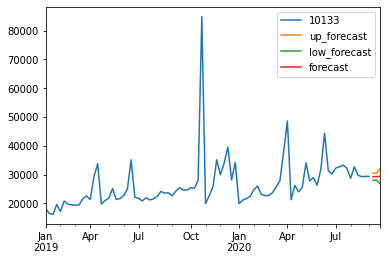

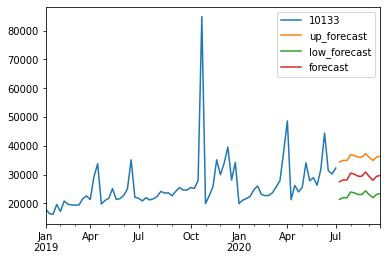

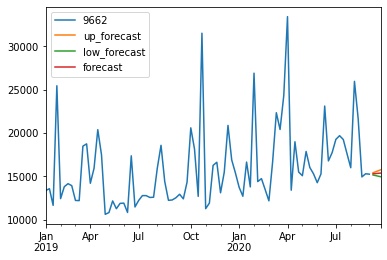

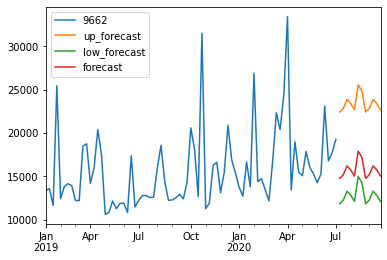

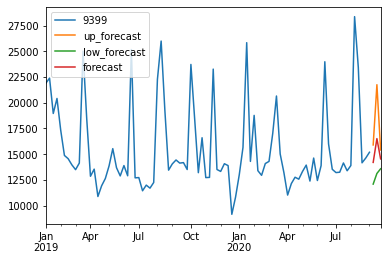

...

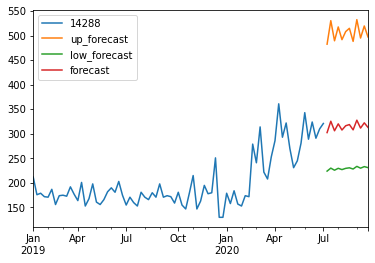

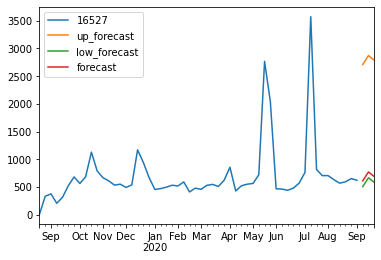

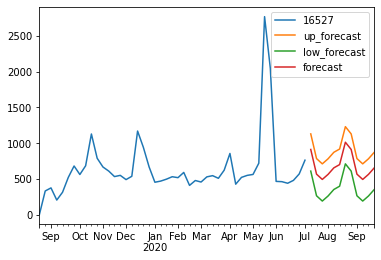

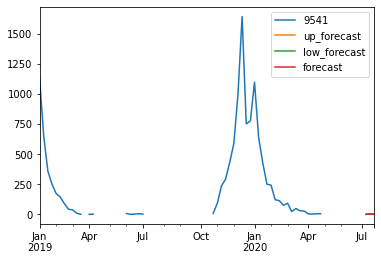

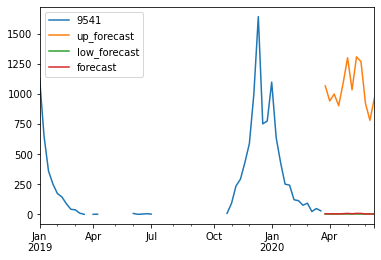

/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/compat/pandas.py:65: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import Int64Index as NumericIndex
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1218: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(a, func=_nanmedian, axis=axis, out=out,
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/numpy/lib/nanfunctions.py:1584: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/autots/models/basics.py:1081: RuntimeWarning: Mean of empty slice
  forecast = np.nanmean(results, axis=0)
/Users/simennaess/Library/Python/3.8/lib/python/site-packages/statsmodels/compat/pandas.py:65: FutureWarning: pandas.Int64Index is 

In [14]:

train_on_individual_timeseries(allSelectedProducts)